In [1]:
import os
os.getcwd()
 
import pandas as pd
import numpy as np
import datetime
from dateutil.relativedelta import relativedelta
import matplotlib.pyplot as plt
from matplotlib import gridspec
import quantstats as qs
from pyecharts import Line, Bar, Scatter, Grid, Overlap
import plotly.figure_factory as ff
from statsmodels.formula.api import ols
import sqlite3
from tqdm import tqdm

In [162]:
code_df = pd.read_excel("./KOSDAQ.xlsx")

In [163]:
code_df['종목코드']

0        91990
1        68760
2       196170
3       263750
4       293490
         ...  
1451    353190
1452    353490
1453    355150
1454    359090
1455    363260
Name: 종목코드, Length: 1456, dtype: int64

In [164]:
def make_code (x) :
    x = str(x)
    
    return "A"+'0'*(6-len(x)) + x

code_df['종목코드'] = code_df['종목코드'].apply(make_code)

In [165]:
Buy_code = pd.DataFrame()
for code in code_df['종목코드']:
    conn = sqlite3.connect("D:/stock_price(daily).db")
    cur = conn.cursor()
    cur.execute("SELECT * FROM "+ code)
    rows = cur.fetchall()
    cols = [column[0] for column in cur.description]

    data_df = pd.DataFrame.from_records(data=rows, columns=cols)
    data_df['date'] = pd.to_datetime(data_df['date'], format='%Y%m%d')
    data_df.set_index('date', drop=True, inplace=True)
    data_df['MA120'] = data_df['close'].rolling(window=120, min_periods=120).mean()

    data_df.dropna(inplace=True)
    data_df['high<MA'] = data_df['high'] < data_df['MA120']

    data_df['is20'] = np.nan
    Numdata = len(data_df)
    for idx in range(2, Numdata):

        if data_df['high<MA'][idx-1] == True and data_df['high<MA'][idx-2] == True :
            tmp += 1
        else:
            tmp = 0

        if tmp >= 20:
            data_df['is20'][idx] = 1
        else:
            data_df['is20'][idx] = 0

    data_df.dropna(inplace=True)
    Numdata = len(data_df)
    data_df['Buy'] = np.nan

    for idx in range(Numdata):
        # 해당일자 저가가 이평선 120일보다 낮아야하고 고가가 이평선 120일보다 높아야함
        if data_df['is20'][idx] == 1:        
            if data_df['low'].iloc[idx] <= data_df['MA120'].iloc[idx] and data_df['high'].iloc[idx] >= data_df['MA120'].iloc[idx]:
                data_df['Buy'][idx] = 1
            else:
                data_df['Buy'][idx] = 0
        else:
            data_df['Buy'][idx] = 0

    Buy_code[code] = data_df['Buy']

In [166]:
Buy_code

,A091990,A068760,A196170,A263750,A293490,A247540,A096530,A036490,A035760,A253450,...,A349720,A351320,A351340,A353060,A353070,A353190,A353490,A355150,A359090,A363260
date,,,,,,,,,,,,,,,,,,,,,
2018-01-29,0.0,0.0,0.0,NaN,NaN,NaN,0.0,0.0,0.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-01-30,0.0,0.0,0.0,NaN,NaN,NaN,0.0,0.0,0.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-01-31,0.0,0.0,0.0,NaN,NaN,NaN,0.0,0.0,0.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-02-01,0.0,0.0,0.0,NaN,NaN,NaN,0.0,0.0,0.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-02-02,0.0,0.0,0.0,NaN,NaN,NaN,0.0,0.0,0.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-02-04,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,NaN,0.0,0.0,NaN,NaN,NaN,NaN
2021-02-05,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,NaN,0.0,0.0,NaN,NaN,NaN,NaN
2021-02-08,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,NaN,0.0,0.0,NaN,NaN,NaN,NaN


In [170]:
Buy_code.to_csv('./Buy_code.csv')

In [171]:
return_df.to_csv('./return_df.csv')

In [172]:
Buy_sum = Buy_code.sum(axis=1)

In [173]:
code_df = pd.DataFrame()
for time in Buy_code.index:

date
2018-01-29    36.0
2018-01-30    20.0
2018-01-31     9.0
2018-02-01    14.0
2018-02-02    13.0
              ... 
2021-02-04     3.0
2021-02-05     4.0
2021-02-08     2.0
2021-02-09     5.0
2021-02-10     4.0
Length: 747, dtype: float64

In [174]:
for i in range(len(Buy_code.index)):
    tmp = 0
    for j in range(len(Buy_code.columns)):
        if Buy_code.iloc[i][j] == 1:
            tmp += 1
        else:
            pass
        if tmp > 10:
            Buy_code.iloc[i][j] = 0
        else : 
            pass

In [175]:
Buy_code.sum(axis=1)

date
2018-01-29    10.0
2018-01-30    10.0
2018-01-31     9.0
2018-02-01    10.0
2018-02-02    10.0
              ... 
2021-02-04     3.0
2021-02-05     4.0
2021-02-08     2.0
2021-02-09     5.0
2021-02-10     4.0
Length: 747, dtype: float64

In [177]:
(Buy_code.shift(1)*return_df).to_csv('./Rp5.csv')

In [153]:
Rp5 = Buy_code.shift(1)*return_df

In [160]:
(((price_df *(1 + Rp5))*Buy_code) - (price_df*Buy_code)).to_csv('./price5.csv')

In [4]:
con = sqlite3.connect("./Fin Lab/data/total.db")
cursor = con.cursor()
cursor.execute(f"SELECT * FROM total WHERE 날짜 >= 20100101")
data = cursor.fetchall()
df = pd.DataFrame(data, columns=['_', 
                                 '날짜','시가','고가','저가','종가','거래량',
                                 '거래대금','시가총액','수정주가비율','종목코드','거래소'])

In [5]:
df = df.drop('_', axis=1)

In [6]:
df[df['거래소']=='KOSDAQ'].sort_values(by='날짜', ascending=False)

,날짜,시가,고가,저가,종가,거래량,거래대금,시가총액,수정주가비율,종목코드,거래소
3306635,20210219,311,369,250,320,1049336063,334471000000,229859000000,100.000000,A024810,KOSDAQ
3607688,20210217,793,947,703,812,1019204560,868789000000,487464000000,100.000000,A036630,KOSDAQ
5028209,20210219,688,888,594,834,916959818,711588000000,437514000000,100.000000,A096040,KOSDAQ
5028198,20210309,895,966,763,774,886064235,785495000000,406038000000,100.000000,A096040,KOSDAQ
5028199,20210308,719,895,671,895,881253220,704211000000,469515000000,100.000000,A096040,KOSDAQ
...,...,...,...,...,...,...,...,...,...,...,...
5312626,20150305,770,770,770,770,0,0,12028000000,20.000000,A123010,KOSDAQ
5312627,20150304,770,770,770,770,0,0,12028000000,20.000000,A123010,KOSDAQ
4008121,20200810,5980,5980,5980,5980,0,0,177611000000,100.000000,A049180,KOSDAQ
4008122,20200807,5980,5980,5980,5980,0,0,177611000000,100.000000,A049180,KOSDAQ


In [553]:
_df = df[df['종목코드']=='A097780']
_df['MA120'] = _df['종가'].rolling(window=5, min_periods=5).mean()

_df.fillna(0, inplace=True)
_df['high<MA'] = _df['고가'] < _df['MA120']

#     _df['is20'] = np.nan

_df = _df.reset_index()
Numdata = len(_df)

In [558]:
_df['continue'] = _df['high<MA'].shift(2) * _df['high<MA'].shift(1)

In [559]:
_df

,index,_,날짜,시가,고가,저가,종가,거래량,거래대금,시가총액,수정주가비율,종목코드,거래소,MA120,high<MA,continue
0,5054772,0,20210315,1420,1490,1420,1445,9154197,13358000000,377355000000,100.00,A097780,KOSDAQ,0.0,False,NaN
1,5054773,1,20210312,1410,1415,1400,1410,2876348,4049000000,368214000000,100.00,A097780,KOSDAQ,0.0,False,NaN
2,5054774,2,20210311,1405,1420,1395,1405,3056373,4291000000,366908000000,100.00,A097780,KOSDAQ,0.0,False,0
3,5054775,3,20210310,1440,1455,1395,1400,3177859,4508000000,365603000000,100.00,A097780,KOSDAQ,0.0,False,0
4,5054776,4,20210309,1475,1480,1415,1430,3639400,5226000000,373437000000,100.00,A097780,KOSDAQ,1418.0,False,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2757,5057529,2757,20100108,605,629,592,610,109340,285000000,9463000000,9.25,A097780,KOSDAQ,595.2,False,0
2758,5057530,2758,20100107,630,641,602,602,75150,203000000,9339000000,9.25,A097780,KOSDAQ,596.0,False,0
2759,5057531,2759,20100106,587,622,574,622,172065,449000000,9649000000,9.25,A097780,KOSDAQ,602.0,False,0
2760,5057532,2760,20100105,563,584,559,580,170252,424000000,8998000000,9.25,A097780,KOSDAQ,598.2,True,0


In [560]:
_df.to_csv('./check.csv')

In [7]:
def Get_Signal(date, code):
    _df = df[df['종목코드']==code]
    
    _df['MA120'] = _df['종가'].rolling(window=5, min_periods=5).mean()

    _df.fillna(0, inplace=True)
    _df['high<MA'] = _df['고가'] < _df['MA120']

#     _df['is20'] = np.nan
    
    _df = _df.reset_index()
    Numdata = len(_df)
    
#     tmp=0
#     _df['continue'] = _df['high<MA'].shift(2) * _df['high<MA'].shift(1)
    _df['continue'] = _df['high<MA'].shift(1)*1
#     for idx in range(2, Numdata):

#         if _df['high<MA'].iloc[idx-1] == True and _df['high<MA'].iloc[idx-2] == True :
#             tmp += 1
#         else:
#             tmp = 0

#         if tmp >= 1:
#             _df.iloc[idx, -1] = 1
#         else:
#             _df.iloc[idx, -1] = 0

#     _df.dropna(inplace=True)
    Numdata = len(_df)
    _df['Buy'] = 0

    for idx in range(Numdata):
        # 해당일자 저가가 이평선 120일보다 낮아야하고 고가가 이평선 120일보다 높아야함
        if _df['continue'].iloc[idx] == 1:        
            if _df['저가'].iloc[idx] <= _df['MA120'].iloc[idx] and _df['고가'].iloc[idx] >= _df['MA120'].iloc[idx]:
                _df.iloc[idx, -1] = 1
            else:
                _df.iloc[idx, -1] = 0
        else:
            _df.iloc[idx, -1] = 0
            
#         if len(_df[_df['날짜']==date]) == 0:
#             return 0

# _df[_df['날짜']==date]['Buy'].values[0]

    _df = _df[_df['날짜']==date]

#     display(_df[_df['날짜']==date])
    
    if len(_df) == 0:
        return 0

    return _df[_df['날짜']==date]['Buy'].values[0]

In [8]:
Get_Signal(20210208,'A097780')

1

In [11]:
def Get_date(date):
    _df = df[df['날짜']==date]
    _df = _df[_df['거래량']>5000000]
    _df = _df[_df['거래소']=='KOSDAQ']
    _df['bs'] = 0
    _df = _df.reset_index()
    
    bs_list = []
    
    for idx, row in _df.iterrows():
        bs_list.append(Get_Signal(date, row['종목코드']))
       
    _df['bs'] = bs_list
    return _df.sort_values(by='거래량', ascending=False)

In [12]:
result = Get_date(20210208)

53it [00:45,  1.16it/s]


In [18]:
result[result['bs']==1]['날짜'][9]

20210208

In [35]:
condition1 = df['날짜']==Account['날짜'][0]
condition2 = df['종목코드']==Account['종목코드'][0]
((df[condition1 & condition2]['시가']/ Account['매입가'][idx]) - 1) - 0.0038 > 0.1

3028763    False
Name: 시가, dtype: bool

In [51]:
Account['매입가'][idx]

2621.0

In [64]:
Money = 10000000
round((Money/10)//result[result['bs']==1]['종가'][0],0)

KeyError: 0

In [63]:
result[result['bs']==1]['종가']

Series([], Name: 종가, dtype: int64)

In [ ]:
df = df[df['거래소']=='KOSDAQ'].sort_values(by='날짜', ascending=False)
Money = 10000000
Money_list = []
total_list = []
Account = pd.DataFrame()
for date in tqdm(sorted(df['날짜'].unique())):
    result = Get_date(date)
    Money_list.append(Money)
    if len(Account) < 10 :
        if len(result) == 0 :
            pass
        else :  
            for idx in result[result['bs']==1].index:
                Account = Account.append({'날짜' :  round(result[result['bs']==1]['날짜'][idx],0),'종목코드' : result[result['bs']==1]['종목코드'][idx],'매입가' : result[result['bs']==1]['종가'][idx], '수량' : (Money/10)//result[result['bs']==1]['종가'][idx]} , ignore_index=True)
                Money -= (result[result['bs']==1]['종가'][idx])*((Money/10)//result[result['bs']==1]['종가'][idx])
                print("채결 \n 종목:", result[result['bs']==1]['종목코드'][idx], "   일자:", result[result['bs']==1]['날짜'][idx], "   매입가:", result[result['bs']==1]['종가'][idx], "   수량:", (Money/10)//result[result['bs']==1]['종가'][idx], "   잔고:", Money)
    else : 
        pass
    
    for i in Account.index:
        condition1 = df['날짜']==Account['날짜'][i]
        condition2 = df['종목코드']==Account['종목코드'][i]
        FOC = (((df[condition1 & condition2]['시가'].iloc[0] / Account['매입가'][i]) - 1) - 0.0038 > 0.1)
        if FOC == True :
            Money += df[condition1 & condition2]['시가'].iloc[0] * Account['수량'][i] * (1-0.0038)
            print("채결 \n 종목:", Account['종목코드'][i], "   일자:", Account['날짜'][i], "   매도가:", df[condition1 & condition2]['시가'].iloc[0], "   수량:", Account['수량'][i], "   잔고: ", Money)
            Account = Account.drop(i)
        elif (date - Account['날짜'][i]) > 5:
            Money += df[condition1 & condition2]['시가'].iloc[0] * Account['수량'][i] * (1-0.0038)
            print("채결 \n 종목:", Account['종목코드'][i], "   일자:", Account['날짜'][i], "   매도가:", df[condition1 & condition2]['시가'].iloc[0], "   수량:", Account['수량'][i], "   잔고: ", Money)
            Account = Account.drop(i)
    display("일일정산:",Account)
    display("현금:", Money)
    total = Money + (Account['매입가']*Account['수량']).sum()
    total_list.append(total)
    display("총 자산가치:", total)  

  0%|                                                                                         | 0/2762 [00:00<?, ?it/s]
0it [00:00, ?it/s]
1it [00:00,  1.11it/s]
2it [00:01,  1.05it/s]
3it [00:04,  1.47s/it]
4it [00:05,  1.37s/it]
5it [00:06,  1.28s/it]
6it [00:07,  1.23s/it]
7it [00:10,  1.66s/it]
8it [00:11,  1.48s/it]


채결 
 종목: A006910    일자: 20100104    매입가: 2621    수량: 343.0    잔고: 9001399.0


'일일정산:'

,날짜,매입가,수량,종목코드
0,20100104.0,2621.0,381.0,A006910


'현금:'

9001399.0

'총 자산가치:'

10000000.0

  0%|                                                                               | 1/2762 [00:12<9:21:25, 12.20s/it]
0it [00:00, ?it/s]
1it [00:01,  1.18s/it]
2it [00:03,  1.54s/it]
3it [00:05,  1.59s/it]
4it [00:06,  1.43s/it]
5it [00:07,  1.30s/it]
6it [00:09,  1.49s/it]
7it [00:11,  1.58s/it]
8it [00:12,  1.42s/it]
9it [00:13,  1.30s/it]
10it [00:14,  1.32s/it]
11it [00:16,  1.52s/it]


채결 
 종목: A035080    일자: 20100105    매입가: 7570    수량: 107.0    잔고: 8108139.0
채결 
 종목: A080530    일자: 20100105    매입가: 4401    수량: 165.0    잔고: 7298355.0
채결 
 종목: A080530    일자: 20100105.0    매도가: 5174    수량: 184.0    잔고:  8246753.3392


'일일정산:'

,날짜,매입가,수량,종목코드
0,20100104.0,2621.0,381.0,A006910
1,20100105.0,7570.0,118.0,A035080


'현금:'

8246753.3392

'총 자산가치:'

10138614.339200001

  0%|                                                                              | 2/2762 [00:29<10:36:02, 13.83s/it]
0it [00:00, ?it/s]
1it [00:01,  1.09s/it]
2it [00:02,  1.07s/it]
3it [00:04,  1.53s/it]
4it [00:05,  1.40s/it]
5it [00:06,  1.29s/it]
6it [00:07,  1.20s/it]
7it [00:10,  1.59s/it]
8it [00:11,  1.48s/it]
9it [00:12,  1.34s/it]
10it [00:13,  1.25s/it]
11it [00:15,  1.37s/it]
12it [00:17,  1.57s/it]
13it [00:18,  1.40s/it]
14it [00:19,  1.38s/it]


채결 
 종목: A019990    일자: 20100106    매입가: 7058    수량: 105.0    잔고: 7428025.3392


'일일정산:'

,날짜,매입가,수량,종목코드
0,20100104.0,2621.0,381.0,A006910
1,20100105.0,7570.0,118.0,A035080
2,20100106.0,7058.0,116.0,A019990


'현금:'

7428025.3392

'총 자산가치:'

10138614.339200001

  0%|                                                                              | 3/2762 [00:49<12:02:41, 15.72s/it]
0it [00:00, ?it/s]
1it [00:02,  2.69s/it]
2it [00:03,  2.21s/it]
3it [00:04,  1.86s/it]
4it [00:05,  1.60s/it]
5it [00:08,  1.87s/it]
6it [00:09,  1.67s/it]
7it [00:10,  1.46s/it]
8it [00:11,  1.33s/it]
9it [00:13,  1.55s/it]
10it [00:15,  1.55s/it]
11it [00:16,  1.39s/it]
12it [00:17,  1.27s/it]
13it [00:18,  1.42s/it]


채결 
 종목: A060570    일자: 20100107    매입가: 4935    수량: 135.0    잔고: 6687775.3392
채결 
 종목: A032620    일자: 20100107    매입가: 2400    수량: 250.0    잔고: 6020575.3392
채결 
 종목: A048410    일자: 20100107    매입가: 15704    수량: 34.0    잔고: 5423823.3392


'일일정산:'

,날짜,매입가,수량,종목코드
0,20100104.0,2621.0,381.0,A006910
1,20100105.0,7570.0,118.0,A035080
2,20100106.0,7058.0,116.0,A019990
3,20100107.0,4935.0,150.0,A060570
4,20100107.0,2400.0,278.0,A032620
5,20100107.0,15704.0,38.0,A048410


'현금:'

5423823.3392

'총 자산가치:'

10138614.339200001

  0%|                                                                              | 4/2762 [01:11<13:20:07, 17.41s/it]
0it [00:00, ?it/s]
1it [00:01,  1.01s/it]
2it [00:02,  1.01s/it]
3it [00:03,  1.25s/it]
4it [00:05,  1.45s/it]
5it [00:06,  1.33s/it]
6it [00:08,  1.33s/it]
7it [00:10,  1.79s/it]
8it [00:12,  1.60s/it]
9it [00:13,  1.44s/it]
10it [00:14,  1.32s/it]
11it [00:16,  1.52s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20100104.0,2621.0,381.0,A006910
1,20100105.0,7570.0,118.0,A035080
2,20100106.0,7058.0,116.0,A019990
3,20100107.0,4935.0,150.0,A060570
4,20100107.0,2400.0,278.0,A032620
5,20100107.0,15704.0,38.0,A048410


'현금:'

5423823.3392

'총 자산가치:'

10138614.339200001

  0%|▏                                                                             | 5/2762 [01:29<13:35:08, 17.74s/it]
0it [00:00, ?it/s]
1it [00:01,  1.06s/it]
2it [00:02,  1.04s/it]
3it [00:04,  1.50s/it]
4it [00:05,  1.39s/it]
5it [00:06,  1.28s/it]
6it [00:07,  1.20s/it]
7it [00:09,  1.42s/it]


채결 
 종목: A006910    일자: 20100104.0    매도가: 2452    수량: 381.0    잔고:  6354485.3336000005
채결 
 종목: A035080    일자: 20100105.0    매도가: 7500    수량: 118.0    잔고:  7236122.3336000005


'일일정산:'

,날짜,매입가,수량,종목코드
2,20100106.0,7058.0,116.0,A019990
3,20100107.0,4935.0,150.0,A060570
4,20100107.0,2400.0,278.0,A032620
5,20100107.0,15704.0,38.0,A048410


'현금:'

7236122.3336000005

'총 자산가치:'

10059052.3336

  0%|▏                                                                             | 6/2762 [01:41<12:16:38, 16.04s/it]
0it [00:00, ?it/s]
1it [00:01,  1.02s/it]
2it [00:01,  1.01s/it]
3it [00:04,  1.47s/it]
4it [00:05,  1.37s/it]
5it [00:06,  1.26s/it]
6it [00:07,  1.18s/it]
7it [00:10,  1.68s/it]
8it [00:11,  1.54s/it]
9it [00:12,  1.40s/it]
10it [00:13,  1.30s/it]
11it [00:16,  1.68s/it]
12it [00:17,  1.52s/it]
13it [00:18,  1.37s/it]
14it [00:19,  1.26s/it]
15it [00:21,  1.44s/it]


채결 
 종목: A066980    일자: 20100112    매입가: 2811    수량: 231.0    잔고: 6513695.3336000005
채결 
 종목: A019990    일자: 20100106.0    매도가: 6848    수량: 116.0    잔고:  7305044.735200001


'일일정산:'

,날짜,매입가,수량,종목코드
1,20100107.0,4935.0,150.0,A060570
2,20100107.0,2400.0,278.0,A032620
3,20100107.0,15704.0,38.0,A048410
4,20100112.0,2811.0,257.0,A066980


'현금:'

7305044.735200001

'총 자산가치:'

10031673.7352

  0%|▏                                                                             | 7/2762 [02:05<13:59:20, 18.28s/it]
0it [00:00, ?it/s]
1it [00:01,  1.02s/it]
2it [00:02,  1.02s/it]
3it [00:04,  1.39s/it]
4it [00:05,  1.40s/it]
5it [00:06,  1.29s/it]
6it [00:07,  1.20s/it]
7it [00:09,  1.32s/it]
8it [00:11,  1.53s/it]
9it [00:12,  1.39s/it]
10it [00:13,  1.27s/it]
11it [00:14,  1.31s/it]


채결 
 종목: A032820    일자: 20100113    매입가: 2775    수량: 236.0    잔고: 6575219.735200001
채결 
 종목: A060570    일자: 20100107.0    매도가: 4895    수량: 150.0    잔고:  7306679.585200001
채결 
 종목: A032620    일자: 20100107.0    매도가: 2500    수량: 278.0    잔고:  7999038.585200001
채결 
 종목: A048410    일자: 20100107.0    매도가: 14727    수량: 38.0    잔고:  8556538.0064


'일일정산:'

,날짜,매입가,수량,종목코드
3,20100112.0,2811.0,257.0,A066980
4,20100113.0,2775.0,263.0,A032820


'현금:'

8556538.0064

'총 자산가치:'

10008790.0064

  0%|▏                                                                             | 8/2762 [02:22<13:45:42, 17.99s/it]
0it [00:00, ?it/s]
1it [00:01,  1.04s/it]
2it [00:02,  1.04s/it]
3it [00:03,  1.02s/it]
4it [00:05,  1.49s/it]
5it [00:06,  1.36s/it]
6it [00:07,  1.27s/it]
7it [00:08,  1.19s/it]
8it [00:11,  1.59s/it]
9it [00:12,  1.46s/it]
10it [00:13,  1.32s/it]
11it [00:14,  1.23s/it]
12it [00:16,  1.36s/it]


채결 
 종목: A038880    일자: 20100114    매입가: 984    수량: 782.0    잔고: 7701442.0064
채결 
 종목: A019990    일자: 20100114    매입가: 8870    수량: 78.0    잔고: 6938622.0064


'일일정산:'

,날짜,매입가,수량,종목코드
0,20100112.0,2811.0,257.0,A066980
1,20100113.0,2775.0,263.0,A032820
2,20100114.0,984.0,869.0,A038880
3,20100114.0,8870.0,86.0,A019990


'현금:'

6938622.0064

'총 자산가치:'

10008790.0064

  0%|▎                                                                             | 9/2762 [02:40<13:47:52, 18.04s/it]
0it [00:00, ?it/s]
1it [00:01,  1.04s/it]
2it [00:02,  1.03s/it]
3it [00:03,  1.12s/it]
4it [00:05,  1.46s/it]
5it [00:06,  1.33s/it]
6it [00:07,  1.23s/it]
7it [00:08,  1.17s/it]
8it [00:11,  1.57s/it]
9it [00:12,  1.42s/it]
10it [00:13,  1.29s/it]
11it [00:14,  1.30s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20100112.0,2811.0,257.0,A066980
1,20100113.0,2775.0,263.0,A032820
2,20100114.0,984.0,869.0,A038880
3,20100114.0,8870.0,86.0,A019990


'현금:'

6938622.0064

'총 자산가치:'

10008790.0064

  0%|▎                                                                            | 10/2762 [02:57<13:29:46, 17.66s/it]
0it [00:00, ?it/s]
1it [00:01,  1.18s/it]
2it [00:02,  1.13s/it]
3it [00:03,  1.10s/it]
4it [00:05,  1.41s/it]
5it [00:07,  1.52s/it]
6it [00:08,  1.57s/it]
7it [00:12,  2.11s/it]
8it [00:14,  2.25s/it]
9it [00:17,  2.25s/it]
10it [00:19,  2.40s/it]
11it [00:21,  1.92s/it]


채결 
 종목: A066980    일자: 20100112.0    매도가: 2694    수량: 257.0    잔고:  7628349.046


'일일정산:'

,날짜,매입가,수량,종목코드
1,20100113.0,2775.0,263.0,A032820
2,20100114.0,984.0,869.0,A038880
3,20100114.0,8870.0,86.0,A019990


'현금:'

7628349.046

'총 자산가치:'

9976090.046

  0%|▎                                                                            | 11/2762 [03:20<14:37:55, 19.15s/it]
0it [00:00, ?it/s]
1it [00:03,  3.09s/it]
2it [00:04,  2.59s/it]
3it [00:05,  2.24s/it]
4it [00:09,  2.49s/it]
5it [00:10,  2.09s/it]
6it [00:11,  1.77s/it]
7it [00:12,  1.55s/it]
8it [00:14,  1.86s/it]
9it [00:15,  1.64s/it]
10it [00:16,  1.45s/it]
11it [00:17,  1.31s/it]
12it [00:19,  1.52s/it]
13it [00:21,  1.58s/it]
14it [00:22,  1.62s/it]


채결 
 종목: A032820    일자: 20100113.0    매도가: 2640    수량: 263.0    잔고:  8320030.63


'일일정산:'

,날짜,매입가,수량,종목코드
2,20100114.0,984.0,869.0,A038880
3,20100114.0,8870.0,86.0,A019990


'현금:'

8320030.63

'총 자산가치:'

9937946.629999999

  0%|▎                                                                            | 12/2762 [03:43<15:37:43, 20.46s/it]
0it [00:00, ?it/s]
1it [00:01,  1.04s/it]
2it [00:03,  1.49s/it]
3it [00:04,  1.38s/it]
4it [00:05,  1.27s/it]
5it [00:06,  1.24s/it]
6it [00:09,  1.69s/it]
7it [00:10,  1.52s/it]
8it [00:11,  1.37s/it]
9it [00:12,  1.26s/it]
10it [00:14,  1.54s/it]
11it [00:16,  1.55s/it]
12it [00:17,  1.39s/it]
13it [00:18,  1.43s/it]


채결 
 종목: A024810    일자: 20100120    매입가: 792    수량: 945.0    잔고: 7488430.63
채결 
 종목: A038880    일자: 20100120    매입가: 1074    수량: 627.0    잔고: 6739852.63
채결 
 종목: A038880    일자: 20100114.0    매도가: 1017    수량: 869.0    잔고:  7620267.2926
채결 
 종목: A019990    일자: 20100114.0    매도가: 9109    수량: 86.0    잔고:  8400664.4714


'일일정산:'

,날짜,매입가,수량,종목코드
2,20100120.0,792.0,1050.0,A024810
3,20100120.0,1074.0,697.0,A038880


'현금:'

8400664.4714

'총 자산가치:'

9980842.4714

  0%|▎                                                                            | 13/2762 [04:04<15:35:11, 20.41s/it]
0it [00:00, ?it/s]
1it [00:01,  1.97s/it]
2it [00:03,  1.70s/it]
3it [00:04,  1.48s/it]
4it [00:05,  1.34s/it]
5it [00:07,  1.74s/it]
6it [00:08,  1.53s/it]
7it [00:09,  1.40s/it]
8it [00:10,  1.30s/it]
9it [00:14,  1.86s/it]
10it [00:17,  1.71s/it]


채결 
 종목: A029960    일자: 20100121    매입가: 1285    수량: 588.0    잔고: 7561559.4714
채결 
 종목: A029960    일자: 20100121.0    매도가: 1500    수량: 653.0    잔고:  8537337.3714


'일일정산:'

,날짜,매입가,수량,종목코드
0,20100120.0,792.0,1050.0,A024810
1,20100120.0,1074.0,697.0,A038880


'현금:'

8537337.3714

'총 자산가치:'

10117515.3714

  1%|▍                                                                            | 14/2762 [04:24<15:39:03, 20.50s/it]
0it [00:00, ?it/s]
1it [00:01,  1.78s/it]
2it [00:04,  1.95s/it]
3it [00:09,  2.88s/it]
4it [00:13,  3.29s/it]
5it [00:17,  3.63s/it]
6it [00:21,  3.63s/it]
7it [00:24,  3.30s/it]
8it [00:26,  3.31s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20100120.0,792.0,1050.0,A024810
1,20100120.0,1074.0,697.0,A038880


'현금:'

8537337.3714

'총 자산가치:'

10117515.3714

  1%|▍                                                                            | 15/2762 [04:51<17:09:44, 22.49s/it]
0it [00:00, ?it/s]
1it [00:01,  1.36s/it]
2it [00:03,  1.54s/it]
3it [00:06,  1.94s/it]
4it [00:07,  1.75s/it]
5it [00:09,  1.93s/it]
6it [00:12,  2.05s/it]
7it [00:14,  2.02s/it]
8it [00:18,  2.61s/it]
9it [00:19,  2.37s/it]
10it [00:21,  2.20s/it]
11it [00:24,  2.45s/it]
12it [00:25,  2.07s/it]
13it [00:27,  1.79s/it]
14it [00:29,  2.07s/it]
15it [00:30,  1.78s/it]
16it [00:31,  2.00s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20100120.0,792.0,1050.0,A024810
1,20100120.0,1074.0,697.0,A038880


'현금:'

8537337.3714

'총 자산가치:'

10117515.3714

  1%|▍                                                                            | 16/2762 [05:24<19:28:25, 25.53s/it]
0it [00:00, ?it/s]
1it [00:02,  2.40s/it]
2it [00:04,  2.37s/it]
3it [00:06,  2.12s/it]
4it [00:08,  2.18s/it]
5it [00:10,  2.06s/it]
6it [00:11,  1.76s/it]
7it [00:12,  1.57s/it]
8it [00:15,  1.94s/it]
9it [00:17,  1.87s/it]
10it [00:18,  1.65s/it]
11it [00:19,  1.78s/it]


채결 
 종목: A045100    일자: 20100126    매입가: 8957    수량: 85.0    잔고: 7686422.3714000005
채결 
 종목: A024810    일자: 20100120.0    매도가: 779    수량: 1050.0    잔고:  8501264.161400001
채결 
 종목: A038880    일자: 20100120.0    매도가: 1072    수량: 697.0    잔고:  9245608.862200001
채결 
 종목: A045100    일자: 20100126.0    매도가: 10331    수량: 95.0    잔고:  10223324.3712


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

10223324.3712

'총 자산가치:'

10223324.3712

  1%|▍                                                                            | 17/2762 [05:46<18:37:09, 24.42s/it]
0it [00:00, ?it/s]
1it [00:01,  1.36s/it]
2it [00:02,  1.28s/it]
3it [00:04,  1.36s/it]
4it [00:06,  1.73s/it]
5it [00:07,  1.53s/it]
6it [00:08,  1.39s/it]
7it [00:10,  1.48s/it]
8it [00:12,  1.67s/it]
9it [00:13,  1.49s/it]
10it [00:14,  1.35s/it]
11it [00:15,  1.27s/it]
12it [00:18,  1.66s/it]
13it [00:19,  1.49s/it]
14it [00:20,  1.46s/it]


채결 
 종목: A045390    일자: 20100127    매입가: 2685    수량: 342.0    잔고: 9203024.3712
채결 
 종목: A024810    일자: 20100127    매입가: 785    수량: 1055.0    잔고: 8283004.371200001
채결 
 종목: A096040    일자: 20100127    매입가: 1673    수량: 445.0    잔고: 7454869.371200001
채결 
 종목: A024810    일자: 20100127.0    매도가: 899    수량: 1172.0    잔고:  8504493.584800001
채결 
 종목: A096040    일자: 20100127.0    매도가: 1921    수량: 495.0    잔고:  9451775.1838


'일일정산:'

,날짜,매입가,수량,종목코드
0,20100127.0,2685.0,380.0,A045390


'현금:'

9451775.1838

'총 자산가치:'

10472075.1838

  1%|▌                                                                            | 18/2762 [06:07<17:55:28, 23.52s/it]
0it [00:00, ?it/s]
1it [00:02,  2.75s/it]
2it [00:03,  2.27s/it]
3it [00:04,  1.90s/it]
4it [00:06,  1.66s/it]
5it [00:08,  1.97s/it]
6it [00:09,  1.75s/it]
7it [00:11,  1.57s/it]
8it [00:12,  1.55s/it]
9it [00:15,  1.80s/it]
10it [00:16,  1.60s/it]
11it [00:17,  1.44s/it]
12it [00:18,  1.39s/it]
13it [00:21,  1.62s/it]


채결 
 종목: A006910    일자: 20100128    매입가: 5148    수량: 165.0    잔고: 8509691.1838
채결 
 종목: A039420    일자: 20100128    매입가: 3445    수량: 222.0    잔고: 7658776.183800001
채결 
 종목: A039420    일자: 20100128.0    매도가: 4180    수량: 247.0    잔고:  8687312.835800001


'일일정산:'

,날짜,매입가,수량,종목코드
0,20100127.0,2685.0,380.0,A045390
1,20100128.0,5148.0,183.0,A006910


'현금:'

8687312.835800001

'총 자산가치:'

10649696.835800001

  1%|▌                                                                            | 19/2762 [06:29<17:33:01, 23.03s/it]
0it [00:00, ?it/s]
1it [00:01,  1.09s/it]
2it [00:02,  1.08s/it]
3it [00:04,  1.55s/it]
4it [00:05,  1.42s/it]
5it [00:06,  1.30s/it]
6it [00:07,  1.20s/it]
7it [00:10,  1.62s/it]
8it [00:11,  1.48s/it]
9it [00:12,  1.34s/it]
10it [00:13,  1.37s/it]


채결 
 종목: A029960    일자: 20100129    매입가: 1350    수량: 579.0    잔고: 7819262.835800001
채결 
 종목: A060570    일자: 20100129    매입가: 3950    수량: 178.0    잔고: 7041112.835800001
채결 
 종목: A060570    일자: 20100129.0    매도가: 4470    수량: 197.0    잔고:  7918356.593800002


'일일정산:'

,날짜,매입가,수량,종목코드
0,20100127.0,2685.0,380.0,A045390
1,20100128.0,5148.0,183.0,A006910
2,20100129.0,1350.0,643.0,A029960


'현금:'

7918356.593800002

'총 자산가치:'

10748790.5938

  1%|▌                                                                            | 20/2762 [06:45<15:59:57, 21.01s/it]
0it [00:00, ?it/s]
1it [00:01,  1.26s/it]
2it [00:02,  1.19s/it]
3it [00:03,  1.14s/it]
4it [00:05,  1.36s/it]
5it [00:07,  1.53s/it]
6it [00:08,  1.38s/it]
7it [00:09,  1.27s/it]
8it [00:10,  1.29s/it]
9it [00:12,  1.44s/it]


채결 
 종목: A024810    일자: 20100201    매입가: 931    수량: 765.0    잔고: 7127006.593800002
채결 
 종목: A045390    일자: 20100127.0    매도가: 2960    수량: 380.0    잔고:  8247532.353800002
채결 
 종목: A006910    일자: 20100128.0    매도가: 5512    수량: 183.0    잔고:  9252395.309000002
채결 
 종목: A029960    일자: 20100129.0    매도가: 1400    수량: 643.0    잔고:  10149174.549000002


'일일정산:'

,날짜,매입가,수량,종목코드
3,20100201.0,931.0,850.0,A024810


'현금:'

10149174.549000002

'총 자산가치:'

10940524.549000002

  1%|▌                                                                            | 21/2762 [07:00<14:24:45, 18.93s/it]
0it [00:00, ?it/s]
1it [00:01,  1.07s/it]
2it [00:02,  1.07s/it]
3it [00:04,  1.55s/it]
4it [00:05,  1.40s/it]
5it [00:06,  1.29s/it]
6it [00:08,  1.25s/it]
7it [00:10,  1.68s/it]
8it [00:11,  1.52s/it]
9it [00:12,  1.43s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
3,20100201.0,931.0,850.0,A024810


'현금:'

10149174.549000002

'총 자산가치:'

10940524.549000002

  1%|▌                                                                            | 22/2762 [07:13<13:04:44, 17.18s/it]
0it [00:00, ?it/s]
1it [00:01,  1.11s/it]
2it [00:03,  1.57s/it]
3it [00:04,  1.43s/it]
4it [00:05,  1.30s/it]
5it [00:06,  1.21s/it]
6it [00:09,  1.63s/it]
7it [00:10,  1.51s/it]
8it [00:11,  1.37s/it]
9it [00:12,  1.27s/it]
10it [00:15,  1.72s/it]
11it [00:16,  1.59s/it]
12it [00:17,  1.44s/it]
13it [00:18,  1.46s/it]


채결 
 종목: A065450    일자: 20100203    매입가: 3235    수량: 282.0    잔고: 9136619.549000002


'일일정산:'

,날짜,매입가,수량,종목코드
0,20100201.0,931.0,850.0,A024810
1,20100203.0,3235.0,313.0,A065450


'현금:'

9136619.549000002

'총 자산가치:'

10940524.549000002

  1%|▋                                                                            | 23/2762 [07:33<13:45:31, 18.08s/it]
0it [00:00, ?it/s]
1it [00:02,  2.05s/it]
2it [00:03,  1.75s/it]
3it [00:04,  1.52s/it]
4it [00:05,  1.37s/it]
5it [00:07,  1.79s/it]
6it [00:09,  1.60s/it]
7it [00:10,  1.41s/it]
8it [00:11,  1.30s/it]
9it [00:13,  1.73s/it]
10it [00:14,  1.55s/it]
11it [00:15,  1.40s/it]
12it [00:17,  1.31s/it]
13it [00:19,  1.76s/it]
14it [00:20,  1.58s/it]
15it [00:22,  1.41s/it]
16it [00:23,  1.44s/it]


채결 
 종목: A045390    일자: 20100204    매입가: 3280    수량: 250.0    잔고: 8224779.549000002
채결 
 종목: A029960    일자: 20100204    매입가: 1515    수량: 488.0    잔고: 7403649.549000002


'일일정산:'

,날짜,매입가,수량,종목코드
0,20100201.0,931.0,850.0,A024810
1,20100203.0,3235.0,313.0,A065450
2,20100204.0,3280.0,278.0,A045390
3,20100204.0,1515.0,542.0,A029960


'현금:'

7403649.549000002

'총 자산가치:'

10940524.549000002

  1%|▋                                                                            | 24/2762 [07:59<15:32:11, 20.43s/it]
0it [00:00, ?it/s]
1it [00:01,  1.22s/it]
2it [00:02,  1.17s/it]
3it [00:03,  1.13s/it]
4it [00:05,  1.59s/it]
5it [00:07,  1.44s/it]
6it [00:08,  1.33s/it]
7it [00:09,  1.27s/it]
8it [00:11,  1.71s/it]
9it [00:13,  1.53s/it]
10it [00:14,  1.37s/it]
11it [00:15,  1.26s/it]
12it [00:17,  1.63s/it]
13it [00:18,  1.53s/it]
14it [00:19,  1.42s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20100201.0,931.0,850.0,A024810
1,20100203.0,3235.0,313.0,A065450
2,20100204.0,3280.0,278.0,A045390
3,20100204.0,1515.0,542.0,A029960


'현금:'

7403649.549000002

'총 자산가치:'

10940524.549000002

  1%|▋                                                                            | 25/2762 [08:20<15:39:08, 20.59s/it]
0it [00:00, ?it/s]
1it [00:02,  2.58s/it]
2it [00:03,  2.18s/it]
3it [00:04,  1.85s/it]
4it [00:05,  1.59s/it]
5it [00:08,  1.76s/it]
6it [00:09,  1.70s/it]
7it [00:10,  1.53s/it]
8it [00:11,  1.37s/it]
9it [00:13,  1.53s/it]
10it [00:15,  1.61s/it]
11it [00:16,  1.48s/it]
12it [00:17,  1.47s/it]


채결 
 종목: A024810    일자: 20100208    매입가: 1175    수량: 567.0    잔고: 6663399.549000002
채결 
 종목: A032620    일자: 20100208    매입가: 3060    수량: 196.0    잔고: 5999379.549000002
채결 
 종목: A032820    일자: 20100208    매입가: 3785    수량: 142.0    잔고: 5401349.549000002
채결 
 종목: A006910    일자: 20100208    매입가: 4775    수량: 101.0    잔고: 4861774.549000002
채결 
 종목: A033230    일자: 20100208    매입가: 3752    수량: 116.0    잔고: 4377766.549000002
채결 
 종목: A024810    일자: 20100201.0    매도가: 969    수량: 850.0    잔고:  5198286.679000002
채결 
 종목: A032620    일자: 20100208.0    매도가: 3650    수량: 217.0    잔고:  5987326.889000002
채결 
 종목: A006910    일자: 20100208.0    매도가: 5348    수량: 113.0    잔고:  6589354.457800003
채결 
 종목: A033230    일자: 20100208.0    매도가: 4321    수량: 129.0    잔고:  7144645.303600003


'일일정산:'

,날짜,매입가,수량,종목코드
1,20100203.0,3235.0,313.0,A065450
2,20100204.0,3280.0,278.0,A045390
3,20100204.0,1515.0,542.0,A029960
4,20100208.0,1175.0,630.0,A024810
6,20100208.0,3785.0,158.0,A032820


'현금:'

7144645.303600003

'총 자산가치:'

11228450.303600002

  1%|▋                                                                            | 26/2762 [08:42<15:56:31, 20.98s/it]
0it [00:00, ?it/s]
1it [00:01,  1.15s/it]
2it [00:02,  1.11s/it]
3it [00:04,  1.55s/it]
4it [00:05,  1.44s/it]
5it [00:07,  1.33s/it]
6it [00:08,  1.23s/it]
7it [00:10,  1.60s/it]
8it [00:12,  1.58s/it]
9it [00:13,  1.43s/it]
10it [00:14,  1.31s/it]
11it [00:16,  1.68s/it]
12it [00:17,  1.49s/it]


채결 
 종목: A029960    일자: 20100209    매입가: 1420    수량: 452.0    잔고: 6430385.303600003
채결 
 종목: A038880    일자: 20100209    매입가: 1031    수량: 561.0    잔고: 5788072.303600003
채결 
 종목: A065450    일자: 20100203.0    매도가: 2955    수량: 313.0    잔고:  6709472.626600003
채결 
 종목: A029960    일자: 20100209.0    매도가: 1725    수량: 503.0    잔고:  7573850.461600003
채결 
 종목: A038880    일자: 20100209.0    매도가: 1160    수량: 623.0    잔고:  8293784.2776000025


'일일정산:'

,날짜,매입가,수량,종목코드
1,20100204.0,3280.0,278.0,A045390
2,20100204.0,1515.0,542.0,A029960
3,20100208.0,1175.0,630.0,A024810
4,20100208.0,3785.0,158.0,A032820


'현금:'

8293784.2776000025

'총 자산가치:'

11365034.277600002

  1%|▊                                                                            | 27/2762 [09:01<15:39:55, 20.62s/it]
0it [00:00, ?it/s]
1it [00:02,  2.02s/it]
2it [00:03,  1.94s/it]
3it [00:04,  1.67s/it]
4it [00:05,  1.52s/it]
5it [00:08,  1.72s/it]
6it [00:09,  1.70s/it]
7it [00:10,  1.53s/it]
8it [00:12,  1.39s/it]
9it [00:14,  1.71s/it]
10it [00:15,  1.63s/it]
11it [00:16,  1.45s/it]
12it [00:17,  1.50s/it]


채결 
 종목: A033050    일자: 20100210    매입가: 3245    수량: 230.0    잔고: 7466309.2776000025
채결 
 종목: A045390    일자: 20100204.0    매도가: 3480    수량: 278.0    잔고:  8430073.005600002
채결 
 종목: A029960    일자: 20100204.0    매도가: 1505    수량: 542.0    잔고:  9242683.3076


'일일정산:'

,날짜,매입가,수량,종목코드
2,20100208.0,1175.0,630.0,A024810
3,20100208.0,3785.0,158.0,A032820
4,20100210.0,3245.0,255.0,A033050


'현금:'

9242683.3076

'총 자산가치:'

11408438.3076

  1%|▊                                                                            | 28/2762 [09:22<15:41:51, 20.67s/it]
0it [00:00, ?it/s]
1it [00:01,  1.22s/it]
2it [00:02,  1.17s/it]
3it [00:03,  1.13s/it]
4it [00:05,  1.50s/it]
5it [00:07,  1.52s/it]
6it [00:08,  1.38s/it]
7it [00:09,  1.28s/it]
8it [00:11,  1.56s/it]
9it [00:13,  1.46s/it]


채결 
 종목: A042040    일자: 20100211    매입가: 620    수량: 1341.0    잔고: 8318883.307600001


'일일정산:'

,날짜,매입가,수량,종목코드
0,20100208.0,1175.0,630.0,A024810
1,20100208.0,3785.0,158.0,A032820
2,20100210.0,3245.0,255.0,A033050
3,20100211.0,620.0,1490.0,A042040


'현금:'

8318883.307600001

'총 자산가치:'

11408438.3076

  1%|▊                                                                            | 29/2762 [09:36<14:13:20, 18.73s/it]
0it [00:00, ?it/s]
1it [00:01,  1.04s/it]
2it [00:03,  1.39s/it]
3it [00:04,  1.44s/it]
4it [00:05,  1.31s/it]
5it [00:06,  1.26s/it]
6it [00:10,  2.06s/it]
7it [00:13,  2.10s/it]
8it [00:17,  2.67s/it]
9it [00:18,  2.35s/it]
10it [00:20,  2.03s/it]


채결 
 종목: A032820    일자: 20100212    매입가: 4400    수량: 170.0    잔고: 7487283.307600001
채결 
 종목: A064800    일자: 20100212    매입가: 1100    수량: 612.0    잔고: 6739283.307600001


'일일정산:'

,날짜,매입가,수량,종목코드
0,20100208.0,1175.0,630.0,A024810
1,20100208.0,3785.0,158.0,A032820
2,20100210.0,3245.0,255.0,A033050
3,20100211.0,620.0,1490.0,A042040
4,20100212.0,4400.0,189.0,A032820
5,20100212.0,1100.0,680.0,A064800


'현금:'

6739283.307600001

'총 자산가치:'

11408438.3076

  1%|▊                                                                            | 30/2762 [10:01<15:27:37, 20.37s/it]
0it [00:00, ?it/s]
1it [00:02,  2.34s/it]
2it [00:06,  2.94s/it]
3it [00:08,  2.58s/it]
4it [00:10,  2.33s/it]
5it [00:12,  2.27s/it]
6it [00:13,  1.90s/it]
7it [00:14,  1.63s/it]
8it [00:15,  1.46s/it]
9it [00:17,  1.78s/it]
10it [00:18,  1.90s/it]


채결 
 종목: A033050    일자: 20100216    매입가: 3600    수량: 168.0    잔고: 6066083.307600001
채결 
 종목: A024810    일자: 20100208.0    매도가: 1216    수량: 630.0    잔고:  6829252.203600001
채결 
 종목: A032820    일자: 20100208.0    매도가: 4170    수량: 158.0    잔고:  7485608.535600001
채결 
 종목: A033050    일자: 20100210.0    매도가: 3330    수량: 255.0    잔고:  8331531.765600001


'일일정산:'

,날짜,매입가,수량,종목코드
3,20100211.0,620.0,1490.0,A042040
4,20100212.0,4400.0,189.0,A032820
5,20100212.0,1100.0,680.0,A064800
6,20100216.0,3600.0,187.0,A033050


'현금:'

8331531.765600001

'총 자산가치:'

11508131.765600001

  1%|▊                                                                            | 31/2762 [10:21<15:33:54, 20.52s/it]
0it [00:00, ?it/s]
1it [00:02,  2.54s/it]
2it [00:03,  2.13s/it]
3it [00:04,  1.80s/it]
4it [00:05,  1.56s/it]
5it [00:07,  1.74s/it]
6it [00:09,  1.71s/it]
7it [00:10,  1.51s/it]
8it [00:11,  1.36s/it]
9it [00:13,  1.48s/it]
10it [00:15,  1.63s/it]
11it [00:16,  1.46s/it]
12it [00:17,  1.32s/it]
13it [00:18,  1.34s/it]
14it [00:21,  1.52s/it]


채결 
 종목: A042040    일자: 20100211.0    매도가: 640    수량: 1490.0    잔고:  9281508.085600002


'일일정산:'

,날짜,매입가,수량,종목코드
4,20100212.0,4400.0,189.0,A032820
5,20100212.0,1100.0,680.0,A064800
6,20100216.0,3600.0,187.0,A033050


'현금:'

9281508.085600002

'총 자산가치:'

11534308.085600002

  1%|▉                                                                            | 32/2762 [10:44<15:59:11, 21.08s/it]
0it [00:00, ?it/s]
1it [00:01,  1.07s/it]
2it [00:02,  1.16s/it]
3it [00:04,  1.52s/it]
4it [00:06,  1.44s/it]
5it [00:07,  1.35s/it]
6it [00:08,  1.48s/it]
7it [00:11,  1.65s/it]
8it [00:12,  1.47s/it]
9it [00:13,  1.33s/it]
10it [00:14,  1.36s/it]
11it [00:16,  1.64s/it]
12it [00:17,  1.47s/it]
13it [00:18,  1.34s/it]
14it [00:19,  1.25s/it]
15it [00:22,  1.51s/it]


채결 
 종목: A032820    일자: 20100212.0    매도가: 4050    수량: 189.0    잔고:  10044049.375600003
채결 
 종목: A064800    일자: 20100212.0    매도가: 1134    수량: 680.0    잔고:  10812239.119600002


'일일정산:'

,날짜,매입가,수량,종목코드
6,20100216.0,3600.0,187.0,A033050


'현금:'

10812239.119600002

'총 자산가치:'

11485439.119600002

  1%|▉                                                                            | 33/2762 [11:07<16:32:18, 21.82s/it]
0it [00:00, ?it/s]
1it [00:01,  1.06s/it]
2it [00:02,  1.04s/it]
3it [00:04,  1.51s/it]
4it [00:05,  1.40s/it]
5it [00:06,  1.28s/it]
6it [00:07,  1.20s/it]
7it [00:10,  1.49s/it]
8it [00:11,  1.59s/it]
9it [00:12,  1.43s/it]
10it [00:13,  1.30s/it]
11it [00:16,  1.69s/it]
12it [00:17,  1.56s/it]
13it [00:18,  1.40s/it]
14it [00:19,  1.29s/it]
15it [00:21,  1.52s/it]
16it [00:23,  1.47s/it]


채결 
 종목: A024810    일자: 20100219    매입가: 1061    수량: 917.0    잔고: 9731080.119600002


'일일정산:'

,날짜,매입가,수량,종목코드
0,20100216.0,3600.0,187.0,A033050
1,20100219.0,1061.0,1019.0,A024810


'현금:'

9731080.119600002

'총 자산가치:'

11485439.119600002

  1%|▉                                                                            | 34/2762 [11:31<17:02:31, 22.49s/it]
0it [00:00, ?it/s]
1it [00:01,  1.06s/it]
2it [00:02,  1.05s/it]
3it [00:04,  1.54s/it]
4it [00:05,  1.40s/it]
5it [00:06,  1.27s/it]
6it [00:07,  1.20s/it]
7it [00:10,  1.60s/it]
8it [00:11,  1.48s/it]
9it [00:12,  1.35s/it]
10it [00:13,  1.24s/it]
11it [00:15,  1.53s/it]
12it [00:17,  1.48s/it]


채결 
 종목: A033050    일자: 20100216.0    매도가: 3390    수량: 187.0    잔고:  10362601.185600001


'일일정산:'

,날짜,매입가,수량,종목코드
1,20100219.0,1061.0,1019.0,A024810


'현금:'

10362601.185600001

'총 자산가치:'

11443760.185600001

  1%|▉                                                                            | 35/2762 [11:50<16:08:12, 21.30s/it]
0it [00:00, ?it/s]
1it [00:01,  1.43s/it]
2it [00:04,  1.82s/it]
3it [00:05,  1.64s/it]
4it [00:06,  1.46s/it]
5it [00:07,  1.33s/it]
6it [00:10,  1.72s/it]
7it [00:11,  1.56s/it]
8it [00:12,  1.40s/it]
9it [00:13,  1.27s/it]
10it [00:15,  1.66s/it]
11it [00:17,  1.54s/it]
12it [00:18,  1.52s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
1,20100219.0,1061.0,1019.0,A024810


'현금:'

10362601.185600001

'총 자산가치:'

11443760.185600001

  1%|█                                                                            | 36/2762 [12:08<15:29:48, 20.47s/it]
0it [00:00, ?it/s]
1it [00:01,  1.06s/it]
2it [00:03,  1.51s/it]
3it [00:04,  1.40s/it]
4it [00:05,  1.29s/it]
5it [00:06,  1.20s/it]
6it [00:09,  1.61s/it]
7it [00:10,  1.52s/it]
8it [00:11,  1.38s/it]
9it [00:12,  1.28s/it]
10it [00:15,  1.68s/it]
11it [00:16,  1.51s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
1,20100219.0,1061.0,1019.0,A024810


'현금:'

10362601.185600001

'총 자산가치:'

11443760.185600001

  1%|█                                                                            | 37/2762 [12:25<14:40:15, 19.38s/it]
0it [00:00, ?it/s]
1it [00:01,  1.05s/it]
2it [00:02,  1.04s/it]
3it [00:04,  1.53s/it]
4it [00:05,  1.40s/it]
5it [00:06,  1.29s/it]
6it [00:07,  1.21s/it]
7it [00:10,  1.60s/it]
8it [00:11,  1.48s/it]
9it [00:12,  1.34s/it]
10it [00:13,  1.24s/it]
11it [00:16,  1.61s/it]
12it [00:17,  1.50s/it]
13it [00:18,  1.41s/it]


채결 
 종목: A035460    일자: 20100225    매입가: 4860    수량: 191.0    잔고: 9327421.185600001
채결 
 종목: A024810    일자: 20100219.0    매도가: 1115    수량: 1019.0    잔고:  10459288.6826


'일일정산:'

,날짜,매입가,수량,종목코드
1,20100225.0,4860.0,213.0,A035460


'현금:'

10459288.6826

'총 자산가치:'

11494468.6826

  1%|█                                                                            | 38/2762 [12:44<14:33:58, 19.25s/it]
0it [00:00, ?it/s]
1it [00:01,  1.06s/it]
2it [00:03,  1.54s/it]
3it [00:04,  1.44s/it]
4it [00:06,  1.37s/it]
5it [00:08,  1.54s/it]
6it [00:10,  1.68s/it]
7it [00:11,  1.50s/it]
8it [00:12,  1.37s/it]
9it [00:13,  1.29s/it]
10it [00:15,  1.67s/it]
11it [00:17,  1.55s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
1,20100225.0,4860.0,213.0,A035460


'현금:'

10459288.6826

'총 자산가치:'

11494468.6826

  1%|█                                                                            | 39/2762 [13:02<14:08:01, 18.69s/it]
0it [00:00, ?it/s]
1it [00:01,  1.10s/it]
2it [00:02,  1.28s/it]
3it [00:04,  1.51s/it]
4it [00:05,  1.37s/it]
5it [00:06,  1.27s/it]
6it [00:07,  1.21s/it]
7it [00:10,  1.52s/it]


채결 
 종목: A035460    일자: 20100225.0    매도가: 5260    수량: 213.0    잔고:  11575411.2386


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

11575411.2386

'총 자산가치:'

11575411.2386

  1%|█                                                                            | 40/2762 [13:13<12:23:07, 16.38s/it]
0it [00:00, ?it/s]
1it [00:01,  1.08s/it]
2it [00:02,  1.09s/it]
3it [00:03,  1.26s/it]
4it [00:05,  1.51s/it]
5it [00:06,  1.36s/it]
6it [00:07,  1.26s/it]
7it [00:09,  1.21s/it]
8it [00:11,  1.62s/it]
9it [00:12,  1.46s/it]
10it [00:13,  1.38s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

11575411.2386

'총 자산가치:'

11575411.2386

  1%|█▏                                                                           | 41/2762 [13:26<11:47:48, 15.61s/it]
0it [00:00, ?it/s]
1it [00:01,  1.08s/it]
2it [00:03,  1.55s/it]
3it [00:04,  1.44s/it]
4it [00:05,  1.32s/it]
5it [00:07,  1.24s/it]
6it [00:09,  1.64s/it]
7it [00:10,  1.50s/it]
8it [00:11,  1.36s/it]
9it [00:12,  1.42s/it]


채결 
 종목: A045390    일자: 20100304    매입가: 3140    수량: 331.0    잔고: 10419891.2386
채결 
 종목: A029960    일자: 20100304    매입가: 1680    수량: 558.0    잔고: 9378291.2386
채결 
 종목: A006910    일자: 20100304    매입가: 6624    수량: 127.0    잔고: 8444307.2386


'일일정산:'

,날짜,매입가,수량,종목코드
0,20100304.0,3140.0,368.0,A045390
1,20100304.0,1680.0,620.0,A029960
2,20100304.0,6624.0,141.0,A006910


'현금:'

8444307.2386

'총 자산가치:'

11575411.2386

  2%|█▏                                                                           | 42/2762 [13:41<11:35:40, 15.35s/it]
0it [00:00, ?it/s]
1it [00:01,  1.59s/it]
2it [00:02,  1.43s/it]
3it [00:03,  1.30s/it]
4it [00:05,  1.41s/it]
5it [00:07,  1.58s/it]
6it [00:08,  1.45s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20100304.0,3140.0,368.0,A045390
1,20100304.0,1680.0,620.0,A029960
2,20100304.0,6624.0,141.0,A006910


'현금:'

8444307.2386

'총 자산가치:'

11575411.2386

  2%|█▏                                                                           | 43/2762 [13:51<10:21:31, 13.72s/it]
0it [00:00, ?it/s]
1it [00:02,  2.71s/it]
2it [00:03,  2.28s/it]
3it [00:05,  1.91s/it]
4it [00:06,  1.64s/it]
5it [00:07,  1.59s/it]


채결 
 종목: A032620    일자: 20100308    매입가: 3105    수량: 244.0    잔고: 7602852.238600001


'일일정산:'

,날짜,매입가,수량,종목코드
0,20100304.0,3140.0,368.0,A045390
1,20100304.0,1680.0,620.0,A029960
2,20100304.0,6624.0,141.0,A006910
3,20100308.0,3105.0,271.0,A032620


'현금:'

7602852.238600001

'총 자산가치:'

11575411.2386

  2%|█▏                                                                            | 44/2762 [14:01<9:28:22, 12.55s/it]
0it [00:00, ?it/s]
1it [00:01,  1.09s/it]
2it [00:02,  1.07s/it]
3it [00:03,  1.20s/it]
4it [00:05,  1.50s/it]
5it [00:08,  1.77s/it]
6it [00:12,  2.40s/it]
7it [00:14,  2.31s/it]
8it [00:16,  2.32s/it]
9it [00:18,  2.10s/it]


채결 
 종목: A078150    일자: 20100309    매입가: 1565    수량: 437.0    잔고: 6843827.238600001


'일일정산:'

,날짜,매입가,수량,종목코드
0,20100304.0,3140.0,368.0,A045390
1,20100304.0,1680.0,620.0,A029960
2,20100304.0,6624.0,141.0,A006910
3,20100308.0,3105.0,271.0,A032620
4,20100309.0,1565.0,485.0,A078150


'현금:'

6843827.238600001

'총 자산가치:'

11575411.2386

  2%|█▎                                                                           | 45/2762 [14:22<11:19:03, 15.00s/it]
0it [00:00, ?it/s]
1it [00:02,  2.60s/it]
2it [00:04,  2.42s/it]
3it [00:06,  2.14s/it]
4it [00:08,  2.13s/it]
5it [00:10,  2.08s/it]
6it [00:11,  1.77s/it]
7it [00:12,  1.53s/it]
8it [00:13,  1.48s/it]
9it [00:16,  1.85s/it]
10it [00:17,  1.62s/it]
11it [00:18,  1.45s/it]
12it [00:19,  1.62s/it]


채결 
 종목: A042040    일자: 20100310    매입가: 656    수량: 938.0    잔고: 6159619.238600001
채결 
 종목: A045390    일자: 20100304.0    매도가: 3290    수량: 368.0    잔고:  7365738.502600001
채결 
 종목: A029960    일자: 20100304.0    매도가: 1785    수량: 620.0    잔고:  8468233.042600002
채결 
 종목: A006910    일자: 20100304.0    매도가: 6771    수량: 141.0    잔고:  9419316.140800003


'일일정산:'

,날짜,매입가,수량,종목코드
3,20100308.0,3105.0,271.0,A032620
4,20100309.0,1565.0,485.0,A078150
5,20100310.0,656.0,1043.0,A042040


'현금:'

9419316.140800003

'총 자산가치:'

11704004.140800003

  2%|█▎                                                                           | 46/2762 [14:44<13:04:25, 17.33s/it]
0it [00:00, ?it/s]
1it [00:01,  1.08s/it]
2it [00:02,  1.06s/it]
3it [00:04,  1.32s/it]
4it [00:06,  1.55s/it]
5it [00:07,  1.44s/it]
6it [00:08,  1.32s/it]
7it [00:10,  1.58s/it]
8it [00:12,  1.57s/it]
9it [00:13,  1.42s/it]
10it [00:14,  1.41s/it]


채결 
 종목: A052300    일자: 20100311    매입가: 2139    수량: 396.0    잔고: 8478156.140800003
채결 
 종목: A052300    일자: 20100311.0    매도가: 2661    수량: 440.0    잔고:  9644546.948800003


'일일정산:'

,날짜,매입가,수량,종목코드
0,20100308.0,3105.0,271.0,A032620
1,20100309.0,1565.0,485.0,A078150
2,20100310.0,656.0,1043.0,A042040


'현금:'

9644546.948800003

'총 자산가치:'

11929234.948800003

  2%|█▎                                                                           | 47/2762 [15:00<12:44:31, 16.90s/it]
0it [00:00, ?it/s]
1it [00:02,  2.52s/it]
2it [00:08,  3.49s/it]
3it [00:11,  3.44s/it]
4it [00:14,  3.41s/it]
5it [00:16,  2.89s/it]
6it [00:17,  2.40s/it]
7it [00:20,  2.59s/it]
8it [00:22,  2.23s/it]
9it [00:23,  1.91s/it]
10it [00:26,  2.61s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20100308.0,3105.0,271.0,A032620
1,20100309.0,1565.0,485.0,A078150
2,20100310.0,656.0,1043.0,A042040


'현금:'

9644546.948800003

'총 자산가치:'

11929234.948800003

  2%|█▎                                                                           | 48/2762 [15:29<15:25:48, 20.47s/it]
0it [00:00, ?it/s]
1it [00:01,  1.34s/it]
2it [00:03,  1.44s/it]
3it [00:05,  1.82s/it]
4it [00:07,  1.74s/it]
5it [00:09,  1.98s/it]
6it [00:12,  2.27s/it]
7it [00:14,  2.03s/it]
8it [00:15,  1.95s/it]
9it [00:19,  2.34s/it]
10it [00:20,  2.13s/it]
11it [00:24,  2.72s/it]
12it [00:26,  2.20s/it]


채결 
 종목: A065770    일자: 20100315    매입가: 4250    수량: 204.0    잔고: 8684046.948800003
채결 
 종목: A064260    일자: 20100315    매입가: 8693    수량: 89.0    잔고: 7823439.948800003
채결 
 종목: A032620    일자: 20100308.0    매도가: 3085    수량: 271.0    잔고:  8656298.015800003
채결 
 종목: A078150    일자: 20100309.0    매도가: 1405    수량: 485.0    잔고:  9335133.600800004
채결 
 종목: A065770    일자: 20100315.0    매도가: 4900    수량: 226.0    잔고:  10438325.480800003


'일일정산:'

,날짜,매입가,수량,종목코드
2,20100310.0,656.0,1043.0,A042040
4,20100315.0,8693.0,99.0,A064260


'현금:'

10438325.480800003

'총 자산가치:'

11983140.480800003

  2%|█▎                                                                           | 49/2762 [15:57<17:10:02, 22.78s/it]
0it [00:00, ?it/s]
1it [00:02,  2.74s/it]
2it [00:03,  2.27s/it]
3it [00:05,  1.96s/it]
4it [00:07,  2.04s/it]
5it [00:09,  1.96s/it]
6it [00:10,  1.71s/it]
7it [00:11,  1.56s/it]
8it [00:14,  2.11s/it]
9it [00:16,  1.84s/it]
10it [00:17,  1.72s/it]


채결 
 종목: A042040    일자: 20100310.0    매도가: 645    수량: 1043.0    잔고:  11108504.087800004


'일일정산:'

,날짜,매입가,수량,종목코드
4,20100315.0,8693.0,99.0,A064260


'현금:'

11108504.087800004

'총 자산가치:'

11969111.087800004

  2%|█▍                                                                           | 50/2762 [16:15<16:02:09, 21.29s/it]
0it [00:00, ?it/s]
1it [00:02,  2.54s/it]
2it [00:04,  2.27s/it]
3it [00:05,  1.94s/it]
4it [00:08,  2.27s/it]
5it [00:10,  2.13s/it]
6it [00:11,  1.82s/it]
7it [00:12,  1.59s/it]
8it [00:14,  1.87s/it]


채결 
 종목: A064800    일자: 20100317    매입가: 1360    수량: 735.0    잔고: 9998744.087800004
채결 
 종목: A052300    일자: 20100317    매입가: 2743    수량: 328.0    잔고: 9000292.087800004


'일일정산:'

,날짜,매입가,수량,종목코드
0,20100315.0,8693.0,99.0,A064260
1,20100317.0,1360.0,816.0,A064800
2,20100317.0,2743.0,364.0,A052300


'현금:'

9000292.087800004

'총 자산가치:'

11969111.087800004

  2%|█▍                                                                           | 51/2762 [16:32<14:56:57, 19.85s/it]
0it [00:00, ?it/s]
1it [00:01,  1.40s/it]
2it [00:02,  1.42s/it]
3it [00:05,  1.78s/it]
4it [00:06,  1.60s/it]
5it [00:07,  1.46s/it]
6it [00:09,  1.59s/it]
7it [00:12,  1.92s/it]
8it [00:13,  1.70s/it]


채결 
 종목: A033050    일자: 20100318    매입가: 3900    수량: 207.0    잔고: 8103292.087800004
채결 
 종목: A045390    일자: 20100318    매입가: 3360    수량: 217.0    잔고: 7293532.087800004
채결 
 종목: A007720    일자: 20100318    매입가: 590    수량: 1112.0    잔고: 6564292.087800004


'일일정산:'

,날짜,매입가,수량,종목코드
0,20100315.0,8693.0,99.0,A064260
1,20100317.0,1360.0,816.0,A064800
2,20100317.0,2743.0,364.0,A052300
3,20100318.0,3900.0,230.0,A033050
4,20100318.0,3360.0,241.0,A045390
5,20100318.0,590.0,1236.0,A007720


'현금:'

6564292.087800004

'총 자산가치:'

11969111.087800004

  2%|█▍                                                                           | 52/2762 [16:48<14:15:43, 18.95s/it]
0it [00:00, ?it/s]
1it [00:03,  3.04s/it]
2it [00:06,  3.23s/it]
3it [00:08,  2.74s/it]
4it [00:09,  2.37s/it]
5it [00:13,  2.76s/it]
6it [00:14,  2.31s/it]
7it [00:15,  1.96s/it]
8it [00:19,  2.54s/it]
9it [00:21,  2.19s/it]
10it [00:22,  2.23s/it]


채결 
 종목: A014470    일자: 20100319    매입가: 938    수량: 629.0    잔고: 5908630.087800004


'일일정산:'

,날짜,매입가,수량,종목코드
0,20100315.0,8693.0,99.0,A064260
1,20100317.0,1360.0,816.0,A064800
2,20100317.0,2743.0,364.0,A052300
3,20100318.0,3900.0,230.0,A033050
4,20100318.0,3360.0,241.0,A045390
5,20100318.0,590.0,1236.0,A007720
6,20100319.0,938.0,699.0,A014470


'현금:'

5908630.087800004

'총 자산가치:'

11969111.087800004

  2%|█▍                                                                           | 53/2762 [17:15<16:00:20, 21.27s/it]
0it [00:00, ?it/s]
1it [00:01,  1.20s/it]
2it [00:03,  1.39s/it]
3it [00:05,  1.83s/it]
4it [00:07,  1.64s/it]
5it [00:08,  1.54s/it]
6it [00:11,  1.93s/it]
7it [00:12,  1.77s/it]


채결 
 종목: A045390    일자: 20100322    매입가: 3330    수량: 159.0    잔고: 5319220.087800004
채결 
 종목: A064260    일자: 20100315.0    매도가: 8149    수량: 99.0    잔고:  6122905.434000004


'일일정산:'

,날짜,매입가,수량,종목코드
1,20100317.0,1360.0,816.0,A064800
2,20100317.0,2743.0,364.0,A052300
3,20100318.0,3900.0,230.0,A033050
4,20100318.0,3360.0,241.0,A045390
5,20100318.0,590.0,1236.0,A007720
6,20100319.0,938.0,699.0,A014470
7,20100322.0,3330.0,177.0,A045390


'현금:'

6122905.434000004

'총 자산가치:'

11912189.434000004

  2%|█▌                                                                           | 54/2762 [17:32<14:58:32, 19.91s/it]
0it [00:00, ?it/s]
1it [00:01,  1.27s/it]
2it [00:02,  1.22s/it]
3it [00:03,  1.19s/it]
4it [00:06,  1.85s/it]
5it [00:08,  1.77s/it]
6it [00:10,  1.91s/it]
7it [00:13,  2.31s/it]
8it [00:15,  2.08s/it]
9it [00:20,  2.29s/it]


채결 
 종목: A064800    일자: 20100317.0    매도가: 1396    수량: 816.0    잔고:  7257712.717200004
채결 
 종목: A052300    일자: 20100317.0    매도가: 2990    수량: 364.0    잔고:  8341936.949200003


'일일정산:'

,날짜,매입가,수량,종목코드
3,20100318.0,3900.0,230.0,A033050
4,20100318.0,3360.0,241.0,A045390
5,20100318.0,590.0,1236.0,A007720
6,20100319.0,938.0,699.0,A014470
7,20100322.0,3330.0,177.0,A045390


'현금:'

8341936.949200003

'총 자산가치:'

12023008.949200004

  2%|█▌                                                                           | 55/2762 [17:58<16:26:54, 21.87s/it]
0it [00:00, ?it/s]
1it [00:01,  1.56s/it]
2it [00:03,  1.60s/it]
3it [00:05,  1.89s/it]
4it [00:06,  1.67s/it]
5it [00:08,  1.54s/it]
6it [00:11,  2.04s/it]
7it [00:12,  1.85s/it]
8it [00:14,  1.66s/it]
9it [00:15,  1.49s/it]
10it [00:17,  1.85s/it]
11it [00:18,  1.63s/it]
12it [00:20,  1.47s/it]
13it [00:21,  1.62s/it]


채결 
 종목: A033050    일자: 20100318.0    매도가: 3850    수량: 230.0    잔고:  9224072.049200004
채결 
 종목: A045390    일자: 20100318.0    매도가: 3360    수량: 241.0    잔고:  10030754.961200004
채결 
 종목: A007720    일자: 20100318.0    매도가: 545    수량: 1236.0    잔고:  10701815.205200005


'일일정산:'

,날짜,매입가,수량,종목코드
6,20100319.0,938.0,699.0,A014470
7,20100322.0,3330.0,177.0,A045390


'현금:'

10701815.205200005

'총 자산가치:'

11946887.205200005

  2%|█▌                                                                           | 56/2762 [18:22<16:56:10, 22.53s/it]
0it [00:00, ?it/s]
1it [00:01,  1.22s/it]
2it [00:02,  1.18s/it]
3it [00:04,  1.39s/it]
4it [00:06,  1.73s/it]
5it [00:07,  1.58s/it]
6it [00:09,  1.53s/it]


채결 
 종목: A065450    일자: 20100325    매입가: 4600    수량: 209.0    잔고: 9634615.205200005
채결 
 종목: A014470    일자: 20100319.0    매도가: 920    수량: 699.0    잔고:  10275251.501200005
채결 
 종목: A065450    일자: 20100325.0    매도가: 5140    수량: 232.0    잔고:  11463200.077200005


'일일정산:'

,날짜,매입가,수량,종목코드
1,20100322.0,3330.0,177.0,A045390


'현금:'

11463200.077200005

'총 자산가치:'

12052610.077200005

  2%|█▌                                                                           | 57/2762 [18:34<14:29:11, 19.28s/it]
0it [00:00, ?it/s]
1it [00:01,  1.27s/it]
2it [00:02,  1.21s/it]
3it [00:03,  1.20s/it]
4it [00:06,  1.50s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
1,20100322.0,3330.0,177.0,A045390


'현금:'

11463200.077200005

'총 자산가치:'

12052610.077200005

  2%|█▌                                                                           | 58/2762 [18:40<11:33:53, 15.40s/it]
0it [00:00, ?it/s]
1it [00:01,  1.05s/it]
2it [00:02,  1.18s/it]
3it [00:05,  1.74s/it]
4it [00:06,  1.60s/it]
5it [00:07,  1.59s/it]


채결 
 종목: A045390    일자: 20100322.0    매도가: 3370    수량: 177.0    잔고:  12057423.415200004


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

12057423.415200004

'총 자산가치:'

12057423.415200004

  2%|█▋                                                                            | 59/2762 [18:49<9:58:37, 13.29s/it]
0it [00:00, ?it/s]
1it [00:02,  2.52s/it]
2it [00:04,  2.27s/it]
3it [00:05,  1.93s/it]
4it [00:06,  1.63s/it]


채결 
 종목: A024120    일자: 20100330    매입가: 13750    수량: 78.0    잔고: 10861173.415200004
채결 
 종목: A024120    일자: 20100330.0    매도가: 15750    수량: 87.0    잔고:  12226216.465200005


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

12226216.465200005

'총 자산가치:'

12226216.465200005

  2%|█▋                                                                            | 60/2762 [18:56<8:31:14, 11.35s/it]
0it [00:00, ?it/s]
1it [00:03,  3.28s/it]
2it [00:04,  2.69s/it]
3it [00:05,  2.24s/it]
4it [00:08,  2.51s/it]
5it [00:10,  2.22s/it]
6it [00:11,  1.94s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

12226216.465200005

'총 자산가치:'

12226216.465200005

  2%|█▋                                                                            | 61/2762 [19:07<8:35:20, 11.45s/it]
0it [00:00, ?it/s]
1it [00:02,  2.33s/it]
2it [00:04,  2.36s/it]
3it [00:05,  2.01s/it]
4it [00:08,  2.13s/it]
5it [00:10,  2.24s/it]
6it [00:11,  1.89s/it]
7it [00:13,  1.79s/it]
8it [00:16,  2.04s/it]
9it [00:17,  1.92s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

12226216.465200005

'총 자산가치:'

12226216.465200005

  2%|█▊                                                                            | 62/2762 [19:25<9:54:35, 13.21s/it]
0it [00:00, ?it/s]
1it [00:01,  1.27s/it]
2it [00:04,  1.91s/it]
3it [00:06,  1.76s/it]
4it [00:07,  1.71s/it]
5it [00:10,  2.13s/it]
6it [00:12,  1.86s/it]
7it [00:13,  1.62s/it]
8it [00:14,  1.46s/it]
9it [00:17,  1.90s/it]


채결 
 종목: A007720    일자: 20100402    매입가: 645    수량: 1706.0    잔고: 11003941.465200005


'일일정산:'

,날짜,매입가,수량,종목코드
0,20100402.0,645.0,1895.0,A007720


'현금:'

11003941.465200005

'총 자산가치:'

12226216.465200005

  2%|█▊                                                                           | 63/2762 [19:42<10:52:07, 14.50s/it]
0it [00:00, ?it/s]
1it [00:01,  1.25s/it]
2it [00:02,  1.23s/it]
3it [00:05,  1.71s/it]
4it [00:06,  1.59s/it]
5it [00:07,  1.53s/it]
6it [00:10,  1.87s/it]
7it [00:13,  2.06s/it]
8it [00:14,  1.77s/it]
9it [00:16,  1.86s/it]
10it [00:18,  1.94s/it]
11it [00:19,  1.77s/it]


채결 
 종목: A078150    일자: 20100405    매입가: 1720    수량: 575.0    잔고: 9904861.465200005


'일일정산:'

,날짜,매입가,수량,종목코드
0,20100402.0,645.0,1895.0,A007720
1,20100405.0,1720.0,639.0,A078150


'현금:'

9904861.465200005

'총 자산가치:'

12226216.465200005

  2%|█▊                                                                           | 64/2762 [20:02<12:07:33, 16.18s/it]
0it [00:00, ?it/s]
1it [00:01,  1.02s/it]
2it [00:04,  1.62s/it]
3it [00:05,  1.57s/it]
4it [00:06,  1.43s/it]
5it [00:08,  1.59s/it]
6it [00:10,  1.78s/it]


채결 
 종목: A027050    일자: 20100406    매입가: 1135    수량: 785.0    잔고: 8915141.465200005
채결 
 종목: A027050    일자: 20100406.0    매도가: 1310    수량: 872.0    잔고:  10053120.649200005


'일일정산:'

,날짜,매입가,수량,종목코드
0,20100402.0,645.0,1895.0,A007720
1,20100405.0,1720.0,639.0,A078150


'현금:'

10053120.649200005

'총 자산가치:'

12374475.649200005

  2%|█▊                                                                           | 65/2762 [20:14<11:09:14, 14.89s/it]
0it [00:00, ?it/s]
1it [00:01,  1.29s/it]
2it [00:04,  1.78s/it]
3it [00:05,  1.61s/it]
4it [00:06,  1.49s/it]
5it [00:07,  1.38s/it]
6it [00:11,  1.87s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20100402.0,645.0,1895.0,A007720
1,20100405.0,1720.0,639.0,A078150


'현금:'

10053120.649200005

'총 자산가치:'

12374475.649200005

  2%|█▊                                                                           | 66/2762 [20:26<10:29:59, 14.02s/it]
0it [00:00, ?it/s]
1it [00:01,  1.45s/it]
2it [00:04,  1.91s/it]
3it [00:05,  1.72s/it]
4it [00:06,  1.70s/it]


채결 
 종목: A045390    일자: 20100408    매입가: 3030    수량: 298.0    잔고: 9050190.649200005
채결 
 종목: A007720    일자: 20100402.0    매도가: 675    수량: 1895.0    잔고:  10324454.974200005


'일일정산:'

,날짜,매입가,수량,종목코드
1,20100405.0,1720.0,639.0,A078150
2,20100408.0,3030.0,331.0,A045390


'현금:'

10324454.974200005

'총 자산가치:'

12426464.974200005

  2%|█▉                                                                            | 67/2762 [20:34<9:05:12, 12.14s/it]
0it [00:00, ?it/s]
1it [00:02,  2.91s/it]
2it [00:04,  2.45s/it]
3it [00:05,  2.04s/it]
4it [00:06,  1.89s/it]
5it [00:09,  2.06s/it]
6it [00:10,  1.79s/it]
7it [00:11,  1.64s/it]


채결 
 종목: A900120    일자: 20100409    매입가: 2564    수량: 362.0    잔고: 9293726.974200005


'일일정산:'

,날짜,매입가,수량,종목코드
0,20100405.0,1720.0,639.0,A078150
1,20100408.0,3030.0,331.0,A045390
2,20100409.0,2564.0,402.0,A900120


'현금:'

9293726.974200005

'총 자산가치:'

12426464.974200005

  2%|█▉                                                                            | 68/2762 [20:46<9:07:08, 12.19s/it]
0it [00:00, ?it/s]
1it [00:02,  2.66s/it]
2it [00:03,  2.24s/it]
3it [00:04,  1.87s/it]
4it [00:05,  1.61s/it]
5it [00:08,  1.87s/it]
6it [00:09,  1.61s/it]


채결 
 종목: A078150    일자: 20100405.0    매도가: 1835    수량: 639.0    잔고:  10461836.227200005


'일일정산:'

,날짜,매입가,수량,종목코드
1,20100408.0,3030.0,331.0,A045390
2,20100409.0,2564.0,402.0,A900120


'현금:'

10461836.227200005

'총 자산가치:'

12495494.227200005

  2%|█▉                                                                            | 69/2762 [20:57<8:44:53, 11.69s/it]
0it [00:00, ?it/s]
1it [00:01,  1.11s/it]
2it [00:03,  1.35s/it]
3it [00:04,  1.54s/it]
4it [00:06,  1.39s/it]
5it [00:07,  1.29s/it]
6it [00:08,  1.46s/it]


채결 
 종목: A900120    일자: 20100413    매입가: 2764    수량: 340.0    잔고: 9417044.227200005


'일일정산:'

,날짜,매입가,수량,종목코드
0,20100408.0,3030.0,331.0,A045390
1,20100409.0,2564.0,402.0,A900120
2,20100413.0,2764.0,378.0,A900120


'현금:'

9417044.227200005

'총 자산가치:'

12495494.227200005

  3%|█▉                                                                            | 70/2762 [21:07<8:29:19, 11.35s/it]
0it [00:00, ?it/s]
1it [00:01,  1.06s/it]
2it [00:02,  1.04s/it]
3it [00:03,  1.04s/it]
4it [00:05,  1.48s/it]
5it [00:06,  1.39s/it]
6it [00:07,  1.29s/it]


채결 
 종목: A045390    일자: 20100408.0    매도가: 2995    수량: 331.0    잔고:  10404622.116200006


'일일정산:'

,날짜,매입가,수량,종목코드
1,20100409.0,2564.0,402.0,A900120
2,20100413.0,2764.0,378.0,A900120


'현금:'

10404622.116200006

'총 자산가치:'

12480142.116200006

  3%|██                                                                            | 71/2762 [21:16<7:51:16, 10.51s/it]
0it [00:00, ?it/s]
1it [00:01,  1.17s/it]
2it [00:03,  1.67s/it]
3it [00:05,  1.52s/it]
4it [00:06,  1.38s/it]
5it [00:07,  1.46s/it]
6it [00:09,  1.63s/it]
7it [00:10,  1.57s/it]


채결 
 종목: A900120    일자: 20100409.0    매도가: 2788    수량: 402.0    잔고:  11521139.167400006


'일일정산:'

,날짜,매입가,수량,종목코드
2,20100413.0,2764.0,378.0,A900120


'현금:'

11521139.167400006

'총 자산가치:'

12565931.167400006

  3%|██                                                                            | 72/2762 [21:27<8:04:58, 10.82s/it]
0it [00:00, ?it/s]
1it [00:00,  1.05it/s]
2it [00:02,  1.21s/it]
3it [00:03,  1.20s/it]
4it [00:04,  1.14s/it]
5it [00:05,  1.11s/it]
6it [00:07,  1.31s/it]
7it [00:11,  2.16s/it]
8it [00:13,  1.89s/it]
9it [00:14,  1.64s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
2,20100413.0,2764.0,378.0,A900120


'현금:'

11521139.167400006

'총 자산가치:'

12565931.167400006

  3%|██                                                                            | 73/2762 [21:43<9:04:23, 12.15s/it]
0it [00:00, ?it/s]
1it [00:01,  1.66s/it]
2it [00:02,  1.50s/it]
3it [00:03,  1.36s/it]
4it [00:04,  1.23s/it]


채결 
 종목: A900120    일자: 20100413.0    매도가: 2645    수량: 378.0    잔고:  12517149.889400005


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

12517149.889400005

'총 자산가치:'

12517149.889400005

  3%|██                                                                            | 74/2762 [21:48<7:31:11, 10.07s/it]
0it [00:00, ?it/s]
1it [00:01,  1.12s/it]
2it [00:02,  1.14s/it]
3it [00:03,  1.18s/it]
4it [00:04,  1.13s/it]
5it [00:05,  1.09s/it]
6it [00:06,  1.10s/it]


채결 
 종목: A052300    일자: 20100420    매입가: 1399    수량: 805.0    잔고: 11266443.889400005


'일일정산:'

,날짜,매입가,수량,종목코드
0,20100420.0,1399.0,894.0,A052300


'현금:'

11266443.889400005

'총 자산가치:'

12517149.889400005

  3%|██                                                                            | 75/2762 [21:55<6:48:15,  9.12s/it]
0it [00:00, ?it/s]
1it [00:01,  1.05s/it]
2it [00:02,  1.04s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20100420.0,1399.0,894.0,A052300


'현금:'

11266443.889400005

'총 자산가치:'

12517149.889400005

  3%|██▏                                                                           | 76/2762 [21:57<5:17:14,  7.09s/it]
0it [00:00, ?it/s]
1it [00:00,  1.04it/s]
2it [00:01,  1.04it/s]
3it [00:02,  1.00it/s]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20100420.0,1399.0,894.0,A052300


'현금:'

11266443.889400005

'총 자산가치:'

12517149.889400005

  3%|██▏                                                                           | 77/2762 [22:00<4:25:45,  5.94s/it]
0it [00:00, ?it/s]
1it [00:00,  1.01it/s]
2it [00:01,  1.01it/s]
3it [00:03,  1.01s/it]
4it [00:04,  1.04s/it]
5it [00:05,  1.07s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20100420.0,1399.0,894.0,A052300


'현금:'

11266443.889400005

'총 자산가치:'

12517149.889400005

  3%|██▏                                                                           | 78/2762 [22:06<4:21:52,  5.85s/it]
0it [00:00, ?it/s]
1it [00:01,  1.31s/it]
2it [00:02,  1.26s/it]
3it [00:03,  1.23s/it]
4it [00:04,  1.18s/it]


채결 
 종목: A052300    일자: 20100420.0    매도가: 1289    수량: 894.0    잔고:  12414430.898600005


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

12414430.898600005

'총 자산가치:'

12414430.898600005

  3%|██▏                                                                           | 79/2762 [22:11<4:10:44,  5.61s/it]
0it [00:00, ?it/s]
1it [00:01,  1.16s/it]
2it [00:02,  1.17s/it]
3it [00:03,  1.15s/it]
4it [00:04,  1.14s/it]


채결 
 종목: A024810    일자: 20100427    매입가: 541    수량: 2065.0    잔고: 11173376.898600005


'일일정산:'

,날짜,매입가,수량,종목코드
0,20100427.0,541.0,2294.0,A024810


'현금:'

11173376.898600005

'총 자산가치:'

12414430.898600005

  3%|██▎                                                                           | 80/2762 [22:16<4:00:34,  5.38s/it]
0it [00:00, ?it/s]
1it [00:01,  1.17s/it]
2it [00:02,  1.16s/it]
3it [00:03,  1.19s/it]
4it [00:04,  1.17s/it]
5it [00:05,  1.17s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20100427.0,541.0,2294.0,A024810


'현금:'

11173376.898600005

'총 자산가치:'

12414430.898600005

  3%|██▎                                                                           | 81/2762 [22:22<4:11:36,  5.63s/it]
0it [00:00, ?it/s]
1it [00:01,  1.22s/it]
2it [00:02,  1.21s/it]
3it [00:03,  1.19s/it]
4it [00:04,  1.14s/it]
5it [00:05,  1.12s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20100427.0,541.0,2294.0,A024810


'현금:'

11173376.898600005

'총 자산가치:'

12414430.898600005

  3%|██▎                                                                           | 82/2762 [22:28<4:15:05,  5.71s/it]
0it [00:00, ?it/s]
1it [00:01,  1.07s/it]
2it [00:02,  1.07s/it]
3it [00:03,  1.06s/it]
4it [00:04,  1.07s/it]
5it [00:05,  1.09s/it]
6it [00:06,  1.14s/it]
7it [00:07,  1.12s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20100427.0,541.0,2294.0,A024810


'현금:'

11173376.898600005

'총 자산가치:'

12414430.898600005

  3%|██▎                                                                           | 83/2762 [22:36<4:47:45,  6.44s/it]
0it [00:00, ?it/s]
1it [00:01,  1.22s/it]
2it [00:02,  1.19s/it]
3it [00:03,  1.14s/it]
4it [00:04,  1.12s/it]


채결 
 종목: A041140    일자: 20100503    매입가: 8850    수량: 113.0    잔고: 10058276.898600005
채결 
 종목: A024810    일자: 20100427.0    매도가: 535    수량: 2294.0    잔고:  11280903.196600005


'일일정산:'

,날짜,매입가,수량,종목코드
1,20100503.0,8850.0,126.0,A041140


'현금:'

11280903.196600005

'총 자산가치:'

12396003.196600005

  3%|██▎                                                                           | 84/2762 [22:41<4:30:08,  6.05s/it]
0it [00:00, ?it/s]
1it [00:01,  1.13s/it]
2it [00:02,  1.11s/it]
3it [00:03,  1.10s/it]
4it [00:04,  1.07s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
1,20100503.0,8850.0,126.0,A041140


'현금:'

11280903.196600005

'총 자산가치:'

12396003.196600005

  3%|██▍                                                                           | 85/2762 [22:46<4:09:53,  5.60s/it]
0it [00:00, ?it/s]
1it [00:00,  1.04it/s]
2it [00:01,  1.02it/s]
3it [00:03,  1.02s/it]
4it [00:04,  1.03s/it]
5it [00:05,  1.05s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
1,20100503.0,8850.0,126.0,A041140


'현금:'

11280903.196600005

'총 자산가치:'

12396003.196600005

  3%|██▍                                                                           | 86/2762 [22:51<4:09:06,  5.59s/it]
0it [00:00, ?it/s]
1it [00:01,  1.20s/it]
2it [00:02,  1.17s/it]
3it [00:03,  1.14s/it]
4it [00:04,  1.14s/it]
5it [00:05,  1.13s/it]
6it [00:06,  1.11s/it]
7it [00:07,  1.10s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
1,20100503.0,8850.0,126.0,A041140


'현금:'

11280903.196600005

'총 자산가치:'

12396003.196600005

  3%|██▍                                                                           | 87/2762 [22:59<4:41:41,  6.32s/it]
0it [00:00, ?it/s]
1it [00:01,  1.44s/it]
2it [00:03,  1.49s/it]
3it [00:04,  1.42s/it]


채결 
 종목: A041140    일자: 20100503.0    매도가: 9550    수량: 126.0    잔고:  12479630.656600006


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

12479630.656600006

'총 자산가치:'

12479630.656600006

  3%|██▍                                                                           | 88/2762 [23:04<4:18:10,  5.79s/it]
0it [00:00, ?it/s]
1it [00:01,  1.27s/it]
2it [00:02,  1.38s/it]
3it [00:04,  1.33s/it]
4it [00:05,  1.26s/it]
5it [00:06,  1.22s/it]
6it [00:07,  1.18s/it]
7it [00:08,  1.17s/it]
8it [00:09,  1.17s/it]
9it [00:10,  1.20s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

12479630.656600006

'총 자산가치:'

12479630.656600006

  3%|██▌                                                                           | 89/2762 [23:15<5:25:41,  7.31s/it]
0it [00:00, ?it/s]
1it [00:01,  1.00s/it]
2it [00:02,  1.01s/it]
3it [00:03,  1.00s/it]
4it [00:04,  1.02s/it]
5it [00:05,  1.04s/it]
6it [00:06,  1.05s/it]


채결 
 종목: A033230    일자: 20100512    매입가: 3156    수량: 355.0    잔고: 11233010.656600006


'일일정산:'

,날짜,매입가,수량,종목코드
0,20100512.0,3156.0,395.0,A033230


'현금:'

11233010.656600006

'총 자산가치:'

12479630.656600006

  3%|██▌                                                                           | 90/2762 [23:21<5:16:00,  7.10s/it]
0it [00:00, ?it/s]
1it [00:01,  1.09s/it]
2it [00:02,  1.07s/it]
3it [00:03,  1.05s/it]
4it [00:04,  1.03s/it]
5it [00:05,  1.02s/it]
6it [00:06,  1.02s/it]
7it [00:07,  1.02s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20100512.0,3156.0,395.0,A033230


'현금:'

11233010.656600006

'총 자산가치:'

12479630.656600006

  3%|██▌                                                                           | 91/2762 [23:29<5:20:37,  7.20s/it]
0it [00:00, ?it/s]
1it [00:01,  1.14s/it]
2it [00:02,  1.12s/it]
3it [00:03,  1.14s/it]
4it [00:04,  1.13s/it]
5it [00:05,  1.10s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20100512.0,3156.0,395.0,A033230


'현금:'

11233010.656600006

'총 자산가치:'

12479630.656600006

  3%|██▌                                                                           | 92/2762 [23:35<5:01:28,  6.77s/it]
0it [00:00, ?it/s]
1it [00:01,  1.01s/it]
2it [00:01,  1.01it/s]
3it [00:02,  1.02it/s]
4it [00:04,  1.03s/it]
5it [00:05,  1.03s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20100512.0,3156.0,395.0,A033230


'현금:'

11233010.656600006

'총 자산가치:'

12479630.656600006

  3%|██▋                                                                           | 93/2762 [23:40<4:43:40,  6.38s/it]
0it [00:00, ?it/s]
1it [00:01,  1.11s/it]
2it [00:02,  1.11s/it]
3it [00:03,  1.11s/it]
4it [00:04,  1.12s/it]
5it [00:05,  1.10s/it]
6it [00:06,  1.11s/it]
7it [00:07,  1.09s/it]
8it [00:08,  1.11s/it]


채결 
 종목: A033230    일자: 20100512.0    매도가: 3175    수량: 395.0    잔고:  12482369.981600005


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

12482369.981600005

'총 자산가치:'

12482369.981600005

  3%|██▋                                                                           | 94/2762 [23:49<5:20:57,  7.22s/it]
0it [00:00, ?it/s]
1it [00:01,  1.27s/it]
2it [00:02,  1.30s/it]
3it [00:03,  1.24s/it]
4it [00:05,  1.36s/it]
5it [00:06,  1.31s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

12482369.981600005

'총 자산가치:'

12482369.981600005

  3%|██▋                                                                           | 95/2762 [23:56<5:12:02,  7.02s/it]
0it [00:00, ?it/s]
1it [00:01,  1.06s/it]
2it [00:02,  1.06s/it]
3it [00:03,  1.05s/it]
4it [00:04,  1.05s/it]
5it [00:05,  1.05s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

12482369.981600005

'총 자산가치:'

12482369.981600005

  3%|██▋                                                                           | 96/2762 [24:01<4:48:21,  6.49s/it]
0it [00:00, ?it/s]
1it [00:01,  1.02s/it]
2it [00:02,  1.01s/it]
3it [00:03,  1.02s/it]
4it [00:04,  1.02s/it]
5it [00:05,  1.01s/it]


채결 
 종목: A038060    일자: 20100524    매입가: 11700    수량: 96.0    잔고: 11242169.981600005
채결 
 종목: A030530    일자: 20100524    매입가: 4153    수량: 243.0    잔고: 10120859.981600005


'일일정산:'

,날짜,매입가,수량,종목코드
0,20100524.0,11700.0,106.0,A038060
1,20100524.0,4153.0,270.0,A030530


'현금:'

10120859.981600005

'총 자산가치:'

12482369.981600005

  4%|██▋                                                                           | 97/2762 [24:07<4:36:30,  6.23s/it]
0it [00:00, ?it/s]
1it [00:01,  1.01s/it]
2it [00:01,  1.00s/it]
3it [00:03,  1.07s/it]
4it [00:04,  1.06s/it]
5it [00:05,  1.04s/it]
6it [00:06,  1.07s/it]
7it [00:07,  1.09s/it]


채결 
 종목: A045390    일자: 20100525    매입가: 2740    수량: 332.0    잔고: 9109799.981600005
채결 
 종목: A024810    일자: 20100525    매입가: 597    수량: 1373.0    잔고: 8199374.981600005


'일일정산:'

,날짜,매입가,수량,종목코드
0,20100524.0,11700.0,106.0,A038060
1,20100524.0,4153.0,270.0,A030530
2,20100525.0,2740.0,369.0,A045390
3,20100525.0,597.0,1525.0,A024810


'현금:'

8199374.981600005

'총 자산가치:'

12482369.981600005

  4%|██▊                                                                           | 98/2762 [24:15<5:09:32,  6.97s/it]
0it [00:00, ?it/s]
1it [00:01,  1.15s/it]
2it [00:02,  1.11s/it]
3it [00:03,  1.06s/it]
4it [00:04,  1.04s/it]
5it [00:05,  1.02s/it]
6it [00:06,  1.02s/it]
7it [00:07,  1.05s/it]
8it [00:08,  1.07s/it]
9it [00:09,  1.06s/it]
10it [00:10,  1.06s/it]
11it [00:11,  1.08s/it]
12it [00:12,  1.05s/it]


채결 
 종목: A071200    일자: 20100526    매입가: 5050    수량: 146.0    잔고: 7381274.981600005
채결 
 종목: A052300    일자: 20100526    매입가: 1015    수량: 654.0    잔고: 6643369.981600005
채결 
 종목: A071200    일자: 20100526.0    매도가: 5940    수량: 162.0    잔고:  7601993.317600005


'일일정산:'

,날짜,매입가,수량,종목코드
0,20100524.0,11700.0,106.0,A038060
1,20100524.0,4153.0,270.0,A030530
2,20100525.0,2740.0,369.0,A045390
3,20100525.0,597.0,1525.0,A024810
5,20100526.0,1015.0,727.0,A052300


'현금:'

7601993.317600005

'총 자산가치:'

12622893.317600004

  4%|██▊                                                                           | 99/2762 [24:30<6:48:25,  9.20s/it]
0it [00:00, ?it/s]
1it [00:01,  1.22s/it]
2it [00:02,  1.18s/it]
3it [00:03,  1.16s/it]
4it [00:04,  1.16s/it]
5it [00:05,  1.16s/it]
6it [00:06,  1.14s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20100524.0,11700.0,106.0,A038060
1,20100524.0,4153.0,270.0,A030530
2,20100525.0,2740.0,369.0,A045390
3,20100525.0,597.0,1525.0,A024810
5,20100526.0,1015.0,727.0,A052300


'현금:'

7601993.317600005

'총 자산가치:'

12622893.317600004

  4%|██▊                                                                          | 100/2762 [24:38<6:33:50,  8.88s/it]
0it [00:00, ?it/s]
1it [00:01,  1.07s/it]
2it [00:02,  1.07s/it]
3it [00:03,  1.04s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20100524.0,11700.0,106.0,A038060
1,20100524.0,4153.0,270.0,A030530
2,20100525.0,2740.0,369.0,A045390
3,20100525.0,597.0,1525.0,A024810
5,20100526.0,1015.0,727.0,A052300


'현금:'

7601993.317600005

'총 자산가치:'

12622893.317600004

  4%|██▊                                                                          | 101/2762 [24:42<5:34:14,  7.54s/it]
0it [00:00, ?it/s]
1it [00:01,  1.02s/it]
2it [00:02,  1.01s/it]
3it [00:03,  1.01s/it]


채결 
 종목: A038060    일자: 20100524.0    매도가: 12750    수량: 106.0    잔고:  8948357.617600005
채결 
 종목: A030530    일자: 20100524.0    매도가: 4086    수량: 270.0    잔고:  10047385.381600006
채결 
 종목: A045390    일자: 20100525.0    매도가: 2640    수량: 369.0    잔고:  11017843.573600005
채결 
 종목: A024810    일자: 20100525.0    매도가: 585    수량: 1525.0    잔고:  11906578.498600006


'일일정산:'

,날짜,매입가,수량,종목코드
5,20100526.0,1015.0,727.0,A052300


'현금:'

11906578.498600006

'총 자산가치:'

12644483.498600006

  4%|██▊                                                                          | 102/2762 [24:47<4:51:42,  6.58s/it]
0it [00:00, ?it/s]
1it [00:01,  1.04s/it]
2it [00:02,  1.05s/it]
3it [00:03,  1.03s/it]
4it [00:04,  1.02s/it]
5it [00:05,  1.02s/it]
6it [00:06,  1.02s/it]


채결 
 종목: A052300    일자: 20100526.0    매도가: 987    수량: 727.0    잔고:  12621400.812400006


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

12621400.812400006

'총 자산가치:'

12621400.812400006

  4%|██▊                                                                          | 103/2762 [24:53<4:49:03,  6.52s/it]
0it [00:00, ?it/s]
1it [00:01,  1.01s/it]
2it [00:02,  1.02s/it]
3it [00:03,  1.02s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

12621400.812400006

'총 자산가치:'

12621400.812400006

  4%|██▉                                                                          | 104/2762 [24:56<4:03:20,  5.49s/it]
0it [00:00, ?it/s]
1it [00:00,  1.01it/s]
2it [00:02,  1.01s/it]
3it [00:03,  1.06s/it]
4it [00:04,  1.27s/it]
5it [00:06,  1.25s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

12621400.812400006

'총 자산가치:'

12621400.812400006

  4%|██▉                                                                          | 105/2762 [25:02<4:13:35,  5.73s/it]
0it [00:00, ?it/s]
1it [00:01,  1.14s/it]
2it [00:02,  1.13s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

12621400.812400006

'총 자산가치:'

12621400.812400006

  4%|██▉                                                                          | 106/2762 [25:05<3:27:44,  4.69s/it]
0it [00:00, ?it/s]
1it [00:01,  1.15s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

12621400.812400006

'총 자산가치:'

12621400.812400006

  4%|██▉                                                                          | 107/2762 [25:06<2:41:01,  3.64s/it]
0it [00:00, ?it/s]
1it [00:01,  1.12s/it]
2it [00:02,  1.13s/it]
3it [00:03,  1.09s/it]
4it [00:04,  1.08s/it]
5it [00:05,  1.11s/it]
6it [00:06,  1.08s/it]
7it [00:07,  1.08s/it]


채결 
 종목: A070300    일자: 20100609    매입가: 8080    수량: 140.0    잔고: 11360920.812400006
채결 
 종목: A070300    일자: 20100609.0    매도가: 9500    수량: 156.0    잔고:  12837289.212400006


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

12837289.212400006

'총 자산가치:'

12837289.212400006

  4%|███                                                                          | 108/2762 [25:14<3:37:19,  4.91s/it]
0it [00:00, ?it/s]
1it [00:01,  1.03s/it]
2it [00:02,  1.03s/it]
3it [00:03,  1.01s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

12837289.212400006

'총 자산가치:'

12837289.212400006

  4%|███                                                                          | 109/2762 [25:17<3:12:37,  4.36s/it]
0it [00:00, ?it/s]
1it [00:01,  1.07s/it]
2it [00:02,  1.06s/it]
3it [00:03,  1.07s/it]
4it [00:04,  1.07s/it]
5it [00:05,  1.07s/it]
6it [00:06,  1.06s/it]
7it [00:07,  1.06s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

12837289.212400006

'총 자산가치:'

12837289.212400006

  4%|███                                                                          | 110/2762 [25:24<3:53:44,  5.29s/it]
0it [00:00, ?it/s]
1it [00:01,  1.04s/it]
2it [00:02,  1.03s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

12837289.212400006

'총 자산가치:'

12837289.212400006

  4%|███                                                                          | 111/2762 [25:26<3:11:22,  4.33s/it]
0it [00:00, ?it/s]
1it [00:01,  1.08s/it]
2it [00:02,  1.25s/it]
3it [00:04,  1.28s/it]
4it [00:05,  1.25s/it]
5it [00:06,  1.28s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

12837289.212400006

'총 자산가치:'

12837289.212400006

  4%|███                                                                          | 112/2762 [25:33<3:38:48,  4.95s/it]
0it [00:00, ?it/s]
1it [00:01,  1.02s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

12837289.212400006

'총 자산가치:'

12837289.212400006

  4%|███▏                                                                         | 113/2762 [25:34<2:46:58,  3.78s/it]
0it [00:00, ?it/s]
1it [00:01,  1.13s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

12837289.212400006

'총 자산가치:'

12837289.212400006

  4%|███▏                                                                         | 114/2762 [25:35<2:12:09,  2.99s/it]
0it [00:00, ?it/s]
1it [00:01,  1.16s/it]
2it [00:02,  1.11s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

12837289.212400006

'총 자산가치:'

12837289.212400006

  4%|███▏                                                                         | 115/2762 [25:37<2:02:13,  2.77s/it]
0it [00:00, ?it/s]
1it [00:01,  1.11s/it]
2it [00:02,  1.10s/it]
3it [00:03,  1.10s/it]


채결 
 종목: A052300    일자: 20100621    매입가: 1179    수량: 980.0    잔고: 11554537.212400006


'일일정산:'

,날짜,매입가,수량,종목코드
0,20100621.0,1179.0,1088.0,A052300


'현금:'

11554537.212400006

'총 자산가치:'

12837289.212400006

  4%|███▏                                                                         | 116/2762 [25:41<2:13:10,  3.02s/it]
0it [00:00, ?it/s]
1it [00:01,  1.09s/it]
2it [00:02,  1.12s/it]
3it [00:03,  1.18s/it]
4it [00:04,  1.18s/it]
5it [00:05,  1.17s/it]


채결 
 종목: A067290    일자: 20100622    매입가: 3256    수량: 319.0    잔고: 10401913.212400006


'일일정산:'

,날짜,매입가,수량,종목코드
0,20100621.0,1179.0,1088.0,A052300
1,20100622.0,3256.0,354.0,A067290


'현금:'

10401913.212400006

'총 자산가치:'

12837289.212400006

  4%|███▎                                                                         | 117/2762 [25:47<2:57:48,  4.03s/it]
0it [00:00, ?it/s]
1it [00:00,  1.05it/s]
2it [00:02,  1.03s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20100621.0,1179.0,1088.0,A052300
1,20100622.0,3256.0,354.0,A067290


'현금:'

10401913.212400006

'총 자산가치:'

12837289.212400006

  4%|███▎                                                                         | 118/2762 [25:50<2:39:19,  3.62s/it]
0it [00:00, ?it/s]
1it [00:01,  1.37s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20100621.0,1179.0,1088.0,A052300
1,20100622.0,3256.0,354.0,A067290


'현금:'

10401913.212400006

'총 자산가치:'

12837289.212400006

  4%|███▎                                                                         | 119/2762 [25:52<2:17:57,  3.13s/it]
0it [00:00, ?it/s]
1it [00:01,  1.11s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20100621.0,1179.0,1088.0,A052300
1,20100622.0,3256.0,354.0,A067290


'현금:'

10401913.212400006

'총 자산가치:'

12837289.212400006

  4%|███▎                                                                         | 120/2762 [25:53<1:58:02,  2.68s/it]
0it [00:00, ?it/s]
1it [00:01,  1.06s/it]
2it [00:02,  1.08s/it]


채결 
 종목: A067290    일자: 20100628    매입가: 3549    수량: 263.0    잔고: 9362056.212400006
채결 
 종목: A052300    일자: 20100621.0    매도가: 1152    수량: 1088.0    잔고:  10610669.383600006
채결 
 종목: A067290    일자: 20100622.0    매도가: 3298    수량: 354.0    잔고:  11773724.914000006


'일일정산:'

,날짜,매입가,수량,종목코드
2,20100628.0,3549.0,293.0,A067290


'현금:'

11773724.914000006

'총 자산가치:'

12813581.914000006

  4%|███▎                                                                         | 121/2762 [25:56<2:02:40,  2.79s/it]
0it [00:00, ?it/s]
1it [00:01,  1.35s/it]
2it [00:02,  1.28s/it]
3it [00:03,  1.21s/it]
4it [00:04,  1.12s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
2,20100628.0,3549.0,293.0,A067290


'현금:'

11773724.914000006

'총 자산가치:'

12813581.914000006

  4%|███▍                                                                         | 122/2762 [26:01<2:28:56,  3.39s/it]
0it [00:00, ?it/s]
1it [00:00,  1.02it/s]
2it [00:01,  1.02it/s]
3it [00:02,  1.02it/s]
4it [00:04,  1.00s/it]
5it [00:05,  1.00s/it]


채결 
 종목: A021080    일자: 20100630    매입가: 585    수량: 1811.0    잔고: 10596704.914000006
채결 
 종목: A021080    일자: 20100630.0    매도가: 671    수량: 2012.0    잔고:  11941626.716400007


'일일정산:'

,날짜,매입가,수량,종목코드
0,20100628.0,3549.0,293.0,A067290


'현금:'

11941626.716400007

'총 자산가치:'

12981483.716400007

  4%|███▍                                                                         | 123/2762 [26:07<2:57:45,  4.04s/it]
0it [00:00, ?it/s]
1it [00:01,  1.04s/it]
2it [00:02,  1.03s/it]
3it [00:03,  1.01s/it]
4it [00:04,  1.01s/it]


채결 
 종목: A067290    일자: 20100628.0    매도가: 3392    수량: 293.0    잔고:  12931706.063600007


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

12931706.063600007

'총 자산가치:'

12931706.063600007

  4%|███▍                                                                         | 124/2762 [26:11<3:01:15,  4.12s/it]
0it [00:00, ?it/s]
1it [00:00,  1.02it/s]
2it [00:01,  1.02it/s]
3it [00:02,  1.02it/s]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

12931706.063600007

'총 자산가치:'

12931706.063600007

  5%|███▍                                                                         | 125/2762 [26:14<2:45:46,  3.77s/it]
0it [00:00, ?it/s]
1it [00:01,  1.05s/it]
2it [00:02,  1.05s/it]
3it [00:03,  1.16s/it]


채결 
 종목: A023760    일자: 20100705    매입가: 653    수량: 1782.0    잔고: 11638766.063600007
채결 
 종목: A024810    일자: 20100705    매입가: 529    수량: 1980.0    잔고: 10474966.063600007


'일일정산:'

,날짜,매입가,수량,종목코드
0,20100705.0,653.0,1980.0,A023760
1,20100705.0,529.0,2200.0,A024810


'현금:'

10474966.063600007

'총 자산가치:'

12931706.063600007

  5%|███▌                                                                         | 126/2762 [26:19<2:56:55,  4.03s/it]
0it [00:00, ?it/s]
1it [00:01,  1.97s/it]
2it [00:03,  1.98s/it]
3it [00:05,  1.76s/it]


채결 
 종목: A063440    일자: 20100706    매입가: 4155    수량: 226.0    잔고: 9427906.063600007


'일일정산:'

,날짜,매입가,수량,종목코드
0,20100705.0,653.0,1980.0,A023760
1,20100705.0,529.0,2200.0,A024810
2,20100706.0,4155.0,252.0,A063440


'현금:'

9427906.063600007

'총 자산가치:'

12931706.063600007

  5%|███▌                                                                         | 127/2762 [26:25<3:31:12,  4.81s/it]
0it [00:00, ?it/s]
1it [00:01,  1.74s/it]
2it [00:03,  1.61s/it]
3it [00:04,  1.37s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20100705.0,653.0,1980.0,A023760
1,20100705.0,529.0,2200.0,A024810
2,20100706.0,4155.0,252.0,A063440


'현금:'

9427906.063600007

'총 자산가치:'

12931706.063600007

  5%|███▌                                                                         | 128/2762 [26:30<3:32:59,  4.85s/it]
0it [00:00, ?it/s]
1it [00:01,  1.08s/it]
2it [00:02,  1.08s/it]
3it [00:03,  1.06s/it]


채결 
 종목: A040350    일자: 20100708    매입가: 931    수량: 911.0    잔고: 8485734.063600007
채결 
 종목: A050110    일자: 20100708    매입가: 2235    수량: 341.0    잔고: 7638669.063600007


'일일정산:'

,날짜,매입가,수량,종목코드
0,20100705.0,653.0,1980.0,A023760
1,20100705.0,529.0,2200.0,A024810
2,20100706.0,4155.0,252.0,A063440
3,20100708.0,931.0,1012.0,A040350
4,20100708.0,2235.0,379.0,A050110


'현금:'

7638669.063600007

'총 자산가치:'

12931706.063600007

  5%|███▌                                                                         | 129/2762 [26:35<3:28:11,  4.74s/it]
0it [00:00, ?it/s]
1it [00:00,  1.03it/s]
2it [00:02,  1.00it/s]
3it [00:03,  1.02s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20100705.0,653.0,1980.0,A023760
1,20100705.0,529.0,2200.0,A024810
2,20100706.0,4155.0,252.0,A063440
3,20100708.0,931.0,1012.0,A040350
4,20100708.0,2235.0,379.0,A050110


'현금:'

7638669.063600007

'총 자산가치:'

12931706.063600007

  5%|███▌                                                                         | 130/2762 [26:39<3:22:49,  4.62s/it]
0it [00:00, ?it/s]
1it [00:01,  1.04s/it]
2it [00:02,  1.02s/it]
3it [00:03,  1.02s/it]
4it [00:04,  1.01s/it]
5it [00:05,  1.00s/it]


채결 
 종목: A023760    일자: 20100705.0    매도가: 673    수량: 1980.0    잔고:  8966145.411600007
채결 
 종목: A024810    일자: 20100705.0    매도가: 517    수량: 2200.0    잔고:  10099223.291600008
채결 
 종목: A063440    일자: 20100706.0    매도가: 4250    수량: 252.0    잔고:  11166153.491600007


'일일정산:'

,날짜,매입가,수량,종목코드
3,20100708.0,931.0,1012.0,A040350
4,20100708.0,2235.0,379.0,A050110


'현금:'

11166153.491600007

'총 자산가치:'

12955390.491600007

  5%|███▋                                                                         | 131/2762 [26:45<3:44:47,  5.13s/it]
0it [00:00, ?it/s]
1it [00:01,  1.05s/it]
2it [00:02,  1.09s/it]
3it [00:03,  1.06s/it]
4it [00:04,  1.05s/it]
5it [00:05,  1.05s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
3,20100708.0,931.0,1012.0,A040350
4,20100708.0,2235.0,379.0,A050110


'현금:'

11166153.491600007

'총 자산가치:'

12955390.491600007

  5%|███▋                                                                         | 132/2762 [26:51<3:53:35,  5.33s/it]
0it [00:00, ?it/s]
1it [00:01,  1.04s/it]
2it [00:02,  1.04s/it]
3it [00:03,  1.04s/it]
4it [00:04,  1.02s/it]
5it [00:05,  1.02s/it]


채결 
 종목: A040350    일자: 20100708.0    매도가: 911    수량: 1012.0    잔고:  12084582.150000006
채결 
 종목: A050110    일자: 20100708.0    매도가: 2245    수량: 379.0    잔고:  12932203.901000006


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

12932203.901000006

'총 자산가치:'

12932203.901000006

  5%|███▋                                                                         | 133/2762 [26:57<3:57:41,  5.42s/it]
0it [00:00, ?it/s]
1it [00:00,  1.01it/s]
2it [00:01,  1.01it/s]
3it [00:03,  1.01s/it]
4it [00:04,  1.01s/it]
5it [00:05,  1.02s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

12932203.901000006

'총 자산가치:'

12932203.901000006

  5%|███▋                                                                         | 134/2762 [27:02<3:53:33,  5.33s/it]
0it [00:00, ?it/s]
1it [00:01,  1.05s/it]
2it [00:02,  1.04s/it]
3it [00:03,  1.02s/it]
4it [00:04,  1.02s/it]
5it [00:05,  1.01s/it]
6it [00:06,  1.01s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

12932203.901000006

'총 자산가치:'

12932203.901000006

  5%|███▊                                                                         | 135/2762 [27:08<4:03:16,  5.56s/it]
0it [00:00, ?it/s]
1it [00:00,  1.00it/s]
2it [00:02,  1.01s/it]
3it [00:03,  1.00s/it]
4it [00:04,  1.00s/it]
5it [00:04,  1.00it/s]


채결 
 종목: A050110    일자: 20100719    매입가: 2220    수량: 524.0    잔고: 11640163.901000006


'일일정산:'

,날짜,매입가,수량,종목코드
0,20100719.0,2220.0,582.0,A050110


'현금:'

11640163.901000006

'총 자산가치:'

12932203.901000006

  5%|███▊                                                                         | 136/2762 [27:13<3:59:31,  5.47s/it]
0it [00:00, ?it/s]
1it [00:01,  1.01s/it]
2it [00:02,  1.01s/it]
3it [00:02,  1.01it/s]
4it [00:03,  1.01it/s]
5it [00:05,  1.01s/it]


채결 
 종목: A052300    일자: 20100720    매입가: 1920    수량: 545.0    잔고: 10476643.901000006
채결 
 종목: A051780    일자: 20100720    매입가: 2725    수량: 346.0    잔고: 9430243.901000006
채결 
 종목: A052300    일자: 20100720.0    매도가: 2167    수량: 606.0    잔고:  10738455.733400006
채결 
 종목: A051780    일자: 20100720.0    매도가: 3675    수량: 384.0    잔고:  12144293.173400005


'일일정산:'

,날짜,매입가,수량,종목코드
0,20100719.0,2220.0,582.0,A050110


'현금:'

12144293.173400005

'총 자산가치:'

13436333.173400005

  5%|███▊                                                                         | 137/2762 [27:19<4:04:39,  5.59s/it]
0it [00:00, ?it/s]
1it [00:01,  1.04s/it]
2it [00:02,  1.04s/it]
3it [00:03,  1.03s/it]
4it [00:04,  1.01s/it]
5it [00:05,  1.02s/it]
6it [00:06,  1.01s/it]
7it [00:07,  1.00it/s]
8it [00:08,  1.01s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20100719.0,2220.0,582.0,A050110


'현금:'

12144293.173400005

'총 자산가치:'

13436333.173400005

  5%|███▊                                                                         | 138/2762 [27:28<4:40:38,  6.42s/it]
0it [00:00, ?it/s]
1it [00:01,  1.05s/it]
2it [00:02,  1.04s/it]
3it [00:03,  1.03s/it]
4it [00:04,  1.05s/it]
5it [00:05,  1.04s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20100719.0,2220.0,582.0,A050110


'현금:'

12144293.173400005

'총 자산가치:'

13436333.173400005

  5%|███▉                                                                         | 139/2762 [27:33<4:28:20,  6.14s/it]
0it [00:00, ?it/s]
1it [00:01,  1.07s/it]
2it [00:02,  1.06s/it]
3it [00:03,  1.04s/it]
4it [00:04,  1.04s/it]
5it [00:05,  1.02s/it]
6it [00:06,  1.01s/it]
7it [00:07,  1.03s/it]


채결 
 종목: A051780    일자: 20100723    매입가: 3065    수량: 356.0    잔고: 10930553.173400005


'일일정산:'

,날짜,매입가,수량,종목코드
0,20100719.0,2220.0,582.0,A050110
1,20100723.0,3065.0,396.0,A051780


'현금:'

10930553.173400005

'총 자산가치:'

13436333.173400005

  5%|███▉                                                                         | 140/2762 [27:41<4:48:56,  6.61s/it]
0it [00:00, ?it/s]
1it [00:01,  1.01s/it]
2it [00:01,  1.00s/it]
3it [00:03,  1.02s/it]
4it [00:04,  1.03s/it]
5it [00:05,  1.02s/it]
6it [00:06,  1.02s/it]


채결 
 종목: A052300    일자: 20100726    매입가: 2084    수량: 472.0    잔고: 9838537.173400005
채결 
 종목: A050110    일자: 20100719.0    매도가: 2220    수량: 582.0    잔고:  11125667.421400005


'일일정산:'

,날짜,매입가,수량,종목코드
1,20100723.0,3065.0,396.0,A051780
2,20100726.0,2084.0,524.0,A052300


'현금:'

11125667.421400005

'총 자산가치:'

13431423.421400005

  5%|███▉                                                                         | 141/2762 [27:48<4:52:33,  6.70s/it]
0it [00:00, ?it/s]
1it [00:00,  1.00it/s]
2it [00:02,  1.01s/it]
3it [00:03,  1.01s/it]
4it [00:04,  1.00it/s]
5it [00:05,  1.01s/it]
6it [00:06,  1.00it/s]
7it [00:07,  1.00s/it]
8it [00:08,  1.00it/s]
9it [00:09,  1.00it/s]
10it [00:10,  1.00s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
1,20100723.0,3065.0,396.0,A051780
2,20100726.0,2084.0,524.0,A052300


'현금:'

11125667.421400005

'총 자산가치:'

13431423.421400005

  5%|███▉                                                                         | 142/2762 [27:58<5:44:49,  7.90s/it]
0it [00:00, ?it/s]
1it [00:01,  1.39s/it]
2it [00:02,  1.30s/it]
3it [00:03,  1.20s/it]
4it [00:04,  1.16s/it]
5it [00:05,  1.12s/it]
6it [00:06,  1.09s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
1,20100723.0,3065.0,396.0,A051780
2,20100726.0,2084.0,524.0,A052300


'현금:'

11125667.421400005

'총 자산가치:'

13431423.421400005

  5%|███▉                                                                         | 143/2762 [28:05<5:34:02,  7.65s/it]
0it [00:00, ?it/s]
1it [00:01,  1.04s/it]
2it [00:02,  1.02s/it]
3it [00:02,  1.01s/it]
4it [00:03,  1.01it/s]


채결 
 종목: A051780    일자: 20100723.0    매도가: 2975    수량: 396.0    잔고:  12299290.641400006


'일일정산:'

,날짜,매입가,수량,종목코드
2,20100726.0,2084.0,524.0,A052300


'현금:'

12299290.641400006

'총 자산가치:'

13391306.641400006

  5%|████                                                                         | 144/2762 [28:10<4:52:59,  6.71s/it]
0it [00:00, ?it/s]
1it [00:01,  1.00s/it]
2it [00:01,  1.02it/s]


채결 
 종목: A064520    일자: 20100730    매입가: 2529    수량: 437.0    잔고: 11070196.641400006


'일일정산:'

,날짜,매입가,수량,종목코드
0,20100726.0,2084.0,524.0,A052300
1,20100730.0,2529.0,486.0,A064520


'현금:'

11070196.641400006

'총 자산가치:'

13391306.641400006

  5%|████                                                                         | 145/2762 [28:12<3:57:32,  5.45s/it]
0it [00:00, ?it/s]
1it [00:00,  1.04it/s]
2it [00:01,  1.03it/s]
3it [00:02,  1.01it/s]


채결 
 종목: A052300    일자: 20100726.0    매도가: 2249    수량: 524.0    잔고:  12244194.432600006
채결 
 종목: A064520    일자: 20100730.0    매도가: 2529    수량: 486.0    잔고:  13468617.875400007


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

13468617.875400007

'총 자산가치:'

13468617.875400007

  5%|████                                                                         | 146/2762 [28:16<3:32:06,  4.87s/it]
0it [00:00, ?it/s]
1it [00:00,  1.05it/s]
2it [00:01,  1.04it/s]
3it [00:02,  1.03it/s]
4it [00:03,  1.04it/s]
5it [00:04,  1.04it/s]
6it [00:05,  1.01it/s]
7it [00:06,  1.00it/s]
8it [00:07,  1.00it/s]
9it [00:08,  1.00s/it]
10it [00:09,  1.00it/s]
11it [00:10,  1.01it/s]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

13468617.875400007

'총 자산가치:'

13468617.875400007

  5%|████                                                                         | 147/2762 [28:27<4:50:51,  6.67s/it]
0it [00:00, ?it/s]
1it [00:01,  1.01s/it]
2it [00:02,  1.00s/it]
3it [00:03,  1.00s/it]
4it [00:04,  1.01s/it]


채결 
 종목: A043260    일자: 20100804    매입가: 1870    수량: 648.0    잔고: 12122217.875400007


'일일정산:'

,날짜,매입가,수량,종목코드
0,20100804.0,1870.0,720.0,A043260


'현금:'

12122217.875400007

'총 자산가치:'

13468617.875400007

  5%|████▏                                                                        | 148/2762 [28:31<4:20:10,  5.97s/it]
0it [00:00, ?it/s]
1it [00:00,  1.02it/s]
2it [00:01,  1.02it/s]
3it [00:02,  1.01it/s]
4it [00:03,  1.01it/s]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20100804.0,1870.0,720.0,A043260


'현금:'

12122217.875400007

'총 자산가치:'

13468617.875400007

  5%|████▏                                                                        | 149/2762 [28:35<3:57:27,  5.45s/it]
0it [00:00, ?it/s]
1it [00:00,  1.02it/s]
2it [00:01,  1.01it/s]
3it [00:02,  1.03it/s]
4it [00:03,  1.05it/s]
5it [00:04,  1.03it/s]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20100804.0,1870.0,720.0,A043260


'현금:'

12122217.875400007

'총 자산가치:'

13468617.875400007

  5%|████▏                                                                        | 150/2762 [28:41<3:53:06,  5.35s/it]
0it [00:00, ?it/s]
1it [00:01,  1.01s/it]
2it [00:01,  1.02it/s]
3it [00:02,  1.01it/s]
4it [00:03,  1.02it/s]
5it [00:04,  1.03it/s]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20100804.0,1870.0,720.0,A043260


'현금:'

12122217.875400007

'총 자산가치:'

13468617.875400007

  5%|████▏                                                                        | 151/2762 [28:46<3:50:11,  5.29s/it]
0it [00:00, ?it/s]
1it [00:01,  1.02s/it]
2it [00:02,  1.01s/it]
3it [00:02,  1.00it/s]
4it [00:03,  1.00s/it]
5it [00:04,  1.01it/s]
6it [00:05,  1.01it/s]
7it [00:06,  1.01it/s]


채결 
 종목: A050890    일자: 20100810    매입가: 3387    수량: 322.0    잔고: 10913058.875400007
채결 
 종목: A043260    일자: 20100804.0    매도가: 1810    수량: 720.0    잔고:  12211306.715400007


'일일정산:'

,날짜,매입가,수량,종목코드
1,20100810.0,3387.0,357.0,A050890


'현금:'

12211306.715400007

'총 자산가치:'

13420465.715400007

  6%|████▏                                                                        | 152/2762 [28:53<4:19:03,  5.96s/it]
0it [00:00, ?it/s]
1it [00:01,  1.03s/it]
2it [00:02,  1.02s/it]
3it [00:03,  1.01s/it]
4it [00:03,  1.00it/s]
5it [00:04,  1.02it/s]
6it [00:05,  1.01it/s]
7it [00:06,  1.01it/s]
8it [00:07,  1.01it/s]


'일일정산:'

,날짜,매입가,수량,종목코드
1,20100810.0,3387.0,357.0,A050890


'현금:'

12211306.715400007

'총 자산가치:'

13420465.715400007

  6%|████▎                                                                        | 153/2762 [29:01<4:48:41,  6.64s/it]
0it [00:00, ?it/s]
1it [00:01,  1.01s/it]
2it [00:01,  1.00s/it]
3it [00:02,  1.01it/s]
4it [00:03,  1.01it/s]
5it [00:04,  1.01it/s]
6it [00:05,  1.02it/s]
7it [00:06,  1.02it/s]
8it [00:07,  1.02it/s]


채결 
 종목: A085660    일자: 20100812    매입가: 10394    수량: 105.0    잔고: 10995208.715400007


'일일정산:'

,날짜,매입가,수량,종목코드
0,20100810.0,3387.0,357.0,A050890
1,20100812.0,10394.0,117.0,A085660


'현금:'

10995208.715400007

'총 자산가치:'

13420465.715400007

  6%|████▎                                                                        | 154/2762 [29:10<5:11:27,  7.17s/it]
0it [00:00, ?it/s]
1it [00:00,  1.00it/s]
2it [00:02,  1.01s/it]
3it [00:03,  1.00s/it]
4it [00:03,  1.00it/s]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20100810.0,3387.0,357.0,A050890
1,20100812.0,10394.0,117.0,A085660


'현금:'

10995208.715400007

'총 자산가치:'

13420465.715400007

  6%|████▎                                                                        | 155/2762 [29:14<4:37:17,  6.38s/it]
0it [00:00, ?it/s]
1it [00:01,  1.02s/it]
2it [00:01,  1.01s/it]
3it [00:03,  1.02s/it]
4it [00:04,  1.02s/it]
5it [00:05,  1.02s/it]
6it [00:06,  1.01s/it]


채결 
 종목: A050890    일자: 20100810.0    매도가: 3459    수량: 357.0    잔고:  12225379.236000007


'일일정산:'

,날짜,매입가,수량,종목코드
1,20100812.0,10394.0,117.0,A085660


'현금:'

12225379.236000007

'총 자산가치:'

13441477.236000007

  6%|████▎                                                                        | 156/2762 [29:21<4:40:08,  6.45s/it]
0it [00:00, ?it/s]
1it [00:00,  1.01it/s]
2it [00:02,  1.00it/s]
3it [00:03,  1.02s/it]
4it [00:04,  1.03s/it]
5it [00:05,  1.04s/it]


채결 
 종목: A085660    일자: 20100817    매입가: 11879    수량: 92.0    잔고: 11013721.236000007


'일일정산:'

,날짜,매입가,수량,종목코드
0,20100812.0,10394.0,117.0,A085660
1,20100817.0,11879.0,102.0,A085660


'현금:'

11013721.236000007

'총 자산가치:'

13441477.236000007

  6%|████▍                                                                        | 157/2762 [29:27<4:30:39,  6.23s/it]
0it [00:00, ?it/s]
1it [00:01,  1.01s/it]
2it [00:01,  1.00s/it]
3it [00:03,  1.05s/it]
4it [00:04,  1.08s/it]
5it [00:05,  1.05s/it]


채결 
 종목: A085660    일자: 20100812.0    매도가: 11257    수량: 117.0    잔고:  12325785.373800008


'일일정산:'

,날짜,매입가,수량,종목코드
1,20100817.0,11879.0,102.0,A085660


'현금:'

12325785.373800008

'총 자산가치:'

13537443.373800008

  6%|████▍                                                                        | 158/2762 [29:33<4:24:40,  6.10s/it]
0it [00:00, ?it/s]
1it [00:00,  1.00it/s]
2it [00:02,  1.00s/it]
3it [00:03,  1.01s/it]
4it [00:04,  1.01s/it]
5it [00:05,  1.02s/it]


채결 
 종목: A040350    일자: 20100819    매입가: 1312    수량: 845.0    잔고: 11093817.373800008
채결 
 종목: A002680    일자: 20100819    매입가: 2075    수량: 481.0    잔고: 9985767.373800008


'일일정산:'

,날짜,매입가,수량,종목코드
0,20100817.0,11879.0,102.0,A085660
1,20100819.0,1312.0,939.0,A040350
2,20100819.0,2075.0,534.0,A002680


'현금:'

9985767.373800008

'총 자산가치:'

13537443.373800008

  6%|████▍                                                                        | 159/2762 [29:38<4:21:55,  6.04s/it]
0it [00:00, ?it/s]
1it [00:01,  1.05s/it]
2it [00:02,  1.06s/it]
3it [00:03,  1.04s/it]
4it [00:04,  1.06s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20100817.0,11879.0,102.0,A085660
1,20100819.0,1312.0,939.0,A040350
2,20100819.0,2075.0,534.0,A002680


'현금:'

9985767.373800008

'총 자산가치:'

13537443.373800008

  6%|████▍                                                                        | 160/2762 [29:43<4:09:14,  5.75s/it]
0it [00:00, ?it/s]
1it [00:01,  1.11s/it]
2it [00:02,  1.09s/it]
3it [00:03,  1.06s/it]
4it [00:04,  1.06s/it]


채결 
 종목: A085660    일자: 20100817.0    매도가: 10873    수량: 102.0    잔고:  11090598.999000007


'일일정산:'

,날짜,매입가,수량,종목코드
1,20100819.0,1312.0,939.0,A040350
2,20100819.0,2075.0,534.0,A002680


'현금:'

11090598.999000007

'총 자산가치:'

13430616.999000007

  6%|████▍                                                                        | 161/2762 [29:49<3:59:43,  5.53s/it]
0it [00:00, ?it/s]
1it [00:00,  1.01it/s]
2it [00:02,  1.01s/it]
3it [00:03,  1.01s/it]
4it [00:04,  1.02s/it]
5it [00:05,  1.02s/it]
6it [00:06,  1.03s/it]


채결 
 종목: A082270    일자: 20100824    매입가: 13850    수량: 72.0    잔고: 9982598.999000007
채결 
 종목: A082270    일자: 20100824.0    매도가: 16000    수량: 80.0    잔고:  11257734.999000007


'일일정산:'

,날짜,매입가,수량,종목코드
0,20100819.0,1312.0,939.0,A040350
1,20100819.0,2075.0,534.0,A002680


'현금:'

11257734.999000007

'총 자산가치:'

13597752.999000007

  6%|████▌                                                                        | 162/2762 [29:56<4:19:11,  5.98s/it]
0it [00:00, ?it/s]
1it [00:01,  1.02s/it]
2it [00:01,  1.00s/it]
3it [00:02,  1.00it/s]
4it [00:03,  1.01it/s]


채결 
 종목: A040350    일자: 20100819.0    매도가: 1317    수량: 939.0    잔고:  12489698.679600008
채결 
 종목: A002680    일자: 20100819.0    매도가: 2260    수량: 534.0    잔고:  13691952.687600007


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

13691952.687600007

'총 자산가치:'

13691952.687600007

  6%|████▌                                                                        | 163/2762 [30:00<4:00:24,  5.55s/it]
0it [00:00, ?it/s]
1it [00:01,  1.06s/it]
2it [00:02,  1.05s/it]
3it [00:03,  1.02s/it]
4it [00:04,  1.00s/it]
5it [00:04,  1.01it/s]
6it [00:06,  1.01s/it]
7it [00:07,  1.01s/it]


채결 
 종목: A040350    일자: 20100826    매입가: 1379    수량: 893.0    잔고: 12323984.687600007
채결 
 종목: A002680    일자: 20100826    매입가: 2230    수량: 497.0    잔고: 11093024.687600007
채결 
 종목: A085660    일자: 20100826    매입가: 10347    수량: 96.0    잔고: 9985895.687600007
채결 
 종목: A002680    일자: 20100826.0    매도가: 2555    수량: 552.0    잔고:  11390896.319600007
채결 
 종목: A085660    일자: 20100826.0    매도가: 12119    수량: 107.0    잔고:  12682701.734200006


'일일정산:'

,날짜,매입가,수량,종목코드
0,20100826.0,1379.0,992.0,A040350


'현금:'

12682701.734200006

'총 자산가치:'

14050669.734200006

  6%|████▌                                                                        | 164/2762 [30:08<4:31:16,  6.27s/it]
0it [00:00, ?it/s]
1it [00:01,  1.09s/it]
2it [00:02,  1.12s/it]
3it [00:03,  1.11s/it]
4it [00:04,  1.10s/it]
5it [00:05,  1.06s/it]
6it [00:06,  1.06s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20100826.0,1379.0,992.0,A040350


'현금:'

12682701.734200006

'총 자산가치:'

14050669.734200006

  6%|████▌                                                                        | 165/2762 [30:15<4:36:26,  6.39s/it]
0it [00:00, ?it/s]
1it [00:01,  1.00s/it]
2it [00:02,  1.00s/it]
3it [00:03,  1.02s/it]
4it [00:04,  1.02s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20100826.0,1379.0,992.0,A040350


'현금:'

12682701.734200006

'총 자산가치:'

14050669.734200006

  6%|████▋                                                                        | 166/2762 [30:19<4:10:08,  5.78s/it]
0it [00:00, ?it/s]
1it [00:00,  1.04it/s]
2it [00:01,  1.03it/s]
3it [00:02,  1.01it/s]
4it [00:03,  1.01it/s]
5it [00:04,  1.00it/s]
6it [00:06,  1.01s/it]
7it [00:07,  1.01s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20100826.0,1379.0,992.0,A040350


'현금:'

12682701.734200006

'총 자산가치:'

14050669.734200006

  6%|████▋                                                                        | 167/2762 [30:26<4:30:52,  6.26s/it]
0it [00:00, ?it/s]
1it [00:01,  1.06s/it]
2it [00:02,  1.06s/it]
3it [00:03,  1.06s/it]
4it [00:04,  1.07s/it]
5it [00:05,  1.07s/it]


채결 
 종목: A040350    일자: 20100826.0    매도가: 1476    수량: 992.0    잔고:  14141329.804600006


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

14141329.804600006

'총 자산가치:'

14141329.804600006

  6%|████▋                                                                        | 168/2762 [30:32<4:22:48,  6.08s/it]
0it [00:00, ?it/s]
1it [00:00,  1.03it/s]
2it [00:01,  1.03it/s]
3it [00:03,  1.00it/s]
4it [00:04,  1.00s/it]


채결 
 종목: A045390    일자: 20100902    매입가: 2645    수량: 481.0    잔고: 12728899.804600006


'일일정산:'

,날짜,매입가,수량,종목코드
0,20100902.0,2645.0,534.0,A045390


'현금:'

12728899.804600006

'총 자산가치:'

14141329.804600006

  6%|████▋                                                                        | 169/2762 [30:36<3:59:38,  5.54s/it]
0it [00:00, ?it/s]
1it [00:01,  1.07s/it]
2it [00:02,  1.06s/it]
3it [00:03,  1.04s/it]
4it [00:04,  1.03s/it]
5it [00:05,  1.03s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20100902.0,2645.0,534.0,A045390


'현금:'

12728899.804600006

'총 자산가치:'

14141329.804600006

  6%|████▋                                                                        | 170/2762 [30:42<3:58:24,  5.52s/it]
0it [00:00, ?it/s]
1it [00:01,  1.02s/it]
2it [00:02,  1.07s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20100902.0,2645.0,534.0,A045390


'현금:'

12728899.804600006

'총 자산가치:'

14141329.804600006

  6%|████▊                                                                        | 171/2762 [30:44<3:18:35,  4.60s/it]
0it [00:00, ?it/s]
1it [00:01,  1.16s/it]
2it [00:02,  1.13s/it]
3it [00:03,  1.09s/it]
4it [00:04,  1.07s/it]
5it [00:05,  1.15s/it]
6it [00:06,  1.16s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20100902.0,2645.0,534.0,A045390


'현금:'

12728899.804600006

'총 자산가치:'

14141329.804600006

  6%|████▊                                                                        | 172/2762 [30:52<3:53:53,  5.42s/it]
0it [00:00, ?it/s]
1it [00:01,  1.41s/it]
2it [00:02,  1.39s/it]
3it [00:03,  1.29s/it]
4it [00:04,  1.22s/it]
5it [00:05,  1.15s/it]
6it [00:06,  1.14s/it]


채결 
 종목: A045390    일자: 20100902.0    매도가: 2790    수량: 534.0    잔고:  14213098.336600006


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

14213098.336600006

'총 자산가치:'

14213098.336600006

  6%|████▊                                                                        | 173/2762 [30:59<4:15:26,  5.92s/it]
0it [00:00, ?it/s]
1it [00:01,  1.03s/it]
2it [00:02,  1.02s/it]
3it [00:03,  1.02s/it]
4it [00:04,  1.02s/it]
5it [00:05,  1.01s/it]


채결 
 종목: A040350    일자: 20100909    매입가: 1524    수량: 839.0    잔고: 12792730.336600006
채결 
 종목: A040350    일자: 20100909.0    매도가: 1732    수량: 932.0    잔고:  14400820.285400005


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

14400820.285400005

'총 자산가치:'

14400820.285400005

  6%|████▊                                                                        | 174/2762 [31:04<4:08:14,  5.76s/it]
0it [00:00, ?it/s]
1it [00:01,  1.00it/s]
2it [00:02,  1.01s/it]
3it [00:03,  1.01s/it]
4it [00:04,  1.01s/it]
5it [00:05,  1.02s/it]
6it [00:06,  1.03s/it]
7it [00:07,  1.02s/it]
8it [00:08,  1.02s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

14400820.285400005

'총 자산가치:'

14400820.285400005

  6%|████▉                                                                        | 175/2762 [31:12<4:39:22,  6.48s/it]
0it [00:00, ?it/s]
1it [00:00,  1.03it/s]
2it [00:01,  1.03it/s]
3it [00:03,  1.00s/it]
4it [00:04,  1.00it/s]
5it [00:05,  1.00s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

14400820.285400005

'총 자산가치:'

14400820.285400005

  6%|████▉                                                                        | 176/2762 [31:17<4:20:37,  6.05s/it]
0it [00:00, ?it/s]
1it [00:01,  1.49s/it]
2it [00:03,  1.55s/it]
3it [00:04,  1.46s/it]
4it [00:05,  1.36s/it]
5it [00:07,  1.47s/it]
6it [00:08,  1.45s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

14400820.285400005

'총 자산가치:'

14400820.285400005

  6%|████▉                                                                        | 177/2762 [31:26<4:55:21,  6.86s/it]
0it [00:00, ?it/s]
1it [00:01,  1.14s/it]
2it [00:02,  1.16s/it]
3it [00:03,  1.23s/it]
4it [00:04,  1.23s/it]
5it [00:06,  1.41s/it]
6it [00:08,  1.36s/it]


채결 
 종목: A068240    일자: 20100915    매입가: 4617    수량: 280.0    잔고: 12964933.285400005
채결 
 종목: A068240    일자: 20100915.0    매도가: 5599    수량: 311.0    잔고:  14699605.387200005


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

14699605.387200005

'총 자산가치:'

14699605.387200005

  6%|████▉                                                                        | 178/2762 [31:35<5:16:27,  7.35s/it]
0it [00:00, ?it/s]
1it [00:01,  1.19s/it]
2it [00:02,  1.17s/it]
3it [00:03,  1.16s/it]
4it [00:04,  1.15s/it]
5it [00:05,  1.13s/it]
6it [00:06,  1.14s/it]


채결 
 종목: A045390    일자: 20100916    매입가: 2760    수량: 479.0    잔고: 13231285.387200005


'일일정산:'

,날짜,매입가,수량,종목코드
0,20100916.0,2760.0,532.0,A045390


'현금:'

13231285.387200005

'총 자산가치:'

14699605.387200005

  6%|████▉                                                                        | 179/2762 [31:42<5:14:21,  7.30s/it]
0it [00:00, ?it/s]
1it [00:01,  1.43s/it]
2it [00:02,  1.45s/it]
3it [00:04,  1.45s/it]
4it [00:06,  1.51s/it]
5it [00:07,  1.55s/it]
6it [00:09,  1.54s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20100916.0,2760.0,532.0,A045390


'현금:'

13231285.387200005

'총 자산가치:'

14699605.387200005

  7%|█████                                                                        | 180/2762 [31:51<5:44:34,  8.01s/it]
0it [00:00, ?it/s]
1it [00:01,  1.82s/it]
2it [00:02,  1.63s/it]
3it [00:04,  1.57s/it]
4it [00:05,  1.43s/it]
5it [00:06,  1.38s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20100916.0,2760.0,532.0,A045390


'현금:'

13231285.387200005

'총 자산가치:'

14699605.387200005

  7%|█████                                                                        | 181/2762 [31:59<5:34:14,  7.77s/it]
0it [00:00, ?it/s]
1it [00:01,  1.21s/it]
2it [00:02,  1.23s/it]
3it [00:03,  1.19s/it]
4it [00:04,  1.17s/it]
5it [00:06,  1.22s/it]


채결 
 종목: A045390    일자: 20100916.0    매도가: 2975    수량: 532.0    잔고:  14807971.127200006


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

14807971.127200006

'총 자산가치:'

14807971.127200006

  7%|█████                                                                        | 182/2762 [32:05<5:18:31,  7.41s/it]
0it [00:00, ?it/s]
1it [00:01,  1.68s/it]
2it [00:02,  1.53s/it]
3it [00:03,  1.39s/it]
4it [00:04,  1.29s/it]
5it [00:06,  1.24s/it]
6it [00:07,  1.22s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

14807971.127200006

'총 자산가치:'

14807971.127200006

  7%|█████                                                                        | 183/2762 [32:13<5:17:28,  7.39s/it]
0it [00:00, ?it/s]
1it [00:01,  1.32s/it]
2it [00:02,  1.36s/it]
3it [00:03,  1.26s/it]
4it [00:04,  1.20s/it]
5it [00:06,  1.22s/it]
6it [00:07,  1.25s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

14807971.127200006

'총 자산가치:'

14807971.127200006

  7%|█████▏                                                                       | 184/2762 [32:20<5:19:26,  7.43s/it]
0it [00:00, ?it/s]
1it [00:01,  1.28s/it]
2it [00:02,  1.35s/it]
3it [00:04,  1.36s/it]
4it [00:05,  1.32s/it]
5it [00:06,  1.26s/it]
6it [00:07,  1.28s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

14807971.127200006

'총 자산가치:'

14807971.127200006

  7%|█████▏                                                                       | 185/2762 [32:28<5:22:54,  7.52s/it]
0it [00:00, ?it/s]
1it [00:01,  1.16s/it]
2it [00:02,  1.19s/it]
3it [00:03,  1.23s/it]
4it [00:04,  1.18s/it]
5it [00:06,  1.21s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

14807971.127200006

'총 자산가치:'

14807971.127200006

  7%|█████▏                                                                       | 186/2762 [32:34<5:04:05,  7.08s/it]
0it [00:00, ?it/s]
1it [00:02,  2.02s/it]
2it [00:03,  1.86s/it]
3it [00:05,  1.75s/it]
4it [00:06,  1.52s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

14807971.127200006

'총 자산가치:'

14807971.127200006

  7%|█████▏                                                                       | 187/2762 [32:40<4:51:17,  6.79s/it]
0it [00:00, ?it/s]
1it [00:01,  1.12s/it]
2it [00:02,  1.10s/it]
3it [00:03,  1.10s/it]
4it [00:04,  1.11s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

14807971.127200006

'총 자산가치:'

14807971.127200006

  7%|█████▏                                                                       | 188/2762 [32:44<4:21:26,  6.09s/it]
0it [00:00, ?it/s]
1it [00:01,  1.30s/it]
2it [00:02,  1.32s/it]
3it [00:03,  1.27s/it]
4it [00:05,  1.32s/it]
5it [00:06,  1.29s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

14807971.127200006

'총 자산가치:'

14807971.127200006

  7%|█████▎                                                                       | 189/2762 [32:51<4:26:06,  6.21s/it]
0it [00:00, ?it/s]
1it [00:01,  1.58s/it]
2it [00:02,  1.50s/it]
3it [00:03,  1.36s/it]
4it [00:04,  1.26s/it]
5it [00:06,  1.20s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

14807971.127200006

'총 자산가치:'

14807971.127200006

  7%|█████▎                                                                       | 190/2762 [32:57<4:23:54,  6.16s/it]
0it [00:00, ?it/s]
1it [00:01,  1.01s/it]
2it [00:02,  1.02s/it]
3it [00:03,  1.06s/it]
4it [00:04,  1.07s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

14807971.127200006

'총 자산가치:'

14807971.127200006

  7%|█████▎                                                                       | 191/2762 [33:01<3:59:54,  5.60s/it]
0it [00:00, ?it/s]
1it [00:01,  1.03s/it]
2it [00:02,  1.04s/it]
3it [00:03,  1.03s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

14807971.127200006

'총 자산가치:'

14807971.127200006

  7%|█████▎                                                                       | 192/2762 [33:04<3:27:47,  4.85s/it]
0it [00:00, ?it/s]
1it [00:01,  1.04s/it]
2it [00:02,  1.04s/it]
3it [00:03,  1.03s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

14807971.127200006

'총 자산가치:'

14807971.127200006

  7%|█████▍                                                                       | 193/2762 [33:07<3:05:12,  4.33s/it]
0it [00:00, ?it/s]
1it [00:00,  1.03it/s]
2it [00:01,  1.01it/s]
3it [00:02,  1.02it/s]
4it [00:04,  1.00s/it]
5it [00:05,  1.02s/it]
6it [00:06,  1.04s/it]
7it [00:07,  1.02s/it]


채결 
 종목: A035890    일자: 20101012    매입가: 1413    수량: 943.0    잔고: 13328560.127200006


'일일정산:'

,날짜,매입가,수량,종목코드
0,20101012.0,1413.0,1047.0,A035890


'현금:'

13328560.127200006

'총 자산가치:'

14807971.127200006

  7%|█████▍                                                                       | 194/2762 [33:15<3:44:56,  5.26s/it]
0it [00:00, ?it/s]
1it [00:01,  1.06s/it]
2it [00:02,  1.05s/it]
3it [00:03,  1.04s/it]
4it [00:04,  1.04s/it]
5it [00:05,  1.05s/it]
6it [00:06,  1.03s/it]
7it [00:07,  1.03s/it]


채결 
 종목: A006910    일자: 20101013    매입가: 3856    수량: 311.0    잔고: 11998240.127200006
채결 
 종목: A085660    일자: 20101013    매입가: 12646    수량: 85.0    잔고: 10809516.127200006


'일일정산:'

,날짜,매입가,수량,종목코드
0,20101012.0,1413.0,1047.0,A035890
1,20101013.0,3856.0,345.0,A006910
2,20101013.0,12646.0,94.0,A085660


'현금:'

10809516.127200006

'총 자산가치:'

14807971.127200006

  7%|█████▍                                                                       | 195/2762 [33:23<4:20:42,  6.09s/it]
0it [00:00, ?it/s]
1it [00:01,  1.02s/it]
2it [00:02,  1.04s/it]
3it [00:03,  1.03s/it]
4it [00:04,  1.03s/it]
5it [00:05,  1.03s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20101012.0,1413.0,1047.0,A035890
1,20101013.0,3856.0,345.0,A006910
2,20101013.0,12646.0,94.0,A085660


'현금:'

10809516.127200006

'총 자산가치:'

14807971.127200006

  7%|█████▍                                                                       | 196/2762 [33:29<4:18:16,  6.04s/it]
0it [00:00, ?it/s]
1it [00:01,  1.08s/it]
2it [00:02,  1.06s/it]
3it [00:03,  1.08s/it]
4it [00:04,  1.07s/it]
5it [00:05,  1.06s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20101012.0,1413.0,1047.0,A035890
1,20101013.0,3856.0,345.0,A006910
2,20101013.0,12646.0,94.0,A085660


'현금:'

10809516.127200006

'총 자산가치:'

14807971.127200006

  7%|█████▍                                                                       | 197/2762 [33:35<4:18:32,  6.05s/it]
0it [00:00, ?it/s]
1it [00:00,  1.02it/s]
2it [00:02,  1.01it/s]
3it [00:03,  1.01it/s]
4it [00:04,  1.00s/it]
5it [00:05,  1.01s/it]
6it [00:06,  1.04s/it]
7it [00:07,  1.08s/it]


채결 
 종목: A035890    일자: 20101012.0    매도가: 1527    수량: 1047.0    잔고:  12402209.805000005


'일일정산:'

,날짜,매입가,수량,종목코드
1,20101013.0,3856.0,345.0,A006910
2,20101013.0,12646.0,94.0,A085660


'현금:'

12402209.805000005

'총 자산가치:'

14921253.805000005

  7%|█████▌                                                                       | 198/2762 [33:43<4:49:56,  6.79s/it]
0it [00:00, ?it/s]
1it [00:01,  1.24s/it]
2it [00:02,  1.30s/it]
3it [00:03,  1.29s/it]
4it [00:05,  1.26s/it]
5it [00:06,  1.31s/it]
6it [00:08,  1.45s/it]
7it [00:09,  1.38s/it]


채결 
 종목: A006910    일자: 20101013.0    매도가: 3861    수량: 345.0    잔고:  13729193.034000006
채결 
 종목: A085660    일자: 20101013.0    매도가: 12838    수량: 94.0    잔고:  14931379.300400006


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

14931379.300400006

'총 자산가치:'

14931379.300400006

  7%|█████▌                                                                       | 199/2762 [33:54<5:36:23,  7.87s/it]
0it [00:00, ?it/s]
1it [00:01,  1.72s/it]
2it [00:03,  1.60s/it]
3it [00:04,  1.48s/it]
4it [00:05,  1.36s/it]
5it [00:06,  1.27s/it]
6it [00:07,  1.22s/it]
7it [00:08,  1.21s/it]


채결 
 종목: A042040    일자: 20101020    매입가: 767    수량: 1752.0    잔고: 13438797.300400006


'일일정산:'

,날짜,매입가,수량,종목코드
0,20101020.0,767.0,1946.0,A042040


'현금:'

13438797.300400006

'총 자산가치:'

14931379.300400006

  7%|█████▌                                                                       | 200/2762 [34:03<5:48:03,  8.15s/it]
0it [00:00, ?it/s]
1it [00:00,  1.05it/s]
2it [00:02,  1.02it/s]
3it [00:03,  1.01it/s]
4it [00:04,  1.01it/s]
5it [00:05,  1.01s/it]
6it [00:06,  1.02s/it]
7it [00:07,  1.02s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20101020.0,767.0,1946.0,A042040


'현금:'

13438797.300400006

'총 자산가치:'

14931379.300400006

  7%|█████▌                                                                       | 201/2762 [34:10<5:38:12,  7.92s/it]
0it [00:00, ?it/s]
1it [00:01,  1.08s/it]
2it [00:02,  1.05s/it]
3it [00:03,  1.02s/it]
4it [00:04,  1.03s/it]
5it [00:05,  1.06s/it]
6it [00:06,  1.04s/it]


채결 
 종목: A042040    일자: 20101022    매입가: 782    수량: 1546.0    잔고: 12095321.300400006
채결 
 종목: A040350    일자: 20101022    매입가: 1264    수량: 861.0    잔고: 10886937.300400006


'일일정산:'

,날짜,매입가,수량,종목코드
0,20101020.0,767.0,1946.0,A042040
1,20101022.0,782.0,1718.0,A042040
2,20101022.0,1264.0,956.0,A040350


'현금:'

10886937.300400006

'총 자산가치:'

14931379.300400006

  7%|█████▋                                                                       | 202/2762 [34:17<5:27:14,  7.67s/it]
0it [00:00, ?it/s]
1it [00:01,  1.05s/it]


채결 
 종목: A009730    일자: 20101025    매입가: 730    수량: 1342.0    잔고: 9798507.300400006


'일일정산:'

,날짜,매입가,수량,종목코드
0,20101020.0,767.0,1946.0,A042040
1,20101022.0,782.0,1718.0,A042040
2,20101022.0,1264.0,956.0,A040350
3,20101025.0,730.0,1491.0,A009730


'현금:'

9798507.300400006

'총 자산가치:'

14931379.300400006

  7%|█████▋                                                                       | 203/2762 [34:19<4:15:20,  5.99s/it]
0it [00:00, ?it/s]
1it [00:01,  1.09s/it]
2it [00:02,  1.07s/it]
3it [00:03,  1.06s/it]
4it [00:04,  1.04s/it]
5it [00:05,  1.03s/it]


채결 
 종목: A037330    일자: 20101026    매입가: 2205    수량: 399.0    잔고: 8819487.300400006
채결 
 종목: A042040    일자: 20101020.0    매도가: 830    수량: 1946.0    잔고:  10428529.616400005


'일일정산:'

,날짜,매입가,수량,종목코드
1,20101022.0,782.0,1718.0,A042040
2,20101022.0,1264.0,956.0,A040350
3,20101025.0,730.0,1491.0,A009730
4,20101026.0,2205.0,444.0,A037330


'현금:'

10428529.616400005

'총 자산가치:'

15047839.616400005

  7%|█████▋                                                                       | 204/2762 [34:26<4:21:47,  6.14s/it]
0it [00:00, ?it/s]
1it [00:01,  1.08s/it]
2it [00:02,  1.06s/it]
3it [00:03,  1.04s/it]
4it [00:04,  1.05s/it]
5it [00:05,  1.05s/it]


채결 
 종목: A045340    일자: 20101027    매입가: 1380    수량: 680.0    잔고: 9386629.616400005
채결 
 종목: A045340    일자: 20101027.0    매도가: 1640    수량: 755.0    잔고:  10620124.456400005


'일일정산:'

,날짜,매입가,수량,종목코드
0,20101022.0,782.0,1718.0,A042040
1,20101022.0,1264.0,956.0,A040350
2,20101025.0,730.0,1491.0,A009730
3,20101026.0,2205.0,444.0,A037330


'현금:'

10620124.456400005

'총 자산가치:'

15239434.456400005

  7%|█████▋                                                                       | 205/2762 [34:32<4:26:58,  6.26s/it]
0it [00:00, ?it/s]
1it [00:01,  1.04s/it]
2it [00:02,  1.02s/it]
3it [00:03,  1.03s/it]
4it [00:04,  1.04s/it]
5it [00:05,  1.02s/it]
6it [00:06,  1.01s/it]
7it [00:07,  1.01s/it]
8it [00:08,  1.02s/it]
9it [00:09,  1.02s/it]


채결 
 종목: A042040    일자: 20101022.0    매도가: 844    수량: 1718.0    잔고:  12064606.486800006
채결 
 종목: A040350    일자: 20101022.0    매도가: 1302    수량: 956.0    잔고:  13304588.581200005


'일일정산:'

,날짜,매입가,수량,종목코드
2,20101025.0,730.0,1491.0,A009730
3,20101026.0,2205.0,444.0,A037330


'현금:'

13304588.581200005

'총 자산가치:'

15372038.581200005

  7%|█████▋                                                                       | 206/2762 [34:42<5:18:34,  7.48s/it]
0it [00:00, ?it/s]
1it [00:01,  1.09s/it]
2it [00:02,  1.09s/it]
3it [00:03,  1.07s/it]
4it [00:04,  1.05s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
2,20101025.0,730.0,1491.0,A009730
3,20101026.0,2205.0,444.0,A037330


'현금:'

13304588.581200005

'총 자산가치:'

15372038.581200005

  7%|█████▊                                                                       | 207/2762 [34:47<4:43:15,  6.65s/it]
0it [00:00, ?it/s]
1it [00:01,  1.06s/it]
2it [00:02,  1.08s/it]
3it [00:03,  1.08s/it]


채결 
 종목: A009730    일자: 20101025.0    매도가: 760    수량: 1491.0    잔고:  14433442.573200006
채결 
 종목: A037330    일자: 20101026.0    매도가: 2160    수량: 444.0    잔고:  15388838.221200006


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

15388838.221200006

'총 자산가치:'

15388838.221200006

  8%|█████▊                                                                       | 208/2762 [34:51<4:07:10,  5.81s/it]
0it [00:00, ?it/s]
1it [00:01,  1.11s/it]
2it [00:02,  1.09s/it]
3it [00:03,  1.05s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

15388838.221200006

'총 자산가치:'

15388838.221200006

  8%|█████▊                                                                       | 209/2762 [34:54<3:33:32,  5.02s/it]
0it [00:00, ?it/s]
1it [00:01,  1.11s/it]
2it [00:02,  1.06s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

15388838.221200006

'총 자산가치:'

15388838.221200006

  8%|█████▊                                                                       | 210/2762 [34:56<2:56:53,  4.16s/it]
0it [00:00, ?it/s]
1it [00:01,  1.03s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

15388838.221200006

'총 자산가치:'

15388838.221200006

  8%|█████▉                                                                       | 211/2762 [34:57<2:17:13,  3.23s/it]
0it [00:00, ?it/s]
1it [00:00,  1.02it/s]
2it [00:02,  1.00it/s]
3it [00:03,  1.00s/it]
4it [00:04,  1.02s/it]


채결 
 종목: A032680    일자: 20101105    매입가: 2394    수량: 578.0    잔고: 13851890.221200006
채결 
 종목: A032680    일자: 20101105.0    매도가: 2970    수량: 642.0    잔고:  15751384.609200006


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

15751384.609200006

'총 자산가치:'

15751384.609200006

  8%|█████▉                                                                       | 212/2762 [35:02<2:32:24,  3.59s/it]
0it [00:00, ?it/s]
1it [00:01,  1.02s/it]
2it [00:02,  1.02s/it]
3it [00:03,  1.02s/it]
4it [00:04,  1.04s/it]
5it [00:05,  1.03s/it]
6it [00:06,  1.03s/it]


채결 
 종목: A039980    일자: 20101108    매입가: 1802    수량: 786.0    잔고: 14176436.609200006
채결 
 종목: A039980    일자: 20101108.0    매도가: 2051    수량: 874.0    잔고:  15962198.828000005


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

15962198.828000005

'총 자산가치:'

15962198.828000005

  8%|█████▉                                                                       | 213/2762 [35:08<3:09:05,  4.45s/it]
0it [00:00, ?it/s]
1it [00:00,  1.01it/s]
2it [00:01,  1.02it/s]
3it [00:02,  1.01it/s]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

15962198.828000005

'총 자산가치:'

15962198.828000005

  8%|█████▉                                                                       | 214/2762 [35:11<2:50:23,  4.01s/it]
0it [00:00, ?it/s]
1it [00:01,  1.01s/it]
2it [00:01,  1.02it/s]


채결 
 종목: A036630    일자: 20101110    매입가: 724    수량: 1984.0    잔고: 14366502.828000005
채결 
 종목: A036630    일자: 20101110.0    매도가: 838    수량: 2204.0    잔고:  16206436.410400005


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

16206436.410400005

'총 자산가치:'

16206436.410400005

  8%|█████▉                                                                       | 215/2762 [35:14<2:27:56,  3.49s/it]
0it [00:00, ?it/s]
1it [00:01,  1.01s/it]
2it [00:02,  1.01s/it]
3it [00:02,  1.01it/s]
4it [00:04,  1.00s/it]
5it [00:05,  1.01s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

16206436.410400005

'총 자산가치:'

16206436.410400005

  8%|██████                                                                       | 216/2762 [35:19<2:48:15,  3.97s/it]
0it [00:00, ?it/s]
1it [00:01,  1.08s/it]
2it [00:02,  1.06s/it]
3it [00:03,  1.04s/it]
4it [00:04,  1.02s/it]
5it [00:05,  1.02s/it]
6it [00:06,  1.01s/it]


채결 
 종목: A036630    일자: 20101112    매입가: 848    수량: 1720.0    잔고: 14585908.410400005


'일일정산:'

,날짜,매입가,수량,종목코드
0,20101112.0,848.0,1911.0,A036630


'현금:'

14585908.410400005

'총 자산가치:'

16206436.410400005

  8%|██████                                                                       | 217/2762 [35:25<3:19:00,  4.69s/it]
0it [00:00, ?it/s]
1it [00:01,  1.04s/it]
2it [00:02,  1.06s/it]
3it [00:03,  1.04s/it]
4it [00:04,  1.01s/it]
5it [00:05,  1.01s/it]
6it [00:06,  1.02s/it]
7it [00:07,  1.01s/it]


채결 
 종목: A045390    일자: 20101115    매입가: 2335    수량: 562.0    잔고: 13128868.410400005
채결 
 종목: A045390    일자: 20101115.0    매도가: 2630    수량: 624.0    잔고:  14763752.154400006


'일일정산:'

,날짜,매입가,수량,종목코드
0,20101112.0,848.0,1911.0,A036630


'현금:'

14763752.154400006

'총 자산가치:'

16384280.154400006

  8%|██████                                                                       | 218/2762 [35:33<3:56:15,  5.57s/it]
0it [00:00, ?it/s]
1it [00:01,  1.07s/it]
2it [00:02,  1.05s/it]
3it [00:03,  1.05s/it]
4it [00:04,  1.05s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20101112.0,848.0,1911.0,A036630


'현금:'

14763752.154400006

'총 자산가치:'

16384280.154400006

  8%|██████                                                                       | 219/2762 [35:37<3:42:11,  5.24s/it]
0it [00:00, ?it/s]
1it [00:00,  1.04it/s]
2it [00:01,  1.03it/s]
3it [00:03,  1.07s/it]


채결 
 종목: A036630    일자: 20101117    매입가: 899    수량: 1478.0    잔고: 13287594.154400006
채결 
 종목: A036630    일자: 20101117.0    매도가: 1024    수량: 1642.0    잔고:  14962612.804000005


'일일정산:'

,날짜,매입가,수량,종목코드
0,20101112.0,848.0,1911.0,A036630


'현금:'

14962612.804000005

'총 자산가치:'

16583140.804000005

  8%|██████▏                                                                      | 220/2762 [35:41<3:27:14,  4.89s/it]
0it [00:00, ?it/s]
1it [00:01,  1.36s/it]
2it [00:02,  1.29s/it]
3it [00:03,  1.20s/it]
4it [00:04,  1.20s/it]
5it [00:05,  1.20s/it]
6it [00:06,  1.15s/it]


채결 
 종목: A034940    일자: 20101118    매입가: 3795    수량: 354.0    잔고: 13467382.804000005
채결 
 종목: A036630    일자: 20101112.0    매도가: 840    수량: 1911.0    잔고:  15066522.892000005


'일일정산:'

,날짜,매입가,수량,종목코드
1,20101118.0,3795.0,394.0,A034940


'현금:'

15066522.892000005

'총 자산가치:'

16561752.892000005

  8%|██████▏                                                                      | 221/2762 [35:49<3:59:31,  5.66s/it]
0it [00:00, ?it/s]
1it [00:01,  1.03s/it]
2it [00:02,  1.16s/it]
3it [00:03,  1.21s/it]
4it [00:04,  1.15s/it]
5it [00:05,  1.16s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
1,20101118.0,3795.0,394.0,A034940


'현금:'

15066522.892000005

'총 자산가치:'

16561752.892000005

  8%|██████▏                                                                      | 222/2762 [35:55<4:04:58,  5.79s/it]
0it [00:00, ?it/s]
1it [00:01,  1.08s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
1,20101118.0,3795.0,394.0,A034940


'현금:'

15066522.892000005

'총 자산가치:'

16561752.892000005

  8%|██████▏                                                                      | 223/2762 [35:56<3:09:05,  4.47s/it]
0it [00:00, ?it/s]
1it [00:01,  1.16s/it]
2it [00:02,  1.13s/it]
3it [00:03,  1.12s/it]
4it [00:04,  1.09s/it]
5it [00:05,  1.06s/it]
6it [00:06,  1.07s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
1,20101118.0,3795.0,394.0,A034940


'현금:'

15066522.892000005

'총 자산가치:'

16561752.892000005

  8%|██████▏                                                                      | 224/2762 [36:03<3:37:30,  5.14s/it]
0it [00:00, ?it/s]
1it [00:01,  1.06s/it]
2it [00:02,  1.05s/it]
3it [00:03,  1.03s/it]
4it [00:04,  1.02s/it]
5it [00:05,  1.01s/it]
6it [00:06,  1.00it/s]
7it [00:07,  1.01s/it]
8it [00:08,  1.03s/it]
9it [00:09,  1.02s/it]


채결 
 종목: A034940    일자: 20101118.0    매도가: 4120    수량: 394.0    잔고:  16683634.428000005


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

16683634.428000005

'총 자산가치:'

16683634.428000005

  8%|██████▎                                                                      | 225/2762 [36:12<4:32:07,  6.44s/it]
0it [00:00, ?it/s]
1it [00:00,  1.01it/s]
2it [00:01,  1.02it/s]
3it [00:02,  1.02it/s]
4it [00:03,  1.01it/s]
5it [00:05,  1.02s/it]
6it [00:06,  1.10s/it]
7it [00:07,  1.12s/it]
8it [00:08,  1.11s/it]
9it [00:09,  1.08s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

16683634.428000005

'총 자산가치:'

16683634.428000005

  8%|██████▎                                                                      | 226/2762 [36:22<5:13:30,  7.42s/it]
0it [00:00, ?it/s]
1it [00:01,  1.03s/it]
2it [00:02,  1.02s/it]
3it [00:03,  1.02s/it]
4it [00:04,  1.04s/it]
5it [00:05,  1.01s/it]
6it [00:06,  1.02s/it]
7it [00:07,  1.03s/it]
8it [00:08,  1.03s/it]
9it [00:09,  1.05s/it]
10it [00:10,  1.03s/it]
11it [00:11,  1.03s/it]
12it [00:12,  1.03s/it]


채결 
 종목: A035080    일자: 20101126    매입가: 5360    수량: 280.0    잔고: 15016674.428000005


'일일정산:'

,날짜,매입가,수량,종목코드
0,20101126.0,5360.0,311.0,A035080


'현금:'

15016674.428000005

'총 자산가치:'

16683634.428000005

  8%|██████▎                                                                      | 227/2762 [36:35<6:19:23,  8.98s/it]
0it [00:00, ?it/s]
1it [00:00,  1.01it/s]
2it [00:01,  1.01it/s]
3it [00:03,  1.00s/it]
4it [00:04,  1.02s/it]
5it [00:05,  1.01s/it]
6it [00:06,  1.01s/it]
7it [00:07,  1.00s/it]
8it [00:07,  1.03it/s]
9it [00:08,  1.05it/s]
10it [00:09,  1.01it/s]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20101126.0,5360.0,311.0,A035080


'현금:'

15016674.428000005

'총 자산가치:'

16683634.428000005

  8%|██████▎                                                                      | 228/2762 [36:45<6:33:51,  9.33s/it]
0it [00:00, ?it/s]
1it [00:00,  1.08it/s]
2it [00:01,  1.05it/s]
3it [00:03,  1.00it/s]
4it [00:03,  1.03it/s]
5it [00:04,  1.02it/s]
6it [00:05,  1.01it/s]
7it [00:06,  1.03it/s]
8it [00:07,  1.01it/s]
9it [00:08,  1.01s/it]
10it [00:09,  1.00it/s]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20101126.0,5360.0,311.0,A035080


'현금:'

15016674.428000005

'총 자산가치:'

16683634.428000005

  8%|██████▍                                                                      | 229/2762 [36:55<6:45:22,  9.60s/it]
0it [00:00, ?it/s]
1it [00:00,  1.06it/s]
2it [00:01,  1.05it/s]
3it [00:02,  1.04it/s]
4it [00:03,  1.04it/s]
5it [00:04,  1.03it/s]


채결 
 종목: A035080    일자: 20101126.0    매도가: 5530    수량: 311.0    잔고:  16729969.074000005


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

16729969.074000005

'총 자산가치:'

16729969.074000005

  8%|██████▍                                                                      | 230/2762 [37:00<5:48:40,  8.26s/it]
0it [00:00, ?it/s]
1it [00:01,  1.03s/it]
2it [00:01,  1.00s/it]
3it [00:02,  1.01it/s]
4it [00:03,  1.00it/s]
5it [00:04,  1.00s/it]
6it [00:05,  1.01it/s]
7it [00:07,  1.00s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

16729969.074000005

'총 자산가치:'

16729969.074000005

  8%|██████▍                                                                      | 231/2762 [37:07<5:32:51,  7.89s/it]
0it [00:00, ?it/s]
1it [00:00,  1.02it/s]
2it [00:01,  1.03it/s]
3it [00:02,  1.00it/s]
4it [00:04,  1.01s/it]
5it [00:05,  1.02s/it]
6it [00:06,  1.01s/it]


채결 
 종목: A040350    일자: 20101203    매입가: 1264    수량: 1191.0    잔고: 15057697.074000005


'일일정산:'

,날짜,매입가,수량,종목코드
0,20101203.0,1264.0,1323.0,A040350


'현금:'

15057697.074000005

'총 자산가치:'

16729969.074000005

  8%|██████▍                                                                      | 232/2762 [37:14<5:13:12,  7.43s/it]
0it [00:00, ?it/s]
1it [00:00,  1.03it/s]
2it [00:01,  1.04it/s]
3it [00:02,  1.02it/s]
4it [00:03,  1.01it/s]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20101203.0,1264.0,1323.0,A040350


'현금:'

15057697.074000005

'총 자산가치:'

16729969.074000005

  8%|██████▍                                                                      | 233/2762 [37:18<4:32:43,  6.47s/it]
0it [00:00, ?it/s]
1it [00:01,  1.02s/it]
2it [00:02,  1.04s/it]
3it [00:03,  1.04s/it]
4it [00:04,  1.02s/it]
5it [00:05,  1.00s/it]
6it [00:06,  1.02s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20101203.0,1264.0,1323.0,A040350


'현금:'

15057697.074000005

'총 자산가치:'

16729969.074000005

  8%|██████▌                                                                      | 234/2762 [37:24<4:32:06,  6.46s/it]
0it [00:00, ?it/s]
1it [00:00,  1.06it/s]
2it [00:02,  1.02it/s]
3it [00:03,  1.00it/s]
4it [00:04,  1.00s/it]
5it [00:05,  1.03s/it]
6it [00:06,  1.04s/it]
7it [00:07,  1.04s/it]


채결 
 종목: A036630    일자: 20101208    매입가: 846    수량: 1601.0    잔고: 13552663.074000005
채결 
 종목: A043610    일자: 20101208    매입가: 2800    수량: 435.0    잔고: 12197463.074000005


'일일정산:'

,날짜,매입가,수량,종목코드
0,20101203.0,1264.0,1323.0,A040350
1,20101208.0,846.0,1779.0,A036630
2,20101208.0,2800.0,484.0,A043610


'현금:'

12197463.074000005

'총 자산가치:'

16729969.074000005

  9%|██████▌                                                                      | 235/2762 [37:32<4:53:01,  6.96s/it]
0it [00:00, ?it/s]
1it [00:00,  1.01it/s]
2it [00:02,  1.01s/it]
3it [00:03,  1.01s/it]
4it [00:04,  1.01s/it]
5it [00:05,  1.00s/it]
6it [00:06,  1.01s/it]


채결 
 종목: A040350    일자: 20101203.0    매도가: 1268    수량: 1323.0    잔고:  13868652.330800004


'일일정산:'

,날짜,매입가,수량,종목코드
1,20101208.0,846.0,1779.0,A036630
2,20101208.0,2800.0,484.0,A043610


'현금:'

13868652.330800004

'총 자산가치:'

16728886.330800004

  9%|██████▌                                                                      | 236/2762 [37:39<4:52:18,  6.94s/it]
0it [00:00, ?it/s]
1it [00:00,  1.01it/s]
2it [00:02,  1.00s/it]
3it [00:03,  1.02s/it]
4it [00:04,  1.01s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
1,20101208.0,846.0,1779.0,A036630
2,20101208.0,2800.0,484.0,A043610


'현금:'

13868652.330800004

'총 자산가치:'

16728886.330800004

  9%|██████▌                                                                      | 237/2762 [37:44<4:22:14,  6.23s/it]
0it [00:00, ?it/s]
1it [00:01,  1.06s/it]
2it [00:02,  1.04s/it]
3it [00:03,  1.02s/it]
4it [00:04,  1.02s/it]
5it [00:05,  1.01s/it]
6it [00:06,  1.02s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
1,20101208.0,846.0,1779.0,A036630
2,20101208.0,2800.0,484.0,A043610


'현금:'

13868652.330800004

'총 자산가치:'

16728886.330800004

  9%|██████▋                                                                      | 238/2762 [37:51<4:29:35,  6.41s/it]
0it [00:00, ?it/s]
1it [00:01,  1.51s/it]
2it [00:02,  1.41s/it]
3it [00:03,  1.30s/it]
4it [00:04,  1.22s/it]
5it [00:05,  1.17s/it]
6it [00:06,  1.12s/it]
7it [00:07,  1.10s/it]
8it [00:08,  1.06s/it]
9it [00:09,  1.09s/it]


채결 
 종목: A007720    일자: 20101214    매입가: 1250    수량: 998.0    잔고: 12482402.330800004
채결 
 종목: A054620    일자: 20101214    매입가: 4977    수량: 225.0    잔고: 11238152.330800004
채결 
 종목: A036630    일자: 20101208.0    매도가: 905    수량: 1779.0    잔고:  12842029.349800004
채결 
 종목: A043610    일자: 20101208.0    매도가: 2860    수량: 484.0    잔고:  14221009.237800004


'일일정산:'

,날짜,매입가,수량,종목코드
2,20101214.0,1250.0,1109.0,A007720
3,20101214.0,4977.0,250.0,A054620


'현금:'

14221009.237800004

'총 자산가치:'

16851509.237800002

  9%|██████▋                                                                      | 239/2762 [38:02<5:26:29,  7.76s/it]
0it [00:00, ?it/s]
1it [00:00,  1.06it/s]
2it [00:01,  1.07it/s]
3it [00:02,  1.04it/s]
4it [00:03,  1.04it/s]
5it [00:04,  1.03it/s]
6it [00:05,  1.02it/s]


'일일정산:'

,날짜,매입가,수량,종목코드
2,20101214.0,1250.0,1109.0,A007720
3,20101214.0,4977.0,250.0,A054620


'현금:'

14221009.237800004

'총 자산가치:'

16851509.237800002

  9%|██████▋                                                                      | 240/2762 [38:08<5:09:30,  7.36s/it]
0it [00:00, ?it/s]
1it [00:00,  1.04it/s]
2it [00:01,  1.03it/s]
3it [00:02,  1.01it/s]
4it [00:03,  1.02it/s]
5it [00:04,  1.02it/s]
6it [00:05,  1.00s/it]
7it [00:06,  1.00it/s]
8it [00:07,  1.01it/s]


'일일정산:'

,날짜,매입가,수량,종목코드
2,20101214.0,1250.0,1109.0,A007720
3,20101214.0,4977.0,250.0,A054620


'현금:'

14221009.237800004

'총 자산가치:'

16851509.237800002

  9%|██████▋                                                                      | 241/2762 [38:16<5:23:26,  7.70s/it]
0it [00:00, ?it/s]
1it [00:01,  1.01s/it]
2it [00:01,  1.01it/s]
3it [00:02,  1.02it/s]
4it [00:03,  1.01it/s]
5it [00:04,  1.02it/s]
6it [00:05,  1.03it/s]
7it [00:06,  1.01it/s]
8it [00:07,  1.01it/s]


'일일정산:'

,날짜,매입가,수량,종목코드
2,20101214.0,1250.0,1109.0,A007720
3,20101214.0,4977.0,250.0,A054620


'현금:'

14221009.237800004

'총 자산가치:'

16851509.237800002

  9%|██████▋                                                                      | 242/2762 [38:25<5:33:06,  7.93s/it]
0it [00:00, ?it/s]
1it [00:01,  1.03s/it]
2it [00:02,  1.02s/it]
3it [00:02,  1.00it/s]
4it [00:03,  1.04it/s]
5it [00:05,  1.02s/it]
6it [00:06,  1.01s/it]
7it [00:07,  1.02s/it]
8it [00:08,  1.01s/it]


채결 
 종목: A007720    일자: 20101214.0    매도가: 1275    수량: 1109.0    잔고:  15629611.132800004
채결 
 종목: A054620    일자: 20101214.0    매도가: 5453    수량: 250.0    잔고:  16987680.782800004


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

16987680.782800004

'총 자산가치:'

16987680.782800004

  9%|██████▊                                                                      | 243/2762 [38:34<5:41:51,  8.14s/it]
0it [00:00, ?it/s]
1it [00:00,  1.01it/s]
2it [00:02,  1.00it/s]
3it [00:03,  1.04s/it]
4it [00:04,  1.05s/it]
5it [00:05,  1.04s/it]
6it [00:06,  1.05s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

16987680.782800004

'총 자산가치:'

16987680.782800004

  9%|██████▊                                                                      | 244/2762 [38:40<5:18:35,  7.59s/it]
0it [00:00, ?it/s]
1it [00:00,  1.06it/s]
2it [00:01,  1.04it/s]
3it [00:03,  1.01s/it]
4it [00:04,  1.01s/it]
5it [00:05,  1.01s/it]
6it [00:06,  1.02s/it]
7it [00:07,  1.03s/it]


채결 
 종목: A029960    일자: 20101222    매입가: 1390    수량: 1099.0    잔고: 15289100.782800004


'일일정산:'

,날짜,매입가,수량,종목코드
0,20101222.0,1390.0,1222.0,A029960


'현금:'

15289100.782800004

'총 자산가치:'

16987680.782800004

  9%|██████▊                                                                      | 245/2762 [38:47<5:17:03,  7.56s/it]
0it [00:00, ?it/s]
1it [00:01,  1.02s/it]
2it [00:02,  1.02s/it]
3it [00:03,  1.01s/it]
4it [00:03,  1.01it/s]
5it [00:04,  1.00it/s]
6it [00:06,  1.00s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20101222.0,1390.0,1222.0,A029960


'현금:'

15289100.782800004

'총 자산가치:'

16987680.782800004

  9%|██████▊                                                                      | 246/2762 [38:54<5:00:53,  7.18s/it]
0it [00:00, ?it/s]
1it [00:01,  1.02s/it]
2it [00:02,  1.04s/it]
3it [00:03,  1.02s/it]
4it [00:03,  1.01it/s]
5it [00:04,  1.01it/s]


채결 
 종목: A041460    일자: 20101224    매입가: 2270    수량: 606.0    잔고: 13761390.782800004
채결 
 종목: A041460    일자: 20101224.0    매도가: 2520    수량: 673.0    잔고:  15450906.134800004


'일일정산:'

,날짜,매입가,수량,종목코드
0,20101222.0,1390.0,1222.0,A029960


'현금:'

15450906.134800004

'총 자산가치:'

17149486.134800002

  9%|██████▉                                                                      | 247/2762 [38:59<4:40:12,  6.68s/it]
0it [00:00, ?it/s]
1it [00:01,  1.08s/it]
2it [00:02,  1.08s/it]
3it [00:03,  1.09s/it]
4it [00:04,  1.07s/it]
5it [00:05,  1.05s/it]
6it [00:06,  1.02s/it]
7it [00:07,  1.01it/s]
8it [00:08,  1.01it/s]
9it [00:09,  1.02s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20101222.0,1390.0,1222.0,A029960


'현금:'

15450906.134800004

'총 자산가치:'

17149486.134800002

  9%|██████▉                                                                      | 248/2762 [39:09<5:14:31,  7.51s/it]
0it [00:00, ?it/s]
1it [00:01,  1.07s/it]
2it [00:02,  1.05s/it]
3it [00:03,  1.05s/it]
4it [00:04,  1.03s/it]
5it [00:05,  1.01s/it]
6it [00:06,  1.03s/it]
7it [00:07,  1.03s/it]


채결 
 종목: A029960    일자: 20101222.0    매도가: 1380    수량: 1222.0    잔고:  17130857.966800004


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

17130857.966800004

'총 자산가치:'

17130857.966800004

  9%|██████▉                                                                      | 249/2762 [39:16<5:14:03,  7.50s/it]
0it [00:00, ?it/s]
1it [00:00,  1.03it/s]
2it [00:01,  1.02it/s]
3it [00:02,  1.02it/s]
4it [00:03,  1.02it/s]
5it [00:05,  1.01s/it]
6it [00:06,  1.01s/it]


채결 
 종목: A065170    일자: 20101229    매입가: 1710    수량: 901.0    잔고: 15419147.966800004


'일일정산:'

,날짜,매입가,수량,종목코드
0,20101229.0,1710.0,1001.0,A065170


'현금:'

15419147.966800004

'총 자산가치:'

17130857.966800004

  9%|██████▉                                                                      | 250/2762 [39:22<4:59:12,  7.15s/it]
0it [00:00, ?it/s]
1it [00:01,  1.02s/it]
2it [00:02,  1.03s/it]
3it [00:03,  1.03s/it]
4it [00:04,  1.02s/it]
5it [00:05,  1.02s/it]
6it [00:06,  1.02s/it]
7it [00:07,  1.00s/it]
8it [00:08,  1.04s/it]
9it [00:09,  1.04s/it]


채결 
 종목: A030530    일자: 20101230    매입가: 5269    수량: 263.0    잔고: 13880599.966800004


'일일정산:'

,날짜,매입가,수량,종목코드
0,20101229.0,1710.0,1001.0,A065170
1,20101230.0,5269.0,292.0,A030530


'현금:'

13880599.966800004

'총 자산가치:'

17130857.966800004

  9%|██████▉                                                                      | 251/2762 [39:32<5:33:07,  7.96s/it]
0it [00:00, ?it/s]
1it [00:01,  1.03s/it]
2it [00:02,  1.02s/it]
3it [00:02,  1.01it/s]
4it [00:03,  1.00s/it]
5it [00:05,  1.01s/it]
6it [00:05,  1.00it/s]
7it [00:07,  1.01s/it]
8it [00:08,  1.02s/it]


채결 
 종목: A065170    일자: 20101229.0    매도가: 1815    수량: 1001.0    잔고:  15690511.069800004
채결 
 종목: A030530    일자: 20101230.0    매도가: 4970    수량: 292.0    잔고:  17136236.357800003


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

17136236.357800003

'총 자산가치:'

17136236.357800003

  9%|███████                                                                      | 252/2762 [39:41<5:42:08,  8.18s/it]
0it [00:00, ?it/s]
1it [00:00,  1.01it/s]
2it [00:01,  1.01it/s]
3it [00:02,  1.01it/s]
4it [00:04,  1.01s/it]
5it [00:05,  1.03s/it]
6it [00:06,  1.03s/it]
7it [00:07,  1.02s/it]
8it [00:08,  1.02s/it]
9it [00:09,  1.06s/it]
10it [00:10,  1.17s/it]
11it [00:11,  1.17s/it]
12it [00:12,  1.07s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

17136236.357800003

'총 자산가치:'

17136236.357800003

  9%|███████                                                                      | 253/2762 [39:54<6:40:55,  9.59s/it]
0it [00:00, ?it/s]
1it [00:00,  1.04it/s]
2it [00:02,  1.01s/it]
3it [00:03,  1.04s/it]
4it [00:04,  1.04s/it]
5it [00:05,  1.02s/it]
6it [00:06,  1.02s/it]
7it [00:07,  1.02s/it]
8it [00:08,  1.02s/it]
9it [00:09,  1.04s/it]
10it [00:10,  1.05s/it]
11it [00:11,  1.04s/it]
12it [00:12,  1.04s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

17136236.357800003

'총 자산가치:'

17136236.357800003

  9%|███████                                                                      | 254/2762 [40:06<7:16:59, 10.45s/it]
0it [00:00, ?it/s]
1it [00:01,  1.01s/it]
2it [00:01,  1.00it/s]
3it [00:02,  1.03it/s]
4it [00:03,  1.02it/s]
5it [00:04,  1.05it/s]
6it [00:05,  1.05it/s]
7it [00:06,  1.03it/s]
8it [00:07,  1.02it/s]
9it [00:08,  1.01it/s]
10it [00:09,  1.01s/it]
11it [00:10,  1.00it/s]
12it [00:11,  1.01it/s]
13it [00:12,  1.01it/s]
14it [00:13,  1.01s/it]
15it [00:14,  1.02s/it]
16it [00:15,  1.06s/it]
17it [00:17,  1.05s/it]
18it [00:18,  1.05s/it]
19it [00:19,  1.05s/it]
20it [00:20,  1.05s/it]
21it [00:21,  1.02s/it]
22it [00:22,  1.02s/it]
23it [00:23,  1.01s/it]


채결 
 종목: A011370    일자: 20110106    매입가: 1600    수량: 963.0    잔고: 15422636.357800003
채결 
 종목: A024810    일자: 20110106    매입가: 708    수량: 1960.0    잔고: 13880612.357800003
채결 
 종목: A029960    일자: 20110106    매입가: 1700    수량: 734.0    잔고: 12493412.357800003
채결 
 종목: A025550    일자: 20110106    매입가: 2270    수량: 495.0    잔고: 11244912.357800003
채결 
 종목: A011370    일자: 20110106.0    매도가: 1800    수량: 1071.0    잔고:  13165386.717800003
채결 
 종목: A029960    일자: 20110106.0    매도가: 1885    수량: 816.0    잔고:  14697701.709800003


'일일정산:'

,날짜,매입가,수량,종목코드
1,20110106.0,708.0,2178.0,A024810
3,20110106.0,2270.0,550.0,A025550


'현금:'

14697701.709800003

'총 자산가치:'

17488225.709800005

  9%|███████                                                                     | 255/2762 [40:31<10:09:32, 14.59s/it]
0it [00:00, ?it/s]
1it [00:01,  1.07s/it]
2it [00:02,  1.06s/it]
3it [00:03,  1.04s/it]
4it [00:04,  1.03s/it]
5it [00:05,  1.05s/it]
6it [00:06,  1.05s/it]
7it [00:07,  1.03s/it]
8it [00:08,  1.02s/it]
9it [00:09,  1.01s/it]
10it [00:10,  1.06s/it]
11it [00:11,  1.08s/it]
12it [00:12,  1.06s/it]
13it [00:13,  1.08s/it]
14it [00:15,  1.08s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
1,20110106.0,708.0,2178.0,A024810
3,20110106.0,2270.0,550.0,A025550


'현금:'

14697701.709800003

'총 자산가치:'

17488225.709800005

  9%|███████                                                                     | 256/2762 [40:47<10:28:45, 15.05s/it]
0it [00:00, ?it/s]
1it [00:01,  1.59s/it]
2it [00:02,  1.47s/it]
3it [00:03,  1.35s/it]
4it [00:04,  1.26s/it]
5it [00:05,  1.18s/it]
6it [00:06,  1.14s/it]
7it [00:07,  1.10s/it]
8it [00:08,  1.06s/it]
9it [00:09,  1.05s/it]
10it [00:10,  1.09s/it]


채결 
 종목: A024810    일자: 20110110    매입가: 747    수량: 1770.0    잔고: 13228352.709800003


'일일정산:'

,날짜,매입가,수량,종목코드
0,20110106.0,708.0,2178.0,A024810
1,20110106.0,2270.0,550.0,A025550
2,20110110.0,747.0,1967.0,A024810


'현금:'

13228352.709800003

'총 자산가치:'

17488225.709800005

  9%|███████▏                                                                     | 257/2762 [40:58<9:46:22, 14.04s/it]
0it [00:00, ?it/s]
1it [00:01,  1.04s/it]
2it [00:02,  1.02s/it]
3it [00:03,  1.05s/it]
4it [00:04,  1.05s/it]
5it [00:05,  1.03s/it]
6it [00:06,  1.02s/it]
7it [00:07,  1.03s/it]
8it [00:08,  1.04s/it]
9it [00:09,  1.02s/it]
10it [00:10,  1.01it/s]
11it [00:11,  1.01it/s]
12it [00:12,  1.01it/s]
13it [00:13,  1.02s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20110106.0,708.0,2178.0,A024810
1,20110106.0,2270.0,550.0,A025550
2,20110110.0,747.0,1967.0,A024810


'현금:'

13228352.709800003

'총 자산가치:'

17488225.709800005

  9%|███████▏                                                                     | 258/2762 [41:12<9:46:00, 14.04s/it]
0it [00:00, ?it/s]
1it [00:01,  1.02s/it]
2it [00:01,  1.00s/it]
3it [00:02,  1.01it/s]
4it [00:04,  1.01s/it]
5it [00:05,  1.01s/it]
6it [00:06,  1.10s/it]
7it [00:07,  1.17s/it]
8it [00:08,  1.14s/it]
9it [00:09,  1.10s/it]
10it [00:10,  1.05s/it]
11it [00:11,  1.02s/it]
12it [00:12,  1.01s/it]
13it [00:13,  1.03s/it]
14it [00:14,  1.05s/it]
15it [00:15,  1.04s/it]
16it [00:16,  1.06s/it]
17it [00:17,  1.06s/it]


채결 
 종목: A071200    일자: 20110112    매입가: 6490    수량: 183.0    잔고: 11910882.709800003
채결 
 종목: A024810    일자: 20110106.0    매도가: 699    수량: 2178.0    잔고:  13427519.506200003
채결 
 종목: A025550    일자: 20110106.0    매도가: 2265    수량: 550.0    잔고:  14668535.656200003
채결 
 종목: A071200    일자: 20110112.0    매도가: 7300    수량: 203.0    잔고:  16144804.436200002


'일일정산:'

,날짜,매입가,수량,종목코드
2,20110110.0,747.0,1967.0,A024810


'현금:'

16144804.436200002

'총 자산가치:'

17614153.4362

  9%|███████▏                                                                    | 259/2762 [41:32<10:49:30, 15.57s/it]
0it [00:00, ?it/s]
1it [00:01,  1.11s/it]
2it [00:02,  1.08s/it]
3it [00:03,  1.05s/it]
4it [00:04,  1.07s/it]
5it [00:05,  1.06s/it]
6it [00:06,  1.05s/it]
7it [00:07,  1.03s/it]
8it [00:08,  1.02s/it]
9it [00:09,  1.01s/it]
10it [00:10,  1.02s/it]
11it [00:11,  1.01s/it]
12it [00:12,  1.01s/it]
13it [00:13,  1.02s/it]
14it [00:14,  1.02s/it]
15it [00:15,  1.01s/it]
16it [00:16,  1.02s/it]


채결 
 종목: A021080    일자: 20110113    매입가: 635    수량: 2288.0    잔고: 14530634.436200002
채결 
 종목: A029960    일자: 20110113    매입가: 1920    수량: 681.0    잔고: 13079114.436200002
채결 
 종목: A021080    일자: 20110113.0    매도가: 746    수량: 2542.0    잔고:  14968240.374600003


'일일정산:'

,날짜,매입가,수량,종목코드
0,20110110.0,747.0,1967.0,A024810
2,20110113.0,1920.0,756.0,A029960


'현금:'

14968240.374600003

'총 자산가치:'

17889109.3746

  9%|███████▏                                                                    | 260/2762 [41:49<11:09:51, 16.06s/it]
0it [00:00, ?it/s]
1it [00:01,  1.12s/it]
2it [00:02,  1.28s/it]
3it [00:04,  1.31s/it]
4it [00:05,  1.21s/it]
5it [00:06,  1.17s/it]
6it [00:07,  1.13s/it]
7it [00:08,  1.09s/it]
8it [00:09,  1.09s/it]
9it [00:10,  1.08s/it]
10it [00:11,  1.04s/it]
11it [00:12,  1.05s/it]
12it [00:13,  1.03s/it]
13it [00:14,  1.01s/it]
14it [00:15,  1.00s/it]
15it [00:16,  1.09s/it]


채결 
 종목: A022220    일자: 20110114    매입가: 3150    수량: 427.0    잔고: 13471990.374600003


'일일정산:'

,날짜,매입가,수량,종목코드
0,20110110.0,747.0,1967.0,A024810
1,20110113.0,1920.0,756.0,A029960
2,20110114.0,3150.0,475.0,A022220


'현금:'

13471990.374600003

'총 자산가치:'

17889109.3746

  9%|███████▏                                                                    | 261/2762 [42:06<11:23:35, 16.40s/it]
0it [00:00, ?it/s]
1it [00:01,  1.01s/it]
2it [00:02,  1.01s/it]
3it [00:03,  1.02s/it]
4it [00:04,  1.01s/it]
5it [00:05,  1.04s/it]
6it [00:06,  1.05s/it]
7it [00:07,  1.05s/it]
8it [00:08,  1.07s/it]
9it [00:09,  1.05s/it]
10it [00:10,  1.03s/it]
11it [00:11,  1.03s/it]
12it [00:12,  1.03s/it]


채결 
 종목: A043100    일자: 20110117    매입가: 816    수량: 1485.0    잔고: 12125590.374600003
채결 
 종목: A030530    일자: 20110117    매입가: 5586    수량: 195.0    잔고: 10913428.374600003
채결 
 종목: A011370    일자: 20110117    매입가: 1590    수량: 617.0    잔고: 9822688.374600003
채결 
 종목: A024810    일자: 20110110.0    매도가: 770    수량: 1967.0    잔고:  11331522.932600003


'일일정산:'

,날짜,매입가,수량,종목코드
1,20110113.0,1920.0,756.0,A029960
2,20110114.0,3150.0,475.0,A022220
3,20110117.0,816.0,1650.0,A043100
4,20110117.0,5586.0,217.0,A030530
5,20110117.0,1590.0,686.0,A011370


'현금:'

11331522.932600003

'총 자산가치:'

17928594.932600003

  9%|███████▏                                                                    | 262/2762 [42:20<10:53:42, 15.69s/it]
0it [00:00, ?it/s]
1it [00:01,  1.03s/it]
2it [00:02,  1.02s/it]
3it [00:03,  1.01s/it]
4it [00:04,  1.01s/it]
5it [00:05,  1.02s/it]
6it [00:06,  1.03s/it]
7it [00:07,  1.04s/it]
8it [00:08,  1.03s/it]
9it [00:09,  1.03s/it]
10it [00:10,  1.04s/it]
11it [00:11,  1.02s/it]


채결 
 종목: A067290    일자: 20110118    매입가: 5077    수량: 200.0    잔고: 10199351.932600003


'일일정산:'

,날짜,매입가,수량,종목코드
0,20110113.0,1920.0,756.0,A029960
1,20110114.0,3150.0,475.0,A022220
2,20110117.0,816.0,1650.0,A043100
3,20110117.0,5586.0,217.0,A030530
4,20110117.0,1590.0,686.0,A011370
5,20110118.0,5077.0,223.0,A067290


'현금:'

10199351.932600003

'총 자산가치:'

17928594.932600003

 10%|███████▏                                                                    | 263/2762 [42:33<10:17:27, 14.82s/it]
0it [00:00, ?it/s]
1it [00:01,  1.06s/it]
2it [00:02,  1.05s/it]
3it [00:03,  1.03s/it]
4it [00:04,  1.01s/it]
5it [00:05,  1.02s/it]
6it [00:06,  1.01s/it]
7it [00:07,  1.00s/it]
8it [00:08,  1.01it/s]
9it [00:08,  1.02it/s]
10it [00:09,  1.00it/s]
11it [00:10,  1.00it/s]


채결 
 종목: A029960    일자: 20110113.0    매도가: 1930    수량: 756.0    잔고:  11652887.428600002


'일일정산:'

,날짜,매입가,수량,종목코드
1,20110114.0,3150.0,475.0,A022220
2,20110117.0,816.0,1650.0,A043100
3,20110117.0,5586.0,217.0,A030530
4,20110117.0,1590.0,686.0,A011370
5,20110118.0,5077.0,223.0,A067290


'현금:'

11652887.428600002

'총 자산가치:'

17930610.428600002

 10%|███████▎                                                                     | 264/2762 [42:45<9:47:53, 14.12s/it]
0it [00:00, ?it/s]
1it [00:01,  1.10s/it]
2it [00:02,  1.08s/it]
3it [00:03,  1.06s/it]
4it [00:04,  1.05s/it]
5it [00:05,  1.03s/it]
6it [00:06,  1.02s/it]
7it [00:07,  1.03s/it]
8it [00:08,  1.03s/it]
9it [00:09,  1.02s/it]
10it [00:10,  1.02s/it]
11it [00:11,  1.02s/it]


채결 
 종목: A005860    일자: 20110120    매입가: 1459    수량: 718.0    잔고: 10488605.428600002
채결 
 종목: A037330    일자: 20110120    매입가: 3280    수량: 287.0    잔고: 9442285.428600002
채결 
 종목: A022220    일자: 20110114.0    매도가: 3300    수량: 475.0    잔고:  11003828.928600002


'일일정산:'

,날짜,매입가,수량,종목코드
1,20110117.0,816.0,1650.0,A043100
2,20110117.0,5586.0,217.0,A030530
3,20110117.0,1590.0,686.0,A011370
4,20110118.0,5077.0,223.0,A067290
5,20110120.0,1459.0,798.0,A005860
6,20110120.0,3280.0,319.0,A037330


'현금:'

11003828.928600002

'총 자산가치:'

17995903.928600002

 10%|███████▍                                                                     | 265/2762 [42:58<9:34:46, 13.81s/it]
0it [00:00, ?it/s]
1it [00:01,  1.00s/it]
2it [00:02,  1.01s/it]
3it [00:03,  1.09s/it]
4it [00:04,  1.09s/it]
5it [00:05,  1.08s/it]
6it [00:06,  1.07s/it]
7it [00:07,  1.05s/it]
8it [00:08,  1.03s/it]
9it [00:09,  1.04s/it]
10it [00:10,  1.06s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
1,20110117.0,816.0,1650.0,A043100
2,20110117.0,5586.0,217.0,A030530
3,20110117.0,1590.0,686.0,A011370
4,20110118.0,5077.0,223.0,A067290
5,20110120.0,1459.0,798.0,A005860
6,20110120.0,3280.0,319.0,A037330


'현금:'

11003828.928600002

'총 자산가치:'

17995903.928600002

 10%|███████▍                                                                     | 266/2762 [43:10<9:12:55, 13.29s/it]
0it [00:00, ?it/s]
1it [00:01,  1.11s/it]
2it [00:02,  1.07s/it]
3it [00:03,  1.06s/it]
4it [00:04,  1.10s/it]
5it [00:05,  1.07s/it]
6it [00:06,  1.04s/it]
7it [00:07,  1.03s/it]
8it [00:08,  1.03s/it]
9it [00:09,  1.04s/it]


채결 
 종목: A043100    일자: 20110117.0    매도가: 832    수량: 1650.0    잔고:  12371412.288600001
채결 
 종목: A030530    일자: 20110117.0    매도가: 6001    수량: 217.0    잔고:  13668680.864000002
채결 
 종목: A011370    일자: 20110117.0    매도가: 1620    수량: 686.0    잔고:  14775777.848000001
채결 
 종목: A067290    일자: 20110118.0    매도가: 4984    수량: 223.0    잔고:  15882986.4064


'일일정산:'

,날짜,매입가,수량,종목코드
5,20110120.0,1459.0,798.0,A005860
6,20110120.0,3280.0,319.0,A037330


'현금:'

15882986.4064

'총 자산가치:'

18093588.406400003

 10%|███████▍                                                                     | 267/2762 [43:21<8:43:39, 12.59s/it]
0it [00:00, ?it/s]
1it [00:00,  1.01it/s]
2it [00:01,  1.01it/s]
3it [00:02,  1.01it/s]
4it [00:03,  1.01it/s]
5it [00:04,  1.01s/it]
6it [00:06,  1.03s/it]
7it [00:07,  1.02s/it]
8it [00:08,  1.03s/it]
9it [00:09,  1.05s/it]
10it [00:10,  1.04s/it]
11it [00:11,  1.05s/it]
12it [00:12,  1.06s/it]
13it [00:13,  1.03s/it]


채결 
 종목: A041140    일자: 20110125    매입가: 11150    수량: 128.0    잔고: 14299686.4064
채결 
 종목: A041140    일자: 20110125.0    매도가: 13250    수량: 142.0    잔고:  16174036.706400001


'일일정산:'

,날짜,매입가,수량,종목코드
0,20110120.0,1459.0,798.0,A005860
1,20110120.0,3280.0,319.0,A037330


'현금:'

16174036.706400001

'총 자산가치:'

18384638.7064

 10%|███████▍                                                                     | 268/2762 [43:36<9:04:15, 13.09s/it]
0it [00:00, ?it/s]
1it [00:01,  1.02s/it]
2it [00:02,  1.03s/it]
3it [00:03,  1.01s/it]
4it [00:04,  1.01s/it]
5it [00:05,  1.02s/it]
6it [00:06,  1.01s/it]
7it [00:06,  1.02it/s]
8it [00:07,  1.02it/s]
9it [00:08,  1.01it/s]
10it [00:10,  1.01s/it]
11it [00:11,  1.01s/it]
12it [00:12,  1.00s/it]


채결 
 종목: A011370    일자: 20110126    매입가: 1715    수량: 848.0    잔고: 14556791.706400001
채결 
 종목: A005860    일자: 20110120.0    매도가: 1468    수량: 798.0    잔고:  15723804.1432
채결 
 종목: A037330    일자: 20110120.0    매도가: 3120    수량: 319.0    잔고:  16715302.079200001
채결 
 종목: A011370    일자: 20110126.0    매도가: 1900    수량: 943.0    잔고:  18500193.619200002


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

18500193.619200002

'총 자산가치:'

18500193.619200002

 10%|███████▍                                                                     | 269/2762 [43:48<9:01:05, 13.02s/it]
0it [00:00, ?it/s]
1it [00:01,  1.03s/it]
2it [00:02,  1.15s/it]
3it [00:03,  1.21s/it]
4it [00:04,  1.19s/it]
5it [00:05,  1.12s/it]
6it [00:06,  1.08s/it]
7it [00:07,  1.05s/it]
8it [00:08,  1.04s/it]
9it [00:09,  1.03s/it]
10it [00:10,  1.03s/it]
11it [00:11,  1.09s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

18500193.619200002

'총 자산가치:'

18500193.619200002

 10%|███████▌                                                                     | 270/2762 [44:00<8:48:03, 12.71s/it]
0it [00:00, ?it/s]
1it [00:01,  1.04s/it]
2it [00:02,  1.04s/it]
3it [00:03,  1.05s/it]
4it [00:04,  1.06s/it]
5it [00:05,  1.05s/it]
6it [00:06,  1.02s/it]
7it [00:07,  1.02s/it]
8it [00:08,  1.02s/it]
9it [00:09,  1.03s/it]


채결 
 종목: A043100    일자: 20110128    매입가: 863    수량: 1929.0    잔고: 16650784.619200002
채결 
 종목: A100700    일자: 20110128    매입가: 2575    수량: 582.0    잔고: 14987334.619200002


'일일정산:'

,날짜,매입가,수량,종목코드
0,20110128.0,863.0,2143.0,A043100
1,20110128.0,2575.0,646.0,A100700


'현금:'

14987334.619200002

'총 자산가치:'

18500193.619200002

 10%|███████▌                                                                     | 271/2762 [44:10<8:11:20, 11.83s/it]
0it [00:00, ?it/s]
1it [00:00,  1.12it/s]
2it [00:01,  1.09it/s]
3it [00:02,  1.09it/s]
4it [00:03,  1.07it/s]
5it [00:04,  1.02it/s]
6it [00:05,  1.02it/s]
7it [00:06,  1.02it/s]
8it [00:07,  1.03it/s]
9it [00:08,  1.03it/s]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20110128.0,863.0,2143.0,A043100
1,20110128.0,2575.0,646.0,A100700


'현금:'

14987334.619200002

'총 자산가치:'

18500193.619200002

 10%|███████▌                                                                     | 272/2762 [44:19<7:38:33, 11.05s/it]
0it [00:00, ?it/s]
1it [00:00,  1.03it/s]
2it [00:01,  1.02it/s]
3it [00:02,  1.01it/s]
4it [00:03,  1.02it/s]
5it [00:04,  1.00s/it]
6it [00:05,  1.01it/s]
7it [00:06,  1.03it/s]
8it [00:07,  1.07it/s]
9it [00:08,  1.03it/s]


채결 
 종목: A043100    일자: 20110128.0    매도가: 828    수량: 2143.0    잔고:  16754995.884000003
채결 
 종목: A100700    일자: 20110128.0    매도가: 2470    수량: 646.0    잔고:  18344552.528000005


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

18344552.528000005

'총 자산가치:'

18344552.528000005

 10%|███████▌                                                                     | 273/2762 [44:29<7:16:45, 10.53s/it]
0it [00:00, ?it/s]
1it [00:01,  1.01s/it]
2it [00:02,  1.04s/it]
3it [00:03,  1.05s/it]
4it [00:04,  1.04s/it]
5it [00:05,  1.05s/it]
6it [00:06,  1.06s/it]
7it [00:07,  1.05s/it]
8it [00:08,  1.05s/it]


채결 
 종목: A011370    일자: 20110207    매입가: 1940    수량: 851.0    잔고: 16511252.528000005


'일일정산:'

,날짜,매입가,수량,종목코드
0,20110207.0,1940.0,945.0,A011370


'현금:'

16511252.528000005

'총 자산가치:'

18344552.528000005

 10%|███████▋                                                                     | 274/2762 [44:38<6:54:06,  9.99s/it]
0it [00:00, ?it/s]
1it [00:00,  1.04it/s]
2it [00:01,  1.04it/s]
3it [00:02,  1.02it/s]
4it [00:03,  1.00it/s]
5it [00:04,  1.01it/s]
6it [00:05,  1.00s/it]
7it [00:07,  1.01s/it]
8it [00:08,  1.01s/it]
9it [00:09,  1.00s/it]
10it [00:10,  1.01s/it]


채결 
 종목: A040350    일자: 20110208    매입가: 1466    수량: 1013.0    잔고: 14860536.528000005


'일일정산:'

,날짜,매입가,수량,종목코드
0,20110207.0,1940.0,945.0,A011370
1,20110208.0,1466.0,1126.0,A040350


'현금:'

14860536.528000005

'총 자산가치:'

18344552.528000005

 10%|███████▋                                                                     | 275/2762 [44:48<7:02:26, 10.19s/it]
0it [00:00, ?it/s]
1it [00:00,  1.00it/s]
2it [00:02,  1.00s/it]
3it [00:03,  1.02s/it]
4it [00:04,  1.02s/it]
5it [00:05,  1.02s/it]
6it [00:06,  1.01s/it]
7it [00:07,  1.02s/it]
8it [00:08,  1.03s/it]
9it [00:09,  1.02s/it]
10it [00:10,  1.03s/it]
11it [00:11,  1.02s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20110207.0,1940.0,945.0,A011370
1,20110208.0,1466.0,1126.0,A040350


'현금:'

14860536.528000005

'총 자산가치:'

18344552.528000005

 10%|███████▋                                                                     | 276/2762 [45:00<7:22:02, 10.67s/it]
0it [00:00, ?it/s]
1it [00:01,  1.03s/it]
2it [00:02,  1.02s/it]
3it [00:03,  1.02s/it]
4it [00:04,  1.01s/it]
5it [00:05,  1.00s/it]
6it [00:06,  1.00it/s]
7it [00:07,  1.00it/s]
8it [00:07,  1.01it/s]
9it [00:08,  1.00it/s]
10it [00:10,  1.01s/it]


채결 
 종목: A033170    일자: 20110210    매입가: 3170    수량: 421.0    잔고: 13376976.528000005


'일일정산:'

,날짜,매입가,수량,종목코드
0,20110207.0,1940.0,945.0,A011370
1,20110208.0,1466.0,1126.0,A040350
2,20110210.0,3170.0,468.0,A033170


'현금:'

13376976.528000005

'총 자산가치:'

18344552.528000005

 10%|███████▋                                                                     | 277/2762 [45:11<7:24:32, 10.73s/it]
0it [00:00, ?it/s]
1it [00:01,  1.07s/it]
2it [00:02,  1.07s/it]
3it [00:03,  1.06s/it]
4it [00:04,  1.02s/it]
5it [00:05,  1.03s/it]
6it [00:06,  1.01s/it]
7it [00:07,  1.02s/it]
8it [00:08,  1.04s/it]
9it [00:09,  1.02s/it]
10it [00:10,  1.03s/it]
11it [00:11,  1.02s/it]
12it [00:12,  1.03s/it]


채결 
 종목: A100700    일자: 20110211    매입가: 3080    수량: 390.0    잔고: 12040256.528000005


'일일정산:'

,날짜,매입가,수량,종목코드
0,20110207.0,1940.0,945.0,A011370
1,20110208.0,1466.0,1126.0,A040350
2,20110210.0,3170.0,468.0,A033170
3,20110211.0,3080.0,434.0,A100700


'현금:'

12040256.528000005

'총 자산가치:'

18344552.528000005

 10%|███████▊                                                                     | 278/2762 [45:24<7:56:47, 11.52s/it]
0it [00:00, ?it/s]
1it [00:01,  1.08s/it]
2it [00:02,  1.08s/it]
3it [00:03,  1.07s/it]
4it [00:04,  1.07s/it]
5it [00:05,  1.08s/it]
6it [00:06,  1.07s/it]
7it [00:07,  1.03s/it]
8it [00:08,  1.02s/it]
9it [00:09,  1.01s/it]
10it [00:10,  1.01s/it]
11it [00:11,  1.03s/it]
12it [00:12,  1.04s/it]


채결 
 종목: A011370    일자: 20110207.0    매도가: 1900    수량: 945.0    잔고:  13828933.628000004
채결 
 종목: A040350    일자: 20110208.0    매도가: 1394    수량: 1126.0    잔고:  15392612.980800005


'일일정산:'

,날짜,매입가,수량,종목코드
2,20110210.0,3170.0,468.0,A033170
3,20110211.0,3080.0,434.0,A100700


'현금:'

15392612.980800005

'총 자산가치:'

18212892.980800003

 10%|███████▊                                                                     | 279/2762 [45:38<8:20:49, 12.10s/it]
0it [00:00, ?it/s]
1it [00:00,  1.05it/s]
2it [00:01,  1.04it/s]
3it [00:02,  1.02it/s]
4it [00:04,  1.00s/it]
5it [00:05,  1.00s/it]
6it [00:06,  1.00s/it]
7it [00:07,  1.02s/it]
8it [00:08,  1.02s/it]
9it [00:09,  1.05s/it]
10it [00:10,  1.03s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
2,20110210.0,3170.0,468.0,A033170
3,20110211.0,3080.0,434.0,A100700


'현금:'

15392612.980800005

'총 자산가치:'

18212892.980800003

 10%|███████▊                                                                     | 280/2762 [45:49<8:04:52, 11.72s/it]
0it [00:00, ?it/s]
1it [00:01,  1.07s/it]
2it [00:02,  1.17s/it]
3it [00:03,  1.25s/it]
4it [00:05,  1.22s/it]
5it [00:06,  1.19s/it]
6it [00:07,  1.15s/it]
7it [00:08,  1.10s/it]
8it [00:09,  1.09s/it]
9it [00:10,  1.06s/it]
10it [00:11,  1.05s/it]
11it [00:12,  1.07s/it]
12it [00:13,  1.04s/it]
13it [00:14,  1.02s/it]
14it [00:15,  1.02s/it]
15it [00:16,  1.09s/it]


채결 
 종목: A033170    일자: 20110210.0    매도가: 3245    수량: 468.0    잔고:  16905502.072800003


'일일정산:'

,날짜,매입가,수량,종목코드
3,20110211.0,3080.0,434.0,A100700


'현금:'

16905502.072800003

'총 자산가치:'

18242222.072800003

 10%|███████▊                                                                     | 281/2762 [46:05<9:09:21, 13.29s/it]
0it [00:00, ?it/s]
1it [00:00,  1.01it/s]
2it [00:01,  1.02it/s]
3it [00:02,  1.03it/s]
4it [00:03,  1.03it/s]
5it [00:04,  1.01it/s]
6it [00:05,  1.00it/s]
7it [00:06,  1.00it/s]
8it [00:07,  1.00s/it]
9it [00:08,  1.01it/s]
10it [00:09,  1.01it/s]
11it [00:10,  1.01it/s]


채결 
 종목: A013990    일자: 20110217    매입가: 7210    수량: 211.0    잔고: 15218362.072800003
채결 
 종목: A043100    일자: 20110217    매입가: 805    수량: 1701.0    잔고: 13696912.072800003
채결 
 종목: A002680    일자: 20110217    매입가: 3480    수량: 354.0    잔고: 12329272.072800003
채결 
 종목: A032850    일자: 20110217    매입가: 4273    수량: 259.0    잔고: 11098648.072800003
채결 
 종목: A100700    일자: 20110217    매입가: 3125    수량: 319.0    잔고: 9989273.072800003
채결 
 종목: A100700    일자: 20110211.0    매도가: 3275    수량: 434.0    잔고:  11405221.942800002
채결 
 종목: A013990    일자: 20110217.0    매도가: 8300    수량: 234.0    잔고:  13340041.582800003
채결 
 종목: A043100    일자: 20110217.0    매도가: 930    수량: 1890.0    잔고:  15091062.322800003
채결 
 종목: A002680    일자: 20110217.0    매도가: 3900    수량: 393.0    잔고:  16617938.062800003
채결 
 종목: A032850    일자: 20110217.0    매도가: 5031    수량: 288.0    잔고:  18061360.136400003
채결 
 종목: A100700    일자: 20110217.0    매도가: 3560    수량: 355.0    잔고:  19320357.6964


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

19320357.6964

'총 자산가치:'

19320357.6964

 10%|███████▊                                                                     | 282/2762 [46:18<8:59:54, 13.06s/it]
0it [00:00, ?it/s]
1it [00:01,  1.24s/it]
2it [00:02,  1.18s/it]
3it [00:03,  1.12s/it]
4it [00:04,  1.09s/it]
5it [00:05,  1.07s/it]
6it [00:06,  1.04s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

19320357.6964

'총 자산가치:'

19320357.6964

 10%|███████▉                                                                     | 283/2762 [46:24<7:35:36, 11.03s/it]
0it [00:00, ?it/s]
1it [00:01,  1.01s/it]
2it [00:02,  1.02s/it]
3it [00:03,  1.01s/it]
4it [00:04,  1.01s/it]
5it [00:05,  1.02s/it]
6it [00:06,  1.02s/it]
7it [00:07,  1.01s/it]
8it [00:08,  1.00s/it]
9it [00:09,  1.02it/s]
10it [00:10,  1.00s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

19320357.6964

'총 자산가치:'

19320357.6964

 10%|███████▉                                                                     | 284/2762 [46:34<7:23:25, 10.74s/it]
0it [00:00, ?it/s]
1it [00:00,  1.03it/s]
2it [00:01,  1.01it/s]
3it [00:02,  1.03it/s]
4it [00:03,  1.03it/s]
5it [00:04,  1.01it/s]
6it [00:05,  1.02it/s]
7it [00:06,  1.00it/s]
8it [00:07,  1.00it/s]
9it [00:08,  1.00it/s]
10it [00:09,  1.00it/s]
11it [00:10,  1.00it/s]
12it [00:11,  1.01it/s]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

19320357.6964

'총 자산가치:'

19320357.6964

 10%|███████▉                                                                     | 285/2762 [46:46<7:38:21, 11.10s/it]
0it [00:00, ?it/s]
1it [00:01,  1.06s/it]
2it [00:02,  1.09s/it]
3it [00:03,  1.10s/it]
4it [00:04,  1.19s/it]
5it [00:06,  1.22s/it]
6it [00:07,  1.16s/it]
7it [00:08,  1.11s/it]
8it [00:09,  1.19s/it]
9it [00:10,  1.18s/it]
10it [00:11,  1.14s/it]
11it [00:12,  1.12s/it]
12it [00:13,  1.07s/it]
13it [00:14,  1.05s/it]
14it [00:15,  1.14s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

19320357.6964

'총 자산가치:'

19320357.6964

 10%|███████▉                                                                     | 286/2762 [47:02<8:37:57, 12.55s/it]
0it [00:00, ?it/s]
1it [00:01,  1.04s/it]
2it [00:02,  1.04s/it]
3it [00:03,  1.01s/it]
4it [00:04,  1.02s/it]
5it [00:05,  1.23s/it]
6it [00:07,  1.28s/it]
7it [00:08,  1.22s/it]
8it [00:09,  1.18s/it]
9it [00:10,  1.13s/it]
10it [00:11,  1.12s/it]
11it [00:12,  1.11s/it]
12it [00:13,  1.08s/it]
13it [00:14,  1.06s/it]
14it [00:15,  1.05s/it]
15it [00:16,  1.10s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

19320357.6964

'총 자산가치:'

19320357.6964

 10%|████████                                                                     | 287/2762 [47:19<9:27:18, 13.75s/it]
0it [00:00, ?it/s]
1it [00:01,  1.05s/it]
2it [00:02,  1.22s/it]
3it [00:03,  1.22s/it]
4it [00:04,  1.17s/it]
5it [00:06,  1.14s/it]
6it [00:07,  1.11s/it]
7it [00:07,  1.05s/it]
8it [00:08,  1.04s/it]
9it [00:09,  1.00s/it]
10it [00:10,  1.00s/it]
11it [00:11,  1.01s/it]
12it [00:12,  1.08s/it]


채결 
 종목: A033290    일자: 20110225    매입가: 1615    수량: 1076.0    잔고: 17388817.6964


'일일정산:'

,날짜,매입가,수량,종목코드
0,20110225.0,1615.0,1196.0,A033290


'현금:'

17388817.6964

'총 자산가치:'

19320357.6964

 10%|████████                                                                     | 288/2762 [47:32<9:21:45, 13.62s/it]
0it [00:00, ?it/s]
1it [00:02,  2.46s/it]
2it [00:03,  2.14s/it]
3it [00:04,  1.82s/it]
4it [00:06,  1.60s/it]
5it [00:07,  1.45s/it]
6it [00:08,  1.44s/it]
7it [00:09,  1.39s/it]
8it [00:10,  1.31s/it]
9it [00:11,  1.22s/it]
10it [00:12,  1.16s/it]
11it [00:13,  1.10s/it]
12it [00:14,  1.25s/it]


채결 
 종목: A011370    일자: 20110228    매입가: 1185    수량: 1320.0    잔고: 15650422.696400002
채결 
 종목: A033170    일자: 20110228    매입가: 4205    수량: 334.0    잔고: 14086162.696400002
채결 
 종목: A011370    일자: 20110228.0    매도가: 1335    수량: 1467.0    잔고:  16037165.605400002


'일일정산:'

,날짜,매입가,수량,종목코드
0,20110225.0,1615.0,1196.0,A033290
2,20110228.0,4205.0,372.0,A033170


'현금:'

16037165.605400002

'총 자산가치:'

19532965.605400003

 10%|████████                                                                     | 289/2762 [47:48<9:48:24, 14.28s/it]
0it [00:00, ?it/s]
1it [00:00,  1.01it/s]
2it [00:02,  1.06s/it]
3it [00:03,  1.20s/it]
4it [00:04,  1.22s/it]
5it [00:06,  1.18s/it]
6it [00:07,  1.12s/it]
7it [00:08,  1.07s/it]
8it [00:09,  1.14s/it]


채결 
 종목: A033290    일자: 20110225.0    매도가: 1700    수량: 1196.0    잔고:  18062639.4454
채결 
 종목: A033170    일자: 20110228.0    매도가: 4270    수량: 372.0    잔고:  19645043.3734


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

19645043.3734

'총 자산가치:'

19645043.3734

 10%|████████                                                                     | 290/2762 [47:58<8:51:06, 12.89s/it]
0it [00:00, ?it/s]
1it [00:01,  1.07s/it]
2it [00:02,  1.06s/it]
3it [00:03,  1.04s/it]
4it [00:04,  1.02s/it]
5it [00:05,  1.01s/it]
6it [00:06,  1.02s/it]
7it [00:07,  1.03s/it]
8it [00:08,  1.02s/it]


채결 
 종목: A060260    일자: 20110303    매입가: 755    수량: 2341.0    잔고: 17681288.3734
채결 
 종목: A060260    일자: 20110303.0    매도가: 919    수량: 2601.0    잔고:  20062524.161199998


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

20062524.161199998

'총 자산가치:'

20062524.161199998

 11%|████████                                                                     | 291/2762 [48:06<7:56:32, 11.57s/it]
0it [00:00, ?it/s]
1it [00:01,  1.04s/it]
2it [00:02,  1.04s/it]
3it [00:03,  1.03s/it]
4it [00:04,  1.01s/it]
5it [00:05,  1.01s/it]
6it [00:06,  1.01s/it]
7it [00:07,  1.00s/it]
8it [00:08,  1.00it/s]
9it [00:08,  1.03it/s]
10it [00:09,  1.00it/s]


채결 
 종목: A025320    일자: 20110304    매입가: 2740    수량: 659.0    잔고: 18056844.161199998
채결 
 종목: A010280    일자: 20110304    매입가: 1905    수량: 853.0    잔고: 16252809.161199998


'일일정산:'

,날짜,매입가,수량,종목코드
0,20110304.0,2740.0,732.0,A025320
1,20110304.0,1905.0,947.0,A010280


'현금:'

16252809.161199998

'총 자산가치:'

20062524.161199998

 11%|████████▏                                                                    | 292/2762 [48:17<7:43:19, 11.25s/it]
0it [00:00, ?it/s]
1it [00:00,  1.11it/s]
2it [00:01,  1.09it/s]
3it [00:02,  1.06it/s]
4it [00:03,  1.04it/s]
5it [00:04,  1.03it/s]
6it [00:05,  1.03it/s]
7it [00:06,  1.04it/s]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20110304.0,2740.0,732.0,A025320
1,20110304.0,1905.0,947.0,A010280


'현금:'

16252809.161199998

'총 자산가치:'

20062524.161199998

 11%|████████▏                                                                    | 293/2762 [48:24<6:53:29, 10.05s/it]
0it [00:00, ?it/s]
1it [00:00,  1.09it/s]
2it [00:02,  1.03it/s]
3it [00:02,  1.03it/s]
4it [00:03,  1.04it/s]
5it [00:04,  1.01it/s]
6it [00:06,  1.00s/it]
7it [00:07,  1.00s/it]
8it [00:08,  1.00s/it]


채결 
 종목: A013990    일자: 20110308    매입가: 7200    수량: 203.0    잔고: 14632809.161199998


'일일정산:'

,날짜,매입가,수량,종목코드
0,20110304.0,2740.0,732.0,A025320
1,20110304.0,1905.0,947.0,A010280
2,20110308.0,7200.0,225.0,A013990


'현금:'

14632809.161199998

'총 자산가치:'

20062524.161199998

 11%|████████▏                                                                    | 294/2762 [48:33<6:38:12,  9.68s/it]
0it [00:00, ?it/s]
1it [00:01,  1.00s/it]
2it [00:02,  1.01s/it]
3it [00:03,  1.02s/it]
4it [00:04,  1.02s/it]
5it [00:05,  1.01s/it]
6it [00:06,  1.01s/it]
7it [00:07,  1.01s/it]
8it [00:08,  1.02s/it]
9it [00:09,  1.03s/it]
10it [00:10,  1.01s/it]
11it [00:11,  1.02it/s]
12it [00:12,  1.00it/s]
13it [00:13,  1.00s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20110304.0,2740.0,732.0,A025320
1,20110304.0,1905.0,947.0,A010280
2,20110308.0,7200.0,225.0,A013990


'현금:'

14632809.161199998

'총 자산가치:'

20062524.161199998

 11%|████████▏                                                                    | 295/2762 [48:46<7:29:41, 10.94s/it]
0it [00:00, ?it/s]
1it [00:00,  1.03it/s]
2it [00:01,  1.03it/s]
3it [00:02,  1.03it/s]
4it [00:03,  1.02it/s]
5it [00:04,  1.00s/it]
6it [00:05,  1.00it/s]
7it [00:06,  1.01it/s]
8it [00:07,  1.01it/s]
9it [00:08,  1.02it/s]
10it [00:09,  1.02it/s]
11it [00:10,  1.01it/s]
12it [00:11,  1.01it/s]
13it [00:12,  1.01it/s]
14it [00:13,  1.01it/s]


채결 
 종목: A025320    일자: 20110304.0    매도가: 2860    수량: 732.0    잔고:  16718373.785199998
채결 
 종목: A010280    일자: 20110304.0    매도가: 2015    수량: 947.0    잔고:  18619327.6062


'일일정산:'

,날짜,매입가,수량,종목코드
2,20110308.0,7200.0,225.0,A013990


'현금:'

18619327.6062

'총 자산가치:'

20239327.6062

 11%|████████▎                                                                    | 296/2762 [49:01<8:15:24, 12.05s/it]
0it [00:00, ?it/s]
1it [00:00,  1.00it/s]
2it [00:01,  1.00it/s]
3it [00:02,  1.00it/s]
4it [00:04,  1.01s/it]
5it [00:05,  1.00s/it]
6it [00:06,  1.02s/it]
7it [00:07,  1.01s/it]
8it [00:08,  1.00s/it]
9it [00:09,  1.00it/s]
10it [00:10,  1.00it/s]
11it [00:10,  1.03it/s]
12it [00:11,  1.01it/s]
13it [00:12,  1.00it/s]


'일일정산:'

,날짜,매입가,수량,종목코드
2,20110308.0,7200.0,225.0,A013990


'현금:'

18619327.6062

'총 자산가치:'

20239327.6062

 11%|████████▎                                                                    | 297/2762 [49:14<8:30:15, 12.42s/it]
0it [00:00, ?it/s]
1it [00:01,  1.07s/it]
2it [00:02,  1.05s/it]
3it [00:03,  1.02s/it]
4it [00:03,  1.00s/it]
5it [00:05,  1.01s/it]
6it [00:06,  1.01s/it]
7it [00:06,  1.01it/s]
8it [00:07,  1.03it/s]
9it [00:08,  1.02it/s]
10it [00:09,  1.02it/s]
11it [00:10,  1.01it/s]
12it [00:11,  1.01it/s]


채결 
 종목: A013990    일자: 20110308.0    매도가: 7890    수량: 225.0    잔고:  20387831.6562


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

20387831.6562

'총 자산가치:'

20387831.6562

 11%|████████▎                                                                    | 298/2762 [49:27<8:27:15, 12.35s/it]
0it [00:00, ?it/s]
1it [00:01,  1.02s/it]
2it [00:01,  1.01s/it]
3it [00:03,  1.02s/it]
4it [00:04,  1.01s/it]
5it [00:05,  1.02s/it]
6it [00:06,  1.06s/it]
7it [00:07,  1.06s/it]
8it [00:08,  1.03s/it]
9it [00:09,  1.04s/it]
10it [00:10,  1.01s/it]
11it [00:11,  1.00s/it]
12it [00:12,  1.02s/it]
13it [00:13,  1.00s/it]
14it [00:14,  1.01s/it]
15it [00:15,  1.02s/it]
16it [00:16,  1.02it/s]
17it [00:17,  1.03it/s]
18it [00:18,  1.03it/s]
19it [00:19,  1.01s/it]
20it [00:20,  1.01s/it]


채결 
 종목: A011370    일자: 20110315    매입가: 1355    수량: 1354.0    잔고: 18349911.6562
채결 
 종목: A007720    일자: 20110315    매입가: 1260    수량: 1310.0    잔고: 16515351.6562


'일일정산:'

,날짜,매입가,수량,종목코드
0,20110315.0,1355.0,1504.0,A011370
1,20110315.0,1260.0,1456.0,A007720


'현금:'

16515351.6562

'총 자산가치:'

20387831.6562

 11%|████████▏                                                                   | 299/2762 [49:47<10:10:16, 14.87s/it]
0it [00:00, ?it/s]
1it [00:01,  1.05s/it]
2it [00:02,  1.04s/it]
3it [00:03,  1.12s/it]
4it [00:04,  1.22s/it]
5it [00:06,  1.22s/it]
6it [00:07,  1.18s/it]
7it [00:08,  1.16s/it]
8it [00:09,  1.11s/it]
9it [00:10,  1.05s/it]
10it [00:11,  1.05s/it]
11it [00:12,  1.03s/it]
12it [00:13,  1.05s/it]
13it [00:14,  1.03s/it]
14it [00:15,  1.02s/it]
15it [00:16,  1.02it/s]
16it [00:17,  1.07s/it]


채결 
 종목: A035810    일자: 20110316    매입가: 2494    수량: 596.0    잔고: 14864323.6562
채결 
 종목: A013990    일자: 20110316    매입가: 8320    수량: 160.0    잔고: 13383363.6562
채결 
 종목: A036630    일자: 20110316    매입가: 635    수량: 1896.0    잔고: 12045418.6562
채결 
 종목: A033170    일자: 20110316    매입가: 3890    수량: 278.0    잔고: 10843408.6562
채결 
 종목: A036630    일자: 20110316.0    매도가: 706    수량: 2107.0    잔고:  12325297.996599998


'일일정산:'

,날짜,매입가,수량,종목코드
0,20110315.0,1355.0,1504.0,A011370
1,20110315.0,1260.0,1456.0,A007720
2,20110316.0,2494.0,662.0,A035810
3,20110316.0,8320.0,178.0,A013990
5,20110316.0,3890.0,309.0,A033170


'현금:'

12325297.996599998

'총 자산가치:'

20531775.9966

 11%|████████▎                                                                   | 300/2762 [50:06<10:56:46, 16.01s/it]
0it [00:00, ?it/s]
1it [00:00,  1.00it/s]
2it [00:01,  1.00it/s]
3it [00:02,  1.01it/s]
4it [00:04,  1.00s/it]
5it [00:05,  1.01s/it]
6it [00:06,  1.00it/s]
7it [00:06,  1.01it/s]
8it [00:07,  1.00it/s]
9it [00:08,  1.00it/s]
10it [00:10,  1.00s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20110315.0,1355.0,1504.0,A011370
1,20110315.0,1260.0,1456.0,A007720
2,20110316.0,2494.0,662.0,A035810
3,20110316.0,8320.0,178.0,A013990
5,20110316.0,3890.0,309.0,A033170


'현금:'

12325297.996599998

'총 자산가치:'

20531775.9966

 11%|████████▍                                                                    | 301/2762 [50:17<9:59:09, 14.61s/it]
0it [00:00, ?it/s]
1it [00:01,  1.06s/it]
2it [00:02,  1.06s/it]
3it [00:03,  1.07s/it]
4it [00:04,  1.06s/it]
5it [00:05,  1.04s/it]
6it [00:06,  1.01s/it]
7it [00:07,  1.02s/it]
8it [00:08,  1.03s/it]


채결 
 종목: A035810    일자: 20110318    매입가: 2494    수량: 444.0    잔고: 11093261.996599998


'일일정산:'

,날짜,매입가,수량,종목코드
0,20110315.0,1355.0,1504.0,A011370
1,20110315.0,1260.0,1456.0,A007720
2,20110316.0,2494.0,662.0,A035810
3,20110316.0,8320.0,178.0,A013990
4,20110316.0,3890.0,309.0,A033170
5,20110318.0,2494.0,494.0,A035810


'현금:'

11093261.996599998

'총 자산가치:'

20531775.9966

 11%|████████▍                                                                    | 302/2762 [50:27<8:59:58, 13.17s/it]
0it [00:00, ?it/s]
1it [00:00,  1.05it/s]
2it [00:01,  1.06it/s]
3it [00:02,  1.02it/s]
4it [00:04,  1.00s/it]
5it [00:05,  1.01s/it]


채결 
 종목: A011370    일자: 20110315.0    매도가: 1410    수량: 1504.0    잔고:  13205843.564599998
채결 
 종목: A007720    일자: 20110315.0    매도가: 1360    수량: 1456.0    잔고:  15178478.9566


'일일정산:'

,날짜,매입가,수량,종목코드
2,20110316.0,2494.0,662.0,A035810
3,20110316.0,8320.0,178.0,A013990
4,20110316.0,3890.0,309.0,A033170
5,20110318.0,2494.0,494.0,A035810


'현금:'

15178478.9566

'총 자산가치:'

20744512.9566

 11%|████████▍                                                                    | 303/2762 [50:34<7:39:10, 11.20s/it]
0it [00:00, ?it/s]
1it [00:01,  1.02s/it]
2it [00:02,  1.02s/it]
3it [00:03,  1.02s/it]
4it [00:04,  1.02s/it]
5it [00:05,  1.01s/it]
6it [00:06,  1.01s/it]
7it [00:07,  1.00s/it]
8it [00:07,  1.00it/s]


채결 
 종목: A035810    일자: 20110316.0    매도가: 2633    수량: 662.0    잔고:  16914901.3818
채결 
 종목: A013990    일자: 20110316.0    매도가: 7900    수량: 178.0    잔고:  18315757.8218
채결 
 종목: A033170    일자: 20110316.0    매도가: 3910    수량: 309.0    잔고:  19519356.6998


'일일정산:'

,날짜,매입가,수량,종목코드
5,20110318.0,2494.0,494.0,A035810


'현금:'

19519356.6998

'총 자산가치:'

20751392.6998

 11%|████████▍                                                                    | 304/2762 [50:43<7:12:49, 10.57s/it]
0it [00:00, ?it/s]
1it [00:00,  1.06it/s]
2it [00:01,  1.05it/s]
3it [00:02,  1.03it/s]
4it [00:04,  1.07s/it]
5it [00:05,  1.08s/it]
6it [00:06,  1.07s/it]
7it [00:07,  1.06s/it]
8it [00:08,  1.04s/it]
9it [00:09,  1.05s/it]


채결 
 종목: A011370    일자: 20110323    매입가: 1510    수량: 1163.0    잔고: 17568436.6998


'일일정산:'

,날짜,매입가,수량,종목코드
0,20110318.0,2494.0,494.0,A035810
1,20110323.0,1510.0,1292.0,A011370


'현금:'

17568436.6998

'총 자산가치:'

20751392.6998

 11%|████████▌                                                                    | 305/2762 [50:53<7:04:50, 10.37s/it]
0it [00:00, ?it/s]
1it [00:00,  1.12it/s]
2it [00:01,  1.10it/s]
3it [00:02,  1.06it/s]
4it [00:03,  1.05it/s]
5it [00:04,  1.05it/s]
6it [00:05,  1.04it/s]
7it [00:06,  1.03it/s]
8it [00:07,  1.03it/s]


채결 
 종목: A035810    일자: 20110318.0    매도가: 2568    수량: 494.0    잔고:  18832208.0502


'일일정산:'

,날짜,매입가,수량,종목코드
1,20110323.0,1510.0,1292.0,A011370


'현금:'

18832208.0502

'총 자산가치:'

20783128.0502

 11%|████████▌                                                                    | 306/2762 [51:01<6:38:58,  9.75s/it]
0it [00:00, ?it/s]
1it [00:01,  1.10s/it]
2it [00:02,  1.08s/it]
3it [00:03,  1.06s/it]
4it [00:04,  1.05s/it]
5it [00:05,  1.03s/it]
6it [00:06,  1.02s/it]
7it [00:07,  1.04s/it]
8it [00:08,  1.01s/it]
9it [00:09,  1.01s/it]
10it [00:10,  1.02s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
1,20110323.0,1510.0,1292.0,A011370


'현금:'

18832208.0502

'총 자산가치:'

20783128.0502

 11%|████████▌                                                                    | 307/2762 [51:12<6:47:16,  9.95s/it]
0it [00:00, ?it/s]
1it [00:01,  1.07s/it]
2it [00:02,  1.05s/it]
3it [00:03,  1.03s/it]
4it [00:04,  1.02s/it]
5it [00:05,  1.01s/it]
6it [00:06,  1.02s/it]
7it [00:07,  1.13s/it]
8it [00:08,  1.11s/it]
9it [00:09,  1.06s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
1,20110323.0,1510.0,1292.0,A011370


'현금:'

18832208.0502

'총 자산가치:'

20783128.0502

 11%|████████▌                                                                    | 308/2762 [51:21<6:45:29,  9.91s/it]
0it [00:00, ?it/s]
1it [00:01,  1.04s/it]
2it [00:02,  1.04s/it]
3it [00:03,  1.04s/it]
4it [00:04,  1.02s/it]
5it [00:05,  1.02s/it]
6it [00:06,  1.03s/it]
7it [00:07,  1.02s/it]
8it [00:08,  1.01s/it]
9it [00:09,  1.01s/it]
10it [00:10,  1.00s/it]
11it [00:11,  1.01s/it]


채결 
 종목: A036630    일자: 20110329    매입가: 947    수량: 1789.0    잔고: 16949572.0502
채결 
 종목: A005860    일자: 20110329    매입가: 1320    수량: 1155.0    잔고: 15254692.0502
채결 
 종목: A011370    일자: 20110323.0    매도가: 1555    수량: 1292.0    잔고:  17256117.6222


'일일정산:'

,날짜,매입가,수량,종목코드
1,20110329.0,947.0,1988.0,A036630
2,20110329.0,1320.0,1284.0,A005860


'현금:'

17256117.6222

'총 자산가치:'

20833633.6222

 11%|████████▌                                                                    | 309/2762 [51:33<7:10:06, 10.52s/it]
0it [00:00, ?it/s]
1it [00:01,  1.02s/it]
2it [00:01,  1.00s/it]
3it [00:02,  1.01it/s]
4it [00:03,  1.00s/it]
5it [00:04,  1.01it/s]
6it [00:05,  1.01it/s]
7it [00:07,  1.02s/it]
8it [00:08,  1.21s/it]
9it [00:09,  1.24s/it]
10it [00:11,  1.24s/it]
11it [00:12,  1.20s/it]
12it [00:13,  1.20s/it]
13it [00:14,  1.12s/it]


채결 
 종목: A042040    일자: 20110330    매입가: 783    수량: 1983.0    잔고: 15531168.622200001
채결 
 종목: A065950    일자: 20110330    매입가: 4425    수량: 315.0    잔고: 13982418.622200001
채결 
 종목: A045060    일자: 20110330    매입가: 1693    수량: 743.0    잔고: 12585693.622200001
채결 
 종목: A083660    일자: 20110330    매입가: 4776    수량: 237.0    잔고: 11329605.622200001
채결 
 종목: A042040    일자: 20110330.0    매도가: 870    수량: 2203.0    잔고:  13238932.5042
채결 
 종목: A045060    일자: 20110330.0    매도가: 1911    수량: 825.0    잔고:  14809516.5192
채결 
 종목: A083660    일자: 20110330.0    매도가: 5600    수량: 263.0    잔고:  16276719.8792


'일일정산:'

,날짜,매입가,수량,종목코드
0,20110329.0,947.0,1988.0,A036630
1,20110329.0,1320.0,1284.0,A005860
3,20110330.0,4425.0,350.0,A065950


'현금:'

16276719.8792

'총 자산가치:'

21402985.8792

 11%|████████▋                                                                    | 310/2762 [51:50<8:22:09, 12.29s/it]
0it [00:00, ?it/s]
1it [00:01,  1.47s/it]
2it [00:02,  1.47s/it]
3it [00:04,  1.41s/it]
4it [00:05,  1.33s/it]
5it [00:06,  1.26s/it]
6it [00:07,  1.23s/it]
7it [00:08,  1.24s/it]
8it [00:09,  1.20s/it]
9it [00:10,  1.14s/it]
10it [00:12,  1.20s/it]
11it [00:13,  1.24s/it]
12it [00:14,  1.23s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20110329.0,947.0,1988.0,A036630
1,20110329.0,1320.0,1284.0,A005860
3,20110330.0,4425.0,350.0,A065950


'현금:'

16276719.8792

'총 자산가치:'

21402985.8792

 11%|████████▋                                                                    | 311/2762 [52:05<9:03:32, 13.31s/it]
0it [00:00, ?it/s]
1it [00:01,  1.24s/it]
2it [00:02,  1.18s/it]
3it [00:03,  1.12s/it]
4it [00:04,  1.11s/it]
5it [00:05,  1.12s/it]
6it [00:06,  1.12s/it]
7it [00:07,  1.10s/it]
8it [00:08,  1.09s/it]
9it [00:09,  1.08s/it]
10it [00:10,  1.09s/it]
11it [00:11,  1.07s/it]
12it [00:12,  1.07s/it]
13it [00:14,  1.08s/it]


채결 
 종목: A021080    일자: 20110401    매입가: 598    수량: 2449.0    잔고: 14649561.8792
채결 
 종목: A036630    일자: 20110329.0    매도가: 1009    수량: 1988.0    잔고:  16647831.4896
채결 
 종목: A005860    일자: 20110329.0    매도가: 1282    수량: 1284.0    잔고:  18287664.3552
채결 
 종목: A065950    일자: 20110330.0    매도가: 4840    수량: 350.0    잔고:  19975227.1552


'일일정산:'

,날짜,매입가,수량,종목코드
3,20110401.0,598.0,2721.0,A021080


'현금:'

19975227.1552

'총 자산가치:'

21602385.1552

 11%|████████▋                                                                    | 312/2762 [52:21<9:26:13, 13.87s/it]
0it [00:00, ?it/s]
1it [00:01,  1.17s/it]
2it [00:02,  1.13s/it]
3it [00:03,  1.09s/it]
4it [00:04,  1.07s/it]
5it [00:05,  1.05s/it]
6it [00:06,  1.04s/it]
7it [00:07,  1.03s/it]
8it [00:08,  1.04s/it]
9it [00:09,  1.04s/it]
10it [00:10,  1.04s/it]
11it [00:11,  1.05s/it]
12it [00:12,  1.04s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
3,20110401.0,598.0,2721.0,A021080


'현금:'

19975227.1552

'총 자산가치:'

21602385.1552

 11%|████████▋                                                                    | 313/2762 [52:33<9:12:32, 13.54s/it]
0it [00:00, ?it/s]
1it [00:01,  1.19s/it]
2it [00:02,  1.14s/it]
3it [00:03,  1.09s/it]
4it [00:04,  1.07s/it]
5it [00:05,  1.05s/it]
6it [00:06,  1.03s/it]
7it [00:07,  1.03s/it]
8it [00:08,  1.04s/it]
9it [00:09,  1.04s/it]
10it [00:10,  1.02s/it]
11it [00:11,  1.02s/it]
12it [00:12,  1.02s/it]
13it [00:13,  1.02s/it]
14it [00:14,  1.03s/it]


채결 
 종목: A071200    일자: 20110405    매입가: 9450    수량: 190.0    잔고: 17981277.1552
채결 
 종목: A065170    일자: 20110405    매입가: 3380    수량: 478.0    잔고: 16186497.1552


'일일정산:'

,날짜,매입가,수량,종목코드
0,20110401.0,598.0,2721.0,A021080
1,20110405.0,9450.0,211.0,A071200
2,20110405.0,3380.0,531.0,A065170


'현금:'

16186497.1552

'총 자산가치:'

21602385.1552

 11%|████████▊                                                                    | 314/2762 [52:49<9:33:42, 14.06s/it]
0it [00:00, ?it/s]
1it [00:01,  1.15s/it]
2it [00:02,  1.13s/it]
3it [00:03,  1.10s/it]
4it [00:04,  1.08s/it]
5it [00:05,  1.05s/it]
6it [00:06,  1.04s/it]
7it [00:07,  1.03s/it]
8it [00:08,  1.04s/it]
9it [00:09,  1.04s/it]
10it [00:10,  1.05s/it]
11it [00:11,  1.04s/it]
12it [00:12,  1.04s/it]
13it [00:13,  1.04s/it]
14it [00:14,  1.08s/it]
15it [00:15,  1.06s/it]


채결 
 종목: A027710    일자: 20110406    매입가: 1130    수량: 1289.0    잔고: 14568337.1552


'일일정산:'

,날짜,매입가,수량,종목코드
0,20110401.0,598.0,2721.0,A021080
1,20110405.0,9450.0,211.0,A071200
2,20110405.0,3380.0,531.0,A065170
3,20110406.0,1130.0,1432.0,A027710


'현금:'

14568337.1552

'총 자산가치:'

21602385.1552

 11%|████████▋                                                                   | 315/2762 [53:05<10:08:22, 14.92s/it]
0it [00:00, ?it/s]
1it [00:01,  1.16s/it]
2it [00:02,  1.12s/it]
3it [00:03,  1.08s/it]
4it [00:04,  1.06s/it]
5it [00:05,  1.07s/it]
6it [00:06,  1.06s/it]
7it [00:07,  1.07s/it]
8it [00:08,  1.06s/it]
9it [00:09,  1.04s/it]
10it [00:10,  1.03s/it]
11it [00:11,  1.03s/it]
12it [00:12,  1.04s/it]


채결 
 종목: A021080    일자: 20110401.0    매도가: 603    수량: 2721.0    잔고:  16202865.255800001


'일일정산:'

,날짜,매입가,수량,종목코드
1,20110405.0,9450.0,211.0,A071200
2,20110405.0,3380.0,531.0,A065170
3,20110406.0,1130.0,1432.0,A027710


'현금:'

16202865.255800001

'총 자산가치:'

21609755.2558

 11%|████████▊                                                                    | 316/2762 [53:19<9:51:55, 14.52s/it]
0it [00:00, ?it/s]
1it [00:01,  1.12s/it]
2it [00:02,  1.10s/it]
3it [00:03,  1.08s/it]
4it [00:04,  1.08s/it]
5it [00:05,  1.05s/it]
6it [00:06,  1.02s/it]
7it [00:07,  1.04s/it]
8it [00:08,  1.04s/it]
9it [00:09,  1.03s/it]
10it [00:10,  1.06s/it]
11it [00:11,  1.05s/it]
12it [00:12,  1.03s/it]
13it [00:13,  1.03s/it]
14it [00:14,  1.05s/it]


채결 
 종목: A024810    일자: 20110408    매입가: 447    수량: 3262.0    잔고: 14582937.255800001


'일일정산:'

,날짜,매입가,수량,종목코드
0,20110405.0,9450.0,211.0,A071200
1,20110405.0,3380.0,531.0,A065170
2,20110406.0,1130.0,1432.0,A027710
3,20110408.0,447.0,3624.0,A024810


'현금:'

14582937.255800001

'총 자산가치:'

21609755.2558

 11%|████████▋                                                                   | 317/2762 [53:35<10:06:21, 14.88s/it]
0it [00:00, ?it/s]
1it [00:01,  1.21s/it]
2it [00:02,  1.16s/it]
3it [00:03,  1.11s/it]
4it [00:04,  1.09s/it]
5it [00:05,  1.06s/it]
6it [00:06,  1.05s/it]
7it [00:07,  1.08s/it]
8it [00:08,  1.06s/it]
9it [00:09,  1.04s/it]
10it [00:10,  1.05s/it]


채결 
 종목: A005860    일자: 20110411    매입가: 1440    수량: 911.0    잔고: 13125657.255800001
채결 
 종목: A071200    일자: 20110405.0    매도가: 9060    수량: 211.0    잔고:  15030052.947800001
채결 
 종목: A065170    일자: 20110405.0    매도가: 3285    수량: 531.0    잔고:  16767759.474800002
채결 
 종목: A005860    일자: 20110411.0    매도가: 1616    수량: 1012.0    잔고:  18396936.985200003


'일일정산:'

,날짜,매입가,수량,종목코드
2,20110406.0,1130.0,1432.0,A027710
3,20110408.0,447.0,3624.0,A024810


'현금:'

18396936.985200003

'총 자산가치:'

21635024.985200003

 12%|████████▊                                                                    | 318/2762 [53:47<9:29:55, 13.99s/it]
0it [00:00, ?it/s]
1it [00:01,  1.16s/it]
2it [00:02,  1.13s/it]
3it [00:03,  1.12s/it]
4it [00:04,  1.22s/it]
5it [00:06,  1.23s/it]
6it [00:07,  1.20s/it]
7it [00:08,  1.16s/it]
8it [00:09,  1.12s/it]
9it [00:10,  1.09s/it]
10it [00:11,  1.09s/it]
11it [00:12,  1.05s/it]
12it [00:13,  1.04s/it]
13it [00:14,  1.04s/it]
14it [00:15,  1.03s/it]
15it [00:16,  1.09s/it]


채결 
 종목: A027710    일자: 20110406.0    매도가: 1130    수량: 1432.0    잔고:  20008947.9772


'일일정산:'

,날짜,매입가,수량,종목코드
3,20110408.0,447.0,3624.0,A024810


'현금:'

20008947.9772

'총 자산가치:'

21628875.9772

 12%|████████▊                                                                   | 319/2762 [54:04<10:05:14, 14.86s/it]
0it [00:00, ?it/s]
1it [00:01,  1.13s/it]
2it [00:02,  1.10s/it]
3it [00:03,  1.07s/it]
4it [00:04,  1.08s/it]
5it [00:05,  1.05s/it]
6it [00:06,  1.04s/it]
7it [00:07,  1.04s/it]
8it [00:08,  1.04s/it]
9it [00:09,  1.03s/it]
10it [00:10,  1.03s/it]
11it [00:11,  1.04s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
3,20110408.0,447.0,3624.0,A024810


'현금:'

20008947.9772

'총 자산가치:'

21628875.9772

 12%|████████▉                                                                    | 320/2762 [54:15<9:26:39, 13.92s/it]
0it [00:00, ?it/s]
1it [00:01,  1.15s/it]
2it [00:02,  1.13s/it]
3it [00:03,  1.10s/it]
4it [00:04,  1.07s/it]
5it [00:05,  1.07s/it]
6it [00:06,  1.06s/it]
7it [00:07,  1.03s/it]
8it [00:08,  1.03s/it]
9it [00:09,  1.04s/it]
10it [00:10,  1.03s/it]
11it [00:11,  1.04s/it]


채결 
 종목: A024810    일자: 20110408.0    매도가: 462    수량: 3624.0    잔고:  21676873.682800002


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

21676873.682800002

'총 자산가치:'

21676873.682800002

 12%|████████▉                                                                    | 321/2762 [54:27<9:00:05, 13.28s/it]
0it [00:00, ?it/s]
1it [00:01,  1.14s/it]
2it [00:02,  1.10s/it]
3it [00:03,  1.11s/it]
4it [00:04,  1.13s/it]
5it [00:05,  1.14s/it]
6it [00:06,  1.11s/it]
7it [00:07,  1.08s/it]
8it [00:08,  1.05s/it]
9it [00:09,  1.06s/it]
10it [00:10,  1.04s/it]
11it [00:11,  1.06s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

21676873.682800002

'총 자산가치:'

21676873.682800002

 12%|████████▉                                                                    | 322/2762 [54:39<8:41:05, 12.81s/it]
0it [00:00, ?it/s]
1it [00:01,  1.20s/it]
2it [00:02,  1.14s/it]
3it [00:03,  1.10s/it]
4it [00:04,  1.09s/it]
5it [00:05,  1.06s/it]
6it [00:06,  1.04s/it]
7it [00:07,  1.05s/it]
8it [00:08,  1.04s/it]
9it [00:09,  1.04s/it]
10it [00:10,  1.05s/it]
11it [00:11,  1.04s/it]
12it [00:12,  1.04s/it]
13it [00:13,  1.04s/it]


채결 
 종목: A030530    일자: 20110418    매입가: 5062    수량: 385.0    잔고: 19510337.682800002
채결 
 종목: A064520    일자: 20110418    매입가: 1374    수량: 1278.0    잔고: 17560631.682800002


'일일정산:'

,날짜,매입가,수량,종목코드
0,20110418.0,5062.0,428.0,A030530
1,20110418.0,1374.0,1419.0,A064520


'현금:'

17560631.682800002

'총 자산가치:'

21676873.682800002

 12%|█████████                                                                    | 323/2762 [54:53<8:57:01, 13.21s/it]
0it [00:00, ?it/s]
1it [00:01,  1.13s/it]
2it [00:02,  1.09s/it]
3it [00:03,  1.09s/it]
4it [00:04,  1.06s/it]
5it [00:05,  1.06s/it]
6it [00:06,  1.07s/it]
7it [00:07,  1.05s/it]
8it [00:08,  1.05s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20110418.0,5062.0,428.0,A030530
1,20110418.0,1374.0,1419.0,A064520


'현금:'

17560631.682800002

'총 자산가치:'

21676873.682800002

 12%|█████████                                                                    | 324/2762 [55:02<8:05:37, 11.95s/it]
0it [00:00, ?it/s]
1it [00:01,  1.20s/it]
2it [00:02,  1.14s/it]
3it [00:03,  1.11s/it]
4it [00:04,  1.08s/it]
5it [00:05,  1.06s/it]
6it [00:06,  1.05s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20110418.0,5062.0,428.0,A030530
1,20110418.0,1374.0,1419.0,A064520


'현금:'

17560631.682800002

'총 자산가치:'

21676873.682800002

 12%|█████████                                                                    | 325/2762 [55:09<7:03:21, 10.42s/it]
0it [00:00, ?it/s]
1it [00:01,  1.12s/it]
2it [00:02,  1.09s/it]
3it [00:03,  1.07s/it]
4it [00:04,  1.06s/it]
5it [00:05,  1.05s/it]
6it [00:06,  1.05s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20110418.0,5062.0,428.0,A030530
1,20110418.0,1374.0,1419.0,A064520


'현금:'

17560631.682800002

'총 자산가치:'

21676873.682800002

 12%|█████████                                                                    | 326/2762 [55:16<6:19:20,  9.34s/it]
0it [00:00, ?it/s]
1it [00:01,  1.17s/it]
2it [00:02,  1.10s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20110418.0,5062.0,428.0,A030530
1,20110418.0,1374.0,1419.0,A064520


'현금:'

17560631.682800002

'총 자산가치:'

21676873.682800002

 12%|█████████                                                                    | 327/2762 [55:18<4:58:57,  7.37s/it]
0it [00:00, ?it/s]
1it [00:01,  1.16s/it]
2it [00:02,  1.12s/it]
3it [00:03,  1.07s/it]


채결 
 종목: A030530    일자: 20110418.0    매도가: 5409    수량: 428.0    잔고:  19866886.485200003
채결 
 종목: A064520    일자: 20110418.0    매도가: 1272    수량: 1419.0    잔고:  21664995.6068


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

21664995.6068

'총 자산가치:'

21664995.6068

 12%|█████████▏                                                                   | 328/2762 [55:22<4:15:16,  6.29s/it]
0it [00:00, ?it/s]
1it [00:01,  1.19s/it]
2it [00:02,  1.15s/it]
3it [00:03,  1.11s/it]
4it [00:04,  1.06s/it]
5it [00:05,  1.05s/it]
6it [00:06,  1.04s/it]
7it [00:07,  1.04s/it]


채결 
 종목: A011370    일자: 20110426    매입가: 1350    수량: 1444.0    잔고: 19499595.6068


'일일정산:'

,날짜,매입가,수량,종목코드
0,20110426.0,1350.0,1604.0,A011370


'현금:'

19499595.6068

'총 자산가치:'

21664995.6068

 12%|█████████▏                                                                   | 329/2762 [55:30<4:30:45,  6.68s/it]
0it [00:00, ?it/s]
1it [00:01,  1.23s/it]
2it [00:02,  1.17s/it]
3it [00:03,  1.11s/it]
4it [00:04,  1.05s/it]


채결 
 종목: A134060    일자: 20110427    매입가: 8763    수량: 200.0    잔고: 17554209.6068
채결 
 종목: A134060    일자: 20110427.0    매도가: 10290    수량: 222.0    잔고:  19829908.9628


'일일정산:'

,날짜,매입가,수량,종목코드
0,20110426.0,1350.0,1604.0,A011370


'현금:'

19829908.9628

'총 자산가치:'

21995308.9628

 12%|█████████▏                                                                   | 330/2762 [55:35<4:07:29,  6.11s/it]
0it [00:00, ?it/s]
1it [00:01,  1.21s/it]
2it [00:02,  1.16s/it]
3it [00:03,  1.12s/it]
4it [00:04,  1.07s/it]
5it [00:05,  1.04s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20110426.0,1350.0,1604.0,A011370


'현금:'

19829908.9628

'총 자산가치:'

21995308.9628

 12%|█████████▏                                                                   | 331/2762 [55:40<4:00:09,  5.93s/it]
0it [00:00, ?it/s]
1it [00:01,  1.21s/it]
2it [00:02,  1.15s/it]
3it [00:03,  1.10s/it]
4it [00:04,  1.06s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20110426.0,1350.0,1604.0,A011370


'현금:'

19829908.9628

'총 자산가치:'

21995308.9628

 12%|█████████▎                                                                   | 332/2762 [55:45<3:43:15,  5.51s/it]
0it [00:00, ?it/s]
1it [00:01,  1.14s/it]
2it [00:02,  1.11s/it]
3it [00:03,  1.08s/it]


채결 
 종목: A011370    일자: 20110426.0    매도가: 1390    수량: 1604.0    잔고:  22050996.6348


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

22050996.6348

'총 자산가치:'

22050996.6348

 12%|█████████▎                                                                   | 333/2762 [55:48<3:19:50,  4.94s/it]
0it [00:00, ?it/s]
1it [00:01,  1.21s/it]
2it [00:02,  1.28s/it]
3it [00:03,  1.27s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

22050996.6348

'총 자산가치:'

22050996.6348

 12%|█████████▎                                                                   | 334/2762 [55:52<3:06:22,  4.61s/it]
0it [00:00, ?it/s]
1it [00:01,  1.16s/it]
2it [00:02,  1.14s/it]
3it [00:03,  1.11s/it]
4it [00:04,  1.09s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

22050996.6348

'총 자산가치:'

22050996.6348

 12%|█████████▎                                                                   | 335/2762 [55:56<3:03:49,  4.54s/it]
0it [00:00, ?it/s]
1it [00:01,  1.19s/it]
2it [00:02,  1.15s/it]
3it [00:03,  1.12s/it]
4it [00:04,  1.08s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

22050996.6348

'총 자산가치:'

22050996.6348

 12%|█████████▎                                                                   | 336/2762 [56:01<3:01:11,  4.48s/it]
0it [00:00, ?it/s]
1it [00:01,  1.14s/it]
2it [00:02,  1.08s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

22050996.6348

'총 자산가치:'

22050996.6348

 12%|█████████▍                                                                   | 337/2762 [56:03<2:33:16,  3.79s/it]
0it [00:00, ?it/s]
1it [00:01,  1.16s/it]
2it [00:02,  1.12s/it]
3it [00:03,  1.09s/it]
4it [00:04,  1.04s/it]


채결 
 종목: A104480    일자: 20110511    매입가: 4275    수량: 464.0    잔고: 19849371.6348


'일일정산:'

,날짜,매입가,수량,종목코드
0,20110511.0,4275.0,515.0,A104480


'현금:'

19849371.6348

'총 자산가치:'

22050996.6348

 12%|█████████▍                                                                   | 338/2762 [56:07<2:41:11,  3.99s/it]
0it [00:00, ?it/s]
1it [00:01,  1.12s/it]
2it [00:02,  1.10s/it]
3it [00:03,  1.03s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20110511.0,4275.0,515.0,A104480


'현금:'

19849371.6348

'총 자산가치:'

22050996.6348

 12%|█████████▍                                                                   | 339/2762 [56:11<2:33:35,  3.80s/it]
0it [00:00, ?it/s]
1it [00:01,  1.17s/it]
2it [00:02,  1.08s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20110511.0,4275.0,515.0,A104480


'현금:'

19849371.6348

'총 자산가치:'

22050996.6348

 12%|█████████▍                                                                   | 340/2762 [56:13<2:17:00,  3.39s/it]
0it [00:00, ?it/s]
1it [00:01,  1.10s/it]
2it [00:02,  1.08s/it]
3it [00:03,  1.06s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20110511.0,4275.0,515.0,A104480


'현금:'

19849371.6348

'총 자산가치:'

22050996.6348

 12%|█████████▌                                                                   | 341/2762 [56:17<2:17:56,  3.42s/it]
0it [00:00, ?it/s]
1it [00:01,  1.15s/it]
2it [00:02,  1.19s/it]
3it [00:03,  1.13s/it]
4it [00:04,  1.11s/it]
5it [00:05,  1.09s/it]


채결 
 종목: A104480    일자: 20110511.0    매도가: 4500    수량: 515.0    잔고:  22158065.1348


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

22158065.1348

'총 자산가치:'

22158065.1348

 12%|█████████▌                                                                   | 342/2762 [56:22<2:46:28,  4.13s/it]
0it [00:00, ?it/s]
1it [00:01,  1.08s/it]
2it [00:02,  1.07s/it]
3it [00:03,  1.06s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

22158065.1348

'총 자산가치:'

22158065.1348

 12%|█████████▌                                                                   | 343/2762 [56:26<2:35:18,  3.85s/it]
0it [00:00, ?it/s]
1it [00:01,  1.19s/it]
2it [00:02,  1.15s/it]
3it [00:03,  1.13s/it]
4it [00:04,  1.10s/it]
5it [00:05,  1.07s/it]
6it [00:06,  1.05s/it]
7it [00:07,  1.05s/it]
8it [00:08,  1.02s/it]
9it [00:09,  1.05s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

22158065.1348

'총 자산가치:'

22158065.1348

 12%|█████████▌                                                                   | 344/2762 [56:35<3:42:51,  5.53s/it]
0it [00:00, ?it/s]
1it [00:01,  1.15s/it]
2it [00:02,  1.12s/it]
3it [00:03,  1.08s/it]
4it [00:04,  1.06s/it]
5it [00:05,  1.04s/it]
6it [00:06,  1.03s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

22158065.1348

'총 자산가치:'

22158065.1348

 12%|█████████▌                                                                   | 345/2762 [56:41<3:50:54,  5.73s/it]
0it [00:00, ?it/s]
1it [00:01,  1.15s/it]
2it [00:02,  1.11s/it]
3it [00:03,  1.09s/it]
4it [00:04,  1.04s/it]
5it [00:05,  1.03s/it]
6it [00:06,  1.04s/it]
7it [00:07,  1.04s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

22158065.1348

'총 자산가치:'

22158065.1348

 13%|█████████▋                                                                   | 346/2762 [56:49<4:09:32,  6.20s/it]
0it [00:00, ?it/s]
1it [00:01,  1.04s/it]
2it [00:02,  1.04s/it]
3it [00:03,  1.04s/it]
4it [00:04,  1.03s/it]
5it [00:05,  1.03s/it]


채결 
 종목: A035810    일자: 20110524    매입가: 3242    수량: 615.0    잔고: 19943779.1348


'일일정산:'

,날짜,매입가,수량,종목코드
0,20110524.0,3242.0,683.0,A035810


'현금:'

19943779.1348

'총 자산가치:'

22158065.1348

 13%|█████████▋                                                                   | 347/2762 [56:54<4:00:26,  5.97s/it]
0it [00:00, ?it/s]
1it [00:01,  1.12s/it]
2it [00:02,  1.06s/it]
3it [00:03,  1.03s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20110524.0,3242.0,683.0,A035810


'현금:'

19943779.1348

'총 자산가치:'

22158065.1348

 13%|█████████▋                                                                   | 348/2762 [56:57<3:29:03,  5.20s/it]
0it [00:00, ?it/s]
1it [00:01,  1.19s/it]
2it [00:04,  1.74s/it]
3it [00:07,  2.21s/it]
4it [00:10,  2.47s/it]
5it [00:12,  2.27s/it]
6it [00:14,  2.38s/it]


채결 
 종목: A025550    일자: 20110526    매입가: 2400    수량: 747.0    잔고: 17951779.1348
채결 
 종목: A011370    일자: 20110526    매입가: 1310    수량: 1233.0    잔고: 16157079.134799998


'일일정산:'

,날짜,매입가,수량,종목코드
0,20110524.0,3242.0,683.0,A035810
1,20110526.0,2400.0,830.0,A025550
2,20110526.0,1310.0,1370.0,A011370


'현금:'

16157079.134799998

'총 자산가치:'

22158065.1348

 13%|█████████▋                                                                   | 349/2762 [57:13<5:35:00,  8.33s/it]
0it [00:00, ?it/s]
1it [00:02,  2.10s/it]
2it [00:03,  1.91s/it]
3it [00:04,  1.75s/it]
4it [00:06,  1.67s/it]
5it [00:07,  1.52s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20110524.0,3242.0,683.0,A035810
1,20110526.0,2400.0,830.0,A025550
2,20110526.0,1310.0,1370.0,A011370


'현금:'

16157079.134799998

'총 자산가치:'

22158065.1348

 13%|█████████▊                                                                   | 350/2762 [57:22<5:36:02,  8.36s/it]
0it [00:00, ?it/s]
1it [00:01,  1.16s/it]
2it [00:02,  1.11s/it]


채결 
 종목: A035810    일자: 20110524.0    매도가: 3132    수량: 683.0    잔고:  18288106.342


'일일정산:'

,날짜,매입가,수량,종목코드
1,20110526.0,2400.0,830.0,A025550
2,20110526.0,1310.0,1370.0,A011370


'현금:'

18288106.342

'총 자산가치:'

22074806.342

 13%|█████████▊                                                                   | 351/2762 [57:25<4:32:00,  6.77s/it]
0it [00:00, ?it/s]
1it [00:01,  1.16s/it]
2it [00:02,  1.10s/it]


채결 
 종목: A096630    일자: 20110531    매입가: 366    수량: 4497.0    잔고: 16459570.342
채결 
 종목: A045390    일자: 20110531    매입가: 2365    수량: 626.0    잔고: 14815895.342
채결 
 종목: A096630    일자: 20110531.0    매도가: 409    수량: 4996.0    잔고:  16851494.5588


'일일정산:'

,날짜,매입가,수량,종목코드
0,20110526.0,2400.0,830.0,A025550
1,20110526.0,1310.0,1370.0,A011370
3,20110531.0,2365.0,695.0,A045390


'현금:'

16851494.5588

'총 자산가치:'

22281869.5588

 13%|█████████▊                                                                   | 352/2762 [57:28<3:50:18,  5.73s/it]
0it [00:00, ?it/s]
1it [00:01,  1.16s/it]
2it [00:02,  1.15s/it]


채결 
 종목: A025550    일자: 20110526.0    매도가: 2460    수량: 830.0    잔고:  18885535.7188
채결 
 종목: A011370    일자: 20110526.0    매도가: 1360    수량: 1370.0    잔고:  20741655.5588
채결 
 종목: A045390    일자: 20110531.0    매도가: 2430    수량: 695.0    잔고:  22424087.9288


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

22424087.9288

'총 자산가치:'

22424087.9288

 13%|█████████▊                                                                   | 353/2762 [57:31<3:19:55,  4.98s/it]
0it [00:00, ?it/s]
1it [00:01,  1.43s/it]
2it [00:02,  1.44s/it]
3it [00:04,  1.41s/it]
4it [00:05,  1.42s/it]


채결 
 종목: A096630    일자: 20110602    매입가: 410    수량: 4922.0    잔고: 20181797.9288


'일일정산:'

,날짜,매입가,수량,종목코드
0,20110602.0,410.0,5469.0,A096630


'현금:'

20181797.9288

'총 자산가치:'

22424087.9288

 13%|█████████▊                                                                   | 354/2762 [57:37<3:33:10,  5.31s/it]
0it [00:00, ?it/s]
1it [00:01,  1.40s/it]
2it [00:02,  1.40s/it]
3it [00:04,  1.40s/it]
4it [00:05,  1.37s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20110602.0,410.0,5469.0,A096630


'현금:'

20181797.9288

'총 자산가치:'

22424087.9288

 13%|█████████▉                                                                   | 355/2762 [57:43<3:39:51,  5.48s/it]
0it [00:00, ?it/s]
1it [00:01,  1.60s/it]
2it [00:02,  1.40s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20110602.0,410.0,5469.0,A096630


'현금:'

20181797.9288

'총 자산가치:'

22424087.9288

 13%|█████████▉                                                                   | 356/2762 [57:46<3:12:31,  4.80s/it]
0it [00:00, ?it/s]
1it [00:01,  1.81s/it]
2it [00:03,  1.88s/it]
3it [00:05,  1.90s/it]


채결 
 종목: A096630    일자: 20110602.0    매도가: 367    수량: 5469.0    잔고:  22181293.8614


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

22181293.8614

'총 자산가치:'

22181293.8614

 13%|█████████▉                                                                   | 357/2762 [57:52<3:28:25,  5.20s/it]
0it [00:00, ?it/s]
1it [00:01,  1.52s/it]
2it [00:02,  1.41s/it]
3it [00:03,  1.23s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

22181293.8614

'총 자산가치:'

22181293.8614

 13%|█████████▉                                                                   | 358/2762 [57:56<3:10:32,  4.76s/it]
0it [00:00, ?it/s]
1it [00:01,  1.21s/it]
2it [00:02,  1.15s/it]
3it [00:03,  1.11s/it]
4it [00:04,  1.10s/it]
5it [00:05,  1.10s/it]
6it [00:06,  1.07s/it]


채결 
 종목: A000250    일자: 20110610    매입가: 2490    수량: 801.0    잔고: 19965193.8614


'일일정산:'

,날짜,매입가,수량,종목코드
0,20110610.0,2490.0,890.0,A000250


'현금:'

19965193.8614

'총 자산가치:'

22181293.8614

 13%|██████████                                                                   | 359/2762 [58:03<3:34:26,  5.35s/it]
0it [00:00, ?it/s]
1it [00:01,  1.29s/it]
2it [00:02,  1.21s/it]
3it [00:03,  1.17s/it]
4it [00:04,  1.12s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20110610.0,2490.0,890.0,A000250


'현금:'

19965193.8614

'총 자산가치:'

22181293.8614

 13%|██████████                                                                   | 360/2762 [58:08<3:27:24,  5.18s/it]
0it [00:00, ?it/s]
1it [00:01,  1.08s/it]
2it [00:02,  1.08s/it]
3it [00:03,  1.06s/it]
4it [00:04,  1.05s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20110610.0,2490.0,890.0,A000250


'현금:'

19965193.8614

'총 자산가치:'

22181293.8614

 13%|██████████                                                                   | 361/2762 [58:12<3:19:00,  4.97s/it]
0it [00:00, ?it/s]
1it [00:01,  1.25s/it]
2it [00:02,  1.18s/it]
3it [00:03,  1.30s/it]


채결 
 종목: A006050    일자: 20110615    매입가: 1473    수량: 1219.0    잔고: 17969278.8614


'일일정산:'

,날짜,매입가,수량,종목코드
0,20110610.0,2490.0,890.0,A000250
1,20110615.0,1473.0,1355.0,A006050


'현금:'

17969278.8614

'총 자산가치:'

22181293.8614

 13%|██████████                                                                   | 362/2762 [58:17<3:21:25,  5.04s/it]
0it [00:00, ?it/s]
1it [00:02,  2.09s/it]
2it [00:03,  1.93s/it]
3it [00:05,  1.88s/it]
4it [00:07,  1.76s/it]


채결 
 종목: A000250    일자: 20110610.0    매도가: 2730    수량: 890.0    잔고:  20389746.0014


'일일정산:'

,날짜,매입가,수량,종목코드
1,20110615.0,1473.0,1355.0,A006050


'현금:'

20389746.0014

'총 자산가치:'

22385661.0014

 13%|██████████                                                                   | 363/2762 [58:25<3:55:32,  5.89s/it]
0it [00:00, ?it/s]
1it [00:01,  1.73s/it]
2it [00:03,  1.65s/it]
3it [00:04,  1.61s/it]
4it [00:05,  1.51s/it]
5it [00:07,  1.51s/it]
6it [00:09,  1.51s/it]
7it [00:10,  1.48s/it]
8it [00:11,  1.50s/it]


채결 
 종목: A104480    일자: 20110617    매입가: 3205    수량: 572.0    잔고: 18351366.0014


'일일정산:'

,날짜,매입가,수량,종목코드
0,20110615.0,1473.0,1355.0,A006050
1,20110617.0,3205.0,636.0,A104480


'현금:'

18351366.0014

'총 자산가치:'

22385661.0014

 13%|██████████▏                                                                  | 364/2762 [58:38<5:17:44,  7.95s/it]
0it [00:00, ?it/s]
1it [00:01,  1.70s/it]
2it [00:03,  1.64s/it]
3it [00:04,  1.61s/it]
4it [00:06,  1.55s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20110615.0,1473.0,1355.0,A006050
1,20110617.0,3205.0,636.0,A104480


'현금:'

18351366.0014

'총 자산가치:'

22385661.0014

 13%|██████████▏                                                                  | 365/2762 [58:45<5:05:45,  7.65s/it]
0it [00:00, ?it/s]
1it [00:01,  1.58s/it]
2it [00:02,  1.51s/it]
3it [00:04,  1.48s/it]
4it [00:05,  1.43s/it]


채결 
 종목: A006050    일자: 20110615.0    매도가: 1473    수량: 1355.0    잔고:  20339696.524400003


'일일정산:'

,날짜,매입가,수량,종목코드
1,20110617.0,3205.0,636.0,A104480


'현금:'

20339696.524400003

'총 자산가치:'

22378076.524400003

 13%|██████████▏                                                                  | 366/2762 [58:51<4:50:47,  7.28s/it]
0it [00:00, ?it/s]
1it [00:01,  1.60s/it]
2it [00:03,  1.54s/it]
3it [00:04,  1.48s/it]
4it [00:05,  1.43s/it]


채결 
 종목: A104480    일자: 20110622    매입가: 3365    수량: 544.0    잔고: 18307236.524400003


'일일정산:'

,날짜,매입가,수량,종목코드
0,20110617.0,3205.0,636.0,A104480
1,20110622.0,3365.0,604.0,A104480


'현금:'

18307236.524400003

'총 자산가치:'

22378076.524400003

 13%|██████████▏                                                                  | 367/2762 [58:58<4:40:22,  7.02s/it]
0it [00:00, ?it/s]
1it [00:01,  1.60s/it]
2it [00:03,  1.52s/it]


채결 
 종목: A104480    일자: 20110617.0    매도가: 3375    수량: 636.0    잔고:  20445579.824400004


'일일정산:'

,날짜,매입가,수량,종목코드
1,20110622.0,3365.0,604.0,A104480


'현금:'

20445579.824400004

'총 자산가치:'

22478039.824400004

 13%|██████████▎                                                                  | 368/2762 [59:02<4:01:40,  6.06s/it]
0it [00:00, ?it/s]
1it [00:01,  1.51s/it]
2it [00:02,  1.50s/it]
3it [00:04,  1.49s/it]
4it [00:05,  1.46s/it]
5it [00:07,  1.47s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
1,20110622.0,3365.0,604.0,A104480


'현금:'

20445579.824400004

'총 자산가치:'

22478039.824400004

 13%|██████████▎                                                                  | 369/2762 [59:09<4:21:54,  6.57s/it]
0it [00:00, ?it/s]
1it [00:01,  1.58s/it]
2it [00:02,  1.52s/it]
3it [00:04,  1.49s/it]
4it [00:05,  1.50s/it]
5it [00:07,  1.44s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
1,20110622.0,3365.0,604.0,A104480


'현금:'

20445579.824400004

'총 자산가치:'

22478039.824400004

 13%|██████████▎                                                                  | 370/2762 [59:17<4:33:37,  6.86s/it]
0it [00:00, ?it/s]
1it [00:01,  1.75s/it]
2it [00:03,  1.62s/it]
3it [00:04,  1.58s/it]
4it [00:05,  1.50s/it]
5it [00:07,  1.46s/it]
6it [00:08,  1.44s/it]
7it [00:09,  1.41s/it]
8it [00:11,  1.41s/it]


채결 
 종목: A006050    일자: 20110628    매입가: 1508    수량: 1220.0    잔고: 18402239.824400004
채결 
 종목: A104480    일자: 20110622.0    매도가: 3195    수량: 604.0    잔고:  20324686.660400003


'일일정산:'

,날짜,매입가,수량,종목코드
1,20110628.0,1508.0,1355.0,A006050


'현금:'

20324686.660400003

'총 자산가치:'

22368026.660400003

 13%|██████████▎                                                                  | 371/2762 [59:29<5:35:09,  8.41s/it]
0it [00:00, ?it/s]
1it [00:01,  1.72s/it]
2it [00:03,  1.67s/it]
3it [00:04,  1.60s/it]
4it [00:06,  1.58s/it]
5it [00:07,  1.49s/it]
6it [00:08,  1.49s/it]


채결 
 종목: A040350    일자: 20110629    매입가: 1727    수량: 1059.0    잔고: 18293734.660400003


'일일정산:'

,날짜,매입가,수량,종목코드
0,20110628.0,1508.0,1355.0,A006050
1,20110629.0,1727.0,1176.0,A040350


'현금:'

18293734.660400003

'총 자산가치:'

22368026.660400003

 13%|██████████▎                                                                  | 372/2762 [59:39<5:50:15,  8.79s/it]
0it [00:00, ?it/s]
1it [00:01,  1.57s/it]
2it [00:03,  1.53s/it]
3it [00:04,  1.47s/it]
4it [00:05,  1.44s/it]
5it [00:07,  1.41s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20110628.0,1508.0,1355.0,A006050
1,20110629.0,1727.0,1176.0,A040350


'현금:'

18293734.660400003

'총 자산가치:'

22368026.660400003

 14%|██████████▍                                                                  | 373/2762 [59:46<5:38:51,  8.51s/it]
0it [00:00, ?it/s]
1it [00:01,  1.61s/it]
2it [00:02,  1.52s/it]
3it [00:04,  1.66s/it]
4it [00:06,  1.67s/it]


채결 
 종목: A006050    일자: 20110628.0    매도가: 1616    수량: 1355.0    잔고:  20475093.8764
채결 
 종목: A040350    일자: 20110629.0    매도가: 1881    수량: 1176.0    잔고:  22678744.0636


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

22678744.0636

'총 자산가치:'

22678744.0636

 14%|██████████▍                                                                  | 374/2762 [59:54<5:27:34,  8.23s/it]
0it [00:00, ?it/s]
1it [00:01,  1.66s/it]
2it [00:03,  1.59s/it]
3it [00:04,  1.53s/it]
4it [00:05,  1.48s/it]
5it [00:07,  1.45s/it]
6it [00:08,  1.42s/it]


채결 
 종목: A016100    일자: 20110704    매입가: 10150    수량: 201.0    잔고: 20415294.0636


'일일정산:'

,날짜,매입가,수량,종목코드
0,20110704.0,10150.0,223.0,A016100


'현금:'

20415294.0636

'총 자산가치:'

22678744.0636

 14%|██████████▏                                                                | 375/2762 [1:00:03<5:35:12,  8.43s/it]
0it [00:00, ?it/s]
1it [00:01,  1.61s/it]
2it [00:02,  1.53s/it]
3it [00:04,  1.49s/it]
4it [00:05,  1.47s/it]
5it [00:07,  1.43s/it]
6it [00:08,  1.43s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20110704.0,10150.0,223.0,A016100


'현금:'

20415294.0636

'총 자산가치:'

22678744.0636

 14%|██████████▏                                                                | 376/2762 [1:00:12<5:42:43,  8.62s/it]
0it [00:00, ?it/s]
1it [00:01,  1.62s/it]
2it [00:03,  1.58s/it]
3it [00:04,  1.50s/it]
4it [00:05,  1.47s/it]
5it [00:07,  1.45s/it]
6it [00:08,  1.43s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20110704.0,10150.0,223.0,A016100


'현금:'

20415294.0636

'총 자산가치:'

22678744.0636

 14%|██████████▏                                                                | 377/2762 [1:00:21<5:46:27,  8.72s/it]
0it [00:00, ?it/s]
1it [00:01,  1.60s/it]
2it [00:03,  1.54s/it]
3it [00:04,  1.47s/it]
4it [00:05,  1.41s/it]
5it [00:06,  1.36s/it]
6it [00:08,  1.39s/it]
7it [00:09,  1.38s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20110704.0,10150.0,223.0,A016100


'현금:'

20415294.0636

'총 자산가치:'

22678744.0636

 14%|██████████▎                                                                | 378/2762 [1:00:31<6:02:05,  9.11s/it]
0it [00:00, ?it/s]
1it [00:01,  1.41s/it]
2it [00:02,  1.38s/it]
3it [00:04,  1.37s/it]
4it [00:05,  1.36s/it]
5it [00:06,  1.37s/it]
6it [00:08,  1.37s/it]
7it [00:09,  1.38s/it]
8it [00:10,  1.39s/it]
9it [00:12,  1.39s/it]
10it [00:13,  1.37s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20110704.0,10150.0,223.0,A016100


'현금:'

20415294.0636

'총 자산가치:'

22678744.0636

 14%|██████████▎                                                                | 379/2762 [1:00:45<7:01:50, 10.62s/it]
0it [00:00, ?it/s]
1it [00:01,  1.60s/it]
2it [00:03,  1.63s/it]
3it [00:04,  1.53s/it]
4it [00:05,  1.48s/it]
5it [00:07,  1.42s/it]
6it [00:08,  1.40s/it]
7it [00:09,  1.41s/it]


채결 
 종목: A016100    일자: 20110704.0    매도가: 10500    수량: 223.0    잔고:  22747896.3636


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

22747896.3636

'총 자산가치:'

22747896.3636

 14%|██████████▎                                                                | 380/2762 [1:00:55<6:57:15, 10.51s/it]
0it [00:00, ?it/s]
1it [00:01,  1.64s/it]
2it [00:02,  1.55s/it]
3it [00:04,  1.50s/it]
4it [00:05,  1.48s/it]
5it [00:07,  1.41s/it]
6it [00:08,  1.41s/it]
7it [00:09,  1.38s/it]
8it [00:11,  1.41s/it]
9it [00:12,  1.39s/it]
10it [00:13,  1.35s/it]
11it [00:15,  1.40s/it]


채결 
 종목: A100700    일자: 20110712    매입가: 4385    수량: 466.0    잔고: 20476466.3636
채결 
 종목: A043100    일자: 20110712    매입가: 656    수량: 2809.0    잔고: 18429090.3636


'일일정산:'

,날짜,매입가,수량,종목코드
0,20110712.0,4385.0,518.0,A100700
1,20110712.0,656.0,3121.0,A043100


'현금:'

18429090.3636

'총 자산가치:'

22747896.3636

 14%|██████████▎                                                                | 381/2762 [1:01:12<8:10:14, 12.35s/it]
0it [00:00, ?it/s]
1it [00:02,  2.31s/it]
2it [00:04,  2.20s/it]
3it [00:07,  2.38s/it]
4it [00:09,  2.27s/it]
5it [00:10,  2.01s/it]
6it [00:11,  1.85s/it]
7it [00:13,  1.77s/it]
8it [00:15,  1.73s/it]
9it [00:16,  1.67s/it]
10it [00:18,  1.84s/it]


채결 
 종목: A006050    일자: 20110713    매입가: 2279    수량: 727.0    잔고: 16587658.3636
채결 
 종목: A000250    일자: 20110713    매입가: 2880    수량: 518.0    잔고: 14931658.3636
채결 
 종목: A016100    일자: 20110713    매입가: 9350    수량: 143.0    잔고: 13445008.3636
채결 
 종목: A006050    일자: 20110713.0    매도가: 2812    수량: 808.0    잔고:  15708470.3988


'일일정산:'

,날짜,매입가,수량,종목코드
0,20110712.0,4385.0,518.0,A100700
1,20110712.0,656.0,3121.0,A043100
3,20110713.0,2880.0,575.0,A000250
4,20110713.0,9350.0,159.0,A016100


'현금:'

15708470.3988

'총 자산가치:'

23169926.3988

 14%|██████████▎                                                                | 382/2762 [1:01:32<9:46:38, 14.79s/it]
0it [00:00, ?it/s]
1it [00:01,  1.71s/it]
2it [00:03,  1.65s/it]
3it [00:04,  1.60s/it]
4it [00:06,  1.55s/it]
5it [00:07,  1.58s/it]
6it [00:09,  1.53s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20110712.0,4385.0,518.0,A100700
1,20110712.0,656.0,3121.0,A043100
3,20110713.0,2880.0,575.0,A000250
4,20110713.0,9350.0,159.0,A016100


'현금:'

15708470.3988

'총 자산가치:'

23169926.3988

 14%|██████████▍                                                                | 383/2762 [1:01:43<8:58:18, 13.58s/it]
0it [00:00, ?it/s]
1it [00:01,  1.59s/it]
2it [00:03,  1.54s/it]
3it [00:04,  1.47s/it]
4it [00:05,  1.47s/it]
5it [00:07,  1.58s/it]
6it [00:09,  1.65s/it]
7it [00:11,  1.60s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20110712.0,4385.0,518.0,A100700
1,20110712.0,656.0,3121.0,A043100
3,20110713.0,2880.0,575.0,A000250
4,20110713.0,9350.0,159.0,A016100


'현금:'

15708470.3988

'총 자산가치:'

23169926.3988

 14%|██████████▍                                                                | 384/2762 [1:01:56<8:48:35, 13.34s/it]
0it [00:00, ?it/s]
1it [00:01,  1.65s/it]
2it [00:03,  1.59s/it]
3it [00:04,  1.53s/it]
4it [00:05,  1.49s/it]
5it [00:07,  1.49s/it]
6it [00:08,  1.46s/it]
7it [00:10,  1.44s/it]
8it [00:11,  1.46s/it]


채결 
 종목: A100700    일자: 20110712.0    매도가: 4075    수량: 518.0    잔고:  17811299.1688
채결 
 종목: A043100    일자: 20110712.0    매도가: 676    수량: 3121.0    잔고:  19913077.944


'일일정산:'

,날짜,매입가,수량,종목코드
3,20110713.0,2880.0,575.0,A000250
4,20110713.0,9350.0,159.0,A016100


'현금:'

19913077.944

'총 자산가치:'

23055727.944

 14%|██████████▍                                                                | 385/2762 [1:02:09<8:46:14, 13.28s/it]
0it [00:00, ?it/s]
1it [00:01,  1.58s/it]
2it [00:02,  1.51s/it]
3it [00:04,  1.48s/it]
4it [00:05,  1.45s/it]
5it [00:07,  1.43s/it]
6it [00:08,  1.38s/it]
7it [00:09,  1.37s/it]
8it [00:11,  1.39s/it]
9it [00:12,  1.38s/it]
10it [00:13,  1.37s/it]
11it [00:15,  1.38s/it]


채결 
 종목: A032620    일자: 20110719    매입가: 2420    수량: 740.0    잔고: 17923837.944
채결 
 종목: A000250    일자: 20110713.0    매도가: 2965    수량: 575.0    잔고:  19622234.419
채결 
 종목: A016100    일자: 20110713.0    매도가: 9840    수량: 159.0    잔고:  21180849.091


'일일정산:'

,날짜,매입가,수량,종목코드
2,20110719.0,2420.0,822.0,A032620


'현금:'

21180849.091

'총 자산가치:'

23170089.091

 14%|██████████▍                                                                | 386/2762 [1:02:25<9:21:01, 14.17s/it]
0it [00:00, ?it/s]
1it [00:01,  1.24s/it]
2it [00:02,  1.17s/it]
3it [00:03,  1.13s/it]
4it [00:04,  1.11s/it]
5it [00:05,  1.08s/it]
6it [00:06,  1.08s/it]
7it [00:07,  1.06s/it]
8it [00:08,  1.06s/it]


채결 
 종목: A030530    일자: 20110720    매입가: 4824    수량: 395.0    잔고: 19063113.091
채결 
 종목: A085660    일자: 20110720    매입가: 10150    수량: 169.0    잔고: 17165063.091


'일일정산:'

,날짜,매입가,수량,종목코드
0,20110719.0,2420.0,822.0,A032620
1,20110720.0,4824.0,439.0,A030530
2,20110720.0,10150.0,187.0,A085660


'현금:'

17165063.091

'총 자산가치:'

23170089.091

 14%|██████████▌                                                                | 387/2762 [1:02:35<8:23:24, 12.72s/it]
0it [00:00, ?it/s]
1it [00:01,  1.19s/it]
2it [00:02,  1.14s/it]
3it [00:03,  1.11s/it]
4it [00:04,  1.10s/it]
5it [00:05,  1.07s/it]
6it [00:06,  1.02s/it]
7it [00:07,  1.03s/it]
8it [00:08,  1.03s/it]
9it [00:09,  1.01s/it]
10it [00:10,  1.04s/it]
11it [00:11,  1.03s/it]


채결 
 종목: A100700    일자: 20110721    매입가: 5360    수량: 288.0    잔고: 15449863.090999998


'일일정산:'

,날짜,매입가,수량,종목코드
0,20110719.0,2420.0,822.0,A032620
1,20110720.0,4824.0,439.0,A030530
2,20110720.0,10150.0,187.0,A085660
3,20110721.0,5360.0,320.0,A100700


'현금:'

15449863.090999998

'총 자산가치:'

23170089.091

 14%|██████████▌                                                                | 388/2762 [1:02:47<8:19:49, 12.63s/it]
0it [00:00, ?it/s]
1it [00:01,  1.26s/it]
2it [00:02,  1.20s/it]
3it [00:03,  1.14s/it]
4it [00:04,  1.12s/it]
5it [00:05,  1.08s/it]
6it [00:06,  1.06s/it]
7it [00:07,  1.02s/it]
8it [00:08,  1.01s/it]
9it [00:09,  1.02s/it]
10it [00:10,  1.03s/it]
11it [00:11,  1.04s/it]
12it [00:12,  1.03s/it]
13it [00:13,  1.03s/it]
14it [00:14,  1.03s/it]
15it [00:15,  1.04s/it]


채결 
 종목: A043100    일자: 20110722    매입가: 875    수량: 1589.0    잔고: 13905488.090999998


'일일정산:'

,날짜,매입가,수량,종목코드
0,20110719.0,2420.0,822.0,A032620
1,20110720.0,4824.0,439.0,A030530
2,20110720.0,10150.0,187.0,A085660
3,20110721.0,5360.0,320.0,A100700
4,20110722.0,875.0,1765.0,A043100


'현금:'

13905488.090999998

'총 자산가치:'

23170089.091

 14%|██████████▌                                                                | 389/2762 [1:03:04<9:13:19, 13.99s/it]
0it [00:00, ?it/s]
1it [00:01,  1.90s/it]
2it [00:03,  1.77s/it]
3it [00:04,  1.56s/it]
4it [00:05,  1.40s/it]
5it [00:06,  1.32s/it]
6it [00:07,  1.24s/it]
7it [00:08,  1.15s/it]
8it [00:09,  1.12s/it]
9it [00:10,  1.08s/it]
10it [00:11,  1.07s/it]
11it [00:12,  1.15s/it]


채결 
 종목: A032620    일자: 20110719.0    매도가: 2475    수량: 822.0    잔고:  15932207.180999998


'일일정산:'

,날짜,매입가,수량,종목코드
1,20110720.0,4824.0,439.0,A030530
2,20110720.0,10150.0,187.0,A085660
3,20110721.0,5360.0,320.0,A100700
4,20110722.0,875.0,1765.0,A043100


'현금:'

15932207.180999998

'총 자산가치:'

23207568.180999998

 14%|██████████▌                                                                | 390/2762 [1:03:18<9:14:30, 14.03s/it]
0it [00:00, ?it/s]
1it [00:01,  1.17s/it]
2it [00:02,  1.15s/it]
3it [00:03,  1.11s/it]
4it [00:04,  1.09s/it]
5it [00:05,  1.07s/it]
6it [00:06,  1.05s/it]
7it [00:07,  1.03s/it]
8it [00:08,  1.05s/it]
9it [00:09,  1.04s/it]
10it [00:10,  1.04s/it]
11it [00:11,  1.07s/it]
12it [00:12,  1.05s/it]
13it [00:13,  1.03s/it]
14it [00:14,  1.05s/it]
15it [00:15,  1.05s/it]


채결 
 종목: A035900    일자: 20110726    매입가: 4500    수량: 318.0    잔고: 14339207.180999998
채결 
 종목: A030530    일자: 20110720.0    매도가: 4623    수량: 439.0    잔고:  16360992.092399998
채결 
 종목: A085660    일자: 20110720.0    매도가: 10800    수량: 187.0    잔고:  18372917.6124


'일일정산:'

,날짜,매입가,수량,종목코드
2,20110721.0,5360.0,320.0,A100700
3,20110722.0,875.0,1765.0,A043100
4,20110726.0,4500.0,354.0,A035900


'현금:'

18372917.6124

'총 자산가치:'

23225492.6124

 14%|██████████▌                                                                | 391/2762 [1:03:36<9:51:04, 14.96s/it]
0it [00:00, ?it/s]
1it [00:01,  1.23s/it]
2it [00:02,  1.17s/it]
3it [00:03,  1.12s/it]
4it [00:04,  1.10s/it]
5it [00:05,  1.08s/it]
6it [00:06,  1.06s/it]
7it [00:07,  1.06s/it]
8it [00:08,  1.05s/it]
9it [00:09,  1.03s/it]
10it [00:10,  1.05s/it]
11it [00:11,  1.04s/it]
12it [00:12,  1.03s/it]
13it [00:13,  1.04s/it]
14it [00:14,  1.11s/it]
15it [00:16,  1.09s/it]


채결 
 종목: A100700    일자: 20110721.0    매도가: 5420    수량: 320.0    잔고:  20100726.8924


'일일정산:'

,날짜,매입가,수량,종목코드
3,20110722.0,875.0,1765.0,A043100
4,20110726.0,4500.0,354.0,A035900


'현금:'

20100726.8924

'총 자산가치:'

23238101.8924

 14%|██████████▌                                                               | 392/2762 [1:03:53<10:20:20, 15.71s/it]
0it [00:00, ?it/s]
1it [00:01,  1.27s/it]
2it [00:02,  1.21s/it]
3it [00:03,  1.16s/it]
4it [00:04,  1.13s/it]
5it [00:05,  1.14s/it]
6it [00:06,  1.11s/it]
7it [00:07,  1.07s/it]
8it [00:08,  1.07s/it]
9it [00:09,  1.06s/it]
10it [00:10,  1.03s/it]
11it [00:11,  1.04s/it]
12it [00:12,  1.03s/it]
13it [00:13,  1.02s/it]
14it [00:14,  1.05s/it]


채결 
 종목: A043100    일자: 20110722.0    매도가: 918    수량: 1765.0    잔고:  21714839.8664


'일일정산:'

,날짜,매입가,수량,종목코드
4,20110726.0,4500.0,354.0,A035900


'현금:'

21714839.8664

'총 자산가치:'

23307839.8664

 14%|██████████▌                                                               | 393/2762 [1:04:08<10:15:38, 15.59s/it]
0it [00:00, ?it/s]
1it [00:01,  1.22s/it]
2it [00:02,  1.17s/it]
3it [00:03,  1.14s/it]
4it [00:04,  1.10s/it]
5it [00:05,  1.06s/it]
6it [00:06,  1.07s/it]
7it [00:07,  1.08s/it]
8it [00:08,  1.06s/it]
9it [00:09,  1.07s/it]
10it [00:10,  1.05s/it]
11it [00:11,  1.03s/it]
12it [00:12,  1.04s/it]
13it [00:13,  1.05s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
4,20110726.0,4500.0,354.0,A035900


'현금:'

21714839.8664

'총 자산가치:'

23307839.8664

 14%|██████████▋                                                                | 394/2762 [1:04:22<9:55:46, 15.10s/it]
0it [00:00, ?it/s]
1it [00:01,  1.19s/it]
2it [00:02,  1.16s/it]
3it [00:03,  1.11s/it]
4it [00:04,  1.08s/it]
5it [00:05,  1.06s/it]
6it [00:06,  1.05s/it]
7it [00:07,  1.04s/it]
8it [00:08,  1.05s/it]


채결 
 종목: A035900    일자: 20110726.0    매도가: 4545    수량: 354.0    잔고:  23317655.9324


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

23317655.9324

'총 자산가치:'

23317655.9324

 14%|██████████▋                                                                | 395/2762 [1:04:31<8:40:01, 13.18s/it]
0it [00:00, ?it/s]
1it [00:01,  1.20s/it]
2it [00:02,  1.20s/it]
3it [00:03,  1.16s/it]
4it [00:04,  1.14s/it]
5it [00:05,  1.11s/it]
6it [00:06,  1.10s/it]
7it [00:07,  1.07s/it]
8it [00:08,  1.05s/it]
9it [00:09,  1.05s/it]
10it [00:10,  1.08s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

23317655.9324

'총 자산가치:'

23317655.9324

 14%|██████████▊                                                                | 396/2762 [1:04:42<8:11:35, 12.47s/it]
0it [00:00, ?it/s]
1it [00:01,  1.19s/it]
2it [00:02,  1.15s/it]
3it [00:03,  1.11s/it]
4it [00:04,  1.12s/it]
5it [00:05,  1.10s/it]
6it [00:06,  1.07s/it]
7it [00:07,  1.10s/it]
8it [00:08,  1.09s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

23317655.9324

'총 자산가치:'

23317655.9324

 14%|██████████▊                                                                | 397/2762 [1:04:51<7:27:04, 11.34s/it]
0it [00:00, ?it/s]
1it [00:01,  1.20s/it]
2it [00:02,  1.16s/it]
3it [00:03,  1.13s/it]
4it [00:04,  1.10s/it]
5it [00:05,  1.08s/it]
6it [00:06,  1.07s/it]
7it [00:07,  1.04s/it]
8it [00:08,  1.04s/it]
9it [00:09,  1.04s/it]
10it [00:10,  1.05s/it]


채결 
 종목: A024850    일자: 20110804    매입가: 1210    수량: 1734.0    잔고: 20985985.9324
채결 
 종목: A085660    일자: 20110804    매입가: 11000    수량: 171.0    잔고: 18895985.9324


'일일정산:'

,날짜,매입가,수량,종목코드
0,20110804.0,1210.0,1927.0,A024850
1,20110804.0,11000.0,190.0,A085660


'현금:'

18895985.9324

'총 자산가치:'

23317655.9324

 14%|██████████▊                                                                | 398/2762 [1:05:02<7:24:07, 11.27s/it]
0it [00:00, ?it/s]
1it [00:01,  1.26s/it]
2it [00:02,  1.19s/it]
3it [00:03,  1.18s/it]
4it [00:04,  1.15s/it]
5it [00:05,  1.12s/it]
6it [00:06,  1.08s/it]
7it [00:07,  1.07s/it]
8it [00:08,  1.06s/it]
9it [00:09,  1.04s/it]
10it [00:10,  1.05s/it]
11it [00:11,  1.03s/it]
12it [00:12,  1.03s/it]
13it [00:13,  1.06s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20110804.0,1210.0,1927.0,A024850
1,20110804.0,11000.0,190.0,A085660


'현금:'

18895985.9324

'총 자산가치:'

23317655.9324

 14%|██████████▊                                                                | 399/2762 [1:05:16<8:00:01, 12.19s/it]
0it [00:00, ?it/s]
1it [00:01,  1.14s/it]
2it [00:02,  1.12s/it]
3it [00:03,  1.10s/it]
4it [00:04,  1.08s/it]
5it [00:05,  1.06s/it]
6it [00:06,  1.07s/it]
7it [00:07,  1.05s/it]
8it [00:08,  1.04s/it]
9it [00:09,  1.04s/it]
10it [00:10,  1.04s/it]
11it [00:11,  1.02s/it]
12it [00:12,  1.03s/it]
13it [00:13,  1.03s/it]
14it [00:14,  1.03s/it]
15it [00:15,  1.04s/it]


채결 
 종목: A030530    일자: 20110808    매입가: 4208    수량: 404.0    잔고: 17006593.9324
채결 
 종목: A043100    일자: 20110808    매입가: 712    수량: 2149.0    잔고: 15306337.9324
채결 
 종목: A058820    일자: 20110808    매입가: 763    수량: 1805.0    잔고: 13775759.9324
채결 
 종목: A024810    일자: 20110808    매입가: 418    수량: 2966.0    잔고: 12398449.9324
채결 
 종목: A030530    일자: 20110808.0    매도가: 4665    수량: 449.0    잔고:  14485075.509399999
채결 
 종목: A024810    일자: 20110808.0    매도가: 462    수량: 3295.0    잔고:  16001580.8074


'일일정산:'

,날짜,매입가,수량,종목코드
0,20110804.0,1210.0,1927.0,A024850
1,20110804.0,11000.0,190.0,A085660
3,20110808.0,712.0,2388.0,A043100
4,20110808.0,763.0,2006.0,A058820


'현금:'

16001580.8074

'총 자산가치:'

23654084.8074

 14%|██████████▊                                                                | 400/2762 [1:05:33<9:00:00, 13.72s/it]
0it [00:00, ?it/s]
1it [00:01,  1.28s/it]
2it [00:02,  1.24s/it]
3it [00:03,  1.15s/it]
4it [00:04,  1.12s/it]
5it [00:05,  1.10s/it]
6it [00:06,  1.07s/it]
7it [00:07,  1.05s/it]
8it [00:08,  1.04s/it]
9it [00:09,  1.03s/it]
10it [00:10,  1.02s/it]
11it [00:11,  1.02s/it]
12it [00:13,  1.26s/it]
13it [00:15,  1.44s/it]
14it [00:17,  1.69s/it]
15it [00:19,  1.83s/it]
16it [00:21,  1.35s/it]


채결 
 종목: A042040    일자: 20110809    매입가: 568    수량: 2535.0    잔고: 14401524.8074
채결 
 종목: A056080    일자: 20110809    매입가: 2005    수량: 646.0    잔고: 12961934.8074
채결 
 종목: A100700    일자: 20110809    매입가: 4770    수량: 244.0    잔고: 11669264.8074
채결 
 종목: A027710    일자: 20110809    매입가: 1175    수량: 893.0    잔고: 10502489.8074
채결 
 종목: A027710    일자: 20110809.0    매도가: 1320    수량: 993.0    잔고:  11808268.9194


'일일정산:'

,날짜,매입가,수량,종목코드
0,20110804.0,1210.0,1927.0,A024850
1,20110804.0,11000.0,190.0,A085660
2,20110808.0,712.0,2388.0,A043100
3,20110808.0,763.0,2006.0,A058820
4,20110809.0,568.0,2817.0,A042040
5,20110809.0,2005.0,718.0,A056080
6,20110809.0,4770.0,271.0,A100700


'현금:'

11808268.9194

'총 자산가치:'

23793088.9194

 15%|██████████▋                                                               | 401/2762 [1:05:58<11:09:17, 17.01s/it]
0it [00:00, ?it/s]
1it [00:01,  1.59s/it]
2it [00:03,  1.58s/it]
3it [00:04,  1.49s/it]
4it [00:05,  1.35s/it]
5it [00:06,  1.27s/it]
6it [00:07,  1.18s/it]
7it [00:08,  1.14s/it]
8it [00:09,  1.13s/it]
9it [00:10,  1.09s/it]
10it [00:11,  1.04s/it]
11it [00:12,  1.15s/it]


채결 
 종목: A025550    일자: 20110810    매입가: 3200    수량: 332.0    잔고: 10627468.9194
채결 
 종목: A013990    일자: 20110810    매입가: 12700    수량: 75.0    잔고: 9573368.9194
채결 
 종목: A006050    일자: 20110810    매입가: 1698    수량: 507.0    잔고: 8617394.9194
채결 
 종목: A024850    일자: 20110804.0    매도가: 1270    수량: 1927.0    잔고:  11055385.2174
채결 
 종목: A085660    일자: 20110804.0    매도가: 11500    수량: 190.0    잔고:  13232082.2174


'일일정산:'

,날짜,매입가,수량,종목코드
2,20110808.0,712.0,2388.0,A043100
3,20110808.0,763.0,2006.0,A058820
4,20110809.0,568.0,2817.0,A042040
5,20110809.0,2005.0,718.0,A056080
6,20110809.0,4770.0,271.0,A100700
7,20110810.0,3200.0,369.0,A025550
8,20110810.0,12700.0,83.0,A013990
9,20110810.0,1698.0,563.0,A006050


'현금:'

13232082.2174

'총 자산가치:'

23986106.2174

 15%|██████████▊                                                               | 402/2762 [1:06:13<10:48:52, 16.50s/it]
0it [00:00, ?it/s]
1it [00:01,  1.21s/it]
2it [00:02,  1.15s/it]
3it [00:03,  1.12s/it]
4it [00:04,  1.09s/it]
5it [00:05,  1.13s/it]
6it [00:06,  1.12s/it]
7it [00:07,  1.09s/it]
8it [00:08,  1.07s/it]
9it [00:09,  1.07s/it]
10it [00:10,  1.06s/it]
11it [00:11,  1.06s/it]
12it [00:12,  1.07s/it]
13it [00:13,  1.07s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
2,20110808.0,712.0,2388.0,A043100
3,20110808.0,763.0,2006.0,A058820
4,20110809.0,568.0,2817.0,A042040
5,20110809.0,2005.0,718.0,A056080
6,20110809.0,4770.0,271.0,A100700
7,20110810.0,3200.0,369.0,A025550
8,20110810.0,12700.0,83.0,A013990
9,20110810.0,1698.0,563.0,A006050


'현금:'

13232082.2174

'총 자산가치:'

23986106.2174

 15%|██████████▊                                                               | 403/2762 [1:06:29<10:43:01, 16.36s/it]
0it [00:00, ?it/s]
1it [00:01,  1.18s/it]
2it [00:02,  1.14s/it]
3it [00:03,  1.12s/it]
4it [00:04,  1.09s/it]
5it [00:05,  1.07s/it]
6it [00:06,  1.07s/it]
7it [00:07,  1.05s/it]
8it [00:08,  1.03s/it]
9it [00:09,  1.04s/it]
10it [00:10,  1.04s/it]
11it [00:11,  1.03s/it]
12it [00:12,  1.04s/it]
13it [00:13,  1.04s/it]
14it [00:14,  1.04s/it]


채결 
 종목: A013990    일자: 20110812    매입가: 12300    수량: 96.0    잔고: 11915982.2174


'일일정산:'

,날짜,매입가,수량,종목코드
0,20110808.0,712.0,2388.0,A043100
1,20110808.0,763.0,2006.0,A058820
2,20110809.0,568.0,2817.0,A042040
3,20110809.0,2005.0,718.0,A056080
4,20110809.0,4770.0,271.0,A100700
5,20110810.0,3200.0,369.0,A025550
6,20110810.0,12700.0,83.0,A013990
7,20110810.0,1698.0,563.0,A006050
8,20110812.0,12300.0,107.0,A013990


'현금:'

11915982.2174

'총 자산가치:'

23986106.2174

 15%|██████████▊                                                               | 404/2762 [1:06:47<10:55:27, 16.68s/it]
0it [00:00, ?it/s]
1it [00:01,  1.34s/it]
2it [00:02,  1.28s/it]
3it [00:03,  1.20s/it]
4it [00:04,  1.17s/it]
5it [00:05,  1.15s/it]
6it [00:06,  1.12s/it]
7it [00:07,  1.08s/it]
8it [00:08,  1.08s/it]
9it [00:09,  1.09s/it]


채결 
 종목: A043100    일자: 20110808.0    매도가: 771    수량: 2388.0    잔고:  13750133.855
채결 
 종목: A058820    일자: 20110808.0    매도가: 840    수량: 2006.0    잔고:  15428770.703
채결 
 종목: A042040    일자: 20110809.0    매도가: 600    수량: 2817.0    잔고:  17112547.943
채결 
 종목: A056080    일자: 20110809.0    매도가: 2205    수량: 718.0    잔고:  18689721.821
채결 
 종목: A100700    일자: 20110809.0    매도가: 5090    수량: 271.0    잔고:  20063870.139
채결 
 종목: A025550    일자: 20110810.0    매도가: 3450    수량: 369.0    잔고:  21332082.549
채결 
 종목: A013990    일자: 20110810.0    매도가: 12800    수량: 83.0    잔고:  22390445.428999998
채결 
 종목: A006050    일자: 20110810.0    매도가: 1711    수량: 563.0    잔고:  23350077.915599998


'일일정산:'

,날짜,매입가,수량,종목코드
8,20110812.0,12300.0,107.0,A013990


'현금:'

23350077.915599998

'총 자산가치:'

24666177.915599998

 15%|██████████▊                                                               | 405/2762 [1:06:59<10:04:23, 15.39s/it]
0it [00:00, ?it/s]
1it [00:01,  1.18s/it]
2it [00:02,  1.17s/it]
3it [00:03,  1.13s/it]
4it [00:04,  1.09s/it]
5it [00:05,  1.08s/it]
6it [00:06,  1.05s/it]
7it [00:07,  1.04s/it]
8it [00:08,  1.04s/it]
9it [00:09,  1.04s/it]
10it [00:10,  1.05s/it]
11it [00:11,  1.03s/it]
12it [00:12,  1.04s/it]
13it [00:13,  1.03s/it]
14it [00:14,  1.05s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
8,20110812.0,12300.0,107.0,A013990


'현금:'

23350077.915599998

'총 자산가치:'

24666177.915599998

 15%|███████████                                                                | 406/2762 [1:07:14<9:58:47, 15.25s/it]
0it [00:00, ?it/s]
1it [00:01,  1.20s/it]
2it [00:02,  1.15s/it]
3it [00:03,  1.11s/it]
4it [00:04,  1.08s/it]
5it [00:05,  1.07s/it]
6it [00:06,  1.06s/it]
7it [00:07,  1.04s/it]
8it [00:08,  1.04s/it]
9it [00:09,  1.03s/it]
10it [00:10,  1.04s/it]
11it [00:11,  1.02s/it]
12it [00:12,  1.01s/it]
13it [00:13,  1.04s/it]
14it [00:14,  1.03s/it]
15it [00:15,  1.02s/it]
16it [00:16,  1.05s/it]
17it [00:17,  1.03s/it]
18it [00:18,  1.03s/it]


채결 
 종목: A043100    일자: 20110818    매입가: 859    수량: 2446.0    잔고: 21015315.915599998
채결 
 종목: A013990    일자: 20110812.0    매도가: 13350    수량: 107.0    잔고:  22438337.8056


'일일정산:'

,날짜,매입가,수량,종목코드
1,20110818.0,859.0,2718.0,A043100


'현금:'

22438337.8056

'총 자산가치:'

24773099.8056

 15%|██████████▉                                                               | 407/2762 [1:07:33<10:45:41, 16.45s/it]
0it [00:00, ?it/s]
1it [00:01,  1.19s/it]
2it [00:02,  1.15s/it]
3it [00:03,  1.11s/it]
4it [00:04,  1.08s/it]
5it [00:05,  1.06s/it]
6it [00:06,  1.06s/it]
7it [00:07,  1.07s/it]
8it [00:08,  1.05s/it]
9it [00:09,  1.05s/it]
10it [00:10,  1.03s/it]
11it [00:11,  1.02s/it]
12it [00:12,  1.03s/it]
13it [00:13,  1.03s/it]
14it [00:14,  1.03s/it]
15it [00:15,  1.04s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
1,20110818.0,859.0,2718.0,A043100


'현금:'

22438337.8056

'총 자산가치:'

24773099.8056

 15%|██████████▉                                                               | 408/2762 [1:07:49<10:38:53, 16.28s/it]
0it [00:00, ?it/s]
1it [00:01,  1.35s/it]
2it [00:02,  1.38s/it]
3it [00:04,  1.39s/it]
4it [00:05,  1.30s/it]
5it [00:06,  1.21s/it]
6it [00:07,  1.16s/it]
7it [00:08,  1.13s/it]
8it [00:09,  1.10s/it]
9it [00:10,  1.07s/it]
10it [00:11,  1.06s/it]
11it [00:12,  1.04s/it]
12it [00:13,  1.05s/it]
13it [00:14,  1.03s/it]
14it [00:15,  1.11s/it]


채결 
 종목: A024850    일자: 20110822    매입가: 1210    수량: 1669.0    잔고: 20194997.8056
채결 
 종목: A040350    일자: 20110822    매입가: 1997    수량: 910.0    잔고: 18176030.8056


'일일정산:'

,날짜,매입가,수량,종목코드
0,20110818.0,859.0,2718.0,A043100
1,20110822.0,1210.0,1854.0,A024850
2,20110822.0,1997.0,1011.0,A040350


'현금:'

18176030.8056

'총 자산가치:'

24773099.8056

 15%|██████████▉                                                               | 409/2762 [1:08:06<10:40:14, 16.33s/it]
0it [00:00, ?it/s]
1it [00:01,  1.20s/it]
2it [00:02,  1.15s/it]
3it [00:03,  1.13s/it]
4it [00:04,  1.09s/it]
5it [00:05,  1.07s/it]
6it [00:06,  1.06s/it]
7it [00:07,  1.06s/it]
8it [00:08,  1.03s/it]
9it [00:09,  1.03s/it]
10it [00:10,  1.05s/it]


채결 
 종목: A029960    일자: 20110823    매입가: 2290    수량: 714.0    잔고: 16360060.805599999


'일일정산:'

,날짜,매입가,수량,종목코드
0,20110818.0,859.0,2718.0,A043100
1,20110822.0,1210.0,1854.0,A024850
2,20110822.0,1997.0,1011.0,A040350
3,20110823.0,2290.0,793.0,A029960


'현금:'

16360060.805599999

'총 자산가치:'

24773099.8056

 15%|███████████▏                                                               | 410/2762 [1:08:17<9:43:45, 14.89s/it]
0it [00:00, ?it/s]
1it [00:01,  1.24s/it]
2it [00:02,  1.18s/it]
3it [00:03,  1.12s/it]
4it [00:04,  1.10s/it]
5it [00:05,  1.08s/it]
6it [00:06,  1.07s/it]
7it [00:07,  1.06s/it]
8it [00:08,  1.05s/it]
9it [00:09,  1.04s/it]
10it [00:10,  1.05s/it]
11it [00:11,  1.05s/it]
12it [00:12,  1.05s/it]


채결 
 종목: A043100    일자: 20110818.0    매도가: 871    수량: 2718.0    잔고:  18718442.769199997


'일일정산:'

,날짜,매입가,수량,종목코드
1,20110822.0,1210.0,1854.0,A024850
2,20110822.0,1997.0,1011.0,A040350
3,20110823.0,2290.0,793.0,A029960


'현금:'

18718442.769199997

'총 자산가치:'

24796719.769199997

 15%|███████████▏                                                               | 411/2762 [1:08:31<9:29:44, 14.54s/it]
0it [00:00, ?it/s]
1it [00:01,  1.22s/it]
2it [00:02,  1.18s/it]
3it [00:03,  1.13s/it]
4it [00:04,  1.11s/it]
5it [00:05,  1.07s/it]
6it [00:06,  1.07s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
1,20110822.0,1210.0,1854.0,A024850
2,20110822.0,1997.0,1011.0,A040350
3,20110823.0,2290.0,793.0,A029960


'현금:'

18718442.769199997

'총 자산가치:'

24796719.769199997

 15%|███████████▏                                                               | 412/2762 [1:08:38<8:03:20, 12.34s/it]
0it [00:00, ?it/s]
1it [00:01,  1.18s/it]
2it [00:02,  1.14s/it]
3it [00:03,  1.12s/it]
4it [00:04,  1.09s/it]
5it [00:05,  1.07s/it]
6it [00:06,  1.05s/it]
7it [00:07,  1.05s/it]


채결 
 종목: A024850    일자: 20110826    매입가: 1245    수량: 1353.0    잔고: 16847207.769199997
채결 
 종목: A024850    일자: 20110826.0    매도가: 1385    수량: 1503.0    잔고:  18920952.480199996


'일일정산:'

,날짜,매입가,수량,종목코드
0,20110822.0,1210.0,1854.0,A024850
1,20110822.0,1997.0,1011.0,A040350
2,20110823.0,2290.0,793.0,A029960


'현금:'

18920952.480199996

'총 자산가치:'

24999229.480199996

 15%|███████████▏                                                               | 413/2762 [1:08:46<7:17:08, 11.17s/it]
0it [00:00, ?it/s]
1it [00:01,  1.23s/it]
2it [00:02,  1.18s/it]
3it [00:03,  1.13s/it]
4it [00:04,  1.08s/it]
5it [00:05,  1.05s/it]
6it [00:06,  1.03s/it]
7it [00:07,  1.05s/it]
8it [00:08,  1.04s/it]


채결 
 종목: A024850    일자: 20110822.0    매도가: 1310    수량: 1854.0    잔고:  21340463.268199995
채결 
 종목: A040350    일자: 20110822.0    매도가: 2016    수량: 1011.0    잔고:  23370894.199399997
채결 
 종목: A029960    일자: 20110823.0    매도가: 2250    수량: 793.0    잔고:  25148364.049399998


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

25148364.049399998

'총 자산가치:'

25148364.049399998

 15%|███████████▏                                                               | 414/2762 [1:08:56<6:53:36, 10.57s/it]
0it [00:00, ?it/s]
1it [00:01,  1.25s/it]
2it [00:02,  1.19s/it]
3it [00:03,  1.13s/it]
4it [00:04,  1.12s/it]
5it [00:05,  1.09s/it]
6it [00:06,  1.07s/it]
7it [00:07,  1.05s/it]
8it [00:08,  1.04s/it]
9it [00:09,  1.03s/it]
10it [00:10,  1.04s/it]
11it [00:11,  1.05s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

25148364.049399998

'총 자산가치:'

25148364.049399998

 15%|███████████▎                                                               | 415/2762 [1:09:07<7:05:20, 10.87s/it]
0it [00:00, ?it/s]
1it [00:01,  1.27s/it]
2it [00:02,  1.22s/it]
3it [00:03,  1.15s/it]
4it [00:04,  1.11s/it]
5it [00:05,  1.10s/it]
6it [00:06,  1.07s/it]
7it [00:07,  1.06s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

25148364.049399998

'총 자산가치:'

25148364.049399998

 15%|███████████▎                                                               | 416/2762 [1:09:15<6:24:55,  9.84s/it]
0it [00:00, ?it/s]
1it [00:01,  1.33s/it]
2it [00:02,  1.24s/it]
3it [00:03,  1.17s/it]
4it [00:04,  1.13s/it]
5it [00:05,  1.11s/it]
6it [00:06,  1.07s/it]
7it [00:07,  1.07s/it]
8it [00:08,  1.05s/it]
9it [00:09,  1.06s/it]


채결 
 종목: A027050    일자: 20110901    매입가: 1230    수량: 1840.0    잔고: 22634244.049399998


'일일정산:'

,날짜,매입가,수량,종목코드
0,20110901.0,1230.0,2044.0,A027050


'현금:'

22634244.049399998

'총 자산가치:'

25148364.049399998

 15%|███████████▎                                                               | 417/2762 [1:09:25<6:24:40,  9.84s/it]
0it [00:00, ?it/s]
1it [00:01,  1.28s/it]
2it [00:02,  1.21s/it]
3it [00:03,  1.15s/it]
4it [00:04,  1.13s/it]
5it [00:05,  1.10s/it]
6it [00:06,  1.07s/it]
7it [00:07,  1.07s/it]
8it [00:08,  1.06s/it]
9it [00:09,  1.06s/it]
10it [00:10,  1.06s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20110901.0,1230.0,2044.0,A027050


'현금:'

22634244.049399998

'총 자산가치:'

25148364.049399998

 15%|███████████▎                                                               | 418/2762 [1:09:35<6:37:17, 10.17s/it]
0it [00:00, ?it/s]
1it [00:01,  1.27s/it]
2it [00:02,  1.20s/it]
3it [00:03,  1.15s/it]
4it [00:04,  1.11s/it]
5it [00:05,  1.07s/it]
6it [00:06,  1.07s/it]
7it [00:07,  1.05s/it]
8it [00:08,  1.05s/it]
9it [00:09,  1.05s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20110901.0,1230.0,2044.0,A027050


'현금:'

22634244.049399998

'총 자산가치:'

25148364.049399998

 15%|███████████▍                                                               | 419/2762 [1:09:45<6:32:21, 10.05s/it]
0it [00:00, ?it/s]
1it [00:01,  1.22s/it]
2it [00:02,  1.17s/it]
3it [00:03,  1.14s/it]
4it [00:04,  1.11s/it]
5it [00:05,  1.17s/it]
6it [00:07,  1.23s/it]
7it [00:08,  1.22s/it]
8it [00:09,  1.18s/it]
9it [00:10,  1.14s/it]
10it [00:11,  1.10s/it]
11it [00:12,  1.09s/it]
12it [00:13,  1.07s/it]
13it [00:14,  1.05s/it]
14it [00:15,  1.04s/it]
15it [00:16,  1.04s/it]
16it [00:17,  1.10s/it]


채결 
 종목: A027050    일자: 20110906    매입가: 1195    수량: 1704.0    잔고: 20370914.049399998
채결 
 종목: A027050    일자: 20110906.0    매도가: 1540    수량: 1894.0    잔고:  23276590.361399997


'일일정산:'

,날짜,매입가,수량,종목코드
0,20110901.0,1230.0,2044.0,A027050


'현금:'

23276590.361399997

'총 자산가치:'

25790710.361399997

 15%|███████████▍                                                               | 420/2762 [1:10:03<8:07:20, 12.49s/it]
0it [00:00, ?it/s]
1it [00:01,  1.35s/it]
2it [00:02,  1.25s/it]
3it [00:03,  1.19s/it]
4it [00:04,  1.15s/it]
5it [00:05,  1.11s/it]
6it [00:06,  1.09s/it]
7it [00:07,  1.08s/it]
8it [00:08,  1.05s/it]
9it [00:09,  1.07s/it]


채결 
 종목: A027050    일자: 20110901.0    매도가: 1250    수량: 2044.0    잔고:  25821881.361399997


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

25821881.361399997

'총 자산가치:'

25821881.361399997

 15%|███████████▍                                                               | 421/2762 [1:10:13<7:37:20, 11.72s/it]
0it [00:00, ?it/s]
1it [00:01,  1.24s/it]
2it [00:02,  1.17s/it]
3it [00:03,  1.13s/it]
4it [00:04,  1.10s/it]
5it [00:05,  1.07s/it]
6it [00:06,  1.07s/it]
7it [00:07,  1.05s/it]
8it [00:08,  1.05s/it]
9it [00:09,  1.04s/it]
10it [00:10,  1.02s/it]
11it [00:11,  1.04s/it]


채결 
 종목: A005860    일자: 20110908    매입가: 1301    수량: 1786.0    잔고: 23240697.361399997
채결 
 종목: A013990    일자: 20110908    매입가: 9250    수량: 226.0    잔고: 20918947.361399997
채결 
 종목: A013990    일자: 20110908.0    매도가: 10500    수량: 251.0    잔고:  23544432.4614


'일일정산:'

,날짜,매입가,수량,종목코드
0,20110908.0,1301.0,1984.0,A005860


'현금:'

23544432.4614

'총 자산가치:'

26125616.4614

 15%|███████████▍                                                               | 422/2762 [1:10:25<7:40:14, 11.80s/it]
0it [00:00, ?it/s]
1it [00:01,  1.27s/it]
2it [00:02,  1.19s/it]
3it [00:03,  1.13s/it]
4it [00:04,  1.11s/it]
5it [00:05,  1.09s/it]
6it [00:06,  1.06s/it]
7it [00:07,  1.07s/it]
8it [00:08,  1.05s/it]
9it [00:09,  1.05s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20110908.0,1301.0,1984.0,A005860


'현금:'

23544432.4614

'총 자산가치:'

26125616.4614

 15%|███████████▍                                                               | 423/2762 [1:10:35<7:15:54, 11.18s/it]
0it [00:00, ?it/s]
1it [00:01,  1.26s/it]
2it [00:02,  1.20s/it]
3it [00:03,  1.15s/it]
4it [00:04,  1.13s/it]
5it [00:05,  1.10s/it]
6it [00:06,  1.08s/it]
7it [00:07,  1.08s/it]


채결 
 종목: A005860    일자: 20110908.0    매도가: 1268    수량: 1984.0    잔고:  26050584.755799998


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

26050584.755799998

'총 자산가치:'

26050584.755799998

 15%|███████████▌                                                               | 424/2762 [1:10:43<6:36:37, 10.18s/it]
0it [00:00, ?it/s]
1it [00:01,  1.17s/it]
2it [00:02,  1.13s/it]
3it [00:03,  1.09s/it]
4it [00:04,  1.08s/it]
5it [00:05,  1.09s/it]
6it [00:06,  1.16s/it]
7it [00:07,  1.14s/it]
8it [00:08,  1.10s/it]


채결 
 종목: A033170    일자: 20110915    매입가: 3565    수량: 657.0    잔고: 23448134.755799998


'일일정산:'

,날짜,매입가,수량,종목코드
0,20110915.0,3565.0,730.0,A033170


'현금:'

23448134.755799998

'총 자산가치:'

26050584.755799998

 15%|███████████▌                                                               | 425/2762 [1:10:52<6:24:17,  9.87s/it]
0it [00:00, ?it/s]
1it [00:01,  1.24s/it]
2it [00:02,  1.18s/it]
3it [00:03,  1.15s/it]
4it [00:04,  1.11s/it]
5it [00:05,  1.08s/it]
6it [00:06,  1.08s/it]
7it [00:07,  1.05s/it]
8it [00:08,  1.04s/it]
9it [00:09,  1.06s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20110915.0,3565.0,730.0,A033170


'현금:'

23448134.755799998

'총 자산가치:'

26050584.755799998

 15%|███████████▌                                                               | 426/2762 [1:11:02<6:23:47,  9.86s/it]
0it [00:00, ?it/s]
1it [00:01,  1.20s/it]
2it [00:02,  1.16s/it]
3it [00:03,  1.16s/it]
4it [00:04,  1.12s/it]
5it [00:05,  1.09s/it]
6it [00:06,  1.08s/it]
7it [00:07,  1.06s/it]
8it [00:08,  1.04s/it]
9it [00:09,  1.05s/it]
10it [00:10,  1.03s/it]
11it [00:11,  1.02s/it]
12it [00:12,  1.04s/it]
13it [00:13,  1.04s/it]
14it [00:14,  1.05s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20110915.0,3565.0,730.0,A033170


'현금:'

23448134.755799998

'총 자산가치:'

26050584.755799998

 15%|███████████▌                                                               | 427/2762 [1:11:17<7:23:39, 11.40s/it]
0it [00:00, ?it/s]
1it [00:01,  1.32s/it]
2it [00:02,  1.30s/it]
3it [00:03,  1.22s/it]
4it [00:04,  1.19s/it]
5it [00:05,  1.13s/it]
6it [00:06,  1.10s/it]
7it [00:07,  1.09s/it]
8it [00:08,  1.07s/it]
9it [00:09,  1.10s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20110915.0,3565.0,730.0,A033170


'현금:'

23448134.755799998

'총 자산가치:'

26050584.755799998

 15%|███████████▌                                                               | 428/2762 [1:11:27<7:09:27, 11.04s/it]
0it [00:00, ?it/s]
1it [00:01,  1.23s/it]
2it [00:02,  1.17s/it]
3it [00:03,  1.15s/it]
4it [00:04,  1.12s/it]
5it [00:05,  1.08s/it]
6it [00:06,  1.07s/it]
7it [00:07,  1.06s/it]
8it [00:08,  1.11s/it]


채결 
 종목: A033170    일자: 20110915.0    매도가: 3600    수량: 730.0    잔고:  26066148.3558


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

26066148.3558

'총 자산가치:'

26066148.3558

 16%|███████████▋                                                               | 429/2762 [1:11:37<6:50:49, 10.57s/it]
0it [00:00, ?it/s]
1it [00:01,  1.89s/it]
2it [00:03,  1.68s/it]
3it [00:04,  1.50s/it]
4it [00:05,  1.36s/it]
5it [00:06,  1.26s/it]
6it [00:07,  1.20s/it]
7it [00:08,  1.14s/it]
8it [00:09,  1.15s/it]
9it [00:10,  1.18s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

26066148.3558

'총 자산가치:'

26066148.3558

 16%|███████████▋                                                               | 430/2762 [1:11:47<6:51:33, 10.59s/it]
0it [00:00, ?it/s]
1it [00:01,  1.22s/it]
2it [00:02,  1.17s/it]
3it [00:03,  1.25s/it]
4it [00:05,  1.30s/it]
5it [00:06,  1.30s/it]
6it [00:07,  1.22s/it]
7it [00:08,  1.17s/it]
8it [00:09,  1.15s/it]
9it [00:10,  1.10s/it]
10it [00:11,  1.08s/it]
11it [00:12,  1.15s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

26066148.3558

'총 자산가치:'

26066148.3558

 16%|███████████▋                                                               | 431/2762 [1:12:00<7:15:48, 11.22s/it]
0it [00:00, ?it/s]
1it [00:01,  1.22s/it]
2it [00:02,  1.18s/it]
3it [00:03,  1.14s/it]
4it [00:04,  1.10s/it]
5it [00:05,  1.08s/it]
6it [00:06,  1.07s/it]
7it [00:07,  1.06s/it]
8it [00:08,  1.05s/it]
9it [00:09,  1.05s/it]
10it [00:10,  1.04s/it]
11it [00:11,  1.05s/it]


채결 
 종목: A085660    일자: 20110926    매입가: 11150    수량: 210.0    잔고: 23468198.3558
채결 
 종목: A040350    일자: 20110926    매입가: 2079    수량: 1016.0    잔고: 21123086.3558
채결 
 종목: A029960    일자: 20110926    매입가: 2055    수량: 925.0    잔고: 19012601.3558
채결 
 종목: A005860    일자: 20110926    매입가: 1130    수량: 1514.0    잔고: 17111941.3558
채결 
 종목: A024810    일자: 20110926    매입가: 381    수량: 4042.0    잔고: 15400870.3558
채결 
 종목: A085660    일자: 20110926.0    매도가: 13500    수량: 233.0    잔고:  18534417.4558
채결 
 종목: A040350    일자: 20110926.0    매도가: 2475    수량: 1128.0    잔고:  21315608.6158
채결 
 종목: A029960    일자: 20110926.0    매도가: 2480    수량: 1027.0    잔고:  23852890.1678
채결 
 종목: A005860    일자: 20110926.0    매도가: 1354    수량: 1682.0    잔고:  26121663.941400003
채결 
 종목: A024810    일자: 20110926.0    매도가: 444    수량: 4491.0    잔고:  28108090.726200003


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

28108090.726200003

'총 자산가치:'

28108090.726200003

 16%|███████████▋                                                               | 432/2762 [1:12:13<7:37:25, 11.78s/it]
0it [00:00, ?it/s]
1it [00:01,  1.17s/it]
2it [00:02,  1.14s/it]
3it [00:03,  1.10s/it]
4it [00:04,  1.08s/it]
5it [00:05,  1.06s/it]
6it [00:06,  1.06s/it]
7it [00:07,  1.05s/it]


채결 
 종목: A052220    일자: 20110927    매입가: 5200    수량: 486.0    잔고: 25300090.726200003


'일일정산:'

,날짜,매입가,수량,종목코드
0,20110927.0,5200.0,540.0,A052220


'현금:'

25300090.726200003

'총 자산가치:'

28108090.726200003

 16%|███████████▊                                                               | 433/2762 [1:12:21<6:49:06, 10.54s/it]
0it [00:00, ?it/s]
1it [00:01,  1.31s/it]
2it [00:02,  1.25s/it]
3it [00:03,  1.17s/it]
4it [00:04,  1.13s/it]
5it [00:05,  1.09s/it]
6it [00:06,  1.06s/it]
7it [00:07,  1.06s/it]
8it [00:08,  1.05s/it]
9it [00:09,  1.07s/it]


채결 
 종목: A096630    일자: 20110928    매입가: 402    수량: 5664.0    잔고: 22770304.726200003


'일일정산:'

,날짜,매입가,수량,종목코드
0,20110927.0,5200.0,540.0,A052220
1,20110928.0,402.0,6293.0,A096630


'현금:'

22770304.726200003

'총 자산가치:'

28108090.726200003

 16%|███████████▊                                                               | 434/2762 [1:12:31<6:44:42, 10.43s/it]
0it [00:00, ?it/s]
1it [00:01,  1.23s/it]
2it [00:02,  1.17s/it]
3it [00:03,  1.12s/it]
4it [00:04,  1.11s/it]
5it [00:05,  1.08s/it]
6it [00:06,  1.05s/it]
7it [00:07,  1.06s/it]
8it [00:08,  1.04s/it]
9it [00:09,  1.03s/it]
10it [00:10,  1.05s/it]
11it [00:11,  1.05s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20110927.0,5200.0,540.0,A052220
1,20110928.0,402.0,6293.0,A096630


'현금:'

22770304.726200003

'총 자산가치:'

28108090.726200003

 16%|███████████▊                                                               | 435/2762 [1:12:43<7:03:22, 10.92s/it]
0it [00:00, ?it/s]
1it [00:01,  1.23s/it]
2it [00:02,  1.17s/it]
3it [00:03,  1.13s/it]
4it [00:04,  1.10s/it]
5it [00:05,  1.08s/it]
6it [00:06,  1.06s/it]
7it [00:07,  1.04s/it]
8it [00:08,  1.07s/it]
9it [00:09,  1.09s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20110927.0,5200.0,540.0,A052220
1,20110928.0,402.0,6293.0,A096630


'현금:'

22770304.726200003

'총 자산가치:'

28108090.726200003

 16%|███████████▊                                                               | 436/2762 [1:12:53<7:00:18, 10.84s/it]
0it [00:00, ?it/s]
1it [00:01,  1.23s/it]
2it [00:02,  1.17s/it]
3it [00:03,  1.13s/it]
4it [00:04,  1.10s/it]
5it [00:05,  1.06s/it]
6it [00:06,  1.05s/it]
7it [00:07,  1.09s/it]
8it [00:08,  1.07s/it]


채결 
 종목: A052220    일자: 20110927.0    매도가: 5050    수량: 540.0    잔고:  25486942.1262
채결 
 종목: A096630    일자: 20110928.0    매도가: 435    수량: 6293.0    잔고:  28213994.7972


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

28213994.7972

'총 자산가치:'

28213994.7972

 16%|███████████▊                                                               | 437/2762 [1:13:03<6:40:23, 10.33s/it]
0it [00:00, ?it/s]
1it [00:01,  1.31s/it]
2it [00:02,  1.23s/it]
3it [00:03,  1.16s/it]
4it [00:04,  1.13s/it]
5it [00:05,  1.10s/it]
6it [00:06,  1.06s/it]
7it [00:07,  1.06s/it]
8it [00:08,  1.06s/it]
9it [00:09,  1.05s/it]
10it [00:10,  1.05s/it]
11it [00:11,  1.06s/it]


채결 
 종목: A005860    일자: 20111005    매입가: 1325    수량: 1916.0    잔고: 25393069.7972
채결 
 종목: A085660    일자: 20111005    매입가: 12600    수량: 181.0    잔고: 22860469.7972
채결 
 종목: A006050    일자: 20111005    매입가: 923    수량: 2229.0    잔고: 20575121.7972
채결 
 종목: A032620    일자: 20111005    매입가: 2080    수량: 890.0    잔고: 18518001.7972
채결 
 종목: A005860    일자: 20111005.0    매도가: 1468    수량: 2129.0    잔고:  21631497.3836


'일일정산:'

,날짜,매입가,수량,종목코드
1,20111005.0,12600.0,201.0,A085660
2,20111005.0,923.0,2476.0,A006050
3,20111005.0,2080.0,989.0,A032620


'현금:'

21631497.3836

'총 자산가치:'

28506565.3836

 16%|███████████▉                                                               | 438/2762 [1:13:15<7:08:01, 11.05s/it]
0it [00:00, ?it/s]
1it [00:01,  1.22s/it]
2it [00:02,  1.18s/it]
3it [00:03,  1.13s/it]
4it [00:04,  1.11s/it]
5it [00:05,  1.09s/it]
6it [00:06,  1.06s/it]
7it [00:07,  1.06s/it]


채결 
 종목: A052220    일자: 20111006    매입가: 5760    수량: 338.0    잔고: 19471497.3836
채결 
 종목: A033130    일자: 20111006    매입가: 3190    수량: 549.0    잔고: 17525597.3836
채결 
 종목: A096630    일자: 20111006    매입가: 440    수량: 3584.0    잔고: 15773077.3836
채결 
 종목: A033130    일자: 20111006.0    매도가: 3540    수량: 610.0    잔고:  17924271.6636
채결 
 종목: A096630    일자: 20111006.0    매도가: 491    수량: 3983.0    잔고:  19872493.1822


'일일정산:'

,날짜,매입가,수량,종목코드
0,20111005.0,12600.0,201.0,A085660
1,20111005.0,923.0,2476.0,A006050
2,20111005.0,2080.0,989.0,A032620
3,20111006.0,5760.0,375.0,A052220


'현금:'

19872493.1822

'총 자산가치:'

28907561.1822

 16%|███████████▉                                                               | 439/2762 [1:13:24<6:44:35, 10.45s/it]
0it [00:00, ?it/s]
1it [00:01,  1.23s/it]
2it [00:02,  1.17s/it]
3it [00:03,  1.13s/it]
4it [00:04,  1.10s/it]
5it [00:05,  1.09s/it]
6it [00:06,  1.07s/it]
7it [00:07,  1.06s/it]


채결 
 종목: A029960    일자: 20111007    매입가: 2380    수량: 751.0    잔고: 17887573.1822


'일일정산:'

,날짜,매입가,수량,종목코드
0,20111005.0,12600.0,201.0,A085660
1,20111005.0,923.0,2476.0,A006050
2,20111005.0,2080.0,989.0,A032620
3,20111006.0,5760.0,375.0,A052220
4,20111007.0,2380.0,834.0,A029960


'현금:'

17887573.1822

'총 자산가치:'

28907561.1822

 16%|███████████▉                                                               | 440/2762 [1:13:33<6:24:41,  9.94s/it]
0it [00:00, ?it/s]
1it [00:01,  1.16s/it]
2it [00:02,  1.13s/it]
3it [00:03,  1.10s/it]
4it [00:04,  1.08s/it]
5it [00:05,  1.06s/it]
6it [00:06,  1.06s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20111005.0,12600.0,201.0,A085660
1,20111005.0,923.0,2476.0,A006050
2,20111005.0,2080.0,989.0,A032620
3,20111006.0,5760.0,375.0,A052220
4,20111007.0,2380.0,834.0,A029960


'현금:'

17887573.1822

'총 자산가치:'

28907561.1822

 16%|███████████▉                                                               | 441/2762 [1:13:41<5:57:11,  9.23s/it]
0it [00:00, ?it/s]
1it [00:01,  1.24s/it]
2it [00:02,  1.19s/it]
3it [00:03,  1.13s/it]
4it [00:04,  1.10s/it]
5it [00:05,  1.10s/it]
6it [00:06,  1.07s/it]
7it [00:09,  1.62s/it]
8it [00:14,  2.74s/it]
9it [00:17,  2.82s/it]
10it [00:20,  2.76s/it]
11it [00:22,  2.00s/it]


채결 
 종목: A085660    일자: 20111005.0    매도가: 13450    수량: 201.0    잔고:  20580750.0722
채결 
 종목: A006050    일자: 20111005.0    매도가: 858    수량: 2476.0    잔고:  22697085.3218
채결 
 종목: A032620    일자: 20111005.0    매도가: 2270    수량: 989.0    잔고:  24933584.2078


'일일정산:'

,날짜,매입가,수량,종목코드
3,20111006.0,5760.0,375.0,A052220
4,20111007.0,2380.0,834.0,A029960


'현금:'

24933584.2078

'총 자산가치:'

29078504.2078

 16%|████████████                                                               | 442/2762 [1:14:05<8:46:23, 13.61s/it]
0it [00:00, ?it/s]
1it [00:01,  1.38s/it]
2it [00:02,  1.33s/it]
3it [00:03,  1.30s/it]
4it [00:05,  1.30s/it]
5it [00:06,  1.22s/it]
6it [00:07,  1.16s/it]
7it [00:08,  1.13s/it]
8it [00:09,  1.11s/it]
9it [00:10,  1.10s/it]
10it [00:11,  1.16s/it]
11it [00:12,  1.16s/it]
12it [00:13,  1.14s/it]
13it [00:15,  1.13s/it]
14it [00:16,  1.17s/it]


채결 
 종목: A052220    일자: 20111006.0    매도가: 6210    수량: 375.0    잔고:  27253484.9578


'일일정산:'

,날짜,매입가,수량,종목코드
4,20111007.0,2380.0,834.0,A029960


'현금:'

27253484.9578

'총 자산가치:'

29238404.9578

 16%|████████████                                                               | 443/2762 [1:14:22<9:27:10, 14.67s/it]
0it [00:00, ?it/s]
1it [00:01,  1.42s/it]
2it [00:02,  1.38s/it]
3it [00:04,  1.39s/it]
4it [00:05,  1.32s/it]
5it [00:06,  1.28s/it]
6it [00:07,  1.27s/it]
7it [00:09,  1.32s/it]
8it [00:11,  1.55s/it]
9it [00:12,  1.48s/it]
10it [00:14,  1.49s/it]
11it [00:15,  1.43s/it]
12it [00:16,  1.39s/it]
13it [00:17,  1.38s/it]


채결 
 종목: A029960    일자: 20111013    매입가: 2600    수량: 943.0    잔고: 24528684.9578
채결 
 종목: A030530    일자: 20111013    매입가: 4531    수량: 487.0    잔고: 22077413.9578
채결 
 종목: A067290    일자: 20111013    매입가: 7370    수량: 269.0    잔고: 19873783.9578
채결 
 종목: A029960    일자: 20111007.0    매도가: 2410    수량: 834.0    잔고:  21876086.1858


'일일정산:'

,날짜,매입가,수량,종목코드
1,20111013.0,2600.0,1048.0,A029960
2,20111013.0,4531.0,541.0,A030530
3,20111013.0,7370.0,299.0,A067290


'현금:'

21876086.1858

'총 자산가치:'

29255787.1858

 16%|███████████▉                                                              | 444/2762 [1:14:41<10:19:36, 16.04s/it]
0it [00:00, ?it/s]
1it [00:01,  1.54s/it]
2it [00:02,  1.49s/it]
3it [00:04,  1.45s/it]
4it [00:05,  1.34s/it]
5it [00:06,  1.25s/it]
6it [00:07,  1.18s/it]
7it [00:08,  1.11s/it]
8it [00:09,  1.08s/it]
9it [00:10,  1.07s/it]
10it [00:11,  1.06s/it]
11it [00:12,  1.06s/it]
12it [00:13,  1.05s/it]
13it [00:14,  1.04s/it]
14it [00:15,  1.11s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
1,20111013.0,2600.0,1048.0,A029960
2,20111013.0,4531.0,541.0,A030530
3,20111013.0,7370.0,299.0,A067290


'현금:'

21876086.1858

'총 자산가치:'

29255787.1858

 16%|███████████▉                                                              | 445/2762 [1:14:57<10:23:54, 16.16s/it]
0it [00:00, ?it/s]
1it [00:01,  1.25s/it]
2it [00:02,  1.19s/it]
3it [00:03,  1.14s/it]
4it [00:04,  1.13s/it]
5it [00:05,  1.10s/it]
6it [00:06,  1.07s/it]
7it [00:07,  1.07s/it]
8it [00:08,  1.07s/it]
9it [00:09,  1.02s/it]
10it [00:10,  1.05s/it]
11it [00:11,  1.06s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
1,20111013.0,2600.0,1048.0,A029960
2,20111013.0,4531.0,541.0,A030530
3,20111013.0,7370.0,299.0,A067290


'현금:'

21876086.1858

'총 자산가치:'

29255787.1858

 16%|████████████                                                               | 446/2762 [1:15:10<9:41:04, 15.05s/it]
0it [00:00, ?it/s]
1it [00:01,  1.31s/it]
2it [00:02,  1.25s/it]
3it [00:03,  1.18s/it]
4it [00:04,  1.13s/it]
5it [00:05,  1.09s/it]
6it [00:06,  1.08s/it]
7it [00:07,  1.07s/it]
8it [00:08,  1.06s/it]
9it [00:09,  1.05s/it]
10it [00:10,  1.05s/it]
11it [00:11,  1.06s/it]


채결 
 종목: A030530    일자: 20111018    매입가: 4860    수량: 405.0    잔고: 19689086.1858


'일일정산:'

,날짜,매입가,수량,종목코드
0,20111013.0,2600.0,1048.0,A029960
1,20111013.0,4531.0,541.0,A030530
2,20111013.0,7370.0,299.0,A067290
3,20111018.0,4860.0,450.0,A030530


'현금:'

19689086.1858

'총 자산가치:'

29255787.1858

 16%|████████████▏                                                              | 447/2762 [1:15:23<9:14:26, 14.37s/it]
0it [00:00, ?it/s]
1it [00:01,  1.24s/it]
2it [00:02,  1.18s/it]
3it [00:03,  1.13s/it]
4it [00:04,  1.11s/it]
5it [00:05,  1.10s/it]
6it [00:06,  1.08s/it]
7it [00:07,  1.07s/it]
8it [00:08,  1.05s/it]
9it [00:09,  1.04s/it]
10it [00:10,  1.06s/it]


채결 
 종목: A058820    일자: 20111019    매입가: 756    수량: 2343.0    잔고: 17720462.1858
채결 
 종목: A032620    일자: 20111019    매입가: 2875    수량: 554.0    잔고: 15949462.185800001
채결 
 종목: A033170    일자: 20111019    매입가: 3890    수량: 369.0    잔고: 14354562.185800001
채결 
 종목: A029960    일자: 20111013.0    매도가: 2650    수량: 1048.0    잔고:  17121208.8258
채결 
 종목: A030530    일자: 20111013.0    매도가: 4549    수량: 541.0    잔고:  19572865.991600003
채결 
 종목: A067290    일자: 20111013.0    매도가: 7786    수량: 299.0    잔고:  21892033.5384


'일일정산:'

,날짜,매입가,수량,종목코드
3,20111018.0,4860.0,450.0,A030530
4,20111019.0,756.0,2604.0,A058820
5,20111019.0,2875.0,616.0,A032620
6,20111019.0,3890.0,410.0,A033170


'현금:'

21892033.5384

'총 자산가치:'

29413557.5384

 16%|████████████▏                                                              | 448/2762 [1:15:35<8:52:50, 13.82s/it]
0it [00:00, ?it/s]
1it [00:01,  1.17s/it]
2it [00:02,  1.22s/it]
3it [00:03,  1.25s/it]
4it [00:05,  1.31s/it]
5it [00:06,  1.30s/it]
6it [00:07,  1.23s/it]
7it [00:08,  1.17s/it]
8it [00:09,  1.12s/it]
9it [00:10,  1.09s/it]
10it [00:11,  1.08s/it]
11it [00:12,  1.02s/it]
12it [00:13,  1.02it/s]
13it [00:14,  1.02s/it]
14it [00:15,  1.10s/it]
15it [00:17,  1.15s/it]


채결 
 종목: A029960    일자: 20111020    매입가: 2600    수량: 757.0    잔고: 19702833.5384
채결 
 종목: A024810    일자: 20111020    매입가: 451    수량: 3931.0    잔고: 17732865.5384
채결 
 종목: A029960    일자: 20111020.0    매도가: 2870    수량: 842.0    잔고:  20140222.686400004


'일일정산:'

,날짜,매입가,수량,종목코드
0,20111018.0,4860.0,450.0,A030530
1,20111019.0,756.0,2604.0,A058820
2,20111019.0,2875.0,616.0,A032620
3,20111019.0,3890.0,410.0,A033170
5,20111020.0,451.0,4368.0,A024810


'현금:'

20140222.686400004

'총 자산가치:'

29631714.686400004

 16%|████████████▏                                                              | 449/2762 [1:15:54<9:53:59, 15.41s/it]
0it [00:00, ?it/s]
1it [00:01,  1.33s/it]
2it [00:02,  1.26s/it]
3it [00:03,  1.19s/it]
4it [00:04,  1.14s/it]
5it [00:05,  1.10s/it]
6it [00:06,  1.07s/it]
7it [00:07,  1.06s/it]
8it [00:08,  1.05s/it]
9it [00:09,  1.06s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20111018.0,4860.0,450.0,A030530
1,20111019.0,756.0,2604.0,A058820
2,20111019.0,2875.0,616.0,A032620
3,20111019.0,3890.0,410.0,A033170
5,20111020.0,451.0,4368.0,A024810


'현금:'

20140222.686400004

'총 자산가치:'

29631714.686400004

 16%|████████████▏                                                              | 450/2762 [1:16:05<9:01:21, 14.05s/it]
0it [00:00, ?it/s]
1it [00:01,  1.20s/it]
2it [00:02,  1.16s/it]
3it [00:03,  1.13s/it]
4it [00:04,  1.10s/it]
5it [00:05,  1.08s/it]
6it [00:06,  1.07s/it]
7it [00:07,  1.05s/it]
8it [00:08,  1.05s/it]


채결 
 종목: A030530    일자: 20111018.0    매도가: 4726    수량: 450.0    잔고:  22258841.226400003


'일일정산:'

,날짜,매입가,수량,종목코드
1,20111019.0,756.0,2604.0,A058820
2,20111019.0,2875.0,616.0,A032620
3,20111019.0,3890.0,410.0,A033170
5,20111020.0,451.0,4368.0,A024810


'현금:'

22258841.226400003

'총 자산가치:'

29563333.226400003

 16%|████████████▏                                                              | 451/2762 [1:16:15<8:11:44, 12.77s/it]
0it [00:00, ?it/s]
1it [00:01,  1.21s/it]
2it [00:02,  1.16s/it]
3it [00:03,  1.13s/it]
4it [00:04,  1.10s/it]
5it [00:05,  1.07s/it]
6it [00:06,  1.06s/it]
7it [00:07,  1.05s/it]
8it [00:08,  1.06s/it]
9it [00:09,  1.02s/it]
10it [00:10,  1.05s/it]
11it [00:11,  1.04s/it]
12it [00:12,  1.04s/it]


채결 
 종목: A058820    일자: 20111019.0    매도가: 757    수량: 2604.0    잔고:  24222578.560000002
채결 
 종목: A032620    일자: 20111019.0    매도가: 3005    수량: 616.0    잔고:  26066624.456000004
채결 
 종목: A033170    일자: 20111019.0    매도가: 4100    수량: 410.0    잔고:  27741236.656000003


'일일정산:'

,날짜,매입가,수량,종목코드
5,20111020.0,451.0,4368.0,A024810


'현금:'

27741236.656000003

'총 자산가치:'

29711204.656000003

 16%|████████████▎                                                              | 452/2762 [1:16:29<8:21:28, 13.03s/it]
0it [00:00, ?it/s]
1it [00:01,  1.28s/it]
2it [00:02,  1.21s/it]
3it [00:03,  1.16s/it]
4it [00:04,  1.12s/it]
5it [00:05,  1.08s/it]
6it [00:06,  1.07s/it]
7it [00:07,  1.06s/it]
8it [00:08,  1.02s/it]
9it [00:09,  1.04s/it]


채결 
 종목: A013990    일자: 20111026    매입가: 9140    수량: 273.0    잔고: 24971816.656000003
채결 
 종목: A024810    일자: 20111020.0    매도가: 449    수량: 4368.0    잔고:  26925595.974400003


'일일정산:'

,날짜,매입가,수량,종목코드
1,20111026.0,9140.0,303.0,A013990


'현금:'

26925595.974400003

'총 자산가치:'

29695015.974400003

 16%|████████████▎                                                              | 453/2762 [1:16:38<7:45:22, 12.09s/it]
0it [00:00, ?it/s]
1it [00:01,  1.22s/it]
2it [00:02,  1.18s/it]
3it [00:03,  1.13s/it]
4it [00:04,  1.10s/it]
5it [00:05,  1.07s/it]
6it [00:06,  1.04s/it]
7it [00:07,  1.02s/it]
8it [00:08,  1.02it/s]
9it [00:09,  1.01s/it]
10it [00:10,  1.02s/it]
11it [00:11,  1.05s/it]
12it [00:12,  1.04s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
1,20111026.0,9140.0,303.0,A013990


'현금:'

26925595.974400003

'총 자산가치:'

29695015.974400003

 16%|████████████▎                                                              | 454/2762 [1:16:51<7:53:07, 12.30s/it]
0it [00:00, ?it/s]
1it [00:01,  1.22s/it]
2it [00:02,  1.17s/it]
3it [00:03,  1.14s/it]
4it [00:04,  1.10s/it]
5it [00:05,  1.08s/it]
6it [00:06,  1.07s/it]
7it [00:07,  1.02s/it]
8it [00:08,  1.02s/it]
9it [00:09,  1.07s/it]
10it [00:10,  1.07s/it]
11it [00:11,  1.05s/it]


채결 
 종목: A071200    일자: 20111028    매입가: 13450    수량: 180.0    잔고: 24235595.974400003
채결 
 종목: A035900    일자: 20111028    매입가: 7010    수량: 311.0    잔고: 21817145.974400003
채결 
 종목: A071200    일자: 20111028.0    매도가: 15500    수량: 200.0    잔고:  24905365.974400003
채결 
 종목: A035900    일자: 20111028.0    매도가: 7890    수량: 345.0    잔고:  27617072.184400003


'일일정산:'

,날짜,매입가,수량,종목코드
0,20111026.0,9140.0,303.0,A013990


'현금:'

27617072.184400003

'총 자산가치:'

30386492.184400003

 16%|████████████▎                                                              | 455/2762 [1:17:04<7:55:11, 12.36s/it]
0it [00:00, ?it/s]
1it [00:01,  1.29s/it]
2it [00:02,  1.22s/it]
3it [00:03,  1.18s/it]
4it [00:04,  1.13s/it]
5it [00:05,  1.11s/it]
6it [00:06,  1.08s/it]
7it [00:07,  1.05s/it]
8it [00:08,  1.07s/it]


채결 
 종목: A005860    일자: 20111031    매입가: 1707    수량: 1456.0    잔고: 24856853.184400003


'일일정산:'

,날짜,매입가,수량,종목코드
0,20111026.0,9140.0,303.0,A013990
1,20111031.0,1707.0,1617.0,A005860


'현금:'

24856853.184400003

'총 자산가치:'

30386492.184400003

 17%|████████████▍                                                              | 456/2762 [1:17:13<7:18:34, 11.41s/it]
0it [00:00, ?it/s]
1it [00:01,  1.35s/it]
2it [00:02,  1.27s/it]
3it [00:03,  1.20s/it]
4it [00:04,  1.15s/it]
5it [00:05,  1.16s/it]
6it [00:07,  1.22s/it]
7it [00:08,  1.20s/it]
8it [00:09,  1.16s/it]
9it [00:10,  1.12s/it]
10it [00:11,  1.10s/it]
11it [00:12,  1.13s/it]


채결 
 종목: A034940    일자: 20111101    매입가: 5630    수량: 397.0    잔고: 22374023.184400003
채결 
 종목: A013990    일자: 20111026.0    매도가: 9680    수량: 303.0    잔고:  25295917.632400002
채결 
 종목: A005860    일자: 20111031.0    매도가: 1606    수량: 1617.0    잔고:  27882951.4048


'일일정산:'

,날짜,매입가,수량,종목코드
2,20111101.0,5630.0,441.0,A034940


'현금:'

27882951.4048

'총 자산가치:'

30365781.4048

 17%|████████████▍                                                              | 457/2762 [1:17:26<7:40:17, 11.98s/it]
0it [00:00, ?it/s]
1it [00:01,  1.27s/it]
2it [00:02,  1.21s/it]
3it [00:03,  1.13s/it]
4it [00:04,  1.10s/it]
5it [00:05,  1.09s/it]
6it [00:06,  1.08s/it]
7it [00:07,  1.06s/it]
8it [00:08,  1.05s/it]
9it [00:09,  1.06s/it]
10it [00:10,  1.05s/it]
11it [00:11,  1.04s/it]
12it [00:12,  1.04s/it]
13it [00:13,  1.06s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
2,20111101.0,5630.0,441.0,A034940


'현금:'

27882951.4048

'총 자산가치:'

30365781.4048

 17%|████████████▍                                                              | 458/2762 [1:17:40<8:05:04, 12.63s/it]
0it [00:00, ?it/s]
1it [00:01,  1.54s/it]
2it [00:02,  1.44s/it]
3it [00:03,  1.34s/it]
4it [00:04,  1.27s/it]
5it [00:06,  1.20s/it]
6it [00:07,  1.17s/it]
7it [00:08,  1.13s/it]
8it [00:09,  1.12s/it]
9it [00:10,  1.22s/it]
10it [00:12,  1.30s/it]
11it [00:13,  1.27s/it]
12it [00:14,  1.17s/it]
13it [00:15,  1.14s/it]
14it [00:16,  1.17s/it]


채결 
 종목: A011370    일자: 20111103    매입가: 1260    수량: 1991.0    잔고: 25095831.4048
채결 
 종목: A029960    일자: 20111103    매입가: 3000    수량: 752.0    잔고: 22587831.4048
채결 
 종목: A067290    일자: 20111103    매입가: 8219    수량: 247.0    잔고: 20335825.4048
채결 
 종목: A005860    일자: 20111103    매입가: 1626    수량: 1125.0    잔고: 18303325.4048
채결 
 종목: A029960    일자: 20111103.0    매도가: 3400    수량: 836.0    잔고:  21134924.2848


'일일정산:'

,날짜,매입가,수량,종목코드
0,20111101.0,5630.0,441.0,A034940
1,20111103.0,1260.0,2212.0,A011370
3,20111103.0,8219.0,274.0,A067290
4,20111103.0,1626.0,1250.0,A005860


'현금:'

21134924.2848

'총 자산가치:'

30689380.2848

 17%|████████████▍                                                              | 459/2762 [1:17:58<9:04:47, 14.19s/it]
0it [00:00, ?it/s]
1it [00:01,  1.21s/it]
2it [00:02,  1.17s/it]
3it [00:03,  1.15s/it]
4it [00:04,  1.12s/it]
5it [00:05,  1.09s/it]
6it [00:06,  1.06s/it]
7it [00:07,  1.05s/it]
8it [00:08,  1.05s/it]
9it [00:09,  1.07s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20111101.0,5630.0,441.0,A034940
1,20111103.0,1260.0,2212.0,A011370
3,20111103.0,8219.0,274.0,A067290
4,20111103.0,1626.0,1250.0,A005860


'현금:'

21134924.2848

'총 자산가치:'

30689380.2848

 17%|████████████▍                                                              | 460/2762 [1:18:09<8:23:42, 13.13s/it]
0it [00:00, ?it/s]
1it [00:01,  1.21s/it]
2it [00:02,  1.18s/it]
3it [00:03,  1.13s/it]
4it [00:04,  1.10s/it]
5it [00:05,  1.09s/it]
6it [00:06,  1.07s/it]
7it [00:07,  1.06s/it]
8it [00:08,  1.11s/it]
9it [00:10,  1.35s/it]
10it [00:12,  1.55s/it]
11it [00:14,  1.64s/it]
12it [00:16,  1.34s/it]


채결 
 종목: A034940    일자: 20111101.0    매도가: 6010    수량: 441.0    잔고:  23775262.726800002


'일일정산:'

,날짜,매입가,수량,종목코드
1,20111103.0,1260.0,2212.0,A011370
3,20111103.0,8219.0,274.0,A067290
4,20111103.0,1626.0,1250.0,A005860


'현금:'

23775262.726800002

'총 자산가치:'

30846888.726800002

 17%|████████████▌                                                              | 461/2762 [1:18:27<9:16:18, 14.51s/it]
0it [00:00, ?it/s]
1it [00:01,  1.77s/it]
2it [00:03,  1.69s/it]
3it [00:04,  1.58s/it]
4it [00:06,  1.55s/it]
5it [00:07,  1.51s/it]
6it [00:08,  1.38s/it]
7it [00:09,  1.25s/it]
8it [00:10,  1.19s/it]
9it [00:11,  1.14s/it]
10it [00:12,  1.11s/it]
11it [00:13,  1.09s/it]
12it [00:14,  1.08s/it]
13it [00:15,  1.06s/it]
14it [00:16,  1.05s/it]
15it [00:17,  1.04s/it]
16it [00:18,  1.04s/it]
17it [00:19,  1.04s/it]
18it [00:20,  1.04s/it]
19it [00:21,  1.00it/s]
20it [00:22,  1.01s/it]
21it [00:23,  1.01s/it]
22it [00:24,  1.13s/it]


채결 
 종목: A059210    일자: 20111108    매입가: 3600    수량: 594.0    잔고: 21399262.726800002


'일일정산:'

,날짜,매입가,수량,종목코드
0,20111103.0,1260.0,2212.0,A011370
1,20111103.0,8219.0,274.0,A067290
2,20111103.0,1626.0,1250.0,A005860
3,20111108.0,3600.0,660.0,A059210


'현금:'

21399262.726800002

'총 자산가치:'

30846888.726800002

 17%|████████████▍                                                             | 462/2762 [1:18:53<11:27:30, 17.93s/it]
0it [00:00, ?it/s]
1it [00:01,  1.39s/it]
2it [00:02,  1.32s/it]
3it [00:03,  1.25s/it]
4it [00:04,  1.20s/it]
5it [00:05,  1.15s/it]
6it [00:06,  1.14s/it]
7it [00:07,  1.11s/it]
8it [00:08,  1.08s/it]
9it [00:10,  1.10s/it]
10it [00:11,  1.08s/it]
11it [00:12,  1.05s/it]
12it [00:13,  1.04s/it]
13it [00:14,  1.03s/it]
14it [00:15,  1.02s/it]
15it [00:16,  1.08s/it]


채결 
 종목: A043100    일자: 20111109    매입가: 716    수량: 2689.0    잔고: 19259854.726800002
채결 
 종목: A096630    일자: 20111109    매입가: 667    수량: 2598.0    잔고: 17334225.726800002
채결 
 종목: A011370    일자: 20111103.0    매도가: 1260    수량: 2212.0    잔고:  20110754.6708
채결 
 종목: A067290    일자: 20111103.0    매도가: 8703    수량: 274.0    잔고:  22486315.1072
채결 
 종목: A005860    일자: 20111103.0    매도가: 1711    수량: 1250.0    잔고:  24616937.8572


'일일정산:'

,날짜,매입가,수량,종목코드
3,20111108.0,3600.0,660.0,A059210
4,20111109.0,716.0,2988.0,A043100
5,20111109.0,667.0,2887.0,A096630


'현금:'

24616937.8572

'총 자산가치:'

31057974.8572

 17%|████████████▍                                                             | 463/2762 [1:19:10<11:26:00, 17.90s/it]
0it [00:00, ?it/s]
1it [00:01,  1.27s/it]
2it [00:02,  1.22s/it]
3it [00:03,  1.18s/it]
4it [00:04,  1.13s/it]
5it [00:05,  1.14s/it]
6it [00:06,  1.13s/it]
7it [00:08,  1.26s/it]
8it [00:09,  1.24s/it]
9it [00:10,  1.18s/it]
10it [00:11,  1.16s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
3,20111108.0,3600.0,660.0,A059210
4,20111109.0,716.0,2988.0,A043100
5,20111109.0,667.0,2887.0,A096630


'현금:'

24616937.8572

'총 자산가치:'

31057974.8572

 17%|████████████▍                                                             | 464/2762 [1:19:23<10:26:06, 16.35s/it]
0it [00:00, ?it/s]
1it [00:02,  2.41s/it]
2it [00:04,  2.21s/it]
3it [00:05,  2.09s/it]
4it [00:07,  1.93s/it]
5it [00:08,  1.74s/it]
6it [00:09,  1.53s/it]
7it [00:11,  1.44s/it]
8it [00:12,  1.38s/it]
9it [00:13,  1.33s/it]
10it [00:14,  1.46s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
3,20111108.0,3600.0,660.0,A059210
4,20111109.0,716.0,2988.0,A043100
5,20111109.0,667.0,2887.0,A096630


'현금:'

24616937.8572

'총 자산가치:'

31057974.8572

 17%|████████████▍                                                             | 465/2762 [1:19:39<10:15:58, 16.09s/it]
0it [00:00, ?it/s]
1it [00:01,  1.29s/it]
2it [00:02,  1.25s/it]
3it [00:03,  1.23s/it]
4it [00:04,  1.13s/it]
5it [00:05,  1.09s/it]
6it [00:06,  1.08s/it]
7it [00:07,  1.06s/it]
8it [00:08,  1.07s/it]
9it [00:09,  1.08s/it]


채결 
 종목: A059210    일자: 20111108.0    매도가: 3735    수량: 660.0    잔고:  27072670.4772


'일일정산:'

,날짜,매입가,수량,종목코드
4,20111109.0,716.0,2988.0,A043100
5,20111109.0,667.0,2887.0,A096630


'현금:'

27072670.4772

'총 자산가치:'

31137707.4772

 17%|████████████▋                                                              | 466/2762 [1:19:49<9:12:18, 14.43s/it]
0it [00:00, ?it/s]
1it [00:01,  1.32s/it]
2it [00:02,  1.36s/it]
3it [00:04,  1.35s/it]
4it [00:05,  1.33s/it]
5it [00:06,  1.24s/it]
6it [00:07,  1.18s/it]
7it [00:08,  1.14s/it]
8it [00:09,  1.10s/it]
9it [00:10,  1.07s/it]
10it [00:11,  1.05s/it]
11it [00:12,  1.14s/it]


채결 
 종목: A043100    일자: 20111109.0    매도가: 681    수량: 2988.0    잔고:  29099766.1308
채결 
 종목: A096630    일자: 20111109.0    매도가: 661    수량: 2887.0    잔고:  31000821.564200003


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

31000821.564200003

'총 자산가치:'

31000821.564200003

 17%|████████████▋                                                              | 467/2762 [1:20:02<8:57:19, 14.05s/it]
0it [00:00, ?it/s]
1it [00:01,  1.41s/it]
2it [00:02,  1.32s/it]
3it [00:03,  1.23s/it]
4it [00:04,  1.17s/it]
5it [00:05,  1.13s/it]
6it [00:06,  1.11s/it]
7it [00:07,  1.07s/it]
8it [00:08,  1.07s/it]
9it [00:09,  1.08s/it]


채결 
 종목: A030530    일자: 20111116    매입가: 5397    수량: 517.0    잔고: 27902943.564200003


'일일정산:'

,날짜,매입가,수량,종목코드
0,20111116.0,5397.0,574.0,A030530


'현금:'

27902943.564200003

'총 자산가치:'

31000821.564200003

 17%|████████████▋                                                              | 468/2762 [1:20:12<8:11:14, 12.85s/it]
0it [00:00, ?it/s]
1it [00:01,  1.09s/it]
2it [00:02,  1.11s/it]
3it [00:03,  1.08s/it]
4it [00:04,  1.06s/it]
5it [00:05,  1.07s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20111116.0,5397.0,574.0,A030530


'현금:'

27902943.564200003

'총 자산가치:'

31000821.564200003

 17%|████████████▋                                                              | 469/2762 [1:20:18<6:48:23, 10.69s/it]
0it [00:00, ?it/s]
1it [00:01,  1.11s/it]
2it [00:02,  1.10s/it]
3it [00:03,  1.09s/it]
4it [00:04,  1.07s/it]
5it [00:05,  1.06s/it]
6it [00:06,  1.06s/it]
7it [00:07,  1.04s/it]
8it [00:08,  1.02s/it]
9it [00:09,  1.03s/it]
10it [00:10,  1.02s/it]
11it [00:11,  1.04s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20111116.0,5397.0,574.0,A030530


'현금:'

27902943.564200003

'총 자산가치:'

31000821.564200003

 17%|████████████▊                                                              | 470/2762 [1:20:30<7:00:57, 11.02s/it]
0it [00:00, ?it/s]
1it [00:01,  1.30s/it]
2it [00:02,  1.24s/it]
3it [00:03,  1.23s/it]
4it [00:04,  1.19s/it]
5it [00:05,  1.14s/it]
6it [00:06,  1.12s/it]
7it [00:07,  1.09s/it]
8it [00:08,  1.06s/it]
9it [00:09,  1.06s/it]
10it [00:10,  1.09s/it]


채결 
 종목: A043100    일자: 20111121    매입가: 895    수량: 2805.0    잔고: 25113228.564200003
채결 
 종목: A043100    일자: 20111121.0    매도가: 1082    수량: 3117.0    잔고:  28473006.707000002


'일일정산:'

,날짜,매입가,수량,종목코드
0,20111116.0,5397.0,574.0,A030530


'현금:'

28473006.707000002

'총 자산가치:'

31570884.707000002

 17%|████████████▊                                                              | 471/2762 [1:20:41<7:05:57, 11.16s/it]
0it [00:00, ?it/s]
1it [00:01,  1.22s/it]
2it [00:02,  1.18s/it]
3it [00:03,  1.14s/it]
4it [00:04,  1.11s/it]
5it [00:05,  1.09s/it]
6it [00:06,  1.07s/it]
7it [00:07,  1.07s/it]


채결 
 종목: A030530    일자: 20111116.0    매도가: 5702    수량: 574.0    잔고:  31733517.504600003


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

31733517.504600003

'총 자산가치:'

31733517.504600003

 17%|████████████▊                                                              | 472/2762 [1:20:49<6:27:11, 10.14s/it]
0it [00:00, ?it/s]
1it [00:01,  1.41s/it]
2it [00:02,  1.33s/it]
3it [00:03,  1.24s/it]
4it [00:04,  1.18s/it]
5it [00:05,  1.13s/it]
6it [00:06,  1.10s/it]
7it [00:07,  1.07s/it]
8it [00:08,  1.09s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

31733517.504600003

'총 자산가치:'

31733517.504600003

 17%|████████████▊                                                              | 473/2762 [1:20:58<6:10:41,  9.72s/it]
0it [00:00, ?it/s]
1it [00:01,  1.23s/it]
2it [00:02,  1.18s/it]
3it [00:03,  1.15s/it]
4it [00:04,  1.13s/it]
5it [00:05,  1.11s/it]
6it [00:06,  1.08s/it]
7it [00:07,  1.07s/it]
8it [00:08,  1.07s/it]
9it [00:09,  1.08s/it]


채결 
 종목: A059210    일자: 20111124    매입가: 3400    수량: 840.0    잔고: 28561317.504600003
채결 
 종목: A011370    일자: 20111124    매입가: 1195    수량: 2151.0    잔고: 25705267.504600003


'일일정산:'

,날짜,매입가,수량,종목코드
0,20111124.0,3400.0,933.0,A059210
1,20111124.0,1195.0,2390.0,A011370


'현금:'

25705267.504600003

'총 자산가치:'

31733517.504600003

 17%|████████████▊                                                              | 474/2762 [1:21:08<6:16:47,  9.88s/it]
0it [00:00, ?it/s]
1it [00:01,  1.27s/it]
2it [00:02,  1.21s/it]
3it [00:03,  1.14s/it]
4it [00:04,  1.11s/it]
5it [00:05,  1.08s/it]
6it [00:06,  1.07s/it]
7it [00:07,  1.07s/it]
8it [00:08,  1.05s/it]
9it [00:09,  1.05s/it]


채결 
 종목: A024800    일자: 20111125    매입가: 2852    수량: 811.0    잔고: 23135615.504600003
채결 
 종목: A040350    일자: 20111125    매입가: 2523    수량: 825.0    잔고: 20824547.504600003
채결 
 종목: A024800    일자: 20111125.0    매도가: 3380    수량: 901.0    잔고:  23858355.060600005


'일일정산:'

,날짜,매입가,수량,종목코드
0,20111124.0,3400.0,933.0,A059210
1,20111124.0,1195.0,2390.0,A011370
3,20111125.0,2523.0,916.0,A040350


'현금:'

23858355.060600005

'총 자산가치:'

32197673.060600005

 17%|████████████▉                                                              | 475/2762 [1:21:19<6:27:48, 10.17s/it]
0it [00:00, ?it/s]
1it [00:01,  1.52s/it]
2it [00:02,  1.48s/it]
3it [00:04,  1.37s/it]
4it [00:04,  1.23s/it]
5it [00:06,  1.20s/it]
6it [00:07,  1.22s/it]


채결 
 종목: A023410    일자: 20111128    매입가: 2830    수량: 758.0    잔고: 21472665.060600005


'일일정산:'

,날짜,매입가,수량,종목코드
0,20111124.0,3400.0,933.0,A059210
1,20111124.0,1195.0,2390.0,A011370
2,20111125.0,2523.0,916.0,A040350
3,20111128.0,2830.0,843.0,A023410


'현금:'

21472665.060600005

'총 자산가치:'

32197673.060600005

 17%|████████████▉                                                              | 476/2762 [1:21:28<6:10:52,  9.73s/it]
0it [00:00, ?it/s]
1it [00:01,  1.35s/it]
2it [00:02,  1.39s/it]
3it [00:05,  1.79s/it]
4it [00:08,  2.18s/it]
5it [00:12,  2.69s/it]
6it [00:14,  2.37s/it]


채결 
 종목: A024800    일자: 20111129    매입가: 3296    수량: 586.0    잔고: 19326969.060600005


'일일정산:'

,날짜,매입가,수량,종목코드
0,20111124.0,3400.0,933.0,A059210
1,20111124.0,1195.0,2390.0,A011370
2,20111125.0,2523.0,916.0,A040350
3,20111128.0,2830.0,843.0,A023410
4,20111129.0,3296.0,651.0,A024800


'현금:'

19326969.060600005

'총 자산가치:'

32197673.060600005

 17%|████████████▉                                                              | 477/2762 [1:21:43<7:19:10, 11.53s/it]
0it [00:00, ?it/s]
1it [00:01,  1.33s/it]
2it [00:02,  1.31s/it]
3it [00:04,  1.38s/it]
4it [00:05,  1.42s/it]
5it [00:07,  1.46s/it]


채결 
 종목: A059210    일자: 20111124.0    매도가: 3200    수량: 933.0    잔고:  22301223.780600004
채결 
 종목: A011370    일자: 20111124.0    매도가: 1215    수량: 2390.0    잔고:  25194039.150600005


'일일정산:'

,날짜,매입가,수량,종목코드
2,20111125.0,2523.0,916.0,A040350
3,20111128.0,2830.0,843.0,A023410
4,20111129.0,3296.0,651.0,A024800


'현금:'

25194039.150600005

'총 자산가치:'

32036493.150600005

 17%|████████████▉                                                              | 478/2762 [1:21:53<6:57:40, 10.97s/it]
0it [00:00, ?it/s]
1it [00:02,  2.65s/it]
2it [00:04,  2.54s/it]
3it [00:06,  2.17s/it]
4it [00:07,  1.98s/it]
5it [00:09,  1.87s/it]
6it [00:11,  2.03s/it]
7it [00:13,  1.89s/it]
8it [00:14,  1.68s/it]
9it [00:15,  1.75s/it]


채결 
 종목: A043100    일자: 20111201    매입가: 1203    수량: 1884.0    잔고: 22674957.150600005
채결 
 종목: A029960    일자: 20111201    매입가: 2955    수량: 690.0    잔고: 20408472.150600005
채결 
 종목: A040350    일자: 20111125.0    매도가: 2619    수량: 916.0    잔고:  22798359.935400005
채결 
 종목: A023410    일자: 20111128.0    매도가: 3085    수량: 843.0    잔고:  25389132.446400005
채결 
 종목: A024800    일자: 20111129.0    매도가: 3507    수량: 651.0    잔고:  27663513.829800006
채결 
 종목: A043100    일자: 20111201.0    매도가: 1418    수량: 2094.0    잔고:  30621522.520200007


'일일정산:'

,날짜,매입가,수량,종목코드
4,20111201.0,2955.0,767.0,A029960


'현금:'

30621522.520200007

'총 자산가치:'

32888007.520200007

 17%|█████████████                                                              | 479/2762 [1:22:10<8:09:35, 12.87s/it]
0it [00:00, ?it/s]
1it [00:01,  1.20s/it]
2it [00:02,  1.19s/it]
3it [00:03,  1.25s/it]
4it [00:04,  1.23s/it]
5it [00:06,  1.23s/it]
6it [00:07,  1.21s/it]
7it [00:08,  1.18s/it]
8it [00:09,  1.19s/it]


채결 
 종목: A030530    일자: 20111202    매입가: 5867    수량: 469.0    잔고: 27564815.520200007


'일일정산:'

,날짜,매입가,수량,종목코드
0,20111201.0,2955.0,767.0,A029960
1,20111202.0,5867.0,521.0,A030530


'현금:'

27564815.520200007

'총 자산가치:'

32888007.520200007

 17%|█████████████                                                              | 480/2762 [1:22:20<7:36:55, 12.01s/it]
0it [00:00, ?it/s]
1it [00:01,  1.04s/it]
2it [00:02,  1.03s/it]
3it [00:03,  1.04s/it]
4it [00:04,  1.04s/it]


채결 
 종목: A011370    일자: 20111205    매입가: 1415    수량: 1753.0    잔고: 24808395.520200007


'일일정산:'

,날짜,매입가,수량,종목코드
0,20111201.0,2955.0,767.0,A029960
1,20111202.0,5867.0,521.0,A030530
2,20111205.0,1415.0,1948.0,A011370


'현금:'

24808395.520200007

'총 자산가치:'

32888007.520200007

 17%|█████████████                                                              | 481/2762 [1:22:25<6:16:12,  9.90s/it]
0it [00:00, ?it/s]
1it [00:01,  1.07s/it]
2it [00:02,  1.06s/it]
3it [00:03,  1.10s/it]
4it [00:04,  1.10s/it]
5it [00:05,  1.10s/it]
6it [00:06,  1.12s/it]
7it [00:07,  1.14s/it]
8it [00:08,  1.14s/it]
9it [00:10,  1.12s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20111201.0,2955.0,767.0,A029960
1,20111202.0,5867.0,521.0,A030530
2,20111205.0,1415.0,1948.0,A011370


'현금:'

24808395.520200007

'총 자산가치:'

32888007.520200007

 17%|█████████████                                                              | 482/2762 [1:22:36<6:27:11, 10.19s/it]
0it [00:00, ?it/s]
1it [00:01,  1.04s/it]
2it [00:01,  1.01it/s]
3it [00:02,  1.01it/s]
4it [00:03,  1.01it/s]
5it [00:05,  1.16s/it]
6it [00:06,  1.15s/it]
7it [00:07,  1.13s/it]
8it [00:08,  1.13s/it]
9it [00:09,  1.09s/it]


채결 
 종목: A029960    일자: 20111201.0    매도가: 2810    수량: 767.0    잔고:  26955475.494200006


'일일정산:'

,날짜,매입가,수량,종목코드
1,20111202.0,5867.0,521.0,A030530
2,20111205.0,1415.0,1948.0,A011370


'현금:'

26955475.494200006

'총 자산가치:'

32768602.494200006

 17%|█████████████                                                              | 483/2762 [1:22:47<6:31:43, 10.31s/it]
0it [00:00, ?it/s]
1it [00:01,  1.23s/it]
2it [00:02,  1.16s/it]
3it [00:03,  1.20s/it]
4it [00:05,  1.29s/it]
5it [00:06,  1.27s/it]
6it [00:07,  1.22s/it]
7it [00:08,  1.18s/it]
8it [00:09,  1.22s/it]


채결 
 종목: A030530    일자: 20111202.0    매도가: 5977    수량: 521.0    잔고:  30057659.229600005


'일일정산:'

,날짜,매입가,수량,종목코드
2,20111205.0,1415.0,1948.0,A011370


'현금:'

30057659.229600005

'총 자산가치:'

32814079.229600005

 18%|█████████████▏                                                             | 484/2762 [1:22:57<6:32:50, 10.35s/it]
0it [00:00, ?it/s]
1it [00:01,  1.08s/it]
2it [00:02,  1.05s/it]
3it [00:03,  1.04s/it]
4it [00:04,  1.03s/it]
5it [00:05,  1.02s/it]
6it [00:06,  1.01s/it]
7it [00:07,  1.01s/it]
8it [00:08,  1.01it/s]
9it [00:08,  1.04it/s]
10it [00:09,  1.01it/s]


'일일정산:'

,날짜,매입가,수량,종목코드
2,20111205.0,1415.0,1948.0,A011370


'현금:'

30057659.229600005

'총 자산가치:'

32814079.229600005

 18%|█████████████▏                                                             | 485/2762 [1:23:07<6:30:51, 10.30s/it]
0it [00:00, ?it/s]
1it [00:01,  1.22s/it]
2it [00:02,  1.28s/it]
3it [00:03,  1.21s/it]
4it [00:04,  1.23s/it]
5it [00:06,  1.32s/it]
6it [00:07,  1.29s/it]
7it [00:08,  1.21s/it]
8it [00:09,  1.17s/it]
9it [00:10,  1.12s/it]
10it [00:11,  1.19s/it]


채결 
 종목: A011370    일자: 20111205.0    매도가: 1430    수량: 1948.0    잔고:  32832713.797600005


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

32832713.797600005

'총 자산가치:'

32832713.797600005

 18%|█████████████▏                                                             | 486/2762 [1:23:20<6:52:55, 10.89s/it]
0it [00:00, ?it/s]
1it [00:01,  1.25s/it]
2it [00:02,  1.19s/it]
3it [00:03,  1.15s/it]
4it [00:04,  1.10s/it]
5it [00:05,  1.07s/it]
6it [00:06,  1.06s/it]
7it [00:07,  1.06s/it]
8it [00:08,  1.04s/it]
9it [00:09,  1.04s/it]
10it [00:10,  1.05s/it]
11it [00:11,  1.04s/it]
12it [00:12,  1.04s/it]
13it [00:13,  1.05s/it]
14it [00:14,  1.04s/it]
15it [00:15,  1.05s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

32832713.797600005

'총 자산가치:'

32832713.797600005

 18%|█████████████▏                                                             | 487/2762 [1:23:35<7:48:16, 12.35s/it]
0it [00:00, ?it/s]
1it [00:01,  1.26s/it]
2it [00:02,  1.20s/it]
3it [00:03,  1.14s/it]
4it [00:04,  1.12s/it]
5it [00:05,  1.09s/it]
6it [00:06,  1.08s/it]
7it [00:07,  1.08s/it]
8it [00:08,  1.06s/it]
9it [00:09,  1.05s/it]
10it [00:10,  1.06s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

32832713.797600005

'총 자산가치:'

32832713.797600005

 18%|█████████████▎                                                             | 488/2762 [1:23:46<7:28:47, 11.84s/it]
0it [00:00, ?it/s]
1it [00:01,  1.26s/it]
2it [00:02,  1.20s/it]
3it [00:03,  1.16s/it]
4it [00:04,  1.24s/it]
5it [00:06,  1.31s/it]
6it [00:07,  1.34s/it]
7it [00:08,  1.26s/it]
8it [00:09,  1.20s/it]
9it [00:10,  1.16s/it]
10it [00:11,  1.14s/it]
11it [00:13,  1.15s/it]
12it [00:14,  1.18s/it]


채결 
 종목: A013990    일자: 20111215    매입가: 17900    수량: 165.0    잔고: 29557013.797600005
채결 
 종목: A040350    일자: 20111215    매입가: 3459    수량: 769.0    잔고: 26603027.797600005
채결 
 종목: A071200    일자: 20111215    매입가: 15900    수량: 150.0    잔고: 23947727.797600005
채결 
 종목: A039010    일자: 20111215    매입가: 4300    수량: 501.0    잔고: 21556927.797600005
채결 
 종목: A065060    일자: 20111215    매입가: 3190    수량: 608.0    잔고: 19403677.797600005
채결 
 종목: A013990    일자: 20111215.0    매도가: 20250    수량: 183.0    잔고:  23095345.947600003
채결 
 종목: A040350    일자: 20111215.0    매도가: 4323    수량: 854.0    잔고:  26773158.948000003
채결 
 종목: A065060    일자: 20111215.0    매도가: 3920    수량: 675.0    잔고:  29409104.148000002


'일일정산:'

,날짜,매입가,수량,종목코드
2,20111215.0,15900.0,167.0,A071200
3,20111215.0,4300.0,556.0,A039010


'현금:'

29409104.148000002

'총 자산가치:'

34455204.148

 18%|█████████████▎                                                             | 489/2762 [1:24:02<8:12:05, 12.99s/it]
0it [00:00, ?it/s]
1it [00:01,  1.24s/it]
2it [00:02,  1.18s/it]
3it [00:03,  1.10s/it]
4it [00:04,  1.08s/it]
5it [00:05,  1.06s/it]
6it [00:06,  1.06s/it]
7it [00:07,  1.06s/it]
8it [00:08,  1.05s/it]
9it [00:09,  1.06s/it]
10it [00:10,  1.06s/it]
11it [00:11,  1.05s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
2,20111215.0,15900.0,167.0,A071200
3,20111215.0,4300.0,556.0,A039010


'현금:'

29409104.148000002

'총 자산가치:'

34455204.148

 18%|█████████████▎                                                             | 490/2762 [1:24:14<8:01:20, 12.71s/it]
0it [00:00, ?it/s]
1it [00:01,  1.32s/it]
2it [00:02,  1.26s/it]
3it [00:03,  1.21s/it]
4it [00:04,  1.16s/it]
5it [00:05,  1.12s/it]
6it [00:06,  1.09s/it]
7it [00:07,  1.09s/it]
8it [00:08,  1.06s/it]
9it [00:09,  1.04s/it]
10it [00:10,  1.05s/it]
11it [00:11,  1.05s/it]
12it [00:12,  1.04s/it]
13it [00:13,  1.01s/it]
14it [00:14,  1.02s/it]
15it [00:15,  1.02s/it]
16it [00:16,  1.05s/it]
17it [00:17,  1.04s/it]
18it [00:18,  1.04s/it]
19it [00:20,  1.04s/it]
20it [00:21,  1.06s/it]


채결 
 종목: A011370    일자: 20111219    매입가: 1425    수량: 1857.0    잔고: 26469329.148000002
채결 
 종목: A033340    일자: 20111219    매입가: 1548    수량: 1539.0    잔고: 23823797.148000002
채결 
 종목: A027710    일자: 20111219    매입가: 1120    수량: 1914.0    잔고: 21441557.148000002
채결 
 종목: A045390    일자: 20111219    매입가: 1535    수량: 1257.0    잔고: 19298697.148000002
채결 
 종목: A100700    일자: 20111219    매입가: 4660    수량: 372.0    잔고: 17369457.148000002
채결 
 종목: A017510    일자: 20111219    매입가: 4990    수량: 313.0    잔고: 15632937.148000002


'일일정산:'

,날짜,매입가,수량,종목코드
0,20111215.0,15900.0,167.0,A071200
1,20111215.0,4300.0,556.0,A039010
2,20111219.0,1425.0,2063.0,A011370
3,20111219.0,1548.0,1709.0,A033340
4,20111219.0,1120.0,2127.0,A027710
5,20111219.0,1535.0,1396.0,A045390
6,20111219.0,4660.0,414.0,A100700
7,20111219.0,4990.0,348.0,A017510


'현금:'

15632937.148000002

'총 자산가치:'

34455204.148

 18%|█████████████▏                                                            | 491/2762 [1:24:37<10:02:06, 15.91s/it]
0it [00:00, ?it/s]
1it [00:01,  1.20s/it]
2it [00:02,  1.16s/it]
3it [00:03,  1.14s/it]
4it [00:04,  1.06s/it]
5it [00:05,  1.06s/it]
6it [00:06,  1.07s/it]
7it [00:07,  1.05s/it]
8it [00:08,  1.04s/it]
9it [00:09,  1.06s/it]
10it [00:10,  1.06s/it]
11it [00:11,  1.05s/it]
12it [00:12,  1.06s/it]
13it [00:13,  1.06s/it]
14it [00:14,  1.04s/it]
15it [00:15,  1.05s/it]


채결 
 종목: A032620    일자: 20111220    매입가: 3460    수량: 406.0    잔고: 14072477.148000002


'일일정산:'

,날짜,매입가,수량,종목코드
0,20111215.0,15900.0,167.0,A071200
1,20111215.0,4300.0,556.0,A039010
2,20111219.0,1425.0,2063.0,A011370
3,20111219.0,1548.0,1709.0,A033340
4,20111219.0,1120.0,2127.0,A027710
5,20111219.0,1535.0,1396.0,A045390
6,20111219.0,4660.0,414.0,A100700
7,20111219.0,4990.0,348.0,A017510
8,20111220.0,3460.0,451.0,A032620


'현금:'

14072477.148000002

'총 자산가치:'

34455204.148

 18%|█████████████▏                                                            | 492/2762 [1:24:55<10:27:07, 16.58s/it]
0it [00:00, ?it/s]
1it [00:01,  1.33s/it]
2it [00:02,  1.26s/it]
3it [00:03,  1.19s/it]
4it [00:04,  1.18s/it]
5it [00:05,  1.10s/it]
6it [00:06,  1.07s/it]
7it [00:07,  1.07s/it]
8it [00:08,  1.02s/it]
9it [00:09,  1.01s/it]
10it [00:10,  1.02s/it]
11it [00:11,  1.04s/it]
12it [00:12,  1.04s/it]
13it [00:13,  1.05s/it]
14it [00:14,  1.05s/it]


채결 
 종목: A071200    일자: 20111215.0    매도가: 14850    수량: 167.0    잔고:  16543003.338000001
채결 
 종목: A039010    일자: 20111215.0    매도가: 4445    수량: 556.0    잔고:  19005031.942


'일일정산:'

,날짜,매입가,수량,종목코드
2,20111219.0,1425.0,2063.0,A011370
3,20111219.0,1548.0,1709.0,A033340
4,20111219.0,1120.0,2127.0,A027710
5,20111219.0,1535.0,1396.0,A045390
6,20111219.0,4660.0,414.0,A100700
7,20111219.0,4990.0,348.0,A017510
8,20111220.0,3460.0,451.0,A032620


'현금:'

19005031.942

'총 자산가치:'

34341658.942

 18%|█████████████▏                                                            | 493/2762 [1:25:12<10:33:01, 16.74s/it]
0it [00:00, ?it/s]
1it [00:01,  1.25s/it]
2it [00:02,  1.20s/it]
3it [00:03,  1.16s/it]
4it [00:04,  1.11s/it]
5it [00:05,  1.04s/it]
6it [00:06,  1.05s/it]
7it [00:07,  1.05s/it]
8it [00:08,  1.02s/it]
9it [00:09,  1.01s/it]
10it [00:10,  1.03it/s]
11it [00:11,  1.01it/s]
12it [00:12,  1.00it/s]
13it [00:13,  1.03it/s]
14it [00:14,  1.01s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
2,20111219.0,1425.0,2063.0,A011370
3,20111219.0,1548.0,1709.0,A033340
4,20111219.0,1120.0,2127.0,A027710
5,20111219.0,1535.0,1396.0,A045390
6,20111219.0,4660.0,414.0,A100700
7,20111219.0,4990.0,348.0,A017510
8,20111220.0,3460.0,451.0,A032620


'현금:'

19005031.942

'총 자산가치:'

34341658.942

 18%|█████████████▏                                                            | 494/2762 [1:25:28<10:24:35, 16.52s/it]
0it [00:00, ?it/s]
1it [00:01,  1.26s/it]
2it [00:02,  1.21s/it]
3it [00:03,  1.17s/it]
4it [00:04,  1.12s/it]
5it [00:05,  1.08s/it]
6it [00:06,  1.06s/it]
7it [00:07,  1.01s/it]
8it [00:08,  1.01s/it]
9it [00:09,  1.02s/it]
10it [00:10,  1.04s/it]
11it [00:11,  1.03s/it]
12it [00:12,  1.04s/it]
13it [00:13,  1.04s/it]
14it [00:14,  1.04s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
2,20111219.0,1425.0,2063.0,A011370
3,20111219.0,1548.0,1709.0,A033340
4,20111219.0,1120.0,2127.0,A027710
5,20111219.0,1535.0,1396.0,A045390
6,20111219.0,4660.0,414.0,A100700
7,20111219.0,4990.0,348.0,A017510
8,20111220.0,3460.0,451.0,A032620


'현금:'

19005031.942

'총 자산가치:'

34341658.942

 18%|█████████████▎                                                            | 495/2762 [1:25:45<10:23:35, 16.50s/it]
0it [00:00, ?it/s]
1it [00:01,  1.30s/it]
2it [00:02,  1.25s/it]
3it [00:03,  1.15s/it]
4it [00:04,  1.12s/it]
5it [00:05,  1.22s/it]
6it [00:07,  1.28s/it]
7it [00:08,  1.32s/it]
8it [00:09,  1.27s/it]
9it [00:10,  1.20s/it]
10it [00:11,  1.15s/it]
11it [00:12,  1.13s/it]
12it [00:14,  1.10s/it]
13it [00:15,  1.07s/it]
14it [00:16,  1.12s/it]
15it [00:17,  1.16s/it]


채결 
 종목: A043100    일자: 20111226    매입가: 1426    수량: 1199.0    잔고: 17105599.942
채결 
 종목: A011370    일자: 20111219.0    매도가: 1525    수량: 2063.0    잔고:  20239719.857
채결 
 종목: A033340    일자: 20111219.0    매도가: 1539    수량: 1709.0    잔고:  22859876.2832
채결 
 종목: A027710    일자: 20111219.0    매도가: 1235    수량: 2127.0    잔고:  25476739.2722
채결 
 종목: A045390    일자: 20111219.0    매도가: 1620    수량: 1396.0    잔고:  27729665.4962
채결 
 종목: A100700    일자: 20111219.0    매도가: 4675    수량: 414.0    잔고:  29657760.786199998
채결 
 종목: A017510    일자: 20111219.0    매도가: 5480    수량: 348.0    잔고:  31557554.034199998
채결 
 종목: A032620    일자: 20111220.0    매도가: 3190    수량: 451.0    잔고:  32990777.012199998


'일일정산:'

,날짜,매입가,수량,종목코드
7,20111226.0,1426.0,1332.0,A043100


'현금:'

32990777.012199998

'총 자산가치:'

34890209.0122

 18%|█████████████▎                                                            | 496/2762 [1:26:05<11:01:00, 17.50s/it]
0it [00:00, ?it/s]
1it [00:01,  1.29s/it]
2it [00:02,  1.26s/it]
3it [00:03,  1.18s/it]
4it [00:04,  1.14s/it]
5it [00:05,  1.11s/it]
6it [00:06,  1.08s/it]
7it [00:07,  1.06s/it]
8it [00:08,  1.05s/it]
9it [00:09,  1.04s/it]
10it [00:10,  1.04s/it]
11it [00:11,  1.03s/it]
12it [00:12,  1.03s/it]
13it [00:13,  1.02s/it]
14it [00:14,  1.02s/it]
15it [00:15,  1.03s/it]
16it [00:16,  1.03s/it]
17it [00:17,  1.05s/it]


채결 
 종목: A056080    일자: 20111227    매입가: 4400    수량: 674.0    잔고: 29695177.012199998
채결 
 종목: A013990    일자: 20111227    매입가: 18500    수량: 144.0    잔고: 26735177.012199998
채결 
 종목: A035810    일자: 20111227    매입가: 3880    수량: 620.0    잔고: 24061857.012199998


'일일정산:'

,날짜,매입가,수량,종목코드
0,20111226.0,1426.0,1332.0,A043100
1,20111227.0,4400.0,749.0,A056080
2,20111227.0,18500.0,160.0,A013990
3,20111227.0,3880.0,689.0,A035810


'현금:'

24061857.012199998

'총 자산가치:'

34890209.0122

 18%|█████████████▎                                                            | 497/2762 [1:26:24<11:18:19, 17.97s/it]
0it [00:00, ?it/s]
1it [00:01,  1.25s/it]
2it [00:02,  1.20s/it]
3it [00:03,  1.16s/it]
4it [00:04,  1.12s/it]
5it [00:05,  1.09s/it]
6it [00:06,  1.08s/it]
7it [00:07,  1.08s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20111226.0,1426.0,1332.0,A043100
1,20111227.0,4400.0,749.0,A056080
2,20111227.0,18500.0,160.0,A013990
3,20111227.0,3880.0,689.0,A035810


'현금:'

24061857.012199998

'총 자산가치:'

34890209.0122

 18%|█████████████▌                                                             | 498/2762 [1:26:32<9:32:12, 15.16s/it]
0it [00:00, ?it/s]
1it [00:01,  1.28s/it]
2it [00:02,  1.26s/it]
3it [00:03,  1.21s/it]
4it [00:04,  1.16s/it]
5it [00:05,  1.12s/it]
6it [00:06,  1.10s/it]
7it [00:07,  1.07s/it]
8it [00:08,  1.09s/it]


채결 
 종목: A032620    일자: 20111229    매입가: 4005    수량: 540.0    잔고: 21658857.012199998


'일일정산:'

,날짜,매입가,수량,종목코드
0,20111226.0,1426.0,1332.0,A043100
1,20111227.0,4400.0,749.0,A056080
2,20111227.0,18500.0,160.0,A013990
3,20111227.0,3880.0,689.0,A035810
4,20111229.0,4005.0,600.0,A032620


'현금:'

21658857.012199998

'총 자산가치:'

34890209.0122

 18%|█████████████▌                                                             | 499/2762 [1:26:42<8:34:58, 13.65s/it]
0it [00:00, ?it/s]
1it [00:01,  1.19s/it]
2it [00:02,  1.16s/it]
3it [00:03,  1.14s/it]
4it [00:04,  1.12s/it]
5it [00:05,  1.15s/it]
6it [00:06,  1.19s/it]
7it [00:08,  1.15s/it]
8it [00:09,  1.13s/it]
9it [00:10,  1.12s/it]


채결 
 종목: A043100    일자: 20111226.0    매도가: 1426    수량: 1332.0    잔고:  23551071.170599997
채결 
 종목: A056080    일자: 20111227.0    매도가: 4100    수량: 749.0    잔고:  26610301.750599995
채결 
 종목: A013990    일자: 20111227.0    매도가: 19850    수량: 160.0    잔고:  29774232.950599995
채결 
 종목: A035810    일자: 20111227.0    매도가: 3905    수량: 689.0    잔고:  32454553.879599996
채결 
 종목: A032620    일자: 20111229.0    매도가: 4265    수량: 600.0    잔고:  35003829.67959999


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

35003829.67959999

'총 자산가치:'

35003829.67959999

 18%|█████████████▌                                                             | 500/2762 [1:26:54<8:10:29, 13.01s/it]
0it [00:00, ?it/s]
1it [00:01,  1.31s/it]
2it [00:02,  1.25s/it]
3it [00:03,  1.18s/it]
4it [00:04,  1.15s/it]
5it [00:05,  1.12s/it]
6it [00:06,  1.07s/it]
7it [00:07,  1.08s/it]
8it [00:08,  1.08s/it]
9it [00:10,  1.16s/it]
10it [00:11,  1.19s/it]
11it [00:12,  1.19s/it]
12it [00:13,  1.15s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

35003829.67959999

'총 자산가치:'

35003829.67959999

 18%|█████████████▌                                                             | 501/2762 [1:27:08<8:18:52, 13.24s/it]
0it [00:00, ?it/s]
1it [00:01,  1.31s/it]
2it [00:02,  1.26s/it]
3it [00:03,  1.20s/it]
4it [00:04,  1.14s/it]
5it [00:05,  1.09s/it]
6it [00:06,  1.09s/it]
7it [00:07,  1.09s/it]
8it [00:08,  1.14s/it]
9it [00:09,  1.12s/it]
10it [00:11,  1.20s/it]
11it [00:12,  1.17s/it]
12it [00:13,  1.15s/it]
13it [00:14,  1.11s/it]
14it [00:15,  1.09s/it]
15it [00:16,  1.11s/it]
16it [00:17,  1.11s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

35003829.67959999

'총 자산가치:'

35003829.67959999

 18%|█████████████▋                                                             | 502/2762 [1:27:26<9:10:18, 14.61s/it]
0it [00:00, ?it/s]
1it [00:01,  1.29s/it]
2it [00:02,  1.27s/it]
3it [00:03,  1.20s/it]
4it [00:04,  1.17s/it]
5it [00:05,  1.13s/it]
6it [00:06,  1.12s/it]
7it [00:07,  1.11s/it]
8it [00:09,  1.27s/it]
9it [00:10,  1.27s/it]
10it [00:11,  1.21s/it]
11it [00:12,  1.14s/it]
12it [00:13,  1.15s/it]


채결 
 종목: A067290    일자: 20120105    매입가: 9662    수량: 326.0    잔고: 31506185.679599993


'일일정산:'

,날짜,매입가,수량,종목코드
0,20120105.0,9662.0,362.0,A067290


'현금:'

31506185.679599993

'총 자산가치:'

35003829.67959999

 18%|█████████████▋                                                             | 503/2762 [1:27:40<9:04:55, 14.47s/it]
0it [00:00, ?it/s]
1it [00:01,  1.32s/it]
2it [00:02,  1.30s/it]
3it [00:03,  1.24s/it]
4it [00:04,  1.17s/it]
5it [00:05,  1.12s/it]
6it [00:06,  1.11s/it]
7it [00:07,  1.09s/it]
8it [00:08,  1.07s/it]
9it [00:09,  1.09s/it]
10it [00:11,  1.18s/it]
11it [00:12,  1.25s/it]
12it [00:14,  1.26s/it]
13it [00:15,  1.20s/it]
14it [00:16,  1.23s/it]
15it [00:17,  1.19s/it]
16it [00:18,  1.16s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20120105.0,9662.0,362.0,A067290


'현금:'

31506185.679599993

'총 자산가치:'

35003829.67959999

 18%|█████████████▋                                                             | 504/2762 [1:27:59<9:53:32, 15.77s/it]
0it [00:00, ?it/s]
1it [00:01,  1.35s/it]
2it [00:02,  1.30s/it]
3it [00:03,  1.22s/it]
4it [00:04,  1.17s/it]
5it [00:05,  1.13s/it]
6it [00:06,  1.09s/it]
7it [00:07,  1.09s/it]
8it [00:08,  1.07s/it]
9it [00:09,  1.05s/it]
10it [00:10,  1.05s/it]
11it [00:11,  1.03s/it]
12it [00:12,  1.04s/it]
13it [00:13,  1.05s/it]
14it [00:14,  1.03s/it]
15it [00:15,  1.03s/it]
16it [00:16,  1.03s/it]
17it [00:17,  1.06s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20120105.0,9662.0,362.0,A067290


'현금:'

31506185.679599993

'총 자산가치:'

35003829.67959999

 18%|█████████████▌                                                            | 505/2762 [1:28:17<10:21:17, 16.52s/it]
0it [00:00, ?it/s]
1it [00:01,  1.32s/it]
2it [00:02,  1.28s/it]
3it [00:03,  1.20s/it]
4it [00:04,  1.14s/it]
5it [00:05,  1.11s/it]
6it [00:06,  1.08s/it]
7it [00:07,  1.07s/it]
8it [00:08,  1.06s/it]
9it [00:09,  1.04s/it]
10it [00:10,  1.02s/it]
11it [00:11,  1.03s/it]
12it [00:12,  1.02s/it]
13it [00:13,  1.04s/it]
14it [00:14,  1.06s/it]
15it [00:15,  1.06s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20120105.0,9662.0,362.0,A067290


'현금:'

31506185.679599993

'총 자산가치:'

35003829.67959999

 18%|█████████████▌                                                            | 506/2762 [1:28:33<10:17:01, 16.41s/it]
0it [00:00, ?it/s]
1it [00:01,  1.34s/it]
2it [00:02,  1.30s/it]
3it [00:03,  1.22s/it]
4it [00:04,  1.15s/it]
5it [00:05,  1.11s/it]
6it [00:06,  1.08s/it]
7it [00:07,  1.06s/it]
8it [00:08,  1.10s/it]
9it [00:09,  1.08s/it]
10it [00:10,  1.04s/it]
11it [00:11,  1.06s/it]
12it [00:12,  1.04s/it]
13it [00:13,  1.03s/it]
14it [00:14,  1.07s/it]


채결 
 종목: A032850    일자: 20120111    매입가: 6390    수량: 443.0    잔고: 28355915.679599993
채결 
 종목: A067290    일자: 20120105.0    매도가: 9269    수량: 362.0    잔고:  31698543.243199993
채결 
 종목: A032850    일자: 20120111.0    매도가: 7600    수량: 493.0    잔고:  35431105.40319999


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

35431105.40319999

'총 자산가치:'

35431105.40319999

 18%|█████████████▌                                                            | 507/2762 [1:28:49<10:07:11, 16.16s/it]
0it [00:00, ?it/s]
1it [00:01,  1.43s/it]
2it [00:02,  1.37s/it]
3it [00:03,  1.26s/it]
4it [00:04,  1.18s/it]
5it [00:06,  1.26s/it]
6it [00:07,  1.26s/it]
7it [00:08,  1.21s/it]
8it [00:09,  1.19s/it]


채결 
 종목: A065440    일자: 20120112    매입가: 2052    수량: 1554.0    잔고: 31889353.403199993


'일일정산:'

,날짜,매입가,수량,종목코드
0,20120112.0,2052.0,1726.0,A065440


'현금:'

31889353.403199993

'총 자산가치:'

35431105.40319999

 18%|█████████████▊                                                             | 508/2762 [1:28:58<8:55:15, 14.25s/it]
0it [00:00, ?it/s]
1it [00:01,  1.33s/it]
2it [00:02,  1.31s/it]
3it [00:03,  1.23s/it]
4it [00:04,  1.17s/it]
5it [00:05,  1.13s/it]
6it [00:06,  1.11s/it]
7it [00:07,  1.06s/it]
8it [00:08,  1.10s/it]


채결 
 종목: A093320    일자: 20120113    매입가: 12200    수량: 235.0    잔고: 28705153.403199993
채결 
 종목: A093320    일자: 20120113.0    매도가: 14450    수량: 261.0    잔고:  32462271.89319999


'일일정산:'

,날짜,매입가,수량,종목코드
0,20120112.0,2052.0,1726.0,A065440


'현금:'

32462271.89319999

'총 자산가치:'

36004023.893199995

 18%|█████████████▊                                                             | 509/2762 [1:29:08<8:00:17, 12.79s/it]
0it [00:00, ?it/s]
1it [00:01,  1.33s/it]
2it [00:02,  1.29s/it]
3it [00:03,  1.22s/it]
4it [00:04,  1.16s/it]
5it [00:05,  1.14s/it]
6it [00:06,  1.11s/it]
7it [00:07,  1.08s/it]
8it [00:08,  1.09s/it]
9it [00:09,  1.10s/it]


채결 
 종목: A023410    일자: 20120116    매입가: 5110    수량: 571.0    잔고: 29217421.89319999


'일일정산:'

,날짜,매입가,수량,종목코드
0,20120112.0,2052.0,1726.0,A065440
1,20120116.0,5110.0,635.0,A023410


'현금:'

29217421.89319999

'총 자산가치:'

36004023.893199995

 18%|█████████████▊                                                             | 510/2762 [1:29:18<7:33:48, 12.09s/it]
0it [00:00, ?it/s]
1it [00:01,  1.27s/it]
2it [00:02,  1.24s/it]
3it [00:03,  1.17s/it]
4it [00:04,  1.12s/it]
5it [00:05,  1.10s/it]
6it [00:06,  1.07s/it]
7it [00:07,  1.06s/it]
8it [00:08,  1.06s/it]
9it [00:09,  1.04s/it]
10it [00:10,  1.03s/it]
11it [00:11,  1.06s/it]
12it [00:12,  1.05s/it]
13it [00:13,  1.06s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20120112.0,2052.0,1726.0,A065440
1,20120116.0,5110.0,635.0,A023410


'현금:'

29217421.89319999

'총 자산가치:'

36004023.893199995

 19%|█████████████▉                                                             | 511/2762 [1:29:33<7:59:20, 12.78s/it]
0it [00:00, ?it/s]
1it [00:01,  1.28s/it]
2it [00:02,  1.25s/it]
3it [00:03,  1.20s/it]
4it [00:04,  1.16s/it]
5it [00:05,  1.12s/it]
6it [00:06,  1.10s/it]
7it [00:07,  1.08s/it]
8it [00:08,  1.07s/it]
9it [00:09,  1.07s/it]
10it [00:10,  1.06s/it]
11it [00:11,  1.05s/it]
12it [00:12,  1.05s/it]
13it [00:14,  1.05s/it]
14it [00:15,  1.04s/it]
15it [00:16,  1.07s/it]


채결 
 종목: A065440    일자: 20120112.0    매도가: 2204    수량: 1726.0    잔고:  33007070.297999993


'일일정산:'

,날짜,매입가,수량,종목코드
1,20120116.0,5110.0,635.0,A023410


'현금:'

33007070.297999993

'총 자산가치:'

36251920.29799999

 19%|█████████████▉                                                             | 512/2762 [1:29:49<8:43:00, 13.95s/it]
0it [00:00, ?it/s]
1it [00:01,  1.32s/it]
2it [00:02,  1.38s/it]
3it [00:04,  1.41s/it]
4it [00:05,  1.40s/it]
5it [00:06,  1.33s/it]
6it [00:07,  1.25s/it]
7it [00:08,  1.17s/it]
8it [00:09,  1.14s/it]
9it [00:10,  1.10s/it]
10it [00:11,  1.04s/it]
11it [00:12,  1.18s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
1,20120116.0,5110.0,635.0,A023410


'현금:'

33007070.297999993

'총 자산가치:'

36251920.29799999

 19%|█████████████▉                                                             | 513/2762 [1:30:02<8:35:02, 13.74s/it]
0it [00:00, ?it/s]
1it [00:01,  1.27s/it]
2it [00:02,  1.24s/it]
3it [00:03,  1.17s/it]
4it [00:04,  1.13s/it]
5it [00:05,  1.11s/it]
6it [00:06,  1.08s/it]
7it [00:07,  1.08s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
1,20120116.0,5110.0,635.0,A023410


'현금:'

33007070.297999993

'총 자산가치:'

36251920.29799999

 19%|█████████████▉                                                             | 514/2762 [1:30:10<7:28:35, 11.97s/it]
0it [00:00, ?it/s]
1it [00:01,  1.32s/it]
2it [00:02,  1.27s/it]
3it [00:03,  1.18s/it]
4it [00:04,  1.16s/it]
5it [00:05,  1.11s/it]
6it [00:06,  1.10s/it]
7it [00:07,  1.10s/it]
8it [00:08,  1.09s/it]


채결 
 종목: A049480    일자: 20120125    매입가: 830    수량: 3579.0    잔고: 29706990.297999993
채결 
 종목: A023410    일자: 20120116.0    매도가: 5250    수량: 635.0    잔고:  33028072.047999993
채결 
 종목: A049480    일자: 20120125.0    매도가: 980    수량: 3976.0    잔고:  36909745.423999995


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

36909745.423999995

'총 자산가치:'

36909745.423999995

 19%|█████████████▉                                                             | 515/2762 [1:30:20<6:58:54, 11.19s/it]
0it [00:00, ?it/s]
1it [00:01,  1.41s/it]
2it [00:02,  1.34s/it]
3it [00:03,  1.24s/it]
4it [00:04,  1.19s/it]
5it [00:05,  1.13s/it]
6it [00:06,  1.10s/it]
7it [00:07,  1.11s/it]


채결 
 종목: A023410    일자: 20120126    매입가: 5700    수량: 582.0    잔고: 33221845.423999995


'일일정산:'

,날짜,매입가,수량,종목코드
0,20120126.0,5700.0,647.0,A023410


'현금:'

33221845.423999995

'총 자산가치:'

36909745.423999995

 19%|██████████████                                                             | 516/2762 [1:30:28<6:23:38, 10.25s/it]
0it [00:00, ?it/s]
1it [00:01,  1.24s/it]
2it [00:02,  1.24s/it]
3it [00:03,  1.19s/it]
4it [00:04,  1.13s/it]
5it [00:05,  1.10s/it]
6it [00:06,  1.08s/it]
7it [00:07,  1.06s/it]
8it [00:08,  1.08s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20120126.0,5700.0,647.0,A023410


'현금:'

33221845.423999995

'총 자산가치:'

36909745.423999995

 19%|██████████████                                                             | 517/2762 [1:30:37<6:09:16,  9.87s/it]
0it [00:00, ?it/s]
1it [00:01,  1.33s/it]
2it [00:02,  1.29s/it]
3it [00:03,  1.22s/it]
4it [00:04,  1.16s/it]
5it [00:05,  1.13s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20120126.0,5700.0,647.0,A023410


'현금:'

33221845.423999995

'총 자산가치:'

36909745.423999995

 19%|██████████████                                                             | 518/2762 [1:30:43<5:24:44,  8.68s/it]
0it [00:00, ?it/s]
1it [00:01,  1.35s/it]
2it [00:02,  1.30s/it]
3it [00:03,  1.23s/it]
4it [00:04,  1.13s/it]
5it [00:05,  1.06s/it]
6it [00:06,  1.04s/it]
7it [00:07,  1.05s/it]
8it [00:08,  1.06s/it]
9it [00:09,  1.08s/it]
10it [00:10,  1.07s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20120126.0,5700.0,647.0,A023410


'현금:'

33221845.423999995

'총 자산가치:'

36909745.423999995

 19%|██████████████                                                             | 519/2762 [1:30:54<5:50:52,  9.39s/it]
0it [00:00, ?it/s]
1it [00:01,  1.27s/it]
2it [00:02,  1.25s/it]
3it [00:03,  1.22s/it]
4it [00:04,  1.20s/it]
5it [00:05,  1.19s/it]
6it [00:07,  1.15s/it]
7it [00:08,  1.12s/it]
8it [00:09,  1.11s/it]
9it [00:10,  1.09s/it]
10it [00:11,  1.06s/it]
11it [00:12,  1.11s/it]


채결 
 종목: A023410    일자: 20120126.0    매도가: 5640    수량: 647.0    잔고:  36857058.919999994


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

36857058.919999994

'총 자산가치:'

36857058.919999994

 19%|██████████████                                                             | 520/2762 [1:31:06<6:25:48, 10.32s/it]
0it [00:00, ?it/s]
1it [00:01,  1.30s/it]
2it [00:02,  1.25s/it]
3it [00:03,  1.20s/it]
4it [00:04,  1.14s/it]
5it [00:05,  1.10s/it]
6it [00:06,  1.09s/it]
7it [00:07,  1.07s/it]
8it [00:08,  1.04s/it]
9it [00:09,  1.05s/it]
10it [00:10,  1.06s/it]
11it [00:11,  1.05s/it]
12it [00:13,  1.13s/it]
13it [00:14,  1.09s/it]


채결 
 종목: A025320    일자: 20120202    매입가: 2405    수량: 1379.0    잔고: 33172598.919999994


'일일정산:'

,날짜,매입가,수량,종목코드
0,20120202.0,2405.0,1532.0,A025320


'현금:'

33172598.919999994

'총 자산가치:'

36857058.919999994

 19%|██████████████▏                                                            | 521/2762 [1:31:21<7:11:29, 11.55s/it]
0it [00:00, ?it/s]
1it [00:01,  1.37s/it]
2it [00:02,  1.33s/it]
3it [00:03,  1.25s/it]
4it [00:04,  1.18s/it]
5it [00:05,  1.13s/it]
6it [00:06,  1.10s/it]
7it [00:07,  1.10s/it]
8it [00:08,  1.09s/it]
9it [00:09,  1.08s/it]
10it [00:10,  1.10s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20120202.0,2405.0,1532.0,A025320


'현금:'

33172598.919999994

'총 자산가치:'

36857058.919999994

 19%|██████████████▏                                                            | 522/2762 [1:31:32<7:08:19, 11.47s/it]
0it [00:00, ?it/s]
1it [00:01,  1.25s/it]
2it [00:02,  1.22s/it]
3it [00:03,  1.18s/it]
4it [00:04,  1.14s/it]
5it [00:05,  1.10s/it]
6it [00:06,  1.08s/it]
7it [00:07,  1.06s/it]
8it [00:08,  1.06s/it]
9it [00:09,  1.06s/it]
10it [00:10,  1.04s/it]
11it [00:11,  1.03s/it]
12it [00:12,  1.04s/it]
13it [00:13,  1.06s/it]


채결 
 종목: A017510    일자: 20120206    매입가: 6130    수량: 487.0    잔고: 29856268.919999994


'일일정산:'

,날짜,매입가,수량,종목코드
0,20120202.0,2405.0,1532.0,A025320
1,20120206.0,6130.0,541.0,A017510


'현금:'

29856268.919999994

'총 자산가치:'

36857058.919999994

 19%|██████████████▏                                                            | 523/2762 [1:31:46<7:40:23, 12.34s/it]
0it [00:00, ?it/s]
1it [00:01,  1.37s/it]
2it [00:02,  1.30s/it]
3it [00:03,  1.24s/it]
4it [00:05,  1.29s/it]
5it [00:06,  1.30s/it]
6it [00:07,  1.31s/it]
7it [00:08,  1.25s/it]
8it [00:09,  1.18s/it]
9it [00:10,  1.13s/it]
10it [00:11,  1.12s/it]
11it [00:12,  1.09s/it]
12it [00:13,  1.06s/it]
13it [00:14,  1.15s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20120202.0,2405.0,1532.0,A025320
1,20120206.0,6130.0,541.0,A017510


'현금:'

29856268.919999994

'총 자산가치:'

36857058.919999994

 19%|██████████████▏                                                            | 524/2762 [1:32:02<8:15:44, 13.29s/it]
0it [00:00, ?it/s]
1it [00:01,  1.22s/it]
2it [00:02,  1.21s/it]
3it [00:03,  1.20s/it]
4it [00:04,  1.15s/it]
5it [00:05,  1.14s/it]
6it [00:06,  1.10s/it]
7it [00:07,  1.06s/it]
8it [00:08,  1.06s/it]
9it [00:09,  1.05s/it]
10it [00:10,  1.04s/it]
11it [00:11,  1.03s/it]
12it [00:12,  1.02s/it]
13it [00:13,  1.06s/it]


채결 
 종목: A025320    일자: 20120202.0    매도가: 2250    수량: 1532.0    잔고:  33290170.319999993


'일일정산:'

,날짜,매입가,수량,종목코드
1,20120206.0,6130.0,541.0,A017510


'현금:'

33290170.319999993

'총 자산가치:'

36606500.31999999

 19%|██████████████▎                                                            | 525/2762 [1:32:16<8:27:31, 13.61s/it]
0it [00:00, ?it/s]
1it [00:01,  1.34s/it]
2it [00:02,  1.30s/it]
3it [00:03,  1.22s/it]
4it [00:04,  1.16s/it]
5it [00:05,  1.11s/it]
6it [00:06,  1.08s/it]
7it [00:07,  1.07s/it]
8it [00:08,  1.06s/it]
9it [00:09,  1.03s/it]
10it [00:10,  1.04s/it]
11it [00:11,  1.02s/it]
12it [00:12,  1.01s/it]
13it [00:13,  1.04s/it]
14it [00:14,  1.04s/it]
15it [00:15,  1.02s/it]
16it [00:16,  1.02s/it]
17it [00:17,  1.01s/it]
18it [00:19,  1.06s/it]


채결 
 종목: A045390    일자: 20120209    매입가: 1805    수량: 1659.0    잔고: 29961750.319999993
채결 
 종목: A078590    일자: 20120209    매입가: 1694    수량: 1591.0    잔고: 26966758.319999993
채결 
 종목: A078590    일자: 20120209.0    매도가: 1992    수량: 1768.0    잔고:  30475231.267199993


'일일정산:'

,날짜,매입가,수량,종목코드
0,20120206.0,6130.0,541.0,A017510
1,20120209.0,1805.0,1844.0,A045390


'현금:'

30475231.267199993

'총 자산가치:'

37119981.26719999

 19%|██████████████▎                                                            | 526/2762 [1:32:36<9:42:45, 15.64s/it]
0it [00:00, ?it/s]
1it [00:01,  1.49s/it]
2it [00:02,  1.41s/it]
3it [00:03,  1.30s/it]
4it [00:04,  1.23s/it]
5it [00:05,  1.19s/it]
6it [00:06,  1.15s/it]
7it [00:07,  1.11s/it]
8it [00:09,  1.08s/it]
9it [00:10,  1.07s/it]
10it [00:11,  1.05s/it]
11it [00:12,  1.04s/it]
12it [00:13,  1.05s/it]
13it [00:14,  1.03s/it]
14it [00:15,  1.02s/it]
15it [00:16,  1.03s/it]
16it [00:17,  1.08s/it]


채결 
 종목: A035890    일자: 20120210    매입가: 1728    수량: 1587.0    잔고: 27428767.267199993
채결 
 종목: A003310    일자: 20120210    매입가: 710    수량: 3476.0    잔고: 24686037.267199993
채결 
 종목: A049480    일자: 20120210    매입가: 1140    수량: 1948.0    잔고: 22217937.267199993
채결 
 종목: A035890    일자: 20120210.0    매도가: 2036    수량: 1763.0    잔고:  25793765.288799994
채결 
 종목: A003310    일자: 20120210.0    매도가: 810    수량: 3863.0    잔고:  28910904.974799994
채결 
 종목: A049480    일자: 20120210.0    매도가: 1340    수량: 2165.0    잔고:  31800980.794799995


'일일정산:'

,날짜,매입가,수량,종목코드
0,20120206.0,6130.0,541.0,A017510
1,20120209.0,1805.0,1844.0,A045390


'현금:'

31800980.794799995

'총 자산가치:'

38445730.7948

 19%|██████████████                                                            | 527/2762 [1:32:55<10:16:35, 16.55s/it]
0it [00:00, ?it/s]
1it [00:01,  1.30s/it]
2it [00:02,  1.26s/it]
3it [00:03,  1.21s/it]
4it [00:04,  1.15s/it]
5it [00:05,  1.12s/it]
6it [00:06,  1.11s/it]
7it [00:07,  1.09s/it]
8it [00:08,  1.07s/it]
9it [00:09,  1.06s/it]
10it [00:10,  1.05s/it]
11it [00:11,  1.05s/it]
12it [00:12,  1.05s/it]
13it [00:13,  1.04s/it]
14it [00:14,  1.07s/it]


채결 
 종목: A017510    일자: 20120206.0    매도가: 5890    수량: 541.0    잔고:  34975362.1328


'일일정산:'

,날짜,매입가,수량,종목코드
1,20120209.0,1805.0,1844.0,A045390


'현금:'

34975362.1328

'총 자산가치:'

38303782.1328

 19%|██████████████▏                                                           | 528/2762 [1:33:11<10:04:22, 16.23s/it]
0it [00:00, ?it/s]
1it [00:01,  1.32s/it]
2it [00:02,  1.29s/it]
3it [00:03,  1.22s/it]
4it [00:04,  1.16s/it]
5it [00:05,  1.12s/it]
6it [00:06,  1.08s/it]
7it [00:07,  1.07s/it]
8it [00:08,  1.06s/it]
9it [00:09,  1.06s/it]
10it [00:10,  1.05s/it]
11it [00:11,  1.04s/it]
12it [00:12,  1.02s/it]
13it [00:13,  1.04s/it]
14it [00:14,  1.03s/it]
15it [00:15,  1.02s/it]
16it [00:16,  1.03s/it]
17it [00:17,  1.03s/it]
18it [00:18,  1.05s/it]


채결 
 종목: A024810    일자: 20120214    매입가: 556    수량: 5661.0    잔고: 31478122.132799998
채결 
 종목: A104480    일자: 20120214    매입가: 3025    수량: 936.0    잔고: 28332122.132799998


'일일정산:'

,날짜,매입가,수량,종목코드
0,20120209.0,1805.0,1844.0,A045390
1,20120214.0,556.0,6290.0,A024810
2,20120214.0,3025.0,1040.0,A104480


'현금:'

28332122.132799998

'총 자산가치:'

38303782.1328

 19%|██████████████▏                                                           | 529/2762 [1:33:30<10:43:53, 17.30s/it]
0it [00:00, ?it/s]
1it [00:01,  1.33s/it]
2it [00:02,  1.28s/it]
3it [00:03,  1.21s/it]
4it [00:04,  1.15s/it]
5it [00:05,  1.11s/it]
6it [00:06,  1.09s/it]
7it [00:07,  1.07s/it]
8it [00:08,  1.05s/it]
9it [00:09,  1.05s/it]
10it [00:10,  1.03s/it]
11it [00:11,  1.03s/it]
12it [00:12,  1.03s/it]
13it [00:13,  1.03s/it]
14it [00:14,  1.03s/it]
15it [00:15,  1.03s/it]
16it [00:16,  1.05s/it]


채결 
 종목: A045390    일자: 20120209.0    매도가: 1715    수량: 1844.0    잔고:  31482564.784799997


'일일정산:'

,날짜,매입가,수량,종목코드
1,20120214.0,556.0,6290.0,A024810
2,20120214.0,3025.0,1040.0,A104480


'현금:'

31482564.784799997

'총 자산가치:'

38125804.78479999

 19%|██████████████▏                                                           | 530/2762 [1:33:48<10:47:47, 17.41s/it]
0it [00:00, ?it/s]
1it [00:01,  1.33s/it]
2it [00:02,  1.33s/it]
3it [00:04,  1.35s/it]
4it [00:05,  1.37s/it]
5it [00:06,  1.32s/it]
6it [00:07,  1.24s/it]
7it [00:08,  1.18s/it]
8it [00:09,  1.13s/it]
9it [00:10,  1.11s/it]
10it [00:11,  1.09s/it]
11it [00:12,  1.17s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
1,20120214.0,556.0,6290.0,A024810
2,20120214.0,3025.0,1040.0,A104480


'현금:'

31482564.784799997

'총 자산가치:'

38125804.78479999

 19%|██████████████▏                                                           | 531/2762 [1:34:02<10:03:56, 16.24s/it]
0it [00:00, ?it/s]
1it [00:01,  1.36s/it]
2it [00:02,  1.30s/it]
3it [00:03,  1.21s/it]
4it [00:04,  1.16s/it]
5it [00:05,  1.11s/it]
6it [00:06,  1.08s/it]
7it [00:07,  1.07s/it]
8it [00:08,  1.05s/it]
9it [00:09,  1.04s/it]
10it [00:10,  1.01s/it]
11it [00:11,  1.01s/it]
12it [00:12,  1.00s/it]
13it [00:13,  1.05s/it]


채결 
 종목: A024810    일자: 20120217    매입가: 588    수량: 4818.0    잔고: 28334412.784799997
채결 
 종목: A036090    일자: 20120217    매입가: 996    수량: 2560.0    잔고: 25501788.784799997


'일일정산:'

,날짜,매입가,수량,종목코드
0,20120214.0,556.0,6290.0,A024810
1,20120214.0,3025.0,1040.0,A104480
2,20120217.0,588.0,5354.0,A024810
3,20120217.0,996.0,2844.0,A036090


'현금:'

25501788.784799997

'총 자산가치:'

38125804.78479999

 19%|██████████████▍                                                            | 532/2762 [1:34:16<9:46:53, 15.79s/it]
0it [00:00, ?it/s]
1it [00:01,  1.39s/it]
2it [00:02,  1.34s/it]
3it [00:03,  1.25s/it]
4it [00:04,  1.17s/it]
5it [00:05,  1.13s/it]
6it [00:06,  1.10s/it]
7it [00:07,  1.06s/it]
8it [00:08,  1.03s/it]
9it [00:09,  1.02s/it]
10it [00:10,  1.02s/it]
11it [00:11,  1.03s/it]
12it [00:12,  1.03s/it]
13it [00:13,  1.06s/it]


채결 
 종목: A024810    일자: 20120214.0    매도가: 507    수량: 6290.0    잔고:  28678700.470799997
채결 
 종목: A104480    일자: 20120214.0    매도가: 2830    수량: 1040.0    잔고:  31610716.310799997


'일일정산:'

,날짜,매입가,수량,종목코드
2,20120217.0,588.0,5354.0,A024810
3,20120217.0,996.0,2844.0,A036090


'현금:'

31610716.310799997

'총 자산가치:'

37591492.3108

 19%|██████████████▍                                                            | 533/2762 [1:34:31<9:36:33, 15.52s/it]
0it [00:00, ?it/s]
1it [00:01,  1.27s/it]
2it [00:02,  1.26s/it]
3it [00:03,  1.17s/it]
4it [00:04,  1.16s/it]
5it [00:05,  1.12s/it]
6it [00:06,  1.09s/it]
7it [00:07,  1.07s/it]
8it [00:08,  1.05s/it]
9it [00:09,  1.09s/it]
10it [00:10,  1.09s/it]
11it [00:11,  1.07s/it]
12it [00:13,  1.06s/it]
13it [00:14,  1.08s/it]


채결 
 종목: A024850    일자: 20120221    매입가: 597    수량: 4765.0    잔고: 28450198.310799997


'일일정산:'

,날짜,매입가,수량,종목코드
0,20120217.0,588.0,5354.0,A024810
1,20120217.0,996.0,2844.0,A036090
2,20120221.0,597.0,5294.0,A024850


'현금:'

28450198.310799997

'총 자산가치:'

37591492.3108

 19%|██████████████▌                                                            | 534/2762 [1:34:46<9:29:29, 15.34s/it]
0it [00:00, ?it/s]
1it [00:01,  1.38s/it]
2it [00:02,  1.31s/it]
3it [00:03,  1.23s/it]
4it [00:04,  1.17s/it]
5it [00:05,  1.09s/it]
6it [00:06,  1.07s/it]
7it [00:07,  1.06s/it]
8it [00:08,  1.04s/it]
9it [00:09,  1.04s/it]
10it [00:10,  1.02s/it]
11it [00:11,  1.04s/it]
12it [00:12,  1.04s/it]
13it [00:13,  1.02s/it]
14it [00:14,  1.03s/it]
15it [00:15,  1.04s/it]
16it [00:16,  1.03s/it]
17it [00:17,  1.05s/it]


채결 
 종목: A024810    일자: 20120222    매입가: 601    수량: 4260.0    잔고: 25605665.310799997


'일일정산:'

,날짜,매입가,수량,종목코드
0,20120217.0,588.0,5354.0,A024810
1,20120217.0,996.0,2844.0,A036090
2,20120221.0,597.0,5294.0,A024850
3,20120222.0,601.0,4733.0,A024810


'현금:'

25605665.310799997

'총 자산가치:'

37591492.3108

 19%|██████████████▎                                                           | 535/2762 [1:35:05<10:09:24, 16.42s/it]
0it [00:00, ?it/s]
1it [00:01,  1.32s/it]
2it [00:02,  1.27s/it]
3it [00:03,  1.20s/it]
4it [00:04,  1.16s/it]
5it [00:05,  1.12s/it]
6it [00:06,  1.09s/it]
7it [00:07,  1.06s/it]
8it [00:08,  1.05s/it]
9it [00:09,  1.04s/it]
10it [00:10,  1.02s/it]
11it [00:11,  1.04s/it]
12it [00:12,  1.03s/it]
13it [00:15,  1.51s/it]
14it [00:18,  1.90s/it]
15it [00:20,  1.37s/it]


채결 
 종목: A024810    일자: 20120217.0    매도가: 542    수량: 5354.0    잔고:  28496506.212399997
채결 
 종목: A036090    일자: 20120217.0    매도가: 988    수량: 2844.0    잔고:  31295700.698799998


'일일정산:'

,날짜,매입가,수량,종목코드
2,20120221.0,597.0,5294.0,A024850
3,20120222.0,601.0,4733.0,A024810


'현금:'

31295700.698799998

'총 자산가치:'

37300751.6988

 19%|██████████████▎                                                           | 536/2762 [1:35:28<11:17:23, 18.26s/it]
0it [00:00, ?it/s]
1it [00:01,  2.00s/it]
2it [00:03,  1.98s/it]
3it [00:05,  1.89s/it]
4it [00:07,  1.76s/it]
5it [00:08,  1.66s/it]
6it [00:09,  1.60s/it]
7it [00:11,  1.44s/it]
8it [00:12,  1.33s/it]
9it [00:13,  1.24s/it]
10it [00:14,  1.16s/it]
11it [00:15,  1.13s/it]
12it [00:16,  1.10s/it]
13it [00:17,  1.09s/it]
14it [00:18,  1.31s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
2,20120221.0,597.0,5294.0,A024850
3,20120222.0,601.0,4733.0,A024810


'현금:'

31295700.698799998

'총 자산가치:'

37300751.6988

 19%|██████████████▍                                                           | 537/2762 [1:35:46<11:23:34, 18.43s/it]
0it [00:00, ?it/s]
1it [00:01,  1.29s/it]
2it [00:02,  1.25s/it]
3it [00:03,  1.25s/it]
4it [00:05,  1.33s/it]
5it [00:06,  1.40s/it]
6it [00:08,  1.36s/it]
7it [00:09,  1.27s/it]
8it [00:10,  1.29s/it]
9it [00:11,  1.32s/it]
10it [00:13,  1.31s/it]


채결 
 종목: A024850    일자: 20120221.0    매도가: 620    수량: 5294.0    잔고:  34565508.0348


'일일정산:'

,날짜,매입가,수량,종목코드
3,20120222.0,601.0,4733.0,A024810


'현금:'

34565508.0348

'총 자산가치:'

37410041.0348

 19%|██████████████▍                                                           | 538/2762 [1:36:00<10:30:01, 17.00s/it]
0it [00:00, ?it/s]
1it [00:01,  1.26s/it]
2it [00:02,  1.25s/it]
3it [00:03,  1.19s/it]
4it [00:04,  1.14s/it]
5it [00:05,  1.12s/it]
6it [00:06,  1.09s/it]
7it [00:07,  1.07s/it]
8it [00:08,  1.07s/it]
9it [00:09,  1.08s/it]


채결 
 종목: A027710    일자: 20120228    매입가: 1260    수량: 2468.0    잔고: 31109328.0348
채결 
 종목: A039420    일자: 20120228    매입가: 3100    수량: 903.0    잔고: 28000028.0348
채결 
 종목: A024810    일자: 20120222.0    매도가: 637    수량: 4733.0    잔고:  31003492.335
채결 
 종목: A039420    일자: 20120228.0    매도가: 3510    수량: 1003.0    잔고:  34510644.321


'일일정산:'

,날짜,매입가,수량,종목코드
1,20120228.0,1260.0,2743.0,A027710


'현금:'

34510644.321

'총 자산가치:'

37966824.321

 20%|██████████████▋                                                            | 539/2762 [1:36:11<9:18:27, 15.07s/it]
0it [00:00, ?it/s]
1it [00:01,  1.44s/it]
2it [00:02,  1.36s/it]
3it [00:03,  1.26s/it]
4it [00:04,  1.19s/it]
5it [00:05,  1.14s/it]
6it [00:06,  1.10s/it]
7it [00:08,  1.20s/it]
8it [00:09,  1.32s/it]
9it [00:11,  1.25s/it]


채결 
 종목: A027050    일자: 20120229    매입가: 1505    수량: 2063.0    잔고: 31059679.321000002
채결 
 종목: A053110    일자: 20120229    매입가: 2610    수량: 1071.0    잔고: 27953779.321000002


'일일정산:'

,날짜,매입가,수량,종목코드
0,20120228.0,1260.0,2743.0,A027710
1,20120229.0,1505.0,2293.0,A027050
2,20120229.0,2610.0,1190.0,A053110


'현금:'

27953779.321000002

'총 자산가치:'

37966824.321

 20%|██████████████▋                                                            | 540/2762 [1:36:23<8:52:00, 14.37s/it]
0it [00:00, ?it/s]
1it [00:02,  2.61s/it]
2it [00:04,  2.33s/it]
3it [00:05,  2.06s/it]
4it [00:06,  1.82s/it]
5it [00:08,  1.59s/it]
6it [00:09,  1.42s/it]
7it [00:10,  1.30s/it]
8it [00:11,  1.22s/it]
9it [00:12,  1.35s/it]


채결 
 종목: A027710    일자: 20120228.0    매도가: 1235    수량: 2743.0    잔고:  31328511.422000002
채결 
 종목: A027050    일자: 20120229.0    매도가: 1630    수량: 2293.0    잔고:  35051898.58
채결 
 종목: A053110    일자: 20120229.0    매도가: 2775    수량: 1190.0    잔고:  38341600.03


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

38341600.03

'총 자산가치:'

38341600.03

 20%|██████████████▋                                                            | 541/2762 [1:36:36<8:36:51, 13.96s/it]
0it [00:00, ?it/s]
1it [00:01,  1.32s/it]
2it [00:02,  1.28s/it]
3it [00:03,  1.19s/it]
4it [00:04,  1.14s/it]
5it [00:05,  1.12s/it]
6it [00:06,  1.09s/it]
7it [00:07,  1.07s/it]
8it [00:08,  1.08s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

38341600.03

'총 자산가치:'

38341600.03

 20%|██████████████▋                                                            | 542/2762 [1:36:45<7:38:08, 12.38s/it]
0it [00:00, ?it/s]
1it [00:01,  1.24s/it]
2it [00:02,  1.25s/it]
3it [00:03,  1.22s/it]
4it [00:04,  1.16s/it]
5it [00:05,  1.13s/it]
6it [00:06,  1.11s/it]
7it [00:07,  1.10s/it]
8it [00:08,  1.08s/it]
9it [00:09,  1.06s/it]
10it [00:10,  1.05s/it]
11it [00:12,  1.05s/it]
12it [00:13,  1.04s/it]
13it [00:14,  1.03s/it]
14it [00:15,  1.02s/it]
15it [00:16,  1.04s/it]
16it [00:17,  1.07s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

38341600.03

'총 자산가치:'

38341600.03

 20%|██████████████▋                                                            | 543/2762 [1:37:02<8:31:28, 13.83s/it]
0it [00:00, ?it/s]
1it [00:01,  1.43s/it]
2it [00:02,  1.40s/it]
3it [00:03,  1.29s/it]
4it [00:04,  1.22s/it]
5it [00:05,  1.16s/it]
6it [00:06,  1.11s/it]
7it [00:07,  1.10s/it]
8it [00:08,  1.07s/it]
9it [00:09,  1.11s/it]


채결 
 종목: A086980    일자: 20120307    매입가: 1660    수량: 2078.0    잔고: 34508660.03


'일일정산:'

,날짜,매입가,수량,종목코드
0,20120307.0,1660.0,2309.0,A086980


'현금:'

34508660.03

'총 자산가치:'

38341600.03

 20%|██████████████▊                                                            | 544/2762 [1:37:13<7:51:40, 12.76s/it]
0it [00:00, ?it/s]
1it [00:01,  1.30s/it]
2it [00:02,  1.28s/it]
3it [00:03,  1.20s/it]
4it [00:04,  1.16s/it]
5it [00:05,  1.11s/it]
6it [00:06,  1.05s/it]
7it [00:07,  1.06s/it]
8it [00:08,  1.04s/it]
9it [00:09,  1.03s/it]
10it [00:10,  1.04s/it]
11it [00:11,  1.04s/it]
12it [00:12,  1.02s/it]
13it [00:13,  1.06s/it]


채결 
 종목: A003310    일자: 20120308    매입가: 875    수량: 3549.0    잔고: 31058535.03
채결 
 종목: A003310    일자: 20120308.0    매도가: 980    수량: 3943.0    잔고:  34907991.298


'일일정산:'

,날짜,매입가,수량,종목코드
0,20120307.0,1660.0,2309.0,A086980


'현금:'

34907991.298

'총 자산가치:'

38740931.298

 20%|██████████████▊                                                            | 545/2762 [1:37:27<8:08:47, 13.23s/it]
0it [00:00, ?it/s]
1it [00:01,  1.31s/it]
2it [00:02,  1.26s/it]
3it [00:03,  1.20s/it]
4it [00:04,  1.15s/it]
5it [00:05,  1.12s/it]
6it [00:06,  1.06s/it]
7it [00:07,  1.04s/it]
8it [00:08,  1.03s/it]
9it [00:09,  1.04s/it]
10it [00:10,  1.04s/it]
11it [00:11,  1.04s/it]
12it [00:12,  1.05s/it]
13it [00:13,  1.03s/it]
14it [00:14,  1.06s/it]


채결 
 종목: A096630    일자: 20120309    매입가: 982    수량: 3199.0    잔고: 31417963.298
채결 
 종목: A060260    일자: 20120309    매입가: 680    수량: 4158.0    잔고: 28276363.298
채결 
 종목: A060260    일자: 20120309.0    매도가: 764    수량: 4620.0    잔고:  31792630.514


'일일정산:'

,날짜,매입가,수량,종목코드
0,20120307.0,1660.0,2309.0,A086980
1,20120309.0,982.0,3554.0,A096630


'현금:'

31792630.514

'총 자산가치:'

39115598.514

 20%|██████████████▊                                                            | 546/2762 [1:37:43<8:35:43, 13.96s/it]
0it [00:00, ?it/s]
1it [00:01,  1.32s/it]
2it [00:02,  1.28s/it]
3it [00:03,  1.21s/it]
4it [00:04,  1.15s/it]
5it [00:05,  1.10s/it]
6it [00:06,  1.09s/it]
7it [00:07,  1.14s/it]
8it [00:09,  1.23s/it]
9it [00:10,  1.29s/it]
10it [00:11,  1.25s/it]
11it [00:13,  1.34s/it]
12it [00:14,  1.31s/it]
13it [00:16,  1.34s/it]
14it [00:17,  1.27s/it]


채결 
 종목: A035890    일자: 20120312    매입가: 1196    수량: 2392.0    잔고: 28613662.514


'일일정산:'

,날짜,매입가,수량,종목코드
0,20120307.0,1660.0,2309.0,A086980
1,20120309.0,982.0,3554.0,A096630
2,20120312.0,1196.0,2658.0,A035890


'현금:'

28613662.514

'총 자산가치:'

39115598.514

 20%|██████████████▊                                                            | 547/2762 [1:38:02<9:36:00, 15.60s/it]
0it [00:00, ?it/s]
1it [00:01,  1.48s/it]
2it [00:02,  1.40s/it]
3it [00:03,  1.32s/it]
4it [00:04,  1.24s/it]
5it [00:05,  1.18s/it]
6it [00:07,  1.16s/it]
7it [00:08,  1.15s/it]
8it [00:09,  1.18s/it]
9it [00:10,  1.18s/it]
10it [00:11,  1.18s/it]
11it [00:12,  1.19s/it]
12it [00:14,  1.17s/it]
13it [00:15,  1.16s/it]
14it [00:16,  1.17s/it]
15it [00:17,  1.17s/it]


채결 
 종목: A096630    일자: 20120313    매입가: 1020    수량: 2524.0    잔고: 25752562.514
채결 
 종목: A086980    일자: 20120307.0    매도가: 1690    수량: 2309.0    잔고:  29639944.115999997


'일일정산:'

,날짜,매입가,수량,종목코드
1,20120309.0,982.0,3554.0,A096630
2,20120312.0,1196.0,2658.0,A035890
3,20120313.0,1020.0,2805.0,A096630


'현금:'

29639944.115999997

'총 자산가치:'

39170040.116

 20%|██████████████▋                                                           | 548/2762 [1:38:21<10:09:34, 16.52s/it]
0it [00:00, ?it/s]
1it [00:01,  1.37s/it]
2it [00:02,  1.30s/it]
3it [00:03,  1.22s/it]
4it [00:04,  1.18s/it]
5it [00:05,  1.12s/it]
6it [00:06,  1.09s/it]
7it [00:07,  1.07s/it]
8it [00:08,  1.06s/it]
9it [00:09,  1.04s/it]
10it [00:10,  1.05s/it]
11it [00:11,  1.05s/it]
12it [00:12,  1.03s/it]
13it [00:13,  1.03s/it]
14it [00:14,  1.06s/it]


채결 
 종목: A053110    일자: 20120314    매입가: 3860    수량: 691.0    잔고: 26679324.115999997
채결 
 종목: A035890    일자: 20120314    매입가: 1289    수량: 1862.0    잔고: 24012383.115999997
채결 
 종목: A048470    일자: 20120314    매입가: 4265    수량: 506.0    잔고: 21611188.115999997
채결 
 종목: A013990    일자: 20120314    매입가: 12850    수량: 151.0    잔고: 19452388.115999997
채결 
 종목: A053110    일자: 20120314.0    매도가: 4800    수량: 767.0    잔고:  23119998.036


'일일정산:'

,날짜,매입가,수량,종목코드
0,20120309.0,982.0,3554.0,A096630
1,20120312.0,1196.0,2658.0,A035890
2,20120313.0,1020.0,2805.0,A096630
4,20120314.0,1289.0,2069.0,A035890
5,20120314.0,4265.0,563.0,A048470
6,20120314.0,12850.0,168.0,A013990


'현금:'

23119998.036

'총 자산가치:'

39877030.036

 20%|██████████████▋                                                           | 549/2762 [1:38:37<10:11:55, 16.59s/it]
0it [00:00, ?it/s]
1it [00:01,  1.24s/it]
2it [00:02,  1.24s/it]
3it [00:03,  1.19s/it]
4it [00:04,  1.13s/it]
5it [00:05,  1.10s/it]
6it [00:06,  1.07s/it]
7it [00:07,  1.06s/it]
8it [00:08,  1.05s/it]
9it [00:09,  1.03s/it]
10it [00:10,  1.02s/it]
11it [00:11,  1.01s/it]
12it [00:12,  1.02s/it]
13it [00:13,  1.07s/it]
14it [00:14,  1.09s/it]
15it [00:16,  1.13s/it]
16it [00:17,  1.08s/it]


채결 
 종목: A096630    일자: 20120309.0    매도가: 1070    수량: 3554.0    잔고:  26908327.472


'일일정산:'

,날짜,매입가,수량,종목코드
1,20120312.0,1196.0,2658.0,A035890
2,20120313.0,1020.0,2805.0,A096630
4,20120314.0,1289.0,2069.0,A035890
5,20120314.0,4265.0,563.0,A048470
6,20120314.0,12850.0,168.0,A013990


'현금:'

26908327.472

'총 자산가치:'

40175331.472

 20%|██████████████▋                                                           | 550/2762 [1:38:57<10:42:00, 17.41s/it]
0it [00:00, ?it/s]
1it [00:01,  1.49s/it]
2it [00:02,  1.42s/it]
3it [00:04,  1.37s/it]
4it [00:05,  1.32s/it]
5it [00:06,  1.26s/it]
6it [00:07,  1.24s/it]
7it [00:08,  1.23s/it]
8it [00:09,  1.18s/it]
9it [00:10,  1.15s/it]
10it [00:11,  1.11s/it]
11it [00:12,  1.10s/it]
12it [00:14,  1.08s/it]
13it [00:15,  1.16s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
1,20120312.0,1196.0,2658.0,A035890
2,20120313.0,1020.0,2805.0,A096630
4,20120314.0,1289.0,2069.0,A035890
5,20120314.0,4265.0,563.0,A048470
6,20120314.0,12850.0,168.0,A013990


'현금:'

26908327.472

'총 자산가치:'

40175331.472

 20%|██████████████▊                                                           | 551/2762 [1:39:13<10:30:40, 17.11s/it]
0it [00:00, ?it/s]
1it [00:01,  1.32s/it]
2it [00:02,  1.29s/it]
3it [00:03,  1.26s/it]
4it [00:04,  1.20s/it]
5it [00:05,  1.14s/it]
6it [00:06,  1.12s/it]
7it [00:07,  1.08s/it]
8it [00:08,  1.05s/it]
9it [00:09,  1.07s/it]
10it [00:10,  1.05s/it]
11it [00:11,  1.04s/it]
12it [00:12,  1.08s/it]


채결 
 종목: A035890    일자: 20120312.0    매도가: 1252    수량: 2658.0    잔고:  30223497.771199998
채결 
 종목: A096630    일자: 20120313.0    매도가: 1065    수량: 2805.0    잔고:  33199470.936199997


'일일정산:'

,날짜,매입가,수량,종목코드
4,20120314.0,1289.0,2069.0,A035890
5,20120314.0,4265.0,563.0,A048470
6,20120314.0,12850.0,168.0,A013990


'현금:'

33199470.936199997

'총 자산가치:'

40426406.93619999

 20%|██████████████▊                                                           | 552/2762 [1:39:28<10:02:10, 16.35s/it]
0it [00:00, ?it/s]
1it [00:01,  1.46s/it]
2it [00:02,  1.40s/it]
3it [00:03,  1.30s/it]
4it [00:04,  1.23s/it]
5it [00:05,  1.17s/it]
6it [00:06,  1.13s/it]
7it [00:08,  1.16s/it]
8it [00:09,  1.13s/it]
9it [00:10,  1.10s/it]
10it [00:11,  1.10s/it]
11it [00:12,  1.12s/it]


채결 
 종목: A066790    일자: 20120320    매입가: 1210    수량: 2469.0    잔고: 29880440.936199997
채결 
 종목: A035890    일자: 20120314.0    매도가: 1219    수량: 2069.0    잔고:  32392967.914399996
채결 
 종목: A048470    일자: 20120314.0    매도가: 4430    수량: 563.0    잔고:  34877580.37239999
채결 
 종목: A013990    일자: 20120314.0    매도가: 12700    수량: 168.0    잔고:  37003072.69239999


'일일정산:'

,날짜,매입가,수량,종목코드
3,20120320.0,1210.0,2743.0,A066790


'현금:'

37003072.69239999

'총 자산가치:'

40322102.69239999

 20%|███████████████                                                            | 553/2762 [1:39:41<9:30:47, 15.50s/it]
0it [00:00, ?it/s]
1it [00:01,  1.33s/it]
2it [00:02,  1.30s/it]
3it [00:03,  1.22s/it]
4it [00:04,  1.18s/it]
5it [00:05,  1.14s/it]
6it [00:06,  1.11s/it]
7it [00:07,  1.11s/it]
8it [00:09,  1.16s/it]
9it [00:10,  1.18s/it]


채결 
 종목: A049470    일자: 20120321    매입가: 1686    수량: 1975.0    잔고: 33303988.692399994
채결 
 종목: A049470    일자: 20120321.0    매도가: 1888    수량: 2194.0    잔고:  37430520.0588


'일일정산:'

,날짜,매입가,수량,종목코드
0,20120320.0,1210.0,2743.0,A066790


'현금:'

37430520.0588

'총 자산가치:'

40749550.0588

 20%|███████████████                                                            | 554/2762 [1:39:53<8:44:40, 14.26s/it]
0it [00:00, ?it/s]
1it [00:01,  1.48s/it]
2it [00:02,  1.45s/it]
3it [00:04,  1.35s/it]
4it [00:05,  1.27s/it]
5it [00:06,  1.22s/it]
6it [00:07,  1.16s/it]
7it [00:08,  1.12s/it]
8it [00:09,  1.10s/it]
9it [00:10,  1.07s/it]
10it [00:11,  1.05s/it]
11it [00:12,  1.12s/it]


채결 
 종목: A096630    일자: 20120322    매입가: 1280    수량: 2631.0    잔고: 33687800.0588


'일일정산:'

,날짜,매입가,수량,종목코드
0,20120320.0,1210.0,2743.0,A066790
1,20120322.0,1280.0,2924.0,A096630


'현금:'

33687800.0588

'총 자산가치:'

40749550.0588

 20%|███████████████                                                            | 555/2762 [1:40:06<8:30:05, 13.87s/it]
0it [00:00, ?it/s]
1it [00:01,  1.25s/it]
2it [00:02,  1.23s/it]
3it [00:03,  1.17s/it]
4it [00:04,  1.13s/it]
5it [00:05,  1.11s/it]
6it [00:06,  1.09s/it]
7it [00:07,  1.07s/it]
8it [00:08,  1.06s/it]
9it [00:09,  1.05s/it]
10it [00:10,  1.06s/it]
11it [00:11,  1.05s/it]
12it [00:12,  1.06s/it]
13it [00:13,  1.04s/it]
14it [00:14,  1.04s/it]
15it [00:15,  1.05s/it]
16it [00:16,  1.03s/it]
17it [00:18,  1.06s/it]


채결 
 종목: A099410    일자: 20120323    매입가: 7560    수량: 401.0    잔고: 30323600.058799997


'일일정산:'

,날짜,매입가,수량,종목코드
0,20120320.0,1210.0,2743.0,A066790
1,20120322.0,1280.0,2924.0,A096630
2,20120323.0,7560.0,445.0,A099410


'현금:'

30323600.058799997

'총 자산가치:'

40749550.0588

 20%|███████████████                                                            | 556/2762 [1:40:25<9:25:28, 15.38s/it]
0it [00:00, ?it/s]
1it [00:01,  1.34s/it]
2it [00:02,  1.28s/it]
3it [00:03,  1.22s/it]
4it [00:04,  1.16s/it]
5it [00:05,  1.15s/it]
6it [00:06,  1.11s/it]
7it [00:07,  1.09s/it]
8it [00:08,  1.07s/it]
9it [00:09,  1.05s/it]
10it [00:10,  1.05s/it]
11it [00:11,  1.04s/it]
12it [00:12,  1.05s/it]
13it [00:13,  1.05s/it]
14it [00:14,  1.07s/it]


채결 
 종목: A003310    일자: 20120326    매입가: 1450    수량: 1882.0    잔고: 27291650.058799997
채결 
 종목: A066590    일자: 20120326    매입가: 2030    수량: 1210.0    잔고: 24563330.058799997
채결 
 종목: A066790    일자: 20120320.0    매도가: 1300    수량: 2743.0    잔고:  28115679.638799995


'일일정산:'

,날짜,매입가,수량,종목코드
1,20120322.0,1280.0,2924.0,A096630
2,20120323.0,7560.0,445.0,A099410
3,20120326.0,1450.0,2091.0,A003310
4,20120326.0,2030.0,1344.0,A066590


'현금:'

28115679.638799995

'총 자산가치:'

40982869.638799995

 20%|███████████████                                                            | 557/2762 [1:40:41<9:36:32, 15.69s/it]
0it [00:00, ?it/s]
1it [00:01,  1.33s/it]
2it [00:02,  1.30s/it]
3it [00:03,  1.23s/it]
4it [00:04,  1.16s/it]
5it [00:05,  1.13s/it]
6it [00:06,  1.10s/it]
7it [00:07,  1.08s/it]
8it [00:08,  1.07s/it]
9it [00:09,  1.07s/it]
10it [00:10,  1.07s/it]
11it [00:12,  1.11s/it]
12it [00:13,  1.09s/it]
13it [00:14,  1.07s/it]
14it [00:15,  1.09s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
1,20120322.0,1280.0,2924.0,A096630
2,20120323.0,7560.0,445.0,A099410
3,20120326.0,1450.0,2091.0,A003310
4,20120326.0,2030.0,1344.0,A066590


'현금:'

28115679.638799995

'총 자산가치:'

40982869.638799995

 20%|███████████████▏                                                           | 558/2762 [1:40:57<9:42:57, 15.87s/it]
0it [00:00, ?it/s]
1it [00:01,  1.25s/it]
2it [00:02,  1.25s/it]
3it [00:03,  1.19s/it]
4it [00:04,  1.15s/it]
5it [00:05,  1.13s/it]
6it [00:06,  1.09s/it]
7it [00:07,  1.06s/it]
8it [00:08,  1.06s/it]
9it [00:09,  1.06s/it]
10it [00:10,  1.05s/it]
11it [00:11,  1.05s/it]
12it [00:12,  1.05s/it]
13it [00:13,  1.07s/it]


채결 
 종목: A035890    일자: 20120328    매입가: 1518    수량: 1666.0    잔고: 25304343.638799995
채결 
 종목: A096630    일자: 20120322.0    매도가: 1335    수량: 2924.0    잔고:  29193050.186799996


'일일정산:'

,날짜,매입가,수량,종목코드
1,20120323.0,7560.0,445.0,A099410
2,20120326.0,1450.0,2091.0,A003310
3,20120326.0,2030.0,1344.0,A066590
4,20120328.0,1518.0,1852.0,A035890


'현금:'

29193050.186799996

'총 자산가치:'

41128856.186799996

 20%|███████████████▏                                                           | 559/2762 [1:41:13<9:37:11, 15.72s/it]
0it [00:00, ?it/s]
1it [00:01,  1.25s/it]
2it [00:02,  1.23s/it]
3it [00:03,  1.18s/it]
4it [00:04,  1.13s/it]
5it [00:05,  1.10s/it]
6it [00:06,  1.13s/it]
7it [00:07,  1.11s/it]
8it [00:08,  1.08s/it]
9it [00:09,  1.08s/it]
10it [00:10,  1.06s/it]
11it [00:11,  1.05s/it]
12it [00:13,  1.06s/it]
13it [00:14,  1.04s/it]
14it [00:15,  1.03s/it]
15it [00:16,  1.05s/it]
16it [00:17,  1.05s/it]
17it [00:18,  1.06s/it]
18it [00:19,  1.07s/it]


채결 
 종목: A099410    일자: 20120323.0    매도가: 7593    수량: 445.0    잔고:  32559095.423799995


'일일정산:'

,날짜,매입가,수량,종목코드
2,20120326.0,1450.0,2091.0,A003310
3,20120326.0,2030.0,1344.0,A066590
4,20120328.0,1518.0,1852.0,A035890


'현금:'

32559095.423799995

'총 자산가치:'

41130701.42379999

 20%|███████████████                                                           | 560/2762 [1:41:33<10:29:03, 17.14s/it]
0it [00:00, ?it/s]
1it [00:01,  1.31s/it]
2it [00:02,  1.29s/it]
3it [00:03,  1.22s/it]
4it [00:04,  1.16s/it]
5it [00:05,  1.14s/it]
6it [00:06,  1.10s/it]
7it [00:07,  1.09s/it]
8it [00:08,  1.09s/it]
9it [00:09,  1.07s/it]
10it [00:10,  1.06s/it]
11it [00:12,  1.08s/it]
12it [00:13,  1.07s/it]
13it [00:14,  1.05s/it]
14it [00:15,  1.09s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
2,20120326.0,1450.0,2091.0,A003310
3,20120326.0,2030.0,1344.0,A066590
4,20120328.0,1518.0,1852.0,A035890


'현금:'

32559095.423799995

'총 자산가치:'

41130701.42379999

 20%|███████████████                                                           | 561/2762 [1:41:49<10:16:40, 16.81s/it]
0it [00:00, ?it/s]
1it [00:01,  1.28s/it]
2it [00:02,  1.34s/it]
3it [00:04,  1.41s/it]
4it [00:06,  1.61s/it]
5it [00:07,  1.54s/it]
6it [00:08,  1.40s/it]
7it [00:10,  1.35s/it]
8it [00:11,  1.25s/it]
9it [00:12,  1.21s/it]
10it [00:13,  1.33s/it]


채결 
 종목: A003310    일자: 20120326.0    매도가: 1550    수량: 2091.0    잔고:  35787829.4338
채결 
 종목: A066590    일자: 20120326.0    매도가: 1999    수량: 1344.0    잔고:  38464276.140999995
채결 
 종목: A035890    일자: 20120328.0    매도가: 1452    수량: 1852.0    잔고:  41143161.54579999


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

41143161.54579999

'총 자산가치:'

41143161.54579999

 20%|███████████████▎                                                           | 562/2762 [1:42:03<9:47:16, 16.02s/it]
0it [00:00, ?it/s]
1it [00:01,  1.38s/it]
2it [00:02,  1.32s/it]
3it [00:03,  1.24s/it]
4it [00:04,  1.19s/it]
5it [00:05,  1.15s/it]
6it [00:06,  1.11s/it]
7it [00:07,  1.09s/it]
8it [00:08,  1.08s/it]
9it [00:09,  1.07s/it]
10it [00:10,  1.08s/it]
11it [00:12,  1.08s/it]
12it [00:13,  1.06s/it]
13it [00:14,  1.07s/it]
14it [00:15,  1.11s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

41143161.54579999

'총 자산가치:'

41143161.54579999

 20%|███████████████▎                                                           | 563/2762 [1:42:19<9:41:36, 15.87s/it]
0it [00:00, ?it/s]
1it [00:01,  1.38s/it]
2it [00:02,  1.34s/it]
3it [00:03,  1.25s/it]
4it [00:04,  1.19s/it]
5it [00:05,  1.15s/it]
6it [00:06,  1.11s/it]
7it [00:07,  1.09s/it]
8it [00:08,  1.08s/it]
9it [00:09,  1.06s/it]
10it [00:10,  1.06s/it]
11it [00:12,  1.06s/it]
12it [00:13,  1.07s/it]
13it [00:14,  1.06s/it]
14it [00:15,  1.09s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

41143161.54579999

'총 자산가치:'

41143161.54579999

 20%|███████████████▎                                                           | 564/2762 [1:42:34<9:35:36, 15.71s/it]
0it [00:00, ?it/s]
1it [00:01,  1.37s/it]
2it [00:02,  1.34s/it]
3it [00:03,  1.24s/it]
4it [00:04,  1.18s/it]
5it [00:05,  1.16s/it]
6it [00:06,  1.13s/it]
7it [00:07,  1.09s/it]
8it [00:08,  1.08s/it]
9it [00:09,  1.06s/it]
10it [00:10,  1.05s/it]
11it [00:12,  1.10s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

41143161.54579999

'총 자산가치:'

41143161.54579999

 20%|███████████████▎                                                           | 565/2762 [1:42:46<8:55:40, 14.63s/it]
0it [00:00, ?it/s]
1it [00:01,  1.25s/it]
2it [00:02,  1.23s/it]
3it [00:03,  1.19s/it]
4it [00:04,  1.14s/it]
5it [00:05,  1.11s/it]
6it [00:06,  1.10s/it]
7it [00:07,  1.08s/it]
8it [00:08,  1.05s/it]
9it [00:09,  1.06s/it]
10it [00:10,  1.06s/it]
11it [00:11,  1.05s/it]
12it [00:12,  1.07s/it]
13it [00:14,  1.06s/it]
14it [00:15,  1.12s/it]
15it [00:16,  1.13s/it]
16it [00:17,  1.09s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

41143161.54579999

'총 자산가치:'

41143161.54579999

 20%|███████████████▎                                                           | 566/2762 [1:43:04<9:26:34, 15.48s/it]
0it [00:00, ?it/s]
1it [00:01,  1.37s/it]
2it [00:02,  1.32s/it]
3it [00:03,  1.25s/it]
4it [00:04,  1.19s/it]
5it [00:05,  1.14s/it]
6it [00:06,  1.12s/it]
7it [00:07,  1.11s/it]
8it [00:08,  1.09s/it]
9it [00:09,  1.07s/it]
10it [00:11,  1.07s/it]
11it [00:12,  1.09s/it]
12it [00:13,  1.09s/it]
13it [00:14,  1.10s/it]


채결 
 종목: A036630    일자: 20120409    매입가: 433    수량: 8551.0    잔고: 37029228.54579999
채결 
 종목: A024810    일자: 20120409    매입가: 673    수량: 4951.0    잔고: 33326382.545799993
채결 
 종목: A043100    일자: 20120409    매입가: 973    수량: 3082.0    잔고: 29993857.545799993
채결 
 종목: A025880    일자: 20120409    매입가: 2219    수량: 1216.0    잔고: 26995988.545799993
채결 
 종목: A003310    일자: 20120409    매입가: 975    수량: 2492.0    잔고: 24297188.545799993
채결 
 종목: A024810    일자: 20120409.0    매도가: 756    수량: 5502.0    잔고:  28440894.400199994
채결 
 종목: A043100    일자: 20120409.0    매도가: 1117    수량: 3425.0    잔고:  32252081.645199995
채결 
 종목: A003310    일자: 20120409.0    매도가: 1080    수량: 2768.0    잔고:  35230161.7732


'일일정산:'

,날짜,매입가,수량,종목코드
0,20120409.0,433.0,9501.0,A036630
3,20120409.0,2219.0,1351.0,A025880


'현금:'

35230161.7732

'총 자산가치:'

42341963.7732

 21%|███████████████▍                                                           | 567/2762 [1:43:20<9:29:52, 15.58s/it]
0it [00:00, ?it/s]
1it [00:01,  1.41s/it]
2it [00:02,  1.34s/it]
3it [00:03,  1.26s/it]
4it [00:04,  1.20s/it]
5it [00:05,  1.16s/it]
6it [00:06,  1.12s/it]
7it [00:07,  1.09s/it]
8it [00:08,  1.08s/it]
9it [00:09,  1.08s/it]
10it [00:11,  1.08s/it]
11it [00:12,  1.26s/it]
12it [00:15,  1.61s/it]
13it [00:17,  1.76s/it]
14it [00:19,  1.78s/it]
15it [00:20,  1.37s/it]


채결 
 종목: A035890    일자: 20120410    매입가: 1261    수량: 2514.0    잔고: 31708188.773199998
채결 
 종목: A016920    일자: 20120410    매입가: 1796    수량: 1588.0    잔고: 28538248.773199998
채결 
 종목: A016920    일자: 20120410.0    매도가: 2205    수량: 1765.0    잔고:  32415284.8382


'일일정산:'

,날짜,매입가,수량,종목코드
0,20120409.0,433.0,9501.0,A036630
1,20120409.0,2219.0,1351.0,A025880
2,20120410.0,1261.0,2793.0,A035890


'현금:'

32415284.8382

'총 자산가치:'

43049059.8382

 21%|███████████████▏                                                          | 568/2762 [1:43:42<10:44:08, 17.62s/it]
0it [00:00, ?it/s]
1it [00:01,  1.80s/it]
2it [00:03,  1.77s/it]
3it [00:04,  1.67s/it]
4it [00:06,  1.63s/it]
5it [00:07,  1.46s/it]
6it [00:09,  1.47s/it]
7it [00:10,  1.43s/it]
8it [00:11,  1.44s/it]
9it [00:13,  1.36s/it]
10it [00:14,  1.26s/it]
11it [00:15,  1.20s/it]
12it [00:16,  1.15s/it]
13it [00:17,  1.32s/it]


채결 
 종목: A096350    일자: 20120412    매입가: 923    수량: 3160.0    잔고: 29174631.8382
채결 
 종목: A058820    일자: 20120412    매입가: 780    수량: 3366.0    잔고: 26257431.8382
채결 
 종목: A058820    일자: 20120412.0    매도가: 879    수량: 3740.0    잔고:  29532399.490199998


'일일정산:'

,날짜,매입가,수량,종목코드
0,20120409.0,433.0,9501.0,A036630
1,20120409.0,2219.0,1351.0,A025880
2,20120410.0,1261.0,2793.0,A035890
3,20120412.0,923.0,3511.0,A096350


'현금:'

29532399.490199998

'총 자산가치:'

43406827.4902

 21%|███████████████▏                                                          | 569/2762 [1:44:00<10:54:24, 17.90s/it]
0it [00:00, ?it/s]
1it [00:01,  1.33s/it]
2it [00:02,  1.27s/it]
3it [00:03,  1.21s/it]
4it [00:04,  1.16s/it]
5it [00:05,  1.13s/it]
6it [00:06,  1.11s/it]
7it [00:07,  1.10s/it]
8it [00:08,  1.07s/it]
9it [00:09,  1.07s/it]
10it [00:10,  1.06s/it]
11it [00:11,  1.06s/it]
12it [00:13,  1.07s/it]
13it [00:14,  1.08s/it]


채결 
 종목: A065450    일자: 20120413    매입가: 2350    수량: 1131.0    잔고: 26580799.490199998
채결 
 종목: A104040    일자: 20120413    매입가: 1232    수량: 1941.0    잔고: 23923375.490199998


'일일정산:'

,날짜,매입가,수량,종목코드
0,20120409.0,433.0,9501.0,A036630
1,20120409.0,2219.0,1351.0,A025880
2,20120410.0,1261.0,2793.0,A035890
3,20120412.0,923.0,3511.0,A096350
4,20120413.0,2350.0,1256.0,A065450
5,20120413.0,1232.0,2157.0,A104040


'현금:'

23923375.490199998

'총 자산가치:'

43406827.4902

 21%|███████████████▎                                                          | 570/2762 [1:44:16<10:29:23, 17.23s/it]
0it [00:00, ?it/s]
1it [00:01,  1.39s/it]
2it [00:02,  1.34s/it]
3it [00:03,  1.26s/it]
4it [00:04,  1.20s/it]
5it [00:05,  1.14s/it]
6it [00:06,  1.12s/it]
7it [00:07,  1.10s/it]
8it [00:08,  1.07s/it]
9it [00:09,  1.07s/it]
10it [00:10,  1.05s/it]
11it [00:12,  1.05s/it]
12it [00:13,  1.05s/it]
13it [00:14,  1.09s/it]
14it [00:15,  1.10s/it]
15it [00:16,  1.21s/it]
16it [00:17,  1.17s/it]
17it [00:18,  1.12s/it]


채결 
 종목: A066790    일자: 20120416    매입가: 875    수량: 2460.0    잔고: 21531125.490199998
채결 
 종목: A036630    일자: 20120409.0    매도가: 469    수량: 9501.0    잔고:  25970161.808
채결 
 종목: A025880    일자: 20120409.0    매도가: 2333    수량: 1351.0    잔고:  29110067.652599998
채결 
 종목: A035890    일자: 20120410.0    매도가: 1116    수량: 2793.0    잔고:  32215211.098199997


'일일정산:'

,날짜,매입가,수량,종목코드
3,20120412.0,923.0,3511.0,A096350
4,20120413.0,2350.0,1256.0,A065450
5,20120413.0,1232.0,2157.0,A104040
6,20120416.0,875.0,2734.0,A066790


'현금:'

32215211.098199997

'총 자산가치:'

43457138.09819999

 21%|███████████████▎                                                          | 571/2762 [1:44:37<11:12:27, 18.42s/it]
0it [00:00, ?it/s]
1it [00:01,  1.36s/it]
2it [00:02,  1.32s/it]
3it [00:03,  1.23s/it]
4it [00:04,  1.22s/it]
5it [00:05,  1.18s/it]
6it [00:06,  1.15s/it]
7it [00:08,  1.12s/it]
8it [00:09,  1.09s/it]
9it [00:10,  1.09s/it]
10it [00:11,  1.08s/it]
11it [00:12,  1.07s/it]
12it [00:13,  1.06s/it]
13it [00:14,  1.06s/it]
14it [00:15,  1.10s/it]


채결 
 종목: A029960    일자: 20120417    매입가: 3030    수량: 956.0    잔고: 28994321.098199997
채결 
 종목: A013810    일자: 20120417    매입가: 2760    수량: 945.0    잔고: 26096321.098199997


'일일정산:'

,날짜,매입가,수량,종목코드
0,20120412.0,923.0,3511.0,A096350
1,20120413.0,2350.0,1256.0,A065450
2,20120413.0,1232.0,2157.0,A104040
3,20120416.0,875.0,2734.0,A066790
4,20120417.0,3030.0,1063.0,A029960
5,20120417.0,2760.0,1050.0,A013810


'현금:'

26096321.098199997

'총 자산가치:'

43457138.09819999

 21%|███████████████▎                                                          | 572/2762 [1:44:54<10:56:14, 17.98s/it]
0it [00:00, ?it/s]
1it [00:01,  1.35s/it]
2it [00:02,  1.31s/it]
3it [00:03,  1.23s/it]
4it [00:04,  1.19s/it]
5it [00:05,  1.14s/it]
6it [00:06,  1.12s/it]
7it [00:07,  1.12s/it]
8it [00:08,  1.09s/it]
9it [00:09,  1.06s/it]
10it [00:10,  1.06s/it]
11it [00:11,  1.04s/it]
12it [00:13,  1.09s/it]


채결 
 종목: A096350    일자: 20120412.0    매도가: 890    수량: 3511.0    잔고:  29209236.896199998


'일일정산:'

,날짜,매입가,수량,종목코드
1,20120413.0,2350.0,1256.0,A065450
2,20120413.0,1232.0,2157.0,A104040
3,20120416.0,875.0,2734.0,A066790
4,20120417.0,3030.0,1063.0,A029960
5,20120417.0,2760.0,1050.0,A013810


'현금:'

29209236.896199998

'총 자산가치:'

43329400.8962

 21%|███████████████▎                                                          | 573/2762 [1:45:09<10:20:12, 17.00s/it]
0it [00:00, ?it/s]
1it [00:01,  1.19s/it]
2it [00:02,  1.21s/it]
3it [00:03,  1.16s/it]
4it [00:04,  1.12s/it]
5it [00:05,  1.09s/it]
6it [00:06,  1.06s/it]
7it [00:07,  1.05s/it]
8it [00:08,  1.05s/it]
9it [00:09,  1.04s/it]
10it [00:10,  1.04s/it]
11it [00:11,  1.05s/it]
12it [00:12,  1.05s/it]
13it [00:13,  1.05s/it]
14it [00:14,  1.05s/it]
15it [00:15,  1.06s/it]


채결 
 종목: A043100    일자: 20120419    매입가: 1200    수량: 2190.0    잔고: 26288436.896199998
채결 
 종목: A065450    일자: 20120413.0    매도가: 2290    수량: 1256.0    잔고:  29153747.184199996
채결 
 종목: A104040    일자: 20120413.0    매도가: 1180    수량: 2157.0    잔고:  31689335.1962


'일일정산:'

,날짜,매입가,수량,종목코드
2,20120416.0,875.0,2734.0,A066790
3,20120417.0,3030.0,1063.0,A029960
4,20120417.0,2760.0,1050.0,A013810
5,20120419.0,1200.0,2434.0,A043100


'현금:'

31689335.1962

'총 자산가치:'

43121275.1962

 21%|███████████████▍                                                          | 574/2762 [1:45:27<10:26:16, 17.17s/it]
0it [00:00, ?it/s]
1it [00:01,  1.34s/it]
2it [00:02,  1.31s/it]
3it [00:03,  1.24s/it]
4it [00:04,  1.19s/it]
5it [00:05,  1.14s/it]
6it [00:06,  1.11s/it]
7it [00:07,  1.09s/it]
8it [00:08,  1.07s/it]
9it [00:09,  1.06s/it]
10it [00:10,  1.06s/it]
11it [00:11,  1.06s/it]
12it [00:13,  1.05s/it]
13it [00:14,  1.05s/it]
14it [00:15,  1.05s/it]
15it [00:16,  1.08s/it]


채결 
 종목: A065450    일자: 20120420    매입가: 2650    수량: 1076.0    잔고: 28522585.1962
채결 
 종목: A036630    일자: 20120420    매입가: 455    수량: 5641.0    잔고: 25670645.1962
채결 
 종목: A013810    일자: 20120420    매입가: 2840    수량: 813.0    잔고: 23106125.1962


'일일정산:'

,날짜,매입가,수량,종목코드
0,20120416.0,875.0,2734.0,A066790
1,20120417.0,3030.0,1063.0,A029960
2,20120417.0,2760.0,1050.0,A013810
3,20120419.0,1200.0,2434.0,A043100
4,20120420.0,2650.0,1195.0,A065450
5,20120420.0,455.0,6268.0,A036630
6,20120420.0,2840.0,903.0,A013810


'현금:'

23106125.1962

'총 자산가치:'

43121275.1962

 21%|███████████████▍                                                          | 575/2762 [1:45:45<10:36:30, 17.46s/it]
0it [00:00, ?it/s]
1it [00:01,  1.48s/it]
2it [00:03,  1.61s/it]
3it [00:05,  1.71s/it]
4it [00:07,  1.87s/it]
5it [00:09,  1.83s/it]
6it [00:10,  1.70s/it]
7it [00:11,  1.55s/it]
8it [00:12,  1.41s/it]
9it [00:14,  1.31s/it]
10it [00:15,  1.24s/it]
11it [00:16,  1.22s/it]
12it [00:17,  1.19s/it]
13it [00:18,  1.19s/it]
14it [00:19,  1.17s/it]
15it [00:20,  1.15s/it]
16it [00:21,  1.37s/it]


채결 
 종목: A066790    일자: 20120416.0    매도가: 885    수량: 2734.0    잔고:  25516520.754199997
채결 
 종목: A029960    일자: 20120417.0    매도가: 2865    수량: 1063.0    잔고:  28550442.873199996
채결 
 종목: A013810    일자: 20120417.0    매도가: 2755    수량: 1050.0    잔고:  31432200.423199996


'일일정산:'

,날짜,매입가,수량,종목코드
3,20120419.0,1200.0,2434.0,A043100
4,20120420.0,2650.0,1195.0,A065450
5,20120420.0,455.0,6268.0,A036630
6,20120420.0,2840.0,903.0,A013810


'현금:'

31432200.423199996

'총 자산가치:'

42936210.4232

 21%|███████████████▍                                                          | 576/2762 [1:46:09<11:47:58, 19.43s/it]
0it [00:00, ?it/s]
1it [00:01,  1.44s/it]
2it [00:02,  1.39s/it]
3it [00:03,  1.33s/it]
4it [00:04,  1.25s/it]
5it [00:06,  1.19s/it]
6it [00:07,  1.17s/it]
7it [00:08,  1.13s/it]
8it [00:09,  1.15s/it]
9it [00:10,  1.27s/it]
10it [00:12,  1.28s/it]
11it [00:13,  1.26s/it]
12it [00:14,  1.23s/it]
13it [00:15,  1.22s/it]
14it [00:16,  1.19s/it]
15it [00:18,  1.17s/it]
16it [00:19,  1.20s/it]


채결 
 종목: A013810    일자: 20120424    매입가: 2950    수량: 958.0    잔고: 28290450.423199996
채결 
 종목: A025880    일자: 20120424    매입가: 3212    수량: 792.0    잔고: 25463890.423199996
채결 
 종목: A013810    일자: 20120424.0    매도가: 3355    수량: 1065.0    잔고:  29023387.738199998


'일일정산:'

,날짜,매입가,수량,종목코드
0,20120419.0,1200.0,2434.0,A043100
1,20120420.0,2650.0,1195.0,A065450
2,20120420.0,455.0,6268.0,A036630
3,20120420.0,2840.0,903.0,A013810
5,20120424.0,3212.0,880.0,A025880


'현금:'

29023387.738199998

'총 자산가치:'

43353957.738199994

 21%|███████████████▍                                                          | 577/2762 [1:46:30<12:07:16, 19.97s/it]
0it [00:00, ?it/s]
1it [00:01,  1.36s/it]
2it [00:02,  1.39s/it]
3it [00:04,  1.36s/it]
4it [00:05,  1.27s/it]
5it [00:06,  1.21s/it]
6it [00:07,  1.22s/it]
7it [00:08,  1.21s/it]
8it [00:09,  1.17s/it]
9it [00:10,  1.12s/it]
10it [00:11,  1.10s/it]
11it [00:12,  1.12s/it]
12it [00:14,  1.11s/it]
13it [00:15,  1.17s/it]


채결 
 종목: A043100    일자: 20120419.0    매도가: 1278    수량: 2434.0    잔고:  32122219.260599997


'일일정산:'

,날짜,매입가,수량,종목코드
1,20120420.0,2650.0,1195.0,A065450
2,20120420.0,455.0,6268.0,A036630
3,20120420.0,2840.0,903.0,A013810
5,20120424.0,3212.0,880.0,A025880


'현금:'

32122219.260599997

'총 자산가치:'

43531989.2606

 21%|███████████████▍                                                          | 578/2762 [1:46:47<11:30:27, 18.97s/it]
0it [00:00, ?it/s]
1it [00:01,  1.38s/it]
2it [00:02,  1.33s/it]
3it [00:03,  1.24s/it]
4it [00:04,  1.18s/it]
5it [00:05,  1.14s/it]
6it [00:06,  1.09s/it]
7it [00:07,  1.08s/it]
8it [00:08,  1.07s/it]
9it [00:09,  1.06s/it]
10it [00:10,  1.05s/it]
11it [00:11,  1.06s/it]
12it [00:12,  1.05s/it]
13it [00:13,  1.04s/it]
14it [00:15,  1.07s/it]


채결 
 종목: A003310    일자: 20120426    매입가: 1120    수량: 2581.0    잔고: 28910059.260599997
채결 
 종목: A065450    일자: 20120420.0    매도가: 2805    수량: 1195.0    잔고:  32249296.755599998
채결 
 종목: A036630    일자: 20120420.0    매도가: 489    수량: 6268.0    잔고:  35302701.558
채결 
 종목: A013810    일자: 20120420.0    매도가: 3050    수량: 903.0    잔고:  38046385.787999995


'일일정산:'

,날짜,매입가,수량,종목코드
3,20120424.0,3212.0,880.0,A025880
4,20120426.0,1120.0,2868.0,A003310


'현금:'

38046385.787999995

'총 자산가치:'

44085105.787999995

 21%|███████████████▌                                                          | 579/2762 [1:47:03<11:02:29, 18.21s/it]
0it [00:00, ?it/s]
1it [00:01,  1.32s/it]
2it [00:02,  1.30s/it]
3it [00:03,  1.22s/it]
4it [00:04,  1.17s/it]
5it [00:05,  1.12s/it]
6it [00:06,  1.09s/it]
7it [00:07,  1.12s/it]
8it [00:09,  1.13s/it]
9it [00:10,  1.10s/it]
10it [00:11,  1.08s/it]
11it [00:12,  1.10s/it]
12it [00:13,  1.19s/it]
13it [00:15,  1.19s/it]


채결 
 종목: A024810    일자: 20120427    매입가: 779    수량: 4395.0    잔고: 34241749.787999995


'일일정산:'

,날짜,매입가,수량,종목코드
0,20120424.0,3212.0,880.0,A025880
1,20120426.0,1120.0,2868.0,A003310
2,20120427.0,779.0,4884.0,A024810


'현금:'

34241749.787999995

'총 자산가치:'

44085105.787999995

 21%|███████████████▌                                                          | 580/2762 [1:47:19<10:41:03, 17.63s/it]
0it [00:00, ?it/s]
1it [00:01,  1.06s/it]
2it [00:02,  1.07s/it]
3it [00:03,  1.04s/it]
4it [00:04,  1.04s/it]
5it [00:05,  1.04s/it]
6it [00:06,  1.04s/it]
7it [00:07,  1.01s/it]
8it [00:08,  1.03it/s]
9it [00:09,  1.03it/s]
10it [00:10,  1.02it/s]
11it [00:11,  1.01s/it]
12it [00:12,  1.00s/it]
13it [00:13,  1.01it/s]
14it [00:14,  1.00it/s]
15it [00:15,  1.02s/it]


채결 
 종목: A025880    일자: 20120424.0    매도가: 3477    수량: 880.0    잔고:  37289882.699999996


'일일정산:'

,날짜,매입가,수량,종목코드
1,20120426.0,1120.0,2868.0,A003310
2,20120427.0,779.0,4884.0,A024810


'현금:'

37289882.699999996

'총 자산가치:'

44306678.699999996

 21%|███████████████▌                                                          | 581/2762 [1:47:36<10:27:13, 17.26s/it]
0it [00:00, ?it/s]
1it [00:01,  1.47s/it]
2it [00:02,  1.46s/it]
3it [00:04,  1.49s/it]
4it [00:06,  1.54s/it]
5it [00:07,  1.45s/it]
6it [00:08,  1.37s/it]
7it [00:09,  1.27s/it]
8it [00:10,  1.21s/it]
9it [00:11,  1.16s/it]
10it [00:12,  1.12s/it]
11it [00:13,  1.25s/it]


채결 
 종목: A035890    일자: 20120502    매입가: 981    수량: 3421.0    잔고: 33561101.699999996
채결 
 종목: A003310    일자: 20120426.0    매도가: 1180    수량: 2868.0    잔고:  36932481.58799999
채결 
 종목: A024810    일자: 20120427.0    매도가: 802    수량: 4884.0    잔고:  40834565.10959999


'일일정산:'

,날짜,매입가,수량,종목코드
2,20120502.0,981.0,3801.0,A035890


'현금:'

40834565.10959999

'총 자산가치:'

44563346.10959999

 21%|███████████████▌                                                          | 582/2762 [1:47:51<10:00:49, 16.54s/it]
0it [00:00, ?it/s]
1it [00:01,  1.31s/it]
2it [00:02,  1.33s/it]
3it [00:04,  1.35s/it]
4it [00:05,  1.36s/it]
5it [00:06,  1.23s/it]
6it [00:07,  1.15s/it]
7it [00:08,  1.11s/it]
8it [00:09,  1.08s/it]
9it [00:10,  1.04s/it]
10it [00:11,  1.02s/it]
11it [00:12,  1.09s/it]
12it [00:13,  1.10s/it]
13it [00:14,  1.14s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
2,20120502.0,981.0,3801.0,A035890


'현금:'

40834565.10959999

'총 자산가치:'

44563346.10959999

 21%|███████████████▊                                                           | 583/2762 [1:48:06<9:45:22, 16.12s/it]
0it [00:00, ?it/s]
1it [00:01,  1.55s/it]
2it [00:02,  1.52s/it]
3it [00:04,  1.37s/it]
4it [00:05,  1.26s/it]
5it [00:05,  1.13s/it]
6it [00:06,  1.12s/it]
7it [00:07,  1.09s/it]
8it [00:08,  1.07s/it]
9it [00:10,  1.07s/it]
10it [00:10,  1.03s/it]
11it [00:11,  1.02s/it]
12it [00:13,  1.09s/it]


채결 
 종목: A104040    일자: 20120504    매입가: 1270    수량: 2893.0    잔고: 36751515.10959999
채결 
 종목: A104040    일자: 20120504.0    매도가: 1494    수량: 3215.0    잔고:  41536472.91159999


'일일정산:'

,날짜,매입가,수량,종목코드
0,20120502.0,981.0,3801.0,A035890


'현금:'

41536472.91159999

'총 자산가치:'

45265253.91159999

 21%|███████████████▊                                                           | 584/2762 [1:48:19<9:18:09, 15.38s/it]
0it [00:00, ?it/s]
1it [00:01,  1.24s/it]
2it [00:02,  1.21s/it]
3it [00:03,  1.15s/it]
4it [00:04,  1.11s/it]
5it [00:05,  1.09s/it]
6it [00:06,  1.07s/it]
7it [00:07,  1.05s/it]
8it [00:08,  1.06s/it]
9it [00:09,  1.06s/it]
10it [00:10,  1.06s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20120502.0,981.0,3801.0,A035890


'현금:'

41536472.91159999

'총 자산가치:'

45265253.91159999

 21%|███████████████▉                                                           | 585/2762 [1:48:30<8:29:34, 14.04s/it]
0it [00:00, ?it/s]
1it [00:01,  1.74s/it]
2it [00:04,  1.95s/it]
3it [00:05,  1.73s/it]
4it [00:06,  1.54s/it]
5it [00:07,  1.39s/it]
6it [00:08,  1.30s/it]
7it [00:09,  1.22s/it]
8it [00:10,  1.17s/it]
9it [00:11,  1.14s/it]
10it [00:12,  1.11s/it]
11it [00:13,  1.10s/it]
12it [00:14,  1.06s/it]
13it [00:15,  1.04s/it]
14it [00:16,  1.04s/it]
15it [00:17,  1.04s/it]
16it [00:18,  1.03s/it]
17it [00:19,  1.18s/it]


채결 
 종목: A035890    일자: 20120502.0    매도가: 962    수량: 3801.0    잔고:  45179139.975999996


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

45179139.975999996

'총 자산가치:'

45179139.975999996

 21%|███████████████▉                                                           | 586/2762 [1:48:51<9:37:15, 15.92s/it]
0it [00:00, ?it/s]
1it [00:01,  1.26s/it]
2it [00:02,  1.24s/it]
3it [00:03,  1.18s/it]
4it [00:04,  1.13s/it]
5it [00:05,  1.09s/it]
6it [00:06,  1.08s/it]
7it [00:07,  1.04s/it]
8it [00:08,  1.04s/it]
9it [00:09,  1.06s/it]


채결 
 종목: A033290    일자: 20120509    매입가: 1360    수량: 2989.0    잔고: 40662579.975999996


'일일정산:'

,날짜,매입가,수량,종목코드
0,20120509.0,1360.0,3321.0,A033290


'현금:'

40662579.975999996

'총 자산가치:'

45179139.975999996

 21%|███████████████▉                                                           | 587/2762 [1:49:00<8:31:24, 14.11s/it]
0it [00:00, ?it/s]
1it [00:01,  1.34s/it]
2it [00:02,  1.35s/it]
3it [00:03,  1.27s/it]
4it [00:04,  1.19s/it]
5it [00:05,  1.14s/it]
6it [00:06,  1.12s/it]
7it [00:07,  1.10s/it]
8it [00:08,  1.07s/it]
9it [00:10,  1.07s/it]
10it [00:11,  1.04s/it]
11it [00:12,  1.03s/it]
12it [00:13,  1.04s/it]
13it [00:14,  1.03s/it]
14it [00:15,  1.08s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20120509.0,1360.0,3321.0,A033290


'현금:'

40662579.975999996

'총 자산가치:'

45179139.975999996

 21%|███████████████▉                                                           | 588/2762 [1:49:16<8:45:34, 14.51s/it]
0it [00:00, ?it/s]
1it [00:01,  1.38s/it]
2it [00:02,  1.34s/it]
3it [00:03,  1.27s/it]
4it [00:04,  1.18s/it]
5it [00:05,  1.14s/it]
6it [00:06,  1.10s/it]
7it [00:07,  1.07s/it]
8it [00:08,  1.06s/it]
9it [00:09,  1.07s/it]
10it [00:10,  1.05s/it]
11it [00:11,  1.08s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20120509.0,1360.0,3321.0,A033290


'현금:'

40662579.975999996

'총 자산가치:'

45179139.975999996

 21%|███████████████▉                                                           | 589/2762 [1:49:28<8:20:18, 13.81s/it]
0it [00:00, ?it/s]
1it [00:01,  1.31s/it]
2it [00:02,  1.31s/it]
3it [00:03,  1.23s/it]
4it [00:04,  1.18s/it]
5it [00:05,  1.09s/it]
6it [00:06,  1.06s/it]
7it [00:07,  1.06s/it]
8it [00:08,  1.08s/it]
9it [00:09,  1.09s/it]


채결 
 종목: A035890    일자: 20120514    매입가: 882    수량: 4149.0    잔고: 36596559.975999996


'일일정산:'

,날짜,매입가,수량,종목코드
0,20120509.0,1360.0,3321.0,A033290
1,20120514.0,882.0,4610.0,A035890


'현금:'

36596559.975999996

'총 자산가치:'

45179139.975999996

 21%|████████████████                                                           | 590/2762 [1:49:38<7:43:03, 12.79s/it]
0it [00:00, ?it/s]
1it [00:01,  1.28s/it]
2it [00:02,  1.25s/it]
3it [00:03,  1.16s/it]
4it [00:04,  1.11s/it]
5it [00:05,  1.08s/it]
6it [00:06,  1.07s/it]
7it [00:07,  1.05s/it]
8it [00:08,  1.04s/it]
9it [00:09,  1.05s/it]
10it [00:10,  1.04s/it]
11it [00:11,  1.09s/it]
12it [00:13,  1.10s/it]


채결 
 종목: A033290    일자: 20120509.0    매도가: 1410    수량: 3321.0    잔고:  41261376.058


'일일정산:'

,날짜,매입가,수량,종목코드
1,20120514.0,882.0,4610.0,A035890


'현금:'

41261376.058

'총 자산가치:'

45327396.058

 21%|████████████████                                                           | 591/2762 [1:49:52<7:55:12, 13.13s/it]
0it [00:00, ?it/s]
1it [00:01,  1.32s/it]
2it [00:02,  1.37s/it]
3it [00:04,  1.33s/it]
4it [00:05,  1.24s/it]
5it [00:06,  1.19s/it]
6it [00:07,  1.13s/it]
7it [00:08,  1.09s/it]
8it [00:09,  1.08s/it]
9it [00:10,  1.06s/it]
10it [00:11,  1.05s/it]
11it [00:12,  1.06s/it]
12it [00:13,  1.05s/it]
13it [00:14,  1.04s/it]
14it [00:15,  1.10s/it]


채결 
 종목: A027050    일자: 20120516    매입가: 1420    수량: 2615.0    잔고: 37136276.058
채결 
 종목: A027050    일자: 20120516.0    매도가: 1600    수량: 2905.0    잔고:  41766613.658


'일일정산:'

,날짜,매입가,수량,종목코드
0,20120514.0,882.0,4610.0,A035890


'현금:'

41766613.658

'총 자산가치:'

45832633.658

 21%|████████████████                                                           | 592/2762 [1:50:08<8:26:20, 14.00s/it]
0it [00:00, ?it/s]
1it [00:01,  1.28s/it]
2it [00:02,  1.26s/it]
3it [00:03,  1.19s/it]
4it [00:04,  1.14s/it]
5it [00:05,  1.12s/it]
6it [00:06,  1.09s/it]
7it [00:07,  1.06s/it]
8it [00:08,  1.05s/it]
9it [00:09,  1.05s/it]
10it [00:10,  1.04s/it]
11it [00:11,  1.07s/it]


채결 
 종목: A049480    일자: 20120517    매입가: 1200    수량: 3132.0    잔고: 37590613.658
채결 
 종목: A042500    일자: 20120517    매입가: 2911    수량: 1162.0    잔고: 33832512.658


'일일정산:'

,날짜,매입가,수량,종목코드
0,20120514.0,882.0,4610.0,A035890
1,20120517.0,1200.0,3480.0,A049480
2,20120517.0,2911.0,1291.0,A042500


'현금:'

33832512.658

'총 자산가치:'

45832633.658

 21%|████████████████                                                           | 593/2762 [1:50:21<8:11:31, 13.60s/it]
0it [00:00, ?it/s]
1it [00:01,  1.27s/it]
2it [00:02,  1.26s/it]
3it [00:03,  1.19s/it]
4it [00:04,  1.14s/it]
5it [00:05,  1.11s/it]
6it [00:06,  1.09s/it]
7it [00:07,  1.06s/it]
8it [00:08,  1.06s/it]
9it [00:09,  1.05s/it]
10it [00:10,  1.02s/it]
11it [00:11,  1.06s/it]


채결 
 종목: A035890    일자: 20120518    매입가: 976    수량: 3119.0    잔고: 30449696.658
채결 
 종목: A024810    일자: 20120518    매입가: 606    수량: 4522.0    잔고: 27405152.658


'일일정산:'

,날짜,매입가,수량,종목코드
0,20120514.0,882.0,4610.0,A035890
1,20120517.0,1200.0,3480.0,A049480
2,20120517.0,2911.0,1291.0,A042500
3,20120518.0,976.0,3466.0,A035890
4,20120518.0,606.0,5024.0,A024810


'현금:'

27405152.658

'총 자산가치:'

45832633.658

 22%|████████████████▏                                                          | 594/2762 [1:50:34<8:06:06, 13.45s/it]
0it [00:00, ?it/s]
1it [00:01,  1.21s/it]
2it [00:02,  1.22s/it]
3it [00:03,  1.16s/it]
4it [00:04,  1.10s/it]
5it [00:05,  1.09s/it]
6it [00:06,  1.07s/it]
7it [00:07,  1.04s/it]
8it [00:08,  1.03s/it]
9it [00:09,  1.02s/it]
10it [00:10,  1.05s/it]


채결 
 종목: A035890    일자: 20120514.0    매도가: 925    수량: 4610.0    잔고:  31653198.508


'일일정산:'

,날짜,매입가,수량,종목코드
1,20120517.0,1200.0,3480.0,A049480
2,20120517.0,2911.0,1291.0,A042500
3,20120518.0,976.0,3466.0,A035890
4,20120518.0,606.0,5024.0,A024810


'현금:'

31653198.508

'총 자산가치:'

46014659.508

 22%|████████████████▏                                                          | 595/2762 [1:50:46<7:49:32, 13.00s/it]
0it [00:00, ?it/s]
1it [00:01,  1.25s/it]
2it [00:02,  1.23s/it]
3it [00:03,  1.18s/it]
4it [00:04,  1.14s/it]
5it [00:05,  1.09s/it]
6it [00:06,  1.08s/it]
7it [00:07,  1.08s/it]
8it [00:08,  1.09s/it]
9it [00:09,  1.09s/it]
10it [00:10,  1.07s/it]
11it [00:11,  1.08s/it]


채결 
 종목: A043100    일자: 20120522    매입가: 1129    수량: 2523.0    잔고: 28488611.508
채결 
 종목: A093520    일자: 20120522    매입가: 2260    수량: 1134.0    잔고: 25641011.508
채결 
 종목: A053110    일자: 20120522    매입가: 3650    수량: 632.0    잔고: 23078711.508


'일일정산:'

,날짜,매입가,수량,종목코드
0,20120517.0,1200.0,3480.0,A049480
1,20120517.0,2911.0,1291.0,A042500
2,20120518.0,976.0,3466.0,A035890
3,20120518.0,606.0,5024.0,A024810
4,20120522.0,1129.0,2803.0,A043100
5,20120522.0,2260.0,1260.0,A093520
6,20120522.0,3650.0,702.0,A053110


'현금:'

23078711.508

'총 자산가치:'

46014659.508

 22%|████████████████▏                                                          | 596/2762 [1:51:00<7:58:22, 13.25s/it]
0it [00:00, ?it/s]
1it [00:01,  1.26s/it]
2it [00:02,  1.27s/it]
3it [00:03,  1.20s/it]
4it [00:04,  1.14s/it]
5it [00:05,  1.11s/it]
6it [00:06,  1.08s/it]
7it [00:07,  1.07s/it]
8it [00:08,  1.07s/it]
9it [00:09,  1.05s/it]
10it [00:10,  1.04s/it]
11it [00:11,  1.03s/it]
12it [00:12,  1.04s/it]
13it [00:13,  1.02s/it]
14it [00:14,  1.02s/it]
15it [00:15,  1.06s/it]


채결 
 종목: A020180    일자: 20120523    매입가: 700    수량: 2967.0    잔고: 20771511.508
채결 
 종목: A049480    일자: 20120517.0    매도가: 1315    수량: 3480.0    잔고:  25330321.948
채결 
 종목: A042500    일자: 20120517.0    매도가: 2804    수량: 1291.0    잔고:  28936530.084799998


'일일정산:'

,날짜,매입가,수량,종목코드
2,20120518.0,976.0,3466.0,A035890
3,20120518.0,606.0,5024.0,A024810
4,20120522.0,1129.0,2803.0,A043100
5,20120522.0,2260.0,1260.0,A093520
6,20120522.0,3650.0,702.0,A053110
7,20120523.0,700.0,3296.0,A020180


'현금:'

28936530.084799998

'총 자산가치:'

46245577.0848

 22%|████████████████▏                                                          | 597/2762 [1:51:18<8:50:22, 14.70s/it]
0it [00:00, ?it/s]
1it [00:02,  2.17s/it]
2it [00:03,  1.94s/it]
3it [00:04,  1.69s/it]
4it [00:05,  1.57s/it]
5it [00:07,  1.50s/it]
6it [00:08,  1.38s/it]
7it [00:09,  1.29s/it]
8it [00:10,  1.24s/it]
9it [00:11,  1.19s/it]
10it [00:12,  1.18s/it]
11it [00:13,  1.15s/it]
12it [00:14,  1.24s/it]


채결 
 종목: A035890    일자: 20120518.0    매도가: 985    수량: 3466.0    잔고:  32337566.8468
채결 
 종목: A024810    일자: 20120518.0    매도가: 645    수량: 5024.0    잔고:  35565733.0228


'일일정산:'

,날짜,매입가,수량,종목코드
4,20120522.0,1129.0,2803.0,A043100
5,20120522.0,2260.0,1260.0,A093520
6,20120522.0,3650.0,702.0,A053110
7,20120523.0,700.0,3296.0,A020180


'현금:'

35565733.0228

'총 자산가치:'

46447420.0228

 22%|████████████████▏                                                          | 598/2762 [1:51:35<9:10:37, 15.27s/it]
0it [00:00, ?it/s]
1it [00:01,  1.31s/it]
2it [00:02,  1.30s/it]
3it [00:03,  1.23s/it]
4it [00:04,  1.17s/it]
5it [00:05,  1.13s/it]
6it [00:07,  1.18s/it]
7it [00:08,  1.16s/it]
8it [00:09,  1.12s/it]
9it [00:10,  1.09s/it]
10it [00:11,  1.11s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
4,20120522.0,1129.0,2803.0,A043100
5,20120522.0,2260.0,1260.0,A093520
6,20120522.0,3650.0,702.0,A053110
7,20120523.0,700.0,3296.0,A020180


'현금:'

35565733.0228

'총 자산가치:'

46447420.0228

 22%|████████████████▎                                                          | 599/2762 [1:51:47<8:37:00, 14.34s/it]
0it [00:00, ?it/s]
1it [00:01,  1.40s/it]
2it [00:02,  1.38s/it]
3it [00:04,  1.46s/it]
4it [00:05,  1.42s/it]
5it [00:07,  1.42s/it]
6it [00:08,  1.35s/it]
7it [00:09,  1.25s/it]
8it [00:10,  1.20s/it]
9it [00:11,  1.13s/it]
10it [00:12,  1.24s/it]


채결 
 종목: A043100    일자: 20120522.0    매도가: 1137    수량: 2803.0    잔고:  38740633.381
채결 
 종목: A093520    일자: 20120522.0    매도가: 2200    수량: 1260.0    잔고:  41502099.780999996
채결 
 종목: A053110    일자: 20120522.0    매도가: 3785    수량: 702.0    잔고:  44149072.915
채결 
 종목: A020180    일자: 20120523.0    매도가: 660    수량: 3296.0    잔고:  46316166.547


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

46316166.547

'총 자산가치:'

46316166.547

 22%|████████████████▎                                                          | 600/2762 [1:52:00<8:28:49, 14.12s/it]
0it [00:00, ?it/s]
1it [00:01,  1.34s/it]
2it [00:02,  1.31s/it]
3it [00:03,  1.25s/it]
4it [00:04,  1.18s/it]
5it [00:05,  1.12s/it]
6it [00:06,  1.10s/it]
7it [00:07,  1.08s/it]
8it [00:08,  1.05s/it]
9it [00:09,  1.05s/it]
10it [00:10,  1.04s/it]
11it [00:11,  1.04s/it]
12it [00:12,  1.04s/it]
13it [00:13,  1.07s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

46316166.547

'총 자산가치:'

46316166.547

 22%|████████████████▎                                                          | 601/2762 [1:52:14<8:26:16, 14.06s/it]
0it [00:00, ?it/s]
1it [00:01,  1.25s/it]
2it [00:02,  1.26s/it]
3it [00:03,  1.19s/it]
4it [00:04,  1.14s/it]
5it [00:05,  1.11s/it]
6it [00:06,  1.09s/it]
7it [00:07,  1.06s/it]
8it [00:08,  1.04s/it]
9it [00:09,  1.03s/it]
10it [00:10,  1.02s/it]
11it [00:11,  1.02s/it]
12it [00:12,  1.00s/it]
13it [00:13,  1.05s/it]


채결 
 종목: A049480    일자: 20120531    매입가: 1340    수량: 3110.0    잔고: 41685126.547
채결 
 종목: A041190    일자: 20120531    매입가: 333    수량: 11266.0    잔고: 37516632.547
채결 
 종목: A073070    일자: 20120531    매입가: 5600    수량: 603.0    잔고: 33770232.547


'일일정산:'

,날짜,매입가,수량,종목코드
0,20120531.0,1340.0,3456.0,A049480
1,20120531.0,333.0,12518.0,A041190
2,20120531.0,5600.0,669.0,A073070


'현금:'

33770232.547

'총 자산가치:'

46316166.547

 22%|████████████████▎                                                          | 602/2762 [1:52:29<8:30:41, 14.19s/it]
0it [00:00, ?it/s]
1it [00:01,  1.32s/it]
2it [00:02,  1.29s/it]
3it [00:03,  1.22s/it]
4it [00:04,  1.16s/it]
5it [00:05,  1.11s/it]
6it [00:06,  1.08s/it]
7it [00:07,  1.06s/it]
8it [00:08,  1.03s/it]
9it [00:09,  1.03s/it]
10it [00:10,  1.07s/it]


채결 
 종목: A049480    일자: 20120531.0    매도가: 1475    수량: 3456.0    잔고:  38848461.666999996
채결 
 종목: A041190    일자: 20120531.0    매도가: 336    수량: 12518.0    잔고:  43038526.684599996
채결 
 종목: A073070    일자: 20120531.0    매도가: 5250    수량: 669.0    잔고:  46537430.1346


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

46537430.1346

'총 자산가치:'

46537430.1346

 22%|████████████████▎                                                          | 603/2762 [1:52:40<8:01:40, 13.39s/it]
0it [00:00, ?it/s]
1it [00:01,  1.33s/it]
2it [00:02,  1.32s/it]
3it [00:03,  1.24s/it]
4it [00:04,  1.17s/it]
5it [00:05,  1.12s/it]
6it [00:06,  1.08s/it]
7it [00:07,  1.05s/it]
8it [00:08,  1.06s/it]
9it [00:09,  1.04s/it]
10it [00:10,  1.03s/it]
11it [00:11,  1.04s/it]
12it [00:12,  1.03s/it]
13it [00:13,  1.02s/it]
14it [00:14,  1.04s/it]
15it [00:15,  1.06s/it]


채결 
 종목: A032080    일자: 20120604    매입가: 4860    수량: 861.0    잔고: 41886410.1346
채결 
 종목: A024810    일자: 20120604    매입가: 594    수량: 6346.0    잔고: 37698116.1346


'일일정산:'

,날짜,매입가,수량,종목코드
0,20120604.0,4860.0,957.0,A032080
1,20120604.0,594.0,7051.0,A024810


'현금:'

37698116.1346

'총 자산가치:'

46537430.1346

 22%|████████████████▍                                                          | 604/2762 [1:52:57<8:34:27, 14.30s/it]
0it [00:00, ?it/s]
1it [00:01,  1.32s/it]
2it [00:02,  1.30s/it]
3it [00:03,  1.23s/it]
4it [00:04,  1.19s/it]
5it [00:05,  1.14s/it]
6it [00:06,  1.11s/it]
7it [00:08,  1.15s/it]
8it [00:09,  1.21s/it]
9it [00:10,  1.25s/it]
10it [00:11,  1.22s/it]
11it [00:12,  1.16s/it]
12it [00:13,  1.13s/it]
13it [00:14,  1.09s/it]
14it [00:16,  1.14s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20120604.0,4860.0,957.0,A032080
1,20120604.0,594.0,7051.0,A024810


'현금:'

37698116.1346

'총 자산가치:'

46537430.1346

 22%|████████████████▍                                                          | 605/2762 [1:53:13<8:58:28, 14.98s/it]
0it [00:00, ?it/s]
1it [00:01,  1.29s/it]
2it [00:02,  1.27s/it]
3it [00:03,  1.20s/it]
4it [00:04,  1.15s/it]
5it [00:05,  1.12s/it]
6it [00:06,  1.08s/it]
7it [00:07,  1.08s/it]
8it [00:08,  1.05s/it]
9it [00:09,  1.04s/it]
10it [00:10,  1.04s/it]
11it [00:11,  1.03s/it]
12it [00:12,  1.03s/it]
13it [00:13,  1.03s/it]
14it [00:14,  1.04s/it]
15it [00:15,  1.06s/it]


채결 
 종목: A041460    일자: 20120607    매입가: 2580    수량: 1315.0    잔고: 33928736.1346


'일일정산:'

,날짜,매입가,수량,종목코드
0,20120604.0,4860.0,957.0,A032080
1,20120604.0,594.0,7051.0,A024810
2,20120607.0,2580.0,1461.0,A041460


'현금:'

33928736.1346

'총 자산가치:'

46537430.1346

 22%|████████████████▍                                                          | 606/2762 [1:53:30<9:17:45, 15.52s/it]
0it [00:00, ?it/s]
1it [00:01,  1.34s/it]
2it [00:02,  1.31s/it]
3it [00:03,  1.25s/it]
4it [00:04,  1.19s/it]
5it [00:05,  1.15s/it]
6it [00:06,  1.12s/it]
7it [00:07,  1.09s/it]
8it [00:08,  1.06s/it]
9it [00:09,  1.07s/it]
10it [00:10,  1.04s/it]
11it [00:11,  1.09s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20120604.0,4860.0,957.0,A032080
1,20120604.0,594.0,7051.0,A024810
2,20120607.0,2580.0,1461.0,A041460


'현금:'

33928736.1346

'총 자산가치:'

46537430.1346

 22%|████████████████▍                                                          | 607/2762 [1:53:43<8:47:41, 14.69s/it]
0it [00:00, ?it/s]
1it [00:01,  1.28s/it]
2it [00:02,  1.25s/it]
3it [00:03,  1.19s/it]
4it [00:04,  1.14s/it]
5it [00:05,  1.09s/it]
6it [00:06,  1.07s/it]
7it [00:07,  1.18s/it]
8it [00:09,  1.23s/it]
9it [00:10,  1.29s/it]
10it [00:11,  1.27s/it]
11it [00:13,  1.21s/it]
12it [00:14,  1.17s/it]
13it [00:15,  1.12s/it]
14it [00:16,  1.10s/it]
15it [00:17,  1.08s/it]
16it [00:18,  1.14s/it]


채결 
 종목: A020180    일자: 20120611    매입가: 1075    수량: 2840.0    잔고: 30536036.1346
채결 
 종목: A032080    일자: 20120604.0    매도가: 4700    수량: 957.0    잔고:  35016844.114599995
채결 
 종목: A024810    일자: 20120604.0    매도가: 616    수량: 7051.0    잔고:  39343755.13379999


'일일정산:'

,날짜,매입가,수량,종목코드
2,20120607.0,2580.0,1461.0,A041460
3,20120611.0,1075.0,3156.0,A020180


'현금:'

39343755.13379999

'총 자산가치:'

46505835.13379999

 22%|████████████████▌                                                          | 608/2762 [1:54:02<9:37:30, 16.09s/it]
0it [00:00, ?it/s]
1it [00:01,  1.30s/it]
2it [00:02,  1.27s/it]
3it [00:03,  1.21s/it]
4it [00:04,  1.15s/it]
5it [00:05,  1.11s/it]
6it [00:06,  1.10s/it]
7it [00:07,  1.08s/it]
8it [00:08,  1.06s/it]
9it [00:09,  1.05s/it]
10it [00:10,  1.04s/it]
11it [00:11,  1.03s/it]
12it [00:12,  1.04s/it]
13it [00:13,  1.04s/it]
14it [00:14,  1.03s/it]
15it [00:16,  1.07s/it]
16it [00:17,  1.07s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
2,20120607.0,2580.0,1461.0,A041460
3,20120611.0,1075.0,3156.0,A020180


'현금:'

39343755.13379999

'총 자산가치:'

46505835.13379999

 22%|████████████████▌                                                          | 609/2762 [1:54:20<9:53:15, 16.53s/it]
0it [00:00, ?it/s]
1it [00:01,  1.28s/it]
2it [00:02,  1.29s/it]
3it [00:03,  1.21s/it]
4it [00:04,  1.17s/it]
5it [00:05,  1.13s/it]
6it [00:06,  1.08s/it]
7it [00:07,  1.06s/it]
8it [00:08,  1.04s/it]
9it [00:09,  1.03s/it]
10it [00:10,  1.03s/it]
11it [00:11,  1.04s/it]
12it [00:12,  1.07s/it]
13it [00:14,  1.08s/it]


채결 
 종목: A041460    일자: 20120607.0    매도가: 2465    수량: 1461.0    잔고:  42931434.94679999


'일일정산:'

,날짜,매입가,수량,종목코드
3,20120611.0,1075.0,3156.0,A020180


'현금:'

42931434.94679999

'총 자산가치:'

46324134.94679999

 22%|████████████████▌                                                          | 610/2762 [1:54:34<9:33:08, 15.98s/it]
0it [00:00, ?it/s]
1it [00:01,  1.26s/it]
2it [00:02,  1.32s/it]
3it [00:03,  1.24s/it]
4it [00:04,  1.18s/it]
5it [00:05,  1.15s/it]
6it [00:06,  1.12s/it]
7it [00:07,  1.08s/it]
8it [00:08,  1.06s/it]
9it [00:10,  1.06s/it]
10it [00:11,  1.05s/it]
11it [00:12,  1.05s/it]
12it [00:13,  1.06s/it]
13it [00:14,  1.09s/it]


채결 
 종목: A066790    일자: 20120614    매입가: 1070    수량: 3611.0    잔고: 38638594.94679999
채결 
 종목: A027830    일자: 20120614    매입가: 881    수량: 3947.0    잔고: 34775409.94679999
채결 
 종목: A021080    일자: 20120614    매입가: 997    수량: 3139.0    잔고: 31297873.946799994
채결 
 종목: A027830    일자: 20120614.0    매도가: 990    수량: 4385.0    잔고:  35622527.576799996


'일일정산:'

,날짜,매입가,수량,종목코드
0,20120611.0,1075.0,3156.0,A020180
1,20120614.0,1070.0,4012.0,A066790
3,20120614.0,997.0,3488.0,A021080


'현금:'

35622527.576799996

'총 자산가치:'

46785603.576799996

 22%|████████████████▌                                                          | 611/2762 [1:54:50<9:25:56, 15.79s/it]
0it [00:00, ?it/s]
1it [00:01,  1.34s/it]
2it [00:02,  1.35s/it]
3it [00:03,  1.27s/it]
4it [00:04,  1.20s/it]
5it [00:05,  1.14s/it]
6it [00:06,  1.11s/it]
7it [00:07,  1.09s/it]
8it [00:08,  1.06s/it]
9it [00:09,  1.05s/it]
10it [00:10,  1.04s/it]
11it [00:11,  1.04s/it]
12it [00:13,  1.06s/it]
13it [00:14,  1.09s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20120611.0,1075.0,3156.0,A020180
1,20120614.0,1070.0,4012.0,A066790
3,20120614.0,997.0,3488.0,A021080


'현금:'

35622527.576799996

'총 자산가치:'

46785603.576799996

 22%|████████████████▌                                                          | 612/2762 [1:55:05<9:17:18, 15.55s/it]
0it [00:00, ?it/s]
1it [00:01,  1.26s/it]
2it [00:02,  1.27s/it]
3it [00:03,  1.21s/it]
4it [00:04,  1.15s/it]
5it [00:05,  1.12s/it]
6it [00:06,  1.08s/it]
7it [00:07,  1.06s/it]
8it [00:08,  1.05s/it]
9it [00:09,  1.08s/it]


채결 
 종목: A020180    일자: 20120618    매입가: 1185    수량: 2705.0    잔고: 32060417.576799996
채결 
 종목: A020180    일자: 20120611.0    매도가: 1050    수량: 3156.0    잔고:  35361625.1368


'일일정산:'

,날짜,매입가,수량,종목코드
1,20120614.0,1070.0,4012.0,A066790
2,20120614.0,997.0,3488.0,A021080
3,20120618.0,1185.0,3006.0,A020180


'현금:'

35361625.1368

'총 자산가치:'

46694111.1368

 22%|████████████████▋                                                          | 613/2762 [1:55:16<8:26:01, 14.13s/it]
0it [00:00, ?it/s]
1it [00:01,  1.41s/it]
2it [00:02,  1.34s/it]
3it [00:03,  1.27s/it]
4it [00:04,  1.19s/it]
5it [00:05,  1.14s/it]
6it [00:06,  1.10s/it]
7it [00:07,  1.10s/it]
8it [00:08,  1.06s/it]
9it [00:09,  1.06s/it]
10it [00:10,  1.05s/it]
11it [00:11,  1.04s/it]
12it [00:12,  1.08s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
1,20120614.0,1070.0,4012.0,A066790
2,20120614.0,997.0,3488.0,A021080
3,20120618.0,1185.0,3006.0,A020180


'현금:'

35361625.1368

'총 자산가치:'

46694111.1368

 22%|████████████████▋                                                          | 614/2762 [1:55:29<8:22:20, 14.03s/it]
0it [00:00, ?it/s]
1it [00:01,  1.33s/it]
2it [00:02,  1.31s/it]
3it [00:03,  1.24s/it]
4it [00:04,  1.17s/it]
5it [00:05,  1.14s/it]
6it [00:06,  1.11s/it]
7it [00:07,  1.08s/it]
8it [00:08,  1.06s/it]
9it [00:09,  1.06s/it]
10it [00:10,  1.04s/it]
11it [00:11,  1.09s/it]


채결 
 종목: A027830    일자: 20120620    매입가: 997    수량: 3192.0    잔고: 31826263.1368
채결 
 종목: A066790    일자: 20120614.0    매도가: 1130    수량: 4012.0    잔고:  36342595.6088
채결 
 종목: A021080    일자: 20120614.0    매도가: 1045    수량: 3488.0    잔고:  39973704.760800004


'일일정산:'

,날짜,매입가,수량,종목코드
2,20120618.0,1185.0,3006.0,A020180
3,20120620.0,997.0,3546.0,A027830


'현금:'

39973704.760800004

'총 자산가치:'

47071176.760800004

 22%|████████████████▋                                                          | 615/2762 [1:55:43<8:12:30, 13.76s/it]
0it [00:00, ?it/s]
1it [00:01,  1.27s/it]
2it [00:02,  1.27s/it]
3it [00:03,  1.20s/it]
4it [00:04,  1.15s/it]
5it [00:05,  1.12s/it]
6it [00:06,  1.11s/it]
7it [00:08,  1.19s/it]
8it [00:09,  1.29s/it]
9it [00:11,  1.33s/it]
10it [00:12,  1.42s/it]
11it [00:13,  1.35s/it]
12it [00:14,  1.24s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
2,20120618.0,1185.0,3006.0,A020180
3,20120620.0,997.0,3546.0,A027830


'현금:'

39973704.760800004

'총 자산가치:'

47071176.760800004

 22%|████████████████▋                                                          | 616/2762 [1:55:58<8:31:04, 14.29s/it]
0it [00:00, ?it/s]
1it [00:01,  1.27s/it]
2it [00:02,  1.25s/it]
3it [00:03,  1.20s/it]
4it [00:04,  1.14s/it]
5it [00:05,  1.10s/it]
6it [00:06,  1.09s/it]
7it [00:07,  1.07s/it]
8it [00:08,  1.04s/it]
9it [00:09,  1.05s/it]
10it [00:10,  1.05s/it]
11it [00:11,  1.04s/it]
12it [00:12,  1.07s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
2,20120618.0,1185.0,3006.0,A020180
3,20120620.0,997.0,3546.0,A027830


'현금:'

39973704.760800004

'총 자산가치:'

47071176.760800004

 22%|████████████████▊                                                          | 617/2762 [1:56:11<8:20:56, 14.01s/it]
0it [00:00, ?it/s]
1it [00:01,  1.35s/it]
2it [00:02,  1.35s/it]
3it [00:03,  1.26s/it]
4it [00:04,  1.19s/it]
5it [00:05,  1.15s/it]
6it [00:07,  1.17s/it]
7it [00:08,  1.17s/it]
8it [00:09,  1.12s/it]
9it [00:10,  1.12s/it]
10it [00:11,  1.14s/it]


채결 
 종목: A020180    일자: 20120618.0    매도가: 1125    수량: 3006.0    잔고:  43342604.110800005


'일일정산:'

,날짜,매입가,수량,종목코드
3,20120620.0,997.0,3546.0,A027830


'현금:'

43342604.110800005

'총 자산가치:'

46877966.110800005

 22%|████████████████▊                                                          | 618/2762 [1:56:23<7:58:18, 13.39s/it]
0it [00:00, ?it/s]
1it [00:01,  1.36s/it]
2it [00:02,  1.34s/it]
3it [00:03,  1.27s/it]
4it [00:04,  1.19s/it]
5it [00:05,  1.14s/it]
6it [00:06,  1.14s/it]
7it [00:07,  1.12s/it]
8it [00:09,  1.09s/it]
9it [00:10,  1.08s/it]
10it [00:11,  1.06s/it]
11it [00:12,  1.05s/it]
12it [00:13,  1.05s/it]
13it [00:14,  1.09s/it]


채결 
 종목: A049480    일자: 20120626    매입가: 1540    수량: 2533.0    잔고: 39009044.110800005
채결 
 종목: A086980    일자: 20120626    매입가: 1410    수량: 2489.0    잔고: 35108984.110800005
채결 
 종목: A027830    일자: 20120620.0    매도가: 999    수량: 3546.0    잔고:  38637976.78560001


'일일정산:'

,날짜,매입가,수량,종목코드
1,20120626.0,1540.0,2814.0,A049480
2,20120626.0,1410.0,2766.0,A086980


'현금:'

38637976.78560001

'총 자산가치:'

46871596.78560001

 22%|████████████████▊                                                          | 619/2762 [1:56:38<8:15:47, 13.88s/it]
0it [00:00, ?it/s]
1it [00:01,  1.34s/it]
2it [00:02,  1.29s/it]
3it [00:03,  1.26s/it]
4it [00:04,  1.22s/it]
5it [00:05,  1.16s/it]
6it [00:06,  1.11s/it]
7it [00:07,  1.09s/it]
8it [00:08,  1.08s/it]
9it [00:09,  1.10s/it]


채결 
 종목: A096630    일자: 20120627    매입가: 1220    수량: 2850.0    잔고: 34774236.78560001
채결 
 종목: A036630    일자: 20120627    매입가: 379    수량: 8257.0    잔고: 31296911.785600007
채결 
 종목: A021080    일자: 20120627    매입가: 1414    수량: 1992.0    잔고: 28167729.785600007


'일일정산:'

,날짜,매입가,수량,종목코드
0,20120626.0,1540.0,2814.0,A049480
1,20120626.0,1410.0,2766.0,A086980
2,20120627.0,1220.0,3167.0,A096630
3,20120627.0,379.0,9175.0,A036630
4,20120627.0,1414.0,2213.0,A021080


'현금:'

28167729.785600007

'총 자산가치:'

46871596.78560001

 22%|████████████████▊                                                          | 620/2762 [1:56:50<7:48:48, 13.13s/it]
0it [00:00, ?it/s]
1it [00:01,  1.32s/it]
2it [00:02,  1.28s/it]
3it [00:03,  1.22s/it]
4it [00:04,  1.17s/it]
5it [00:05,  1.13s/it]
6it [00:06,  1.11s/it]
7it [00:07,  1.08s/it]
8it [00:08,  1.05s/it]
9it [00:09,  1.05s/it]
10it [00:10,  1.05s/it]
11it [00:11,  1.08s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20120626.0,1540.0,2814.0,A049480
1,20120626.0,1410.0,2766.0,A086980
2,20120627.0,1220.0,3167.0,A096630
3,20120627.0,379.0,9175.0,A036630
4,20120627.0,1414.0,2213.0,A021080


'현금:'

28167729.785600007

'총 자산가치:'

46871596.78560001

 22%|████████████████▊                                                          | 621/2762 [1:57:03<7:49:37, 13.16s/it]
0it [00:00, ?it/s]
1it [00:01,  1.36s/it]
2it [00:02,  1.34s/it]
3it [00:03,  1.25s/it]
4it [00:04,  1.18s/it]
5it [00:07,  1.54s/it]
6it [00:09,  1.83s/it]
7it [00:11,  1.91s/it]
8it [00:13,  1.87s/it]
9it [00:14,  1.66s/it]


채결 
 종목: A038540    일자: 20120629    매입가: 1551    수량: 1634.0    잔고: 25351113.785600007


'일일정산:'

,날짜,매입가,수량,종목코드
0,20120626.0,1540.0,2814.0,A049480
1,20120626.0,1410.0,2766.0,A086980
2,20120627.0,1220.0,3167.0,A096630
3,20120627.0,379.0,9175.0,A036630
4,20120627.0,1414.0,2213.0,A021080
5,20120629.0,1551.0,1816.0,A038540


'현금:'

25351113.785600007

'총 자산가치:'

46871596.78560001

 23%|████████████████▉                                                          | 622/2762 [1:57:20<8:33:16, 14.39s/it]
0it [00:00, ?it/s]
1it [00:01,  2.00s/it]
2it [00:03,  1.90s/it]
3it [00:05,  1.79s/it]
4it [00:06,  1.60s/it]
5it [00:07,  1.43s/it]
6it [00:08,  1.31s/it]
7it [00:09,  1.24s/it]
8it [00:10,  1.16s/it]
9it [00:11,  1.17s/it]
10it [00:13,  1.31s/it]


채결 
 종목: A049480    일자: 20120626.0    매도가: 1580    수량: 2814.0    잔고:  29780338.529600006
채결 
 종목: A086980    일자: 20120626.0    매도가: 1525    수량: 2766.0    잔고:  33982459.5596
채결 
 종목: A096630    일자: 20120627.0    매도가: 1185    수량: 3167.0    잔고:  37721093.5586
채결 
 종목: A036630    일자: 20120627.0    매도가: 369    수량: 9175.0    잔고:  41093803.3736
채결 
 종목: A021080    일자: 20120627.0    매도가: 1558    수량: 2213.0    잔고:  44528555.5284
채결 
 종목: A038540    일자: 20120629.0    매도가: 1467    수량: 1816.0    잔고:  47182504.0548


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

47182504.0548

'총 자산가치:'

47182504.0548

 23%|████████████████▉                                                          | 623/2762 [1:57:36<8:43:36, 14.69s/it]
0it [00:00, ?it/s]
1it [00:01,  1.98s/it]
2it [00:03,  1.95s/it]
3it [00:04,  1.69s/it]
4it [00:05,  1.49s/it]
5it [00:07,  1.36s/it]
6it [00:08,  1.26s/it]
7it [00:09,  1.19s/it]
8it [00:10,  1.14s/it]
9it [00:11,  1.10s/it]
10it [00:12,  1.08s/it]
11it [00:13,  1.08s/it]
12it [00:14,  1.20s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

47182504.0548

'총 자산가치:'

47182504.0548

 23%|████████████████▉                                                          | 624/2762 [1:57:50<8:40:31, 14.61s/it]
0it [00:00, ?it/s]
1it [00:01,  1.48s/it]
2it [00:02,  1.43s/it]
3it [00:04,  1.41s/it]
4it [00:05,  1.40s/it]
5it [00:06,  1.36s/it]
6it [00:07,  1.28s/it]
7it [00:08,  1.20s/it]
8it [00:09,  1.15s/it]
9it [00:10,  1.12s/it]
10it [00:12,  1.09s/it]
11it [00:13,  1.07s/it]
12it [00:14,  1.07s/it]
13it [00:15,  1.06s/it]
14it [00:16,  1.03s/it]
15it [00:17,  1.04s/it]
16it [00:18,  1.05s/it]
17it [00:19,  1.13s/it]


채결 
 종목: A096630    일자: 20120704    매입가: 1360    수량: 3122.0    잔고: 42464664.0548


'일일정산:'

,날짜,매입가,수량,종목코드
0,20120704.0,1360.0,3469.0,A096630


'현금:'

42464664.0548

'총 자산가치:'

47182504.0548

 23%|████████████████▉                                                          | 625/2762 [1:58:10<9:33:07, 16.09s/it]
0it [00:00, ?it/s]
1it [00:01,  1.36s/it]
2it [00:02,  1.34s/it]
3it [00:03,  1.26s/it]
4it [00:04,  1.20s/it]
5it [00:05,  1.15s/it]
6it [00:06,  1.11s/it]
7it [00:07,  1.09s/it]
8it [00:08,  1.07s/it]
9it [00:09,  1.05s/it]
10it [00:10,  1.05s/it]
11it [00:11,  1.04s/it]
12it [00:12,  1.02s/it]
13it [00:13,  1.07s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20120704.0,1360.0,3469.0,A096630


'현금:'

42464664.0548

'총 자산가치:'

47182504.0548

 23%|████████████████▉                                                          | 626/2762 [1:58:24<9:13:06, 15.54s/it]
0it [00:00, ?it/s]
1it [00:01,  1.25s/it]
2it [00:02,  1.26s/it]
3it [00:03,  1.22s/it]
4it [00:04,  1.16s/it]
5it [00:05,  1.14s/it]
6it [00:06,  1.11s/it]
7it [00:07,  1.08s/it]
8it [00:08,  1.07s/it]
9it [00:09,  1.06s/it]
10it [00:10,  1.05s/it]
11it [00:11,  1.04s/it]
12it [00:13,  1.07s/it]
13it [00:14,  1.08s/it]
14it [00:15,  1.07s/it]
15it [00:16,  1.09s/it]
16it [00:17,  1.09s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20120704.0,1360.0,3469.0,A096630


'현금:'

42464664.0548

'총 자산가치:'

47182504.0548

 23%|█████████████████                                                          | 627/2762 [1:58:42<9:36:29, 16.20s/it]
0it [00:00, ?it/s]
1it [00:01,  1.38s/it]
2it [00:02,  1.35s/it]
3it [00:03,  1.27s/it]
4it [00:04,  1.21s/it]
5it [00:05,  1.17s/it]
6it [00:06,  1.13s/it]
7it [00:08,  1.12s/it]
8it [00:09,  1.10s/it]
9it [00:10,  1.08s/it]
10it [00:11,  1.08s/it]
11it [00:12,  1.06s/it]
12it [00:13,  1.06s/it]
13it [00:14,  1.05s/it]
14it [00:15,  1.04s/it]
15it [00:16,  1.03s/it]
16it [00:17,  1.09s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20120704.0,1360.0,3469.0,A096630


'현금:'

42464664.0548

'총 자산가치:'

47182504.0548

 23%|█████████████████                                                          | 628/2762 [1:58:59<9:51:54, 16.64s/it]
0it [00:00, ?it/s]
1it [00:01,  1.21s/it]
2it [00:02,  1.24s/it]
3it [00:03,  1.19s/it]
4it [00:04,  1.14s/it]
5it [00:05,  1.10s/it]
6it [00:06,  1.09s/it]
7it [00:07,  1.08s/it]
8it [00:08,  1.05s/it]
9it [00:09,  1.06s/it]
10it [00:10,  1.05s/it]
11it [00:11,  1.05s/it]
12it [00:12,  1.05s/it]
13it [00:14,  1.06s/it]
14it [00:15,  1.04s/it]
15it [00:16,  1.04s/it]
16it [00:17,  1.04s/it]
17it [00:18,  1.05s/it]
18it [00:19,  1.03s/it]
19it [00:20,  1.03s/it]
20it [00:21,  1.03s/it]
21it [00:22,  1.06s/it]


채결 
 종목: A096630    일자: 20120704.0    매도가: 1410    수량: 3469.0    잔고:  47337367.152799994


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

47337367.152799994

'총 자산가치:'

47337367.152799994

 23%|████████████████▊                                                         | 629/2762 [1:59:22<10:54:05, 18.40s/it]
0it [00:00, ?it/s]
1it [00:01,  1.19s/it]
2it [00:02,  1.20s/it]
3it [00:03,  1.17s/it]
4it [00:04,  1.11s/it]
5it [00:05,  1.08s/it]
6it [00:06,  1.07s/it]
7it [00:07,  1.06s/it]
8it [00:08,  1.06s/it]
9it [00:09,  1.07s/it]
10it [00:10,  1.04s/it]
11it [00:11,  1.03s/it]
12it [00:12,  1.04s/it]
13it [00:13,  1.04s/it]
14it [00:14,  1.03s/it]
15it [00:16,  1.08s/it]
16it [00:17,  1.07s/it]
17it [00:18,  1.05s/it]
18it [00:19,  1.05s/it]
19it [00:20,  1.06s/it]


채결 
 종목: A038540    일자: 20120711    매입가: 1479    수량: 2880.0    잔고: 42604567.152799994


'일일정산:'

,날짜,매입가,수량,종목코드
0,20120711.0,1479.0,3200.0,A038540


'현금:'

42604567.152799994

'총 자산가치:'

47337367.152799994

 23%|████████████████▉                                                         | 630/2762 [1:59:42<11:15:37, 19.01s/it]
0it [00:00, ?it/s]
1it [00:01,  1.30s/it]
2it [00:02,  1.29s/it]
3it [00:03,  1.22s/it]
4it [00:04,  1.16s/it]
5it [00:05,  1.13s/it]
6it [00:06,  1.09s/it]
7it [00:07,  1.09s/it]
8it [00:09,  1.19s/it]
9it [00:10,  1.22s/it]
10it [00:11,  1.28s/it]
11it [00:13,  1.24s/it]
12it [00:14,  1.18s/it]
13it [00:15,  1.15s/it]
14it [00:16,  1.14s/it]
15it [00:17,  1.12s/it]
16it [00:18,  1.16s/it]


채결 
 종목: A054220    일자: 20120712    매입가: 2916    수량: 1314.0    잔고: 38344291.152799994
채결 
 종목: A020180    일자: 20120712    매입가: 1000    수량: 3451.0    잔고: 34510291.152799994
채결 
 종목: A054220    일자: 20120712.0    매도가: 3364    수량: 1461.0    잔고:  39406418.897599995


'일일정산:'

,날짜,매입가,수량,종목코드
0,20120711.0,1479.0,3200.0,A038540
2,20120712.0,1000.0,3834.0,A020180


'현금:'

39406418.897599995

'총 자산가치:'

47973218.897599995

 23%|████████████████▉                                                         | 631/2762 [2:00:02<11:18:52, 19.11s/it]
0it [00:00, ?it/s]
1it [00:01,  1.27s/it]
2it [00:02,  1.31s/it]
3it [00:03,  1.23s/it]
4it [00:04,  1.19s/it]
5it [00:05,  1.14s/it]
6it [00:06,  1.10s/it]
7it [00:07,  1.07s/it]
8it [00:08,  1.07s/it]
9it [00:09,  1.05s/it]
10it [00:10,  1.04s/it]
11it [00:11,  1.01s/it]
12it [00:12,  1.01s/it]
13it [00:13,  1.01s/it]
14it [00:14,  1.07s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20120711.0,1479.0,3200.0,A038540
2,20120712.0,1000.0,3834.0,A020180


'현금:'

39406418.897599995

'총 자산가치:'

47973218.897599995

 23%|████████████████▉                                                         | 632/2762 [2:00:17<10:40:11, 18.03s/it]
0it [00:00, ?it/s]
1it [00:01,  1.27s/it]
2it [00:02,  1.28s/it]
3it [00:03,  1.20s/it]
4it [00:04,  1.13s/it]
5it [00:05,  1.11s/it]
6it [00:06,  1.07s/it]
7it [00:07,  1.06s/it]
8it [00:08,  1.08s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20120711.0,1479.0,3200.0,A038540
2,20120712.0,1000.0,3834.0,A020180


'현금:'

39406418.897599995

'총 자산가치:'

47973218.897599995

 23%|█████████████████▏                                                         | 633/2762 [2:00:26<9:05:54, 15.38s/it]
0it [00:00, ?it/s]
1it [00:01,  1.22s/it]
2it [00:02,  1.23s/it]
3it [00:03,  1.20s/it]
4it [00:04,  1.15s/it]
5it [00:05,  1.11s/it]
6it [00:06,  1.09s/it]
7it [00:07,  1.11s/it]
8it [00:08,  1.10s/it]
9it [00:09,  1.09s/it]
10it [00:10,  1.04s/it]
11it [00:11,  1.04s/it]
12it [00:12,  1.04s/it]
13it [00:13,  1.03s/it]
14it [00:14,  1.01s/it]
15it [00:16,  1.03s/it]
16it [00:16,  1.06s/it]


채결 
 종목: A021080    일자: 20120717    매입가: 1366    수량: 2596.0    잔고: 35466874.897599995
채결 
 종목: A038540    일자: 20120711.0    매도가: 1585    수량: 3200.0    잔고:  40519601.29759999
채결 
 종목: A021080    일자: 20120717.0    매도가: 1534    수량: 2884.0    잔고:  44926845.884799995


'일일정산:'

,날짜,매입가,수량,종목코드
1,20120712.0,1000.0,3834.0,A020180


'현금:'

44926845.884799995

'총 자산가치:'

48760845.884799995

 23%|█████████████████▏                                                         | 634/2762 [2:00:44<9:31:17, 16.11s/it]
0it [00:00, ?it/s]
1it [00:01,  1.33s/it]
2it [00:02,  1.33s/it]
3it [00:03,  1.24s/it]
4it [00:04,  1.19s/it]
5it [00:05,  1.14s/it]
6it [00:06,  1.10s/it]
7it [00:07,  1.09s/it]
8it [00:08,  1.07s/it]
9it [00:09,  1.05s/it]
10it [00:11,  1.09s/it]
11it [00:12,  1.12s/it]
12it [00:13,  1.09s/it]
13it [00:14,  1.09s/it]
14it [00:15,  1.06s/it]
15it [00:16,  1.05s/it]
16it [00:17,  1.02s/it]
17it [00:18,  1.08s/it]


채결 
 종목: A024810    일자: 20120718    매입가: 666    수량: 6071.0    잔고: 40434675.884799995
채결 
 종목: A020180    일자: 20120712.0    매도가: 1010    수량: 3834.0    잔고:  44292300.9928


'일일정산:'

,날짜,매입가,수량,종목코드
1,20120718.0,666.0,6745.0,A024810


'현금:'

44292300.9928

'총 자산가치:'

48784470.9928

 23%|█████████████████                                                         | 635/2762 [2:01:03<10:01:00, 16.95s/it]
0it [00:00, ?it/s]
1it [00:01,  1.51s/it]
2it [00:02,  1.44s/it]
3it [00:03,  1.32s/it]
4it [00:04,  1.25s/it]
5it [00:05,  1.19s/it]
6it [00:06,  1.13s/it]
7it [00:07,  1.10s/it]
8it [00:09,  1.08s/it]
9it [00:10,  1.06s/it]
10it [00:11,  1.06s/it]
11it [00:12,  1.05s/it]
12it [00:13,  1.04s/it]
13it [00:14,  1.04s/it]
14it [00:15,  1.07s/it]
15it [00:16,  1.10s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
1,20120718.0,666.0,6745.0,A024810


'현금:'

44292300.9928

'총 자산가치:'

48784470.9928

 23%|█████████████████▎                                                         | 636/2762 [2:01:20<9:59:07, 16.91s/it]
0it [00:00, ?it/s]
1it [00:01,  1.43s/it]
2it [00:02,  1.38s/it]
3it [00:03,  1.29s/it]
4it [00:04,  1.23s/it]
5it [00:05,  1.16s/it]
6it [00:06,  1.13s/it]
7it [00:07,  1.09s/it]
8it [00:08,  1.07s/it]
9it [00:09,  1.07s/it]
10it [00:11,  1.11s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
1,20120718.0,666.0,6745.0,A024810


'현금:'

44292300.9928

'총 자산가치:'

48784470.9928

 23%|█████████████████▎                                                         | 637/2762 [2:01:31<9:00:07, 15.25s/it]
0it [00:00, ?it/s]
1it [00:01,  1.31s/it]
2it [00:02,  1.30s/it]
3it [00:03,  1.23s/it]
4it [00:04,  1.16s/it]
5it [00:05,  1.13s/it]
6it [00:06,  1.09s/it]
7it [00:07,  1.07s/it]
8it [00:08,  1.06s/it]
9it [00:09,  1.04s/it]
10it [00:10,  1.03s/it]
11it [00:11,  1.03s/it]
12it [00:12,  1.02s/it]
13it [00:13,  1.06s/it]


채결 
 종목: A024810    일자: 20120723    매입가: 781    수량: 5104.0    잔고: 39863249.9928


'일일정산:'

,날짜,매입가,수량,종목코드
0,20120718.0,666.0,6745.0,A024810
1,20120723.0,781.0,5671.0,A024810


'현금:'

39863249.9928

'총 자산가치:'

48784470.9928

 23%|█████████████████▎                                                         | 638/2762 [2:01:46<8:50:53, 15.00s/it]
0it [00:00, ?it/s]
1it [00:01,  1.35s/it]
2it [00:02,  1.31s/it]
3it [00:03,  1.24s/it]
4it [00:05,  1.29s/it]
5it [00:06,  1.31s/it]
6it [00:07,  1.33s/it]
7it [00:09,  1.30s/it]
8it [00:10,  1.24s/it]
9it [00:11,  1.19s/it]
10it [00:12,  1.15s/it]
11it [00:13,  1.11s/it]
12it [00:14,  1.19s/it]


채결 
 종목: A024810    일자: 20120718.0    매도가: 649    수량: 6745.0    잔고:  44224120.473799996


'일일정산:'

,날짜,매입가,수량,종목코드
1,20120723.0,781.0,5671.0,A024810


'현금:'

44224120.473799996

'총 자산가치:'

48653171.473799996

 23%|█████████████████▎                                                         | 639/2762 [2:02:00<8:49:10, 14.96s/it]
0it [00:00, ?it/s]
1it [00:01,  1.28s/it]
2it [00:02,  1.28s/it]
3it [00:03,  1.22s/it]
4it [00:04,  1.16s/it]
5it [00:05,  1.12s/it]
6it [00:06,  1.09s/it]
7it [00:07,  1.07s/it]
8it [00:08,  1.07s/it]
9it [00:09,  1.09s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
1,20120723.0,781.0,5671.0,A024810


'현금:'

44224120.473799996

'총 자산가치:'

48653171.473799996

 23%|█████████████████▍                                                         | 640/2762 [2:02:11<7:57:46, 13.51s/it]
0it [00:00, ?it/s]
1it [00:01,  1.31s/it]
2it [00:02,  1.31s/it]
3it [00:03,  1.23s/it]
4it [00:04,  1.19s/it]
5it [00:05,  1.14s/it]
6it [00:06,  1.12s/it]
7it [00:07,  1.09s/it]
8it [00:08,  1.08s/it]
9it [00:09,  1.10s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
1,20120723.0,781.0,5671.0,A024810


'현금:'

44224120.473799996

'총 자산가치:'

48653171.473799996

 23%|█████████████████▍                                                         | 641/2762 [2:02:21<7:22:32, 12.52s/it]
0it [00:00, ?it/s]
1it [00:01,  1.38s/it]
2it [00:02,  1.35s/it]
3it [00:03,  1.27s/it]
4it [00:04,  1.20s/it]
5it [00:05,  1.14s/it]
6it [00:06,  1.11s/it]
7it [00:07,  1.08s/it]
8it [00:08,  1.06s/it]
9it [00:09,  1.10s/it]


채결 
 종목: A033340    일자: 20120727    매입가: 1598    수량: 2490.0    잔고: 39802454.473799996
채결 
 종목: A027710    일자: 20120727    매입가: 992    수량: 3611.0    잔고: 35822550.473799996


'일일정산:'

,날짜,매입가,수량,종목코드
0,20120723.0,781.0,5671.0,A024810
1,20120727.0,1598.0,2767.0,A033340
2,20120727.0,992.0,4012.0,A027710


'현금:'

35822550.473799996

'총 자산가치:'

48653171.473799996

 23%|█████████████████▍                                                         | 642/2762 [2:02:32<7:03:46, 11.99s/it]
0it [00:00, ?it/s]
1it [00:01,  1.24s/it]
2it [00:02,  1.28s/it]
3it [00:03,  1.22s/it]
4it [00:04,  1.19s/it]


채결 
 종목: A024810    일자: 20120723.0    매도가: 768    수량: 5671.0    잔고:  40161328.2274


'일일정산:'

,날짜,매입가,수량,종목코드
1,20120727.0,1598.0,2767.0,A033340
2,20120727.0,992.0,4012.0,A027710


'현금:'

40161328.2274

'총 자산가치:'

48562898.2274

 23%|█████████████████▍                                                         | 643/2762 [2:02:37<5:56:12, 10.09s/it]
0it [00:00, ?it/s]
1it [00:01,  1.25s/it]
2it [00:02,  1.25s/it]
3it [00:03,  1.21s/it]
4it [00:04,  1.15s/it]
5it [00:05,  1.10s/it]
6it [00:06,  1.08s/it]
7it [00:07,  1.06s/it]
8it [00:08,  1.04s/it]
9it [00:09,  1.03s/it]
10it [00:10,  1.03s/it]
11it [00:11,  1.02s/it]
12it [00:12,  1.01s/it]
13it [00:13,  1.06s/it]


채결 
 종목: A024810    일자: 20120731    매입가: 857    수량: 4217.0    잔고: 36145426.2274
채결 
 종목: A057540    일자: 20120731    매입가: 1265    수량: 2571.0    잔고: 32531321.227399997
채결 
 종목: A036630    일자: 20120731    매입가: 386    수량: 7585.0    잔고: 29278499.227399997
채결 
 종목: A021080    일자: 20120731    매입가: 1361    수량: 1936.0    잔고: 26350988.227399997
채결 
 종목: A025980    일자: 20120731    매입가: 640    수량: 3705.0    잔고: 23716108.227399997
채결 
 종목: A025980    일자: 20120731.0    매도가: 758    수량: 4117.0    잔고:  26824935.620599996


'일일정산:'

,날짜,매입가,수량,종목코드
0,20120727.0,1598.0,2767.0,A033340
1,20120727.0,992.0,4012.0,A027710
2,20120731.0,857.0,4686.0,A024810
3,20120731.0,1265.0,2857.0,A057540
4,20120731.0,386.0,8427.0,A036630
5,20120731.0,1361.0,2151.0,A021080


'현금:'

26824935.620599996

'총 자산가치:'

49036845.6206

 23%|█████████████████▍                                                         | 644/2762 [2:02:53<6:54:45, 11.75s/it]
0it [00:00, ?it/s]
1it [00:01,  1.45s/it]
2it [00:04,  1.82s/it]
3it [00:06,  1.90s/it]
4it [00:08,  1.91s/it]
5it [00:09,  1.83s/it]
6it [00:11,  1.88s/it]
7it [00:13,  1.97s/it]


채결 
 종목: A033340    일자: 20120727.0    매도가: 1715    수량: 2767.0    잔고:  31552308.081599995
채결 
 종목: A027710    일자: 20120727.0    매도가: 1010    수량: 4012.0    잔고:  35589030.025599994
채결 
 종목: A024810    일자: 20120731.0    매도가: 907    수량: 4686.0    잔고:  39823081.257999994
채결 
 종목: A057540    일자: 20120731.0    매도가: 1270    수량: 2857.0    잔고:  43437683.375999995
채결 
 종목: A036630    일자: 20120731.0    매도가: 401    수량: 8427.0    잔고:  46804069.31339999
채결 
 종목: A021080    일자: 20120731.0    매도가: 1448    수량: 2151.0    잔고:  49906881.65099999


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

49906881.65099999

'총 자산가치:'

49906881.65099999

 23%|█████████████████▌                                                         | 645/2762 [2:03:09<7:41:34, 13.08s/it]
0it [00:00, ?it/s]
1it [00:01,  1.89s/it]
2it [00:03,  1.88s/it]
3it [00:04,  1.67s/it]
4it [00:05,  1.47s/it]
5it [00:06,  1.34s/it]
6it [00:07,  1.20s/it]
7it [00:08,  1.15s/it]
8it [00:09,  1.11s/it]
9it [00:10,  1.09s/it]
10it [00:11,  1.19s/it]


채결 
 종목: A021080    일자: 20120802    매입가: 1438    수량: 3123.0    잔고: 44917021.65099999
채결 
 종목: A027830    일자: 20120802    매입가: 1060    수량: 3813.0    잔고: 40425801.65099999


'일일정산:'

,날짜,매입가,수량,종목코드
0,20120802.0,1438.0,3470.0,A021080
1,20120802.0,1060.0,4237.0,A027830


'현금:'

40425801.65099999

'총 자산가치:'

49906881.65099999

 23%|█████████████████▌                                                         | 646/2762 [2:03:22<7:35:42, 12.92s/it]
0it [00:00, ?it/s]
1it [00:01,  1.21s/it]
2it [00:02,  1.25s/it]
3it [00:03,  1.19s/it]
4it [00:04,  1.14s/it]
5it [00:05,  1.11s/it]
6it [00:06,  1.08s/it]
7it [00:07,  1.08s/it]
8it [00:08,  1.04s/it]
9it [00:09,  1.04s/it]
10it [00:10,  1.04s/it]
11it [00:11,  1.05s/it]
12it [00:12,  1.07s/it]


채결 
 종목: A024810    일자: 20120803    매입가: 902    수량: 4033.0    잔고: 36383939.65099999


'일일정산:'

,날짜,매입가,수량,종목코드
0,20120802.0,1438.0,3470.0,A021080
1,20120802.0,1060.0,4237.0,A027830
2,20120803.0,902.0,4481.0,A024810


'현금:'

36383939.65099999

'총 자산가치:'

49906881.65099999

 23%|█████████████████▌                                                         | 647/2762 [2:03:35<7:43:34, 13.15s/it]
0it [00:00, ?it/s]
1it [00:01,  1.46s/it]
2it [00:02,  1.40s/it]
3it [00:03,  1.30s/it]
4it [00:04,  1.23s/it]
5it [00:05,  1.16s/it]
6it [00:06,  1.15s/it]
7it [00:08,  1.12s/it]
8it [00:09,  1.08s/it]
9it [00:10,  1.06s/it]
10it [00:11,  1.06s/it]
11it [00:12,  1.10s/it]


채결 
 종목: A066980    일자: 20120806    매입가: 1904    수량: 1719.0    잔고: 32747299.650999993
채결 
 종목: A025980    일자: 20120806    매입가: 810    수량: 3638.0    잔고: 29473279.650999993


'일일정산:'

,날짜,매입가,수량,종목코드
0,20120802.0,1438.0,3470.0,A021080
1,20120802.0,1060.0,4237.0,A027830
2,20120803.0,902.0,4481.0,A024810
3,20120806.0,1904.0,1910.0,A066980
4,20120806.0,810.0,4042.0,A025980


'현금:'

29473279.650999993

'총 자산가치:'

49906881.65099999

 23%|█████████████████▌                                                         | 648/2762 [2:03:49<7:47:04, 13.26s/it]
0it [00:00, ?it/s]
1it [00:01,  1.30s/it]
2it [00:02,  1.33s/it]
3it [00:04,  1.37s/it]
4it [00:05,  1.36s/it]
5it [00:06,  1.38s/it]
6it [00:08,  1.32s/it]
7it [00:09,  1.23s/it]
8it [00:10,  1.18s/it]
9it [00:11,  1.25s/it]


채결 
 종목: A045510    일자: 20120807    매입가: 925    수량: 2867.0    잔고: 26526229.650999993
채결 
 종목: A115500    일자: 20120807    매입가: 4040    수량: 590.0    잔고: 23875989.650999993


'일일정산:'

,날짜,매입가,수량,종목코드
0,20120802.0,1438.0,3470.0,A021080
1,20120802.0,1060.0,4237.0,A027830
2,20120803.0,902.0,4481.0,A024810
3,20120806.0,1904.0,1910.0,A066980
4,20120806.0,810.0,4042.0,A025980
5,20120807.0,925.0,3186.0,A045510
6,20120807.0,4040.0,656.0,A115500


'현금:'

23875989.650999993

'총 자산가치:'

49906881.65099999

 23%|█████████████████▌                                                         | 649/2762 [2:04:02<7:45:26, 13.22s/it]
0it [00:00, ?it/s]
1it [00:01,  1.32s/it]
2it [00:02,  1.32s/it]
3it [00:03,  1.26s/it]
4it [00:04,  1.19s/it]
5it [00:05,  1.14s/it]
6it [00:06,  1.12s/it]
7it [00:07,  1.08s/it]
8it [00:08,  1.06s/it]
9it [00:09,  1.05s/it]
10it [00:10,  1.05s/it]
11it [00:11,  1.09s/it]


채결 
 종목: A021080    일자: 20120802.0    매도가: 1424    수량: 3470.0    잔고:  28798492.786999993
채결 
 종목: A027830    일자: 20120802.0    매도가: 1070    수량: 4237.0    잔고:  33314855.144999992


'일일정산:'

,날짜,매입가,수량,종목코드
2,20120803.0,902.0,4481.0,A024810
3,20120806.0,1904.0,1910.0,A066980
4,20120806.0,810.0,4042.0,A025980
5,20120807.0,925.0,3186.0,A045510
6,20120807.0,4040.0,656.0,A115500


'현금:'

33314855.144999992

'총 자산가치:'

49864667.144999996

 24%|█████████████████▋                                                         | 650/2762 [2:04:16<7:52:19, 13.42s/it]
0it [00:00, ?it/s]
1it [00:01,  1.26s/it]
2it [00:02,  1.33s/it]
3it [00:03,  1.25s/it]
4it [00:04,  1.18s/it]
5it [00:05,  1.14s/it]
6it [00:06,  1.10s/it]
7it [00:07,  1.07s/it]
8it [00:08,  1.07s/it]
9it [00:09,  1.06s/it]
10it [00:10,  1.04s/it]
11it [00:12,  1.05s/it]
12it [00:13,  1.04s/it]
13it [00:14,  1.09s/it]


채결 
 종목: A021080    일자: 20120809    매입가: 1572    수량: 1907.0    잔고: 29983787.144999992
채결 
 종목: A024810    일자: 20120803.0    매도가: 898    수량: 4481.0    잔고:  33992434.180599995


'일일정산:'

,날짜,매입가,수량,종목코드
1,20120806.0,1904.0,1910.0,A066980
2,20120806.0,810.0,4042.0,A025980
3,20120807.0,925.0,3186.0,A045510
4,20120807.0,4040.0,656.0,A115500
5,20120809.0,1572.0,2119.0,A021080


'현금:'

33992434.180599995

'총 자산가치:'

49831452.180599995

 24%|█████████████████▋                                                         | 651/2762 [2:04:32<8:17:24, 14.14s/it]
0it [00:00, ?it/s]
1it [00:01,  1.25s/it]
2it [00:02,  1.26s/it]
3it [00:03,  1.20s/it]
4it [00:04,  1.19s/it]
5it [00:07,  1.55s/it]
6it [00:09,  1.73s/it]
7it [00:11,  1.73s/it]
8it [00:12,  1.61s/it]
9it [00:13,  1.45s/it]
10it [00:14,  1.34s/it]
11it [00:15,  1.25s/it]
12it [00:16,  1.19s/it]
13it [00:17,  1.36s/it]


채결 
 종목: A020180    일자: 20120810    매입가: 918    수량: 3332.0    잔고: 30593998.180599995
채결 
 종목: A151910    일자: 20120810    매입가: 4129    수량: 666.0    잔고: 27538538.180599995


'일일정산:'

,날짜,매입가,수량,종목코드
0,20120806.0,1904.0,1910.0,A066980
1,20120806.0,810.0,4042.0,A025980
2,20120807.0,925.0,3186.0,A045510
3,20120807.0,4040.0,656.0,A115500
4,20120809.0,1572.0,2119.0,A021080
5,20120810.0,918.0,3702.0,A020180
6,20120810.0,4129.0,740.0,A151910


'현금:'

27538538.180599995

'총 자산가치:'

49831452.180599995

 24%|█████████████████▋                                                         | 652/2762 [2:04:51<9:14:59, 15.78s/it]
0it [00:00, ?it/s]
1it [00:01,  1.30s/it]
2it [00:02,  1.31s/it]
3it [00:03,  1.23s/it]
4it [00:04,  1.17s/it]
5it [00:05,  1.12s/it]
6it [00:06,  1.09s/it]
7it [00:07,  1.07s/it]
8it [00:08,  1.06s/it]
9it [00:09,  1.06s/it]
10it [00:10,  1.09s/it]


채결 
 종목: A066980    일자: 20120806.0    매도가: 1854    수량: 1910.0    잔고:  31066221.848599996
채결 
 종목: A025980    일자: 20120806.0    매도가: 806    수량: 4042.0    잔고:  34311694.01099999
채결 
 종목: A045510    일자: 20120807.0    매도가: 903    수량: 3186.0    잔고:  37177719.570599996
채결 
 종목: A115500    일자: 20120807.0    매도가: 3620    수량: 656.0    잔고:  39543415.6346


'일일정산:'

,날짜,매입가,수량,종목코드
4,20120809.0,1572.0,2119.0,A021080
5,20120810.0,918.0,3702.0,A020180
6,20120810.0,4129.0,740.0,A151910


'현금:'

39543415.6346

'총 자산가치:'

49328379.6346

 24%|█████████████████▋                                                         | 653/2762 [2:05:04<8:43:47, 14.90s/it]
0it [00:00, ?it/s]
1it [00:01,  1.30s/it]
2it [00:02,  1.32s/it]
3it [00:03,  1.24s/it]
4it [00:04,  1.16s/it]
5it [00:05,  1.13s/it]
6it [00:06,  1.10s/it]
7it [00:07,  1.08s/it]
8it [00:08,  1.06s/it]
9it [00:09,  1.04s/it]
10it [00:10,  1.03s/it]
11it [00:11,  1.04s/it]
12it [00:12,  1.03s/it]
13it [00:13,  1.04s/it]
14it [00:15,  1.07s/it]


채결 
 종목: A038540    일자: 20120814    매입가: 1420    수량: 2506.0    잔고: 35590135.6346


'일일정산:'

,날짜,매입가,수량,종목코드
0,20120809.0,1572.0,2119.0,A021080
1,20120810.0,918.0,3702.0,A020180
2,20120810.0,4129.0,740.0,A151910
3,20120814.0,1420.0,2784.0,A038540


'현금:'

35590135.6346

'총 자산가치:'

49328379.6346

 24%|█████████████████▊                                                         | 654/2762 [2:05:20<8:57:19, 15.29s/it]
0it [00:00, ?it/s]
1it [00:01,  1.72s/it]
2it [00:03,  1.71s/it]
3it [00:04,  1.64s/it]
4it [00:06,  1.61s/it]
5it [00:07,  1.49s/it]
6it [00:08,  1.42s/it]
7it [00:10,  1.33s/it]
8it [00:11,  1.26s/it]
9it [00:12,  1.23s/it]
10it [00:13,  1.18s/it]
11it [00:14,  1.19s/it]
12it [00:15,  1.20s/it]
13it [00:17,  1.26s/it]
14it [00:18,  1.29s/it]
15it [00:19,  1.33s/it]


채결 
 종목: A021080    일자: 20120809.0    매도가: 1587    수량: 2119.0    잔고:  38940209.7932
채결 
 종목: A020180    일자: 20120810.0    매도가: 891    수량: 3702.0    잔고:  42226157.5616
채결 
 종목: A151910    일자: 20120810.0    매도가: 3946    수량: 740.0    잔고:  45135101.4096


'일일정산:'

,날짜,매입가,수량,종목코드
3,20120814.0,1420.0,2784.0,A038540


'현금:'

45135101.4096

'총 자산가치:'

49088381.4096

 24%|█████████████████▌                                                        | 655/2762 [2:05:42<10:01:18, 17.12s/it]
0it [00:00, ?it/s]
1it [00:01,  1.60s/it]
2it [00:02,  1.53s/it]
3it [00:04,  1.43s/it]
4it [00:05,  1.35s/it]
5it [00:06,  1.30s/it]
6it [00:07,  1.33s/it]
7it [00:09,  1.44s/it]
8it [00:11,  1.48s/it]
9it [00:12,  1.50s/it]
10it [00:14,  1.55s/it]
11it [00:15,  1.56s/it]
12it [00:17,  1.47s/it]
13it [00:18,  1.36s/it]
14it [00:19,  1.39s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
3,20120814.0,1420.0,2784.0,A038540


'현금:'

45135101.4096

'총 자산가치:'

49088381.4096

 24%|█████████████████▌                                                        | 656/2762 [2:06:01<10:29:00, 17.92s/it]
0it [00:00, ?it/s]
1it [00:01,  1.14s/it]
2it [00:02,  1.15s/it]
3it [00:03,  1.17s/it]
4it [00:04,  1.18s/it]
5it [00:05,  1.16s/it]
6it [00:06,  1.13s/it]
7it [00:07,  1.09s/it]
8it [00:08,  1.12s/it]


채결 
 종목: A038540    일자: 20120814.0    매도가: 1438    수량: 2784.0    잔고:  49123280.519999996


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

49123280.519999996

'총 자산가치:'

49123280.519999996

 24%|█████████████████▊                                                         | 657/2762 [2:06:11<8:57:35, 15.32s/it]
0it [00:00, ?it/s]
1it [00:01,  1.05s/it]
2it [00:02,  1.03s/it]
3it [00:03,  1.03s/it]
4it [00:04,  1.02s/it]
5it [00:05,  1.02s/it]
6it [00:06,  1.02s/it]
7it [00:07,  1.04s/it]
8it [00:08,  1.11s/it]
9it [00:09,  1.08s/it]
10it [00:10,  1.07s/it]
11it [00:11,  1.06s/it]
12it [00:12,  1.03s/it]
13it [00:13,  1.04s/it]
14it [00:14,  1.03s/it]
15it [00:15,  1.01s/it]
16it [00:16,  1.01s/it]
17it [00:17,  1.03s/it]


채결 
 종목: A093520    일자: 20120821    매입가: 2720    수량: 1625.0    잔고: 44210960.519999996


'일일정산:'

,날짜,매입가,수량,종목코드
0,20120821.0,2720.0,1806.0,A093520


'현금:'

44210960.519999996

'총 자산가치:'

49123280.519999996

 24%|█████████████████▊                                                         | 658/2762 [2:06:29<9:24:01, 16.08s/it]
0it [00:00, ?it/s]
1it [00:01,  1.03s/it]
2it [00:02,  1.04s/it]
3it [00:03,  1.02s/it]
4it [00:04,  1.01s/it]
5it [00:05,  1.01s/it]
6it [00:06,  1.05s/it]
7it [00:07,  1.03s/it]
8it [00:08,  1.01it/s]
9it [00:09,  1.03it/s]
10it [00:09,  1.03it/s]
11it [00:10,  1.04it/s]
12it [00:11,  1.02it/s]
13it [00:12,  1.02it/s]
14it [00:13,  1.02it/s]
15it [00:14,  1.02it/s]
16it [00:15,  1.01it/s]
17it [00:16,  1.03it/s]
18it [00:17,  1.01it/s]


채결 
 종목: A089150    일자: 20120822    매입가: 2850    수량: 1396.0    잔고: 39790610.519999996
채결 
 종목: A042500    일자: 20120822    매입가: 2998    수량: 1194.0    잔고: 35812264.519999996
채결 
 종목: A020180    일자: 20120822    매입가: 1000    수량: 3223.0    잔고: 32231264.519999996
채결 
 종목: A036690    일자: 20120822    매입가: 2934    수량: 988.0    잔고: 29009732.519999996
채결 
 종목: A130580    일자: 20120822    매입가: 2950    수량: 885.0    잔고: 26109882.519999996
채결 
 종목: A050860    일자: 20120822    매입가: 3455    수량: 680.0    잔고: 23501357.519999996
채결 
 종목: A101670    일자: 20120822    매입가: 1164    수량: 1817.0    잔고: 21151241.519999996
채결 
 종목: A042500    일자: 20120822.0    매도가: 3470    수량: 1327.0    잔고:  25738433.697999995


'일일정산:'

,날짜,매입가,수량,종목코드
0,20120821.0,2720.0,1806.0,A093520
1,20120822.0,2850.0,1551.0,A089150
3,20120822.0,1000.0,3581.0,A020180
4,20120822.0,2934.0,1098.0,A036690
5,20120822.0,2950.0,983.0,A130580
6,20120822.0,3455.0,755.0,A050860
7,20120822.0,1164.0,2019.0,A101670


'현금:'

25738433.697999995

'총 자산가치:'

49732126.698

 24%|█████████████████▋                                                        | 659/2762 [2:06:49<10:04:19, 17.24s/it]
0it [00:00, ?it/s]
1it [00:01,  1.07s/it]
2it [00:02,  1.04s/it]
3it [00:03,  1.02s/it]
4it [00:04,  1.02s/it]
5it [00:04,  1.00s/it]
6it [00:06,  1.01s/it]
7it [00:07,  1.05s/it]
8it [00:08,  1.13s/it]
9it [00:09,  1.07s/it]


채결 
 종목: A065440    일자: 20120823    매입가: 1980    수량: 1170.0    잔고: 23166413.697999995


'일일정산:'

,날짜,매입가,수량,종목코드
0,20120821.0,2720.0,1806.0,A093520
1,20120822.0,2850.0,1551.0,A089150
2,20120822.0,1000.0,3581.0,A020180
3,20120822.0,2934.0,1098.0,A036690
4,20120822.0,2950.0,983.0,A130580
5,20120822.0,3455.0,755.0,A050860
6,20120822.0,1164.0,2019.0,A101670
7,20120823.0,1980.0,1299.0,A065440


'현금:'

23166413.697999995

'총 자산가치:'

49732126.698

 24%|█████████████████▉                                                         | 660/2762 [2:07:00<9:07:50, 15.64s/it]
0it [00:00, ?it/s]
1it [00:01,  1.58s/it]
2it [00:02,  1.52s/it]
3it [00:05,  1.73s/it]
4it [00:07,  1.91s/it]
5it [00:09,  1.95s/it]
6it [00:11,  1.89s/it]
7it [00:13,  1.89s/it]
8it [00:14,  1.72s/it]
9it [00:15,  1.56s/it]
10it [00:17,  1.61s/it]
11it [00:19,  1.63s/it]
12it [00:20,  1.71s/it]


채결 
 종목: A043100    일자: 20120824    매입가: 1168    수량: 1785.0    잔고: 20850269.697999995
채결 
 종목: A020180    일자: 20120824    매입가: 1035    수량: 1813.0    잔고: 18765779.697999995
채결 
 종목: A045510    일자: 20120824    매입가: 1190    수량: 1419.0    잔고: 16890339.697999995
채결 
 종목: A096350    일자: 20120824    매입가: 748    수량: 2032.0    잔고: 15201355.697999995
채결 
 종목: A021080    일자: 20120824    매입가: 1567    수량: 873.0    잔고: 13681365.697999995


'일일정산:'

,날짜,매입가,수량,종목코드
0,20120821.0,2720.0,1806.0,A093520
1,20120822.0,2850.0,1551.0,A089150
2,20120822.0,1000.0,3581.0,A020180
3,20120822.0,2934.0,1098.0,A036690
4,20120822.0,2950.0,983.0,A130580
5,20120822.0,3455.0,755.0,A050860
6,20120822.0,1164.0,2019.0,A101670
7,20120823.0,1980.0,1299.0,A065440
8,20120824.0,1168.0,1983.0,A043100
9,20120824.0,1035.0,2014.0,A020180


'현금:'

13681365.697999995

'총 자산가치:'

49732126.698

 24%|█████████████████▋                                                        | 661/2762 [2:07:24<10:35:10, 18.14s/it]
0it [00:00, ?it/s]
1it [00:01,  1.14s/it]
2it [00:02,  1.12s/it]
3it [00:03,  1.11s/it]
4it [00:04,  1.11s/it]
5it [00:05,  1.12s/it]
6it [00:06,  1.13s/it]
7it [00:07,  1.13s/it]
8it [00:08,  1.11s/it]
9it [00:09,  1.09s/it]
10it [00:10,  1.07s/it]
11it [00:12,  1.10s/it]


채결 
 종목: A093520    일자: 20120821.0    매도가: 2555    수량: 1806.0    잔고:  18278161.243999995


'일일정산:'

,날짜,매입가,수량,종목코드
1,20120822.0,2850.0,1551.0,A089150
2,20120822.0,1000.0,3581.0,A020180
3,20120822.0,2934.0,1098.0,A036690
4,20120822.0,2950.0,983.0,A130580
5,20120822.0,3455.0,755.0,A050860
6,20120822.0,1164.0,2019.0,A101670
7,20120823.0,1980.0,1299.0,A065440
8,20120824.0,1168.0,1983.0,A043100
9,20120824.0,1035.0,2014.0,A020180
10,20120824.0,1190.0,1576.0,A045510


'현금:'

18278161.243999995

'총 자산가치:'

49416602.243999995

 24%|█████████████████▋                                                        | 662/2762 [2:07:40<10:07:58, 17.37s/it]
0it [00:00, ?it/s]
1it [00:01,  1.21s/it]
2it [00:02,  1.17s/it]
3it [00:03,  1.15s/it]
4it [00:04,  1.13s/it]
5it [00:05,  1.10s/it]
6it [00:06,  1.09s/it]
7it [00:07,  1.10s/it]
8it [00:08,  1.09s/it]
9it [00:09,  1.13s/it]
10it [00:11,  1.23s/it]
11it [00:12,  1.22s/it]
12it [00:14,  1.31s/it]
13it [00:15,  1.34s/it]
14it [00:16,  1.36s/it]
15it [00:18,  1.32s/it]
16it [00:19,  1.20s/it]


채결 
 종목: A089150    일자: 20120822.0    매도가: 2690    수량: 1551.0    잔고:  22434496.921999995
채결 
 종목: A020180    일자: 20120822.0    매도가: 1070    수량: 3581.0    잔고:  26251606.575999994
채결 
 종목: A036690    일자: 20120822.0    매도가: 3146    수량: 1098.0    잔고:  29692788.205599993
채결 
 종목: A130580    일자: 20120822.0    매도가: 3210    수량: 983.0    잔고:  32836227.571599994
채결 
 종목: A050860    일자: 20120822.0    매도가: 3720    수량: 755.0    잔고:  35634154.89159999
채결 
 종목: A101670    일자: 20120822.0    매도가: 1236    수량: 2019.0    잔고:  38120156.05239999


'일일정산:'

,날짜,매입가,수량,종목코드
7,20120823.0,1980.0,1299.0,A065440
8,20120824.0,1168.0,1983.0,A043100
9,20120824.0,1035.0,2014.0,A020180
10,20120824.0,1190.0,1576.0,A045510
11,20120824.0,748.0,2258.0,A096350
12,20120824.0,1567.0,970.0,A021080


'현금:'

38120156.05239999

'총 자산가치:'

50177224.05239999

 24%|█████████████████▊                                                        | 663/2762 [2:08:02<11:01:23, 18.91s/it]
0it [00:00, ?it/s]
1it [00:01,  1.06s/it]
2it [00:02,  1.05s/it]
3it [00:03,  1.08s/it]
4it [00:04,  1.12s/it]
5it [00:05,  1.10s/it]
6it [00:06,  1.07s/it]
7it [00:07,  1.08s/it]
8it [00:08,  1.08s/it]
9it [00:09,  1.08s/it]
10it [00:10,  1.09s/it]
11it [00:11,  1.07s/it]
12it [00:12,  1.05s/it]
13it [00:13,  1.05s/it]
14it [00:14,  1.05s/it]
15it [00:16,  1.06s/it]
16it [00:17,  1.08s/it]
17it [00:18,  1.10s/it]
18it [00:19,  1.08s/it]


채결 
 종목: A021080    일자: 20120829    매입가: 1673    수량: 2050.0    잔고: 34309062.05239999
채결 
 종목: A038680    일자: 20120829    매입가: 3375    수량: 914.0    잔고: 30880062.052399993
채결 
 종목: A065440    일자: 20120823.0    매도가: 2014    수량: 1299.0    잔고:  33486306.545599993


'일일정산:'

,날짜,매입가,수량,종목코드
1,20120824.0,1168.0,1983.0,A043100
2,20120824.0,1035.0,2014.0,A020180
3,20120824.0,1190.0,1576.0,A045510
4,20120824.0,748.0,2258.0,A096350
5,20120824.0,1567.0,970.0,A021080
6,20120829.0,1673.0,2278.0,A021080
7,20120829.0,3375.0,1016.0,A038680


'현금:'

33486306.545599993

'총 자산가치:'

50211448.5456

 24%|█████████████████▊                                                        | 664/2762 [2:08:24<11:28:25, 19.69s/it]
0it [00:00, ?it/s]
1it [00:01,  1.06s/it]
2it [00:02,  1.07s/it]
3it [00:03,  1.05s/it]
4it [00:04,  1.03s/it]
5it [00:05,  1.03s/it]
6it [00:06,  1.04s/it]
7it [00:07,  1.04s/it]
8it [00:08,  1.05s/it]
9it [00:09,  1.06s/it]
10it [00:10,  1.04s/it]
11it [00:11,  1.06s/it]
12it [00:12,  1.06s/it]
13it [00:13,  1.08s/it]
14it [00:14,  1.07s/it]


채결 
 종목: A049480    일자: 20120830    매입가: 2955    수량: 1019.0    잔고: 30138291.545599993
채결 
 종목: A011370    일자: 20120830    매입가: 1355    수량: 2001.0    잔고: 27124771.545599993
채결 
 종목: A043100    일자: 20120824.0    매도가: 1106    수량: 1983.0    잔고:  29309635.393199995
채결 
 종목: A020180    일자: 20120824.0    매도가: 1020    수량: 2014.0    잔고:  31356109.129199997
채결 
 종목: A045510    일자: 20120824.0    매도가: 1310    수량: 1576.0    잔고:  33412823.801199995
채결 
 종목: A096350    일자: 20120824.0    매도가: 754    수량: 2258.0    잔고:  35108886.17959999
채결 
 종목: A021080    일자: 20120824.0    매도가: 1520    수량: 970.0    잔고:  36577683.459599994


'일일정산:'

,날짜,매입가,수량,종목코드
5,20120829.0,1673.0,2278.0,A021080
6,20120829.0,3375.0,1016.0,A038680
7,20120830.0,2955.0,1133.0,A049480
8,20120830.0,1355.0,2224.0,A011370


'현금:'

36577683.459599994

'총 자산가치:'

50179312.459599994

 24%|█████████████████▊                                                        | 665/2762 [2:08:41<11:05:09, 19.03s/it]
0it [00:00, ?it/s]
1it [00:01,  1.10s/it]
2it [00:02,  1.10s/it]
3it [00:03,  1.09s/it]
4it [00:04,  1.08s/it]
5it [00:05,  1.05s/it]
6it [00:06,  1.03s/it]
7it [00:07,  1.01it/s]
8it [00:08,  1.02s/it]
9it [00:09,  1.05s/it]
10it [00:10,  1.07s/it]
11it [00:11,  1.08s/it]
12it [00:12,  1.06s/it]
13it [00:13,  1.05s/it]
14it [00:14,  1.06s/it]
15it [00:15,  1.05s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
5,20120829.0,1673.0,2278.0,A021080
6,20120829.0,3375.0,1016.0,A038680
7,20120830.0,2955.0,1133.0,A049480
8,20120830.0,1355.0,2224.0,A011370


'현금:'

36577683.459599994

'총 자산가치:'

50179312.459599994

 24%|█████████████████▊                                                        | 666/2762 [2:08:58<10:42:36, 18.40s/it]
0it [00:00, ?it/s]
1it [00:01,  1.06s/it]
2it [00:02,  1.08s/it]
3it [00:03,  1.08s/it]
4it [00:04,  1.09s/it]
5it [00:05,  1.08s/it]
6it [00:06,  1.07s/it]
7it [00:07,  1.07s/it]
8it [00:08,  1.07s/it]
9it [00:09,  1.08s/it]
10it [00:10,  1.08s/it]
11it [00:11,  1.08s/it]
12it [00:12,  1.07s/it]
13it [00:13,  1.06s/it]
14it [00:15,  1.09s/it]


채결 
 종목: A021080    일자: 20120829.0    매도가: 1620    수량: 2278.0    잔고:  40254020.09159999
채결 
 종목: A038680    일자: 20120829.0    매도가: 3250    수량: 1016.0    잔고:  43543472.49159999
채결 
 종목: A049480    일자: 20120830.0    매도가: 3120    수량: 1133.0    잔고:  47064999.643599994
채결 
 종목: A011370    일자: 20120830.0    매도가: 1340    수량: 2224.0    잔고:  50033835.03559999


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

50033835.03559999

'총 자산가치:'

50033835.03559999

 24%|█████████████████▊                                                        | 667/2762 [2:09:16<10:31:35, 18.09s/it]
0it [00:00, ?it/s]
1it [00:01,  1.99s/it]
2it [00:03,  1.91s/it]
3it [00:05,  1.88s/it]
4it [00:07,  1.88s/it]
5it [00:09,  1.83s/it]
6it [00:10,  1.83s/it]
7it [00:12,  1.80s/it]
8it [00:14,  1.92s/it]
9it [00:16,  1.89s/it]
10it [00:18,  1.74s/it]
11it [00:19,  1.60s/it]
12it [00:20,  1.57s/it]
13it [00:22,  1.70s/it]
14it [00:24,  1.73s/it]


채결 
 종목: A043100    일자: 20120904    매입가: 1219    수량: 3694.0    잔고: 45031059.03559999
채결 
 종목: A035890    일자: 20120904    매입가: 1020    수량: 3973.0    잔고: 40528779.03559999
채결 
 종목: A096630    일자: 20120904    매입가: 1230    수량: 2965.0    잔고: 36475929.03559999


'일일정산:'

,날짜,매입가,수량,종목코드
0,20120904.0,1219.0,4104.0,A043100
1,20120904.0,1020.0,4414.0,A035890
2,20120904.0,1230.0,3295.0,A096630


'현금:'

36475929.03559999

'총 자산가치:'

50033835.03559999

 24%|█████████████████▉                                                        | 668/2762 [2:09:41<11:45:24, 20.21s/it]
0it [00:00, ?it/s]
1it [00:00,  1.02it/s]
2it [00:02,  1.01s/it]
3it [00:03,  1.05s/it]
4it [00:04,  1.21s/it]
5it [00:05,  1.20s/it]
6it [00:06,  1.15s/it]
7it [00:08,  1.13s/it]
8it [00:09,  1.16s/it]
9it [00:10,  1.25s/it]
10it [00:12,  1.34s/it]
11it [00:13,  1.41s/it]
12it [00:15,  1.47s/it]
13it [00:16,  1.46s/it]
14it [00:18,  1.35s/it]
15it [00:18,  1.27s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20120904.0,1219.0,4104.0,A043100
1,20120904.0,1020.0,4414.0,A035890
2,20120904.0,1230.0,3295.0,A096630


'현금:'

36475929.03559999

'총 자산가치:'

50033835.03559999

 24%|█████████████████▉                                                        | 669/2762 [2:10:01<11:40:16, 20.07s/it]
0it [00:00, ?it/s]
1it [00:01,  1.02s/it]
2it [00:02,  1.01s/it]
3it [00:03,  1.02s/it]
4it [00:04,  1.02s/it]
5it [00:05,  1.06s/it]
6it [00:06,  1.06s/it]
7it [00:07,  1.04s/it]
8it [00:08,  1.04s/it]
9it [00:09,  1.06s/it]
10it [00:10,  1.05s/it]
11it [00:11,  1.06s/it]
12it [00:12,  1.05s/it]
13it [00:13,  1.06s/it]
14it [00:14,  1.05s/it]
15it [00:15,  1.05s/it]
16it [00:16,  1.05s/it]
17it [00:17,  1.04s/it]
18it [00:18,  1.04s/it]
19it [00:19,  1.02s/it]
20it [00:20,  1.04s/it]


채결 
 종목: A066980    일자: 20120906    매입가: 2858    수량: 1148.0    잔고: 32829121.03559999
채결 
 종목: A020180    일자: 20120906    매입가: 1065    수량: 2774.0    잔고: 29546791.03559999
채결 
 종목: A042500    일자: 20120906    매입가: 3995    수량: 665.0    잔고: 26594486.03559999
채결 
 종목: A093520    일자: 20120906    매입가: 3310    수량: 723.0    잔고: 23936556.03559999
채결 
 종목: A042500    일자: 20120906.0    매도가: 4427    수량: 739.0    잔고:  27195677.13419999


'일일정산:'

,날짜,매입가,수량,종목코드
0,20120904.0,1219.0,4104.0,A043100
1,20120904.0,1020.0,4414.0,A035890
2,20120904.0,1230.0,3295.0,A096630
3,20120906.0,2858.0,1276.0,A066980
4,20120906.0,1065.0,3082.0,A020180
6,20120906.0,3310.0,803.0,A093520


'현금:'

27195677.13419999

'총 자산가치:'

50340651.13419999

 24%|█████████████████▉                                                        | 670/2762 [2:10:23<12:08:18, 20.89s/it]
0it [00:00, ?it/s]
1it [00:01,  1.07s/it]
2it [00:02,  1.08s/it]
3it [00:03,  1.04s/it]
4it [00:04,  1.03s/it]
5it [00:05,  1.04s/it]
6it [00:06,  1.07s/it]
7it [00:07,  1.09s/it]
8it [00:08,  1.06s/it]
9it [00:09,  1.03s/it]
10it [00:10,  1.04s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20120904.0,1219.0,4104.0,A043100
1,20120904.0,1020.0,4414.0,A035890
2,20120904.0,1230.0,3295.0,A096630
3,20120906.0,2858.0,1276.0,A066980
4,20120906.0,1065.0,3082.0,A020180
6,20120906.0,3310.0,803.0,A093520


'현금:'

27195677.13419999

'총 자산가치:'

50340651.13419999

 24%|█████████████████▉                                                        | 671/2762 [2:10:36<10:35:20, 18.23s/it]
0it [00:00, ?it/s]
1it [00:01,  1.08s/it]
2it [00:02,  1.10s/it]
3it [00:03,  1.09s/it]
4it [00:04,  1.08s/it]
5it [00:05,  1.08s/it]
6it [00:06,  1.09s/it]
7it [00:07,  1.12s/it]
8it [00:09,  1.29s/it]
9it [00:10,  1.24s/it]
10it [00:11,  1.22s/it]
11it [00:12,  1.16s/it]
12it [00:13,  1.14s/it]
13it [00:14,  1.13s/it]
14it [00:15,  1.10s/it]
15it [00:16,  1.13s/it]


채결 
 종목: A049480    일자: 20120910    매입가: 3110    수량: 787.0    잔고: 24477537.13419999
채결 
 종목: A096630    일자: 20120910    매입가: 1360    수량: 1619.0    잔고: 22030897.13419999
채결 
 종목: A020180    일자: 20120910    매입가: 1160    수량: 1709.0    잔고: 19828057.13419999
채결 
 종목: A043100    일자: 20120904.0    매도가: 1321    수량: 4104.0    잔고:  25228839.874999993
채결 
 종목: A035890    일자: 20120904.0    매도가: 1000    수량: 4414.0    잔고:  29626066.674999993
채결 
 종목: A096630    일자: 20120904.0    매도가: 1285    수량: 3295.0    잔고:  33844052.18999999


'일일정산:'

,날짜,매입가,수량,종목코드
3,20120906.0,2858.0,1276.0,A066980
4,20120906.0,1065.0,3082.0,A020180
5,20120906.0,3310.0,803.0,A093520
6,20120910.0,3110.0,874.0,A049480
7,20120910.0,1360.0,1799.0,A096630
8,20120910.0,1160.0,1899.0,A020180


'현금:'

33844052.18999999

'총 자산가치:'

50798740.18999999

 24%|██████████████████                                                        | 672/2762 [2:10:55<10:49:03, 18.63s/it]
0it [00:00, ?it/s]
1it [00:01,  1.15s/it]
2it [00:02,  1.16s/it]
3it [00:03,  1.14s/it]
4it [00:04,  1.10s/it]
5it [00:05,  1.10s/it]
6it [00:06,  1.10s/it]
7it [00:07,  1.11s/it]
8it [00:08,  1.10s/it]
9it [00:09,  1.10s/it]
10it [00:11,  1.12s/it]
11it [00:12,  1.11s/it]
12it [00:13,  1.09s/it]
13it [00:14,  1.08s/it]
14it [00:15,  1.07s/it]
15it [00:16,  1.06s/it]
16it [00:17,  1.07s/it]
17it [00:18,  1.06s/it]
18it [00:19,  1.09s/it]


채결 
 종목: A043100    일자: 20120911    매입가: 1348    수량: 2259.0    잔고: 30460572.18999999
채결 
 종목: A076080    일자: 20120911    매입가: 3500    수량: 783.0    잔고: 27415572.18999999


'일일정산:'

,날짜,매입가,수량,종목코드
0,20120906.0,2858.0,1276.0,A066980
1,20120906.0,1065.0,3082.0,A020180
2,20120906.0,3310.0,803.0,A093520
3,20120910.0,3110.0,874.0,A049480
4,20120910.0,1360.0,1799.0,A096630
5,20120910.0,1160.0,1899.0,A020180
6,20120911.0,1348.0,2510.0,A043100
7,20120911.0,3500.0,870.0,A076080


'현금:'

27415572.18999999

'총 자산가치:'

50798740.18999999

 24%|██████████████████                                                        | 673/2762 [2:11:17<11:19:50, 19.53s/it]
0it [00:00, ?it/s]
1it [00:01,  1.09s/it]
2it [00:02,  1.23s/it]
3it [00:03,  1.25s/it]
4it [00:05,  1.24s/it]
5it [00:06,  1.19s/it]
6it [00:07,  1.20s/it]
7it [00:08,  1.19s/it]
8it [00:09,  1.13s/it]
9it [00:10,  1.13s/it]
10it [00:11,  1.13s/it]
11it [00:13,  1.17s/it]
12it [00:14,  1.29s/it]
13it [00:16,  1.31s/it]
14it [00:17,  1.25s/it]
15it [00:18,  1.19s/it]
16it [00:19,  1.13s/it]
17it [00:20,  1.08s/it]
18it [00:21,  1.06s/it]
19it [00:22,  1.05s/it]
20it [00:23,  1.16s/it]


채결 
 종목: A024810    일자: 20120912    매입가: 1084    수량: 2276.0    잔고: 24674136.18999999
채결 
 종목: A019550    일자: 20120912    매입가: 635    수량: 3497.0    잔고: 22207161.18999999
채결 
 종목: A066980    일자: 20120906.0    매도가: 2953    수량: 1276.0    잔고:  25960870.68359999
채결 
 종목: A020180    일자: 20120906.0    매도가: 1125    수량: 3082.0    잔고:  29414945.13359999
채결 
 종목: A093520    일자: 20120906.0    매도가: 3560    수량: 803.0    잔고:  32262762.149599988


'일일정산:'

,날짜,매입가,수량,종목코드
3,20120910.0,3110.0,874.0,A049480
4,20120910.0,1360.0,1799.0,A096630
5,20120910.0,1160.0,1899.0,A020180
6,20120911.0,1348.0,2510.0,A043100
7,20120911.0,3500.0,870.0,A076080
8,20120912.0,1084.0,2529.0,A024810
9,20120912.0,635.0,3885.0,A019550


'현금:'

32262762.149599988

'총 자산가치:'

51267273.149599984

 24%|██████████████████                                                        | 674/2762 [2:11:43<12:25:41, 21.43s/it]
0it [00:00, ?it/s]
1it [00:01,  1.07s/it]
2it [00:02,  1.06s/it]
3it [00:03,  1.07s/it]
4it [00:04,  1.08s/it]
5it [00:05,  1.06s/it]
6it [00:06,  1.04s/it]
7it [00:07,  1.07s/it]
8it [00:08,  1.19s/it]
9it [00:10,  1.27s/it]
10it [00:11,  1.32s/it]
11it [00:13,  1.38s/it]
12it [00:14,  1.42s/it]
13it [00:16,  1.37s/it]
14it [00:17,  1.30s/it]
15it [00:18,  1.25s/it]
16it [00:19,  1.20s/it]
17it [00:20,  1.18s/it]
18it [00:21,  1.15s/it]
19it [00:22,  1.16s/it]
20it [00:24,  1.20s/it]
21it [00:25,  1.18s/it]
22it [00:26,  1.17s/it]
23it [00:27,  1.16s/it]
24it [00:28,  1.15s/it]
25it [00:29,  1.19s/it]


채결 
 종목: A041190    일자: 20120913    매입가: 727    수량: 3994.0    잔고: 29037063.149599988
채결 
 종목: A066790    일자: 20120913    매입가: 797    수량: 3278.0    잔고: 26133592.149599988
채결 
 종목: A021080    일자: 20120913    매입가: 2411    수량: 975.0    잔고: 23522479.149599988
채결 
 종목: A014470    일자: 20120913    매입가: 1021    수량: 2073.0    잔고: 21171116.149599988
채결 
 종목: A066790    일자: 20120913.0    매도가: 919    수량: 3643.0    잔고:  24506311.064999986


'일일정산:'

,날짜,매입가,수량,종목코드
0,20120910.0,3110.0,874.0,A049480
1,20120910.0,1360.0,1799.0,A096630
2,20120910.0,1160.0,1899.0,A020180
3,20120911.0,1348.0,2510.0,A043100
4,20120911.0,3500.0,870.0,A076080
5,20120912.0,1084.0,2529.0,A024810
6,20120912.0,635.0,3885.0,A019550
7,20120913.0,727.0,4437.0,A041190
9,20120913.0,2411.0,1083.0,A021080
10,20120913.0,1021.0,2303.0,A014470


'현금:'

24506311.064999986

'총 자산가치:'

51698997.06499998

 24%|██████████████████                                                        | 675/2762 [2:12:16<14:32:21, 25.08s/it]
0it [00:00, ?it/s]
1it [00:01,  1.21s/it]
2it [00:02,  1.19s/it]
3it [00:03,  1.16s/it]
4it [00:04,  1.13s/it]
5it [00:05,  1.08s/it]
6it [00:06,  1.08s/it]
7it [00:07,  1.07s/it]
8it [00:08,  1.07s/it]
9it [00:09,  1.08s/it]
10it [00:10,  1.06s/it]
11it [00:11,  1.06s/it]
12it [00:12,  1.06s/it]
13it [00:13,  1.06s/it]
14it [00:14,  1.05s/it]
15it [00:16,  1.07s/it]
16it [00:17,  1.06s/it]
17it [00:18,  1.03s/it]
18it [00:19,  1.25s/it]
19it [00:21,  1.13s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20120910.0,3110.0,874.0,A049480
1,20120910.0,1360.0,1799.0,A096630
2,20120910.0,1160.0,1899.0,A020180
3,20120911.0,1348.0,2510.0,A043100
4,20120911.0,3500.0,870.0,A076080
5,20120912.0,1084.0,2529.0,A024810
6,20120912.0,635.0,3885.0,A019550
7,20120913.0,727.0,4437.0,A041190
9,20120913.0,2411.0,1083.0,A021080
10,20120913.0,1021.0,2303.0,A014470


'현금:'

24506311.064999986

'총 자산가치:'

51698997.06499998

 24%|██████████████████                                                        | 676/2762 [2:12:41<14:33:07, 25.11s/it]
0it [00:00, ?it/s]
1it [00:01,  1.40s/it]
2it [00:02,  1.42s/it]
3it [00:04,  1.39s/it]
4it [00:05,  1.29s/it]
5it [00:06,  1.24s/it]
6it [00:07,  1.20s/it]
7it [00:08,  1.15s/it]
8it [00:09,  1.16s/it]
9it [00:10,  1.15s/it]
10it [00:11,  1.12s/it]
11it [00:12,  1.13s/it]
12it [00:13,  1.08s/it]
13it [00:14,  1.05s/it]
14it [00:15,  1.05s/it]
15it [00:17,  1.06s/it]
16it [00:18,  1.14s/it]


채결 
 종목: A049480    일자: 20120910.0    매도가: 2855    수량: 874.0    잔고:  26992099.038999986
채결 
 종목: A096630    일자: 20120910.0    매도가: 1285    수량: 1799.0    잔고:  29295029.521999985
채결 
 종목: A020180    일자: 20120910.0    매도가: 1115    수량: 1899.0    잔고:  31404368.458999984
채결 
 종목: A043100    일자: 20120911.0    매도가: 1375    수량: 2510.0    잔고:  34842503.708999984
채결 
 종목: A076080    일자: 20120911.0    매도가: 3435    수량: 870.0    잔고:  37819597.598999985


'일일정산:'

,날짜,매입가,수량,종목코드
5,20120912.0,1084.0,2529.0,A024810
6,20120912.0,635.0,3885.0,A019550
7,20120913.0,727.0,4437.0,A041190
9,20120913.0,2411.0,1083.0,A021080
10,20120913.0,1021.0,2303.0,A014470


'현금:'

37819597.598999985

'총 자산가치:'

51216183.598999985

 25%|██████████████████▏                                                       | 677/2762 [2:13:03<13:55:04, 24.03s/it]
0it [00:00, ?it/s]
1it [00:01,  1.73s/it]
2it [00:02,  1.56s/it]
3it [00:04,  1.43s/it]
4it [00:05,  1.38s/it]
5it [00:06,  1.31s/it]
6it [00:07,  1.26s/it]
7it [00:08,  1.21s/it]
8it [00:09,  1.19s/it]
9it [00:10,  1.18s/it]
10it [00:12,  1.15s/it]
11it [00:13,  1.13s/it]
12it [00:14,  1.12s/it]
13it [00:15,  1.08s/it]
14it [00:16,  1.05s/it]
15it [00:17,  1.07s/it]
16it [00:18,  1.06s/it]
17it [00:19,  1.04s/it]
18it [00:20,  1.14s/it]


채결 
 종목: A024810    일자: 20120912.0    매도가: 1131    수량: 2529.0    잔고:  40669027.46279998
채결 
 종목: A019550    일자: 20120912.0    매도가: 611    수량: 3885.0    잔고:  43033742.26979998


'일일정산:'

,날짜,매입가,수량,종목코드
7,20120913.0,727.0,4437.0,A041190
9,20120913.0,2411.0,1083.0,A021080
10,20120913.0,1021.0,2303.0,A014470


'현금:'

43033742.26979998

'총 자산가치:'

51221917.26979998

 25%|██████████████████▏                                                       | 678/2762 [2:13:25<13:32:05, 23.38s/it]
0it [00:00, ?it/s]
1it [00:01,  1.08s/it]
2it [00:02,  1.09s/it]
3it [00:03,  1.09s/it]
4it [00:04,  1.10s/it]
5it [00:05,  1.11s/it]
6it [00:06,  1.09s/it]
7it [00:07,  1.10s/it]
8it [00:08,  1.15s/it]
9it [00:10,  1.27s/it]
10it [00:11,  1.17s/it]


채결 
 종목: A041190    일자: 20120913.0    매도가: 740    수량: 4437.0    잔고:  46304645.42579998
채결 
 종목: A021080    일자: 20120913.0    매도가: 2512    수량: 1083.0    잔고:  49014803.54099998
채결 
 종목: A014470    일자: 20120913.0    매도가: 1039    수량: 2303.0    잔고:  51398527.83639998


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

51398527.83639998

'총 자산가치:'

51398527.83639998

 25%|██████████████████▏                                                       | 679/2762 [2:13:37<11:39:14, 20.14s/it]
0it [00:00, ?it/s]
1it [00:01,  1.14s/it]
2it [00:02,  1.14s/it]
3it [00:03,  1.11s/it]
4it [00:04,  1.10s/it]
5it [00:05,  1.09s/it]
6it [00:06,  1.06s/it]
7it [00:07,  1.07s/it]
8it [00:08,  1.08s/it]
9it [00:09,  1.07s/it]
10it [00:10,  1.06s/it]
11it [00:11,  1.07s/it]
12it [00:13,  1.16s/it]
13it [00:14,  1.27s/it]
14it [00:16,  1.28s/it]
15it [00:17,  1.32s/it]
16it [00:18,  1.34s/it]
17it [00:20,  1.19s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

51398527.83639998

'총 자산가치:'

51398527.83639998

 25%|██████████████████▏                                                       | 680/2762 [2:13:58<11:39:29, 20.16s/it]
0it [00:00, ?it/s]
1it [00:01,  1.46s/it]
2it [00:02,  1.45s/it]
3it [00:04,  1.40s/it]
4it [00:05,  1.30s/it]
5it [00:06,  1.22s/it]
6it [00:07,  1.18s/it]
7it [00:08,  1.14s/it]
8it [00:09,  1.12s/it]
9it [00:10,  1.13s/it]
10it [00:11,  1.13s/it]
11it [00:12,  1.14s/it]
12it [00:14,  1.14s/it]
13it [00:15,  1.12s/it]
14it [00:16,  1.10s/it]
15it [00:17,  1.09s/it]
16it [00:18,  1.14s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

51398527.83639998

'총 자산가치:'

51398527.83639998

 25%|██████████████████▏                                                       | 681/2762 [2:14:16<11:20:16, 19.61s/it]
0it [00:00, ?it/s]
1it [00:01,  1.09s/it]
2it [00:02,  1.12s/it]
3it [00:03,  1.11s/it]
4it [00:04,  1.11s/it]
5it [00:05,  1.13s/it]
6it [00:07,  1.26s/it]
7it [00:08,  1.24s/it]
8it [00:09,  1.24s/it]
9it [00:11,  1.32s/it]
10it [00:12,  1.26s/it]
11it [00:13,  1.19s/it]
12it [00:14,  1.17s/it]
13it [00:15,  1.20s/it]


채결 
 종목: A096630    일자: 20120924    매입가: 1625    수량: 2846.0    잔고: 46260277.83639998
채결 
 종목: A041190    일자: 20120924    매입가: 644    수량: 6464.0    잔고: 41634425.83639998
채결 
 종목: A096630    일자: 20120924.0    매도가: 1850    수량: 3162.0    잔고:  47461896.97639998
채결 
 종목: A041190    일자: 20120924.0    매도가: 742    수량: 7183.0    잔고:  52771429.78959998


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

52771429.78959998

'총 자산가치:'

52771429.78959998

 25%|██████████████████▎                                                       | 682/2762 [2:14:32<10:43:55, 18.57s/it]
0it [00:00, ?it/s]
1it [00:01,  1.10s/it]
2it [00:02,  1.09s/it]
3it [00:03,  1.09s/it]
4it [00:04,  1.11s/it]
5it [00:05,  1.09s/it]
6it [00:06,  1.08s/it]
7it [00:07,  1.11s/it]
8it [00:08,  1.09s/it]
9it [00:09,  1.08s/it]
10it [00:10,  1.08s/it]
11it [00:11,  1.07s/it]
12it [00:13,  1.09s/it]
13it [00:14,  1.06s/it]
14it [00:15,  1.06s/it]
15it [00:16,  1.07s/it]
16it [00:17,  1.10s/it]
17it [00:18,  1.10s/it]
18it [00:19,  1.07s/it]
19it [00:20,  1.08s/it]


채결 
 종목: A048550    일자: 20120925    매입가: 6880    수량: 690.0    잔고: 47494469.78959998
채결 
 종목: A048550    일자: 20120925.0    매도가: 7600    수량: 767.0    잔고:  53301518.82959998


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

53301518.82959998

'총 자산가치:'

53301518.82959998

 25%|██████████████████▎                                                       | 683/2762 [2:14:53<11:07:14, 19.26s/it]
0it [00:00, ?it/s]
1it [00:01,  1.11s/it]
2it [00:02,  1.10s/it]
3it [00:03,  1.09s/it]
4it [00:04,  1.07s/it]
5it [00:05,  1.06s/it]
6it [00:06,  1.07s/it]
7it [00:07,  1.07s/it]
8it [00:08,  1.07s/it]
9it [00:09,  1.08s/it]
10it [00:10,  1.07s/it]
11it [00:11,  1.05s/it]
12it [00:12,  1.06s/it]
13it [00:13,  1.06s/it]


채결 
 종목: A035890    일자: 20120926    매입가: 1145    수량: 4189.0    잔고: 47971543.82959998
채결 
 종목: A049480    일자: 20120926    매입가: 2185    수량: 1975.0    잔고: 43175468.82959998
채결 
 종목: A021080    일자: 20120926    매입가: 2152    수량: 1805.0    잔고: 38858556.82959998
채결 
 종목: A079940    일자: 20120926    매입가: 6260    수량: 558.0    잔고: 34977356.82959998
채결 
 종목: A049480    일자: 20120926.0    매도가: 2460    수량: 2195.0    잔고:  40356537.96959998


'일일정산:'

,날짜,매입가,수량,종목코드
0,20120926.0,1145.0,4655.0,A035890
2,20120926.0,2152.0,2006.0,A021080
3,20120926.0,6260.0,620.0,A079940


'현금:'

40356537.96959998

'총 자산가치:'

53884624.96959998

 25%|██████████████████▎                                                       | 684/2762 [2:15:08<10:22:09, 17.96s/it]
0it [00:00, ?it/s]
1it [00:01,  1.12s/it]
2it [00:02,  1.09s/it]
3it [00:03,  1.06s/it]
4it [00:04,  1.08s/it]
5it [00:05,  1.06s/it]
6it [00:06,  1.05s/it]
7it [00:07,  1.06s/it]
8it [00:08,  1.07s/it]
9it [00:09,  1.07s/it]
10it [00:10,  1.08s/it]
11it [00:11,  1.07s/it]
12it [00:12,  1.06s/it]


채결 
 종목: A002230    일자: 20120927    매입가: 5460    수량: 665.0    잔고: 36321597.96959998


'일일정산:'

,날짜,매입가,수량,종목코드
0,20120926.0,1145.0,4655.0,A035890
1,20120926.0,2152.0,2006.0,A021080
2,20120926.0,6260.0,620.0,A079940
3,20120927.0,5460.0,739.0,A002230


'현금:'

36321597.96959998

'총 자산가치:'

53884624.96959998

 25%|██████████████████▌                                                        | 685/2762 [2:15:22<9:39:36, 16.74s/it]
0it [00:00, ?it/s]
1it [00:01,  1.08s/it]
2it [00:02,  1.08s/it]
3it [00:03,  1.10s/it]
4it [00:04,  1.16s/it]
5it [00:06,  1.28s/it]
6it [00:07,  1.22s/it]
7it [00:08,  1.18s/it]
8it [00:09,  1.16s/it]
9it [00:10,  1.13s/it]
10it [00:11,  1.15s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20120926.0,1145.0,4655.0,A035890
1,20120926.0,2152.0,2006.0,A021080
2,20120926.0,6260.0,620.0,A079940
3,20120927.0,5460.0,739.0,A002230


'현금:'

36321597.96959998

'총 자산가치:'

53884624.96959998

 25%|██████████████████▋                                                        | 686/2762 [2:15:34<8:56:38, 15.51s/it]
0it [00:00, ?it/s]
1it [00:01,  1.11s/it]
2it [00:02,  1.10s/it]
3it [00:03,  1.10s/it]
4it [00:04,  1.08s/it]
5it [00:05,  1.14s/it]
6it [00:06,  1.18s/it]
7it [00:08,  1.27s/it]
8it [00:09,  1.28s/it]
9it [00:10,  1.19s/it]


채결 
 종목: A057540    일자: 20121002    매입가: 1665    수량: 1963.0    잔고: 32690232.969599977
채결 
 종목: A035890    일자: 20120926.0    매도가: 1195    수량: 4655.0    잔고:  38231819.61459997
채결 
 종목: A021080    일자: 20120926.0    매도가: 2109    수량: 2006.0    잔고:  42446397.12939997
채결 
 종목: A079940    일자: 20120926.0    매도가: 6530    수량: 620.0    잔고:  46479612.44939997
채결 
 종목: A002230    일자: 20120927.0    매도가: 5350    수량: 739.0    잔고:  50418238.57939997


'일일정산:'

,날짜,매입가,수량,종목코드
4,20121002.0,1665.0,2181.0,A057540


'현금:'

50418238.57939997

'총 자산가치:'

54049603.57939997

 25%|██████████████████▋                                                        | 687/2762 [2:15:46<8:20:13, 14.46s/it]
0it [00:00, ?it/s]
1it [00:01,  1.06s/it]
2it [00:02,  1.05s/it]
3it [00:03,  1.09s/it]
4it [00:04,  1.18s/it]
5it [00:06,  1.25s/it]
6it [00:07,  1.28s/it]
7it [00:08,  1.31s/it]
8it [00:10,  1.34s/it]
9it [00:11,  1.37s/it]
10it [00:12,  1.27s/it]
11it [00:13,  1.19s/it]
12it [00:14,  1.22s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
4,20121002.0,1665.0,2181.0,A057540


'현금:'

50418238.57939997

'총 자산가치:'

54049603.57939997

 25%|██████████████████▋                                                        | 688/2762 [2:16:01<8:24:47, 14.60s/it]
0it [00:00, ?it/s]
1it [00:01,  1.08s/it]
2it [00:02,  1.08s/it]
3it [00:03,  1.07s/it]
4it [00:04,  1.08s/it]
5it [00:05,  1.10s/it]
6it [00:06,  1.07s/it]
7it [00:07,  1.06s/it]
8it [00:08,  1.14s/it]
9it [00:10,  1.16s/it]
10it [00:11,  1.14s/it]
11it [00:12,  1.11s/it]
12it [00:13,  1.08s/it]
13it [00:14,  1.10s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
4,20121002.0,1665.0,2181.0,A057540


'현금:'

50418238.57939997

'총 자산가치:'

54049603.57939997

 25%|██████████████████▋                                                        | 689/2762 [2:16:16<8:24:01, 14.59s/it]
0it [00:00, ?it/s]
1it [00:01,  1.07s/it]
2it [00:02,  1.03s/it]
3it [00:03,  1.10s/it]
4it [00:04,  1.08s/it]
5it [00:05,  1.05s/it]
6it [00:06,  1.06s/it]
7it [00:07,  1.05s/it]
8it [00:08,  1.07s/it]
9it [00:09,  1.07s/it]
10it [00:10,  1.07s/it]
11it [00:11,  1.07s/it]
12it [00:12,  1.07s/it]
13it [00:13,  1.06s/it]
14it [00:14,  1.06s/it]


채결 
 종목: A057540    일자: 20121002.0    매도가: 1620    수량: 2181.0    잔고:  53938032.34339997


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

53938032.34339997

'총 자산가치:'

53938032.34339997

 25%|██████████████████▋                                                        | 690/2762 [2:16:31<8:29:41, 14.76s/it]
0it [00:00, ?it/s]
1it [00:01,  1.09s/it]
2it [00:02,  1.07s/it]
3it [00:03,  1.08s/it]
4it [00:04,  1.08s/it]
5it [00:05,  1.06s/it]
6it [00:06,  1.08s/it]
7it [00:07,  1.10s/it]
8it [00:08,  1.08s/it]
9it [00:09,  1.06s/it]
10it [00:10,  1.05s/it]
11it [00:11,  1.03s/it]
12it [00:12,  1.05s/it]
13it [00:13,  1.06s/it]
14it [00:14,  1.05s/it]
15it [00:15,  1.07s/it]
16it [00:17,  1.07s/it]
17it [00:18,  1.06s/it]
18it [00:19,  1.06s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

53938032.34339997

'총 자산가치:'

53938032.34339997

 25%|██████████████████▊                                                        | 691/2762 [2:16:50<9:15:03, 16.08s/it]
0it [00:00, ?it/s]
1it [00:01,  1.11s/it]
2it [00:02,  1.07s/it]
3it [00:03,  1.07s/it]
4it [00:04,  1.08s/it]
5it [00:05,  1.17s/it]
6it [00:07,  1.29s/it]
7it [00:09,  1.52s/it]
8it [00:10,  1.53s/it]
9it [00:11,  1.42s/it]
10it [00:13,  1.36s/it]
11it [00:14,  1.30s/it]
12it [00:15,  1.24s/it]
13it [00:16,  1.21s/it]
14it [00:17,  1.21s/it]
15it [00:18,  1.20s/it]
16it [00:20,  1.18s/it]
17it [00:21,  1.14s/it]
18it [00:22,  1.09s/it]
19it [00:23,  1.10s/it]
20it [00:24,  1.21s/it]


채결 
 종목: A064260    일자: 20121010    매입가: 6047    수량: 802.0    잔고: 48550155.34339997


'일일정산:'

,날짜,매입가,수량,종목코드
0,20121010.0,6047.0,891.0,A064260


'현금:'

48550155.34339997

'총 자산가치:'

53938032.34339997

 25%|██████████████████▌                                                       | 692/2762 [2:17:15<10:42:05, 18.61s/it]
0it [00:00, ?it/s]
1it [00:01,  1.01s/it]
2it [00:02,  1.01s/it]
3it [00:03,  1.01s/it]
4it [00:04,  1.02s/it]
5it [00:05,  1.04s/it]
6it [00:06,  1.03s/it]
7it [00:07,  1.04s/it]
8it [00:08,  1.06s/it]
9it [00:09,  1.05s/it]
10it [00:10,  1.05s/it]
11it [00:11,  1.06s/it]
12it [00:12,  1.05s/it]
13it [00:13,  1.03s/it]
14it [00:14,  1.03s/it]
15it [00:15,  1.05s/it]
16it [00:16,  1.03s/it]
17it [00:17,  1.04s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20121010.0,6047.0,891.0,A064260


'현금:'

48550155.34339997

'총 자산가치:'

53938032.34339997

 25%|██████████████████▌                                                       | 693/2762 [2:17:33<10:34:37, 18.40s/it]
0it [00:00, ?it/s]
1it [00:01,  1.07s/it]
2it [00:02,  1.07s/it]
3it [00:03,  1.05s/it]
4it [00:04,  1.04s/it]
5it [00:05,  1.04s/it]
6it [00:06,  1.05s/it]
7it [00:07,  1.03s/it]
8it [00:08,  1.09s/it]
9it [00:09,  1.09s/it]
10it [00:10,  1.09s/it]
11it [00:11,  1.07s/it]
12it [00:12,  1.06s/it]
13it [00:13,  1.06s/it]
14it [00:14,  1.05s/it]
15it [00:15,  1.04s/it]
16it [00:16,  1.05s/it]


채결 
 종목: A096630    일자: 20121012    매입가: 2360    수량: 1851.0    잔고: 43695635.34339997
채결 
 종목: A034940    일자: 20121012    매입가: 5190    수량: 757.0    잔고: 39330845.34339997


'일일정산:'

,날짜,매입가,수량,종목코드
0,20121010.0,6047.0,891.0,A064260
1,20121012.0,2360.0,2057.0,A096630
2,20121012.0,5190.0,841.0,A034940


'현금:'

39330845.34339997

'총 자산가치:'

53938032.34339997

 25%|██████████████████▌                                                       | 694/2762 [2:17:50<10:28:35, 18.24s/it]
0it [00:00, ?it/s]
1it [00:01,  1.50s/it]
2it [00:02,  1.43s/it]
3it [00:04,  1.43s/it]
4it [00:05,  1.43s/it]
5it [00:07,  1.45s/it]
6it [00:08,  1.44s/it]
7it [00:09,  1.42s/it]
8it [00:11,  1.35s/it]
9it [00:12,  1.25s/it]
10it [00:13,  1.18s/it]
11it [00:14,  1.14s/it]
12it [00:15,  1.09s/it]
13it [00:16,  1.09s/it]
14it [00:17,  1.08s/it]
15it [00:18,  1.05s/it]
16it [00:19,  1.07s/it]
17it [00:20,  1.06s/it]
18it [00:21,  1.02s/it]
19it [00:22,  1.01s/it]
20it [00:23,  1.00it/s]
21it [00:24,  1.01it/s]
22it [00:25,  1.15s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20121010.0,6047.0,891.0,A064260
1,20121012.0,2360.0,2057.0,A096630
2,20121012.0,5190.0,841.0,A034940


'현금:'

39330845.34339997

'총 자산가치:'

53938032.34339997

 25%|██████████████████▌                                                       | 695/2762 [2:18:17<11:49:41, 20.60s/it]
0it [00:00, ?it/s]
1it [00:01,  1.03s/it]
2it [00:01,  1.01s/it]
3it [00:03,  1.01s/it]
4it [00:03,  1.00s/it]
5it [00:04,  1.00it/s]
6it [00:06,  1.01s/it]
7it [00:07,  1.03s/it]
8it [00:08,  1.04s/it]
9it [00:09,  1.03s/it]
10it [00:10,  1.04s/it]
11it [00:11,  1.02s/it]
12it [00:12,  1.03s/it]
13it [00:13,  1.04s/it]
14it [00:14,  1.03s/it]
15it [00:15,  1.18s/it]
16it [00:17,  1.09s/it]


채결 
 종목: A064260    일자: 20121010.0    매도가: 5669    수량: 891.0    잔고:  44362730.243199974


'일일정산:'

,날짜,매입가,수량,종목코드
1,20121012.0,2360.0,2057.0,A096630
2,20121012.0,5190.0,841.0,A034940


'현금:'

44362730.243199974

'총 자산가치:'

53582040.243199974

 25%|██████████████████▋                                                       | 696/2762 [2:18:35<11:24:37, 19.88s/it]
0it [00:00, ?it/s]
1it [00:01,  1.14s/it]
2it [00:02,  1.10s/it]
3it [00:03,  1.08s/it]
4it [00:04,  1.06s/it]
5it [00:05,  1.05s/it]
6it [00:06,  1.03s/it]
7it [00:07,  1.05s/it]
8it [00:08,  1.03s/it]
9it [00:09,  1.01s/it]
10it [00:10,  1.01s/it]
11it [00:11,  1.01s/it]
12it [00:12,  1.03s/it]
13it [00:13,  1.03s/it]


채결 
 종목: A046440    일자: 20121017    매입가: 8571    수량: 465.0    잔고: 39931523.243199974
채결 
 종목: A046440    일자: 20121017.0    매도가: 9855    수량: 517.0    잔고:  45007197.11019997


'일일정산:'

,날짜,매입가,수량,종목코드
0,20121012.0,2360.0,2057.0,A096630
1,20121012.0,5190.0,841.0,A034940


'현금:'

45007197.11019997

'총 자산가치:'

54226507.11019997

 25%|██████████████████▋                                                       | 697/2762 [2:18:49<10:26:12, 18.19s/it]
0it [00:00, ?it/s]
1it [00:01,  1.10s/it]
2it [00:02,  1.08s/it]
3it [00:03,  1.05s/it]
4it [00:04,  1.03s/it]
5it [00:05,  1.06s/it]
6it [00:06,  1.04s/it]
7it [00:07,  1.02s/it]
8it [00:08,  1.01s/it]
9it [00:09,  1.02s/it]
10it [00:10,  1.01s/it]
11it [00:11,  1.02s/it]
12it [00:12,  1.03s/it]
13it [00:13,  1.05s/it]
14it [00:14,  1.05s/it]
15it [00:15,  1.05s/it]
16it [00:16,  1.03s/it]
17it [00:17,  1.03s/it]
18it [00:18,  1.02s/it]
19it [00:19,  1.03s/it]


채결 
 종목: A027710    일자: 20121018    매입가: 1315    수량: 3080.0    잔고: 40507267.11019997
채결 
 종목: A043100    일자: 20121018    매입가: 1016    수량: 3588.0    잔고: 36457491.11019997
채결 
 종목: A049480    일자: 20121018    매입가: 1835    수량: 1788.0    잔고: 32813181.110199973
채결 
 종목: A096630    일자: 20121012.0    매도가: 2360    수량: 2057.0    잔고:  37649253.934199974
채결 
 종목: A034940    일자: 20121012.0    매도가: 4885    수량: 841.0    잔고:  41741927.45119997


'일일정산:'

,날짜,매입가,수량,종목코드
2,20121018.0,1315.0,3422.0,A027710
3,20121018.0,1016.0,3986.0,A043100
4,20121018.0,1835.0,1986.0,A049480


'현금:'

41741927.45119997

'총 자산가치:'

53935943.45119997

 25%|██████████████████▋                                                       | 698/2762 [2:19:10<10:52:58, 18.98s/it]
0it [00:00, ?it/s]
1it [00:01,  1.11s/it]
2it [00:02,  1.08s/it]
3it [00:03,  1.06s/it]
4it [00:04,  1.04s/it]
5it [00:05,  1.01s/it]
6it [00:06,  1.01s/it]
7it [00:07,  1.00s/it]
8it [00:08,  1.01s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
2,20121018.0,1315.0,3422.0,A027710
3,20121018.0,1016.0,3986.0,A043100
4,20121018.0,1835.0,1986.0,A049480


'현금:'

41741927.45119997

'총 자산가치:'

53935943.45119997

 25%|██████████████████▉                                                        | 699/2762 [2:19:19<9:08:41, 15.96s/it]
0it [00:00, ?it/s]
1it [00:01,  1.02s/it]
2it [00:02,  1.01s/it]
3it [00:02,  1.01it/s]
4it [00:04,  1.01s/it]
5it [00:05,  1.03s/it]
6it [00:06,  1.02s/it]
7it [00:07,  1.02s/it]
8it [00:08,  1.02s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
2,20121018.0,1315.0,3422.0,A027710
3,20121018.0,1016.0,3986.0,A043100
4,20121018.0,1835.0,1986.0,A049480


'현금:'

41741927.45119997

'총 자산가치:'

53935943.45119997

 25%|███████████████████                                                        | 700/2762 [2:19:28<7:56:16, 13.86s/it]
0it [00:00, ?it/s]
1it [00:01,  1.05s/it]
2it [00:02,  1.07s/it]
3it [00:03,  1.08s/it]
4it [00:04,  1.07s/it]
5it [00:05,  1.05s/it]
6it [00:06,  1.03s/it]
7it [00:07,  1.01s/it]
8it [00:08,  1.01s/it]
9it [00:09,  1.00s/it]
10it [00:10,  1.01it/s]
11it [00:11,  1.00it/s]
12it [00:12,  1.03s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
2,20121018.0,1315.0,3422.0,A027710
3,20121018.0,1016.0,3986.0,A043100
4,20121018.0,1835.0,1986.0,A049480


'현금:'

41741927.45119997

'총 자산가치:'

53935943.45119997

 25%|███████████████████                                                        | 701/2762 [2:19:41<7:48:21, 13.63s/it]
0it [00:00, ?it/s]
1it [00:01,  1.07s/it]
2it [00:02,  1.08s/it]
3it [00:03,  1.08s/it]
4it [00:04,  1.07s/it]
5it [00:05,  1.04s/it]
6it [00:06,  1.02s/it]
7it [00:07,  1.00s/it]
8it [00:08,  1.01s/it]
9it [00:09,  1.06s/it]
10it [00:10,  1.09s/it]


채결 
 종목: A049480    일자: 20121024    매입가: 2005    수량: 1873.0    잔고: 37569522.45119997
채결 
 종목: A043100    일자: 20121024    매입가: 1020    수량: 3314.0    잔고: 33812862.45119997
채결 
 종목: A035890    일자: 20121024    매입가: 1075    수량: 2830.0    잔고: 30431987.45119997
채결 
 종목: A027710    일자: 20121018.0    매도가: 1345    수량: 3422.0    잔고:  35017087.60919997
채결 
 종목: A043100    일자: 20121018.0    매도가: 1043    수량: 3986.0    잔고:  39158687.49679997
채결 
 종목: A049480    일자: 20121018.0    매도가: 2020    수량: 1986.0    잔고:  43155162.96079997


'일일정산:'

,날짜,매입가,수량,종목코드
3,20121024.0,2005.0,2081.0,A049480
4,20121024.0,1020.0,3683.0,A043100
5,20121024.0,1075.0,3145.0,A035890


'현금:'

43155162.96079997

'총 자산가치:'

54465102.96079997

 25%|███████████████████                                                        | 702/2762 [2:19:54<7:40:43, 13.42s/it]
0it [00:00, ?it/s]
1it [00:01,  1.45s/it]
2it [00:02,  1.45s/it]
3it [00:04,  1.46s/it]
4it [00:05,  1.49s/it]
5it [00:07,  1.54s/it]
6it [00:09,  1.60s/it]
7it [00:10,  1.48s/it]
8it [00:11,  1.37s/it]
9it [00:12,  1.28s/it]
10it [00:13,  1.21s/it]
11it [00:14,  1.17s/it]
12it [00:16,  1.33s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
3,20121024.0,2005.0,2081.0,A049480
4,20121024.0,1020.0,3683.0,A043100
5,20121024.0,1075.0,3145.0,A035890


'현금:'

43155162.96079997

'총 자산가치:'

54465102.96079997

 25%|███████████████████                                                        | 703/2762 [2:20:11<8:16:18, 14.46s/it]
0it [00:00, ?it/s]
1it [00:01,  1.09s/it]
2it [00:02,  1.09s/it]
3it [00:03,  1.07s/it]
4it [00:04,  1.10s/it]
5it [00:05,  1.11s/it]
6it [00:06,  1.12s/it]
7it [00:07,  1.09s/it]
8it [00:08,  1.07s/it]
9it [00:09,  1.06s/it]
10it [00:10,  1.04s/it]
11it [00:11,  1.07s/it]


채결 
 종목: A024810    일자: 20121026    매입가: 743    수량: 5227.0    잔고: 38839818.96079997


'일일정산:'

,날짜,매입가,수량,종목코드
0,20121024.0,2005.0,2081.0,A049480
1,20121024.0,1020.0,3683.0,A043100
2,20121024.0,1075.0,3145.0,A035890
3,20121026.0,743.0,5808.0,A024810


'현금:'

38839818.96079997

'총 자산가치:'

54465102.96079997

 25%|███████████████████                                                        | 704/2762 [2:20:23<7:58:43, 13.96s/it]
0it [00:00, ?it/s]
1it [00:00,  1.03it/s]
2it [00:01,  1.02it/s]
3it [00:03,  1.01it/s]
4it [00:04,  1.00it/s]
5it [00:05,  1.00it/s]
6it [00:05,  1.01it/s]
7it [00:07,  1.02s/it]
8it [00:08,  1.02s/it]
9it [00:09,  1.03s/it]
10it [00:10,  1.11s/it]
11it [00:12,  1.26s/it]
12it [00:13,  1.13s/it]


채결 
 종목: A049480    일자: 20121029    매입가: 2380    수량: 1468.0    잔고: 34958038.96079997
채결 
 종목: A021080    일자: 20121029    매입가: 1323    수량: 2378.0    잔고: 31462672.96079997
채결 
 종목: A097780    일자: 20121029    매입가: 2657    수량: 1065.0    잔고: 28316784.96079997
채결 
 종목: A097780    일자: 20121029.0    매도가: 2978    수량: 1184.0    잔고:  31829338.34319997


'일일정산:'

,날짜,매입가,수량,종목코드
0,20121024.0,2005.0,2081.0,A049480
1,20121024.0,1020.0,3683.0,A043100
2,20121024.0,1075.0,3145.0,A035890
3,20121026.0,743.0,5808.0,A024810
4,20121029.0,2380.0,1631.0,A049480
5,20121029.0,1323.0,2642.0,A021080


'현금:'

31829338.34319997

'총 자산가치:'

54831768.34319997

 26%|███████████████████▏                                                       | 705/2762 [2:20:39<8:14:29, 14.42s/it]
0it [00:00, ?it/s]
1it [00:01,  1.03s/it]
2it [00:02,  1.02s/it]
3it [00:03,  1.03s/it]
4it [00:04,  1.04s/it]
5it [00:05,  1.04s/it]
6it [00:06,  1.05s/it]
7it [00:07,  1.05s/it]
8it [00:08,  1.03s/it]
9it [00:09,  1.02s/it]
10it [00:10,  1.04s/it]
11it [00:11,  1.04s/it]


채결 
 종목: A086980    일자: 20121030    매입가: 1455    수량: 1968.0    잔고: 28647253.34319997
채결 
 종목: A096630    일자: 20121030    매입가: 1880    수량: 1371.0    잔고: 25784013.34319997
채결 
 종목: A049480    일자: 20121024.0    매도가: 2200    수량: 2081.0    잔고:  30344816.18319997
채결 
 종목: A043100    일자: 20121024.0    매도가: 1117    수량: 3683.0    잔고:  34443094.32139997
채결 
 종목: A035890    일자: 20121024.0    매도가: 1065    수량: 3145.0    잔고:  37779791.506399974
채결 
 종목: A096630    일자: 20121030.0    매도가: 2085    수량: 1523.0    잔고:  40943179.77739997


'일일정산:'

,날짜,매입가,수량,종목코드
3,20121026.0,743.0,5808.0,A024810
4,20121029.0,2380.0,1631.0,A049480
5,20121029.0,1323.0,2642.0,A021080
6,20121030.0,1455.0,2187.0,A086980


'현금:'

40943179.77739997

'총 자산가치:'

55817754.77739997

 26%|███████████████████▏                                                       | 706/2762 [2:20:52<8:05:16, 14.16s/it]
0it [00:00, ?it/s]
1it [00:01,  1.10s/it]
2it [00:02,  1.07s/it]
3it [00:03,  1.05s/it]
4it [00:04,  1.05s/it]
5it [00:05,  1.05s/it]
6it [00:06,  1.09s/it]
7it [00:07,  1.07s/it]
8it [00:08,  1.05s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
3,20121026.0,743.0,5808.0,A024810
4,20121029.0,2380.0,1631.0,A049480
5,20121029.0,1323.0,2642.0,A021080
6,20121030.0,1455.0,2187.0,A086980


'현금:'

40943179.77739997

'총 자산가치:'

55817754.77739997

 26%|███████████████████▏                                                       | 707/2762 [2:21:02<7:16:33, 12.75s/it]
0it [00:00, ?it/s]
1it [00:01,  1.07s/it]
2it [00:02,  1.05s/it]
3it [00:03,  1.04s/it]
4it [00:04,  1.04s/it]
5it [00:05,  1.03s/it]
6it [00:06,  1.03s/it]
7it [00:07,  1.03s/it]
8it [00:08,  1.02s/it]
9it [00:09,  1.02s/it]
10it [00:10,  1.01s/it]
11it [00:11,  1.02s/it]


채결 
 종목: A024810    일자: 20121026.0    매도가: 800    수량: 5808.0    잔고:  45571923.45739997
채결 
 종목: A049480    일자: 20121029.0    매도가: 2500    수량: 1631.0    잔고:  49633928.95739997
채결 
 종목: A021080    일자: 20121029.0    매도가: 1357    수량: 2642.0    잔고:  53205499.22019997
채결 
 종목: A086980    일자: 20121030.0    매도가: 1540    수량: 2187.0    잔고:  56560680.89619997


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

56560680.89619997

'총 자산가치:'

56560680.89619997

 26%|███████████████████▏                                                       | 708/2762 [2:21:14<7:11:36, 12.61s/it]
0it [00:00, ?it/s]
1it [00:01,  1.12s/it]
2it [00:02,  1.09s/it]
3it [00:03,  1.10s/it]
4it [00:04,  1.18s/it]
5it [00:05,  1.17s/it]
6it [00:06,  1.14s/it]
7it [00:07,  1.11s/it]
8it [00:08,  1.07s/it]
9it [00:09,  1.06s/it]
10it [00:10,  1.10s/it]


채결 
 종목: A043610    일자: 20121102    매입가: 3000    수량: 1696.0    잔고: 50905680.89619997
채결 
 종목: A043610    일자: 20121102.0    매도가: 3910    수량: 1885.0    잔고:  58248023.56619997


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

58248023.56619997

'총 자산가치:'

58248023.56619997

 26%|███████████████████▎                                                       | 709/2762 [2:21:25<6:58:01, 12.22s/it]
0it [00:00, ?it/s]
1it [00:01,  1.07s/it]
2it [00:02,  1.08s/it]
3it [00:03,  1.05s/it]
4it [00:04,  1.06s/it]
5it [00:05,  1.07s/it]
6it [00:06,  1.07s/it]
7it [00:07,  1.05s/it]
8it [00:08,  1.07s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

58248023.56619997

'총 자산가치:'

58248023.56619997

 26%|███████████████████▎                                                       | 710/2762 [2:21:34<6:20:33, 11.13s/it]
0it [00:00, ?it/s]
1it [00:01,  1.07s/it]
2it [00:02,  1.04s/it]
3it [00:03,  1.04s/it]
4it [00:04,  1.03s/it]
5it [00:05,  1.01s/it]
6it [00:06,  1.02s/it]
7it [00:07,  1.02s/it]
8it [00:08,  1.00s/it]
9it [00:09,  1.02s/it]
10it [00:10,  1.02s/it]
11it [00:11,  1.00s/it]
12it [00:12,  1.03s/it]
13it [00:13,  1.02s/it]
14it [00:14,  1.02s/it]


채결 
 종목: A014470    일자: 20121106    매입가: 1379    수량: 3801.0    잔고: 52424506.56619997


'일일정산:'

,날짜,매입가,수량,종목코드
0,20121106.0,1379.0,4223.0,A014470


'현금:'

52424506.56619997

'총 자산가치:'

58248023.56619997

 26%|███████████████████▎                                                       | 711/2762 [2:21:49<6:55:25, 12.15s/it]
0it [00:00, ?it/s]
1it [00:01,  1.28s/it]
2it [00:02,  1.35s/it]
3it [00:04,  1.39s/it]
4it [00:05,  1.43s/it]
5it [00:07,  1.44s/it]
6it [00:08,  1.44s/it]
7it [00:10,  1.45s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20121106.0,1379.0,4223.0,A014470


'현금:'

52424506.56619997

'총 자산가치:'

58248023.56619997

 26%|███████████████████▎                                                       | 712/2762 [2:21:59<6:37:59, 11.65s/it]
0it [00:00, ?it/s]
1it [00:01,  1.43s/it]
2it [00:02,  1.43s/it]
3it [00:04,  1.40s/it]
4it [00:05,  1.31s/it]
5it [00:06,  1.25s/it]
6it [00:07,  1.18s/it]
7it [00:08,  1.21s/it]


채결 
 종목: A021080    일자: 20121108    매입가: 1452    수량: 3249.0    잔고: 47182786.56619997


'일일정산:'

,날짜,매입가,수량,종목코드
0,20121106.0,1379.0,4223.0,A014470
1,20121108.0,1452.0,3610.0,A021080


'현금:'

47182786.56619997

'총 자산가치:'

58248023.56619997

 26%|███████████████████▎                                                       | 713/2762 [2:22:08<6:10:59, 10.86s/it]
0it [00:00, ?it/s]
1it [00:01,  1.04s/it]
2it [00:02,  1.02s/it]
3it [00:03,  1.03s/it]
4it [00:04,  1.04s/it]
5it [00:05,  1.03s/it]
6it [00:06,  1.00s/it]
7it [00:07,  1.01s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20121106.0,1379.0,4223.0,A014470
1,20121108.0,1452.0,3610.0,A021080


'현금:'

47182786.56619997

'총 자산가치:'

58248023.56619997

 26%|███████████████████▍                                                       | 714/2762 [2:22:16<5:37:21,  9.88s/it]
0it [00:00, ?it/s]
1it [00:01,  1.06s/it]
2it [00:02,  1.05s/it]
3it [00:03,  1.07s/it]
4it [00:04,  1.07s/it]


채결 
 종목: A014470    일자: 20121106.0    매도가: 1374    수량: 4223.0    잔고:  52963139.438599974


'일일정산:'

,날짜,매입가,수량,종목코드
1,20121108.0,1452.0,3610.0,A021080


'현금:'

52963139.438599974

'총 자산가치:'

58204859.438599974

 26%|███████████████████▍                                                       | 715/2762 [2:22:21<4:45:51,  8.38s/it]
0it [00:00, ?it/s]
1it [00:01,  1.08s/it]
2it [00:02,  1.07s/it]
3it [00:03,  1.07s/it]
4it [00:04,  1.08s/it]
5it [00:05,  1.06s/it]
6it [00:06,  1.07s/it]
7it [00:07,  1.11s/it]
8it [00:08,  1.13s/it]
9it [00:10,  1.11s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
1,20121108.0,1452.0,3610.0,A021080


'현금:'

52963139.438599974

'총 자산가치:'

58204859.438599974

 26%|███████████████████▍                                                       | 716/2762 [2:22:31<5:05:25,  8.96s/it]
0it [00:00, ?it/s]
1it [00:01,  1.26s/it]
2it [00:02,  1.24s/it]
3it [00:03,  1.20s/it]
4it [00:04,  1.22s/it]
5it [00:06,  1.26s/it]
6it [00:07,  1.25s/it]
7it [00:08,  1.22s/it]
8it [00:09,  1.24s/it]


채결 
 종목: A021080    일자: 20121108.0    매도가: 1309    수량: 3610.0    잔고:  57670672.57659997


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

57670672.57659997

'총 자산가치:'

57670672.57659997

 26%|███████████████████▍                                                       | 717/2762 [2:22:41<5:19:13,  9.37s/it]
0it [00:00, ?it/s]
1it [00:01,  1.74s/it]
2it [00:03,  1.79s/it]
3it [00:05,  1.88s/it]
4it [00:07,  1.82s/it]
5it [00:08,  1.72s/it]
6it [00:10,  1.58s/it]
7it [00:11,  1.50s/it]
8it [00:12,  1.61s/it]


채결 
 종목: A096630    일자: 20121115    매입가: 1650    수량: 3145.0    잔고: 51903922.57659997
채결 
 종목: A024810    일자: 20121115    매입가: 709    수량: 6588.0    잔고: 46714042.57659997


'일일정산:'

,날짜,매입가,수량,종목코드
0,20121115.0,1650.0,3495.0,A096630
1,20121115.0,709.0,7320.0,A024810


'현금:'

46714042.57659997

'총 자산가치:'

57670672.57659997

 26%|███████████████████▍                                                       | 718/2762 [2:22:55<6:01:43, 10.62s/it]
0it [00:00, ?it/s]
1it [00:01,  1.50s/it]
2it [00:03,  1.51s/it]
3it [00:04,  1.58s/it]
4it [00:06,  1.75s/it]
5it [00:08,  1.74s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20121115.0,1650.0,3495.0,A096630
1,20121115.0,709.0,7320.0,A024810


'현금:'

46714042.57659997

'총 자산가치:'

57670672.57659997

 26%|███████████████████▌                                                       | 719/2762 [2:23:04<5:49:18, 10.26s/it]
0it [00:00, ?it/s]
1it [00:02,  2.14s/it]
2it [00:03,  2.05s/it]
3it [00:05,  1.93s/it]
4it [00:07,  1.93s/it]
5it [00:09,  1.93s/it]
6it [00:11,  1.91s/it]
7it [00:13,  1.88s/it]


채결 
 종목: A096630    일자: 20121119    매입가: 1785    수량: 2355.0    잔고: 42042697.57659997


'일일정산:'

,날짜,매입가,수량,종목코드
0,20121115.0,1650.0,3495.0,A096630
1,20121115.0,709.0,7320.0,A024810
2,20121119.0,1785.0,2617.0,A096630


'현금:'

42042697.57659997

'총 자산가치:'

57670672.57659997

 26%|███████████████████▌                                                       | 720/2762 [2:23:19<6:33:19, 11.56s/it]
0it [00:00, ?it/s]
1it [00:02,  2.38s/it]
2it [00:04,  2.45s/it]
3it [00:06,  2.20s/it]
4it [00:08,  2.15s/it]
5it [00:10,  2.18s/it]
6it [00:12,  2.05s/it]
7it [00:14,  2.03s/it]


채결 
 종목: A035890    일자: 20121120    매입가: 1090    수량: 3471.0    잔고: 37838567.57659997


'일일정산:'

,날짜,매입가,수량,종목코드
0,20121115.0,1650.0,3495.0,A096630
1,20121115.0,709.0,7320.0,A024810
2,20121119.0,1785.0,2617.0,A096630
3,20121120.0,1090.0,3857.0,A035890


'현금:'

37838567.57659997

'총 자산가치:'

57670672.57659997

 26%|███████████████████▌                                                       | 721/2762 [2:23:35<7:18:27, 12.89s/it]
0it [00:00, ?it/s]
1it [00:02,  2.02s/it]
2it [00:03,  2.01s/it]
3it [00:06,  2.03s/it]
4it [00:07,  1.85s/it]


채결 
 종목: A096630    일자: 20121115.0    매도가: 1790    수량: 3495.0    잔고:  44070844.58659997
채결 
 종목: A024810    일자: 20121115.0    매도가: 712    수량: 7320.0    잔고:  49262879.59459997


'일일정산:'

,날짜,매입가,수량,종목코드
2,20121119.0,1785.0,2617.0,A096630
3,20121120.0,1090.0,3857.0,A035890


'현금:'

49262879.59459997

'총 자산가치:'

58138354.59459997

 26%|███████████████████▌                                                       | 722/2762 [2:23:44<6:39:21, 11.75s/it]
0it [00:00, ?it/s]
1it [00:01,  1.37s/it]
2it [00:03,  1.56s/it]
3it [00:05,  1.59s/it]
4it [00:06,  1.66s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
2,20121119.0,1785.0,2617.0,A096630
3,20121120.0,1090.0,3857.0,A035890


'현금:'

49262879.59459997

'총 자산가치:'

58138354.59459997

 26%|███████████████████▋                                                       | 723/2762 [2:23:51<5:57:13, 10.51s/it]
0it [00:00, ?it/s]
1it [00:02,  2.19s/it]
2it [00:03,  2.00s/it]
3it [00:05,  1.78s/it]
4it [00:06,  1.77s/it]
5it [00:08,  1.86s/it]
6it [00:10,  1.85s/it]
7it [00:11,  1.70s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
2,20121119.0,1785.0,2617.0,A096630
3,20121120.0,1090.0,3857.0,A035890


'현금:'

49262879.59459997

'총 자산가치:'

58138354.59459997

 26%|███████████████████▋                                                       | 724/2762 [2:24:04<6:19:36, 11.18s/it]
0it [00:00, ?it/s]
1it [00:01,  1.39s/it]
2it [00:02,  1.41s/it]
3it [00:03,  1.33s/it]
4it [00:05,  1.27s/it]
5it [00:06,  1.34s/it]
6it [00:07,  1.28s/it]
7it [00:08,  1.26s/it]


채결 
 종목: A096630    일자: 20121119.0    매도가: 1700    수량: 2617.0    잔고:  53694873.77459997
채결 
 종목: A035890    일자: 20121120.0    매도가: 1115    수량: 3857.0    잔고:  57979086.66559997


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

57979086.66559997

'총 자산가치:'

57979086.66559997

 26%|███████████████████▋                                                       | 725/2762 [2:24:14<6:01:54, 10.66s/it]
0it [00:00, ?it/s]
1it [00:01,  1.60s/it]
2it [00:03,  1.55s/it]
3it [00:04,  1.46s/it]
4it [00:05,  1.37s/it]
5it [00:06,  1.33s/it]
6it [00:07,  1.25s/it]
7it [00:08,  1.18s/it]
8it [00:09,  1.16s/it]
9it [00:10,  1.21s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

57979086.66559997

'총 자산가치:'

57979086.66559997

 26%|███████████████████▋                                                       | 726/2762 [2:24:25<6:04:36, 10.74s/it]
0it [00:00, ?it/s]
1it [00:01,  1.44s/it]
2it [00:02,  1.45s/it]
3it [00:04,  1.36s/it]
4it [00:05,  1.31s/it]
5it [00:06,  1.23s/it]
6it [00:07,  1.18s/it]
7it [00:08,  1.15s/it]
8it [00:09,  1.19s/it]


채결 
 종목: A027710    일자: 20121128    매입가: 1185    수량: 4403.0    잔고: 52182066.66559997
채결 
 종목: A053110    일자: 20121128    매입가: 2240    수량: 2096.0    잔고: 46965106.66559997


'일일정산:'

,날짜,매입가,수량,종목코드
0,20121128.0,1185.0,4892.0,A027710
1,20121128.0,2240.0,2329.0,A053110


'현금:'

46965106.66559997

'총 자산가치:'

57979086.66559997

 26%|███████████████████▋                                                       | 727/2762 [2:24:35<5:57:38, 10.54s/it]
0it [00:00, ?it/s]
1it [00:01,  1.36s/it]
2it [00:02,  1.37s/it]
3it [00:03,  1.32s/it]
4it [00:05,  1.28s/it]
5it [00:06,  1.23s/it]
6it [00:07,  1.22s/it]


채결 
 종목: A066980    일자: 20121129    매입가: 2424    수량: 1743.0    잔고: 42269818.66559997


'일일정산:'

,날짜,매입가,수량,종목코드
0,20121128.0,1185.0,4892.0,A027710
1,20121128.0,2240.0,2329.0,A053110
2,20121129.0,2424.0,1937.0,A066980


'현금:'

42269818.66559997

'총 자산가치:'

57979086.66559997

 26%|███████████████████▊                                                       | 728/2762 [2:24:43<5:33:39,  9.84s/it]
0it [00:00, ?it/s]
1it [00:01,  1.35s/it]
2it [00:02,  1.38s/it]
3it [00:03,  1.23s/it]
4it [00:04,  1.17s/it]
5it [00:05,  1.14s/it]
6it [00:06,  1.13s/it]
7it [00:07,  1.14s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20121128.0,1185.0,4892.0,A027710
1,20121128.0,2240.0,2329.0,A053110
2,20121129.0,2424.0,1937.0,A066980


'현금:'

42269818.66559997

'총 자산가치:'

57979086.66559997

 26%|███████████████████▊                                                       | 729/2762 [2:24:52<5:23:42,  9.55s/it]
0it [00:00, ?it/s]
1it [00:01,  1.37s/it]
2it [00:02,  1.36s/it]
3it [00:03,  1.32s/it]
4it [00:04,  1.22s/it]
5it [00:05,  1.19s/it]


채결 
 종목: A027710    일자: 20121128.0    매도가: 1215    수량: 4892.0    잔고:  48191012.30159997
채결 
 종목: A053110    일자: 20121128.0    매도가: 2305    수량: 2329.0    잔고:  53538957.59059997
채결 
 종목: A066980    일자: 20121129.0    매도가: 2641    수량: 1937.0    잔고:  58635135.24599997


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

58635135.24599997

'총 자산가치:'

58635135.24599997

 26%|███████████████████▊                                                       | 730/2762 [2:24:59<4:56:43,  8.76s/it]
0it [00:00, ?it/s]
1it [00:01,  1.31s/it]
2it [00:02,  1.32s/it]
3it [00:03,  1.28s/it]
4it [00:04,  1.23s/it]
5it [00:06,  1.20s/it]
6it [00:07,  1.18s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

58635135.24599997

'총 자산가치:'

58635135.24599997

 26%|███████████████████▊                                                       | 731/2762 [2:25:06<4:39:58,  8.27s/it]
0it [00:00, ?it/s]
1it [00:01,  1.34s/it]
2it [00:02,  1.35s/it]
3it [00:03,  1.31s/it]
4it [00:05,  1.24s/it]
5it [00:06,  1.19s/it]
6it [00:07,  1.14s/it]
7it [00:08,  1.17s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

58635135.24599997

'총 자산가치:'

58635135.24599997

 27%|███████████████████▉                                                       | 732/2762 [2:25:14<4:39:17,  8.26s/it]
0it [00:00, ?it/s]
1it [00:01,  1.21s/it]
2it [00:02,  1.27s/it]
3it [00:03,  1.26s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

58635135.24599997

'총 자산가치:'

58635135.24599997

 27%|███████████████████▉                                                       | 733/2762 [2:25:18<3:53:55,  6.92s/it]
0it [00:00, ?it/s]
1it [00:01,  1.25s/it]
2it [00:02,  1.33s/it]
3it [00:03,  1.29s/it]
4it [00:05,  1.22s/it]
5it [00:06,  1.17s/it]
6it [00:07,  1.15s/it]
7it [00:08,  1.17s/it]


채결 
 종목: A043590    일자: 20121207    매입가: 5551    수량: 950.0    잔고: 52773279.24599997
채결 
 종목: A027710    일자: 20121207    매입가: 1205    수량: 3941.0    잔고: 47496584.24599997


'일일정산:'

,날짜,매입가,수량,종목코드
0,20121207.0,5551.0,1056.0,A043590
1,20121207.0,1205.0,4379.0,A027710


'현금:'

47496584.24599997

'총 자산가치:'

58635135.24599997

 27%|███████████████████▉                                                       | 734/2762 [2:25:27<4:13:02,  7.49s/it]
0it [00:00, ?it/s]
1it [00:01,  1.46s/it]
2it [00:02,  1.46s/it]
3it [00:04,  1.41s/it]
4it [00:05,  1.32s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20121207.0,5551.0,1056.0,A043590
1,20121207.0,1205.0,4379.0,A027710


'현금:'

47496584.24599997

'총 자산가치:'

58635135.24599997

 27%|███████████████████▉                                                       | 735/2762 [2:25:32<3:56:16,  6.99s/it]
0it [00:00, ?it/s]
1it [00:01,  1.30s/it]
2it [00:02,  1.34s/it]
3it [00:03,  1.31s/it]
4it [00:05,  1.27s/it]


채결 
 종목: A035890    일자: 20121211    매입가: 781    수량: 5473.0    잔고: 42747323.24599997


'일일정산:'

,날짜,매입가,수량,종목코드
0,20121207.0,5551.0,1056.0,A043590
1,20121207.0,1205.0,4379.0,A027710
2,20121211.0,781.0,6081.0,A035890


'현금:'

42747323.24599997

'총 자산가치:'

58635135.24599997

 27%|███████████████████▉                                                       | 736/2762 [2:25:38<3:45:32,  6.68s/it]
0it [00:00, ?it/s]
1it [00:01,  1.28s/it]
2it [00:02,  1.33s/it]
3it [00:03,  1.28s/it]
4it [00:05,  1.23s/it]
5it [00:06,  1.23s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20121207.0,5551.0,1056.0,A043590
1,20121207.0,1205.0,4379.0,A027710
2,20121211.0,781.0,6081.0,A035890


'현금:'

42747323.24599997

'총 자산가치:'

58635135.24599997

 27%|████████████████████                                                       | 737/2762 [2:25:45<3:48:34,  6.77s/it]
0it [00:00, ?it/s]
1it [00:01,  1.45s/it]
2it [00:02,  1.46s/it]
3it [00:04,  1.37s/it]


채결 
 종목: A043590    일자: 20121207.0    매도가: 5333    수량: 1056.0    잔고:  48357570.98359997
채결 
 종목: A027710    일자: 20121207.0    매도가: 1180    수량: 4379.0    잔고:  53505155.54759997


'일일정산:'

,날짜,매입가,수량,종목코드
2,20121211.0,781.0,6081.0,A035890


'현금:'

53505155.54759997

'총 자산가치:'

58254416.54759997

 27%|████████████████████                                                       | 738/2762 [2:25:51<3:33:44,  6.34s/it]
0it [00:00, ?it/s]
1it [00:01,  1.49s/it]
2it [00:02,  1.45s/it]


채결 
 종목: A096630    일자: 20121214    매입가: 1000    수량: 4815.0    잔고: 48155155.54759997


'일일정산:'

,날짜,매입가,수량,종목코드
0,20121211.0,781.0,6081.0,A035890
1,20121214.0,1000.0,5350.0,A096630


'현금:'

48155155.54759997

'총 자산가치:'

58254416.54759997

 27%|████████████████████                                                       | 739/2762 [2:25:54<3:06:36,  5.53s/it]
0it [00:00, ?it/s]
1it [00:01,  1.49s/it]
2it [00:02,  1.39s/it]
3it [00:04,  1.43s/it]
4it [00:05,  1.47s/it]
5it [00:07,  1.47s/it]


채결 
 종목: A066980    일자: 20121217    매입가: 2538    수량: 1707.0    잔고: 43340569.54759997
채결 
 종목: A035890    일자: 20121211.0    매도가: 816    수량: 6081.0    잔고:  48283809.58279997


'일일정산:'

,날짜,매입가,수량,종목코드
1,20121214.0,1000.0,5350.0,A096630
2,20121217.0,2538.0,1897.0,A066980


'현금:'

48283809.58279997

'총 자산가치:'

58448395.58279997

 27%|████████████████████                                                       | 740/2762 [2:26:03<3:35:32,  6.40s/it]
0it [00:00, ?it/s]
1it [00:00,  1.04it/s]
2it [00:02,  1.12s/it]
3it [00:03,  1.15s/it]
4it [00:04,  1.13s/it]
5it [00:05,  1.17s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
1,20121214.0,1000.0,5350.0,A096630
2,20121217.0,2538.0,1897.0,A066980


'현금:'

48283809.58279997

'총 자산가치:'

58448395.58279997

 27%|████████████████████                                                       | 741/2762 [2:26:09<3:35:43,  6.40s/it]
0it [00:00, ?it/s]
1it [00:01,  1.39s/it]
2it [00:03,  1.47s/it]
3it [00:04,  1.57s/it]
4it [00:06,  1.45s/it]
5it [00:07,  1.34s/it]
6it [00:08,  1.36s/it]


채결 
 종목: A096630    일자: 20121214.0    매도가: 1005    수량: 5350.0    잔고:  53640127.93279997


'일일정산:'

,날짜,매입가,수량,종목코드
2,20121217.0,2538.0,1897.0,A066980


'현금:'

53640127.93279997

'총 자산가치:'

58454713.93279997

 27%|████████████████████▏                                                      | 742/2762 [2:26:18<3:59:19,  7.11s/it]
0it [00:00, ?it/s]
1it [00:01,  1.66s/it]
2it [00:03,  1.66s/it]
3it [00:04,  1.59s/it]
4it [00:05,  1.47s/it]
5it [00:07,  1.38s/it]
6it [00:08,  1.32s/it]
7it [00:09,  1.26s/it]
8it [00:10,  1.32s/it]


채결 
 종목: A024810    일자: 20121221    매입가: 696    수량: 6936.0    잔고: 48276751.93279997
채결 
 종목: A045390    일자: 20121221    매입가: 1605    수량: 2707.0    잔고: 43450516.93279997
채결 
 종목: A043100    일자: 20121221    매입가: 593    수량: 6594.0    잔고: 39105605.93279997


'일일정산:'

,날짜,매입가,수량,종목코드
0,20121217.0,2538.0,1897.0,A066980
1,20121221.0,696.0,7706.0,A024810
2,20121221.0,1605.0,3007.0,A045390
3,20121221.0,593.0,7327.0,A043100


'현금:'

39105605.93279997

'총 자산가치:'

58454713.93279997

 27%|████████████████████▏                                                      | 743/2762 [2:26:30<4:46:00,  8.50s/it]
0it [00:00, ?it/s]
1it [00:01,  1.28s/it]
2it [00:02,  1.30s/it]
3it [00:03,  1.25s/it]
4it [00:04,  1.20s/it]


채결 
 종목: A096630    일자: 20121224    매입가: 1065    수량: 3304.0    잔고: 35195990.93279997
채결 
 종목: A066980    일자: 20121217.0    매도가: 2329    수량: 1897.0    잔고:  39597315.10339997


'일일정산:'

,날짜,매입가,수량,종목코드
1,20121221.0,696.0,7706.0,A024810
2,20121221.0,1605.0,3007.0,A045390
3,20121221.0,593.0,7327.0,A043100
4,20121224.0,1065.0,3671.0,A096630


'현금:'

39597315.10339997

'총 자산가치:'

58041452.10339997

 27%|████████████████████▏                                                      | 744/2762 [2:26:36<4:22:35,  7.81s/it]
0it [00:00, ?it/s]
1it [00:01,  1.22s/it]
2it [00:02,  1.25s/it]
3it [00:03,  1.21s/it]
4it [00:04,  1.18s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
1,20121221.0,696.0,7706.0,A024810
2,20121221.0,1605.0,3007.0,A045390
3,20121221.0,593.0,7327.0,A043100
4,20121224.0,1065.0,3671.0,A096630


'현금:'

39597315.10339997

'총 자산가치:'

58041452.10339997

 27%|████████████████████▏                                                      | 745/2762 [2:26:42<4:02:08,  7.20s/it]
0it [00:00, ?it/s]
1it [00:01,  1.27s/it]
2it [00:02,  1.29s/it]
3it [00:03,  1.25s/it]
4it [00:04,  1.18s/it]
5it [00:05,  1.13s/it]
6it [00:06,  1.04s/it]
7it [00:07,  1.03s/it]
8it [00:08,  1.03s/it]
9it [00:09,  1.08s/it]


채결 
 종목: A045510    일자: 20121227    매입가: 720    수량: 4949.0    잔고: 35638035.10339997
채결 
 종목: A024810    일자: 20121221.0    매도가: 692    수량: 7706.0    잔고:  40950323.40579997
채결 
 종목: A045390    일자: 20121221.0    매도가: 1565    수량: 3007.0    잔고:  45638395.77679997
채결 
 종목: A043100    일자: 20121221.0    매도가: 609    수량: 7327.0    잔고:  50083582.63339997


'일일정산:'

,날짜,매입가,수량,종목코드
3,20121224.0,1065.0,3671.0,A096630
4,20121227.0,720.0,5499.0,A045510


'현금:'

50083582.63339997

'총 자산가치:'

57952477.63339997

 27%|████████████████████▎                                                      | 746/2762 [2:26:53<4:41:44,  8.39s/it]
0it [00:00, ?it/s]
1it [00:01,  1.30s/it]
2it [00:02,  1.33s/it]
3it [00:03,  1.27s/it]
4it [00:04,  1.21s/it]
5it [00:05,  1.16s/it]
6it [00:06,  1.12s/it]
7it [00:08,  1.15s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
3,20121224.0,1065.0,3671.0,A096630
4,20121227.0,720.0,5499.0,A045510


'현금:'

50083582.63339997

'총 자산가치:'

57952477.63339997

 27%|████████████████████▎                                                      | 747/2762 [2:27:01<4:43:37,  8.45s/it]
0it [00:00, ?it/s]
1it [00:01,  1.25s/it]
2it [00:02,  1.27s/it]
3it [00:03,  1.24s/it]
4it [00:04,  1.18s/it]
5it [00:05,  1.15s/it]
6it [00:06,  1.14s/it]


채결 
 종목: A024810    일자: 20130102    매입가: 750    수량: 6010.0    잔고: 45075832.63339997
채결 
 종목: A096630    일자: 20121224.0    매도가: 1075    수량: 3671.0    잔고:  49007161.59839997
채결 
 종목: A045510    일자: 20121227.0    매도가: 688    수량: 5499.0    잔고:  52776097.01279996


'일일정산:'

,날짜,매입가,수량,종목코드
2,20130102.0,750.0,6677.0,A024810


'현금:'

52776097.01279996

'총 자산가치:'

57783847.01279996

 27%|████████████████████▎                                                      | 748/2762 [2:27:09<4:36:41,  8.24s/it]
0it [00:00, ?it/s]
1it [00:01,  1.25s/it]
2it [00:02,  1.26s/it]
3it [00:03,  1.26s/it]
4it [00:04,  1.20s/it]
5it [00:05,  1.13s/it]
6it [00:06,  1.10s/it]
7it [00:07,  1.13s/it]


채결 
 종목: A043100    일자: 20130103    매입가: 676    수량: 7026.0    잔고: 47498565.01279996


'일일정산:'

,날짜,매입가,수량,종목코드
0,20130102.0,750.0,6677.0,A024810
1,20130103.0,676.0,7807.0,A043100


'현금:'

47498565.01279996

'총 자산가치:'

57783847.01279996

 27%|████████████████████▎                                                      | 749/2762 [2:27:18<4:38:47,  8.31s/it]
0it [00:00, ?it/s]
1it [00:01,  1.28s/it]
2it [00:02,  1.23s/it]
3it [00:03,  1.23s/it]
4it [00:04,  1.17s/it]
5it [00:05,  1.12s/it]
6it [00:06,  1.08s/it]
7it [00:07,  1.07s/it]
8it [00:08,  1.05s/it]
9it [00:09,  1.07s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20130102.0,750.0,6677.0,A024810
1,20130103.0,676.0,7807.0,A043100


'현금:'

47498565.01279996

'총 자산가치:'

57783847.01279996

 27%|████████████████████▎                                                      | 750/2762 [2:27:28<4:57:45,  8.88s/it]
0it [00:00, ?it/s]
1it [00:01,  1.32s/it]
2it [00:02,  1.33s/it]
3it [00:03,  1.30s/it]
4it [00:04,  1.21s/it]
5it [00:05,  1.16s/it]
6it [00:06,  1.17s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20130102.0,750.0,6677.0,A024810
1,20130103.0,676.0,7807.0,A043100


'현금:'

47498565.01279996

'총 자산가치:'

57783847.01279996

 27%|████████████████████▍                                                      | 751/2762 [2:27:35<4:44:11,  8.48s/it]
0it [00:00, ?it/s]
1it [00:01,  1.31s/it]
2it [00:02,  1.34s/it]
3it [00:03,  1.27s/it]
4it [00:04,  1.19s/it]
5it [00:05,  1.14s/it]
6it [00:06,  1.11s/it]
7it [00:07,  1.08s/it]
8it [00:08,  1.08s/it]
9it [00:10,  1.06s/it]
10it [00:11,  1.06s/it]
11it [00:12,  1.10s/it]


채결 
 종목: A024810    일자: 20130102.0    매도가: 770    수량: 6677.0    잔고:  52620318.11079996


'일일정산:'

,날짜,매입가,수량,종목코드
1,20130103.0,676.0,7807.0,A043100


'현금:'

52620318.11079996

'총 자산가치:'

57897850.11079996

 27%|████████████████████▍                                                      | 752/2762 [2:27:48<5:26:13,  9.74s/it]
0it [00:00, ?it/s]
1it [00:01,  1.22s/it]
2it [00:02,  1.28s/it]
3it [00:04,  1.37s/it]
4it [00:05,  1.37s/it]
5it [00:06,  1.37s/it]
6it [00:08,  1.39s/it]
7it [00:09,  1.34s/it]
8it [00:10,  1.33s/it]


채결 
 종목: A049480    일자: 20130109    매입가: 1395    수량: 3394.0    잔고: 47358378.11079996
채결 
 종목: A043100    일자: 20130109    매입가: 727    수량: 5862.0    잔고: 42622700.11079996
채결 
 종목: A043100    일자: 20130103.0    매도가: 651    수량: 7807.0    잔고:  47685744.15419996
채결 
 종목: A049480    일자: 20130109.0    매도가: 1570    수량: 3772.0    잔고:  53585280.402199954


'일일정산:'

,날짜,매입가,수량,종목코드
2,20130109.0,727.0,6514.0,A043100


'현금:'

53585280.402199954

'총 자산가치:'

58320958.402199954

 27%|████████████████████▍                                                      | 753/2762 [2:28:00<5:44:32, 10.29s/it]
0it [00:00, ?it/s]
1it [00:01,  1.35s/it]
2it [00:02,  1.35s/it]
3it [00:03,  1.30s/it]
4it [00:05,  1.25s/it]
5it [00:06,  1.19s/it]
6it [00:07,  1.15s/it]
7it [00:08,  1.12s/it]
8it [00:09,  1.09s/it]
9it [00:10,  1.08s/it]
10it [00:11,  1.13s/it]


채결 
 종목: A099220    일자: 20130110    매입가: 1460    수량: 3303.0    잔고: 48227080.402199954


'일일정산:'

,날짜,매입가,수량,종목코드
0,20130109.0,727.0,6514.0,A043100
1,20130110.0,1460.0,3670.0,A099220


'현금:'

48227080.402199954

'총 자산가치:'

58320958.402199954

 27%|████████████████████▍                                                      | 754/2762 [2:28:12<5:59:49, 10.75s/it]
0it [00:00, ?it/s]
1it [00:01,  1.30s/it]
2it [00:02,  1.31s/it]
3it [00:03,  1.27s/it]
4it [00:04,  1.21s/it]
5it [00:05,  1.16s/it]
6it [00:06,  1.12s/it]
7it [00:07,  1.09s/it]
8it [00:09,  1.09s/it]
9it [00:10,  1.06s/it]
10it [00:11,  1.06s/it]
11it [00:12,  1.10s/it]


채결 
 종목: A027830    일자: 20130111    매입가: 1225    수량: 3543.0    잔고: 43405480.402199954


'일일정산:'

,날짜,매입가,수량,종목코드
0,20130109.0,727.0,6514.0,A043100
1,20130110.0,1460.0,3670.0,A099220
2,20130111.0,1225.0,3936.0,A027830


'현금:'

43405480.402199954

'총 자산가치:'

58320958.402199954

 27%|████████████████████▌                                                      | 755/2762 [2:28:24<6:21:43, 11.41s/it]
0it [00:00, ?it/s]
1it [00:01,  1.26s/it]
2it [00:02,  1.31s/it]
3it [00:03,  1.27s/it]
4it [00:04,  1.22s/it]
5it [00:06,  1.17s/it]
6it [00:07,  1.18s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20130109.0,727.0,6514.0,A043100
1,20130110.0,1460.0,3670.0,A099220
2,20130111.0,1225.0,3936.0,A027830


'현금:'

43405480.402199954

'총 자산가치:'

58320958.402199954

 27%|████████████████████▌                                                      | 756/2762 [2:28:32<5:46:12, 10.36s/it]
0it [00:00, ?it/s]
1it [00:01,  1.30s/it]
2it [00:02,  1.32s/it]
3it [00:03,  1.29s/it]
4it [00:04,  1.21s/it]
5it [00:05,  1.15s/it]
6it [00:07,  1.13s/it]
7it [00:08,  1.10s/it]
8it [00:09,  1.08s/it]
9it [00:10,  1.13s/it]


채결 
 종목: A099220    일자: 20130115    매입가: 1670    수량: 2339.0    잔고: 39065150.402199954
채결 
 종목: A043100    일자: 20130109.0    매도가: 723    수량: 6514.0    잔고:  43756875.83859995


'일일정산:'

,날짜,매입가,수량,종목코드
1,20130110.0,1460.0,3670.0,A099220
2,20130111.0,1225.0,3936.0,A027830
3,20130115.0,1670.0,2599.0,A099220


'현금:'

43756875.83859995

'총 자산가치:'

58277005.83859995

 27%|████████████████████▌                                                      | 757/2762 [2:28:44<5:55:02, 10.62s/it]
0it [00:00, ?it/s]
1it [00:01,  1.28s/it]
2it [00:02,  1.30s/it]
3it [00:03,  1.26s/it]
4it [00:04,  1.19s/it]
5it [00:05,  1.14s/it]
6it [00:06,  1.11s/it]
7it [00:07,  1.09s/it]
8it [00:08,  1.12s/it]


채결 
 종목: A064260    일자: 20130116    매입가: 5811    수량: 677.0    잔고: 39381192.83859995
채결 
 종목: A099220    일자: 20130110.0    매도가: 1510    수량: 3670.0    잔고:  44901834.37859995


'일일정산:'

,날짜,매입가,수량,종목코드
1,20130111.0,1225.0,3936.0,A027830
2,20130115.0,1670.0,2599.0,A099220
3,20130116.0,5811.0,753.0,A064260


'현금:'

44901834.37859995

'총 자산가치:'

58439447.37859995

 27%|████████████████████▌                                                      | 758/2762 [2:28:54<5:49:34, 10.47s/it]
0it [00:00, ?it/s]
1it [00:01,  1.34s/it]
2it [00:02,  1.33s/it]
3it [00:03,  1.31s/it]
4it [00:04,  1.23s/it]
5it [00:05,  1.17s/it]
6it [00:07,  1.13s/it]
7it [00:08,  1.11s/it]
8it [00:09,  1.08s/it]
9it [00:10,  1.05s/it]
10it [00:11,  1.05s/it]
11it [00:12,  1.04s/it]
12it [00:13,  1.03s/it]
13it [00:14,  1.09s/it]


채결 
 종목: A066130    일자: 20130117    매입가: 4040    수량: 1000.0    잔고: 40413394.37859995
채결 
 종목: A027830    일자: 20130111.0    매도가: 1195    수량: 3936.0    잔고:  45099041.00259995


'일일정산:'

,날짜,매입가,수량,종목코드
1,20130115.0,1670.0,2599.0,A099220
2,20130116.0,5811.0,753.0,A064260
3,20130117.0,4040.0,1111.0,A066130


'현금:'

45099041.00259995

'총 자산가치:'

58303494.00259995

 27%|████████████████████▌                                                      | 759/2762 [2:29:09<6:37:54, 11.92s/it]
0it [00:00, ?it/s]
1it [00:01,  1.32s/it]
2it [00:02,  1.32s/it]
3it [00:03,  1.27s/it]
4it [00:04,  1.20s/it]
5it [00:05,  1.14s/it]
6it [00:06,  1.10s/it]
7it [00:07,  1.11s/it]
8it [00:09,  1.08s/it]
9it [00:10,  1.08s/it]
10it [00:11,  1.06s/it]
11it [00:12,  1.10s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
1,20130115.0,1670.0,2599.0,A099220
2,20130116.0,5811.0,753.0,A064260
3,20130117.0,4040.0,1111.0,A066130


'현금:'

45099041.00259995

'총 자산가치:'

58303494.00259995

 28%|████████████████████▋                                                      | 760/2762 [2:29:22<6:47:47, 12.22s/it]
0it [00:00, ?it/s]
1it [00:01,  1.30s/it]
2it [00:02,  1.29s/it]
3it [00:03,  1.25s/it]
4it [00:04,  1.20s/it]
5it [00:05,  1.15s/it]
6it [00:06,  1.11s/it]
7it [00:08,  1.12s/it]
8it [00:09,  1.10s/it]
9it [00:10,  1.12s/it]


채결 
 종목: A027830    일자: 20130121    매입가: 1365    수량: 2973.0    잔고: 40590446.00259995
채결 
 종목: A099220    일자: 20130115.0    매도가: 1665    수량: 2599.0    잔고:  44901337.129599944


'일일정산:'

,날짜,매입가,수량,종목코드
1,20130116.0,5811.0,753.0,A064260
2,20130117.0,4040.0,1111.0,A066130
3,20130121.0,1365.0,3303.0,A027830


'현금:'

44901337.129599944

'총 자산가치:'

58274055.129599944

 28%|████████████████████▋                                                      | 761/2762 [2:29:33<6:37:59, 11.93s/it]
0it [00:00, ?it/s]
1it [00:01,  1.31s/it]
2it [00:02,  1.32s/it]
3it [00:03,  1.27s/it]
4it [00:04,  1.20s/it]
5it [00:05,  1.15s/it]
6it [00:06,  1.10s/it]
7it [00:07,  1.10s/it]
8it [00:09,  1.08s/it]
9it [00:10,  1.07s/it]
10it [00:11,  1.10s/it]


채결 
 종목: A064260    일자: 20130116.0    매도가: 5811    수량: 753.0    잔고:  49260392.534199946


'일일정산:'

,날짜,매입가,수량,종목코드
2,20130117.0,4040.0,1111.0,A066130
3,20130121.0,1365.0,3303.0,A027830


'현금:'

49260392.534199946

'총 자산가치:'

58257427.534199946

 28%|████████████████████▋                                                      | 762/2762 [2:29:45<6:39:49, 11.99s/it]
0it [00:00, ?it/s]
1it [00:01,  1.48s/it]
2it [00:02,  1.45s/it]
3it [00:04,  1.39s/it]
4it [00:05,  1.39s/it]
5it [00:06,  1.41s/it]
6it [00:08,  1.40s/it]
7it [00:09,  1.40s/it]
8it [00:10,  1.33s/it]
9it [00:11,  1.24s/it]
10it [00:12,  1.18s/it]
11it [00:14,  1.14s/it]
12it [00:15,  1.11s/it]
13it [00:16,  1.09s/it]
14it [00:17,  1.22s/it]


채결 
 종목: A027830    일자: 20130123    매입가: 1390    수량: 3189.0    잔고: 44335622.534199946
채결 
 종목: A028300    일자: 20130123    매입가: 1289    수량: 3095.0    잔고: 39902751.534199946
채결 
 종목: A066130    일자: 20130117.0    매도가: 3855    수량: 1111.0    잔고:  44169381.49519995
채결 
 종목: A028300    일자: 20130123.0    매도가: 1559    수량: 3439.0    잔고:  49510409.17139995


'일일정산:'

,날짜,매입가,수량,종목코드
1,20130121.0,1365.0,3303.0,A027830
2,20130123.0,1390.0,3543.0,A027830


'현금:'

49510409.17139995

'총 자산가치:'

58943774.17139995

 28%|████████████████████▋                                                      | 763/2762 [2:30:04<7:42:42, 13.89s/it]
0it [00:00, ?it/s]
1it [00:01,  1.28s/it]
2it [00:02,  1.31s/it]
3it [00:03,  1.26s/it]
4it [00:04,  1.20s/it]
5it [00:05,  1.14s/it]
6it [00:06,  1.10s/it]
7it [00:07,  1.08s/it]
8it [00:08,  1.07s/it]
9it [00:09,  1.05s/it]
10it [00:11,  1.05s/it]
11it [00:12,  1.07s/it]
12it [00:13,  1.06s/it]
13it [00:14,  1.09s/it]


채결 
 종목: A021080    일자: 20130124    매입가: 1227    수량: 3631.0    잔고: 44559464.17139995
채결 
 종목: A021080    일자: 20130124.0    매도가: 1371    수량: 4035.0    잔고:  50070427.62839995


'일일정산:'

,날짜,매입가,수량,종목코드
0,20130121.0,1365.0,3303.0,A027830
1,20130123.0,1390.0,3543.0,A027830


'현금:'

50070427.62839995

'총 자산가치:'

59503792.62839995

 28%|████████████████████▋                                                      | 764/2762 [2:30:19<7:53:51, 14.23s/it]
0it [00:00, ?it/s]
1it [00:01,  1.30s/it]
2it [00:02,  1.33s/it]
3it [00:03,  1.29s/it]
4it [00:04,  1.22s/it]
5it [00:06,  1.17s/it]
6it [00:07,  1.12s/it]
7it [00:08,  1.08s/it]
8it [00:09,  1.14s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20130121.0,1365.0,3303.0,A027830
1,20130123.0,1390.0,3543.0,A027830


'현금:'

50070427.62839995

'총 자산가치:'

59503792.62839995

 28%|████████████████████▊                                                      | 765/2762 [2:30:28<7:08:00, 12.86s/it]
0it [00:00, ?it/s]
1it [00:01,  1.85s/it]
2it [00:05,  2.27s/it]
3it [00:07,  2.26s/it]
4it [00:09,  2.18s/it]
5it [00:10,  1.96s/it]
6it [00:12,  1.83s/it]
7it [00:13,  1.71s/it]
8it [00:15,  1.64s/it]
9it [00:16,  1.59s/it]
10it [00:18,  1.82s/it]


채결 
 종목: A065450    일자: 20130128    매입가: 2390    수량: 1885.0    잔고: 45065767.62839995
채결 
 종목: A013810    일자: 20130128    매입가: 2855    수량: 1420.0    잔고: 40560577.62839995
채결 
 종목: A027830    일자: 20130121.0    매도가: 1375    수량: 3303.0    잔고:  45084944.453399956


'일일정산:'

,날짜,매입가,수량,종목코드
1,20130123.0,1390.0,3543.0,A027830
2,20130128.0,2390.0,2094.0,A065450
3,20130128.0,2855.0,1578.0,A013810


'현금:'

45084944.453399956

'총 자산가치:'

59519564.453399956

 28%|████████████████████▊                                                      | 766/2762 [2:30:48<8:14:50, 14.87s/it]
0it [00:00, ?it/s]
1it [00:01,  1.33s/it]
2it [00:02,  1.36s/it]
3it [00:03,  1.33s/it]
4it [00:05,  1.25s/it]
5it [00:06,  1.19s/it]
6it [00:07,  1.13s/it]
7it [00:08,  1.11s/it]
8it [00:09,  1.09s/it]
9it [00:10,  1.07s/it]
10it [00:11,  1.06s/it]
11it [00:12,  1.13s/it]


채결 
 종목: A027830    일자: 20130123.0    매도가: 1335    수량: 3543.0    잔고:  49796875.81439996


'일일정산:'

,날짜,매입가,수량,종목코드
2,20130128.0,2390.0,2094.0,A065450
3,20130128.0,2855.0,1578.0,A013810


'현금:'

49796875.81439996

'총 자산가치:'

59306725.81439996

 28%|████████████████████▊                                                      | 767/2762 [2:31:01<7:58:37, 14.39s/it]
0it [00:00, ?it/s]
1it [00:01,  1.29s/it]
2it [00:02,  1.31s/it]
3it [00:03,  1.25s/it]
4it [00:04,  1.19s/it]
5it [00:05,  1.13s/it]
6it [00:07,  1.16s/it]
7it [00:08,  1.22s/it]
8it [00:09,  1.24s/it]
9it [00:10,  1.17s/it]
10it [00:11,  1.17s/it]


채결 
 종목: A036630    일자: 20130130    매입가: 363    수량: 12346.0    잔고: 44817241.81439996


'일일정산:'

,날짜,매입가,수량,종목코드
0,20130128.0,2390.0,2094.0,A065450
1,20130128.0,2855.0,1578.0,A013810
2,20130130.0,363.0,13718.0,A036630


'현금:'

44817241.81439996

'총 자산가치:'

59306725.81439996

 28%|████████████████████▊                                                      | 768/2762 [2:31:14<7:40:34, 13.86s/it]
0it [00:00, ?it/s]
1it [00:01,  1.21s/it]
2it [00:02,  1.25s/it]
3it [00:03,  1.26s/it]
4it [00:05,  1.30s/it]
5it [00:06,  1.28s/it]
6it [00:07,  1.22s/it]
7it [00:08,  1.17s/it]
8it [00:09,  1.20s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20130128.0,2390.0,2094.0,A065450
1,20130128.0,2855.0,1578.0,A013810
2,20130130.0,363.0,13718.0,A036630


'현금:'

44817241.81439996

'총 자산가치:'

59306725.81439996

 28%|████████████████████▉                                                      | 769/2762 [2:31:24<7:06:17, 12.83s/it]
0it [00:00, ?it/s]
1it [00:01,  1.31s/it]
2it [00:02,  1.33s/it]
3it [00:03,  1.28s/it]
4it [00:04,  1.21s/it]
5it [00:05,  1.17s/it]
6it [00:06,  1.12s/it]
7it [00:08,  1.11s/it]
8it [00:09,  1.07s/it]
9it [00:10,  1.12s/it]


채결 
 종목: A065450    일자: 20130128.0    매도가: 2260    수량: 2094.0    잔고:  49531698.54239996
채결 
 종목: A013810    일자: 20130128.0    매도가: 2615    수량: 1578.0    잔고:  53642487.956399955
채결 
 종목: A036630    일자: 20130130.0    매도가: 346    수량: 13718.0    잔고:  58370879.52999996


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

58370879.52999996

'총 자산가치:'

58370879.52999996

 28%|████████████████████▉                                                      | 770/2762 [2:31:35<6:47:43, 12.28s/it]
0it [00:00, ?it/s]
1it [00:01,  1.26s/it]
2it [00:02,  1.30s/it]
3it [00:04,  1.36s/it]
4it [00:05,  1.31s/it]
5it [00:06,  1.23s/it]
6it [00:07,  1.17s/it]
7it [00:08,  1.12s/it]
8it [00:09,  1.19s/it]


채결 
 종목: A021080    일자: 20130204    매입가: 1361    수량: 3860.0    잔고: 52534911.52999996


'일일정산:'

,날짜,매입가,수량,종목코드
0,20130204.0,1361.0,4288.0,A021080


'현금:'

52534911.52999996

'총 자산가치:'

58370879.52999996

 28%|████████████████████▉                                                      | 771/2762 [2:31:45<6:23:16, 11.55s/it]
0it [00:00, ?it/s]
1it [00:01,  1.61s/it]
2it [00:03,  1.67s/it]
3it [00:04,  1.57s/it]
4it [00:06,  1.64s/it]
5it [00:08,  1.66s/it]
6it [00:09,  1.66s/it]


채결 
 종목: A036630    일자: 20130205    매입가: 434    수량: 10894.0    잔고: 47281775.52999996
채결 
 종목: A153490    일자: 20130205    매입가: 4236    수량: 1004.0    잔고: 42554399.52999996
채결 
 종목: A049480    일자: 20130205    매입가: 1710    수량: 2239.0    잔고: 38299919.52999996


'일일정산:'

,날짜,매입가,수량,종목코드
0,20130204.0,1361.0,4288.0,A021080
1,20130205.0,434.0,12104.0,A036630
2,20130205.0,4236.0,1116.0,A153490
3,20130205.0,1710.0,2488.0,A049480


'현금:'

38299919.52999996

'총 자산가치:'

58370879.52999996

 28%|████████████████████▉                                                      | 772/2762 [2:31:57<6:24:16, 11.59s/it]
0it [00:00, ?it/s]
1it [00:01,  1.76s/it]
2it [00:03,  1.74s/it]
3it [00:05,  1.70s/it]
4it [00:06,  1.59s/it]
5it [00:07,  1.56s/it]
6it [00:09,  1.65s/it]
7it [00:11,  1.67s/it]
8it [00:12,  1.62s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20130204.0,1361.0,4288.0,A021080
1,20130205.0,434.0,12104.0,A036630
2,20130205.0,4236.0,1116.0,A153490
3,20130205.0,1710.0,2488.0,A049480


'현금:'

38299919.52999996

'총 자산가치:'

58370879.52999996

 28%|████████████████████▉                                                      | 773/2762 [2:32:12<6:57:41, 12.60s/it]
0it [00:00, ?it/s]
1it [00:02,  2.49s/it]
2it [00:05,  2.68s/it]
3it [00:07,  2.59s/it]
4it [00:09,  2.38s/it]
5it [00:11,  2.08s/it]
6it [00:13,  1.98s/it]
7it [00:14,  2.09s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20130204.0,1361.0,4288.0,A021080
1,20130205.0,434.0,12104.0,A036630
2,20130205.0,4236.0,1116.0,A153490
3,20130205.0,1710.0,2488.0,A049480


'현금:'

38299919.52999996

'총 자산가치:'

58370879.52999996

 28%|█████████████████████                                                      | 774/2762 [2:32:28<7:34:02, 13.70s/it]
0it [00:00, ?it/s]
1it [00:01,  1.75s/it]
2it [00:03,  1.84s/it]
3it [00:06,  2.08s/it]
4it [00:08,  2.19s/it]
5it [00:11,  2.23s/it]
6it [00:13,  2.29s/it]
7it [00:16,  2.31s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20130204.0,1361.0,4288.0,A021080
1,20130205.0,434.0,12104.0,A036630
2,20130205.0,4236.0,1116.0,A153490
3,20130205.0,1710.0,2488.0,A049480


'현금:'

38299919.52999996

'총 자산가치:'

58370879.52999996

 28%|█████████████████████                                                      | 775/2762 [2:32:46<8:21:04, 15.13s/it]
0it [00:00, ?it/s]
1it [00:02,  2.70s/it]
2it [00:05,  2.70s/it]
3it [00:07,  2.66s/it]
4it [00:10,  2.58s/it]
5it [00:12,  2.53s/it]
6it [00:15,  2.49s/it]
7it [00:17,  2.44s/it]
8it [00:19,  2.27s/it]
9it [00:21,  2.36s/it]


채결 
 종목: A042040    일자: 20130212    매입가: 371    수량: 9291.0    잔고: 34470086.52999996
채결 
 종목: A021080    일자: 20130204.0    매도가: 1457    수량: 4288.0    잔고:  40693961.58919996
채결 
 종목: A036630    일자: 20130205.0    매도가: 421    수량: 12104.0    잔고:  45770381.60999996
채결 
 종목: A153490    일자: 20130205.0    매도가: 3900    수량: 1116.0    잔고:  50106242.489999965
채결 
 종목: A049480    일자: 20130205.0    매도가: 1740    수량: 2488.0    잔고:  54418911.83399996


'일일정산:'

,날짜,매입가,수량,종목코드
4,20130212.0,371.0,10323.0,A042040


'현금:'

54418911.83399996

'총 자산가치:'

58248744.83399996

 28%|█████████████████████                                                      | 776/2762 [2:33:10<9:45:08, 17.68s/it]
0it [00:00, ?it/s]
1it [00:01,  1.71s/it]
2it [00:03,  1.62s/it]
3it [00:04,  1.50s/it]
4it [00:05,  1.35s/it]
5it [00:06,  1.25s/it]
6it [00:07,  1.18s/it]
7it [00:08,  1.14s/it]
8it [00:09,  1.10s/it]
9it [00:10,  1.01s/it]
10it [00:11,  1.12s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
4,20130212.0,371.0,10323.0,A042040


'현금:'

54418911.83399996

'총 자산가치:'

58248744.83399996

 28%|█████████████████████                                                      | 777/2762 [2:33:22<8:43:40, 15.83s/it]
0it [00:00, ?it/s]
1it [00:01,  1.29s/it]
2it [00:02,  1.33s/it]
3it [00:03,  1.28s/it]
4it [00:04,  1.21s/it]
5it [00:05,  1.14s/it]
6it [00:06,  1.11s/it]
7it [00:08,  1.11s/it]
8it [00:09,  1.09s/it]
9it [00:10,  1.12s/it]


채결 
 종목: A042500    일자: 20130214    매입가: 3325    수량: 1473.0    잔고: 48979211.83399996


'일일정산:'

,날짜,매입가,수량,종목코드
0,20130212.0,371.0,10323.0,A042040
1,20130214.0,3325.0,1636.0,A042500


'현금:'

48979211.83399996

'총 자산가치:'

58248744.83399996

 28%|█████████████████████▏                                                     | 778/2762 [2:33:32<7:52:45, 14.30s/it]
0it [00:00, ?it/s]
1it [00:01,  1.27s/it]
2it [00:02,  1.29s/it]
3it [00:03,  1.26s/it]
4it [00:04,  1.18s/it]
5it [00:05,  1.13s/it]
6it [00:06,  1.11s/it]
7it [00:07,  1.10s/it]
8it [00:08,  1.08s/it]
9it [00:10,  1.08s/it]
10it [00:11,  1.11s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20130212.0,371.0,10323.0,A042040
1,20130214.0,3325.0,1636.0,A042500


'현금:'

48979211.83399996

'총 자산가치:'

58248744.83399996

 28%|█████████████████████▏                                                     | 779/2762 [2:33:44<7:25:34, 13.48s/it]
0it [00:00, ?it/s]
1it [00:01,  1.30s/it]
2it [00:02,  1.32s/it]
3it [00:03,  1.30s/it]
4it [00:05,  1.25s/it]
5it [00:06,  1.22s/it]
6it [00:07,  1.30s/it]
7it [00:08,  1.30s/it]
8it [00:10,  1.33s/it]
9it [00:11,  1.33s/it]
10it [00:12,  1.25s/it]
11it [00:13,  1.20s/it]
12it [00:14,  1.15s/it]
13it [00:15,  1.09s/it]
14it [00:16,  1.08s/it]
15it [00:17,  1.06s/it]
16it [00:18,  1.18s/it]


채결 
 종목: A065450    일자: 20130218    매입가: 1900    수량: 2320.0    잔고: 44082911.83399996
채결 
 종목: A042040    일자: 20130212.0    매도가: 347    수량: 10323.0    잔고:  47651380.92619996


'일일정산:'

,날짜,매입가,수량,종목코드
1,20130214.0,3325.0,1636.0,A042500
2,20130218.0,1900.0,2577.0,A065450


'현금:'

47651380.92619996

'총 자산가치:'

57987380.92619996

 28%|█████████████████████▏                                                     | 780/2762 [2:34:04<8:27:43, 15.37s/it]
0it [00:00, ?it/s]
1it [00:01,  1.33s/it]
2it [00:02,  1.34s/it]
3it [00:03,  1.29s/it]
4it [00:04,  1.21s/it]
5it [00:05,  1.11s/it]
6it [00:06,  1.08s/it]
7it [00:07,  1.07s/it]
8it [00:08,  1.06s/it]
9it [00:09,  1.06s/it]
10it [00:10,  1.09s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
1,20130214.0,3325.0,1636.0,A042500
2,20130218.0,1900.0,2577.0,A065450


'현금:'

47651380.92619996

'총 자산가치:'

57987380.92619996

 28%|█████████████████████▏                                                     | 781/2762 [2:34:15<7:49:17, 14.21s/it]
0it [00:00, ?it/s]
1it [00:01,  1.31s/it]
2it [00:02,  1.32s/it]
3it [00:03,  1.31s/it]
4it [00:05,  1.25s/it]
5it [00:06,  1.18s/it]
6it [00:07,  1.12s/it]
7it [00:08,  1.10s/it]
8it [00:09,  1.14s/it]


채결 
 종목: A042500    일자: 20130214.0    매도가: 3096    수량: 1636.0    잔고:  52697189.71339996


'일일정산:'

,날짜,매입가,수량,종목코드
2,20130218.0,1900.0,2577.0,A065450


'현금:'

52697189.71339996

'총 자산가치:'

57593489.71339996

 28%|█████████████████████▏                                                     | 782/2762 [2:34:25<7:04:23, 12.86s/it]
0it [00:00, ?it/s]
1it [00:01,  1.28s/it]
2it [00:02,  1.31s/it]
3it [00:03,  1.29s/it]
4it [00:05,  1.23s/it]
5it [00:06,  1.18s/it]
6it [00:07,  1.14s/it]
7it [00:08,  1.11s/it]
8it [00:09,  1.07s/it]
9it [00:10,  1.05s/it]
10it [00:11,  1.05s/it]
11it [00:12,  1.04s/it]
12it [00:13,  1.03s/it]
13it [00:14,  1.03s/it]
14it [00:15,  1.09s/it]


채결 
 종목: A096630    일자: 20130221    매입가: 1230    수량: 3855.0    잔고: 47427869.71339996
채결 
 종목: A049480    일자: 20130221    매입가: 2390    수량: 1786.0    잔고: 42686109.71339996
채결 
 종목: A096630    일자: 20130221.0    매도가: 1385    수량: 4284.0    잔고:  48596903.02139996


'일일정산:'

,날짜,매입가,수량,종목코드
0,20130218.0,1900.0,2577.0,A065450
2,20130221.0,2390.0,1984.0,A049480


'현금:'

48596903.02139996

'총 자산가치:'

58234963.02139996

 28%|█████████████████████▎                                                     | 783/2762 [2:34:41<7:38:15, 13.89s/it]
0it [00:00, ?it/s]
1it [00:01,  1.39s/it]
2it [00:02,  1.37s/it]
3it [00:04,  1.35s/it]
4it [00:05,  1.27s/it]
5it [00:06,  1.20s/it]
6it [00:07,  1.15s/it]
7it [00:08,  1.14s/it]
8it [00:09,  1.11s/it]
9it [00:10,  1.09s/it]
10it [00:11,  1.09s/it]
11it [00:12,  1.14s/it]


채결 
 종목: A042500    일자: 20130222    매입가: 4107    수량: 1064.0    잔고: 43738322.02139996
채결 
 종목: A093520    일자: 20130222    매입가: 2725    수량: 1444.0    잔고: 39364697.02139996


'일일정산:'

,날짜,매입가,수량,종목코드
0,20130218.0,1900.0,2577.0,A065450
1,20130221.0,2390.0,1984.0,A049480
2,20130222.0,4107.0,1183.0,A042500
3,20130222.0,2725.0,1605.0,A093520


'현금:'

39364697.02139996

'총 자산가치:'

58234963.02139996

 28%|█████████████████████▎                                                     | 784/2762 [2:34:55<7:35:32, 13.82s/it]
0it [00:00, ?it/s]
1it [00:01,  1.26s/it]
2it [00:02,  1.30s/it]
3it [00:03,  1.28s/it]
4it [00:05,  1.29s/it]
5it [00:06,  1.33s/it]
6it [00:08,  1.36s/it]
7it [00:09,  1.38s/it]
8it [00:10,  1.33s/it]
9it [00:12,  1.36s/it]
10it [00:13,  1.33s/it]
11it [00:14,  1.31s/it]


채결 
 종목: A065450    일자: 20130218.0    매도가: 2040    수량: 2577.0    잔고:  44601800.11739996


'일일정산:'

,날짜,매입가,수량,종목코드
1,20130221.0,2390.0,1984.0,A049480
2,20130222.0,4107.0,1183.0,A042500
3,20130222.0,2725.0,1605.0,A093520


'현금:'

44601800.11739996

'총 자산가치:'

58575766.11739996

 28%|█████████████████████▎                                                     | 785/2762 [2:35:10<7:52:17, 14.33s/it]
0it [00:00, ?it/s]
1it [00:01,  1.33s/it]
2it [00:02,  1.32s/it]
3it [00:03,  1.31s/it]
4it [00:04,  1.24s/it]
5it [00:06,  1.18s/it]
6it [00:07,  1.14s/it]
7it [00:08,  1.09s/it]
8it [00:09,  1.13s/it]


채결 
 종목: A014200    일자: 20130226    매입가: 1050    수량: 3823.0    잔고: 40142450.11739996


'일일정산:'

,날짜,매입가,수량,종목코드
0,20130221.0,2390.0,1984.0,A049480
1,20130222.0,4107.0,1183.0,A042500
2,20130222.0,2725.0,1605.0,A093520
3,20130226.0,1050.0,4247.0,A014200


'현금:'

40142450.11739996

'총 자산가치:'

58575766.11739996

 28%|█████████████████████▎                                                     | 786/2762 [2:35:21<7:11:45, 13.11s/it]
0it [00:00, ?it/s]
1it [00:01,  1.31s/it]
2it [00:02,  1.33s/it]
3it [00:03,  1.30s/it]
4it [00:04,  1.22s/it]
5it [00:05,  1.16s/it]
6it [00:07,  1.13s/it]
7it [00:08,  1.10s/it]
8it [00:09,  1.09s/it]
9it [00:10,  1.09s/it]
10it [00:11,  1.07s/it]
11it [00:12,  1.06s/it]
12it [00:13,  1.11s/it]


채결 
 종목: A049480    일자: 20130221.0    매도가: 2470    수량: 1984.0    잔고:  45024308.29339996


'일일정산:'

,날짜,매입가,수량,종목코드
1,20130222.0,4107.0,1183.0,A042500
2,20130222.0,2725.0,1605.0,A093520
3,20130226.0,1050.0,4247.0,A014200


'현금:'

45024308.29339996

'총 자산가치:'

58715864.29339996

 28%|█████████████████████▎                                                     | 787/2762 [2:35:35<7:24:36, 13.51s/it]
0it [00:00, ?it/s]
1it [00:01,  1.33s/it]
2it [00:02,  1.33s/it]
3it [00:03,  1.29s/it]
4it [00:04,  1.22s/it]
5it [00:05,  1.17s/it]
6it [00:06,  1.12s/it]
7it [00:08,  1.11s/it]
8it [00:09,  1.08s/it]
9it [00:10,  1.07s/it]
10it [00:11,  1.13s/it]


채결 
 종목: A042500    일자: 20130222.0    매도가: 4053    수량: 1183.0    잔고:  49800787.43719996
채결 
 종목: A093520    일자: 20130222.0    매도가: 2770    수량: 1605.0    잔고:  54229743.20719996


'일일정산:'

,날짜,매입가,수량,종목코드
3,20130226.0,1050.0,4247.0,A014200


'현금:'

54229743.20719996

'총 자산가치:'

58689093.20719996

 29%|█████████████████████▍                                                     | 788/2762 [2:35:47<7:11:43, 13.12s/it]
0it [00:00, ?it/s]
1it [00:01,  1.22s/it]
2it [00:02,  1.28s/it]
3it [00:04,  1.33s/it]
4it [00:05,  1.39s/it]
5it [00:06,  1.36s/it]
6it [00:08,  1.38s/it]


채결 
 종목: A014200    일자: 20130226.0    매도가: 1092    수량: 4247.0    잔고:  58849843.85599996


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

58849843.85599996

'총 자산가치:'

58849843.85599996

 29%|█████████████████████▍                                                     | 789/2762 [2:35:56<6:27:51, 11.79s/it]
0it [00:00, ?it/s]
1it [00:01,  1.36s/it]
2it [00:02,  1.37s/it]
3it [00:04,  1.36s/it]
4it [00:05,  1.31s/it]
5it [00:06,  1.24s/it]
6it [00:07,  1.24s/it]


채결 
 종목: A020180    일자: 20130305    매입가: 912    수량: 5807.0    잔고: 52965619.85599996
채결 
 종목: A036630    일자: 20130305    매입가: 353    수량: 13504.0    잔고: 47669207.85599996


'일일정산:'

,날짜,매입가,수량,종목코드
0,20130305.0,912.0,6452.0,A020180
1,20130305.0,353.0,15004.0,A036630


'현금:'

47669207.85599996

'총 자산가치:'

58849843.85599996

 29%|█████████████████████▍                                                     | 790/2762 [2:36:04<5:50:13, 10.66s/it]
0it [00:00, ?it/s]
1it [00:01,  1.35s/it]
2it [00:02,  1.33s/it]
3it [00:03,  1.32s/it]
4it [00:04,  1.24s/it]
5it [00:05,  1.17s/it]
6it [00:07,  1.12s/it]
7it [00:08,  1.10s/it]
8it [00:09,  1.07s/it]
9it [00:10,  1.05s/it]
10it [00:11,  1.06s/it]
11it [00:12,  1.03s/it]
12it [00:13,  1.10s/it]


채결 
 종목: A021080    일자: 20130306    매입가: 1256    수량: 3415.0    잔고: 42902687.85599996


'일일정산:'

,날짜,매입가,수량,종목코드
0,20130305.0,912.0,6452.0,A020180
1,20130305.0,353.0,15004.0,A036630
2,20130306.0,1256.0,3795.0,A021080


'현금:'

42902687.85599996

'총 자산가치:'

58849843.85599996

 29%|█████████████████████▍                                                     | 791/2762 [2:36:18<6:24:38, 11.71s/it]
0it [00:00, ?it/s]
1it [00:01,  1.46s/it]
2it [00:02,  1.43s/it]
3it [00:04,  1.39s/it]
4it [00:05,  1.29s/it]
5it [00:06,  1.22s/it]
6it [00:07,  1.17s/it]
7it [00:08,  1.06s/it]
8it [00:09,  1.05s/it]
9it [00:10,  1.06s/it]
10it [00:11,  1.08s/it]
11it [00:12,  1.08s/it]
12it [00:13,  1.12s/it]


채결 
 종목: A024810    일자: 20130307    매입가: 625    수량: 6178.0    잔고: 38612687.85599996


'일일정산:'

,날짜,매입가,수량,종목코드
0,20130305.0,912.0,6452.0,A020180
1,20130305.0,353.0,15004.0,A036630
2,20130306.0,1256.0,3795.0,A021080
3,20130307.0,625.0,6864.0,A024810


'현금:'

38612687.85599996

'총 자산가치:'

58849843.85599996

 29%|█████████████████████▌                                                     | 792/2762 [2:36:33<6:51:58, 12.55s/it]
0it [00:00, ?it/s]
1it [00:01,  1.35s/it]
2it [00:02,  1.35s/it]
3it [00:03,  1.32s/it]
4it [00:06,  1.62s/it]
5it [00:11,  2.81s/it]
6it [00:15,  2.94s/it]
7it [00:17,  2.82s/it]
8it [00:19,  2.67s/it]
9it [00:21,  2.35s/it]


채결 
 종목: A066790    일자: 20130308    매입가: 637    수량: 5455.0    잔고: 34751830.85599996


'일일정산:'

,날짜,매입가,수량,종목코드
0,20130305.0,912.0,6452.0,A020180
1,20130305.0,353.0,15004.0,A036630
2,20130306.0,1256.0,3795.0,A021080
3,20130307.0,625.0,6864.0,A024810
4,20130308.0,637.0,6061.0,A066790


'현금:'

34751830.85599996

'총 자산가치:'

58849843.85599996

 29%|█████████████████████▌                                                     | 793/2762 [2:36:55<8:32:47, 15.63s/it]
0it [00:00, ?it/s]
1it [00:01,  1.38s/it]
2it [00:02,  1.39s/it]
3it [00:04,  1.38s/it]
4it [00:05,  1.36s/it]
5it [00:06,  1.32s/it]
6it [00:07,  1.26s/it]
7it [00:08,  1.23s/it]
8it [00:10,  1.19s/it]
9it [00:11,  1.15s/it]
10it [00:12,  1.17s/it]
11it [00:13,  1.23s/it]


채결 
 종목: A020180    일자: 20130305.0    매도가: 852    수량: 6452.0    잔고:  40228045.86079996
채결 
 종목: A036630    일자: 20130305.0    매도가: 371    수량: 15004.0    잔고:  45773377.22159996


'일일정산:'

,날짜,매입가,수량,종목코드
2,20130306.0,1256.0,3795.0,A021080
3,20130307.0,625.0,6864.0,A024810
4,20130308.0,637.0,6061.0,A066790


'현금:'

45773377.22159996

'총 자산가치:'

58690754.22159996

 29%|█████████████████████▌                                                     | 794/2762 [2:37:10<8:26:51, 15.45s/it]
0it [00:00, ?it/s]
1it [00:01,  1.36s/it]
2it [00:02,  1.37s/it]
3it [00:03,  1.32s/it]
4it [00:05,  1.24s/it]
5it [00:06,  1.17s/it]
6it [00:07,  1.14s/it]
7it [00:08,  1.13s/it]
8it [00:09,  1.18s/it]
9it [00:10,  1.17s/it]
10it [00:11,  1.14s/it]
11it [00:12,  1.11s/it]
12it [00:13,  1.10s/it]
13it [00:14,  1.07s/it]
14it [00:15,  1.05s/it]
15it [00:16,  1.06s/it]
16it [00:17,  1.05s/it]
17it [00:19,  1.06s/it]
18it [00:20,  1.12s/it]


채결 
 종목: A027830    일자: 20130312    매입가: 1400    수량: 2942.0    잔고: 41196777.22159996
채결 
 종목: A021080    일자: 20130306.0    매도가: 1213    수량: 3795.0    잔고:  45782619.54859996


'일일정산:'

,날짜,매입가,수량,종목코드
1,20130307.0,625.0,6864.0,A024810
2,20130308.0,637.0,6061.0,A066790
3,20130312.0,1400.0,3269.0,A027830


'현금:'

45782619.54859996

'총 자산가치:'

58510076.54859996

 29%|█████████████████████▌                                                     | 795/2762 [2:37:32<9:23:50, 17.20s/it]
0it [00:00, ?it/s]
1it [00:01,  1.21s/it]
2it [00:02,  1.21s/it]
3it [00:03,  1.23s/it]
4it [00:04,  1.18s/it]
5it [00:05,  1.13s/it]
6it [00:06,  1.11s/it]
7it [00:07,  1.08s/it]
8it [00:08,  1.07s/it]
9it [00:09,  1.05s/it]
10it [00:10,  1.05s/it]
11it [00:12,  1.05s/it]
12it [00:13,  1.04s/it]
13it [00:14,  1.03s/it]
14it [00:15,  1.08s/it]


채결 
 종목: A013810    일자: 20130313    매입가: 3615    수량: 1139.0    잔고: 41206029.54859996
채결 
 종목: A060260    일자: 20130313    매입가: 790    수량: 4694.0    잔고: 37086179.54859996
채결 
 종목: A024810    일자: 20130307.0    매도가: 648    수량: 6864.0    잔고:  41517149.63499996


'일일정산:'

,날짜,매입가,수량,종목코드
1,20130308.0,637.0,6061.0,A066790
2,20130312.0,1400.0,3269.0,A027830
3,20130313.0,3615.0,1266.0,A013810
4,20130313.0,790.0,5215.0,A060260


'현금:'

41517149.63499996

'총 자산가치:'

58651046.63499996

 29%|█████████████████████▌                                                     | 796/2762 [2:37:48<9:16:56, 17.00s/it]
0it [00:00, ?it/s]
1it [00:01,  1.34s/it]
2it [00:02,  1.33s/it]
3it [00:04,  1.41s/it]
4it [00:05,  1.43s/it]
5it [00:07,  1.41s/it]
6it [00:08,  1.41s/it]
7it [00:09,  1.35s/it]
8it [00:10,  1.27s/it]
9it [00:11,  1.17s/it]
10it [00:12,  1.11s/it]
11it [00:13,  1.10s/it]
12it [00:14,  1.08s/it]
13it [00:15,  1.06s/it]
14it [00:16,  1.21s/it]


채결 
 종목: A066790    일자: 20130308.0    매도가: 661    수량: 6061.0    잔고:  45508246.61519996


'일일정산:'

,날짜,매입가,수량,종목코드
2,20130312.0,1400.0,3269.0,A027830
3,20130313.0,3615.0,1266.0,A013810
4,20130313.0,790.0,5215.0,A060260


'현금:'

45508246.61519996

'총 자산가치:'

58781286.61519996

 29%|█████████████████████▋                                                     | 797/2762 [2:38:06<9:26:24, 17.30s/it]
0it [00:00, ?it/s]
1it [00:01,  1.38s/it]
2it [00:02,  1.40s/it]
3it [00:04,  1.43s/it]
4it [00:05,  1.36s/it]
5it [00:06,  1.28s/it]
6it [00:07,  1.21s/it]
7it [00:08,  1.15s/it]
8it [00:09,  1.12s/it]
9it [00:10,  1.09s/it]
10it [00:11,  1.10s/it]
11it [00:12,  1.09s/it]
12it [00:14,  1.09s/it]
13it [00:15,  1.16s/it]


채결 
 종목: A096630    일자: 20130315    매입가: 1505    수량: 2721.0    잔고: 40958631.61519996


'일일정산:'

,날짜,매입가,수량,종목코드
0,20130312.0,1400.0,3269.0,A027830
1,20130313.0,3615.0,1266.0,A013810
2,20130313.0,790.0,5215.0,A060260
3,20130315.0,1505.0,3023.0,A096630


'현금:'

40958631.61519996

'총 자산가치:'

58781286.61519996

 29%|█████████████████████▋                                                     | 798/2762 [2:38:23<9:16:34, 17.00s/it]
0it [00:00, ?it/s]
1it [00:01,  1.31s/it]
2it [00:02,  1.32s/it]
3it [00:04,  1.34s/it]
4it [00:05,  1.28s/it]
5it [00:06,  1.22s/it]
6it [00:07,  1.29s/it]
7it [00:08,  1.28s/it]
8it [00:10,  1.22s/it]
9it [00:11,  1.16s/it]
10it [00:12,  1.13s/it]
11it [00:13,  1.09s/it]
12it [00:14,  1.06s/it]
13it [00:15,  1.08s/it]
14it [00:16,  1.16s/it]


채결 
 종목: A027830    일자: 20130312.0    매도가: 1360    수량: 3269.0    잔고:  45387577.42319996


'일일정산:'

,날짜,매입가,수량,종목코드
1,20130313.0,3615.0,1266.0,A013810
2,20130313.0,790.0,5215.0,A060260
3,20130315.0,1505.0,3023.0,A096630


'현금:'

45387577.42319996

'총 자산가치:'

58633632.42319996

 29%|█████████████████████▋                                                     | 799/2762 [2:38:40<9:20:18, 17.13s/it]
0it [00:00, ?it/s]
1it [00:01,  1.41s/it]
2it [00:02,  1.39s/it]
3it [00:03,  1.34s/it]
4it [00:05,  1.25s/it]
5it [00:06,  1.18s/it]
6it [00:07,  1.16s/it]
7it [00:08,  1.13s/it]
8it [00:09,  1.10s/it]
9it [00:10,  1.10s/it]
10it [00:11,  1.09s/it]
11it [00:12,  1.08s/it]
12it [00:13,  1.13s/it]


채결 
 종목: A021080    일자: 20130319    매입가: 1390    수량: 2938.0    잔고: 40849227.42319996
채결 
 종목: A013810    일자: 20130313.0    매도가: 3635    수량: 1266.0    잔고:  45433650.16519996
채결 
 종목: A060260    일자: 20130313.0    매도가: 864    수량: 5215.0    잔고:  49922288.277199954


'일일정산:'

,날짜,매입가,수량,종목코드
2,20130315.0,1505.0,3023.0,A096630
3,20130319.0,1390.0,3265.0,A021080


'현금:'

49922288.277199954

'총 자산가치:'

59010253.277199954

 29%|█████████████████████▋                                                     | 800/2762 [2:38:55<8:56:28, 16.41s/it]
0it [00:00, ?it/s]
1it [00:01,  1.29s/it]
2it [00:02,  1.31s/it]
3it [00:03,  1.28s/it]
4it [00:04,  1.23s/it]
5it [00:05,  1.17s/it]
6it [00:07,  1.14s/it]
7it [00:08,  1.12s/it]
8it [00:09,  1.10s/it]
9it [00:10,  1.07s/it]
10it [00:11,  1.08s/it]
11it [00:12,  1.12s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
2,20130315.0,1505.0,3023.0,A096630
3,20130319.0,1390.0,3265.0,A021080


'현금:'

49922288.277199954

'총 자산가치:'

59010253.277199954

 29%|█████████████████████▊                                                     | 801/2762 [2:39:08<8:21:49, 15.35s/it]
0it [00:00, ?it/s]
1it [00:01,  1.30s/it]
2it [00:02,  1.30s/it]
3it [00:03,  1.28s/it]
4it [00:04,  1.22s/it]
5it [00:05,  1.17s/it]
6it [00:07,  1.14s/it]
7it [00:08,  1.12s/it]
8it [00:09,  1.10s/it]
9it [00:10,  1.08s/it]
10it [00:11,  1.09s/it]
11it [00:12,  1.12s/it]


채결 
 종목: A096630    일자: 20130315.0    매도가: 1500    수량: 3023.0    잔고:  54439557.17719995


'일일정산:'

,날짜,매입가,수량,종목코드
3,20130319.0,1390.0,3265.0,A021080


'현금:'

54439557.17719995

'총 자산가치:'

58977907.17719995

 29%|█████████████████████▊                                                     | 802/2762 [2:39:21<7:57:59, 14.63s/it]
0it [00:00, ?it/s]
1it [00:01,  1.30s/it]
2it [00:02,  1.31s/it]
3it [00:03,  1.30s/it]
4it [00:05,  1.25s/it]
5it [00:06,  1.18s/it]
6it [00:07,  1.14s/it]
7it [00:08,  1.16s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
3,20130319.0,1390.0,3265.0,A021080


'현금:'

54439557.17719995

'총 자산가치:'

58977907.17719995

 29%|█████████████████████▊                                                     | 803/2762 [2:39:29<6:56:46, 12.77s/it]
0it [00:00, ?it/s]
1it [00:01,  1.28s/it]
2it [00:02,  1.31s/it]
3it [00:03,  1.28s/it]
4it [00:04,  1.21s/it]
5it [00:06,  1.20s/it]


채결 
 종목: A021080    일자: 20130319.0    매도가: 1285    수량: 3265.0    잔고:  58619139.182199955


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

58619139.182199955

'총 자산가치:'

58619139.182199955

 29%|█████████████████████▊                                                     | 804/2762 [2:39:35<5:53:30, 10.83s/it]
0it [00:00, ?it/s]
1it [00:01,  1.25s/it]
2it [00:02,  1.27s/it]
3it [00:03,  1.28s/it]
4it [00:04,  1.22s/it]
5it [00:06,  1.22s/it]
6it [00:07,  1.20s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

58619139.182199955

'총 자산가치:'

58619139.182199955

 29%|█████████████████████▊                                                     | 805/2762 [2:39:43<5:18:01,  9.75s/it]
0it [00:00, ?it/s]
1it [00:01,  1.32s/it]
2it [00:02,  1.34s/it]
3it [00:03,  1.30s/it]
4it [00:04,  1.23s/it]
5it [00:06,  1.18s/it]
6it [00:06,  1.08s/it]
7it [00:08,  1.21s/it]
8it [00:09,  1.28s/it]
9it [00:11,  1.30s/it]
10it [00:12,  1.32s/it]
11it [00:13,  1.29s/it]
12it [00:14,  1.24s/it]
13it [00:16,  1.20s/it]
14it [00:17,  1.22s/it]


채결 
 종목: A065450    일자: 20130327    매입가: 2060    수량: 2561.0    잔고: 52758439.182199955
채결 
 종목: A013810    일자: 20130327    매입가: 3630    수량: 1308.0    잔고: 47484049.182199955


'일일정산:'

,날짜,매입가,수량,종목코드
0,20130327.0,2060.0,2845.0,A065450
1,20130327.0,3630.0,1453.0,A013810


'현금:'

47484049.182199955

'총 자산가치:'

58619139.182199955

 29%|█████████████████████▉                                                     | 806/2762 [2:40:00<6:35:08, 12.12s/it]
0it [00:00, ?it/s]
1it [00:01,  1.31s/it]
2it [00:02,  1.33s/it]
3it [00:03,  1.32s/it]
4it [00:05,  1.24s/it]
5it [00:06,  1.18s/it]
6it [00:07,  1.14s/it]
7it [00:08,  1.10s/it]
8it [00:09,  1.14s/it]


채결 
 종목: A035610    일자: 20130328    매입가: 5230    수량: 817.0    잔고: 42740439.182199955


'일일정산:'

,날짜,매입가,수량,종목코드
0,20130327.0,2060.0,2845.0,A065450
1,20130327.0,3630.0,1453.0,A013810
2,20130328.0,5230.0,907.0,A035610


'현금:'

42740439.182199955

'총 자산가치:'

58619139.182199955

 29%|█████████████████████▉                                                     | 807/2762 [2:40:10<6:14:52, 11.50s/it]
0it [00:00, ?it/s]
1it [00:01,  1.22s/it]
2it [00:02,  1.29s/it]
3it [00:03,  1.27s/it]
4it [00:04,  1.20s/it]
5it [00:06,  1.17s/it]
6it [00:07,  1.14s/it]
7it [00:08,  1.10s/it]
8it [00:09,  1.15s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20130327.0,2060.0,2845.0,A065450
1,20130327.0,3630.0,1453.0,A013810
2,20130328.0,5230.0,907.0,A035610


'현금:'

42740439.182199955

'총 자산가치:'

58619139.182199955

 29%|█████████████████████▉                                                     | 808/2762 [2:40:20<6:00:11, 11.06s/it]
0it [00:00, ?it/s]
1it [00:01,  1.27s/it]
2it [00:02,  1.32s/it]
3it [00:03,  1.29s/it]
4it [00:04,  1.21s/it]
5it [00:06,  1.16s/it]
6it [00:07,  1.12s/it]
7it [00:08,  1.15s/it]


채결 
 종목: A043090    일자: 20130401    매입가: 1900    수량: 2024.0    잔고: 38467339.182199955
채결 
 종목: A065450    일자: 20130327.0    매도가: 2160    수량: 2845.0    잔고:  44589187.42219996
채결 
 종목: A013810    일자: 20130327.0    매도가: 3730    수량: 1453.0    잔고:  49988282.60019996
채결 
 종목: A035610    일자: 20130328.0    매도가: 5060    수량: 907.0    잔고:  54560262.804199964


'일일정산:'

,날짜,매입가,수량,종목코드
3,20130401.0,1900.0,2249.0,A043090


'현금:'

54560262.804199964

'총 자산가치:'

58833362.804199964

 29%|█████████████████████▉                                                     | 809/2762 [2:40:30<5:43:05, 10.54s/it]
0it [00:00, ?it/s]
1it [00:01,  1.30s/it]
2it [00:02,  1.33s/it]
3it [00:03,  1.31s/it]
4it [00:05,  1.23s/it]
5it [00:06,  1.19s/it]
6it [00:07,  1.14s/it]
7it [00:08,  1.10s/it]
8it [00:09,  1.09s/it]
9it [00:10,  1.07s/it]
10it [00:11,  1.06s/it]
11it [00:12,  1.12s/it]


채결 
 종목: A024810    일자: 20130402    매입가: 430    수량: 11419.0    잔고: 49104422.804199964
채결 
 종목: A036090    일자: 20130402    매입가: 1364    수량: 3240.0    잔고: 44194022.804199964
채결 
 종목: A036090    일자: 20130402.0    매도가: 1612    수량: 3600.0    잔고:  49975170.64419997


'일일정산:'

,날짜,매입가,수량,종목코드
0,20130401.0,1900.0,2249.0,A043090
1,20130402.0,430.0,12688.0,A024810


'현금:'

49975170.64419997

'총 자산가치:'

59704110.64419997

 29%|█████████████████████▉                                                     | 810/2762 [2:40:43<6:09:42, 11.36s/it]
0it [00:00, ?it/s]
1it [00:01,  1.28s/it]
2it [00:02,  1.30s/it]
3it [00:03,  1.27s/it]
4it [00:04,  1.21s/it]
5it [00:05,  1.17s/it]
6it [00:07,  1.13s/it]
7it [00:08,  1.10s/it]
8it [00:09,  1.12s/it]
9it [00:10,  1.14s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20130401.0,1900.0,2249.0,A043090
1,20130402.0,430.0,12688.0,A024810


'현금:'

49975170.64419997

'총 자산가치:'

59704110.64419997

 29%|██████████████████████                                                     | 811/2762 [2:40:54<6:04:32, 11.21s/it]
0it [00:00, ?it/s]
1it [00:01,  1.44s/it]
2it [00:03,  1.49s/it]
3it [00:04,  1.52s/it]
4it [00:06,  1.48s/it]
5it [00:07,  1.39s/it]
6it [00:08,  1.39s/it]
7it [00:09,  1.37s/it]
8it [00:11,  1.39s/it]
9it [00:12,  1.31s/it]
10it [00:14,  1.41s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20130401.0,1900.0,2249.0,A043090
1,20130402.0,430.0,12688.0,A024810


'현금:'

49975170.64419997

'총 자산가치:'

59704110.64419997

 29%|██████████████████████                                                     | 812/2762 [2:41:09<6:44:30, 12.45s/it]
0it [00:00, ?it/s]
1it [00:01,  1.42s/it]
2it [00:03,  1.48s/it]
3it [00:05,  1.69s/it]
4it [00:06,  1.63s/it]
5it [00:07,  1.50s/it]
6it [00:09,  1.56s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20130401.0,1900.0,2249.0,A043090
1,20130402.0,430.0,12688.0,A024810


'현금:'

49975170.64419997

'총 자산가치:'

59704110.64419997

 29%|██████████████████████                                                     | 813/2762 [2:41:19<6:22:03, 11.76s/it]
0it [00:00, ?it/s]
1it [00:01,  1.27s/it]
2it [00:02,  1.25s/it]
3it [00:03,  1.23s/it]
4it [00:04,  1.18s/it]
5it [00:05,  1.19s/it]
6it [00:06,  1.15s/it]
7it [00:08,  1.15s/it]
8it [00:09,  1.13s/it]
9it [00:10,  1.12s/it]
10it [00:11,  1.14s/it]
11it [00:12,  1.09s/it]
12it [00:13,  1.07s/it]
13it [00:14,  1.12s/it]


채결 
 종목: A035810    일자: 20130408    매입가: 4190    수량: 1073.0    잔고: 44980690.64419997
채결 
 종목: A014470    일자: 20130408    매입가: 1553    수량: 2606.0    잔고: 40483202.64419997
채결 
 종목: A096630    일자: 20130408    매입가: 1290    수량: 2824.0    잔고: 36435182.64419997
채결 
 종목: A041590    일자: 20130408    매입가: 5920    수량: 553.0    잔고: 32794382.644199967
채결 
 종목: A043090    일자: 20130401.0    매도가: 1925    수량: 2249.0    잔고:  37107256.209199965
채결 
 종목: A024810    일자: 20130402.0    매도가: 458    수량: 12688.0    잔고:  42896278.01399997
채결 
 종목: A035810    일자: 20130408.0    매도가: 4708    수량: 1192.0    잔고:  48486888.65719997
채결 
 종목: A096630    일자: 20130408.0    매도가: 1430    수량: 3138.0    잔고:  52957176.765199974
채결 
 종목: A041590    일자: 20130408.0    매도가: 7350    수량: 615.0    잔고:  57460249.81519997


'일일정산:'

,날짜,매입가,수량,종목코드
3,20130408.0,1553.0,2896.0,A014470


'현금:'

57460249.81519997

'총 자산가치:'

61957737.81519997

 29%|██████████████████████                                                     | 814/2762 [2:41:35<7:04:30, 13.07s/it]
0it [00:00, ?it/s]
1it [00:01,  1.01s/it]
2it [00:02,  1.02s/it]
3it [00:03,  1.00s/it]
4it [00:04,  1.00it/s]
5it [00:04,  1.01it/s]
6it [00:06,  1.01s/it]
7it [00:07,  1.04s/it]
8it [00:08,  1.13s/it]
9it [00:09,  1.10s/it]
10it [00:10,  1.05s/it]


채결 
 종목: A043200    일자: 20130409    매입가: 2666    수량: 1939.0    잔고: 51715019.81519997


'일일정산:'

,날짜,매입가,수량,종목코드
0,20130408.0,1553.0,2896.0,A014470
1,20130409.0,2666.0,2155.0,A043200


'현금:'

51715019.81519997

'총 자산가치:'

61957737.81519997

 30%|██████████████████████▏                                                    | 815/2762 [2:41:46<6:44:52, 12.48s/it]
0it [00:00, ?it/s]
1it [00:00,  1.02it/s]
2it [00:01,  1.01it/s]
3it [00:03,  1.01s/it]
4it [00:04,  1.16s/it]
5it [00:06,  1.25s/it]
6it [00:07,  1.29s/it]
7it [00:08,  1.26s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20130408.0,1553.0,2896.0,A014470
1,20130409.0,2666.0,2155.0,A043200


'현금:'

51715019.81519997

'총 자산가치:'

61957737.81519997

 30%|██████████████████████▏                                                    | 816/2762 [2:41:56<6:16:06, 11.60s/it]
0it [00:00, ?it/s]
1it [00:01,  1.43s/it]
2it [00:02,  1.42s/it]
3it [00:04,  1.42s/it]
4it [00:05,  1.41s/it]
5it [00:07,  1.42s/it]
6it [00:08,  1.36s/it]
7it [00:09,  1.26s/it]
8it [00:10,  1.30s/it]


채결 
 종목: A043200    일자: 20130411    매입가: 2896    수량: 1607.0    잔고: 46545659.81519997


'일일정산:'

,날짜,매입가,수량,종목코드
0,20130408.0,1553.0,2896.0,A014470
1,20130409.0,2666.0,2155.0,A043200
2,20130411.0,2896.0,1785.0,A043200


'현금:'

46545659.81519997

'총 자산가치:'

61957737.81519997

 30%|██████████████████████▏                                                    | 817/2762 [2:42:07<6:11:22, 11.46s/it]
0it [00:00, ?it/s]
1it [00:01,  1.15s/it]
2it [00:02,  1.10s/it]
3it [00:03,  1.07s/it]
4it [00:04,  1.04s/it]
5it [00:05,  1.03s/it]
6it [00:06,  1.02s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20130408.0,1553.0,2896.0,A014470
1,20130409.0,2666.0,2155.0,A043200
2,20130411.0,2896.0,1785.0,A043200


'현금:'

46545659.81519997

'총 자산가치:'

61957737.81519997

 30%|██████████████████████▏                                                    | 818/2762 [2:42:14<5:26:44, 10.08s/it]
0it [00:00, ?it/s]
1it [00:01,  1.01s/it]
2it [00:01,  1.00s/it]
3it [00:03,  1.02s/it]
4it [00:04,  1.02s/it]
5it [00:05,  1.01s/it]
6it [00:06,  1.01s/it]
7it [00:07,  1.01s/it]


채결 
 종목: A049480    일자: 20130415    매입가: 2325    수량: 1801.0    잔고: 41893334.81519997
채결 
 종목: A014470    일자: 20130408.0    매도가: 1639    수량: 2896.0    잔고:  46621841.94799997
채결 
 종목: A043200    일자: 20130409.0    매도가: 2878    수량: 2155.0    잔고:  52800364.00599997


'일일정산:'

,날짜,매입가,수량,종목코드
2,20130411.0,2896.0,1785.0,A043200
3,20130415.0,2325.0,2001.0,A049480


'현금:'

52800364.00599997

'총 자산가치:'

62622049.00599997

 30%|██████████████████████▏                                                    | 819/2762 [2:42:22<5:07:27,  9.49s/it]
0it [00:00, ?it/s]
1it [00:00,  1.03it/s]
2it [00:01,  1.02it/s]
3it [00:02,  1.02it/s]
4it [00:03,  1.00it/s]
5it [00:04,  1.01it/s]
6it [00:06,  1.01s/it]
7it [00:07,  1.00s/it]
8it [00:08,  1.01s/it]
9it [00:09,  1.01s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
2,20130411.0,2896.0,1785.0,A043200
3,20130415.0,2325.0,2001.0,A049480


'현금:'

52800364.00599997

'총 자산가치:'

62622049.00599997

 30%|██████████████████████▎                                                    | 820/2762 [2:42:32<5:08:10,  9.52s/it]
0it [00:00, ?it/s]
1it [00:01,  1.01s/it]
2it [00:01,  1.00it/s]
3it [00:02,  1.00s/it]
4it [00:03,  1.01it/s]
5it [00:04,  1.01it/s]
6it [00:05,  1.00it/s]
7it [00:06,  1.01s/it]
8it [00:07,  1.02it/s]
9it [00:08,  1.01it/s]


채결 
 종목: A014470    일자: 20130417    매입가: 2038    수량: 2331.0    잔고: 47521944.00599997
채결 
 종목: A043200    일자: 20130411.0    매도가: 2703    수량: 1785.0    잔고:  52328464.55699997


'일일정산:'

,날짜,매입가,수량,종목코드
1,20130415.0,2325.0,2001.0,A049480
2,20130417.0,2038.0,2590.0,A014470


'현금:'

52328464.55699997

'총 자산가치:'

62259209.55699997

 30%|██████████████████████▎                                                    | 821/2762 [2:42:41<5:09:53,  9.58s/it]
0it [00:00, ?it/s]
1it [00:00,  1.03it/s]
2it [00:01,  1.02it/s]
3it [00:02,  1.02it/s]
4it [00:03,  1.01it/s]
5it [00:05,  1.01s/it]
6it [00:06,  1.01s/it]
7it [00:07,  1.01s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
1,20130415.0,2325.0,2001.0,A049480
2,20130417.0,2038.0,2590.0,A014470


'현금:'

52328464.55699997

'총 자산가치:'

62259209.55699997

 30%|██████████████████████▎                                                    | 822/2762 [2:42:49<4:50:19,  8.98s/it]
0it [00:00, ?it/s]
1it [00:01,  1.22s/it]
2it [00:02,  1.16s/it]
3it [00:03,  1.11s/it]
4it [00:04,  1.08s/it]
5it [00:05,  1.05s/it]
6it [00:06,  1.02s/it]
7it [00:07,  1.03s/it]
8it [00:08,  1.03s/it]


채결 
 종목: A039830    일자: 20130419    매입가: 9770    수량: 482.0    잔고: 47101514.55699997


'일일정산:'

,날짜,매입가,수량,종목코드
0,20130415.0,2325.0,2001.0,A049480
1,20130417.0,2038.0,2590.0,A014470
2,20130419.0,9770.0,535.0,A039830


'현금:'

47101514.55699997

'총 자산가치:'

62259209.55699997

 30%|██████████████████████▎                                                    | 823/2762 [2:42:58<4:50:14,  8.98s/it]
0it [00:00, ?it/s]
1it [00:01,  1.02s/it]
2it [00:02,  1.01s/it]
3it [00:03,  1.06s/it]
4it [00:04,  1.06s/it]
5it [00:05,  1.07s/it]
6it [00:06,  1.06s/it]
7it [00:07,  1.09s/it]
8it [00:08,  1.08s/it]
9it [00:09,  1.08s/it]


채결 
 종목: A035810    일자: 20130422    매입가: 5417    수량: 782.0    잔고: 42394141.55699997
채결 
 종목: A052670    일자: 20130422    매입가: 2415    수량: 1579.0    잔고: 38155816.55699997
채결 
 종목: A049480    일자: 20130415.0    매도가: 2300    수량: 2001.0    잔고:  42740627.816999964


'일일정산:'

,날짜,매입가,수량,종목코드
1,20130417.0,2038.0,2590.0,A014470
2,20130419.0,9770.0,535.0,A039830
3,20130422.0,5417.0,869.0,A035810
4,20130422.0,2415.0,1755.0,A052670


'현금:'

42740627.816999964

'총 자산가치:'

62191695.816999964

 30%|██████████████████████▍                                                    | 824/2762 [2:43:09<5:10:44,  9.62s/it]
0it [00:00, ?it/s]
1it [00:01,  1.07s/it]
2it [00:02,  1.05s/it]
3it [00:03,  1.03s/it]
4it [00:04,  1.02s/it]
5it [00:05,  1.02s/it]
6it [00:06,  1.03s/it]
7it [00:07,  1.05s/it]
8it [00:08,  1.06s/it]
9it [00:09,  1.06s/it]
10it [00:10,  1.03s/it]


채결 
 종목: A043090    일자: 20130423    매입가: 1675    수량: 2296.0    잔고: 38467702.816999964
채결 
 종목: A025320    일자: 20130423    매입가: 2470    수량: 1401.0    잔고: 34621912.816999964
채결 
 종목: A014470    일자: 20130417.0    매도가: 2073    수량: 2590.0    잔고:  39970580.350999966


'일일정산:'

,날짜,매입가,수량,종목코드
1,20130419.0,9770.0,535.0,A039830
2,20130422.0,5417.0,869.0,A035810
3,20130422.0,2415.0,1755.0,A052670
4,20130423.0,1675.0,2551.0,A043090
5,20130423.0,2470.0,1557.0,A025320


'현금:'

39970580.350999966

'총 자산가치:'

62261943.350999966

 30%|██████████████████████▍                                                    | 825/2762 [2:43:21<5:32:03, 10.29s/it]
0it [00:00, ?it/s]
1it [00:01,  1.05s/it]
2it [00:02,  1.04s/it]
3it [00:03,  1.03s/it]
4it [00:04,  1.05s/it]
5it [00:05,  1.06s/it]
6it [00:06,  1.05s/it]
7it [00:07,  1.05s/it]
8it [00:08,  1.03s/it]
9it [00:09,  1.02s/it]
10it [00:10,  1.02s/it]
11it [00:11,  1.03s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
1,20130419.0,9770.0,535.0,A039830
2,20130422.0,5417.0,869.0,A035810
3,20130422.0,2415.0,1755.0,A052670
4,20130423.0,1675.0,2551.0,A043090
5,20130423.0,2470.0,1557.0,A025320


'현금:'

39970580.350999966

'총 자산가치:'

62261943.350999966

 30%|██████████████████████▍                                                    | 826/2762 [2:43:34<5:53:57, 10.97s/it]
0it [00:00, ?it/s]
1it [00:01,  1.06s/it]
2it [00:02,  1.04s/it]
3it [00:03,  1.03s/it]
4it [00:04,  1.05s/it]
5it [00:05,  1.03s/it]
6it [00:06,  1.01s/it]
7it [00:07,  1.01s/it]
8it [00:08,  1.01s/it]
9it [00:09,  1.01it/s]
10it [00:10,  1.01it/s]
11it [00:11,  1.02it/s]
12it [00:11,  1.00it/s]


채결 
 종목: A021080    일자: 20130425    매입가: 1294    수량: 2780.0    잔고: 35974708.350999966
채결 
 종목: A039830    일자: 20130419.0    매도가: 9920    수량: 535.0    잔고:  41261740.99099997


'일일정산:'

,날짜,매입가,수량,종목코드
1,20130422.0,5417.0,869.0,A035810
2,20130422.0,2415.0,1755.0,A052670
3,20130423.0,1675.0,2551.0,A043090
4,20130423.0,2470.0,1557.0,A025320
5,20130425.0,1294.0,3088.0,A021080


'현금:'

41261740.99099997

'총 자산가치:'

62322025.99099997

 30%|██████████████████████▍                                                    | 827/2762 [2:43:47<6:18:29, 11.74s/it]
0it [00:00, ?it/s]
1it [00:01,  1.01s/it]
2it [00:01,  1.00s/it]
3it [00:03,  1.06s/it]
4it [00:04,  1.18s/it]
5it [00:06,  1.25s/it]
6it [00:07,  1.27s/it]
7it [00:08,  1.25s/it]


채결 
 종목: A024810    일자: 20130426    매입가: 586    수량: 6337.0    잔고: 37135714.99099997


'일일정산:'

,날짜,매입가,수량,종목코드
0,20130422.0,5417.0,869.0,A035810
1,20130422.0,2415.0,1755.0,A052670
2,20130423.0,1675.0,2551.0,A043090
3,20130423.0,2470.0,1557.0,A025320
4,20130425.0,1294.0,3088.0,A021080
5,20130426.0,586.0,7041.0,A024810


'현금:'

37135714.99099997

'총 자산가치:'

62322025.99099997

 30%|██████████████████████▍                                                    | 828/2762 [2:43:58<6:08:57, 11.45s/it]
0it [00:00, ?it/s]
1it [00:01,  1.38s/it]
2it [00:02,  1.41s/it]
3it [00:04,  1.42s/it]
4it [00:05,  1.40s/it]
5it [00:06,  1.32s/it]
6it [00:07,  1.30s/it]


채결 
 종목: A035810    일자: 20130422.0    매도가: 5327    수량: 869.0    잔고:  41747287.17159997
채결 
 종목: A052670    일자: 20130422.0    매도가: 2445    수량: 1755.0    잔고:  46021956.46659997
채결 
 종목: A043090    일자: 20130423.0    매도가: 1555    수량: 2551.0    잔고:  49973687.60759997
채결 
 종목: A025320    일자: 20130423.0    매도가: 2330    수량: 1557.0    잔고:  53587711.92959997


'일일정산:'

,날짜,매입가,수량,종목코드
4,20130425.0,1294.0,3088.0,A021080
5,20130426.0,586.0,7041.0,A024810


'현금:'

53587711.92959997

'총 자산가치:'

61709609.92959997

 30%|██████████████████████▌                                                    | 829/2762 [2:44:07<5:50:07, 10.87s/it]
0it [00:00, ?it/s]
1it [00:01,  1.03s/it]
2it [00:02,  1.03s/it]
3it [00:03,  1.04s/it]
4it [00:04,  1.07s/it]
5it [00:05,  1.11s/it]
6it [00:06,  1.09s/it]
7it [00:07,  1.09s/it]
8it [00:08,  1.07s/it]
9it [00:09,  1.07s/it]
10it [00:10,  1.07s/it]
11it [00:11,  1.09s/it]
12it [00:12,  1.09s/it]
13it [00:14,  1.08s/it]


채결 
 종목: A014470    일자: 20130430    매입가: 2103    수량: 2293.0    잔고: 48229267.92959997


'일일정산:'

,날짜,매입가,수량,종목코드
0,20130425.0,1294.0,3088.0,A021080
1,20130426.0,586.0,7041.0,A024810
2,20130430.0,2103.0,2548.0,A014470


'현금:'

48229267.92959997

'총 자산가치:'

61709609.92959997

 30%|██████████████████████▌                                                    | 830/2762 [2:44:22<6:29:03, 12.08s/it]
0it [00:00, ?it/s]
1it [00:01,  1.05s/it]
2it [00:02,  1.04s/it]
3it [00:03,  1.04s/it]
4it [00:04,  1.04s/it]
5it [00:05,  1.03s/it]
6it [00:06,  1.05s/it]
7it [00:07,  1.06s/it]
8it [00:08,  1.07s/it]
9it [00:09,  1.08s/it]
10it [00:10,  1.06s/it]


채결 
 종목: A021080    일자: 20130425.0    매도가: 1289    수량: 3088.0    잔고:  52194574.28799997
채결 
 종목: A024810    일자: 20130426.0    매도가: 586    수량: 7041.0    잔고:  56304921.38919997
채결 
 종목: A014470    일자: 20130430.0    매도가: 2219    수량: 2548.0    잔고:  61937448.14359997


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

61937448.14359997

'총 자산가치:'

61937448.14359997

 30%|██████████████████████▌                                                    | 831/2762 [2:44:34<6:23:15, 11.91s/it]
0it [00:00, ?it/s]
1it [00:01,  1.17s/it]
2it [00:02,  1.13s/it]
3it [00:03,  1.09s/it]
4it [00:04,  1.07s/it]
5it [00:05,  1.05s/it]
6it [00:06,  1.04s/it]
7it [00:07,  1.05s/it]
8it [00:08,  1.06s/it]
9it [00:09,  1.03s/it]
10it [00:10,  1.06s/it]
11it [00:11,  1.05s/it]


채결 
 종목: A024810    일자: 20130503    매입가: 629    수량: 8862.0    잔고: 55744314.14359997


'일일정산:'

,날짜,매입가,수량,종목코드
0,20130503.0,629.0,9846.0,A024810


'현금:'

55744314.14359997

'총 자산가치:'

61937448.14359997

 30%|██████████████████████▌                                                    | 832/2762 [2:44:46<6:22:11, 11.88s/it]
0it [00:00, ?it/s]
1it [00:01,  1.03s/it]
2it [00:02,  1.05s/it]
3it [00:03,  1.06s/it]
4it [00:04,  1.08s/it]
5it [00:05,  1.09s/it]
6it [00:06,  1.10s/it]
7it [00:07,  1.10s/it]
8it [00:08,  1.10s/it]
9it [00:09,  1.10s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20130503.0,629.0,9846.0,A024810


'현금:'

55744314.14359997

'총 자산가치:'

61937448.14359997

 30%|██████████████████████▌                                                    | 833/2762 [2:44:56<6:05:27, 11.37s/it]
0it [00:00, ?it/s]
1it [00:01,  1.12s/it]
2it [00:02,  1.12s/it]
3it [00:03,  1.10s/it]
4it [00:04,  1.12s/it]
5it [00:05,  1.13s/it]
6it [00:06,  1.10s/it]
7it [00:07,  1.11s/it]
8it [00:08,  1.09s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20130503.0,629.0,9846.0,A024810


'현금:'

55744314.14359997

'총 자산가치:'

61937448.14359997

 30%|██████████████████████▋                                                    | 834/2762 [2:45:05<5:42:43, 10.67s/it]
0it [00:00, ?it/s]
1it [00:00,  1.22it/s]
2it [00:01,  1.12it/s]
3it [00:02,  1.06it/s]
4it [00:03,  1.03it/s]
5it [00:05,  1.01s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20130503.0,629.0,9846.0,A024810


'현금:'

55744314.14359997

'총 자산가치:'

61937448.14359997

 30%|██████████████████████▋                                                    | 835/2762 [2:45:10<4:51:26,  9.07s/it]
0it [00:00, ?it/s]
1it [00:01,  1.03s/it]
2it [00:02,  1.05s/it]
3it [00:03,  1.06s/it]
4it [00:04,  1.07s/it]
5it [00:05,  1.07s/it]
6it [00:06,  1.01s/it]
7it [00:07,  1.03s/it]


채결 
 종목: A024810    일자: 20130509    매입가: 622    수량: 8065.0    잔고: 50169950.14359997
채결 
 종목: A014470    일자: 20130509    매입가: 2214    수량: 2039.0    잔고: 45153026.14359997
채결 
 종목: A024810    일자: 20130503.0    매도가: 604    수량: 9846.0    잔고:  51077411.60439997


'일일정산:'

,날짜,매입가,수량,종목코드
1,20130509.0,622.0,8962.0,A024810
2,20130509.0,2214.0,2266.0,A014470


'현금:'

51077411.60439997

'총 자산가치:'

61668699.60439997

 30%|██████████████████████▋                                                    | 836/2762 [2:45:18<4:41:24,  8.77s/it]
0it [00:00, ?it/s]
1it [00:01,  1.11s/it]
2it [00:02,  1.06s/it]
3it [00:03,  1.06s/it]
4it [00:04,  1.03s/it]
5it [00:05,  1.02s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
1,20130509.0,622.0,8962.0,A024810
2,20130509.0,2214.0,2266.0,A014470


'현금:'

51077411.60439997

'총 자산가치:'

61668699.60439997

 30%|██████████████████████▋                                                    | 837/2762 [2:45:24<4:10:52,  7.82s/it]
0it [00:00, ?it/s]
1it [00:01,  1.15s/it]
2it [00:02,  1.14s/it]
3it [00:03,  1.11s/it]
4it [00:04,  1.09s/it]
5it [00:05,  1.08s/it]
6it [00:06,  1.11s/it]
7it [00:07,  1.11s/it]
8it [00:08,  1.10s/it]
9it [00:09,  1.10s/it]
10it [00:11,  1.10s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
1,20130509.0,622.0,8962.0,A024810
2,20130509.0,2214.0,2266.0,A014470


'현금:'

51077411.60439997

'총 자산가치:'

61668699.60439997

 30%|██████████████████████▊                                                    | 838/2762 [2:45:35<4:46:55,  8.95s/it]
0it [00:00, ?it/s]
1it [00:01,  1.09s/it]
2it [00:02,  1.09s/it]
3it [00:03,  1.10s/it]
4it [00:04,  1.09s/it]
5it [00:05,  1.08s/it]
6it [00:06,  1.09s/it]
7it [00:07,  1.10s/it]
8it [00:08,  1.08s/it]
9it [00:09,  1.09s/it]
10it [00:10,  1.09s/it]
11it [00:11,  1.09s/it]
12it [00:13,  1.08s/it]
13it [00:14,  1.09s/it]


채결 
 종목: A035620    일자: 20130514    매입가: 2130    수량: 2158.0    잔고: 45969671.60439997


'일일정산:'

,날짜,매입가,수량,종목코드
0,20130509.0,622.0,8962.0,A024810
1,20130509.0,2214.0,2266.0,A014470
2,20130514.0,2130.0,2398.0,A035620


'현금:'

45969671.60439997

'총 자산가치:'

61668699.60439997

 30%|██████████████████████▊                                                    | 839/2762 [2:45:51<5:47:28, 10.84s/it]
0it [00:00, ?it/s]
1it [00:01,  1.49s/it]
2it [00:02,  1.45s/it]
3it [00:04,  1.46s/it]
4it [00:05,  1.46s/it]
5it [00:07,  1.50s/it]
6it [00:08,  1.51s/it]
7it [00:10,  1.53s/it]
8it [00:12,  1.51s/it]


채결 
 종목: A024810    일자: 20130509.0    매도가: 659    수량: 8962.0    잔고:  51853186.96399997
채결 
 종목: A014470    일자: 20130509.0    매도가: 2270    수량: 2266.0    잔고:  56977460.44799997


'일일정산:'

,날짜,매입가,수량,종목코드
2,20130514.0,2130.0,2398.0,A035620


'현금:'

56977460.44799997

'총 자산가치:'

62085200.44799997

 30%|██████████████████████▊                                                    | 840/2762 [2:46:04<6:10:53, 11.58s/it]
0it [00:00, ?it/s]
1it [00:01,  1.50s/it]
2it [00:03,  1.51s/it]
3it [00:04,  1.52s/it]
4it [00:05,  1.48s/it]
5it [00:07,  1.39s/it]
6it [00:08,  1.28s/it]
7it [00:09,  1.20s/it]
8it [00:10,  1.18s/it]
9it [00:11,  1.14s/it]
10it [00:12,  1.12s/it]
11it [00:13,  1.24s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
2,20130514.0,2130.0,2398.0,A035620


'현금:'

56977460.44799997

'총 자산가치:'

62085200.44799997

 30%|██████████████████████▊                                                    | 841/2762 [2:46:18<6:33:07, 12.28s/it]
0it [00:00, ?it/s]
1it [00:01,  1.15s/it]
2it [00:02,  1.16s/it]
3it [00:03,  1.14s/it]
4it [00:04,  1.09s/it]
5it [00:05,  1.08s/it]
6it [00:06,  1.10s/it]
7it [00:07,  1.10s/it]
8it [00:08,  1.11s/it]


채결 
 종목: A035620    일자: 20130514.0    매도가: 2230    수량: 2398.0    잔고:  62304679.79599997


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

62304679.79599997

'총 자산가치:'

62304679.79599997

 30%|██████████████████████▊                                                    | 842/2762 [2:46:27<6:03:24, 11.36s/it]
0it [00:00, ?it/s]
1it [00:01,  1.10s/it]
2it [00:02,  1.09s/it]
3it [00:03,  1.11s/it]
4it [00:04,  1.09s/it]
5it [00:05,  1.10s/it]
6it [00:06,  1.10s/it]
7it [00:07,  1.09s/it]
8it [00:08,  1.10s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

62304679.79599997

'총 자산가치:'

62304679.79599997

 31%|██████████████████████▉                                                    | 843/2762 [2:46:36<5:38:58, 10.60s/it]
0it [00:00, ?it/s]
1it [00:01,  1.05s/it]
2it [00:02,  1.05s/it]
3it [00:03,  1.07s/it]
4it [00:04,  1.07s/it]
5it [00:05,  1.08s/it]
6it [00:06,  1.10s/it]
7it [00:07,  1.09s/it]
8it [00:08,  1.10s/it]
9it [00:09,  1.10s/it]
10it [00:10,  1.07s/it]
11it [00:11,  1.08s/it]


채결 
 종목: A014470    일자: 20130522    매입가: 2885    수량: 1943.0    잔고: 56075964.79599997


'일일정산:'

,날짜,매입가,수량,종목코드
0,20130522.0,2885.0,2159.0,A014470


'현금:'

56075964.79599997

'총 자산가치:'

62304679.79599997

 31%|██████████████████████▉                                                    | 844/2762 [2:46:48<5:54:05, 11.08s/it]
0it [00:00, ?it/s]
1it [00:01,  1.10s/it]
2it [00:02,  1.09s/it]
3it [00:03,  1.10s/it]
4it [00:04,  1.08s/it]
5it [00:05,  1.08s/it]
6it [00:06,  1.09s/it]
7it [00:07,  1.08s/it]
8it [00:08,  1.08s/it]
9it [00:09,  1.04s/it]
10it [00:10,  1.04s/it]
11it [00:11,  1.04s/it]
12it [00:12,  1.06s/it]
13it [00:13,  1.07s/it]
14it [00:14,  1.07s/it]


채결 
 종목: A006050    일자: 20130523    매입가: 1225    수량: 4119.0    잔고: 50469139.79599997


'일일정산:'

,날짜,매입가,수량,종목코드
0,20130522.0,2885.0,2159.0,A014470
1,20130523.0,1225.0,4577.0,A006050


'현금:'

50469139.79599997

'총 자산가치:'

62304679.79599997

 31%|██████████████████████▉                                                    | 845/2762 [2:47:04<6:36:03, 12.40s/it]
0it [00:00, ?it/s]
1it [00:01,  1.12s/it]
2it [00:02,  1.11s/it]
3it [00:03,  1.07s/it]
4it [00:04,  1.07s/it]
5it [00:05,  1.08s/it]
6it [00:06,  1.06s/it]
7it [00:07,  1.01s/it]
8it [00:08,  1.01it/s]
9it [00:09,  1.03s/it]


채결 
 종목: A024810    일자: 20130524    매입가: 771    수량: 5891.0    잔고: 45422944.79599997


'일일정산:'

,날짜,매입가,수량,종목코드
0,20130522.0,2885.0,2159.0,A014470
1,20130523.0,1225.0,4577.0,A006050
2,20130524.0,771.0,6545.0,A024810


'현금:'

45422944.79599997

'총 자산가치:'

62304679.79599997

 31%|██████████████████████▉                                                    | 846/2762 [2:47:14<6:14:13, 11.72s/it]
0it [00:00, ?it/s]
1it [00:01,  1.08s/it]
2it [00:02,  1.09s/it]
3it [00:03,  1.10s/it]
4it [00:04,  1.06s/it]
5it [00:05,  1.17s/it]
6it [00:06,  1.18s/it]
7it [00:08,  1.14s/it]


채결 
 종목: A020180    일자: 20130527    매입가: 872    수량: 4688.0    잔고: 40880696.79599997


'일일정산:'

,날짜,매입가,수량,종목코드
0,20130522.0,2885.0,2159.0,A014470
1,20130523.0,1225.0,4577.0,A006050
2,20130524.0,771.0,6545.0,A024810
3,20130527.0,872.0,5209.0,A020180


'현금:'

40880696.79599997

'총 자산가치:'

62304679.79599997

 31%|██████████████████████▉                                                    | 847/2762 [2:47:23<5:48:03, 10.91s/it]
0it [00:00, ?it/s]
1it [00:01,  1.09s/it]
2it [00:02,  1.04s/it]
3it [00:03,  1.04s/it]
4it [00:04,  1.07s/it]
5it [00:05,  1.09s/it]
6it [00:06,  1.09s/it]
7it [00:07,  1.08s/it]
8it [00:08,  1.07s/it]
9it [00:09,  1.06s/it]
10it [00:10,  1.07s/it]
11it [00:11,  1.08s/it]
12it [00:12,  1.08s/it]
13it [00:13,  1.09s/it]
14it [00:15,  1.07s/it]


채결 
 종목: A074430    일자: 20130528    매입가: 2225    수량: 1653.0    잔고: 36793371.79599997
채결 
 종목: A014470    일자: 20130522.0    매도가: 2976    수량: 2159.0    잔고:  43194140.09679997


'일일정산:'

,날짜,매입가,수량,종목코드
1,20130523.0,1225.0,4577.0,A006050
2,20130524.0,771.0,6545.0,A024810
3,20130527.0,872.0,5209.0,A020180
4,20130528.0,2225.0,1837.0,A074430


'현금:'

43194140.09679997

'총 자산가치:'

62476733.09679997

 31%|███████████████████████                                                    | 848/2762 [2:47:39<6:40:30, 12.56s/it]
0it [00:00, ?it/s]
1it [00:01,  1.11s/it]
2it [00:02,  1.19s/it]
3it [00:03,  1.15s/it]
4it [00:04,  1.12s/it]
5it [00:05,  1.10s/it]
6it [00:06,  1.08s/it]
7it [00:07,  1.08s/it]
8it [00:08,  1.07s/it]
9it [00:09,  1.08s/it]


채결 
 종목: A006050    일자: 20130523.0    매도가: 1275    수량: 4577.0    잔고:  49007639.53179997


'일일정산:'

,날짜,매입가,수량,종목코드
2,20130524.0,771.0,6545.0,A024810
3,20130527.0,872.0,5209.0,A020180
4,20130528.0,2225.0,1837.0,A074430


'현금:'

49007639.53179997

'총 자산가치:'

62683407.53179997

 31%|███████████████████████                                                    | 849/2762 [2:47:50<6:23:29, 12.03s/it]
0it [00:00, ?it/s]
1it [00:01,  1.10s/it]
2it [00:02,  1.10s/it]
3it [00:03,  1.10s/it]
4it [00:04,  1.08s/it]
5it [00:05,  1.05s/it]
6it [00:06,  1.03s/it]
7it [00:07,  1.03s/it]
8it [00:08,  1.05s/it]
9it [00:09,  1.06s/it]


채결 
 종목: A042510    일자: 20130530    매입가: 1175    수량: 3753.0    잔고: 44107889.53179997
채결 
 종목: A024810    일자: 20130524.0    매도가: 755    수량: 6545.0    잔고:  49030586.92679997


'일일정산:'

,날짜,매입가,수량,종목코드
1,20130527.0,872.0,5209.0,A020180
2,20130528.0,2225.0,1837.0,A074430
3,20130530.0,1175.0,4170.0,A042510


'현금:'

49030586.92679997

'총 자산가치:'

62559909.92679997

 31%|███████████████████████                                                    | 850/2762 [2:48:01<6:10:19, 11.62s/it]
0it [00:00, ?it/s]
1it [00:01,  1.08s/it]
2it [00:02,  1.06s/it]
3it [00:03,  1.04s/it]
4it [00:04,  1.04s/it]
5it [00:05,  1.04s/it]
6it [00:06,  1.02s/it]
7it [00:07,  1.02s/it]
8it [00:08,  1.03s/it]
9it [00:09,  1.05s/it]
10it [00:10,  1.17s/it]
11it [00:12,  1.14s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
1,20130527.0,872.0,5209.0,A020180
2,20130528.0,2225.0,1837.0,A074430
3,20130530.0,1175.0,4170.0,A042510


'현금:'

49030586.92679997

'총 자산가치:'

62559909.92679997

 31%|███████████████████████                                                    | 851/2762 [2:48:14<6:29:28, 12.23s/it]
0it [00:00, ?it/s]
1it [00:01,  1.06s/it]
2it [00:01,  1.01it/s]
3it [00:03,  1.05s/it]
4it [00:04,  1.06s/it]
5it [00:05,  1.04s/it]
6it [00:06,  1.06s/it]
7it [00:07,  1.06s/it]


채결 
 종목: A024810    일자: 20130603    매입가: 731    수량: 6036.0    잔고: 44127769.92679997
채결 
 종목: A020180    일자: 20130527.0    매도가: 829    수량: 5209.0    잔고:  48429621.53499997
채결 
 종목: A074430    일자: 20130528.0    매도가: 2275    수량: 1837.0    잔고:  52592915.669999965
채결 
 종목: A042510    일자: 20130530.0    매도가: 1140    수량: 4170.0    잔고:  57328651.22999997


'일일정산:'

,날짜,매입가,수량,종목코드
3,20130603.0,731.0,6707.0,A024810


'현금:'

57328651.22999997

'총 자산가치:'

62231468.22999997

 31%|███████████████████████▏                                                   | 852/2762 [2:48:23<5:53:33, 11.11s/it]
0it [00:00, ?it/s]
1it [00:01,  1.04s/it]
2it [00:02,  1.05s/it]
3it [00:03,  1.06s/it]
4it [00:04,  1.06s/it]
5it [00:05,  1.08s/it]
6it [00:06,  1.09s/it]
7it [00:07,  1.08s/it]
8it [00:08,  1.08s/it]
9it [00:10,  1.21s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
3,20130603.0,731.0,6707.0,A024810


'현금:'

57328651.22999997

'총 자산가치:'

62231468.22999997

 31%|███████████████████████▏                                                   | 853/2762 [2:48:34<5:54:51, 11.15s/it]
0it [00:00, ?it/s]
1it [00:01,  1.18s/it]
2it [00:02,  1.14s/it]
3it [00:03,  1.10s/it]
4it [00:04,  1.11s/it]
5it [00:05,  1.10s/it]
6it [00:06,  1.10s/it]
7it [00:07,  1.08s/it]
8it [00:08,  1.07s/it]
9it [00:09,  1.05s/it]
10it [00:10,  1.07s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
3,20130603.0,731.0,6707.0,A024810


'현금:'

57328651.22999997

'총 자산가치:'

62231468.22999997

 31%|███████████████████████▏                                                   | 854/2762 [2:48:45<5:53:27, 11.11s/it]
0it [00:00, ?it/s]
1it [00:01,  1.09s/it]
2it [00:02,  1.09s/it]
3it [00:03,  1.09s/it]
4it [00:04,  1.18s/it]
5it [00:06,  1.29s/it]
6it [00:07,  1.35s/it]
7it [00:09,  1.32s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
3,20130603.0,731.0,6707.0,A024810


'현금:'

57328651.22999997

'총 자산가치:'

62231468.22999997

 31%|███████████████████████▏                                                   | 855/2762 [2:48:55<5:38:51, 10.66s/it]
0it [00:00, ?it/s]
1it [00:01,  1.47s/it]
2it [00:02,  1.47s/it]
3it [00:04,  1.49s/it]
4it [00:06,  1.50s/it]
5it [00:07,  1.54s/it]


채결 
 종목: A024810    일자: 20130603.0    매도가: 788    수량: 6707.0    잔고:  62593683.78919996


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

62593683.78919996

'총 자산가치:'

62593683.78919996

 31%|███████████████████████▏                                                   | 856/2762 [2:49:03<5:14:26,  9.90s/it]
0it [00:00, ?it/s]
1it [00:01,  1.54s/it]
2it [00:03,  1.52s/it]
3it [00:04,  1.58s/it]
4it [00:06,  1.58s/it]
5it [00:07,  1.50s/it]
6it [00:08,  1.38s/it]
7it [00:09,  1.30s/it]
8it [00:10,  1.37s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

62593683.78919996

'총 자산가치:'

62593683.78919996

 31%|███████████████████████▎                                                   | 857/2762 [2:49:14<5:24:51, 10.23s/it]
0it [00:00, ?it/s]
1it [00:01,  1.06s/it]
2it [00:02,  1.07s/it]
3it [00:03,  1.06s/it]
4it [00:04,  1.09s/it]
5it [00:05,  1.12s/it]
6it [00:06,  1.10s/it]


채결 
 종목: A024810    일자: 20130612    매입가: 736    수량: 7654.0    잔고: 56334739.78919996


'일일정산:'

,날짜,매입가,수량,종목코드
0,20130612.0,736.0,8504.0,A024810


'현금:'

56334739.78919996

'총 자산가치:'

62593683.78919996

 31%|███████████████████████▎                                                   | 858/2762 [2:49:21<4:53:13,  9.24s/it]
0it [00:00, ?it/s]
1it [00:01,  1.08s/it]
2it [00:02,  1.08s/it]
3it [00:03,  1.07s/it]
4it [00:04,  1.09s/it]
5it [00:05,  1.09s/it]
6it [00:06,  1.09s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20130612.0,736.0,8504.0,A024810


'현금:'

56334739.78919996

'총 자산가치:'

62593683.78919996

 31%|███████████████████████▎                                                   | 859/2762 [2:49:27<4:29:55,  8.51s/it]
0it [00:00, ?it/s]
1it [00:01,  1.04s/it]
2it [00:02,  1.04s/it]
3it [00:03,  1.06s/it]
4it [00:04,  1.08s/it]
5it [00:05,  1.09s/it]
6it [00:06,  1.09s/it]
7it [00:07,  1.09s/it]


채결 
 종목: A057540    일자: 20130614    매입가: 1595    수량: 3178.0    잔고: 50702794.78919996
채결 
 종목: A057540    일자: 20130614.0    매도가: 1785    수량: 3531.0    잔고:  56981679.01619996


'일일정산:'

,날짜,매입가,수량,종목코드
0,20130612.0,736.0,8504.0,A024810


'현금:'

56981679.01619996

'총 자산가치:'

63240623.01619996

 31%|███████████████████████▎                                                   | 860/2762 [2:49:36<4:26:37,  8.41s/it]
0it [00:00, ?it/s]
1it [00:01,  1.06s/it]
2it [00:02,  1.08s/it]
3it [00:03,  1.08s/it]
4it [00:04,  1.08s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20130612.0,736.0,8504.0,A024810


'현금:'

56981679.01619996

'총 자산가치:'

63240623.01619996

 31%|███████████████████████▍                                                   | 861/2762 [2:49:40<3:50:19,  7.27s/it]
0it [00:00, ?it/s]
1it [00:01,  1.13s/it]
2it [00:02,  1.13s/it]
3it [00:03,  1.13s/it]
4it [00:04,  1.12s/it]
5it [00:05,  1.09s/it]
6it [00:06,  1.10s/it]


채결 
 종목: A025980    일자: 20130618    매입가: 1254    수량: 4089.0    잔고: 51284757.01619996
채결 
 종목: A024810    일자: 20130612.0    매도가: 736    수량: 8504.0    잔고:  57519917.02899996


'일일정산:'

,날짜,매입가,수량,종목코드
1,20130618.0,1254.0,4543.0,A025980


'현금:'

57519917.02899996

'총 자산가치:'

63216839.02899996

 31%|███████████████████████▍                                                   | 862/2762 [2:49:47<3:49:24,  7.24s/it]
0it [00:00, ?it/s]
1it [00:01,  1.03s/it]
2it [00:02,  1.07s/it]
3it [00:03,  1.08s/it]
4it [00:04,  1.09s/it]
5it [00:05,  1.11s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
1,20130618.0,1254.0,4543.0,A025980


'현금:'

57519917.02899996

'총 자산가치:'

63216839.02899996

 31%|███████████████████████▍                                                   | 863/2762 [2:49:53<3:36:22,  6.84s/it]
0it [00:00, ?it/s]
1it [00:01,  1.14s/it]
2it [00:02,  1.13s/it]
3it [00:03,  1.14s/it]
4it [00:04,  1.12s/it]
5it [00:05,  1.11s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
1,20130618.0,1254.0,4543.0,A025980


'현금:'

57519917.02899996

'총 자산가치:'

63216839.02899996

 31%|███████████████████████▍                                                   | 864/2762 [2:49:59<3:26:39,  6.53s/it]
0it [00:00, ?it/s]
1it [00:01,  1.05s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
1,20130618.0,1254.0,4543.0,A025980


'현금:'

57519917.02899996

'총 자산가치:'

63216839.02899996

 31%|███████████████████████▍                                                   | 865/2762 [2:50:00<2:37:08,  4.97s/it]
0it [00:00, ?it/s]
1it [00:01,  1.06s/it]
2it [00:02,  1.08s/it]


채결 
 종목: A025980    일자: 20130618.0    매도가: 1290    수량: 4543.0    잔고:  63358117.24299996


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

63358117.24299996

'총 자산가치:'

63358117.24299996

 31%|███████████████████████▌                                                   | 866/2762 [2:50:03<2:13:21,  4.22s/it]
0it [00:00, ?it/s]
1it [00:01,  1.09s/it]
2it [00:02,  1.07s/it]
3it [00:03,  1.06s/it]
4it [00:04,  1.06s/it]
5it [00:05,  1.07s/it]
6it [00:06,  1.08s/it]
7it [00:07,  1.06s/it]
8it [00:08,  1.06s/it]


채결 
 종목: A014470    일자: 20130625    매입가: 1967    수량: 2898.0    잔고: 57022410.24299996


'일일정산:'

,날짜,매입가,수량,종목코드
0,20130625.0,1967.0,3221.0,A014470


'현금:'

57022410.24299996

'총 자산가치:'

63358117.24299996

 31%|███████████████████████▌                                                   | 867/2762 [2:50:12<2:56:26,  5.59s/it]
0it [00:00, ?it/s]
1it [00:01,  1.09s/it]
2it [00:02,  1.08s/it]
3it [00:03,  1.07s/it]
4it [00:04,  1.08s/it]
5it [00:05,  1.05s/it]
6it [00:06,  1.05s/it]


채결 
 종목: A043610    일자: 20130626    매입가: 4215    수량: 1217.0    잔고: 51323730.24299996
채결 
 종목: A013810    일자: 20130626    매입가: 2880    수량: 1603.0    잔고: 46191570.24299996


'일일정산:'

,날짜,매입가,수량,종목코드
0,20130625.0,1967.0,3221.0,A014470
1,20130626.0,4215.0,1352.0,A043610
2,20130626.0,2880.0,1782.0,A013810


'현금:'

46191570.24299996

'총 자산가치:'

63358117.24299996

 31%|███████████████████████▌                                                   | 868/2762 [2:50:19<3:10:27,  6.03s/it]
0it [00:00, ?it/s]
1it [00:00,  1.01it/s]
2it [00:02,  1.02s/it]
3it [00:03,  1.03s/it]
4it [00:04,  1.03s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20130625.0,1967.0,3221.0,A014470
1,20130626.0,4215.0,1352.0,A043610
2,20130626.0,2880.0,1782.0,A013810


'현금:'

46191570.24299996

'총 자산가치:'

63358117.24299996

 31%|███████████████████████▌                                                   | 869/2762 [2:50:24<2:59:25,  5.69s/it]
0it [00:00, ?it/s]
1it [00:01,  1.08s/it]
2it [00:02,  1.09s/it]
3it [00:03,  1.06s/it]
4it [00:04,  1.03s/it]
5it [00:05,  1.04s/it]


채결 
 종목: A043610    일자: 20130628    매입가: 4230    수량: 982.0    잔고: 41576640.24299996


'일일정산:'

,날짜,매입가,수량,종목코드
0,20130625.0,1967.0,3221.0,A014470
1,20130626.0,4215.0,1352.0,A043610
2,20130626.0,2880.0,1782.0,A013810
3,20130628.0,4230.0,1091.0,A043610


'현금:'

41576640.24299996

'총 자산가치:'

63358117.24299996

 31%|███████████████████████▌                                                   | 870/2762 [2:50:30<3:05:00,  5.87s/it]
0it [00:00, ?it/s]
1it [00:00,  1.02it/s]
2it [00:02,  1.02s/it]
3it [00:03,  1.03s/it]
4it [00:04,  1.05s/it]


채결 
 종목: A024810    일자: 20130701    매입가: 702    수량: 5330.0    잔고: 37419396.24299996
채결 
 종목: A014470    일자: 20130625.0    매도가: 2108    수량: 3221.0    잔고:  44183462.74459996
채결 
 종목: A043610    일자: 20130626.0    매도가: 4225    수량: 1352.0    잔고:  49873956.38459996
채결 
 종목: A013810    일자: 20130626.0    매도가: 2900    수량: 1782.0    잔고:  55022118.74459996
채결 
 종목: A043610    일자: 20130628.0    매도가: 4500    수량: 1091.0    잔고:  59912962.64459996


'일일정산:'

,날짜,매입가,수량,종목코드
4,20130701.0,702.0,5922.0,A024810


'현금:'

59912962.64459996

'총 자산가치:'

64070206.64459996

 32%|███████████████████████▋                                                   | 871/2762 [2:50:36<3:02:18,  5.78s/it]
0it [00:00, ?it/s]
1it [00:01,  1.07s/it]
2it [00:02,  1.07s/it]
3it [00:03,  1.08s/it]
4it [00:04,  1.06s/it]
5it [00:05,  1.04s/it]
6it [00:06,  1.05s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
4,20130701.0,702.0,5922.0,A024810


'현금:'

59912962.64459996

'총 자산가치:'

64070206.64459996

 32%|███████████████████████▋                                                   | 872/2762 [2:50:42<3:09:33,  6.02s/it]
0it [00:00, ?it/s]
1it [00:00,  1.01it/s]
2it [00:02,  1.01s/it]
3it [00:03,  1.04s/it]
4it [00:04,  1.04s/it]
5it [00:05,  1.06s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
4,20130701.0,702.0,5922.0,A024810


'현금:'

59912962.64459996

'총 자산가치:'

64070206.64459996

 32%|███████████████████████▋                                                   | 873/2762 [2:50:48<3:05:06,  5.88s/it]
0it [00:00, ?it/s]
1it [00:01,  1.13s/it]
2it [00:02,  1.24s/it]
3it [00:04,  1.29s/it]
4it [00:05,  1.30s/it]
5it [00:06,  1.36s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
4,20130701.0,702.0,5922.0,A024810


'현금:'

59912962.64459996

'총 자산가치:'

64070206.64459996

 32%|███████████████████████▋                                                   | 874/2762 [2:50:55<3:17:37,  6.28s/it]
0it [00:00, ?it/s]
1it [00:01,  1.46s/it]
2it [00:03,  1.49s/it]
3it [00:04,  1.49s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
4,20130701.0,702.0,5922.0,A024810


'현금:'

59912962.64459996

'총 자산가치:'

64070206.64459996

 32%|███████████████████████▊                                                   | 875/2762 [2:51:00<3:03:54,  5.85s/it]
0it [00:00, ?it/s]
1it [00:01,  1.59s/it]
2it [00:03,  1.58s/it]
3it [00:04,  1.55s/it]
4it [00:06,  1.53s/it]
5it [00:07,  1.54s/it]


채결 
 종목: A024810    일자: 20130701.0    매도가: 712    수량: 5922.0    잔고:  64113404.08139996


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

64113404.08139996

'총 자산가치:'

64113404.08139996

 32%|███████████████████████▊                                                   | 876/2762 [2:51:08<3:25:13,  6.53s/it]
0it [00:00, ?it/s]
1it [00:01,  1.54s/it]
2it [00:03,  1.54s/it]
3it [00:04,  1.53s/it]
4it [00:06,  1.53s/it]
5it [00:07,  1.46s/it]
6it [00:08,  1.36s/it]
7it [00:09,  1.28s/it]
8it [00:10,  1.37s/it]


채결 
 종목: A049480    일자: 20130709    매입가: 1950    수량: 2959.0    잔고: 57703754.08139996


'일일정산:'

,날짜,매입가,수량,종목코드
0,20130709.0,1950.0,3287.0,A049480


'현금:'

57703754.08139996

'총 자산가치:'

64113404.08139996

 32%|███████████████████████▊                                                   | 877/2762 [2:51:19<4:09:53,  7.95s/it]
0it [00:00, ?it/s]
1it [00:01,  1.11s/it]
2it [00:02,  1.08s/it]
3it [00:03,  1.07s/it]
4it [00:04,  1.13s/it]
5it [00:05,  1.14s/it]
6it [00:06,  1.14s/it]
7it [00:07,  1.11s/it]
8it [00:08,  1.07s/it]
9it [00:09,  1.09s/it]


채결 
 종목: A086980    일자: 20130710    매입가: 4260    수량: 1219.0    잔고: 51935714.08139996
채결 
 종목: A038060    일자: 20130710    매입가: 8300    수량: 563.0    잔고: 46748214.08139996
채결 
 종목: A086980    일자: 20130710.0    매도가: 5050    수량: 1354.0    잔고:  53559930.821399964
채결 
 종목: A038060    일자: 20130710.0    매도가: 9590    수량: 625.0    잔고:  59530904.571399964


'일일정산:'

,날짜,매입가,수량,종목코드
0,20130709.0,1950.0,3287.0,A049480


'현금:'

59530904.571399964

'총 자산가치:'

65940554.571399964

 32%|███████████████████████▊                                                   | 878/2762 [2:51:30<4:35:06,  8.76s/it]
0it [00:00, ?it/s]
1it [00:00,  1.00it/s]
2it [00:02,  1.00it/s]
3it [00:03,  1.01s/it]
4it [00:04,  1.01s/it]
5it [00:05,  1.03s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20130709.0,1950.0,3287.0,A049480


'현금:'

59530904.571399964

'총 자산가치:'

65940554.571399964

 32%|███████████████████████▊                                                   | 879/2762 [2:51:35<4:03:55,  7.77s/it]
0it [00:00, ?it/s]
1it [00:01,  1.13s/it]
2it [00:02,  1.10s/it]
3it [00:03,  1.10s/it]
4it [00:04,  1.17s/it]
5it [00:06,  1.29s/it]
6it [00:07,  1.30s/it]
7it [00:08,  1.34s/it]
8it [00:09,  1.25s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20130709.0,1950.0,3287.0,A049480


'현금:'

59530904.571399964

'총 자산가치:'

65940554.571399964

 32%|███████████████████████▉                                                   | 880/2762 [2:51:46<4:27:28,  8.53s/it]
0it [00:00, ?it/s]
1it [00:01,  1.09s/it]
2it [00:02,  1.11s/it]
3it [00:03,  1.11s/it]
4it [00:04,  1.08s/it]
5it [00:05,  1.06s/it]
6it [00:06,  1.08s/it]
7it [00:07,  1.07s/it]


채결 
 종목: A049480    일자: 20130709.0    매도가: 1995    수량: 3287.0    잔고:  66063550.82439996


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

66063550.82439996

'총 자산가치:'

66063550.82439996

 32%|███████████████████████▉                                                   | 881/2762 [2:51:53<4:20:43,  8.32s/it]
0it [00:00, ?it/s]
1it [00:01,  1.02s/it]
2it [00:02,  1.01s/it]
3it [00:03,  1.01s/it]
4it [00:04,  1.01s/it]
5it [00:05,  1.04s/it]
6it [00:06,  1.09s/it]
7it [00:07,  1.10s/it]
8it [00:08,  1.20s/it]
9it [00:10,  1.19s/it]


채결 
 종목: A048830    일자: 20130716    매입가: 3398    수량: 1749.0    잔고: 59457838.82439996


'일일정산:'

,날짜,매입가,수량,종목코드
0,20130716.0,3398.0,1944.0,A048830


'현금:'

59457838.82439996

'총 자산가치:'

66063550.82439996

 32%|███████████████████████▉                                                   | 882/2762 [2:52:04<4:46:40,  9.15s/it]
0it [00:00, ?it/s]
1it [00:01,  1.35s/it]
2it [00:02,  1.27s/it]
3it [00:03,  1.21s/it]
4it [00:04,  1.16s/it]
5it [00:05,  1.11s/it]
6it [00:06,  1.10s/it]


채결 
 종목: A024810    일자: 20130717    매입가: 699    수량: 7655.0    잔고: 53512144.82439996
채결 
 종목: A025980    일자: 20130717    매입가: 1736    수량: 2774.0    잔고: 48161792.82439996


'일일정산:'

,날짜,매입가,수량,종목코드
0,20130716.0,3398.0,1944.0,A048830
1,20130717.0,699.0,8506.0,A024810
2,20130717.0,1736.0,3082.0,A025980


'현금:'

48161792.82439996

'총 자산가치:'

66063550.82439996

 32%|███████████████████████▉                                                   | 883/2762 [2:52:12<4:29:59,  8.62s/it]
0it [00:00, ?it/s]
1it [00:00,  1.02it/s]
2it [00:01,  1.01it/s]
3it [00:02,  1.02it/s]
4it [00:03,  1.01it/s]
5it [00:04,  1.01it/s]
6it [00:05,  1.00it/s]
7it [00:06,  1.00it/s]
8it [00:07,  1.01it/s]
9it [00:08,  1.01it/s]


채결 
 종목: A072470    일자: 20130718    매입가: 5332    수량: 812.0    잔고: 43346996.82439996


'일일정산:'

,날짜,매입가,수량,종목코드
0,20130716.0,3398.0,1944.0,A048830
1,20130717.0,699.0,8506.0,A024810
2,20130717.0,1736.0,3082.0,A025980
3,20130718.0,5332.0,903.0,A072470


'현금:'

43346996.82439996

'총 자산가치:'

66063550.82439996

 32%|████████████████████████                                                   | 884/2762 [2:52:22<4:41:57,  9.01s/it]
0it [00:00, ?it/s]
1it [00:00,  1.03it/s]
2it [00:01,  1.05it/s]
3it [00:02,  1.03it/s]
4it [00:03,  1.04it/s]
5it [00:04,  1.03it/s]
6it [00:05,  1.02it/s]
7it [00:06,  1.03it/s]
8it [00:07,  1.02it/s]


채결 
 종목: A057540    일자: 20130719    매입가: 1640    수량: 2378.0    잔고: 39012476.82439996


'일일정산:'

,날짜,매입가,수량,종목코드
0,20130716.0,3398.0,1944.0,A048830
1,20130717.0,699.0,8506.0,A024810
2,20130717.0,1736.0,3082.0,A025980
3,20130718.0,5332.0,903.0,A072470
4,20130719.0,1640.0,2643.0,A057540


'현금:'

39012476.82439996

'총 자산가치:'

66063550.82439996

 32%|████████████████████████                                                   | 885/2762 [2:52:31<4:42:37,  9.03s/it]
0it [00:00, ?it/s]
1it [00:00,  1.02it/s]
2it [00:01,  1.02it/s]
3it [00:02,  1.01it/s]
4it [00:03,  1.01it/s]


채결 
 종목: A048830    일자: 20130716.0    매도가: 3453    수량: 1944.0    잔고:  45699600.822799966


'일일정산:'

,날짜,매입가,수량,종목코드
1,20130717.0,699.0,8506.0,A024810
2,20130717.0,1736.0,3082.0,A025980
3,20130718.0,5332.0,903.0,A072470
4,20130719.0,1640.0,2643.0,A057540


'현금:'

45699600.822799966

'총 자산가치:'

66144962.822799966

 32%|████████████████████████                                                   | 886/2762 [2:52:36<4:06:46,  7.89s/it]
0it [00:00, ?it/s]
1it [00:00,  1.02it/s]
2it [00:01,  1.02it/s]
3it [00:02,  1.02it/s]
4it [00:03,  1.02it/s]
5it [00:04,  1.02it/s]


채결 
 종목: A024810    일자: 20130717.0    매도가: 708    수량: 8506.0    잔고:  51698964.28039996
채결 
 종목: A025980    일자: 20130717.0    매도가: 1788    수량: 3082.0    잔고:  57188639.93959996


'일일정산:'

,날짜,매입가,수량,종목코드
3,20130718.0,5332.0,903.0,A072470
4,20130719.0,1640.0,2643.0,A057540


'현금:'

57188639.93959996

'총 자산가치:'

66337955.93959996

 32%|████████████████████████                                                   | 887/2762 [2:52:42<3:48:30,  7.31s/it]
0it [00:00, ?it/s]
1it [00:01,  1.02s/it]
2it [00:02,  1.01s/it]
3it [00:02,  1.00it/s]
4it [00:03,  1.07it/s]
5it [00:04,  1.05it/s]
6it [00:05,  1.04it/s]
7it [00:06,  1.02it/s]


채결 
 종목: A072470    일자: 20130718.0    매도가: 5418    수량: 903.0    잔고:  62062502.61439996


'일일정산:'

,날짜,매입가,수량,종목코드
4,20130719.0,1640.0,2643.0,A057540


'현금:'

62062502.61439996

'총 자산가치:'

66397022.61439996

 32%|████████████████████████                                                   | 888/2762 [2:52:50<3:50:36,  7.38s/it]
0it [00:00, ?it/s]
1it [00:01,  1.38s/it]
2it [00:02,  1.27s/it]
3it [00:03,  1.29s/it]
4it [00:05,  1.31s/it]
5it [00:06,  1.35s/it]
6it [00:07,  1.38s/it]
7it [00:09,  1.39s/it]
8it [00:10,  1.37s/it]
9it [00:12,  1.40s/it]
10it [00:13,  1.36s/it]


채결 
 종목: A014470    일자: 20130725    매입가: 2754    수량: 2028.0    잔고: 55857740.61439996
채결 
 종목: A057540    일자: 20130719.0    매도가: 1705    수량: 2643.0    잔고:  60346931.61739996


'일일정산:'

,날짜,매입가,수량,종목코드
1,20130725.0,2754.0,2253.0,A014470


'현금:'

60346931.61739996

'총 자산가치:'

66551693.61739996

 32%|████████████████████████▏                                                  | 889/2762 [2:53:04<4:55:06,  9.45s/it]
0it [00:00, ?it/s]
1it [00:01,  1.38s/it]
2it [00:02,  1.38s/it]
3it [00:03,  1.28s/it]
4it [00:05,  1.29s/it]
5it [00:06,  1.22s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
1,20130725.0,2754.0,2253.0,A014470


'현금:'

60346931.61739996

'총 자산가치:'

66551693.61739996

 32%|████████████████████████▏                                                  | 890/2762 [2:53:10<4:25:52,  8.52s/it]
0it [00:00, ?it/s]
1it [00:01,  1.04s/it]
2it [00:01,  1.04it/s]
3it [00:02,  1.04it/s]
4it [00:03,  1.03it/s]
5it [00:04,  1.02it/s]
6it [00:05,  1.04it/s]


채결 
 종목: A151860    일자: 20130729    매입가: 4805    수량: 1130.0    잔고: 54316656.61739996


'일일정산:'

,날짜,매입가,수량,종목코드
0,20130725.0,2754.0,2253.0,A014470
1,20130729.0,4805.0,1255.0,A151860


'현금:'

54316656.61739996

'총 자산가치:'

66551693.61739996

 32%|████████████████████████▏                                                  | 891/2762 [2:53:17<4:05:31,  7.87s/it]
0it [00:00, ?it/s]
1it [00:01,  1.10s/it]
2it [00:02,  1.07s/it]
3it [00:03,  1.04s/it]
4it [00:04,  1.03s/it]
5it [00:05,  1.01s/it]
6it [00:05,  1.01it/s]
7it [00:06,  1.02it/s]
8it [00:07,  1.01it/s]
9it [00:08,  1.03it/s]


채결 
 종목: A057540    일자: 20130730    매입가: 1645    수량: 2971.0    잔고: 48886511.61739996


'일일정산:'

,날짜,매입가,수량,종목코드
0,20130725.0,2754.0,2253.0,A014470
1,20130729.0,4805.0,1255.0,A151860
2,20130730.0,1645.0,3301.0,A057540


'현금:'

48886511.61739996

'총 자산가치:'

66551693.61739996

 32%|████████████████████████▏                                                  | 892/2762 [2:53:26<4:20:07,  8.35s/it]
0it [00:00, ?it/s]
1it [00:00,  1.00it/s]
2it [00:01,  1.01it/s]
3it [00:02,  1.02it/s]
4it [00:03,  1.01it/s]
5it [00:04,  1.00it/s]


채결 
 종목: A014470    일자: 20130725.0    매도가: 2860    수량: 2253.0    잔고:  55305606.01339996


'일일정산:'

,날짜,매입가,수량,종목코드
1,20130729.0,4805.0,1255.0,A151860
2,20130730.0,1645.0,3301.0,A057540


'현금:'

55305606.01339996

'총 자산가치:'

66766026.01339996

 32%|████████████████████████▏                                                  | 893/2762 [2:53:32<3:55:55,  7.57s/it]
0it [00:00, ?it/s]
1it [00:00,  1.35it/s]
2it [00:01,  1.22it/s]
3it [00:02,  1.16it/s]
4it [00:03,  1.16it/s]
5it [00:04,  1.10it/s]
6it [00:05,  1.07it/s]
7it [00:06,  1.07it/s]


채결 
 종목: A151860    일자: 20130729.0    매도가: 4965    수량: 1255.0    잔고:  61513002.92839996
채결 
 종목: A057540    일자: 20130730.0    매도가: 1765    수량: 3301.0    잔고:  67317128.12139995


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

67317128.12139995

'총 자산가치:'

67317128.12139995

 32%|████████████████████████▎                                                  | 894/2762 [2:53:39<3:51:22,  7.43s/it]
0it [00:00, ?it/s]
1it [00:00,  1.00it/s]
2it [00:02,  1.00s/it]
3it [00:02,  1.09it/s]
4it [00:03,  1.07it/s]
5it [00:04,  1.04it/s]
6it [00:05,  1.05it/s]


채결 
 종목: A035620    일자: 20130802    매입가: 1725    수량: 3512.0    잔고: 60586178.121399954
채결 
 종목: A024810    일자: 20130802    매입가: 674    수량: 8090.0    잔고: 54527592.121399954


'일일정산:'

,날짜,매입가,수량,종목코드
0,20130802.0,1725.0,3902.0,A035620
1,20130802.0,674.0,8989.0,A024810


'현금:'

54527592.121399954

'총 자산가치:'

67317128.12139995

 32%|████████████████████████▎                                                  | 895/2762 [2:53:45<3:40:42,  7.09s/it]
0it [00:00, ?it/s]
1it [00:01,  1.04s/it]
2it [00:02,  1.04s/it]
3it [00:03,  1.03s/it]
4it [00:04,  1.05s/it]
5it [00:05,  1.05s/it]
6it [00:06,  1.03s/it]
7it [00:07,  1.03it/s]
8it [00:08,  1.01it/s]
9it [00:09,  1.01s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20130802.0,1725.0,3902.0,A035620
1,20130802.0,674.0,8989.0,A024810


'현금:'

54527592.121399954

'총 자산가치:'

67317128.12139995

 32%|████████████████████████▎                                                  | 896/2762 [2:53:55<4:03:58,  7.84s/it]
0it [00:00, ?it/s]
1it [00:01,  1.01s/it]
2it [00:01,  1.00it/s]
3it [00:02,  1.00s/it]
4it [00:04,  1.03s/it]
5it [00:05,  1.04s/it]
6it [00:06,  1.03s/it]
7it [00:07,  1.04s/it]
8it [00:08,  1.03s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20130802.0,1725.0,3902.0,A035620
1,20130802.0,674.0,8989.0,A024810


'현금:'

54527592.121399954

'총 자산가치:'

67317128.12139995

 32%|████████████████████████▎                                                  | 897/2762 [2:54:04<4:12:13,  8.11s/it]
0it [00:00, ?it/s]
1it [00:01,  1.04s/it]
2it [00:01,  1.01it/s]
3it [00:02,  1.01s/it]
4it [00:03,  1.06it/s]
5it [00:04,  1.00s/it]
6it [00:05,  1.01it/s]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20130802.0,1725.0,3902.0,A035620
1,20130802.0,674.0,8989.0,A024810


'현금:'

54527592.121399954

'총 자산가치:'

67317128.12139995

 33%|████████████████████████▍                                                  | 898/2762 [2:54:10<3:57:06,  7.63s/it]
0it [00:00, ?it/s]
1it [00:01,  1.11s/it]
2it [00:02,  1.11s/it]
3it [00:03,  1.09s/it]
4it [00:04,  1.09s/it]
5it [00:05,  1.08s/it]
6it [00:06,  1.06s/it]
7it [00:07,  1.06s/it]


채결 
 종목: A035620    일자: 20130802.0    매도가: 1810    수량: 3902.0    잔고:  61563374.16539995
채결 
 종목: A024810    일자: 20130802.0    매도가: 674    수량: 8989.0    잔고:  67598937.53859995


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

67598937.53859995

'총 자산가치:'

67598937.53859995

 33%|████████████████████████▍                                                  | 899/2762 [2:54:18<4:00:16,  7.74s/it]
0it [00:00, ?it/s]
1it [00:01,  1.06s/it]
2it [00:02,  1.09s/it]
3it [00:03,  1.11s/it]
4it [00:04,  1.10s/it]
5it [00:05,  1.08s/it]
6it [00:06,  1.07s/it]
7it [00:07,  1.08s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

67598937.53859995

'총 자산가치:'

67598937.53859995

 33%|████████████████████████▍                                                  | 900/2762 [2:54:26<3:58:45,  7.69s/it]
0it [00:00, ?it/s]
1it [00:01,  1.03s/it]
2it [00:02,  1.03s/it]
3it [00:03,  1.03s/it]
4it [00:04,  1.05s/it]
5it [00:05,  1.04s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

67598937.53859995

'총 자산가치:'

67598937.53859995

 33%|████████████████████████▍                                                  | 901/2762 [2:54:31<3:35:36,  6.95s/it]
0it [00:00, ?it/s]
1it [00:01,  1.06s/it]
2it [00:02,  1.10s/it]
3it [00:03,  1.11s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

67598937.53859995

'총 자산가치:'

67598937.53859995

 33%|████████████████████████▍                                                  | 902/2762 [2:54:34<3:02:05,  5.87s/it]
0it [00:00, ?it/s]
1it [00:00,  1.02it/s]
2it [00:02,  1.00it/s]
3it [00:03,  1.01s/it]
4it [00:04,  1.03s/it]
5it [00:05,  1.03s/it]
6it [00:06,  1.04s/it]
7it [00:07,  1.04s/it]
8it [00:08,  1.04s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

67598937.53859995

'총 자산가치:'

67598937.53859995

 33%|████████████████████████▌                                                  | 903/2762 [2:54:43<3:25:03,  6.62s/it]
0it [00:00, ?it/s]
1it [00:01,  1.05s/it]
2it [00:02,  1.03s/it]
3it [00:03,  1.01s/it]
4it [00:04,  1.02s/it]
5it [00:05,  1.02s/it]
6it [00:06,  1.03s/it]
7it [00:07,  1.16s/it]
8it [00:08,  1.23s/it]
9it [00:10,  1.30s/it]
10it [00:11,  1.35s/it]
11it [00:13,  1.22s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

67598937.53859995

'총 자산가치:'

67598937.53859995

 33%|████████████████████████▌                                                  | 904/2762 [2:54:56<4:28:30,  8.67s/it]
0it [00:00, ?it/s]
1it [00:01,  1.56s/it]
2it [00:03,  1.54s/it]
3it [00:04,  1.54s/it]
4it [00:05,  1.49s/it]
5it [00:07,  1.58s/it]
6it [00:09,  1.51s/it]
7it [00:10,  1.41s/it]
8it [00:11,  1.28s/it]
9it [00:12,  1.37s/it]


채결 
 종목: A131180    일자: 20130819    매입가: 1945    수량: 3128.0    잔고: 60840062.53859995


'일일정산:'

,날짜,매입가,수량,종목코드
0,20130819.0,1945.0,3475.0,A131180


'현금:'

60840062.53859995

'총 자산가치:'

67598937.53859995

 33%|████████████████████████▌                                                  | 905/2762 [2:55:09<5:05:08,  9.86s/it]
0it [00:00, ?it/s]
1it [00:01,  1.12s/it]
2it [00:02,  1.28s/it]
3it [00:03,  1.25s/it]
4it [00:05,  1.25s/it]
5it [00:06,  1.22s/it]
6it [00:07,  1.19s/it]
7it [00:08,  1.19s/it]
8it [00:09,  1.16s/it]
9it [00:10,  1.13s/it]
10it [00:11,  1.12s/it]
11it [00:13,  1.13s/it]
12it [00:14,  1.17s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20130819.0,1945.0,3475.0,A131180


'현금:'

60840062.53859995

'총 자산가치:'

67598937.53859995

 33%|████████████████████████▌                                                  | 906/2762 [2:55:23<5:46:33, 11.20s/it]
0it [00:00, ?it/s]
1it [00:01,  1.00s/it]
2it [00:02,  1.02s/it]
3it [00:03,  1.04s/it]
4it [00:04,  1.03s/it]
5it [00:05,  1.03s/it]
6it [00:06,  1.01s/it]
7it [00:07,  1.02s/it]
8it [00:08,  1.02s/it]
9it [00:09,  1.03s/it]
10it [00:10,  1.02s/it]
11it [00:11,  1.02s/it]
12it [00:12,  1.01s/it]
13it [00:13,  1.03s/it]
14it [00:14,  1.03s/it]


채결 
 종목: A048470    일자: 20130821    매입가: 5520    수량: 991.0    잔고: 54757022.53859995
채결 
 종목: A001840    일자: 20130821    매입가: 2824    수량: 1745.0    잔고: 49284110.53859995


'일일정산:'

,날짜,매입가,수량,종목코드
0,20130819.0,1945.0,3475.0,A131180
1,20130821.0,5520.0,1102.0,A048470
2,20130821.0,2824.0,1938.0,A001840


'현금:'

49284110.53859995

'총 자산가치:'

67598937.53859995

 33%|████████████████████████▋                                                  | 907/2762 [2:55:38<6:23:59, 12.42s/it]
0it [00:00, ?it/s]
1it [00:00,  1.03it/s]
2it [00:01,  1.01it/s]
3it [00:03,  1.02s/it]
4it [00:04,  1.03s/it]
5it [00:05,  1.02s/it]
6it [00:06,  1.03s/it]
7it [00:07,  1.01s/it]
8it [00:08,  1.01s/it]
9it [00:09,  1.02s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20130819.0,1945.0,3475.0,A131180
1,20130821.0,5520.0,1102.0,A048470
2,20130821.0,2824.0,1938.0,A001840


'현금:'

49284110.53859995

'총 자산가치:'

67598937.53859995

 33%|████████████████████████▋                                                  | 908/2762 [2:55:48<6:00:43, 11.67s/it]
0it [00:00, ?it/s]
1it [00:00,  1.05it/s]
2it [00:02,  1.01it/s]
3it [00:03,  1.01s/it]
4it [00:04,  1.02s/it]
5it [00:05,  1.02s/it]
6it [00:06,  1.04s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20130819.0,1945.0,3475.0,A131180
1,20130821.0,5520.0,1102.0,A048470
2,20130821.0,2824.0,1938.0,A001840


'현금:'

49284110.53859995

'총 자산가치:'

67598937.53859995

 33%|████████████████████████▋                                                  | 909/2762 [2:55:55<5:17:03, 10.27s/it]
0it [00:00, ?it/s]
1it [00:00,  1.01it/s]
2it [00:02,  1.01s/it]
3it [00:02,  1.01it/s]
4it [00:03,  1.02it/s]
5it [00:04,  1.00it/s]
6it [00:06,  1.02s/it]
7it [00:07,  1.03s/it]
8it [00:08,  1.04s/it]
9it [00:09,  1.01s/it]


채결 
 종목: A131180    일자: 20130819.0    매도가: 1900    수량: 3475.0    잔고:  55861521.03859995


'일일정산:'

,날짜,매입가,수량,종목코드
1,20130821.0,5520.0,1102.0,A048470
2,20130821.0,2824.0,1938.0,A001840


'현금:'

55861521.03859995

'총 자산가치:'

67417473.03859995

 33%|████████████████████████▋                                                  | 910/2762 [2:56:05<5:13:57, 10.17s/it]
0it [00:00, ?it/s]
1it [00:01,  1.08s/it]
2it [00:02,  1.08s/it]
3it [00:03,  1.06s/it]
4it [00:04,  1.04s/it]
5it [00:05,  1.03s/it]
6it [00:06,  1.01s/it]
7it [00:07,  1.02it/s]
8it [00:08,  1.00s/it]
9it [00:09,  1.01s/it]
10it [00:10,  1.03s/it]
11it [00:11,  1.00s/it]


채결 
 종목: A017510    일자: 20130827    매입가: 4900    수량: 1026.0    잔고: 50275521.03859995
채결 
 종목: A048470    일자: 20130821.0    매도가: 5350    수량: 1102.0    잔고:  56148817.37859996
채결 
 종목: A001840    일자: 20130821.0    매도가: 2960    수량: 1938.0    잔고:  61863498.75459996


'일일정산:'

,날짜,매입가,수량,종목코드
2,20130827.0,4900.0,1140.0,A017510


'현금:'

61863498.75459996

'총 자산가치:'

67449498.75459996

 33%|████████████████████████▋                                                  | 911/2762 [2:56:17<5:29:54, 10.69s/it]
0it [00:00, ?it/s]
1it [00:01,  1.12s/it]
2it [00:02,  1.26s/it]
3it [00:04,  1.27s/it]
4it [00:05,  1.24s/it]
5it [00:06,  1.20s/it]
6it [00:07,  1.16s/it]
7it [00:08,  1.14s/it]
8it [00:09,  1.14s/it]
9it [00:10,  1.12s/it]
10it [00:11,  1.17s/it]


채결 
 종목: A024810    일자: 20130828    매입가: 647    수량: 8605.0    잔고: 55677531.75459996
채결 
 종목: A025980    일자: 20130828    매입가: 1582    수량: 3167.0    잔고: 50110473.75459996
채결 
 종목: A066130    일자: 20130828    매입가: 3370    수량: 1338.0    잔고: 45102653.75459996


'일일정산:'

,날짜,매입가,수량,종목코드
0,20130827.0,4900.0,1140.0,A017510
1,20130828.0,647.0,9561.0,A024810
2,20130828.0,1582.0,3519.0,A025980
3,20130828.0,3370.0,1486.0,A066130


'현금:'

45102653.75459996

'총 자산가치:'

67449498.75459996

 33%|████████████████████████▊                                                  | 912/2762 [2:56:30<5:49:21, 11.33s/it]
0it [00:00, ?it/s]
1it [00:01,  1.07s/it]
2it [00:02,  1.06s/it]
3it [00:03,  1.06s/it]
4it [00:04,  1.06s/it]


채결 
 종목: A006910    일자: 20130829    매입가: 2038    수량: 1991.0    잔고: 40592559.75459996


'일일정산:'

,날짜,매입가,수량,종목코드
0,20130827.0,4900.0,1140.0,A017510
1,20130828.0,647.0,9561.0,A024810
2,20130828.0,1582.0,3519.0,A025980
3,20130828.0,3370.0,1486.0,A066130
4,20130829.0,2038.0,2213.0,A006910


'현금:'

40592559.75459996

'총 자산가치:'

67449498.75459996

 33%|████████████████████████▊                                                  | 913/2762 [2:56:35<4:56:21,  9.62s/it]
0it [00:00, ?it/s]
1it [00:00,  1.02it/s]
2it [00:01,  1.02it/s]
3it [00:03,  1.02s/it]
4it [00:04,  1.04s/it]
5it [00:05,  1.02s/it]


채결 
 종목: A013810    일자: 20130830    매입가: 4140    수량: 882.0    잔고: 36535359.75459996
채결 
 종목: A131180    일자: 20130830    매입가: 2030    수량: 1619.0    잔고: 32883389.75459996


'일일정산:'

,날짜,매입가,수량,종목코드
0,20130827.0,4900.0,1140.0,A017510
1,20130828.0,647.0,9561.0,A024810
2,20130828.0,1582.0,3519.0,A025980
3,20130828.0,3370.0,1486.0,A066130
4,20130829.0,2038.0,2213.0,A006910
5,20130830.0,4140.0,980.0,A013810
6,20130830.0,2030.0,1799.0,A131180


'현금:'

32883389.75459996

'총 자산가치:'

67449498.75459996

 33%|████████████████████████▊                                                  | 914/2762 [2:56:42<4:31:32,  8.82s/it]
0it [00:00, ?it/s]
1it [00:01,  1.03s/it]
2it [00:02,  1.03s/it]
3it [00:03,  1.01s/it]
4it [00:03,  1.00it/s]


채결 
 종목: A024810    일자: 20130902    매입가: 669    수량: 4423.0    잔고: 29595254.75459996
채결 
 종목: A017510    일자: 20130827.0    매도가: 4750    수량: 1140.0    잔고:  34989677.75459996
채결 
 종목: A024810    일자: 20130828.0    매도가: 652    수량: 9561.0    잔고:  41199761.42099996
채결 
 종목: A025980    일자: 20130828.0    매도가: 1570    수량: 3519.0    잔고:  46703597.06699996
채결 
 종목: A066130    일자: 20130828.0    매도가: 3405    수량: 1486.0    잔고:  51744199.712999955
채결 
 종목: A006910    일자: 20130829.0    매도가: 2211    수량: 2213.0    잔고:  56618549.52959996
채결 
 종목: A013810    일자: 20130830.0    매도가: 3950    수량: 980.0    잔고:  60474839.72959996
채결 
 종목: A131180    일자: 20130830.0    매도가: 2145    수량: 1799.0    잔고:  64319031.08059996


'일일정산:'

,날짜,매입가,수량,종목코드
7,20130902.0,669.0,4915.0,A024810


'현금:'

64319031.08059996

'총 자산가치:'

67607166.08059996

 33%|████████████████████████▊                                                  | 915/2762 [2:56:48<4:06:29,  8.01s/it]
0it [00:00, ?it/s]
1it [00:01,  1.27s/it]
2it [00:02,  1.34s/it]
3it [00:04,  1.41s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
7,20130902.0,669.0,4915.0,A024810


'현금:'

64319031.08059996

'총 자산가치:'

67607166.08059996

 33%|████████████████████████▊                                                  | 916/2762 [2:56:53<3:34:58,  6.99s/it]
0it [00:00, ?it/s]
1it [00:01,  1.74s/it]
2it [00:04,  1.98s/it]
3it [00:05,  1.83s/it]
4it [00:07,  1.76s/it]
5it [00:08,  1.67s/it]
6it [00:10,  1.62s/it]
7it [00:11,  1.68s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
7,20130902.0,669.0,4915.0,A024810


'현금:'

64319031.08059996

'총 자산가치:'

67607166.08059996

 33%|████████████████████████▉                                                  | 917/2762 [2:57:05<4:22:14,  8.53s/it]
0it [00:00, ?it/s]
1it [00:01,  1.63s/it]
2it [00:03,  1.62s/it]
3it [00:04,  1.59s/it]
4it [00:06,  1.53s/it]
5it [00:07,  1.49s/it]
6it [00:08,  1.37s/it]
7it [00:09,  1.29s/it]
8it [00:10,  1.35s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
7,20130902.0,669.0,4915.0,A024810


'현금:'

64319031.08059996

'총 자산가치:'

67607166.08059996

 33%|████████████████████████▉                                                  | 918/2762 [2:57:16<4:45:34,  9.29s/it]
0it [00:00, ?it/s]
1it [00:01,  1.10s/it]
2it [00:02,  1.09s/it]
3it [00:03,  1.07s/it]
4it [00:04,  1.11s/it]
5it [00:05,  1.13s/it]
6it [00:06,  1.10s/it]
7it [00:07,  1.08s/it]
8it [00:08,  1.06s/it]
9it [00:09,  1.04s/it]
10it [00:10,  1.05s/it]
11it [00:11,  1.03s/it]
12it [00:12,  1.04s/it]
13it [00:13,  1.07s/it]


채결 
 종목: A025980    일자: 20130906    매입가: 1740    수량: 3326.0    잔고: 57887991.08059996


'일일정산:'

,날짜,매입가,수량,종목코드
0,20130902.0,669.0,4915.0,A024810
1,20130906.0,1740.0,3696.0,A025980


'현금:'

57887991.08059996

'총 자산가치:'

67607166.08059996

 33%|████████████████████████▉                                                  | 919/2762 [2:57:31<5:33:14, 10.85s/it]
0it [00:00, ?it/s]
1it [00:01,  1.08s/it]
2it [00:02,  1.08s/it]
3it [00:03,  1.05s/it]
4it [00:04,  1.05s/it]
5it [00:05,  1.07s/it]
6it [00:06,  1.07s/it]
7it [00:07,  1.05s/it]
8it [00:08,  1.04s/it]
9it [00:09,  1.05s/it]
10it [00:10,  1.05s/it]
11it [00:11,  1.03s/it]
12it [00:12,  1.05s/it]


채결 
 종목: A024810    일자: 20130902.0    매도가: 648    수량: 4915.0    잔고:  61060808.38459996


'일일정산:'

,날짜,매입가,수량,종목코드
1,20130906.0,1740.0,3696.0,A025980


'현금:'

61060808.38459996

'총 자산가치:'

67491848.38459995

 33%|████████████████████████▉                                                  | 920/2762 [2:57:44<5:54:08, 11.54s/it]
0it [00:00, ?it/s]
1it [00:01,  1.08s/it]
2it [00:02,  1.07s/it]
3it [00:03,  1.04s/it]
4it [00:04,  1.02s/it]
5it [00:05,  1.04s/it]
6it [00:06,  1.03s/it]
7it [00:07,  1.05s/it]
8it [00:08,  1.05s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
1,20130906.0,1740.0,3696.0,A025980


'현금:'

61060808.38459996

'총 자산가치:'

67491848.38459995

 33%|█████████████████████████                                                  | 921/2762 [2:57:53<5:27:21, 10.67s/it]
0it [00:00, ?it/s]
1it [00:01,  1.01s/it]
2it [00:01,  1.00s/it]
3it [00:03,  1.03s/it]
4it [00:04,  1.01s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
1,20130906.0,1740.0,3696.0,A025980


'현금:'

61060808.38459996

'총 자산가치:'

67491848.38459995

 33%|█████████████████████████                                                  | 922/2762 [2:57:57<4:28:30,  8.76s/it]
0it [00:00, ?it/s]
1it [00:01,  1.00s/it]


채결 
 종목: A025980    일자: 20130906.0    매도가: 1670    수량: 3696.0    잔고:  67209673.56859995


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

67209673.56859995

'총 자산가치:'

67209673.56859995

 33%|█████████████████████████                                                  | 923/2762 [2:57:58<3:19:46,  6.52s/it]
0it [00:00, ?it/s]
1it [00:01,  1.03s/it]
2it [00:02,  1.05s/it]


채결 
 종목: A013810    일자: 20130913    매입가: 3880    수량: 1559.0    잔고: 60489513.568599954
채결 
 종목: A065450    일자: 20130913    매입가: 1605    수량: 3392.0    잔고: 54441873.568599954


'일일정산:'

,날짜,매입가,수량,종목코드
0,20130913.0,3880.0,1732.0,A013810
1,20130913.0,1605.0,3768.0,A065450


'현금:'

54441873.568599954

'총 자산가치:'

67209673.56859995

 33%|█████████████████████████                                                  | 924/2762 [2:58:01<2:44:24,  5.37s/it]
0it [00:00, ?it/s]
1it [00:00,  1.03it/s]
2it [00:02,  1.02s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20130913.0,3880.0,1732.0,A013810
1,20130913.0,1605.0,3768.0,A065450


'현금:'

54441873.568599954

'총 자산가치:'

67209673.56859995

 33%|█████████████████████████                                                  | 925/2762 [2:58:03<2:18:23,  4.52s/it]
0it [00:00, ?it/s]
1it [00:01,  1.08s/it]
2it [00:02,  1.07s/it]


채결 
 종목: A029480    일자: 20130917    매입가: 1646    수량: 2976.0    잔고: 48998551.568599954


'일일정산:'

,날짜,매입가,수량,종목코드
0,20130913.0,3880.0,1732.0,A013810
1,20130913.0,1605.0,3768.0,A065450
2,20130917.0,1646.0,3307.0,A029480


'현금:'

48998551.568599954

'총 자산가치:'

67209673.56859995

 34%|█████████████████████████▏                                                 | 926/2762 [2:58:06<2:04:09,  4.06s/it]
0it [00:00, ?it/s]
1it [00:01,  1.10s/it]
2it [00:02,  1.10s/it]
3it [00:03,  1.08s/it]
4it [00:04,  1.08s/it]
5it [00:05,  1.07s/it]
6it [00:06,  1.07s/it]


채결 
 종목: A013810    일자: 20130913.0    매도가: 3735    수량: 1732.0    잔고:  55442989.29259995
채결 
 종목: A065450    일자: 20130913.0    매도가: 1595    수량: 3768.0    잔고:  61430111.444599956
채결 
 종목: A029480    일자: 20130917.0    매도가: 1695    수량: 3307.0    잔고:  67014176.057599954


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

67014176.057599954

'총 자산가치:'

67014176.057599954

 34%|█████████████████████████▏                                                 | 927/2762 [2:58:14<2:33:10,  5.01s/it]
0it [00:00, ?it/s]
1it [00:01,  1.07s/it]
2it [00:02,  1.07s/it]
3it [00:03,  1.08s/it]
4it [00:04,  1.06s/it]
5it [00:05,  1.05s/it]
6it [00:06,  1.04s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

67014176.057599954

'총 자산가치:'

67014176.057599954

 34%|█████████████████████████▏                                                 | 928/2762 [2:58:20<2:44:54,  5.39s/it]
0it [00:00, ?it/s]
1it [00:01,  1.00s/it]
2it [00:02,  1.00s/it]
3it [00:03,  1.01s/it]
4it [00:04,  1.00s/it]


채결 
 종목: A080530    일자: 20130925    매입가: 4329    수량: 1393.0    잔고: 60312884.057599954


'일일정산:'

,날짜,매입가,수량,종목코드
0,20130925.0,4329.0,1548.0,A080530


'현금:'

60312884.057599954

'총 자산가치:'

67014176.057599954

 34%|█████████████████████████▏                                                 | 929/2762 [2:58:24<2:34:36,  5.06s/it]
0it [00:00, ?it/s]
1it [00:01,  1.02s/it]
2it [00:01,  1.01it/s]
3it [00:02,  1.01it/s]
4it [00:03,  1.02it/s]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20130925.0,4329.0,1548.0,A080530


'현금:'

60312884.057599954

'총 자산가치:'

67014176.057599954

 34%|█████████████████████████▎                                                 | 930/2762 [2:58:28<2:26:26,  4.80s/it]
0it [00:00, ?it/s]
1it [00:00,  1.08it/s]
2it [00:02,  1.01s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20130925.0,4329.0,1548.0,A080530


'현금:'

60312884.057599954

'총 자산가치:'

67014176.057599954

 34%|█████████████████████████▎                                                 | 931/2762 [2:58:31<2:03:38,  4.05s/it]
0it [00:00, ?it/s]
1it [00:01,  1.07s/it]
2it [00:02,  1.09s/it]
3it [00:03,  1.09s/it]
4it [00:04,  1.06s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20130925.0,4329.0,1548.0,A080530


'현금:'

60312884.057599954

'총 자산가치:'

67014176.057599954

 34%|█████████████████████████▎                                                 | 932/2762 [2:58:35<2:07:44,  4.19s/it]
0it [00:00, ?it/s]
1it [00:00,  1.02it/s]
2it [00:01,  1.03it/s]
3it [00:02,  1.03it/s]
4it [00:03,  1.02it/s]
5it [00:04,  1.01it/s]


채결 
 종목: A080530    일자: 20130925.0    매도가: 4413    수량: 1548.0    잔고:  67118249.02639996


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

67118249.02639996

'총 자산가치:'

67118249.02639996

 34%|█████████████████████████▎                                                 | 933/2762 [2:58:40<2:17:01,  4.50s/it]
0it [00:00, ?it/s]
1it [00:00,  1.04it/s]
2it [00:01,  1.03it/s]
3it [00:02,  1.02it/s]
4it [00:03,  1.03it/s]
5it [00:04,  1.04it/s]
6it [00:05,  1.02it/s]
7it [00:06,  1.02it/s]


채결 
 종목: A053030    일자: 20131002    매입가: 6680    수량: 904.0    잔고: 60411529.026399955
채결 
 종목: A053030    일자: 20131002.0    매도가: 7630    수량: 1004.0    잔고:  68042939.05039996


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

68042939.05039996

'총 자산가치:'

68042939.05039996

 34%|█████████████████████████▎                                                 | 934/2762 [2:58:48<2:41:13,  5.29s/it]
0it [00:00, ?it/s]
1it [00:01,  1.04s/it]
2it [00:02,  1.04s/it]
3it [00:03,  1.03s/it]
4it [00:04,  1.02s/it]
5it [00:05,  1.01s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

68042939.05039996

'총 자산가치:'

68042939.05039996

 34%|█████████████████████████▍                                                 | 935/2762 [2:58:53<2:39:20,  5.23s/it]
0it [00:00, ?it/s]
1it [00:00,  1.04it/s]
2it [00:01,  1.02it/s]
3it [00:02,  1.01it/s]
4it [00:04,  1.00s/it]
5it [00:05,  1.02s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

68042939.05039996

'총 자산가치:'

68042939.05039996

 34%|█████████████████████████▍                                                 | 936/2762 [2:58:58<2:38:27,  5.21s/it]
0it [00:00, ?it/s]
1it [00:01,  1.15s/it]
2it [00:02,  1.13s/it]
3it [00:03,  1.10s/it]
4it [00:04,  1.10s/it]
5it [00:05,  1.09s/it]
6it [00:06,  1.09s/it]


채결 
 종목: A025550    일자: 20131008    매입가: 2210    수량: 2771.0    잔고: 61240559.05039996


'일일정산:'

,날짜,매입가,수량,종목코드
0,20131008.0,2210.0,3078.0,A025550


'현금:'

61240559.05039996

'총 자산가치:'

68042939.05039996

 34%|█████████████████████████▍                                                 | 937/2762 [2:59:05<2:53:21,  5.70s/it]
0it [00:00, ?it/s]
1it [00:01,  1.09s/it]
2it [00:02,  1.10s/it]
3it [00:03,  1.17s/it]
4it [00:04,  1.12s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20131008.0,2210.0,3078.0,A025550


'현금:'

61240559.05039996

'총 자산가치:'

68042939.05039996

 34%|█████████████████████████▍                                                 | 938/2762 [2:59:09<2:44:42,  5.42s/it]
0it [00:00, ?it/s]
1it [00:01,  1.00s/it]
2it [00:01,  1.02it/s]
3it [00:03,  1.08s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20131008.0,2210.0,3078.0,A025550


'현금:'

61240559.05039996

'총 자산가치:'

68042939.05039996

 34%|█████████████████████████▍                                                 | 939/2762 [2:59:13<2:28:32,  4.89s/it]
0it [00:00, ?it/s]
1it [00:01,  1.42s/it]
2it [00:02,  1.36s/it]
3it [00:04,  1.35s/it]


채결 
 종목: A025550    일자: 20131008.0    매도가: 2120    수량: 3078.0    잔고:  67741122.68239996


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

67741122.68239996

'총 자산가치:'

67741122.68239996

 34%|█████████████████████████▌                                                 | 940/2762 [2:59:17<2:24:21,  4.75s/it]
0it [00:00, ?it/s]
1it [00:01,  1.40s/it]
2it [00:02,  1.39s/it]
3it [00:04,  1.41s/it]
4it [00:05,  1.39s/it]
5it [00:07,  1.41s/it]
6it [00:08,  1.45s/it]


채결 
 종목: A030530    일자: 20131015    매입가: 5178    수량: 1177.0    잔고: 60968298.68239996


'일일정산:'

,날짜,매입가,수량,종목코드
0,20131015.0,5178.0,1308.0,A030530


'현금:'

60968298.68239996

'총 자산가치:'

67741122.68239996

 34%|█████████████████████████▌                                                 | 941/2762 [2:59:27<3:03:59,  6.06s/it]
0it [00:00, ?it/s]
1it [00:01,  1.58s/it]
2it [00:03,  1.58s/it]
3it [00:04,  1.60s/it]
4it [00:06,  1.52s/it]
5it [00:07,  1.57s/it]
6it [00:09,  1.52s/it]


채결 
 종목: A045390    일자: 20131016    매입가: 1640    수량: 3345.0    잔고: 54872418.68239996


'일일정산:'

,날짜,매입가,수량,종목코드
0,20131015.0,5178.0,1308.0,A030530
1,20131016.0,1640.0,3717.0,A045390


'현금:'

54872418.68239996

'총 자산가치:'

67741122.68239996

 34%|█████████████████████████▌                                                 | 942/2762 [2:59:36<3:36:50,  7.15s/it]
0it [00:00, ?it/s]
1it [00:00,  1.09it/s]
2it [00:01,  1.05it/s]
3it [00:02,  1.03it/s]
4it [00:04,  1.00s/it]
5it [00:05,  1.01s/it]
6it [00:05,  1.03it/s]
7it [00:07,  1.02s/it]


채결 
 종목: A032820    일자: 20131017    매입가: 739    수량: 6682.0    잔고: 49385343.68239996


'일일정산:'

,날짜,매입가,수량,종목코드
0,20131015.0,5178.0,1308.0,A030530
1,20131016.0,1640.0,3717.0,A045390
2,20131017.0,739.0,7425.0,A032820


'현금:'

49385343.68239996

'총 자산가치:'

67741122.68239996

 34%|█████████████████████████▌                                                 | 943/2762 [2:59:44<3:44:17,  7.40s/it]
0it [00:00, ?it/s]
1it [00:01,  1.01s/it]
2it [00:02,  1.01s/it]
3it [00:03,  1.01s/it]
4it [00:03,  1.02it/s]
5it [00:05,  1.27s/it]
6it [00:07,  1.48s/it]
7it [00:09,  1.63s/it]
8it [00:11,  1.42s/it]


채결 
 종목: A131180    일자: 20131018    매입가: 2815    수량: 1578.0    잔고: 44447833.68239996


'일일정산:'

,날짜,매입가,수량,종목코드
0,20131015.0,5178.0,1308.0,A030530
1,20131016.0,1640.0,3717.0,A045390
2,20131017.0,739.0,7425.0,A032820
3,20131018.0,2815.0,1754.0,A131180


'현금:'

44447833.68239996

'총 자산가치:'

67741122.68239996

 34%|█████████████████████████▋                                                 | 944/2762 [2:59:57<4:32:36,  9.00s/it]
0it [00:00, ?it/s]
1it [00:01,  1.29s/it]
2it [00:02,  1.26s/it]
3it [00:03,  1.25s/it]
4it [00:04,  1.23s/it]
5it [00:06,  1.29s/it]
6it [00:07,  1.30s/it]
7it [00:09,  1.29s/it]


채결 
 종목: A030530    일자: 20131015.0    매도가: 5428    수량: 1308.0    잔고:  51520678.351199955


'일일정산:'

,날짜,매입가,수량,종목코드
1,20131016.0,1640.0,3717.0,A045390
2,20131017.0,739.0,7425.0,A032820
3,20131018.0,2815.0,1754.0,A131180


'현금:'

51520678.351199955

'총 자산가치:'

68041143.35119995

 34%|█████████████████████████▋                                                 | 945/2762 [3:00:07<4:44:36,  9.40s/it]
0it [00:00, ?it/s]
1it [00:01,  1.34s/it]
2it [00:02,  1.34s/it]
3it [00:03,  1.27s/it]


채결 
 종목: A131180    일자: 20131022    매입가: 2950    수량: 1571.0    잔고: 46369978.351199955
채결 
 종목: A045390    일자: 20131016.0    매도가: 1580    수량: 3717.0    잔고:  52220521.483199954


'일일정산:'

,날짜,매입가,수량,종목코드
1,20131017.0,739.0,7425.0,A032820
2,20131018.0,2815.0,1754.0,A131180
3,20131022.0,2950.0,1746.0,A131180


'현금:'

52220521.483199954

'총 자산가치:'

67795806.48319995

 34%|█████████████████████████▋                                                 | 946/2762 [3:00:12<4:05:02,  8.10s/it]
0it [00:00, ?it/s]
1it [00:01,  1.34s/it]
2it [00:02,  1.31s/it]
3it [00:04,  1.38s/it]
4it [00:05,  1.44s/it]
5it [00:07,  1.52s/it]
6it [00:09,  1.57s/it]


채결 
 종목: A032820    일자: 20131017.0    매도가: 777    수량: 7425.0    잔고:  57967823.428199954


'일일정산:'

,날짜,매입가,수량,종목코드
2,20131018.0,2815.0,1754.0,A131180
3,20131022.0,2950.0,1746.0,A131180


'현금:'

57967823.428199954

'총 자산가치:'

68056033.42819995

 34%|█████████████████████████▋                                                 | 947/2762 [3:00:23<4:26:44,  8.82s/it]
0it [00:00, ?it/s]
1it [00:01,  1.08s/it]
2it [00:02,  1.08s/it]
3it [00:03,  1.08s/it]
4it [00:04,  1.16s/it]
5it [00:05,  1.22s/it]
6it [00:07,  1.30s/it]
7it [00:09,  1.42s/it]
8it [00:11,  1.38s/it]


채결 
 종목: A131180    일자: 20131018.0    매도가: 2865    수량: 1754.0    잔고:  62973937.630199954


'일일정산:'

,날짜,매입가,수량,종목코드
3,20131022.0,2950.0,1746.0,A131180


'현금:'

62973937.630199954

'총 자산가치:'

68124637.63019995

 34%|█████████████████████████▋                                                 | 948/2762 [3:00:35<4:54:22,  9.74s/it]
0it [00:00, ?it/s]
1it [00:01,  1.71s/it]
2it [00:02,  1.56s/it]
3it [00:04,  1.42s/it]
4it [00:05,  1.33s/it]
5it [00:06,  1.28s/it]
6it [00:07,  1.24s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
3,20131022.0,2950.0,1746.0,A131180


'현금:'

62973937.630199954

'총 자산가치:'

68124637.63019995

 34%|█████████████████████████▊                                                 | 949/2762 [3:00:43<4:36:13,  9.14s/it]
0it [00:00, ?it/s]
1it [00:01,  1.09s/it]
2it [00:02,  1.08s/it]
3it [00:03,  1.08s/it]
4it [00:04,  1.08s/it]
5it [00:05,  1.08s/it]


채결 
 종목: A131180    일자: 20131022.0    매도가: 2920    수량: 1746.0    잔고:  68052884.01419996


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

68052884.01419996

'총 자산가치:'

68052884.01419996

 34%|█████████████████████████▊                                                 | 950/2762 [3:00:48<4:05:10,  8.12s/it]
0it [00:00, ?it/s]
1it [00:01,  1.03s/it]
2it [00:02,  1.02s/it]
3it [00:03,  1.07s/it]
4it [00:04,  1.07s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

68052884.01419996

'총 자산가치:'

68052884.01419996

 34%|█████████████████████████▊                                                 | 951/2762 [3:00:53<3:30:25,  6.97s/it]
0it [00:00, ?it/s]
1it [00:00,  1.07it/s]
2it [00:01,  1.04it/s]
3it [00:03,  1.00s/it]
4it [00:04,  1.02s/it]
5it [00:05,  1.06s/it]
6it [00:06,  1.06s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

68052884.01419996

'총 자산가치:'

68052884.01419996

 34%|█████████████████████████▊                                                 | 952/2762 [3:00:59<3:25:12,  6.80s/it]
0it [00:00, ?it/s]
1it [00:01,  1.07s/it]
2it [00:02,  1.10s/it]
3it [00:03,  1.11s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

68052884.01419996

'총 자산가치:'

68052884.01419996

 35%|█████████████████████████▉                                                 | 953/2762 [3:01:02<2:53:47,  5.76s/it]
0it [00:00, ?it/s]
1it [00:01,  1.27s/it]
2it [00:02,  1.24s/it]
3it [00:03,  1.19s/it]
4it [00:04,  1.17s/it]
5it [00:05,  1.15s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

68052884.01419996

'총 자산가치:'

68052884.01419996

 35%|█████████████████████████▉                                                 | 954/2762 [3:01:08<2:53:44,  5.77s/it]
0it [00:00, ?it/s]
1it [00:01,  1.05s/it]
2it [00:02,  1.04s/it]
3it [00:03,  1.05s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

68052884.01419996

'총 자산가치:'

68052884.01419996

 35%|█████████████████████████▉                                                 | 955/2762 [3:01:11<2:30:10,  4.99s/it]
0it [00:00, ?it/s]
1it [00:01,  1.07s/it]
2it [00:02,  1.06s/it]
3it [00:03,  1.05s/it]
4it [00:04,  1.04s/it]


채결 
 종목: A045390    일자: 20131105    매입가: 1950    수량: 3140.0    잔고: 61249334.01419996


'일일정산:'

,날짜,매입가,수량,종목코드
0,20131105.0,1950.0,3489.0,A045390


'현금:'

61249334.01419996

'총 자산가치:'

68052884.01419996

 35%|█████████████████████████▉                                                 | 956/2762 [3:01:16<2:25:09,  4.82s/it]
0it [00:00, ?it/s]
1it [00:01,  1.00s/it]
2it [00:02,  1.02s/it]
3it [00:03,  1.10s/it]
4it [00:04,  1.11s/it]
5it [00:05,  1.11s/it]
6it [00:06,  1.05s/it]
7it [00:08,  1.15s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20131105.0,1950.0,3489.0,A045390


'현금:'

61249334.01419996

'총 자산가치:'

68052884.01419996

 35%|█████████████████████████▉                                                 | 957/2762 [3:01:24<2:57:50,  5.91s/it]
0it [00:00, ?it/s]
1it [00:01,  1.41s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20131105.0,1950.0,3489.0,A045390


'현금:'

61249334.01419996

'총 자산가치:'

68052884.01419996

 35%|██████████████████████████                                                 | 958/2762 [3:01:26<2:20:06,  4.66s/it]
0it [00:00, ?it/s]
1it [00:01,  1.45s/it]
2it [00:02,  1.41s/it]
3it [00:04,  1.43s/it]
4it [00:05,  1.42s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20131105.0,1950.0,3489.0,A045390


'현금:'

61249334.01419996

'총 자산가치:'

68052884.01419996

 35%|██████████████████████████                                                 | 959/2762 [3:01:32<2:32:28,  5.07s/it]
0it [00:00, ?it/s]
1it [00:01,  1.39s/it]
2it [00:02,  1.39s/it]
3it [00:04,  1.38s/it]
4it [00:05,  1.41s/it]
5it [00:07,  1.40s/it]


채결 
 종목: A060900    일자: 20131111    매입가: 1448    수량: 3807.0    잔고: 55125742.01419996
채결 
 종목: A045390    일자: 20131105.0    매도가: 1965    수량: 3489.0    잔고:  61955574.65119996
채결 
 종목: A060900    일자: 20131111.0    매도가: 1857    수량: 4229.0    잔고:  69778985.28979996


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

69778985.28979996

'총 자산가치:'

69778985.28979996

 35%|██████████████████████████                                                 | 960/2762 [3:01:40<2:56:59,  5.89s/it]
0it [00:00, ?it/s]
1it [00:01,  1.57s/it]
2it [00:03,  1.56s/it]
3it [00:04,  1.50s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

69778985.28979996

'총 자산가치:'

69778985.28979996

 35%|██████████████████████████                                                 | 961/2762 [3:01:44<2:44:34,  5.48s/it]
0it [00:00, ?it/s]
1it [00:01,  1.33s/it]
2it [00:02,  1.34s/it]
3it [00:04,  1.39s/it]
4it [00:06,  1.55s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

69778985.28979996

'총 자산가치:'

69778985.28979996

 35%|██████████████████████████                                                 | 962/2762 [3:01:50<2:51:00,  5.70s/it]
0it [00:00, ?it/s]
1it [00:01,  1.40s/it]
2it [00:02,  1.41s/it]
3it [00:04,  1.37s/it]
4it [00:05,  1.39s/it]
5it [00:06,  1.34s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

69778985.28979996

'총 자산가치:'

69778985.28979996

 35%|██████████████████████████▏                                                | 963/2762 [3:01:57<3:00:16,  6.01s/it]
0it [00:00, ?it/s]
1it [00:01,  1.00s/it]
2it [00:01,  1.00it/s]
3it [00:02,  1.01it/s]
4it [00:03,  1.02it/s]
5it [00:04,  1.01it/s]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

69778985.28979996

'총 자산가치:'

69778985.28979996

 35%|██████████████████████████▏                                                | 964/2762 [3:02:02<2:50:44,  5.70s/it]
0it [00:00, ?it/s]
1it [00:00,  1.01it/s]
2it [00:02,  1.01s/it]
3it [00:03,  1.02s/it]
4it [00:04,  1.03s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

69778985.28979996

'총 자산가치:'

69778985.28979996

 35%|██████████████████████████▏                                                | 965/2762 [3:02:06<2:36:47,  5.24s/it]
0it [00:00, ?it/s]
1it [00:00,  1.04it/s]
2it [00:01,  1.03it/s]
3it [00:02,  1.02it/s]
4it [00:03,  1.01it/s]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

69778985.28979996

'총 자산가치:'

69778985.28979996

 35%|██████████████████████████▏                                                | 966/2762 [3:02:10<2:25:30,  4.86s/it]
0it [00:00, ?it/s]
1it [00:00,  1.04it/s]
2it [00:02,  1.00s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

69778985.28979996

'총 자산가치:'

69778985.28979996

 35%|██████████████████████████▎                                                | 967/2762 [3:02:12<1:59:57,  4.01s/it]
0it [00:00, ?it/s]
1it [00:01,  1.01s/it]
2it [00:02,  1.02s/it]


채결 
 종목: A045390    일자: 20131121    매입가: 1495    수량: 4200.0    잔고: 62801820.28979996


'일일정산:'

,날짜,매입가,수량,종목코드
0,20131121.0,1495.0,4667.0,A045390


'현금:'

62801820.28979996

'총 자산가치:'

69778985.28979996

 35%|██████████████████████████▎                                                | 968/2762 [3:02:15<1:44:42,  3.50s/it]
0it [00:00, ?it/s]
1it [00:01,  1.02s/it]
2it [00:02,  1.09s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20131121.0,1495.0,4667.0,A045390


'현금:'

62801820.28979996

'총 자산가치:'

69778985.28979996

 35%|██████████████████████████▎                                                | 969/2762 [3:02:17<1:35:24,  3.19s/it]
0it [00:00, ?it/s]
1it [00:01,  1.12s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20131121.0,1495.0,4667.0,A045390


'현금:'

62801820.28979996

'총 자산가치:'

69778985.28979996

 35%|██████████████████████████▎                                                | 970/2762 [3:02:19<1:19:31,  2.66s/it]
0it [00:00, ?it/s]
1it [00:01,  1.04s/it]
2it [00:02,  1.07s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20131121.0,1495.0,4667.0,A045390


'현금:'

62801820.28979996

'총 자산가치:'

69778985.28979996

 35%|██████████████████████████▎                                                | 971/2762 [3:02:21<1:17:28,  2.60s/it]
0it [00:00, ?it/s]
1it [00:01,  1.08s/it]
2it [00:02,  1.05s/it]


채결 
 종목: A045390    일자: 20131121.0    매도가: 1560    수량: 4667.0    잔고:  70054674.31379996


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

70054674.31379996

'총 자산가치:'

70054674.31379996

 35%|██████████████████████████▍                                                | 972/2762 [3:02:23<1:15:35,  2.53s/it]
0it [00:00, ?it/s]
1it [00:01,  1.00it/s]
2it [00:02,  1.01s/it]
3it [00:02,  1.02it/s]
4it [00:03,  1.01it/s]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

70054674.31379996

'총 자산가치:'

70054674.31379996

 35%|██████████████████████████▍                                                | 973/2762 [3:02:27<1:28:29,  2.97s/it]
0it [00:00, ?it/s]
1it [00:01,  1.13s/it]
2it [00:02,  1.10s/it]
3it [00:03,  1.09s/it]
4it [00:04,  1.16s/it]
5it [00:05,  1.20s/it]


채결 
 종목: A049470    일자: 20131129    매입가: 1540    수량: 4094.0    잔고: 63049214.31379996


'일일정산:'

,날짜,매입가,수량,종목코드
0,20131129.0,1540.0,4549.0,A049470


'현금:'

63049214.31379996

'총 자산가치:'

70054674.31379996

 35%|██████████████████████████▍                                                | 974/2762 [3:02:34<1:58:51,  3.99s/it]
0it [00:00, ?it/s]
1it [00:01,  1.35s/it]
2it [00:02,  1.34s/it]


채결 
 종목: A049470    일자: 20131129.0    매도가: 1530    수량: 4549.0    잔고:  69982736.42779997


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

69982736.42779997

'총 자산가치:'

69982736.42779997

 35%|██████████████████████████▍                                                | 975/2762 [3:02:37<1:50:33,  3.71s/it]
0it [00:00, ?it/s]
1it [00:01,  1.46s/it]
2it [00:02,  1.46s/it]
3it [00:04,  1.44s/it]
4it [00:05,  1.43s/it]
5it [00:06,  1.31s/it]
6it [00:08,  1.34s/it]
7it [00:09,  1.35s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

69982736.42779997

'총 자산가치:'

69982736.42779997

 35%|██████████████████████████▌                                                | 976/2762 [3:02:46<2:42:05,  5.45s/it]
0it [00:00, ?it/s]
1it [00:01,  1.43s/it]
2it [00:02,  1.39s/it]
3it [00:04,  1.37s/it]
4it [00:05,  1.27s/it]
5it [00:06,  1.27s/it]
6it [00:07,  1.31s/it]
7it [00:09,  1.31s/it]
8it [00:10,  1.29s/it]
9it [00:11,  1.30s/it]


채결 
 종목: A013810    일자: 20131204    매입가: 3780    수량: 1666.0    잔고: 62985956.42779997


'일일정산:'

,날짜,매입가,수량,종목코드
0,20131204.0,3780.0,1851.0,A013810


'현금:'

62985956.42779997

'총 자산가치:'

69982736.42779997

 35%|██████████████████████████▌                                                | 977/2762 [3:02:58<3:40:58,  7.43s/it]
0it [00:00, ?it/s]
1it [00:01,  1.34s/it]
2it [00:02,  1.37s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20131204.0,3780.0,1851.0,A013810


'현금:'

62985956.42779997

'총 자산가치:'

69982736.42779997

 35%|██████████████████████████▌                                                | 978/2762 [3:03:01<3:02:30,  6.14s/it]
0it [00:00, ?it/s]
1it [00:01,  1.35s/it]
2it [00:03,  1.46s/it]
3it [00:05,  1.79s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20131204.0,3780.0,1851.0,A013810


'현금:'

62985956.42779997

'총 자산가치:'

69982736.42779997

 35%|██████████████████████████▌                                                | 979/2762 [3:03:07<3:00:27,  6.07s/it]
0it [00:00, ?it/s]
1it [00:01,  1.39s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20131204.0,3780.0,1851.0,A013810


'현금:'

62985956.42779997

'총 자산가치:'

69982736.42779997

 35%|██████████████████████████▌                                                | 980/2762 [3:03:09<2:22:16,  4.79s/it]
0it [00:00, ?it/s]
1it [00:01,  1.49s/it]
2it [00:02,  1.47s/it]
3it [00:04,  1.45s/it]
4it [00:05,  1.42s/it]
5it [00:07,  1.42s/it]


채결 
 종목: A013810    일자: 20131204.0    매도가: 3935    수량: 1851.0    잔고:  70241963.42479996


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

70241963.42479996

'총 자산가치:'

70241963.42479996

 36%|██████████████████████████▋                                                | 981/2762 [3:03:17<2:46:15,  5.60s/it]
0it [00:00, ?it/s]
1it [00:01,  1.30s/it]
2it [00:02,  1.30s/it]
3it [00:03,  1.31s/it]
4it [00:05,  1.32s/it]
5it [00:06,  1.33s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

70241963.42479996

'총 자산가치:'

70241963.42479996

 36%|██████████████████████████▋                                                | 982/2762 [3:03:23<2:55:43,  5.92s/it]
0it [00:00, ?it/s]
1it [00:01,  1.31s/it]
2it [00:02,  1.33s/it]
3it [00:03,  1.32s/it]
4it [00:05,  1.30s/it]
5it [00:06,  1.28s/it]


채결 
 종목: A074430    일자: 20131212    매입가: 1555    수량: 4065.0    잔고: 63218028.424799964
채결 
 종목: A074430    일자: 20131212.0    매도가: 1765    수량: 4517.0    잔고:  71160237.90579997


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

71160237.90579997

'총 자산가치:'

71160237.90579997

 36%|██████████████████████████▋                                                | 983/2762 [3:03:30<3:03:07,  6.18s/it]
0it [00:00, ?it/s]
1it [00:01,  1.24s/it]
2it [00:02,  1.31s/it]
3it [00:04,  1.33s/it]
4it [00:05,  1.40s/it]
5it [00:07,  1.47s/it]
6it [00:08,  1.48s/it]
7it [00:10,  1.47s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

71160237.90579997

'총 자산가치:'

71160237.90579997

 36%|██████████████████████████▋                                                | 984/2762 [3:03:40<3:39:47,  7.42s/it]
0it [00:00, ?it/s]
1it [00:01,  1.33s/it]
2it [00:02,  1.38s/it]
3it [00:04,  1.38s/it]
4it [00:05,  1.40s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

71160237.90579997

'총 자산가치:'

71160237.90579997

 36%|██████████████████████████▋                                                | 985/2762 [3:03:46<3:23:51,  6.88s/it]
0it [00:00, ?it/s]
1it [00:01,  1.38s/it]
2it [00:02,  1.35s/it]
3it [00:03,  1.34s/it]
4it [00:05,  1.35s/it]
5it [00:06,  1.31s/it]
6it [00:07,  1.28s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

71160237.90579997

'총 자산가치:'

71160237.90579997

 36%|██████████████████████████▊                                                | 986/2762 [3:03:54<3:31:08,  7.13s/it]
0it [00:00, ?it/s]
1it [00:01,  1.29s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

71160237.90579997

'총 자산가치:'

71160237.90579997

 36%|██████████████████████████▊                                                | 987/2762 [3:03:55<2:39:24,  5.39s/it]
0it [00:00, ?it/s]
1it [00:01,  1.34s/it]
2it [00:02,  1.34s/it]
3it [00:04,  1.33s/it]
4it [00:04,  1.24s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

71160237.90579997

'총 자산가치:'

71160237.90579997

 36%|██████████████████████████▊                                                | 988/2762 [3:04:00<2:35:42,  5.27s/it]
0it [00:00, ?it/s]
1it [00:01,  1.03s/it]
2it [00:02,  1.12s/it]
3it [00:03,  1.22s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

71160237.90579997

'총 자산가치:'

71160237.90579997

 36%|██████████████████████████▊                                                | 989/2762 [3:04:04<2:21:32,  4.79s/it]
0it [00:00, ?it/s]
1it [00:01,  1.39s/it]
2it [00:02,  1.37s/it]
3it [00:04,  1.37s/it]
4it [00:05,  1.32s/it]


채결 
 종목: A045390    일자: 20131223    매입가: 1430    수량: 4478.0    잔고: 64044557.90579997


'일일정산:'

,날짜,매입가,수량,종목코드
0,20131223.0,1430.0,4976.0,A045390


'현금:'

64044557.90579997

'총 자산가치:'

71160237.90579997

 36%|██████████████████████████▉                                                | 990/2762 [3:04:09<2:29:09,  5.05s/it]
0it [00:00, ?it/s]
1it [00:01,  1.31s/it]
2it [00:02,  1.33s/it]
3it [00:03,  1.27s/it]
4it [00:05,  1.30s/it]


채결 
 종목: A104480    일자: 20131224    매입가: 1810    수량: 3184.0    잔고: 57640777.90579997


'일일정산:'

,날짜,매입가,수량,종목코드
0,20131223.0,1430.0,4976.0,A045390
1,20131224.0,1810.0,3538.0,A104480


'현금:'

57640777.90579997

'총 자산가치:'

71160237.90579997

 36%|██████████████████████████▉                                                | 991/2762 [3:04:15<2:36:34,  5.30s/it]
0it [00:00, ?it/s]
1it [00:01,  1.35s/it]
2it [00:02,  1.35s/it]
3it [00:04,  1.37s/it]
4it [00:05,  1.37s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20131223.0,1430.0,4976.0,A045390
1,20131224.0,1810.0,3538.0,A104480


'현금:'

57640777.90579997

'총 자산가치:'

71160237.90579997

 36%|██████████████████████████▉                                                | 992/2762 [3:04:21<2:43:36,  5.55s/it]
0it [00:00, ?it/s]
1it [00:00,  1.04it/s]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20131223.0,1430.0,4976.0,A045390
1,20131224.0,1810.0,3538.0,A104480


'현금:'

57640777.90579997

'총 자산가치:'

71160237.90579997

 36%|██████████████████████████▉                                                | 993/2762 [3:04:23<2:08:51,  4.37s/it]
0it [00:00, ?it/s]
1it [00:01,  1.05s/it]


채결 
 종목: A045390    일자: 20131223.0    매도가: 1495    수량: 4976.0    잔고:  65051629.24979997
채결 
 종목: A104480    일자: 20131224.0    매도가: 1800    수량: 3538.0    잔고:  71395829.32979997


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

71395829.32979997

'총 자산가치:'

71395829.32979997

 36%|██████████████████████████▉                                                | 994/2762 [3:04:25<1:45:32,  3.58s/it]
0it [00:00, ?it/s]
1it [00:01,  1.35s/it]
2it [00:02,  1.30s/it]
3it [00:03,  1.30s/it]
4it [00:05,  1.32s/it]


채결 
 종목: A024810    일자: 20140102    매입가: 472    수량: 13613.0    잔고: 64256357.329799965


'일일정산:'

,날짜,매입가,수량,종목코드
0,20140102.0,472.0,15126.0,A024810


'현금:'

64256357.329799965

'총 자산가치:'

71395829.32979997

 36%|███████████████████████████                                                | 995/2762 [3:04:30<2:03:38,  4.20s/it]
0it [00:00, ?it/s]
1it [00:01,  1.17s/it]
2it [00:02,  1.23s/it]
3it [00:03,  1.29s/it]
4it [00:05,  1.30s/it]
5it [00:06,  1.19s/it]
6it [00:07,  1.17s/it]
7it [00:08,  1.20s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20140102.0,472.0,15126.0,A024810


'현금:'

64256357.329799965

'총 자산가치:'

71395829.32979997

 36%|███████████████████████████                                                | 996/2762 [3:04:39<2:43:49,  5.57s/it]
0it [00:00, ?it/s]
1it [00:01,  1.38s/it]
2it [00:02,  1.39s/it]
3it [00:04,  1.39s/it]
4it [00:05,  1.36s/it]
5it [00:06,  1.30s/it]
6it [00:07,  1.29s/it]


채결 
 종목: A034940    일자: 20140106    매입가: 4120    수량: 1403.0    잔고: 57833277.329799965


'일일정산:'

,날짜,매입가,수량,종목코드
0,20140102.0,472.0,15126.0,A024810
1,20140106.0,4120.0,1559.0,A034940


'현금:'

57833277.329799965

'총 자산가치:'

71395829.32979997

 36%|███████████████████████████                                                | 997/2762 [3:04:48<3:08:27,  6.41s/it]
0it [00:00, ?it/s]
1it [00:01,  1.26s/it]
2it [00:02,  1.32s/it]
3it [00:04,  1.34s/it]
4it [00:05,  1.34s/it]
5it [00:06,  1.32s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20140102.0,472.0,15126.0,A024810
1,20140106.0,4120.0,1559.0,A034940


'현금:'

57833277.329799965

'총 자산가치:'

71395829.32979997

 36%|███████████████████████████                                                | 998/2762 [3:04:55<3:15:33,  6.65s/it]
0it [00:00, ?it/s]
1it [00:01,  1.28s/it]
2it [00:02,  1.28s/it]
3it [00:03,  1.28s/it]
4it [00:05,  1.30s/it]
5it [00:06,  1.29s/it]
6it [00:07,  1.28s/it]


채결 
 종목: A033320    일자: 20140108    매입가: 2485    수량: 2094.0    잔고: 52050682.329799965
채결 
 종목: A049470    일자: 20140108    매입가: 1294    수량: 3620.0    잔고: 46846214.329799965
채결 
 종목: A099440    일자: 20140108    매입가: 4813    수량: 876.0    잔고: 42163165.329799965
채결 
 종목: A024810    일자: 20140102.0    매도가: 481    수량: 15126.0    잔고:  49411124.026999965


'일일정산:'

,날짜,매입가,수량,종목코드
1,20140106.0,4120.0,1559.0,A034940
2,20140108.0,2485.0,2327.0,A033320
3,20140108.0,1294.0,4022.0,A049470
4,20140108.0,4813.0,973.0,A099440


'현금:'

49411124.026999965

'총 자산가치:'

71504316.02699997

 36%|███████████████████████████▏                                               | 999/2762 [3:05:04<3:38:02,  7.42s/it]
0it [00:00, ?it/s]
1it [00:01,  1.29s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
1,20140106.0,4120.0,1559.0,A034940
2,20140108.0,2485.0,2327.0,A033320
3,20140108.0,1294.0,4022.0,A049470
4,20140108.0,4813.0,973.0,A099440


'현금:'

49411124.026999965

'총 자산가치:'

71504316.02699997

 36%|██████████████████████████▊                                               | 1000/2762 [3:05:07<2:55:49,  5.99s/it]
0it [00:00, ?it/s]
1it [00:01,  1.33s/it]
2it [00:02,  1.33s/it]
3it [00:04,  1.35s/it]
4it [00:05,  1.36s/it]
5it [00:06,  1.37s/it]
6it [00:08,  1.31s/it]
7it [00:09,  1.26s/it]
8it [00:10,  1.28s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
1,20140106.0,4120.0,1559.0,A034940
2,20140108.0,2485.0,2327.0,A033320
3,20140108.0,1294.0,4022.0,A049470
4,20140108.0,4813.0,973.0,A099440


'현금:'

49411124.026999965

'총 자산가치:'

71504316.02699997

 36%|██████████████████████████▊                                               | 1001/2762 [3:05:18<3:43:28,  7.61s/it]
0it [00:00, ?it/s]
1it [00:01,  1.28s/it]
2it [00:02,  1.31s/it]
3it [00:04,  1.32s/it]
4it [00:05,  1.30s/it]
5it [00:06,  1.29s/it]


채결 
 종목: A029480    일자: 20140113    매입가: 2126    수량: 2091.0    잔고: 44470300.026999965
채결 
 종목: A034940    일자: 20140106.0    매도가: 4060    수량: 1559.0    잔고:  50775787.77499996


'일일정산:'

,날짜,매입가,수량,종목코드
1,20140108.0,2485.0,2327.0,A033320
2,20140108.0,1294.0,4022.0,A049470
3,20140108.0,4813.0,973.0,A099440
4,20140113.0,2126.0,2324.0,A029480


'현금:'

50775787.77499996

'총 자산가치:'

71386723.77499996

 36%|██████████████████████████▊                                               | 1002/2762 [3:05:26<3:46:22,  7.72s/it]
0it [00:00, ?it/s]
1it [00:01,  1.25s/it]
2it [00:02,  1.29s/it]
3it [00:04,  1.32s/it]
4it [00:05,  1.31s/it]
5it [00:06,  1.19s/it]
6it [00:07,  1.23s/it]


채결 
 종목: A033320    일자: 20140114    매입가: 3080    수량: 1483.0    잔고: 45699947.77499996
채결 
 종목: A033320    일자: 20140108.0    매도가: 2450    수량: 2327.0    잔고:  51379433.404999964
채결 
 종목: A049470    일자: 20140108.0    매도가: 1264    수량: 4022.0    잔고:  56443922.934599966
채결 
 종목: A099440    일자: 20140108.0    매도가: 4653    수량: 973.0    잔고:  60954087.932399966


'일일정산:'

,날짜,매입가,수량,종목코드
3,20140113.0,2126.0,2324.0,A029480
4,20140114.0,3080.0,1648.0,A033320


'현금:'

60954087.932399966

'총 자산가치:'

70970751.93239996

 36%|██████████████████████████▊                                               | 1003/2762 [3:05:35<3:57:17,  8.09s/it]
0it [00:00, ?it/s]
1it [00:01,  1.28s/it]
2it [00:02,  1.29s/it]
3it [00:03,  1.32s/it]
4it [00:05,  1.31s/it]
5it [00:06,  1.24s/it]
6it [00:07,  1.25s/it]
7it [00:09,  1.29s/it]


채결 
 종목: A025980    일자: 20140115    매입가: 1270    수량: 4319.0    잔고: 54859357.932399966


'일일정산:'

,날짜,매입가,수량,종목코드
0,20140113.0,2126.0,2324.0,A029480
1,20140114.0,3080.0,1648.0,A033320
2,20140115.0,1270.0,4799.0,A025980


'현금:'

54859357.932399966

'총 자산가치:'

70970751.93239996

 36%|██████████████████████████▉                                               | 1004/2762 [3:05:45<4:14:52,  8.70s/it]
0it [00:00, ?it/s]
1it [00:01,  1.37s/it]
2it [00:02,  1.35s/it]
3it [00:04,  1.34s/it]
4it [00:05,  1.36s/it]
5it [00:06,  1.36s/it]
6it [00:08,  1.36s/it]
7it [00:09,  1.32s/it]
8it [00:10,  1.30s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20140113.0,2126.0,2324.0,A029480
1,20140114.0,3080.0,1648.0,A033320
2,20140115.0,1270.0,4799.0,A025980


'현금:'

54859357.932399966

'총 자산가치:'

70970751.93239996

 36%|██████████████████████████▉                                               | 1005/2762 [3:05:56<4:36:37,  9.45s/it]
0it [00:00, ?it/s]
1it [00:01,  1.24s/it]
2it [00:02,  1.28s/it]
3it [00:03,  1.29s/it]
4it [00:05,  1.30s/it]
5it [00:06,  1.23s/it]
6it [00:07,  1.19s/it]
7it [00:08,  1.24s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20140113.0,2126.0,2324.0,A029480
1,20140114.0,3080.0,1648.0,A033320
2,20140115.0,1270.0,4799.0,A025980


'현금:'

54859357.932399966

'총 자산가치:'

70970751.93239996

 36%|██████████████████████████▉                                               | 1006/2762 [3:06:06<4:37:44,  9.49s/it]
0it [00:00, ?it/s]
1it [00:01,  1.39s/it]
2it [00:02,  1.37s/it]
3it [00:04,  1.36s/it]


채결 
 종목: A029480    일자: 20140113.0    매도가: 2082    수량: 2324.0    잔고:  59679539.37399997
채결 
 종목: A033320    일자: 20140114.0    매도가: 3030    수량: 1648.0    잔고:  64654004.30199997


'일일정산:'

,날짜,매입가,수량,종목코드
2,20140115.0,1270.0,4799.0,A025980


'현금:'

64654004.30199997

'총 자산가치:'

70748734.30199997

 36%|██████████████████████████▉                                               | 1007/2762 [3:06:11<4:00:43,  8.23s/it]
0it [00:00, ?it/s]
1it [00:01,  1.35s/it]
2it [00:02,  1.37s/it]
3it [00:04,  1.37s/it]
4it [00:05,  1.35s/it]
5it [00:06,  1.33s/it]
6it [00:08,  1.40s/it]
7it [00:09,  1.38s/it]
8it [00:10,  1.32s/it]
9it [00:11,  1.26s/it]
10it [00:12,  1.20s/it]
11it [00:14,  1.28s/it]


채결 
 종목: A025980    일자: 20140115.0    매도가: 1290    수량: 4799.0    잔고:  70821189.60399997


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

70821189.60399997

'총 자산가치:'

70821189.60399997

 36%|███████████████████████████                                               | 1008/2762 [3:06:26<4:54:29, 10.07s/it]
0it [00:00, ?it/s]
1it [00:01,  1.37s/it]
2it [00:02,  1.42s/it]
3it [00:04,  1.44s/it]
4it [00:05,  1.42s/it]
5it [00:07,  1.38s/it]
6it [00:08,  1.37s/it]
7it [00:09,  1.35s/it]
8it [00:11,  1.34s/it]
9it [00:12,  1.40s/it]
10it [00:14,  1.57s/it]
11it [00:15,  1.45s/it]


채결 
 종목: A044960    일자: 20140122    매입가: 6757    수량: 943.0    잔고: 63739853.60399997


'일일정산:'

,날짜,매입가,수량,종목코드
0,20140122.0,6757.0,1048.0,A044960


'현금:'

63739853.60399997

'총 자산가치:'

70821189.60399997

 37%|███████████████████████████                                               | 1009/2762 [3:06:42<5:49:07, 11.95s/it]
0it [00:00, ?it/s]
1it [00:01,  1.26s/it]
2it [00:02,  1.28s/it]
3it [00:04,  1.35s/it]
4it [00:05,  1.37s/it]
5it [00:07,  1.48s/it]
6it [00:08,  1.47s/it]
7it [00:10,  1.43s/it]
8it [00:11,  1.38s/it]
9it [00:12,  1.30s/it]
10it [00:13,  1.24s/it]
11it [00:14,  1.18s/it]
12it [00:16,  1.26s/it]
13it [00:17,  1.34s/it]


채결 
 종목: A029480    일자: 20140123    매입가: 2300    수량: 2494.0    잔고: 57366553.60399997


'일일정산:'

,날짜,매입가,수량,종목코드
0,20140122.0,6757.0,1048.0,A044960
1,20140123.0,2300.0,2771.0,A029480


'현금:'

57366553.60399997

'총 자산가치:'

70821189.60399997

 37%|███████████████████████████                                               | 1010/2762 [3:07:00<6:41:42, 13.76s/it]
0it [00:00, ?it/s]
1it [00:01,  1.02s/it]
2it [00:02,  1.03s/it]
3it [00:03,  1.03s/it]
4it [00:04,  1.02s/it]
5it [00:05,  1.01s/it]
6it [00:06,  1.01s/it]
7it [00:07,  1.06s/it]
8it [00:08,  1.06s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20140122.0,6757.0,1048.0,A044960
1,20140123.0,2300.0,2771.0,A029480


'현금:'

57366553.60399997

'총 자산가치:'

70821189.60399997

 37%|███████████████████████████                                               | 1011/2762 [3:07:09<5:59:50, 12.33s/it]
0it [00:00, ?it/s]
1it [00:01,  1.02s/it]
2it [00:02,  1.02s/it]
3it [00:03,  1.04s/it]
4it [00:04,  1.27s/it]
5it [00:07,  1.60s/it]
6it [00:09,  1.60s/it]


채결 
 종목: A033320    일자: 20140127    매입가: 3150    수량: 1639.0    잔고: 51630403.60399997


'일일정산:'

,날짜,매입가,수량,종목코드
0,20140122.0,6757.0,1048.0,A044960
1,20140123.0,2300.0,2771.0,A029480
2,20140127.0,3150.0,1821.0,A033320


'현금:'

51630403.60399997

'총 자산가치:'

70821189.60399997

 37%|███████████████████████████                                               | 1012/2762 [3:07:19<5:44:42, 11.82s/it]
0it [00:00, ?it/s]
1it [00:01,  1.22s/it]
2it [00:02,  1.20s/it]
3it [00:03,  1.16s/it]
4it [00:04,  1.21s/it]
5it [00:05,  1.20s/it]
6it [00:07,  1.17s/it]
7it [00:08,  1.18s/it]
8it [00:09,  1.20s/it]
9it [00:10,  1.25s/it]
10it [00:12,  1.27s/it]
11it [00:13,  1.24s/it]
12it [00:14,  1.22s/it]
13it [00:15,  1.20s/it]


채결 
 종목: A024810    일자: 20140128    매입가: 550    수량: 8448.0    잔고: 46467553.60399997
채결 
 종목: A045390    일자: 20140128    매입가: 1610    수량: 2597.0    잔고: 41821093.60399997
채결 
 종목: A032850    일자: 20140128    매입가: 4390    수량: 857.0    잔고: 37641813.60399997
채결 
 종목: A032620    일자: 20140128    매입가: 2850    수량: 1188.0    잔고: 33879813.60399997
채결 
 종목: A044960    일자: 20140122.0    매도가: 6871    수량: 1048.0    잔고:  41053258.53359997


'일일정산:'

,날짜,매입가,수량,종목코드
1,20140123.0,2300.0,2771.0,A029480
2,20140127.0,3150.0,1821.0,A033320
3,20140128.0,550.0,9387.0,A024810
4,20140128.0,1610.0,2886.0,A045390
5,20140128.0,4390.0,952.0,A032850
6,20140128.0,2850.0,1320.0,A032620


'현금:'

41053258.53359997

'총 자산가치:'

70913298.53359997

 37%|███████████████████████████▏                                              | 1013/2762 [3:07:37<6:37:58, 13.65s/it]
0it [00:00, ?it/s]
1it [00:01,  1.06s/it]
2it [00:02,  1.08s/it]
3it [00:03,  1.13s/it]
4it [00:04,  1.13s/it]
5it [00:05,  1.12s/it]
6it [00:06,  1.15s/it]
7it [00:07,  1.12s/it]
8it [00:08,  1.09s/it]
9it [00:10,  1.10s/it]
10it [00:11,  1.09s/it]
11it [00:12,  1.11s/it]


채결 
 종목: A029480    일자: 20140123.0    매도가: 2453    수량: 2771.0    잔고:  47824691.934199974


'일일정산:'

,날짜,매입가,수량,종목코드
2,20140127.0,3150.0,1821.0,A033320
3,20140128.0,550.0,9387.0,A024810
4,20140128.0,1610.0,2886.0,A045390
5,20140128.0,4390.0,952.0,A032850
6,20140128.0,2850.0,1320.0,A032620


'현금:'

47824691.934199974

'총 자산가치:'

71311431.93419997

 37%|███████████████████████████▏                                              | 1014/2762 [3:07:52<6:44:51, 13.90s/it]
0it [00:00, ?it/s]
1it [00:02,  2.57s/it]
2it [00:04,  2.30s/it]
3it [00:06,  2.42s/it]
4it [00:09,  2.49s/it]
5it [00:11,  2.29s/it]
6it [00:12,  2.07s/it]
7it [00:14,  1.95s/it]
8it [00:16,  1.86s/it]
9it [00:17,  1.76s/it]
10it [00:19,  1.94s/it]


채결 
 종목: A033320    일자: 20140127.0    매도가: 3050    수량: 1821.0    잔고:  53357636.54419997
채결 
 종목: A024810    일자: 20140128.0    매도가: 566    수량: 9387.0    잔고:  58650488.98459997
채결 
 종목: A045390    일자: 20140128.0    매도가: 1625    수량: 2886.0    잔고:  63322417.93459997
채결 
 종목: A032850    일자: 20140128.0    매도가: 4385    수량: 952.0    잔고:  67481074.75859997
채결 
 종목: A032620    일자: 20140128.0    매도가: 2840    수량: 1320.0    잔고:  71215629.31859997


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

71215629.31859997

'총 자산가치:'

71215629.31859997

 37%|███████████████████████████▏                                              | 1015/2762 [3:08:13<7:49:32, 16.13s/it]
0it [00:00, ?it/s]
1it [00:01,  1.22s/it]
2it [00:02,  1.16s/it]
3it [00:02,  1.03s/it]
4it [00:04,  1.05s/it]
5it [00:05,  1.04s/it]
6it [00:06,  1.04s/it]
7it [00:07,  1.05s/it]
8it [00:08,  1.05s/it]
9it [00:09,  1.06s/it]
10it [00:10,  1.12s/it]
11it [00:12,  1.22s/it]
12it [00:13,  1.09s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

71215629.31859997

'총 자산가치:'

71215629.31859997

 37%|███████████████████████████▏                                              | 1016/2762 [3:08:26<7:22:55, 15.22s/it]
0it [00:00, ?it/s]
1it [00:01,  1.20s/it]
2it [00:02,  1.27s/it]
3it [00:04,  1.40s/it]
4it [00:05,  1.38s/it]
5it [00:06,  1.35s/it]
6it [00:08,  1.43s/it]
7it [00:09,  1.40s/it]
8it [00:11,  1.40s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

71215629.31859997

'총 자산가치:'

71215629.31859997

 37%|███████████████████████████▏                                              | 1017/2762 [3:08:37<6:47:38, 14.02s/it]
0it [00:00, ?it/s]
1it [00:01,  1.34s/it]
2it [00:02,  1.38s/it]
3it [00:03,  1.31s/it]
4it [00:05,  1.25s/it]
5it [00:05,  1.11s/it]
6it [00:06,  1.15s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

71215629.31859997

'총 자산가치:'

71215629.31859997

 37%|███████████████████████████▎                                              | 1018/2762 [3:08:44<5:45:44, 11.89s/it]
0it [00:00, ?it/s]
1it [00:01,  1.11s/it]
2it [00:02,  1.08s/it]
3it [00:03,  1.07s/it]
4it [00:04,  1.08s/it]
5it [00:05,  1.10s/it]
6it [00:06,  1.03s/it]
7it [00:07,  1.08s/it]


채결 
 종목: A025980    일자: 20140207    매입가: 1652    수량: 3879.0    잔고: 64095509.31859997


'일일정산:'

,날짜,매입가,수량,종목코드
0,20140207.0,1652.0,4310.0,A025980


'현금:'

64095509.31859997

'총 자산가치:'

71215629.31859997

 37%|███████████████████████████▎                                              | 1019/2762 [3:08:52<5:10:55, 10.70s/it]
0it [00:00, ?it/s]
1it [00:01,  1.13s/it]
2it [00:02,  1.11s/it]
3it [00:03,  1.12s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20140207.0,1652.0,4310.0,A025980


'현금:'

64095509.31859997

'총 자산가치:'

71215629.31859997

 37%|███████████████████████████▎                                              | 1020/2762 [3:08:56<4:09:30,  8.59s/it]
0it [00:00, ?it/s]
1it [00:00,  1.24it/s]
2it [00:01,  1.13it/s]
3it [00:02,  1.06it/s]
4it [00:03,  1.00it/s]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20140207.0,1652.0,4310.0,A025980


'현금:'

64095509.31859997

'총 자산가치:'

71215629.31859997

 37%|███████████████████████████▎                                              | 1021/2762 [3:09:00<3:31:43,  7.30s/it]
0it [00:00, ?it/s]
1it [00:01,  1.14s/it]
2it [00:01,  1.04s/it]
3it [00:03,  1.08s/it]
4it [00:04,  1.18s/it]
5it [00:05,  1.18s/it]
6it [00:06,  1.21s/it]
7it [00:08,  1.16s/it]


채결 
 종목: A029960    일자: 20140212    매입가: 3055    수량: 1888.0    잔고: 57686119.31859997
채결 
 종목: A025980    일자: 20140212    매입가: 1802    수량: 2881.0    잔고: 51917917.31859997


'일일정산:'

,날짜,매입가,수량,종목코드
0,20140207.0,1652.0,4310.0,A025980
1,20140212.0,3055.0,2098.0,A029960
2,20140212.0,1802.0,3201.0,A025980


'현금:'

51917917.31859997

'총 자산가치:'

71215629.31859997

 37%|███████████████████████████▍                                              | 1022/2762 [3:09:09<3:48:00,  7.86s/it]
0it [00:00, ?it/s]
1it [00:01,  1.32s/it]
2it [00:02,  1.26s/it]
3it [00:03,  1.25s/it]
4it [00:04,  1.22s/it]
5it [00:05,  1.18s/it]
6it [00:06,  1.12s/it]
7it [00:07,  1.11s/it]
8it [00:08,  1.09s/it]


채결 
 종목: A025980    일자: 20140207.0    매도가: 1674    수량: 4310.0    잔고:  59105440.54659997


'일일정산:'

,날짜,매입가,수량,종목코드
1,20140212.0,3055.0,2098.0,A029960
2,20140212.0,1802.0,3201.0,A025980


'현금:'

59105440.54659997

'총 자산가치:'

71283032.54659997

 37%|███████████████████████████▍                                              | 1023/2762 [3:09:19<4:02:21,  8.36s/it]
0it [00:00, ?it/s]
1it [00:01,  1.61s/it]
2it [00:03,  1.80s/it]
3it [00:05,  1.76s/it]
4it [00:06,  1.65s/it]
5it [00:08,  1.53s/it]
6it [00:09,  1.56s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
1,20140212.0,3055.0,2098.0,A029960
2,20140212.0,1802.0,3201.0,A025980


'현금:'

59105440.54659997

'총 자산가치:'

71283032.54659997

 37%|███████████████████████████▍                                              | 1024/2762 [3:09:29<4:15:26,  8.82s/it]
0it [00:00, ?it/s]
1it [00:01,  1.15s/it]
2it [00:02,  1.25s/it]
3it [00:03,  1.21s/it]
4it [00:04,  1.18s/it]
5it [00:06,  1.21s/it]


채결 
 종목: A029960    일자: 20140217    매입가: 3295    수량: 1614.0    잔고: 53197505.54659997


'일일정산:'

,날짜,매입가,수량,종목코드
0,20140212.0,3055.0,2098.0,A029960
1,20140212.0,1802.0,3201.0,A025980
2,20140217.0,3295.0,1793.0,A029960


'현금:'

53197505.54659997

'총 자산가치:'

71283032.54659997

 37%|███████████████████████████▍                                              | 1025/2762 [3:09:36<3:59:00,  8.26s/it]
0it [00:00, ?it/s]
1it [00:01,  1.25s/it]
2it [00:02,  1.21s/it]
3it [00:03,  1.18s/it]
4it [00:04,  1.20s/it]
5it [00:05,  1.18s/it]
6it [00:06,  1.16s/it]


채결 
 종목: A040350    일자: 20140218    매입가: 1135    수량: 4218.0    잔고: 47877760.54659997
채결 
 종목: A029960    일자: 20140212.0    매도가: 2935    수량: 2098.0    잔고:  54011991.55259997
채결 
 종목: A025980    일자: 20140212.0    매도가: 1748    수량: 3201.0    잔고:  59586077.23019996


'일일정산:'

,날짜,매입가,수량,종목코드
2,20140217.0,3295.0,1793.0,A029960
3,20140218.0,1135.0,4687.0,A040350


'현금:'

59586077.23019996

'총 자산가치:'

70813757.23019996

 37%|███████████████████████████▍                                              | 1026/2762 [3:09:44<3:58:08,  8.23s/it]
0it [00:00, ?it/s]
1it [00:01,  1.10s/it]
2it [00:02,  1.09s/it]
3it [00:03,  1.09s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
2,20140217.0,3295.0,1793.0,A029960
3,20140218.0,1135.0,4687.0,A040350


'현금:'

59586077.23019996

'총 자산가치:'

70813757.23019996

 37%|███████████████████████████▌                                              | 1027/2762 [3:09:48<3:19:46,  6.91s/it]
0it [00:00, ?it/s]
1it [00:01,  1.15s/it]
2it [00:02,  1.15s/it]
3it [00:03,  1.13s/it]
4it [00:04,  1.10s/it]


채결 
 종목: A029960    일자: 20140220    매입가: 3245    수량: 1652.0    잔고: 53628257.23019996
채결 
 종목: A029960    일자: 20140220.0    매도가: 3750    수량: 1836.0    잔고:  60487094.23019996


'일일정산:'

,날짜,매입가,수량,종목코드
0,20140217.0,3295.0,1793.0,A029960
1,20140218.0,1135.0,4687.0,A040350


'현금:'

60487094.23019996

'총 자산가치:'

71714774.23019996

 37%|███████████████████████████▌                                              | 1028/2762 [3:09:53<3:05:22,  6.41s/it]
0it [00:00, ?it/s]
1it [00:01,  1.08s/it]
2it [00:02,  1.06s/it]
3it [00:03,  1.06s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20140217.0,3295.0,1793.0,A029960
1,20140218.0,1135.0,4687.0,A040350


'현금:'

60487094.23019996

'총 자산가치:'

71714774.23019996

 37%|███████████████████████████▌                                              | 1029/2762 [3:09:57<2:42:04,  5.61s/it]
0it [00:00, ?it/s]
1it [00:01,  1.17s/it]
2it [00:02,  1.21s/it]


채결 
 종목: A029960    일자: 20140217.0    매도가: 3130    수량: 1793.0    잔고:  66077858.28819996
채결 
 종목: A040350    일자: 20140218.0    매도가: 1075    수량: 4687.0    잔고:  71097236.89319997


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

71097236.89319997

'총 자산가치:'

71097236.89319997

 37%|███████████████████████████▌                                              | 1030/2762 [3:10:00<2:19:49,  4.84s/it]
0it [00:00, ?it/s]
1it [00:01,  1.15s/it]
2it [00:02,  1.13s/it]
3it [00:03,  1.10s/it]


채결 
 종목: A045060    일자: 20140225    매입가: 2871    수량: 2228.0    잔고: 63988640.893199965


'일일정산:'

,날짜,매입가,수량,종목코드
0,20140225.0,2871.0,2476.0,A045060


'현금:'

63988640.893199965

'총 자산가치:'

71097236.89319997

 37%|███████████████████████████▌                                              | 1031/2762 [3:10:04<2:09:22,  4.48s/it]
0it [00:00, ?it/s]
1it [00:01,  1.10s/it]
2it [00:02,  1.09s/it]
3it [00:03,  1.08s/it]
4it [00:04,  1.08s/it]
5it [00:05,  1.08s/it]
6it [00:06,  1.02it/s]
7it [00:07,  1.03s/it]


채결 
 종목: A066590    일자: 20140226    매입가: 1693    수량: 3401.0    잔고: 57590793.893199965


'일일정산:'

,날짜,매입가,수량,종목코드
0,20140225.0,2871.0,2476.0,A045060
1,20140226.0,1693.0,3779.0,A066590


'현금:'

57590793.893199965

'총 자산가치:'

71097236.89319997

 37%|███████████████████████████▋                                              | 1032/2762 [3:10:11<2:37:58,  5.48s/it]
0it [00:00, ?it/s]
1it [00:01,  1.15s/it]
2it [00:02,  1.12s/it]
3it [00:03,  1.08s/it]
4it [00:04,  1.07s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20140225.0,2871.0,2476.0,A045060
1,20140226.0,1693.0,3779.0,A066590


'현금:'

57590793.893199965

'총 자산가치:'

71097236.89319997

 37%|███████████████████████████▋                                              | 1033/2762 [3:10:16<2:32:33,  5.29s/it]
0it [00:00, ?it/s]
1it [00:01,  1.07s/it]
2it [00:02,  1.07s/it]
3it [00:03,  1.09s/it]
4it [00:04,  1.15s/it]
5it [00:05,  1.15s/it]


채결 
 종목: A038680    일자: 20140228    매입가: 3120    수량: 1661.0    잔고: 51834393.893199965


'일일정산:'

,날짜,매입가,수량,종목코드
0,20140225.0,2871.0,2476.0,A045060
1,20140226.0,1693.0,3779.0,A066590
2,20140228.0,3120.0,1845.0,A038680


'현금:'

51834393.893199965

'총 자산가치:'

71097236.89319997

 37%|███████████████████████████▋                                              | 1034/2762 [3:10:23<2:43:34,  5.68s/it]
0it [00:00, ?it/s]
1it [00:01,  1.36s/it]
2it [00:02,  1.34s/it]
3it [00:03,  1.32s/it]
4it [00:05,  1.30s/it]


채결 
 종목: A029480    일자: 20140303    매입가: 1766    수량: 2641.0    잔고: 46651183.893199965
채결 
 종목: A045060    일자: 20140225.0    매도가: 3066    수량: 2476.0    잔고:  54213752.512399964
채결 
 종목: A066590    일자: 20140226.0    매도가: 1779    수량: 3779.0    잔고:  60911046.71659996
채결 
 종목: A038680    일자: 20140228.0    매도가: 3365    수량: 1845.0    잔고:  67095879.70159996


'일일정산:'

,날짜,매입가,수량,종목코드
3,20140303.0,1766.0,2935.0,A029480


'현금:'

67095879.70159996

'총 자산가치:'

72279089.70159996

 37%|███████████████████████████▋                                              | 1035/2762 [3:10:29<2:51:33,  5.96s/it]
0it [00:00, ?it/s]
1it [00:01,  1.44s/it]
2it [00:02,  1.36s/it]
3it [00:03,  1.27s/it]
4it [00:04,  1.21s/it]
5it [00:05,  1.15s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
3,20140303.0,1766.0,2935.0,A029480


'현금:'

67095879.70159996

'총 자산가치:'

72279089.70159996

 38%|███████████████████████████▊                                              | 1036/2762 [3:10:35<2:52:16,  5.99s/it]
0it [00:00, ?it/s]
1it [00:01,  1.02s/it]
2it [00:02,  1.03s/it]
3it [00:03,  1.04s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
3,20140303.0,1766.0,2935.0,A029480


'현금:'

67095879.70159996

'총 자산가치:'

72279089.70159996

 38%|███████████████████████████▊                                              | 1037/2762 [3:10:39<2:30:06,  5.22s/it]
0it [00:00, ?it/s]
1it [00:01,  1.67s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
3,20140303.0,1766.0,2935.0,A029480


'현금:'

67095879.70159996

'총 자산가치:'

72279089.70159996

 38%|███████████████████████████▊                                              | 1038/2762 [3:10:41<2:03:32,  4.30s/it]
0it [00:00, ?it/s]
1it [00:01,  1.26s/it]
2it [00:02,  1.22s/it]
3it [00:03,  1.19s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
3,20140303.0,1766.0,2935.0,A029480


'현금:'

67095879.70159996

'총 자산가치:'

72279089.70159996

 38%|███████████████████████████▊                                              | 1039/2762 [3:10:45<2:00:12,  4.19s/it]
0it [00:00, ?it/s]


채결 
 종목: A029480    일자: 20140303.0    매도가: 1902    수량: 2935.0    잔고:  72657036.69559996


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

72657036.69559996

'총 자산가치:'

72657036.69559996

 38%|███████████████████████████▊                                              | 1040/2762 [3:10:45<1:26:53,  3.03s/it]
0it [00:00, ?it/s]
1it [00:01,  1.17s/it]
2it [00:02,  1.19s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

72657036.69559996

'총 자산가치:'

72657036.69559996

 38%|███████████████████████████▉                                              | 1041/2762 [3:10:48<1:21:25,  2.84s/it]
0it [00:00, ?it/s]
1it [00:01,  1.07s/it]
2it [00:02,  1.07s/it]
3it [00:03,  1.06s/it]
4it [00:04,  1.10s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

72657036.69559996

'총 자산가치:'

72657036.69559996

 38%|███████████████████████████▉                                              | 1042/2762 [3:10:52<1:34:54,  3.31s/it]
0it [00:00, ?it/s]
1it [00:01,  1.14s/it]
2it [00:02,  1.14s/it]
3it [00:03,  1.12s/it]
4it [00:04,  1.13s/it]
5it [00:05,  1.10s/it]


채결 
 종목: A068940    일자: 20140313    매입가: 976    수량: 6699.0    잔고: 65391692.69559996
채결 
 종목: A014470    일자: 20140313    매입가: 4030    수량: 1460.0    잔고: 58855032.69559996


'일일정산:'

,날짜,매입가,수량,종목코드
0,20140313.0,976.0,7444.0,A068940
1,20140313.0,4030.0,1622.0,A014470


'현금:'

58855032.69559996

'총 자산가치:'

72657036.69559996

 38%|███████████████████████████▉                                              | 1043/2762 [3:10:58<1:58:19,  4.13s/it]
0it [00:00, ?it/s]
1it [00:00,  1.01it/s]
2it [00:02,  1.00s/it]
3it [00:03,  1.00it/s]
4it [00:04,  1.00it/s]
5it [00:05,  1.00s/it]
6it [00:06,  1.01s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20140313.0,976.0,7444.0,A068940
1,20140313.0,4030.0,1622.0,A014470


'현금:'

58855032.69559996

'총 자산가치:'

72657036.69559996

 38%|███████████████████████████▉                                              | 1044/2762 [3:11:05<2:21:14,  4.93s/it]
0it [00:00, ?it/s]
1it [00:01,  1.19s/it]
2it [00:02,  1.15s/it]
3it [00:03,  1.10s/it]
4it [00:04,  1.07s/it]
5it [00:05,  1.05s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20140313.0,976.0,7444.0,A068940
1,20140313.0,4030.0,1622.0,A014470


'현금:'

58855032.69559996

'총 자산가치:'

72657036.69559996

 38%|███████████████████████████▉                                              | 1045/2762 [3:11:11<2:28:07,  5.18s/it]
0it [00:00, ?it/s]
1it [00:01,  1.00s/it]
2it [00:02,  1.00s/it]
3it [00:02,  1.00it/s]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20140313.0,976.0,7444.0,A068940
1,20140313.0,4030.0,1622.0,A014470


'현금:'

58855032.69559996

'총 자산가치:'

72657036.69559996

 38%|████████████████████████████                                              | 1046/2762 [3:11:14<2:13:43,  4.68s/it]
0it [00:00, ?it/s]
1it [00:00,  1.04it/s]
2it [00:01,  1.02it/s]
3it [00:02,  1.02it/s]
4it [00:04,  1.03s/it]
5it [00:05,  1.15s/it]
6it [00:06,  1.11s/it]
7it [00:07,  1.08s/it]


채결 
 종목: A068940    일자: 20140313.0    매도가: 956    수량: 7444.0    잔고:  65944454.13239996
채결 
 종목: A014470    일자: 20140313.0    매도가: 3985    수량: 1622.0    잔고:  72383562.18639997


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

72383562.18639997

'총 자산가치:'

72383562.18639997

 38%|████████████████████████████                                              | 1047/2762 [3:11:22<2:43:23,  5.72s/it]
0it [00:00, ?it/s]
1it [00:01,  1.07s/it]
2it [00:02,  1.07s/it]
3it [00:03,  1.07s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

72383562.18639997

'총 자산가치:'

72383562.18639997

 38%|████████████████████████████                                              | 1048/2762 [3:11:26<2:21:55,  4.97s/it]
0it [00:00, ?it/s]
1it [00:01,  1.03s/it]
2it [00:02,  1.06s/it]
3it [00:03,  1.06s/it]
4it [00:04,  1.06s/it]
5it [00:05,  1.05s/it]
6it [00:06,  1.08s/it]


채결 
 종목: A015710    일자: 20140321    매입가: 3840    수량: 1696.0    잔고: 65149002.18639997


'일일정산:'

,날짜,매입가,수량,종목코드
0,20140321.0,3840.0,1884.0,A015710


'현금:'

65149002.18639997

'총 자산가치:'

72383562.18639997

 38%|████████████████████████████                                              | 1049/2762 [3:11:32<2:37:40,  5.52s/it]
0it [00:00, ?it/s]
1it [00:01,  1.44s/it]
2it [00:02,  1.45s/it]
3it [00:04,  1.38s/it]
4it [00:05,  1.38s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20140321.0,3840.0,1884.0,A015710


'현금:'

65149002.18639997

'총 자산가치:'

72383562.18639997

 38%|████████████████████████████▏                                             | 1050/2762 [3:11:38<2:40:34,  5.63s/it]
0it [00:00, ?it/s]
1it [00:01,  1.49s/it]
2it [00:03,  1.66s/it]
3it [00:05,  1.67s/it]
4it [00:07,  1.91s/it]
5it [00:09,  1.92s/it]


채결 
 종목: A015710    일자: 20140325    매입가: 4335    수량: 1352.0    잔고: 58637832.18639997


'일일정산:'

,날짜,매입가,수량,종목코드
0,20140321.0,3840.0,1884.0,A015710
1,20140325.0,4335.0,1502.0,A015710


'현금:'

58637832.18639997

'총 자산가치:'

72383562.18639997

 38%|████████████████████████████▏                                             | 1051/2762 [3:11:49<3:23:30,  7.14s/it]
0it [00:00, ?it/s]
1it [00:01,  1.54s/it]
2it [00:03,  1.67s/it]
3it [00:05,  1.71s/it]
4it [00:07,  1.72s/it]
5it [00:08,  1.72s/it]


채결 
 종목: A086980    일자: 20140326    매입가: 2920    수량: 1807.0    잔고: 52774472.18639997


'일일정산:'

,날짜,매입가,수량,종목코드
0,20140321.0,3840.0,1884.0,A015710
1,20140325.0,4335.0,1502.0,A015710
2,20140326.0,2920.0,2008.0,A086980


'현금:'

52774472.18639997

'총 자산가치:'

72383562.18639997

 38%|████████████████████████████▏                                             | 1052/2762 [3:11:59<3:46:31,  7.95s/it]
0it [00:00, ?it/s]
1it [00:01,  1.45s/it]
2it [00:02,  1.44s/it]
3it [00:04,  1.45s/it]
4it [00:05,  1.48s/it]


채결 
 종목: A096630    일자: 20140327    매입가: 1345    수량: 3531.0    잔고: 47498037.18639997
채결 
 종목: A038680    일자: 20140327    매입가: 4895    수량: 873.0    잔고: 42749887.18639997
채결 
 종목: A015710    일자: 20140321.0    매도가: 3545    수량: 1884.0    잔고:  49403287.82239997


'일일정산:'

,날짜,매입가,수량,종목코드
1,20140325.0,4335.0,1502.0,A015710
2,20140326.0,2920.0,2008.0,A086980
3,20140327.0,1345.0,3923.0,A096630
4,20140327.0,4895.0,970.0,A038680


'현금:'

49403287.82239997

'총 자산가치:'

71802402.82239997

 38%|████████████████████████████▏                                             | 1053/2762 [3:12:07<3:46:08,  7.94s/it]
0it [00:00, ?it/s]
1it [00:01,  1.50s/it]
2it [00:02,  1.47s/it]
3it [00:04,  1.42s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
1,20140325.0,4335.0,1502.0,A015710
2,20140326.0,2920.0,2008.0,A086980
3,20140327.0,1345.0,3923.0,A096630
4,20140327.0,4895.0,970.0,A038680


'현금:'

49403287.82239997

'총 자산가치:'

71802402.82239997

 38%|████████████████████████████▏                                             | 1054/2762 [3:12:12<3:26:28,  7.25s/it]
0it [00:00, ?it/s]
1it [00:01,  1.61s/it]
2it [00:03,  1.95s/it]


채결 
 종목: A015710    일자: 20140325.0    매도가: 3870    수량: 1502.0    잔고:  55193939.410399966


'일일정산:'

,날짜,매입가,수량,종목코드
2,20140326.0,2920.0,2008.0,A086980
3,20140327.0,1345.0,3923.0,A096630
4,20140327.0,4895.0,970.0,A038680


'현금:'

55193939.410399966

'총 자산가치:'

71081884.41039997

 38%|████████████████████████████▎                                             | 1055/2762 [3:12:20<3:27:53,  7.31s/it]
0it [00:00, ?it/s]
1it [00:03,  3.36s/it]
2it [00:05,  2.91s/it]
3it [00:07,  2.59s/it]
4it [00:08,  2.30s/it]
5it [00:10,  2.09s/it]
6it [00:11,  1.93s/it]
7it [00:13,  1.82s/it]
8it [00:14,  1.67s/it]
9it [00:16,  1.83s/it]


채결 
 종목: A041460    일자: 20140401    매입가: 4250    수량: 1168.0    잔고: 49677439.410399966
채결 
 종목: A086980    일자: 20140326.0    매도가: 3040    수량: 2008.0    잔고:  55758562.994399965
채결 
 종목: A096630    일자: 20140327.0    매도가: 1275    수량: 3923.0    잔고:  60741381.05939996
채결 
 종목: A038680    일자: 20140327.0    매도가: 4820    수량: 970.0    잔고:  65399014.53939996


'일일정산:'

,날짜,매입가,수량,종목코드
3,20140401.0,4250.0,1298.0,A041460


'현금:'

65399014.53939996

'총 자산가치:'

70915514.53939995

 38%|████████████████████████████▎                                             | 1056/2762 [3:12:38<5:01:43, 10.61s/it]
0it [00:00, ?it/s]
1it [00:02,  2.97s/it]
2it [00:05,  2.72s/it]
3it [00:06,  2.40s/it]
4it [00:08,  2.15s/it]
5it [00:10,  2.21s/it]
6it [00:13,  2.29s/it]
7it [00:14,  2.07s/it]
8it [00:16,  2.04s/it]


채결 
 종목: A029960    일자: 20140402    매입가: 4000    수량: 1471.0    잔고: 58863014.53939996
채결 
 종목: A038680    일자: 20140402    매입가: 5370    수량: 986.0    잔고: 52977494.53939996


'일일정산:'

,날짜,매입가,수량,종목코드
0,20140401.0,4250.0,1298.0,A041460
1,20140402.0,4000.0,1634.0,A029960
2,20140402.0,5370.0,1096.0,A038680


'현금:'

52977494.53939996

'총 자산가치:'

70915514.53939995

 38%|████████████████████████████▎                                             | 1057/2762 [3:12:56<5:59:57, 12.67s/it]
0it [00:00, ?it/s]
1it [00:01,  1.59s/it]
2it [00:03,  1.57s/it]
3it [00:04,  1.50s/it]
4it [00:06,  1.59s/it]
5it [00:07,  1.57s/it]
6it [00:09,  1.56s/it]
7it [00:10,  1.48s/it]
8it [00:11,  1.47s/it]


채결 
 종목: A033170    일자: 20140403    매입가: 2195    수량: 2172.0    잔고: 47680959.53939996


'일일정산:'

,날짜,매입가,수량,종목코드
0,20140401.0,4250.0,1298.0,A041460
1,20140402.0,4000.0,1634.0,A029960
2,20140402.0,5370.0,1096.0,A038680
3,20140403.0,2195.0,2413.0,A033170


'현금:'

47680959.53939996

'총 자산가치:'

70915514.53939995

 38%|████████████████████████████▎                                             | 1058/2762 [3:13:08<6:02:16, 12.76s/it]
0it [00:00, ?it/s]
1it [00:01,  1.12s/it]
2it [00:02,  1.16s/it]
3it [00:03,  1.16s/it]
4it [00:04,  1.12s/it]
5it [00:05,  1.12s/it]
6it [00:06,  1.12s/it]
7it [00:07,  1.09s/it]
8it [00:08,  1.11s/it]


채결 
 종목: A104480    일자: 20140404    매입가: 2060    수량: 2083.0    잔고: 42914119.53939996


'일일정산:'

,날짜,매입가,수량,종목코드
0,20140401.0,4250.0,1298.0,A041460
1,20140402.0,4000.0,1634.0,A029960
2,20140402.0,5370.0,1096.0,A038680
3,20140403.0,2195.0,2413.0,A033170
4,20140404.0,2060.0,2314.0,A104480


'현금:'

42914119.53939996

'총 자산가치:'

70915514.53939995

 38%|████████████████████████████▎                                             | 1059/2762 [3:13:19<5:40:42, 12.00s/it]
0it [00:00, ?it/s]
1it [00:00,  1.29it/s]
2it [00:01,  1.15it/s]
3it [00:02,  1.09it/s]
4it [00:04,  1.02it/s]
5it [00:05,  1.04s/it]
6it [00:06,  1.05s/it]


채결 
 종목: A041460    일자: 20140401.0    매도가: 4080    수량: 1298.0    잔고:  48189835.34739996


'일일정산:'

,날짜,매입가,수량,종목코드
1,20140402.0,4000.0,1634.0,A029960
2,20140402.0,5370.0,1096.0,A038680
3,20140403.0,2195.0,2413.0,A033170
4,20140404.0,2060.0,2314.0,A104480


'현금:'

48189835.34739996

'총 자산가치:'

70674730.34739995

 38%|████████████████████████████▍                                             | 1060/2762 [3:13:26<5:03:52, 10.71s/it]
0it [00:00, ?it/s]
1it [00:01,  1.17s/it]
2it [00:02,  1.18s/it]
3it [00:03,  1.21s/it]
4it [00:04,  1.17s/it]
5it [00:05,  1.15s/it]


채결 
 종목: A029960    일자: 20140402.0    매도가: 3730    수량: 1634.0    잔고:  54261495.03139996
채결 
 종목: A038680    일자: 20140402.0    매도가: 5320    수량: 1096.0    잔고:  60070058.29539996


'일일정산:'

,날짜,매입가,수량,종목코드
3,20140403.0,2195.0,2413.0,A033170
4,20140404.0,2060.0,2314.0,A104480


'현금:'

60070058.29539996

'총 자산가치:'

70133433.29539996

 38%|████████████████████████████▍                                             | 1061/2762 [3:13:33<4:30:51,  9.55s/it]
0it [00:00, ?it/s]
1it [00:01,  1.10s/it]
2it [00:02,  1.08s/it]
3it [00:03,  1.09s/it]
4it [00:04,  1.00s/it]
5it [00:05,  1.03s/it]
6it [00:06,  1.06s/it]
7it [00:07,  1.05s/it]


채결 
 종목: A033170    일자: 20140403.0    매도가: 2145    수량: 2413.0    잔고:  65226274.93239996


'일일정산:'

,날짜,매입가,수량,종목코드
4,20140404.0,2060.0,2314.0,A104480


'현금:'

65226274.93239996

'총 자산가치:'

69993114.93239996

 38%|████████████████████████████▍                                             | 1062/2762 [3:13:41<4:16:33,  9.05s/it]
0it [00:00, ?it/s]
1it [00:01,  1.11s/it]
2it [00:02,  1.11s/it]
3it [00:03,  1.01s/it]
4it [00:04,  1.03s/it]
5it [00:05,  1.04s/it]


채결 
 종목: A104480    일자: 20140410    매입가: 2070    수량: 2835.0    잔고: 58703704.93239996
채결 
 종목: A038060    일자: 20140410    매입가: 13100    수량: 403.0    잔고: 52834904.93239996
채결 
 종목: A104480    일자: 20140404.0    매도가: 1880    수량: 2314.0    잔고:  57168693.71639996


'일일정산:'

,날짜,매입가,수량,종목코드
1,20140410.0,2070.0,3151.0,A104480
2,20140410.0,13100.0,448.0,A038060


'현금:'

57168693.71639996

'총 자산가치:'

69560063.71639997

 38%|████████████████████████████▍                                             | 1063/2762 [3:13:47<3:51:26,  8.17s/it]
0it [00:00, ?it/s]
1it [00:01,  1.23s/it]
2it [00:02,  1.21s/it]
3it [00:03,  1.20s/it]
4it [00:04,  1.17s/it]
5it [00:05,  1.16s/it]
6it [00:06,  1.11s/it]
7it [00:07,  1.10s/it]


채결 
 종목: A025980    일자: 20140411    매입가: 1602    수량: 3211.0    잔고: 51452757.71639996
채결 
 종목: A041460    일자: 20140411    매입가: 5000    수량: 926.0    잔고: 46307757.71639996


'일일정산:'

,날짜,매입가,수량,종목코드
0,20140410.0,2070.0,3151.0,A104480
1,20140410.0,13100.0,448.0,A038060
2,20140411.0,1602.0,3568.0,A025980
3,20140411.0,5000.0,1029.0,A041460


'현금:'

46307757.71639996

'총 자산가치:'

69560063.71639997

 39%|████████████████████████████▌                                             | 1064/2762 [3:13:56<3:56:08,  8.34s/it]
0it [00:00, ?it/s]
1it [00:00,  1.02it/s]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20140410.0,2070.0,3151.0,A104480
1,20140410.0,13100.0,448.0,A038060
2,20140411.0,1602.0,3568.0,A025980
3,20140411.0,5000.0,1029.0,A041460


'현금:'

46307757.71639996

'총 자산가치:'

69560063.71639997

 39%|████████████████████████████▌                                             | 1065/2762 [3:13:58<3:02:41,  6.46s/it]
0it [00:00, ?it/s]
1it [00:01,  1.13s/it]
2it [00:02,  1.11s/it]
3it [00:03,  1.10s/it]
4it [00:04,  1.09s/it]
5it [00:05,  1.08s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20140410.0,2070.0,3151.0,A104480
1,20140410.0,13100.0,448.0,A038060
2,20140411.0,1602.0,3568.0,A025980
3,20140411.0,5000.0,1029.0,A041460


'현금:'

46307757.71639996

'총 자산가치:'

69560063.71639997

 39%|████████████████████████████▌                                             | 1066/2762 [3:14:05<3:02:47,  6.47s/it]
0it [00:00, ?it/s]
1it [00:01,  1.13s/it]
2it [00:02,  1.12s/it]
3it [00:03,  1.11s/it]
4it [00:04,  1.10s/it]
5it [00:05,  1.13s/it]
6it [00:06,  1.14s/it]
7it [00:07,  1.11s/it]
8it [00:08,  1.07s/it]


채결 
 종목: A104480    일자: 20140410.0    매도가: 2145    수량: 3151.0    잔고:  53040968.91539996
채결 
 종목: A038060    일자: 20140410.0    매도가: 13150    수량: 448.0    잔고:  58909782.35539996


'일일정산:'

,날짜,매입가,수량,종목코드
2,20140411.0,1602.0,3568.0,A025980
3,20140411.0,5000.0,1029.0,A041460


'현금:'

58909782.35539996

'총 자산가치:'

69770718.35539997

 39%|████████████████████████████▌                                             | 1067/2762 [3:14:14<3:30:42,  7.46s/it]
0it [00:00, ?it/s]
1it [00:01,  1.11s/it]
2it [00:02,  1.07s/it]
3it [00:03,  1.09s/it]
4it [00:04,  1.07s/it]
5it [00:05,  1.07s/it]


채결 
 종목: A025980    일자: 20140411.0    매도가: 1464    수량: 3568.0    잔고:  64113484.85779996
채결 
 종목: A041460    일자: 20140411.0    매도가: 4715    수량: 1029.0    잔고:  68946783.26479997


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

68946783.26479997

'총 자산가치:'

68946783.26479997

 39%|████████████████████████████▌                                             | 1068/2762 [3:14:20<3:18:03,  7.02s/it]
0it [00:00, ?it/s]
1it [00:01,  1.14s/it]
2it [00:02,  1.12s/it]
3it [00:03,  1.14s/it]
4it [00:04,  1.14s/it]
5it [00:05,  1.12s/it]
6it [00:06,  1.12s/it]
7it [00:07,  1.11s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

68946783.26479997

'총 자산가치:'

68946783.26479997

 39%|████████████████████████████▋                                             | 1069/2762 [3:14:28<3:24:41,  7.25s/it]
0it [00:00, ?it/s]
1it [00:01,  1.17s/it]
2it [00:02,  1.15s/it]
3it [00:03,  1.16s/it]
4it [00:04,  1.13s/it]
5it [00:05,  1.10s/it]
6it [00:06,  1.08s/it]
7it [00:07,  1.06s/it]
8it [00:08,  1.11s/it]
9it [00:09,  1.10s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

68946783.26479997

'총 자산가치:'

68946783.26479997

 39%|████████████████████████████▋                                             | 1070/2762 [3:14:38<3:47:17,  8.06s/it]
0it [00:00, ?it/s]
1it [00:01,  1.17s/it]
2it [00:02,  1.18s/it]
3it [00:03,  1.18s/it]
4it [00:04,  1.15s/it]
5it [00:05,  1.18s/it]
6it [00:07,  1.19s/it]
7it [00:08,  1.17s/it]


채결 
 종목: A039980    일자: 20140422    매입가: 2254    수량: 2753.0    잔고: 62054051.26479997


'일일정산:'

,날짜,매입가,수량,종목코드
0,20140422.0,2254.0,3058.0,A039980


'현금:'

62054051.26479997

'총 자산가치:'

68946783.26479997

 39%|████████████████████████████▋                                             | 1071/2762 [3:14:47<3:50:53,  8.19s/it]
0it [00:00, ?it/s]
1it [00:01,  1.14s/it]
2it [00:02,  1.12s/it]
3it [00:03,  1.11s/it]
4it [00:04,  1.16s/it]
5it [00:06,  1.24s/it]
6it [00:07,  1.21s/it]
7it [00:08,  1.22s/it]
8it [00:10,  1.36s/it]
9it [00:11,  1.40s/it]
10it [00:13,  1.34s/it]


채결 
 종목: A049080    일자: 20140423    매입가: 5989    수량: 932.0    잔고: 55849447.26479997


'일일정산:'

,날짜,매입가,수량,종목코드
0,20140422.0,2254.0,3058.0,A039980
1,20140423.0,5989.0,1036.0,A049080


'현금:'

55849447.26479997

'총 자산가치:'

68946783.26479997

 39%|████████████████████████████▋                                             | 1072/2762 [3:15:02<4:48:16, 10.23s/it]
0it [00:00, ?it/s]
1it [00:01,  1.74s/it]
2it [00:03,  1.70s/it]
3it [00:05,  1.69s/it]
4it [00:06,  1.65s/it]
5it [00:08,  1.63s/it]
6it [00:09,  1.62s/it]
7it [00:11,  1.63s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20140422.0,2254.0,3058.0,A039980
1,20140423.0,5989.0,1036.0,A049080


'현금:'

55849447.26479997

'총 자산가치:'

68946783.26479997

 39%|████████████████████████████▋                                             | 1073/2762 [3:15:14<5:04:50, 10.83s/it]
0it [00:00, ?it/s]
1it [00:01,  1.45s/it]
2it [00:03,  1.50s/it]
3it [00:04,  1.56s/it]
4it [00:06,  1.60s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20140422.0,2254.0,3058.0,A039980
1,20140423.0,5989.0,1036.0,A049080


'현금:'

55849447.26479997

'총 자산가치:'

68946783.26479997

 39%|████████████████████████████▊                                             | 1074/2762 [3:15:21<4:33:34,  9.72s/it]
0it [00:00, ?it/s]
1it [00:01,  1.53s/it]
2it [00:02,  1.51s/it]
3it [00:04,  1.51s/it]
4it [00:06,  1.51s/it]


채결 
 종목: A039980    일자: 20140422.0    매도가: 2312    수량: 3058.0    잔고:  62892676.89999997


'일일정산:'

,날짜,매입가,수량,종목코드
1,20140423.0,5989.0,1036.0,A049080


'현금:'

62892676.89999997

'총 자산가치:'

69097280.89999998

 39%|████████████████████████████▊                                             | 1075/2762 [3:15:28<4:09:57,  8.89s/it]
0it [00:00, ?it/s]
1it [00:01,  1.52s/it]
2it [00:03,  1.55s/it]
3it [00:04,  1.57s/it]
4it [00:06,  1.53s/it]
5it [00:07,  1.51s/it]


채결 
 종목: A039980    일자: 20140429    매입가: 2776    수량: 2039.0    잔고: 56605036.89999997
채결 
 종목: A046390    일자: 20140429    매입가: 2840    수량: 1793.0    잔고: 50944916.89999997
채결 
 종목: A049080    일자: 20140423.0    매도가: 5747    수량: 1036.0    잔고:  56876184.11039997


'일일정산:'

,날짜,매입가,수량,종목코드
1,20140429.0,2776.0,2265.0,A039980
2,20140429.0,2840.0,1993.0,A046390


'현금:'

56876184.11039997

'총 자산가치:'

68823944.11039996

 39%|████████████████████████████▊                                             | 1076/2762 [3:15:37<4:08:36,  8.85s/it]
0it [00:00, ?it/s]
1it [00:01,  1.76s/it]
2it [00:03,  1.72s/it]
3it [00:05,  1.75s/it]
4it [00:07,  1.81s/it]
5it [00:09,  1.87s/it]
6it [00:11,  1.87s/it]


채결 
 종목: A065530    일자: 20140430    매입가: 1510    수량: 3390.0    잔고: 51189524.11039997
채결 
 종목: A027050    일자: 20140430    매입가: 1605    수량: 2870.0    잔고: 46071179.11039997


'일일정산:'

,날짜,매입가,수량,종목코드
0,20140429.0,2776.0,2265.0,A039980
1,20140429.0,2840.0,1993.0,A046390
2,20140430.0,1510.0,3766.0,A065530
3,20140430.0,1605.0,3189.0,A027050


'현금:'

46071179.11039997

'총 자산가치:'

68823944.11039996

 39%|████████████████████████████▊                                             | 1077/2762 [3:15:49<4:42:08, 10.05s/it]
0it [00:00, ?it/s]
1it [00:01,  1.50s/it]
2it [00:03,  1.51s/it]
3it [00:04,  1.49s/it]


채결 
 종목: A039980    일자: 20140502    매입가: 2470    수량: 1678.0    잔고: 41464629.11039997
채결 
 종목: A039980    일자: 20140429.0    매도가: 2673    수량: 2265.0    잔고:  47495967.59939997
채결 
 종목: A046390    일자: 20140429.0    매도가: 2900    수량: 1993.0    잔고:  53253704.73939997
채결 
 종목: A065530    일자: 20140430.0    매도가: 1475    수량: 3766.0    잔고:  58787446.30939997
채결 
 종목: A027050    일자: 20140430.0    매도가: 1465    수량: 3189.0    잔고:  63441578.14639997


'일일정산:'

,날짜,매입가,수량,종목코드
4,20140502.0,2470.0,1865.0,A039980


'현금:'

63441578.14639997

'총 자산가치:'

68048128.14639997

 39%|████████████████████████████▉                                             | 1078/2762 [3:15:56<4:11:28,  8.96s/it]
0it [00:00, ?it/s]
1it [00:01,  1.59s/it]
2it [00:03,  1.59s/it]
3it [00:04,  1.55s/it]
4it [00:06,  1.58s/it]
5it [00:07,  1.54s/it]
6it [00:09,  1.55s/it]


채결 
 종목: A065530    일자: 20140507    매입가: 1665    수량: 3429.0    잔고: 57097928.14639997


'일일정산:'

,날짜,매입가,수량,종목코드
0,20140502.0,2470.0,1865.0,A039980
1,20140507.0,1665.0,3810.0,A065530


'현금:'

57097928.14639997

'총 자산가치:'

68048128.14639997

 39%|████████████████████████████▉                                             | 1079/2762 [3:16:06<4:23:28,  9.39s/it]
0it [00:00, ?it/s]
1it [00:01,  1.87s/it]
2it [00:03,  1.79s/it]
3it [00:04,  1.70s/it]
4it [00:06,  1.64s/it]
5it [00:08,  1.61s/it]


채결 
 종목: A039980    일자: 20140502.0    매도가: 2722    수량: 1865.0    잔고:  62155167.332399964


'일일정산:'

,날짜,매입가,수량,종목코드
1,20140507.0,1665.0,3810.0,A065530


'현금:'

62155167.332399964

'총 자산가치:'

68498817.33239996

 39%|████████████████████████████▉                                             | 1080/2762 [3:16:15<4:19:41,  9.26s/it]
0it [00:00, ?it/s]
1it [00:01,  1.74s/it]
2it [00:03,  1.65s/it]
3it [00:04,  1.66s/it]
4it [00:06,  1.64s/it]
5it [00:08,  1.66s/it]
6it [00:09,  1.65s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
1,20140507.0,1665.0,3810.0,A065530


'현금:'

62155167.332399964

'총 자산가치:'

68498817.33239996

 39%|████████████████████████████▉                                             | 1081/2762 [3:16:26<4:28:20,  9.58s/it]
0it [00:00, ?it/s]
1it [00:01,  1.82s/it]
2it [00:03,  1.74s/it]
3it [00:05,  1.74s/it]
4it [00:06,  1.72s/it]
5it [00:08,  1.71s/it]
6it [00:10,  1.68s/it]


채결 
 종목: A064520    일자: 20140512    매입가: 1185    수량: 4720.0    잔고: 55939842.332399964


'일일정산:'

,날짜,매입가,수량,종목코드
0,20140507.0,1665.0,3810.0,A065530
1,20140512.0,1185.0,5245.0,A064520


'현금:'

55939842.332399964

'총 자산가치:'

68498817.33239996

 39%|████████████████████████████▉                                             | 1082/2762 [3:16:36<4:39:04,  9.97s/it]
0it [00:00, ?it/s]
1it [00:01,  1.65s/it]
2it [00:03,  1.63s/it]
3it [00:04,  1.60s/it]
4it [00:06,  1.55s/it]
5it [00:07,  1.58s/it]
6it [00:09,  1.57s/it]


채결 
 종목: A065530    일자: 20140507.0    매도가: 1605    수량: 3810.0    잔고:  62031655.14239997


'일일정산:'

,날짜,매입가,수량,종목코드
1,20140512.0,1185.0,5245.0,A064520


'현금:'

62031655.14239997

'총 자산가치:'

68246980.14239997

 39%|█████████████████████████████                                             | 1083/2762 [3:16:47<4:40:42, 10.03s/it]
0it [00:00, ?it/s]
1it [00:01,  1.62s/it]
2it [00:03,  1.58s/it]
3it [00:04,  1.60s/it]
4it [00:06,  1.58s/it]
5it [00:07,  1.59s/it]
6it [00:09,  1.58s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
1,20140512.0,1185.0,5245.0,A064520


'현금:'

62031655.14239997

'총 자산가치:'

68246980.14239997

 39%|█████████████████████████████                                             | 1084/2762 [3:16:56<4:39:05,  9.98s/it]
0it [00:00, ?it/s]
1it [00:01,  1.78s/it]
2it [00:03,  1.69s/it]
3it [00:04,  1.65s/it]
4it [00:06,  1.61s/it]
5it [00:07,  1.61s/it]
6it [00:09,  1.57s/it]
7it [00:11,  1.57s/it]
8it [00:12,  1.50s/it]
9it [00:13,  1.40s/it]
10it [00:14,  1.28s/it]
11it [00:15,  1.41s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
1,20140512.0,1185.0,5245.0,A064520


'현금:'

62031655.14239997

'총 자산가치:'

68246980.14239997

 39%|█████████████████████████████                                             | 1085/2762 [3:17:12<5:28:11, 11.74s/it]
0it [00:00, ?it/s]
1it [00:01,  1.13s/it]
2it [00:02,  1.10s/it]
3it [00:03,  1.07s/it]
4it [00:04,  1.06s/it]
5it [00:05,  1.06s/it]
6it [00:06,  1.03s/it]
7it [00:07,  1.02s/it]
8it [00:08,  1.02s/it]
9it [00:09,  1.03s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
1,20140512.0,1185.0,5245.0,A064520


'현금:'

62031655.14239997

'총 자산가치:'

68246980.14239997

 39%|█████████████████████████████                                             | 1086/2762 [3:17:22<5:09:52, 11.09s/it]
0it [00:00, ?it/s]
1it [00:01,  1.14s/it]
2it [00:02,  1.12s/it]
3it [00:03,  1.09s/it]


채결 
 종목: A064520    일자: 20140512.0    매도가: 1176    수량: 5245.0    잔고:  68176336.28639996


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

68176336.28639996

'총 자산가치:'

68176336.28639996

 39%|█████████████████████████████                                             | 1087/2762 [3:17:26<4:06:47,  8.84s/it]
0it [00:00, ?it/s]
1it [00:01,  1.07s/it]
2it [00:02,  1.05s/it]
3it [00:03,  1.04s/it]
4it [00:04,  1.04s/it]
5it [00:05,  1.04s/it]
6it [00:06,  1.03s/it]
7it [00:07,  1.03s/it]
8it [00:08,  1.02s/it]


채결 
 종목: A014470    일자: 20140520    매입가: 5221    수량: 1175.0    잔고: 61362931.28639996


'일일정산:'

,날짜,매입가,수량,종목코드
0,20140520.0,5221.0,1305.0,A014470


'현금:'

61362931.28639996

'총 자산가치:'

68176336.28639996

 39%|█████████████████████████████▏                                            | 1088/2762 [3:17:34<4:03:45,  8.74s/it]
0it [00:00, ?it/s]
1it [00:01,  1.02s/it]
2it [00:02,  1.03s/it]
3it [00:03,  1.04s/it]
4it [00:03,  1.05it/s]
5it [00:04,  1.00it/s]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20140520.0,5221.0,1305.0,A014470


'현금:'

61362931.28639996

'총 자산가치:'

68176336.28639996

 39%|█████████████████████████████▏                                            | 1089/2762 [3:17:39<3:34:45,  7.70s/it]
0it [00:00, ?it/s]
1it [00:01,  1.08s/it]
2it [00:02,  1.20s/it]
3it [00:03,  1.18s/it]
4it [00:04,  1.18s/it]
5it [00:05,  1.13s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20140520.0,5221.0,1305.0,A014470


'현금:'

61362931.28639996

'총 자산가치:'

68176336.28639996

 39%|█████████████████████████████▏                                            | 1090/2762 [3:17:45<3:20:00,  7.18s/it]
0it [00:00, ?it/s]
1it [00:01,  1.06s/it]
2it [00:02,  1.07s/it]
3it [00:03,  1.11s/it]
4it [00:04,  1.12s/it]
5it [00:05,  1.14s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20140520.0,5221.0,1305.0,A014470


'현금:'

61362931.28639996

'총 자산가치:'

68176336.28639996

 40%|█████████████████████████████▏                                            | 1091/2762 [3:17:51<3:10:18,  6.83s/it]
0it [00:00, ?it/s]
1it [00:01,  1.18s/it]
2it [00:02,  1.22s/it]


채결 
 종목: A014470    일자: 20140520.0    매도가: 5650    수량: 1305.0    잔고:  68708162.93639997


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

68708162.93639997

'총 자산가치:'

68708162.93639997

 40%|█████████████████████████████▎                                            | 1092/2762 [3:17:54<2:36:24,  5.62s/it]
0it [00:00, ?it/s]
1it [00:01,  1.11s/it]
2it [00:02,  1.10s/it]
3it [00:03,  1.13s/it]
4it [00:04,  1.11s/it]
5it [00:05,  1.10s/it]
6it [00:06,  1.09s/it]
7it [00:07,  1.09s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

68708162.93639997

'총 자산가치:'

68708162.93639997

 40%|█████████████████████████████▎                                            | 1093/2762 [3:18:02<2:53:28,  6.24s/it]
0it [00:00, ?it/s]
1it [00:01,  1.14s/it]
2it [00:02,  1.11s/it]
3it [00:03,  1.09s/it]
4it [00:04,  1.07s/it]
5it [00:05,  1.05s/it]
6it [00:06,  1.06s/it]
7it [00:07,  1.05s/it]
8it [00:08,  1.06s/it]
9it [00:09,  1.05s/it]
10it [00:10,  1.07s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

68708162.93639997

'총 자산가치:'

68708162.93639997

 40%|█████████████████████████████▎                                            | 1094/2762 [3:18:13<3:31:10,  7.60s/it]
0it [00:00, ?it/s]
1it [00:01,  1.51s/it]
2it [00:03,  1.52s/it]
3it [00:04,  1.52s/it]
4it [00:06,  1.52s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

68708162.93639997

'총 자산가치:'

68708162.93639997

 40%|█████████████████████████████▎                                            | 1095/2762 [3:18:19<3:18:32,  7.15s/it]
0it [00:00, ?it/s]
1it [00:01,  1.67s/it]
2it [00:03,  1.84s/it]
3it [00:05,  1.86s/it]
4it [00:07,  1.82s/it]


채결 
 종목: A022220    일자: 20140530    매입가: 2320    수량: 2665.0    잔고: 61838642.93639997
채결 
 종목: A022220    일자: 20140530.0    매도가: 2700    수량: 2961.0    잔고:  69802963.07639997


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

69802963.07639997

'총 자산가치:'

69802963.07639997

 40%|█████████████████████████████▎                                            | 1096/2762 [3:18:26<3:22:44,  7.30s/it]
0it [00:00, ?it/s]
1it [00:01,  1.61s/it]
2it [00:03,  1.57s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

69802963.07639997

'총 자산가치:'

69802963.07639997

 40%|█████████████████████████████▍                                            | 1097/2762 [3:18:29<2:48:14,  6.06s/it]
0it [00:00, ?it/s]
1it [00:01,  1.63s/it]
2it [00:03,  1.58s/it]
3it [00:04,  1.56s/it]
4it [00:06,  1.52s/it]


채결 
 종목: A078940    일자: 20140603    매입가: 754    수량: 8331.0    잔고: 62823185.07639997


'일일정산:'

,날짜,매입가,수량,종목코드
0,20140603.0,754.0,9257.0,A078940


'현금:'

62823185.07639997

'총 자산가치:'

69802963.07639997

 40%|█████████████████████████████▍                                            | 1098/2762 [3:18:36<2:51:21,  6.18s/it]
0it [00:00, ?it/s]
1it [00:01,  1.46s/it]
2it [00:02,  1.43s/it]
3it [00:04,  1.44s/it]
4it [00:05,  1.31s/it]
5it [00:06,  1.37s/it]


채결 
 종목: A085660    일자: 20140605    매입가: 15200    수량: 372.0    잔고: 56545585.07639997
채결 
 종목: A039340    일자: 20140605    매입가: 2080    수량: 2446.0    잔고: 50892145.07639997
채결 
 종목: A085660    일자: 20140605.0    매도가: 17600    수량: 413.0    잔고:  58133323.63639997
채결 
 종목: A039340    일자: 20140605.0    매도가: 2325    수량: 2718.0    잔고:  64428660.10639997


'일일정산:'

,날짜,매입가,수량,종목코드
0,20140603.0,754.0,9257.0,A078940


'현금:'

64428660.10639997

'총 자산가치:'

71408438.10639997

 40%|█████████████████████████████▍                                            | 1099/2762 [3:18:44<3:07:04,  6.75s/it]
0it [00:00, ?it/s]
1it [00:01,  1.53s/it]
2it [00:03,  1.55s/it]


채결 
 종목: A063440    일자: 20140609    매입가: 1830    수량: 3168.0    잔고: 57987060.10639997
채결 
 종목: A078940    일자: 20140603.0    매도가: 797    수량: 9257.0    잔고:  65336853.356199965


'일일정산:'

,날짜,매입가,수량,종목코드
1,20140609.0,1830.0,3520.0,A063440


'현금:'

65336853.356199965

'총 자산가치:'

71778453.35619996

 40%|█████████████████████████████▍                                            | 1100/2762 [3:18:48<2:43:09,  5.89s/it]
0it [00:00, ?it/s]
1it [00:01,  1.55s/it]
2it [00:03,  1.52s/it]


채결 
 종목: A036090    일자: 20140610    매입가: 716    수량: 8212.0    잔고: 58803353.356199965
채결 
 종목: A036090    일자: 20140610.0    매도가: 824    수량: 9125.0    잔고:  66293781.15619996


'일일정산:'

,날짜,매입가,수량,종목코드
0,20140609.0,1830.0,3520.0,A063440


'현금:'

66293781.15619996

'총 자산가치:'

72735381.15619996

 40%|█████████████████████████████▍                                            | 1101/2762 [3:18:52<2:26:33,  5.29s/it]
0it [00:00, ?it/s]
1it [00:01,  1.51s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20140609.0,1830.0,3520.0,A063440


'현금:'

66293781.15619996

'총 자산가치:'

72735381.15619996

 40%|█████████████████████████████▌                                            | 1102/2762 [3:18:54<1:58:38,  4.29s/it]
0it [00:00, ?it/s]
1it [00:01,  1.62s/it]
2it [00:03,  1.58s/it]
3it [00:04,  1.56s/it]


채결 
 종목: A016670    일자: 20140612    매입가: 1506    수량: 3961.0    잔고: 59665875.15619996


'일일정산:'

,날짜,매입가,수량,종목코드
0,20140609.0,1830.0,3520.0,A063440
1,20140612.0,1506.0,4401.0,A016670


'현금:'

59665875.15619996

'총 자산가치:'

72735381.15619996

 40%|█████████████████████████████▌                                            | 1103/2762 [3:18:59<2:08:48,  4.66s/it]
0it [00:00, ?it/s]
1it [00:01,  1.52s/it]
2it [00:02,  1.49s/it]
3it [00:04,  1.47s/it]
4it [00:05,  1.48s/it]
5it [00:07,  1.51s/it]
6it [00:09,  1.50s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20140609.0,1830.0,3520.0,A063440
1,20140612.0,1506.0,4401.0,A016670


'현금:'

59665875.15619996

'총 자산가치:'

72735381.15619996

 40%|█████████████████████████████▌                                            | 1104/2762 [3:19:09<2:50:46,  6.18s/it]
0it [00:00, ?it/s]
1it [00:01,  1.49s/it]
2it [00:02,  1.49s/it]


채결 
 종목: A063440    일자: 20140609.0    매도가: 1830    수량: 3520.0    잔고:  66082997.07619996


'일일정산:'

,날짜,매입가,수량,종목코드
1,20140612.0,1506.0,4401.0,A016670


'현금:'

66082997.07619996

'총 자산가치:'

72710903.07619996

 40%|█████████████████████████████▌                                            | 1105/2762 [3:19:13<2:30:54,  5.46s/it]
0it [00:00, ?it/s]
1it [00:01,  1.60s/it]
2it [00:03,  1.59s/it]
3it [00:04,  1.57s/it]
4it [00:06,  1.60s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
1,20140612.0,1506.0,4401.0,A016670


'현금:'

66082997.07619996

'총 자산가치:'

72710903.07619996

 40%|█████████████████████████████▋                                            | 1106/2762 [3:19:20<2:41:51,  5.86s/it]
0it [00:00, ?it/s]
1it [00:01,  1.86s/it]
2it [00:03,  1.78s/it]


채결 
 종목: A016670    일자: 20140612.0    매도가: 1571    수량: 4401.0    잔고:  72970694.98639996


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

72970694.98639996

'총 자산가치:'

72970694.98639996

 40%|█████████████████████████████▋                                            | 1107/2762 [3:19:24<2:26:02,  5.29s/it]
0it [00:00, ?it/s]
1it [00:01,  1.42s/it]
2it [00:02,  1.46s/it]
3it [00:04,  1.47s/it]
4it [00:06,  1.50s/it]
5it [00:07,  1.50s/it]


채결 
 종목: A036090    일자: 20140619    매입가: 961    수량: 6833.0    잔고: 65673821.98639996


'일일정산:'

,날짜,매입가,수량,종목코드
0,20140619.0,961.0,7593.0,A036090


'현금:'

65673821.98639996

'총 자산가치:'

72970694.98639996

 40%|█████████████████████████████▋                                            | 1108/2762 [3:19:31<2:47:29,  6.08s/it]
0it [00:00, ?it/s]
1it [00:01,  1.44s/it]
2it [00:02,  1.43s/it]
3it [00:04,  1.44s/it]
4it [00:05,  1.43s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20140619.0,961.0,7593.0,A036090


'현금:'

65673821.98639996

'총 자산가치:'

72970694.98639996

 40%|█████████████████████████████▋                                            | 1109/2762 [3:19:37<2:47:16,  6.07s/it]
0it [00:00, ?it/s]
1it [00:01,  1.46s/it]
2it [00:02,  1.44s/it]
3it [00:04,  1.43s/it]
4it [00:05,  1.42s/it]
5it [00:07,  1.47s/it]


채결 
 종목: A065420    일자: 20140623    매입가: 694    수량: 8516.0    잔고: 59106499.98639996
채결 
 종목: A065420    일자: 20140623.0    매도가: 776    수량: 9463.0    잔고:  66421883.49199996


'일일정산:'

,날짜,매입가,수량,종목코드
0,20140619.0,961.0,7593.0,A036090


'현금:'

66421883.49199996

'총 자산가치:'

73718756.49199995

 40%|█████████████████████████████▋                                            | 1110/2762 [3:19:46<3:04:11,  6.69s/it]
0it [00:00, ?it/s]
1it [00:01,  1.57s/it]
2it [00:02,  1.49s/it]


채결 
 종목: A027050    일자: 20140624    매입가: 1740    수량: 3435.0    잔고: 59780303.49199996


'일일정산:'

,날짜,매입가,수량,종목코드
0,20140619.0,961.0,7593.0,A036090
1,20140624.0,1740.0,3817.0,A027050


'현금:'

59780303.49199996

'총 자산가치:'

73718756.49199995

 40%|█████████████████████████████▊                                            | 1111/2762 [3:19:49<2:39:41,  5.80s/it]
0it [00:00, ?it/s]
1it [00:01,  1.65s/it]
2it [00:03,  1.62s/it]


채결 
 종목: A065530    일자: 20140625    매입가: 970    수량: 5546.0    잔고: 53803163.49199996
채결 
 종목: A036090    일자: 20140619.0    매도가: 974    수량: 7593.0    잔고:  61170642.28039996


'일일정산:'

,날짜,매입가,수량,종목코드
1,20140624.0,1740.0,3817.0,A027050
2,20140625.0,970.0,6162.0,A065530


'현금:'

61170642.28039996

'총 자산가치:'

73789362.28039996

 40%|█████████████████████████████▊                                            | 1112/2762 [3:19:54<2:28:05,  5.39s/it]
0it [00:00, ?it/s]
1it [00:01,  1.68s/it]
2it [00:03,  1.69s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
1,20140624.0,1740.0,3817.0,A027050
2,20140625.0,970.0,6162.0,A065530


'현금:'

61170642.28039996

'총 자산가치:'

73789362.28039996

 40%|█████████████████████████████▊                                            | 1113/2762 [3:19:58<2:17:59,  5.02s/it]
0it [00:00, ?it/s]
1it [00:01,  1.56s/it]
2it [00:03,  1.57s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
1,20140624.0,1740.0,3817.0,A027050
2,20140625.0,970.0,6162.0,A065530


'현금:'

61170642.28039996

'총 자산가치:'

73789362.28039996

 40%|█████████████████████████████▊                                            | 1114/2762 [3:20:02<2:09:10,  4.70s/it]
0it [00:00, ?it/s]
1it [00:01,  1.54s/it]
2it [00:03,  1.58s/it]


채결 
 종목: A036090    일자: 20140630    매입가: 1253    수량: 4393.0    잔고: 55054749.28039996
채결 
 종목: A027050    일자: 20140624.0    매도가: 1625    수량: 3817.0    잔고:  61233804.30539996


'일일정산:'

,날짜,매입가,수량,종목코드
1,20140625.0,970.0,6162.0,A065530
2,20140630.0,1253.0,4881.0,A036090


'현금:'

61233804.30539996

'총 자산가치:'

73326837.30539995

 40%|█████████████████████████████▊                                            | 1115/2762 [3:20:06<2:06:34,  4.61s/it]
0it [00:00, ?it/s]
1it [00:01,  1.59s/it]
2it [00:03,  1.58s/it]
3it [00:04,  1.63s/it]


채결 
 종목: A065530    일자: 20140625.0    매도가: 949    수량: 6162.0    잔고:  67059320.90099996
채결 
 종목: A036090    일자: 20140630.0    매도가: 1293    수량: 4881.0    잔고:  73346471.59559996


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

73346471.59559996

'총 자산가치:'

73346471.59559996

 40%|█████████████████████████████▉                                            | 1116/2762 [3:20:12<2:15:35,  4.94s/it]
0it [00:00, ?it/s]
1it [00:01,  1.46s/it]
2it [00:03,  1.50s/it]
3it [00:04,  1.47s/it]
4it [00:05,  1.48s/it]


채결 
 종목: A038060    일자: 20140702    매입가: 9530    수량: 692.0    잔고: 66017901.595599964


'일일정산:'

,날짜,매입가,수량,종목코드
0,20140702.0,9530.0,769.0,A038060


'현금:'

66017901.595599964

'총 자산가치:'

73346471.59559996

 40%|█████████████████████████████▉                                            | 1117/2762 [3:20:18<2:26:38,  5.35s/it]
0it [00:00, ?it/s]
1it [00:01,  1.41s/it]
2it [00:02,  1.42s/it]
3it [00:04,  1.42s/it]
4it [00:05,  1.42s/it]
5it [00:07,  1.45s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20140702.0,9530.0,769.0,A038060


'현금:'

66017901.595599964

'총 자산가치:'

73346471.59559996

 40%|█████████████████████████████▉                                            | 1118/2762 [3:20:26<2:45:49,  6.05s/it]
0it [00:00, ?it/s]
1it [00:01,  1.58s/it]
2it [00:03,  1.56s/it]
3it [00:04,  1.57s/it]
4it [00:06,  1.55s/it]
5it [00:07,  1.57s/it]


채결 
 종목: A027050    일자: 20140704    매입가: 1900    수량: 3127.0    잔고: 59417301.595599964
채결 
 종목: A005860    일자: 20140704    매입가: 1487    수량: 3596.0    잔고: 53476736.595599964


'일일정산:'

,날짜,매입가,수량,종목코드
0,20140702.0,9530.0,769.0,A038060
1,20140704.0,1900.0,3474.0,A027050
2,20140704.0,1487.0,3995.0,A005860


'현금:'

53476736.595599964

'총 자산가치:'

73346471.59559996

 41%|█████████████████████████████▉                                            | 1119/2762 [3:20:35<3:10:20,  6.95s/it]
0it [00:00, ?it/s]
1it [00:01,  1.72s/it]
2it [00:03,  1.67s/it]
3it [00:05,  1.84s/it]
4it [00:07,  1.87s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20140702.0,9530.0,769.0,A038060
1,20140704.0,1900.0,3474.0,A027050
2,20140704.0,1487.0,3995.0,A005860


'현금:'

53476736.595599964

'총 자산가치:'

73346471.59559996

 41%|██████████████████████████████                                            | 1120/2762 [3:20:44<3:24:56,  7.49s/it]
0it [00:00, ?it/s]
1it [00:01,  1.61s/it]


채결 
 종목: A038060    일자: 20140702.0    매도가: 10000    수량: 769.0    잔고:  61137514.595599964


'일일정산:'

,날짜,매입가,수량,종목코드
1,20140704.0,1900.0,3474.0,A027050
2,20140704.0,1487.0,3995.0,A005860


'현금:'

61137514.595599964

'총 자산가치:'

73678679.59559996

 41%|██████████████████████████████                                            | 1121/2762 [3:20:47<2:46:54,  6.10s/it]
0it [00:00, ?it/s]
1it [00:01,  1.54s/it]
2it [00:03,  1.52s/it]
3it [00:04,  1.52s/it]
4it [00:06,  1.55s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
1,20140704.0,1900.0,3474.0,A027050
2,20140704.0,1487.0,3995.0,A005860


'현금:'

61137514.595599964

'총 자산가치:'

73678679.59559996

 41%|██████████████████████████████                                            | 1122/2762 [3:20:54<2:54:37,  6.39s/it]
0it [00:00, ?it/s]
1it [00:01,  1.68s/it]
2it [00:03,  1.65s/it]
3it [00:04,  1.56s/it]


채결 
 종목: A027050    일자: 20140704.0    매도가: 2090    수량: 3474.0    잔고:  68370584.08759996
채결 
 종목: A005860    일자: 20140704.0    매도가: 1401    수량: 3995.0    잔고:  73946310.50659996


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

73946310.50659996

'총 자산가치:'

73946310.50659996

 41%|██████████████████████████████                                            | 1123/2762 [3:20:59<2:46:55,  6.11s/it]
0it [00:00, ?it/s]
1it [00:01,  1.59s/it]
2it [00:03,  1.56s/it]
3it [00:04,  1.60s/it]
4it [00:06,  1.61s/it]
5it [00:08,  1.66s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

73946310.50659996

'총 자산가치:'

73946310.50659996

 41%|██████████████████████████████                                            | 1124/2762 [3:21:07<3:04:58,  6.78s/it]
0it [00:00, ?it/s]
1it [00:01,  1.46s/it]
2it [00:02,  1.45s/it]
3it [00:04,  1.42s/it]
4it [00:05,  1.41s/it]
5it [00:07,  1.41s/it]
6it [00:08,  1.41s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

73946310.50659996

'총 자산가치:'

73946310.50659996

 41%|██████████████████████████████▏                                           | 1125/2762 [3:21:16<3:18:44,  7.28s/it]
0it [00:00, ?it/s]
1it [00:01,  1.48s/it]
2it [00:03,  1.57s/it]
3it [00:04,  1.57s/it]
4it [00:07,  1.86s/it]
5it [00:09,  1.95s/it]
6it [00:11,  1.85s/it]
7it [00:12,  1.80s/it]


채결 
 종목: A027050    일자: 20140715    매입가: 2560    수량: 2599.0    잔고: 66553030.50659996


'일일정산:'

,날짜,매입가,수량,종목코드
0,20140715.0,2560.0,2888.0,A027050


'현금:'

66553030.50659996

'총 자산가치:'

73946310.50659996

 41%|██████████████████████████████▏                                           | 1126/2762 [3:21:29<4:05:46,  9.01s/it]
0it [00:00, ?it/s]
1it [00:01,  1.47s/it]
2it [00:02,  1.46s/it]
3it [00:04,  1.45s/it]
4it [00:05,  1.44s/it]
5it [00:07,  1.44s/it]


채결 
 종목: A123420    일자: 20140716    매입가: 57817    수량: 103.0    잔고: 59904075.50659996


'일일정산:'

,날짜,매입가,수량,종목코드
0,20140715.0,2560.0,2888.0,A027050
1,20140716.0,57817.0,115.0,A123420


'현금:'

59904075.50659996

'총 자산가치:'

73946310.50659996

 41%|██████████████████████████████▏                                           | 1127/2762 [3:21:37<3:56:56,  8.69s/it]
0it [00:00, ?it/s]
1it [00:01,  1.47s/it]
2it [00:03,  1.49s/it]
3it [00:04,  1.58s/it]


채결 
 종목: A013990    일자: 20140717    매입가: 5440    수량: 991.0    잔고: 53914635.50659996


'일일정산:'

,날짜,매입가,수량,종목코드
0,20140715.0,2560.0,2888.0,A027050
1,20140716.0,57817.0,115.0,A123420
2,20140717.0,5440.0,1101.0,A013990


'현금:'

53914635.50659996

'총 자산가치:'

73946310.50659996

 41%|██████████████████████████████▏                                           | 1128/2762 [3:21:44<3:40:08,  8.08s/it]
0it [00:00, ?it/s]
1it [00:02,  2.92s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20140715.0,2560.0,2888.0,A027050
1,20140716.0,57817.0,115.0,A123420
2,20140717.0,5440.0,1101.0,A013990


'현금:'

53914635.50659996

'총 자산가치:'

73946310.50659996

 41%|██████████████████████████████▏                                           | 1129/2762 [3:21:49<3:16:33,  7.22s/it]
0it [00:00, ?it/s]
1it [00:02,  2.29s/it]
2it [00:03,  2.11s/it]
3it [00:05,  1.98s/it]
4it [00:07,  1.76s/it]


채결 
 종목: A027050    일자: 20140715.0    매도가: 2485    수량: 2888.0    잔고:  61064044.12259996


'일일정산:'

,날짜,매입가,수량,종목코드
1,20140716.0,57817.0,115.0,A123420
2,20140717.0,5440.0,1101.0,A013990


'현금:'

61064044.12259996

'총 자산가치:'

73702439.12259996

 41%|██████████████████████████████▎                                           | 1130/2762 [3:21:57<3:24:06,  7.50s/it]
0it [00:00, ?it/s]
1it [00:01,  1.36s/it]
2it [00:02,  1.34s/it]
3it [00:04,  1.36s/it]
4it [00:05,  1.36s/it]


채결 
 종목: A123420    일자: 20140716.0    매도가: 59166    수량: 115.0    잔고:  67842278.58059996


'일일정산:'

,날짜,매입가,수량,종목코드
2,20140717.0,5440.0,1101.0,A013990


'현금:'

67842278.58059996

'총 자산가치:'

73831718.58059996

 41%|██████████████████████████████▎                                           | 1131/2762 [3:22:03<3:13:23,  7.11s/it]
0it [00:00, ?it/s]
1it [00:01,  1.59s/it]
2it [00:03,  1.65s/it]
3it [00:04,  1.59s/it]


채결 
 종목: A013990    일자: 20140717.0    매도가: 5250    수량: 1101.0    잔고:  73600563.63059996


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

73600563.63059996

'총 자산가치:'

73600563.63059996

 41%|██████████████████████████████▎                                           | 1132/2762 [3:22:08<2:57:33,  6.54s/it]
0it [00:00, ?it/s]
1it [00:01,  1.60s/it]
2it [00:03,  1.56s/it]
3it [00:04,  1.53s/it]
4it [00:05,  1.49s/it]
5it [00:07,  1.51s/it]
6it [00:09,  1.54s/it]


채결 
 종목: A036090    일자: 20140724    매입가: 1338    수량: 4950.0    잔고: 66241563.63059996
채결 
 종목: A036090    일자: 20140724.0    매도가: 1519    수량: 5500.0    잔고:  74564316.53059997


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

74564316.53059997

'총 자산가치:'

74564316.53059997

 41%|██████████████████████████████▎                                           | 1133/2762 [3:22:18<3:23:54,  7.51s/it]
0it [00:00, ?it/s]
1it [00:01,  1.93s/it]
2it [00:04,  2.06s/it]
3it [00:07,  2.45s/it]
4it [00:10,  2.44s/it]
5it [00:11,  2.18s/it]
6it [00:13,  1.96s/it]
7it [00:14,  1.89s/it]
8it [00:16,  2.03s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

74564316.53059997

'총 자산가치:'

74564316.53059997

 41%|██████████████████████████████▍                                           | 1134/2762 [3:22:34<4:35:27, 10.15s/it]
0it [00:00, ?it/s]
1it [00:01,  1.58s/it]
2it [00:03,  1.57s/it]
3it [00:04,  1.62s/it]
4it [00:06,  1.63s/it]
5it [00:08,  1.63s/it]
6it [00:09,  1.65s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

74564316.53059997

'총 자산가치:'

74564316.53059997

 41%|██████████████████████████████▍                                           | 1135/2762 [3:22:44<4:33:45, 10.10s/it]
0it [00:00, ?it/s]
1it [00:01,  1.62s/it]
2it [00:03,  1.61s/it]
3it [00:04,  1.63s/it]
4it [00:06,  1.60s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

74564316.53059997

'총 자산가치:'

74564316.53059997

 41%|██████████████████████████████▍                                           | 1136/2762 [3:22:51<4:03:44,  8.99s/it]
0it [00:00, ?it/s]
1it [00:01,  1.77s/it]
2it [00:03,  1.70s/it]
3it [00:05,  1.71s/it]
4it [00:06,  1.71s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

74564316.53059997

'총 자산가치:'

74564316.53059997

 41%|██████████████████████████████▍                                           | 1137/2762 [3:22:58<3:46:31,  8.36s/it]
0it [00:00, ?it/s]
1it [00:01,  1.60s/it]
2it [00:03,  1.62s/it]
3it [00:04,  1.61s/it]
4it [00:06,  1.56s/it]
5it [00:07,  1.52s/it]
6it [00:09,  1.51s/it]
7it [00:10,  1.54s/it]


채결 
 종목: A027050    일자: 20140731    매입가: 2235    수량: 3002.0    잔고: 67108356.53059997


'일일정산:'

,날짜,매입가,수량,종목코드
0,20140731.0,2235.0,3336.0,A027050


'현금:'

67108356.53059997

'총 자산가치:'

74564316.53059997

 41%|██████████████████████████████▍                                           | 1138/2762 [3:23:09<4:09:38,  9.22s/it]
0it [00:00, ?it/s]
1it [00:01,  1.58s/it]
2it [00:03,  1.56s/it]
3it [00:04,  1.39s/it]
4it [00:05,  1.45s/it]


채결 
 종목: A027050    일자: 20140731.0    매도가: 2395    수량: 3336.0    잔고:  75067715.59459996


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

75067715.59459996

'총 자산가치:'

75067715.59459996

 41%|██████████████████████████████▌                                           | 1139/2762 [3:23:15<3:45:26,  8.33s/it]
0it [00:00, ?it/s]
1it [00:01,  1.59s/it]
2it [00:03,  1.56s/it]
3it [00:04,  1.53s/it]
4it [00:05,  1.51s/it]
5it [00:07,  1.50s/it]
6it [00:09,  1.54s/it]
7it [00:10,  1.52s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

75067715.59459996

'총 자산가치:'

75067715.59459996

 41%|██████████████████████████████▌                                           | 1140/2762 [3:23:26<4:04:06,  9.03s/it]
0it [00:00, ?it/s]
1it [00:01,  1.60s/it]
2it [00:03,  1.55s/it]
3it [00:04,  1.54s/it]
4it [00:05,  1.51s/it]
5it [00:07,  1.48s/it]
6it [00:08,  1.50s/it]
7it [00:10,  1.47s/it]
8it [00:11,  1.49s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

75067715.59459996

'총 자산가치:'

75067715.59459996

 41%|██████████████████████████████▌                                           | 1141/2762 [3:23:38<4:27:18,  9.89s/it]
0it [00:00, ?it/s]
1it [00:01,  1.44s/it]
2it [00:02,  1.45s/it]
3it [00:04,  1.47s/it]
4it [00:05,  1.44s/it]
5it [00:07,  1.46s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

75067715.59459996

'총 자산가치:'

75067715.59459996

 41%|██████████████████████████████▌                                           | 1142/2762 [3:23:45<4:06:15,  9.12s/it]
0it [00:00, ?it/s]
1it [00:01,  1.37s/it]
2it [00:02,  1.42s/it]
3it [00:04,  1.45s/it]
4it [00:06,  1.49s/it]
5it [00:07,  1.49s/it]
6it [00:08,  1.49s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

75067715.59459996

'총 자산가치:'

75067715.59459996

 41%|██████████████████████████████▌                                           | 1143/2762 [3:23:54<4:04:52,  9.08s/it]
0it [00:00, ?it/s]
1it [00:01,  1.45s/it]
2it [00:02,  1.45s/it]
3it [00:04,  1.46s/it]
4it [00:05,  1.47s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

75067715.59459996

'총 자산가치:'

75067715.59459996

 41%|██████████████████████████████▋                                           | 1144/2762 [3:24:00<3:39:09,  8.13s/it]
0it [00:00, ?it/s]
1it [00:01,  1.48s/it]
2it [00:02,  1.46s/it]
3it [00:04,  1.46s/it]
4it [00:05,  1.44s/it]
5it [00:07,  1.48s/it]
6it [00:08,  1.46s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

75067715.59459996

'총 자산가치:'

75067715.59459996

 41%|██████████████████████████████▋                                           | 1145/2762 [3:24:09<3:44:19,  8.32s/it]
0it [00:00, ?it/s]
1it [00:02,  2.04s/it]
2it [00:03,  1.87s/it]
3it [00:05,  1.79s/it]
4it [00:06,  1.70s/it]
5it [00:08,  1.68s/it]
6it [00:09,  1.61s/it]
7it [00:11,  1.59s/it]
8it [00:12,  1.60s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

75067715.59459996

'총 자산가치:'

75067715.59459996

 41%|██████████████████████████████▋                                           | 1146/2762 [3:24:22<4:20:45,  9.68s/it]
0it [00:00, ?it/s]
1it [00:01,  1.17s/it]
2it [00:02,  1.14s/it]
3it [00:03,  1.09s/it]
4it [00:04,  1.07s/it]
5it [00:05,  1.11s/it]
6it [00:06,  1.07s/it]


채결 
 종목: A027050    일자: 20140813    매입가: 2220    수량: 3043.0    잔고: 67561895.59459996


'일일정산:'

,날짜,매입가,수량,종목코드
0,20140813.0,2220.0,3381.0,A027050


'현금:'

67561895.59459996

'총 자산가치:'

75067715.59459996

 42%|██████████████████████████████▋                                           | 1147/2762 [3:24:28<3:56:33,  8.79s/it]
0it [00:00, ?it/s]
1it [00:01,  1.05s/it]
2it [00:02,  1.04s/it]
3it [00:03,  1.06s/it]
4it [00:04,  1.06s/it]
5it [00:05,  1.07s/it]
6it [00:06,  1.06s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20140813.0,2220.0,3381.0,A027050


'현금:'

67561895.59459996

'총 자산가치:'

75067715.59459996

 42%|██████████████████████████████▊                                           | 1148/2762 [3:24:35<3:39:38,  8.17s/it]
0it [00:00, ?it/s]
1it [00:01,  1.18s/it]
2it [00:02,  1.14s/it]
3it [00:03,  1.09s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20140813.0,2220.0,3381.0,A027050


'현금:'

67561895.59459996

'총 자산가치:'

75067715.59459996

 42%|██████████████████████████████▊                                           | 1149/2762 [3:24:39<3:02:26,  6.79s/it]
0it [00:00, ?it/s]
1it [00:01,  1.11s/it]
2it [00:02,  1.14s/it]
3it [00:03,  1.15s/it]


채결 
 종목: A027050    일자: 20140813.0    매도가: 2350    수량: 3381.0    잔고:  75477053.26459996


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

75477053.26459996

'총 자산가치:'

75477053.26459996

 42%|██████████████████████████████▊                                           | 1150/2762 [3:24:42<2:38:01,  5.88s/it]
0it [00:00, ?it/s]
1it [00:01,  1.08s/it]
2it [00:02,  1.11s/it]
3it [00:03,  1.14s/it]
4it [00:04,  1.15s/it]


채결 
 종목: A033130    일자: 20140820    매입가: 3410    수량: 1992.0    잔고: 67930723.26459996
채결 
 종목: A027050    일자: 20140820    매입가: 2330    수량: 2623.0    잔고: 61138773.264599964
채결 
 종목: A033130    일자: 20140820.0    매도가: 4100    수량: 2213.0    잔고:  70177594.72459996


'일일정산:'

,날짜,매입가,수량,종목코드
1,20140820.0,2330.0,2915.0,A027050


'현금:'

70177594.72459996

'총 자산가치:'

76969544.72459996

 42%|██████████████████████████████▊                                           | 1151/2762 [3:24:48<2:32:28,  5.68s/it]
0it [00:00, ?it/s]
1it [00:01,  1.05s/it]
2it [00:02,  1.03s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
1,20140820.0,2330.0,2915.0,A027050


'현금:'

70177594.72459996

'총 자산가치:'

76969544.72459996

 42%|██████████████████████████████▊                                           | 1152/2762 [3:24:50<2:05:28,  4.68s/it]
0it [00:00, ?it/s]
1it [00:01,  1.10s/it]
2it [00:02,  1.08s/it]
3it [00:03,  1.07s/it]
4it [00:04,  1.05s/it]


채결 
 종목: A025980    일자: 20140822    매입가: 2010    수량: 3142.0    잔고: 63160684.72459996


'일일정산:'

,날짜,매입가,수량,종목코드
0,20140820.0,2330.0,2915.0,A027050
1,20140822.0,2010.0,3491.0,A025980


'현금:'

63160684.72459996

'총 자산가치:'

76969544.72459996

 42%|██████████████████████████████▉                                           | 1153/2762 [3:24:55<2:06:07,  4.70s/it]
0it [00:00, ?it/s]
1it [00:01,  1.00s/it]
2it [00:01,  1.00it/s]
3it [00:03,  1.05s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20140820.0,2330.0,2915.0,A027050
1,20140822.0,2010.0,3491.0,A025980


'현금:'

63160684.72459996

'총 자산가치:'

76969544.72459996

 42%|██████████████████████████████▉                                           | 1154/2762 [3:24:58<1:57:55,  4.40s/it]
0it [00:00, ?it/s]
1it [00:01,  1.06s/it]
2it [00:02,  1.03s/it]
3it [00:03,  1.02s/it]


채결 
 종목: A027050    일자: 20140820.0    매도가: 2415    수량: 2915.0    잔고:  70173658.76959996


'일일정산:'

,날짜,매입가,수량,종목코드
1,20140822.0,2010.0,3491.0,A025980


'현금:'

70173658.76959996

'총 자산가치:'

77190568.76959996

 42%|██████████████████████████████▉                                           | 1155/2762 [3:25:02<1:51:45,  4.17s/it]
0it [00:00, ?it/s]
1it [00:00,  1.01it/s]
2it [00:02,  1.09s/it]
3it [00:03,  1.27s/it]


채결 
 종목: A027050    일자: 20140827    매입가: 2745    수량: 2300.0    잔고: 63157438.76959996


'일일정산:'

,날짜,매입가,수량,종목코드
0,20140822.0,2010.0,3491.0,A025980
1,20140827.0,2745.0,2556.0,A027050


'현금:'

63157438.76959996

'총 자산가치:'

77190568.76959996

 42%|██████████████████████████████▉                                           | 1156/2762 [3:25:07<1:54:42,  4.29s/it]
0it [00:00, ?it/s]
1it [00:01,  1.48s/it]


채결 
 종목: A025980    일자: 20140822.0    매도가: 1882    수량: 3491.0    잔고:  69702534.53399996


'일일정산:'

,날짜,매입가,수량,종목코드
1,20140827.0,2745.0,2556.0,A027050


'현금:'

69702534.53399996

'총 자산가치:'

76718754.53399996

 42%|██████████████████████████████▉                                           | 1157/2762 [3:25:09<1:37:46,  3.65s/it]
0it [00:00, ?it/s]
1it [00:01,  1.43s/it]
2it [00:02,  1.46s/it]
3it [00:04,  1.46s/it]
4it [00:05,  1.46s/it]
5it [00:07,  1.41s/it]
6it [00:08,  1.46s/it]
7it [00:10,  1.48s/it]
8it [00:11,  1.47s/it]
9it [00:13,  1.48s/it]


채결 
 종목: A033340    일자: 20140829    매입가: 1163    수량: 5394.0    잔고: 62732675.533999965


'일일정산:'

,날짜,매입가,수량,종목코드
0,20140827.0,2745.0,2556.0,A027050
1,20140829.0,1163.0,5993.0,A033340


'현금:'

62732675.533999965

'총 자산가치:'

76718754.53399996

 42%|███████████████████████████████                                           | 1158/2762 [3:25:23<3:02:13,  6.82s/it]
0it [00:00, ?it/s]
1it [00:01,  1.50s/it]
2it [00:02,  1.46s/it]
3it [00:04,  1.45s/it]
4it [00:05,  1.42s/it]
5it [00:07,  1.43s/it]


채결 
 종목: A035890    일자: 20140901    매입가: 760    수량: 7428.0    잔고: 56459635.533999965
채결 
 종목: A041140    일자: 20140901    매입가: 14100    수량: 360.0    잔고: 50819635.533999965
채결 
 종목: A027050    일자: 20140827.0    매도가: 2960    수량: 2556.0    잔고:  58356645.64599997
채결 
 종목: A033340    일자: 20140829.0    매도가: 1075    수량: 5993.0    잔고:  64774639.24099997


'일일정산:'

,날짜,매입가,수량,종목코드
2,20140901.0,760.0,8254.0,A035890
3,20140901.0,14100.0,400.0,A041140


'현금:'

64774639.24099997

'총 자산가치:'

76687679.24099997

 42%|███████████████████████████████                                           | 1159/2762 [3:25:32<3:16:49,  7.37s/it]
0it [00:00, ?it/s]
1it [00:01,  1.43s/it]
2it [00:02,  1.46s/it]
3it [00:04,  1.45s/it]
4it [00:05,  1.48s/it]
5it [00:07,  1.46s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
2,20140901.0,760.0,8254.0,A035890
3,20140901.0,14100.0,400.0,A041140


'현금:'

64774639.24099997

'총 자산가치:'

76687679.24099997

 42%|███████████████████████████████                                           | 1160/2762 [3:25:40<3:22:46,  7.59s/it]
0it [00:00, ?it/s]
1it [00:01,  1.48s/it]
2it [00:02,  1.45s/it]
3it [00:04,  1.44s/it]
4it [00:05,  1.41s/it]
5it [00:07,  1.40s/it]
6it [00:08,  1.39s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
2,20140901.0,760.0,8254.0,A035890
3,20140901.0,14100.0,400.0,A041140


'현금:'

64774639.24099997

'총 자산가치:'

76687679.24099997

 42%|███████████████████████████████                                           | 1161/2762 [3:25:49<3:34:14,  8.03s/it]
0it [00:00, ?it/s]
1it [00:01,  1.38s/it]
2it [00:02,  1.37s/it]
3it [00:04,  1.40s/it]
4it [00:05,  1.37s/it]
5it [00:06,  1.36s/it]
6it [00:08,  1.37s/it]


채결 
 종목: A033130    일자: 20140904    매입가: 4960    수량: 1175.0    잔고: 58301839.24099997


'일일정산:'

,날짜,매입가,수량,종목코드
0,20140901.0,760.0,8254.0,A035890
1,20140901.0,14100.0,400.0,A041140
2,20140904.0,4960.0,1305.0,A033130


'현금:'

58301839.24099997

'총 자산가치:'

76687679.24099997

 42%|███████████████████████████████▏                                          | 1162/2762 [3:25:58<3:45:00,  8.44s/it]
0it [00:00, ?it/s]
1it [00:01,  1.68s/it]
2it [00:03,  1.61s/it]
3it [00:04,  1.57s/it]
4it [00:06,  1.54s/it]
5it [00:07,  1.52s/it]
6it [00:09,  1.50s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20140901.0,760.0,8254.0,A035890
1,20140901.0,14100.0,400.0,A041140
2,20140904.0,4960.0,1305.0,A033130


'현금:'

58301839.24099997

'총 자산가치:'

76687679.24099997

 42%|███████████████████████████████▏                                          | 1163/2762 [3:26:09<3:59:54,  9.00s/it]
0it [00:00, ?it/s]
1it [00:01,  1.47s/it]
2it [00:02,  1.41s/it]
3it [00:04,  1.39s/it]
4it [00:05,  1.40s/it]
5it [00:06,  1.37s/it]
6it [00:08,  1.37s/it]


채결 
 종목: A043100    일자: 20140911    매입가: 672    수량: 7808.0    잔고: 52472239.24099997
채결 
 종목: A053110    일자: 20140911    매입가: 3860    수량: 1223.0    잔고: 47226499.24099997
채결 
 종목: A027050    일자: 20140911    매입가: 3590    수량: 1184.0    잔고: 42505649.24099997
채결 
 종목: A035890    일자: 20140901.0    매도가: 753    수량: 8254.0    잔고:  48697293.24539997
채결 
 종목: A041140    일자: 20140901.0    매도가: 13500    수량: 400.0    잔고:  54076773.24539997
채결 
 종목: A033130    일자: 20140904.0    매도가: 5160    수량: 1305.0    잔고:  60784984.80539997


'일일정산:'

,날짜,매입가,수량,종목코드
3,20140911.0,672.0,8675.0,A043100
4,20140911.0,3860.0,1359.0,A053110
5,20140911.0,3590.0,1315.0,A027050


'현금:'

60784984.80539997

'총 자산가치:'

76581174.80539997

 42%|███████████████████████████████▏                                          | 1164/2762 [3:26:19<4:13:15,  9.51s/it]
0it [00:00, ?it/s]
1it [00:01,  1.50s/it]
2it [00:02,  1.47s/it]
3it [00:04,  1.46s/it]
4it [00:05,  1.46s/it]
5it [00:07,  1.43s/it]
6it [00:08,  1.41s/it]
7it [00:09,  1.40s/it]
8it [00:11,  1.41s/it]
9it [00:12,  1.40s/it]


채결 
 종목: A066980    일자: 20140912    매입가: 862    수량: 6346.0    잔고: 54707022.80539997
채결 
 종목: A060250    일자: 20140912    매입가: 12047    수량: 408.0    잔고: 49237684.80539997


'일일정산:'

,날짜,매입가,수량,종목코드
0,20140911.0,672.0,8675.0,A043100
1,20140911.0,3860.0,1359.0,A053110
2,20140911.0,3590.0,1315.0,A027050
3,20140912.0,862.0,7051.0,A066980
4,20140912.0,12047.0,454.0,A060250


'현금:'

49237684.80539997

'총 자산가치:'

76581174.80539997

 42%|███████████████████████████████▏                                          | 1165/2762 [3:26:33<4:50:10, 10.90s/it]
0it [00:00, ?it/s]
1it [00:01,  1.29s/it]
2it [00:02,  1.31s/it]
3it [00:03,  1.32s/it]
4it [00:05,  1.33s/it]
5it [00:06,  1.35s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20140911.0,672.0,8675.0,A043100
1,20140911.0,3860.0,1359.0,A053110
2,20140911.0,3590.0,1315.0,A027050
3,20140912.0,862.0,7051.0,A066980
4,20140912.0,12047.0,454.0,A060250


'현금:'

49237684.80539997

'총 자산가치:'

76581174.80539997

 42%|███████████████████████████████▏                                          | 1166/2762 [3:26:42<4:29:09, 10.12s/it]
0it [00:00, ?it/s]
1it [00:01,  1.30s/it]
2it [00:02,  1.37s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20140911.0,672.0,8675.0,A043100
1,20140911.0,3860.0,1359.0,A053110
2,20140911.0,3590.0,1315.0,A027050
3,20140912.0,862.0,7051.0,A066980
4,20140912.0,12047.0,454.0,A060250


'현금:'

49237684.80539997

'총 자산가치:'

76581174.80539997

 42%|███████████████████████████████▎                                          | 1167/2762 [3:26:46<3:43:30,  8.41s/it]
0it [00:00, ?it/s]
1it [00:01,  1.33s/it]
2it [00:02,  1.36s/it]
3it [00:04,  1.35s/it]
4it [00:05,  1.37s/it]
5it [00:06,  1.36s/it]
6it [00:08,  1.37s/it]
7it [00:09,  1.35s/it]
8it [00:10,  1.36s/it]


채결 
 종목: A036630    일자: 20140917    매입가: 274    수량: 16173.0    잔고: 44314178.80539997
채결 
 종목: A040350    일자: 20140917    매입가: 1250    수량: 3190.0    잔고: 39882928.80539997
채결 
 종목: A045390    일자: 20140917    매입가: 1635    수량: 2195.0    잔고: 35895163.80539997
채결 
 종목: A043100    일자: 20140911.0    매도가: 669    수량: 8675.0    잔고:  41676685.22039997
채결 
 종목: A053110    일자: 20140911.0    매도가: 3860    수량: 1359.0    잔고:  46902491.40839997
채결 
 종목: A027050    일자: 20140911.0    매도가: 3650    수량: 1315.0    잔고:  51684002.35839997


'일일정산:'

,날짜,매입가,수량,종목코드
3,20140912.0,862.0,7051.0,A066980
4,20140912.0,12047.0,454.0,A060250
5,20140917.0,274.0,17969.0,A036630
6,20140917.0,1250.0,3545.0,A040350
7,20140917.0,1635.0,2439.0,A045390


'현금:'

51684002.35839997

'총 자산가치:'

76573823.35839997

 42%|███████████████████████████████▎                                          | 1168/2762 [3:27:00<4:23:56,  9.94s/it]
0it [00:00, ?it/s]
1it [00:01,  1.24s/it]
2it [00:02,  1.28s/it]
3it [00:04,  1.33s/it]
4it [00:05,  1.33s/it]
5it [00:06,  1.33s/it]
6it [00:08,  1.36s/it]
7it [00:09,  1.33s/it]


채결 
 종목: A066980    일자: 20140912.0    매도가: 862    수량: 7051.0    잔고:  57738868.102799974
채결 
 종목: A060250    일자: 20140912.0    매도가: 11112    수량: 454.0    잔고:  62764545.68039998


'일일정산:'

,날짜,매입가,수량,종목코드
5,20140917.0,274.0,17969.0,A036630
6,20140917.0,1250.0,3545.0,A040350
7,20140917.0,1635.0,2439.0,A045390


'현금:'

62764545.68039998

'총 자산가치:'

76107066.68039998

 42%|███████████████████████████████▎                                          | 1169/2762 [3:27:10<4:31:13, 10.22s/it]
0it [00:00, ?it/s]
1it [00:01,  1.32s/it]
2it [00:02,  1.32s/it]
3it [00:04,  1.37s/it]
4it [00:05,  1.37s/it]


채결 
 종목: A014470    일자: 20140919    매입가: 6583    수량: 858.0    잔고: 56490946.68039998
채결 
 종목: A069080    일자: 20140919    매입가: 8790    수량: 578.0    잔고: 50847766.68039998


'일일정산:'

,날짜,매입가,수량,종목코드
0,20140917.0,274.0,17969.0,A036630
1,20140917.0,1250.0,3545.0,A040350
2,20140917.0,1635.0,2439.0,A045390
3,20140919.0,6583.0,953.0,A014470
4,20140919.0,8790.0,642.0,A069080


'현금:'

50847766.68039998

'총 자산가치:'

76107066.68039998

 42%|███████████████████████████████▎                                          | 1170/2762 [3:27:18<4:07:17,  9.32s/it]
0it [00:00, ?it/s]
1it [00:01,  1.35s/it]
2it [00:02,  1.37s/it]
3it [00:04,  1.36s/it]
4it [00:05,  1.39s/it]
5it [00:06,  1.39s/it]
6it [00:08,  1.38s/it]


채결 
 종목: A065060    일자: 20140922    매입가: 1405    수량: 3257.0    잔고: 45763071.68039998
채결 
 종목: A040350    일자: 20140922    매입가: 1260    수량: 3268.0    잔고: 41188011.68039998


'일일정산:'

,날짜,매입가,수량,종목코드
0,20140917.0,274.0,17969.0,A036630
1,20140917.0,1250.0,3545.0,A040350
2,20140917.0,1635.0,2439.0,A045390
3,20140919.0,6583.0,953.0,A014470
4,20140919.0,8790.0,642.0,A069080
5,20140922.0,1405.0,3619.0,A065060
6,20140922.0,1260.0,3631.0,A040350


'현금:'

41188011.68039998

'총 자산가치:'

76107066.68039998

 42%|███████████████████████████████▎                                          | 1171/2762 [3:27:28<4:15:50,  9.65s/it]
0it [00:00, ?it/s]
1it [00:01,  1.40s/it]
2it [00:02,  1.39s/it]
3it [00:04,  1.35s/it]
4it [00:05,  1.34s/it]
5it [00:06,  1.33s/it]


채결 
 종목: A025770    일자: 20140923    매입가: 9560    수량: 387.0    잔고: 37077211.68039998
채결 
 종목: A036630    일자: 20140917.0    매도가: 276    수량: 17969.0    잔고:  42017809.79319998
채결 
 종목: A040350    일자: 20140917.0    매도가: 1205    수량: 3545.0    잔고:  46273302.23819998
채결 
 종목: A045390    일자: 20140917.0    매도가: 1620    수량: 2439.0    잔고:  50209467.75419998


'일일정산:'

,날짜,매입가,수량,종목코드
3,20140919.0,6583.0,953.0,A014470
4,20140919.0,8790.0,642.0,A069080
5,20140922.0,1405.0,3619.0,A065060
6,20140922.0,1260.0,3631.0,A040350
7,20140923.0,9560.0,430.0,A025770


'현금:'

50209467.75419998

'총 자산가치:'

75896801.75419998

 42%|███████████████████████████████▍                                          | 1172/2762 [3:27:37<4:12:52,  9.54s/it]
0it [00:00, ?it/s]
1it [00:01,  1.21s/it]
2it [00:02,  1.27s/it]
3it [00:03,  1.29s/it]
4it [00:05,  1.32s/it]
5it [00:06,  1.33s/it]
6it [00:08,  1.33s/it]
7it [00:09,  1.34s/it]


채결 
 종목: A043100    일자: 20140924    매입가: 736    수량: 6139.0    잔고: 45189211.75419998
채결 
 종목: A065060    일자: 20140924    매입가: 1430    수량: 2844.0    잔고: 40670411.75419998
채결 
 종목: A066980    일자: 20140924    매입가: 929    수량: 3940.0    잔고: 36604178.75419998


'일일정산:'

,날짜,매입가,수량,종목코드
0,20140919.0,6583.0,953.0,A014470
1,20140919.0,8790.0,642.0,A069080
2,20140922.0,1405.0,3619.0,A065060
3,20140922.0,1260.0,3631.0,A040350
4,20140923.0,9560.0,430.0,A025770
5,20140924.0,736.0,6821.0,A043100
6,20140924.0,1430.0,3160.0,A065060
7,20140924.0,929.0,4377.0,A066980


'현금:'

36604178.75419998

'총 자산가치:'

75896801.75419998

 42%|███████████████████████████████▍                                          | 1173/2762 [3:27:49<4:29:55, 10.19s/it]
0it [00:00, ?it/s]
1it [00:01,  1.26s/it]
2it [00:02,  1.28s/it]
3it [00:04,  1.41s/it]


채결 
 종목: A014470    일자: 20140919.0    매도가: 6507    수량: 953.0    잔고:  42781785.30439998
채결 
 종목: A069080    일자: 20140919.0    매도가: 8130    수량: 642.0    잔고:  47981411.35639998


'일일정산:'

,날짜,매입가,수량,종목코드
2,20140922.0,1405.0,3619.0,A065060
3,20140922.0,1260.0,3631.0,A040350
4,20140923.0,9560.0,430.0,A025770
5,20140924.0,736.0,6821.0,A043100
6,20140924.0,1430.0,3160.0,A065060
7,20140924.0,929.0,4377.0,A066980


'현금:'

47981411.35639998

'총 자산가치:'

75357255.35639998

 43%|███████████████████████████████▍                                          | 1174/2762 [3:27:56<4:07:17,  9.34s/it]
0it [00:00, ?it/s]
1it [00:01,  1.49s/it]
2it [00:03,  1.56s/it]
3it [00:04,  1.52s/it]
4it [00:06,  1.51s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
2,20140922.0,1405.0,3619.0,A065060
3,20140922.0,1260.0,3631.0,A040350
4,20140923.0,9560.0,430.0,A025770
5,20140924.0,736.0,6821.0,A043100
6,20140924.0,1430.0,3160.0,A065060
7,20140924.0,929.0,4377.0,A066980


'현금:'

47981411.35639998

'총 자산가치:'

75357255.35639998

 43%|███████████████████████████████▍                                          | 1175/2762 [3:28:05<3:59:15,  9.05s/it]
0it [00:00, ?it/s]
1it [00:01,  1.56s/it]
2it [00:02,  1.52s/it]
3it [00:04,  1.47s/it]


채결 
 종목: A043610    일자: 20140929    매입가: 6830    수량: 632.0    잔고: 43186751.35639998
채결 
 종목: A065060    일자: 20140922.0    매도가: 1460    수량: 3619.0    잔고:  48450413.144399986
채결 
 종목: A040350    일자: 20140922.0    매도가: 1270    수량: 3631.0    잔고:  53044259.938399985
채결 
 종목: A025770    일자: 20140923.0    매도가: 9320    수량: 430.0    잔고:  57036631.05839998
채결 
 종목: A043610    일자: 20140929.0    매도가: 7590    수량: 702.0    잔고:  62344563.974399984


'일일정산:'

,날짜,매입가,수량,종목코드
3,20140924.0,736.0,6821.0,A043100
4,20140924.0,1430.0,3160.0,A065060
5,20140924.0,929.0,4377.0,A066980


'현금:'

62344563.974399984

'총 자산가치:'

75949852.97439998

 43%|███████████████████████████████▌                                          | 1176/2762 [3:28:12<3:43:10,  8.44s/it]
0it [00:00, ?it/s]
1it [00:01,  1.36s/it]
2it [00:02,  1.37s/it]
3it [00:04,  1.39s/it]
4it [00:05,  1.42s/it]
5it [00:07,  1.43s/it]
6it [00:08,  1.42s/it]


채결 
 종목: A066980    일자: 20140930    매입가: 983    수량: 5708.0    잔고: 56110377.974399984
채결 
 종목: A043100    일자: 20140924.0    매도가: 716    수량: 6821.0    잔고:  60975655.39759998
채결 
 종목: A065060    일자: 20140924.0    매도가: 1385    수량: 3160.0    잔고:  65335624.31759998
채결 
 종목: A066980    일자: 20140924.0    매도가: 937    수량: 4377.0    잔고:  69421288.57139999
채결 
 종목: A066980    일자: 20140930.0    매도가: 1105    수량: 6342.0    잔고:  76402568.51339999


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

76402568.51339999

'총 자산가치:'

76402568.51339999

 43%|███████████████████████████████▌                                          | 1177/2762 [3:28:22<3:56:09,  8.94s/it]
0it [00:00, ?it/s]
1it [00:01,  1.42s/it]
2it [00:02,  1.41s/it]
3it [00:04,  1.40s/it]
4it [00:05,  1.37s/it]
5it [00:06,  1.39s/it]
6it [00:08,  1.40s/it]
7it [00:09,  1.40s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

76402568.51339999

'총 자산가치:'

76402568.51339999

 43%|███████████████████████████████▌                                          | 1178/2762 [3:28:32<4:02:51,  9.20s/it]
0it [00:00, ?it/s]
1it [00:01,  1.36s/it]
2it [00:02,  1.40s/it]
3it [00:04,  1.44s/it]
4it [00:05,  1.44s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

76402568.51339999

'총 자산가치:'

76402568.51339999

 43%|███████████████████████████████▌                                          | 1179/2762 [3:28:38<3:35:40,  8.17s/it]
0it [00:00, ?it/s]
1it [00:01,  1.42s/it]
2it [00:02,  1.40s/it]
3it [00:04,  1.41s/it]
4it [00:05,  1.38s/it]
5it [00:06,  1.38s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

76402568.51339999

'총 자산가치:'

76402568.51339999

 43%|███████████████████████████████▌                                          | 1180/2762 [3:28:44<3:25:47,  7.80s/it]
0it [00:00, ?it/s]
1it [00:01,  1.38s/it]
2it [00:02,  1.45s/it]
3it [00:04,  1.54s/it]
4it [00:06,  1.54s/it]
5it [00:07,  1.53s/it]
6it [00:09,  1.55s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

76402568.51339999

'총 자산가치:'

76402568.51339999

 43%|███████████████████████████████▋                                          | 1181/2762 [3:28:54<3:37:41,  8.26s/it]
0it [00:00, ?it/s]
1it [00:01,  1.39s/it]
2it [00:02,  1.37s/it]
3it [00:04,  1.38s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

76402568.51339999

'총 자산가치:'

76402568.51339999

 43%|███████████████████████████████▋                                          | 1182/2762 [3:28:58<3:05:21,  7.04s/it]
0it [00:00, ?it/s]
1it [00:01,  1.36s/it]
2it [00:02,  1.39s/it]
3it [00:04,  1.44s/it]
4it [00:06,  1.51s/it]
5it [00:07,  1.49s/it]
6it [00:08,  1.48s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

76402568.51339999

'총 자산가치:'

76402568.51339999

 43%|███████████████████████████████▋                                          | 1183/2762 [3:29:07<3:20:05,  7.60s/it]
0it [00:00, ?it/s]
1it [00:01,  1.64s/it]
2it [00:03,  1.58s/it]
3it [00:04,  1.55s/it]
4it [00:06,  1.55s/it]
5it [00:07,  1.56s/it]
6it [00:09,  1.53s/it]
7it [00:10,  1.51s/it]
8it [00:12,  1.48s/it]
9it [00:13,  1.47s/it]
10it [00:14,  1.39s/it]
11it [00:15,  1.42s/it]


채결 
 종목: A043200    일자: 20141013    매입가: 3296    수량: 2086.0    잔고: 68762440.51339999


'일일정산:'

,날짜,매입가,수량,종목코드
0,20141013.0,3296.0,2318.0,A043200


'현금:'

68762440.51339999

'총 자산가치:'

76402568.51339999

 43%|███████████████████████████████▋                                          | 1184/2762 [3:29:23<4:25:47, 10.11s/it]
0it [00:00, ?it/s]
1it [00:00,  1.01it/s]
2it [00:01,  1.01it/s]
3it [00:02,  1.02it/s]
4it [00:04,  1.01s/it]
5it [00:05,  1.00s/it]
6it [00:06,  1.02s/it]
7it [00:07,  1.05s/it]
8it [00:08,  1.06s/it]
9it [00:09,  1.04s/it]


채결 
 종목: A035620    일자: 20141014    매입가: 1570    수량: 3941.0    잔고: 61887410.51339999


'일일정산:'

,날짜,매입가,수량,종목코드
0,20141013.0,3296.0,2318.0,A043200
1,20141014.0,1570.0,4379.0,A035620


'현금:'

61887410.51339999

'총 자산가치:'

76402568.51339999

 43%|███████████████████████████████▋                                          | 1185/2762 [3:29:33<4:24:22, 10.06s/it]
0it [00:00, ?it/s]
1it [00:01,  1.09s/it]
2it [00:02,  1.06s/it]
3it [00:03,  1.04s/it]
4it [00:04,  1.04s/it]
5it [00:05,  1.03s/it]
6it [00:06,  1.03s/it]
7it [00:07,  1.02s/it]
8it [00:08,  1.03s/it]
9it [00:09,  1.02s/it]
10it [00:10,  1.02s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20141013.0,3296.0,2318.0,A043200
1,20141014.0,1570.0,4379.0,A035620


'현금:'

61887410.51339999

'총 자산가치:'

76402568.51339999

 43%|███████████████████████████████▊                                          | 1186/2762 [3:29:44<4:29:44, 10.27s/it]
0it [00:00, ?it/s]
1it [00:00,  1.02it/s]
2it [00:02,  1.06s/it]
3it [00:03,  1.06s/it]
4it [00:04,  1.06s/it]
5it [00:05,  1.18s/it]
6it [00:07,  1.36s/it]
7it [00:08,  1.32s/it]
8it [00:09,  1.26s/it]
9it [00:11,  1.20s/it]
10it [00:12,  1.28s/it]
11it [00:13,  1.32s/it]
12it [00:15,  1.29s/it]


채결 
 종목: A085660    일자: 20141016    매입가: 12900    수량: 431.0    잔고: 55708310.51339999
채결 
 종목: A066980    일자: 20141016    매입가: 1017    수량: 4930.0    잔고: 50138201.51339999


'일일정산:'

,날짜,매입가,수량,종목코드
0,20141013.0,3296.0,2318.0,A043200
1,20141014.0,1570.0,4379.0,A035620
2,20141016.0,12900.0,479.0,A085660
3,20141016.0,1017.0,5477.0,A066980


'현금:'

50138201.51339999

'총 자산가치:'

76402568.51339999

 43%|███████████████████████████████▊                                          | 1187/2762 [3:30:01<5:23:32, 12.33s/it]
0it [00:00, ?it/s]
1it [00:01,  1.56s/it]
2it [00:03,  1.53s/it]
3it [00:04,  1.55s/it]
4it [00:06,  1.54s/it]
5it [00:07,  1.57s/it]
6it [00:09,  1.56s/it]
7it [00:11,  1.66s/it]
8it [00:12,  1.59s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20141013.0,3296.0,2318.0,A043200
1,20141014.0,1570.0,4379.0,A035620
2,20141016.0,12900.0,479.0,A085660
3,20141016.0,1017.0,5477.0,A066980


'현금:'

50138201.51339999

'총 자산가치:'

76402568.51339999

 43%|███████████████████████████████▊                                          | 1188/2762 [3:30:15<5:39:00, 12.92s/it]
0it [00:00, ?it/s]
1it [00:01,  1.50s/it]
2it [00:03,  1.53s/it]
3it [00:04,  1.51s/it]
4it [00:06,  1.54s/it]
5it [00:07,  1.53s/it]
6it [00:09,  1.54s/it]
7it [00:10,  1.51s/it]
8it [00:12,  1.50s/it]


채결 
 종목: A043200    일자: 20141013.0    매도가: 3139    수량: 2318.0    잔고:  57386753.94579999
채결 
 종목: A035620    일자: 20141014.0    매도가: 1570    수량: 4379.0    잔고:  64235658.83179999


'일일정산:'

,날짜,매입가,수량,종목코드
2,20141016.0,12900.0,479.0,A085660
3,20141016.0,1017.0,5477.0,A066980


'현금:'

64235658.83179999

'총 자산가치:'

75984867.83179998

 43%|███████████████████████████████▊                                          | 1189/2762 [3:30:28<5:40:33, 12.99s/it]
0it [00:00, ?it/s]
1it [00:00,  1.02it/s]
2it [00:01,  1.01it/s]
3it [00:02,  1.01it/s]
4it [00:03,  1.01it/s]
5it [00:05,  1.02s/it]
6it [00:06,  1.05s/it]
7it [00:07,  1.08s/it]
8it [00:08,  1.10s/it]
9it [00:09,  1.07s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
2,20141016.0,12900.0,479.0,A085660
3,20141016.0,1017.0,5477.0,A066980


'현금:'

64235658.83179999

'총 자산가치:'

75984867.83179998

 43%|███████████████████████████████▉                                          | 1190/2762 [3:30:38<5:18:11, 12.15s/it]
0it [00:00, ?it/s]
1it [00:01,  1.07s/it]
2it [00:02,  1.09s/it]
3it [00:03,  1.13s/it]
4it [00:04,  1.12s/it]
5it [00:05,  1.14s/it]
6it [00:06,  1.14s/it]
7it [00:07,  1.12s/it]


채결 
 종목: A066980    일자: 20141022    매입가: 1115    수량: 5184.0    잔고: 57812143.83179999
채결 
 종목: A085660    일자: 20141016.0    매도가: 12450    수량: 479.0    잔고:  63753032.34179999
채결 
 종목: A066980    일자: 20141016.0    매도가: 1075    수량: 5477.0    잔고:  69618433.79679999


'일일정산:'

,날짜,매입가,수량,종목코드
2,20141022.0,1115.0,5761.0,A066980


'현금:'

69618433.79679999

'총 자산가치:'

76041948.79679999

 43%|███████████████████████████████▉                                          | 1191/2762 [3:30:47<4:51:08, 11.12s/it]
0it [00:00, ?it/s]
1it [00:01,  1.02s/it]
2it [00:01,  1.01s/it]
3it [00:03,  1.03s/it]
4it [00:04,  1.04s/it]
5it [00:05,  1.06s/it]
6it [00:06,  1.05s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
2,20141022.0,1115.0,5761.0,A066980


'현금:'

69618433.79679999

'총 자산가치:'

76041948.79679999

 43%|███████████████████████████████▉                                          | 1192/2762 [3:30:54<4:15:31,  9.77s/it]
0it [00:00, ?it/s]
1it [00:01,  1.06s/it]
2it [00:02,  1.06s/it]
3it [00:03,  1.08s/it]
4it [00:04,  1.08s/it]
5it [00:05,  1.09s/it]
6it [00:06,  1.10s/it]
7it [00:07,  1.10s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
2,20141022.0,1115.0,5761.0,A066980


'현금:'

69618433.79679999

'총 자산가치:'

76041948.79679999

 43%|███████████████████████████████▉                                          | 1193/2762 [3:31:02<4:01:21,  9.23s/it]
0it [00:00, ?it/s]
1it [00:01,  1.05s/it]
2it [00:02,  1.07s/it]
3it [00:03,  1.06s/it]
4it [00:04,  1.08s/it]
5it [00:05,  1.07s/it]
6it [00:06,  1.08s/it]
7it [00:07,  1.10s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
2,20141022.0,1115.0,5761.0,A066980


'현금:'

69618433.79679999

'총 자산가치:'

76041948.79679999

 43%|███████████████████████████████▉                                          | 1194/2762 [3:31:10<3:51:38,  8.86s/it]
0it [00:00, ?it/s]
1it [00:01,  1.12s/it]
2it [00:02,  1.12s/it]
3it [00:03,  1.14s/it]
4it [00:04,  1.12s/it]
5it [00:05,  1.12s/it]


채결 
 종목: A066980    일자: 20141022.0    매도가: 1175    수량: 5761.0    잔고:  76361885.9318


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

76361885.9318

'총 자산가치:'

76361885.9318

 43%|████████████████████████████████                                          | 1195/2762 [3:31:16<3:28:24,  7.98s/it]
0it [00:00, ?it/s]
1it [00:00,  1.04it/s]
2it [00:02,  1.01it/s]
3it [00:03,  1.08s/it]
4it [00:04,  1.06s/it]
5it [00:05,  1.07s/it]
6it [00:06,  1.09s/it]
7it [00:07,  1.08s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

76361885.9318

'총 자산가치:'

76361885.9318

 43%|████████████████████████████████                                          | 1196/2762 [3:31:23<3:25:21,  7.87s/it]
0it [00:00, ?it/s]
1it [00:01,  1.02s/it]
2it [00:02,  1.03s/it]
3it [00:03,  1.02s/it]
4it [00:04,  1.01s/it]
5it [00:04,  1.05it/s]
6it [00:05,  1.02it/s]


채결 
 종목: A035620    일자: 20141030    매입가: 1965    수량: 3497.0    잔고: 68725895.9318
채결 
 종목: A182690    일자: 20141030    매입가: 2745    수량: 2253.0    잔고: 61855160.93179999
채결 
 종목: A182690    일자: 20141030.0    매도가: 3200    수량: 2503.0    잔고:  69834324.45179999


'일일정산:'

,날짜,매입가,수량,종목코드
0,20141030.0,1965.0,3886.0,A035620


'현금:'

69834324.45179999

'총 자산가치:'

77470314.45179999

 43%|████████████████████████████████                                          | 1197/2762 [3:31:30<3:14:13,  7.45s/it]
0it [00:00, ?it/s]
1it [00:01,  1.05s/it]
2it [00:02,  1.06s/it]
3it [00:03,  1.03s/it]
4it [00:04,  1.02s/it]
5it [00:05,  1.02s/it]
6it [00:06,  1.02s/it]


채결 
 종목: A033320    일자: 20141031    매입가: 2720    수량: 2310.0    잔고: 62852084.45179999
채결 
 종목: A033320    일자: 20141031.0    매도가: 3150    수량: 2567.0    잔고:  70907407.4618


'일일정산:'

,날짜,매입가,수량,종목코드
0,20141030.0,1965.0,3886.0,A035620


'현금:'

70907407.4618

'총 자산가치:'

78543397.4618

 43%|████████████████████████████████                                          | 1198/2762 [3:31:36<3:07:55,  7.21s/it]
0it [00:00, ?it/s]
1it [00:00,  1.01it/s]
2it [00:02,  1.01s/it]
3it [00:03,  1.00it/s]
4it [00:04,  1.00s/it]
5it [00:05,  1.01s/it]
6it [00:06,  1.00it/s]
7it [00:06,  1.01it/s]
8it [00:08,  1.01s/it]
9it [00:09,  1.00s/it]


채결 
 종목: A035620    일자: 20141030.0    매도가: 1915    수량: 3886.0    잔고:  78320819.03979999


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

78320819.03979999

'총 자산가치:'

78320819.03979999

 43%|████████████████████████████████                                          | 1199/2762 [3:31:46<3:24:08,  7.84s/it]
0it [00:00, ?it/s]
1it [00:01,  1.01s/it]
2it [00:02,  1.02s/it]
3it [00:03,  1.01s/it]
4it [00:04,  1.01s/it]
5it [00:05,  1.01s/it]
6it [00:06,  1.00s/it]
7it [00:07,  1.01s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

78320819.03979999

'총 자산가치:'

78320819.03979999

 43%|████████████████████████████████▏                                         | 1200/2762 [3:31:53<3:17:56,  7.60s/it]
0it [00:00, ?it/s]
1it [00:01,  1.03s/it]
2it [00:02,  1.01s/it]
3it [00:02,  1.01s/it]
4it [00:03,  1.00it/s]
5it [00:04,  1.01it/s]


채결 
 종목: A066790    일자: 20141105    매입가: 487    수량: 14474.0    잔고: 70488885.03979999
채결 
 종목: A066790    일자: 20141105.0    매도가: 550    수량: 16082.0    잔고:  79300373.6598


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

79300373.6598

'총 자산가치:'

79300373.6598

 43%|████████████████████████████████▏                                         | 1201/2762 [3:31:58<2:59:23,  6.90s/it]
0it [00:00, ?it/s]
1it [00:00,  1.01it/s]
2it [00:02,  1.00s/it]
3it [00:02,  1.01it/s]
4it [00:03,  1.02it/s]
5it [00:04,  1.02it/s]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

79300373.6598

'총 자산가치:'

79300373.6598

 44%|████████████████████████████████▏                                         | 1202/2762 [3:32:03<2:44:01,  6.31s/it]
0it [00:00, ?it/s]
1it [00:01,  1.03s/it]
2it [00:02,  1.02s/it]
3it [00:03,  1.01s/it]
4it [00:04,  1.02s/it]
5it [00:05,  1.03s/it]
6it [00:06,  1.04s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

79300373.6598

'총 자산가치:'

79300373.6598

 44%|████████████████████████████████▏                                         | 1203/2762 [3:32:09<2:43:32,  6.29s/it]
0it [00:00, ?it/s]
1it [00:01,  1.03s/it]
2it [00:02,  1.01s/it]
3it [00:03,  1.04s/it]
4it [00:04,  1.06s/it]
5it [00:05,  1.04s/it]
6it [00:06,  1.03s/it]
7it [00:07,  1.03s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

79300373.6598

'총 자산가치:'

79300373.6598

 44%|████████████████████████████████▎                                         | 1204/2762 [3:32:16<2:51:00,  6.59s/it]
0it [00:00, ?it/s]
1it [00:00,  1.01it/s]
2it [00:01,  1.02it/s]
3it [00:02,  1.02it/s]
4it [00:03,  1.01it/s]
5it [00:04,  1.01it/s]
6it [00:06,  1.06s/it]
7it [00:07,  1.08s/it]
8it [00:08,  1.09s/it]
9it [00:09,  1.05s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

79300373.6598

'총 자산가치:'

79300373.6598

 44%|████████████████████████████████▎                                         | 1205/2762 [3:32:26<3:13:16,  7.45s/it]
0it [00:00, ?it/s]
1it [00:01,  1.14s/it]
2it [00:02,  1.15s/it]
3it [00:03,  1.16s/it]
4it [00:04,  1.19s/it]
5it [00:05,  1.17s/it]
6it [00:06,  1.15s/it]
7it [00:08,  1.14s/it]
8it [00:09,  1.15s/it]


채결 
 종목: A050090    일자: 20141112    매입가: 1440    수량: 4956.0    잔고: 71371733.6598


'일일정산:'

,날짜,매입가,수량,종목코드
0,20141112.0,1440.0,5506.0,A050090


'현금:'

71371733.6598

'총 자산가치:'

79300373.6598

 44%|████████████████████████████████▎                                         | 1206/2762 [3:32:35<3:29:05,  8.06s/it]
0it [00:00, ?it/s]
1it [00:01,  1.10s/it]
2it [00:02,  1.05s/it]
3it [00:03,  1.04s/it]
4it [00:03,  1.01s/it]
5it [00:04,  1.01it/s]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20141112.0,1440.0,5506.0,A050090


'현금:'

71371733.6598

'총 자산가치:'

79300373.6598

 44%|████████████████████████████████▎                                         | 1207/2762 [3:32:41<3:06:55,  7.21s/it]
0it [00:00, ?it/s]
1it [00:01,  1.05s/it]
2it [00:02,  1.04s/it]
3it [00:02,  1.01s/it]
4it [00:04,  1.01s/it]
5it [00:04,  1.01it/s]
6it [00:05,  1.01it/s]
7it [00:06,  1.01it/s]


채결 
 종목: A006910    일자: 20141114    매입가: 3590    수량: 1789.0    잔고: 64234813.65979999
채결 
 종목: A047820    일자: 20141114    매입가: 2060    수량: 2806.0    잔고: 57811733.65979999
채결 
 종목: A006910    일자: 20141114.0    매도가: 4151    수량: 1988.0    잔고:  66032563.34539999


'일일정산:'

,날짜,매입가,수량,종목코드
0,20141112.0,1440.0,5506.0,A050090
2,20141114.0,2060.0,3118.0,A047820


'현금:'

66032563.34539999

'총 자산가치:'

80384283.34539999

 44%|████████████████████████████████▎                                         | 1208/2762 [3:32:48<3:11:04,  7.38s/it]
0it [00:00, ?it/s]
1it [00:00,  1.01it/s]
2it [00:02,  1.00it/s]
3it [00:03,  1.04s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20141112.0,1440.0,5506.0,A050090
2,20141114.0,2060.0,3118.0,A047820


'현금:'

66032563.34539999

'총 자산가치:'

80384283.34539999

 44%|████████████████████████████████▍                                         | 1209/2762 [3:32:52<2:41:59,  6.26s/it]
0it [00:00, ?it/s]
1it [00:00,  1.01it/s]
2it [00:02,  1.00s/it]
3it [00:02,  1.01it/s]
4it [00:03,  1.03it/s]
5it [00:04,  1.01it/s]
6it [00:05,  1.01it/s]
7it [00:06,  1.01it/s]
8it [00:07,  1.01it/s]
9it [00:08,  1.00it/s]


채결 
 종목: A039420    일자: 20141118    매입가: 2280    수량: 2606.0    잔고: 59429683.34539999
채결 
 종목: A033320    일자: 20141118    매입가: 3460    수량: 1545.0    잔고: 53488863.34539999
채결 
 종목: A050090    일자: 20141112.0    매도가: 1520    수량: 5506.0    잔고:  61826180.68939999


'일일정산:'

,날짜,매입가,수량,종목코드
1,20141114.0,2060.0,3118.0,A047820
2,20141118.0,2280.0,2896.0,A039420
3,20141118.0,3460.0,1717.0,A033320


'현금:'

61826180.68939999

'총 자산가치:'

80792960.68939999

 44%|████████████████████████████████▍                                         | 1210/2762 [3:33:02<3:12:18,  7.43s/it]
0it [00:00, ?it/s]
1it [00:01,  1.14s/it]
2it [00:02,  1.17s/it]
3it [00:03,  1.12s/it]
4it [00:04,  1.09s/it]
5it [00:05,  1.06s/it]
6it [00:06,  1.06s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
1,20141114.0,2060.0,3118.0,A047820
2,20141118.0,2280.0,2896.0,A039420
3,20141118.0,3460.0,1717.0,A033320


'현금:'

61826180.68939999

'총 자산가치:'

80792960.68939999

 44%|████████████████████████████████▍                                         | 1211/2762 [3:33:09<3:10:21,  7.36s/it]
0it [00:00, ?it/s]
1it [00:01,  1.04s/it]
2it [00:01,  1.01s/it]
3it [00:02,  1.01s/it]
4it [00:04,  1.03s/it]
5it [00:05,  1.02s/it]
6it [00:06,  1.02s/it]
7it [00:07,  1.01s/it]


채결 
 종목: A047820    일자: 20141114.0    매도가: 2241    수량: 3118.0    잔고:  68787066.42499998


'일일정산:'

,날짜,매입가,수량,종목코드
2,20141118.0,2280.0,2896.0,A039420
3,20141118.0,3460.0,1717.0,A033320


'현금:'

68787066.42499998

'총 자산가치:'

81330766.42499998

 44%|████████████████████████████████▍                                         | 1212/2762 [3:33:17<3:13:51,  7.50s/it]
0it [00:00, ?it/s]
1it [00:00,  1.02it/s]
2it [00:02,  1.00it/s]
3it [00:03,  1.00it/s]
4it [00:03,  1.01it/s]
5it [00:04,  1.01it/s]
6it [00:05,  1.01it/s]
7it [00:06,  1.01it/s]
8it [00:07,  1.01it/s]
9it [00:08,  1.01it/s]


'일일정산:'

,날짜,매입가,수량,종목코드
2,20141118.0,2280.0,2896.0,A039420
3,20141118.0,3460.0,1717.0,A033320


'현금:'

68787066.42499998

'총 자산가치:'

81330766.42499998

 44%|████████████████████████████████▍                                         | 1213/2762 [3:33:27<3:28:42,  8.08s/it]
0it [00:00, ?it/s]
1it [00:00,  1.01it/s]
2it [00:02,  1.03s/it]
3it [00:03,  1.11s/it]
4it [00:04,  1.15s/it]
5it [00:05,  1.14s/it]
6it [00:06,  1.12s/it]
7it [00:07,  1.07s/it]


채결 
 종목: A039420    일자: 20141118.0    매도가: 2120    수량: 2896.0    잔고:  74903256.24899998
채결 
 종목: A033320    일자: 20141118.0    매도가: 3595    수량: 1717.0    잔고:  81052415.31199998


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

81052415.31199998

'총 자산가치:'

81052415.31199998

 44%|████████████████████████████████▌                                         | 1214/2762 [3:33:35<3:28:29,  8.08s/it]
0it [00:00, ?it/s]
1it [00:01,  1.01s/it]
2it [00:01,  1.11it/s]
3it [00:02,  1.08it/s]
4it [00:03,  1.03it/s]
5it [00:04,  1.03it/s]
6it [00:05,  1.03it/s]
7it [00:06,  1.04it/s]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

81052415.31199998

'총 자산가치:'

81052415.31199998

 44%|████████████████████████████████▌                                         | 1215/2762 [3:33:41<3:17:52,  7.67s/it]
0it [00:00, ?it/s]
1it [00:01,  1.00s/it]
2it [00:02,  1.01s/it]
3it [00:02,  1.10it/s]
4it [00:03,  1.05it/s]
5it [00:04,  1.05it/s]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

81052415.31199998

'총 자산가치:'

81052415.31199998

 44%|████████████████████████████████▌                                         | 1216/2762 [3:33:46<2:55:20,  6.80s/it]
0it [00:00, ?it/s]
1it [00:01,  1.03s/it]
2it [00:02,  1.03s/it]
3it [00:03,  1.02s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

81052415.31199998

'총 자산가치:'

81052415.31199998

 44%|████████████████████████████████▌                                         | 1217/2762 [3:33:49<2:26:31,  5.69s/it]
0it [00:00, ?it/s]
1it [00:01,  1.00s/it]
2it [00:02,  1.01s/it]
3it [00:03,  1.01s/it]
4it [00:04,  1.00s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

81052415.31199998

'총 자산가치:'

81052415.31199998

 44%|████████████████████████████████▋                                         | 1218/2762 [3:33:53<2:13:42,  5.20s/it]
0it [00:00, ?it/s]
1it [00:01,  1.03s/it]
2it [00:02,  1.03s/it]
3it [00:03,  1.12s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

81052415.31199998

'총 자산가치:'

81052415.31199998

 44%|████████████████████████████████▋                                         | 1219/2762 [3:33:57<1:59:48,  4.66s/it]
0it [00:00, ?it/s]
1it [00:01,  1.46s/it]
2it [00:02,  1.43s/it]
3it [00:04,  1.41s/it]
4it [00:05,  1.40s/it]
5it [00:06,  1.41s/it]
6it [00:08,  1.40s/it]


채결 
 종목: A049480    일자: 20141202    매입가: 1730    수량: 4216.0    잔고: 72947365.31199998


'일일정산:'

,날짜,매입가,수량,종목코드
0,20141202.0,1730.0,4685.0,A049480


'현금:'

72947365.31199998

'총 자산가치:'

81052415.31199998

 44%|████████████████████████████████▋                                         | 1220/2762 [3:34:05<2:31:42,  5.90s/it]
0it [00:00, ?it/s]
1it [00:01,  1.83s/it]
2it [00:03,  1.72s/it]
3it [00:04,  1.65s/it]
4it [00:06,  1.52s/it]


채결 
 종목: A058630    일자: 20141203    매입가: 5460    수량: 1202.0    잔고: 65652805.31199998


'일일정산:'

,날짜,매입가,수량,종목코드
0,20141202.0,1730.0,4685.0,A049480
1,20141203.0,5460.0,1336.0,A058630


'현금:'

65652805.31199998

'총 자산가치:'

81052415.31199998

 44%|████████████████████████████████▋                                         | 1221/2762 [3:34:12<2:38:30,  6.17s/it]
0it [00:00, ?it/s]
1it [00:01,  1.50s/it]
2it [00:02,  1.48s/it]
3it [00:04,  1.47s/it]
4it [00:05,  1.43s/it]
5it [00:07,  1.42s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20141202.0,1730.0,4685.0,A049480
1,20141203.0,5460.0,1336.0,A058630


'현금:'

65652805.31199998

'총 자산가치:'

81052415.31199998

 44%|████████████████████████████████▋                                         | 1222/2762 [3:34:20<2:51:36,  6.69s/it]
0it [00:00, ?it/s]
1it [00:01,  1.46s/it]
2it [00:02,  1.46s/it]
3it [00:04,  1.47s/it]
4it [00:05,  1.50s/it]
5it [00:07,  1.44s/it]
6it [00:08,  1.44s/it]


채결 
 종목: A049480    일자: 20141205    매입가: 1790    수량: 3301.0    잔고: 59088875.31199998


'일일정산:'

,날짜,매입가,수량,종목코드
0,20141202.0,1730.0,4685.0,A049480
1,20141203.0,5460.0,1336.0,A058630
2,20141205.0,1790.0,3667.0,A049480


'현금:'

59088875.31199998

'총 자산가치:'

81052415.31199998

 44%|████████████████████████████████▊                                         | 1223/2762 [3:34:30<3:15:22,  7.62s/it]
0it [00:00, ?it/s]
1it [00:01,  1.34s/it]
2it [00:02,  1.27s/it]
3it [00:03,  1.34s/it]
4it [00:05,  1.35s/it]


채결 
 종목: A049480    일자: 20141202.0    매도가: 1750    수량: 4685.0    잔고:  67256470.06199998


'일일정산:'

,날짜,매입가,수량,종목코드
1,20141203.0,5460.0,1336.0,A058630
2,20141205.0,1790.0,3667.0,A049480


'현금:'

67256470.06199998

'총 자산가치:'

81114960.06199998

 44%|████████████████████████████████▊                                         | 1224/2762 [3:34:37<3:07:04,  7.30s/it]
0it [00:00, ?it/s]
1it [00:01,  1.40s/it]
2it [00:02,  1.40s/it]
3it [00:04,  1.42s/it]
4it [00:05,  1.42s/it]
5it [00:07,  1.39s/it]
6it [00:08,  1.40s/it]
7it [00:10,  1.46s/it]
8it [00:11,  1.41s/it]
9it [00:12,  1.43s/it]
10it [00:14,  1.42s/it]


채결 
 종목: A038680    일자: 20141209    매입가: 7300    수량: 829.0    잔고: 60533170.06199998
채결 
 종목: A058630    일자: 20141203.0    매도가: 5610    수량: 1336.0    잔고:  67999649.21399997


'일일정산:'

,날짜,매입가,수량,종목코드
1,20141205.0,1790.0,3667.0,A049480
2,20141209.0,7300.0,921.0,A038680


'현금:'

67999649.21399997

'총 자산가치:'

81286879.21399997

 44%|████████████████████████████████▊                                         | 1225/2762 [3:34:52<4:08:58,  9.72s/it]
0it [00:00, ?it/s]
1it [00:01,  1.37s/it]
2it [00:02,  1.37s/it]
3it [00:04,  1.39s/it]
4it [00:05,  1.39s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
1,20141205.0,1790.0,3667.0,A049480
2,20141209.0,7300.0,921.0,A038680


'현금:'

67999649.21399997

'총 자산가치:'

81286879.21399997

 44%|████████████████████████████████▊                                         | 1226/2762 [3:34:58<3:42:25,  8.69s/it]
0it [00:00, ?it/s]
1it [00:01,  1.45s/it]
2it [00:03,  1.60s/it]
3it [00:05,  1.64s/it]
4it [00:06,  1.59s/it]
5it [00:08,  1.54s/it]
6it [00:09,  1.53s/it]
7it [00:10,  1.47s/it]
8it [00:12,  1.44s/it]
9it [00:13,  1.42s/it]
10it [00:14,  1.41s/it]
11it [00:16,  1.41s/it]
12it [00:17,  1.33s/it]
13it [00:18,  1.42s/it]


채결 
 종목: A038680    일자: 20141211    매입가: 7440    수량: 822.0    잔고: 61206929.21399997
채결 
 종목: A049480    일자: 20141205.0    매도가: 1765    수량: 3667.0    잔고:  67654589.64499997


'일일정산:'

,날짜,매입가,수량,종목코드
1,20141209.0,7300.0,921.0,A038680
2,20141211.0,7440.0,913.0,A038680


'현금:'

67654589.64499997

'총 자산가치:'

81170609.64499997

 44%|████████████████████████████████▊                                         | 1227/2762 [3:35:17<5:03:43, 11.87s/it]
0it [00:00, ?it/s]
1it [00:00,  1.01it/s]
2it [00:01,  1.03it/s]
3it [00:02,  1.02it/s]
4it [00:03,  1.01it/s]
5it [00:04,  1.01it/s]
6it [00:06,  1.03s/it]
7it [00:07,  1.01s/it]
8it [00:07,  1.00s/it]
9it [00:08,  1.01it/s]
10it [00:09,  1.00it/s]
11it [00:11,  1.01s/it]
12it [00:12,  1.01s/it]
13it [00:13,  1.01s/it]
14it [00:14,  1.02s/it]
15it [00:15,  1.00s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
1,20141209.0,7300.0,921.0,A038680
2,20141211.0,7440.0,913.0,A038680


'현금:'

67654589.64499997

'총 자산가치:'

81170609.64499997

 44%|████████████████████████████████▉                                         | 1228/2762 [3:35:33<5:32:01, 12.99s/it]
0it [00:00, ?it/s]
1it [00:01,  1.04s/it]
2it [00:02,  1.02s/it]
3it [00:03,  1.01s/it]
4it [00:04,  1.03s/it]
5it [00:05,  1.07s/it]


채결 
 종목: A038680    일자: 20141209.0    매도가: 6880    수량: 921.0    잔고:  73966991.02099997


'일일정산:'

,날짜,매입가,수량,종목코드
2,20141211.0,7440.0,913.0,A038680


'현금:'

73966991.02099997

'총 자산가치:'

80759711.02099997

 44%|████████████████████████████████▉                                         | 1229/2762 [3:35:39<4:38:54, 10.92s/it]
0it [00:00, ?it/s]
1it [00:01,  1.25s/it]
2it [00:02,  1.17s/it]
3it [00:03,  1.10s/it]
4it [00:04,  1.08s/it]
5it [00:05,  1.05s/it]
6it [00:06,  1.02s/it]
7it [00:07,  1.03s/it]
8it [00:08,  1.04s/it]
9it [00:09,  1.03s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
2,20141211.0,7440.0,913.0,A038680


'현금:'

73966991.02099997

'총 자산가치:'

80759711.02099997

 45%|████████████████████████████████▉                                         | 1230/2762 [3:35:49<4:27:56, 10.49s/it]
0it [00:00, ?it/s]
1it [00:01,  1.01s/it]
2it [00:02,  1.02s/it]
3it [00:03,  1.01s/it]
4it [00:04,  1.00s/it]
5it [00:05,  1.00s/it]
6it [00:05,  1.00it/s]
7it [00:06,  1.01it/s]
8it [00:08,  1.00s/it]
9it [00:09,  1.00s/it]


채결 
 종목: A038680    일자: 20141211.0    매도가: 7310    수량: 913.0    잔고:  80615659.70699997


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

80615659.70699997

'총 자산가치:'

80615659.70699997

 45%|████████████████████████████████▉                                         | 1231/2762 [3:35:58<4:18:32, 10.13s/it]
0it [00:00, ?it/s]
1it [00:00,  1.00it/s]
2it [00:02,  1.08s/it]
3it [00:03,  1.18s/it]
4it [00:05,  1.31s/it]
5it [00:06,  1.35s/it]
6it [00:08,  1.38s/it]
7it [00:09,  1.37s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

80615659.70699997

'총 자산가치:'

80615659.70699997

 45%|█████████████████████████████████                                         | 1232/2762 [3:36:08<4:14:40,  9.99s/it]
0it [00:00, ?it/s]
1it [00:01,  1.49s/it]
2it [00:02,  1.47s/it]
3it [00:05,  1.75s/it]
4it [00:07,  1.77s/it]
5it [00:08,  1.70s/it]
6it [00:10,  1.68s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

80615659.70699997

'총 자산가치:'

80615659.70699997

 45%|█████████████████████████████████                                         | 1233/2762 [3:36:18<4:15:32, 10.03s/it]
0it [00:00, ?it/s]
1it [00:01,  1.78s/it]
2it [00:03,  1.67s/it]
3it [00:04,  1.62s/it]
4it [00:06,  1.52s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

80615659.70699997

'총 자산가치:'

80615659.70699997

 45%|█████████████████████████████████                                         | 1234/2762 [3:36:24<3:45:33,  8.86s/it]
0it [00:00, ?it/s]
1it [00:01,  1.41s/it]
2it [00:02,  1.42s/it]
3it [00:04,  1.42s/it]
4it [00:05,  1.44s/it]
5it [00:07,  1.43s/it]
6it [00:08,  1.31s/it]
7it [00:09,  1.33s/it]
8it [00:11,  1.38s/it]


채결 
 종목: A096040    일자: 20141223    매입가: 448    수량: 16195.0    잔고: 72554347.70699997
채결 
 종목: A038680    일자: 20141223    매입가: 7640    수량: 854.0    잔고: 65303987.70699997
채결 
 종목: A090410    일자: 20141223    매입가: 1760    수량: 3339.0    잔고: 58774387.70699997
채결 
 종목: A015710    일자: 20141223    매입가: 7850    수량: 673.0    잔고: 52902587.70699997
채결 
 종목: A038680    일자: 20141223.0    매도가: 8480    수량: 949.0    잔고:  60919527.130999975
채결 
 종목: A015710    일자: 20141223.0    매도가: 8720    수량: 748.0    잔고:  67417301.40299997


'일일정산:'

,날짜,매입가,수량,종목코드
0,20141223.0,448.0,17994.0,A096040
2,20141223.0,1760.0,3710.0,A090410


'현금:'

67417301.40299997

'총 자산가치:'

82008213.40299997

 45%|█████████████████████████████████                                         | 1235/2762 [3:36:36<4:13:18,  9.95s/it]
0it [00:00, ?it/s]
1it [00:01,  1.35s/it]
2it [00:02,  1.35s/it]
3it [00:03,  1.21s/it]


채결 
 종목: A006910    일자: 20141224    매입가: 3506    수량: 1730.0    잔고: 60678769.40299997


'일일정산:'

,날짜,매입가,수량,종목코드
0,20141223.0,448.0,17994.0,A096040
1,20141223.0,1760.0,3710.0,A090410
2,20141224.0,3506.0,1922.0,A006910


'현금:'

60678769.40299997

'총 자산가치:'

82008213.40299997

 45%|█████████████████████████████████                                         | 1236/2762 [3:36:41<3:33:01,  8.38s/it]
0it [00:00, ?it/s]
1it [00:01,  1.51s/it]
2it [00:02,  1.47s/it]
3it [00:04,  1.46s/it]
4it [00:05,  1.29s/it]
5it [00:06,  1.32s/it]


채결 
 종목: A038680    일자: 20141226    매입가: 8360    수량: 653.0    잔고: 54617769.40299997


'일일정산:'

,날짜,매입가,수량,종목코드
0,20141223.0,448.0,17994.0,A096040
1,20141223.0,1760.0,3710.0,A090410
2,20141224.0,3506.0,1922.0,A006910
3,20141226.0,8360.0,725.0,A038680


'현금:'

54617769.40299997

'총 자산가치:'

82008213.40299997

 45%|█████████████████████████████████▏                                        | 1237/2762 [3:36:49<3:29:54,  8.26s/it]
0it [00:00, ?it/s]
1it [00:01,  1.36s/it]
2it [00:02,  1.24s/it]
3it [00:03,  1.28s/it]
4it [00:04,  1.17s/it]
5it [00:06,  1.20s/it]


채결 
 종목: A096040    일자: 20141223.0    매도가: 491    수량: 17994.0    잔고:  63419250.197799966
채결 
 종목: A090410    일자: 20141223.0    매도가: 1622    수량: 3710.0    잔고:  69414003.24179997


'일일정산:'

,날짜,매입가,수량,종목코드
2,20141224.0,3506.0,1922.0,A006910
3,20141226.0,8360.0,725.0,A038680


'현금:'

69414003.24179997

'총 자산가치:'

82213535.24179997

 45%|█████████████████████████████████▏                                        | 1238/2762 [3:36:56<3:23:30,  8.01s/it]
0it [00:00, ?it/s]
1it [00:01,  1.41s/it]
2it [00:02,  1.40s/it]
3it [00:04,  1.41s/it]
4it [00:05,  1.41s/it]
5it [00:06,  1.39s/it]
6it [00:08,  1.39s/it]


채결 
 종목: A006910    일자: 20141224.0    매도가: 3688    수량: 1922.0    잔고:  76475403.56499997


'일일정산:'

,날짜,매입가,수량,종목코드
3,20141226.0,8360.0,725.0,A038680


'현금:'

76475403.56499997

'총 자산가치:'

82536403.56499997

 45%|█████████████████████████████████▏                                        | 1239/2762 [3:37:06<3:31:15,  8.32s/it]
0it [00:00, ?it/s]
1it [00:01,  1.43s/it]
2it [00:02,  1.41s/it]
3it [00:04,  1.39s/it]
4it [00:05,  1.37s/it]


채결 
 종목: A038680    일자: 20141226.0    매도가: 7730    수량: 725.0    잔고:  82058357.41499996


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

82058357.41499996

'총 자산가치:'

82058357.41499996

 45%|█████████████████████████████████▏                                        | 1240/2762 [3:37:11<3:12:18,  7.58s/it]
0it [00:00, ?it/s]
1it [00:01,  1.41s/it]
2it [00:02,  1.40s/it]
3it [00:04,  1.40s/it]
4it [00:05,  1.39s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

82058357.41499996

'총 자산가치:'

82058357.41499996

 45%|█████████████████████████████████▏                                        | 1241/2762 [3:37:17<2:57:04,  6.99s/it]
0it [00:00, ?it/s]
1it [00:01,  1.33s/it]
2it [00:02,  1.35s/it]
3it [00:04,  1.38s/it]
4it [00:05,  1.38s/it]
5it [00:06,  1.39s/it]
6it [00:08,  1.38s/it]
7it [00:09,  1.38s/it]
8it [00:11,  1.38s/it]
9it [00:12,  1.39s/it]
10it [00:13,  1.39s/it]


채결 
 종목: A900110    일자: 20150106    매입가: 1638    수량: 4508.0    잔고: 73853615.41499996
채결 
 종목: A900110    일자: 20150106.0    매도가: 1927    수량: 5009.0    잔고:  83469279.51159996


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

83469279.51159996

'총 자산가치:'

83469279.51159996

 45%|█████████████████████████████████▎                                        | 1242/2762 [3:37:31<3:52:22,  9.17s/it]
0it [00:00, ?it/s]
1it [00:01,  1.36s/it]
2it [00:02,  1.38s/it]
3it [00:03,  1.24s/it]
4it [00:05,  1.28s/it]
5it [00:06,  1.31s/it]
6it [00:07,  1.33s/it]
7it [00:09,  1.36s/it]
8it [00:10,  1.36s/it]
9it [00:12,  1.39s/it]
10it [00:13,  1.39s/it]
11it [00:14,  1.39s/it]
12it [00:16,  1.35s/it]


채결 
 종목: A057540    일자: 20150107    매입가: 1210    수량: 6208.0    잔고: 75122699.51159996


'일일정산:'

,날짜,매입가,수량,종목코드
0,20150107.0,1210.0,6898.0,A057540


'현금:'

75122699.51159996

'총 자산가치:'

83469279.51159996

 45%|█████████████████████████████████▎                                        | 1243/2762 [3:37:48<4:47:59, 11.38s/it]
0it [00:00, ?it/s]
1it [00:01,  1.62s/it]
2it [00:03,  1.57s/it]
3it [00:04,  1.52s/it]
4it [00:05,  1.50s/it]
5it [00:07,  1.46s/it]
6it [00:08,  1.45s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20150107.0,1210.0,6898.0,A057540


'현금:'

75122699.51159996

'총 자산가치:'

83469279.51159996

 45%|█████████████████████████████████▎                                        | 1244/2762 [3:37:57<4:29:58, 10.67s/it]
0it [00:00, ?it/s]
1it [00:01,  1.30s/it]
2it [00:02,  1.40s/it]
3it [00:04,  1.50s/it]
4it [00:06,  1.58s/it]
5it [00:08,  1.62s/it]
6it [00:09,  1.66s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20150107.0,1210.0,6898.0,A057540


'현금:'

75122699.51159996

'총 자산가치:'

83469279.51159996

 45%|█████████████████████████████████▎                                        | 1245/2762 [3:38:07<4:27:42, 10.59s/it]
0it [00:00, ?it/s]
1it [00:01,  1.84s/it]
2it [00:03,  1.74s/it]
3it [00:04,  1.62s/it]
4it [00:06,  1.54s/it]
5it [00:07,  1.48s/it]
6it [00:08,  1.46s/it]
7it [00:10,  1.42s/it]
8it [00:11,  1.42s/it]
9it [00:12,  1.35s/it]
10it [00:14,  1.41s/it]


채결 
 종목: A066790    일자: 20150112    매입가: 571    수량: 11840.0    잔고: 67610623.51159996


'일일정산:'

,날짜,매입가,수량,종목코드
0,20150107.0,1210.0,6898.0,A057540
1,20150112.0,571.0,13156.0,A066790


'현금:'

67610623.51159996

'총 자산가치:'

83469279.51159996

 45%|█████████████████████████████████▍                                        | 1246/2762 [3:38:22<4:59:41, 11.86s/it]
0it [00:00, ?it/s]
1it [00:01,  1.28s/it]
2it [00:02,  1.28s/it]
3it [00:03,  1.30s/it]
4it [00:05,  1.30s/it]
5it [00:06,  1.32s/it]
6it [00:07,  1.34s/it]
7it [00:09,  1.36s/it]
8it [00:10,  1.34s/it]


채결 
 종목: A057540    일자: 20150107.0    매도가: 1145    수량: 6898.0    잔고:  75478820.31359996


'일일정산:'

,날짜,매입가,수량,종목코드
1,20150112.0,571.0,13156.0,A066790


'현금:'

75478820.31359996

'총 자산가치:'

82990896.31359996

 45%|█████████████████████████████████▍                                        | 1247/2762 [3:38:33<4:55:49, 11.72s/it]
0it [00:00, ?it/s]
1it [00:00,  1.02it/s]
2it [00:01,  1.02it/s]
3it [00:02,  1.03it/s]
4it [00:03,  1.03it/s]
5it [00:04,  1.00it/s]
6it [00:05,  1.01it/s]
7it [00:06,  1.02it/s]
8it [00:08,  1.01s/it]


채결 
 종목: A033130    일자: 20150114    매입가: 3915    수량: 1735.0    잔고: 67934615.31359996


'일일정산:'

,날짜,매입가,수량,종목코드
0,20150112.0,571.0,13156.0,A066790
1,20150114.0,3915.0,1927.0,A033130


'현금:'

67934615.31359996

'총 자산가치:'

82990896.31359996

 45%|█████████████████████████████████▍                                        | 1248/2762 [3:38:42<4:32:15, 10.79s/it]
0it [00:00, ?it/s]
1it [00:01,  1.01s/it]
2it [00:02,  1.01s/it]
3it [00:03,  1.01s/it]
4it [00:04,  1.00it/s]
5it [00:04,  1.01it/s]


채결 
 종목: A050090    일자: 20150115    매입가: 1425    수량: 4290.0    잔고: 61141640.31359996


'일일정산:'

,날짜,매입가,수량,종목코드
0,20150112.0,571.0,13156.0,A066790
1,20150114.0,3915.0,1927.0,A033130
2,20150115.0,1425.0,4767.0,A050090


'현금:'

61141640.31359996

'총 자산가치:'

82990896.31359996

 45%|█████████████████████████████████▍                                        | 1249/2762 [3:38:48<3:54:04,  9.28s/it]
0it [00:00, ?it/s]
1it [00:01,  1.07s/it]
2it [00:02,  1.07s/it]
3it [00:03,  1.06s/it]
4it [00:04,  1.03s/it]
5it [00:05,  1.01s/it]
6it [00:06,  1.01s/it]
7it [00:07,  1.00s/it]
8it [00:08,  1.02it/s]
9it [00:09,  1.00s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20150112.0,571.0,13156.0,A066790
1,20150114.0,3915.0,1927.0,A033130
2,20150115.0,1425.0,4767.0,A050090


'현금:'

61141640.31359996

'총 자산가치:'

82990896.31359996

 45%|█████████████████████████████████▍                                        | 1250/2762 [3:38:58<3:58:05,  9.45s/it]
0it [00:00, ?it/s]
1it [00:01,  1.02s/it]
2it [00:02,  1.01s/it]
3it [00:03,  1.01s/it]
4it [00:03,  1.01it/s]
5it [00:04,  1.02it/s]
6it [00:05,  1.00s/it]
7it [00:06,  1.01it/s]


채결 
 종목: A066980    일자: 20150119    매입가: 1245    수량: 4419.0    잔고: 55028690.31359996
채결 
 종목: A066790    일자: 20150112.0    매도가: 501    수량: 13156.0    잔고:  61594799.920799956


'일일정산:'

,날짜,매입가,수량,종목코드
1,20150114.0,3915.0,1927.0,A033130
2,20150115.0,1425.0,4767.0,A050090
3,20150119.0,1245.0,4910.0,A066980


'현금:'

61594799.920799956

'총 자산가치:'

82044929.92079996

 45%|█████████████████████████████████▌                                        | 1251/2762 [3:39:06<3:46:58,  9.01s/it]
0it [00:00, ?it/s]
1it [00:01,  1.00s/it]
2it [00:02,  1.01s/it]
3it [00:02,  1.01it/s]
4it [00:04,  1.00s/it]
5it [00:04,  1.00it/s]
6it [00:05,  1.01it/s]
7it [00:06,  1.01it/s]
8it [00:08,  1.01s/it]
9it [00:09,  1.03s/it]
10it [00:10,  1.02s/it]


채결 
 종목: A019550    일자: 20150120    매입가: 399    수량: 13893.0    잔고: 55435436.920799956
채결 
 종목: A033130    일자: 20150114.0    매도가: 3560    수량: 1927.0    잔고:  62269488.464799955


'일일정산:'

,날짜,매입가,수량,종목코드
1,20150115.0,1425.0,4767.0,A050090
2,20150119.0,1245.0,4910.0,A066980
3,20150120.0,399.0,15437.0,A019550


'현금:'

62269488.464799955

'총 자산가치:'

81334776.46479996

 45%|█████████████████████████████████▌                                        | 1252/2762 [3:39:17<4:03:40,  9.68s/it]
0it [00:00, ?it/s]
1it [00:01,  1.03s/it]
2it [00:02,  1.06s/it]
3it [00:03,  1.05s/it]
4it [00:04,  1.07s/it]
5it [00:05,  1.10s/it]
6it [00:06,  1.07s/it]
7it [00:07,  1.04s/it]
8it [00:08,  1.02s/it]
9it [00:09,  1.08it/s]
10it [00:10,  1.06it/s]
11it [00:11,  1.06it/s]
12it [00:12,  1.02it/s]
13it [00:13,  1.00it/s]
14it [00:14,  1.00it/s]
15it [00:15,  1.00it/s]
16it [00:16,  1.02it/s]
17it [00:17,  1.01s/it]


채결 
 종목: A003310    일자: 20150121    매입가: 828    수량: 6768.0    잔고: 56042928.464799955
채결 
 종목: A050090    일자: 20150115.0    매도가: 1550    수량: 4767.0    잔고:  63403700.83479995


'일일정산:'

,날짜,매입가,수량,종목코드
1,20150119.0,1245.0,4910.0,A066980
2,20150120.0,399.0,15437.0,A019550
3,20150121.0,828.0,7520.0,A003310


'현금:'

63403700.83479995

'총 자산가치:'

81902573.83479995

 45%|█████████████████████████████████▌                                        | 1253/2762 [3:39:35<5:07:29, 12.23s/it]
0it [00:00, ?it/s]
1it [00:00,  1.51it/s]
2it [00:01,  1.32it/s]
3it [00:02,  1.37it/s]
4it [00:03,  1.24it/s]
5it [00:04,  1.16it/s]
6it [00:05,  1.12it/s]
7it [00:06,  1.06it/s]
8it [00:07,  1.05it/s]
9it [00:08,  1.04it/s]
10it [00:09,  1.04it/s]
11it [00:10,  1.04it/s]
12it [00:11,  1.01it/s]
13it [00:12,  1.00s/it]
14it [00:13,  1.01it/s]
15it [00:14,  1.05it/s]


채결 
 종목: A050090    일자: 20150122    매입가: 1610    수량: 3544.0    잔고: 57063520.83479995
채결 
 종목: A096040    일자: 20150122    매입가: 424    수량: 12112.0    잔고: 51357328.83479995
채결 
 종목: A040350    일자: 20150122    매입가: 1080    수량: 4279.0    잔고: 46221928.83479995


'일일정산:'

,날짜,매입가,수량,종목코드
0,20150119.0,1245.0,4910.0,A066980
1,20150120.0,399.0,15437.0,A019550
2,20150121.0,828.0,7520.0,A003310
3,20150122.0,1610.0,3938.0,A050090
4,20150122.0,424.0,13458.0,A096040
5,20150122.0,1080.0,4755.0,A040350


'현금:'

46221928.83479995

'총 자산가치:'

81902573.83479995

 45%|█████████████████████████████████▌                                        | 1254/2762 [3:39:51<5:38:31, 13.47s/it]
0it [00:00, ?it/s]
1it [00:01,  1.01s/it]
2it [00:01,  1.00s/it]
3it [00:03,  1.00s/it]
4it [00:03,  1.02it/s]
5it [00:04,  1.02it/s]
6it [00:05,  1.01it/s]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20150119.0,1245.0,4910.0,A066980
1,20150120.0,399.0,15437.0,A019550
2,20150121.0,828.0,7520.0,A003310
3,20150122.0,1610.0,3938.0,A050090
4,20150122.0,424.0,13458.0,A096040
5,20150122.0,1080.0,4755.0,A040350


'현금:'

46221928.83479995

'총 자산가치:'

81902573.83479995

 45%|█████████████████████████████████▌                                        | 1255/2762 [3:39:59<4:52:33, 11.65s/it]
0it [00:00, ?it/s]
1it [00:01,  1.00s/it]
2it [00:01,  1.00it/s]
3it [00:02,  1.02it/s]
4it [00:03,  1.02it/s]
5it [00:04,  1.00it/s]
6it [00:05,  1.00it/s]
7it [00:06,  1.00s/it]
8it [00:07,  1.00it/s]


채결 
 종목: A066980    일자: 20150119.0    매도가: 1230    수량: 4910.0    잔고:  52238279.49479996
채결 
 종목: A019550    일자: 20150120.0    매도가: 390    수량: 15437.0    잔고:  58235831.86079995


'일일정산:'

,날짜,매입가,수량,종목코드
2,20150121.0,828.0,7520.0,A003310
3,20150122.0,1610.0,3938.0,A050090
4,20150122.0,424.0,13458.0,A096040
5,20150122.0,1080.0,4755.0,A040350


'현금:'

58235831.86079995

'총 자산가치:'

81644163.86079995

 45%|█████████████████████████████████▋                                        | 1256/2762 [3:40:08<4:36:20, 11.01s/it]
0it [00:00, ?it/s]
1it [00:00,  1.02it/s]
2it [00:02,  1.01it/s]
3it [00:02,  1.01it/s]
4it [00:03,  1.02it/s]
5it [00:04,  1.02it/s]
6it [00:05,  1.01it/s]
7it [00:06,  1.01it/s]
8it [00:07,  1.01it/s]
9it [00:08,  1.01it/s]
10it [00:09,  1.01it/s]
11it [00:10,  1.01it/s]


채결 
 종목: A003310    일자: 20150121.0    매도가: 800    수량: 7520.0    잔고:  64228971.06079996


'일일정산:'

,날짜,매입가,수량,종목코드
3,20150122.0,1610.0,3938.0,A050090
4,20150122.0,424.0,13458.0,A096040
5,20150122.0,1080.0,4755.0,A040350


'현금:'

64228971.06079996

'총 자산가치:'

81410743.06079996

 46%|█████████████████████████████████▋                                        | 1257/2762 [3:40:20<4:42:57, 11.28s/it]
0it [00:00, ?it/s]
1it [00:00,  1.04it/s]
2it [00:01,  1.03it/s]
3it [00:02,  1.03it/s]
4it [00:03,  1.03it/s]
5it [00:04,  1.03it/s]
6it [00:05,  1.03it/s]
7it [00:06,  1.02it/s]
8it [00:07,  1.03it/s]
9it [00:08,  1.03it/s]
10it [00:09,  1.01it/s]
11it [00:10,  1.02it/s]


채결 
 종목: A025320    일자: 20150128    매입가: 1855    수량: 3116.0    잔고: 57806961.06079996
채결 
 종목: A050090    일자: 20150122.0    매도가: 1700    수량: 3938.0    잔고:  64476121.58079995
채결 
 종목: A096040    일자: 20150122.0    매도가: 462    수량: 13458.0    잔고:  70670090.71599995
채결 
 종목: A040350    일자: 20150122.0    매도가: 1055    수량: 4755.0    잔고:  75667552.92099994


'일일정산:'

,날짜,매입가,수량,종목코드
3,20150128.0,1855.0,3462.0,A025320


'현금:'

75667552.92099994

'총 자산가치:'

82089562.92099994

 46%|█████████████████████████████████▋                                        | 1258/2762 [3:40:32<4:47:28, 11.47s/it]
0it [00:00, ?it/s]
1it [00:00,  1.01it/s]
2it [00:01,  1.02it/s]
3it [00:02,  1.02it/s]
4it [00:03,  1.01it/s]
5it [00:04,  1.01it/s]
6it [00:05,  1.02it/s]
7it [00:06,  1.02it/s]
8it [00:07,  1.04it/s]
9it [00:08,  1.02it/s]


채결 
 종목: A060260    일자: 20150129    매입가: 1625    수량: 4190.0    잔고: 68101552.92099994
채결 
 종목: A019550    일자: 20150129    매입가: 536    수량: 11435.0    잔고: 61291672.920999944


'일일정산:'

,날짜,매입가,수량,종목코드
0,20150128.0,1855.0,3462.0,A025320
1,20150129.0,1625.0,4656.0,A060260
2,20150129.0,536.0,12705.0,A019550


'현금:'

61291672.920999944

'총 자산가치:'

82089562.92099994

 46%|█████████████████████████████████▋                                        | 1259/2762 [3:40:42<4:33:18, 10.91s/it]
0it [00:00, ?it/s]
1it [00:00,  1.02it/s]
2it [00:01,  1.01it/s]
3it [00:03,  1.00it/s]
4it [00:03,  1.01it/s]
5it [00:04,  1.01it/s]
6it [00:05,  1.01it/s]
7it [00:06,  1.00s/it]
8it [00:08,  1.01s/it]
9it [00:09,  1.02s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20150128.0,1855.0,3462.0,A025320
1,20150129.0,1625.0,4656.0,A060260
2,20150129.0,536.0,12705.0,A019550


'현금:'

61291672.920999944

'총 자산가치:'

82089562.92099994

 46%|█████████████████████████████████▊                                        | 1260/2762 [3:40:52<4:25:49, 10.62s/it]
0it [00:00, ?it/s]
1it [00:01,  1.01s/it]
2it [00:02,  1.01s/it]
3it [00:03,  1.02s/it]
4it [00:04,  1.02s/it]
5it [00:05,  1.02s/it]
6it [00:06,  1.02s/it]
7it [00:07,  1.01s/it]
8it [00:08,  1.01it/s]
9it [00:09,  1.01s/it]


채결 
 종목: A025320    일자: 20150128.0    매도가: 1805    수량: 3462.0    잔고:  67516837.06299995
채결 
 종목: A060260    일자: 20150129.0    매도가: 1710    수량: 4656.0    잔고:  75448342.37499996
채결 
 종목: A019550    일자: 20150129.0    매도가: 506    수량: 12705.0    잔고:  81852643.20099996


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

81852643.20099996

'총 자산가치:'

81852643.20099996

 46%|█████████████████████████████████▊                                        | 1261/2762 [3:41:02<4:20:21, 10.41s/it]
0it [00:00, ?it/s]
1it [00:00,  1.04it/s]
2it [00:01,  1.03it/s]
3it [00:02,  1.03it/s]
4it [00:03,  1.03it/s]
5it [00:04,  1.01it/s]
6it [00:05,  1.01it/s]
7it [00:06,  1.01it/s]
8it [00:08,  1.01s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

81852643.20099996

'총 자산가치:'

81852643.20099996

 46%|█████████████████████████████████▊                                        | 1262/2762 [3:41:10<4:02:50,  9.71s/it]
0it [00:00, ?it/s]
1it [00:01,  1.22s/it]
2it [00:02,  1.17s/it]
3it [00:03,  1.12s/it]
4it [00:04,  1.07s/it]
5it [00:05,  1.04s/it]
6it [00:06,  1.02s/it]
7it [00:07,  1.01s/it]
8it [00:08,  1.00it/s]
9it [00:09,  1.02s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

81852643.20099996

'총 자산가치:'

81852643.20099996

 46%|█████████████████████████████████▊                                        | 1263/2762 [3:41:19<3:58:45,  9.56s/it]
0it [00:00, ?it/s]
1it [00:01,  1.02s/it]
2it [00:01,  1.00it/s]
3it [00:02,  1.01it/s]
4it [00:03,  1.01it/s]
5it [00:04,  1.02it/s]
6it [00:05,  1.03it/s]
7it [00:06,  1.01it/s]
8it [00:07,  1.02it/s]
9it [00:08,  1.02it/s]
10it [00:09,  1.02it/s]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

81852643.20099996

'총 자산가치:'

81852643.20099996

 46%|█████████████████████████████████▊                                        | 1264/2762 [3:41:29<4:00:19,  9.63s/it]
0it [00:00, ?it/s]
1it [00:01,  1.03s/it]
2it [00:02,  1.02s/it]
3it [00:03,  1.02s/it]
4it [00:04,  1.01s/it]
5it [00:05,  1.01s/it]


채결 
 종목: A035620    일자: 20150206    매입가: 1545    수량: 4768.0    잔고: 73668778.20099996


'일일정산:'

,날짜,매입가,수량,종목코드
0,20150206.0,1545.0,5297.0,A035620


'현금:'

73668778.20099996

'총 자산가치:'

81852643.20099996

 46%|█████████████████████████████████▉                                        | 1265/2762 [3:41:34<3:28:04,  8.34s/it]
0it [00:00, ?it/s]
1it [00:01,  1.00s/it]
2it [00:02,  1.02s/it]
3it [00:03,  1.01s/it]
4it [00:04,  1.01s/it]
5it [00:05,  1.00s/it]
6it [00:06,  1.01it/s]
7it [00:07,  1.01it/s]
8it [00:08,  1.00it/s]
9it [00:09,  1.01it/s]
10it [00:10,  1.00s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20150206.0,1545.0,5297.0,A035620


'현금:'

73668778.20099996

'총 자산가치:'

81852643.20099996

 46%|█████████████████████████████████▉                                        | 1266/2762 [3:41:44<3:42:39,  8.93s/it]
0it [00:00, ?it/s]
1it [00:00,  1.02it/s]
2it [00:01,  1.02it/s]
3it [00:02,  1.02it/s]
4it [00:03,  1.01it/s]
5it [00:04,  1.01it/s]
6it [00:05,  1.01it/s]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20150206.0,1545.0,5297.0,A035620


'현금:'

73668778.20099996

'총 자산가치:'

81852643.20099996

 46%|█████████████████████████████████▉                                        | 1267/2762 [3:41:51<3:22:16,  8.12s/it]
0it [00:00, ?it/s]
1it [00:01,  1.00s/it]
2it [00:01,  1.01it/s]
3it [00:02,  1.00it/s]
4it [00:03,  1.00it/s]
5it [00:04,  1.01it/s]


채결 
 종목: A060260    일자: 20150211    매입가: 2000    수량: 3315.0    잔고: 66302778.20099996
채결 
 종목: A066790    일자: 20150211    매입가: 860    수량: 6938.0    잔고: 59673038.20099996


'일일정산:'

,날짜,매입가,수량,종목코드
0,20150206.0,1545.0,5297.0,A035620
1,20150211.0,2000.0,3683.0,A060260
2,20150211.0,860.0,7709.0,A066790


'현금:'

59673038.20099996

'총 자산가치:'

81852643.20099996

 46%|█████████████████████████████████▉                                        | 1268/2762 [3:41:56<3:04:14,  7.40s/it]
0it [00:00, ?it/s]
1it [00:01,  1.00it/s]
2it [00:01,  1.00it/s]
3it [00:02,  1.01it/s]
4it [00:03,  1.00it/s]
5it [00:04,  1.01it/s]
6it [00:05,  1.01it/s]


채결 
 종목: A035620    일자: 20150206.0    매도가: 1500    수량: 5297.0    잔고:  67588345.30099995


'일일정산:'

,날짜,매입가,수량,종목코드
1,20150211.0,2000.0,3683.0,A060260
2,20150211.0,860.0,7709.0,A066790


'현금:'

67588345.30099995

'총 자산가치:'

81584085.30099995

 46%|█████████████████████████████████▉                                        | 1269/2762 [3:42:03<2:59:11,  7.20s/it]
0it [00:00, ?it/s]
1it [00:01,  1.00s/it]
2it [00:01,  1.01it/s]
3it [00:02,  1.04it/s]
4it [00:03,  1.03it/s]
5it [00:04,  1.02it/s]
6it [00:05,  1.02it/s]
7it [00:06,  1.01it/s]
8it [00:07,  1.02it/s]
9it [00:08,  1.02it/s]
10it [00:09,  1.01it/s]


채결 
 종목: A066790    일자: 20150213    매입가: 833    수량: 7302.0    잔고: 60830216.300999954
채결 
 종목: A033170    일자: 20150213    매입가: 2050    수량: 2670.0    잔고: 54747866.300999954


'일일정산:'

,날짜,매입가,수량,종목코드
0,20150211.0,2000.0,3683.0,A060260
1,20150211.0,860.0,7709.0,A066790
2,20150213.0,833.0,8113.0,A066790
3,20150213.0,2050.0,2967.0,A033170


'현금:'

54747866.300999954

'총 자산가치:'

81584085.30099995

 46%|██████████████████████████████████                                        | 1270/2762 [3:42:14<3:27:10,  8.33s/it]
0it [00:00, ?it/s]
1it [00:00,  1.14it/s]
2it [00:01,  1.10it/s]
3it [00:02,  1.08it/s]
4it [00:03,  1.06it/s]
5it [00:05,  1.11s/it]
6it [00:07,  1.36s/it]
7it [00:08,  1.25s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20150211.0,2000.0,3683.0,A060260
1,20150211.0,860.0,7709.0,A066790
2,20150213.0,833.0,8113.0,A066790
3,20150213.0,2050.0,2967.0,A033170


'현금:'

54747866.300999954

'총 자산가치:'

81584085.30099995

 46%|██████████████████████████████████                                        | 1271/2762 [3:42:24<3:40:43,  8.88s/it]
0it [00:00, ?it/s]
1it [00:01,  1.48s/it]
2it [00:03,  1.50s/it]
3it [00:04,  1.48s/it]
4it [00:06,  1.57s/it]
5it [00:08,  1.64s/it]
6it [00:10,  1.74s/it]
7it [00:11,  1.79s/it]
8it [00:13,  1.72s/it]
9it [00:15,  1.74s/it]
10it [00:16,  1.69s/it]


채결 
 종목: A060260    일자: 20150211.0    매도가: 1985    수량: 3683.0    잔고:  62030840.43199995
채결 
 종목: A066790    일자: 20150211.0    매도가: 850    수량: 7709.0    잔고:  68558590.36199996


'일일정산:'

,날짜,매입가,수량,종목코드
2,20150213.0,833.0,8113.0,A066790
3,20150213.0,2050.0,2967.0,A033170


'현금:'

68558590.36199996

'총 자산가치:'

81399069.36199996

 46%|██████████████████████████████████                                        | 1272/2762 [3:42:42<4:49:52, 11.67s/it]
0it [00:00, ?it/s]
1it [00:01,  1.62s/it]
2it [00:03,  1.59s/it]
3it [00:04,  1.53s/it]
4it [00:05,  1.50s/it]
5it [00:07,  1.48s/it]


채결 
 종목: A066790    일자: 20150213.0    매도가: 806    수량: 8113.0    잔고:  75072819.86559996
채결 
 종목: A033170    일자: 20150213.0    매도가: 1880    수량: 2967.0    잔고:  80629583.61759996


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

80629583.61759996

'총 자산가치:'

80629583.61759996

 46%|██████████████████████████████████                                        | 1273/2762 [3:42:50<4:23:11, 10.61s/it]
0it [00:00, ?it/s]
1it [00:01,  1.48s/it]
2it [00:02,  1.46s/it]
3it [00:04,  1.45s/it]
4it [00:05,  1.42s/it]
5it [00:07,  1.41s/it]
6it [00:08,  1.41s/it]
7it [00:09,  1.40s/it]
8it [00:11,  1.43s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

80629583.61759996

'총 자산가치:'

80629583.61759996

 46%|██████████████████████████████████▏                                       | 1274/2762 [3:43:02<4:29:12, 10.86s/it]
0it [00:00, ?it/s]
1it [00:01,  1.41s/it]
2it [00:02,  1.42s/it]
3it [00:04,  1.42s/it]
4it [00:05,  1.42s/it]
5it [00:07,  1.41s/it]
6it [00:08,  1.42s/it]
7it [00:10,  1.44s/it]
8it [00:11,  1.42s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

80629583.61759996

'총 자산가치:'

80629583.61759996

 46%|██████████████████████████████████▏                                       | 1275/2762 [3:43:13<4:33:13, 11.02s/it]
0it [00:00, ?it/s]
1it [00:01,  1.42s/it]
2it [00:02,  1.41s/it]
3it [00:04,  1.41s/it]
4it [00:05,  1.41s/it]
5it [00:07,  1.40s/it]
6it [00:08,  1.40s/it]
7it [00:09,  1.41s/it]
8it [00:11,  1.41s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

80629583.61759996

'총 자산가치:'

80629583.61759996

 46%|██████████████████████████████████▏                                       | 1276/2762 [3:43:25<4:35:00, 11.10s/it]
0it [00:00, ?it/s]
1it [00:01,  1.36s/it]
2it [00:02,  1.38s/it]
3it [00:04,  1.39s/it]
4it [00:05,  1.40s/it]
5it [00:07,  1.41s/it]
6it [00:08,  1.41s/it]
7it [00:09,  1.44s/it]
8it [00:11,  1.42s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

80629583.61759996

'총 자산가치:'

80629583.61759996

 46%|██████████████████████████████████▏                                       | 1277/2762 [3:43:36<4:37:04, 11.19s/it]
0it [00:00, ?it/s]
1it [00:01,  1.47s/it]
2it [00:02,  1.45s/it]
3it [00:04,  1.45s/it]
4it [00:05,  1.44s/it]
5it [00:07,  1.43s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

80629583.61759996

'총 자산가치:'

80629583.61759996

 46%|██████████████████████████████████▏                                       | 1278/2762 [3:43:43<4:07:00,  9.99s/it]
0it [00:00, ?it/s]
1it [00:01,  1.09s/it]
2it [00:02,  1.16s/it]
3it [00:03,  1.25s/it]
4it [00:05,  1.30s/it]
5it [00:06,  1.36s/it]
6it [00:08,  1.36s/it]
7it [00:09,  1.38s/it]
8it [00:11,  1.38s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

80629583.61759996

'총 자산가치:'

80629583.61759996

 46%|██████████████████████████████████▎                                       | 1279/2762 [3:43:54<4:14:51, 10.31s/it]
0it [00:00, ?it/s]
1it [00:01,  1.37s/it]
2it [00:02,  1.29s/it]
3it [00:03,  1.33s/it]
4it [00:05,  1.36s/it]
5it [00:06,  1.36s/it]
6it [00:08,  1.37s/it]
7it [00:09,  1.38s/it]
8it [00:10,  1.37s/it]
9it [00:12,  1.41s/it]
10it [00:13,  1.38s/it]


채결 
 종목: A035890    일자: 20150304    매입가: 1060    수량: 6845.0    잔고: 72567223.61759996


'일일정산:'

,날짜,매입가,수량,종목코드
0,20150304.0,1060.0,7606.0,A035890


'현금:'

72567223.61759996

'총 자산가치:'

80629583.61759996

 46%|██████████████████████████████████▎                                       | 1280/2762 [3:44:08<4:43:16, 11.47s/it]
0it [00:00, ?it/s]
1it [00:01,  1.50s/it]
2it [00:03,  1.50s/it]
3it [00:04,  1.49s/it]
4it [00:05,  1.47s/it]
5it [00:07,  1.45s/it]
6it [00:08,  1.43s/it]
7it [00:10,  1.41s/it]
8it [00:11,  1.44s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20150304.0,1060.0,7606.0,A035890


'현금:'

72567223.61759996

'총 자산가치:'

80629583.61759996

 46%|██████████████████████████████████▎                                       | 1281/2762 [3:44:20<4:46:09, 11.59s/it]
0it [00:00, ?it/s]
1it [00:01,  1.82s/it]
2it [00:03,  1.74s/it]
3it [00:04,  1.63s/it]
4it [00:06,  1.56s/it]
5it [00:07,  1.49s/it]
6it [00:08,  1.47s/it]
7it [00:10,  1.45s/it]
8it [00:11,  1.46s/it]


채결 
 종목: A078130    일자: 20150306    매입가: 221    수량: 29552.0    잔고: 65310688.617599964
채결 
 종목: A078130    일자: 20150306.0    매도가: 246    수량: 32835.0    잔고:  73357404.45959997


'일일정산:'

,날짜,매입가,수량,종목코드
0,20150304.0,1060.0,7606.0,A035890


'현금:'

73357404.45959997

'총 자산가치:'

81419764.45959997

 46%|██████████████████████████████████▎                                       | 1282/2762 [3:44:33<4:51:53, 11.83s/it]
0it [00:00, ?it/s]
1it [00:01,  1.36s/it]
2it [00:02,  1.37s/it]
3it [00:04,  1.37s/it]
4it [00:05,  1.37s/it]
5it [00:06,  1.37s/it]
6it [00:08,  1.36s/it]
7it [00:09,  1.37s/it]


채결 
 종목: A035890    일자: 20150309    매입가: 1135    수량: 5816.0    잔고: 66021899.45959997


'일일정산:'

,날짜,매입가,수량,종목코드
0,20150304.0,1060.0,7606.0,A035890
1,20150309.0,1135.0,6463.0,A035890


'현금:'

66021899.45959997

'총 자산가치:'

81419764.45959997

 46%|██████████████████████████████████▎                                       | 1283/2762 [3:44:43<4:40:38, 11.39s/it]
0it [00:00, ?it/s]
1it [00:01,  1.32s/it]
2it [00:02,  1.32s/it]
3it [00:04,  1.38s/it]
4it [00:05,  1.38s/it]
5it [00:06,  1.38s/it]
6it [00:08,  1.38s/it]
7it [00:09,  1.38s/it]
8it [00:11,  1.38s/it]
9it [00:12,  1.39s/it]
10it [00:13,  1.37s/it]
11it [00:15,  1.39s/it]


채결 
 종목: A068330    일자: 20150310    매입가: 1105    수량: 5377.0    잔고: 59420629.45959997
채결 
 종목: A027050    일자: 20150310    매입가: 3640    수량: 1469.0    잔고: 53480149.45959997
채결 
 종목: A035890    일자: 20150304.0    매도가: 1065    수량: 7606.0    잔고:  61549757.97759997


'일일정산:'

,날짜,매입가,수량,종목코드
1,20150309.0,1135.0,6463.0,A035890
2,20150310.0,1105.0,5974.0,A068330
3,20150310.0,3640.0,1632.0,A027050


'현금:'

61549757.97759997

'총 자산가치:'

81427012.97759998

 46%|██████████████████████████████████▍                                       | 1284/2762 [3:45:00<5:19:20, 12.96s/it]
0it [00:00, ?it/s]
1it [00:01,  1.41s/it]
2it [00:02,  1.40s/it]
3it [00:04,  1.37s/it]
4it [00:05,  1.37s/it]
5it [00:06,  1.37s/it]
6it [00:08,  1.37s/it]


채결 
 종목: A065150    일자: 20150311    매입가: 5669    수량: 977.0    잔고: 55398892.97759997


'일일정산:'

,날짜,매입가,수량,종목코드
0,20150309.0,1135.0,6463.0,A035890
1,20150310.0,1105.0,5974.0,A068330
2,20150310.0,3640.0,1632.0,A027050
3,20150311.0,5669.0,1085.0,A065150


'현금:'

55398892.97759997

'총 자산가치:'

81427012.97759998

 47%|██████████████████████████████████▍                                       | 1285/2762 [3:45:09<4:54:28, 11.96s/it]
0it [00:00, ?it/s]
1it [00:01,  1.36s/it]
2it [00:02,  1.37s/it]
3it [00:03,  1.28s/it]
4it [00:05,  1.33s/it]
5it [00:06,  1.33s/it]
6it [00:07,  1.35s/it]
7it [00:09,  1.25s/it]
8it [00:10,  1.28s/it]
9it [00:11,  1.32s/it]
10it [00:13,  1.32s/it]
11it [00:14,  1.29s/it]
12it [00:15,  1.28s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20150309.0,1135.0,6463.0,A035890
1,20150310.0,1105.0,5974.0,A068330
2,20150310.0,3640.0,1632.0,A027050
3,20150311.0,5669.0,1085.0,A065150


'현금:'

55398892.97759997

'총 자산가치:'

81427012.97759998

 47%|██████████████████████████████████▍                                       | 1286/2762 [3:45:26<5:26:42, 13.28s/it]
0it [00:00, ?it/s]
1it [00:00,  1.08it/s]
2it [00:01,  1.05it/s]
3it [00:02,  1.06it/s]
4it [00:03,  1.05it/s]
5it [00:04,  1.02it/s]
6it [00:05,  1.01s/it]
7it [00:07,  1.02s/it]
8it [00:08,  1.02s/it]
9it [00:09,  1.00s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20150309.0,1135.0,6463.0,A035890
1,20150310.0,1105.0,5974.0,A068330
2,20150310.0,3640.0,1632.0,A027050
3,20150311.0,5669.0,1085.0,A065150


'현금:'

55398892.97759997

'총 자산가치:'

81427012.97759998

 47%|██████████████████████████████████▍                                       | 1287/2762 [3:45:36<5:02:21, 12.30s/it]
0it [00:00, ?it/s]
1it [00:01,  1.05s/it]
2it [00:02,  1.03s/it]
3it [00:03,  1.01s/it]
4it [00:03,  1.00s/it]
5it [00:04,  1.00s/it]
6it [00:06,  1.01s/it]
7it [00:06,  1.01it/s]
8it [00:07,  1.01it/s]


채결 
 종목: A035890    일자: 20150309.0    매도가: 1160    수량: 6463.0    잔고:  62867484.07359997
채결 
 종목: A068330    일자: 20150310.0    매도가: 1165    수량: 5974.0    잔고:  69800747.17559998
채결 
 종목: A027050    일자: 20150310.0    매도가: 3555    수량: 1632.0    잔고:  75580460.48759998


'일일정산:'

,날짜,매입가,수량,종목코드
3,20150311.0,5669.0,1085.0,A065150


'현금:'

75580460.48759998

'총 자산가치:'

81731325.48759998

 47%|██████████████████████████████████▌                                       | 1288/2762 [3:45:45<4:38:01, 11.32s/it]
0it [00:00, ?it/s]
1it [00:01,  1.00s/it]
2it [00:02,  1.01s/it]
3it [00:02,  1.01it/s]
4it [00:03,  1.03it/s]
5it [00:04,  1.01it/s]


채결 
 종목: A065150    일자: 20150311.0    매도가: 6147    수량: 1085.0    잔고:  82224611.40659998


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

82224611.40659998

'총 자산가치:'

82224611.40659998

 47%|██████████████████████████████████▌                                       | 1289/2762 [3:45:50<3:53:09,  9.50s/it]
0it [00:00, ?it/s]
1it [00:00,  1.01it/s]
2it [00:01,  1.02it/s]
3it [00:02,  1.01it/s]
4it [00:03,  1.01it/s]
5it [00:04,  1.02it/s]
6it [00:06,  1.02s/it]
7it [00:07,  1.14s/it]
8it [00:08,  1.21s/it]
9it [00:10,  1.23s/it]
10it [00:11,  1.14s/it]


채결 
 종목: A035890    일자: 20150318    매입가: 1280    수량: 5781.0    잔고: 74003171.40659998


'일일정산:'

,날짜,매입가,수량,종목코드
0,20150318.0,1280.0,6423.0,A035890


'현금:'

74003171.40659998

'총 자산가치:'

82224611.40659998

 47%|██████████████████████████████████▌                                       | 1290/2762 [3:46:02<4:09:55, 10.19s/it]
0it [00:00, ?it/s]
1it [00:01,  1.32s/it]
2it [00:02,  1.35s/it]
3it [00:04,  1.35s/it]
4it [00:05,  1.35s/it]
5it [00:06,  1.37s/it]
6it [00:08,  1.37s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20150318.0,1280.0,6423.0,A035890


'현금:'

74003171.40659998

'총 자산가치:'

82224611.40659998

 47%|██████████████████████████████████▌                                       | 1291/2762 [3:46:10<3:58:06,  9.71s/it]
0it [00:00, ?it/s]
1it [00:01,  1.46s/it]
2it [00:02,  1.41s/it]
3it [00:04,  1.40s/it]
4it [00:05,  1.42s/it]
5it [00:06,  1.40s/it]
6it [00:08,  1.41s/it]
7it [00:09,  1.40s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20150318.0,1280.0,6423.0,A035890


'현금:'

74003171.40659998

'총 자산가치:'

82224611.40659998

 47%|██████████████████████████████████▌                                       | 1292/2762 [3:46:20<4:01:03,  9.84s/it]
0it [00:00, ?it/s]
1it [00:01,  1.67s/it]
2it [00:03,  1.71s/it]
3it [00:04,  1.61s/it]
4it [00:06,  1.52s/it]
5it [00:07,  1.50s/it]
6it [00:08,  1.45s/it]
7it [00:10,  1.45s/it]
8it [00:11,  1.42s/it]
9it [00:13,  1.40s/it]
10it [00:14,  1.45s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20150318.0,1280.0,6423.0,A035890


'현금:'

74003171.40659998

'총 자산가치:'

82224611.40659998

 47%|██████████████████████████████████▋                                       | 1293/2762 [3:46:35<4:37:35, 11.34s/it]
0it [00:00, ?it/s]
1it [00:01,  1.36s/it]
2it [00:02,  1.38s/it]
3it [00:04,  1.39s/it]
4it [00:05,  1.39s/it]
5it [00:06,  1.38s/it]
6it [00:08,  1.37s/it]
7it [00:09,  1.38s/it]
8it [00:11,  1.37s/it]
9it [00:12,  1.35s/it]
10it [00:13,  1.37s/it]


채결 
 종목: A123840    일자: 20150324    매입가: 1203    수량: 5536.0    잔고: 66603518.40659998
채결 
 종목: A035890    일자: 20150318.0    매도가: 1290    수량: 6423.0    잔고:  74857702.86059998
채결 
 종목: A123840    일자: 20150324.0    매도가: 1339    수량: 6151.0    잔고:  83062594.34239998


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

83062594.34239998

'총 자산가치:'

83062594.34239998

 47%|██████████████████████████████████▋                                       | 1294/2762 [3:46:50<5:00:19, 12.27s/it]
0it [00:00, ?it/s]
1it [00:01,  1.46s/it]
2it [00:02,  1.44s/it]
3it [00:04,  1.44s/it]
4it [00:05,  1.45s/it]
5it [00:07,  1.45s/it]
6it [00:08,  1.44s/it]
7it [00:10,  1.44s/it]
8it [00:11,  1.47s/it]
9it [00:12,  1.44s/it]
10it [00:14,  1.41s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

83062594.34239998

'총 자산가치:'

83062594.34239998

 47%|██████████████████████████████████▋                                       | 1295/2762 [3:47:04<5:13:21, 12.82s/it]
0it [00:00, ?it/s]
1it [00:01,  1.02s/it]
2it [00:01,  1.00it/s]
3it [00:02,  1.01it/s]
4it [00:04,  1.01s/it]
5it [00:04,  1.00s/it]
6it [00:06,  1.01s/it]
7it [00:07,  1.03s/it]
8it [00:08,  1.02s/it]
9it [00:09,  1.01s/it]
10it [00:10,  1.01s/it]


채결 
 종목: A038460    일자: 20150326    매입가: 4180    수량: 1788.0    잔고: 74756934.34239998


'일일정산:'

,날짜,매입가,수량,종목코드
0,20150326.0,4180.0,1987.0,A038460


'현금:'

74756934.34239998

'총 자산가치:'

83062594.34239998

 47%|██████████████████████████████████▋                                       | 1296/2762 [3:47:14<4:55:09, 12.08s/it]
0it [00:00, ?it/s]
1it [00:00,  1.02it/s]
2it [00:02,  1.01it/s]
3it [00:02,  1.01it/s]
4it [00:04,  1.02s/it]
5it [00:05,  1.05s/it]
6it [00:06,  1.04s/it]
7it [00:07,  1.02s/it]
8it [00:08,  1.02s/it]
9it [00:09,  1.02s/it]
10it [00:10,  1.03s/it]
11it [00:11,  1.02s/it]
12it [00:12,  1.01s/it]
13it [00:13,  1.02s/it]


채결 
 종목: A900110    일자: 20150327    매입가: 1839    수량: 3658.0    잔고: 67281399.34239998
채결 
 종목: A007720    일자: 20150327    매입가: 1400    수량: 4325.0    잔고: 60554399.342399985
채결 
 종목: A900110    일자: 20150327.0    매도가: 2034    수량: 4065.0    잔고:  68791190.14439999


'일일정산:'

,날짜,매입가,수량,종목코드
0,20150326.0,4180.0,1987.0,A038460
2,20150327.0,1400.0,4805.0,A007720


'현금:'

68791190.14439999

'총 자산가치:'

83823850.14439999

 47%|██████████████████████████████████▋                                       | 1297/2762 [3:47:28<5:10:02, 12.70s/it]
0it [00:00, ?it/s]
1it [00:01,  1.03s/it]
2it [00:02,  1.02s/it]
3it [00:02,  1.01it/s]
4it [00:04,  1.02s/it]
5it [00:04,  1.00it/s]
6it [00:05,  1.01it/s]
7it [00:06,  1.00s/it]
8it [00:08,  1.01s/it]
9it [00:09,  1.00s/it]


채결 
 종목: A007390    일자: 20150330    매입가: 2678    수량: 2311.0    잔고: 61914086.144399986
채결 
 종목: A007390    일자: 20150330.0    매도가: 3141    수량: 2568.0    잔고:  69949523.00999999


'일일정산:'

,날짜,매입가,수량,종목코드
0,20150326.0,4180.0,1987.0,A038460
1,20150327.0,1400.0,4805.0,A007720


'현금:'

69949523.00999999

'총 자산가치:'

84982183.00999999

 47%|██████████████████████████████████▊                                       | 1298/2762 [3:47:38<4:48:52, 11.84s/it]
0it [00:00, ?it/s]
1it [00:00,  1.03it/s]
2it [00:01,  1.03it/s]
3it [00:03,  1.07s/it]
4it [00:04,  1.10s/it]
5it [00:05,  1.06s/it]
6it [00:06,  1.05s/it]
7it [00:07,  1.04s/it]
8it [00:08,  1.02s/it]
9it [00:09,  1.05s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20150326.0,4180.0,1987.0,A038460
1,20150327.0,1400.0,4805.0,A007720


'현금:'

69949523.00999999

'총 자산가치:'

84982183.00999999

 47%|██████████████████████████████████▊                                       | 1299/2762 [3:47:48<4:35:06, 11.28s/it]
0it [00:00, ?it/s]
1it [00:00,  1.01it/s]
2it [00:01,  1.01it/s]
3it [00:02,  1.01it/s]
4it [00:04,  1.01s/it]
5it [00:04,  1.00it/s]
6it [00:05,  1.00it/s]
7it [00:06,  1.01it/s]
8it [00:07,  1.01it/s]
9it [00:08,  1.02it/s]
10it [00:09,  1.01it/s]


채결 
 종목: A049470    일자: 20150401    매입가: 2010    수량: 3132.0    잔고: 62954723.00999999
채결 
 종목: A038460    일자: 20150326.0    매도가: 4200    수량: 1987.0    잔고:  71268410.49
채결 
 종목: A007720    일자: 20150327.0    매도가: 1545    수량: 4805.0    잔고:  78663925.335


'일일정산:'

,날짜,매입가,수량,종목코드
2,20150401.0,2010.0,3480.0,A049470


'현금:'

78663925.335

'총 자산가치:'

85658725.335

 47%|██████████████████████████████████▊                                       | 1300/2762 [3:47:59<4:30:32, 11.10s/it]
0it [00:00, ?it/s]
1it [00:00,  1.03it/s]
2it [00:02,  1.00it/s]
3it [00:03,  1.01it/s]
4it [00:03,  1.01it/s]
5it [00:05,  1.01it/s]
6it [00:05,  1.01it/s]
7it [00:06,  1.02it/s]
8it [00:07,  1.00s/it]
9it [00:08,  1.00s/it]
10it [00:10,  1.00s/it]
11it [00:11,  1.00s/it]
12it [00:12,  1.00s/it]
13it [00:12,  1.01it/s]
14it [00:14,  1.01s/it]


채결 
 종목: A057540    일자: 20150402    매입가: 1685    수량: 4201.0    잔고: 70798345.335
채결 
 종목: A027050    일자: 20150402    매입가: 6080    수량: 1048.0    잔고: 63721225.33499999
채결 
 종목: A013990    일자: 20150402    매입가: 9140    수량: 627.0    잔고: 57350645.33499999
채결 
 종목: A065150    일자: 20150402    매입가: 7094    수량: 727.0    잔고: 51618693.33499999
채결 
 종목: A027050    일자: 20150402.0    매도가: 8150    수량: 1164.0    잔고:  61069244.254999995


'일일정산:'

,날짜,매입가,수량,종목코드
0,20150401.0,2010.0,3480.0,A049470
1,20150402.0,1685.0,4668.0,A057540
3,20150402.0,9140.0,697.0,A013990
4,20150402.0,7094.0,808.0,A065150


'현금:'

61069244.254999995

'총 자산가치:'

88032156.255

 47%|██████████████████████████████████▊                                       | 1301/2762 [3:48:16<5:11:48, 12.81s/it]
0it [00:00, ?it/s]
1it [00:01,  1.18s/it]
2it [00:02,  1.13s/it]
3it [00:03,  1.10s/it]
4it [00:04,  1.05s/it]
5it [00:05,  1.04s/it]
6it [00:06,  1.03s/it]
7it [00:07,  1.01s/it]
8it [00:08,  1.01s/it]


채결 
 종목: A121440    일자: 20150403    매입가: 13100    수량: 419.0    잔고: 54964644.254999995
채결 
 종목: A121440    일자: 20150403.0    매도가: 15400    수량: 466.0    잔고:  62113773.934999995


'일일정산:'

,날짜,매입가,수량,종목코드
0,20150401.0,2010.0,3480.0,A049470
1,20150402.0,1685.0,4668.0,A057540
2,20150402.0,9140.0,697.0,A013990
3,20150402.0,7094.0,808.0,A065150


'현금:'

62113773.934999995

'총 자산가치:'

89076685.935

 47%|██████████████████████████████████▉                                       | 1302/2762 [3:48:26<4:53:29, 12.06s/it]
0it [00:00, ?it/s]
1it [00:02,  2.61s/it]
2it [00:05,  2.83s/it]
3it [00:08,  2.61s/it]
4it [00:09,  2.29s/it]
5it [00:11,  2.06s/it]
6it [00:12,  1.86s/it]
7it [00:13,  1.99s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20150401.0,2010.0,3480.0,A049470
1,20150402.0,1685.0,4668.0,A057540
2,20150402.0,9140.0,697.0,A013990
3,20150402.0,7094.0,808.0,A065150


'현금:'

62113773.934999995

'총 자산가치:'

89076685.935

 47%|██████████████████████████████████▉                                       | 1303/2762 [3:48:41<5:17:14, 13.05s/it]
0it [00:00, ?it/s]
1it [00:01,  1.78s/it]
2it [00:03,  1.74s/it]
3it [00:04,  1.54s/it]
4it [00:05,  1.37s/it]
5it [00:06,  1.24s/it]
6it [00:07,  1.16s/it]
7it [00:08,  1.20s/it]


채결 
 종목: A123840    일자: 20150407    매입가: 1409    수량: 3967.0    잔고: 55902901.934999995
채결 
 종목: A066980    일자: 20150407    매입가: 1420    수량: 3543.0    잔고: 50313781.934999995
채결 
 종목: A049470    일자: 20150401.0    매도가: 1914    수량: 3480.0    잔고:  56949191.19899999


'일일정산:'

,날짜,매입가,수량,종목코드
1,20150402.0,1685.0,4668.0,A057540
2,20150402.0,9140.0,697.0,A013990
3,20150402.0,7094.0,808.0,A065150
4,20150407.0,1409.0,4408.0,A123840
5,20150407.0,1420.0,3936.0,A066980


'현금:'

56949191.19899999

'총 자산가치:'

88717295.199

 47%|██████████████████████████████████▉                                       | 1304/2762 [3:48:51<4:54:06, 12.10s/it]
0it [00:00, ?it/s]
1it [00:01,  1.04s/it]
2it [00:02,  1.02s/it]
3it [00:02,  1.01it/s]
4it [00:03,  1.00it/s]
5it [00:04,  1.00it/s]
6it [00:05,  1.01it/s]
7it [00:06,  1.01it/s]
8it [00:07,  1.01it/s]
9it [00:08,  1.02it/s]


채결 
 종목: A038460    일자: 20150408    매입가: 5080    수량: 1008.0    잔고: 51254511.19899999
채결 
 종목: A014470    일자: 20150408    매입가: 5927    수량: 778.0    잔고: 46133583.19899999
채결 
 종목: A035890    일자: 20150408    매입가: 1340    수량: 3098.0    잔고: 41521303.19899999
채결 
 종목: A057540    일자: 20150402.0    매도가: 1815    수량: 4668.0    잔고:  49961528.00299999
채결 
 종목: A013990    일자: 20150402.0    매도가: 9990    수량: 697.0    잔고:  56898098.48899999
채결 
 종목: A065150    일자: 20150402.0    매도가: 6900    수량: 808.0    잔고:  62452112.728999995


'일일정산:'

,날짜,매입가,수량,종목코드
3,20150407.0,1409.0,4408.0,A123840
4,20150407.0,1420.0,3936.0,A066980
5,20150408.0,5080.0,1121.0,A038460
6,20150408.0,5927.0,864.0,A014470
7,20150408.0,1340.0,3442.0,A035890


'현금:'

62452112.728999995

'총 자산가치:'

89679992.729

 47%|██████████████████████████████████▉                                       | 1305/2762 [3:49:02<4:45:59, 11.78s/it]
0it [00:00, ?it/s]
1it [00:01,  1.03s/it]
2it [00:01,  1.01it/s]
3it [00:02,  1.01it/s]
4it [00:03,  1.02it/s]
5it [00:04,  1.02it/s]
6it [00:05,  1.01s/it]
7it [00:06,  1.02it/s]
8it [00:07,  1.04it/s]
9it [00:08,  1.03it/s]


'일일정산:'

,날짜,매입가,수량,종목코드
3,20150407.0,1409.0,4408.0,A123840
4,20150407.0,1420.0,3936.0,A066980
5,20150408.0,5080.0,1121.0,A038460
6,20150408.0,5927.0,864.0,A014470
7,20150408.0,1340.0,3442.0,A035890


'현금:'

62452112.728999995

'총 자산가치:'

89679992.729

 47%|██████████████████████████████████▉                                       | 1306/2762 [3:49:12<4:33:03, 11.25s/it]
0it [00:00, ?it/s]
1it [00:00,  1.03it/s]
2it [00:01,  1.02it/s]
3it [00:02,  1.04it/s]
4it [00:03,  1.03it/s]
5it [00:04,  1.01s/it]
6it [00:05,  1.01s/it]
7it [00:06,  1.00s/it]
8it [00:07,  1.00s/it]
9it [00:09,  1.02s/it]
10it [00:10,  1.01s/it]
11it [00:11,  1.02s/it]
12it [00:12,  1.01s/it]


채결 
 종목: A039980    일자: 20150410    매입가: 2785    수량: 2018.0    잔고: 56208142.728999995
채결 
 종목: A123840    일자: 20150410    매입가: 1479    수량: 3420.0    잔고: 50587942.728999995


'일일정산:'

,날짜,매입가,수량,종목코드
0,20150407.0,1409.0,4408.0,A123840
1,20150407.0,1420.0,3936.0,A066980
2,20150408.0,5080.0,1121.0,A038460
3,20150408.0,5927.0,864.0,A014470
4,20150408.0,1340.0,3442.0,A035890
5,20150410.0,2785.0,2242.0,A039980
6,20150410.0,1479.0,3800.0,A123840


'현금:'

50587942.728999995

'총 자산가치:'

89679992.729

 47%|███████████████████████████████████                                       | 1307/2762 [3:49:26<4:51:34, 12.02s/it]
0it [00:00, ?it/s]
1it [00:01,  1.01s/it]
2it [00:01,  1.00it/s]
3it [00:02,  1.02it/s]
4it [00:03,  1.01s/it]
5it [00:04,  1.00it/s]
6it [00:05,  1.00it/s]
7it [00:06,  1.00it/s]
8it [00:07,  1.01it/s]
9it [00:08,  1.01it/s]
10it [00:09,  1.02it/s]
11it [00:10,  1.02it/s]
12it [00:11,  1.02it/s]
13it [00:12,  1.02it/s]
14it [00:13,  1.01it/s]


채결 
 종목: A123840    일자: 20150407.0    매도가: 1300    수량: 4408.0    잔고:  56296567.20899999
채결 
 종목: A066980    일자: 20150407.0    매도가: 1440    수량: 3936.0    잔고:  61942869.41699999


'일일정산:'

,날짜,매입가,수량,종목코드
2,20150408.0,5080.0,1121.0,A038460
3,20150408.0,5927.0,864.0,A014470
4,20150408.0,1340.0,3442.0,A035890
5,20150410.0,2785.0,2242.0,A039980
6,20150410.0,1479.0,3800.0,A123840


'현금:'

61942869.41699999

'총 자산가치:'

89234927.417

 47%|███████████████████████████████████                                       | 1308/2762 [3:49:42<5:17:06, 13.09s/it]
0it [00:00, ?it/s]
1it [00:00,  1.03it/s]
2it [00:01,  1.03it/s]
3it [00:02,  1.02it/s]
4it [00:03,  1.02it/s]
5it [00:04,  1.00it/s]
6it [00:05,  1.01s/it]
7it [00:06,  1.00s/it]
8it [00:07,  1.00it/s]
9it [00:08,  1.00it/s]
10it [00:10,  1.17s/it]
11it [00:11,  1.14s/it]
12it [00:12,  1.09s/it]
13it [00:13,  1.07s/it]
14it [00:14,  1.07s/it]
15it [00:15,  1.06s/it]
16it [00:16,  1.05s/it]
17it [00:17,  1.03s/it]
18it [00:18,  1.04s/it]


채결 
 종목: A023410    일자: 20150414    매입가: 6280    수량: 887.0    잔고: 55750789.41699999
채결 
 종목: A033340    일자: 20150414    매입가: 1472    수량: 3408.0    잔고: 50176325.41699999
채결 
 종목: A027050    일자: 20150414    매입가: 7000    수량: 645.0    잔고: 45164325.41699999
채결 
 종목: A038460    일자: 20150408.0    매도가: 5490    수량: 1121.0    잔고:  51295229.11499999
채결 
 종목: A014470    일자: 20150408.0    매도가: 5851    수량: 864.0    잔고:  56331283.111799985
채결 
 종목: A035890    일자: 20150408.0    매도가: 1390    수량: 3442.0    잔고:  61097482.467799984
채결 
 종목: A027050    일자: 20150414.0    매도가: 7950    수량: 716.0    잔고:  66768052.107799985


'일일정산:'

,날짜,매입가,수량,종목코드
3,20150410.0,2785.0,2242.0,A039980
4,20150410.0,1479.0,3800.0,A123840
5,20150414.0,6280.0,986.0,A023410
6,20150414.0,1472.0,3787.0,A033340


'현금:'

66768052.107799985

'총 자산가치:'

90398766.10779998

 47%|███████████████████████████████████                                       | 1309/2762 [3:50:02<6:12:57, 15.40s/it]
0it [00:00, ?it/s]
1it [00:00,  1.01it/s]
2it [00:01,  1.01it/s]
3it [00:02,  1.01it/s]
4it [00:03,  1.02it/s]
5it [00:05,  1.09s/it]
6it [00:06,  1.08s/it]
7it [00:07,  1.05s/it]
8it [00:08,  1.03s/it]
9it [00:09,  1.01s/it]
10it [00:10,  1.00s/it]
11it [00:11,  1.01it/s]
12it [00:12,  1.00it/s]
13it [00:12,  1.00it/s]


채결 
 종목: A066980    일자: 20150415    매입가: 1935    수량: 3105.0    잔고: 60092302.107799985
채결 
 종목: A035890    일자: 20150415    매입가: 1490    수량: 3629.0    잔고: 54083132.107799985
채결 
 종목: A159910    일자: 20150415    매입가: 1578    수량: 3084.0    잔고: 48675326.107799985


'일일정산:'

,날짜,매입가,수량,종목코드
0,20150410.0,2785.0,2242.0,A039980
1,20150410.0,1479.0,3800.0,A123840
2,20150414.0,6280.0,986.0,A023410
3,20150414.0,1472.0,3787.0,A033340
4,20150415.0,1935.0,3450.0,A066980
5,20150415.0,1490.0,4033.0,A035890
6,20150415.0,1578.0,3427.0,A159910


'현금:'

48675326.107799985

'총 자산가치:'

90398766.10779998

 47%|███████████████████████████████████                                       | 1310/2762 [3:50:17<6:07:58, 15.21s/it]
0it [00:00, ?it/s]
1it [00:00,  1.01it/s]
2it [00:01,  1.02it/s]
3it [00:02,  1.02it/s]
4it [00:03,  1.02it/s]
5it [00:04,  1.02it/s]
6it [00:05,  1.03it/s]
7it [00:06,  1.02it/s]
8it [00:07,  1.03it/s]
9it [00:08,  1.04it/s]
10it [00:09,  1.03it/s]
11it [00:10,  1.03it/s]
12it [00:11,  1.03it/s]
13it [00:12,  1.01it/s]
14it [00:13,  1.01it/s]
15it [00:14,  1.02it/s]
16it [00:15,  1.02it/s]
17it [00:16,  1.01it/s]
18it [00:17,  1.02it/s]
19it [00:18,  1.02it/s]
20it [00:19,  1.02it/s]
21it [00:20,  1.02it/s]


채결 
 종목: A064520    일자: 20150416    매입가: 1261    수량: 3474.0    잔고: 43807866.107799985
채결 
 종목: A039980    일자: 20150410.0    매도가: 2615    수량: 2242.0    잔고:  49648417.353799984
채결 
 종목: A123840    일자: 20150410.0    매도가: 1444    수량: 3800.0    잔고:  55114765.993799984


'일일정산:'

,날짜,매입가,수량,종목코드
2,20150414.0,6280.0,986.0,A023410
3,20150414.0,1472.0,3787.0,A033340
4,20150415.0,1935.0,3450.0,A066980
5,20150415.0,1490.0,4033.0,A035890
6,20150415.0,1578.0,3427.0,A159910
7,20150416.0,1261.0,3860.0,A064520


'현금:'

55114765.993799984

'총 자산가치:'

89841495.99379998

 47%|███████████████████████████████████                                       | 1311/2762 [3:50:40<7:01:20, 17.42s/it]
0it [00:00, ?it/s]
1it [00:00,  1.03it/s]
2it [00:01,  1.03it/s]
3it [00:02,  1.02it/s]
4it [00:03,  1.02it/s]
5it [00:04,  1.02it/s]
6it [00:05,  1.01it/s]
7it [00:06,  1.02it/s]
8it [00:07,  1.02it/s]
9it [00:08,  1.01it/s]
10it [00:10,  1.09s/it]
11it [00:11,  1.05s/it]


채결 
 종목: A027050    일자: 20150417    매입가: 7850    수량: 631.0    잔고: 49604065.993799984


'일일정산:'

,날짜,매입가,수량,종목코드
0,20150414.0,6280.0,986.0,A023410
1,20150414.0,1472.0,3787.0,A033340
2,20150415.0,1935.0,3450.0,A066980
3,20150415.0,1490.0,4033.0,A035890
4,20150415.0,1578.0,3427.0,A159910
5,20150416.0,1261.0,3860.0,A064520
6,20150417.0,7850.0,702.0,A027050


'현금:'

49604065.993799984

'총 자산가치:'

89841495.99379998

 48%|███████████████████████████████████▏                                      | 1312/2762 [3:50:54<6:34:58, 16.34s/it]
0it [00:00, ?it/s]
1it [00:01,  1.33s/it]
2it [00:02,  1.32s/it]
3it [00:03,  1.34s/it]
4it [00:05,  1.37s/it]
5it [00:06,  1.36s/it]
6it [00:08,  1.38s/it]
7it [00:09,  1.38s/it]
8it [00:10,  1.38s/it]
9it [00:12,  1.39s/it]
10it [00:13,  1.38s/it]
11it [00:15,  1.38s/it]
12it [00:16,  1.38s/it]
13it [00:17,  1.41s/it]
14it [00:19,  1.38s/it]
15it [00:20,  1.37s/it]


채결 
 종목: A023410    일자: 20150414.0    매도가: 6080    수량: 986.0    잔고:  55576165.449799985
채결 
 종목: A033340    일자: 20150414.0    매도가: 1506    수량: 3787.0    잔고:  61257715.20619999


'일일정산:'

,날짜,매입가,수량,종목코드
2,20150415.0,1935.0,3450.0,A066980
3,20150415.0,1490.0,4033.0,A035890
4,20150415.0,1578.0,3427.0,A159910
5,20150416.0,1261.0,3860.0,A064520
6,20150417.0,7850.0,702.0,A027050


'현금:'

61257715.20619999

'총 자산가치:'

89728601.20619999

 48%|███████████████████████████████████▏                                      | 1313/2762 [3:51:17<7:23:20, 18.36s/it]
0it [00:00, ?it/s]
1it [00:01,  1.47s/it]
2it [00:03,  1.52s/it]
3it [00:04,  1.48s/it]
4it [00:05,  1.45s/it]
5it [00:07,  1.42s/it]
6it [00:08,  1.43s/it]
7it [00:09,  1.38s/it]
8it [00:11,  1.39s/it]
9it [00:12,  1.39s/it]
10it [00:14,  1.41s/it]
11it [00:15,  1.39s/it]
12it [00:16,  1.31s/it]
13it [00:17,  1.36s/it]


채결 
 종목: A027050    일자: 20150421    매입가: 8400    수량: 656.0    잔고: 55134115.20619999
채결 
 종목: A066980    일자: 20150415.0    매도가: 1870    수량: 3450.0    잔고:  61561099.506199986
채결 
 종목: A035890    일자: 20150415.0    매도가: 1510    수량: 4033.0    잔고:  67627788.15219998
채결 
 종목: A159910    일자: 20150415.0    매도가: 1714    수량: 3427.0    잔고:  73479345.41579999


'일일정산:'

,날짜,매입가,수량,종목코드
3,20150416.0,1261.0,3860.0,A064520
4,20150417.0,7850.0,702.0,A027050
5,20150421.0,8400.0,729.0,A027050


'현금:'

73479345.41579999

'총 자산가치:'

89981105.41579999

 48%|███████████████████████████████████▏                                      | 1314/2762 [3:51:36<7:29:30, 18.63s/it]
0it [00:00, ?it/s]
1it [00:00,  1.05it/s]
2it [00:01,  1.03it/s]
3it [00:02,  1.04it/s]
4it [00:03,  1.04it/s]
5it [00:04,  1.01s/it]
6it [00:05,  1.01s/it]
7it [00:06,  1.00s/it]
8it [00:07,  1.00it/s]
9it [00:08,  1.00it/s]
10it [00:09,  1.03it/s]
11it [00:10,  1.02it/s]
12it [00:11,  1.02it/s]
13it [00:12,  1.03it/s]
14it [00:13,  1.03it/s]
15it [00:14,  1.02it/s]
16it [00:15,  1.02it/s]
17it [00:16,  1.01it/s]
18it [00:17,  1.00it/s]
19it [00:18,  1.02it/s]
20it [00:19,  1.02it/s]
21it [00:20,  1.01it/s]
22it [00:21,  1.00s/it]
23it [00:22,  1.00s/it]
24it [00:23,  1.01s/it]
25it [00:24,  1.03it/s]
26it [00:25,  1.04it/s]
27it [00:26,  1.02it/s]
28it [00:27,  1.02it/s]
29it [00:28,  1.03it/s]
30it [00:29,  1.02it/s]


채결 
 종목: A007720    일자: 20150422    매입가: 1660    수량: 3983.0    잔고: 66132185.41579999
채결 
 종목: A060300    일자: 20150422    매입가: 6724    수량: 885.0    잔고: 59522493.41579999
채결 
 종목: A064520    일자: 20150416.0    매도가: 1185    수량: 3860.0    잔고:  64079211.83579999


'일일정산:'

,날짜,매입가,수량,종목코드
1,20150417.0,7850.0,702.0,A027050
2,20150421.0,8400.0,729.0,A027050
3,20150422.0,1660.0,4426.0,A007720
4,20150422.0,6724.0,983.0,A060300


'현금:'

64079211.83579999

'총 자산가치:'

89670363.83579999

 48%|███████████████████████████████████▏                                      | 1315/2762 [3:52:07<8:57:32, 22.29s/it]
0it [00:00, ?it/s]
1it [00:00,  1.00it/s]
2it [00:02,  1.00s/it]
3it [00:02,  1.00it/s]
4it [00:03,  1.01it/s]
5it [00:04,  1.02it/s]
6it [00:05,  1.00it/s]
7it [00:06,  1.01it/s]
8it [00:07,  1.02it/s]
9it [00:08,  1.06it/s]
10it [00:09,  1.06it/s]
11it [00:10,  1.05it/s]
12it [00:11,  1.05it/s]
13it [00:12,  1.04it/s]
14it [00:13,  1.04it/s]
15it [00:14,  1.03it/s]


채결 
 종목: A027050    일자: 20150417.0    매도가: 7700    수량: 702.0    잔고:  69464071.3158


'일일정산:'

,날짜,매입가,수량,종목코드
2,20150421.0,8400.0,729.0,A027050
3,20150422.0,1660.0,4426.0,A007720
4,20150422.0,6724.0,983.0,A060300


'현금:'

69464071.3158

'총 자산가치:'

89544523.3158

 48%|███████████████████████████████████▎                                      | 1316/2762 [3:52:22<8:08:47, 20.28s/it]
0it [00:00, ?it/s]
1it [00:00,  1.01it/s]
2it [00:02,  1.00s/it]
3it [00:02,  1.00it/s]
4it [00:03,  1.03it/s]
5it [00:04,  1.03it/s]
6it [00:05,  1.03it/s]
7it [00:06,  1.03it/s]
8it [00:07,  1.01it/s]
9it [00:08,  1.00it/s]
10it [00:09,  1.01it/s]
11it [00:10,  1.01it/s]


'일일정산:'

,날짜,매입가,수량,종목코드
2,20150421.0,8400.0,729.0,A027050
3,20150422.0,1660.0,4426.0,A007720
4,20150422.0,6724.0,983.0,A060300


'현금:'

69464071.3158

'총 자산가치:'

89544523.3158

 48%|███████████████████████████████████▎                                      | 1317/2762 [3:52:34<7:05:54, 17.68s/it]
0it [00:00, ?it/s]
1it [00:01,  1.00s/it]
2it [00:02,  1.00s/it]
3it [00:03,  1.00s/it]
4it [00:03,  1.02it/s]
5it [00:04,  1.02it/s]
6it [00:05,  1.02it/s]
7it [00:06,  1.02it/s]
8it [00:07,  1.03it/s]
9it [00:08,  1.02it/s]
10it [00:09,  1.01it/s]
11it [00:10,  1.01it/s]
12it [00:11,  1.02it/s]


채결 
 종목: A027050    일자: 20150421.0    매도가: 8080    수량: 729.0    잔고:  75332008.09979999


'일일정산:'

,날짜,매입가,수량,종목코드
3,20150422.0,1660.0,4426.0,A007720
4,20150422.0,6724.0,983.0,A060300


'현금:'

75332008.09979999

'총 자산가치:'

89288860.09979999

 48%|███████████████████████████████████▎                                      | 1318/2762 [3:52:47<6:28:37, 16.15s/it]
0it [00:00, ?it/s]
1it [00:00,  1.02it/s]
2it [00:01,  1.03it/s]
3it [00:02,  1.02it/s]
4it [00:03,  1.02it/s]
5it [00:04,  1.03it/s]
6it [00:05,  1.03it/s]
7it [00:06,  1.00s/it]
8it [00:07,  1.01it/s]
9it [00:08,  1.01it/s]
10it [00:09,  1.01it/s]
11it [00:10,  1.02it/s]
12it [00:11,  1.03it/s]
13it [00:12,  1.02it/s]
14it [00:13,  1.02it/s]
15it [00:14,  1.09it/s]
16it [00:15,  1.03it/s]


채결 
 종목: A007720    일자: 20150422.0    매도가: 1800    수량: 4426.0    잔고:  83268534.25979999
채결 
 종목: A060300    일자: 20150422.0    매도가: 7184    수량: 983.0    잔고:  90303571.14619999


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

90303571.14619999

'총 자산가치:'

90303571.14619999

 48%|███████████████████████████████████▎                                      | 1319/2762 [3:53:03<6:27:51, 16.13s/it]
0it [00:00, ?it/s]
1it [00:00,  1.00it/s]
2it [00:01,  1.01it/s]
3it [00:02,  1.01it/s]
4it [00:03,  1.02it/s]
5it [00:04,  1.11it/s]
6it [00:05,  1.08it/s]
7it [00:06,  1.05it/s]
8it [00:07,  1.05it/s]
9it [00:08,  1.06it/s]
10it [00:09,  1.03it/s]
11it [00:10,  1.03it/s]
12it [00:11,  1.02it/s]
13it [00:12,  1.04it/s]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

90303571.14619999

'총 자산가치:'

90303571.14619999

 48%|███████████████████████████████████▎                                      | 1320/2762 [3:53:15<6:01:40, 15.05s/it]
0it [00:00, ?it/s]
1it [00:01,  1.06s/it]
2it [00:02,  1.04s/it]
3it [00:03,  1.02s/it]
4it [00:04,  1.01s/it]
5it [00:04,  1.00s/it]
6it [00:05,  1.01it/s]
7it [00:06,  1.01it/s]
8it [00:07,  1.02it/s]
9it [00:08,  1.02it/s]
10it [00:09,  1.02it/s]
11it [00:10,  1.02it/s]
12it [00:11,  1.02it/s]
13it [00:12,  1.01it/s]
14it [00:13,  1.02it/s]


채결 
 종목: A078940    일자: 20150430    매입가: 1666    수량: 4878.0    잔고: 81273851.14619999
채결 
 종목: A078940    일자: 20150430.0    매도가: 1989    수량: 5420.0    잔고:  92013265.70219998


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

92013265.70219998

'총 자산가치:'

92013265.70219998

 48%|███████████████████████████████████▍                                      | 1321/2762 [3:53:29<5:54:28, 14.76s/it]
0it [00:00, ?it/s]
1it [00:01,  1.03s/it]
2it [00:02,  1.02s/it]
3it [00:03,  1.01s/it]
4it [00:03,  1.00it/s]
5it [00:05,  1.01s/it]
6it [00:06,  1.01s/it]
7it [00:06,  1.00it/s]


채결 
 종목: A053950    일자: 20150504    매입가: 6235    수량: 1328.0    잔고: 82816640.70219998
채결 
 종목: A053950    일자: 20150504.0    매도가: 7316    수량: 1475.0    잔고:  93566734.52219999


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

93566734.52219999

'총 자산가치:'

93566734.52219999

 48%|███████████████████████████████████▍                                      | 1322/2762 [3:53:37<5:00:26, 12.52s/it]
0it [00:00, ?it/s]
1it [00:01,  1.21s/it]
2it [00:02,  1.37s/it]
3it [00:04,  1.44s/it]
4it [00:05,  1.42s/it]
5it [00:07,  1.32s/it]
6it [00:08,  1.48s/it]
7it [00:10,  1.63s/it]
8it [00:12,  1.71s/it]
9it [00:14,  1.59s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

93566734.52219999

'총 자산가치:'

93566734.52219999

 48%|███████████████████████████████████▍                                      | 1323/2762 [3:53:51<5:13:19, 13.06s/it]
0it [00:00, ?it/s]
1it [00:01,  1.36s/it]
2it [00:02,  1.37s/it]
3it [00:04,  1.40s/it]
4it [00:05,  1.44s/it]
5it [00:07,  1.44s/it]
6it [00:08,  1.41s/it]
7it [00:09,  1.39s/it]
8it [00:11,  1.44s/it]


채결 
 종목: A019550    일자: 20150507    매입가: 647    수량: 13015.0    잔고: 84210467.52219999


'일일정산:'

,날짜,매입가,수량,종목코드
0,20150507.0,647.0,14461.0,A019550


'현금:'

84210467.52219999

'총 자산가치:'

93566734.52219999

 48%|███████████████████████████████████▍                                      | 1324/2762 [3:54:03<5:05:20, 12.74s/it]
0it [00:00, ?it/s]
1it [00:01,  1.57s/it]
2it [00:03,  1.57s/it]
3it [00:04,  1.59s/it]
4it [00:06,  1.64s/it]
5it [00:08,  1.62s/it]
6it [00:09,  1.57s/it]
7it [00:11,  1.57s/it]


채결 
 종목: A030530    일자: 20150508    매입가: 8172    수량: 927.0    잔고: 75793307.52219999
채결 
 종목: A033130    일자: 20150508    매입가: 5360    수량: 1272.0    잔고: 68214267.52219999


'일일정산:'

,날짜,매입가,수량,종목코드
0,20150507.0,647.0,14461.0,A019550
1,20150508.0,8172.0,1030.0,A030530
2,20150508.0,5360.0,1414.0,A033130


'현금:'

68214267.52219999

'총 자산가치:'

93566734.52219999

 48%|███████████████████████████████████▍                                      | 1325/2762 [3:54:15<5:00:57, 12.57s/it]
0it [00:00, ?it/s]
1it [00:01,  1.35s/it]
2it [00:02,  1.35s/it]
3it [00:04,  1.35s/it]
4it [00:05,  1.36s/it]
5it [00:06,  1.27s/it]
6it [00:08,  1.34s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20150507.0,647.0,14461.0,A019550
1,20150508.0,8172.0,1030.0,A030530
2,20150508.0,5360.0,1414.0,A033130


'현금:'

68214267.52219999

'총 자산가치:'

93566734.52219999

 48%|███████████████████████████████████▌                                      | 1326/2762 [3:54:24<4:35:17, 11.50s/it]
0it [00:00, ?it/s]
1it [00:01,  1.33s/it]
2it [00:02,  1.34s/it]
3it [00:04,  1.35s/it]
4it [00:05,  1.40s/it]
5it [00:06,  1.39s/it]
6it [00:08,  1.41s/it]
7it [00:09,  1.41s/it]
8it [00:11,  1.45s/it]
9it [00:13,  1.57s/it]
10it [00:15,  1.53s/it]


채결 
 종목: A066980    일자: 20150512    매입가: 1825    수량: 3364.0    잔고: 61394242.52219999
채결 
 종목: A086980    일자: 20150512    매입가: 7060    수량: 782.0    잔고: 55259102.52219999


'일일정산:'

,날짜,매입가,수량,종목코드
0,20150507.0,647.0,14461.0,A019550
1,20150508.0,8172.0,1030.0,A030530
2,20150508.0,5360.0,1414.0,A033130
3,20150512.0,1825.0,3737.0,A066980
4,20150512.0,7060.0,869.0,A086980


'현금:'

55259102.52219999

'총 자산가치:'

93566734.52219999

 48%|███████████████████████████████████▌                                      | 1327/2762 [3:54:42<5:21:55, 13.46s/it]
0it [00:00, ?it/s]
1it [00:01,  1.34s/it]
2it [00:02,  1.38s/it]
3it [00:04,  1.37s/it]
4it [00:05,  1.44s/it]
5it [00:07,  1.43s/it]
6it [00:08,  1.40s/it]
7it [00:09,  1.24s/it]
8it [00:10,  1.24s/it]
9it [00:11,  1.30s/it]


채결 
 종목: A007390    일자: 20150513    매입가: 3628    수량: 1370.0    잔고: 49733658.52219999
채결 
 종목: A019550    일자: 20150507.0    매도가: 622    수량: 14461.0    잔고:  58694220.502599984


'일일정산:'

,날짜,매입가,수량,종목코드
1,20150508.0,8172.0,1030.0,A030530
2,20150508.0,5360.0,1414.0,A033130
3,20150512.0,1825.0,3737.0,A066980
4,20150512.0,7060.0,869.0,A086980
5,20150513.0,3628.0,1523.0,A007390


'현금:'

58694220.502599984

'총 자산가치:'

93171029.50259998

 48%|███████████████████████████████████▌                                      | 1328/2762 [3:54:56<5:22:53, 13.51s/it]
0it [00:00, ?it/s]
1it [00:01,  1.27s/it]
2it [00:02,  1.31s/it]
3it [00:04,  1.33s/it]
4it [00:05,  1.34s/it]
5it [00:06,  1.35s/it]
6it [00:07,  1.28s/it]
7it [00:09,  1.25s/it]
8it [00:09,  1.12s/it]
9it [00:10,  1.10s/it]
10it [00:11,  1.20s/it]


채결 
 종목: A052900    일자: 20150514    매입가: 2760    수량: 1914.0    잔고: 52826460.502599984
채결 
 종목: A030530    일자: 20150508.0    매도가: 7959    수량: 1030.0    잔고:  60993078.976599984
채결 
 종목: A033130    일자: 20150508.0    매도가: 5670    수량: 1414.0    잔고:  68979992.93259999
채결 
 종목: A052900    일자: 20150514.0    매도가: 3170    수량: 2126.0    잔고:  75693803.13659999


'일일정산:'

,날짜,매입가,수량,종목코드
2,20150512.0,1825.0,3737.0,A066980
3,20150512.0,7060.0,869.0,A086980
4,20150513.0,3628.0,1523.0,A007390


'현금:'

75693803.13659999

'총 자산가치:'

94174412.13659999

 48%|███████████████████████████████████▌                                      | 1329/2762 [3:55:09<5:24:24, 13.58s/it]
0it [00:00, ?it/s]
1it [00:01,  1.30s/it]
2it [00:02,  1.32s/it]
3it [00:03,  1.21s/it]
4it [00:05,  1.31s/it]
5it [00:06,  1.38s/it]
6it [00:08,  1.37s/it]
7it [00:09,  1.34s/it]


채결 
 종목: A065950    일자: 20150515    매입가: 5420    수량: 1256.0    잔고: 68127483.13659999


'일일정산:'

,날짜,매입가,수량,종목코드
0,20150512.0,1825.0,3737.0,A066980
1,20150512.0,7060.0,869.0,A086980
2,20150513.0,3628.0,1523.0,A007390
3,20150515.0,5420.0,1396.0,A065950


'현금:'

68127483.13659999

'총 자산가치:'

94174412.13659999

 48%|███████████████████████████████████▋                                      | 1330/2762 [3:55:20<5:03:49, 12.73s/it]
0it [00:00, ?it/s]
1it [00:00,  1.03it/s]
2it [00:02,  1.06s/it]
3it [00:03,  1.15s/it]
4it [00:04,  1.21s/it]
5it [00:06,  1.24s/it]
6it [00:07,  1.29s/it]
7it [00:09,  1.31s/it]
8it [00:10,  1.29s/it]
9it [00:11,  1.25s/it]


채결 
 종목: A168330    일자: 20150518    매입가: 8610    수량: 712.0    잔고: 61316973.13659999
채결 
 종목: A066980    일자: 20150512.0    매도가: 1760    수량: 3737.0    잔고:  67869100.0806
채결 
 종목: A086980    일자: 20150512.0    매도가: 7280    수량: 869.0    잔고:  74171380.06459999
채결 
 종목: A168330    일자: 20150518.0    매도가: 10300    수량: 791.0    잔고:  82287720.3246


'일일정산:'

,날짜,매입가,수량,종목코드
2,20150513.0,3628.0,1523.0,A007390
3,20150515.0,5420.0,1396.0,A065950


'현금:'

82287720.3246

'총 자산가치:'

95379484.3246

 48%|███████████████████████████████████▋                                      | 1331/2762 [3:55:33<5:03:59, 12.75s/it]
0it [00:00, ?it/s]
1it [00:01,  1.20s/it]
2it [00:02,  1.25s/it]
3it [00:04,  1.31s/it]
4it [00:05,  1.30s/it]
5it [00:06,  1.22s/it]
6it [00:07,  1.26s/it]
7it [00:08,  1.16s/it]
8it [00:09,  1.14s/it]
9it [00:10,  1.12s/it]
10it [00:11,  1.10s/it]
11it [00:12,  1.17s/it]


채결 
 종목: A007390    일자: 20150513.0    매도가: 3757    수량: 1523.0    잔고:  87987888.06279999


'일일정산:'

,날짜,매입가,수량,종목코드
3,20150515.0,5420.0,1396.0,A065950


'현금:'

87987888.06279999

'총 자산가치:'

95554208.06279999

 48%|███████████████████████████████████▋                                      | 1332/2762 [3:55:46<5:08:49, 12.96s/it]
0it [00:00, ?it/s]
1it [00:01,  1.29s/it]
2it [00:02,  1.33s/it]
3it [00:04,  1.35s/it]
4it [00:05,  1.33s/it]
5it [00:06,  1.36s/it]
6it [00:08,  1.36s/it]
7it [00:09,  1.38s/it]
8it [00:10,  1.29s/it]
9it [00:11,  1.22s/it]
10it [00:12,  1.18s/it]
11it [00:13,  1.07s/it]
12it [00:14,  1.07s/it]
13it [00:15,  1.21s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
3,20150515.0,5420.0,1396.0,A065950


'현금:'

87987888.06279999

'총 자산가치:'

95554208.06279999

 48%|███████████████████████████████████▋                                      | 1333/2762 [3:56:02<5:30:57, 13.90s/it]
0it [00:00, ?it/s]
1it [00:01,  1.24s/it]
2it [00:02,  1.26s/it]
3it [00:03,  1.27s/it]
4it [00:05,  1.29s/it]
5it [00:06,  1.31s/it]
6it [00:07,  1.29s/it]
7it [00:08,  1.23s/it]
8it [00:09,  1.18s/it]
9it [00:10,  1.05s/it]
10it [00:11,  1.05s/it]
11it [00:12,  1.16s/it]


채결 
 종목: A106240    일자: 20150521    매입가: 4820    수량: 1642.0    잔고: 79191388.06279999
채결 
 종목: A065950    일자: 20150515.0    매도가: 4730    수량: 1396.0    잔고:  85769376.3588


'일일정산:'

,날짜,매입가,수량,종목코드
1,20150521.0,4820.0,1825.0,A106240


'현금:'

85769376.3588

'총 자산가치:'

94565876.3588

 48%|███████████████████████████████████▋                                      | 1334/2762 [3:56:16<5:27:17, 13.75s/it]
0it [00:00, ?it/s]
1it [00:01,  1.19s/it]
2it [00:02,  1.32s/it]
3it [00:04,  1.33s/it]
4it [00:05,  1.36s/it]
5it [00:06,  1.37s/it]
6it [00:08,  1.38s/it]
7it [00:09,  1.38s/it]
8it [00:10,  1.30s/it]
9it [00:11,  1.24s/it]
10it [00:12,  1.17s/it]
11it [00:14,  1.14s/it]
12it [00:14,  1.04s/it]
13it [00:15,  1.06s/it]
14it [00:17,  1.22s/it]


채결 
 종목: A065950    일자: 20150522    매입가: 6400    수량: 1206.0    잔고: 77193376.3588
채결 
 종목: A043200    일자: 20150522    매입가: 3224    수량: 2154.0    잔고: 69475120.3588
채결 
 종목: A017890    일자: 20150522    매입가: 10100    수량: 619.0    잔고: 62536420.358799994


'일일정산:'

,날짜,매입가,수량,종목코드
0,20150521.0,4820.0,1825.0,A106240
1,20150522.0,6400.0,1340.0,A065950
2,20150522.0,3224.0,2394.0,A043200
3,20150522.0,10100.0,687.0,A017890


'현금:'

62536420.358799994

'총 자산가치:'

94565876.3588

 48%|███████████████████████████████████▊                                      | 1335/2762 [3:56:34<5:59:24, 15.11s/it]
0it [00:00, ?it/s]
1it [00:01,  1.26s/it]
2it [00:02,  1.28s/it]
3it [00:03,  1.29s/it]
4it [00:05,  1.33s/it]
5it [00:06,  1.34s/it]
6it [00:07,  1.31s/it]
7it [00:09,  1.25s/it]
8it [00:10,  1.19s/it]
9it [00:11,  1.14s/it]
10it [00:11,  1.18s/it]


채결 
 종목: A043100    일자: 20150526    매입가: 630    수량: 8933.0    잔고: 56283040.358799994
채결 
 종목: A043650    일자: 20150526    매입가: 7333    수량: 690.0    잔고: 50658629.358799994
채결 
 종목: A043650    일자: 20150526.0    매도가: 8336    수량: 767.0    잔고:  57028045.253199995


'일일정산:'

,날짜,매입가,수량,종목코드
0,20150521.0,4820.0,1825.0,A106240
1,20150522.0,6400.0,1340.0,A065950
2,20150522.0,3224.0,2394.0,A043200
3,20150522.0,10100.0,687.0,A017890
4,20150526.0,630.0,9926.0,A043100


'현금:'

57028045.253199995

'총 자산가치:'

95310881.2532

 48%|███████████████████████████████████▊                                      | 1336/2762 [3:56:48<5:47:55, 14.64s/it]
0it [00:00, ?it/s]
1it [00:01,  1.25s/it]
2it [00:02,  1.29s/it]
3it [00:04,  1.34s/it]
4it [00:05,  1.40s/it]
5it [00:06,  1.39s/it]
6it [00:08,  1.38s/it]
7it [00:09,  1.40s/it]
8it [00:11,  1.35s/it]
9it [00:12,  1.27s/it]
10it [00:13,  1.20s/it]
11it [00:14,  1.29s/it]


채결 
 종목: A057540    일자: 20150527    매입가: 2050    수량: 2503.0    잔고: 51326995.253199995
채결 
 종목: A106240    일자: 20150521.0    매도가: 4830    수량: 1825.0    잔고:  60108249.2032
채결 
 종목: A057540    일자: 20150527.0    매도가: 2400    수량: 2781.0    잔고:  66757286.4832


'일일정산:'

,날짜,매입가,수량,종목코드
1,20150522.0,6400.0,1340.0,A065950
2,20150522.0,3224.0,2394.0,A043200
3,20150522.0,10100.0,687.0,A017890
4,20150526.0,630.0,9926.0,A043100


'현금:'

66757286.4832

'총 자산가치:'

96243622.4832

 48%|███████████████████████████████████▊                                      | 1337/2762 [3:57:04<5:57:21, 15.05s/it]
0it [00:00, ?it/s]
1it [00:01,  1.26s/it]
2it [00:02,  1.29s/it]
3it [00:03,  1.30s/it]
4it [00:05,  1.33s/it]
5it [00:06,  1.35s/it]
6it [00:08,  1.43s/it]
7it [00:10,  1.52s/it]
8it [00:11,  1.42s/it]
9it [00:12,  1.37s/it]


채결 
 종목: A065950    일자: 20150522.0    매도가: 6340    수량: 1340.0    잔고:  75220603.2032
채결 
 종목: A043200    일자: 20150522.0    매도가: 3309    수량: 2394.0    잔고:  83112246.5684
채결 
 종목: A017890    일자: 20150522.0    매도가: 9250    수량: 687.0    잔고:  89442848.5184


'일일정산:'

,날짜,매입가,수량,종목코드
4,20150526.0,630.0,9926.0,A043100


'현금:'

89442848.5184

'총 자산가치:'

95696228.5184

 48%|███████████████████████████████████▊                                      | 1338/2762 [3:57:17<5:46:26, 14.60s/it]
0it [00:00, ?it/s]
1it [00:01,  1.35s/it]
2it [00:02,  1.34s/it]
3it [00:03,  1.33s/it]
4it [00:05,  1.34s/it]
5it [00:06,  1.33s/it]
6it [00:07,  1.30s/it]
7it [00:08,  1.24s/it]
8it [00:10,  1.18s/it]
9it [00:10,  1.05s/it]
10it [00:11,  1.05s/it]
11it [00:12,  1.06s/it]
12it [00:13,  1.04s/it]
13it [00:14,  1.15s/it]


채결 
 종목: A066910    일자: 20150529    매입가: 6330    수량: 1271.0    잔고: 80504888.5184


'일일정산:'

,날짜,매입가,수량,종목코드
0,20150526.0,630.0,9926.0,A043100
1,20150529.0,6330.0,1412.0,A066910


'현금:'

80504888.5184

'총 자산가치:'

95696228.5184

 48%|███████████████████████████████████▊                                      | 1339/2762 [3:57:33<5:53:01, 14.88s/it]
0it [00:00, ?it/s]
1it [00:01,  1.26s/it]
2it [00:02,  1.29s/it]
3it [00:03,  1.29s/it]
4it [00:05,  1.29s/it]
5it [00:06,  1.19s/it]
6it [00:07,  1.23s/it]
7it [00:08,  1.22s/it]
8it [00:09,  1.17s/it]
9it [00:10,  1.14s/it]
10it [00:11,  1.13s/it]
11it [00:12,  1.18s/it]


채결 
 종목: A043100    일자: 20150526.0    매도가: 601    수량: 9926.0    잔고:  86447745.5196
채결 
 종목: A066910    일자: 20150529.0    매도가: 6731    수량: 1412.0    잔고:  95915801.66600001


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

95915801.66600001

'총 자산가치:'

95915801.66600001

 49%|███████████████████████████████████▉                                      | 1340/2762 [3:57:46<5:43:15, 14.48s/it]
0it [00:00, ?it/s]
1it [00:01,  1.29s/it]
2it [00:02,  1.29s/it]
3it [00:03,  1.31s/it]
4it [00:05,  1.34s/it]
5it [00:06,  1.38s/it]
6it [00:08,  1.46s/it]
7it [00:09,  1.40s/it]
8it [00:11,  1.44s/it]
9it [00:12,  1.47s/it]
10it [00:14,  1.47s/it]
11it [00:15,  1.41s/it]
12it [00:16,  1.38s/it]
13it [00:18,  1.39s/it]
14it [00:19,  1.36s/it]
15it [00:20,  1.38s/it]
16it [00:22,  1.28s/it]
17it [00:22,  1.34s/it]


채결 
 종목: A027050    일자: 20150602    매입가: 13450    수량: 641.0    잔고: 86325951.66600001
채결 
 종목: A027050    일자: 20150602.0    매도가: 15100    수량: 713.0    잔고:  97051339.72600001


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

97051339.72600001

'총 자산가치:'

97051339.72600001

 49%|███████████████████████████████████▉                                      | 1341/2762 [3:58:10<6:44:42, 17.09s/it]
0it [00:00, ?it/s]
1it [00:00,  1.05it/s]
2it [00:02,  1.05s/it]
3it [00:03,  1.13s/it]
4it [00:04,  1.19s/it]
5it [00:06,  1.23s/it]
6it [00:08,  1.44s/it]
7it [00:10,  1.85s/it]
8it [00:13,  1.95s/it]
9it [00:15,  1.95s/it]
10it [00:16,  1.80s/it]
11it [00:18,  1.73s/it]
12it [00:19,  1.65s/it]
13it [00:21,  1.61s/it]
14it [00:22,  1.55s/it]
15it [00:24,  1.57s/it]
16it [00:25,  1.46s/it]
17it [00:26,  1.34s/it]
18it [00:27,  1.26s/it]
19it [00:28,  1.21s/it]
20it [00:29,  1.15s/it]
21it [00:30,  1.13s/it]
22it [00:31,  1.44s/it]


채결 
 종목: A035890    일자: 20150603    매입가: 1340    수량: 6518.0    잔고: 87347059.72600001
채결 
 종목: A058820    일자: 20150603    매입가: 1265    수량: 6214.0    잔고: 78613499.72600001
채결 
 종목: A058820    일자: 20150603.0    매도가: 1468    수량: 6904.0    잔고:  88710058.45240001


'일일정산:'

,날짜,매입가,수량,종목코드
0,20150603.0,1340.0,7242.0,A035890


'현금:'

88710058.45240001

'총 자산가치:'

98414338.45240001

 49%|███████████████████████████████████▉                                      | 1342/2762 [3:58:42<8:32:25, 21.65s/it]
0it [00:00, ?it/s]
1it [00:01,  1.36s/it]
2it [00:02,  1.36s/it]
3it [00:04,  1.37s/it]
4it [00:05,  1.40s/it]
5it [00:06,  1.27s/it]
6it [00:07,  1.30s/it]
7it [00:09,  1.30s/it]
8it [00:10,  1.23s/it]
9it [00:11,  1.19s/it]
10it [00:12,  1.15s/it]
11it [00:13,  1.12s/it]
12it [00:14,  1.10s/it]
13it [00:15,  1.08s/it]
14it [00:16,  1.05s/it]
15it [00:17,  1.15s/it]
16it [00:19,  1.19s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20150603.0,1340.0,7242.0,A035890


'현금:'

88710058.45240001

'총 자산가치:'

98414338.45240001

 49%|███████████████████████████████████▉                                      | 1343/2762 [3:59:01<8:16:01, 20.97s/it]
0it [00:00, ?it/s]
1it [00:01,  1.40s/it]
2it [00:02,  1.40s/it]
3it [00:04,  1.39s/it]
4it [00:05,  1.42s/it]
5it [00:07,  1.45s/it]
6it [00:08,  1.41s/it]
7it [00:09,  1.43s/it]
8it [00:11,  1.44s/it]
9it [00:12,  1.33s/it]
10it [00:13,  1.26s/it]
11it [00:14,  1.20s/it]
12it [00:15,  1.13s/it]
13it [00:16,  1.29s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20150603.0,1340.0,7242.0,A035890


'현금:'

88710058.45240001

'총 자산가치:'

98414338.45240001

 49%|████████████████████████████████████                                      | 1344/2762 [3:59:18<7:47:55, 19.80s/it]
0it [00:00, ?it/s]
1it [00:01,  1.35s/it]
2it [00:02,  1.35s/it]
3it [00:04,  1.44s/it]
4it [00:05,  1.45s/it]
5it [00:07,  1.46s/it]
6it [00:08,  1.44s/it]
7it [00:10,  1.44s/it]
8it [00:11,  1.43s/it]
9it [00:12,  1.34s/it]
10it [00:13,  1.25s/it]
11it [00:14,  1.19s/it]
12it [00:15,  1.15s/it]
13it [00:16,  1.10s/it]
14it [00:17,  1.28s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20150603.0,1340.0,7242.0,A035890


'현금:'

88710058.45240001

'총 자산가치:'

98414338.45240001

 49%|████████████████████████████████████                                      | 1345/2762 [3:59:36<7:36:03, 19.31s/it]
0it [00:00, ?it/s]
1it [00:01,  1.34s/it]
2it [00:02,  1.33s/it]
3it [00:03,  1.24s/it]
4it [00:05,  1.28s/it]
5it [00:06,  1.32s/it]
6it [00:07,  1.36s/it]
7it [00:09,  1.35s/it]
8it [00:10,  1.33s/it]


채결 
 종목: A035890    일자: 20150603.0    매도가: 1220    수량: 7242.0    잔고:  97511724.54040001


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

97511724.54040001

'총 자산가치:'

97511724.54040001

 49%|████████████████████████████████████                                      | 1346/2762 [3:59:48<6:37:17, 16.83s/it]
0it [00:00, ?it/s]
1it [00:01,  1.37s/it]
2it [00:02,  1.40s/it]
3it [00:03,  1.27s/it]
4it [00:06,  1.56s/it]
5it [00:07,  1.55s/it]
6it [00:09,  1.53s/it]
7it [00:10,  1.53s/it]
8it [00:12,  1.51s/it]
9it [00:13,  1.47s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

97511724.54040001

'총 자산가치:'

97511724.54040001

 49%|████████████████████████████████████                                      | 1347/2762 [4:00:01<6:11:27, 15.75s/it]
0it [00:00, ?it/s]
1it [00:01,  1.34s/it]
2it [00:02,  1.37s/it]
3it [00:04,  1.37s/it]
4it [00:05,  1.40s/it]
5it [00:06,  1.39s/it]
6it [00:08,  1.41s/it]
7it [00:09,  1.41s/it]
8it [00:11,  1.38s/it]
9it [00:12,  1.31s/it]
10it [00:13,  1.34s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

97511724.54040001

'총 자산가치:'

97511724.54040001

 49%|████████████████████████████████████                                      | 1348/2762 [4:00:14<5:54:39, 15.05s/it]
0it [00:00, ?it/s]
1it [00:01,  1.56s/it]
2it [00:03,  1.52s/it]
3it [00:04,  1.45s/it]
4it [00:05,  1.44s/it]
5it [00:07,  1.43s/it]
6it [00:08,  1.41s/it]


채결 
 종목: A036090    일자: 20150612    매입가: 1240    수량: 7077.0    잔고: 87761604.54040001
채결 
 종목: A038620    일자: 20150612    매입가: 854    수량: 9248.0    잔고: 78985900.54040001
채결 
 종목: A038620    일자: 20150612.0    매도가: 1023    수량: 10276.0    잔고:  89458301.61800002


'일일정산:'

,날짜,매입가,수량,종목코드
0,20150612.0,1240.0,7863.0,A036090


'현금:'

89458301.61800002

'총 자산가치:'

99208421.61800002

 49%|████████████████████████████████████▏                                     | 1349/2762 [4:00:23<5:13:19, 13.30s/it]
0it [00:00, ?it/s]
1it [00:01,  1.33s/it]
2it [00:02,  1.38s/it]
3it [00:04,  1.38s/it]
4it [00:05,  1.39s/it]
5it [00:07,  1.43s/it]
6it [00:08,  1.42s/it]
7it [00:09,  1.39s/it]
8it [00:11,  1.40s/it]


채결 
 종목: A043100    일자: 20150615    매입가: 515    수량: 15633.0    잔고: 80512751.61800002
채결 
 종목: A066980    일자: 20150615    매입가: 1430    수량: 5067.0    잔고: 72461851.61800002


'일일정산:'

,날짜,매입가,수량,종목코드
0,20150612.0,1240.0,7863.0,A036090
1,20150615.0,515.0,17370.0,A043100
2,20150615.0,1430.0,5630.0,A066980


'현금:'

72461851.61800002

'총 자산가치:'

99208421.61800002

 49%|████████████████████████████████████▏                                     | 1350/2762 [4:00:36<5:05:55, 13.00s/it]
0it [00:00, ?it/s]
1it [00:01,  1.30s/it]
2it [00:02,  1.33s/it]
3it [00:04,  1.36s/it]
4it [00:05,  1.37s/it]
5it [00:06,  1.37s/it]
6it [00:08,  1.39s/it]
7it [00:09,  1.39s/it]
8it [00:11,  1.39s/it]
9it [00:12,  1.36s/it]


채결 
 종목: A036090    일자: 20150616    매입가: 1360    수량: 4795.0    잔고: 65215771.618000016
채결 
 종목: A033340    일자: 20150616    매입가: 1895    수량: 3097.0    잔고: 58695076.618000016
채결 
 종목: A042510    일자: 20150616    매입가: 2150    수량: 2457.0    잔고: 52825576.618000016


'일일정산:'

,날짜,매입가,수량,종목코드
0,20150612.0,1240.0,7863.0,A036090
1,20150615.0,515.0,17370.0,A043100
2,20150615.0,1430.0,5630.0,A066980
3,20150616.0,1360.0,5328.0,A036090
4,20150616.0,1895.0,3441.0,A033340
5,20150616.0,2150.0,2730.0,A042510


'현금:'

52825576.618000016

'총 자산가치:'

99208421.61800002

 49%|████████████████████████████████████▏                                     | 1351/2762 [4:00:50<5:12:11, 13.28s/it]
0it [00:00, ?it/s]
1it [00:01,  1.21s/it]
2it [00:02,  1.25s/it]
3it [00:03,  1.27s/it]
4it [00:05,  1.31s/it]
5it [00:06,  1.32s/it]
6it [00:08,  1.36s/it]
7it [00:09,  1.35s/it]
8it [00:10,  1.34s/it]


채결 
 종목: A060300    일자: 20150617    매입가: 10143    수량: 468.0    잔고: 47551216.618000016
채결 
 종목: A080220    일자: 20150617    매입가: 8280    수량: 516.0    잔고: 42798496.618000016
채결 
 종목: A068330    일자: 20150617    매입가: 1880    수량: 2048.0    잔고: 38519616.618000016
채결 
 종목: A060300    일자: 20150617.0    매도가: 11223    수량: 520.0    잔고:  44333399.97000001


'일일정산:'

,날짜,매입가,수량,종목코드
0,20150612.0,1240.0,7863.0,A036090
1,20150615.0,515.0,17370.0,A043100
2,20150615.0,1430.0,5630.0,A066980
3,20150616.0,1360.0,5328.0,A036090
4,20150616.0,1895.0,3441.0,A033340
5,20150616.0,2150.0,2730.0,A042510
7,20150617.0,8280.0,574.0,A080220
8,20150617.0,1880.0,2276.0,A068330


'현금:'

44333399.97000001

'총 자산가치:'

99747844.97000001

 49%|████████████████████████████████████▏                                     | 1352/2762 [4:01:03<5:12:19, 13.29s/it]
0it [00:00, ?it/s]
1it [00:01,  1.31s/it]
2it [00:02,  1.35s/it]
3it [00:04,  1.36s/it]
4it [00:05,  1.37s/it]
5it [00:06,  1.36s/it]
6it [00:08,  1.36s/it]
7it [00:09,  1.40s/it]
8it [00:11,  1.49s/it]
9it [00:12,  1.39s/it]
10it [00:13,  1.28s/it]
11it [00:14,  1.33s/it]


채결 
 종목: A050090    일자: 20150618    매입가: 918    수량: 4346.0    잔고: 39900377.97000001
채결 
 종목: A051980    일자: 20150618    매입가: 1520    수량: 2362.0    잔고: 35910377.97000001
채결 
 종목: A036090    일자: 20150612.0    매도가: 1315    수량: 7863.0    잔고:  46210931.559000015
채결 
 종목: A051980    일자: 20150618.0    매도가: 1900    수량: 2625.0    잔고:  51179479.059000015


'일일정산:'

,날짜,매입가,수량,종목코드
1,20150615.0,515.0,17370.0,A043100
2,20150615.0,1430.0,5630.0,A066980
3,20150616.0,1360.0,5328.0,A036090
4,20150616.0,1895.0,3441.0,A033340
5,20150616.0,2150.0,2730.0,A042510
6,20150617.0,8280.0,574.0,A080220
7,20150617.0,1880.0,2276.0,A068330
8,20150618.0,918.0,4829.0,A050090


'현금:'

51179479.059000015

'총 자산가치:'

101276826.05900002

 49%|████████████████████████████████████▏                                     | 1353/2762 [4:01:21<5:45:44, 14.72s/it]
0it [00:00, ?it/s]
1it [00:01,  1.29s/it]
2it [00:02,  1.38s/it]
3it [00:04,  1.49s/it]
4it [00:06,  1.54s/it]
5it [00:07,  1.50s/it]
6it [00:09,  1.51s/it]
7it [00:10,  1.47s/it]
8it [00:11,  1.44s/it]
9it [00:13,  1.35s/it]
10it [00:14,  1.25s/it]
11it [00:15,  1.18s/it]
12it [00:16,  1.14s/it]
13it [00:17,  1.10s/it]
14it [00:18,  1.30s/it]


채결 
 종목: A033340    일자: 20150619    매입가: 1962    수량: 2347.0    잔고: 46062583.059000015
채결 
 종목: A096040    일자: 20150619    매입가: 308    수량: 13459.0    잔고: 41456443.059000015


'일일정산:'

,날짜,매입가,수량,종목코드
0,20150615.0,515.0,17370.0,A043100
1,20150615.0,1430.0,5630.0,A066980
2,20150616.0,1360.0,5328.0,A036090
3,20150616.0,1895.0,3441.0,A033340
4,20150616.0,2150.0,2730.0,A042510
5,20150617.0,8280.0,574.0,A080220
6,20150617.0,1880.0,2276.0,A068330
7,20150618.0,918.0,4829.0,A050090
8,20150619.0,1962.0,2608.0,A033340
9,20150619.0,308.0,14955.0,A096040


'현금:'

41456443.059000015

'총 자산가치:'

101276826.05900002

 49%|████████████████████████████████████▎                                     | 1354/2762 [4:01:42<6:28:53, 16.57s/it]
0it [00:00, ?it/s]
1it [00:01,  1.31s/it]
2it [00:02,  1.36s/it]
3it [00:04,  1.36s/it]
4it [00:05,  1.38s/it]
5it [00:06,  1.37s/it]
6it [00:08,  1.39s/it]
7it [00:09,  1.37s/it]
8it [00:11,  1.39s/it]
9it [00:12,  1.31s/it]
10it [00:13,  1.25s/it]
11it [00:14,  1.30s/it]
12it [00:16,  1.35s/it]
13it [00:17,  1.35s/it]


채결 
 종목: A043100    일자: 20150615.0    매도가: 483    수량: 17370.0    잔고:  49814272.16100001
채결 
 종목: A066980    일자: 20150615.0    매도가: 1555    수량: 5630.0    잔고:  58535654.49100001
채결 
 종목: A036090    일자: 20150616.0    매도가: 1310    수량: 5328.0    잔고:  65488811.70700001
채결 
 종목: A033340    일자: 20150616.0    매도가: 1757    수량: 3441.0    잔고:  71511674.52640001
채결 
 종목: A042510    일자: 20150616.0    매도가: 2040    수량: 2730.0    잔고:  77059711.56640002


'일일정산:'

,날짜,매입가,수량,종목코드
5,20150617.0,8280.0,574.0,A080220
6,20150617.0,1880.0,2276.0,A068330
7,20150618.0,918.0,4829.0,A050090
8,20150619.0,1962.0,2608.0,A033340
9,20150619.0,308.0,14955.0,A096040


'현금:'

77059711.56640002

'총 자산가치:'

100247369.56640002

 49%|████████████████████████████████████▎                                     | 1355/2762 [4:02:03<7:00:23, 17.93s/it]
0it [00:00, ?it/s]
1it [00:01,  1.36s/it]
2it [00:02,  1.37s/it]
3it [00:04,  1.38s/it]
4it [00:05,  1.34s/it]
5it [00:06,  1.35s/it]
6it [00:08,  1.35s/it]
7it [00:09,  1.39s/it]
8it [00:10,  1.35s/it]
9it [00:11,  1.26s/it]
10it [00:12,  1.20s/it]
11it [00:14,  1.16s/it]
12it [00:15,  1.12s/it]
13it [00:16,  1.10s/it]
14it [00:17,  1.08s/it]
15it [00:18,  1.21s/it]


채결 
 종목: A032790    일자: 20150623    매입가: 3140    수량: 2208.0    잔고: 69354151.56640002
채결 
 종목: A080220    일자: 20150617.0    매도가: 8880    수량: 574.0    잔고:  74431902.51040003
채결 
 종목: A068330    일자: 20150617.0    매도가: 1920    수량: 2276.0    잔고:  78785216.81440003


'일일정산:'

,날짜,매입가,수량,종목코드
2,20150618.0,918.0,4829.0,A050090
3,20150619.0,1962.0,2608.0,A033340
4,20150619.0,308.0,14955.0,A096040
5,20150623.0,3140.0,2454.0,A032790


'현금:'

78785216.81440003

'총 자산가치:'

100646834.81440003

 49%|████████████████████████████████████▎                                     | 1356/2762 [4:02:23<7:16:05, 18.61s/it]
0it [00:00, ?it/s]
1it [00:01,  1.37s/it]
2it [00:02,  1.39s/it]
3it [00:04,  1.35s/it]
4it [00:05,  1.37s/it]
5it [00:06,  1.40s/it]
6it [00:08,  1.37s/it]
7it [00:09,  1.37s/it]
8it [00:11,  1.38s/it]
9it [00:12,  1.30s/it]
10it [00:13,  1.21s/it]
11it [00:14,  1.29s/it]


채결 
 종목: A057540    일자: 20150624    매입가: 4000    수량: 1772.0    잔고: 70909216.81440003
채결 
 종목: A050090    일자: 20150618.0    매도가: 950    수량: 4829.0    잔고:  75479334.12440003


'일일정산:'

,날짜,매입가,수량,종목코드
1,20150619.0,1962.0,2608.0,A033340
2,20150619.0,308.0,14955.0,A096040
3,20150623.0,3140.0,2454.0,A032790
4,20150624.0,4000.0,1969.0,A057540


'현금:'

75479334.12440003

'총 자산가치:'

100783930.12440003

 49%|████████████████████████████████████▎                                     | 1357/2762 [4:02:39<6:54:51, 17.72s/it]
0it [00:00, ?it/s]
1it [00:01,  1.20s/it]
2it [00:02,  1.28s/it]
3it [00:03,  1.28s/it]
4it [00:05,  1.30s/it]
5it [00:06,  1.28s/it]
6it [00:07,  1.19s/it]
7it [00:08,  1.26s/it]
8it [00:10,  1.28s/it]
9it [00:11,  1.28s/it]
10it [00:12,  1.20s/it]
11it [00:13,  1.15s/it]
12it [00:14,  1.13s/it]
13it [00:15,  1.10s/it]
14it [00:16,  1.07s/it]
15it [00:17,  1.18s/it]


채결 
 종목: A064090    일자: 20150625    매입가: 2630    수량: 2583.0    잔고: 67933864.12440003
채결 
 종목: A033340    일자: 20150619.0    매도가: 1891    수량: 2608.0    잔고:  72846851.55800003
채결 
 종목: A096040    일자: 20150619.0    매도가: 308    수량: 14955.0    잔고:  77435488.22600003


'일일정산:'

,날짜,매입가,수량,종목코드
2,20150623.0,3140.0,2454.0,A032790
3,20150624.0,4000.0,1969.0,A057540
4,20150625.0,2630.0,2869.0,A064090


'현금:'

77435488.22600003

'총 자산가치:'

100562518.22600003

 49%|████████████████████████████████████▍                                     | 1358/2762 [4:02:58<7:05:17, 18.18s/it]
0it [00:00, ?it/s]
1it [00:00,  1.18it/s]
2it [00:02,  1.00it/s]
3it [00:03,  1.10s/it]
4it [00:04,  1.20s/it]
5it [00:06,  1.27s/it]
6it [00:07,  1.37s/it]
7it [00:09,  1.44s/it]
8it [00:10,  1.41s/it]
9it [00:12,  1.37s/it]
10it [00:13,  1.27s/it]
11it [00:14,  1.20s/it]
12it [00:15,  1.16s/it]
13it [00:16,  1.11s/it]
14it [00:17,  1.10s/it]
15it [00:18,  1.09s/it]
16it [00:19,  1.07s/it]
17it [00:20,  1.21s/it]


채결 
 종목: A011370    일자: 20150626    매입가: 2955    수량: 2358.0    잔고: 69693388.22600003
채결 
 종목: A085660    일자: 20150626    매입가: 17100    수량: 366.0    잔고: 62733688.226000026
채결 
 종목: A066980    일자: 20150626    매입가: 1565    수량: 3607.0    잔고: 56461168.226000026


'일일정산:'

,날짜,매입가,수량,종목코드
0,20150623.0,3140.0,2454.0,A032790
1,20150624.0,4000.0,1969.0,A057540
2,20150625.0,2630.0,2869.0,A064090
3,20150626.0,2955.0,2620.0,A011370
4,20150626.0,17100.0,407.0,A085660
5,20150626.0,1565.0,4008.0,A066980


'현금:'

56461168.226000026

'총 자산가치:'

100562518.22600003

 49%|████████████████████████████████████▍                                     | 1359/2762 [4:03:20<7:33:36, 19.40s/it]
0it [00:00, ?it/s]
1it [00:01,  1.21s/it]
2it [00:02,  1.28s/it]
3it [00:04,  1.31s/it]
4it [00:04,  1.19s/it]
5it [00:06,  1.24s/it]
6it [00:07,  1.27s/it]
7it [00:09,  1.33s/it]
8it [00:10,  1.32s/it]


채결 
 종목: A042510    일자: 20150629    매입가: 2990    수량: 1699.0    잔고: 50816048.226000026
채결 
 종목: A067290    일자: 20150629    매입가: 7820    수량: 584.0    잔고: 45740868.226000026
채결 
 종목: A053030    일자: 20150629    매입가: 20400    수량: 201.0    잔고: 41171268.226000026
채결 
 종목: A032790    일자: 20150623.0    매도가: 2960    수량: 2454.0    잔고:  48407505.634000026


'일일정산:'

,날짜,매입가,수량,종목코드
1,20150624.0,4000.0,1969.0,A057540
2,20150625.0,2630.0,2869.0,A064090
3,20150626.0,2955.0,2620.0,A011370
4,20150626.0,17100.0,407.0,A085660
5,20150626.0,1565.0,4008.0,A066980
6,20150629.0,2990.0,1888.0,A042510
7,20150629.0,7820.0,649.0,A067290
8,20150629.0,20400.0,224.0,A053030


'현금:'

48407505.634000026

'총 자산가치:'

100093195.63400003

 49%|████████████████████████████████████▍                                     | 1360/2762 [4:03:34<6:50:10, 17.55s/it]
0it [00:00, ?it/s]
1it [00:01,  1.29s/it]
2it [00:02,  1.32s/it]
3it [00:03,  1.32s/it]
4it [00:05,  1.23s/it]
5it [00:06,  1.27s/it]
6it [00:07,  1.30s/it]
7it [00:09,  1.32s/it]
8it [00:10,  1.32s/it]
9it [00:11,  1.26s/it]


채결 
 종목: A203690    일자: 20150630    매입가: 8900    수량: 489.0    잔고: 43574805.634000026
채결 
 종목: A057540    일자: 20150624.0    매도가: 4015    수량: 1969.0    잔고:  51450299.601000026


'일일정산:'

,날짜,매입가,수량,종목코드
1,20150625.0,2630.0,2869.0,A064090
2,20150626.0,2955.0,2620.0,A011370
3,20150626.0,17100.0,407.0,A085660
4,20150626.0,1565.0,4008.0,A066980
5,20150629.0,2990.0,1888.0,A042510
6,20150629.0,7820.0,649.0,A067290
7,20150629.0,20400.0,224.0,A053030
8,20150630.0,8900.0,543.0,A203690


'현금:'

51450299.601000026

'총 자산가치:'

100092689.60100003

 49%|████████████████████████████████████▍                                     | 1361/2762 [4:03:47<6:23:31, 16.42s/it]
0it [00:00, ?it/s]
1it [00:01,  1.25s/it]
2it [00:02,  1.28s/it]
3it [00:03,  1.31s/it]
4it [00:05,  1.33s/it]
5it [00:06,  1.35s/it]
6it [00:08,  1.34s/it]
7it [00:09,  1.33s/it]
8it [00:10,  1.36s/it]
9it [00:11,  1.28s/it]
10it [00:12,  1.13s/it]
11it [00:13,  1.12s/it]
12it [00:16,  1.33s/it]


채결 
 종목: A064090    일자: 20150625.0    매도가: 2500    수량: 2869.0    잔고:  58595544.101000026
채결 
 종목: A011370    일자: 20150626.0    매도가: 2860    수량: 2620.0    잔고:  66060269.94100003
채결 
 종목: A085660    일자: 20150626.0    매도가: 17500    수량: 407.0    잔고:  73155704.44100003
채결 
 종목: A066980    일자: 20150626.0    매도가: 1605    수량: 4008.0    잔고:  79564099.64900003
채결 
 종목: A042510    일자: 20150629.0    매도가: 2770    수량: 1888.0    잔고:  84773986.56100003
채결 
 종목: A067290    일자: 20150629.0    매도가: 8011    수량: 649.0    잔고:  89953368.83280003
채결 
 종목: A053030    일자: 20150629.0    매도가: 17900    수량: 224.0    잔고:  93947732.35280003
채결 
 종목: A203690    일자: 20150630.0    매도가: 8500    수량: 543.0    잔고:  98545693.45280002


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

98545693.45280002

'총 자산가치:'

98545693.45280002

 49%|████████████████████████████████████▍                                     | 1362/2762 [4:04:08<6:51:45, 17.65s/it]
0it [00:00, ?it/s]
1it [00:01,  1.81s/it]
2it [00:03,  1.72s/it]
3it [00:04,  1.60s/it]
4it [00:06,  1.54s/it]
5it [00:07,  1.48s/it]
6it [00:08,  1.44s/it]
7it [00:10,  1.42s/it]
8it [00:11,  1.40s/it]
9it [00:12,  1.37s/it]
10it [00:13,  1.28s/it]
11it [00:14,  1.21s/it]
12it [00:15,  1.16s/it]
13it [00:16,  1.11s/it]
14it [00:17,  1.09s/it]
15it [00:18,  1.01it/s]
16it [00:19,  1.01s/it]
17it [00:20,  1.01s/it]
18it [00:21,  1.04s/it]
19it [00:22,  1.21s/it]


채결 
 종목: A027710    일자: 20150702    매입가: 1435    수량: 6180.0    잔고: 88691548.45280002


'일일정산:'

,날짜,매입가,수량,종목코드
0,20150702.0,1435.0,6867.0,A027710


'현금:'

88691548.45280002

'총 자산가치:'

98545693.45280002

 49%|████████████████████████████████████▌                                     | 1363/2762 [4:04:31<7:30:33, 19.32s/it]
0it [00:00, ?it/s]
1it [00:01,  1.28s/it]
2it [00:02,  1.28s/it]
3it [00:03,  1.29s/it]
4it [00:05,  1.32s/it]
5it [00:06,  1.32s/it]
6it [00:07,  1.33s/it]
7it [00:09,  1.33s/it]
8it [00:10,  1.32s/it]
9it [00:11,  1.33s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20150702.0,1435.0,6867.0,A027710


'현금:'

88691548.45280002

'총 자산가치:'

98545693.45280002

 49%|████████████████████████████████████▌                                     | 1364/2762 [4:04:43<6:40:53, 17.21s/it]
0it [00:00, ?it/s]
1it [00:00,  1.11it/s]
2it [00:02,  1.07s/it]
3it [00:03,  1.15s/it]
4it [00:05,  1.23s/it]
5it [00:06,  1.28s/it]
6it [00:07,  1.30s/it]
7it [00:09,  1.32s/it]
8it [00:10,  1.35s/it]
9it [00:11,  1.32s/it]
10it [00:13,  1.30s/it]
11it [00:14,  1.32s/it]
12it [00:15,  1.33s/it]


채결 
 종목: A052900    일자: 20150706    매입가: 2015    수량: 3961.0    잔고: 79823533.45280002
채결 
 종목: A052900    일자: 20150706.0    매도가: 2685    수량: 4401.0    잔고:  91595315.04980002


'일일정산:'

,날짜,매입가,수량,종목코드
0,20150702.0,1435.0,6867.0,A027710


'현금:'

91595315.04980002

'총 자산가치:'

101449460.04980002

 49%|████████████████████████████████████▌                                     | 1365/2762 [4:05:00<6:36:16, 17.02s/it]
0it [00:00, ?it/s]
1it [00:01,  1.33s/it]
2it [00:02,  1.34s/it]
3it [00:04,  1.33s/it]
4it [00:05,  1.35s/it]
5it [00:06,  1.34s/it]
6it [00:07,  1.24s/it]
7it [00:09,  1.30s/it]
8it [00:10,  1.32s/it]
9it [00:11,  1.32s/it]
10it [00:12,  1.26s/it]
11it [00:13,  1.19s/it]
12it [00:15,  1.15s/it]
13it [00:16,  1.24s/it]


채결 
 종목: A085660    일자: 20150707    매입가: 17100    수량: 482.0    잔고: 82446815.04980002
채결 
 종목: A085660    일자: 20150707.0    매도가: 19450    수량: 535.0    잔고:  92813023.19980003


'일일정산:'

,날짜,매입가,수량,종목코드
0,20150702.0,1435.0,6867.0,A027710


'현금:'

92813023.19980003

'총 자산가치:'

102667168.19980003

 49%|████████████████████████████████████▌                                     | 1366/2762 [4:05:17<6:34:17, 16.95s/it]
0it [00:00, ?it/s]
1it [00:01,  1.36s/it]
2it [00:02,  1.37s/it]
3it [00:04,  1.35s/it]
4it [00:05,  1.39s/it]
5it [00:06,  1.39s/it]
6it [00:08,  1.38s/it]
7it [00:09,  1.37s/it]
8it [00:10,  1.37s/it]
9it [00:12,  1.28s/it]
10it [00:13,  1.31s/it]


채결 
 종목: A024810    일자: 20150708    매입가: 318    수량: 26267.0    잔고: 83531875.19980003
채결 
 종목: A058820    일자: 20150708    매입가: 2180    수량: 3448.0    잔고: 75180295.19980003
채결 
 종목: A019590    일자: 20150708    매입가: 1530    수량: 4422.0    잔고: 67663405.19980003
채결 
 종목: A027710    일자: 20150702.0    매도가: 1525    수량: 6867.0    잔고:  78095785.93480003


'일일정산:'

,날짜,매입가,수량,종목코드
1,20150708.0,318.0,29186.0,A024810
2,20150708.0,2180.0,3831.0,A058820
3,20150708.0,1530.0,4913.0,A019590


'현금:'

78095785.93480003

'총 자산가치:'

103245403.93480003

 49%|████████████████████████████████████▌                                     | 1367/2762 [4:05:31<6:16:00, 16.17s/it]
0it [00:00, ?it/s]
1it [00:01,  1.34s/it]
2it [00:02,  1.35s/it]
3it [00:04,  1.35s/it]
4it [00:05,  1.34s/it]
5it [00:06,  1.37s/it]
6it [00:08,  1.35s/it]
7it [00:09,  1.37s/it]
8it [00:10,  1.35s/it]
9it [00:11,  1.33s/it]


채결 
 종목: A043100    일자: 20150709    매입가: 744    수량: 9447.0    잔고: 70286761.93480003


'일일정산:'

,날짜,매입가,수량,종목코드
0,20150708.0,318.0,29186.0,A024810
1,20150708.0,2180.0,3831.0,A058820
2,20150708.0,1530.0,4913.0,A019590
3,20150709.0,744.0,10496.0,A043100


'현금:'

70286761.93480003

'총 자산가치:'

103245403.93480003

 50%|████████████████████████████████████▋                                     | 1368/2762 [4:05:44<5:55:00, 15.28s/it]
0it [00:00, ?it/s]
1it [00:01,  1.27s/it]
2it [00:02,  1.33s/it]
3it [00:04,  1.35s/it]
4it [00:05,  1.36s/it]
5it [00:06,  1.37s/it]
6it [00:08,  1.37s/it]
7it [00:09,  1.36s/it]
8it [00:11,  1.37s/it]
9it [00:12,  1.40s/it]
10it [00:13,  1.38s/it]


채결 
 종목: A066980    일자: 20150710    매입가: 1530    수량: 4134.0    잔고: 63259471.93480003
채결 
 종목: A023410    일자: 20150710    매입가: 6990    수량: 814.0    잔고: 56940511.93480003
채결 
 종목: A027710    일자: 20150710    매입가: 1725    수량: 2970.0    잔고: 51248011.93480003
채결 
 종목: A036540    일자: 20150710    매입가: 2825    수량: 1632.0    잔고: 46123461.93480003


'일일정산:'

,날짜,매입가,수량,종목코드
0,20150708.0,318.0,29186.0,A024810
1,20150708.0,2180.0,3831.0,A058820
2,20150708.0,1530.0,4913.0,A019590
3,20150709.0,744.0,10496.0,A043100
4,20150710.0,1530.0,4593.0,A066980
5,20150710.0,6990.0,904.0,A023410
6,20150710.0,1725.0,3300.0,A027710
7,20150710.0,2825.0,1814.0,A036540


'현금:'

46123461.93480003

'총 자산가치:'

103245403.93480003

 50%|████████████████████████████████████▋                                     | 1369/2762 [4:06:01<6:03:40, 15.66s/it]
0it [00:00, ?it/s]
1it [00:01,  1.28s/it]
2it [00:02,  1.30s/it]
3it [00:03,  1.32s/it]
4it [00:05,  1.34s/it]
5it [00:06,  1.33s/it]
6it [00:08,  1.33s/it]
7it [00:09,  1.34s/it]
8it [00:10,  1.34s/it]
9it [00:12,  1.34s/it]
10it [00:13,  1.32s/it]
11it [00:14,  1.26s/it]
12it [00:15,  1.30s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20150708.0,318.0,29186.0,A024810
1,20150708.0,2180.0,3831.0,A058820
2,20150708.0,1530.0,4913.0,A019590
3,20150709.0,744.0,10496.0,A043100
4,20150710.0,1530.0,4593.0,A066980
5,20150710.0,6990.0,904.0,A023410
6,20150710.0,1725.0,3300.0,A027710
7,20150710.0,2825.0,1814.0,A036540


'현금:'

46123461.93480003

'총 자산가치:'

103245403.93480003

 50%|████████████████████████████████████▋                                     | 1370/2762 [4:06:19<6:18:38, 16.32s/it]
0it [00:00, ?it/s]
1it [00:01,  1.21s/it]
2it [00:02,  1.25s/it]
3it [00:04,  1.31s/it]
4it [00:05,  1.32s/it]
5it [00:06,  1.35s/it]
6it [00:08,  1.33s/it]
7it [00:09,  1.33s/it]
8it [00:10,  1.40s/it]
9it [00:12,  1.34s/it]
10it [00:13,  1.33s/it]


채결 
 종목: A027040    일자: 20150714    매입가: 645    수량: 6435.0    잔고: 41511711.93480003
채결 
 종목: A024810    일자: 20150714    매입가: 337    수량: 11086.0    잔고: 37360545.93480003
채결 
 종목: A024810    일자: 20150708.0    매도가: 328    수량: 29186.0    잔고:  46897176.50440003
채결 
 종목: A058820    일자: 20150708.0    매도가: 2400    수량: 3831.0    잔고:  56056637.78440003
채결 
 종목: A019590    일자: 20150708.0    매도가: 1202    수량: 4913.0    잔고:  61939623.16560003


'일일정산:'

,날짜,매입가,수량,종목코드
3,20150709.0,744.0,10496.0,A043100
4,20150710.0,1530.0,4593.0,A066980
5,20150710.0,6990.0,904.0,A023410
6,20150710.0,1725.0,3300.0,A027710
7,20150710.0,2825.0,1814.0,A036540
8,20150714.0,645.0,7150.0,A027040
9,20150714.0,337.0,12318.0,A024810


'현금:'

61939623.16560003

'총 자산가치:'

102674863.16560003

 50%|████████████████████████████████████▋                                     | 1371/2762 [4:06:35<6:16:36, 16.24s/it]
0it [00:00, ?it/s]
1it [00:01,  1.27s/it]
2it [00:02,  1.29s/it]
3it [00:04,  1.33s/it]
4it [00:05,  1.32s/it]
5it [00:06,  1.34s/it]
6it [00:08,  1.34s/it]
7it [00:09,  1.31s/it]
8it [00:10,  1.22s/it]
9it [00:11,  1.19s/it]
10it [00:12,  1.17s/it]
11it [00:13,  1.14s/it]
12it [00:14,  1.10s/it]
13it [00:15,  1.08s/it]
14it [00:16,  1.19s/it]


채결 
 종목: A065950    일자: 20150715    매입가: 5880    수량: 948.0    잔고: 55747983.16560003
채결 
 종목: A043100    일자: 20150709.0    매도가: 715    수량: 10496.0    잔고:  63224105.53360003


'일일정산:'

,날짜,매입가,수량,종목코드
1,20150710.0,1530.0,4593.0,A066980
2,20150710.0,6990.0,904.0,A023410
3,20150710.0,1725.0,3300.0,A027710
4,20150710.0,2825.0,1814.0,A036540
5,20150714.0,645.0,7150.0,A027040
6,20150714.0,337.0,12318.0,A024810
7,20150715.0,5880.0,1053.0,A065950


'현금:'

63224105.53360003

'총 자산가치:'

102341961.53360003

 50%|████████████████████████████████████▊                                     | 1372/2762 [4:06:54<6:34:46, 17.04s/it]
0it [00:00, ?it/s]
1it [00:01,  1.34s/it]
2it [00:02,  1.36s/it]
3it [00:04,  1.36s/it]
4it [00:05,  1.34s/it]
5it [00:06,  1.35s/it]
6it [00:08,  1.37s/it]
7it [00:09,  1.35s/it]
8it [00:10,  1.36s/it]
9it [00:11,  1.24s/it]
10it [00:12,  1.18s/it]
11it [00:13,  1.16s/it]
12it [00:14,  1.12s/it]
13it [00:15,  1.08s/it]
14it [00:17,  1.08s/it]
15it [00:18,  1.07s/it]
16it [00:19,  1.07s/it]
17it [00:20,  1.07s/it]
18it [00:21,  1.06s/it]
19it [00:22,  1.06s/it]
20it [00:23,  1.17s/it]


채결 
 종목: A024810    일자: 20150716    매입가: 357    수량: 15938.0    잔고: 56901992.53360003
채결 
 종목: A040350    일자: 20150716    매입가: 1870    수량: 2738.0    잔고: 51213452.53360003
채결 
 종목: A066980    일자: 20150710.0    매도가: 1600    수량: 4593.0    잔고:  58534327.093600035
채결 
 종목: A023410    일자: 20150710.0    매도가: 7230    수량: 904.0    잔고:  65045410.597600035
채결 
 종목: A027710    일자: 20150710.0    매도가: 1625    수량: 3300.0    잔고:  70387533.09760004
채결 
 종목: A036540    일자: 20150710.0    매도가: 2920    수량: 1814.0    잔고:  75664284.95360005


'일일정산:'

,날짜,매입가,수량,종목코드
4,20150714.0,645.0,7150.0,A027040
5,20150714.0,337.0,12318.0,A024810
6,20150715.0,5880.0,1053.0,A065950
7,20150716.0,357.0,17709.0,A024810
8,20150716.0,1870.0,3042.0,A040350


'현금:'

75664284.95360005

'총 자산가치:'

102629493.95360005

 50%|████████████████████████████████████▊                                     | 1373/2762 [4:07:20<7:37:49, 19.78s/it]
0it [00:00, ?it/s]
1it [00:01,  1.25s/it]
2it [00:02,  1.28s/it]
3it [00:03,  1.30s/it]
4it [00:05,  1.32s/it]
5it [00:06,  1.33s/it]
6it [00:07,  1.31s/it]
7it [00:08,  1.20s/it]
8it [00:10,  1.27s/it]
9it [00:11,  1.28s/it]
10it [00:12,  1.21s/it]
11it [00:13,  1.06s/it]
12it [00:14,  1.04s/it]
13it [00:15,  1.03s/it]
14it [00:16,  1.03s/it]
15it [00:17,  1.03s/it]
16it [00:18,  1.02s/it]
17it [00:19,  1.03s/it]
18it [00:20,  1.02s/it]
19it [00:21,  1.06it/s]
20it [00:22,  1.03it/s]
21it [00:23,  1.11s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
4,20150714.0,645.0,7150.0,A027040
5,20150714.0,337.0,12318.0,A024810
6,20150715.0,5880.0,1053.0,A065950
7,20150716.0,357.0,17709.0,A024810
8,20150716.0,1870.0,3042.0,A040350


'현금:'

75664284.95360005

'총 자산가치:'

102629493.95360005

 50%|████████████████████████████████████▊                                     | 1374/2762 [4:07:44<8:11:01, 21.23s/it]
0it [00:00, ?it/s]
1it [00:01,  1.29s/it]
2it [00:02,  1.32s/it]
3it [00:04,  1.33s/it]
4it [00:05,  1.34s/it]
5it [00:06,  1.32s/it]
6it [00:08,  1.34s/it]
7it [00:09,  1.34s/it]
8it [00:10,  1.34s/it]
9it [00:12,  1.33s/it]
10it [00:13,  1.24s/it]
11it [00:13,  1.11s/it]
12it [00:14,  1.09s/it]
13it [00:15,  1.06s/it]
14it [00:16,  1.05s/it]
15it [00:18,  1.05s/it]
16it [00:19,  1.19s/it]


채결 
 종목: A043100    일자: 20150720    매입가: 1028    수량: 6624.0    잔고: 68098204.95360005
채결 
 종목: A027040    일자: 20150714.0    매도가: 650    수량: 7150.0    잔고:  72728044.45360005
채결 
 종목: A024810    일자: 20150714.0    매도가: 340    수량: 12318.0    잔고:  76900249.59760004
채결 
 종목: A043100    일자: 20150720.0    매도가: 1336    수량: 7360.0    잔고:  86695844.34960005


'일일정산:'

,날짜,매입가,수량,종목코드
2,20150715.0,5880.0,1053.0,A065950
3,20150716.0,357.0,17709.0,A024810
4,20150716.0,1870.0,3042.0,A040350


'현금:'

86695844.34960005

'총 자산가치:'

104898137.34960005

 50%|████████████████████████████████████▊                                     | 1375/2762 [4:08:05<8:07:47, 21.10s/it]
0it [00:00, ?it/s]
1it [00:01,  1.22s/it]
2it [00:02,  1.29s/it]
3it [00:04,  1.33s/it]
4it [00:06,  1.64s/it]
5it [00:08,  1.61s/it]
6it [00:10,  1.86s/it]
7it [00:12,  1.86s/it]
8it [00:14,  1.85s/it]
9it [00:15,  1.74s/it]
10it [00:17,  1.65s/it]
11it [00:18,  1.58s/it]
12it [00:20,  1.67s/it]


채결 
 종목: A065950    일자: 20150715.0    매도가: 6150    수량: 1053.0    잔고:  93147185.73960005


'일일정산:'

,날짜,매입가,수량,종목코드
3,20150716.0,357.0,17709.0,A024810
4,20150716.0,1870.0,3042.0,A040350


'현금:'

93147185.73960005

'총 자산가치:'

105157838.73960005

 50%|████████████████████████████████████▊                                     | 1376/2762 [4:08:26<8:07:54, 21.12s/it]
0it [00:00, ?it/s]
1it [00:01,  1.93s/it]
2it [00:03,  1.78s/it]
3it [00:04,  1.65s/it]
4it [00:06,  1.56s/it]
5it [00:07,  1.51s/it]
6it [00:08,  1.45s/it]
7it [00:10,  1.40s/it]
8it [00:11,  1.34s/it]
9it [00:12,  1.26s/it]
10it [00:13,  1.10s/it]
11it [00:14,  1.08s/it]
12it [00:15,  1.26s/it]


채결 
 종목: A024810    일자: 20150716.0    매도가: 334    수량: 17709.0    잔고:  99039515.47680005
채결 
 종목: A040350    일자: 20150716.0    매도가: 1795    수량: 3042.0    잔고:  104479155.99480006


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

104479155.99480006

'총 자산가치:'

104479155.99480006

 50%|████████████████████████████████████▉                                     | 1377/2762 [4:08:42<7:30:24, 19.51s/it]
0it [00:00, ?it/s]
1it [00:01,  1.40s/it]
2it [00:02,  1.42s/it]
3it [00:04,  1.39s/it]
4it [00:05,  1.40s/it]
5it [00:06,  1.37s/it]
6it [00:08,  1.37s/it]
7it [00:09,  1.36s/it]
8it [00:10,  1.33s/it]
9it [00:12,  1.35s/it]
10it [00:13,  1.27s/it]
11it [00:14,  1.19s/it]
12it [00:15,  1.15s/it]
13it [00:16,  1.11s/it]
14it [00:17,  1.09s/it]
15it [00:18,  1.08s/it]
16it [00:19,  1.22s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

104479155.99480006

'총 자산가치:'

104479155.99480006

 50%|████████████████████████████████████▉                                     | 1378/2762 [4:09:02<7:30:50, 19.55s/it]
0it [00:00, ?it/s]
1it [00:01,  1.20s/it]
2it [00:02,  1.25s/it]
3it [00:03,  1.28s/it]
4it [00:05,  1.31s/it]
5it [00:06,  1.32s/it]
6it [00:08,  1.35s/it]
7it [00:09,  1.34s/it]
8it [00:10,  1.32s/it]
9it [00:11,  1.24s/it]
10it [00:12,  1.27s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

104479155.99480006

'총 자산가치:'

104479155.99480006

 50%|████████████████████████████████████▉                                     | 1379/2762 [4:09:14<6:43:24, 17.50s/it]
0it [00:00, ?it/s]
1it [00:01,  1.31s/it]
2it [00:02,  1.28s/it]
3it [00:03,  1.30s/it]
4it [00:05,  1.32s/it]
5it [00:06,  1.33s/it]
6it [00:08,  1.37s/it]
7it [00:09,  1.37s/it]
8it [00:10,  1.37s/it]
9it [00:12,  1.33s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

104479155.99480006

'총 자산가치:'

104479155.99480006

 50%|████████████████████████████████████▉                                     | 1380/2762 [4:09:27<6:05:17, 15.86s/it]
0it [00:00, ?it/s]
1it [00:01,  1.29s/it]
2it [00:02,  1.31s/it]
3it [00:03,  1.32s/it]
4it [00:05,  1.34s/it]
5it [00:06,  1.32s/it]
6it [00:08,  1.34s/it]
7it [00:09,  1.37s/it]
8it [00:10,  1.35s/it]
9it [00:11,  1.29s/it]
10it [00:12,  1.22s/it]
11it [00:14,  1.17s/it]
12it [00:15,  1.14s/it]
13it [00:16,  1.24s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

104479155.99480006

'총 자산가치:'

104479155.99480006

 50%|█████████████████████████████████████                                     | 1381/2762 [4:09:43<6:07:19, 15.96s/it]
0it [00:00, ?it/s]
1it [00:01,  1.20s/it]
2it [00:02,  1.26s/it]
3it [00:04,  1.30s/it]
4it [00:05,  1.37s/it]
5it [00:06,  1.39s/it]
6it [00:07,  1.24s/it]
7it [00:09,  1.30s/it]
8it [00:11,  1.51s/it]
9it [00:12,  1.49s/it]
10it [00:14,  1.47s/it]
11it [00:15,  1.45s/it]
12it [00:16,  1.43s/it]
13it [00:18,  1.41s/it]
14it [00:19,  1.39s/it]
15it [00:21,  1.41s/it]
16it [00:22,  1.40s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

104479155.99480006

'총 자산가치:'

104479155.99480006

 50%|█████████████████████████████████████                                     | 1382/2762 [4:10:05<6:51:50, 17.91s/it]
0it [00:00, ?it/s]
1it [00:01,  1.32s/it]
2it [00:02,  1.35s/it]
3it [00:03,  1.19s/it]
4it [00:04,  1.25s/it]
5it [00:06,  1.29s/it]
6it [00:07,  1.30s/it]
7it [00:09,  1.34s/it]
8it [00:10,  1.33s/it]
9it [00:11,  1.34s/it]
10it [00:12,  1.29s/it]


채결 
 종목: A024810    일자: 20150730    매입가: 384    수량: 24487.0    잔고: 94031283.99480006
채결 
 종목: A046110    일자: 20150730    매입가: 2630    수량: 3217.0    잔고: 84629033.99480006
채결 
 종목: A041960    일자: 20150730    매입가: 12520    수량: 608.0    잔고: 76178033.99480006
채결 
 종목: A041960    일자: 20150730.0    매도가: 13954    수량: 675.0    잔고:  85561191.98480006


'일일정산:'

,날짜,매입가,수량,종목코드
0,20150730.0,384.0,27208.0,A024810
1,20150730.0,2630.0,3575.0,A046110


'현금:'

85561191.98480006

'총 자산가치:'

105411313.98480006

 50%|█████████████████████████████████████                                     | 1383/2762 [4:10:19<6:23:14, 16.67s/it]
0it [00:00, ?it/s]
1it [00:01,  1.40s/it]
2it [00:02,  1.40s/it]
3it [00:04,  1.36s/it]
4it [00:05,  1.37s/it]
5it [00:06,  1.37s/it]
6it [00:07,  1.23s/it]
7it [00:09,  1.28s/it]
8it [00:09,  1.25s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20150730.0,384.0,27208.0,A024810
1,20150730.0,2630.0,3575.0,A046110


'현금:'

85561191.98480006

'총 자산가치:'

105411313.98480006

 50%|█████████████████████████████████████                                     | 1384/2762 [4:10:30<5:42:01, 14.89s/it]
0it [00:00, ?it/s]
1it [00:01,  1.40s/it]
2it [00:02,  1.41s/it]
3it [00:04,  1.42s/it]
4it [00:05,  1.25s/it]
5it [00:05,  1.13s/it]
6it [00:07,  1.20s/it]
7it [00:08,  1.24s/it]


채결 
 종목: A060150    일자: 20150803    매입가: 5500    수량: 1400.0    잔고: 77008691.98480006
채결 
 종목: A024810    일자: 20150730.0    매도가: 418    수량: 27208.0    잔고:  88338418.79760006
채결 
 종목: A046110    일자: 20150730.0    매도가: 2655    수량: 3575.0    잔고:  97793975.62260006
채결 
 종목: A060150    일자: 20150803.0    매도가: 6710    수량: 1555.0    잔고:  108188376.23260006


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

108188376.23260006

'총 자산가치:'

108188376.23260006

 50%|█████████████████████████████████████                                     | 1385/2762 [4:10:40<5:06:57, 13.38s/it]
0it [00:00, ?it/s]
1it [00:01,  1.37s/it]
2it [00:02,  1.39s/it]
3it [00:04,  1.39s/it]
4it [00:05,  1.38s/it]
5it [00:06,  1.23s/it]
6it [00:07,  1.27s/it]
7it [00:09,  1.32s/it]


채결 
 종목: A039200    일자: 20150804    매입가: 4945    수량: 1969.0    잔고: 97373661.23260006


'일일정산:'

,날짜,매입가,수량,종목코드
0,20150804.0,4945.0,2187.0,A039200


'현금:'

97373661.23260006

'총 자산가치:'

108188376.23260006

 50%|█████████████████████████████████████▏                                    | 1386/2762 [4:10:49<4:41:01, 12.25s/it]
0it [00:00, ?it/s]
1it [00:01,  1.35s/it]
2it [00:02,  1.36s/it]
3it [00:04,  1.35s/it]
4it [00:05,  1.27s/it]
5it [00:06,  1.31s/it]
6it [00:07,  1.17s/it]
7it [00:08,  1.22s/it]
8it [00:10,  1.27s/it]


채결 
 종목: A036630    일자: 20150805    매입가: 375    수량: 23369.0    잔고: 87636411.23260006


'일일정산:'

,날짜,매입가,수량,종목코드
0,20150804.0,4945.0,2187.0,A039200
1,20150805.0,375.0,25966.0,A036630


'현금:'

87636411.23260006

'총 자산가치:'

108188376.23260006

 50%|█████████████████████████████████████▏                                    | 1387/2762 [4:11:00<4:31:21, 11.84s/it]
0it [00:00, ?it/s]
1it [00:01,  1.38s/it]
2it [00:02,  1.23s/it]
3it [00:03,  1.12s/it]
4it [00:04,  1.17s/it]
5it [00:05,  1.22s/it]
6it [00:07,  1.18s/it]


채결 
 종목: A068330    일자: 20150806    매입가: 3460    수량: 2279.0    잔고: 78875691.23260006


'일일정산:'

,날짜,매입가,수량,종목코드
0,20150804.0,4945.0,2187.0,A039200
1,20150805.0,375.0,25966.0,A036630
2,20150806.0,3460.0,2532.0,A068330


'현금:'

78875691.23260006

'총 자산가치:'

108188376.23260006

 50%|█████████████████████████████████████▏                                    | 1388/2762 [4:11:08<4:05:53, 10.74s/it]
0it [00:00, ?it/s]
1it [00:00,  1.20it/s]
2it [00:02,  1.02it/s]
3it [00:03,  1.10s/it]
4it [00:04,  1.19s/it]
5it [00:06,  1.35s/it]
6it [00:08,  1.34s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20150804.0,4945.0,2187.0,A039200
1,20150805.0,375.0,25966.0,A036630
2,20150806.0,3460.0,2532.0,A068330


'현금:'

78875691.23260006

'총 자산가치:'

108188376.23260006

 50%|█████████████████████████████████████▏                                    | 1389/2762 [4:11:17<3:53:44, 10.21s/it]
0it [00:00, ?it/s]
1it [00:01,  1.63s/it]
2it [00:03,  1.57s/it]
3it [00:04,  1.53s/it]
4it [00:05,  1.51s/it]
5it [00:07,  1.48s/it]
6it [00:08,  1.42s/it]
7it [00:09,  1.39s/it]
8it [00:11,  1.39s/it]
9it [00:12,  1.38s/it]
10it [00:13,  1.36s/it]


채결 
 종목: A039200    일자: 20150804.0    매도가: 4360    수량: 2187.0    잔고:  88374777.01660006


'일일정산:'

,날짜,매입가,수량,종목코드
1,20150805.0,375.0,25966.0,A036630
2,20150806.0,3460.0,2532.0,A068330


'현금:'

88374777.01660006

'총 자산가치:'

106872747.01660006

 50%|█████████████████████████████████████▏                                    | 1390/2762 [4:11:32<4:23:55, 11.54s/it]
0it [00:00, ?it/s]
1it [00:01,  1.29s/it]
2it [00:02,  1.33s/it]
3it [00:04,  1.32s/it]
4it [00:05,  1.30s/it]
5it [00:06,  1.32s/it]
6it [00:07,  1.32s/it]
7it [00:09,  1.33s/it]
8it [00:10,  1.35s/it]
9it [00:11,  1.31s/it]
10it [00:12,  1.24s/it]
11it [00:13,  1.07s/it]
12it [00:14,  1.06s/it]
13it [00:15,  1.22s/it]


채결 
 종목: A036630    일자: 20150805.0    매도가: 352    수량: 25966.0    잔고:  97480076.89500006


'일일정산:'

,날짜,매입가,수량,종목코드
2,20150806.0,3460.0,2532.0,A068330


'현금:'

97480076.89500006

'총 자산가치:'

106240796.89500006

 50%|█████████████████████████████████████▎                                    | 1391/2762 [4:11:48<4:56:58, 13.00s/it]
0it [00:00, ?it/s]
1it [00:01,  1.26s/it]
2it [00:02,  1.31s/it]
3it [00:04,  1.33s/it]
4it [00:05,  1.32s/it]
5it [00:06,  1.33s/it]
6it [00:08,  1.36s/it]
7it [00:09,  1.35s/it]
8it [00:10,  1.33s/it]
9it [00:12,  1.31s/it]
10it [00:13,  1.23s/it]
11it [00:14,  1.28s/it]


채결 
 종목: A068330    일자: 20150806.0    매도가: 3225    수량: 2532.0    잔고:  105614747.23500006


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

105614747.23500006

'총 자산가치:'

105614747.23500006

 50%|█████████████████████████████████████▎                                    | 1392/2762 [4:12:03<5:06:18, 13.41s/it]
0it [00:00, ?it/s]
1it [00:01,  1.34s/it]
2it [00:02,  1.32s/it]
3it [00:03,  1.18s/it]
4it [00:04,  1.22s/it]
5it [00:05,  1.09s/it]
6it [00:06,  1.16s/it]
7it [00:08,  1.20s/it]
8it [00:09,  1.24s/it]
9it [00:10,  1.29s/it]
10it [00:12,  1.26s/it]
11it [00:13,  1.20s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

105614747.23500006

'총 자산가치:'

105614747.23500006

 50%|█████████████████████████████████████▎                                    | 1393/2762 [4:12:16<5:04:38, 13.35s/it]
0it [00:00, ?it/s]
1it [00:01,  1.03s/it]
2it [00:02,  1.26s/it]
3it [00:04,  1.33s/it]
4it [00:05,  1.24s/it]
5it [00:06,  1.27s/it]
6it [00:08,  1.29s/it]
7it [00:09,  1.31s/it]
8it [00:10,  1.34s/it]
9it [00:12,  1.34s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

105614747.23500006

'총 자산가치:'

105614747.23500006

 50%|█████████████████████████████████████▎                                    | 1394/2762 [4:12:28<4:55:33, 12.96s/it]
0it [00:00, ?it/s]
1it [00:01,  1.26s/it]
2it [00:02,  1.29s/it]
3it [00:03,  1.32s/it]
4it [00:05,  1.34s/it]
5it [00:06,  1.34s/it]
6it [00:07,  1.18s/it]
7it [00:08,  1.22s/it]
8it [00:10,  1.26s/it]
9it [00:11,  1.26s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

105614747.23500006

'총 자산가치:'

105614747.23500006

 51%|█████████████████████████████████████▍                                    | 1395/2762 [4:12:39<4:44:24, 12.48s/it]
0it [00:00, ?it/s]
1it [00:00,  1.32it/s]
2it [00:02,  1.10it/s]
3it [00:03,  1.03s/it]
4it [00:04,  1.12s/it]
5it [00:06,  1.19s/it]
6it [00:07,  1.20s/it]
7it [00:08,  1.28s/it]
8it [00:10,  1.29s/it]
9it [00:11,  1.27s/it]
10it [00:12,  1.20s/it]
11it [00:13,  1.21s/it]


채결 
 종목: A024810    일자: 20150819    매입가: 315    수량: 30175.0    잔고: 95053427.23500006


'일일정산:'

,날짜,매입가,수량,종목코드
0,20150819.0,315.0,33528.0,A024810


'현금:'

95053427.23500006

'총 자산가치:'

105614747.23500006

 51%|█████████████████████████████████████▍                                    | 1396/2762 [4:12:53<4:51:50, 12.82s/it]
0it [00:00, ?it/s]
1it [00:01,  1.24s/it]
2it [00:02,  1.27s/it]
3it [00:03,  1.17s/it]
4it [00:04,  1.23s/it]
5it [00:06,  1.26s/it]
6it [00:07,  1.28s/it]
7it [00:09,  1.36s/it]
8it [00:10,  1.34s/it]
9it [00:11,  1.36s/it]
10it [00:12,  1.29s/it]


채결 
 종목: A096040    일자: 20150820    매입가: 299    수량: 28611.0    잔고: 85548217.23500006
채결 
 종목: A043100    일자: 20150820    매입가: 903    수량: 8526.0    잔고: 76994098.23500006
채결 
 종목: A019010    일자: 20150820    매입가: 875    수량: 7919.0    잔고: 69294973.23500006
채결 
 종목: A019010    일자: 20150820.0    매도가: 1295    수량: 8799.0    잔고:  80646378.35600007


'일일정산:'

,날짜,매입가,수량,종목코드
0,20150819.0,315.0,33528.0,A024810
1,20150820.0,299.0,31790.0,A096040
2,20150820.0,903.0,9473.0,A043100


'현금:'

80646378.35600007

'총 자산가치:'

109267027.35600007

 51%|█████████████████████████████████████▍                                    | 1397/2762 [4:13:07<5:00:05, 13.19s/it]
0it [00:00, ?it/s]
1it [00:01,  1.36s/it]
2it [00:02,  1.34s/it]
3it [00:04,  1.35s/it]
4it [00:05,  1.33s/it]
5it [00:06,  1.33s/it]
6it [00:07,  1.34s/it]
7it [00:09,  1.35s/it]
8it [00:10,  1.31s/it]
9it [00:11,  1.29s/it]


채결 
 종목: A052300    일자: 20150821    매입가: 869    수량: 8352.0    잔고: 72582058.35600007


'일일정산:'

,날짜,매입가,수량,종목코드
0,20150819.0,315.0,33528.0,A024810
1,20150820.0,299.0,31790.0,A096040
2,20150820.0,903.0,9473.0,A043100
3,20150821.0,869.0,9280.0,A052300


'현금:'

72582058.35600007

'총 자산가치:'

109267027.35600007

 51%|█████████████████████████████████████▍                                    | 1398/2762 [4:13:20<4:56:46, 13.05s/it]
0it [00:00, ?it/s]
1it [00:01,  1.32s/it]
2it [00:02,  1.29s/it]
3it [00:03,  1.33s/it]
4it [00:05,  1.31s/it]
5it [00:06,  1.31s/it]
6it [00:07,  1.31s/it]
7it [00:09,  1.31s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20150819.0,315.0,33528.0,A024810
1,20150820.0,299.0,31790.0,A096040
2,20150820.0,903.0,9473.0,A043100
3,20150821.0,869.0,9280.0,A052300


'현금:'

72582058.35600007

'총 자산가치:'

109267027.35600007

 51%|█████████████████████████████████████▍                                    | 1399/2762 [4:13:30<4:39:31, 12.30s/it]
0it [00:00, ?it/s]
1it [00:01,  1.26s/it]
2it [00:02,  1.29s/it]
3it [00:03,  1.31s/it]
4it [00:05,  1.32s/it]
5it [00:06,  1.32s/it]
6it [00:07,  1.30s/it]
7it [00:09,  1.33s/it]
8it [00:10,  1.32s/it]
9it [00:11,  1.32s/it]


채결 
 종목: A024810    일자: 20150819.0    매도가: 328    수량: 33528.0    잔고:  83537453.05680007


'일일정산:'

,날짜,매입가,수량,종목코드
1,20150820.0,299.0,31790.0,A096040
2,20150820.0,903.0,9473.0,A043100
3,20150821.0,869.0,9280.0,A052300


'현금:'

83537453.05680007

'총 자산가치:'

109661102.05680007

 51%|█████████████████████████████████████▌                                    | 1400/2762 [4:13:43<4:44:43, 12.54s/it]
0it [00:00, ?it/s]
1it [00:01,  1.23s/it]
2it [00:02,  1.26s/it]
3it [00:03,  1.30s/it]
4it [00:05,  1.28s/it]
5it [00:06,  1.31s/it]
6it [00:07,  1.31s/it]
7it [00:09,  1.32s/it]
8it [00:10,  1.31s/it]
9it [00:11,  1.23s/it]
10it [00:12,  1.29s/it]


채결 
 종목: A045390    일자: 20150826    매입가: 1395    수량: 5389.0    잔고: 75184193.05680007
채결 
 종목: A013990    일자: 20150826    매입가: 10550    수량: 641.0    잔고: 67672593.05680007
채결 
 종목: A096040    일자: 20150820.0    매도가: 287    수량: 31790.0    잔고:  76761652.88280007
채결 
 종목: A043100    일자: 20150820.0    매도가: 929    수량: 9473.0    잔고:  85528628.29820007


'일일정산:'

,날짜,매입가,수량,종목코드
2,20150821.0,869.0,9280.0,A052300
3,20150826.0,1395.0,5988.0,A045390
4,20150826.0,10550.0,712.0,A013990


'현금:'

85528628.29820007

'총 자산가치:'

109457808.29820007

 51%|█████████████████████████████████████▌                                    | 1401/2762 [4:13:58<4:59:24, 13.20s/it]
0it [00:00, ?it/s]
1it [00:01,  1.37s/it]
2it [00:02,  1.35s/it]
3it [00:04,  1.36s/it]
4it [00:05,  1.35s/it]
5it [00:06,  1.34s/it]
6it [00:08,  1.36s/it]


채결 
 종목: A052300    일자: 20150821.0    매도가: 899    수량: 9280.0    잔고:  93839645.96220008


'일일정산:'

,날짜,매입가,수량,종목코드
3,20150826.0,1395.0,5988.0,A045390
4,20150826.0,10550.0,712.0,A013990


'현금:'

93839645.96220008

'총 자산가치:'

109704505.96220008

 51%|█████████████████████████████████████▌                                    | 1402/2762 [4:14:07<4:31:34, 11.98s/it]
0it [00:00, ?it/s]
1it [00:01,  1.04s/it]
2it [00:02,  1.14s/it]
3it [00:03,  1.17s/it]
4it [00:05,  1.24s/it]
5it [00:06,  1.29s/it]
6it [00:07,  1.30s/it]
7it [00:09,  1.34s/it]
8it [00:10,  1.31s/it]
9it [00:11,  1.31s/it]


채결 
 종목: A113810    일자: 20150828    매입가: 997    수량: 8471.0    잔고: 84455881.96220008


'일일정산:'

,날짜,매입가,수량,종목코드
0,20150826.0,1395.0,5988.0,A045390
1,20150826.0,10550.0,712.0,A013990
2,20150828.0,997.0,9412.0,A113810


'현금:'

84455881.96220008

'총 자산가치:'

109704505.96220008

 51%|█████████████████████████████████████▌                                    | 1403/2762 [4:14:20<4:37:16, 12.24s/it]
0it [00:00, ?it/s]
1it [00:01,  1.87s/it]
2it [00:03,  1.80s/it]
3it [00:05,  1.73s/it]
4it [00:06,  1.68s/it]
5it [00:08,  1.64s/it]
6it [00:09,  1.63s/it]
7it [00:11,  1.70s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20150826.0,1395.0,5988.0,A045390
1,20150826.0,10550.0,712.0,A013990
2,20150828.0,997.0,9412.0,A113810


'현금:'

84455881.96220008

'총 자산가치:'

109704505.96220008

 51%|█████████████████████████████████████▌                                    | 1404/2762 [4:14:34<4:46:54, 12.68s/it]
0it [00:00, ?it/s]
1it [00:02,  2.41s/it]
2it [00:04,  2.22s/it]
3it [00:05,  2.05s/it]
4it [00:07,  1.94s/it]
5it [00:09,  1.83s/it]
6it [00:10,  1.77s/it]
7it [00:12,  1.70s/it]
8it [00:13,  1.68s/it]
9it [00:15,  1.74s/it]


채결 
 종목: A045390    일자: 20150826.0    매도가: 1270    수량: 5988.0    잔고:  92031743.87420008
채결 
 종목: A013990    일자: 20150826.0    매도가: 9420    수량: 712.0    잔고:  98713297.12220007
채결 
 종목: A113810    일자: 20150828.0    매도가: 983    수량: 9412.0    잔고:  107930135.53740007


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

107930135.53740007

'총 자산가치:'

107930135.53740007

 51%|█████████████████████████████████████▋                                    | 1405/2762 [4:14:50<5:13:39, 13.87s/it]
0it [00:00, ?it/s]
1it [00:01,  1.45s/it]
2it [00:03,  1.48s/it]
3it [00:04,  1.50s/it]
4it [00:06,  1.61s/it]
5it [00:08,  1.79s/it]
6it [00:10,  1.70s/it]
7it [00:11,  1.49s/it]
8it [00:12,  1.45s/it]
9it [00:13,  1.39s/it]
10it [00:14,  1.47s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

107930135.53740007

'총 자산가치:'

107930135.53740007

 51%|█████████████████████████████████████▋                                    | 1406/2762 [4:15:05<5:19:32, 14.14s/it]
0it [00:00, ?it/s]
1it [00:01,  1.16s/it]
2it [00:02,  1.21s/it]
3it [00:03,  1.25s/it]
4it [00:05,  1.27s/it]
5it [00:06,  1.28s/it]
6it [00:07,  1.29s/it]
7it [00:08,  1.22s/it]
8it [00:10,  1.27s/it]
9it [00:11,  1.22s/it]
10it [00:12,  1.17s/it]
11it [00:13,  1.13s/it]
12it [00:14,  1.18s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

107930135.53740007

'총 자산가치:'

107930135.53740007

 51%|█████████████████████████████████████▋                                    | 1407/2762 [4:15:19<5:19:49, 14.16s/it]
0it [00:00, ?it/s]
1it [00:01,  1.26s/it]
2it [00:02,  1.25s/it]
3it [00:03,  1.27s/it]
4it [00:04,  1.13s/it]
5it [00:05,  1.18s/it]
6it [00:07,  1.24s/it]
7it [00:08,  1.26s/it]
8it [00:09,  1.28s/it]
9it [00:11,  1.25s/it]
10it [00:12,  1.19s/it]
11it [00:13,  1.15s/it]
12it [00:14,  1.11s/it]
13it [00:14,  1.01s/it]
14it [00:15,  1.00s/it]
15it [00:17,  1.01s/it]
16it [00:18,  1.02s/it]
17it [00:19,  1.01s/it]
18it [00:20,  1.12s/it]


채결 
 종목: A052300    일자: 20150904    매입가: 1005    수량: 9665.0    잔고: 97137440.53740007
채결 
 종목: A096040    일자: 20150904    매입가: 315    수량: 27753.0    잔고: 87423785.53740007
채결 
 종목: A048870    일자: 20150904    매입가: 1351    수량: 5823.0    잔고: 78681464.53740007
채결 
 종목: A048870    일자: 20150904.0    매도가: 1571    수량: 6471.0    잔고:  88808774.96160007


'일일정산:'

,날짜,매입가,수량,종목코드
0,20150904.0,1005.0,10739.0,A052300
1,20150904.0,315.0,30837.0,A096040


'현금:'

88808774.96160007

'총 자산가치:'

109315124.96160007

 51%|█████████████████████████████████████▋                                    | 1408/2762 [4:15:40<6:06:19, 16.23s/it]
0it [00:00, ?it/s]
1it [00:01,  1.39s/it]
2it [00:02,  1.41s/it]
3it [00:04,  1.51s/it]
4it [00:06,  1.58s/it]
5it [00:07,  1.42s/it]
6it [00:08,  1.47s/it]
7it [00:10,  1.45s/it]
8it [00:11,  1.40s/it]
9it [00:12,  1.29s/it]
10it [00:13,  1.13s/it]
11it [00:14,  1.32s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20150904.0,1005.0,10739.0,A052300
1,20150904.0,315.0,30837.0,A096040


'현금:'

88808774.96160007

'총 자산가치:'

109315124.96160007

 51%|█████████████████████████████████████▊                                    | 1409/2762 [4:15:55<5:57:53, 15.87s/it]
0it [00:00, ?it/s]
1it [00:01,  1.24s/it]
2it [00:02,  1.26s/it]
3it [00:03,  1.28s/it]
4it [00:04,  1.19s/it]
5it [00:06,  1.23s/it]
6it [00:07,  1.27s/it]
7it [00:08,  1.27s/it]
8it [00:09,  1.25s/it]
9it [00:10,  1.07s/it]
10it [00:11,  1.06s/it]
11it [00:12,  1.15s/it]


채결 
 종목: A096040    일자: 20150908    매입가: 330    수량: 24220.0    잔고: 79928144.96160007
채결 
 종목: A024810    일자: 20150908    매입가: 366    수량: 19654.0    잔고: 71935436.96160007
채결 
 종목: A041460    일자: 20150908    매입가: 5620    수량: 1152.0    잔고: 64747456.961600065
채결 
 종목: A041460    일자: 20150908.0    매도가: 6360    수량: 1279.0    잔고:  72850986.08960007


'일일정산:'

,날짜,매입가,수량,종목코드
0,20150904.0,1005.0,10739.0,A052300
1,20150904.0,315.0,30837.0,A096040
2,20150908.0,330.0,26911.0,A096040
3,20150908.0,366.0,21838.0,A024810


'현금:'

72850986.08960007

'총 자산가치:'

110230674.08960007

 51%|█████████████████████████████████████▊                                    | 1410/2762 [4:16:10<5:45:55, 15.35s/it]
0it [00:00, ?it/s]
1it [00:01,  1.24s/it]
2it [00:02,  1.25s/it]
3it [00:03,  1.25s/it]
4it [00:05,  1.26s/it]
5it [00:06,  1.29s/it]
6it [00:07,  1.29s/it]
7it [00:09,  1.32s/it]
8it [00:10,  1.26s/it]
9it [00:11,  1.25s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20150904.0,1005.0,10739.0,A052300
1,20150904.0,315.0,30837.0,A096040
2,20150908.0,330.0,26911.0,A096040
3,20150908.0,366.0,21838.0,A024810


'현금:'

72850986.08960007

'총 자산가치:'

110230674.08960007

 51%|█████████████████████████████████████▊                                    | 1411/2762 [4:16:22<5:25:40, 14.46s/it]
0it [00:00, ?it/s]
1it [00:01,  1.20s/it]
2it [00:02,  1.24s/it]
3it [00:04,  1.31s/it]
4it [00:05,  1.44s/it]
5it [00:07,  1.56s/it]
6it [00:09,  1.70s/it]
7it [00:10,  1.58s/it]
8it [00:12,  1.52s/it]
9it [00:13,  1.40s/it]
10it [00:14,  1.45s/it]


채결 
 종목: A052300    일자: 20150910    매입가: 1056    수량: 6208.0    잔고: 65566698.08960007
채결 
 종목: A052300    일자: 20150904.0    매도가: 1086    수량: 10739.0    잔고:  77184934.38440007
채결 
 종목: A096040    일자: 20150904.0    매도가: 311    수량: 30837.0    잔고:  86738798.21780007


'일일정산:'

,날짜,매입가,수량,종목코드
2,20150908.0,330.0,26911.0,A096040
3,20150908.0,366.0,21838.0,A024810
4,20150910.0,1056.0,6898.0,A052300


'현금:'

86738798.21780007

'총 자산가치:'

110896424.21780007

 51%|█████████████████████████████████████▊                                    | 1412/2762 [4:16:38<5:36:00, 14.93s/it]
0it [00:00, ?it/s]
1it [00:01,  1.29s/it]
2it [00:02,  1.31s/it]
3it [00:04,  1.33s/it]
4it [00:05,  1.33s/it]
5it [00:06,  1.31s/it]
6it [00:07,  1.32s/it]
7it [00:09,  1.30s/it]
8it [00:10,  1.34s/it]
9it [00:11,  1.28s/it]
10it [00:12,  1.29s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
2,20150908.0,330.0,26911.0,A096040
3,20150908.0,366.0,21838.0,A024810
4,20150910.0,1056.0,6898.0,A052300


'현금:'

86738798.21780007

'총 자산가치:'

110896424.21780007

 51%|█████████████████████████████████████▊                                    | 1413/2762 [4:16:52<5:27:24, 14.56s/it]
0it [00:00, ?it/s]
1it [00:01,  1.28s/it]
2it [00:02,  1.29s/it]
3it [00:03,  1.30s/it]
4it [00:05,  1.32s/it]
5it [00:06,  1.20s/it]
6it [00:07,  1.25s/it]
7it [00:08,  1.27s/it]
8it [00:10,  1.24s/it]
9it [00:11,  1.19s/it]
10it [00:12,  1.13s/it]
11it [00:13,  1.10s/it]
12it [00:14,  1.19s/it]


채결 
 종목: A053300    일자: 20150914    매입가: 14273    수량: 547.0    잔고: 78075087.21780007
채결 
 종목: A042510    일자: 20150914    매입가: 4550    수량: 1544.0    잔고: 70271837.21780007
채결 
 종목: A096040    일자: 20150908.0    매도가: 312    수량: 26911.0    잔고:  78636163.53620006
채결 
 종목: A024810    일자: 20150908.0    매도가: 375    수량: 21838.0    잔고:  86794294.38620006


'일일정산:'

,날짜,매입가,수량,종목코드
2,20150910.0,1056.0,6898.0,A052300
3,20150914.0,14273.0,607.0,A053300
4,20150914.0,4550.0,1715.0,A042510


'현금:'

86794294.38620006

'총 자산가치:'

110545543.38620006

 51%|█████████████████████████████████████▉                                    | 1414/2762 [4:17:07<5:34:58, 14.91s/it]
0it [00:00, ?it/s]
1it [00:01,  1.21s/it]
2it [00:02,  1.25s/it]
3it [00:03,  1.27s/it]
4it [00:05,  1.31s/it]
5it [00:06,  1.29s/it]
6it [00:07,  1.29s/it]
7it [00:08,  1.21s/it]
8it [00:10,  1.26s/it]
9it [00:11,  1.24s/it]
10it [00:12,  1.18s/it]
11it [00:13,  1.14s/it]
12it [00:14,  1.09s/it]
13it [00:15,  1.07s/it]
14it [00:16,  1.05s/it]
15it [00:17,  1.05s/it]
16it [00:18,  1.16s/it]


채결 
 종목: A184230    일자: 20150915    매입가: 3429    수량: 2278.0    잔고: 78115495.38620006
채결 
 종목: A037400    일자: 20150915    매입가: 3335    수량: 2108.0    잔고: 70304925.38620006


'일일정산:'

,날짜,매입가,수량,종목코드
0,20150910.0,1056.0,6898.0,A052300
1,20150914.0,14273.0,607.0,A053300
2,20150914.0,4550.0,1715.0,A042510
3,20150915.0,3429.0,2531.0,A184230
4,20150915.0,3335.0,2342.0,A037400


'현금:'

70304925.38620006

'총 자산가치:'

110545543.38620006

 51%|█████████████████████████████████████▉                                    | 1415/2762 [4:17:27<6:08:56, 16.43s/it]
0it [00:00, ?it/s]
1it [00:01,  1.26s/it]
2it [00:02,  1.29s/it]
3it [00:03,  1.30s/it]
4it [00:05,  1.28s/it]
5it [00:06,  1.28s/it]
6it [00:07,  1.26s/it]
7it [00:08,  1.25s/it]
8it [00:09,  1.18s/it]
9it [00:10,  1.14s/it]
10it [00:11,  1.10s/it]
11it [00:12,  1.07s/it]
12it [00:14,  1.13s/it]
13it [00:15,  1.16s/it]
14it [00:16,  1.02s/it]
15it [00:16,  1.04it/s]
16it [00:17,  1.10it/s]
17it [00:18,  1.11s/it]


채결 
 종목: A052300    일자: 20150916    매입가: 1168    수량: 5417.0    잔고: 63274733.386200055
채결 
 종목: A033340    일자: 20150916    매입가: 1590    수량: 3581.0    잔고: 56948123.386200055
채결 
 종목: A052300    일자: 20150910.0    매도가: 1053    수량: 6898.0    잔고:  64184115.729000054


'일일정산:'

,날짜,매입가,수량,종목코드
1,20150914.0,14273.0,607.0,A053300
2,20150914.0,4550.0,1715.0,A042510
3,20150915.0,3429.0,2531.0,A184230
4,20150915.0,3335.0,2342.0,A037400
5,20150916.0,1168.0,6019.0,A052300
6,20150916.0,1590.0,3979.0,A033340


'현금:'

64184115.729000054

'총 자산가치:'

110497247.72900006

 51%|█████████████████████████████████████▉                                    | 1416/2762 [4:17:48<6:38:20, 17.76s/it]
0it [00:00, ?it/s]
1it [00:01,  1.27s/it]
2it [00:02,  1.29s/it]
3it [00:03,  1.30s/it]
4it [00:05,  1.32s/it]
5it [00:06,  1.33s/it]
6it [00:07,  1.22s/it]
7it [00:09,  1.30s/it]
8it [00:10,  1.32s/it]
9it [00:12,  1.43s/it]
10it [00:13,  1.47s/it]
11it [00:14,  1.29s/it]
12it [00:15,  1.32s/it]
13it [00:16,  1.21s/it]
14it [00:18,  1.27s/it]
15it [00:19,  1.31s/it]
16it [00:20,  1.29s/it]
17it [00:22,  1.29s/it]
18it [00:23,  1.29s/it]


채결 
 종목: A080220    일자: 20150917    매입가: 4435    수량: 1302.0    잔고: 57766670.729000054
채결 
 종목: A080220    일자: 20150917.0    매도가: 5500    수량: 1447.0    잔고:  65694928.42900006


'일일정산:'

,날짜,매입가,수량,종목코드
0,20150914.0,14273.0,607.0,A053300
1,20150914.0,4550.0,1715.0,A042510
2,20150915.0,3429.0,2531.0,A184230
3,20150915.0,3335.0,2342.0,A037400
4,20150916.0,1168.0,6019.0,A052300
5,20150916.0,1590.0,3979.0,A033340


'현금:'

65694928.42900006

'총 자산가치:'

112008060.42900005

 51%|█████████████████████████████████████▉                                    | 1417/2762 [4:18:14<7:28:37, 20.01s/it]
0it [00:00, ?it/s]
1it [00:01,  1.23s/it]
2it [00:02,  1.26s/it]
3it [00:04,  1.33s/it]
4it [00:05,  1.39s/it]
5it [00:06,  1.38s/it]
6it [00:08,  1.37s/it]
7it [00:09,  1.36s/it]
8it [00:10,  1.18s/it]
9it [00:11,  1.14s/it]
10it [00:12,  1.11s/it]
11it [00:13,  1.08s/it]
12it [00:14,  1.07s/it]
13it [00:15,  1.06s/it]
14it [00:16,  1.08s/it]
15it [00:17,  1.02it/s]
16it [00:18,  1.08it/s]
17it [00:19,  1.02it/s]
18it [00:20,  1.01it/s]
19it [00:21,  1.13s/it]


채결 
 종목: A042510    일자: 20150918    매입가: 4980    수량: 1187.0    잔고: 59126308.42900006
채결 
 종목: A027040    일자: 20150918    매입가: 762    수량: 6983.0    잔고: 53213950.42900006


'일일정산:'

,날짜,매입가,수량,종목코드
0,20150914.0,14273.0,607.0,A053300
1,20150914.0,4550.0,1715.0,A042510
2,20150915.0,3429.0,2531.0,A184230
3,20150915.0,3335.0,2342.0,A037400
4,20150916.0,1168.0,6019.0,A052300
5,20150916.0,1590.0,3979.0,A033340
6,20150918.0,4980.0,1319.0,A042510
7,20150918.0,762.0,7759.0,A027040


'현금:'

53213950.42900006

'총 자산가치:'

112008060.42900005

 51%|█████████████████████████████████████▉                                    | 1418/2762 [4:18:37<7:52:45, 21.11s/it]
0it [00:00, ?it/s]
1it [00:01,  1.24s/it]
2it [00:02,  1.26s/it]
3it [00:03,  1.20s/it]
4it [00:04,  1.19s/it]
5it [00:06,  1.26s/it]
6it [00:07,  1.27s/it]
7it [00:08,  1.25s/it]
8it [00:09,  1.18s/it]
9it [00:10,  1.15s/it]
10it [00:11,  1.10s/it]
11it [00:12,  1.02it/s]
12it [00:13,  1.10it/s]
13it [00:14,  1.05it/s]
14it [00:15,  1.05it/s]
15it [00:16,  1.02s/it]
16it [00:17,  1.09s/it]
17it [00:18,  1.08s/it]
18it [00:19,  1.00s/it]
19it [00:20,  1.02s/it]
20it [00:21,  1.03s/it]
21it [00:22,  1.07s/it]


채결 
 종목: A036090    일자: 20150921    매입가: 1570    수량: 3050.0    잔고: 47893220.42900006
채결 
 종목: A053300    일자: 20150914.0    매도가: 12650    수량: 607.0    잔고:  55542591.939000055
채결 
 종목: A042510    일자: 20150914.0    매도가: 4330    수량: 1715.0    잔고:  62940323.329000056
채결 
 종목: A184230    일자: 20150915.0    매도가: 2686    수량: 2531.0    잔고:  69712755.91820006
채결 
 종목: A037400    일자: 20150915.0    매도가: 2945    수량: 2342.0    잔고:  76583736.59620006


'일일정산:'

,날짜,매입가,수량,종목코드
4,20150916.0,1168.0,6019.0,A052300
5,20150916.0,1590.0,3979.0,A033340
6,20150918.0,4980.0,1319.0,A042510
7,20150918.0,762.0,7759.0,A027040
8,20150921.0,1570.0,3389.0,A036090


'현금:'

76583736.59620006

'총 자산가치:'

107742246.59620006

 51%|██████████████████████████████████████                                    | 1419/2762 [4:19:02<8:18:58, 22.29s/it]
0it [00:00, ?it/s]
1it [00:01,  1.34s/it]
2it [00:02,  1.36s/it]
3it [00:04,  1.36s/it]
4it [00:05,  1.35s/it]
5it [00:06,  1.36s/it]
6it [00:08,  1.35s/it]
7it [00:09,  1.40s/it]
8it [00:10,  1.25s/it]
9it [00:11,  1.28s/it]
10it [00:13,  1.24s/it]
11it [00:14,  1.18s/it]
12it [00:15,  1.15s/it]
13it [00:16,  1.11s/it]
14it [00:17,  1.09s/it]
15it [00:18,  1.08s/it]
16it [00:19,  1.06s/it]
17it [00:20,  1.03s/it]
18it [00:21,  1.02s/it]
19it [00:22,  1.01s/it]
20it [00:23,  1.07it/s]
21it [00:24,  1.05it/s]
22it [00:24,  1.13s/it]


채결 
 종목: A096040    일자: 20150922    매입가: 386    수량: 17856.0    잔고: 68925496.59620006
채결 
 종목: A184230    일자: 20150922    매입가: 3105    수량: 1997.0    잔고: 62035501.596200064
채결 
 종목: A027040    일자: 20150922    매입가: 810    수량: 6892.0    잔고: 55832521.596200064
채결 
 종목: A900100    일자: 20150922    매입가: 5590    수량: 898.0    잔고: 50253701.596200064
채결 
 종목: A052300    일자: 20150916.0    매도가: 1207    수량: 6019.0    잔고:  57491027.85080007
채결 
 종목: A033340    일자: 20150916.0    매도가: 1573    수량: 3979.0    잔고:  63726210.77620007
채결 
 종목: A184230    일자: 20150922.0    매도가: 3715    수량: 2219.0    잔고:  71938470.15320008
채결 
 종목: A900100    일자: 20150922.0    매도가: 6260    수량: 998.0    잔고:  78162209.72920008


'일일정산:'

,날짜,매입가,수량,종목코드
2,20150918.0,4980.0,1319.0,A042510
3,20150918.0,762.0,7759.0,A027040
4,20150921.0,1570.0,3389.0,A036090
5,20150922.0,386.0,19840.0,A096040
7,20150922.0,810.0,7658.0,A027040


'현금:'

78162209.72920008

'총 자산가치:'

109825137.72920008

 51%|██████████████████████████████████████                                    | 1420/2762 [4:19:30<8:52:46, 23.82s/it]
0it [00:00, ?it/s]
1it [00:01,  1.38s/it]
2it [00:02,  1.37s/it]
3it [00:04,  1.40s/it]
4it [00:05,  1.37s/it]
5it [00:06,  1.29s/it]
6it [00:07,  1.30s/it]
7it [00:09,  1.31s/it]
8it [00:10,  1.35s/it]
9it [00:12,  1.35s/it]
10it [00:12,  1.22s/it]
11it [00:14,  1.17s/it]
12it [00:14,  1.06s/it]
13it [00:15,  1.05s/it]
14it [00:16,  1.05s/it]
15it [00:17,  1.04s/it]
16it [00:18,  1.04s/it]
17it [00:20,  1.09s/it]
18it [00:21,  1.07s/it]
19it [00:22,  1.09s/it]
20it [00:23,  1.07s/it]
21it [00:24,  1.15s/it]
22it [00:26,  1.28s/it]
23it [00:27,  1.22s/it]
24it [00:28,  1.16s/it]
25it [00:29,  1.14s/it]
26it [00:30,  1.18s/it]


채결 
 종목: A046070    일자: 20150923    매입가: 1762    수량: 3992.0    잔고: 70347739.72920008
채결 
 종목: A050090    일자: 20150923    매입가: 949    수량: 6671.0    잔고: 63313751.72920008
채결 
 종목: A159910    일자: 20150923    매입가: 2500    수량: 2279.0    잔고: 56983751.72920008
채결 
 종목: A053300    일자: 20150923    매입가: 16087    수량: 318.0    잔고: 51288953.72920008


'일일정산:'

,날짜,매입가,수량,종목코드
0,20150918.0,4980.0,1319.0,A042510
1,20150918.0,762.0,7759.0,A027040
2,20150921.0,1570.0,3389.0,A036090
3,20150922.0,386.0,19840.0,A096040
4,20150922.0,810.0,7658.0,A027040
5,20150923.0,1762.0,4435.0,A046070
6,20150923.0,949.0,7412.0,A050090
7,20150923.0,2500.0,2532.0,A159910
8,20150923.0,16087.0,354.0,A053300


'현금:'

51288953.72920008

'총 자산가치:'

109825137.72920008

 51%|██████████████████████████████████████                                    | 1421/2762 [4:20:03<9:54:14, 26.59s/it]
0it [00:00, ?it/s]
1it [00:01,  1.36s/it]
2it [00:02,  1.38s/it]
3it [00:04,  1.39s/it]
4it [00:05,  1.38s/it]
5it [00:06,  1.37s/it]
6it [00:08,  1.38s/it]
7it [00:09,  1.39s/it]
8it [00:11,  1.37s/it]
9it [00:12,  1.38s/it]
10it [00:13,  1.27s/it]
11it [00:14,  1.20s/it]
12it [00:15,  1.16s/it]
13it [00:16,  1.11s/it]
14it [00:17,  1.00s/it]
15it [00:18,  1.01s/it]
16it [00:19,  1.04s/it]
17it [00:20,  1.03s/it]
18it [00:21,  1.03s/it]
19it [00:22,  1.04s/it]
20it [00:23,  1.03s/it]
21it [00:24,  1.02s/it]
22it [00:25,  1.03s/it]
23it [00:26,  1.05s/it]
24it [00:27,  1.16s/it]


채결 
 종목: A042510    일자: 20150918.0    매도가: 5030    수량: 1319.0    잔고:  57898312.36320008
채결 
 종목: A027040    일자: 20150918.0    매도가: 695    수량: 7759.0    잔고:  63270325.84420008


'일일정산:'

,날짜,매입가,수량,종목코드
2,20150921.0,1570.0,3389.0,A036090
3,20150922.0,386.0,19840.0,A096040
4,20150922.0,810.0,7658.0,A027040
5,20150923.0,1762.0,4435.0,A046070
6,20150923.0,949.0,7412.0,A050090
7,20150923.0,2500.0,2532.0,A159910
8,20150923.0,16087.0,354.0,A053300


'현금:'

63270325.84420008

'총 자산가치:'

109325531.84420007

 51%|█████████████████████████████████████▌                                   | 1422/2762 [4:20:33<10:18:27, 27.69s/it]
0it [00:00, ?it/s]
1it [00:00,  1.02it/s]
2it [00:02,  1.11s/it]
3it [00:03,  1.17s/it]
4it [00:05,  1.26s/it]
5it [00:06,  1.29s/it]
6it [00:07,  1.32s/it]
7it [00:09,  1.35s/it]
8it [00:10,  1.37s/it]
9it [00:12,  1.39s/it]
10it [00:13,  1.29s/it]
11it [00:14,  1.22s/it]
12it [00:15,  1.15s/it]
13it [00:16,  1.11s/it]
14it [00:17,  1.09s/it]
15it [00:18,  1.22s/it]


채결 
 종목: A043220    일자: 20150925    매입가: 4060    수량: 1402.0    잔고: 56944845.84420008
채결 
 종목: A043100    일자: 20150925    매입가: 1002    수량: 5114.0    잔고: 51250479.84420008
채결 
 종목: A024810    일자: 20150925    매입가: 401    수량: 11502.0    잔고: 46125699.84420008
채결 
 종목: A043220    일자: 20150925.0    매도가: 4600    수량: 1558.0    잔고:  53265266.004200086


'일일정산:'

,날짜,매입가,수량,종목코드
0,20150921.0,1570.0,3389.0,A036090
1,20150922.0,386.0,19840.0,A096040
2,20150922.0,810.0,7658.0,A027040
3,20150923.0,1762.0,4435.0,A046070
4,20150923.0,949.0,7412.0,A050090
5,20150923.0,2500.0,2532.0,A159910
6,20150923.0,16087.0,354.0,A053300
8,20150925.0,1002.0,5683.0,A043100
9,20150925.0,401.0,12780.0,A024810


'현금:'

53265266.004200086

'총 자산가치:'

110139618.00420009

 52%|██████████████████████████████████████▏                                   | 1423/2762 [4:20:54<9:34:08, 25.73s/it]
0it [00:00, ?it/s]
1it [00:01,  1.28s/it]
2it [00:02,  1.32s/it]
3it [00:03,  1.31s/it]
4it [00:05,  1.32s/it]
5it [00:06,  1.31s/it]
6it [00:07,  1.32s/it]
7it [00:09,  1.32s/it]
8it [00:10,  1.32s/it]
9it [00:11,  1.30s/it]
10it [00:12,  1.24s/it]
11it [00:13,  1.16s/it]
12it [00:15,  1.14s/it]
13it [00:15,  1.08s/it]
14it [00:17,  1.08s/it]
15it [00:17,  1.03it/s]
16it [00:18,  1.17s/it]


채결 
 종목: A032820    일자: 20150930    매입가: 649    수량: 7386.0    잔고: 47938923.004200086
채결 
 종목: A036090    일자: 20150921.0    매도가: 1245    수량: 3389.0    잔고:  52142194.64520009
채결 
 종목: A096040    일자: 20150922.0    매도가: 390    수량: 19840.0    잔고:  59850391.765200086
채결 
 종목: A027040    일자: 20150922.0    매도가: 734    수량: 7658.0    잔고:  65450004.07160009
채결 
 종목: A046070    일자: 20150923.0    매도가: 1679    수량: 4435.0    잔고:  72868072.88460009
채결 
 종목: A050090    일자: 20150923.0    매도가: 925    수량: 7412.0    잔고:  79698119.70460008
채결 
 종목: A159910    일자: 20150923.0    매도가: 2325    수량: 2532.0    잔고:  85562649.48460008
채결 
 종목: A053300    일자: 20150923.0    매도가: 17424    수량: 354.0    잔고:  91707306.71980008


'일일정산:'

,날짜,매입가,수량,종목코드
7,20150925.0,1002.0,5683.0,A043100
8,20150925.0,401.0,12780.0,A024810
9,20150930.0,649.0,8207.0,A032820


'현금:'

91707306.71980008

'총 자산가치:'

107852795.71980008

 52%|██████████████████████████████████████▏                                   | 1424/2762 [4:21:16<9:07:11, 24.54s/it]
0it [00:00, ?it/s]
1it [00:01,  1.33s/it]
2it [00:03,  1.49s/it]
3it [00:04,  1.51s/it]
4it [00:06,  1.48s/it]
5it [00:07,  1.43s/it]
6it [00:08,  1.42s/it]
7it [00:10,  1.40s/it]
8it [00:11,  1.36s/it]
9it [00:12,  1.36s/it]
10it [00:14,  1.30s/it]
11it [00:15,  1.22s/it]
12it [00:16,  1.17s/it]
13it [00:17,  1.13s/it]
14it [00:17,  1.02s/it]
15it [00:18,  1.01s/it]
16it [00:19,  1.03s/it]
17it [00:20,  1.00it/s]
18it [00:21,  1.22s/it]


채결 
 종목: A043100    일자: 20150925.0    매도가: 964    수량: 5683.0    잔고:  97164900.75420009
채결 
 종목: A024810    일자: 20150925.0    매도가: 404    수량: 12780.0    잔고:  102308400.89820008
채결 
 종목: A032820    일자: 20150930.0    매도가: 657    수량: 8207.0    잔고:  107679910.30200008


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

107679910.30200008

'총 자산가치:'

107679910.30200008

 52%|██████████████████████████████████████▏                                   | 1425/2762 [4:21:39<8:55:34, 24.03s/it]
0it [00:00, ?it/s]
1it [00:01,  1.41s/it]
2it [00:02,  1.40s/it]
3it [00:04,  1.39s/it]
4it [00:05,  1.37s/it]
5it [00:06,  1.38s/it]
6it [00:08,  1.37s/it]
7it [00:09,  1.37s/it]
8it [00:10,  1.38s/it]
9it [00:12,  1.37s/it]
10it [00:13,  1.29s/it]
11it [00:14,  1.22s/it]
12it [00:15,  1.19s/it]
13it [00:16,  1.20s/it]
14it [00:18,  1.28s/it]
15it [00:19,  1.35s/it]
16it [00:21,  1.37s/it]
17it [00:22,  1.39s/it]
18it [00:24,  1.34s/it]


채결 
 종목: A900100    일자: 20151002    매입가: 10050    수량: 964.0    잔고: 96916360.30200008
채결 
 종목: A014200    일자: 20151002    매입가: 1687    수량: 5170.0    잔고: 87226232.30200008
채결 
 종목: A014200    일자: 20151002.0    매도가: 2200    수량: 5744.0    잔고:  99815012.46200007


'일일정산:'

,날짜,매입가,수량,종목코드
0,20151002.0,10050.0,1071.0,A900100


'현금:'

99815012.46200007

'총 자산가치:'

110578562.46200007

 52%|██████████████████████████████████████▏                                   | 1426/2762 [4:22:04<9:00:30, 24.27s/it]
0it [00:00, ?it/s]
1it [00:01,  1.40s/it]
2it [00:02,  1.37s/it]
3it [00:04,  1.39s/it]
4it [00:05,  1.37s/it]
5it [00:06,  1.37s/it]
6it [00:08,  1.35s/it]
7it [00:09,  1.35s/it]
8it [00:10,  1.32s/it]
9it [00:12,  1.31s/it]
10it [00:13,  1.24s/it]
11it [00:14,  1.18s/it]
12it [00:15,  1.13s/it]
13it [00:16,  1.10s/it]
14it [00:17,  1.07s/it]
15it [00:18,  1.05s/it]
16it [00:19,  1.06s/it]
17it [00:20,  1.10s/it]
18it [00:21,  1.11s/it]
19it [00:22,  1.18s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20151002.0,10050.0,1071.0,A900100


'현금:'

99815012.46200007

'총 자산가치:'

110578562.46200007

 52%|██████████████████████████████████████▏                                   | 1427/2762 [4:22:26<8:49:40, 23.81s/it]
0it [00:00, ?it/s]
1it [00:01,  1.25s/it]
2it [00:02,  1.26s/it]
3it [00:03,  1.26s/it]
4it [00:05,  1.28s/it]
5it [00:06,  1.32s/it]
6it [00:07,  1.32s/it]
7it [00:09,  1.33s/it]
8it [00:10,  1.37s/it]
9it [00:12,  1.37s/it]
10it [00:13,  1.31s/it]
11it [00:14,  1.23s/it]
12it [00:15,  1.17s/it]
13it [00:16,  1.10s/it]
14it [00:17,  1.09s/it]
15it [00:18,  1.08s/it]
16it [00:19,  1.07s/it]
17it [00:20,  1.05s/it]
18it [00:21,  1.03s/it]
19it [00:22,  1.04s/it]
20it [00:23,  1.04s/it]
21it [00:24,  1.04s/it]
22it [00:25,  1.04s/it]
23it [00:26,  1.03s/it]
24it [00:27,  1.03s/it]
25it [00:28,  1.15s/it]


채결 
 종목: A033320    일자: 20151006    매입가: 4760    수량: 1887.0    잔고: 89838052.46200007
채결 
 종목: A052300    일자: 20151006    매입가: 1366    수량: 5919.0    잔고: 80855236.46200007
채결 
 종목: A006910    일자: 20151006    매입가: 3842    수량: 1894.0    잔고: 72771668.46200007
채결 
 종목: A089980    일자: 20151006    매입가: 10050    수량: 651.0    잔고: 65495468.46200007


'일일정산:'

,날짜,매입가,수량,종목코드
0,20151002.0,10050.0,1071.0,A900100
1,20151006.0,4760.0,2096.0,A033320
2,20151006.0,1366.0,6576.0,A052300
3,20151006.0,3842.0,2104.0,A006910
4,20151006.0,10050.0,724.0,A089980


'현금:'

65495468.46200007

'총 자산가치:'

110578562.46200007

 52%|██████████████████████████████████████▎                                   | 1428/2762 [4:22:56<9:31:39, 25.71s/it]
0it [00:00, ?it/s]
1it [00:01,  1.26s/it]
2it [00:02,  1.28s/it]
3it [00:03,  1.27s/it]
4it [00:05,  1.31s/it]
5it [00:06,  1.32s/it]
6it [00:07,  1.33s/it]
7it [00:09,  1.35s/it]
8it [00:10,  1.37s/it]
9it [00:12,  1.37s/it]
10it [00:13,  1.28s/it]
11it [00:14,  1.22s/it]
12it [00:15,  1.16s/it]
13it [00:16,  1.11s/it]
14it [00:17,  1.10s/it]
15it [00:18,  1.08s/it]
16it [00:19,  1.08s/it]
17it [00:20,  1.07s/it]
18it [00:21,  1.05s/it]
19it [00:22,  1.04s/it]
20it [00:23,  1.18s/it]


채결 
 종목: A045390    일자: 20151007    매입가: 1415    수량: 4165.0    잔고: 58946848.46200007
채결 
 종목: A032620    일자: 20151007    매입가: 4695    수량: 1130.0    잔고: 53054623.46200007
채결 
 종목: A036630    일자: 20151007    매입가: 398    수량: 11997.0    잔고: 47749283.46200007
채결 
 종목: A032620    일자: 20151007.0    매도가: 5210    수량: 1255.0    잔고:  54262986.97200007


'일일정산:'

,날짜,매입가,수량,종목코드
0,20151002.0,10050.0,1071.0,A900100
1,20151006.0,4760.0,2096.0,A033320
2,20151006.0,1366.0,6576.0,A052300
3,20151006.0,3842.0,2104.0,A006910
4,20151006.0,10050.0,724.0,A089980
5,20151007.0,1415.0,4628.0,A045390
7,20151007.0,398.0,13330.0,A036630


'현금:'

54262986.97200007

'총 자산가치:'

111200040.97200006

 52%|██████████████████████████████████████▎                                   | 1429/2762 [4:23:22<9:31:58, 25.75s/it]
0it [00:00, ?it/s]
1it [00:01,  1.37s/it]
2it [00:02,  1.36s/it]
3it [00:03,  1.33s/it]
4it [00:05,  1.35s/it]
5it [00:06,  1.33s/it]
6it [00:07,  1.33s/it]
7it [00:09,  1.31s/it]
8it [00:10,  1.31s/it]
9it [00:11,  1.35s/it]
10it [00:13,  1.33s/it]
11it [00:14,  1.30s/it]


채결 
 종목: A065150    일자: 20151008    매입가: 6786    수량: 719.0    잔고: 48840972.97200007
채결 
 종목: A900100    일자: 20151002.0    매도가: 9700    수량: 1071.0    잔고:  59190195.91200007


'일일정산:'

,날짜,매입가,수량,종목코드
1,20151006.0,4760.0,2096.0,A033320
2,20151006.0,1366.0,6576.0,A052300
3,20151006.0,3842.0,2104.0,A006910
4,20151006.0,10050.0,724.0,A089980
5,20151007.0,1415.0,4628.0,A045390
6,20151007.0,398.0,13330.0,A036630
7,20151008.0,6786.0,799.0,A065150


'현금:'

59190195.91200007

'총 자산가치:'

110785713.91200006

 52%|██████████████████████████████████████▎                                   | 1430/2762 [4:23:39<8:30:17, 22.99s/it]
0it [00:00, ?it/s]
1it [00:01,  1.28s/it]
2it [00:02,  1.27s/it]
3it [00:03,  1.27s/it]
4it [00:05,  1.30s/it]
5it [00:06,  1.29s/it]
6it [00:07,  1.36s/it]
7it [00:09,  1.33s/it]
8it [00:10,  1.34s/it]
9it [00:11,  1.34s/it]
10it [00:13,  1.27s/it]
11it [00:14,  1.20s/it]
12it [00:15,  1.25s/it]


채결 
 종목: A033320    일자: 20151006.0    매도가: 4600    수량: 2096.0    잔고:  68795157.83200006
채결 
 종목: A052300    일자: 20151006.0    매도가: 1453    수량: 6576.0    잔고:  78313777.10560006
채결 
 종목: A006910    일자: 20151006.0    매도가: 4015    수량: 2104.0    잔고:  86729236.37760006
채결 
 종목: A089980    일자: 20151006.0    매도가: 9250    수량: 724.0    잔고:  93400787.77760006


'일일정산:'

,날짜,매입가,수량,종목코드
5,20151007.0,1415.0,4628.0,A045390
6,20151007.0,398.0,13330.0,A036630
7,20151008.0,6786.0,799.0,A065150


'현금:'

93400787.77760006

'총 자산가치:'

110676761.77760006

 52%|██████████████████████████████████████▎                                   | 1431/2762 [4:23:56<7:50:46, 21.22s/it]
0it [00:00, ?it/s]
1it [00:01,  1.19s/it]
2it [00:02,  1.25s/it]
3it [00:03,  1.27s/it]
4it [00:05,  1.30s/it]
5it [00:06,  1.36s/it]
6it [00:08,  1.34s/it]
7it [00:09,  1.34s/it]
8it [00:10,  1.34s/it]
9it [00:11,  1.32s/it]
10it [00:13,  1.30s/it]
11it [00:14,  1.26s/it]
12it [00:15,  1.18s/it]
13it [00:16,  1.14s/it]
14it [00:17,  1.10s/it]
15it [00:18,  1.23s/it]


채결 
 종목: A024810    일자: 20151013    매입가: 411    수량: 20452.0    잔고: 84060812.77760006
채결 
 종목: A043100    일자: 20151013    매입가: 1054    수량: 7177.0    잔고: 75655162.77760006
채결 
 종목: A045390    일자: 20151007.0    매도가: 1410    수량: 4628.0    잔고:  82155845.95360006
채결 
 종목: A036630    일자: 20151007.0    매도가: 387    수량: 13330.0    잔고:  87294952.85560006


'일일정산:'

,날짜,매입가,수량,종목코드
2,20151008.0,6786.0,799.0,A065150
3,20151013.0,411.0,22725.0,A024810
4,20151013.0,1054.0,7975.0,A043100


'현금:'

87294952.85560006

'총 자산가치:'

110462591.85560006

 52%|██████████████████████████████████████▎                                   | 1432/2762 [4:24:16<7:42:36, 20.87s/it]
0it [00:00, ?it/s]
1it [00:01,  1.20s/it]
2it [00:02,  1.25s/it]
3it [00:03,  1.25s/it]
4it [00:05,  1.29s/it]
5it [00:06,  1.33s/it]
6it [00:07,  1.33s/it]
7it [00:09,  1.33s/it]
8it [00:10,  1.33s/it]
9it [00:11,  1.34s/it]
10it [00:13,  1.30s/it]
11it [00:14,  1.24s/it]
12it [00:15,  1.19s/it]
13it [00:16,  1.13s/it]
14it [00:17,  1.10s/it]
15it [00:18,  1.08s/it]
16it [00:19,  1.08s/it]
17it [00:20,  1.05s/it]
18it [00:21,  1.20s/it]


채결 
 종목: A096040    일자: 20151014    매입가: 427    수량: 18399.0    잔고: 78565791.85560006
채결 
 종목: A072770    일자: 20151014    매입가: 1728    수량: 4092.0    잔고: 70710303.85560006
채결 
 종목: A065150    일자: 20151008.0    매도가: 6511    수량: 799.0    잔고:  75892824.15740006


'일일정산:'

,날짜,매입가,수량,종목코드
1,20151013.0,411.0,22725.0,A024810
2,20151013.0,1054.0,7975.0,A043100
3,20151014.0,427.0,20443.0,A096040
4,20151014.0,1728.0,4546.0,A072770


'현금:'

75892824.15740006

'총 자산가치:'

110223098.15740006

 52%|██████████████████████████████████████▍                                   | 1433/2762 [4:24:39<7:56:28, 21.51s/it]
0it [00:00, ?it/s]
1it [00:01,  1.25s/it]
2it [00:02,  1.27s/it]
3it [00:03,  1.21s/it]
4it [00:05,  1.26s/it]
5it [00:06,  1.28s/it]
6it [00:07,  1.28s/it]
7it [00:08,  1.30s/it]
8it [00:10,  1.30s/it]
9it [00:11,  1.37s/it]
10it [00:12,  1.30s/it]
11it [00:14,  1.24s/it]
12it [00:15,  1.19s/it]
13it [00:16,  1.15s/it]
14it [00:16,  1.04s/it]
15it [00:18,  1.04s/it]
16it [00:19,  1.04s/it]
17it [00:20,  1.05s/it]
18it [00:21,  1.07s/it]
19it [00:22,  1.06s/it]
20it [00:23,  1.05s/it]
21it [00:24,  1.05s/it]
22it [00:25,  1.15s/it]


채결 
 종목: A024810    일자: 20151015    매입가: 423    수량: 16147.0    잔고: 68303781.15740006


'일일정산:'

,날짜,매입가,수량,종목코드
0,20151013.0,411.0,22725.0,A024810
1,20151013.0,1054.0,7975.0,A043100
2,20151014.0,427.0,20443.0,A096040
3,20151014.0,1728.0,4546.0,A072770
4,20151015.0,423.0,17941.0,A024810


'현금:'

68303781.15740006

'총 자산가치:'

110223098.15740006

 52%|██████████████████████████████████████▍                                   | 1434/2762 [4:25:06<8:30:57, 23.09s/it]
0it [00:00, ?it/s]
1it [00:01,  1.33s/it]
2it [00:02,  1.31s/it]
3it [00:04,  1.34s/it]
4it [00:05,  1.33s/it]
5it [00:06,  1.33s/it]
6it [00:07,  1.34s/it]
7it [00:09,  1.32s/it]
8it [00:10,  1.32s/it]
9it [00:11,  1.32s/it]
10it [00:13,  1.26s/it]
11it [00:14,  1.20s/it]
12it [00:15,  1.14s/it]
13it [00:16,  1.09s/it]
14it [00:17,  1.09s/it]
15it [00:18,  1.08s/it]
16it [00:19,  1.07s/it]
17it [00:20,  1.05s/it]
18it [00:21,  1.17s/it]


채결 
 종목: A054300    일자: 20151016    매입가: 1426    수량: 4310.0    잔고: 61474667.15740006


'일일정산:'

,날짜,매입가,수량,종목코드
0,20151013.0,411.0,22725.0,A024810
1,20151013.0,1054.0,7975.0,A043100
2,20151014.0,427.0,20443.0,A096040
3,20151014.0,1728.0,4546.0,A072770
4,20151015.0,423.0,17941.0,A024810
5,20151016.0,1426.0,4789.0,A054300


'현금:'

61474667.15740006

'총 자산가치:'

110223098.15740006

 52%|██████████████████████████████████████▍                                   | 1435/2762 [4:25:28<8:28:37, 23.00s/it]
0it [00:00, ?it/s]
1it [00:01,  1.28s/it]
2it [00:02,  1.31s/it]
3it [00:04,  1.33s/it]
4it [00:05,  1.32s/it]
5it [00:06,  1.33s/it]
6it [00:07,  1.32s/it]
7it [00:09,  1.29s/it]
8it [00:10,  1.31s/it]
9it [00:11,  1.30s/it]
10it [00:13,  1.31s/it]
11it [00:14,  1.23s/it]
12it [00:15,  1.18s/it]
13it [00:16,  1.14s/it]
14it [00:17,  1.12s/it]
15it [00:18,  1.08s/it]
16it [00:19,  1.21s/it]


채결 
 종목: A047820    일자: 20151019    매입가: 3362    수량: 1645.0    잔고: 55328931.15740006
채결 
 종목: A024810    일자: 20151013.0    매도가: 418    수량: 22725.0    잔고:  64791884.767400056
채결 
 종목: A043100    일자: 20151013.0    매도가: 1071    수량: 7975.0    잔고:  73300653.11240005


'일일정산:'

,날짜,매입가,수량,종목코드
2,20151014.0,427.0,20443.0,A096040
3,20151014.0,1728.0,4546.0,A072770
4,20151015.0,423.0,17941.0,A024810
5,20151016.0,1426.0,4789.0,A054300
6,20151019.0,3362.0,1828.0,A047820


'현금:'

73300653.11240005

'총 자산가치:'

110449195.11240005

 52%|██████████████████████████████████████▍                                   | 1436/2762 [4:25:50<8:17:48, 22.53s/it]
0it [00:00, ?it/s]
1it [00:01,  1.30s/it]
2it [00:02,  1.29s/it]
3it [00:03,  1.29s/it]
4it [00:05,  1.33s/it]
5it [00:06,  1.30s/it]
6it [00:07,  1.33s/it]
7it [00:09,  1.31s/it]
8it [00:10,  1.31s/it]
9it [00:11,  1.28s/it]
10it [00:13,  1.39s/it]
11it [00:14,  1.39s/it]
12it [00:16,  1.36s/it]
13it [00:17,  1.36s/it]
14it [00:18,  1.33s/it]
15it [00:19,  1.32s/it]
16it [00:21,  1.33s/it]


채결 
 종목: A043100    일자: 20151020    매입가: 1123    수량: 5874.0    잔고: 65970832.112400055
채결 
 종목: A082850    일자: 20151020    매입가: 2860    수량: 2076.0    잔고: 59375672.112400055
채결 
 종목: A096040    일자: 20151014.0    매도가: 440    수량: 20443.0    잔고:  68336411.41640006
채결 
 종목: A072770    일자: 20151014.0    매도가: 1400    수량: 4546.0    잔고:  74676626.69640006


'일일정산:'

,날짜,매입가,수량,종목코드
2,20151015.0,423.0,17941.0,A024810
3,20151016.0,1426.0,4789.0,A054300
4,20151019.0,3362.0,1828.0,A047820
5,20151020.0,1123.0,6527.0,A043100
6,20151020.0,2860.0,2306.0,A082850


'현금:'

74676626.69640006

'총 자산가치:'

109165500.69640006

 52%|██████████████████████████████████████▌                                   | 1437/2762 [4:26:13<8:23:59, 22.82s/it]
0it [00:00, ?it/s]
1it [00:01,  1.23s/it]
2it [00:02,  1.26s/it]
3it [00:03,  1.26s/it]
4it [00:05,  1.32s/it]
5it [00:06,  1.34s/it]
6it [00:07,  1.33s/it]
7it [00:09,  1.32s/it]
8it [00:10,  1.30s/it]
9it [00:11,  1.22s/it]
10it [00:12,  1.16s/it]
11it [00:13,  1.13s/it]
12it [00:14,  1.10s/it]
13it [00:15,  1.09s/it]
14it [00:16,  1.11s/it]
15it [00:18,  1.12s/it]
16it [00:19,  1.17s/it]
17it [00:20,  1.14s/it]
18it [00:21,  1.10s/it]
19it [00:22,  1.08s/it]
20it [00:23,  1.08s/it]
21it [00:24,  1.07s/it]
22it [00:25,  1.05s/it]
23it [00:26,  1.04s/it]
24it [00:27,  1.03s/it]
25it [00:28,  1.15s/it]


채결 
 종목: A079970    일자: 20151021    매입가: 5835    수량: 1151.0    잔고: 67213661.69640006
채결 
 종목: A024810    일자: 20151015.0    매도가: 407    수량: 17941.0    잔고:  74487901.14580005


'일일정산:'

,날짜,매입가,수량,종목코드
1,20151016.0,1426.0,4789.0,A054300
2,20151019.0,3362.0,1828.0,A047820
3,20151020.0,1123.0,6527.0,A043100
4,20151020.0,2860.0,2306.0,A082850
5,20151021.0,5835.0,1279.0,A079970


'현금:'

74487901.14580005

'총 자산가치:'

108850697.14580005

 52%|██████████████████████████████████████▌                                   | 1438/2762 [4:26:44<9:13:45, 25.09s/it]
0it [00:00, ?it/s]
1it [00:01,  1.29s/it]
2it [00:02,  1.31s/it]
3it [00:04,  1.34s/it]
4it [00:05,  1.35s/it]
5it [00:06,  1.33s/it]
6it [00:08,  1.35s/it]
7it [00:09,  1.35s/it]
8it [00:10,  1.34s/it]
9it [00:11,  1.23s/it]
10it [00:12,  1.23s/it]
11it [00:13,  1.17s/it]
12it [00:15,  1.13s/it]
13it [00:16,  1.09s/it]
14it [00:17,  1.10s/it]
15it [00:18,  1.10s/it]
16it [00:19,  1.09s/it]
17it [00:20,  1.06s/it]
18it [00:21,  1.18s/it]


채결 
 종목: A054300    일자: 20151016.0    매도가: 1448    수량: 4789.0    잔고:  81396022.15220006


'일일정산:'

,날짜,매입가,수량,종목코드
2,20151019.0,3362.0,1828.0,A047820
3,20151020.0,1123.0,6527.0,A043100
4,20151020.0,2860.0,2306.0,A082850
5,20151021.0,5835.0,1279.0,A079970


'현금:'

81396022.15220006

'총 자산가치:'

108929704.15220006

 52%|██████████████████████████████████████▌                                   | 1439/2762 [4:27:07<8:57:34, 24.38s/it]
0it [00:00, ?it/s]
1it [00:01,  1.28s/it]
2it [00:02,  1.27s/it]
3it [00:03,  1.28s/it]
4it [00:05,  1.30s/it]
5it [00:06,  1.29s/it]
6it [00:07,  1.31s/it]
7it [00:09,  1.30s/it]
8it [00:10,  1.31s/it]
9it [00:11,  1.36s/it]
10it [00:13,  1.30s/it]
11it [00:14,  1.23s/it]
12it [00:15,  1.19s/it]
13it [00:15,  1.06s/it]
14it [00:17,  1.06s/it]
15it [00:18,  1.05s/it]
16it [00:19,  1.05s/it]
17it [00:20,  1.04s/it]
18it [00:21,  1.09s/it]
19it [00:22,  1.18s/it]


채결 
 종목: A032980    일자: 20151023    매입가: 1700    수량: 4309.0    잔고: 73256422.15220006


'일일정산:'

,날짜,매입가,수량,종목코드
0,20151019.0,3362.0,1828.0,A047820
1,20151020.0,1123.0,6527.0,A043100
2,20151020.0,2860.0,2306.0,A082850
3,20151021.0,5835.0,1279.0,A079970
4,20151023.0,1700.0,4788.0,A032980


'현금:'

73256422.15220006

'총 자산가치:'

108929704.15220006

 52%|██████████████████████████████████████▌                                   | 1440/2762 [4:27:30<8:53:41, 24.22s/it]
0it [00:00, ?it/s]
1it [00:01,  1.19s/it]
2it [00:02,  1.12s/it]
3it [00:03,  1.09s/it]
4it [00:04,  1.17s/it]
5it [00:05,  1.21s/it]
6it [00:07,  1.26s/it]
7it [00:08,  1.26s/it]
8it [00:09,  1.29s/it]
9it [00:11,  1.31s/it]
10it [00:12,  1.31s/it]
11it [00:13,  1.22s/it]
12it [00:14,  1.16s/it]
13it [00:15,  1.11s/it]
14it [00:16,  1.09s/it]
15it [00:17,  1.06s/it]
16it [00:18,  1.05s/it]
17it [00:19,  1.04it/s]
18it [00:20,  1.02it/s]
19it [00:21,  1.01it/s]
20it [00:22,  1.01s/it]
21it [00:23,  1.01s/it]
22it [00:24,  1.11s/it]


채결 
 종목: A043100    일자: 20151026    매입가: 1312    수량: 5025.0    잔고: 65931526.15220006
채결 
 종목: A047820    일자: 20151019.0    매도가: 2985    수량: 1828.0    잔고:  71367371.14820006
채결 
 종목: A043100    일자: 20151020.0    매도가: 1170    수량: 6527.0    잔고:  78974942.10620007
채결 
 종목: A082850    일자: 20151020.0    매도가: 2435    수량: 2306.0    잔고:  84568714.68820007


'일일정산:'

,날짜,매입가,수량,종목코드
3,20151021.0,5835.0,1279.0,A079970
4,20151023.0,1700.0,4788.0,A032980
5,20151026.0,1312.0,5583.0,A043100


'현금:'

84568714.68820007

'총 자산가치:'

107496175.68820007

 52%|██████████████████████████████████████▌                                   | 1441/2762 [4:27:57<9:06:40, 24.83s/it]
0it [00:00, ?it/s]
1it [00:01,  1.20s/it]
2it [00:02,  1.20s/it]
3it [00:03,  1.25s/it]
4it [00:05,  1.34s/it]
5it [00:06,  1.44s/it]
6it [00:08,  1.44s/it]
7it [00:09,  1.41s/it]
8it [00:11,  1.40s/it]
9it [00:12,  1.36s/it]
10it [00:13,  1.30s/it]
11it [00:14,  1.22s/it]
12it [00:15,  1.08s/it]
13it [00:16,  1.07s/it]
14it [00:17,  1.06s/it]
15it [00:18,  1.06s/it]
16it [00:19,  1.07s/it]
17it [00:20,  1.06s/it]
18it [00:21,  1.19s/it]


채결 
 종목: A036630    일자: 20151027    매입가: 1194    수량: 6374.0    잔고: 76112806.68820007
채결 
 종목: A079970    일자: 20151021.0    매도가: 6327    수량: 1279.0    잔고:  84174289.20280007


'일일정산:'

,날짜,매입가,수량,종목코드
1,20151023.0,1700.0,4788.0,A032980
2,20151026.0,1312.0,5583.0,A043100
3,20151027.0,1194.0,7082.0,A036630


'현금:'

84174289.20280007

'총 자산가치:'

108094693.20280007

 52%|██████████████████████████████████████▋                                   | 1442/2762 [4:28:19<8:52:09, 24.19s/it]
0it [00:00, ?it/s]
1it [00:01,  1.30s/it]
2it [00:02,  1.30s/it]
3it [00:03,  1.31s/it]
4it [00:05,  1.28s/it]
5it [00:06,  1.30s/it]
6it [00:07,  1.31s/it]
7it [00:09,  1.31s/it]
8it [00:10,  1.35s/it]
9it [00:11,  1.35s/it]
10it [00:13,  1.32s/it]
11it [00:14,  1.24s/it]
12it [00:15,  1.16s/it]
13it [00:16,  1.13s/it]
14it [00:17,  1.10s/it]
15it [00:18,  1.07s/it]
16it [00:19,  1.06s/it]
17it [00:20,  1.05s/it]
18it [00:21,  1.04s/it]
19it [00:22,  1.17s/it]


채결 
 종목: A010170    일자: 20151028    매입가: 1205    수량: 6286.0    잔고: 75757364.20280007
채결 
 종목: A029480    일자: 20151028    매입가: 1995    수량: 3417.0    잔고: 68182349.20280007


'일일정산:'

,날짜,매입가,수량,종목코드
0,20151023.0,1700.0,4788.0,A032980
1,20151026.0,1312.0,5583.0,A043100
2,20151027.0,1194.0,7082.0,A036630
3,20151028.0,1205.0,6985.0,A010170
4,20151028.0,1995.0,3797.0,A029480


'현금:'

68182349.20280007

'총 자산가치:'

108094693.20280007

 52%|██████████████████████████████████████▋                                   | 1443/2762 [4:28:43<8:48:39, 24.05s/it]
0it [00:00, ?it/s]
1it [00:01,  1.32s/it]
2it [00:02,  1.32s/it]
3it [00:03,  1.31s/it]
4it [00:05,  1.35s/it]
5it [00:06,  1.33s/it]
6it [00:08,  1.35s/it]
7it [00:09,  1.32s/it]
8it [00:10,  1.33s/it]
9it [00:12,  1.34s/it]
10it [00:13,  1.27s/it]
11it [00:14,  1.21s/it]
12it [00:15,  1.16s/it]
13it [00:16,  1.13s/it]
14it [00:17,  1.11s/it]
15it [00:18,  1.23s/it]


채결 
 종목: A035460    일자: 20151029    매입가: 4035    수량: 1520.0    잔고: 61367234.202800065
채결 
 종목: A038880    일자: 20151029    매입가: 817    수량: 6760.0    잔고: 55230747.202800065
채결 
 종목: A030530    일자: 20151029    매입가: 5885    수량: 844.0    잔고: 49710617.202800065
채결 
 종목: A032980    일자: 20151023.0    매도가: 1600    수량: 4788.0    잔고:  57342306.162800066
채결 
 종목: A038880    일자: 20151029.0    매도가: 934    수량: 7511.0    잔고:  64330922.12160007


'일일정산:'

,날짜,매입가,수량,종목코드
1,20151026.0,1312.0,5583.0,A043100
2,20151027.0,1194.0,7082.0,A036630
3,20151028.0,1205.0,6985.0,A010170
4,20151028.0,1995.0,3797.0,A029480
5,20151029.0,4035.0,1689.0,A035460
7,20151029.0,5885.0,938.0,A030530


'현금:'

64330922.12160007

'총 자산가치:'

108438911.12160006

 52%|██████████████████████████████████████▋                                   | 1444/2762 [4:29:04<8:26:01, 23.04s/it]
0it [00:00, ?it/s]
1it [00:01,  1.34s/it]
2it [00:02,  1.34s/it]
3it [00:04,  1.34s/it]
4it [00:05,  1.32s/it]
5it [00:06,  1.34s/it]
6it [00:07,  1.33s/it]
7it [00:09,  1.35s/it]
8it [00:10,  1.33s/it]
9it [00:12,  1.34s/it]
10it [00:13,  1.33s/it]
11it [00:14,  1.19s/it]
12it [00:15,  1.15s/it]
13it [00:16,  1.12s/it]
14it [00:17,  1.09s/it]
15it [00:18,  1.08s/it]
16it [00:19,  1.03s/it]
17it [00:20,  1.18s/it]


채결 
 종목: A068330    일자: 20151030    매입가: 2825    수량: 2049.0    잔고: 57898397.12160007


'일일정산:'

,날짜,매입가,수량,종목코드
0,20151026.0,1312.0,5583.0,A043100
1,20151027.0,1194.0,7082.0,A036630
2,20151028.0,1205.0,6985.0,A010170
3,20151028.0,1995.0,3797.0,A029480
4,20151029.0,4035.0,1689.0,A035460
5,20151029.0,5885.0,938.0,A030530
6,20151030.0,2825.0,2277.0,A068330


'현금:'

57898397.12160007

'총 자산가치:'

108438911.12160006

 52%|██████████████████████████████████████▋                                   | 1445/2762 [4:29:26<8:18:33, 22.71s/it]
0it [00:00, ?it/s]
1it [00:01,  1.19s/it]
2it [00:02,  1.21s/it]
3it [00:03,  1.27s/it]
4it [00:05,  1.29s/it]
5it [00:06,  1.28s/it]
6it [00:07,  1.27s/it]
7it [00:08,  1.27s/it]
8it [00:10,  1.26s/it]
9it [00:11,  1.27s/it]
10it [00:12,  1.27s/it]
11it [00:13,  1.22s/it]
12it [00:14,  1.18s/it]
13it [00:16,  1.23s/it]


채결 
 종목: A043100    일자: 20151026.0    매도가: 1304    수량: 5583.0    잔고:  65150964.24000007
채결 
 종목: A036630    일자: 20151027.0    매도가: 1008    수량: 7082.0    잔고:  72262493.34720007
채결 
 종목: A010170    일자: 20151028.0    매도가: 1036    수량: 6985.0    잔고:  79471454.79920006
채결 
 종목: A029480    일자: 20151028.0    매도가: 2186    수량: 3797.0    잔고:  87740155.87960006
채결 
 종목: A035460    일자: 20151029.0    매도가: 4435    수량: 1689.0    잔고:  95202406.16260007
채결 
 종목: A030530    일자: 20151029.0    매도가: 5702    수량: 938.0    잔고:  100530557.95380007
채결 
 종목: A068330    일자: 20151030.0    매도가: 2685    수량: 2277.0    잔고:  106621070.72280006


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

106621070.72280006

'총 자산가치:'

106621070.72280006

 52%|██████████████████████████████████████▋                                   | 1446/2762 [4:29:44<7:48:08, 21.34s/it]
0it [00:00, ?it/s]
1it [00:01,  1.27s/it]
2it [00:02,  1.24s/it]
3it [00:03,  1.26s/it]
4it [00:05,  1.30s/it]
5it [00:06,  1.33s/it]
6it [00:07,  1.32s/it]
7it [00:09,  1.34s/it]
8it [00:10,  1.35s/it]
9it [00:12,  1.54s/it]
10it [00:14,  1.59s/it]
11it [00:15,  1.54s/it]
12it [00:17,  1.51s/it]
13it [00:18,  1.46s/it]
14it [00:19,  1.42s/it]
15it [00:20,  1.29s/it]
16it [00:22,  1.31s/it]
17it [00:23,  1.19s/it]
18it [00:24,  1.23s/it]
19it [00:25,  1.18s/it]
20it [00:26,  1.34s/it]


채결 
 종목: A089530    일자: 20151103    매입가: 1400    수량: 6854.0    잔고: 95960070.72280006
채결 
 종목: A089530    일자: 20151103.0    매도가: 1960    수량: 7615.0    잔고:  110828754.20280007


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

110828754.20280007

'총 자산가치:'

110828754.20280007

 52%|██████████████████████████████████████▊                                   | 1447/2762 [4:30:11<8:25:28, 23.06s/it]
0it [00:00, ?it/s]
1it [00:01,  1.34s/it]
2it [00:02,  1.33s/it]
3it [00:04,  1.34s/it]
4it [00:05,  1.29s/it]
5it [00:06,  1.30s/it]
6it [00:07,  1.28s/it]
7it [00:09,  1.29s/it]
8it [00:10,  1.26s/it]
9it [00:11,  1.20s/it]
10it [00:12,  1.14s/it]
11it [00:13,  1.12s/it]
12it [00:14,  1.13s/it]
13it [00:15,  1.12s/it]
14it [00:16,  1.11s/it]
15it [00:17,  1.09s/it]
16it [00:18,  1.03s/it]
17it [00:19,  1.11s/it]
18it [00:20,  1.09s/it]
19it [00:22,  1.08s/it]
20it [00:23,  1.07s/it]
21it [00:24,  1.15s/it]


채결 
 종목: A900100    일자: 20151104    매입가: 13000    수량: 767.0    잔고: 99752754.20280007
채결 
 종목: A078940    일자: 20151104    매입가: 2479    수량: 3621.0    잔고: 89779737.20280007
채결 
 종목: A193250    일자: 20151104    매입가: 2550    수량: 3168.0    잔고: 80803737.20280007


'일일정산:'

,날짜,매입가,수량,종목코드
0,20151104.0,13000.0,852.0,A900100
1,20151104.0,2479.0,4023.0,A078940
2,20151104.0,2550.0,3520.0,A193250


'현금:'

80803737.20280007

'총 자산가치:'

110828754.20280007

 52%|██████████████████████████████████████▊                                   | 1448/2762 [4:30:36<8:37:59, 23.65s/it]
0it [00:00, ?it/s]
1it [00:01,  1.44s/it]
2it [00:02,  1.42s/it]
3it [00:04,  1.39s/it]
4it [00:05,  1.40s/it]
5it [00:06,  1.39s/it]
6it [00:08,  1.38s/it]
7it [00:09,  1.38s/it]
8it [00:11,  1.39s/it]
9it [00:12,  1.34s/it]
10it [00:13,  1.33s/it]
11it [00:14,  1.26s/it]
12it [00:15,  1.20s/it]
13it [00:16,  1.17s/it]
14it [00:17,  1.14s/it]
15it [00:18,  1.11s/it]
16it [00:19,  1.08s/it]
17it [00:21,  1.24s/it]


채결 
 종목: A007390    일자: 20151105    매입가: 6540    수량: 1112.0    잔고: 72726837.20280007


'일일정산:'

,날짜,매입가,수량,종목코드
0,20151104.0,13000.0,852.0,A900100
1,20151104.0,2479.0,4023.0,A078940
2,20151104.0,2550.0,3520.0,A193250
3,20151105.0,6540.0,1235.0,A007390


'현금:'

72726837.20280007

'총 자산가치:'

110828754.20280007

 52%|██████████████████████████████████████▊                                   | 1449/2762 [4:30:58<8:27:45, 23.20s/it]
0it [00:00, ?it/s]
1it [00:01,  1.30s/it]
2it [00:02,  1.33s/it]
3it [00:04,  1.34s/it]
4it [00:05,  1.34s/it]
5it [00:06,  1.33s/it]
6it [00:08,  1.33s/it]
7it [00:09,  1.35s/it]
8it [00:10,  1.35s/it]
9it [00:11,  1.26s/it]
10it [00:13,  1.27s/it]
11it [00:14,  1.18s/it]
12it [00:15,  1.14s/it]
13it [00:16,  1.09s/it]
14it [00:17,  1.09s/it]
15it [00:18,  1.07s/it]
16it [00:19,  1.20s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20151104.0,13000.0,852.0,A900100
1,20151104.0,2479.0,4023.0,A078940
2,20151104.0,2550.0,3520.0,A193250
3,20151105.0,6540.0,1235.0,A007390


'현금:'

72726837.20280007

'총 자산가치:'

110828754.20280007

 52%|██████████████████████████████████████▊                                   | 1450/2762 [4:31:19<8:10:36, 22.44s/it]
0it [00:00, ?it/s]
1it [00:01,  1.54s/it]
2it [00:03,  1.58s/it]
3it [00:04,  1.60s/it]
4it [00:06,  1.55s/it]
5it [00:07,  1.47s/it]
6it [00:08,  1.44s/it]
7it [00:10,  1.41s/it]
8it [00:11,  1.35s/it]
9it [00:13,  1.42s/it]
10it [00:14,  1.43s/it]
11it [00:15,  1.39s/it]
12it [00:16,  1.27s/it]
13it [00:17,  1.19s/it]
14it [00:18,  1.13s/it]
15it [00:19,  1.10s/it]
16it [00:20,  1.08s/it]
17it [00:21,  1.29s/it]


채결 
 종목: A054300    일자: 20151109    매입가: 1475    수량: 4437.0    잔고: 65455087.202800065
채결 
 종목: A024850    일자: 20151109    매입가: 865    수량: 6810.0    잔고: 58909632.202800065


'일일정산:'

,날짜,매입가,수량,종목코드
0,20151104.0,13000.0,852.0,A900100
1,20151104.0,2479.0,4023.0,A078940
2,20151104.0,2550.0,3520.0,A193250
3,20151105.0,6540.0,1235.0,A007390
4,20151109.0,1475.0,4930.0,A054300
5,20151109.0,865.0,7567.0,A024850


'현금:'

58909632.202800065

'총 자산가치:'

110828754.20280007

 53%|██████████████████████████████████████▉                                   | 1451/2762 [4:31:42<8:17:56, 22.79s/it]
0it [00:00, ?it/s]
1it [00:01,  1.28s/it]
2it [00:02,  1.32s/it]
3it [00:04,  1.33s/it]
4it [00:05,  1.37s/it]
5it [00:06,  1.36s/it]
6it [00:08,  1.34s/it]
7it [00:09,  1.34s/it]
8it [00:10,  1.33s/it]
9it [00:12,  1.37s/it]
10it [00:13,  1.32s/it]
11it [00:14,  1.25s/it]
12it [00:15,  1.18s/it]
13it [00:16,  1.14s/it]
14it [00:17,  1.08s/it]
15it [00:18,  1.06s/it]
16it [00:19,  1.22s/it]


채결 
 종목: A064520    일자: 20151110    매입가: 1441    수량: 3679.0    잔고: 53018824.202800065
채결 
 종목: A067290    일자: 20151110    매입가: 8259    수량: 577.0    잔고: 47724805.202800065
채결 
 종목: A900100    일자: 20151104.0    매도가: 12300    수량: 852.0    잔고:  58164582.72280006
채결 
 종목: A078940    일자: 20151104.0    매도가: 2353    수량: 4023.0    잔고:  67594730.47060007
채결 
 종목: A193250    일자: 20151104.0    매도가: 2300    수량: 3520.0    잔고:  75659965.67060007


'일일정산:'

,날짜,매입가,수량,종목코드
3,20151105.0,6540.0,1235.0,A007390
4,20151109.0,1475.0,4930.0,A054300
5,20151109.0,865.0,7567.0,A024850
6,20151110.0,1441.0,4088.0,A064520
7,20151110.0,8259.0,641.0,A067290


'현금:'

75659965.67060007

'총 자산가치:'

108738897.67060007

 53%|██████████████████████████████████████▉                                   | 1452/2762 [4:32:04<8:11:31, 22.51s/it]
0it [00:00, ?it/s]
1it [00:01,  1.27s/it]
2it [00:02,  1.32s/it]
3it [00:03,  1.31s/it]
4it [00:05,  1.27s/it]
5it [00:06,  1.29s/it]
6it [00:07,  1.29s/it]
7it [00:09,  1.32s/it]
8it [00:10,  1.30s/it]
9it [00:11,  1.31s/it]
10it [00:12,  1.26s/it]
11it [00:13,  1.21s/it]
12it [00:15,  1.16s/it]
13it [00:16,  1.13s/it]
14it [00:17,  1.11s/it]
15it [00:18,  1.09s/it]
16it [00:19,  1.08s/it]
17it [00:20,  1.07s/it]
18it [00:21,  1.07s/it]
19it [00:22,  1.18s/it]


채결 
 종목: A089530    일자: 20151111    매입가: 1250    수량: 5447.0    잔고: 68094965.67060007
채결 
 종목: A085670    일자: 20151111    매입가: 1833    수량: 3343.0    잔고: 61287203.67060007
채결 
 종목: A007390    일자: 20151105.0    매도가: 6578    수량: 1235.0    잔고:  69380163.11660007
채결 
 종목: A085670    일자: 20151111.0    매도가: 2260    수량: 3714.0    잔고:  77741907.28460006


'일일정산:'

,날짜,매입가,수량,종목코드
1,20151109.0,1475.0,4930.0,A054300
2,20151109.0,865.0,7567.0,A024850
3,20151110.0,1441.0,4088.0,A064520
4,20151110.0,8259.0,641.0,A067290
5,20151111.0,1250.0,6052.0,A089530


'현금:'

77741907.28460006

'총 자산가치:'

110308939.28460006

 53%|██████████████████████████████████████▉                                   | 1453/2762 [4:32:29<8:23:13, 23.07s/it]
0it [00:00, ?it/s]
1it [00:01,  1.32s/it]
2it [00:02,  1.30s/it]
3it [00:03,  1.33s/it]
4it [00:05,  1.31s/it]
5it [00:06,  1.31s/it]
6it [00:07,  1.32s/it]
7it [00:09,  1.33s/it]
8it [00:10,  1.31s/it]
9it [00:11,  1.27s/it]
10it [00:12,  1.23s/it]
11it [00:13,  1.18s/it]
12it [00:14,  1.13s/it]
13it [00:15,  1.10s/it]
14it [00:16,  1.05s/it]
15it [00:17,  1.05s/it]
16it [00:18,  1.18s/it]


채결 
 종목: A043910    일자: 20151112    매입가: 1226    수량: 5707.0    잔고: 69967841.28460006


'일일정산:'

,날짜,매입가,수량,종목코드
0,20151109.0,1475.0,4930.0,A054300
1,20151109.0,865.0,7567.0,A024850
2,20151110.0,1441.0,4088.0,A064520
3,20151110.0,8259.0,641.0,A067290
4,20151111.0,1250.0,6052.0,A089530
5,20151112.0,1226.0,6341.0,A043910


'현금:'

69967841.28460006

'총 자산가치:'

110308939.28460006

 53%|██████████████████████████████████████▉                                   | 1454/2762 [4:32:49<8:06:40, 22.32s/it]
0it [00:00, ?it/s]
1it [00:00,  1.05it/s]
2it [00:02,  1.06s/it]
3it [00:03,  1.14s/it]
4it [00:04,  1.20s/it]
5it [00:06,  1.23s/it]
6it [00:07,  1.25s/it]
7it [00:08,  1.24s/it]
8it [00:10,  1.26s/it]
9it [00:11,  1.19s/it]
10it [00:12,  1.24s/it]
11it [00:13,  1.18s/it]
12it [00:14,  1.15s/it]
13it [00:15,  1.11s/it]
14it [00:16,  1.08s/it]
15it [00:17,  1.07s/it]
16it [00:18,  1.17s/it]


채결 
 종목: A036630    일자: 20151113    매입가: 1534    수량: 4105.0    잔고: 62971267.284600064


'일일정산:'

,날짜,매입가,수량,종목코드
0,20151109.0,1475.0,4930.0,A054300
1,20151109.0,865.0,7567.0,A024850
2,20151110.0,1441.0,4088.0,A064520
3,20151110.0,8259.0,641.0,A067290
4,20151111.0,1250.0,6052.0,A089530
5,20151112.0,1226.0,6341.0,A043910
6,20151113.0,1534.0,4561.0,A036630


'현금:'

62971267.284600064

'총 자산가치:'

110308939.28460006

 53%|██████████████████████████████████████▉                                   | 1455/2762 [4:33:10<7:55:09, 21.81s/it]
0it [00:00, ?it/s]
1it [00:01,  1.24s/it]
2it [00:02,  1.25s/it]
3it [00:03,  1.28s/it]
4it [00:05,  1.29s/it]
5it [00:06,  1.30s/it]
6it [00:07,  1.30s/it]
7it [00:08,  1.27s/it]
8it [00:10,  1.30s/it]
9it [00:11,  1.31s/it]
10it [00:12,  1.29s/it]
11it [00:13,  1.21s/it]
12it [00:15,  1.16s/it]
13it [00:16,  1.13s/it]
14it [00:17,  1.10s/it]
15it [00:18,  1.07s/it]
16it [00:19,  1.20s/it]


채결 
 종목: A050090    일자: 20151116    매입가: 1385    수량: 4092.0    잔고: 56675057.284600064
채결 
 종목: A065450    일자: 20151116    매입가: 2010    수량: 2537.0    잔고: 51008867.284600064
채결 
 종목: A054300    일자: 20151109.0    매도가: 1591    수량: 4930.0    잔고:  58822691.490600064
채결 
 종목: A024850    일자: 20151109.0    매도가: 880    수량: 7567.0    잔고:  65456347.442600064
채결 
 종목: A064520    일자: 20151110.0    매도가: 1405    수량: 4088.0    잔고:  71178161.61060007
채결 
 종목: A067290    일자: 20151110.0    매도가: 8354    수량: 641.0    잔고:  76512726.93740007


'일일정산:'

,날짜,매입가,수량,종목코드
4,20151111.0,1250.0,6052.0,A089530
5,20151112.0,1226.0,6341.0,A043910
6,20151113.0,1534.0,4561.0,A036630
7,20151116.0,1385.0,4546.0,A050090
8,20151116.0,2010.0,2819.0,A065450


'현금:'

76512726.93740007

'총 자산가치:'

110810766.93740007

 53%|███████████████████████████████████████                                   | 1456/2762 [4:33:32<7:54:54, 21.82s/it]
0it [00:00, ?it/s]
1it [00:01,  1.27s/it]
2it [00:02,  1.27s/it]
3it [00:03,  1.28s/it]
4it [00:05,  1.24s/it]
5it [00:06,  1.27s/it]
6it [00:07,  1.27s/it]
7it [00:08,  1.29s/it]
8it [00:10,  1.28s/it]
9it [00:11,  1.31s/it]
10it [00:12,  1.30s/it]
11it [00:13,  1.23s/it]
12it [00:14,  1.18s/it]
13it [00:15,  1.13s/it]
14it [00:17,  1.10s/it]
15it [00:18,  1.09s/it]
16it [00:19,  1.20s/it]


채결 
 종목: A089530    일자: 20151111.0    매도가: 1150    수량: 6052.0    잔고:  83446079.69740008


'일일정산:'

,날짜,매입가,수량,종목코드
5,20151112.0,1226.0,6341.0,A043910
6,20151113.0,1534.0,4561.0,A036630
7,20151116.0,1385.0,4546.0,A050090
8,20151116.0,2010.0,2819.0,A065450


'현금:'

83446079.69740008

'총 자산가치:'

110179119.69740008

 53%|███████████████████████████████████████                                   | 1457/2762 [4:33:52<7:46:45, 21.46s/it]
0it [00:00, ?it/s]
1it [00:01,  1.21s/it]
2it [00:02,  1.26s/it]
3it [00:03,  1.29s/it]
4it [00:05,  1.29s/it]
5it [00:06,  1.30s/it]
6it [00:07,  1.29s/it]
7it [00:09,  1.30s/it]
8it [00:10,  1.31s/it]
9it [00:11,  1.31s/it]
10it [00:13,  1.40s/it]
11it [00:14,  1.39s/it]
12it [00:16,  1.39s/it]
13it [00:17,  1.36s/it]
14it [00:18,  1.36s/it]
15it [00:20,  1.34s/it]
16it [00:21,  1.27s/it]
17it [00:22,  1.29s/it]
18it [00:23,  1.23s/it]
19it [00:24,  1.16s/it]
20it [00:25,  1.12s/it]
21it [00:26,  1.09s/it]
22it [00:27,  1.08s/it]
23it [00:28,  1.12s/it]
24it [00:30,  1.15s/it]
25it [00:31,  1.13s/it]
26it [00:32,  1.24s/it]


채결 
 종목: A029480    일자: 20151118    매입가: 2137    수량: 3514.0    잔고: 75103231.69740008
채결 
 종목: A064520    일자: 20151118    매입가: 1373    수량: 4923.0    잔고: 67592921.69740008
채결 
 종목: A046070    일자: 20151118    매입가: 1921    수량: 3166.0    잔고: 60834843.69740008
채결 
 종목: A042940    일자: 20151118    매입가: 1595    수량: 3432.0    잔고: 54751513.69740008
채결 
 종목: A036540    일자: 20151118    매입가: 2440    수량: 2019.0    잔고: 49278593.69740008
채결 
 종목: A043910    일자: 20151112.0    매도가: 1341    수량: 6341.0    잔고:  57749562.22960008
채결 
 종목: A036540    일자: 20151118.0    매도가: 2780    수량: 2243.0    잔고:  63961407.17760008


'일일정산:'

,날짜,매입가,수량,종목코드
1,20151113.0,1534.0,4561.0,A036630
2,20151116.0,1385.0,4546.0,A050090
3,20151116.0,2010.0,2819.0,A065450
4,20151118.0,2137.0,3904.0,A029480
5,20151118.0,1373.0,5470.0,A064520
6,20151118.0,1921.0,3518.0,A046070
7,20151118.0,1595.0,3814.0,A042940


'현금:'

63961407.17760008

'총 자산가치:'

111614947.17760009

 53%|███████████████████████████████████████                                   | 1458/2762 [4:34:27<9:13:26, 25.46s/it]
0it [00:00, ?it/s]
1it [00:01,  1.28s/it]
2it [00:02,  1.24s/it]
3it [00:03,  1.27s/it]
4it [00:05,  1.27s/it]
5it [00:06,  1.29s/it]
6it [00:07,  1.30s/it]
7it [00:08,  1.30s/it]
8it [00:10,  1.27s/it]
9it [00:11,  1.28s/it]
10it [00:12,  1.32s/it]
11it [00:14,  1.27s/it]
12it [00:15,  1.19s/it]
13it [00:16,  1.14s/it]
14it [00:17,  1.11s/it]
15it [00:18,  1.09s/it]
16it [00:19,  1.07s/it]
17it [00:20,  1.06s/it]
18it [00:21,  1.05s/it]
19it [00:22,  1.06s/it]
20it [00:23,  1.06s/it]
21it [00:24,  1.07s/it]
22it [00:25,  1.08s/it]
23it [00:26,  1.16s/it]


채결 
 종목: A032820    일자: 20151119    매입가: 673    수량: 8553.0    잔고: 57565888.17760008
채결 
 종목: A036630    일자: 20151113.0    매도가: 1508    수량: 4561.0    잔고:  64417739.82320008


'일일정산:'

,날짜,매입가,수량,종목코드
1,20151116.0,1385.0,4546.0,A050090
2,20151116.0,2010.0,2819.0,A065450
3,20151118.0,2137.0,3904.0,A029480
4,20151118.0,1373.0,5470.0,A064520
5,20151118.0,1921.0,3518.0,A046070
6,20151118.0,1595.0,3814.0,A042940
7,20151119.0,673.0,9503.0,A032820


'현금:'

64417739.82320008

'총 자산가치:'

111470224.82320008

 53%|███████████████████████████████████████                                   | 1459/2762 [4:34:56<9:35:39, 26.51s/it]
0it [00:00, ?it/s]
1it [00:01,  1.21s/it]
2it [00:02,  1.24s/it]
3it [00:03,  1.24s/it]
4it [00:05,  1.27s/it]
5it [00:06,  1.30s/it]
6it [00:07,  1.30s/it]
7it [00:09,  1.29s/it]
8it [00:10,  1.31s/it]
9it [00:11,  1.31s/it]
10it [00:13,  1.31s/it]
11it [00:13,  1.21s/it]
12it [00:14,  1.15s/it]
13it [00:16,  1.11s/it]
14it [00:17,  1.09s/it]
15it [00:18,  1.06s/it]
16it [00:19,  1.06s/it]
17it [00:20,  1.04s/it]
18it [00:20,  1.01it/s]
19it [00:22,  1.02s/it]
20it [00:23,  1.02s/it]
21it [00:24,  1.02s/it]
22it [00:25,  1.14s/it]


채결 
 종목: A066790    일자: 20151120    매입가: 1355    수량: 4278.0    잔고: 57976069.82320008
채결 
 종목: A005860    일자: 20151120    매입가: 1850    수량: 2820.0    잔고: 52180019.82320008
채결 
 종목: A078940    일자: 20151120    매입가: 3282    수량: 1430.0    잔고: 46964921.82320008
채결 
 종목: A046070    일자: 20151120    매입가: 2118    수량: 1995.0    잔고: 42269315.82320008
채결 
 종목: A041460    일자: 20151120    매입가: 9180    수량: 414.0    잔고: 38046515.82320008
채결 
 종목: A099520    일자: 20151120    매입가: 2284    수량: 1499.0    잔고: 34243655.82320008
채결 
 종목: A005860    일자: 20151120.0    매도가: 2260    수량: 3133.0    잔고:  41297329.61920008


'일일정산:'

,날짜,매입가,수량,종목코드
0,20151116.0,1385.0,4546.0,A050090
1,20151116.0,2010.0,2819.0,A065450
2,20151118.0,2137.0,3904.0,A029480
3,20151118.0,1373.0,5470.0,A064520
4,20151118.0,1921.0,3518.0,A046070
5,20151118.0,1595.0,3814.0,A042940
6,20151119.0,673.0,9503.0,A032820
7,20151120.0,1355.0,4754.0,A066790
9,20151120.0,3282.0,1589.0,A078940
10,20151120.0,2118.0,2217.0,A046070


'현금:'

41297329.61920008

'총 자산가치:'

112727848.61920008

 53%|███████████████████████████████████████                                   | 1460/2762 [4:35:25<9:49:32, 27.17s/it]
0it [00:00, ?it/s]
1it [00:01,  1.25s/it]
2it [00:02,  1.28s/it]
3it [00:03,  1.31s/it]
4it [00:05,  1.31s/it]
5it [00:06,  1.32s/it]
6it [00:07,  1.33s/it]
7it [00:09,  1.35s/it]
8it [00:10,  1.35s/it]
9it [00:12,  1.33s/it]
10it [00:13,  1.29s/it]
11it [00:14,  1.21s/it]
12it [00:15,  1.17s/it]
13it [00:16,  1.19s/it]
14it [00:17,  1.13s/it]
15it [00:18,  1.11s/it]
16it [00:19,  1.08s/it]
17it [00:20,  1.07s/it]
18it [00:21,  1.21s/it]


채결 
 종목: A050090    일자: 20151116.0    매도가: 1385    수량: 4546.0    잔고:  47569614.02120008
채결 
 종목: A065450    일자: 20151116.0    매도가: 2135    수량: 2819.0    잔고:  53565308.474200085


'일일정산:'

,날짜,매입가,수량,종목코드
2,20151118.0,2137.0,3904.0,A029480
3,20151118.0,1373.0,5470.0,A064520
4,20151118.0,1921.0,3518.0,A046070
5,20151118.0,1595.0,3814.0,A042940
6,20151119.0,673.0,9503.0,A032820
7,20151120.0,1355.0,4754.0,A066790
9,20151120.0,3282.0,1589.0,A078940
10,20151120.0,2118.0,2217.0,A046070
11,20151120.0,9180.0,460.0,A041460
12,20151120.0,2284.0,1665.0,A099520


'현금:'

53565308.474200085

'총 자산가치:'

113033427.47420008

 53%|███████████████████████████████████████▏                                  | 1461/2762 [4:35:50<9:35:24, 26.54s/it]
0it [00:00, ?it/s]
1it [00:01,  1.27s/it]
2it [00:02,  1.30s/it]
3it [00:03,  1.32s/it]
4it [00:05,  1.32s/it]
5it [00:06,  1.31s/it]
6it [00:07,  1.33s/it]
7it [00:09,  1.38s/it]
8it [00:10,  1.37s/it]
9it [00:12,  1.35s/it]
10it [00:13,  1.32s/it]
11it [00:14,  1.25s/it]
12it [00:15,  1.18s/it]
13it [00:16,  1.13s/it]
14it [00:17,  1.10s/it]
15it [00:18,  1.07s/it]
16it [00:19,  1.05s/it]
17it [00:20,  1.08s/it]
18it [00:21,  1.09s/it]
19it [00:22,  1.20s/it]


채결 
 종목: A029480    일자: 20151118.0    매도가: 2295    수량: 3904.0    잔고:  62490941.69020008
채결 
 종목: A064520    일자: 20151118.0    매도가: 1494    수량: 5470.0    잔고:  70632067.40620008
채결 
 종목: A046070    일자: 20151118.0    매도가: 1943    수량: 3518.0    잔고:  77441566.60500008
채결 
 종목: A042940    일자: 20151118.0    매도가: 1550    수량: 3814.0    잔고:  83330802.14500009


'일일정산:'

,날짜,매입가,수량,종목코드
6,20151119.0,673.0,9503.0,A032820
7,20151120.0,1355.0,4754.0,A066790
9,20151120.0,3282.0,1589.0,A078940
10,20151120.0,2118.0,2217.0,A046070
11,20151120.0,9180.0,460.0,A041460
12,20151120.0,2284.0,1665.0,A099520


'현금:'

83330802.14500009

'총 자산가치:'

114104355.14500009

 53%|███████████████████████████████████████▏                                  | 1462/2762 [4:36:15<9:29:08, 26.27s/it]
0it [00:00, ?it/s]
1it [00:01,  1.34s/it]
2it [00:02,  1.36s/it]
3it [00:04,  1.42s/it]
4it [00:05,  1.40s/it]
5it [00:06,  1.38s/it]
6it [00:08,  1.37s/it]
7it [00:09,  1.36s/it]
8it [00:10,  1.32s/it]
9it [00:12,  1.34s/it]
10it [00:13,  1.32s/it]
11it [00:14,  1.26s/it]
12it [00:15,  1.19s/it]
13it [00:16,  1.15s/it]
14it [00:17,  1.10s/it]
15it [00:18,  1.06s/it]
16it [00:19,  1.05s/it]
17it [00:20,  1.06s/it]
18it [00:21,  1.05s/it]
19it [00:22,  1.21s/it]


채결 
 종목: A032820    일자: 20151119.0    매도가: 642    수량: 9503.0    잔고:  89408544.62620008


'일일정산:'

,날짜,매입가,수량,종목코드
7,20151120.0,1355.0,4754.0,A066790
9,20151120.0,3282.0,1589.0,A078940
10,20151120.0,2118.0,2217.0,A046070
11,20151120.0,9180.0,460.0,A041460
12,20151120.0,2284.0,1665.0,A099520


'현금:'

89408544.62620008

'총 자산가치:'

113786578.62620008

 53%|███████████████████████████████████████▏                                  | 1463/2762 [4:36:40<9:17:39, 25.76s/it]
0it [00:00, ?it/s]
1it [00:01,  1.25s/it]
2it [00:02,  1.27s/it]
3it [00:03,  1.27s/it]
4it [00:05,  1.30s/it]
5it [00:06,  1.25s/it]
6it [00:07,  1.26s/it]
7it [00:09,  1.31s/it]
8it [00:09,  1.19s/it]
9it [00:11,  1.23s/it]
10it [00:12,  1.24s/it]
11it [00:13,  1.18s/it]
12it [00:14,  1.14s/it]
13it [00:15,  1.12s/it]
14it [00:16,  1.08s/it]
15it [00:17,  1.06s/it]
16it [00:18,  1.05s/it]
17it [00:19,  1.04s/it]
18it [00:20,  1.06s/it]
19it [00:21,  1.06s/it]
20it [00:22,  1.04s/it]
21it [00:23,  1.05s/it]
22it [00:25,  1.14s/it]


채결 
 종목: A066790    일자: 20151120.0    매도가: 1485    수량: 4754.0    잔고:  96441407.80420008
채결 
 종목: A078940    일자: 20151120.0    매도가: 3247    수량: 1589.0    잔고:  101581284.76880008
채결 
 종목: A046070    일자: 20151120.0    매도가: 2088    수량: 2217.0    잔고:  106192790.20400009
채결 
 종목: A041460    일자: 20151120.0    매도가: 9200    수량: 460.0    잔고:  110408708.60400009
채결 
 종목: A099520    일자: 20151120.0    매도가: 2197    수량: 1665.0    잔고:  114052813.18500009


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

114052813.18500009

'총 자산가치:'

114052813.18500009

 53%|███████████████████████████████████████▏                                  | 1464/2762 [4:37:06<9:22:12, 25.99s/it]
0it [00:00, ?it/s]
1it [00:01,  1.32s/it]
2it [00:02,  1.29s/it]
3it [00:03,  1.32s/it]
4it [00:05,  1.30s/it]
5it [00:06,  1.29s/it]
6it [00:07,  1.30s/it]
7it [00:09,  1.30s/it]
8it [00:10,  1.32s/it]
9it [00:11,  1.32s/it]
10it [00:13,  1.33s/it]
11it [00:14,  1.25s/it]
12it [00:15,  1.15s/it]
13it [00:16,  1.11s/it]
14it [00:17,  1.10s/it]
15it [00:18,  1.07s/it]
16it [00:19,  1.06s/it]
17it [00:20,  1.19s/it]


채결 
 종목: A039420    일자: 20151127    매입가: 2695    수량: 3808.0    잔고: 102647573.18500009


'일일정산:'

,날짜,매입가,수량,종목코드
0,20151127.0,2695.0,4232.0,A039420


'현금:'

102647573.18500009

'총 자산가치:'

114052813.18500009

 53%|███████████████████████████████████████▎                                  | 1465/2762 [4:37:27<8:46:50, 24.37s/it]
0it [00:00, ?it/s]
1it [00:01,  1.23s/it]
2it [00:02,  1.27s/it]
3it [00:03,  1.28s/it]
4it [00:05,  1.30s/it]
5it [00:06,  1.28s/it]
6it [00:07,  1.28s/it]
7it [00:09,  1.29s/it]
8it [00:10,  1.29s/it]
9it [00:11,  1.17s/it]
10it [00:12,  1.20s/it]
11it [00:13,  1.17s/it]
12it [00:14,  1.12s/it]
13it [00:15,  1.09s/it]
14it [00:16,  1.17s/it]


채결 
 종목: A200230    일자: 20151130    매입가: 800    수량: 11547.0    잔고: 92383573.18500009


'일일정산:'

,날짜,매입가,수량,종목코드
0,20151127.0,2695.0,4232.0,A039420
1,20151130.0,800.0,12830.0,A200230


'현금:'

92383573.18500009

'총 자산가치:'

114052813.18500009

 53%|███████████████████████████████████████▎                                  | 1466/2762 [4:37:44<7:58:25, 22.15s/it]
0it [00:00, ?it/s]
1it [00:01,  1.28s/it]
2it [00:02,  1.30s/it]
3it [00:03,  1.31s/it]
4it [00:05,  1.31s/it]
5it [00:06,  1.19s/it]
6it [00:07,  1.22s/it]
7it [00:08,  1.26s/it]
8it [00:10,  1.26s/it]
9it [00:11,  1.29s/it]
10it [00:12,  1.32s/it]
11it [00:14,  1.41s/it]
12it [00:15,  1.38s/it]
13it [00:17,  1.37s/it]
14it [00:18,  1.32s/it]


채결 
 종목: A066790    일자: 20151201    매입가: 1375    수량: 6047.0    잔고: 83146323.18500009
채결 
 종목: A196450    일자: 20151201    매입가: 2180    수량: 3432.0    잔고: 74831803.18500009
채결 
 종목: A039420    일자: 20151127.0    매도가: 2580    수량: 4232.0    잔고:  85708872.6570001
채결 
 종목: A200230    일자: 20151130.0    매도가: 875    수량: 12830.0    잔고:  96892462.9070001
채결 
 종목: A196450    일자: 20151201.0    매도가: 2464    수량: 3814.0    잔고:  106254447.6622001


'일일정산:'

,날짜,매입가,수량,종목코드
2,20151201.0,1375.0,6718.0,A066790


'현금:'

106254447.6622001

'총 자산가치:'

115491697.6622001

 53%|███████████████████████████████████████▎                                  | 1467/2762 [4:38:04<7:42:37, 21.43s/it]
0it [00:00, ?it/s]
1it [00:01,  1.37s/it]
2it [00:02,  1.20s/it]
3it [00:03,  1.21s/it]
4it [00:04,  1.26s/it]
5it [00:05,  1.21s/it]
6it [00:07,  1.22s/it]
7it [00:08,  1.23s/it]
8it [00:09,  1.23s/it]
9it [00:10,  1.27s/it]
10it [00:12,  1.26s/it]
11it [00:13,  1.32s/it]
12it [00:14,  1.28s/it]
13it [00:15,  1.21s/it]
14it [00:16,  1.15s/it]
15it [00:17,  1.12s/it]
16it [00:18,  1.07s/it]
17it [00:19,  1.05s/it]
18it [00:20,  1.04s/it]
19it [00:22,  1.06s/it]
20it [00:23,  1.11s/it]
21it [00:24,  1.09s/it]
22it [00:25,  1.15s/it]


채결 
 종목: A064520    일자: 20151202    매입가: 3950    수량: 2421.0    잔고: 95632897.6622001


'일일정산:'

,날짜,매입가,수량,종목코드
0,20151201.0,1375.0,6718.0,A066790
1,20151202.0,3950.0,2689.0,A064520


'현금:'

95632897.6622001

'총 자산가치:'

115491697.6622001

 53%|███████████████████████████████████████▎                                  | 1468/2762 [4:38:30<8:11:39, 22.80s/it]
0it [00:00, ?it/s]
1it [00:01,  1.32s/it]
2it [00:02,  1.32s/it]
3it [00:03,  1.28s/it]
4it [00:04,  1.23s/it]
5it [00:06,  1.24s/it]
6it [00:07,  1.25s/it]
7it [00:08,  1.26s/it]
8it [00:10,  1.30s/it]
9it [00:11,  1.29s/it]
10it [00:12,  1.30s/it]
11it [00:13,  1.25s/it]
12it [00:14,  1.19s/it]
13it [00:15,  1.13s/it]
14it [00:17,  1.12s/it]
15it [00:18,  1.09s/it]
16it [00:19,  1.06s/it]
17it [00:20,  1.06s/it]
18it [00:21,  1.17s/it]


채결 
 종목: A073540    일자: 20151203    매입가: 4230    수량: 2034.0    잔고: 86073097.6622001
채결 
 종목: A073540    일자: 20151203.0    매도가: 4700    수량: 2260.0    잔고:  96654734.0622001


'일일정산:'

,날짜,매입가,수량,종목코드
0,20151201.0,1375.0,6718.0,A066790
1,20151202.0,3950.0,2689.0,A064520


'현금:'

96654734.0622001

'총 자산가치:'

116513534.0622001

 53%|███████████████████████████████████████▎                                  | 1469/2762 [4:38:52<8:06:01, 22.55s/it]
0it [00:00, ?it/s]
1it [00:01,  1.08s/it]
2it [00:02,  1.16s/it]
3it [00:03,  1.23s/it]
4it [00:05,  1.25s/it]
5it [00:06,  1.28s/it]
6it [00:07,  1.29s/it]
7it [00:09,  1.31s/it]
8it [00:10,  1.31s/it]
9it [00:11,  1.33s/it]
10it [00:13,  1.32s/it]
11it [00:14,  1.24s/it]
12it [00:15,  1.15s/it]
13it [00:16,  1.10s/it]
14it [00:17,  1.08s/it]
15it [00:18,  1.07s/it]
16it [00:19,  1.20s/it]


채결 
 종목: A900100    일자: 20151204    매입가: 9870    수량: 881.0    잔고: 86992004.0622001


'일일정산:'

,날짜,매입가,수량,종목코드
0,20151201.0,1375.0,6718.0,A066790
1,20151202.0,3950.0,2689.0,A064520
2,20151204.0,9870.0,979.0,A900100


'현금:'

86992004.0622001

'총 자산가치:'

116513534.0622001

 53%|███████████████████████████████████████▍                                  | 1470/2762 [4:39:12<7:50:13, 21.84s/it]
0it [00:00, ?it/s]
1it [00:01,  1.29s/it]
2it [00:02,  1.29s/it]
3it [00:03,  1.33s/it]
4it [00:05,  1.33s/it]
5it [00:06,  1.33s/it]
6it [00:07,  1.33s/it]
7it [00:09,  1.30s/it]
8it [00:10,  1.33s/it]
9it [00:11,  1.29s/it]
10it [00:13,  1.28s/it]
11it [00:14,  1.21s/it]
12it [00:15,  1.14s/it]
13it [00:16,  1.10s/it]
14it [00:17,  1.10s/it]
15it [00:18,  1.09s/it]
16it [00:19,  1.09s/it]
17it [00:20,  1.04s/it]
18it [00:21,  1.18s/it]


채결 
 종목: A066790    일자: 20151201.0    매도가: 1370    수량: 6718.0    잔고:  96160690.1542001


'일일정산:'

,날짜,매입가,수량,종목코드
1,20151202.0,3950.0,2689.0,A064520
2,20151204.0,9870.0,979.0,A900100


'현금:'

96160690.1542001

'총 자산가치:'

116444970.1542001

 53%|███████████████████████████████████████▍                                  | 1471/2762 [4:39:34<7:52:08, 21.94s/it]
0it [00:00, ?it/s]
1it [00:01,  1.14s/it]
2it [00:02,  1.20s/it]
3it [00:03,  1.18s/it]
4it [00:04,  1.21s/it]
5it [00:06,  1.22s/it]
6it [00:07,  1.27s/it]
7it [00:08,  1.28s/it]
8it [00:10,  1.30s/it]
9it [00:11,  1.32s/it]
10it [00:12,  1.31s/it]
11it [00:14,  1.28s/it]
12it [00:14,  1.17s/it]
13it [00:15,  1.13s/it]
14it [00:17,  1.13s/it]
15it [00:18,  1.10s/it]
16it [00:19,  1.09s/it]
17it [00:20,  1.08s/it]
18it [00:21,  1.06s/it]
19it [00:22,  1.22s/it]
20it [00:24,  1.20s/it]
21it [00:25,  1.20s/it]


채결 
 종목: A033170    일자: 20151208    매입가: 1695    수량: 5105.0    잔고: 86544955.1542001
채결 
 종목: A064520    일자: 20151202.0    매도가: 3995    수량: 2689.0    잔고:  97246688.4452001


'일일정산:'

,날짜,매입가,수량,종목코드
1,20151204.0,9870.0,979.0,A900100
2,20151208.0,1695.0,5673.0,A033170


'현금:'

97246688.4452001

'총 자산가치:'

116525153.4452001

 53%|███████████████████████████████████████▍                                  | 1472/2762 [4:40:00<8:18:32, 23.19s/it]
0it [00:00, ?it/s]
1it [00:01,  1.27s/it]
2it [00:02,  1.27s/it]
3it [00:03,  1.30s/it]
4it [00:05,  1.31s/it]
5it [00:06,  1.34s/it]
6it [00:07,  1.32s/it]
7it [00:09,  1.30s/it]
8it [00:10,  1.32s/it]
9it [00:11,  1.33s/it]
10it [00:13,  1.31s/it]
11it [00:14,  1.23s/it]
12it [00:15,  1.16s/it]
13it [00:15,  1.05s/it]
14it [00:17,  1.05s/it]
15it [00:18,  1.05s/it]
16it [00:18,  1.01it/s]
17it [00:20,  1.02s/it]
18it [00:21,  1.01s/it]
19it [00:22,  1.01s/it]
20it [00:23,  1.02s/it]
21it [00:24,  1.03s/it]
22it [00:25,  1.14s/it]


채결 
 종목: A046070    일자: 20151209    매입가: 2460    수량: 3557.0    잔고: 87522308.4452001


'일일정산:'

,날짜,매입가,수량,종목코드
0,20151204.0,9870.0,979.0,A900100
1,20151208.0,1695.0,5673.0,A033170
2,20151209.0,2460.0,3953.0,A046070


'현금:'

87522308.4452001

'총 자산가치:'

116525153.4452001

 53%|███████████████████████████████████████▍                                  | 1473/2762 [4:40:26<8:36:54, 24.06s/it]
0it [00:00, ?it/s]
1it [00:01,  1.27s/it]
2it [00:02,  1.22s/it]
3it [00:03,  1.28s/it]
4it [00:05,  1.30s/it]
5it [00:06,  1.32s/it]
6it [00:07,  1.18s/it]
7it [00:08,  1.24s/it]
8it [00:10,  1.29s/it]
9it [00:11,  1.30s/it]
10it [00:12,  1.36s/it]
11it [00:14,  1.31s/it]
12it [00:15,  1.22s/it]
13it [00:16,  1.18s/it]
14it [00:17,  1.13s/it]
15it [00:18,  1.09s/it]
16it [00:19,  1.09s/it]
17it [00:20,  1.07s/it]
18it [00:21,  1.02s/it]
19it [00:22,  1.03s/it]
20it [00:23,  1.03s/it]
21it [00:24,  1.02s/it]
22it [00:25,  1.14s/it]


채결 
 종목: A078150    일자: 20151210    매입가: 1790    수량: 4400.0    잔고: 78770998.4452001
채결 
 종목: A066590    일자: 20151210    매입가: 2093    수량: 3387.0    잔고: 70895039.4452001
채결 
 종목: A208710    일자: 20151210    매입가: 2195    수량: 2906.0    잔고: 63807384.4452001
채결 
 종목: A900100    일자: 20151204.0    매도가: 9490    수량: 979.0    잔고:  73062789.7472001
채결 
 종목: A066590    일자: 20151210.0    매도가: 2498    수량: 3763.0    잔고:  82427043.8460001


'일일정산:'

,날짜,매입가,수량,종목코드
1,20151208.0,1695.0,5673.0,A033170
2,20151209.0,2460.0,3953.0,A046070
3,20151210.0,1790.0,4889.0,A078150
5,20151210.0,2195.0,3229.0,A208710


'현금:'

82427043.8460001

'총 자산가치:'

117606123.8460001

 53%|███████████████████████████████████████▍                                  | 1474/2762 [4:40:53<8:54:46, 24.91s/it]
0it [00:00, ?it/s]
1it [00:01,  1.17s/it]
2it [00:02,  1.22s/it]
3it [00:03,  1.23s/it]
4it [00:05,  1.27s/it]
5it [00:06,  1.27s/it]
6it [00:07,  1.32s/it]
7it [00:09,  1.28s/it]
8it [00:10,  1.29s/it]
9it [00:11,  1.31s/it]
10it [00:13,  1.31s/it]
11it [00:14,  1.25s/it]
12it [00:15,  1.16s/it]
13it [00:16,  1.12s/it]
14it [00:17,  1.09s/it]
15it [00:18,  1.21s/it]


채결 
 종목: A046070    일자: 20151211    매입가: 2613    수량: 2839.0    잔고: 74185641.8460001


'일일정산:'

,날짜,매입가,수량,종목코드
0,20151208.0,1695.0,5673.0,A033170
1,20151209.0,2460.0,3953.0,A046070
2,20151210.0,1790.0,4889.0,A078150
3,20151210.0,2195.0,3229.0,A208710
4,20151211.0,2613.0,3154.0,A046070


'현금:'

74185641.8460001

'총 자산가치:'

117606123.8460001

 53%|███████████████████████████████████████▌                                  | 1475/2762 [4:41:13<8:19:50, 23.30s/it]
0it [00:00, ?it/s]
1it [00:01,  1.32s/it]
2it [00:02,  1.35s/it]
3it [00:04,  1.32s/it]
4it [00:05,  1.37s/it]
5it [00:07,  1.51s/it]
6it [00:08,  1.52s/it]
7it [00:10,  1.45s/it]
8it [00:11,  1.28s/it]
9it [00:12,  1.30s/it]
10it [00:13,  1.31s/it]
11it [00:14,  1.23s/it]
12it [00:15,  1.17s/it]
13it [00:16,  1.14s/it]
14it [00:17,  1.12s/it]
15it [00:18,  1.11s/it]
16it [00:20,  1.08s/it]
17it [00:21,  1.24s/it]


채결 
 종목: A066590    일자: 20151214    매입가: 2354    수량: 2836.0    잔고: 66768187.846000105
채결 
 종목: A099220    일자: 20151214    매입가: 1365    수량: 4402.0    잔고: 60091972.846000105
채결 
 종목: A064520    일자: 20151214    매입가: 2980    수량: 1814.0    잔고: 54084292.846000105
채결 
 종목: A033170    일자: 20151208.0    매도가: 1835    수량: 5673.0    잔고:  64454690.01700011


'일일정산:'

,날짜,매입가,수량,종목코드
1,20151209.0,2460.0,3953.0,A046070
2,20151210.0,1790.0,4889.0,A078150
3,20151210.0,2195.0,3229.0,A208710
4,20151211.0,2613.0,3154.0,A046070
5,20151214.0,2354.0,3151.0,A066590
6,20151214.0,1365.0,4891.0,A099220
7,20151214.0,2980.0,2016.0,A064520


'현금:'

64454690.01700011

'총 자산가치:'

118360786.01700011

 53%|███████████████████████████████████████▌                                  | 1476/2762 [4:41:36<8:19:29, 23.30s/it]
0it [00:00, ?it/s]
1it [00:01,  1.33s/it]
2it [00:02,  1.33s/it]
3it [00:04,  1.33s/it]
4it [00:05,  1.48s/it]
5it [00:07,  1.52s/it]
6it [00:08,  1.46s/it]
7it [00:09,  1.30s/it]
8it [00:11,  1.32s/it]
9it [00:12,  1.33s/it]
10it [00:13,  1.33s/it]
11it [00:14,  1.31s/it]
12it [00:15,  1.21s/it]
13it [00:17,  1.17s/it]
14it [00:18,  1.13s/it]
15it [00:19,  1.28s/it]


채결 
 종목: A032820    일자: 20151215    매입가: 777    수량: 7465.0    잔고: 58009475.01700011
채결 
 종목: A104460    일자: 20151215    매입가: 5510    수량: 947.0    잔고: 52212955.01700011
채결 
 종목: A099410    일자: 20151215    매입가: 3250    수량: 1445.0    잔고: 46993455.01700011
채결 
 종목: A046070    일자: 20151209.0    매도가: 2543    수량: 3953.0    잔고:  57007734.59680011


'일일정산:'

,날짜,매입가,수량,종목코드
1,20151210.0,1790.0,4889.0,A078150
2,20151210.0,2195.0,3229.0,A208710
3,20151211.0,2613.0,3154.0,A046070
4,20151214.0,2354.0,3151.0,A066590
5,20151214.0,1365.0,4891.0,A099220
6,20151214.0,2980.0,2016.0,A064520
7,20151215.0,777.0,8295.0,A032820
8,20151215.0,5510.0,1052.0,A104460
9,20151215.0,3250.0,1606.0,A099410


'현금:'

57007734.59680011

'총 자산가치:'

118650685.59680012

 53%|███████████████████████████████████████▌                                  | 1477/2762 [4:41:59<8:14:46, 23.10s/it]
0it [00:00, ?it/s]
1it [00:01,  1.34s/it]
2it [00:02,  1.32s/it]
3it [00:03,  1.33s/it]
4it [00:04,  1.20s/it]
5it [00:06,  1.23s/it]
6it [00:07,  1.27s/it]
7it [00:08,  1.27s/it]
8it [00:10,  1.28s/it]
9it [00:11,  1.27s/it]
10it [00:12,  1.31s/it]
11it [00:14,  1.32s/it]
12it [00:15,  1.31s/it]
13it [00:16,  1.27s/it]
14it [00:17,  1.28s/it]


채결 
 종목: A046070    일자: 20151216    매입가: 2746    수량: 1868.0    잔고: 51307038.59680011
채결 
 종목: A054300    일자: 20151216    매입가: 2680    수량: 1723.0    잔고: 46177518.59680011
채결 
 종목: A078150    일자: 20151210.0    매도가: 1635    수량: 4889.0    잔고:  54140658.23980011
채결 
 종목: A208710    일자: 20151210.0    매도가: 2315    수량: 3229.0    잔고:  61587387.726800114
채결 
 종목: A054300    일자: 20151216.0    매도가: 3093    수량: 1914.0    잔고:  67484893.71920012


'일일정산:'

,날짜,매입가,수량,종목코드
2,20151211.0,2613.0,3154.0,A046070
3,20151214.0,2354.0,3151.0,A066590
4,20151214.0,1365.0,4891.0,A099220
5,20151214.0,2980.0,2016.0,A064520
6,20151215.0,777.0,8295.0,A032820
7,20151215.0,5510.0,1052.0,A104460
8,20151215.0,3250.0,1606.0,A099410
9,20151216.0,2746.0,2076.0,A046070


'현금:'

67484893.71920012

'총 자산가치:'

118989575.71920012

 54%|███████████████████████████████████████▌                                  | 1478/2762 [4:42:20<8:00:48, 22.47s/it]
0it [00:00, ?it/s]
1it [00:01,  1.17s/it]
2it [00:02,  1.21s/it]
3it [00:03,  1.07s/it]
4it [00:04,  1.11s/it]
5it [00:05,  1.17s/it]
6it [00:07,  1.20s/it]
7it [00:07,  1.13s/it]
8it [00:09,  1.17s/it]
9it [00:10,  1.14s/it]
10it [00:11,  1.11s/it]
11it [00:12,  1.10s/it]
12it [00:13,  1.07s/it]
13it [00:14,  1.11s/it]


채결 
 종목: A066790    일자: 20151217    매입가: 1915    수량: 3171.0    잔고: 60736433.71920012
채결 
 종목: A005860    일자: 20151217    매입가: 2169    수량: 2520.0    잔고: 54663233.71920012
채결 
 종목: A161570    일자: 20151217    매입가: 9630    수량: 510.0    잔고: 49203023.71920012
채결 
 종목: A046070    일자: 20151211.0    매도가: 2564    수량: 3154.0    잔고:  57259149.66640012


'일일정산:'

,날짜,매입가,수량,종목코드
1,20151214.0,2354.0,3151.0,A066590
2,20151214.0,1365.0,4891.0,A099220
3,20151214.0,2980.0,2016.0,A064520
4,20151215.0,777.0,8295.0,A032820
5,20151215.0,5510.0,1052.0,A104460
6,20151215.0,3250.0,1606.0,A099410
7,20151216.0,2746.0,2076.0,A046070
8,20151217.0,1915.0,3524.0,A066790
9,20151217.0,2169.0,2800.0,A005860
10,20151217.0,9630.0,567.0,A161570


'현금:'

57259149.66640012

'총 자산가치:'

118804299.66640012

 54%|███████████████████████████████████████▋                                  | 1479/2762 [4:42:37<7:27:47, 20.94s/it]
0it [00:00, ?it/s]
1it [00:01,  1.22s/it]
2it [00:02,  1.23s/it]
3it [00:03,  1.24s/it]
4it [00:05,  1.25s/it]
5it [00:06,  1.24s/it]
6it [00:07,  1.28s/it]
7it [00:08,  1.30s/it]
8it [00:10,  1.24s/it]
9it [00:11,  1.19s/it]
10it [00:11,  1.01s/it]
11it [00:12,  1.01s/it]
12it [00:13,  1.03s/it]
13it [00:14,  1.04s/it]
14it [00:15,  1.03s/it]
15it [00:16,  1.01it/s]
16it [00:17,  1.01s/it]
17it [00:18,  1.11s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
1,20151214.0,2354.0,3151.0,A066590
2,20151214.0,1365.0,4891.0,A099220
3,20151214.0,2980.0,2016.0,A064520
4,20151215.0,777.0,8295.0,A032820
5,20151215.0,5510.0,1052.0,A104460
6,20151215.0,3250.0,1606.0,A099410
7,20151216.0,2746.0,2076.0,A046070
8,20151217.0,1915.0,3524.0,A066790
9,20151217.0,2169.0,2800.0,A005860
10,20151217.0,9630.0,567.0,A161570


'현금:'

57259149.66640012

'총 자산가치:'

118804299.66640012

 54%|███████████████████████████████████████▋                                  | 1480/2762 [4:42:58<7:30:16, 21.07s/it]
0it [00:00, ?it/s]
1it [00:01,  1.23s/it]
2it [00:02,  1.35s/it]
3it [00:04,  1.41s/it]
4it [00:06,  1.52s/it]
5it [00:07,  1.52s/it]
6it [00:09,  1.47s/it]
7it [00:10,  1.44s/it]
8it [00:11,  1.41s/it]
9it [00:13,  1.41s/it]
10it [00:14,  1.31s/it]
11it [00:15,  1.24s/it]
12it [00:16,  1.17s/it]
13it [00:17,  1.14s/it]
14it [00:18,  1.14s/it]
15it [00:19,  1.31s/it]


채결 
 종목: A066590    일자: 20151214.0    매도가: 2156    수량: 3151.0    잔고:  64026890.15360012
채결 
 종목: A099220    일자: 20151214.0    매도가: 1255    수량: 4891.0    잔고:  70141769.97460012
채결 
 종목: A064520    일자: 20151214.0    매도가: 3232    수량: 2016.0    잔고:  76632722.26900013
채결 
 종목: A032820    일자: 20151215.0    매도가: 799    수량: 8295.0    잔고:  83235241.99000013
채결 
 종목: A104460    일자: 20151215.0    매도가: 5140    수량: 1052.0    잔고:  88621974.32600012
채결 
 종목: A099410    일자: 20151215.0    매도가: 3200    수량: 1606.0    잔고:  93741645.36600013


'일일정산:'

,날짜,매입가,수량,종목코드
7,20151216.0,2746.0,2076.0,A046070
8,20151217.0,1915.0,3524.0,A066790
9,20151217.0,2169.0,2800.0,A005860
10,20151217.0,9630.0,567.0,A161570


'현금:'

93741645.36600013

'총 자산가치:'

117724211.36600013

 54%|███████████████████████████████████████▋                                  | 1481/2762 [4:43:21<7:39:16, 21.51s/it]
0it [00:00, ?it/s]
1it [00:00,  1.40it/s]
2it [00:02,  1.13it/s]
3it [00:03,  1.01s/it]
4it [00:04,  1.14s/it]
5it [00:06,  1.21s/it]
6it [00:07,  1.30s/it]
7it [00:09,  1.45s/it]
8it [00:10,  1.47s/it]
9it [00:12,  1.43s/it]
10it [00:13,  1.37s/it]
11it [00:14,  1.18s/it]
12it [00:15,  1.13s/it]
13it [00:16,  1.09s/it]
14it [00:17,  1.07s/it]
15it [00:18,  1.08s/it]
16it [00:19,  1.07s/it]
17it [00:20,  1.07s/it]
18it [00:21,  1.05s/it]
19it [00:22,  1.04s/it]
20it [00:23,  1.03s/it]
21it [00:24,  1.00s/it]
22it [00:25,  1.02s/it]
23it [00:26,  1.03s/it]
24it [00:27,  1.14s/it]


채결 
 종목: A049480    일자: 20151222    매입가: 2410    수량: 3500.0    잔고: 84369155.36600013
채결 
 종목: A046070    일자: 20151216.0    매도가: 2850    수량: 2076.0    잔고:  90263272.28600013


'일일정산:'

,날짜,매입가,수량,종목코드
1,20151217.0,1915.0,3524.0,A066790
2,20151217.0,2169.0,2800.0,A005860
3,20151217.0,9630.0,567.0,A161570
4,20151222.0,2410.0,3889.0,A049480


'현금:'

90263272.28600013

'총 자산가치:'

117917632.28600013

 54%|███████████████████████████████████████▋                                  | 1482/2762 [4:43:50<8:25:16, 23.68s/it]
0it [00:00, ?it/s]
1it [00:01,  1.19s/it]
2it [00:02,  1.23s/it]
3it [00:03,  1.22s/it]
4it [00:05,  1.26s/it]
5it [00:06,  1.26s/it]
6it [00:07,  1.28s/it]
7it [00:08,  1.27s/it]
8it [00:10,  1.25s/it]
9it [00:11,  1.20s/it]
10it [00:12,  1.15s/it]
11it [00:13,  1.09s/it]
12it [00:14,  1.07s/it]
13it [00:15,  1.07s/it]
14it [00:16,  1.03s/it]
15it [00:17,  1.05s/it]
16it [00:18,  1.04s/it]
17it [00:19,  1.03s/it]
18it [00:20,  1.04s/it]
19it [00:21,  1.03s/it]
20it [00:22,  1.04s/it]
21it [00:23,  1.03s/it]
22it [00:24,  1.11s/it]


채결 
 종목: A066790    일자: 20151223    매입가: 2090    수량: 3887.0    잔고: 81238652.28600013
채결 
 종목: A045510    일자: 20151223    매입가: 1985    수량: 3683.0    잔고: 73116032.28600013
채결 
 종목: A066790    일자: 20151217.0    매도가: 1935    수량: 3524.0    잔고:  79909060.31400013
채결 
 종목: A005860    일자: 20151217.0    매도가: 2064    수량: 2800.0    잔고:  85666299.35400014
채결 
 종목: A161570    일자: 20151217.0    매도가: 7960    수량: 567.0    잔고:  90162468.73800014


'일일정산:'

,날짜,매입가,수량,종목코드
3,20151222.0,2410.0,3889.0,A049480
4,20151223.0,2090.0,4318.0,A066790
5,20151223.0,1985.0,4092.0,A045510


'현금:'

90162468.73800014

'총 자산가치:'

116682198.73800014

 54%|███████████████████████████████████████▋                                  | 1483/2762 [4:44:16<8:41:29, 24.46s/it]
0it [00:00, ?it/s]
1it [00:01,  1.25s/it]
2it [00:02,  1.27s/it]
3it [00:03,  1.30s/it]
4it [00:05,  1.30s/it]
5it [00:06,  1.43s/it]
6it [00:08,  1.43s/it]
7it [00:09,  1.36s/it]
8it [00:10,  1.35s/it]
9it [00:12,  1.33s/it]
10it [00:12,  1.15s/it]
11it [00:14,  1.16s/it]
12it [00:15,  1.15s/it]
13it [00:16,  1.13s/it]
14it [00:17,  1.11s/it]
15it [00:18,  1.09s/it]
16it [00:19,  1.05it/s]
17it [00:20,  1.02it/s]
18it [00:21,  1.01it/s]
19it [00:22,  1.17s/it]


채결 
 종목: A225530    일자: 20151224    매입가: 1756    수량: 4621.0    잔고: 81147164.73800014


'일일정산:'

,날짜,매입가,수량,종목코드
0,20151222.0,2410.0,3889.0,A049480
1,20151223.0,2090.0,4318.0,A066790
2,20151223.0,1985.0,4092.0,A045510
3,20151224.0,1756.0,5134.0,A225530


'현금:'

81147164.73800014

'총 자산가치:'

116682198.73800014

 54%|███████████████████████████████████████▊                                  | 1484/2762 [4:44:39<8:34:05, 24.14s/it]
0it [00:00, ?it/s]
1it [00:01,  1.20s/it]
2it [00:02,  1.27s/it]
3it [00:04,  1.31s/it]
4it [00:05,  1.34s/it]
5it [00:06,  1.36s/it]
6it [00:08,  1.37s/it]
7it [00:09,  1.44s/it]
8it [00:11,  1.53s/it]
9it [00:13,  1.54s/it]
10it [00:14,  1.43s/it]
11it [00:15,  1.31s/it]
12it [00:16,  1.26s/it]
13it [00:17,  1.18s/it]
14it [00:18,  1.13s/it]
15it [00:19,  1.30s/it]


채결 
 종목: A089230    일자: 20151228    매입가: 3090    수량: 2363.0    잔고: 73032824.73800014
채결 
 종목: A080530    일자: 20151228    매입가: 4321    수량: 1521.0    잔고: 65730334.73800014
채결 
 종목: A006910    일자: 20151228    매입가: 4787    수량: 1235.0    잔고: 59157783.73800014
채결 
 종목: A048870    일자: 20151228    매입가: 4630    수량: 1150.0    잔고: 53245273.73800014
채결 
 종목: A049480    일자: 20151222.0    매도가: 2325    수량: 3889.0    잔고:  62252839.42300014


'일일정산:'

,날짜,매입가,수량,종목코드
1,20151223.0,2090.0,4318.0,A066790
2,20151223.0,1985.0,4092.0,A045510
3,20151224.0,1756.0,5134.0,A225530
4,20151228.0,3090.0,2626.0,A089230
5,20151228.0,4321.0,1690.0,A080530
6,20151228.0,4787.0,1373.0,A006910
7,20151228.0,4630.0,1277.0,A048870


'현금:'

62252839.42300014

'총 자산가치:'

116317274.42300014

 54%|███████████████████████████████████████▊                                  | 1485/2762 [4:45:01<8:18:52, 23.44s/it]
0it [00:00, ?it/s]
1it [00:01,  1.26s/it]
2it [00:02,  1.20s/it]
3it [00:03,  1.23s/it]
4it [00:04,  1.10s/it]
5it [00:05,  1.14s/it]
6it [00:06,  1.19s/it]
7it [00:08,  1.21s/it]
8it [00:09,  1.22s/it]
9it [00:10,  1.18s/it]
10it [00:11,  1.16s/it]


채결 
 종목: A036630    일자: 20151229    매입가: 1377    수량: 4068.0    잔고: 56028799.42300014
채결 
 종목: A007390    일자: 20151229    매입가: 4502    수량: 1120.0    잔고: 50428311.42300014
채결 
 종목: A066790    일자: 20151223.0    매도가: 2025    수량: 4318.0    잔고:  59139034.413000144
채결 
 종목: A045510    일자: 20151223.0    매도가: 1850    수량: 4092.0    잔고:  66680467.653000146


'일일정산:'

,날짜,매입가,수량,종목코드
2,20151224.0,1756.0,5134.0,A225530
3,20151228.0,3090.0,2626.0,A089230
4,20151228.0,4321.0,1690.0,A080530
5,20151228.0,4787.0,1373.0,A006910
6,20151228.0,4630.0,1277.0,A048870
7,20151229.0,1377.0,4520.0,A036630
8,20151229.0,4502.0,1244.0,A007390


'현금:'

66680467.653000146

'총 자산가치:'

115422190.65300015

 54%|███████████████████████████████████████▊                                  | 1486/2762 [4:45:15<7:18:47, 20.63s/it]
0it [00:00, ?it/s]
1it [00:01,  1.14s/it]
2it [00:02,  1.21s/it]
3it [00:03,  1.07s/it]
4it [00:04,  1.15s/it]
5it [00:05,  1.23s/it]
6it [00:07,  1.16s/it]
7it [00:07,  1.06s/it]
8it [00:09,  1.14s/it]
9it [00:10,  1.19s/it]
10it [00:11,  1.22s/it]
11it [00:12,  1.20s/it]
12it [00:13,  1.15s/it]
13it [00:15,  1.13s/it]
14it [00:16,  1.12s/it]
15it [00:17,  1.10s/it]
16it [00:18,  1.08s/it]
17it [00:19,  1.13s/it]


채결 
 종목: A225530    일자: 20151224.0    매도가: 1672    수량: 5134.0    잔고:  75231896.27060014


'일일정산:'

,날짜,매입가,수량,종목코드
3,20151228.0,3090.0,2626.0,A089230
4,20151228.0,4321.0,1690.0,A080530
5,20151228.0,4787.0,1373.0,A006910
6,20151228.0,4630.0,1277.0,A048870
7,20151229.0,1377.0,4520.0,A036630
8,20151229.0,4502.0,1244.0,A007390


'현금:'

75231896.27060014

'총 자산가치:'

114958315.27060014

 54%|███████████████████████████████████████▊                                  | 1487/2762 [4:45:36<7:21:52, 20.79s/it]
0it [00:00, ?it/s]
1it [00:01,  1.29s/it]
2it [00:02,  1.30s/it]
3it [00:04,  1.33s/it]
4it [00:05,  1.30s/it]
5it [00:06,  1.36s/it]
6it [00:08,  1.40s/it]
7it [00:09,  1.39s/it]
8it [00:11,  1.47s/it]
9it [00:12,  1.50s/it]
10it [00:14,  1.42s/it]
11it [00:15,  1.31s/it]
12it [00:16,  1.23s/it]
13it [00:17,  1.18s/it]
14it [00:18,  1.12s/it]
15it [00:19,  1.20s/it]
16it [00:21,  1.32s/it]


채결 
 종목: A089230    일자: 20151228.0    매도가: 2820    수량: 2626.0    잔고:  82609076.05460013
채결 
 종목: A080530    일자: 20151228.0    매도가: 3820    수량: 1690.0    잔고:  89040344.01460013
채결 
 종목: A006910    일자: 20151228.0    매도가: 4908    수량: 1373.0    잔고:  95753421.01540013
채결 
 종목: A048870    일자: 20151228.0    매도가: 4988    수량: 1277.0    잔고:  102098892.24660012
채결 
 종목: A036630    일자: 20151229.0    매도가: 1377    수량: 4520.0    잔고:  108299280.89460012
채결 
 종목: A007390    일자: 20151229.0    매도가: 4177    수량: 1244.0    잔고:  113475723.38020012


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

113475723.38020012

'총 자산가치:'

113475723.38020012

 54%|███████████████████████████████████████▊                                  | 1488/2762 [4:46:00<7:36:56, 21.52s/it]
0it [00:00, ?it/s]
1it [00:01,  1.34s/it]
2it [00:02,  1.32s/it]
3it [00:04,  1.34s/it]
4it [00:05,  1.32s/it]
5it [00:06,  1.35s/it]
6it [00:08,  1.35s/it]
7it [00:08,  1.23s/it]
8it [00:10,  1.27s/it]
9it [00:11,  1.29s/it]
10it [00:13,  1.31s/it]
11it [00:14,  1.30s/it]
12it [00:15,  1.31s/it]
13it [00:16,  1.31s/it]
14it [00:18,  1.25s/it]
15it [00:18,  1.13s/it]
16it [00:20,  1.15s/it]
17it [00:21,  1.13s/it]
18it [00:21,  1.21s/it]


채결 
 종목: A127160    일자: 20160105    매입가: 1158    수량: 8819.0    잔고: 102128481.38020012


'일일정산:'

,날짜,매입가,수량,종목코드
0,20160105.0,1158.0,9799.0,A127160


'현금:'

102128481.38020012

'총 자산가치:'

113475723.38020012

 54%|███████████████████████████████████████▉                                  | 1489/2762 [4:46:22<7:40:48, 21.72s/it]
0it [00:00, ?it/s]
1it [00:00,  1.32it/s]
2it [00:02,  1.09it/s]
3it [00:03,  1.04s/it]
4it [00:04,  1.12s/it]
5it [00:06,  1.20s/it]
6it [00:06,  1.08s/it]
7it [00:08,  1.16s/it]
8it [00:08,  1.04s/it]
9it [00:10,  1.12s/it]
10it [00:11,  1.17s/it]
11it [00:12,  1.24s/it]
12it [00:14,  1.32s/it]
13it [00:15,  1.28s/it]
14it [00:16,  1.21s/it]
15it [00:17,  1.14s/it]
16it [00:18,  1.10s/it]
17it [00:19,  1.16s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20160105.0,1158.0,9799.0,A127160


'현금:'

102128481.38020012

'총 자산가치:'

113475723.38020012

 54%|███████████████████████████████████████▉                                  | 1490/2762 [4:46:42<7:29:53, 21.22s/it]
0it [00:00, ?it/s]
1it [00:00,  1.17it/s]
2it [00:02,  1.01it/s]
3it [00:03,  1.08s/it]
4it [00:04,  1.14s/it]
5it [00:06,  1.20s/it]
6it [00:07,  1.25s/it]
7it [00:08,  1.23s/it]
8it [00:09,  1.10s/it]
9it [00:10,  1.18s/it]
10it [00:12,  1.24s/it]
11it [00:13,  1.22s/it]
12it [00:14,  1.17s/it]
13it [00:15,  1.12s/it]
14it [00:16,  1.09s/it]
15it [00:17,  1.05it/s]
16it [00:17,  1.18it/s]
17it [00:18,  1.28it/s]
18it [00:19,  1.15it/s]
19it [00:20,  1.05s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20160105.0,1158.0,9799.0,A127160


'현금:'

102128481.38020012

'총 자산가치:'

113475723.38020012

 54%|███████████████████████████████████████▉                                  | 1491/2762 [4:47:02<7:23:53, 20.95s/it]
0it [00:00, ?it/s]
1it [00:01,  1.29s/it]
2it [00:02,  1.29s/it]
3it [00:03,  1.29s/it]
4it [00:05,  1.31s/it]
5it [00:06,  1.16s/it]
6it [00:07,  1.18s/it]
7it [00:08,  1.22s/it]
8it [00:09,  1.24s/it]
9it [00:10,  1.20s/it]
10it [00:12,  1.15s/it]
11it [00:13,  1.11s/it]
12it [00:14,  1.09s/it]
13it [00:15,  1.08s/it]
14it [00:16,  1.06s/it]
15it [00:17,  1.06s/it]
16it [00:17,  1.11s/it]


채결 
 종목: A224060    일자: 20160108    매입가: 1050    수량: 8753.0    잔고: 91916181.38020012


'일일정산:'

,날짜,매입가,수량,종목코드
0,20160105.0,1158.0,9799.0,A127160
1,20160108.0,1050.0,9726.0,A224060


'현금:'

91916181.38020012

'총 자산가치:'

113475723.38020012

 54%|███████████████████████████████████████▉                                  | 1492/2762 [4:47:21<7:07:23, 20.19s/it]
0it [00:00, ?it/s]
1it [00:01,  1.35s/it]
2it [00:02,  1.35s/it]
3it [00:04,  1.37s/it]
4it [00:05,  1.36s/it]
5it [00:06,  1.37s/it]
6it [00:08,  1.35s/it]
7it [00:09,  1.35s/it]
8it [00:10,  1.34s/it]
9it [00:12,  1.35s/it]
10it [00:13,  1.28s/it]
11it [00:14,  1.20s/it]
12it [00:15,  1.18s/it]
13it [00:16,  1.13s/it]
14it [00:17,  1.10s/it]
15it [00:18,  1.09s/it]
16it [00:19,  1.22s/it]


채결 
 종목: A065060    일자: 20160111    매입가: 1425    수량: 5805.0    잔고: 82724931.38020012
채결 
 종목: A127160    일자: 20160105.0    매도가: 924    수량: 9799.0    잔고:  91744801.13140012


'일일정산:'

,날짜,매입가,수량,종목코드
1,20160108.0,1050.0,9726.0,A224060
2,20160111.0,1425.0,6450.0,A065060


'현금:'

91744801.13140012

'총 자산가치:'

111148351.13140012

 54%|████████████████████████████████████████                                  | 1493/2762 [4:47:41<7:09:44, 20.32s/it]
0it [00:00, ?it/s]
1it [00:01,  1.87s/it]
2it [00:03,  1.72s/it]
3it [00:04,  1.45s/it]
4it [00:05,  1.41s/it]
5it [00:06,  1.37s/it]
6it [00:08,  1.39s/it]
7it [00:09,  1.34s/it]
8it [00:10,  1.33s/it]
9it [00:12,  1.41s/it]
10it [00:13,  1.49s/it]
11it [00:15,  1.38s/it]
12it [00:16,  1.27s/it]
13it [00:16,  1.18s/it]
14it [00:17,  1.13s/it]
15it [00:19,  1.27s/it]


채결 
 종목: A036630    일자: 20160112    매입가: 1523    수량: 5421.0    잔고: 82571772.13140012


'일일정산:'

,날짜,매입가,수량,종목코드
0,20160108.0,1050.0,9726.0,A224060
1,20160111.0,1425.0,6450.0,A065060
2,20160112.0,1523.0,6023.0,A036630


'현금:'

82571772.13140012

'총 자산가치:'

111148351.13140012

 54%|████████████████████████████████████████                                  | 1494/2762 [4:48:01<7:07:10, 20.21s/it]
0it [00:00, ?it/s]
1it [00:00,  1.38it/s]
2it [00:02,  1.11it/s]
3it [00:03,  1.04s/it]
4it [00:04,  1.12s/it]
5it [00:06,  1.19s/it]
6it [00:07,  1.25s/it]
7it [00:08,  1.29s/it]
8it [00:10,  1.31s/it]
9it [00:11,  1.29s/it]
10it [00:12,  1.14s/it]
11it [00:13,  1.13s/it]
12it [00:14,  1.10s/it]
13it [00:15,  1.08s/it]
14it [00:16,  1.07s/it]
15it [00:17,  1.17s/it]


채결 
 종목: A208710    일자: 20160113    매입가: 2695    수량: 2757.0    잔고: 74316987.13140012


'일일정산:'

,날짜,매입가,수량,종목코드
0,20160108.0,1050.0,9726.0,A224060
1,20160111.0,1425.0,6450.0,A065060
2,20160112.0,1523.0,6023.0,A036630
3,20160113.0,2695.0,3063.0,A208710


'현금:'

74316987.13140012

'총 자산가치:'

111148351.13140012

 54%|████████████████████████████████████████                                  | 1495/2762 [4:48:20<6:56:40, 19.73s/it]
0it [00:00, ?it/s]
1it [00:01,  1.33s/it]
2it [00:02,  1.33s/it]
3it [00:04,  1.36s/it]
4it [00:05,  1.39s/it]
5it [00:06,  1.24s/it]
6it [00:08,  1.37s/it]
7it [00:09,  1.35s/it]
8it [00:10,  1.36s/it]
9it [00:12,  1.36s/it]
10it [00:13,  1.32s/it]
11it [00:14,  1.26s/it]
12it [00:15,  1.19s/it]
13it [00:16,  1.01s/it]
14it [00:17,  1.03s/it]
15it [00:18,  1.04s/it]
16it [00:19,  1.03s/it]
17it [00:20,  1.03s/it]
18it [00:21,  1.03s/it]
19it [00:22,  1.18s/it]


채결 
 종목: A054620    일자: 20160114    매입가: 12628    수량: 529.0    잔고: 66891723.13140012
채결 
 종목: A224060    일자: 20160108.0    매도가: 1147    수량: 9726.0    잔고:  78005053.38780013


'일일정산:'

,날짜,매입가,수량,종목코드
1,20160111.0,1425.0,6450.0,A065060
2,20160112.0,1523.0,6023.0,A036630
3,20160113.0,2695.0,3063.0,A208710
4,20160114.0,12628.0,588.0,A054620


'현금:'

78005053.38780013

'총 자산가치:'

112049381.38780013

 54%|████████████████████████████████████████                                  | 1496/2762 [4:48:44<7:22:40, 20.98s/it]
0it [00:00, ?it/s]
1it [00:01,  1.21s/it]
2it [00:01,  1.06s/it]
3it [00:03,  1.14s/it]
4it [00:04,  1.16s/it]
5it [00:05,  1.17s/it]
6it [00:06,  1.22s/it]
7it [00:07,  1.10s/it]
8it [00:09,  1.17s/it]
9it [00:10,  1.22s/it]
10it [00:11,  1.31s/it]
11it [00:13,  1.27s/it]
12it [00:14,  1.16s/it]
13it [00:15,  1.12s/it]
14it [00:16,  1.10s/it]
15it [00:17,  1.08s/it]
16it [00:18,  1.14s/it]


채결 
 종목: A050110    일자: 20160115    매입가: 2560    수량: 2742.0    잔고: 70204733.38780013
채결 
 종목: A050110    일자: 20160115.0    매도가: 3020    수량: 3047.0    잔고:  79371706.01580013


'일일정산:'

,날짜,매입가,수량,종목코드
0,20160111.0,1425.0,6450.0,A065060
1,20160112.0,1523.0,6023.0,A036630
2,20160113.0,2695.0,3063.0,A208710
3,20160114.0,12628.0,588.0,A054620


'현금:'

79371706.01580013

'총 자산가치:'

113416034.01580013

 54%|████████████████████████████████████████                                  | 1497/2762 [4:49:03<7:14:13, 20.60s/it]
0it [00:00, ?it/s]
1it [00:01,  1.18s/it]
2it [00:02,  1.21s/it]
3it [00:03,  1.22s/it]
4it [00:05,  1.26s/it]
5it [00:06,  1.26s/it]
6it [00:07,  1.28s/it]
7it [00:08,  1.27s/it]
8it [00:10,  1.27s/it]
9it [00:11,  1.21s/it]
10it [00:12,  1.18s/it]
11it [00:13,  1.18s/it]


채결 
 종목: A054620    일자: 20160118    매입가: 12628    수량: 565.0    잔고: 71441322.01580013
채결 
 종목: A065060    일자: 20160111.0    매도가: 1510    수량: 6450.0    잔고:  81143811.91580014
채결 
 종목: A036630    일자: 20160112.0    매도가: 1624    수량: 6023.0    잔고:  90887994.77820013


'일일정산:'

,날짜,매입가,수량,종목코드
2,20160113.0,2695.0,3063.0,A208710
3,20160114.0,12628.0,588.0,A054620
4,20160118.0,12628.0,628.0,A054620


'현금:'

90887994.77820013

'총 자산가치:'

114498427.77820013

 54%|████████████████████████████████████████▏                                 | 1498/2762 [4:49:18<6:35:21, 18.77s/it]
0it [00:00, ?it/s]
1it [00:01,  1.17s/it]
2it [00:02,  1.20s/it]
3it [00:03,  1.25s/it]
4it [00:05,  1.28s/it]
5it [00:06,  1.30s/it]
6it [00:07,  1.32s/it]
7it [00:09,  1.38s/it]
8it [00:10,  1.38s/it]
9it [00:12,  1.35s/it]
10it [00:13,  1.33s/it]


채결 
 종목: A208710    일자: 20160113.0    매도가: 2565    수량: 3063.0    잔고:  98714734.71720013


'일일정산:'

,날짜,매입가,수량,종목코드
3,20160114.0,12628.0,588.0,A054620
4,20160118.0,12628.0,628.0,A054620


'현금:'

98714734.71720013

'총 자산가치:'

114070382.71720013

 54%|████████████████████████████████████████▏                                 | 1499/2762 [4:49:32<6:05:56, 17.38s/it]
0it [00:00, ?it/s]
1it [00:01,  1.36s/it]
2it [00:02,  1.36s/it]
3it [00:03,  1.32s/it]
4it [00:05,  1.35s/it]
5it [00:06,  1.36s/it]
6it [00:08,  1.37s/it]
7it [00:09,  1.35s/it]
8it [00:10,  1.38s/it]
9it [00:12,  1.31s/it]
10it [00:13,  1.26s/it]
11it [00:14,  1.19s/it]
12it [00:15,  1.16s/it]
13it [00:16,  1.11s/it]
14it [00:17,  1.24s/it]


채결 
 종목: A054620    일자: 20160114.0    매도가: 10542    수량: 588.0    잔고:  104889875.67240013


'일일정산:'

,날짜,매입가,수량,종목코드
4,20160118.0,12628.0,628.0,A054620


'현금:'

104889875.67240013

'총 자산가치:'

112820259.67240013

 54%|████████████████████████████████████████▏                                 | 1500/2762 [4:49:50<6:09:12, 17.55s/it]
0it [00:00, ?it/s]
1it [00:01,  1.24s/it]
2it [00:02,  1.28s/it]
3it [00:04,  1.33s/it]
4it [00:05,  1.32s/it]
5it [00:06,  1.40s/it]
6it [00:08,  1.54s/it]
7it [00:10,  1.50s/it]
8it [00:11,  1.48s/it]
9it [00:13,  1.56s/it]
10it [00:14,  1.43s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
4,20160118.0,12628.0,628.0,A054620


'현금:'

104889875.67240013

'총 자산가치:'

112820259.67240013

 54%|████████████████████████████████████████▏                                 | 1501/2762 [4:50:05<5:50:47, 16.69s/it]
0it [00:00, ?it/s]
1it [00:01,  1.38s/it]
2it [00:02,  1.39s/it]
3it [00:04,  1.35s/it]
4it [00:05,  1.37s/it]
5it [00:06,  1.34s/it]
6it [00:08,  1.36s/it]
7it [00:09,  1.34s/it]
8it [00:10,  1.31s/it]
9it [00:12,  1.32s/it]
10it [00:13,  1.32s/it]
11it [00:14,  1.34s/it]


채결 
 종목: A033320    일자: 20160122    매입가: 5790    수량: 1630.0    잔고: 94404185.67240013
채결 
 종목: A063570    일자: 20160122    매입가: 5730    수량: 1482.0    잔고: 84966875.67240013
채결 
 종목: A033320    일자: 20160122.0    매도가: 6430    수량: 1811.0    잔고:  96567355.69840014


'일일정산:'

,날짜,매입가,수량,종목코드
0,20160118.0,12628.0,628.0,A054620
2,20160122.0,5730.0,1647.0,A063570


'현금:'

96567355.69840014

'총 자산가치:'

113935049.69840014

 54%|████████████████████████████████████████▏                                 | 1502/2762 [4:50:21<5:44:56, 16.43s/it]
0it [00:00, ?it/s]
1it [00:01,  1.30s/it]
2it [00:02,  1.31s/it]
3it [00:03,  1.31s/it]
4it [00:05,  1.30s/it]
5it [00:06,  1.22s/it]
6it [00:07,  1.26s/it]
7it [00:09,  1.35s/it]
8it [00:10,  1.36s/it]
9it [00:12,  1.40s/it]
10it [00:12,  1.24s/it]
11it [00:14,  1.30s/it]


채결 
 종목: A050110    일자: 20160125    매입가: 3315    수량: 2621.0    잔고: 86910760.69840014
채결 
 종목: A153490    일자: 20160125    매입가: 1770    수량: 4419.0    잔고: 78220060.69840014
채결 
 종목: A065420    일자: 20160125    매입가: 1125    수량: 6257.0    잔고: 70399060.69840014
채결 
 종목: A054620    일자: 20160118.0    매도가: 12479    수량: 628.0    잔고:  78206092.81280014
채결 
 종목: A153490    일자: 20160125.0    매도가: 2040    수량: 4910.0    잔고:  88184430.49280015


'일일정산:'

,날짜,매입가,수량,종목코드
1,20160122.0,5730.0,1647.0,A063570
2,20160125.0,3315.0,2913.0,A050110
4,20160125.0,1125.0,6952.0,A065420


'현금:'

88184430.49280015

'총 자산가치:'

115099335.49280015

 54%|████████████████████████████████████████▎                                 | 1503/2762 [4:50:36<5:41:19, 16.27s/it]
0it [00:00, ?it/s]
1it [00:01,  1.18s/it]
2it [00:02,  1.24s/it]
3it [00:03,  1.26s/it]
4it [00:05,  1.28s/it]
5it [00:05,  1.14s/it]
6it [00:07,  1.20s/it]
7it [00:08,  1.27s/it]
8it [00:09,  1.17s/it]
9it [00:10,  1.17s/it]
10it [00:11,  1.14s/it]
11it [00:12,  1.11s/it]
12it [00:13,  1.08s/it]
13it [00:14,  1.03it/s]
14it [00:15,  1.00it/s]
15it [00:16,  1.12s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
1,20160122.0,5730.0,1647.0,A063570
2,20160125.0,3315.0,2913.0,A050110
4,20160125.0,1125.0,6952.0,A065420


'현금:'

88184430.49280015

'총 자산가치:'

115099335.49280015

 54%|████████████████████████████████████████▎                                 | 1504/2762 [4:50:54<5:49:16, 16.66s/it]
0it [00:00, ?it/s]
1it [00:01,  1.30s/it]
2it [00:02,  1.30s/it]
3it [00:04,  1.34s/it]
4it [00:05,  1.33s/it]
5it [00:06,  1.32s/it]
6it [00:07,  1.32s/it]
7it [00:09,  1.32s/it]
8it [00:10,  1.34s/it]
9it [00:11,  1.28s/it]
10it [00:12,  1.22s/it]
11it [00:13,  1.09s/it]
12it [00:14,  1.02s/it]
13it [00:15,  1.20s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
1,20160122.0,5730.0,1647.0,A063570
2,20160125.0,3315.0,2913.0,A050110
4,20160125.0,1125.0,6952.0,A065420


'현금:'

88184430.49280015

'총 자산가치:'

115099335.49280015

 54%|████████████████████████████████████████▎                                 | 1505/2762 [4:51:10<5:47:36, 16.59s/it]
0it [00:00, ?it/s]
1it [00:01,  1.03s/it]
2it [00:02,  1.09s/it]
3it [00:03,  1.17s/it]
4it [00:04,  1.23s/it]
5it [00:06,  1.25s/it]
6it [00:07,  1.32s/it]
7it [00:09,  1.40s/it]
8it [00:10,  1.35s/it]
9it [00:11,  1.17s/it]
10it [00:12,  1.12s/it]
11it [00:13,  1.12s/it]
12it [00:14,  1.08s/it]
13it [00:15,  1.06s/it]
14it [00:16,  1.15s/it]


채결 
 종목: A065450    일자: 20160128    매입가: 2410    수량: 3293.0    잔고: 79366240.49280015
채결 
 종목: A063570    일자: 20160122.0    매도가: 5250    수량: 1647.0    잔고:  87980132.84280014


'일일정산:'

,날짜,매입가,수량,종목코드
1,20160125.0,3315.0,2913.0,A050110
2,20160125.0,1125.0,6952.0,A065420
3,20160128.0,2410.0,3659.0,A065450


'현금:'

87980132.84280014

'총 자산가치:'

114275917.84280014

 55%|████████████████████████████████████████▎                                 | 1506/2762 [4:51:28<5:51:45, 16.80s/it]
0it [00:00, ?it/s]
1it [00:01,  1.23s/it]
2it [00:02,  1.30s/it]
3it [00:04,  1.31s/it]
4it [00:05,  1.34s/it]
5it [00:06,  1.22s/it]
6it [00:07,  1.34s/it]
7it [00:09,  1.41s/it]
8it [00:10,  1.39s/it]
9it [00:12,  1.40s/it]
10it [00:13,  1.35s/it]
11it [00:14,  1.33s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
1,20160125.0,3315.0,2913.0,A050110
2,20160125.0,1125.0,6952.0,A065420
3,20160128.0,2410.0,3659.0,A065450


'현금:'

87980132.84280014

'총 자산가치:'

114275917.84280014

 55%|████████████████████████████████████████▍                                 | 1507/2762 [4:51:43<5:43:18, 16.41s/it]
0it [00:00, ?it/s]
1it [00:01,  1.27s/it]
2it [00:02,  1.29s/it]
3it [00:03,  1.30s/it]
4it [00:04,  1.14s/it]
5it [00:05,  1.18s/it]
6it [00:07,  1.23s/it]
7it [00:08,  1.23s/it]
8it [00:10,  1.36s/it]
9it [00:11,  1.46s/it]
10it [00:13,  1.33s/it]


채결 
 종목: A050110    일자: 20160125.0    매도가: 3380    수량: 2913.0    잔고:  97788658.27080014
채결 
 종목: A065420    일자: 20160125.0    매도가: 1010    수량: 6952.0    잔고:  104783496.49480015
채결 
 종목: A065450    일자: 20160128.0    매도가: 2420    수량: 3659.0    잔고:  113604628.33080015


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

113604628.33080015

'총 자산가치:'

113604628.33080015

 55%|████████████████████████████████████████▍                                 | 1508/2762 [4:51:58<5:29:27, 15.76s/it]
0it [00:00, ?it/s]
1it [00:01,  1.31s/it]
2it [00:02,  1.31s/it]
3it [00:03,  1.32s/it]
4it [00:05,  1.32s/it]
5it [00:06,  1.29s/it]
6it [00:07,  1.31s/it]
7it [00:09,  1.32s/it]
8it [00:10,  1.29s/it]
9it [00:11,  1.23s/it]
10it [00:12,  1.25s/it]


채결 
 종목: A040350    일자: 20160202    매입가: 1640    수량: 6234.0    잔고: 102244348.33080015


'일일정산:'

,날짜,매입가,수량,종목코드
0,20160202.0,1640.0,6927.0,A040350


'현금:'

102244348.33080015

'총 자산가치:'

113604628.33080015

 55%|████████████████████████████████████████▍                                 | 1509/2762 [4:52:10<5:10:39, 14.88s/it]
0it [00:00, ?it/s]
1it [00:01,  1.21s/it]
2it [00:02,  1.25s/it]
3it [00:03,  1.27s/it]
4it [00:05,  1.28s/it]
5it [00:06,  1.31s/it]
6it [00:07,  1.33s/it]
7it [00:09,  1.34s/it]
8it [00:10,  1.32s/it]
9it [00:12,  1.35s/it]
10it [00:13,  1.30s/it]
11it [00:13,  1.25s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20160202.0,1640.0,6927.0,A040350


'현금:'

102244348.33080015

'총 자산가치:'

113604628.33080015

 55%|████████████████████████████████████████▍                                 | 1510/2762 [4:52:24<5:05:43, 14.65s/it]
0it [00:00, ?it/s]
1it [00:01,  1.27s/it]
2it [00:02,  1.26s/it]
3it [00:03,  1.27s/it]
4it [00:05,  1.27s/it]
5it [00:06,  1.29s/it]
6it [00:07,  1.29s/it]
7it [00:08,  1.28s/it]
8it [00:10,  1.29s/it]
9it [00:11,  1.34s/it]
10it [00:12,  1.31s/it]
11it [00:14,  1.24s/it]
12it [00:14,  1.05s/it]
13it [00:15,  1.20s/it]

채결 
 종목: A065950    일자: 20160204    매입가: 4295    수량: 2142.0    잔고: 92022248.33080015


'일일정산:'

,날짜,매입가,수량,종목코드
0,20160202.0,1640.0,6927.0,A040350
1,20160204.0,4295.0,2380.0,A065950


'현금:'

92022248.33080015

'총 자산가치:'

113604628.33080015

 55%|████████████████████████████████████████▍                                 | 1511/2762 [4:52:41<5:15:25, 15.13s/it]
0it [00:00, ?it/s]
1it [00:01,  1.22s/it]
2it [00:02,  1.23s/it]
3it [00:03,  1.25s/it]
4it [00:05,  1.27s/it]
5it [00:06,  1.27s/it]
6it [00:07,  1.30s/it]
7it [00:09,  1.30s/it]
8it [00:10,  1.29s/it]
9it [00:11,  1.26s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20160202.0,1640.0,6927.0,A040350
1,20160204.0,4295.0,2380.0,A065950


'현금:'

92022248.33080015

'총 자산가치:'

113604628.33080015

 55%|████████████████████████████████████████▌                                 | 1512/2762 [4:52:53<4:55:10, 14.17s/it]
0it [00:00, ?it/s]
1it [00:01,  1.26s/it]
2it [00:02,  1.27s/it]
3it [00:03,  1.28s/it]
4it [00:05,  1.28s/it]
5it [00:06,  1.27s/it]
6it [00:07,  1.28s/it]
7it [00:09,  1.29s/it]
8it [00:10,  1.24s/it]
9it [00:11,  1.20s/it]
10it [00:12,  1.15s/it]
11it [00:13,  1.12s/it]
12it [00:14,  1.10s/it]
13it [00:15,  1.09s/it]
14it [00:16,  1.18s/it]


채결 
 종목: A036630    일자: 20160211    매입가: 851    수량: 9732.0    잔고: 82820385.33080015
채결 
 종목: A040350    일자: 20160202.0    매도가: 1785    수량: 6927.0    잔고:  95138094.48980014
채결 
 종목: A065950    일자: 20160204.0    매도가: 4130    수량: 2380.0    잔고:  104930142.76980014


'일일정산:'

,날짜,매입가,수량,종목코드
2,20160211.0,851.0,10813.0,A036630


'현금:'

104930142.76980014

'총 자산가치:'

114132005.76980014

 55%|████████████████████████████████████████▌                                 | 1513/2762 [4:53:10<5:15:34, 15.16s/it]
0it [00:00, ?it/s]
1it [00:01,  1.28s/it]
2it [00:02,  1.28s/it]
3it [00:03,  1.26s/it]
4it [00:05,  1.27s/it]
5it [00:06,  1.33s/it]
6it [00:07,  1.33s/it]
7it [00:09,  1.32s/it]
8it [00:10,  1.32s/it]
9it [00:11,  1.30s/it]
10it [00:12,  1.25s/it]
11it [00:13,  1.18s/it]
12it [00:14,  1.13s/it]
13it [00:16,  1.13s/it]
14it [00:17,  1.09s/it]
15it [00:18,  1.20s/it]


채결 
 종목: A043340    일자: 20160212    매입가: 600    수량: 15739.0    잔고: 94437342.76980014
채결 
 종목: A033340    일자: 20160212    매입가: 1560    수량: 5448.0    잔고: 84994662.76980014


'일일정산:'

,날짜,매입가,수량,종목코드
0,20160211.0,851.0,10813.0,A036630
1,20160212.0,600.0,17488.0,A043340
2,20160212.0,1560.0,6053.0,A033340


'현금:'

84994662.76980014

'총 자산가치:'

114132005.76980014

 55%|████████████████████████████████████████▌                                 | 1514/2762 [4:53:29<5:39:11, 16.31s/it]
0it [00:00, ?it/s]
1it [00:01,  1.31s/it]
2it [00:02,  1.32s/it]
3it [00:03,  1.32s/it]
4it [00:05,  1.25s/it]
5it [00:06,  1.28s/it]
6it [00:07,  1.29s/it]
7it [00:09,  1.31s/it]
8it [00:10,  1.31s/it]
9it [00:11,  1.32s/it]
10it [00:12,  1.26s/it]
11it [00:13,  1.23s/it]
12it [00:15,  1.21s/it]
13it [00:16,  1.17s/it]
14it [00:17,  1.14s/it]
15it [00:18,  1.10s/it]
16it [00:19,  1.08s/it]
17it [00:20,  1.08s/it]
18it [00:21,  1.06s/it]
19it [00:22,  1.18s/it]


채결 
 종목: A151910    일자: 20160215    매입가: 2679    수량: 2855.0    잔고: 76496874.76980014


'일일정산:'

,날짜,매입가,수량,종목코드
0,20160211.0,851.0,10813.0,A036630
1,20160212.0,600.0,17488.0,A043340
2,20160212.0,1560.0,6053.0,A033340
3,20160215.0,2679.0,3172.0,A151910


'현금:'

76496874.76980014

'총 자산가치:'

114132005.76980014

 55%|████████████████████████████████████████▌                                 | 1515/2762 [4:53:53<6:24:43, 18.51s/it]
0it [00:00, ?it/s]
1it [00:01,  1.16s/it]
2it [00:01,  1.05s/it]
3it [00:03,  1.10s/it]
4it [00:04,  1.14s/it]
5it [00:05,  1.20s/it]
6it [00:06,  1.21s/it]
7it [00:08,  1.25s/it]
8it [00:09,  1.27s/it]
9it [00:11,  1.31s/it]
10it [00:12,  1.37s/it]
11it [00:13,  1.38s/it]
12it [00:15,  1.36s/it]
13it [00:16,  1.34s/it]
14it [00:17,  1.28s/it]


채결 
 종목: A014200    일자: 20160216    매입가: 2105    수량: 3270.0    잔고: 68847304.76980014


'일일정산:'

,날짜,매입가,수량,종목코드
0,20160211.0,851.0,10813.0,A036630
1,20160212.0,600.0,17488.0,A043340
2,20160212.0,1560.0,6053.0,A033340
3,20160215.0,2679.0,3172.0,A151910
4,20160216.0,2105.0,3634.0,A014200


'현금:'

68847304.76980014

'총 자산가치:'

114132005.76980014

 55%|████████████████████████████████████████▌                                 | 1516/2762 [4:54:12<6:31:41, 18.86s/it]
0it [00:00, ?it/s]
1it [00:01,  1.51s/it]
2it [00:02,  1.46s/it]
3it [00:03,  1.34s/it]
4it [00:05,  1.34s/it]
5it [00:06,  1.32s/it]
6it [00:07,  1.31s/it]
7it [00:09,  1.31s/it]
8it [00:10,  1.33s/it]
9it [00:11,  1.19s/it]
10it [00:12,  1.22s/it]
11it [00:13,  1.17s/it]
12it [00:14,  1.13s/it]
13it [00:15,  1.03it/s]
14it [00:16,  1.01it/s]
15it [00:17,  1.17s/it]


채결 
 종목: A226350    일자: 20160217    매입가: 12150    수량: 510.0    잔고: 61970404.76980014
채결 
 종목: A036630    일자: 20160211.0    매도가: 918    수량: 10813.0    잔고:  71859018.70060015


'일일정산:'

,날짜,매입가,수량,종목코드
1,20160212.0,600.0,17488.0,A043340
2,20160212.0,1560.0,6053.0,A033340
3,20160215.0,2679.0,3172.0,A151910
4,20160216.0,2105.0,3634.0,A014200
5,20160217.0,12150.0,566.0,A226350


'현금:'

71859018.70060015

'총 자산가치:'

114818756.70060015

 55%|████████████████████████████████████████▋                                 | 1517/2762 [4:54:32<6:33:39, 18.97s/it]
0it [00:00, ?it/s]
1it [00:01,  1.21s/it]
2it [00:02,  1.26s/it]
3it [00:03,  1.27s/it]
4it [00:05,  1.31s/it]
5it [00:06,  1.29s/it]
6it [00:07,  1.29s/it]
7it [00:09,  1.28s/it]
8it [00:10,  1.31s/it]
9it [00:11,  1.27s/it]
10it [00:12,  1.21s/it]
11it [00:13,  1.16s/it]
12it [00:14,  1.13s/it]
13it [00:15,  1.11s/it]
14it [00:16,  1.08s/it]
15it [00:17,  1.09s/it]
16it [00:19,  1.07s/it]
17it [00:20,  1.06s/it]
18it [00:21,  1.10s/it]
19it [00:21,  1.15s/it]


채결 
 종목: A030530    일자: 20160218    매입가: 8020    수량: 806.0    잔고: 64681118.70060015
채결 
 종목: A037330    일자: 20160218    매입가: 1610    수량: 3615.0    잔고: 58213748.70060015
채결 
 종목: A043340    일자: 20160212.0    매도가: 622    수량: 17488.0    잔고:  69049950.06380014
채결 
 종목: A033340    일자: 20160212.0    매도가: 1690    수량: 6053.0    잔고:  79240647.69780014


'일일정산:'

,날짜,매입가,수량,종목코드
2,20160215.0,2679.0,3172.0,A151910
3,20160216.0,2105.0,3634.0,A014200
4,20160217.0,12150.0,566.0,A226350
5,20160218.0,8020.0,895.0,A030530
6,20160218.0,1610.0,4017.0,A037330


'현금:'

79240647.69780014

'총 자산가치:'

115910175.69780014

 55%|████████████████████████████████████████▋                                 | 1518/2762 [4:54:56<7:04:48, 20.49s/it]
0it [00:00, ?it/s]
1it [00:01,  1.20s/it]
2it [00:02,  1.24s/it]
3it [00:03,  1.28s/it]
4it [00:05,  1.29s/it]
5it [00:06,  1.33s/it]
6it [00:08,  1.34s/it]
7it [00:09,  1.33s/it]
8it [00:10,  1.33s/it]
9it [00:12,  1.35s/it]


채결 
 종목: A900100    일자: 20160219    매입가: 7740    수량: 921.0    잔고: 71322627.69780014


'일일정산:'

,날짜,매입가,수량,종목코드
0,20160215.0,2679.0,3172.0,A151910
1,20160216.0,2105.0,3634.0,A014200
2,20160217.0,12150.0,566.0,A226350
3,20160218.0,8020.0,895.0,A030530
4,20160218.0,1610.0,4017.0,A037330
5,20160219.0,7740.0,1023.0,A900100


'현금:'

71322627.69780014

'총 자산가치:'

115910175.69780014

 55%|████████████████████████████████████████▋                                 | 1519/2762 [4:55:11<6:29:26, 18.80s/it]
0it [00:00, ?it/s]
1it [00:00,  1.34it/s]
2it [00:02,  1.07it/s]
3it [00:03,  1.04s/it]
4it [00:04,  1.12s/it]
5it [00:06,  1.19s/it]
6it [00:07,  1.24s/it]
7it [00:08,  1.25s/it]
8it [00:09,  1.18s/it]
9it [00:10,  1.14s/it]
10it [00:11,  1.11s/it]
11it [00:12,  1.08s/it]
12it [00:13,  1.06s/it]
13it [00:14,  1.06s/it]
14it [00:15,  1.06s/it]
15it [00:16,  1.05s/it]
16it [00:18,  1.05s/it]
17it [00:19,  1.04s/it]
18it [00:20,  1.12s/it]


채결 
 종목: A094860    일자: 20160222    매입가: 833    수량: 7705.0    잔고: 64190481.697800145
채결 
 종목: A151910    일자: 20160215.0    매도가: 2773    수량: 3172.0    잔고:  72953013.06500015
채결 
 종목: A014200    일자: 20160216.0    매도가: 2075    수량: 3634.0    잔고:  80464908.97500014


'일일정산:'

,날짜,매입가,수량,종목코드
2,20160217.0,12150.0,566.0,A226350
3,20160218.0,8020.0,895.0,A030530
4,20160218.0,1610.0,4017.0,A037330
5,20160219.0,7740.0,1023.0,A900100
6,20160222.0,833.0,8562.0,A094860


'현금:'

80464908.97500014

'총 자산가치:'

116037244.97500014

 55%|████████████████████████████████████████▋                                 | 1520/2762 [4:55:33<6:49:55, 19.80s/it]
0it [00:00, ?it/s]
1it [00:01,  1.25s/it]
2it [00:02,  1.25s/it]
3it [00:03,  1.27s/it]
4it [00:04,  1.14s/it]
5it [00:05,  1.18s/it]
6it [00:06,  1.13s/it]
7it [00:08,  1.18s/it]
8it [00:09,  1.20s/it]
9it [00:10,  1.18s/it]
10it [00:11,  1.15s/it]
11it [00:12,  1.02s/it]
12it [00:13,  1.02s/it]
13it [00:14,  1.04s/it]
14it [00:15,  1.04s/it]
15it [00:16,  1.02s/it]
16it [00:17,  1.04s/it]
17it [00:18,  1.10s/it]


채결 
 종목: A032800    일자: 20160223    매입가: 1300    수량: 5570.0    잔고: 72419208.97500014
채결 
 종목: A226350    일자: 20160217.0    매도가: 11750    수량: 566.0    잔고:  79044437.07500014


'일일정산:'

,날짜,매입가,수량,종목코드
1,20160218.0,8020.0,895.0,A030530
2,20160218.0,1610.0,4017.0,A037330
3,20160219.0,7740.0,1023.0,A900100
4,20160222.0,833.0,8562.0,A094860
5,20160223.0,1300.0,6189.0,A032800


'현금:'

79044437.07500014

'총 자산가치:'

115785573.07500014

 55%|████████████████████████████████████████▊                                 | 1521/2762 [4:55:53<6:52:59, 19.97s/it]
0it [00:00, ?it/s]
1it [00:01,  1.16s/it]
2it [00:02,  1.20s/it]
3it [00:03,  1.25s/it]
4it [00:05,  1.28s/it]
5it [00:06,  1.29s/it]
6it [00:08,  1.37s/it]
7it [00:09,  1.30s/it]
8it [00:10,  1.37s/it]
9it [00:12,  1.35s/it]
10it [00:13,  1.31s/it]
11it [00:14,  1.24s/it]
12it [00:15,  1.19s/it]
13it [00:16,  1.14s/it]
14it [00:17,  1.12s/it]
15it [00:18,  1.09s/it]
16it [00:19,  1.08s/it]
17it [00:20,  1.07s/it]
18it [00:21,  1.20s/it]


채결 
 종목: A094860    일자: 20160224    매입가: 847    수량: 8399.0    잔고: 71140233.07500014
채결 
 종목: A054210    일자: 20160224    매입가: 8777    수량: 729.0    잔고: 64030863.07500014
채결 
 종목: A030530    일자: 20160218.0    매도가: 6800    수량: 895.0    잔고:  70093736.27500014
채결 
 종목: A037330    일자: 20160218.0    매도가: 1555    수량: 4017.0    잔고:  76316434.82200015


'일일정산:'

,날짜,매입가,수량,종목코드
2,20160219.0,7740.0,1023.0,A900100
3,20160222.0,833.0,8562.0,A094860
4,20160223.0,1300.0,6189.0,A032800
5,20160224.0,847.0,9332.0,A094860
6,20160224.0,8777.0,810.0,A054210


'현금:'

76316434.82200015

'총 자산가치:'

114425874.82200015

 55%|████████████████████████████████████████▊                                 | 1522/2762 [4:56:17<7:15:36, 21.08s/it]
0it [00:00, ?it/s]
1it [00:01,  1.38s/it]
2it [00:03,  1.61s/it]
3it [00:05,  1.74s/it]
4it [00:07,  1.72s/it]
5it [00:08,  1.70s/it]
6it [00:10,  1.60s/it]
7it [00:11,  1.52s/it]
8it [00:13,  1.60s/it]
9it [00:14,  1.52s/it]
10it [00:16,  1.49s/it]
11it [00:17,  1.59s/it]
12it [00:19,  1.51s/it]
13it [00:20,  1.57s/it]


채결 
 종목: A066790    일자: 20160225    매입가: 1755    수량: 3913.0    잔고: 68685694.82200015
채결 
 종목: A065450    일자: 20160225    매입가: 2695    수량: 2293.0    잔고: 61818834.822000146
채결 
 종목: A006910    일자: 20160225    매입가: 4422    수량: 1258.0    잔고: 55641300.822000146
채결 
 종목: A900100    일자: 20160219.0    매도가: 8120    수량: 1023.0    잔고:  63916495.134000145


'일일정산:'

,날짜,매입가,수량,종목코드
1,20160222.0,833.0,8562.0,A094860
2,20160223.0,1300.0,6189.0,A032800
3,20160224.0,847.0,9332.0,A094860
4,20160224.0,8777.0,810.0,A054210
5,20160225.0,1755.0,4348.0,A066790
6,20160225.0,2695.0,2548.0,A065450
7,20160225.0,4422.0,1397.0,A006910


'현금:'

63916495.134000145

'총 자산가치:'

114783049.13400015

 55%|████████████████████████████████████████▊                                 | 1523/2762 [4:56:39<7:24:57, 21.55s/it]
0it [00:00, ?it/s]
1it [00:01,  1.24s/it]
2it [00:02,  1.25s/it]
3it [00:03,  1.27s/it]
4it [00:05,  1.31s/it]
5it [00:06,  1.32s/it]
6it [00:07,  1.32s/it]
7it [00:09,  1.33s/it]
8it [00:10,  1.31s/it]
9it [00:11,  1.31s/it]
10it [00:12,  1.24s/it]
11it [00:13,  1.18s/it]
12it [00:14,  1.14s/it]
13it [00:15,  1.11s/it]
14it [00:16,  1.19s/it]


채결 
 종목: A045060    일자: 20160226    매입가: 4773    수량: 1205.0    잔고: 57525448.134000145
채결 
 종목: A032790    일자: 20160226    매입가: 13550    수량: 382.0    잔고: 51780248.134000145


'일일정산:'

,날짜,매입가,수량,종목코드
0,20160222.0,833.0,8562.0,A094860
1,20160223.0,1300.0,6189.0,A032800
2,20160224.0,847.0,9332.0,A094860
3,20160224.0,8777.0,810.0,A054210
4,20160225.0,1755.0,4348.0,A066790
5,20160225.0,2695.0,2548.0,A065450
6,20160225.0,4422.0,1397.0,A006910
7,20160226.0,4773.0,1339.0,A045060
8,20160226.0,13550.0,424.0,A032790


'현금:'

51780248.134000145

'총 자산가치:'

114783049.13400015

 55%|████████████████████████████████████████▊                                 | 1524/2762 [4:56:58<7:09:51, 20.83s/it]
0it [00:00, ?it/s]
1it [00:01,  1.20s/it]
2it [00:02,  1.20s/it]
3it [00:03,  1.25s/it]
4it [00:05,  1.28s/it]
5it [00:06,  1.29s/it]
6it [00:07,  1.29s/it]
7it [00:09,  1.33s/it]
8it [00:10,  1.32s/it]
9it [00:11,  1.34s/it]
10it [00:12,  1.24s/it]
11it [00:13,  1.15s/it]
12it [00:14,  1.11s/it]
13it [00:15,  1.10s/it]
14it [00:16,  1.21s/it]


채결 
 종목: A094860    일자: 20160222.0    매도가: 670    수량: 8562.0    잔고:  57494989.28200015
채결 
 종목: A032800    일자: 20160223.0    매도가: 1175    수량: 6189.0    잔고:  64739430.39700015


'일일정산:'

,날짜,매입가,수량,종목코드
2,20160224.0,847.0,9332.0,A094860
3,20160224.0,8777.0,810.0,A054210
4,20160225.0,1755.0,4348.0,A066790
5,20160225.0,2695.0,2548.0,A065450
6,20160225.0,4422.0,1397.0,A006910
7,20160226.0,4773.0,1339.0,A045060
8,20160226.0,13550.0,424.0,A032790


'현금:'

64739430.39700015

'총 자산가치:'

112564385.39700015

 55%|████████████████████████████████████████▊                                 | 1525/2762 [4:57:18<7:01:00, 20.42s/it]
0it [00:00, ?it/s]
1it [00:01,  1.17s/it]
2it [00:02,  1.20s/it]
3it [00:03,  1.24s/it]
4it [00:04,  1.21s/it]
5it [00:06,  1.26s/it]
6it [00:07,  1.27s/it]
7it [00:08,  1.27s/it]
8it [00:09,  1.23s/it]
9it [00:11,  1.16s/it]
10it [00:12,  1.21s/it]


채결 
 종목: A094860    일자: 20160224.0    매도가: 817    수량: 9332.0    잔고:  72334702.26980016
채결 
 종목: A054210    일자: 20160224.0    매도가: 8566    수량: 810.0    잔고:  79246796.12180015
채결 
 종목: A066790    일자: 20160225.0    매도가: 1505    수량: 4348.0    잔고:  85765669.90980016
채결 
 종목: A065450    일자: 20160225.0    매도가: 2890    수량: 2548.0    잔고:  93101407.77380016
채결 
 종목: A006910    일자: 20160225.0    매도가: 4188    수량: 1397.0    잔고:  98929811.35700017
채결 
 종목: A045060    일자: 20160226.0    매도가: 4480    수량: 1339.0    잔고:  104905736.22100016
채결 
 종목: A032790    일자: 20160226.0    매도가: 13900    수량: 424.0    잔고:  110776940.54100016


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

110776940.54100016

'총 자산가치:'

110776940.54100016

 55%|████████████████████████████████████████▉                                 | 1526/2762 [4:57:32<6:22:15, 18.56s/it]
0it [00:00, ?it/s]
1it [00:01,  1.34s/it]
2it [00:02,  1.33s/it]
3it [00:04,  1.35s/it]
4it [00:05,  1.34s/it]
5it [00:06,  1.24s/it]
6it [00:07,  1.30s/it]
7it [00:09,  1.32s/it]
8it [00:10,  1.29s/it]
9it [00:11,  1.23s/it]
10it [00:12,  1.17s/it]
11it [00:13,  1.04s/it]
12it [00:14,  1.05s/it]
13it [00:15,  1.05s/it]
14it [00:16,  1.06s/it]
15it [00:17,  1.17s/it]


채결 
 종목: A160550    일자: 20160303    매입가: 13900    수량: 717.0    잔고: 99712540.54100016
채결 
 종목: A050110    일자: 20160303    매입가: 3870    수량: 2318.0    잔고: 89743420.54100016
채결 
 종목: A014200    일자: 20160303    매입가: 1885    수량: 4284.0    잔고: 80770820.54100016
채결 
 종목: A014200    일자: 20160303.0    매도가: 2245    수량: 4760.0    잔고:  91416412.98100016


'일일정산:'

,날짜,매입가,수량,종목코드
0,20160303.0,13900.0,796.0,A160550
1,20160303.0,3870.0,2576.0,A050110


'현금:'

91416412.98100016

'총 자산가치:'

112449932.98100016

 55%|████████████████████████████████████████▉                                 | 1527/2762 [4:57:51<6:21:34, 18.54s/it]
0it [00:00, ?it/s]
1it [00:01,  1.23s/it]
2it [00:02,  1.25s/it]
3it [00:03,  1.09s/it]
4it [00:04,  1.18s/it]
5it [00:05,  1.23s/it]
6it [00:07,  1.26s/it]
7it [00:08,  1.29s/it]
8it [00:10,  1.36s/it]
9it [00:11,  1.38s/it]
10it [00:12,  1.36s/it]
11it [00:14,  1.37s/it]
12it [00:15,  1.37s/it]
13it [00:17,  1.36s/it]
14it [00:18,  1.36s/it]
15it [00:19,  1.33s/it]
16it [00:20,  1.29s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20160303.0,13900.0,796.0,A160550
1,20160303.0,3870.0,2576.0,A050110


'현금:'

91416412.98100016

'총 자산가치:'

112449932.98100016

 55%|████████████████████████████████████████▉                                 | 1528/2762 [4:58:12<6:37:42, 19.34s/it]
0it [00:00, ?it/s]
1it [00:01,  1.27s/it]
2it [00:02,  1.27s/it]
3it [00:03,  1.28s/it]
4it [00:05,  1.29s/it]
5it [00:06,  1.30s/it]
6it [00:07,  1.30s/it]
7it [00:09,  1.31s/it]
8it [00:10,  1.30s/it]
9it [00:11,  1.25s/it]
10it [00:12,  1.20s/it]
11it [00:13,  1.25s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20160303.0,13900.0,796.0,A160550
1,20160303.0,3870.0,2576.0,A050110


'현금:'

91416412.98100016

'총 자산가치:'

112449932.98100016

 55%|████████████████████████████████████████▉                                 | 1529/2762 [4:58:26<6:06:04, 17.81s/it]
0it [00:00, ?it/s]
1it [00:01,  1.31s/it]
2it [00:02,  1.31s/it]
3it [00:04,  1.33s/it]
4it [00:04,  1.21s/it]
5it [00:06,  1.25s/it]
6it [00:07,  1.28s/it]
7it [00:08,  1.23s/it]
8it [00:09,  1.23s/it]
9it [00:11,  1.22s/it]
10it [00:12,  1.16s/it]
11it [00:13,  1.12s/it]
12it [00:14,  1.12s/it]
13it [00:15,  1.10s/it]
14it [00:16,  1.17s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20160303.0,13900.0,796.0,A160550
1,20160303.0,3870.0,2576.0,A050110


'현금:'

91416412.98100016

'총 자산가치:'

112449932.98100016

 55%|████████████████████████████████████████▉                                 | 1530/2762 [4:58:43<6:00:41, 17.57s/it]
0it [00:00, ?it/s]
1it [00:01,  1.19s/it]
2it [00:02,  1.21s/it]
3it [00:03,  1.28s/it]
4it [00:05,  1.28s/it]
5it [00:06,  1.28s/it]
6it [00:07,  1.29s/it]
7it [00:09,  1.31s/it]
8it [00:10,  1.30s/it]
9it [00:11,  1.30s/it]
10it [00:12,  1.28s/it]


채결 
 종목: A160550    일자: 20160303.0    매도가: 12250    수량: 796.0    잔고:  101130359.18100016
채결 
 종목: A050110    일자: 20160303.0    매도가: 3900    수량: 2576.0    잔고:  111138582.86100015


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

111138582.86100015

'총 자산가치:'

111138582.86100015

 55%|█████████████████████████████████████████                                 | 1531/2762 [4:58:57<5:35:05, 16.33s/it]
0it [00:00, ?it/s]
1it [00:01,  1.17s/it]
2it [00:02,  1.19s/it]
3it [00:03,  1.24s/it]
4it [00:05,  1.27s/it]
5it [00:06,  1.30s/it]
6it [00:07,  1.28s/it]
7it [00:09,  1.29s/it]
8it [00:10,  1.29s/it]
9it [00:11,  1.32s/it]
10it [00:13,  1.32s/it]
11it [00:14,  1.24s/it]
12it [00:15,  1.18s/it]
13it [00:16,  1.16s/it]
14it [00:17,  1.12s/it]
15it [00:18,  1.08s/it]
16it [00:19,  1.08s/it]
17it [00:20,  1.20s/it]


채결 
 종목: A014470    일자: 20160310    매입가: 5150    수량: 1942.0    잔고: 100024882.86100015


'일일정산:'

,날짜,매입가,수량,종목코드
0,20160310.0,5150.0,2158.0,A014470


'현금:'

100024882.86100015

'총 자산가치:'

111138582.86100015

 55%|█████████████████████████████████████████                                 | 1532/2762 [4:59:17<6:01:28, 17.63s/it]
0it [00:00, ?it/s]
1it [00:01,  1.25s/it]
2it [00:02,  1.27s/it]
3it [00:03,  1.27s/it]
4it [00:05,  1.28s/it]
5it [00:06,  1.32s/it]
6it [00:07,  1.32s/it]
7it [00:08,  1.17s/it]
8it [00:09,  1.20s/it]
9it [00:10,  1.09s/it]
10it [00:11,  1.08s/it]
11it [00:12,  1.07s/it]
12it [00:13,  1.08s/it]
13it [00:15,  1.16s/it]


채결 
 종목: A049480    일자: 20160311    매입가: 2785    수량: 3232.0    잔고: 90023947.86100015
채결 
 종목: A182360    일자: 20160311    매입가: 2825    수량: 2868.0    잔고: 81023497.86100015
채결 
 종목: A066790    일자: 20160311    매입가: 1885    수량: 3868.0    잔고: 72921767.86100015
채결 
 종목: A094860    일자: 20160311    매입가: 938    수량: 6996.0    잔고: 65629755.86100015
채결 
 종목: A094860    일자: 20160311.0    매도가: 1040    수량: 7774.0    잔고:  73683993.01300015


'일일정산:'

,날짜,매입가,수량,종목코드
0,20160310.0,5150.0,2158.0,A014470
1,20160311.0,2785.0,3591.0,A049480
2,20160311.0,2825.0,3186.0,A182360
3,20160311.0,1885.0,4298.0,A066790


'현금:'

73683993.01300015

'총 자산가치:'

111900808.01300015

 56%|█████████████████████████████████████████                                 | 1533/2762 [4:59:34<5:54:15, 17.30s/it]
0it [00:00, ?it/s]
1it [00:01,  1.27s/it]
2it [00:02,  1.28s/it]
3it [00:03,  1.30s/it]
4it [00:05,  1.31s/it]
5it [00:06,  1.30s/it]
6it [00:07,  1.32s/it]
7it [00:09,  1.30s/it]
8it [00:10,  1.37s/it]
9it [00:12,  1.39s/it]
10it [00:13,  1.32s/it]
11it [00:14,  1.30s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20160310.0,5150.0,2158.0,A014470
1,20160311.0,2785.0,3591.0,A049480
2,20160311.0,2825.0,3186.0,A182360
3,20160311.0,1885.0,4298.0,A066790


'현금:'

73683993.01300015

'총 자산가치:'

111900808.01300015

 56%|█████████████████████████████████████████                                 | 1534/2762 [4:59:49<5:42:21, 16.73s/it]
0it [00:00, ?it/s]
1it [00:01,  1.19s/it]
2it [00:02,  1.24s/it]
3it [00:03,  1.30s/it]
4it [00:05,  1.32s/it]
5it [00:06,  1.33s/it]
6it [00:08,  1.35s/it]
7it [00:10,  1.54s/it]
8it [00:11,  1.55s/it]
9it [00:12,  1.41s/it]
10it [00:13,  1.34s/it]
11it [00:15,  1.28s/it]
12it [00:16,  1.23s/it]
13it [00:17,  1.15s/it]
14it [00:18,  1.13s/it]
15it [00:18,  1.00s/it]
16it [00:19,  1.00s/it]
17it [00:20,  1.02s/it]
18it [00:21,  1.02s/it]
19it [00:22,  1.01s/it]
20it [00:24,  1.20s/it]


채결 
 종목: A096630    일자: 20160315    매입가: 1970    수량: 3366.0    잔고: 66316193.013000146
채결 
 종목: A032820    일자: 20160315    매입가: 783    수량: 7622.0    잔고: 59684966.013000146


'일일정산:'

,날짜,매입가,수량,종목코드
0,20160310.0,5150.0,2158.0,A014470
1,20160311.0,2785.0,3591.0,A049480
2,20160311.0,2825.0,3186.0,A182360
3,20160311.0,1885.0,4298.0,A066790
4,20160315.0,1970.0,3740.0,A096630
5,20160315.0,783.0,8469.0,A032820


'현금:'

59684966.013000146

'총 자산가치:'

111900808.01300015

 56%|█████████████████████████████████████████▏                                | 1535/2762 [5:00:15<6:38:29, 19.49s/it]
0it [00:00, ?it/s]
1it [00:00,  1.34it/s]
2it [00:02,  1.08it/s]
3it [00:03,  1.04s/it]
4it [00:04,  1.14s/it]
5it [00:06,  1.20s/it]
6it [00:07,  1.13s/it]
7it [00:08,  1.19s/it]
8it [00:09,  1.23s/it]
9it [00:10,  1.21s/it]
10it [00:12,  1.18s/it]
11it [00:13,  1.13s/it]
12it [00:14,  1.10s/it]
13it [00:15,  1.11s/it]
14it [00:16,  1.09s/it]
15it [00:16,  1.13s/it]


채결 
 종목: A014200    일자: 20160316    매입가: 3555    수량: 1511.0    잔고: 53719676.013000146
채결 
 종목: A025550    일자: 20160316    매입가: 4230    수량: 1143.0    잔고: 48351806.013000146
채결 
 종목: A014470    일자: 20160310.0    매도가: 4535    수량: 2158.0    잔고:  58101147.19900014


'일일정산:'

,날짜,매입가,수량,종목코드
1,20160311.0,2785.0,3591.0,A049480
2,20160311.0,2825.0,3186.0,A182360
3,20160311.0,1885.0,4298.0,A066790
4,20160315.0,1970.0,3740.0,A096630
5,20160315.0,783.0,8469.0,A032820
6,20160316.0,3555.0,1678.0,A014200
7,20160316.0,4230.0,1269.0,A025550


'현금:'

58101147.19900014

'총 자산가치:'

110536449.19900015

 56%|█████████████████████████████████████████▏                                | 1536/2762 [5:00:34<6:36:48, 19.42s/it]
0it [00:00, ?it/s]
1it [00:01,  1.23s/it]
2it [00:02,  1.27s/it]
3it [00:03,  1.29s/it]
4it [00:05,  1.33s/it]
5it [00:06,  1.41s/it]
6it [00:08,  1.57s/it]
7it [00:10,  1.56s/it]
8it [00:11,  1.51s/it]
9it [00:12,  1.36s/it]
10it [00:14,  1.38s/it]
11it [00:15,  1.31s/it]
12it [00:16,  1.24s/it]
13it [00:17,  1.20s/it]
14it [00:18,  1.17s/it]
15it [00:19,  1.13s/it]
16it [00:20,  1.12s/it]
17it [00:21,  1.09s/it]
18it [00:22,  1.09s/it]
19it [00:24,  1.10s/it]
20it [00:24,  1.02it/s]
21it [00:25,  1.01it/s]
22it [00:26,  1.22s/it]


채결 
 종목: A020180    일자: 20160317    매입가: 1225    수량: 4268.0    잔고: 52292197.19900014
채결 
 종목: A096630    일자: 20160317    매입가: 2040    수량: 2307.0    잔고: 47063677.19900014
채결 
 종목: A044480    일자: 20160317    매입가: 10200    수량: 415.0    잔고: 42361477.19900014
채결 
 종목: A038880    일자: 20160317    매입가: 912    수량: 4180.0    잔고: 38126149.19900014
채결 
 종목: A049480    일자: 20160311.0    매도가: 2300    수량: 3591.0    잔고:  46354063.85900015
채결 
 종목: A182360    일자: 20160311.0    매도가: 2360    수량: 3186.0    잔고:  53844451.811000146
채결 
 종목: A066790    일자: 20160311.0    매도가: 1825    수량: 4298.0    잔고:  61658495.18100014


'일일정산:'

,날짜,매입가,수량,종목코드
3,20160315.0,1970.0,3740.0,A096630
4,20160315.0,783.0,8469.0,A032820
5,20160316.0,3555.0,1678.0,A014200
6,20160316.0,4230.0,1269.0,A025550
7,20160317.0,1225.0,4742.0,A020180
8,20160317.0,2040.0,2563.0,A096630
9,20160317.0,10200.0,461.0,A044480
10,20160317.0,912.0,4644.0,A038880


'현금:'

61658495.18100014

'총 자산가치:'

106965680.18100014

 56%|█████████████████████████████████████████▏                                | 1537/2762 [5:01:04<7:41:05, 22.58s/it]
0it [00:00, ?it/s]
1it [00:01,  1.27s/it]
2it [00:02,  1.29s/it]
3it [00:03,  1.31s/it]
4it [00:05,  1.31s/it]
5it [00:06,  1.33s/it]
6it [00:08,  1.37s/it]
7it [00:09,  1.43s/it]
8it [00:11,  1.50s/it]
9it [00:12,  1.50s/it]
10it [00:14,  1.52s/it]
11it [00:15,  1.40s/it]
12it [00:16,  1.30s/it]
13it [00:17,  1.36s/it]


채결 
 종목: A027580    일자: 20160318    매입가: 3899    수량: 1423.0    잔고: 55494176.18100014
채결 
 종목: A065450    일자: 20160318    매입가: 3015    수량: 1656.0    잔고: 49946576.18100014


'일일정산:'

,날짜,매입가,수량,종목코드
0,20160315.0,1970.0,3740.0,A096630
1,20160315.0,783.0,8469.0,A032820
2,20160316.0,3555.0,1678.0,A014200
3,20160316.0,4230.0,1269.0,A025550
4,20160317.0,1225.0,4742.0,A020180
5,20160317.0,2040.0,2563.0,A096630
6,20160317.0,10200.0,461.0,A044480
7,20160317.0,912.0,4644.0,A038880
8,20160318.0,3899.0,1581.0,A027580
9,20160318.0,3015.0,1840.0,A065450


'현금:'

49946576.18100014

'총 자산가치:'

106965680.18100014

 56%|█████████████████████████████████████████▏                                | 1538/2762 [5:01:25<7:27:37, 21.94s/it]
0it [00:00, ?it/s]
1it [00:01,  1.18s/it]
2it [00:02,  1.22s/it]
3it [00:03,  1.20s/it]
4it [00:04,  1.21s/it]
5it [00:06,  1.25s/it]
6it [00:07,  1.27s/it]
7it [00:08,  1.27s/it]
8it [00:10,  1.30s/it]
9it [00:11,  1.25s/it]
10it [00:12,  1.24s/it]
11it [00:13,  1.27s/it]
12it [00:15,  1.28s/it]


채결 
 종목: A096630    일자: 20160315.0    매도가: 2090    수량: 3740.0    잔고:  57733473.101000145
채결 
 종목: A032820    일자: 20160315.0    매도가: 802    수량: 8469.0    잔고:  64499800.97660015


'일일정산:'

,날짜,매입가,수량,종목코드
2,20160316.0,3555.0,1678.0,A014200
3,20160316.0,4230.0,1269.0,A025550
4,20160317.0,1225.0,4742.0,A020180
5,20160317.0,2040.0,2563.0,A096630
6,20160317.0,10200.0,461.0,A044480
7,20160317.0,912.0,4644.0,A038880
8,20160318.0,3899.0,1581.0,A027580
9,20160318.0,3015.0,1840.0,A065450


'현금:'

64499800.97660015

'총 자산가치:'

107519877.97660014

 56%|█████████████████████████████████████████▏                                | 1539/2762 [5:01:44<7:11:26, 21.17s/it]
0it [00:00, ?it/s]
1it [00:01,  1.68s/it]
2it [00:03,  1.72s/it]
3it [00:05,  1.74s/it]
4it [00:06,  1.73s/it]
5it [00:09,  1.81s/it]
6it [00:10,  1.71s/it]
7it [00:11,  1.61s/it]
8it [00:13,  1.50s/it]
9it [00:14,  1.44s/it]
10it [00:15,  1.41s/it]
11it [00:17,  1.49s/it]
12it [00:18,  1.51s/it]
13it [00:20,  1.45s/it]
14it [00:21,  1.55s/it]


채결 
 종목: A032800    일자: 20160322    매입가: 1850    수량: 3137.0    잔고: 58050700.97660015
채결 
 종목: A014200    일자: 20160316.0    매도가: 3685    수량: 1678.0    잔고:  64210633.942600146
채결 
 종목: A025550    일자: 20160316.0    매도가: 4650    수량: 1269.0    잔고:  70089060.71260014


'일일정산:'

,날짜,매입가,수량,종목코드
2,20160317.0,1225.0,4742.0,A020180
3,20160317.0,2040.0,2563.0,A096630
4,20160317.0,10200.0,461.0,A044480
5,20160317.0,912.0,4644.0,A038880
6,20160318.0,3899.0,1581.0,A027580
7,20160318.0,3015.0,1840.0,A065450
8,20160322.0,1850.0,3486.0,A032800


'현금:'

70089060.71260014

'총 자산가치:'

108225077.71260014

 56%|█████████████████████████████████████████▎                                | 1540/2762 [5:02:09<7:32:44, 22.23s/it]
0it [00:00, ?it/s]
1it [00:01,  1.27s/it]
2it [00:02,  1.31s/it]
3it [00:04,  1.33s/it]
4it [00:05,  1.31s/it]
5it [00:06,  1.30s/it]
6it [00:07,  1.29s/it]
7it [00:09,  1.30s/it]
8it [00:10,  1.18s/it]
9it [00:11,  1.11s/it]
10it [00:12,  1.15s/it]
11it [00:13,  1.19s/it]
12it [00:14,  1.15s/it]
13it [00:15,  1.01it/s]
14it [00:16,  1.01s/it]
15it [00:17,  1.02s/it]
16it [00:18,  1.02s/it]
17it [00:19,  1.03s/it]
18it [00:20,  1.14s/it]


채결 
 종목: A049480    일자: 20160323    매입가: 3190    수량: 1977.0    잔고: 63080630.71260014
채결 
 종목: A036630    일자: 20160323    매입가: 772    수량: 7353.0    잔고: 56772618.71260014
채결 
 종목: A020180    일자: 20160317.0    매도가: 1125    수량: 4742.0    잔고:  62087096.662600145
채결 
 종목: A096630    일자: 20160317.0    매도가: 2085    수량: 2563.0    잔고:  67410645.01360014
채결 
 종목: A044480    일자: 20160317.0    매도가: 9480    수량: 461.0    잔고:  71764317.94960015
채결 
 종목: A038880    일자: 20160317.0    매도가: 947    수량: 4644.0    잔고:  76145474.05120015


'일일정산:'

,날짜,매입가,수량,종목코드
4,20160318.0,3899.0,1581.0,A027580
5,20160318.0,3015.0,1840.0,A065450
6,20160322.0,1850.0,3486.0,A032800
7,20160323.0,3190.0,2197.0,A049480
8,20160323.0,772.0,8171.0,A036630


'현금:'

76145474.05120015

'총 자산가치:'

107622935.05120015

 56%|█████████████████████████████████████████▎                                | 1541/2762 [5:02:32<7:40:27, 22.63s/it]
0it [00:00, ?it/s]
1it [00:01,  1.23s/it]
2it [00:02,  1.27s/it]
3it [00:03,  1.30s/it]
4it [00:05,  1.29s/it]
5it [00:06,  1.31s/it]
6it [00:07,  1.30s/it]
7it [00:09,  1.33s/it]
8it [00:10,  1.33s/it]
9it [00:11,  1.33s/it]
10it [00:12,  1.21s/it]
11it [00:14,  1.23s/it]
12it [00:15,  1.19s/it]
13it [00:16,  1.15s/it]
14it [00:17,  1.12s/it]
15it [00:18,  1.09s/it]
16it [00:19,  1.07s/it]
17it [00:20,  1.06s/it]
18it [00:21,  1.04s/it]
19it [00:22,  1.05s/it]
20it [00:23,  1.18s/it]


채결 
 종목: A078590    일자: 20160324    매입가: 1382    수량: 4958.0    잔고: 68532036.05120015
채결 
 종목: A027580    일자: 20160318.0    매도가: 3660    수량: 1581.0    잔고:  74296507.50320014
채결 
 종목: A065450    일자: 20160318.0    매도가: 3110    수량: 1840.0    잔고:  79997162.38320014
채결 
 종목: A078590    일자: 20160324.0    매도가: 1590    수량: 5509.0    잔고:  88723187.00520013


'일일정산:'

,날짜,매입가,수량,종목코드
2,20160322.0,1850.0,3486.0,A032800
3,20160323.0,3190.0,2197.0,A049480
4,20160323.0,772.0,8171.0,A036630


'현금:'

88723187.00520013

'총 자산가치:'

108488729.00520013

 56%|█████████████████████████████████████████▎                                | 1542/2762 [5:02:58<7:56:27, 23.43s/it]
0it [00:00, ?it/s]
1it [00:01,  1.27s/it]
2it [00:02,  1.29s/it]
3it [00:03,  1.30s/it]
4it [00:05,  1.32s/it]
5it [00:06,  1.38s/it]
6it [00:08,  1.43s/it]
7it [00:09,  1.33s/it]
8it [00:10,  1.35s/it]
9it [00:12,  1.34s/it]
10it [00:13,  1.33s/it]
11it [00:14,  1.32s/it]
12it [00:15,  1.28s/it]
13it [00:17,  1.21s/it]
14it [00:18,  1.16s/it]
15it [00:19,  1.28s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
2,20160322.0,1850.0,3486.0,A032800
3,20160323.0,3190.0,2197.0,A049480
4,20160323.0,772.0,8171.0,A036630


'현금:'

88723187.00520013

'총 자산가치:'

108488729.00520013

 56%|█████████████████████████████████████████▎                                | 1543/2762 [5:03:18<7:35:04, 22.40s/it]
0it [00:00, ?it/s]
1it [00:01,  1.28s/it]
2it [00:02,  1.30s/it]
3it [00:03,  1.29s/it]
4it [00:05,  1.32s/it]
5it [00:06,  1.33s/it]
6it [00:07,  1.31s/it]
7it [00:09,  1.33s/it]
8it [00:10,  1.32s/it]
9it [00:11,  1.35s/it]
10it [00:13,  1.40s/it]
11it [00:14,  1.37s/it]
12it [00:15,  1.28s/it]
13it [00:16,  1.21s/it]
14it [00:17,  1.16s/it]
15it [00:19,  1.27s/it]


채결 
 종목: A058820    일자: 20160328    매입가: 2909    수량: 2745.0    잔고: 79853646.00520013
채결 
 종목: A025550    일자: 20160328    매입가: 5110    수량: 1406.0    잔고: 71871826.00520013
채결 
 종목: A066790    일자: 20160328    매입가: 1975    수량: 3275.0    잔고: 64684801.00520013
채결 
 종목: A019570    일자: 20160328    매입가: 1750    수량: 3326.0    잔고: 58216801.00520013
채결 
 종목: A032800    일자: 20160322.0    매도가: 1890    수량: 3486.0    잔고:  64780304.55320013


'일일정산:'

,날짜,매입가,수량,종목코드
1,20160323.0,3190.0,2197.0,A049480
2,20160323.0,772.0,8171.0,A036630
3,20160328.0,2909.0,3049.0,A058820
4,20160328.0,5110.0,1562.0,A025550
5,20160328.0,1975.0,3639.0,A066790
6,20160328.0,1750.0,3696.0,A019570


'현금:'

64780304.55320013

'총 자산가치:'

108603132.55320013

 56%|█████████████████████████████████████████▎                                | 1544/2762 [5:03:39<7:26:40, 22.00s/it]
0it [00:00, ?it/s]
1it [00:01,  1.22s/it]
2it [00:02,  1.23s/it]
3it [00:03,  1.29s/it]
4it [00:05,  1.31s/it]
5it [00:06,  1.33s/it]
6it [00:07,  1.33s/it]
7it [00:09,  1.35s/it]
8it [00:10,  1.34s/it]
9it [00:11,  1.27s/it]
10it [00:13,  1.31s/it]
11it [00:14,  1.32s/it]
12it [00:15,  1.24s/it]
13it [00:16,  1.19s/it]
14it [00:17,  1.15s/it]
15it [00:18,  1.10s/it]
16it [00:19,  1.02it/s]
17it [00:20,  1.00it/s]
18it [00:21,  1.19s/it]


채결 
 종목: A049480    일자: 20160323.0    매도가: 3320    수량: 2197.0    잔고:  72046627.20120013
채결 
 종목: A036630    일자: 20160323.0    매도가: 793    수량: 8171.0    잔고:  78501607.70980012


'일일정산:'

,날짜,매입가,수량,종목코드
3,20160328.0,2909.0,3049.0,A058820
4,20160328.0,5110.0,1562.0,A025550
5,20160328.0,1975.0,3639.0,A066790
6,20160328.0,1750.0,3696.0,A019570


'현금:'

78501607.70980012

'총 자산가치:'

109007993.70980012

 56%|█████████████████████████████████████████▍                                | 1545/2762 [5:04:02<7:33:41, 22.37s/it]
0it [00:00, ?it/s]
1it [00:01,  1.25s/it]
2it [00:02,  1.28s/it]
3it [00:04,  1.36s/it]
4it [00:08,  2.17s/it]
5it [00:09,  1.95s/it]
6it [00:11,  1.81s/it]
7it [00:12,  1.67s/it]
8it [00:13,  1.58s/it]
9it [00:15,  1.51s/it]
10it [00:16,  1.48s/it]
11it [00:17,  1.45s/it]
12it [00:19,  1.33s/it]
13it [00:20,  1.22s/it]
14it [00:20,  1.15s/it]
15it [00:21,  1.03s/it]
16it [00:22,  1.03s/it]
17it [00:23,  1.39s/it]


채결 
 종목: A058820    일자: 20160330    매입가: 2869    수량: 2462.0    잔고: 70652023.70980012
채결 
 종목: A038110    일자: 20160330    매입가: 3500    수량: 1816.0    잔고: 63589023.709800124
채결 
 종목: A014200    일자: 20160330    매입가: 5250    수량: 1090.0    잔고: 57231273.709800124


'일일정산:'

,날짜,매입가,수량,종목코드
0,20160328.0,2909.0,3049.0,A058820
1,20160328.0,5110.0,1562.0,A025550
2,20160328.0,1975.0,3639.0,A066790
3,20160328.0,1750.0,3696.0,A019570
4,20160330.0,2869.0,2736.0,A058820
5,20160330.0,3500.0,2018.0,A038110
6,20160330.0,5250.0,1211.0,A014200


'현금:'

57231273.709800124

'총 자산가치:'

109007993.70980012

 56%|█████████████████████████████████████████▍                                | 1546/2762 [5:04:27<7:52:17, 23.30s/it]
0it [00:00, ?it/s]
1it [00:01,  1.04s/it]
2it [00:02,  1.03s/it]
3it [00:03,  1.01s/it]
4it [00:04,  1.01s/it]
5it [00:04,  1.01it/s]
6it [00:05,  1.01it/s]
7it [00:06,  1.03it/s]
8it [00:07,  1.13it/s]
9it [00:08,  1.18it/s]
10it [00:09,  1.13it/s]
11it [00:10,  1.00s/it]
12it [00:12,  1.17s/it]
13it [00:14,  1.65s/it]
14it [00:16,  1.65s/it]
15it [00:18,  1.65s/it]
16it [00:19,  1.66s/it]
17it [00:21,  1.27s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20160328.0,2909.0,3049.0,A058820
1,20160328.0,5110.0,1562.0,A025550
2,20160328.0,1975.0,3639.0,A066790
3,20160328.0,1750.0,3696.0,A019570
4,20160330.0,2869.0,2736.0,A058820
5,20160330.0,3500.0,2018.0,A038110
6,20160330.0,5250.0,1211.0,A014200


'현금:'

57231273.709800124

'총 자산가치:'

109007993.70980012

 56%|█████████████████████████████████████████▍                                | 1547/2762 [5:04:51<7:55:58, 23.50s/it]
0it [00:00, ?it/s]
1it [00:01,  1.55s/it]
2it [00:03,  1.57s/it]
3it [00:04,  1.52s/it]
4it [00:07,  1.83s/it]
5it [00:08,  1.74s/it]
6it [00:09,  1.58s/it]
7it [00:10,  1.42s/it]
8it [00:11,  1.31s/it]
9it [00:13,  1.27s/it]
10it [00:14,  1.19s/it]
11it [00:15,  1.13s/it]
12it [00:16,  1.10s/it]
13it [00:17,  1.08s/it]
14it [00:18,  1.06s/it]
15it [00:19,  1.28s/it]


채결 
 종목: A036630    일자: 20160401    매입가: 895    수량: 5755.0    잔고: 51508643.709800124
채결 
 종목: A016670    일자: 20160401    매입가: 2207    수량: 2100.0    잔고: 46359712.709800124
채결 
 종목: A058820    일자: 20160328.0    매도가: 2815    수량: 3049.0    잔고:  54910032.55680013
채결 
 종목: A025550    일자: 20160328.0    매도가: 4685    수량: 1562.0    잔고:  62200194.27080013
채결 
 종목: A066790    일자: 20160328.0    매도가: 1900    수량: 3639.0    잔고:  69088020.69080013
채결 
 종목: A019570    일자: 20160328.0    매도가: 1925    수량: 3696.0    잔고:  76175784.45080014
채결 
 종목: A058820    일자: 20160330.0    매도가: 3013    수량: 2736.0    잔고:  84388026.89240013
채결 
 종목: A038110    일자: 20160330.0    매도가: 3335    수량: 2018.0    잔고:  91092482.77840012
채결 
 종목: A014200    일자: 20160330.0    매도가: 5325    수량: 1211.0    잔고:  97516553.19340013


'일일정산:'

,날짜,매입가,수량,종목코드
7,20160401.0,895.0,6394.0,A036630
8,20160401.0,2207.0,2333.0,A016670


'현금:'

97516553.19340013

'총 자산가치:'

108388114.19340013

 56%|█████████████████████████████████████████▍                                | 1548/2762 [5:05:13<7:44:14, 22.94s/it]
0it [00:00, ?it/s]
1it [00:01,  1.07s/it]
2it [00:02,  1.04s/it]
3it [00:03,  1.03s/it]
4it [00:04,  1.03s/it]
5it [00:05,  1.02s/it]
6it [00:06,  1.01s/it]
7it [00:07,  1.01s/it]
8it [00:08,  1.02s/it]
9it [00:09,  1.00s/it]
10it [00:10,  1.01s/it]
11it [00:11,  1.02s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
7,20160401.0,895.0,6394.0,A036630
8,20160401.0,2207.0,2333.0,A016670


'현금:'

97516553.19340013

'총 자산가치:'

108388114.19340013

 56%|█████████████████████████████████████████▌                                | 1549/2762 [5:05:25<6:35:32, 19.57s/it]
0it [00:00, ?it/s]
1it [00:01,  1.02s/it]
2it [00:02,  1.02s/it]
3it [00:02,  1.00it/s]
4it [00:03,  1.02it/s]
5it [00:04,  1.01it/s]
6it [00:05,  1.01it/s]
7it [00:06,  1.01it/s]
8it [00:07,  1.01it/s]
9it [00:08,  1.01it/s]
10it [00:09,  1.00it/s]
11it [00:10,  1.01s/it]
12it [00:11,  1.01s/it]
13it [00:13,  1.08s/it]
14it [00:14,  1.07s/it]
15it [00:15,  1.06s/it]
16it [00:16,  1.03s/it]
17it [00:17,  1.02s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
7,20160401.0,895.0,6394.0,A036630
8,20160401.0,2207.0,2333.0,A016670


'현금:'

97516553.19340013

'총 자산가치:'

108388114.19340013

 56%|█████████████████████████████████████████▌                                | 1550/2762 [5:05:43<6:24:30, 19.04s/it]
0it [00:00, ?it/s]
1it [00:00,  1.02it/s]
2it [00:01,  1.01it/s]
3it [00:02,  1.01it/s]
4it [00:03,  1.00it/s]
5it [00:04,  1.01it/s]
6it [00:05,  1.01it/s]
7it [00:06,  1.01it/s]
8it [00:07,  1.02it/s]
9it [00:08,  1.04it/s]
10it [00:09,  1.03it/s]
11it [00:10,  1.15it/s]
12it [00:11,  1.11it/s]
13it [00:12,  1.17it/s]
14it [00:13,  1.11it/s]
15it [00:14,  1.07it/s]
16it [00:15,  1.08s/it]
17it [00:17,  1.01s/it]


채결 
 종목: A067290    일자: 20160406    매입가: 8879    수량: 988.0    잔고: 87767411.19340013
채결 
 종목: A058820    일자: 20160406    매입가: 3409    수량: 2317.0    잔고: 78992645.19340013


'일일정산:'

,날짜,매입가,수량,종목코드
0,20160401.0,895.0,6394.0,A036630
1,20160401.0,2207.0,2333.0,A016670
2,20160406.0,8879.0,1098.0,A067290
3,20160406.0,3409.0,2574.0,A058820


'현금:'

78992645.19340013

'총 자산가치:'

108388114.19340013

 56%|█████████████████████████████████████████▌                                | 1551/2762 [5:06:01<6:20:56, 18.87s/it]
0it [00:00, ?it/s]
1it [00:01,  1.31s/it]
2it [00:02,  1.30s/it]
3it [00:03,  1.22s/it]
4it [00:04,  1.24s/it]
5it [00:06,  1.30s/it]
6it [00:07,  1.32s/it]
7it [00:09,  1.33s/it]
8it [00:10,  1.36s/it]
9it [00:11,  1.22s/it]
10it [00:12,  1.25s/it]
11it [00:14,  1.27s/it]
12it [00:15,  1.28s/it]
13it [00:16,  1.32s/it]
14it [00:18,  1.37s/it]
15it [00:19,  1.47s/it]
16it [00:21,  1.33s/it]


채결 
 종목: A036630    일자: 20160401.0    매도가: 975    수량: 6394.0    잔고:  85203105.42340013
채결 
 종목: A016670    일자: 20160401.0    매도가: 2066    수량: 2333.0    잔고:  90004767.50700013


'일일정산:'

,날짜,매입가,수량,종목코드
2,20160406.0,8879.0,1098.0,A067290
3,20160406.0,3409.0,2574.0,A058820


'현금:'

90004767.50700013

'총 자산가치:'

108528675.50700013

 56%|█████████████████████████████████████████▌                                | 1552/2762 [5:06:24<6:43:28, 20.01s/it]
0it [00:00, ?it/s]
1it [00:01,  1.29s/it]
2it [00:02,  1.31s/it]
3it [00:03,  1.32s/it]
4it [00:05,  1.32s/it]
5it [00:06,  1.34s/it]
6it [00:08,  1.36s/it]
7it [00:09,  1.35s/it]
8it [00:10,  1.33s/it]
9it [00:12,  1.33s/it]
10it [00:13,  1.22s/it]
11it [00:14,  1.26s/it]
12it [00:15,  1.31s/it]


채결 
 종목: A027710    일자: 20160408    매입가: 1545    수량: 5243.0    잔고: 81005142.50700013


'일일정산:'

,날짜,매입가,수량,종목코드
0,20160406.0,8879.0,1098.0,A067290
1,20160406.0,3409.0,2574.0,A058820
2,20160408.0,1545.0,5825.0,A027710


'현금:'

81005142.50700013

'총 자산가치:'

108528675.50700013

 56%|█████████████████████████████████████████▌                                | 1553/2762 [5:06:40<6:23:28, 19.03s/it]
0it [00:00, ?it/s]
1it [00:01,  1.32s/it]
2it [00:02,  1.33s/it]
3it [00:03,  1.30s/it]
4it [00:05,  1.31s/it]
5it [00:06,  1.32s/it]
6it [00:07,  1.32s/it]
7it [00:09,  1.33s/it]
8it [00:10,  1.30s/it]
9it [00:11,  1.29s/it]
10it [00:13,  1.31s/it]
11it [00:14,  1.32s/it]
12it [00:15,  1.32s/it]


채결 
 종목: A078150    일자: 20160411    매입가: 2810    수량: 2594.0    잔고: 72906722.50700013
채결 
 종목: A078130    일자: 20160411    매입가: 679    수량: 9663.0    잔고: 65616299.50700013


'일일정산:'

,날짜,매입가,수량,종목코드
0,20160406.0,8879.0,1098.0,A067290
1,20160406.0,3409.0,2574.0,A058820
2,20160408.0,1545.0,5825.0,A027710
3,20160411.0,2810.0,2882.0,A078150
4,20160411.0,679.0,10737.0,A078130


'현금:'

65616299.50700013

'총 자산가치:'

108528675.50700013

 56%|█████████████████████████████████████████▋                                | 1554/2762 [5:06:58<6:13:11, 18.54s/it]
0it [00:00, ?it/s]
1it [00:01,  1.09s/it]
2it [00:02,  1.07s/it]
3it [00:03,  1.04s/it]
4it [00:04,  1.04s/it]
5it [00:05,  1.03s/it]
6it [00:06,  1.00s/it]
7it [00:07,  1.02it/s]
8it [00:08,  1.01it/s]
9it [00:09,  1.01it/s]
10it [00:09,  1.01it/s]
11it [00:10,  1.02it/s]
12it [00:11,  1.03it/s]
13it [00:12,  1.04it/s]
14it [00:13,  1.04it/s]
15it [00:14,  1.02it/s]


채결 
 종목: A011080    일자: 20160412    매입가: 2960    수량: 1995.0    잔고: 59056939.50700013
채결 
 종목: A027710    일자: 20160412    매입가: 1600    수량: 3321.0    잔고: 53151339.50700013
채결 
 종목: A067290    일자: 20160406.0    매도가: 8535    수량: 1098.0    잔고:  62487158.07300013
채결 
 종목: A058820    일자: 20160406.0    매도가: 3454    수량: 2574.0    잔고:  71343969.80820014


'일일정산:'

,날짜,매입가,수량,종목코드
2,20160408.0,1545.0,5825.0,A027710
3,20160411.0,2810.0,2882.0,A078150
4,20160411.0,679.0,10737.0,A078130
5,20160412.0,2960.0,2216.0,A011080
6,20160412.0,1600.0,3691.0,A027710


'현금:'

71343969.80820014

'총 자산가치:'

108197397.80820014

 56%|█████████████████████████████████████████▋                                | 1555/2762 [5:07:14<6:00:56, 17.94s/it]
0it [00:00, ?it/s]
1it [00:01,  1.19s/it]
2it [00:02,  1.15s/it]
3it [00:03,  1.09s/it]
4it [00:04,  1.06s/it]
5it [00:05,  1.04s/it]
6it [00:06,  1.02s/it]
7it [00:07,  1.01s/it]
8it [00:08,  1.00it/s]
9it [00:09,  1.02it/s]
10it [00:10,  1.01it/s]
11it [00:11,  1.02it/s]
12it [00:11,  1.02it/s]
13it [00:12,  1.02it/s]
14it [00:14,  1.00it/s]
15it [00:14,  1.01it/s]
16it [00:15,  1.01it/s]
17it [00:16,  1.01it/s]
18it [00:17,  1.01it/s]
19it [00:18,  1.02it/s]
20it [00:19,  1.02it/s]
21it [00:20,  1.01it/s]


채결 
 종목: A096350    일자: 20160414    매입가: 495    수량: 12971.0    잔고: 64210029.808200136
채결 
 종목: A089150    일자: 20160414    매입가: 2850    수량: 2027.0    잔고: 57791829.808200136
채결 
 종목: A027710    일자: 20160408.0    매도가: 1580    수량: 5825.0    잔고:  66960356.50820014


'일일정산:'

,날짜,매입가,수량,종목코드
1,20160411.0,2810.0,2882.0,A078150
2,20160411.0,679.0,10737.0,A078130
3,20160412.0,2960.0,2216.0,A011080
4,20160412.0,1600.0,3691.0,A027710
5,20160414.0,495.0,14412.0,A096350
6,20160414.0,2850.0,2252.0,A089150


'현금:'

66960356.50820014

'총 자산가치:'

108366299.50820014

 56%|█████████████████████████████████████████▋                                | 1556/2762 [5:07:37<6:27:59, 19.30s/it]
0it [00:00, ?it/s]
1it [00:01,  1.01s/it]
2it [00:01,  1.01it/s]
3it [00:02,  1.03it/s]
4it [00:03,  1.03it/s]
5it [00:04,  1.02it/s]
6it [00:05,  1.03it/s]
7it [00:06,  1.03it/s]
8it [00:07,  1.03it/s]
9it [00:08,  1.03it/s]
10it [00:09,  1.17it/s]
11it [00:10,  1.11it/s]
12it [00:11,  1.09it/s]
13it [00:12,  1.08it/s]
14it [00:13,  1.03it/s]
15it [00:14,  1.04it/s]
16it [00:15,  1.05it/s]
17it [00:16,  1.04it/s]
18it [00:17,  1.05it/s]
19it [00:18,  1.05it/s]
20it [00:18,  1.05it/s]
21it [00:19,  1.05it/s]


채결 
 종목: A020180    일자: 20160415    매입가: 1365    수량: 4415.0    잔고: 60265031.50820014
채결 
 종목: A096630    일자: 20160415    매입가: 2130    수량: 2546.0    잔고: 54239261.50820014
채결 
 종목: A002290    일자: 20160415    매입가: 3950    수량: 1235.0    잔고: 48815911.50820014


'일일정산:'

,날짜,매입가,수량,종목코드
0,20160411.0,2810.0,2882.0,A078150
1,20160411.0,679.0,10737.0,A078130
2,20160412.0,2960.0,2216.0,A011080
3,20160412.0,1600.0,3691.0,A027710
4,20160414.0,495.0,14412.0,A096350
5,20160414.0,2850.0,2252.0,A089150
6,20160415.0,1365.0,4905.0,A020180
7,20160415.0,2130.0,2829.0,A096630
8,20160415.0,3950.0,1373.0,A002290


'현금:'

48815911.50820014

'총 자산가치:'

108366299.50820014

 56%|█████████████████████████████████████████▋                                | 1557/2762 [5:07:59<6:45:04, 20.17s/it]
0it [00:00, ?it/s]
1it [00:01,  1.00s/it]
2it [00:01,  1.01it/s]
3it [00:02,  1.02it/s]
4it [00:03,  1.01it/s]
5it [00:04,  1.02it/s]
6it [00:05,  1.10it/s]
7it [00:06,  1.07it/s]
8it [00:07,  1.06it/s]
9it [00:08,  1.06it/s]
10it [00:09,  1.05it/s]
11it [00:10,  1.05it/s]
12it [00:11,  1.07it/s]
13it [00:12,  1.08it/s]
14it [00:13,  1.09s/it]
15it [00:15,  1.21s/it]
16it [00:17,  1.43s/it]
17it [00:18,  1.48s/it]
18it [00:19,  1.09s/it]


채결 
 종목: A066790    일자: 20160418    매입가: 1970    수량: 2230.0    잔고: 43936221.50820014
채결 
 종목: A006910    일자: 20160418    매입가: 5525    수량: 715.0    잔고: 39543846.50820014
채결 
 종목: A078150    일자: 20160411.0    매도가: 2875    수량: 2882.0    잔고:  47798110.65820014
채결 
 종목: A078130    일자: 20160411.0    매도가: 660    수량: 10737.0    잔고:  54857602.26220014
채결 
 종목: A011080    일자: 20160412.0    매도가: 2580    수량: 2216.0    잔고:  60553156.59820014
채결 
 종목: A027710    일자: 20160412.0    매도가: 1585    수량: 3691.0    잔고:  66381160.70520014
채결 
 종목: A006910    일자: 20160418.0    매도가: 6236    수량: 795.0    잔고:  71319941.74920014


'일일정산:'

,날짜,매입가,수량,종목코드
4,20160414.0,495.0,14412.0,A096350
5,20160414.0,2850.0,2252.0,A089150
6,20160415.0,1365.0,4905.0,A020180
7,20160415.0,2130.0,2829.0,A096630
8,20160415.0,3950.0,1373.0,A002290
9,20160418.0,1970.0,2477.0,A066790


'현금:'

71319941.74920014

'총 자산가치:'

107896216.74920014

 56%|█████████████████████████████████████████▋                                | 1558/2762 [5:08:22<7:04:24, 21.15s/it]
0it [00:00, ?it/s]
1it [00:00,  1.23it/s]
2it [00:02,  1.03it/s]
3it [00:03,  1.06s/it]
4it [00:04,  1.15s/it]
5it [00:05,  1.12s/it]
6it [00:06,  1.07s/it]
7it [00:07,  1.01s/it]
8it [00:08,  1.00it/s]
9it [00:09,  1.01it/s]
10it [00:10,  1.03it/s]
11it [00:11,  1.05it/s]
12it [00:12,  1.05it/s]
13it [00:13,  1.13it/s]
14it [00:14,  1.12it/s]
15it [00:14,  1.10it/s]
16it [00:15,  1.09it/s]
17it [00:16,  1.08it/s]
18it [00:17,  1.06it/s]
19it [00:18,  1.01it/s]


채결 
 종목: A036630    일자: 20160419    매입가: 1034    수량: 6207.0    잔고: 64188443.749200135
채결 
 종목: A043100    일자: 20160419    매입가: 1205    수량: 4794.0    잔고: 57770613.749200135
채결 
 종목: A076080    일자: 20160419    매입가: 3390    수량: 1533.0    잔고: 51994053.749200135
채결 
 종목: A076080    일자: 20160419.0    매도가: 3870    수량: 1704.0    잔고:  58563474.72520013


'일일정산:'

,날짜,매입가,수량,종목코드
0,20160414.0,495.0,14412.0,A096350
1,20160414.0,2850.0,2252.0,A089150
2,20160415.0,1365.0,4905.0,A020180
3,20160415.0,2130.0,2829.0,A096630
4,20160415.0,3950.0,1373.0,A002290
5,20160418.0,1970.0,2477.0,A066790
6,20160419.0,1034.0,6897.0,A036630
7,20160419.0,1205.0,5326.0,A043100


'현금:'

58563474.72520013

'총 자산가치:'

108689077.72520013

 56%|█████████████████████████████████████████▊                                | 1559/2762 [5:08:43<7:03:11, 21.11s/it]
0it [00:00, ?it/s]
1it [00:00,  1.02it/s]
2it [00:01,  1.04it/s]
3it [00:02,  1.04it/s]
4it [00:03,  1.03it/s]
5it [00:04,  1.03it/s]
6it [00:05,  1.05it/s]
7it [00:06,  1.02it/s]
8it [00:07,  1.16it/s]
9it [00:08,  1.13it/s]
10it [00:09,  1.09it/s]
11it [00:10,  1.08it/s]
12it [00:11,  1.11it/s]
13it [00:12,  1.09it/s]
14it [00:13,  1.06it/s]
15it [00:14,  1.05it/s]
16it [00:14,  1.05it/s]
17it [00:15,  1.06it/s]
18it [00:16,  1.05it/s]
19it [00:17,  1.06it/s]
20it [00:18,  1.04it/s]
21it [00:19,  1.03it/s]
22it [00:20,  1.03it/s]
23it [00:21,  1.04it/s]
24it [00:22,  1.04it/s]
25it [00:23,  1.04it/s]
26it [00:24,  1.06it/s]


채결 
 종목: A040350    일자: 20160420    매입가: 2555    수량: 2062.0    잔고: 52707414.72520013
채결 
 종목: A127710    일자: 20160420    매입가: 4240    수량: 1118.0    잔고: 47437094.72520013
채결 
 종목: A096350    일자: 20160414.0    매도가: 446    수량: 14412.0    잔고:  53840421.267600134
채결 
 종목: A089150    일자: 20160414.0    매도가: 2780    수량: 2252.0    잔고:  60077191.139600135
채결 
 종목: A040350    일자: 20160420.0    매도가: 2835    수량: 2292.0    잔고:  66550319.42360014


'일일정산:'

,날짜,매입가,수량,종목코드
2,20160415.0,1365.0,4905.0,A020180
3,20160415.0,2130.0,2829.0,A096630
4,20160415.0,3950.0,1373.0,A002290
5,20160418.0,1970.0,2477.0,A066790
6,20160419.0,1034.0,6897.0,A036630
7,20160419.0,1205.0,5326.0,A043100
9,20160420.0,4240.0,1243.0,A127710


'현금:'

66550319.42360014

'총 자산가치:'

108394102.42360014

 56%|█████████████████████████████████████████▊                                | 1560/2762 [5:09:11<7:38:44, 22.90s/it]
0it [00:00, ?it/s]
1it [00:01,  1.01s/it]
2it [00:02,  1.01s/it]
3it [00:02,  1.00it/s]
4it [00:03,  1.03it/s]
5it [00:04,  1.01it/s]
6it [00:05,  1.05it/s]
7it [00:06,  1.04it/s]
8it [00:07,  1.02it/s]
9it [00:08,  1.01it/s]
10it [00:09,  1.02it/s]
11it [00:10,  1.01it/s]
12it [00:11,  1.01it/s]
13it [00:12,  1.14it/s]
14it [00:13,  1.11it/s]
15it [00:14,  1.07it/s]
16it [00:15,  1.06it/s]
17it [00:16,  1.05it/s]
18it [00:17,  1.05it/s]
19it [00:18,  1.02it/s]
20it [00:19,  1.02it/s]
21it [00:20,  1.02it/s]
22it [00:21,  1.01it/s]
23it [00:22,  1.01it/s]
24it [00:23,  1.02it/s]
25it [00:24,  1.02it/s]
26it [00:25,  1.02it/s]
27it [00:26,  1.03it/s]
28it [00:27,  1.03it/s]


채결 
 종목: A060310    일자: 20160421    매입가: 3620    수량: 1654.0    잔고: 59896759.42360014
채결 
 종목: A061970    일자: 20160421    매입가: 2720    수량: 1981.0    잔고: 53907319.42360014
채결 
 종목: A007720    일자: 20160421    매입가: 1350    수량: 3593.0    잔고: 48516769.42360014
채결 
 종목: A034940    일자: 20160421    매입가: 5910    수량: 738.0    잔고: 43670569.42360014
채결 
 종목: A054220    일자: 20160421    매입가: 1640    수량: 2396.0    잔고: 39304889.42360014
채결 
 종목: A020180    일자: 20160415.0    매도가: 1340    수량: 4905.0    잔고:  45852613.16360014
채결 
 종목: A096630    일자: 20160415.0    매도가: 1990    수량: 2829.0    잔고:  51460930.26560014
채결 
 종목: A002290    일자: 20160415.0    매도가: 3900    수량: 1373.0    잔고:  56795282.40560014


'일일정산:'

,날짜,매입가,수량,종목코드
3,20160418.0,1970.0,2477.0,A066790
4,20160419.0,1034.0,6897.0,A036630
5,20160419.0,1205.0,5326.0,A043100
6,20160420.0,4240.0,1243.0,A127710
7,20160421.0,3620.0,1838.0,A060310
8,20160421.0,2720.0,2202.0,A061970
9,20160421.0,1350.0,3993.0,A007720
10,20160421.0,5910.0,820.0,A034940
11,20160421.0,1640.0,2662.0,A054220


'현금:'

56795282.40560014

'총 자산가치:'

107740050.40560013

 57%|█████████████████████████████████████████▊                                | 1561/2762 [5:09:41<8:21:46, 25.07s/it]
0it [00:00, ?it/s]
1it [00:00,  1.03it/s]
2it [00:01,  1.03it/s]
3it [00:02,  1.02it/s]
4it [00:03,  1.02it/s]
5it [00:04,  1.02it/s]
6it [00:05,  1.02it/s]
7it [00:06,  1.01it/s]
8it [00:07,  1.02it/s]
9it [00:08,  1.03it/s]
10it [00:09,  1.01it/s]
11it [00:10,  1.03it/s]
12it [00:11,  1.04it/s]
13it [00:12,  1.03it/s]
14it [00:13,  1.03it/s]
15it [00:14,  1.01s/it]
16it [00:15,  1.01s/it]
17it [00:16,  1.00it/s]
18it [00:17,  1.01it/s]
19it [00:18,  1.15it/s]
20it [00:19,  1.00it/s]
21it [00:20,  1.11s/it]
22it [00:21,  1.05s/it]
23it [00:22,  1.03s/it]
24it [00:23,  1.00it/s]
25it [00:24,  1.01it/s]


채결 
 종목: A127710    일자: 20160422    매입가: 4500    수량: 1135.0    잔고: 51116282.40560014
채결 
 종목: A060260    일자: 20160422    매입가: 3660    수량: 1257.0    잔고: 46006922.40560014


'일일정산:'

,날짜,매입가,수량,종목코드
0,20160418.0,1970.0,2477.0,A066790
1,20160419.0,1034.0,6897.0,A036630
2,20160419.0,1205.0,5326.0,A043100
3,20160420.0,4240.0,1243.0,A127710
4,20160421.0,3620.0,1838.0,A060310
5,20160421.0,2720.0,2202.0,A061970
6,20160421.0,1350.0,3993.0,A007720
7,20160421.0,5910.0,820.0,A034940
8,20160421.0,1640.0,2662.0,A054220
9,20160422.0,4500.0,1262.0,A127710


'현금:'

46006922.40560014

'총 자산가치:'

107740050.40560013

 57%|█████████████████████████████████████████▊                                | 1562/2762 [5:10:08<8:35:47, 25.79s/it]
0it [00:00, ?it/s]
1it [00:01,  1.01s/it]
2it [00:01,  1.01it/s]
3it [00:02,  1.05it/s]
4it [00:03,  1.04it/s]
5it [00:04,  1.03it/s]
6it [00:05,  1.04it/s]
7it [00:06,  1.04it/s]
8it [00:07,  1.04it/s]
9it [00:08,  1.03it/s]
10it [00:09,  1.03it/s]
11it [00:10,  1.02it/s]
12it [00:11,  1.03it/s]
13it [00:12,  1.04it/s]
14it [00:13,  1.03it/s]
15it [00:14,  1.04it/s]
16it [00:15,  1.04it/s]
17it [00:16,  1.03it/s]
18it [00:17,  1.03it/s]
19it [00:18,  1.05it/s]
20it [00:19,  1.04it/s]
21it [00:20,  1.04it/s]
22it [00:21,  1.05it/s]
23it [00:22,  1.06it/s]
24it [00:23,  1.03it/s]
25it [00:24,  1.03it/s]
26it [00:25,  1.04it/s]
27it [00:25,  1.05it/s]
28it [00:26,  1.04it/s]


채결 
 종목: A066790    일자: 20160418.0    매도가: 2120    수량: 2477.0    잔고:  51238207.69360014
채결 
 종목: A036630    일자: 20160419.0    매도가: 1043    수량: 6897.0    잔고:  58404443.12380014
채결 
 종목: A043100    일자: 20160419.0    매도가: 1205    수량: 5326.0    잔고:  64797885.36980014


'일일정산:'

,날짜,매입가,수량,종목코드
3,20160420.0,4240.0,1243.0,A127710
4,20160421.0,3620.0,1838.0,A060310
5,20160421.0,2720.0,2202.0,A061970
6,20160421.0,1350.0,3993.0,A007720
7,20160421.0,5910.0,820.0,A034940
8,20160421.0,1640.0,2662.0,A054220
9,20160422.0,4500.0,1262.0,A127710
10,20160422.0,3660.0,1396.0,A060260


'현금:'

64797885.36980014

'총 자산가치:'

108101995.36980015

 57%|█████████████████████████████████████████▉                                | 1563/2762 [5:10:38<8:58:16, 26.94s/it]
0it [00:00, ?it/s]
1it [00:00,  1.02it/s]
2it [00:01,  1.02it/s]
3it [00:02,  1.03it/s]
4it [00:03,  1.04it/s]
5it [00:04,  1.05it/s]
6it [00:05,  1.04it/s]
7it [00:06,  1.04it/s]
8it [00:07,  1.05it/s]
9it [00:08,  1.06it/s]
10it [00:09,  1.06it/s]
11it [00:10,  1.05it/s]
12it [00:11,  1.05it/s]
13it [00:12,  1.02it/s]
14it [00:13,  1.04it/s]
15it [00:14,  1.06it/s]
16it [00:15,  1.06it/s]
17it [00:16,  1.06it/s]
18it [00:17,  1.07it/s]
19it [00:18,  1.06it/s]
20it [00:19,  1.06it/s]
21it [00:19,  1.06it/s]
22it [00:20,  1.05it/s]


채결 
 종목: A040350    일자: 20160426    매입가: 2930    수량: 1990.0    잔고: 58319655.36980014
채결 
 종목: A006910    일자: 20160426    매입가: 6843    수량: 767.0    잔고: 52489419.36980014
채결 
 종목: A065450    일자: 20160426    매입가: 3300    수량: 1431.0    잔고: 47242419.36980014
채결 
 종목: A127710    일자: 20160420.0    매도가: 4510    수량: 1243.0    잔고:  52827046.83580014


'일일정산:'

,날짜,매입가,수량,종목코드
1,20160421.0,3620.0,1838.0,A060310
2,20160421.0,2720.0,2202.0,A061970
3,20160421.0,1350.0,3993.0,A007720
4,20160421.0,5910.0,820.0,A034940
5,20160421.0,1640.0,2662.0,A054220
6,20160422.0,4500.0,1262.0,A127710
7,20160422.0,3660.0,1396.0,A060260
8,20160426.0,2930.0,2211.0,A040350
9,20160426.0,6843.0,852.0,A006910
10,20160426.0,3300.0,1590.0,A065450


'현금:'

52827046.83580014

'총 자산가치:'

108416302.83580014

 57%|█████████████████████████████████████████▉                                | 1564/2762 [5:11:01<8:38:11, 25.95s/it]
0it [00:00, ?it/s]
1it [00:01,  1.02s/it]
2it [00:01,  1.01s/it]
3it [00:02,  1.02it/s]
4it [00:04,  1.08s/it]
5it [00:05,  1.17s/it]
6it [00:06,  1.19s/it]
7it [00:08,  1.21s/it]
8it [00:09,  1.20s/it]
9it [00:10,  1.22s/it]
10it [00:11,  1.26s/it]
11it [00:13,  1.29s/it]
12it [00:14,  1.31s/it]
13it [00:15,  1.30s/it]
14it [00:17,  1.39s/it]
15it [00:18,  1.38s/it]
16it [00:20,  1.36s/it]
17it [00:21,  1.35s/it]
18it [00:22,  1.34s/it]
19it [00:24,  1.33s/it]
20it [00:25,  1.31s/it]
21it [00:26,  1.25s/it]
22it [00:27,  1.28s/it]
23it [00:28,  1.16s/it]
24it [00:30,  1.22s/it]
25it [00:31,  1.25s/it]


채결 
 종목: A060310    일자: 20160421.0    매도가: 3600    수량: 1838.0    잔고:  59418702.99580014
채결 
 종목: A061970    일자: 20160421.0    매도가: 2740    수량: 2202.0    잔고:  65429255.77180014
채결 
 종목: A007720    일자: 20160421.0    매도가: 1175    수량: 3993.0    잔고:  70103202.02680014
채결 
 종목: A034940    일자: 20160421.0    매도가: 6310    수량: 820.0    잔고:  75257740.06680015
채결 
 종목: A054220    일자: 20160421.0    매도가: 1735    수량: 2662.0    잔고:  79858759.50080015


'일일정산:'

,날짜,매입가,수량,종목코드
6,20160422.0,4500.0,1262.0,A127710
7,20160422.0,3660.0,1396.0,A060260
8,20160426.0,2930.0,2211.0,A040350
9,20160426.0,6843.0,852.0,A006910
10,20160426.0,3300.0,1590.0,A065450


'현금:'

79858759.50080015

'총 자산가치:'

108202585.50080015

 57%|█████████████████████████████████████████▉                                | 1565/2762 [5:11:35<9:25:43, 28.36s/it]
0it [00:00, ?it/s]
1it [00:01,  1.04s/it]
2it [00:01,  1.02it/s]
3it [00:02,  1.03it/s]
4it [00:03,  1.03it/s]
5it [00:04,  1.07it/s]
6it [00:05,  1.05it/s]
7it [00:06,  1.06it/s]
8it [00:07,  1.06it/s]
9it [00:08,  1.09it/s]
10it [00:09,  1.06it/s]
11it [00:10,  1.06it/s]
12it [00:10,  1.21it/s]
13it [00:11,  1.15it/s]
14it [00:12,  1.12it/s]
15it [00:13,  1.09it/s]
16it [00:14,  1.08it/s]
17it [00:15,  1.21it/s]
18it [00:16,  1.17it/s]
19it [00:17,  1.11it/s]


채결 
 종목: A040350    일자: 20160428    매입가: 3310    수량: 2171.0    잔고: 71875039.50080015
채결 
 종목: A127710    일자: 20160422.0    매도가: 4225    수량: 1262.0    잔고:  77186728.09080015
채결 
 종목: A060260    일자: 20160422.0    매도가: 3500    수량: 1396.0    잔고:  82054161.29080015


'일일정산:'

,날짜,매입가,수량,종목코드
2,20160426.0,2930.0,2211.0,A040350
3,20160426.0,6843.0,852.0,A006910
4,20160426.0,3300.0,1590.0,A065450
5,20160428.0,3310.0,2412.0,A040350


'현금:'

82054161.29080015

'총 자산가치:'

107593347.29080015

 57%|█████████████████████████████████████████▉                                | 1566/2762 [5:11:54<8:27:27, 25.46s/it]
0it [00:00, ?it/s]
1it [00:00,  1.04it/s]
2it [00:01,  1.05it/s]
3it [00:02,  1.18it/s]
4it [00:03,  1.11it/s]
5it [00:04,  1.09it/s]
6it [00:05,  1.08it/s]
7it [00:06,  1.07it/s]
8it [00:06,  1.20it/s]
9it [00:07,  1.26it/s]
10it [00:08,  1.19it/s]
11it [00:09,  1.13it/s]
12it [00:10,  1.10it/s]
13it [00:11,  1.10it/s]
14it [00:12,  1.04it/s]
15it [00:13,  1.10it/s]


'일일정산:'

,날짜,매입가,수량,종목코드
2,20160426.0,2930.0,2211.0,A040350
3,20160426.0,6843.0,852.0,A006910
4,20160426.0,3300.0,1590.0,A065450
5,20160428.0,3310.0,2412.0,A040350


'현금:'

82054161.29080015

'총 자산가치:'

107593347.29080015

 57%|█████████████████████████████████████████▉                                | 1567/2762 [5:12:09<7:21:57, 22.19s/it]
0it [00:00, ?it/s]
1it [00:01,  1.04s/it]
2it [00:02,  1.02s/it]
3it [00:02,  1.14it/s]
4it [00:03,  1.11it/s]
5it [00:04,  1.08it/s]
6it [00:05,  1.07it/s]
7it [00:06,  1.05it/s]
8it [00:07,  1.03it/s]
9it [00:08,  1.04it/s]
10it [00:09,  1.04it/s]
11it [00:10,  1.04it/s]
12it [00:11,  1.04it/s]
13it [00:12,  1.05it/s]
14it [00:13,  1.04it/s]
15it [00:13,  1.16it/s]
16it [00:14,  1.12it/s]
17it [00:15,  1.10it/s]
18it [00:16,  1.08it/s]


채결 
 종목: A006910    일자: 20160502    매입가: 7993    수량: 923.0    잔고: 73853343.29080015
채결 
 종목: A036630    일자: 20160502    매입가: 1038    수량: 6403.0    잔고: 66469011.290800154
채결 
 종목: A195990    일자: 20160502    매입가: 2848    수량: 2100.0    잔고: 59824627.290800154
채결 
 종목: A240810    일자: 20160502    매입가: 16650    수량: 323.0    잔고: 53847277.290800154
채결 
 종목: A040350    일자: 20160426.0    매도가: 2880    수량: 2211.0    잔고:  60190760.106800154
채결 
 종목: A006910    일자: 20160426.0    매도가: 6731    수량: 852.0    잔고:  65903779.821200155
채결 
 종목: A065450    일자: 20160426.0    매도가: 3305    수량: 1590.0    잔고:  71138761.01120016
채결 
 종목: A040350    일자: 20160428.0    매도가: 3030    수량: 2412.0    잔고:  78419349.24320015
채결 
 종목: A240810    일자: 20160502.0    매도가: 18550    수량: 359.0    잔고:  85053493.33320016


'일일정산:'

,날짜,매입가,수량,종목코드
4,20160502.0,7993.0,1026.0,A006910
5,20160502.0,1038.0,7114.0,A036630
6,20160502.0,2848.0,2333.0,A195990


'현금:'

85053493.33320016

'총 자산가치:'

107283027.33320016

 57%|██████████████████████████████████████████                                | 1568/2762 [5:12:27<7:01:06, 21.16s/it]
0it [00:00, ?it/s]
1it [00:00,  1.00it/s]
2it [00:01,  1.02it/s]
3it [00:02,  1.04it/s]
4it [00:03,  1.03it/s]
5it [00:04,  1.02it/s]
6it [00:05,  1.03it/s]
7it [00:06,  1.02it/s]
8it [00:07,  1.02it/s]
9it [00:08,  1.03it/s]
10it [00:09,  1.04it/s]
11it [00:10,  1.03it/s]
12it [00:11,  1.03it/s]
13it [00:12,  1.15it/s]
14it [00:13,  1.11it/s]
15it [00:14,  1.05it/s]
16it [00:15,  1.05it/s]
17it [00:16,  1.05it/s]


채결 
 종목: A040350    일자: 20160503    매입가: 3310    수량: 2312.0    잔고: 76550103.33320016
채결 
 종목: A051780    일자: 20160503    매입가: 1995    수량: 3453.0    잔고: 68895288.33320016


'일일정산:'

,날짜,매입가,수량,종목코드
0,20160502.0,7993.0,1026.0,A006910
1,20160502.0,1038.0,7114.0,A036630
2,20160502.0,2848.0,2333.0,A195990
3,20160503.0,3310.0,2569.0,A040350
4,20160503.0,1995.0,3837.0,A051780


'현금:'

68895288.33320016

'총 자산가치:'

107283027.33320016

 57%|██████████████████████████████████████████                                | 1569/2762 [5:12:45<6:38:52, 20.06s/it]
0it [00:00, ?it/s]
1it [00:01,  1.02s/it]
2it [00:02,  1.01s/it]
3it [00:03,  1.01s/it]
4it [00:03,  1.01it/s]
5it [00:04,  1.02it/s]
6it [00:05,  1.15it/s]
7it [00:06,  1.12it/s]
8it [00:07,  1.10it/s]
9it [00:08,  1.09it/s]
10it [00:09,  1.06it/s]
11it [00:10,  1.14it/s]
12it [00:11,  1.12it/s]
13it [00:12,  1.08it/s]
14it [00:12,  1.07it/s]
15it [00:13,  1.05it/s]
16it [00:14,  1.05it/s]
17it [00:15,  1.18it/s]
18it [00:16,  1.14it/s]
19it [00:17,  1.09it/s]


채결 
 종목: A006910    일자: 20160504    매입가: 8031    수량: 772.0    잔고: 62012721.33320016
채결 
 종목: A066790    일자: 20160504    매입가: 2215    수량: 2519.0    잔고: 55812936.33320016
채결 
 종목: A090740    일자: 20160504    매입가: 3705    수량: 1355.0    잔고: 50233206.33320016


'일일정산:'

,날짜,매입가,수량,종목코드
0,20160502.0,7993.0,1026.0,A006910
1,20160502.0,1038.0,7114.0,A036630
2,20160502.0,2848.0,2333.0,A195990
3,20160503.0,3310.0,2569.0,A040350
4,20160503.0,1995.0,3837.0,A051780
5,20160504.0,8031.0,857.0,A006910
6,20160504.0,2215.0,2799.0,A066790
7,20160504.0,3705.0,1506.0,A090740


'현금:'

50233206.33320016

'총 자산가치:'

107283027.33320016

 57%|██████████████████████████████████████████                                | 1570/2762 [5:13:04<6:34:44, 19.87s/it]
0it [00:00, ?it/s]
1it [00:00,  1.03it/s]
2it [00:01,  1.03it/s]
3it [00:02,  1.02it/s]
4it [00:03,  1.03it/s]
5it [00:04,  1.04it/s]
6it [00:05,  1.02it/s]
7it [00:06,  1.00it/s]
8it [00:07,  1.00s/it]
9it [00:08,  1.01it/s]
10it [00:09,  1.03it/s]
11it [00:10,  1.02it/s]
12it [00:11,  1.03it/s]
13it [00:12,  1.04it/s]
14it [00:13,  1.05it/s]
15it [00:14,  1.18it/s]
16it [00:15,  1.13it/s]
17it [00:16,  1.10it/s]
18it [00:17,  1.09it/s]
19it [00:18,  1.05it/s]


채결 
 종목: A025320    일자: 20160509    매입가: 2045    수량: 2210.0    잔고: 45210686.33320016
채결 
 종목: A040350    일자: 20160509    매입가: 3700    수량: 1099.0    잔고: 40692986.33320016
채결 
 종목: A050090    일자: 20160509    매입가: 1725    수량: 2123.0    잔고: 36623711.33320016
채결 
 종목: A006910    일자: 20160502.0    매도가: 7217    수량: 1026.0    잔고:  44000215.693600155
채결 
 종목: A036630    일자: 20160502.0    매도가: 1076    수량: 7114.0    잔고:  51625791.970400155
채결 
 종목: A195990    일자: 20160502.0    매도가: 2745    수량: 2333.0    잔고:  58005541.44740015
채결 
 종목: A040350    일자: 20160503.0    매도가: 3340    수량: 2569.0    잔고:  66553395.69940016
채결 
 종목: A051780    일자: 20160503.0    매도가: 2150    수량: 3837.0    잔고:  74771597.40940015


'일일정산:'

,날짜,매입가,수량,종목코드
5,20160504.0,8031.0,857.0,A006910
6,20160504.0,2215.0,2799.0,A066790
7,20160504.0,3705.0,1506.0,A090740
8,20160509.0,2045.0,2456.0,A025320
9,20160509.0,3700.0,1221.0,A040350
10,20160509.0,1725.0,2359.0,A050090


'현금:'

74771597.40940015

'총 자산가치:'

107043174.40940015

 57%|██████████████████████████████████████████                                | 1571/2762 [5:13:25<6:39:59, 20.15s/it]
0it [00:00, ?it/s]
1it [00:00,  1.02it/s]
2it [00:01,  1.03it/s]
3it [00:02,  1.04it/s]
4it [00:03,  1.05it/s]
5it [00:04,  1.05it/s]
6it [00:05,  1.04it/s]
7it [00:06,  1.03it/s]
8it [00:07,  1.02it/s]
9it [00:08,  1.03it/s]
10it [00:09,  1.04it/s]
11it [00:10,  1.05it/s]
12it [00:11,  1.05it/s]
13it [00:12,  1.05it/s]
14it [00:13,  1.05it/s]
15it [00:13,  1.19it/s]
16it [00:14,  1.13it/s]
17it [00:15,  1.11it/s]
18it [00:16,  1.09it/s]
19it [00:17,  1.07it/s]


채결 
 종목: A127710    일자: 20160510    매입가: 5170    수량: 1301.0    잔고: 67295777.40940015
채결 
 종목: A054220    일자: 20160510    매입가: 1610    수량: 3761.0    잔고: 60567587.40940015
채결 
 종목: A006910    일자: 20160504.0    매도가: 8237    수량: 857.0    잔고:  67599871.79520015
채결 
 종목: A066790    일자: 20160504.0    매도가: 2255    수량: 2799.0    잔고:  73887632.16420016
채결 
 종목: A090740    일자: 20160504.0    매도가: 3245    수량: 1506.0    잔고:  78756031.67820016


'일일정산:'

,날짜,매입가,수량,종목코드
3,20160509.0,2045.0,2456.0,A025320
4,20160509.0,3700.0,1221.0,A040350
5,20160509.0,1725.0,2359.0,A050090
6,20160510.0,5170.0,1446.0,A127710
7,20160510.0,1610.0,4179.0,A054220


'현금:'

78756031.67820016

'총 자산가치:'

106569536.67820016

 57%|██████████████████████████████████████████                                | 1572/2762 [5:13:45<6:37:21, 20.04s/it]
0it [00:00, ?it/s]
1it [00:00,  1.06it/s]
2it [00:01,  1.06it/s]
3it [00:02,  1.05it/s]
4it [00:03,  1.06it/s]
5it [00:04,  1.19it/s]
6it [00:05,  1.16it/s]
7it [00:06,  1.15it/s]
8it [00:07,  1.13it/s]
9it [00:08,  1.10it/s]
10it [00:09,  1.08it/s]
11it [00:10,  1.06it/s]
12it [00:10,  1.21it/s]
13it [00:11,  1.19it/s]
14it [00:12,  1.12it/s]
15it [00:13,  1.10it/s]
16it [00:14,  1.09it/s]
17it [00:15,  1.07it/s]
18it [00:16,  1.11it/s]


'일일정산:'

,날짜,매입가,수량,종목코드
3,20160509.0,2045.0,2456.0,A025320
4,20160509.0,3700.0,1221.0,A040350
5,20160509.0,1725.0,2359.0,A050090
6,20160510.0,5170.0,1446.0,A127710
7,20160510.0,1610.0,4179.0,A054220


'현금:'

78756031.67820016

'총 자산가치:'

106569536.67820016

 57%|██████████████████████████████████████████▏                               | 1573/2762 [5:14:02<6:21:37, 19.26s/it]
0it [00:00, ?it/s]
1it [00:01,  1.01s/it]
2it [00:01,  1.01it/s]
3it [00:02,  1.03it/s]
4it [00:03,  1.03it/s]
5it [00:04,  1.03it/s]
6it [00:05,  1.03it/s]
7it [00:06,  1.03it/s]
8it [00:07,  1.04it/s]
9it [00:08,  1.04it/s]
10it [00:09,  1.05it/s]
11it [00:10,  1.02it/s]
12it [00:11,  1.04it/s]
13it [00:12,  1.06it/s]
14it [00:13,  1.06it/s]
15it [00:14,  1.05it/s]


채결 
 종목: A043100    일자: 20160512    매입가: 1329    수량: 5333.0    잔고: 70881706.67820016
채결 
 종목: A096630    일자: 20160512    매입가: 2125    수량: 3002.0    잔고: 63794831.678200155


'일일정산:'

,날짜,매입가,수량,종목코드
0,20160509.0,2045.0,2456.0,A025320
1,20160509.0,3700.0,1221.0,A040350
2,20160509.0,1725.0,2359.0,A050090
3,20160510.0,5170.0,1446.0,A127710
4,20160510.0,1610.0,4179.0,A054220
5,20160512.0,1329.0,5925.0,A043100
6,20160512.0,2125.0,3335.0,A096630


'현금:'

63794831.678200155

'총 자산가치:'

106569536.67820016

 57%|██████████████████████████████████████████▏                               | 1574/2762 [5:14:18<6:02:21, 18.30s/it]
0it [00:00, ?it/s]
1it [00:00,  1.02it/s]
2it [00:01,  1.03it/s]
3it [00:02,  1.04it/s]
4it [00:03,  1.04it/s]
5it [00:04,  1.04it/s]
6it [00:05,  1.04it/s]
7it [00:06,  1.02it/s]
8it [00:07,  1.02it/s]
9it [00:08,  1.03it/s]
10it [00:09,  1.02it/s]
11it [00:10,  1.03it/s]
12it [00:11,  1.04it/s]
13it [00:12,  1.02it/s]
14it [00:13,  1.02it/s]
15it [00:14,  1.03it/s]


채결 
 종목: A040350    일자: 20160513    매입가: 3685    수량: 1558.0    잔고: 57416096.678200155
채결 
 종목: A065060    일자: 20160513    매입가: 1930    수량: 2677.0    잔고: 51676276.678200155
채결 
 종목: A043340    일자: 20160513    매입가: 946    수량: 4916.0    잔고: 46509224.678200155
채결 
 종목: A040350    일자: 20160513.0    매도가: 4200    수량: 1731.0    잔고:  53751797.91820016


'일일정산:'

,날짜,매입가,수량,종목코드
0,20160509.0,2045.0,2456.0,A025320
1,20160509.0,3700.0,1221.0,A040350
2,20160509.0,1725.0,2359.0,A050090
3,20160510.0,5170.0,1446.0,A127710
4,20160510.0,1610.0,4179.0,A054220
5,20160512.0,1329.0,5925.0,A043100
6,20160512.0,2125.0,3335.0,A096630
8,20160513.0,1930.0,2974.0,A065060
9,20160513.0,946.0,5462.0,A043340


'현금:'

53751797.91820016

'총 자산가치:'

107433374.91820017

 57%|██████████████████████████████████████████▏                               | 1575/2762 [5:14:36<5:54:49, 17.94s/it]
0it [00:00, ?it/s]
1it [00:00,  1.02it/s]
2it [00:01,  1.02it/s]
3it [00:02,  1.01it/s]
4it [00:03,  1.01it/s]
5it [00:04,  1.02it/s]
6it [00:05,  1.01it/s]
7it [00:06,  1.03it/s]
8it [00:07,  1.04it/s]
9it [00:08,  1.04it/s]
10it [00:09,  1.04it/s]
11it [00:10,  1.05it/s]
12it [00:11,  1.04it/s]
13it [00:12,  1.04it/s]
14it [00:13,  1.04it/s]
15it [00:14,  1.02it/s]
16it [00:15,  1.03it/s]


채결 
 종목: A027040    일자: 20160516    매입가: 1400    수량: 3455.0    잔고: 48377197.91820016
채결 
 종목: A006920    일자: 20160516    매입가: 4830    수량: 901.0    잔고: 43542367.91820016
채결 
 종목: A025320    일자: 20160509.0    매도가: 2145    수량: 2456.0    잔고:  48790469.06220016
채결 
 종목: A040350    일자: 20160509.0    매도가: 3745    수량: 1221.0    잔고:  53345738.01120016
채결 
 종목: A050090    일자: 20160509.0    매도가: 1680    수량: 2359.0    잔고:  57293798.15520016
채결 
 종목: A127710    일자: 20160510.0    매도가: 4820    수량: 1446.0    잔고:  64237033.219200164
채결 
 종목: A054220    일자: 20160510.0    매도가: 1670    수량: 4179.0    잔고:  71189443.28520016
채결 
 종목: A027040    일자: 20160516.0    매도가: 1590    수량: 3839.0    잔고:  77270258.04720016


'일일정산:'

,날짜,매입가,수량,종목코드
5,20160512.0,1329.0,5925.0,A043100
6,20160512.0,2125.0,3335.0,A096630
7,20160513.0,1930.0,2974.0,A065060
8,20160513.0,946.0,5462.0,A043340
10,20160516.0,4830.0,1001.0,A006920


'현금:'

77270258.04720016

'총 자산가치:'

107973160.04720016

 57%|██████████████████████████████████████████▏                               | 1576/2762 [5:14:54<5:56:26, 18.03s/it]
0it [00:00, ?it/s]
1it [00:01,  1.02s/it]
2it [00:02,  1.04s/it]
3it [00:03,  1.02s/it]
4it [00:04,  1.01s/it]
5it [00:05,  1.01it/s]
6it [00:05,  1.02it/s]
7it [00:06,  1.02it/s]
8it [00:07,  1.01it/s]
9it [00:08,  1.02it/s]
10it [00:09,  1.03it/s]
11it [00:10,  1.04it/s]
12it [00:11,  1.04it/s]
13it [00:12,  1.03it/s]
14it [00:13,  1.03it/s]
15it [00:14,  1.04it/s]
16it [00:15,  1.04it/s]
17it [00:16,  1.04it/s]
18it [00:17,  1.04it/s]
19it [00:18,  1.05it/s]
20it [00:19,  1.04it/s]
21it [00:20,  1.05it/s]
22it [00:20,  1.05it/s]


채결 
 종목: A040350    일자: 20160517    매입가: 4350    수량: 1598.0    잔고: 69544658.04720016
채결 
 종목: A078590    일자: 20160517    매입가: 1728    수량: 3622.0    잔고: 62591186.04720016
채결 
 종목: A005860    일자: 20160517    매입가: 2613    수량: 2155.0    잔고: 56333051.04720016
채결 
 종목: A058820    일자: 20160517    매입가: 5044    수량: 1005.0    잔고: 50703947.04720016


'일일정산:'

,날짜,매입가,수량,종목코드
0,20160512.0,1329.0,5925.0,A043100
1,20160512.0,2125.0,3335.0,A096630
2,20160513.0,1930.0,2974.0,A065060
3,20160513.0,946.0,5462.0,A043340
4,20160516.0,4830.0,1001.0,A006920
5,20160517.0,4350.0,1776.0,A040350
6,20160517.0,1728.0,4024.0,A078590
7,20160517.0,2613.0,2395.0,A005860
8,20160517.0,5044.0,1116.0,A058820


'현금:'

50703947.04720016

'총 자산가치:'

107973160.04720016

 57%|██████████████████████████████████████████▎                               | 1577/2762 [5:15:17<6:26:32, 19.57s/it]
0it [00:00, ?it/s]
1it [00:01,  1.01s/it]
2it [00:01,  1.00it/s]
3it [00:02,  1.01it/s]
4it [00:03,  1.01it/s]
5it [00:04,  1.02it/s]
6it [00:05,  1.03it/s]
7it [00:06,  1.04it/s]
8it [00:07,  1.05it/s]
9it [00:08,  1.04it/s]
10it [00:09,  1.04it/s]
11it [00:10,  1.06it/s]
12it [00:11,  1.05it/s]
13it [00:12,  1.06it/s]
14it [00:13,  1.06it/s]
15it [00:14,  1.05it/s]
16it [00:15,  1.03it/s]
17it [00:16,  1.04it/s]
18it [00:17,  1.05it/s]
19it [00:18,  1.05it/s]
20it [00:18,  1.06it/s]


채결 
 종목: A025440    일자: 20160518    매입가: 987    수량: 4623.0    잔고: 45633728.04720016
채결 
 종목: A127710    일자: 20160518    매입가: 6590    수량: 623.0    잔고: 41073448.04720016
채결 
 종목: A043340    일자: 20160518    매입가: 1010    수량: 3660.0    잔고: 36966788.04720016
채결 
 종목: A046310    일자: 20160518    매입가: 3863    수량: 861.0    잔고: 33273760.04720016
채결 
 종목: A043100    일자: 20160512.0    매도가: 1278    수량: 5925.0    잔고:  40817135.87720016
채결 
 종목: A096630    일자: 20160512.0    매도가: 2080    수량: 3335.0    잔고:  47727576.03720015
채결 
 종목: A025440    일자: 20160518.0    매도가: 1130    수량: 5137.0    잔고:  53510327.759200156
채결 
 종목: A127710    일자: 20160518.0    매도가: 7400    수량: 692.0    잔고:  58611668.71920016


'일일정산:'

,날짜,매입가,수량,종목코드
2,20160513.0,1930.0,2974.0,A065060
3,20160513.0,946.0,5462.0,A043340
4,20160516.0,4830.0,1001.0,A006920
5,20160517.0,4350.0,1776.0,A040350
6,20160517.0,1728.0,4024.0,A078590
7,20160517.0,2613.0,2395.0,A005860
8,20160517.0,5044.0,1116.0,A058820
11,20160518.0,1010.0,4066.0,A043340
12,20160518.0,3863.0,956.0,A046310


'현금:'

58611668.71920016

'총 자산가치:'

108719369.71920016

 57%|██████████████████████████████████████████▎                               | 1578/2762 [5:15:39<6:40:25, 20.29s/it]
0it [00:00, ?it/s]
1it [00:00,  1.03it/s]
2it [00:01,  1.03it/s]
3it [00:02,  1.04it/s]
4it [00:03,  1.13it/s]
5it [00:04,  1.12it/s]
6it [00:05,  1.20it/s]
7it [00:06,  1.07it/s]
8it [00:08,  1.15s/it]
9it [00:09,  1.30s/it]
10it [00:11,  1.42s/it]
11it [00:12,  1.43s/it]
12it [00:14,  1.38s/it]
13it [00:15,  1.41s/it]
14it [00:16,  1.34s/it]
15it [00:18,  1.34s/it]
16it [00:19,  1.33s/it]
17it [00:20,  1.32s/it]
18it [00:21,  1.16s/it]
19it [00:22,  1.04s/it]
20it [00:23,  1.19s/it]


채결 
 종목: A049480    일자: 20160519    매입가: 3605    수량: 1463.0    잔고: 52753543.71920016
채결 
 종목: A065060    일자: 20160513.0    매도가: 2045    수량: 2974.0    잔고:  58812262.76520015
채결 
 종목: A043340    일자: 20160513.0    매도가: 945    수량: 5462.0    잔고:  63954238.72320015


'일일정산:'

,날짜,매입가,수량,종목코드
2,20160516.0,4830.0,1001.0,A006920
3,20160517.0,4350.0,1776.0,A040350
4,20160517.0,1728.0,4024.0,A078590
5,20160517.0,2613.0,2395.0,A005860
6,20160517.0,5044.0,1116.0,A058820
7,20160518.0,1010.0,4066.0,A043340
8,20160518.0,3863.0,956.0,A046310
9,20160519.0,3605.0,1625.0,A049480


'현금:'

63954238.72320015

'총 자산가치:'

109013192.72320014

 57%|██████████████████████████████████████████▎                               | 1579/2762 [5:16:06<7:19:29, 22.29s/it]
0it [00:00, ?it/s]
1it [00:01,  1.33s/it]
2it [00:02,  1.30s/it]
3it [00:03,  1.31s/it]
4it [00:05,  1.31s/it]
5it [00:06,  1.29s/it]
6it [00:07,  1.32s/it]
7it [00:09,  1.33s/it]
8it [00:10,  1.32s/it]
9it [00:11,  1.31s/it]
10it [00:12,  1.24s/it]
11it [00:14,  1.26s/it]
12it [00:15,  1.33s/it]
13it [00:17,  1.34s/it]
14it [00:18,  1.34s/it]
15it [00:19,  1.33s/it]
16it [00:20,  1.32s/it]
17it [00:22,  1.31s/it]


채결 
 종목: A096630    일자: 20160520    매입가: 2630    수량: 2188.0    잔고: 57560708.72320015
채결 
 종목: A068330    일자: 20160520    매입가: 2365    수량: 2190.0    잔고: 51806663.72320015
채결 
 종목: A096630    일자: 20160520.0    매도가: 2980    수량: 2431.0    잔고:  59023515.07920015


'일일정산:'

,날짜,매입가,수량,종목코드
0,20160516.0,4830.0,1001.0,A006920
1,20160517.0,4350.0,1776.0,A040350
2,20160517.0,1728.0,4024.0,A078590
3,20160517.0,2613.0,2395.0,A005860
4,20160517.0,5044.0,1116.0,A058820
5,20160518.0,1010.0,4066.0,A043340
6,20160518.0,3863.0,956.0,A046310
7,20160519.0,3605.0,1625.0,A049480
9,20160520.0,2365.0,2433.0,A068330


'현금:'

59023515.07920015

'총 자산가치:'

109836514.07920015

 57%|██████████████████████████████████████████▎                               | 1580/2762 [5:16:31<7:38:43, 23.29s/it]
0it [00:00, ?it/s]
1it [00:01,  1.28s/it]
2it [00:02,  1.29s/it]
3it [00:03,  1.30s/it]
4it [00:05,  1.30s/it]
5it [00:06,  1.30s/it]
6it [00:07,  1.32s/it]
7it [00:09,  1.32s/it]
8it [00:10,  1.31s/it]
9it [00:11,  1.31s/it]
10it [00:13,  1.30s/it]
11it [00:14,  1.31s/it]
12it [00:15,  1.32s/it]
13it [00:17,  1.32s/it]
14it [00:18,  1.26s/it]
15it [00:19,  1.17s/it]
16it [00:20,  1.10s/it]
17it [00:20,  1.01s/it]
18it [00:21,  1.00s/it]
19it [00:22,  1.00s/it]
20it [00:23,  1.04s/it]
21it [00:25,  1.07s/it]
22it [00:25,  1.00s/it]
23it [00:26,  1.00s/it]
24it [00:27,  1.15s/it]


채결 
 종목: A025440    일자: 20160523    매입가: 1140    수량: 4659.0    잔고: 53121735.07920015
채결 
 종목: A006920    일자: 20160516.0    매도가: 4950    수량: 1001.0    잔고:  58057856.269200146
채결 
 종목: A040350    일자: 20160517.0    매도가: 4770    수량: 1776.0    잔고:  66497184.493200146
채결 
 종목: A078590    일자: 20160517.0    매도가: 1616    수량: 4024.0    잔고:  72975257.91400014
채결 
 종목: A005860    일자: 20160517.0    매도가: 2446    수량: 2395.0    잔고:  78811166.86800013
채결 
 종목: A058820    일자: 20160517.0    매도가: 4882    수량: 1116.0    잔고:  84238775.28240013


'일일정산:'

,날짜,매입가,수량,종목코드
5,20160518.0,1010.0,4066.0,A043340
6,20160518.0,3863.0,956.0,A046310
7,20160519.0,3605.0,1625.0,A049480
8,20160520.0,2365.0,2433.0,A068330
9,20160523.0,1140.0,5177.0,A025440


'현금:'

84238775.28240013

'총 자산가치:'

109552413.28240013

 57%|██████████████████████████████████████████▎                               | 1581/2762 [5:17:02<8:18:39, 25.33s/it]
0it [00:00, ?it/s]
1it [00:00,  1.02it/s]
2it [00:01,  1.03it/s]
3it [00:02,  1.01it/s]
4it [00:03,  1.03it/s]
5it [00:04,  1.03it/s]
6it [00:05,  1.04it/s]
7it [00:06,  1.04it/s]
8it [00:07,  1.03it/s]
9it [00:08,  1.04it/s]
10it [00:09,  1.02it/s]
11it [00:10,  1.04it/s]
12it [00:11,  1.04it/s]
13it [00:12,  1.02it/s]
14it [00:13,  1.03it/s]
15it [00:14,  1.05it/s]
16it [00:15,  1.04it/s]
17it [00:16,  1.03it/s]
18it [00:17,  1.03it/s]
19it [00:18,  1.03it/s]
20it [00:19,  1.08it/s]
21it [00:20,  1.07it/s]
22it [00:21,  1.05it/s]
23it [00:22,  1.05it/s]
24it [00:23,  1.04it/s]


채결 
 종목: A025550    일자: 20160524    매입가: 4400    수량: 1723.0    잔고: 75817175.28240013
채결 
 종목: A065060    일자: 20160524    매입가: 2810    수량: 2428.0    잔고: 68235795.28240013
채결 
 종목: A049470    일자: 20160524    매입가: 2940    수량: 2088.0    잔고: 61414995.28240013
채결 
 종목: A099410    일자: 20160524    매입가: 6000    수량: 921.0    잔고: 55276995.28240013
채결 
 종목: A036630    일자: 20160524    매입가: 1055    수량: 4715.0    잔고: 49749850.28240013
채결 
 종목: A043340    일자: 20160518.0    매도가: 1055    수량: 4066.0    잔고:  54023179.688400134
채결 
 종목: A046310    일자: 20160518.0    매도가: 3583    수량: 956.0    잔고:  57435511.36600013


'일일정산:'

,날짜,매입가,수량,종목코드
2,20160519.0,3605.0,1625.0,A049480
3,20160520.0,2365.0,2433.0,A068330
4,20160523.0,1140.0,5177.0,A025440
5,20160524.0,4400.0,1914.0,A025550
6,20160524.0,2810.0,2698.0,A065060
7,20160524.0,2940.0,2320.0,A049470
8,20160524.0,6000.0,1023.0,A099410
9,20160524.0,1055.0,5239.0,A036630


'현금:'

57435511.36600013

'총 자산가치:'

109438386.36600013

 57%|██████████████████████████████████████████▍                               | 1582/2762 [5:17:27<8:19:37, 25.40s/it]
0it [00:00, ?it/s]
1it [00:00,  1.03it/s]
2it [00:01,  1.03it/s]
3it [00:02,  1.01it/s]
4it [00:03,  1.00it/s]
5it [00:04,  1.01it/s]
6it [00:05,  1.00it/s]
7it [00:07,  1.01s/it]
8it [00:07,  1.00it/s]
9it [00:08,  1.00it/s]
10it [00:09,  1.00s/it]
11it [00:10,  1.00it/s]
12it [00:11,  1.00it/s]
13it [00:12,  1.02it/s]
14it [00:13,  1.02it/s]
15it [00:14,  1.02it/s]
16it [00:16,  1.05s/it]
17it [00:17,  1.07s/it]
18it [00:18,  1.05s/it]
19it [00:19,  1.03s/it]
20it [00:20,  1.02s/it]
21it [00:21,  1.01s/it]
22it [00:22,  1.02s/it]
23it [00:23,  1.00it/s]
24it [00:24,  1.03it/s]
25it [00:25,  1.03it/s]
26it [00:26,  1.02it/s]
27it [00:27,  1.02it/s]
28it [00:28,  1.00it/s]
29it [00:29,  1.01it/s]
30it [00:29,  1.00it/s]


채결 
 종목: A058820    일자: 20160525    매입가: 5684    수량: 909.0    잔고: 51694671.36600013
채결 
 종목: A040610    일자: 20160525    매입가: 3690    수량: 1260.0    잔고: 46528671.36600013
채결 
 종목: A067290    일자: 20160525    매입가: 10872    수량: 385.0    잔고: 41886327.36600013
채결 
 종목: A039340    일자: 20160525    매입가: 5800    수량: 649.0    잔고: 37698727.36600013
채결 
 종목: A049480    일자: 20160519.0    매도가: 3650    수량: 1625.0    잔고:  43607438.61600013
채결 
 종목: A058820    일자: 20160525.0    매도가: 7387    수량: 1010.0    잔고:  51039957.31000013
채결 
 종목: A067290    일자: 20160525.0    매도가: 13876    수량: 427.0    잔고:  56942494.11240013


'일일정산:'

,날짜,매입가,수량,종목코드
1,20160520.0,2365.0,2433.0,A068330
2,20160523.0,1140.0,5177.0,A025440
3,20160524.0,4400.0,1914.0,A025550
4,20160524.0,2810.0,2698.0,A065060
5,20160524.0,2940.0,2320.0,A049470
6,20160524.0,6000.0,1023.0,A099410
7,20160524.0,1055.0,5239.0,A036630
9,20160525.0,3690.0,1400.0,A040610
11,20160525.0,5800.0,722.0,A039340


'현금:'

56942494.11240013

'총 자산가치:'

112440844.11240013

 57%|██████████████████████████████████████████▍                               | 1583/2762 [5:18:00<9:04:10, 27.69s/it]
0it [00:00, ?it/s]
1it [00:00,  1.01it/s]
2it [00:02,  1.00it/s]
3it [00:02,  1.01it/s]
4it [00:03,  1.02it/s]
5it [00:04,  1.02it/s]
6it [00:05,  1.02it/s]
7it [00:06,  1.03it/s]
8it [00:07,  1.04it/s]
9it [00:08,  1.04it/s]
10it [00:09,  1.04it/s]
11it [00:10,  1.04it/s]
12it [00:11,  1.05it/s]
13it [00:12,  1.05it/s]
14it [00:13,  1.04it/s]
15it [00:14,  1.03it/s]
16it [00:15,  1.04it/s]
17it [00:16,  1.04it/s]
18it [00:17,  1.03it/s]
19it [00:18,  1.02it/s]
20it [00:19,  1.02it/s]
21it [00:20,  1.02it/s]
22it [00:21,  1.03it/s]
23it [00:22,  1.04it/s]
24it [00:23,  1.04it/s]
25it [00:24,  1.03it/s]


채결 
 종목: A025550    일자: 20160526    매입가: 4470    수량: 1146.0    잔고: 51252184.11240013
채결 
 종목: A099410    일자: 20160526    매입가: 6020    수량: 766.0    잔고: 46129164.11240013
채결 
 종목: A049180    일자: 20160526    매입가: 25802    수량: 160.0    잔고: 41536408.11240013
채결 
 종목: A068330    일자: 20160520.0    매도가: 2110    수량: 2433.0    잔고:  46650530.31840013


'일일정산:'

,날짜,매입가,수량,종목코드
1,20160523.0,1140.0,5177.0,A025440
2,20160524.0,4400.0,1914.0,A025550
3,20160524.0,2810.0,2698.0,A065060
4,20160524.0,2940.0,2320.0,A049470
5,20160524.0,6000.0,1023.0,A099410
6,20160524.0,1055.0,5239.0,A036630
7,20160525.0,3690.0,1400.0,A040610
8,20160525.0,5800.0,722.0,A039340
9,20160526.0,4470.0,1273.0,A025550
10,20160526.0,6020.0,851.0,A099410


'현금:'

46650530.31840013

'총 자산가치:'

111800921.31840013

 57%|██████████████████████████████████████████▍                               | 1584/2762 [5:18:27<9:00:10, 27.51s/it]
0it [00:00, ?it/s]
1it [00:00,  1.03it/s]
2it [00:01,  1.03it/s]
3it [00:02,  1.03it/s]
4it [00:03,  1.02it/s]
5it [00:04,  1.04it/s]
6it [00:05,  1.03it/s]
7it [00:06,  1.03it/s]
8it [00:07,  1.03it/s]
9it [00:08,  1.03it/s]
10it [00:09,  1.02it/s]
11it [00:10,  1.03it/s]
12it [00:11,  1.03it/s]
13it [00:12,  1.04it/s]
14it [00:13,  1.05it/s]
15it [00:14,  1.05it/s]
16it [00:15,  1.04it/s]
17it [00:16,  1.05it/s]
18it [00:17,  1.04it/s]


'일일정산:'

,날짜,매입가,수량,종목코드
1,20160523.0,1140.0,5177.0,A025440
2,20160524.0,4400.0,1914.0,A025550
3,20160524.0,2810.0,2698.0,A065060
4,20160524.0,2940.0,2320.0,A049470
5,20160524.0,6000.0,1023.0,A099410
6,20160524.0,1055.0,5239.0,A036630
7,20160525.0,3690.0,1400.0,A040610
8,20160525.0,5800.0,722.0,A039340
9,20160526.0,4470.0,1273.0,A025550
10,20160526.0,6020.0,851.0,A099410


'현금:'

46650530.31840013

'총 자산가치:'

111800921.31840013

 57%|██████████████████████████████████████████▍                               | 1585/2762 [5:18:47<8:15:14, 25.25s/it]
0it [00:00, ?it/s]
1it [00:00,  1.06it/s]
2it [00:01,  1.04it/s]
3it [00:02,  1.02it/s]
4it [00:03,  1.04it/s]
5it [00:04,  1.05it/s]
6it [00:05,  1.06it/s]
7it [00:06,  1.05it/s]
8it [00:07,  1.04it/s]
9it [00:08,  1.03it/s]
10it [00:09,  1.04it/s]
11it [00:10,  1.05it/s]
12it [00:11,  1.06it/s]
13it [00:12,  1.06it/s]
14it [00:13,  1.05it/s]
15it [00:14,  1.03it/s]
16it [00:15,  1.03it/s]
17it [00:16,  1.06it/s]
18it [00:17,  1.05it/s]
19it [00:18,  1.05it/s]
20it [00:19,  1.04it/s]


채결 
 종목: A025440    일자: 20160523.0    매도가: 1050    수량: 5177.0    잔고:  52065724.088400126
채결 
 종목: A025550    일자: 20160524.0    매도가: 3780    수량: 1914.0    잔고:  59273151.39240012
채결 
 종목: A065060    일자: 20160524.0    매도가: 2595    수량: 2698.0    잔고:  66247856.41440012
채결 
 종목: A049470    일자: 20160524.0    매도가: 3100    수량: 2320.0    잔고:  73412526.81440012
채결 
 종목: A099410    일자: 20160524.0    매도가: 5500    수량: 1023.0    잔고:  79017646.11440012
채결 
 종목: A036630    일자: 20160524.0    매도가: 1072    수량: 5239.0    잔고:  84612512.52400012


'일일정산:'

,날짜,매입가,수량,종목코드
7,20160525.0,3690.0,1400.0,A040610
8,20160525.0,5800.0,722.0,A039340
9,20160526.0,4470.0,1273.0,A025550
10,20160526.0,6020.0,851.0,A099410
11,20160526.0,25802.0,178.0,A049180


'현금:'

84612512.52400012

'총 자산가치:'

109372198.52400012

 57%|██████████████████████████████████████████▍                               | 1586/2762 [5:19:09<7:55:03, 24.24s/it]
0it [00:00, ?it/s]
1it [00:00,  1.17it/s]
2it [00:01,  1.14it/s]
3it [00:02,  1.17it/s]
4it [00:03,  1.15it/s]
5it [00:04,  1.11it/s]
6it [00:05,  1.10it/s]
7it [00:06,  1.10it/s]
8it [00:07,  1.10it/s]
9it [00:07,  1.23it/s]
10it [00:08,  1.18it/s]
11it [00:09,  1.15it/s]
12it [00:10,  1.11it/s]
13it [00:11,  1.10it/s]
14it [00:12,  1.09it/s]
15it [00:13,  1.19it/s]
16it [00:14,  1.14it/s]
17it [00:14,  1.14it/s]
18it [00:15,  1.13it/s]


채결 
 종목: A019570    일자: 20160531    매입가: 1920    수량: 3966.0    잔고: 76152992.52400012
채결 
 종목: A043100    일자: 20160531    매입가: 1476    수량: 4643.0    잔고: 68538308.52400012
채결 
 종목: A040610    일자: 20160525.0    매도가: 3800    수량: 1400.0    잔고:  73838092.52400012
채결 
 종목: A039340    일자: 20160525.0    매도가: 5390    수량: 722.0    잔고:  77714884.52000013


'일일정산:'

,날짜,매입가,수량,종목코드
2,20160526.0,4470.0,1273.0,A025550
3,20160526.0,6020.0,851.0,A099410
4,20160526.0,25802.0,178.0,A049180
5,20160531.0,1920.0,4406.0,A019570
6,20160531.0,1476.0,5159.0,A043100


'현금:'

77714884.52000013

'총 자산가치:'

109195174.52000013

 57%|██████████████████████████████████████████▌                               | 1587/2762 [5:19:27<7:16:29, 22.29s/it]
0it [00:00, ?it/s]
1it [00:00,  1.55it/s]
2it [00:01,  1.39it/s]
3it [00:02,  1.28it/s]
4it [00:03,  1.22it/s]
5it [00:04,  1.17it/s]
6it [00:05,  1.11it/s]
7it [00:06,  1.09it/s]
8it [00:07,  1.13it/s]
9it [00:08,  1.11it/s]
10it [00:08,  1.09it/s]
11it [00:09,  1.08it/s]
12it [00:10,  1.07it/s]
13it [00:11,  1.21it/s]
14it [00:12,  1.16it/s]
15it [00:13,  1.13it/s]
16it [00:14,  1.11it/s]
17it [00:15,  1.07it/s]
18it [00:16,  1.11it/s]


채결 
 종목: A036630    일자: 20160601    매입가: 1195    수량: 5853.0    잔고: 69943799.52000013
채결 
 종목: A016600    일자: 20160601    매입가: 929    수량: 6776.0    잔고: 62950287.52000013
채결 
 종목: A025550    일자: 20160526.0    매도가: 4190    수량: 1273.0    잔고:  68263888.81400013
채결 
 종목: A099410    일자: 20160526.0    매도가: 5820    수량: 851.0    잔고:  73197888.09800012
채결 
 종목: A049180    일자: 20160526.0    매도가: 26834    수량: 178.0    잔고:  77956189.58040012
채결 
 종목: A019570    일자: 20160531.0    매도가: 1730    수량: 4406.0    잔고:  85549604.53640012
채결 
 종목: A043100    일자: 20160531.0    매도가: 1489    수량: 5159.0    잔고:  93202164.88260013


'일일정산:'

,날짜,매입가,수량,종목코드
5,20160601.0,1195.0,6503.0,A036630
6,20160601.0,929.0,7528.0,A016600


'현금:'

93202164.88260013

'총 자산가치:'

107966761.88260013

 57%|██████████████████████████████████████████▌                               | 1588/2762 [5:19:45<6:50:45, 20.99s/it]
0it [00:00, ?it/s]
1it [00:00,  1.06it/s]
2it [00:01,  1.06it/s]
3it [00:02,  1.06it/s]
4it [00:03,  1.05it/s]
5it [00:04,  1.06it/s]
6it [00:05,  1.05it/s]
7it [00:06,  1.10it/s]
8it [00:07,  1.08it/s]
9it [00:08,  1.08it/s]
10it [00:09,  1.07it/s]
11it [00:10,  1.03it/s]
12it [00:11,  1.01it/s]
13it [00:12,  1.02it/s]
14it [00:13,  1.02it/s]
15it [00:14,  1.03it/s]
16it [00:15,  1.14it/s]
17it [00:16,  1.06it/s]
18it [00:17,  1.07s/it]
19it [00:18,  1.08s/it]
20it [00:19,  1.06s/it]
21it [00:20,  1.02it/s]


채결 
 종목: A031510    일자: 20160602    매입가: 2785    수량: 3011.0    잔고: 83883554.88260013


'일일정산:'

,날짜,매입가,수량,종목코드
0,20160601.0,1195.0,6503.0,A036630
1,20160601.0,929.0,7528.0,A016600
2,20160602.0,2785.0,3346.0,A031510


'현금:'

83883554.88260013

'총 자산가치:'

107966761.88260013

 58%|██████████████████████████████████████████▌                               | 1589/2762 [5:20:06<6:52:19, 21.09s/it]
0it [00:00, ?it/s]
1it [00:00,  1.02it/s]
2it [00:01,  1.03it/s]
3it [00:02,  1.04it/s]
4it [00:03,  1.04it/s]
5it [00:04,  1.04it/s]
6it [00:05,  1.05it/s]
7it [00:06,  1.06it/s]
8it [00:07,  1.05it/s]
9it [00:08,  1.05it/s]
10it [00:09,  1.04it/s]
11it [00:10,  1.03it/s]
12it [00:11,  1.13it/s]
13it [00:12,  1.11it/s]
14it [00:13,  1.10it/s]
15it [00:13,  1.13it/s]
16it [00:14,  1.11it/s]
17it [00:15,  1.09it/s]
18it [00:16,  1.07it/s]


채결 
 종목: A187790    일자: 20160603    매입가: 4994    수량: 1511.0    잔고: 75498628.88260013
채결 
 종목: A060560    일자: 20160603    매입가: 1560    수량: 4355.0    잔고: 67949788.88260013
채결 
 종목: A187790    일자: 20160603.0    매도가: 5549    수량: 1679.0    잔고:  77231156.15280013


'일일정산:'

,날짜,매입가,수량,종목코드
0,20160601.0,1195.0,6503.0,A036630
1,20160601.0,929.0,7528.0,A016600
2,20160602.0,2785.0,3346.0,A031510
4,20160603.0,1560.0,4839.0,A060560


'현금:'

77231156.15280013

'총 자산가치:'

108863203.15280013

 58%|██████████████████████████████████████████▌                               | 1590/2762 [5:20:24<6:34:05, 20.18s/it]
0it [00:00, ?it/s]
1it [00:01,  1.19s/it]
2it [00:02,  1.26s/it]
3it [00:03,  1.26s/it]
4it [00:05,  1.29s/it]
5it [00:06,  1.28s/it]
6it [00:07,  1.28s/it]
7it [00:09,  1.30s/it]
8it [00:10,  1.35s/it]
9it [00:12,  1.37s/it]
10it [00:13,  1.35s/it]
11it [00:14,  1.34s/it]
12it [00:15,  1.33s/it]
13it [00:17,  1.32s/it]
14it [00:18,  1.33s/it]
15it [00:19,  1.32s/it]


채결 
 종목: A068330    일자: 20160607    매입가: 4025    수량: 1726.0    잔고: 69511206.15280013
채결 
 종목: A021880    일자: 20160607    매입가: 796    수량: 7859.0    잔고: 62560534.15280013
채결 
 종목: A036630    일자: 20160601.0    매도가: 1287    수량: 6503.0    잔고:  70898091.58100013
채결 
 종목: A016600    일자: 20160601.0    매도가: 958    수량: 7528.0    잔고:  78082510.64980014


'일일정산:'

,날짜,매입가,수량,종목코드
2,20160602.0,2785.0,3346.0,A031510
3,20160603.0,1560.0,4839.0,A060560
4,20160607.0,4025.0,1918.0,A068330
5,20160607.0,796.0,8732.0,A021880


'현금:'

78082510.64980014

'총 자산가치:'

109620582.64980014

 58%|██████████████████████████████████████████▋                               | 1591/2762 [5:20:46<6:44:14, 20.71s/it]
0it [00:00, ?it/s]
1it [00:01,  1.33s/it]
2it [00:02,  1.33s/it]
3it [00:04,  1.36s/it]
4it [00:05,  1.36s/it]
5it [00:06,  1.34s/it]
6it [00:08,  1.35s/it]
7it [00:09,  1.36s/it]
8it [00:10,  1.35s/it]
9it [00:12,  1.34s/it]
10it [00:13,  1.33s/it]
11it [00:14,  1.30s/it]
12it [00:16,  1.32s/it]
13it [00:16,  1.20s/it]
14it [00:18,  1.24s/it]
15it [00:19,  1.27s/it]
16it [00:20,  1.28s/it]
17it [00:22,  1.29s/it]
18it [00:23,  1.31s/it]


채결 
 종목: A024850    일자: 20160608    매입가: 909    수량: 7731.0    잔고: 70275109.64980014
채결 
 종목: A031510    일자: 20160602.0    매도가: 2960    수량: 3346.0    잔고:  80141633.84180014


'일일정산:'

,날짜,매입가,수량,종목코드
1,20160603.0,1560.0,4839.0,A060560
2,20160607.0,4025.0,1918.0,A068330
3,20160607.0,796.0,8732.0,A021880
4,20160608.0,909.0,8589.0,A024850


'현금:'

80141633.84180014

'총 자산가치:'

110168496.84180014

 58%|██████████████████████████████████████████▋                               | 1592/2762 [5:21:11<7:09:09, 22.01s/it]
0it [00:00, ?it/s]
1it [00:00,  1.01it/s]
2it [00:01,  1.03it/s]
3it [00:02,  1.04it/s]
4it [00:03,  1.04it/s]
5it [00:04,  1.04it/s]
6it [00:05,  1.02it/s]
7it [00:06,  1.00it/s]
8it [00:08,  1.07s/it]
9it [00:09,  1.04s/it]
10it [00:10,  1.02s/it]
11it [00:10,  1.00it/s]
12it [00:11,  1.02it/s]
13it [00:12,  1.02it/s]
14it [00:13,  1.02it/s]
15it [00:14,  1.01it/s]
16it [00:15,  1.01it/s]
17it [00:16,  1.03it/s]
18it [00:17,  1.03it/s]
19it [00:18,  1.15it/s]
20it [00:19,  1.11it/s]
21it [00:20,  1.10it/s]
22it [00:21,  1.09it/s]
23it [00:22,  1.06it/s]
24it [00:23,  1.03it/s]


채결 
 종목: A061250    일자: 20160609    매입가: 9220    수량: 782.0    잔고: 72129453.84180014
채결 
 종목: A060560    일자: 20160603.0    매도가: 1484    수량: 4839.0    잔고:  79283241.75300014
채결 
 종목: A061250    일자: 20160609.0    매도가: 10450    수량: 869.0    잔고:  88329783.76300015


'일일정산:'

,날짜,매입가,수량,종목코드
1,20160607.0,4025.0,1918.0,A068330
2,20160607.0,796.0,8732.0,A021880
3,20160608.0,909.0,8589.0,A024850


'현금:'

88329783.76300015

'총 자산가치:'

110807806.76300015

 58%|██████████████████████████████████████████▋                               | 1593/2762 [5:21:36<7:23:35, 22.77s/it]
0it [00:00, ?it/s]
1it [00:00,  1.00it/s]
2it [00:01,  1.03it/s]
3it [00:02,  1.05it/s]
4it [00:03,  1.06it/s]
5it [00:04,  1.20it/s]
6it [00:05,  1.15it/s]
7it [00:06,  1.12it/s]
8it [00:07,  1.10it/s]
9it [00:08,  1.08it/s]
10it [00:09,  1.09it/s]
11it [00:09,  1.23it/s]
12it [00:10,  1.15it/s]
13it [00:11,  1.11it/s]
14it [00:12,  1.10it/s]
15it [00:13,  1.08it/s]
16it [00:14,  1.07it/s]
17it [00:15,  1.11it/s]


채결 
 종목: A024850    일자: 20160610    매입가: 941    수량: 8448.0    잔고: 79497557.76300015


'일일정산:'

,날짜,매입가,수량,종목코드
0,20160607.0,4025.0,1918.0,A068330
1,20160607.0,796.0,8732.0,A021880
2,20160608.0,909.0,8589.0,A024850
3,20160610.0,941.0,9386.0,A024850


'현금:'

79497557.76300015

'총 자산가치:'

110807806.76300015

 58%|██████████████████████████████████████████▋                               | 1594/2762 [5:21:52<6:45:10, 20.81s/it]
0it [00:00, ?it/s]
1it [00:00,  1.07it/s]
2it [00:01,  1.07it/s]
3it [00:02,  1.07it/s]
4it [00:03,  1.07it/s]
5it [00:04,  1.07it/s]
6it [00:05,  1.08it/s]
7it [00:06,  1.07it/s]
8it [00:07,  1.06it/s]
9it [00:08,  1.07it/s]
10it [00:09,  1.07it/s]
11it [00:10,  1.06it/s]
12it [00:11,  1.06it/s]
13it [00:12,  1.06it/s]
14it [00:13,  1.06it/s]
15it [00:14,  1.05it/s]
16it [00:15,  1.05it/s]
17it [00:16,  1.05it/s]
18it [00:16,  1.04it/s]
19it [00:17,  1.06it/s]
20it [00:18,  1.06it/s]
21it [00:19,  1.06it/s]


채결 
 종목: A065060    일자: 20160613    매입가: 3000    수량: 2385.0    잔고: 71550557.76300015
채결 
 종목: A068330    일자: 20160607.0    매도가: 4065    수량: 1918.0    잔고:  79317600.41700014
채결 
 종목: A021880    일자: 20160607.0    매도가: 765    수량: 8732.0    잔고:  85972196.49300015


'일일정산:'

,날짜,매입가,수량,종목코드
2,20160608.0,909.0,8589.0,A024850
3,20160610.0,941.0,9386.0,A024850
4,20160613.0,3000.0,2649.0,A065060


'현금:'

85972196.49300015

'총 자산가치:'

110558823.49300015

 58%|██████████████████████████████████████████▋                               | 1595/2762 [5:22:13<6:46:23, 20.89s/it]
0it [00:00, ?it/s]
1it [00:00,  1.04it/s]
2it [00:01,  1.03it/s]
3it [00:02,  1.05it/s]
4it [00:03,  1.04it/s]
5it [00:04,  1.03it/s]
6it [00:05,  1.04it/s]
7it [00:06,  1.16it/s]
8it [00:07,  1.17it/s]
9it [00:08,  1.12it/s]
10it [00:09,  1.10it/s]
11it [00:10,  1.07it/s]
12it [00:11,  1.06it/s]
13it [00:11,  1.20it/s]
14it [00:12,  1.16it/s]
15it [00:13,  1.12it/s]
16it [00:14,  1.25it/s]
17it [00:15,  1.18it/s]
18it [00:16,  1.15it/s]
19it [00:17,  1.11it/s]
20it [00:18,  1.08it/s]
21it [00:18,  1.07it/s]
22it [00:19,  1.05it/s]
23it [00:20,  1.06it/s]
24it [00:21,  1.05it/s]
25it [00:22,  1.10it/s]


채결 
 종목: A021880    일자: 20160614    매입가: 1005    수량: 7699.0    잔고: 77375426.49300015
채결 
 종목: A225530    일자: 20160614    매입가: 4716    수량: 1476.0    잔고: 69641186.49300015
채결 
 종목: A024850    일자: 20160608.0    매도가: 807    수량: 8589.0    잔고:  76546170.46560015


'일일정산:'

,날짜,매입가,수량,종목코드
1,20160610.0,941.0,9386.0,A024850
2,20160613.0,3000.0,2649.0,A065060
3,20160614.0,1005.0,8554.0,A021880
4,20160614.0,4716.0,1640.0,A225530


'현금:'

76546170.46560015

'총 자산가치:'

109656406.46560015

 58%|██████████████████████████████████████████▊                               | 1596/2762 [5:22:37<7:04:45, 21.86s/it]
0it [00:00, ?it/s]
1it [00:00,  1.05it/s]
2it [00:01,  1.05it/s]
3it [00:02,  1.05it/s]
4it [00:03,  1.06it/s]
5it [00:04,  1.06it/s]
6it [00:05,  1.05it/s]
7it [00:06,  1.10it/s]
8it [00:07,  1.10it/s]
9it [00:08,  1.09it/s]
10it [00:09,  1.07it/s]
11it [00:10,  1.07it/s]
12it [00:11,  1.07it/s]
13it [00:12,  1.05it/s]
14it [00:13,  1.03it/s]
15it [00:14,  1.08it/s]
16it [00:14,  1.09it/s]
17it [00:15,  1.07it/s]
18it [00:16,  1.08it/s]
19it [00:17,  1.07it/s]
20it [00:18,  1.07it/s]
21it [00:19,  1.06it/s]
22it [00:20,  1.07it/s]
23it [00:21,  1.06it/s]
24it [00:22,  1.07it/s]


채결 
 종목: A024840    일자: 20160615    매입가: 5722    수량: 1204.0    잔고: 68895856.46560015
채결 
 종목: A060230    일자: 20160615    매입가: 1828    수량: 3392.0    잔고: 62007952.46560015


'일일정산:'

,날짜,매입가,수량,종목코드
0,20160610.0,941.0,9386.0,A024850
1,20160613.0,3000.0,2649.0,A065060
2,20160614.0,1005.0,8554.0,A021880
3,20160614.0,4716.0,1640.0,A225530
4,20160615.0,5722.0,1337.0,A024840
5,20160615.0,1828.0,3768.0,A060230


'현금:'

62007952.46560015

'총 자산가치:'

109656406.46560015

 58%|██████████████████████████████████████████▊                               | 1597/2762 [5:23:01<7:16:23, 22.48s/it]
0it [00:00, ?it/s]
1it [00:00,  1.73it/s]
2it [00:01,  1.66it/s]
3it [00:02,  1.51it/s]
4it [00:02,  1.34it/s]
5it [00:03,  1.24it/s]
6it [00:04,  1.18it/s]
7it [00:05,  1.12it/s]
8it [00:06,  1.09it/s]
9it [00:07,  1.09it/s]
10it [00:08,  1.10it/s]
11it [00:09,  1.08it/s]
12it [00:10,  1.07it/s]
13it [00:11,  1.08it/s]
14it [00:12,  1.07it/s]
15it [00:13,  1.06it/s]
16it [00:14,  1.06it/s]
17it [00:15,  1.07it/s]
18it [00:16,  1.06it/s]
19it [00:17,  1.05it/s]
20it [00:18,  1.04it/s]
21it [00:19,  1.04it/s]
22it [00:20,  1.04it/s]
23it [00:20,  1.08it/s]
24it [00:21,  1.08it/s]
25it [00:22,  1.12it/s]
26it [00:23,  1.09it/s]
27it [00:24,  1.08it/s]
28it [00:25,  1.07it/s]
29it [00:26,  1.06it/s]
30it [00:27,  1.06it/s]
31it [00:28,  1.09it/s]


채결 
 종목: A036630    일자: 20160616    매입가: 1085    수량: 5143.0    잔고: 55807177.46560015
채결 
 종목: A131090    일자: 20160616    매입가: 859    수량: 5847.0    잔고: 50227113.46560015
채결 
 종목: A002290    일자: 20160616    매입가: 4100    수량: 1102.0    잔고: 45204613.46560015
채결 
 종목: A024850    일자: 20160610.0    매도가: 890    수량: 9386.0    잔고:  53526410.01360015


'일일정산:'

,날짜,매입가,수량,종목코드
1,20160613.0,3000.0,2649.0,A065060
2,20160614.0,1005.0,8554.0,A021880
3,20160614.0,4716.0,1640.0,A225530
4,20160615.0,5722.0,1337.0,A024840
5,20160615.0,1828.0,3768.0,A060230
6,20160616.0,1085.0,5715.0,A036630
7,20160616.0,859.0,6496.0,A131090
8,20160616.0,4100.0,1225.0,A002290


'현금:'

53526410.01360015

'총 자산가치:'

109145977.01360014

 58%|██████████████████████████████████████████▊                               | 1598/2762 [5:23:32<8:03:43, 24.93s/it]
0it [00:00, ?it/s]
1it [00:00,  1.01it/s]
2it [00:01,  1.02it/s]
3it [00:02,  1.04it/s]
4it [00:03,  1.05it/s]
5it [00:04,  1.19it/s]
6it [00:05,  1.15it/s]
7it [00:06,  1.11it/s]
8it [00:07,  1.09it/s]
9it [00:08,  1.07it/s]
10it [00:09,  1.05it/s]
11it [00:10,  1.05it/s]
12it [00:11,  1.05it/s]
13it [00:11,  1.12it/s]
14it [00:12,  1.11it/s]
15it [00:13,  1.09it/s]
16it [00:14,  1.08it/s]
17it [00:15,  1.07it/s]
18it [00:16,  1.19it/s]
19it [00:17,  1.14it/s]
20it [00:18,  1.09it/s]
21it [00:19,  1.09it/s]
22it [00:20,  1.09it/s]
23it [00:21,  1.08it/s]
24it [00:21,  1.07it/s]
25it [00:22,  1.11it/s]
26it [00:23,  1.09it/s]


'일일정산:'

,날짜,매입가,수량,종목코드
1,20160613.0,3000.0,2649.0,A065060
2,20160614.0,1005.0,8554.0,A021880
3,20160614.0,4716.0,1640.0,A225530
4,20160615.0,5722.0,1337.0,A024840
5,20160615.0,1828.0,3768.0,A060230
6,20160616.0,1085.0,5715.0,A036630
7,20160616.0,859.0,6496.0,A131090
8,20160616.0,4100.0,1225.0,A002290


'현금:'

53526410.01360015

'총 자산가치:'

109145977.01360014

 58%|██████████████████████████████████████████▊                               | 1599/2762 [5:23:57<8:07:42, 25.16s/it]
0it [00:00, ?it/s]
1it [00:00,  1.01it/s]
2it [00:01,  1.02it/s]
3it [00:02,  1.02it/s]
4it [00:03,  1.02it/s]
5it [00:04,  1.01it/s]
6it [00:05,  1.02it/s]
7it [00:06,  1.02it/s]
8it [00:07,  1.02it/s]
9it [00:08,  1.03it/s]
10it [00:09,  1.03it/s]
11it [00:10,  1.02it/s]
12it [00:11,  1.01it/s]
13it [00:12,  1.00it/s]
14it [00:13,  1.00s/it]
15it [00:14,  1.01it/s]
16it [00:15,  1.02it/s]
17it [00:16,  1.02it/s]
18it [00:17,  1.01it/s]
19it [00:18,  1.03it/s]
20it [00:19,  1.03it/s]
21it [00:20,  1.07it/s]
22it [00:21,  1.03it/s]


채결 
 종목: A017510    일자: 20160620    매입가: 4400    수량: 1094.0    잔고: 48176010.01360015
채결 
 종목: A065060    일자: 20160613.0    매도가: 2940    수량: 2649.0    잔고:  55934475.38560015
채결 
 종목: A021880    일자: 20160614.0    매도가: 1097    수량: 8554.0    잔고:  65282555.18120015
채결 
 종목: A225530    일자: 20160614.0    매도가: 3863    수량: 1640.0    잔고:  71593800.96520014


'일일정산:'

,날짜,매입가,수량,종목코드
3,20160615.0,5722.0,1337.0,A024840
4,20160615.0,1828.0,3768.0,A060230
5,20160616.0,1085.0,5715.0,A036630
6,20160616.0,859.0,6496.0,A131090
7,20160616.0,4100.0,1225.0,A002290
8,20160620.0,4400.0,1216.0,A017510


'현금:'

71593800.96520014

'총 자산가치:'

108285757.96520014

 58%|██████████████████████████████████████████▊                               | 1600/2762 [5:24:21<7:58:34, 24.71s/it]
0it [00:00, ?it/s]
1it [00:00,  1.07it/s]
2it [00:01,  1.05it/s]
3it [00:02,  1.03it/s]
4it [00:03,  1.04it/s]
5it [00:04,  1.04it/s]
6it [00:05,  1.02it/s]
7it [00:06,  1.04it/s]
8it [00:07,  1.04it/s]
9it [00:08,  1.05it/s]
10it [00:09,  1.04it/s]
11it [00:10,  1.04it/s]
12it [00:11,  1.04it/s]
13it [00:12,  1.04it/s]
14it [00:13,  1.05it/s]
15it [00:14,  1.06it/s]
16it [00:15,  1.05it/s]
17it [00:16,  1.03it/s]
18it [00:17,  1.02it/s]
19it [00:18,  1.06it/s]
20it [00:19,  1.06it/s]
21it [00:20,  1.07it/s]
22it [00:21,  1.06it/s]
23it [00:22,  1.05it/s]
24it [00:22,  1.06it/s]
25it [00:23,  1.04it/s]
26it [00:24,  1.04it/s]
27it [00:25,  1.04it/s]
28it [00:26,  1.09it/s]
29it [00:27,  1.21it/s]
30it [00:28,  1.15it/s]
31it [00:29,  1.06it/s]


채결 
 종목: A024840    일자: 20160615.0    매도가: 4998    수량: 1337.0    잔고:  78250734.12640014
채결 
 종목: A060230    일자: 20160615.0    매도가: 1699    수량: 3768.0    잔고:  84628239.16480014


'일일정산:'

,날짜,매입가,수량,종목코드
5,20160616.0,1085.0,5715.0,A036630
6,20160616.0,859.0,6496.0,A131090
7,20160616.0,4100.0,1225.0,A002290
8,20160620.0,4400.0,1216.0,A017510


'현금:'

84628239.16480014

'총 자산가치:'

106781978.16480014

 58%|██████████████████████████████████████████▉                               | 1601/2762 [5:24:52<8:33:27, 26.54s/it]
0it [00:00, ?it/s]
1it [00:00,  1.06it/s]
2it [00:01,  1.06it/s]
3it [00:02,  1.06it/s]
4it [00:03,  1.05it/s]
5it [00:04,  1.10it/s]
6it [00:05,  1.07it/s]
7it [00:06,  1.05it/s]
8it [00:07,  1.05it/s]
9it [00:08,  1.05it/s]
10it [00:09,  1.05it/s]
11it [00:10,  1.04it/s]
12it [00:11,  1.04it/s]
13it [00:12,  1.03it/s]
14it [00:13,  1.06s/it]
15it [00:15,  1.15s/it]
16it [00:16,  1.20s/it]
17it [00:17,  1.21s/it]
18it [00:18,  1.23s/it]
19it [00:20,  1.22s/it]
20it [00:21,  1.23s/it]
21it [00:22,  1.24s/it]
22it [00:23,  1.29s/it]
23it [00:25,  1.30s/it]
24it [00:26,  1.30s/it]
25it [00:27,  1.24s/it]
26it [00:28,  1.24s/it]
27it [00:30,  1.25s/it]
28it [00:31,  1.26s/it]
29it [00:32,  1.27s/it]
30it [00:34,  1.25s/it]
31it [00:35,  1.14s/it]


채결 
 종목: A046390    일자: 20160622    매입가: 3015    수량: 2526.0    잔고: 76168149.16480014
채결 
 종목: A036630    일자: 20160616.0    매도가: 1178    수량: 5715.0    잔고:  82874836.53880014
채결 
 종목: A131090    일자: 20160616.0    매도가: 813    수량: 6496.0    잔고:  88136015.79640013
채결 
 종목: A002290    일자: 20160616.0    매도가: 4140    수량: 1225.0    잔고:  93188244.09640013


'일일정산:'

,날짜,매입가,수량,종목코드
3,20160620.0,4400.0,1216.0,A017510
4,20160622.0,3015.0,2806.0,A046390


'현금:'

93188244.09640013

'총 자산가치:'

106998734.09640013

 58%|██████████████████████████████████████████▉                               | 1602/2762 [5:25:29<9:33:34, 29.67s/it]
0it [00:00, ?it/s]
1it [00:01,  1.30s/it]
2it [00:02,  1.31s/it]
3it [00:03,  1.29s/it]
4it [00:05,  1.30s/it]
5it [00:06,  1.29s/it]
6it [00:07,  1.12s/it]
7it [00:08,  1.18s/it]
8it [00:09,  1.21s/it]
9it [00:10,  1.19s/it]
10it [00:12,  1.24s/it]
11it [00:13,  1.26s/it]
12it [00:14,  1.28s/it]
13it [00:16,  1.28s/it]
14it [00:17,  1.30s/it]
15it [00:18,  1.30s/it]
16it [00:20,  1.30s/it]
17it [00:21,  1.25s/it]
18it [00:22,  1.14s/it]
19it [00:22,  1.02s/it]
20it [00:23,  1.00s/it]
21it [00:24,  1.02it/s]
22it [00:25,  1.03it/s]
23it [00:26,  1.05it/s]
24it [00:27,  1.05it/s]
25it [00:28,  1.05it/s]
26it [00:29,  1.06it/s]
27it [00:30,  1.05it/s]
28it [00:31,  1.12s/it]


채결 
 종목: A003310    일자: 20160623    매입가: 1525    수량: 5499.0    잔고: 83870494.09640013
채결 
 종목: A045390    일자: 20160623    매입가: 2245    수량: 3362.0    잔고: 75485419.09640013
채결 
 종목: A044180    일자: 20160623    매입가: 5290    수량: 1284.0    잔고: 67941879.09640013
채결 
 종목: A036620    일자: 20160623    매입가: 1917    수량: 3189.0    잔고: 61148031.09640013
채결 
 종목: A020180    일자: 20160623    매입가: 1855    수량: 2966.0    잔고: 55033951.09640013
채결 
 종목: A020180    일자: 20160623.0    매도가: 2070    수량: 3296.0    잔고:  61830744.760400124


'일일정산:'

,날짜,매입가,수량,종목코드
0,20160620.0,4400.0,1216.0,A017510
1,20160622.0,3015.0,2806.0,A046390
2,20160623.0,1525.0,6110.0,A003310
3,20160623.0,2245.0,3735.0,A045390
4,20160623.0,5290.0,1426.0,A044180
5,20160623.0,1917.0,3544.0,A036620


'현금:'

61830744.760400124

'총 자산가치:'

107681447.76040012

 58%|██████████████████████████████████████████▉                               | 1603/2762 [5:26:02<9:53:21, 30.72s/it]
0it [00:00, ?it/s]
1it [00:00,  1.05it/s]
2it [00:01,  1.05it/s]
3it [00:02,  1.05it/s]
4it [00:03,  1.05it/s]
5it [00:04,  1.02it/s]
6it [00:05,  1.17it/s]
7it [00:06,  1.13it/s]
8it [00:07,  1.11it/s]
9it [00:08,  1.10it/s]
10it [00:08,  1.20it/s]
11it [00:09,  1.13it/s]
12it [00:10,  1.12it/s]
13it [00:11,  1.12it/s]
14it [00:12,  1.09it/s]
15it [00:13,  1.09it/s]
16it [00:14,  1.09it/s]
17it [00:15,  1.09it/s]
18it [00:16,  1.00it/s]
19it [00:17,  1.00s/it]
20it [00:18,  1.01it/s]
21it [00:19,  1.02it/s]
22it [00:20,  1.04it/s]
23it [00:21,  1.05it/s]
24it [00:22,  1.03it/s]
25it [00:23,  1.02it/s]
26it [00:24,  1.03it/s]
27it [00:25,  1.03it/s]
28it [00:26,  1.03it/s]
29it [00:27,  1.05it/s]
30it [00:28,  1.06it/s]
31it [00:29,  1.03it/s]
32it [00:30,  1.04it/s]
33it [00:31,  1.03it/s]
34it [00:32,  1.03it/s]
35it [00:33,  1.04it/s]
36it [00:33,  1.05it/s]
37it [

채결 
 종목: A036630    일자: 20160624    매입가: 1043    수량: 5335.0    잔고: 55647840.760400124
채결 
 종목: A200230    일자: 20160624    매입가: 2152    수량: 2327.0    잔고: 50084920.760400124
채결 
 종목: A016600    일자: 20160624    매입가: 1280    수량: 3521.0    잔고: 45077560.760400124
채결 
 종목: A058820    일자: 20160624    매입가: 4630    수량: 876.0    잔고: 40572570.760400124
채결 
 종목: A065060    일자: 20160624    매입가: 2920    수량: 1250.0    잔고: 36516690.760400124
채결 
 종목: A017510    일자: 20160624    매입가: 4715    수량: 697.0    잔고: 32867280.760400124
채결 
 종목: A066980    일자: 20160624    매입가: 1245    수량: 2376.0    잔고: 29581725.760400124
채결 
 종목: A024840    일자: 20160624    매입가: 5138    수량: 518.0    잔고: 26627375.760400124
채결 
 종목: A043340    일자: 20160624    매입가: 1395    수량: 1717.0    잔고: 23965715.760400124
채결 
 종목: A049480    일자: 20160624    매입가: 4230    수량: 509.0    잔고: 21571535.760400124
채결 
 종목: A068330    일자: 20160624    매입가: 3190    수량: 608.0    잔고: 19415095.760400124
채결 
 종목: A096630    일자: 20160624    매입가: 2470    수량: 707.0 

'일일정산:'

,날짜,매입가,수량,종목코드
0,20160620.0,4400.0,1216.0,A017510
1,20160622.0,3015.0,2806.0,A046390
2,20160623.0,1525.0,6110.0,A003310
3,20160623.0,2245.0,3735.0,A045390
4,20160623.0,5290.0,1426.0,A044180
5,20160623.0,1917.0,3544.0,A036620
6,20160624.0,1043.0,5928.0,A036630
7,20160624.0,2152.0,2585.0,A200230
8,20160624.0,1280.0,3912.0,A016600
10,20160624.0,2920.0,1389.0,A065060


'현금:'

30070107.19800012

'총 자산가치:'

110053325.19800012

 58%|██████████████████████████████████████████▍                              | 1604/2762 [5:26:52<11:44:34, 36.51s/it]
0it [00:00, ?it/s]
1it [00:00,  1.03it/s]
2it [00:01,  1.05it/s]
3it [00:02,  1.05it/s]
4it [00:03,  1.04it/s]
5it [00:04,  1.02it/s]
6it [00:05,  1.08it/s]
7it [00:06,  1.05it/s]
8it [00:07,  1.06it/s]
9it [00:08,  1.06it/s]
10it [00:09,  1.04it/s]
11it [00:10,  1.04it/s]
12it [00:11,  1.04it/s]
13it [00:12,  1.05it/s]
14it [00:13,  1.04it/s]
15it [00:14,  1.04it/s]
16it [00:15,  1.04it/s]
17it [00:16,  1.02it/s]
18it [00:17,  1.03it/s]
19it [00:18,  1.05it/s]
20it [00:19,  1.04it/s]
21it [00:20,  1.04it/s]
22it [00:21,  1.04it/s]


채결 
 종목: A017510    일자: 20160620.0    매도가: 3550    수량: 1216.0    잔고:  34370503.35800012


'일일정산:'

,날짜,매입가,수량,종목코드
1,20160622.0,3015.0,2806.0,A046390
2,20160623.0,1525.0,6110.0,A003310
3,20160623.0,2245.0,3735.0,A045390
4,20160623.0,5290.0,1426.0,A044180
5,20160623.0,1917.0,3544.0,A036620
6,20160624.0,1043.0,5928.0,A036630
7,20160624.0,2152.0,2585.0,A200230
8,20160624.0,1280.0,3912.0,A016600
10,20160624.0,2920.0,1389.0,A065060
11,20160624.0,4715.0,774.0,A017510


'현금:'

34370503.35800012

'총 자산가치:'

109003321.35800013

 58%|██████████████████████████████████████████▍                              | 1605/2762 [5:27:17<10:38:24, 33.11s/it]
0it [00:00, ?it/s]
1it [00:00,  1.04it/s]
2it [00:01,  1.04it/s]
3it [00:02,  1.05it/s]
4it [00:03,  1.03it/s]
5it [00:04,  1.03it/s]
6it [00:05,  1.03it/s]
7it [00:06,  1.03it/s]
8it [00:07,  1.03it/s]
9it [00:08,  1.04it/s]
10it [00:09,  1.03it/s]
11it [00:10,  1.07it/s]
12it [00:11,  1.06it/s]
13it [00:12,  1.06it/s]
14it [00:13,  1.03it/s]
15it [00:14,  1.10it/s]
16it [00:15,  1.09it/s]
17it [00:16,  1.08it/s]
18it [00:17,  1.07it/s]
19it [00:18,  1.07it/s]
20it [00:18,  1.07it/s]
21it [00:19,  1.04it/s]
22it [00:20,  1.04it/s]
23it [00:21,  1.04it/s]
24it [00:22,  1.03it/s]
25it [00:23,  1.03it/s]
26it [00:24,  1.04it/s]
27it [00:25,  1.05it/s]


채결 
 종목: A046390    일자: 20160622.0    매도가: 2910    수량: 2806.0    잔고:  42504934.61000012


'일일정산:'

,날짜,매입가,수량,종목코드
2,20160623.0,1525.0,6110.0,A003310
3,20160623.0,2245.0,3735.0,A045390
4,20160623.0,5290.0,1426.0,A044180
5,20160623.0,1917.0,3544.0,A036620
6,20160624.0,1043.0,5928.0,A036630
7,20160624.0,2152.0,2585.0,A200230
8,20160624.0,1280.0,3912.0,A016600
10,20160624.0,2920.0,1389.0,A065060
11,20160624.0,4715.0,774.0,A017510
15,20160624.0,4230.0,566.0,A049480


'현금:'

42504934.61000012

'총 자산가치:'

108677662.61000012

 58%|██████████████████████████████████████████▍                              | 1606/2762 [5:27:47<10:17:52, 32.07s/it]
0it [00:00, ?it/s]
1it [00:00,  1.05it/s]
2it [00:01,  1.04it/s]
3it [00:02,  1.01it/s]
4it [00:03,  1.01it/s]
5it [00:04,  1.03it/s]
6it [00:05,  1.02it/s]
7it [00:06,  1.03it/s]
8it [00:07,  1.04it/s]
9it [00:08,  1.03it/s]
10it [00:09,  1.03it/s]
11it [00:10,  1.04it/s]
12it [00:11,  1.06it/s]
13it [00:12,  1.06it/s]
14it [00:13,  1.07it/s]
15it [00:14,  1.20it/s]
16it [00:15,  1.14it/s]
17it [00:15,  1.11it/s]
18it [00:16,  1.10it/s]
19it [00:17,  1.18it/s]
20it [00:18,  1.15it/s]
21it [00:19,  1.17it/s]
22it [00:20,  1.13it/s]
23it [00:21,  1.08it/s]


채결 
 종목: A003310    일자: 20160623.0    매도가: 1400    수량: 6110.0    잔고:  51026429.410000116
채결 
 종목: A045390    일자: 20160623.0    매도가: 2370    수량: 3735.0    잔고:  59844742.00000012
채결 
 종목: A044180    일자: 20160623.0    매도가: 4859    수량: 1426.0    잔고:  66747346.050800115
채결 
 종목: A036620    일자: 20160623.0    매도가: 1943    수량: 3544.0    잔고:  73607171.28120011


'일일정산:'

,날짜,매입가,수량,종목코드
6,20160624.0,1043.0,5928.0,A036630
7,20160624.0,2152.0,2585.0,A200230
8,20160624.0,1280.0,3912.0,A016600
10,20160624.0,2920.0,1389.0,A065060
11,20160624.0,4715.0,774.0,A017510
15,20160624.0,4230.0,566.0,A049480
17,20160624.0,2470.0,786.0,A096630
18,20160624.0,2205.0,792.0,A006050
20,20160624.0,1163.0,1217.0,A052300
22,20160624.0,810.0,1415.0,A089530


'현금:'

73607171.28120011

'총 자산가치:'

107739686.28120011

 58%|███████████████████████████████████████████                               | 1607/2762 [5:28:12<9:36:23, 29.94s/it]
0it [00:00, ?it/s]
1it [00:00,  1.08it/s]
2it [00:01,  1.09it/s]
3it [00:02,  1.06it/s]
4it [00:03,  1.07it/s]
5it [00:04,  1.06it/s]
6it [00:05,  1.09it/s]
7it [00:06,  1.08it/s]
8it [00:07,  1.06it/s]
9it [00:08,  1.05it/s]
10it [00:09,  1.12it/s]
11it [00:10,  1.10it/s]
12it [00:11,  1.09it/s]
13it [00:11,  1.19it/s]
14it [00:12,  1.33it/s]
15it [00:13,  1.24it/s]
16it [00:14,  1.19it/s]
17it [00:14,  1.27it/s]
18it [00:15,  1.35it/s]
19it [00:16,  1.37it/s]
20it [00:17,  1.26it/s]
21it [00:18,  1.19it/s]
22it [00:19,  1.13it/s]
23it [00:20,  1.10it/s]
24it [00:20,  1.08it/s]
25it [00:21,  1.07it/s]
26it [00:22,  1.07it/s]
27it [00:23,  1.07it/s]
28it [00:24,  1.07it/s]
29it [00:25,  1.08it/s]
30it [00:26,  1.13it/s]


채결 
 종목: A036630    일자: 20160624.0    매도가: 1140    수량: 5928.0    잔고:  80339411.18520011
채결 
 종목: A200230    일자: 20160624.0    매도가: 1977    수량: 2585.0    잔고:  85430536.11420012
채결 
 종목: A016600    일자: 20160624.0    매도가: 1245    수량: 3912.0    잔고:  90282468.44220011
채결 
 종목: A065060    일자: 20160624.0    매도가: 3140    수량: 1389.0    잔고:  94627354.89420012
채결 
 종목: A017510    일자: 20160624.0    매도가: 4425    수량: 774.0    잔고:  98039290.08420011
채결 
 종목: A049480    일자: 20160624.0    매도가: 4620    수량: 566.0    잔고:  100644273.38820012
채결 
 종목: A096630    일자: 20160624.0    매도가: 2590    수량: 786.0    잔고:  102672277.57620011
채결 
 종목: A006050    일자: 20160624.0    매도가: 2420    수량: 792.0    잔고:  104581634.34420012
채결 
 종목: A052300    일자: 20160624.0    매도가: 1201    수량: 1217.0    잔고:  106037697.19960012
채결 
 종목: A089530    일자: 20160624.0    매도가: 866    수량: 1415.0    잔고:  107258430.71760012
채결 
 종목: A027710    일자: 20160624.0    매도가: 1655    수량: 678.0    잔고:  108376256.77560012


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

108376256.77560012

'총 자산가치:'

108376256.77560012

 58%|███████████████████████████████████████████                               | 1608/2762 [5:28:41<9:32:29, 29.77s/it]
0it [00:00, ?it/s]
1it [00:00,  1.06it/s]
2it [00:01,  1.05it/s]
3it [00:02,  1.06it/s]
4it [00:03,  1.06it/s]
5it [00:04,  1.06it/s]
6it [00:05,  1.06it/s]
7it [00:06,  1.07it/s]
8it [00:07,  1.05it/s]
9it [00:08,  1.12it/s]
10it [00:09,  1.19it/s]
11it [00:09,  1.17it/s]
12it [00:10,  1.14it/s]
13it [00:11,  1.23it/s]
14it [00:12,  1.39it/s]
15it [00:12,  1.28it/s]
16it [00:13,  1.20it/s]
17it [00:14,  1.16it/s]
18it [00:15,  1.17it/s]
19it [00:16,  1.14it/s]
20it [00:17,  1.11it/s]
21it [00:18,  1.23it/s]
22it [00:19,  1.18it/s]
23it [00:20,  1.15it/s]
24it [00:20,  1.14it/s]


채결 
 종목: A037950    일자: 20160701    매입가: 3450    수량: 2827.0    잔고: 97539806.77560012


'일일정산:'

,날짜,매입가,수량,종목코드
0,20160701.0,3450.0,3141.0,A037950


'현금:'

97539806.77560012

'총 자산가치:'

108376256.77560012

 58%|███████████████████████████████████████████                               | 1609/2762 [5:29:02<8:42:57, 27.21s/it]
0it [00:00, ?it/s]
1it [00:00,  1.05it/s]
2it [00:01,  1.09it/s]
3it [00:02,  1.08it/s]
4it [00:03,  1.10it/s]
5it [00:04,  1.10it/s]
6it [00:05,  1.09it/s]
7it [00:06,  1.09it/s]
8it [00:07,  1.08it/s]
9it [00:07,  1.23it/s]
10it [00:08,  1.16it/s]
11it [00:09,  1.18it/s]
12it [00:10,  1.15it/s]
13it [00:11,  1.12it/s]
14it [00:12,  1.10it/s]
15it [00:13,  1.09it/s]
16it [00:14,  1.09it/s]
17it [00:15,  1.06it/s]
18it [00:15,  1.22it/s]
19it [00:16,  1.18it/s]
20it [00:17,  1.14it/s]
21it [00:18,  1.23it/s]
22it [00:19,  1.17it/s]
23it [00:20,  1.14it/s]
24it [00:21,  1.13it/s]


채결 
 종목: A024810    일자: 20160704    매입가: 740    수량: 11862.0    잔고: 87785866.77560012


'일일정산:'

,날짜,매입가,수량,종목코드
0,20160701.0,3450.0,3141.0,A037950
1,20160704.0,740.0,13181.0,A024810


'현금:'

87785866.77560012

'총 자산가치:'

108376256.77560012

 58%|███████████████████████████████████████████▏                              | 1610/2762 [5:29:24<8:10:56, 25.57s/it]
0it [00:00, ?it/s]
1it [00:00,  1.56it/s]
2it [00:01,  1.39it/s]
3it [00:02,  1.26it/s]
4it [00:03,  1.19it/s]
5it [00:04,  1.14it/s]
6it [00:05,  1.11it/s]
7it [00:06,  1.08it/s]
8it [00:07,  1.06it/s]
9it [00:08,  1.05it/s]
10it [00:09,  1.04it/s]
11it [00:09,  1.20it/s]
12it [00:10,  1.15it/s]
13it [00:11,  1.11it/s]
14it [00:12,  1.07it/s]
15it [00:13,  1.05it/s]
16it [00:14,  1.06it/s]
17it [00:15,  1.16it/s]
18it [00:16,  1.13it/s]
19it [00:17,  1.11it/s]
20it [00:18,  1.10it/s]
21it [00:19,  1.09it/s]
22it [00:20,  1.08it/s]
23it [00:20,  1.08it/s]
24it [00:21,  1.06it/s]
25it [00:22,  1.08it/s]
26it [00:23,  1.06it/s]
27it [00:24,  1.06it/s]
28it [00:25,  1.15it/s]
29it [00:26,  1.00it/s]
30it [00:28,  1.07it/s]


채결 
 종목: A010280    일자: 20160705    매입가: 2395    수량: 3298.0    잔고: 79008191.77560012
채결 
 종목: A091970    일자: 20160705    매입가: 5100    수량: 1394.0    잔고: 71108291.77560012


'일일정산:'

,날짜,매입가,수량,종목코드
0,20160701.0,3450.0,3141.0,A037950
1,20160704.0,740.0,13181.0,A024810
2,20160705.0,2395.0,3665.0,A010280
3,20160705.0,5100.0,1549.0,A091970


'현금:'

71108291.77560012

'총 자산가치:'

108376256.77560012

 58%|███████████████████████████████████████████▏                              | 1611/2762 [5:29:54<8:32:22, 26.71s/it]
0it [00:00, ?it/s]
1it [00:01,  1.18s/it]
2it [00:02,  1.20s/it]
3it [00:03,  1.25s/it]
4it [00:05,  1.30s/it]
5it [00:06,  1.33s/it]
6it [00:07,  1.35s/it]
7it [00:09,  1.51s/it]
8it [00:11,  1.52s/it]
9it [00:12,  1.47s/it]
10it [00:14,  1.43s/it]
11it [00:15,  1.41s/it]
12it [00:16,  1.41s/it]
13it [00:17,  1.22s/it]
14it [00:19,  1.26s/it]
15it [00:20,  1.22s/it]
16it [00:21,  1.26s/it]
17it [00:22,  1.27s/it]
18it [00:24,  1.30s/it]
19it [00:25,  1.33s/it]
20it [00:26,  1.32s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20160701.0,3450.0,3141.0,A037950
1,20160704.0,740.0,13181.0,A024810
2,20160705.0,2395.0,3665.0,A010280
3,20160705.0,5100.0,1549.0,A091970


'현금:'

71108291.77560012

'총 자산가치:'

108376256.77560012

 58%|███████████████████████████████████████████▏                              | 1612/2762 [5:30:21<8:38:01, 27.03s/it]
0it [00:00, ?it/s]
1it [00:01,  1.31s/it]
2it [00:02,  1.24s/it]
3it [00:03,  1.26s/it]
4it [00:04,  1.14s/it]
5it [00:05,  1.19s/it]
6it [00:07,  1.22s/it]
7it [00:08,  1.24s/it]
8it [00:09,  1.23s/it]
9it [00:10,  1.12s/it]
10it [00:11,  1.18s/it]
11it [00:13,  1.27s/it]
12it [00:14,  1.10s/it]
13it [00:15,  1.17s/it]
14it [00:16,  1.14s/it]
15it [00:17,  1.19s/it]
16it [00:19,  1.23s/it]
17it [00:20,  1.22s/it]
18it [00:21,  1.24s/it]
19it [00:22,  1.25s/it]
20it [00:24,  1.27s/it]
21it [00:25,  1.27s/it]
22it [00:26,  1.29s/it]
23it [00:28,  1.31s/it]
24it [00:29,  1.34s/it]
25it [00:30,  1.35s/it]
26it [00:32,  1.24s/it]


채결 
 종목: A024850    일자: 20160707    매입가: 1020    수량: 6274.0    잔고: 63997871.77560012
채결 
 종목: A123840    일자: 20160707    매입가: 2731    수량: 2109.0    잔고: 57599138.77560012
채결 
 종목: A037950    일자: 20160701.0    매도가: 3385    수량: 3141.0    잔고:  68191021.09260012


'일일정산:'

,날짜,매입가,수량,종목코드
1,20160704.0,740.0,13181.0,A024810
2,20160705.0,2395.0,3665.0,A010280
3,20160705.0,5100.0,1549.0,A091970
4,20160707.0,1020.0,6971.0,A024850
5,20160707.0,2731.0,2343.0,A123840


'현금:'

68191021.09260012

'총 자산가치:'

108131689.09260012

 58%|███████████████████████████████████████████▏                              | 1613/2762 [5:30:56<9:19:13, 29.20s/it]
0it [00:00, ?it/s]
1it [00:01,  1.13s/it]
2it [00:02,  1.18s/it]
3it [00:03,  1.23s/it]
4it [00:05,  1.27s/it]
5it [00:06,  1.28s/it]
6it [00:07,  1.30s/it]
7it [00:08,  1.16s/it]
8it [00:09,  1.16s/it]
9it [00:11,  1.21s/it]
10it [00:12,  1.24s/it]
11it [00:13,  1.27s/it]
12it [00:15,  1.27s/it]
13it [00:16,  1.28s/it]
14it [00:17,  1.31s/it]
15it [00:18,  1.28s/it]
16it [00:19,  1.10s/it]
17it [00:20,  1.06s/it]
18it [00:21,  1.03s/it]
19it [00:22,  1.06s/it]
20it [00:23,  1.08s/it]
21it [00:24,  1.05s/it]
22it [00:25,  1.03s/it]
23it [00:26,  1.02s/it]
24it [00:27,  1.15s/it]


채결 
 종목: A066590    일자: 20160708    매입가: 3500    수량: 1753.0    잔고: 61373021.09260012
채결 
 종목: A900100    일자: 20160708    매입가: 7000    수량: 789.0    잔고: 55241021.09260012


'일일정산:'

,날짜,매입가,수량,종목코드
0,20160704.0,740.0,13181.0,A024810
1,20160705.0,2395.0,3665.0,A010280
2,20160705.0,5100.0,1549.0,A091970
3,20160707.0,1020.0,6971.0,A024850
4,20160707.0,2731.0,2343.0,A123840
5,20160708.0,3500.0,1948.0,A066590
6,20160708.0,7000.0,876.0,A900100


'현금:'

55241021.09260012

'총 자산가치:'

108131689.09260012

 58%|███████████████████████████████████████████▏                              | 1614/2762 [5:31:25<9:20:11, 29.28s/it]
0it [00:00, ?it/s]
1it [00:00,  1.01it/s]
2it [00:01,  1.02it/s]
3it [00:02,  1.01it/s]
4it [00:03,  1.01it/s]
5it [00:04,  1.05it/s]
6it [00:05,  1.04it/s]
7it [00:06,  1.00it/s]
8it [00:07,  1.02it/s]
9it [00:08,  1.01it/s]
10it [00:09,  1.16it/s]
11it [00:10,  1.11it/s]
12it [00:11,  1.09it/s]
13it [00:12,  1.07it/s]
14it [00:12,  1.18it/s]
15it [00:13,  1.13it/s]
16it [00:14,  1.23it/s]
17it [00:15,  1.17it/s]
18it [00:16,  1.11it/s]
19it [00:17,  1.09it/s]
20it [00:18,  1.12it/s]
21it [00:19,  1.08it/s]
22it [00:20,  1.06it/s]
23it [00:21,  1.08it/s]


채결 
 종목: A054220    일자: 20160711    매입가: 1730    수량: 2873.0    잔고: 49717131.09260012
채결 
 종목: A024810    일자: 20160704.0    매도가: 733    수량: 13181.0    잔고:  59342089.73520012
채결 
 종목: A010280    일자: 20160705.0    매도가: 2460    수량: 3665.0    잔고:  68323729.31520012
채결 
 종목: A091970    일자: 20160705.0    매도가: 5020    수량: 1549.0    잔고:  76070160.59120011


'일일정산:'

,날짜,매입가,수량,종목코드
3,20160707.0,1020.0,6971.0,A024850
4,20160707.0,2731.0,2343.0,A123840
5,20160708.0,3500.0,1948.0,A066590
6,20160708.0,7000.0,876.0,A900100
7,20160711.0,1730.0,3193.0,A054220


'현금:'

76070160.59120011

'총 자산가치:'

108053203.59120011

 58%|███████████████████████████████████████████▎                              | 1615/2762 [5:31:48<8:46:03, 27.52s/it]
0it [00:00, ?it/s]
1it [00:01,  1.03s/it]
2it [00:02,  1.02s/it]
3it [00:02,  1.01it/s]
4it [00:03,  1.01it/s]
5it [00:04,  1.01it/s]
6it [00:05,  1.01it/s]
7it [00:06,  1.01it/s]
8it [00:07,  1.00it/s]
9it [00:09,  1.08s/it]
10it [00:10,  1.15s/it]
11it [00:11,  1.10s/it]
12it [00:12,  1.06s/it]
13it [00:13,  1.04s/it]
14it [00:14,  1.02s/it]
15it [00:15,  1.01s/it]
16it [00:16,  1.01s/it]
17it [00:17,  1.00it/s]
18it [00:18,  1.00it/s]
19it [00:19,  1.00it/s]
20it [00:20,  1.00it/s]
21it [00:21,  1.06it/s]
22it [00:22,  1.05it/s]
23it [00:23,  1.05it/s]
24it [00:24,  1.05it/s]
25it [00:24,  1.18it/s]
26it [00:25,  1.13it/s]
27it [00:26,  1.03it/s]


'일일정산:'

,날짜,매입가,수량,종목코드
3,20160707.0,1020.0,6971.0,A024850
4,20160707.0,2731.0,2343.0,A123840
5,20160708.0,3500.0,1948.0,A066590
6,20160708.0,7000.0,876.0,A900100
7,20160711.0,1730.0,3193.0,A054220


'현금:'

76070160.59120011

'총 자산가치:'

108053203.59120011

 59%|███████████████████████████████████████████▎                              | 1616/2762 [5:32:16<8:45:43, 27.52s/it]
0it [00:00, ?it/s]
1it [00:00,  1.08it/s]
2it [00:01,  1.22it/s]
3it [00:02,  1.15it/s]
4it [00:03,  1.11it/s]
5it [00:04,  1.09it/s]
6it [00:05,  1.08it/s]
7it [00:06,  1.06it/s]
8it [00:07,  1.06it/s]
9it [00:08,  1.06it/s]
10it [00:09,  1.06it/s]
11it [00:10,  1.05it/s]
12it [00:10,  1.15it/s]
13it [00:11,  1.11it/s]
14it [00:12,  1.08it/s]
15it [00:13,  1.06it/s]
16it [00:14,  1.05it/s]
17it [00:15,  1.04it/s]
18it [00:16,  1.04it/s]
19it [00:17,  1.04it/s]
20it [00:18,  1.03it/s]
21it [00:19,  1.05it/s]
22it [00:20,  1.06it/s]
23it [00:21,  1.06it/s]
24it [00:22,  1.03it/s]
25it [00:23,  1.04it/s]
26it [00:24,  1.05it/s]
27it [00:25,  1.07it/s]


채결 
 종목: A009730    일자: 20160713    매입가: 2000    수량: 3423.0    잔고: 68464160.59120011
채결 
 종목: A024850    일자: 20160707.0    매도가: 948    수량: 6971.0    잔고:  75047556.26080011
채결 
 종목: A123840    일자: 20160707.0    매도가: 2972    수량: 2343.0    잔고:  81984491.35600011


'일일정산:'

,날짜,매입가,수량,종목코드
2,20160708.0,3500.0,1948.0,A066590
3,20160708.0,7000.0,876.0,A900100
4,20160711.0,1730.0,3193.0,A054220
5,20160713.0,2000.0,3803.0,A009730


'현금:'

81984491.35600011

'총 자산가치:'

108064381.35600011

 59%|███████████████████████████████████████████▎                              | 1617/2762 [5:32:43<8:40:54, 27.30s/it]
0it [00:00, ?it/s]
1it [00:00,  1.12it/s]
2it [00:01,  1.13it/s]
3it [00:02,  1.11it/s]
4it [00:03,  1.10it/s]
5it [00:04,  1.08it/s]
6it [00:05,  1.07it/s]
7it [00:06,  1.06it/s]
8it [00:07,  1.04it/s]
9it [00:08,  1.05it/s]
10it [00:09,  1.06it/s]
11it [00:10,  1.08it/s]
12it [00:10,  1.23it/s]
13it [00:11,  1.16it/s]
14it [00:12,  1.13it/s]
15it [00:13,  1.12it/s]
16it [00:14,  1.08it/s]
17it [00:15,  1.07it/s]
18it [00:16,  1.06it/s]
19it [00:17,  1.07it/s]
20it [00:18,  1.07it/s]
21it [00:19,  1.06it/s]
22it [00:20,  1.04it/s]
23it [00:21,  1.03it/s]
24it [00:22,  1.02it/s]
25it [00:23,  1.02it/s]
26it [00:24,  1.07it/s]


채결 
 종목: A096040    일자: 20160714    매입가: 723    수량: 10205.0    잔고: 73786394.35600011
채결 
 종목: A057540    일자: 20160714    매입가: 3150    수량: 2108.0    잔고: 66409094.35600011
채결 
 종목: A066590    일자: 20160708.0    매도가: 3500    수량: 1948.0    잔고:  73201185.9560001
채결 
 종목: A900100    일자: 20160708.0    매도가: 6980    수량: 876.0    잔고:  79292430.9320001
채결 
 종목: A057540    일자: 20160714.0    매도가: 3530    수량: 2342.0    잔고:  87528275.3440001


'일일정산:'

,날짜,매입가,수량,종목코드
2,20160711.0,1730.0,3193.0,A054220
3,20160713.0,2000.0,3803.0,A009730
4,20160714.0,723.0,11339.0,A096040


'현금:'

87528275.3440001

'총 자산가치:'

108856262.3440001

 59%|███████████████████████████████████████████▎                              | 1618/2762 [5:33:09<8:31:46, 26.84s/it]
0it [00:00, ?it/s]
1it [00:00,  1.01it/s]
2it [00:01,  1.02it/s]
3it [00:02,  1.02it/s]
4it [00:03,  1.03it/s]
5it [00:04,  1.04it/s]
6it [00:05,  1.06it/s]
7it [00:06,  1.07it/s]
8it [00:07,  1.04it/s]
9it [00:08,  1.05it/s]
10it [00:09,  1.06it/s]
11it [00:10,  1.16it/s]
12it [00:10,  1.31it/s]
13it [00:11,  1.23it/s]
14it [00:12,  1.19it/s]
15it [00:13,  1.18it/s]
16it [00:14,  1.13it/s]
17it [00:15,  1.12it/s]
18it [00:16,  1.11it/s]
19it [00:17,  1.09it/s]
20it [00:18,  1.08it/s]
21it [00:19,  1.08it/s]
22it [00:20,  1.06it/s]
23it [00:20,  1.18it/s]
24it [00:21,  1.14it/s]
25it [00:22,  1.18it/s]
26it [00:23,  1.15it/s]
27it [00:24,  1.11it/s]
28it [00:25,  1.10it/s]
29it [00:26,  1.07it/s]
30it [00:27,  1.10it/s]


채결 
 종목: A031510    일자: 20160715    매입가: 3645    수량: 2161.0    잔고: 78776630.3440001


'일일정산:'

,날짜,매입가,수량,종목코드
0,20160711.0,1730.0,3193.0,A054220
1,20160713.0,2000.0,3803.0,A009730
2,20160714.0,723.0,11339.0,A096040
3,20160715.0,3645.0,2401.0,A031510


'현금:'

78776630.3440001

'총 자산가치:'

108856262.3440001

 59%|███████████████████████████████████████████▍                              | 1619/2762 [5:33:37<8:38:36, 27.22s/it]
0it [00:00, ?it/s]
1it [00:00,  1.05it/s]
2it [00:01,  1.06it/s]
3it [00:02,  1.06it/s]
4it [00:03,  1.07it/s]
5it [00:04,  1.05it/s]
6it [00:05,  1.07it/s]
7it [00:06,  1.08it/s]
8it [00:07,  1.08it/s]
9it [00:08,  1.06it/s]
10it [00:09,  1.07it/s]
11it [00:10,  1.06it/s]
12it [00:11,  1.05it/s]
13it [00:12,  1.06it/s]
14it [00:13,  1.05it/s]
15it [00:14,  1.05it/s]
16it [00:14,  1.18it/s]
17it [00:15,  1.13it/s]
18it [00:16,  1.11it/s]
19it [00:17,  1.07it/s]
20it [00:18,  1.07it/s]
21it [00:19,  1.08it/s]
22it [00:20,  1.07it/s]
23it [00:21,  1.08it/s]


채결 
 종목: A039230    일자: 20160718    매입가: 2300    수량: 3082.0    잔고: 70899130.3440001
채결 
 종목: A054220    일자: 20160711.0    매도가: 1805    수량: 3193.0    잔고:  76640594.5570001


'일일정산:'

,날짜,매입가,수량,종목코드
1,20160713.0,2000.0,3803.0,A009730
2,20160714.0,723.0,11339.0,A096040
3,20160715.0,3645.0,2401.0,A031510
4,20160718.0,2300.0,3425.0,A039230


'현금:'

76640594.5570001

'총 자산가치:'

109073836.5570001

 59%|███████████████████████████████████████████▍                              | 1620/2762 [5:33:59<8:11:54, 25.84s/it]
0it [00:00, ?it/s]
1it [00:00,  1.09it/s]
2it [00:01,  1.08it/s]
3it [00:02,  1.12it/s]
4it [00:03,  1.09it/s]
5it [00:04,  1.08it/s]
6it [00:05,  1.05it/s]
7it [00:06,  1.05it/s]
8it [00:07,  1.04it/s]
9it [00:08,  1.06it/s]
10it [00:09,  1.06it/s]
11it [00:10,  1.05it/s]
12it [00:11,  1.05it/s]
13it [00:12,  1.05it/s]
14it [00:13,  1.05it/s]
15it [00:14,  1.05it/s]
16it [00:15,  1.06it/s]
17it [00:15,  1.18it/s]
18it [00:16,  1.14it/s]
19it [00:17,  1.11it/s]
20it [00:18,  1.10it/s]
21it [00:19,  1.16it/s]
22it [00:20,  1.14it/s]
23it [00:21,  1.11it/s]
24it [00:22,  1.10it/s]
25it [00:23,  1.08it/s]
26it [00:24,  1.08it/s]


채결 
 종목: A096040    일자: 20160719    매입가: 758    수량: 9099.0    잔고: 68977214.5570001
채결 
 종목: A065450    일자: 20160719    매입가: 2985    수량: 2079.0    잔고: 62081864.5570001
채결 
 종목: A009730    일자: 20160713.0    매도가: 1985    수량: 3803.0    잔고:  69602133.5280001


'일일정산:'

,날짜,매입가,수량,종목코드
1,20160714.0,723.0,11339.0,A096040
2,20160715.0,3645.0,2401.0,A031510
3,20160718.0,2300.0,3425.0,A039230
4,20160719.0,758.0,10110.0,A096040
5,20160719.0,2985.0,2310.0,A065450


'현금:'

69602133.5280001

'총 자산가치:'

108988105.5280001

 59%|███████████████████████████████████████████▍                              | 1621/2762 [5:34:25<8:09:28, 25.74s/it]
0it [00:00, ?it/s]
1it [00:00,  1.04it/s]
2it [00:01,  1.06it/s]
3it [00:02,  1.07it/s]
4it [00:03,  1.05it/s]
5it [00:04,  1.16it/s]
6it [00:05,  1.14it/s]
7it [00:06,  1.10it/s]
8it [00:07,  1.10it/s]
9it [00:08,  1.10it/s]
10it [00:09,  1.09it/s]
11it [00:10,  1.07it/s]
12it [00:11,  1.06it/s]
13it [00:11,  1.07it/s]
14it [00:12,  1.04it/s]
15it [00:13,  1.04it/s]
16it [00:14,  1.06it/s]
17it [00:15,  1.06it/s]
18it [00:16,  1.04it/s]
19it [00:17,  1.05it/s]
20it [00:18,  1.06it/s]
21it [00:19,  1.05it/s]
22it [00:20,  1.06it/s]
23it [00:21,  1.06it/s]
24it [00:22,  1.07it/s]


채결 
 종목: A096040    일자: 20160714.0    매도가: 714    수량: 11339.0    잔고:  77667414.5532001


'일일정산:'

,날짜,매입가,수량,종목코드
2,20160715.0,3645.0,2401.0,A031510
3,20160718.0,2300.0,3425.0,A039230
4,20160719.0,758.0,10110.0,A096040
5,20160719.0,2985.0,2310.0,A065450


'현금:'

77667414.5532001

'총 자산가치:'

108855289.5532001

 59%|███████████████████████████████████████████▍                              | 1622/2762 [5:34:48<7:57:21, 25.12s/it]
0it [00:00, ?it/s]
1it [00:00,  1.11it/s]
2it [00:01,  1.05it/s]
3it [00:02,  1.07it/s]
4it [00:03,  1.11it/s]
5it [00:04,  1.10it/s]
6it [00:05,  1.07it/s]
7it [00:06,  1.07it/s]
8it [00:07,  1.07it/s]
9it [00:08,  1.03it/s]
10it [00:09,  1.04it/s]
11it [00:10,  1.06it/s]
12it [00:11,  1.05it/s]
13it [00:12,  1.04it/s]
14it [00:13,  1.06it/s]
15it [00:14,  1.06it/s]
16it [00:15,  1.06it/s]
17it [00:16,  1.08it/s]
18it [00:16,  1.08it/s]
19it [00:17,  1.07it/s]
20it [00:18,  1.08it/s]
21it [00:19,  1.06it/s]
22it [00:20,  1.08it/s]
23it [00:21,  1.10it/s]
24it [00:22,  1.08it/s]


채결 
 종목: A101390    일자: 20160721    매입가: 4364    수량: 1601.0    잔고: 69903858.5532001
채결 
 종목: A043290    일자: 20160721    매입가: 2740    수량: 2296.0    잔고: 62914118.553200096
채결 
 종목: A031510    일자: 20160715.0    매도가: 3850    수량: 2401.0    잔고:  72122841.9232001
채결 
 종목: A101390    일자: 20160721.0    매도가: 5074    수량: 1779.0    잔고:  81115186.6684001


'일일정산:'

,날짜,매입가,수량,종목코드
1,20160718.0,2300.0,3425.0,A039230
2,20160719.0,758.0,10110.0,A096040
3,20160719.0,2985.0,2310.0,A065450
5,20160721.0,2740.0,2551.0,A043290


'현금:'

81115186.6684001

'총 자산가치:'

110541156.6684001

 59%|███████████████████████████████████████████▍                              | 1623/2762 [5:35:12<7:48:26, 24.68s/it]
0it [00:00, ?it/s]
1it [00:00,  1.07it/s]
2it [00:01,  1.08it/s]
3it [00:02,  1.08it/s]
4it [00:03,  1.07it/s]
5it [00:04,  1.08it/s]
6it [00:05,  1.08it/s]
7it [00:06,  1.08it/s]
8it [00:07,  1.08it/s]
9it [00:08,  1.04s/it]
10it [00:10,  1.13s/it]
11it [00:11,  1.15s/it]
12it [00:12,  1.19s/it]
13it [00:13,  1.19s/it]
14it [00:14,  1.18s/it]
15it [00:16,  1.20s/it]
16it [00:17,  1.26s/it]
17it [00:18,  1.27s/it]
18it [00:20,  1.29s/it]
19it [00:20,  1.15s/it]
20it [00:22,  1.20s/it]
21it [00:23,  1.10s/it]


채결 
 종목: A123010    일자: 20160722    매입가: 1646    수량: 4435.0    잔고: 73003698.6684001
채결 
 종목: A021080    일자: 20160722    매입가: 2245    수량: 2926.0    잔고: 65705203.668400094
채결 
 종목: A057540    일자: 20160722    매입가: 3320    수량: 1781.0    잔고: 59134923.668400094
채결 
 종목: A131370    일자: 20160722    매입가: 2590    수량: 2054.0    잔고: 53221953.668400094
채결 
 종목: A036620    일자: 20160722    매입가: 2348    수량: 2040.0    잔고: 47901385.668400094
채결 
 종목: A123010    일자: 20160722.0    매도가: 1840    수량: 4928.0    잔고:  56934449.0924001
채결 
 종목: A036620    일자: 20160722.0    매도가: 2830    수량: 2266.0    잔고:  63322860.52840009


'일일정산:'

,날짜,매입가,수량,종목코드
0,20160718.0,2300.0,3425.0,A039230
1,20160719.0,758.0,10110.0,A096040
2,20160719.0,2985.0,2310.0,A065450
3,20160721.0,2740.0,2551.0,A043290
5,20160722.0,2245.0,3251.0,A021080
6,20160722.0,3320.0,1979.0,A057540
7,20160722.0,2590.0,2283.0,A131370


'현금:'

63322860.52840009

'총 자산가치:'

112530575.5284001

 59%|███████████████████████████████████████████▌                              | 1624/2762 [5:35:38<7:56:30, 25.12s/it]
0it [00:00, ?it/s]
1it [00:01,  1.24s/it]
2it [00:02,  1.24s/it]
3it [00:03,  1.27s/it]
4it [00:05,  1.28s/it]
5it [00:06,  1.24s/it]
6it [00:07,  1.26s/it]
7it [00:08,  1.28s/it]
8it [00:10,  1.30s/it]
9it [00:11,  1.18s/it]
10it [00:12,  1.21s/it]
11it [00:13,  1.22s/it]
12it [00:14,  1.24s/it]
13it [00:16,  1.26s/it]
14it [00:17,  1.15s/it]
15it [00:18,  1.18s/it]
16it [00:19,  1.23s/it]


채결 
 종목: A089530    일자: 20160725    매입가: 950    수량: 5999.0    잔고: 56991110.52840009
채결 
 종목: A039230    일자: 20160718.0    매도가: 1900    수량: 3425.0    잔고:  63473882.02840009
채결 
 종목: A096040    일자: 20160719.0    매도가: 733    수량: 10110.0    잔고:  70856351.6344001
채결 
 종목: A065450    일자: 20160719.0    매도가: 3265    수량: 2310.0    잔고:  78369841.4644001


'일일정산:'

,날짜,매입가,수량,종목코드
3,20160721.0,2740.0,2551.0,A043290
4,20160722.0,2245.0,3251.0,A021080
5,20160722.0,3320.0,1979.0,A057540
6,20160722.0,2590.0,2283.0,A131370
7,20160725.0,950.0,6665.0,A089530


'현금:'

78369841.4644001

'총 자산가치:'

111473076.4644001

 59%|███████████████████████████████████████████▌                              | 1625/2762 [5:36:01<7:40:31, 24.30s/it]
0it [00:00, ?it/s]
1it [00:00,  1.18it/s]
2it [00:02,  1.05it/s]
3it [00:03,  1.06s/it]
4it [00:04,  1.12s/it]
5it [00:05,  1.17s/it]
6it [00:06,  1.13s/it]
7it [00:08,  1.18s/it]
8it [00:09,  1.23s/it]
9it [00:10,  1.25s/it]
10it [00:12,  1.26s/it]
11it [00:13,  1.30s/it]
12it [00:14,  1.29s/it]
13it [00:15,  1.22s/it]
14it [00:17,  1.24s/it]
15it [00:18,  1.24s/it]
16it [00:19,  1.29s/it]
17it [00:21,  1.29s/it]
18it [00:22,  1.29s/it]
19it [00:23,  1.29s/it]
20it [00:24,  1.24s/it]
21it [00:25,  1.17s/it]
22it [00:26,  1.22s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
3,20160721.0,2740.0,2551.0,A043290
4,20160722.0,2245.0,3251.0,A021080
5,20160722.0,3320.0,1979.0,A057540
6,20160722.0,2590.0,2283.0,A131370
7,20160725.0,950.0,6665.0,A089530


'현금:'

78369841.4644001

'총 자산가치:'

111473076.4644001

 59%|███████████████████████████████████████████▌                              | 1626/2762 [5:36:29<8:01:33, 25.43s/it]
0it [00:00, ?it/s]
1it [00:00,  1.12it/s]
2it [00:01,  1.09it/s]
3it [00:02,  1.09it/s]
4it [00:03,  1.06it/s]
5it [00:04,  1.06it/s]
6it [00:05,  1.12it/s]
7it [00:06,  1.10it/s]
8it [00:07,  1.08it/s]
9it [00:08,  1.08it/s]
10it [00:09,  1.07it/s]
11it [00:10,  1.10it/s]
12it [00:10,  1.25it/s]
13it [00:11,  1.18it/s]
14it [00:12,  1.15it/s]
15it [00:13,  1.10it/s]
16it [00:14,  1.22it/s]
17it [00:14,  1.31it/s]
18it [00:15,  1.23it/s]
19it [00:16,  1.14it/s]


채결 
 종목: A021080    일자: 20160727    매입가: 2225    수량: 3170.0    잔고: 70533391.4644001
채결 
 종목: A060480    일자: 20160727    매입가: 4050    수량: 1567.0    잔고: 63482341.4644001
채결 
 종목: A043290    일자: 20160721.0    매도가: 2360    수량: 2551.0    잔고:  69479824.0964001


'일일정산:'

,날짜,매입가,수량,종목코드
1,20160722.0,2245.0,3251.0,A021080
2,20160722.0,3320.0,1979.0,A057540
3,20160722.0,2590.0,2283.0,A131370
4,20160725.0,950.0,6665.0,A089530
5,20160727.0,2225.0,3522.0,A021080
6,20160727.0,4050.0,1741.0,A060480


'현금:'

69479824.0964001

'총 자산가치:'

110480819.0964001

 59%|███████████████████████████████████████████▌                              | 1627/2762 [5:36:47<7:21:33, 23.34s/it]
0it [00:00, ?it/s]
1it [00:00,  1.04it/s]
2it [00:01,  1.04it/s]
3it [00:02,  1.03it/s]
4it [00:03,  1.07it/s]
5it [00:04,  1.05it/s]
6it [00:05,  1.05it/s]
7it [00:06,  1.05it/s]
8it [00:07,  1.03it/s]
9it [00:08,  1.04it/s]
10it [00:09,  1.08it/s]
11it [00:10,  1.06it/s]
12it [00:11,  1.06it/s]
13it [00:12,  1.16it/s]
14it [00:12,  1.13it/s]
15it [00:13,  1.18it/s]
16it [00:14,  1.13it/s]
17it [00:15,  1.08it/s]
18it [00:16,  1.06it/s]
19it [00:17,  1.05it/s]
20it [00:18,  1.06it/s]
21it [00:19,  1.10it/s]


채결 
 종목: A104040    일자: 20160728    매입가: 3020    수량: 2070.0    잔고: 62533824.0964001
채결 
 종목: A027040    일자: 20160728    매입가: 1520    수량: 3702.0    잔고: 56280544.0964001
채결 
 종목: A021080    일자: 20160722.0    매도가: 2040    수량: 3251.0    잔고:  62887382.34440009
채결 
 종목: A057540    일자: 20160722.0    매도가: 3335    수량: 1979.0    잔고:  69462267.4774001
채결 
 종목: A131370    일자: 20160722.0    매도가: 2750    수량: 2283.0    잔고:  75716660.1274001


'일일정산:'

,날짜,매입가,수량,종목코드
3,20160725.0,950.0,6665.0,A089530
4,20160727.0,2225.0,3522.0,A021080
5,20160727.0,4050.0,1741.0,A060480
6,20160728.0,3020.0,2300.0,A104040
7,20160728.0,1520.0,4114.0,A027040


'현금:'

75716660.1274001

'총 자산가치:'

110135190.1274001

 59%|███████████████████████████████████████████▌                              | 1628/2762 [5:37:08<7:09:29, 22.72s/it]
0it [00:00, ?it/s]
1it [00:00,  1.02it/s]
2it [00:01,  1.02it/s]
3it [00:02,  1.02it/s]
4it [00:03,  1.13it/s]
5it [00:04,  1.26it/s]
6it [00:05,  1.17it/s]
7it [00:06,  1.12it/s]
8it [00:06,  1.22it/s]
9it [00:07,  1.17it/s]
10it [00:08,  1.09it/s]
11it [00:09,  1.08it/s]
12it [00:10,  1.06it/s]
13it [00:11,  1.04it/s]
14it [00:12,  1.04it/s]
15it [00:13,  1.03it/s]
16it [00:14,  1.02it/s]
17it [00:15,  1.02it/s]
18it [00:16,  1.17it/s]
19it [00:17,  1.12it/s]
20it [00:18,  1.13it/s]
21it [00:19,  1.10it/s]
22it [00:20,  1.07it/s]
23it [00:21,  1.09it/s]


채결 
 종목: A037400    일자: 20160729    매입가: 2730    수량: 2496.0    잔고: 68146370.1274001


'일일정산:'

,날짜,매입가,수량,종목코드
0,20160725.0,950.0,6665.0,A089530
1,20160727.0,2225.0,3522.0,A021080
2,20160727.0,4050.0,1741.0,A060480
3,20160728.0,3020.0,2300.0,A104040
4,20160728.0,1520.0,4114.0,A027040
5,20160729.0,2730.0,2773.0,A037400


'현금:'

68146370.1274001

'총 자산가치:'

110135190.1274001

 59%|███████████████████████████████████████████▋                              | 1629/2762 [5:37:31<7:08:22, 22.69s/it]
0it [00:00, ?it/s]
1it [00:00,  1.44it/s]
2it [00:01,  1.46it/s]
3it [00:02,  1.32it/s]
4it [00:03,  1.20it/s]
5it [00:03,  1.31it/s]
6it [00:04,  1.20it/s]
7it [00:05,  1.14it/s]
8it [00:06,  1.11it/s]
9it [00:07,  1.07it/s]
10it [00:08,  1.06it/s]
11it [00:09,  1.05it/s]
12it [00:10,  1.17it/s]
13it [00:11,  1.12it/s]
14it [00:12,  1.09it/s]
15it [00:13,  1.07it/s]
16it [00:14,  1.16it/s]
17it [00:14,  1.25it/s]
18it [00:15,  1.17it/s]
19it [00:16,  1.12it/s]
20it [00:17,  1.13it/s]


채결 
 종목: A090410    일자: 20160801    매입가: 1300    수량: 4717.0    잔고: 61331770.1274001
채결 
 종목: A048470    일자: 20160801    매입가: 3650    수량: 1512.0    잔고: 55199770.1274001
채결 
 종목: A089530    일자: 20160725.0    매도가: 910    수량: 6665.0    잔고:  61241872.5574001
채결 
 종목: A021080    일자: 20160727.0    매도가: 2335    수량: 3522.0    잔고:  69434491.8514001
채결 
 종목: A060480    일자: 20160727.0    매도가: 3560    수량: 1741.0    잔고:  75608899.60340011
채결 
 종목: A104040    일자: 20160728.0    매도가: 3030    수량: 2300.0    잔고:  82551417.40340011
채결 
 종목: A027040    일자: 20160728.0    매도가: 1455    수량: 4114.0    잔고:  88514541.09740011
채결 
 종목: A037400    일자: 20160729.0    매도가: 2670    수량: 2773.0    잔고:  95890316.23940012


'일일정산:'

,날짜,매입가,수량,종목코드
6,20160801.0,1300.0,5242.0,A090410
7,20160801.0,3650.0,1680.0,A048470


'현금:'

95890316.23940012

'총 자산가치:'

108836916.23940012

 59%|███████████████████████████████████████████▋                              | 1630/2762 [5:37:51<6:51:50, 21.83s/it]
0it [00:00, ?it/s]
1it [00:00,  1.01it/s]
2it [00:02,  1.00s/it]
3it [00:02,  1.12it/s]
4it [00:03,  1.26it/s]
5it [00:04,  1.17it/s]
6it [00:05,  1.13it/s]
7it [00:06,  1.11it/s]
8it [00:07,  1.08it/s]
9it [00:08,  1.06it/s]
10it [00:09,  1.05it/s]
11it [00:10,  1.04it/s]
12it [00:11,  1.03it/s]
13it [00:12,  1.03it/s]
14it [00:13,  1.02it/s]
15it [00:13,  1.15it/s]
16it [00:14,  1.12it/s]
17it [00:15,  1.09it/s]
18it [00:16,  1.11it/s]
19it [00:17,  1.11it/s]


채결 
 종목: A226350    일자: 20160802    매입가: 8450    수량: 1021.0    잔고: 86308016.23940012
채결 
 종목: A040350    일자: 20160802    매입가: 3300    수량: 2353.0    잔고: 77678516.23940012
채결 
 종목: A059090    일자: 20160802    매입가: 3200    수량: 2184.0    잔고: 69912116.23940012
채결 
 종목: A068330    일자: 20160802    매입가: 3905    수량: 1611.0    잔고: 62922166.23940012


'일일정산:'

,날짜,매입가,수량,종목코드
0,20160801.0,1300.0,5242.0,A090410
1,20160801.0,3650.0,1680.0,A048470
2,20160802.0,8450.0,1134.0,A226350
3,20160802.0,3300.0,2615.0,A040350
4,20160802.0,3200.0,2427.0,A059090
5,20160802.0,3905.0,1790.0,A068330


'현금:'

62922166.23940012

'총 자산가치:'

108836916.23940012

 59%|███████████████████████████████████████████▋                              | 1631/2762 [5:38:09<6:32:55, 20.84s/it]
0it [00:00, ?it/s]
1it [00:00,  1.02it/s]
2it [00:01,  1.14it/s]
3it [00:02,  1.10it/s]
4it [00:03,  1.07it/s]
5it [00:04,  1.05it/s]
6it [00:05,  1.09it/s]
7it [00:06,  1.07it/s]
8it [00:07,  1.20it/s]
9it [00:07,  1.13it/s]
10it [00:08,  1.11it/s]
11it [00:09,  1.08it/s]
12it [00:10,  1.06it/s]
13it [00:11,  1.05it/s]
14it [00:12,  1.05it/s]
15it [00:13,  1.03it/s]
16it [00:14,  1.08it/s]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20160801.0,1300.0,5242.0,A090410
1,20160801.0,3650.0,1680.0,A048470
2,20160802.0,8450.0,1134.0,A226350
3,20160802.0,3300.0,2615.0,A040350
4,20160802.0,3200.0,2427.0,A059090
5,20160802.0,3905.0,1790.0,A068330


'현금:'

62922166.23940012

'총 자산가치:'

108836916.23940012

 59%|███████████████████████████████████████████▋                              | 1632/2762 [5:38:26<6:06:37, 19.47s/it]
0it [00:00, ?it/s]
1it [00:00,  1.05it/s]
2it [00:01,  1.06it/s]
3it [00:02,  1.06it/s]
4it [00:03,  1.04it/s]
5it [00:04,  1.19it/s]
6it [00:05,  1.13it/s]
7it [00:06,  1.11it/s]
8it [00:07,  1.08it/s]
9it [00:07,  1.19it/s]
10it [00:08,  1.31it/s]
11it [00:09,  1.22it/s]
12it [00:10,  1.16it/s]
13it [00:11,  1.14it/s]
14it [00:12,  1.12it/s]
15it [00:13,  1.13it/s]


채결 
 종목: A064240    일자: 20160804    매입가: 15500    수량: 365.0    잔고: 56644666.23940012


'일일정산:'

,날짜,매입가,수량,종목코드
0,20160801.0,1300.0,5242.0,A090410
1,20160801.0,3650.0,1680.0,A048470
2,20160802.0,8450.0,1134.0,A226350
3,20160802.0,3300.0,2615.0,A040350
4,20160802.0,3200.0,2427.0,A059090
5,20160802.0,3905.0,1790.0,A068330
6,20160804.0,15500.0,405.0,A064240


'현금:'

56644666.23940012

'총 자산가치:'

108836916.23940012

 59%|███████████████████████████████████████████▊                              | 1633/2762 [5:38:41<5:40:40, 18.11s/it]
0it [00:00, ?it/s]
1it [00:00,  1.01it/s]
2it [00:01,  1.01it/s]
3it [00:02,  1.04it/s]
4it [00:03,  1.05it/s]
5it [00:04,  1.18it/s]
6it [00:05,  1.13it/s]
7it [00:06,  1.13it/s]
8it [00:06,  1.27it/s]
9it [00:07,  1.18it/s]
10it [00:08,  1.15it/s]
11it [00:09,  1.09it/s]
12it [00:10,  1.07it/s]
13it [00:11,  1.06it/s]
14it [00:12,  1.05it/s]
15it [00:13,  1.05it/s]
16it [00:14,  1.03it/s]
17it [00:15,  1.04it/s]
18it [00:16,  1.11it/s]


채결 
 종목: A080220    일자: 20160805    매입가: 5380    수량: 947.0    잔고: 50984906.23940012


'일일정산:'

,날짜,매입가,수량,종목코드
0,20160801.0,1300.0,5242.0,A090410
1,20160801.0,3650.0,1680.0,A048470
2,20160802.0,8450.0,1134.0,A226350
3,20160802.0,3300.0,2615.0,A040350
4,20160802.0,3200.0,2427.0,A059090
5,20160802.0,3905.0,1790.0,A068330
6,20160804.0,15500.0,405.0,A064240
7,20160805.0,5380.0,1052.0,A080220


'현금:'

50984906.23940012

'총 자산가치:'

108836916.23940012

 59%|███████████████████████████████████████████▊                              | 1634/2762 [5:38:59<5:40:37, 18.12s/it]
0it [00:00, ?it/s]
1it [00:00,  1.05it/s]
2it [00:01,  1.05it/s]
3it [00:02,  1.06it/s]
4it [00:03,  1.05it/s]
5it [00:04,  1.06it/s]
6it [00:05,  1.04it/s]
7it [00:06,  1.05it/s]
8it [00:07,  1.06it/s]
9it [00:08,  1.05it/s]
10it [00:09,  1.06it/s]
11it [00:10,  1.06it/s]
12it [00:11,  1.18it/s]
13it [00:12,  1.08it/s]


채결 
 종목: A090410    일자: 20160801.0    매도가: 1180    수량: 5242.0    잔고:  57146961.11140012
채결 
 종목: A048470    일자: 20160801.0    매도가: 3550    수량: 1680.0    잔고:  63088297.91140012
채결 
 종목: A226350    일자: 20160802.0    매도가: 6840    수량: 1134.0    잔고:  70815382.98340012
채결 
 종목: A040350    일자: 20160802.0    매도가: 3150    수량: 2615.0    잔고:  79021331.43340012
채결 
 종목: A059090    일자: 20160802.0    매도가: 3350    수량: 2427.0    잔고:  87120885.72340013
채결 
 종목: A068330    일자: 20160802.0    매도가: 3960    수량: 1790.0    잔고:  94182349.80340013


'일일정산:'

,날짜,매입가,수량,종목코드
6,20160804.0,15500.0,405.0,A064240
7,20160805.0,5380.0,1052.0,A080220


'현금:'

94182349.80340013

'총 자산가치:'

106119609.80340013

 59%|███████████████████████████████████████████▊                              | 1635/2762 [5:39:13<5:17:17, 16.89s/it]
0it [00:00, ?it/s]
1it [00:00,  1.05it/s]
2it [00:01,  1.06it/s]
3it [00:02,  1.06it/s]
4it [00:03,  1.05it/s]
5it [00:04,  1.06it/s]
6it [00:05,  1.05it/s]
7it [00:06,  1.06it/s]
8it [00:07,  1.04it/s]
9it [00:08,  1.05it/s]
10it [00:09,  1.07it/s]
11it [00:10,  1.06it/s]
12it [00:11,  1.06it/s]
13it [00:11,  1.18it/s]
14it [00:12,  1.14it/s]
15it [00:13,  1.11it/s]
16it [00:14,  1.11it/s]
17it [00:15,  1.10it/s]
18it [00:16,  1.08it/s]
19it [00:17,  1.06it/s]
20it [00:18,  1.09it/s]


채결 
 종목: A053300    일자: 20160809    매입가: 8440    수량: 1004.0    잔고: 84771749.80340013


'일일정산:'

,날짜,매입가,수량,종목코드
0,20160804.0,15500.0,405.0,A064240
1,20160805.0,5380.0,1052.0,A080220
2,20160809.0,8440.0,1115.0,A053300


'현금:'

84771749.80340013

'총 자산가치:'

106119609.80340013

 59%|███████████████████████████████████████████▊                              | 1636/2762 [5:39:32<5:29:19, 17.55s/it]
0it [00:00, ?it/s]
1it [00:00,  1.03it/s]
2it [00:01,  1.15it/s]
3it [00:02,  1.14it/s]
4it [00:03,  1.12it/s]
5it [00:04,  1.16it/s]
6it [00:05,  1.12it/s]
7it [00:06,  1.08it/s]
8it [00:07,  1.06it/s]
9it [00:08,  1.06it/s]
10it [00:09,  1.07it/s]
11it [00:09,  1.06it/s]
12it [00:10,  1.05it/s]
13it [00:11,  1.06it/s]
14it [00:12,  1.07it/s]
15it [00:13,  1.06it/s]
16it [00:14,  1.07it/s]
17it [00:15,  1.06it/s]
18it [00:16,  1.04it/s]
19it [00:17,  1.08it/s]


채결 
 종목: A006910    일자: 20160810    매입가: 9020    수량: 845.0    잔고: 76301969.80340013
채결 
 종목: A065060    일자: 20160810    매입가: 2850    수량: 2409.0    잔고: 68672519.80340013
채결 
 종목: A064240    일자: 20160804.0    매도가: 14300    수량: 405.0    잔고:  74442012.10340013


'일일정산:'

,날짜,매입가,수량,종목코드
1,20160805.0,5380.0,1052.0,A080220
2,20160809.0,8440.0,1115.0,A053300
3,20160810.0,9020.0,939.0,A006910
4,20160810.0,2850.0,2677.0,A065060


'현금:'

74442012.10340013

'총 자산가치:'

105611602.10340013

 59%|███████████████████████████████████████████▊                              | 1637/2762 [5:39:51<5:36:34, 17.95s/it]
0it [00:00, ?it/s]
1it [00:00,  1.07it/s]
2it [00:01,  1.06it/s]
3it [00:02,  1.06it/s]
4it [00:03,  1.11it/s]
5it [00:04,  1.09it/s]
6it [00:05,  1.08it/s]
7it [00:06,  1.04it/s]
8it [00:07,  1.03it/s]
9it [00:08,  1.04it/s]
10it [00:09,  1.04it/s]
11it [00:10,  1.03it/s]
12it [00:11,  1.14it/s]
13it [00:12,  1.04it/s]
14it [00:13,  1.07s/it]
15it [00:14,  1.06s/it]
16it [00:15,  1.02s/it]
17it [00:16,  1.01s/it]
18it [00:17,  1.12it/s]
19it [00:18,  1.09it/s]
20it [00:19,  1.06it/s]
21it [00:20,  1.04it/s]


채결 
 종목: A155650    일자: 20160811    매입가: 3509    수량: 1909.0    잔고: 66999423.103400126
채결 
 종목: A090710    일자: 20160811    매입가: 1223    수량: 4930.0    잔고: 60299829.103400126
채결 
 종목: A080220    일자: 20160805.0    매도가: 5060    수량: 1052.0    잔고:  65602721.24740013


'일일정산:'

,날짜,매입가,수량,종목코드
1,20160809.0,8440.0,1115.0,A053300
2,20160810.0,9020.0,939.0,A006910
3,20160810.0,2850.0,2677.0,A065060
4,20160811.0,3509.0,2121.0,A155650
5,20160811.0,1223.0,5478.0,A090710


'현금:'

65602721.24740013

'총 자산가치:'

105254734.24740013

 59%|███████████████████████████████████████████▉                              | 1638/2762 [5:40:12<5:56:44, 19.04s/it]
0it [00:00, ?it/s]
1it [00:01,  1.01s/it]
2it [00:02,  1.01s/it]
3it [00:02,  1.00it/s]
4it [00:03,  1.02it/s]
5it [00:04,  1.02it/s]
6it [00:05,  1.05it/s]
7it [00:06,  1.04it/s]
8it [00:08,  1.05s/it]
9it [00:09,  1.14s/it]
10it [00:10,  1.20s/it]
11it [00:11,  1.22s/it]
12it [00:13,  1.22s/it]
13it [00:14,  1.23s/it]
14it [00:15,  1.24s/it]
15it [00:17,  1.33s/it]
16it [00:18,  1.24s/it]
17it [00:19,  1.16s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
1,20160809.0,8440.0,1115.0,A053300
2,20160810.0,9020.0,939.0,A006910
3,20160810.0,2850.0,2677.0,A065060
4,20160811.0,3509.0,2121.0,A155650
5,20160811.0,1223.0,5478.0,A090710


'현금:'

65602721.24740013

'총 자산가치:'

105254734.24740013

 59%|███████████████████████████████████████████▉                              | 1639/2762 [5:40:34<6:09:45, 19.76s/it]
0it [00:00, ?it/s]
1it [00:01,  1.30s/it]
2it [00:02,  1.31s/it]
3it [00:03,  1.21s/it]
4it [00:04,  1.26s/it]
5it [00:05,  1.19s/it]
6it [00:07,  1.23s/it]
7it [00:08,  1.28s/it]
8it [00:09,  1.24s/it]
9it [00:11,  1.26s/it]
10it [00:12,  1.28s/it]
11it [00:13,  1.26s/it]
12it [00:15,  1.29s/it]
13it [00:16,  1.26s/it]


채결 
 종목: A045660    일자: 20160816    매입가: 5950    수량: 992.0    잔고: 59045821.24740013
채결 
 종목: A010170    일자: 20160816    매입가: 1634    수량: 3252.0    잔고: 53142179.24740013
채결 
 종목: A005290    일자: 20160816    매입가: 9030    수량: 529.0    잔고: 47832539.24740013
채결 
 종목: A053300    일자: 20160809.0    매도가: 7428    수량: 1115.0    잔고:  56083286.81140013
채결 
 종목: A006910    일자: 20160810.0    매도가: 9750    수량: 939.0    잔고:  65203746.86140013
채결 
 종목: A065060    일자: 20160810.0    매도가: 3115    수량: 2677.0    잔고:  73510914.21240012


'일일정산:'

,날짜,매입가,수량,종목코드
3,20160811.0,3509.0,2121.0,A155650
4,20160811.0,1223.0,5478.0,A090710
5,20160816.0,5950.0,1102.0,A045660
6,20160816.0,1634.0,3613.0,A010170
7,20160816.0,9030.0,588.0,A005290


'현금:'

73510914.21240012

'총 자산가치:'

105423279.21240012

 59%|███████████████████████████████████████████▉                              | 1640/2762 [5:40:53<6:05:44, 19.56s/it]
0it [00:00, ?it/s]
1it [00:01,  1.24s/it]
2it [00:02,  1.26s/it]
3it [00:03,  1.28s/it]
4it [00:05,  1.29s/it]
5it [00:06,  1.18s/it]
6it [00:07,  1.21s/it]
7it [00:08,  1.24s/it]
8it [00:10,  1.27s/it]
9it [00:11,  1.27s/it]
10it [00:12,  1.28s/it]
11it [00:13,  1.27s/it]
12it [00:15,  1.29s/it]
13it [00:16,  1.27s/it]


채결 
 종목: A155650    일자: 20160811.0    매도가: 3287    수량: 2121.0    잔고:  80456148.64980012
채결 
 종목: A090710    일자: 20160811.0    매도가: 1271    수량: 5478.0    잔고:  87392229.00540012


'일일정산:'

,날짜,매입가,수량,종목코드
5,20160816.0,5950.0,1102.0,A045660
6,20160816.0,1634.0,3613.0,A010170
7,20160816.0,9030.0,588.0,A005290


'현금:'

87392229.00540012

'총 자산가치:'

105162411.00540012

 59%|███████████████████████████████████████████▉                              | 1641/2762 [5:41:11<5:57:56, 19.16s/it]
0it [00:00, ?it/s]
1it [00:01,  1.35s/it]
2it [00:02,  1.32s/it]
3it [00:04,  1.35s/it]
4it [00:04,  1.17s/it]
5it [00:06,  1.21s/it]
6it [00:07,  1.34s/it]
7it [00:09,  1.33s/it]
8it [00:10,  1.34s/it]
9it [00:11,  1.33s/it]
10it [00:13,  1.33s/it]
11it [00:14,  1.34s/it]
12it [00:15,  1.31s/it]
13it [00:16,  1.18s/it]
14it [00:17,  1.23s/it]
15it [00:19,  1.27s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
5,20160816.0,5950.0,1102.0,A045660
6,20160816.0,1634.0,3613.0,A010170
7,20160816.0,9030.0,588.0,A005290


'현금:'

87392229.00540012

'총 자산가치:'

105162411.00540012

 59%|███████████████████████████████████████████▉                              | 1642/2762 [5:41:31<6:03:29, 19.47s/it]
0it [00:00, ?it/s]
1it [00:01,  1.34s/it]
2it [00:02,  1.33s/it]
3it [00:04,  1.34s/it]
4it [00:05,  1.34s/it]
5it [00:06,  1.33s/it]
6it [00:07,  1.31s/it]
7it [00:09,  1.34s/it]
8it [00:10,  1.33s/it]
9it [00:11,  1.13s/it]
10it [00:12,  1.12s/it]
11it [00:13,  1.17s/it]
12it [00:14,  1.25s/it]


채결 
 종목: A045390    일자: 20160819    매입가: 2095    수량: 3754.0    잔고: 78653984.00540012


'일일정산:'

,날짜,매입가,수량,종목코드
0,20160816.0,5950.0,1102.0,A045660
1,20160816.0,1634.0,3613.0,A010170
2,20160816.0,9030.0,588.0,A005290
3,20160819.0,2095.0,4171.0,A045390


'현금:'

78653984.00540012

'총 자산가치:'

105162411.00540012

 59%|████████████████████████████████████████████                              | 1643/2762 [5:41:48<5:45:30, 18.53s/it]
0it [00:00, ?it/s]
1it [00:01,  1.30s/it]
2it [00:02,  1.32s/it]
3it [00:03,  1.30s/it]
4it [00:04,  1.19s/it]
5it [00:06,  1.25s/it]
6it [00:07,  1.26s/it]
7it [00:08,  1.28s/it]
8it [00:10,  1.30s/it]
9it [00:10,  1.13s/it]
10it [00:12,  1.24s/it]


채결 
 종목: A045660    일자: 20160816.0    매도가: 4995    수량: 1102.0    잔고:  84137556.94340011
채결 
 종목: A010170    일자: 20160816.0    매도가: 1518    수량: 3613.0    잔고:  89601249.71420011
채결 
 종목: A005290    일자: 20160816.0    매도가: 9850    수량: 588.0    잔고:  95371040.8742001


'일일정산:'

,날짜,매입가,수량,종목코드
3,20160819.0,2095.0,4171.0,A045390


'현금:'

95371040.8742001

'총 자산가치:'

104109285.8742001

 60%|████████████████████████████████████████████                              | 1644/2762 [5:42:01<5:18:23, 17.09s/it]
0it [00:00, ?it/s]
1it [00:01,  1.41s/it]
2it [00:02,  1.36s/it]
3it [00:03,  1.23s/it]
4it [00:04,  1.10s/it]
5it [00:05,  1.18s/it]
6it [00:07,  1.22s/it]
7it [00:08,  1.17s/it]
8it [00:09,  1.22s/it]
9it [00:10,  1.25s/it]
10it [00:11,  1.11s/it]
11it [00:12,  1.17s/it]
12it [00:13,  1.06s/it]
13it [00:15,  1.15s/it]


채결 
 종목: A010240    일자: 20160823    매입가: 4800    수량: 1788.0    잔고: 85838240.8742001


'일일정산:'

,날짜,매입가,수량,종목코드
0,20160819.0,2095.0,4171.0,A045390
1,20160823.0,4800.0,1986.0,A010240


'현금:'

85838240.8742001

'총 자산가치:'

104109285.8742001

 60%|████████████████████████████████████████████                              | 1645/2762 [5:42:17<5:10:18, 16.67s/it]
0it [00:00, ?it/s]
1it [00:00,  1.19it/s]
2it [00:01,  1.20it/s]
3it [00:02,  1.21it/s]
4it [00:03,  1.02it/s]
5it [00:04,  1.05it/s]
6it [00:06,  1.07s/it]
7it [00:06,  1.03s/it]
8it [00:07,  1.07it/s]
9it [00:09,  1.06s/it]
10it [00:10,  1.13s/it]
11it [00:11,  1.20s/it]
12it [00:13,  1.25s/it]
13it [00:14,  1.29s/it]
14it [00:15,  1.31s/it]
15it [00:17,  1.32s/it]
16it [00:18,  1.16s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20160819.0,2095.0,4171.0,A045390
1,20160823.0,4800.0,1986.0,A010240


'현금:'

85838240.8742001

'총 자산가치:'

104109285.8742001

 60%|████████████████████████████████████████████                              | 1646/2762 [5:42:36<5:23:57, 17.42s/it]
0it [00:00, ?it/s]
1it [00:01,  1.30s/it]
2it [00:02,  1.32s/it]
3it [00:03,  1.32s/it]
4it [00:05,  1.32s/it]
5it [00:06,  1.14s/it]
6it [00:07,  1.17s/it]
7it [00:08,  1.20s/it]
8it [00:09,  1.24s/it]
9it [00:11,  1.25s/it]
10it [00:12,  1.29s/it]
11it [00:13,  1.30s/it]
12it [00:15,  1.26s/it]


채결 
 종목: A045390    일자: 20160819.0    매도가: 2160    수량: 4171.0    잔고:  94813365.3062001


'일일정산:'

,날짜,매입가,수량,종목코드
1,20160823.0,4800.0,1986.0,A010240


'현금:'

94813365.3062001

'총 자산가치:'

104346165.3062001

 60%|████████████████████████████████████████████▏                             | 1647/2762 [5:42:52<5:14:38, 16.93s/it]
0it [00:00, ?it/s]
1it [00:00,  1.22it/s]
2it [00:02,  1.01it/s]
3it [00:03,  1.10s/it]
4it [00:04,  1.10s/it]
5it [00:06,  1.17s/it]
6it [00:07,  1.20s/it]
7it [00:08,  1.25s/it]
8it [00:09,  1.10s/it]
9it [00:10,  1.19s/it]
10it [00:12,  1.24s/it]
11it [00:13,  1.13s/it]
12it [00:13,  1.03s/it]
13it [00:14,  1.03s/it]
14it [00:16,  1.11s/it]
15it [00:17,  1.16s/it]


채결 
 종목: A065420    일자: 20160826    매입가: 1830    수량: 4662.0    잔고: 85332135.3062001
채결 
 종목: A035890    일자: 20160826    매입가: 1525    수량: 5036.0    잔고: 76799760.3062001


'일일정산:'

,날짜,매입가,수량,종목코드
0,20160823.0,4800.0,1986.0,A010240
1,20160826.0,1830.0,5181.0,A065420
2,20160826.0,1525.0,5595.0,A035890


'현금:'

76799760.3062001

'총 자산가치:'

104346165.3062001

 60%|████████████████████████████████████████████▏                             | 1648/2762 [5:43:10<5:22:32, 17.37s/it]
0it [00:00, ?it/s]
1it [00:01,  1.25s/it]
2it [00:02,  1.27s/it]
3it [00:03,  1.29s/it]
4it [00:04,  1.18s/it]
5it [00:06,  1.19s/it]
6it [00:07,  1.18s/it]
7it [00:08,  1.23s/it]
8it [00:09,  1.26s/it]
9it [00:11,  1.27s/it]
10it [00:12,  1.29s/it]
11it [00:13,  1.29s/it]
12it [00:15,  1.30s/it]
13it [00:15,  1.22s/it]


채결 
 종목: A058400    일자: 20160829    매입가: 1225    수량: 5642.0    잔고: 69120235.3062001
채결 
 종목: A010240    일자: 20160823.0    매도가: 4035    수량: 1986.0    잔고:  77103293.9682001


'일일정산:'

,날짜,매입가,수량,종목코드
1,20160826.0,1830.0,5181.0,A065420
2,20160826.0,1525.0,5595.0,A035890
3,20160829.0,1225.0,6269.0,A058400


'현금:'

77103293.9682001

'총 자산가치:'

102796423.9682001

 60%|████████████████████████████████████████████▏                             | 1649/2762 [5:43:28<5:21:09, 17.31s/it]
0it [00:00, ?it/s]
1it [00:00,  1.39it/s]
2it [00:02,  1.11it/s]
3it [00:03,  1.04s/it]
4it [00:04,  1.18s/it]


채결 
 종목: A010240    일자: 20160830    매입가: 5100    수량: 1360.0    잔고: 69397193.9682001
채결 
 종목: A900270    일자: 20160830    매입가: 3240    수량: 1927.0    잔고: 62460353.9682001


'일일정산:'

,날짜,매입가,수량,종목코드
0,20160826.0,1830.0,5181.0,A065420
1,20160826.0,1525.0,5595.0,A035890
2,20160829.0,1225.0,6269.0,A058400
3,20160830.0,5100.0,1511.0,A010240
4,20160830.0,3240.0,2141.0,A900270


'현금:'

62460353.9682001

'총 자산가치:'

102796423.9682001

 60%|████████████████████████████████████████████▏                             | 1650/2762 [5:43:34<4:20:20, 14.05s/it]
0it [00:00, ?it/s]
1it [00:00,  1.18it/s]
2it [00:02,  1.02it/s]
3it [00:03,  1.09s/it]
4it [00:04,  1.12s/it]
5it [00:05,  1.16s/it]
6it [00:07,  1.19s/it]
7it [00:08,  1.23s/it]
8it [00:09,  1.27s/it]
9it [00:11,  1.28s/it]
10it [00:12,  1.29s/it]
11it [00:13,  1.25s/it]


채결 
 종목: A099440    일자: 20160831    매입가: 4220    수량: 1332.0    잔고: 56214753.9682001
채결 
 종목: A024810    일자: 20160831    매입가: 626    수량: 8082.0    잔고: 50593899.9682001
채결 
 종목: A036630    일자: 20160831    매입가: 781    수량: 5830.0    잔고: 45534581.9682001


'일일정산:'

,날짜,매입가,수량,종목코드
0,20160826.0,1830.0,5181.0,A065420
1,20160826.0,1525.0,5595.0,A035890
2,20160829.0,1225.0,6269.0,A058400
3,20160830.0,5100.0,1511.0,A010240
4,20160830.0,3240.0,2141.0,A900270
5,20160831.0,4220.0,1480.0,A099440
6,20160831.0,626.0,8979.0,A024810
7,20160831.0,781.0,6478.0,A036630


'현금:'

45534581.9682001

'총 자산가치:'

102796423.9682001

 60%|████████████████████████████████████████████▏                             | 1651/2762 [5:43:51<4:34:08, 14.81s/it]
0it [00:00, ?it/s]
1it [00:01,  1.28s/it]
2it [00:02,  1.30s/it]
3it [00:03,  1.32s/it]
4it [00:05,  1.34s/it]
5it [00:06,  1.33s/it]
6it [00:08,  1.34s/it]
7it [00:09,  1.32s/it]
8it [00:10,  1.14s/it]
9it [00:10,  1.04s/it]
10it [00:12,  1.09s/it]
11it [00:13,  1.16s/it]
12it [00:14,  1.23s/it]
13it [00:16,  1.25s/it]
14it [00:17,  1.24s/it]


채결 
 종목: A065060    일자: 20160901    매입가: 3480    수량: 1177.0    잔고: 40982741.9682001
채결 
 종목: A021045    일자: 20160901    매입가: 2062    수량: 1788.0    잔고: 36885547.9682001
채결 
 종목: A147830    일자: 20160901    매입가: 7710    수량: 430.0    잔고: 33200167.968200102
채결 
 종목: A065420    일자: 20160826.0    매도가: 1970    수량: 5181.0    잔고:  43367953.002200104
채결 
 종목: A035890    일자: 20160826.0    매도가: 1610    수량: 5595.0    잔고:  52341672.7922001
채결 
 종목: A058400    일자: 20160829.0    매도가: 1280    수량: 6269.0    잔고:  60335500.3762001
채결 
 종목: A010240    일자: 20160830.0    매도가: 4525    수량: 1511.0    잔고:  67146793.7312001
채결 
 종목: A900270    일자: 20160830.0    매도가: 3330    수량: 2141.0    잔고:  74249231.5172001
채결 
 종목: A099440    일자: 20160831.0    매도가: 3970    수량: 1480.0    잔고:  80102504.2372001
채결 
 종목: A024810    일자: 20160831.0    매도가: 650    수량: 8979.0    잔고:  85916676.1072001
채결 
 종목: A036630    일자: 20160831.0    매도가: 827    수량: 6478.0    잔고:  91253624.34440011


'일일정산:'

,날짜,매입가,수량,종목코드
8,20160901.0,3480.0,1308.0,A065060
9,20160901.0,2062.0,1987.0,A021045
10,20160901.0,7710.0,478.0,A147830


'현금:'

91253624.34440011

'총 자산가치:'

103588038.34440011

 60%|████████████████████████████████████████████▎                             | 1652/2762 [5:44:12<5:09:34, 16.73s/it]
0it [00:00, ?it/s]
1it [00:01,  1.33s/it]
2it [00:02,  1.29s/it]
3it [00:03,  1.29s/it]
4it [00:05,  1.29s/it]
5it [00:06,  1.33s/it]
6it [00:07,  1.32s/it]
7it [00:08,  1.16s/it]
8it [00:10,  1.23s/it]
9it [00:11,  1.25s/it]
10it [00:12,  1.26s/it]
11it [00:13,  1.15s/it]
12it [00:14,  1.05s/it]
13it [00:15,  1.20s/it]


채결 
 종목: A024850    일자: 20160902    매입가: 894    수량: 9186.0    잔고: 82128566.34440011


'일일정산:'

,날짜,매입가,수량,종목코드
0,20160901.0,3480.0,1308.0,A065060
1,20160901.0,2062.0,1987.0,A021045
2,20160901.0,7710.0,478.0,A147830
3,20160902.0,894.0,10207.0,A024850


'현금:'

82128566.34440011

'총 자산가치:'

103588038.34440011

 60%|████████████████████████████████████████████▎                             | 1653/2762 [5:44:29<5:10:51, 16.82s/it]
0it [00:00, ?it/s]
1it [00:01,  1.34s/it]
2it [00:02,  1.26s/it]
3it [00:03,  1.30s/it]
4it [00:04,  1.13s/it]
5it [00:05,  1.20s/it]
6it [00:07,  1.25s/it]
7it [00:08,  1.30s/it]
8it [00:10,  1.33s/it]
9it [00:11,  1.33s/it]
10it [00:12,  1.28s/it]


채결 
 종목: A066790    일자: 20160905    매입가: 2020    수량: 3659.0    잔고: 73917266.34440011


'일일정산:'

,날짜,매입가,수량,종목코드
0,20160901.0,3480.0,1308.0,A065060
1,20160901.0,2062.0,1987.0,A021045
2,20160901.0,7710.0,478.0,A147830
3,20160902.0,894.0,10207.0,A024850
4,20160905.0,2020.0,4065.0,A066790


'현금:'

73917266.34440011

'총 자산가치:'

103588038.34440011

 60%|████████████████████████████████████████████▎                             | 1654/2762 [5:44:43<4:57:19, 16.10s/it]
0it [00:00, ?it/s]
1it [00:01,  1.31s/it]
2it [00:02,  1.13s/it]
3it [00:03,  1.20s/it]
4it [00:04,  1.07s/it]
5it [00:05,  1.15s/it]
6it [00:06,  1.23s/it]
7it [00:08,  1.27s/it]
8it [00:09,  1.27s/it]
9it [00:10,  1.29s/it]
10it [00:12,  1.30s/it]
11it [00:13,  1.31s/it]
12it [00:14,  1.35s/it]
13it [00:16,  1.25s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20160901.0,3480.0,1308.0,A065060
1,20160901.0,2062.0,1987.0,A021045
2,20160901.0,7710.0,478.0,A147830
3,20160902.0,894.0,10207.0,A024850
4,20160905.0,2020.0,4065.0,A066790


'현금:'

73917266.34440011

'총 자산가치:'

103588038.34440011

 60%|████████████████████████████████████████████▎                             | 1655/2762 [5:45:01<5:07:21, 16.66s/it]
0it [00:00, ?it/s]
1it [00:01,  1.35s/it]
2it [00:02,  1.37s/it]
3it [00:03,  1.21s/it]
4it [00:04,  1.25s/it]
5it [00:06,  1.28s/it]
6it [00:07,  1.30s/it]
7it [00:08,  1.30s/it]
8it [00:10,  1.31s/it]
9it [00:10,  1.12s/it]
10it [00:12,  1.19s/it]
11it [00:13,  1.24s/it]
12it [00:15,  1.28s/it]
13it [00:16,  1.29s/it]
14it [00:17,  1.30s/it]
15it [00:19,  1.32s/it]
16it [00:20,  1.31s/it]
17it [00:21,  1.33s/it]
18it [00:22,  1.18s/it]
19it [00:23,  1.20s/it]
20it [00:25,  1.26s/it]


채결 
 종목: A042040    일자: 20160907    매입가: 3720    수량: 1788.0    잔고: 66525626.34440011
채결 
 종목: A065060    일자: 20160901.0    매도가: 3220    수량: 1308.0    잔고:  70721381.65640011
채결 
 종목: A021045    일자: 20160901.0    매도가: 2129    수량: 1987.0    잔고:  74935629.42900011
채결 
 종목: A147830    일자: 20160901.0    매도가: 7520    수량: 478.0    잔고:  78516530.10100012
채결 
 종목: A042040    일자: 20160907.0    매도가: 4130    수량: 1987.0    잔고:  86691656.12300012


'일일정산:'

,날짜,매입가,수량,종목코드
3,20160902.0,894.0,10207.0,A024850
4,20160905.0,2020.0,4065.0,A066790


'현금:'

86691656.12300012

'총 자산가치:'

104028014.12300012

 60%|████████████████████████████████████████████▎                             | 1656/2762 [5:45:28<6:05:24, 19.82s/it]
0it [00:00, ?it/s]
1it [00:01,  1.33s/it]
2it [00:02,  1.33s/it]
3it [00:03,  1.14s/it]
4it [00:04,  1.20s/it]
5it [00:06,  1.24s/it]
6it [00:07,  1.33s/it]
7it [00:09,  1.44s/it]
8it [00:10,  1.51s/it]
9it [00:12,  1.54s/it]
10it [00:14,  1.58s/it]
11it [00:15,  1.60s/it]
12it [00:17,  1.61s/it]
13it [00:19,  1.61s/it]
14it [00:20,  1.62s/it]
15it [00:22,  1.55s/it]
16it [00:23,  1.34s/it]
17it [00:24,  1.32s/it]
18it [00:25,  1.32s/it]
19it [00:26,  1.32s/it]
20it [00:28,  1.31s/it]
21it [00:29,  1.27s/it]
22it [00:30,  1.18s/it]
23it [00:31,  1.12s/it]
24it [00:32,  1.06s/it]
25it [00:33,  1.33s/it]


채결 
 종목: A066790    일자: 20160908    매입가: 2110    수량: 3697.0    잔고: 78023776.12300012
채결 
 종목: A064240    일자: 20160908    매입가: 21600    수량: 325.0    잔고: 70226176.12300012
채결 
 종목: A035890    일자: 20160908    매입가: 1505    수량: 4199.0    잔고: 63203846.123000115
채결 
 종목: A024850    일자: 20160908    매입가: 982    수량: 5792.0    잔고: 56883694.123000115
채결 
 종목: A005860    일자: 20160908    매입가: 3166    수량: 1617.0    잔고: 51197558.123000115
채결 
 종목: A024850    일자: 20160902.0    매도가: 830    수량: 10207.0    잔고:  59637175.24500012
채결 
 종목: A064240    일자: 20160908.0    매도가: 24150    수량: 361.0    잔고:  68322196.27500011


'일일정산:'

,날짜,매입가,수량,종목코드
1,20160905.0,2020.0,4065.0,A066790
2,20160908.0,2110.0,4108.0,A066790
4,20160908.0,1505.0,4666.0,A035890
5,20160908.0,982.0,6436.0,A024850
6,20160908.0,3166.0,1796.0,A005860


'현금:'

68322196.27500011

'총 자산가치:'

104229994.27500011

 60%|████████████████████████████████████████████▍                             | 1657/2762 [5:46:03<7:28:33, 24.36s/it]
0it [00:00, ?it/s]
1it [00:00,  1.06it/s]
2it [00:01,  1.06it/s]
3it [00:02,  1.07it/s]
4it [00:03,  1.05it/s]
5it [00:04,  1.05it/s]
6it [00:05,  1.05it/s]
7it [00:06,  1.06it/s]
8it [00:07,  1.06it/s]
9it [00:08,  1.22it/s]
10it [00:09,  1.18it/s]
11it [00:09,  1.28it/s]
12it [00:10,  1.21it/s]
13it [00:11,  1.16it/s]
14it [00:12,  1.14it/s]
15it [00:13,  1.11it/s]
16it [00:14,  1.08it/s]
17it [00:15,  1.09it/s]
18it [00:16,  1.05it/s]
19it [00:17,  1.04it/s]
20it [00:18,  1.05it/s]
21it [00:19,  1.05it/s]
22it [00:20,  1.05it/s]
23it [00:21,  1.05it/s]
24it [00:21,  1.09it/s]


채결 
 종목: A024810    일자: 20160909    매입가: 595    수량: 10334.0    잔고: 61490406.27500011
채결 
 종목: A900270    일자: 20160909    매입가: 3355    수량: 1649.0    잔고: 55344046.27500011


'일일정산:'

,날짜,매입가,수량,종목코드
0,20160905.0,2020.0,4065.0,A066790
1,20160908.0,2110.0,4108.0,A066790
2,20160908.0,1505.0,4666.0,A035890
3,20160908.0,982.0,6436.0,A024850
4,20160908.0,3166.0,1796.0,A005860
5,20160909.0,595.0,11482.0,A024810
6,20160909.0,3355.0,1832.0,A900270


'현금:'

55344046.27500011

'총 자산가치:'

104229994.27500011

 60%|████████████████████████████████████████████▍                             | 1658/2762 [5:46:27<7:24:35, 24.16s/it]
0it [00:00, ?it/s]
1it [00:00,  1.06it/s]
2it [00:01,  1.07it/s]
3it [00:02,  1.05it/s]
4it [00:03,  1.16it/s]
5it [00:04,  1.12it/s]
6it [00:05,  1.09it/s]
7it [00:06,  1.08it/s]
8it [00:07,  1.07it/s]
9it [00:08,  1.07it/s]
10it [00:09,  1.06it/s]
11it [00:10,  1.06it/s]
12it [00:11,  1.07it/s]
13it [00:12,  1.06it/s]
14it [00:13,  1.05it/s]
15it [00:13,  1.06it/s]
16it [00:14,  1.05it/s]
17it [00:15,  1.16it/s]
18it [00:16,  1.13it/s]
19it [00:17,  1.13it/s]
20it [00:18,  1.09it/s]


채결 
 종목: A065060    일자: 20160912    매입가: 6340    수량: 785.0    잔고: 49815566.27500011
채결 
 종목: A051780    일자: 20160912    매입가: 2920    수량: 1535.0    잔고: 44834046.27500011
채결 
 종목: A096630    일자: 20160912    매입가: 2345    수량: 1720.0    잔고: 40352751.27500011
채결 
 종목: A066790    일자: 20160905.0    매도가: 2010    수량: 4065.0    잔고:  48492352.80500011


'일일정산:'

,날짜,매입가,수량,종목코드
1,20160908.0,2110.0,4108.0,A066790
2,20160908.0,1505.0,4666.0,A035890
3,20160908.0,982.0,6436.0,A024850
4,20160908.0,3166.0,1796.0,A005860
5,20160909.0,595.0,11482.0,A024810
6,20160909.0,3355.0,1832.0,A900270
7,20160912.0,6340.0,872.0,A065060
8,20160912.0,2920.0,1706.0,A051780
9,20160912.0,2345.0,1911.0,A096630


'현금:'

48492352.80500011

'총 자산가치:'

104158295.80500011

 60%|████████████████████████████████████████████▍                             | 1659/2762 [5:46:48<7:05:37, 23.15s/it]
0it [00:00, ?it/s]
1it [00:01,  1.05s/it]
2it [00:02,  1.03s/it]
3it [00:02,  1.00it/s]
4it [00:03,  1.02it/s]
5it [00:04,  1.11it/s]
6it [00:05,  1.09it/s]
7it [00:06,  1.07it/s]
8it [00:07,  1.06it/s]
9it [00:08,  1.07it/s]
10it [00:09,  1.06it/s]
11it [00:10,  1.05it/s]
12it [00:11,  1.13it/s]
13it [00:12,  1.02it/s]
14it [00:13,  1.06s/it]
15it [00:14,  1.02s/it]
16it [00:15,  1.14it/s]
17it [00:15,  1.11it/s]
18it [00:16,  1.10it/s]
19it [00:17,  1.08it/s]
20it [00:18,  1.08it/s]
21it [00:19,  1.07it/s]
22it [00:20,  1.07it/s]
23it [00:21,  1.20it/s]
24it [00:22,  1.08it/s]


채결 
 종목: A018000    일자: 20160913    매입가: 1433    수량: 3045.0    잔고: 43644513.80500011
채결 
 종목: A065450    일자: 20160913    매입가: 2800    수량: 1402.0    잔고: 39282113.80500011
채결 
 종목: A193250    일자: 20160913    매입가: 5100    수량: 693.0    잔고: 35355113.80500011
채결 
 종목: A032820    일자: 20160913    매입가: 841    수량: 3783.0    잔고: 31820390.80500011
채결 
 종목: A018000    일자: 20160913.0    매도가: 1653    수량: 3383.0    잔고:  37391239.82880011


'일일정산:'

,날짜,매입가,수량,종목코드
0,20160908.0,2110.0,4108.0,A066790
1,20160908.0,1505.0,4666.0,A035890
2,20160908.0,982.0,6436.0,A024850
3,20160908.0,3166.0,1796.0,A005860
4,20160909.0,595.0,11482.0,A024810
5,20160909.0,3355.0,1832.0,A900270
6,20160912.0,6340.0,872.0,A065060
7,20160912.0,2920.0,1706.0,A051780
8,20160912.0,2345.0,1911.0,A096630
10,20160913.0,2800.0,1558.0,A065450


'현금:'

37391239.82880011

'총 자산가치:'

104881305.82880011

 60%|████████████████████████████████████████████▍                             | 1660/2762 [5:47:13<7:17:39, 23.83s/it]
0it [00:00, ?it/s]
1it [00:01,  1.00s/it]
2it [00:01,  1.12it/s]
3it [00:02,  1.09it/s]
4it [00:03,  1.08it/s]
5it [00:04,  1.07it/s]
6it [00:05,  1.06it/s]
7it [00:06,  1.06it/s]
8it [00:07,  1.06it/s]
9it [00:08,  1.05it/s]
10it [00:09,  1.05it/s]
11it [00:10,  1.04it/s]
12it [00:11,  1.05it/s]
13it [00:12,  1.05it/s]
14it [00:13,  1.04it/s]
15it [00:14,  1.04it/s]
16it [00:15,  1.04it/s]
17it [00:16,  1.04it/s]
18it [00:17,  1.03it/s]
19it [00:17,  1.10it/s]
20it [00:18,  1.08it/s]
21it [00:19,  1.04it/s]
22it [00:20,  1.05it/s]
23it [00:21,  1.05it/s]
24it [00:22,  1.06it/s]


채결 
 종목: A066790    일자: 20160908.0    매도가: 2085    수량: 4108.0    잔고:  45923872.14480011
채결 
 종목: A035890    일자: 20160908.0    매도가: 1615    수량: 4666.0    잔고:  53430826.90280011
채결 
 종목: A024850    일자: 20160908.0    매도가: 949    수량: 6436.0    잔고:  59515381.39960011
채결 
 종목: A005860    일자: 20160908.0    매도가: 3199    수량: 1796.0    잔고:  65238952.86440011
채결 
 종목: A024810    일자: 20160909.0    매도가: 610    수량: 11482.0    잔고:  72216357.58840011
채결 
 종목: A900270    일자: 20160909.0    매도가: 3560    수량: 1832.0    잔고:  78713494.2924001
채결 
 종목: A065060    일자: 20160912.0    매도가: 6080    수량: 872.0    잔고:  83995107.60440011
채결 
 종목: A051780    일자: 20160912.0    매도가: 3005    수량: 1706.0    잔고:  89102156.79040012
채결 
 종목: A096630    일자: 20160912.0    매도가: 2210    수량: 1911.0    잔고:  93309418.21240012
채결 
 종목: A065450    일자: 20160913.0    매도가: 3020    수량: 1558.0    잔고:  97996698.60440013
채결 
 종목: A193250    일자: 20160913.0    매도가: 4810    수량: 770.0    잔고:  101686324.54440013
채결 
 종목: A032820    일자: 20160913.0 

'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

105308104.28340012

'총 자산가치:'

105308104.28340012

 60%|████████████████████████████████████████████▌                             | 1661/2762 [5:47:39<7:27:42, 24.40s/it]
0it [00:00, ?it/s]
1it [00:00,  1.03it/s]
2it [00:01,  1.03it/s]
3it [00:02,  1.19it/s]
4it [00:03,  1.14it/s]
5it [00:04,  1.10it/s]
6it [00:05,  1.09it/s]
7it [00:06,  1.07it/s]
8it [00:07,  1.06it/s]
9it [00:08,  1.05it/s]
10it [00:09,  1.04it/s]
11it [00:10,  1.06it/s]
12it [00:11,  1.04it/s]
13it [00:12,  1.06it/s]
14it [00:12,  1.06it/s]
15it [00:13,  1.06it/s]
16it [00:14,  1.06it/s]
17it [00:15,  1.02it/s]
18it [00:16,  1.08it/s]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

105308104.28340012

'총 자산가치:'

105308104.28340012

 60%|████████████████████████████████████████████▌                             | 1662/2762 [5:47:56<6:45:17, 22.11s/it]
0it [00:00, ?it/s]
1it [00:01,  1.02s/it]
2it [00:01,  1.15it/s]
3it [00:02,  1.11it/s]
4it [00:03,  1.09it/s]
5it [00:04,  1.08it/s]
6it [00:05,  1.07it/s]
7it [00:06,  1.05it/s]
8it [00:07,  1.05it/s]
9it [00:08,  1.05it/s]
10it [00:09,  1.05it/s]
11it [00:10,  1.05it/s]
12it [00:11,  1.05it/s]
13it [00:12,  1.04it/s]
14it [00:13,  1.05it/s]
15it [00:13,  1.06it/s]
16it [00:14,  1.05it/s]
17it [00:15,  1.05it/s]
18it [00:16,  1.07it/s]
19it [00:17,  1.08it/s]
20it [00:18,  1.07it/s]
21it [00:19,  1.06it/s]
22it [00:20,  1.06it/s]
23it [00:21,  1.05it/s]
24it [00:22,  1.05it/s]
25it [00:23,  1.16it/s]
26it [00:24,  1.11it/s]
27it [00:25,  1.10it/s]
28it [00:25,  1.08it/s]


채결 
 종목: A050860    일자: 20160921    매입가: 4250    수량: 2230.0    잔고: 94780854.28340012
채결 
 종목: A200230    일자: 20160921    매입가: 5730    수량: 1488.0    잔고: 85303434.28340012
채결 
 종목: A065450    일자: 20160921    매입가: 2990    수량: 2567.0    잔고: 76775954.28340012


'일일정산:'

,날짜,매입가,수량,종목코드
0,20160921.0,4250.0,2477.0,A050860
1,20160921.0,5730.0,1654.0,A200230
2,20160921.0,2990.0,2852.0,A065450


'현금:'

76775954.28340012

'총 자산가치:'

105308104.28340012

 60%|████████████████████████████████████████████▌                             | 1663/2762 [5:48:23<7:10:16, 23.49s/it]
0it [00:00, ?it/s]
1it [00:00,  1.02it/s]
2it [00:01,  1.05it/s]
3it [00:02,  1.06it/s]
4it [00:03,  1.04it/s]
5it [00:04,  1.02it/s]
6it [00:05,  1.03it/s]
7it [00:06,  1.05it/s]
8it [00:07,  1.06it/s]
9it [00:08,  1.05it/s]
10it [00:09,  1.06it/s]
11it [00:10,  1.05it/s]
12it [00:11,  1.04it/s]
13it [00:12,  1.05it/s]
14it [00:13,  1.03it/s]
15it [00:14,  1.03it/s]
16it [00:15,  1.06it/s]
17it [00:16,  1.06it/s]
18it [00:17,  1.03it/s]
19it [00:18,  1.06it/s]
20it [00:19,  1.06it/s]
21it [00:20,  1.06it/s]
22it [00:20,  1.05it/s]
23it [00:21,  1.05it/s]
24it [00:22,  1.03it/s]
25it [00:23,  1.03it/s]
26it [00:24,  1.15it/s]
27it [00:25,  1.07it/s]


채결 
 종목: A065060    일자: 20160922    매입가: 7030    수량: 982.0    잔고: 69099194.28340012
채결 
 종목: A024810    일자: 20160922    매입가: 659    수량: 9436.0    잔고: 62189579.28340012
채결 
 종목: A099220    일자: 20160922    매입가: 1860    수량: 3009.0    잔고: 55971599.28340012
채결 
 종목: A050090    일자: 20160922    매입가: 2010    수량: 2506.0    잔고: 50375759.28340012
채결 
 종목: A066790    일자: 20160922    매입가: 2380    수량: 1905.0    잔고: 45339679.28340012
채결 
 종목: A054220    일자: 20160922    매입가: 2040    수량: 2000.0    잔고: 40806799.28340012


'일일정산:'

,날짜,매입가,수량,종목코드
0,20160921.0,4250.0,2477.0,A050860
1,20160921.0,5730.0,1654.0,A200230
2,20160921.0,2990.0,2852.0,A065450
3,20160922.0,7030.0,1092.0,A065060
4,20160922.0,659.0,10485.0,A024810
5,20160922.0,1860.0,3343.0,A099220
6,20160922.0,2010.0,2784.0,A050090
7,20160922.0,2380.0,2116.0,A066790
8,20160922.0,2040.0,2222.0,A054220


'현금:'

40806799.28340012

'총 자산가치:'

105308104.28340012

 60%|████████████████████████████████████████████▌                             | 1664/2762 [5:48:50<7:31:34, 24.68s/it]
0it [00:00, ?it/s]
1it [00:00,  1.09it/s]
2it [00:01,  1.11it/s]
3it [00:02,  1.10it/s]
4it [00:03,  1.10it/s]
5it [00:04,  1.08it/s]
6it [00:05,  1.07it/s]
7it [00:06,  1.06it/s]
8it [00:07,  1.06it/s]
9it [00:08,  1.05it/s]
10it [00:09,  1.12it/s]
11it [00:10,  1.11it/s]
12it [00:11,  1.09it/s]
13it [00:12,  1.07it/s]
14it [00:13,  1.05it/s]
15it [00:13,  1.05it/s]
16it [00:14,  1.04it/s]
17it [00:15,  1.04it/s]
18it [00:16,  1.04it/s]
19it [00:17,  1.09it/s]


채결 
 종목: A100660    일자: 20160923    매입가: 4550    수량: 807.0    잔고: 36729999.28340012
채결 
 종목: A100660    일자: 20160923.0    매도가: 5280    수량: 896.0    잔고:  41442901.93940012


'일일정산:'

,날짜,매입가,수량,종목코드
0,20160921.0,4250.0,2477.0,A050860
1,20160921.0,5730.0,1654.0,A200230
2,20160921.0,2990.0,2852.0,A065450
3,20160922.0,7030.0,1092.0,A065060
4,20160922.0,659.0,10485.0,A024810
5,20160922.0,1860.0,3343.0,A099220
6,20160922.0,2010.0,2784.0,A050090
7,20160922.0,2380.0,2116.0,A066790
8,20160922.0,2040.0,2222.0,A054220


'현금:'

41442901.93940012

'총 자산가치:'

105944206.93940012

 60%|████████████████████████████████████████████▌                             | 1665/2762 [5:49:10<7:04:30, 23.22s/it]
0it [00:00, ?it/s]
1it [00:01,  1.00it/s]
2it [00:01,  1.02it/s]
3it [00:02,  1.03it/s]
4it [00:03,  1.03it/s]
5it [00:04,  1.04it/s]
6it [00:05,  1.04it/s]
7it [00:06,  1.04it/s]
8it [00:07,  1.03it/s]
9it [00:08,  1.05it/s]
10it [00:09,  1.05it/s]
11it [00:10,  1.06it/s]
12it [00:11,  1.06it/s]
13it [00:12,  1.15it/s]
14it [00:13,  1.09it/s]
15it [00:13,  1.18it/s]
16it [00:14,  1.14it/s]
17it [00:15,  1.11it/s]
18it [00:16,  1.06it/s]
19it [00:17,  1.05it/s]
20it [00:18,  1.05it/s]
21it [00:19,  1.06it/s]
22it [00:20,  1.06it/s]
23it [00:21,  1.07it/s]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20160921.0,4250.0,2477.0,A050860
1,20160921.0,5730.0,1654.0,A200230
2,20160921.0,2990.0,2852.0,A065450
3,20160922.0,7030.0,1092.0,A065060
4,20160922.0,659.0,10485.0,A024810
5,20160922.0,1860.0,3343.0,A099220
6,20160922.0,2010.0,2784.0,A050090
7,20160922.0,2380.0,2116.0,A066790
8,20160922.0,2040.0,2222.0,A054220


'현금:'

41442901.93940012

'총 자산가치:'

105944206.93940012

 60%|████████████████████████████████████████████▋                             | 1666/2762 [5:49:33<7:06:50, 23.37s/it]
0it [00:00, ?it/s]
1it [00:00,  1.07it/s]
2it [00:01,  1.15it/s]
3it [00:02,  1.10it/s]
4it [00:03,  1.10it/s]
5it [00:04,  1.09it/s]
6it [00:05,  1.09it/s]
7it [00:06,  1.09it/s]
8it [00:06,  1.19it/s]
9it [00:07,  1.16it/s]
10it [00:08,  1.11it/s]
11it [00:09,  1.21it/s]
12it [00:10,  1.17it/s]
13it [00:11,  1.11it/s]
14it [00:12,  1.14it/s]
15it [00:13,  1.12it/s]
16it [00:14,  1.10it/s]
17it [00:15,  1.06it/s]
18it [00:16,  1.11it/s]


채결 
 종목: A187790    일자: 20160927    매입가: 5189    수량: 718.0    잔고: 37302079.93940012
채결 
 종목: A050860    일자: 20160921.0    매도가: 3850    수량: 2477.0    잔고:  46802291.42940012
채결 
 종목: A200230    일자: 20160921.0    매도가: 6170    수량: 1654.0    잔고:  56968691.74540012
채결 
 종목: A065450    일자: 20160921.0    매도가: 2930    수량: 2852.0    잔고:  65293297.577400126


'일일정산:'

,날짜,매입가,수량,종목코드
3,20160922.0,7030.0,1092.0,A065060
4,20160922.0,659.0,10485.0,A024810
5,20160922.0,1860.0,3343.0,A099220
6,20160922.0,2010.0,2784.0,A050090
7,20160922.0,2380.0,2116.0,A066790
8,20160922.0,2040.0,2222.0,A054220
9,20160927.0,5189.0,798.0,A187790


'현금:'

65293297.577400126

'총 자산가치:'

105403274.57740012

 60%|████████████████████████████████████████████▋                             | 1667/2762 [5:49:52<6:40:20, 21.94s/it]
0it [00:00, ?it/s]
1it [00:00,  1.06it/s]
2it [00:01,  1.06it/s]
3it [00:02,  1.10it/s]
4it [00:03,  1.08it/s]
5it [00:04,  1.07it/s]
6it [00:05,  1.00s/it]
7it [00:06,  1.00it/s]
8it [00:07,  1.03it/s]
9it [00:08,  1.04it/s]
10it [00:09,  1.05it/s]
11it [00:10,  1.06it/s]
12it [00:11,  1.07it/s]
13it [00:12,  1.09s/it]
14it [00:13,  1.08s/it]
15it [00:14,  1.08s/it]
16it [00:15,  1.03it/s]
17it [00:16,  1.03it/s]
18it [00:17,  1.04it/s]
19it [00:18,  1.02it/s]


채결 
 종목: A065060    일자: 20160922.0    매도가: 7530    수량: 1092.0    잔고:  73484811.08940013
채결 
 종목: A024810    일자: 20160922.0    매도가: 688    수량: 10485.0    잔고:  80671079.10540013
채결 
 종목: A099220    일자: 20160922.0    매도가: 1820    수량: 3343.0    잔고:  86732218.91740014
채결 
 종목: A050090    일자: 20160922.0    매도가: 1970    수량: 2784.0    잔고:  92195857.89340013
채결 
 종목: A066790    일자: 20160922.0    매도가: 2575    수량: 2116.0    잔고:  97623852.83340013
채결 
 종목: A054220    일자: 20160922.0    매도가: 1970    수량: 2222.0    잔고:  101984558.94140013


'일일정산:'

,날짜,매입가,수량,종목코드
9,20160927.0,5189.0,798.0,A187790


'현금:'

101984558.94140013

'총 자산가치:'

106125380.94140013

 60%|████████████████████████████████████████████▋                             | 1668/2762 [5:50:12<6:31:27, 21.47s/it]
0it [00:00, ?it/s]
1it [00:00,  1.02it/s]
2it [00:01,  1.02it/s]
3it [00:02,  1.03it/s]
4it [00:03,  1.04it/s]
5it [00:04,  1.03it/s]
6it [00:05,  1.03it/s]
7it [00:06,  1.04it/s]
8it [00:07,  1.04s/it]
9it [00:09,  1.10s/it]
10it [00:10,  1.18s/it]
11it [00:11,  1.20s/it]
12it [00:12,  1.09s/it]
13it [00:13,  1.14s/it]
14it [00:15,  1.19s/it]
15it [00:16,  1.29s/it]
16it [00:17,  1.16s/it]
17it [00:19,  1.23s/it]
18it [00:20,  1.13s/it]


채결 
 종목: A049120    일자: 20160929    매입가: 3830    수량: 2396.0    잔고: 91789098.94140013
채결 
 종목: A038160    일자: 20160929    매입가: 7410    수량: 1114.0    잔고: 82615518.94140013


'일일정산:'

,날짜,매입가,수량,종목코드
0,20160927.0,5189.0,798.0,A187790
1,20160929.0,3830.0,2662.0,A049120
2,20160929.0,7410.0,1238.0,A038160


'현금:'

82615518.94140013

'총 자산가치:'

106125380.94140013

 60%|████████████████████████████████████████████▋                             | 1669/2762 [5:50:34<6:30:48, 21.45s/it]
0it [00:00, ?it/s]
1it [00:01,  1.33s/it]
2it [00:02,  1.34s/it]
3it [00:04,  1.33s/it]
4it [00:05,  1.34s/it]
5it [00:06,  1.33s/it]
6it [00:07,  1.31s/it]
7it [00:09,  1.31s/it]
8it [00:10,  1.31s/it]
9it [00:11,  1.31s/it]
10it [00:13,  1.28s/it]
11it [00:14,  1.30s/it]
12it [00:15,  1.31s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20160927.0,5189.0,798.0,A187790
1,20160929.0,3830.0,2662.0,A049120
2,20160929.0,7410.0,1238.0,A038160


'현금:'

82615518.94140013

'총 자산가치:'

106125380.94140013

 60%|████████████████████████████████████████████▋                             | 1670/2762 [5:50:51<6:04:55, 20.05s/it]
0it [00:00, ?it/s]
1it [00:00,  1.26it/s]
2it [00:02,  1.06it/s]
3it [00:03,  1.03s/it]
4it [00:04,  1.10s/it]
5it [00:05,  1.03s/it]
6it [00:06,  1.01it/s]
7it [00:07,  1.08s/it]
8it [00:08,  1.14s/it]
9it [00:10,  1.18s/it]
10it [00:11,  1.22s/it]
11it [00:12,  1.26s/it]
12it [00:14,  1.18s/it]


채결 
 종목: A187790    일자: 20160927.0    매도가: 5621    수량: 798.0    잔고:  87084031.82100013
채결 
 종목: A049120    일자: 20160929.0    매도가: 3950    수량: 2662.0    잔고:  97558975.20100012
채결 
 종목: A038160    일자: 20160929.0    매도가: 7070    수량: 1238.0    잔고:  106278375.09300013


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

106278375.09300013

'총 자산가치:'

106278375.09300013

 60%|████████████████████████████████████████████▊                             | 1671/2762 [5:51:06<5:38:01, 18.59s/it]
0it [00:00, ?it/s]
1it [00:00,  1.11it/s]
2it [00:02,  1.03s/it]
3it [00:03,  1.12s/it]
4it [00:04,  1.18s/it]
5it [00:06,  1.22s/it]
6it [00:07,  1.24s/it]
7it [00:08,  1.27s/it]
8it [00:10,  1.28s/it]
9it [00:11,  1.28s/it]
10it [00:13,  1.41s/it]
11it [00:14,  1.42s/it]
12it [00:15,  1.29s/it]
13it [00:16,  1.28s/it]
14it [00:18,  1.30s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

106278375.09300013

'총 자산가치:'

106278375.09300013

 61%|████████████████████████████████████████████▊                             | 1672/2762 [5:51:24<5:35:28, 18.47s/it]
0it [00:00, ?it/s]
1it [00:00,  1.05it/s]
2it [00:02,  1.06s/it]
3it [00:03,  1.15s/it]
4it [00:04,  1.19s/it]
5it [00:06,  1.22s/it]
6it [00:07,  1.27s/it]
7it [00:08,  1.24s/it]
8it [00:10,  1.26s/it]
9it [00:11,  1.27s/it]
10it [00:12,  1.24s/it]
11it [00:13,  1.28s/it]
12it [00:15,  1.26s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

106278375.09300013

'총 자산가치:'

106278375.09300013

 61%|████████████████████████████████████████████▊                             | 1673/2762 [5:51:39<5:17:23, 17.49s/it]
0it [00:00, ?it/s]
1it [00:01,  1.35s/it]
2it [00:02,  1.34s/it]
3it [00:03,  1.34s/it]
4it [00:04,  1.21s/it]
5it [00:06,  1.19s/it]
6it [00:07,  1.22s/it]
7it [00:08,  1.25s/it]
8it [00:09,  1.28s/it]
9it [00:11,  1.29s/it]
10it [00:12,  1.30s/it]
11it [00:13,  1.30s/it]
12it [00:15,  1.30s/it]
13it [00:16,  1.32s/it]
14it [00:17,  1.25s/it]
15it [00:18,  1.11s/it]
16it [00:19,  1.17s/it]
17it [00:21,  1.22s/it]
18it [00:22,  1.25s/it]
19it [00:23,  1.26s/it]


채결 
 종목: A187790    일자: 20161007    매입가: 6135    수량: 1559.0    잔고: 95652555.09300013


'일일정산:'

,날짜,매입가,수량,종목코드
0,20161007.0,6135.0,1732.0,A187790


'현금:'

95652555.09300013

'총 자산가치:'

106278375.09300013

 61%|████████████████████████████████████████████▊                             | 1674/2762 [5:52:03<5:53:42, 19.51s/it]
0it [00:00, ?it/s]
1it [00:01,  1.35s/it]
2it [00:02,  1.35s/it]
3it [00:04,  1.40s/it]
4it [00:05,  1.41s/it]
5it [00:06,  1.38s/it]
6it [00:08,  1.35s/it]
7it [00:09,  1.35s/it]
8it [00:10,  1.36s/it]
9it [00:12,  1.34s/it]
10it [00:12,  1.15s/it]
11it [00:14,  1.20s/it]
12it [00:15,  1.24s/it]
13it [00:16,  1.30s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20161007.0,6135.0,1732.0,A187790


'현금:'

95652555.09300013

'총 자산가치:'

106278375.09300013

 61%|████████████████████████████████████████████▉                             | 1675/2762 [5:52:21<5:41:33, 18.85s/it]
0it [00:00, ?it/s]
1it [00:00,  1.39it/s]
2it [00:02,  1.10it/s]
3it [00:02,  1.10it/s]
4it [00:04,  1.04s/it]
5it [00:05,  1.12s/it]
6it [00:06,  1.01s/it]
7it [00:07,  1.12s/it]
8it [00:09,  1.19s/it]
9it [00:10,  1.25s/it]
10it [00:11,  1.29s/it]
11it [00:12,  1.13s/it]
12it [00:14,  1.20s/it]
13it [00:14,  1.08s/it]
14it [00:16,  1.17s/it]
15it [00:17,  1.17s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20161007.0,6135.0,1732.0,A187790


'현금:'

95652555.09300013

'총 자산가치:'

106278375.09300013

 61%|████████████████████████████████████████████▉                             | 1676/2762 [5:52:39<5:36:16, 18.58s/it]
0it [00:00, ?it/s]
1it [00:01,  1.35s/it]
2it [00:02,  1.35s/it]
3it [00:04,  1.35s/it]
4it [00:05,  1.34s/it]
5it [00:06,  1.36s/it]
6it [00:08,  1.34s/it]
7it [00:09,  1.22s/it]
8it [00:10,  1.25s/it]
9it [00:11,  1.10s/it]
10it [00:12,  1.18s/it]
11it [00:13,  1.24s/it]
12it [00:15,  1.26s/it]
13it [00:16,  1.29s/it]
14it [00:17,  1.12s/it]
15it [00:18,  1.05s/it]
16it [00:19,  1.19s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20161007.0,6135.0,1732.0,A187790


'현금:'

95652555.09300013

'총 자산가치:'

106278375.09300013

 61%|████████████████████████████████████████████▉                             | 1677/2762 [5:52:58<5:40:22, 18.82s/it]
0it [00:00, ?it/s]
1it [00:01,  1.32s/it]
2it [00:02,  1.34s/it]
3it [00:04,  1.35s/it]
4it [00:05,  1.34s/it]
5it [00:06,  1.31s/it]
6it [00:07,  1.16s/it]
7it [00:08,  1.02s/it]
8it [00:09,  1.12s/it]
9it [00:10,  1.17s/it]
10it [00:11,  1.03s/it]
11it [00:12,  1.14s/it]
12it [00:14,  1.20s/it]
13it [00:14,  1.06s/it]
14it [00:16,  1.15s/it]
15it [00:17,  1.21s/it]
16it [00:18,  1.19s/it]


채결 
 종목: A094860    일자: 20161013    매입가: 770    수량: 11180.0    잔고: 86087615.09300013
채결 
 종목: A201490    일자: 20161013    매입가: 4600    수량: 1684.0    잔고: 77481015.09300013
채결 
 종목: A237750    일자: 20161013    매입가: 10400    수량: 670.0    잔고: 69733015.09300013
채결 
 종목: A187790    일자: 20161007.0    매도가: 6659    수량: 1732.0    잔고:  81222576.21860012
채결 
 종목: A201490    일자: 20161013.0    매도가: 5790    수량: 1871.0    잔고:  92014500.47660013


'일일정산:'

,날짜,매입가,수량,종목코드
1,20161013.0,770.0,12422.0,A094860
3,20161013.0,10400.0,745.0,A237750


'현금:'

92014500.47660013

'총 자산가치:'

109327440.47660013

 61%|████████████████████████████████████████████▉                             | 1678/2762 [5:53:18<5:48:31, 19.29s/it]
0it [00:00, ?it/s]
1it [00:01,  1.36s/it]
2it [00:02,  1.16s/it]
3it [00:03,  1.23s/it]
4it [00:04,  1.26s/it]
5it [00:06,  1.27s/it]
6it [00:07,  1.28s/it]
7it [00:08,  1.29s/it]
8it [00:09,  1.29s/it]
9it [00:11,  1.31s/it]
10it [00:12,  1.32s/it]
11it [00:13,  1.31s/it]
12it [00:14,  1.16s/it]
13it [00:16,  1.21s/it]
14it [00:17,  1.23s/it]
15it [00:18,  1.13s/it]
16it [00:19,  1.16s/it]
17it [00:20,  1.22s/it]
18it [00:22,  1.25s/it]
19it [00:23,  1.24s/it]


채결 
 종목: A071670    일자: 20161014    매입가: 10000    수량: 828.0    잔고: 82814500.47660013


'일일정산:'

,날짜,매입가,수량,종목코드
0,20161013.0,770.0,12422.0,A094860
1,20161013.0,10400.0,745.0,A237750
2,20161014.0,10000.0,920.0,A071670


'현금:'

82814500.47660013

'총 자산가치:'

109327440.47660013

 61%|████████████████████████████████████████████▉                             | 1679/2762 [5:53:43<6:16:51, 20.88s/it]
0it [00:00, ?it/s]
1it [00:00,  1.47it/s]
2it [00:01,  1.16it/s]
3it [00:03,  1.01s/it]
4it [00:04,  1.09it/s]
5it [00:05,  1.03s/it]
6it [00:06,  1.06it/s]
7it [00:07,  1.08s/it]
8it [00:08,  1.09s/it]


채결 
 종목: A950140    일자: 20161017    매입가: 9200    수량: 810.0    잔고: 74534500.47660013


'일일정산:'

,날짜,매입가,수량,종목코드
0,20161013.0,770.0,12422.0,A094860
1,20161013.0,10400.0,745.0,A237750
2,20161014.0,10000.0,920.0,A071670
3,20161017.0,9200.0,900.0,A950140


'현금:'

74534500.47660013

'총 자산가치:'

109327440.47660013

 61%|█████████████████████████████████████████████                             | 1680/2762 [5:53:53<5:18:02, 17.64s/it]
0it [00:00, ?it/s]
1it [00:01,  1.27s/it]
2it [00:02,  1.21s/it]
3it [00:03,  1.05s/it]
4it [00:04,  1.12s/it]
5it [00:05,  1.19s/it]
6it [00:06,  1.23s/it]
7it [00:07,  1.10s/it]
8it [00:08,  1.02it/s]
9it [00:09,  1.08s/it]
10it [00:10,  1.02s/it]
11it [00:11,  1.10s/it]
12it [00:13,  1.17s/it]
13it [00:14,  1.13s/it]


채결 
 종목: A201490    일자: 20161018    매입가: 5580    수량: 1202.0    잔고: 67085200.476600125
채결 
 종목: A201490    일자: 20161018.0    매도가: 6670    수량: 1335.0    잔고:  75955813.56660013


'일일정산:'

,날짜,매입가,수량,종목코드
0,20161013.0,770.0,12422.0,A094860
1,20161013.0,10400.0,745.0,A237750
2,20161014.0,10000.0,920.0,A071670
3,20161017.0,9200.0,900.0,A950140


'현금:'

75955813.56660013

'총 자산가치:'

110748753.56660013

 61%|█████████████████████████████████████████████                             | 1681/2762 [5:54:09<5:10:37, 17.24s/it]
0it [00:00, ?it/s]
1it [00:00,  1.35it/s]
2it [00:02,  1.09it/s]
3it [00:02,  1.17it/s]
4it [00:04,  1.01it/s]
5it [00:05,  1.10s/it]
6it [00:06,  1.03s/it]
7it [00:08,  1.25s/it]
8it [00:10,  1.46s/it]
9it [00:11,  1.53s/it]
10it [00:13,  1.60s/it]
11it [00:15,  1.38s/it]


채결 
 종목: A054300    일자: 20161019    매입가: 1622    수량: 4214.0    잔고: 68361609.56660013
채결 
 종목: A094860    일자: 20161013.0    매도가: 695    수량: 12422.0    잔고:  76962093.06460012
채결 
 종목: A237750    일자: 20161013.0    매도가: 9790    수량: 745.0    잔고:  84227927.57460013


'일일정산:'

,날짜,매입가,수량,종목코드
2,20161014.0,10000.0,920.0,A071670
3,20161017.0,9200.0,900.0,A950140
4,20161019.0,1622.0,4682.0,A054300


'현금:'

84227927.57460013

'총 자산가치:'

109302131.57460013

 61%|█████████████████████████████████████████████                             | 1682/2762 [5:54:26<5:08:43, 17.15s/it]
0it [00:00, ?it/s]
1it [00:01,  1.28s/it]
2it [00:02,  1.29s/it]
3it [00:03,  1.14s/it]
4it [00:04,  1.23s/it]
5it [00:05,  1.07s/it]
6it [00:06,  1.14s/it]
7it [00:07,  1.02s/it]
8it [00:08,  1.12s/it]
9it [00:10,  1.19s/it]
10it [00:11,  1.25s/it]
11it [00:12,  1.10s/it]
12it [00:13,  1.15s/it]
13it [00:15,  1.16s/it]


채결 
 종목: A032280    일자: 20161020    매입가: 3220    수량: 2354.0    잔고: 75807627.57460013
채결 
 종목: A071670    일자: 20161014.0    매도가: 9080    수량: 920.0    잔고:  84129483.89460012


'일일정산:'

,날짜,매입가,수량,종목코드
1,20161017.0,9200.0,900.0,A950140
2,20161019.0,1622.0,4682.0,A054300
3,20161020.0,3220.0,2615.0,A032280


'현금:'

84129483.89460012

'총 자산가치:'

108423987.89460012

 61%|█████████████████████████████████████████████                             | 1683/2762 [5:54:43<5:04:21, 16.92s/it]
0it [00:00, ?it/s]
1it [00:00,  1.41it/s]
2it [00:02,  1.12it/s]
3it [00:02,  1.20it/s]
4it [00:04,  1.02it/s]
5it [00:04,  1.09it/s]
6it [00:06,  1.06s/it]
7it [00:07,  1.15s/it]
8it [00:08,  1.19s/it]
9it [00:10,  1.13s/it]


채결 
 종목: A066910    일자: 20161021    매입가: 6406    수량: 1181.0    잔고: 75718405.89460012
채결 
 종목: A066910    일자: 20161021.0    매도가: 7333    수량: 1313.0    잔고:  85310047.62440012


'일일정산:'

,날짜,매입가,수량,종목코드
0,20161017.0,9200.0,900.0,A950140
1,20161019.0,1622.0,4682.0,A054300
2,20161020.0,3220.0,2615.0,A032280


'현금:'

85310047.62440012

'총 자산가치:'

109604551.62440012

 61%|█████████████████████████████████████████████                             | 1684/2762 [5:54:54<4:35:26, 15.33s/it]
0it [00:00, ?it/s]
1it [00:01,  1.35s/it]
2it [00:02,  1.17s/it]
3it [00:03,  1.27s/it]
4it [00:04,  1.18s/it]
5it [00:05,  1.25s/it]
6it [00:06,  1.11s/it]
7it [00:08,  1.17s/it]
8it [00:09,  1.24s/it]
9it [00:10,  1.08s/it]
10it [00:11,  1.15s/it]
11it [00:12,  1.24s/it]
12it [00:14,  1.19s/it]


채결 
 종목: A950140    일자: 20161017.0    매도가: 7540    수량: 900.0    잔고:  92070260.82440013


'일일정산:'

,날짜,매입가,수량,종목코드
1,20161019.0,1622.0,4682.0,A054300
2,20161020.0,3220.0,2615.0,A032280


'현금:'

92070260.82440013

'총 자산가치:'

108084764.82440013

 61%|█████████████████████████████████████████████▏                            | 1685/2762 [5:55:10<4:35:22, 15.34s/it]
0it [00:00, ?it/s]
1it [00:01,  1.33s/it]
2it [00:02,  1.34s/it]
3it [00:03,  1.21s/it]
4it [00:04,  1.24s/it]
5it [00:05,  1.08s/it]
6it [00:07,  1.17s/it]
7it [00:08,  1.22s/it]
8it [00:09,  1.08s/it]
9it [00:09,  1.02it/s]
10it [00:11,  1.09s/it]
11it [00:11,  1.02it/s]
12it [00:12,  1.10it/s]
13it [00:13,  1.03s/it]
14it [00:15,  1.09s/it]


채결 
 종목: A054300    일자: 20161019.0    매도가: 1546    수량: 4682.0    잔고:  99281127.01080012


'일일정산:'

,날짜,매입가,수량,종목코드
2,20161020.0,3220.0,2615.0,A032280


'현금:'

99281127.01080012

'총 자산가치:'

107701427.01080012

 61%|█████████████████████████████████████████████▏                            | 1686/2762 [5:55:26<4:38:35, 15.53s/it]
0it [00:00, ?it/s]
1it [00:01,  1.31s/it]
2it [00:02,  1.33s/it]
3it [00:03,  1.32s/it]
4it [00:05,  1.33s/it]
5it [00:06,  1.15s/it]
6it [00:07,  1.21s/it]
7it [00:08,  1.22s/it]
8it [00:10,  1.26s/it]
9it [00:11,  1.27s/it]
10it [00:12,  1.29s/it]
11it [00:13,  1.12s/it]
12it [00:14,  1.00s/it]
13it [00:15,  1.10s/it]
14it [00:16,  1.18s/it]
15it [00:17,  1.03s/it]
16it [00:18,  1.18s/it]


채결 
 종목: A033130    일자: 20161026    매입가: 3790    수량: 2357.0    잔고: 89355117.01080012
채결 
 종목: A032280    일자: 20161020.0    매도가: 3095    수량: 2615.0    잔고:  97417786.99580012


'일일정산:'

,날짜,매입가,수량,종목코드
1,20161026.0,3790.0,2619.0,A033130


'현금:'

97417786.99580012

'총 자산가치:'

107343796.99580012

 61%|█████████████████████████████████████████████▏                            | 1687/2762 [5:55:45<4:59:58, 16.74s/it]
0it [00:00, ?it/s]
1it [00:00,  1.38it/s]
2it [00:01,  1.14it/s]
3it [00:03,  1.02s/it]
4it [00:04,  1.08it/s]
5it [00:05,  1.03s/it]
6it [00:05,  1.07it/s]
7it [00:07,  1.06s/it]
8it [00:08,  1.14s/it]
9it [00:09,  1.04s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
1,20161026.0,3790.0,2619.0,A033130


'현금:'

97417786.99580012

'총 자산가치:'

107343796.99580012

 61%|█████████████████████████████████████████████▏                            | 1688/2762 [5:55:55<4:21:59, 14.64s/it]
0it [00:00, ?it/s]
1it [00:00,  1.34it/s]
2it [00:01,  1.14it/s]
3it [00:03,  1.02s/it]
4it [00:03,  1.09it/s]
5it [00:05,  1.03s/it]
6it [00:06,  1.12s/it]
7it [00:07,  1.00it/s]
8it [00:08,  1.08s/it]
9it [00:09,  1.16s/it]
10it [00:10,  1.06s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
1,20161026.0,3790.0,2619.0,A033130


'현금:'

97417786.99580012

'총 자산가치:'

107343796.99580012

 61%|█████████████████████████████████████████████▎                            | 1689/2762 [5:56:06<4:01:41, 13.51s/it]
0it [00:00, ?it/s]
1it [00:01,  1.33s/it]
2it [00:02,  1.33s/it]
3it [00:04,  1.40s/it]
4it [00:06,  1.52s/it]
5it [00:06,  1.31s/it]
6it [00:08,  1.40s/it]
7it [00:10,  1.45s/it]
8it [00:11,  1.49s/it]
9it [00:12,  1.36s/it]
10it [00:14,  1.53s/it]
11it [00:16,  1.53s/it]
12it [00:17,  1.54s/it]
13it [00:19,  1.52s/it]
14it [00:20,  1.45s/it]
15it [00:21,  1.37s/it]
16it [00:22,  1.44s/it]


채결 
 종목: A050110    일자: 20161031    매입가: 2935    수량: 2987.0    잔고: 87676521.99580012
채결 
 종목: A024810    일자: 20161031    매입가: 519    수량: 15204.0    잔고: 78909054.99580012


'일일정산:'

,날짜,매입가,수량,종목코드
0,20161026.0,3790.0,2619.0,A033130
1,20161031.0,2935.0,3319.0,A050110
2,20161031.0,519.0,16893.0,A024810


'현금:'

78909054.99580012

'총 자산가치:'

107343796.99580012

 61%|█████████████████████████████████████████████▎                            | 1690/2762 [5:56:30<4:57:23, 16.64s/it]
0it [00:00, ?it/s]
1it [00:01,  1.36s/it]
2it [00:02,  1.35s/it]
3it [00:04,  1.34s/it]
4it [00:05,  1.33s/it]
5it [00:05,  1.14s/it]
6it [00:06,  1.01s/it]
7it [00:07,  1.09s/it]
8it [00:09,  1.11s/it]
9it [00:10,  1.17s/it]
10it [00:11,  1.20s/it]
11it [00:13,  1.22s/it]
12it [00:14,  1.25s/it]
13it [00:15,  1.20s/it]


채결 
 종목: A033130    일자: 20161026.0    매도가: 3625    수량: 2619.0    잔고:  88366853.27080013
채결 
 종목: A050110    일자: 20161031.0    매도가: 3040    수량: 3319.0    잔고:  98418272.18280013
채결 
 종목: A024810    일자: 20161031.0    매도가: 552    수량: 16893.0    잔고:  107707773.42600013


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

107707773.42600013

'총 자산가치:'

107707773.42600013

 61%|█████████████████████████████████████████████▎                            | 1691/2762 [5:56:47<4:57:07, 16.65s/it]
0it [00:00, ?it/s]
1it [00:01,  1.29s/it]
2it [00:02,  1.29s/it]
3it [00:03,  1.29s/it]
4it [00:05,  1.29s/it]
5it [00:06,  1.31s/it]
6it [00:07,  1.30s/it]
7it [00:09,  1.30s/it]
8it [00:10,  1.31s/it]
9it [00:11,  1.11s/it]
10it [00:12,  1.17s/it]
11it [00:13,  1.04s/it]
12it [00:14,  1.11s/it]
13it [00:15,  1.17s/it]
14it [00:17,  1.21s/it]
15it [00:18,  1.23s/it]
16it [00:19,  1.26s/it]
17it [00:20,  1.23s/it]


채결 
 종목: A069330    일자: 20161102    매입가: 5300    수량: 1829.0    잔고: 96938173.42600013
채결 
 종목: A006050    일자: 20161102    매입가: 2060    수량: 4235.0    잔고: 87245873.42600013
채결 
 종목: A065450    일자: 20161102    매입가: 2945    수량: 2666.0    잔고: 78522783.42600013
채결 
 종목: A006050    일자: 20161102.0    매도가: 2520    수량: 4705.0    잔고:  90334328.34600013


'일일정산:'

,날짜,매입가,수량,종목코드
0,20161102.0,5300.0,2032.0,A069330
2,20161102.0,2945.0,2962.0,A065450


'현금:'

90334328.34600013

'총 자산가치:'

109827018.34600013

 61%|█████████████████████████████████████████████▎                            | 1692/2762 [5:57:08<5:25:18, 18.24s/it]
0it [00:00, ?it/s]
1it [00:01,  1.33s/it]
2it [00:02,  1.34s/it]
3it [00:04,  1.33s/it]
4it [00:05,  1.28s/it]
5it [00:05,  1.14s/it]
6it [00:07,  1.19s/it]
7it [00:08,  1.22s/it]
8it [00:09,  1.24s/it]
9it [00:10,  1.14s/it]
10it [00:12,  1.18s/it]
11it [00:13,  1.22s/it]
12it [00:14,  1.06s/it]
13it [00:14,  1.04it/s]
14it [00:16,  1.06s/it]
15it [00:17,  1.14s/it]
16it [00:18,  1.18s/it]
17it [00:19,  1.18s/it]


채결 
 종목: A045660    일자: 20161103    매입가: 10350    수량: 785.0    잔고: 81309128.34600013
채결 
 종목: A019770    일자: 20161103    매입가: 4570    수량: 1601.0    잔고: 73179098.34600013
채결 
 종목: A051980    일자: 20161103    매입가: 3120    수량: 2110.0    잔고: 65862698.346000135
채결 
 종목: A051980    일자: 20161103.0    매도가: 4210    수량: 2345.0    잔고:  75697633.03600013


'일일정산:'

,날짜,매입가,수량,종목코드
0,20161102.0,5300.0,2032.0,A069330
1,20161102.0,2945.0,2962.0,A065450
2,20161103.0,10350.0,872.0,A045660
3,20161103.0,4570.0,1779.0,A019770


'현금:'

75697633.03600013

'총 자산가치:'

112345553.03600013

 61%|█████████████████████████████████████████████▎                            | 1693/2762 [5:57:30<5:43:23, 19.27s/it]
0it [00:00, ?it/s]
1it [00:01,  1.34s/it]
2it [00:02,  1.32s/it]
3it [00:03,  1.14s/it]
4it [00:04,  1.19s/it]
5it [00:05,  1.23s/it]
6it [00:07,  1.24s/it]
7it [00:08,  1.26s/it]
8it [00:09,  1.14s/it]
9it [00:10,  1.20s/it]
10it [00:12,  1.24s/it]
11it [00:13,  1.26s/it]
12it [00:14,  1.28s/it]
13it [00:16,  1.30s/it]
14it [00:17,  1.31s/it]
15it [00:18,  1.30s/it]
16it [00:19,  1.30s/it]
17it [00:20,  1.13s/it]
18it [00:21,  1.13s/it]
19it [00:22,  1.08s/it]
20it [00:23,  1.17s/it]


채결 
 종목: A224110    일자: 20161104    매입가: 13300    수량: 512.0    잔고: 68129933.03600013
채결 
 종목: A069330    일자: 20161104    매입가: 5800    수량: 1057.0    잔고: 61320733.03600013
채결 
 종목: A069330    일자: 20161104.0    매도가: 6410    수량: 1174.0    잔고:  68817476.74400014


'일일정산:'

,날짜,매입가,수량,종목코드
0,20161102.0,5300.0,2032.0,A069330
1,20161102.0,2945.0,2962.0,A065450
2,20161103.0,10350.0,872.0,A045660
3,20161103.0,4570.0,1779.0,A019770
4,20161104.0,13300.0,569.0,A224110


'현금:'

68817476.74400014

'총 자산가치:'

113033096.74400014

 61%|█████████████████████████████████████████████▍                            | 1694/2762 [5:57:55<6:12:55, 20.95s/it]
0it [00:00, ?it/s]
1it [00:00,  1.04it/s]
2it [00:01,  1.05it/s]
3it [00:02,  1.04it/s]
4it [00:03,  1.04it/s]
5it [00:04,  1.02it/s]
6it [00:05,  1.03s/it]
7it [00:07,  1.02s/it]
8it [00:07,  1.01s/it]
9it [00:08,  1.00s/it]
10it [00:09,  1.16it/s]
11it [00:10,  1.12it/s]
12it [00:11,  1.10it/s]
13it [00:12,  1.19it/s]
14it [00:12,  1.11it/s]


채결 
 종목: A204840    일자: 20161107    매입가: 2743    수량: 2258.0    잔고: 61938032.74400014
채결 
 종목: A045660    일자: 20161107    매입가: 10550    수량: 528.0    잔고: 55745182.74400014


'일일정산:'

,날짜,매입가,수량,종목코드
0,20161102.0,5300.0,2032.0,A069330
1,20161102.0,2945.0,2962.0,A065450
2,20161103.0,10350.0,872.0,A045660
3,20161103.0,4570.0,1779.0,A019770
4,20161104.0,13300.0,569.0,A224110
5,20161107.0,2743.0,2508.0,A204840
6,20161107.0,10550.0,587.0,A045660


'현금:'

55745182.74400014

'총 자산가치:'

113033096.74400014

 61%|█████████████████████████████████████████████▍                            | 1695/2762 [5:58:09<5:37:09, 18.96s/it]
0it [00:00, ?it/s]
1it [00:00,  1.01it/s]
2it [00:01,  1.14it/s]
3it [00:02,  1.30it/s]
4it [00:03,  1.21it/s]
5it [00:04,  1.15it/s]
6it [00:04,  1.30it/s]
7it [00:05,  1.22it/s]
8it [00:06,  1.30it/s]
9it [00:07,  1.20it/s]
10it [00:07,  1.34it/s]
11it [00:08,  1.23it/s]
12it [00:09,  1.37it/s]
13it [00:09,  1.41it/s]
14it [00:10,  1.25it/s]
15it [00:11,  1.27it/s]


채결 
 종목: A069330    일자: 20161102.0    매도가: 5580    수량: 2032.0    잔고:  67040656.21600014
채결 
 종목: A065450    일자: 20161102.0    매도가: 2990    수량: 2962.0    잔고:  75863381.97200014


'일일정산:'

,날짜,매입가,수량,종목코드
2,20161103.0,10350.0,872.0,A045660
3,20161103.0,4570.0,1779.0,A019770
4,20161104.0,13300.0,569.0,A224110
5,20161107.0,2743.0,2508.0,A204840
6,20161107.0,10550.0,587.0,A045660


'현금:'

75863381.97200014

'총 자산가치:'

113658605.97200014

 61%|█████████████████████████████████████████████▍                            | 1696/2762 [5:58:23<5:08:21, 17.36s/it]
0it [00:00, ?it/s]
1it [00:00,  1.02it/s]
2it [00:01,  1.18it/s]
3it [00:02,  1.34it/s]
4it [00:03,  1.22it/s]
5it [00:03,  1.16it/s]
6it [00:04,  1.11it/s]
7it [00:05,  1.08it/s]
8it [00:06,  1.07it/s]
9it [00:07,  1.05it/s]
10it [00:08,  1.03it/s]
11it [00:09,  1.03it/s]
12it [00:10,  1.14it/s]
13it [00:11,  1.11it/s]
14it [00:12,  1.07it/s]
15it [00:13,  1.05it/s]
16it [00:14,  1.05it/s]
17it [00:15,  1.04it/s]
18it [00:16,  1.03it/s]
19it [00:17,  1.19it/s]
20it [00:17,  1.14it/s]
21it [00:18,  1.23it/s]
22it [00:19,  1.38it/s]
23it [00:20,  1.24it/s]
24it [00:21,  1.18it/s]
25it [00:22,  1.13it/s]
26it [00:23,  1.08it/s]
27it [00:24,  1.06it/s]
28it [00:25,  1.05it/s]
29it [00:26,  1.04it/s]
30it [00:27,  1.01s/it]
31it [00:28,  1.10it/s]


채결 
 종목: A024810    일자: 20161109    매입가: 490    수량: 13934.0    잔고: 68277201.97200014
채결 
 종목: A065060    일자: 20161109    매입가: 4555    수량: 1349.0    잔고: 61453811.97200014
채결 
 종목: A020180    일자: 20161109    매입가: 2175    수량: 2542.0    잔고: 55309436.97200014
채결 
 종목: A046110    일자: 20161109    매입가: 4255    수량: 1169.0    잔고: 49782191.97200014
채결 
 종목: A022220    일자: 20161109    매입가: 2380    수량: 1882.0    잔고: 44805611.97200014
채결 
 종목: A045660    일자: 20161103.0    매도가: 8990    수량: 872.0    잔고:  52615102.70800014
채결 
 종목: A019770    일자: 20161103.0    매도가: 4800    수량: 1779.0    잔고:  61121853.74800014
채결 
 종목: A024810    일자: 20161109.0    매도가: 546    수량: 15482.0    잔고:  69542903.69440013


'일일정산:'

,날짜,매입가,수량,종목코드
2,20161104.0,13300.0,569.0,A224110
3,20161107.0,2743.0,2508.0,A204840
4,20161107.0,10550.0,587.0,A045660
6,20161109.0,4555.0,1498.0,A065060
7,20161109.0,2175.0,2825.0,A020180
8,20161109.0,4255.0,1299.0,A046110
9,20161109.0,2380.0,2091.0,A022220


'현금:'

69542903.69440013

'총 자산가치:'

113654487.69440013

 61%|█████████████████████████████████████████████▍                            | 1697/2762 [5:58:54<6:18:33, 21.33s/it]
0it [00:00, ?it/s]
1it [00:00,  1.03it/s]
2it [00:01,  1.06it/s]
3it [00:02,  1.22it/s]
4it [00:02,  1.37it/s]
5it [00:03,  1.24it/s]
6it [00:04,  1.18it/s]
7it [00:05,  1.15it/s]
8it [00:06,  1.10it/s]
9it [00:07,  1.19it/s]
10it [00:07,  1.35it/s]
11it [00:08,  1.24it/s]
12it [00:09,  1.16it/s]
13it [00:10,  1.25it/s]
14it [00:11,  1.19it/s]
15it [00:12,  1.14it/s]
16it [00:13,  1.09it/s]
17it [00:14,  1.08it/s]
18it [00:15,  1.17it/s]


채결 
 종목: A036890    일자: 20161110    매입가: 7660    수량: 817.0    잔고: 62595283.69440013
채결 
 종목: A204840    일자: 20161110    매입가: 3074    수량: 1832.0    잔고: 56336619.69440013
채결 
 종목: A224110    일자: 20161104.0    매도가: 11900    수량: 569.0    잔고:  63081989.51440013
채결 
 종목: A204840    일자: 20161110.0    매도가: 3452    수량: 2036.0    잔고:  70083554.08080013


'일일정산:'

,날짜,매입가,수량,종목코드
1,20161107.0,2743.0,2508.0,A204840
2,20161107.0,10550.0,587.0,A045660
3,20161109.0,4555.0,1498.0,A065060
4,20161109.0,2175.0,2825.0,A020180
5,20161109.0,4255.0,1299.0,A046110
6,20161109.0,2380.0,2091.0,A022220
7,20161110.0,7660.0,907.0,A036890


'현금:'

70083554.08080013

'총 자산가치:'

113575058.08080013

 61%|█████████████████████████████████████████████▍                            | 1698/2762 [5:59:11<5:58:17, 20.20s/it]
0it [00:00, ?it/s]
1it [00:00,  1.06it/s]
2it [00:01,  1.23it/s]
3it [00:02,  1.16it/s]
4it [00:03,  1.12it/s]
5it [00:03,  1.28it/s]
6it [00:04,  1.19it/s]
7it [00:05,  1.14it/s]
8it [00:06,  1.12it/s]
9it [00:07,  1.10it/s]
10it [00:08,  1.11it/s]
11it [00:09,  1.09it/s]
12it [00:10,  1.09it/s]
13it [00:11,  1.07it/s]
14it [00:12,  1.13it/s]


채결 
 종목: A104040    일자: 20161111    매입가: 2735    수량: 2306.0    잔고: 63076484.08080013


'일일정산:'

,날짜,매입가,수량,종목코드
0,20161107.0,2743.0,2508.0,A204840
1,20161107.0,10550.0,587.0,A045660
2,20161109.0,4555.0,1498.0,A065060
3,20161109.0,2175.0,2825.0,A020180
4,20161109.0,4255.0,1299.0,A046110
5,20161109.0,2380.0,2091.0,A022220
6,20161110.0,7660.0,907.0,A036890
7,20161111.0,2735.0,2562.0,A104040


'현금:'

63076484.08080013

'총 자산가치:'

113575058.08080013

 62%|█████████████████████████████████████████████▌                            | 1699/2762 [5:59:26<5:27:02, 18.46s/it]
0it [00:00, ?it/s]
1it [00:00,  1.07it/s]
2it [00:01,  1.08it/s]
3it [00:02,  1.11it/s]
4it [00:03,  1.09it/s]
5it [00:04,  1.07it/s]
6it [00:05,  1.05it/s]
7it [00:06,  1.02it/s]
8it [00:07,  1.02it/s]
9it [00:08,  1.03it/s]
10it [00:09,  1.06it/s]
11it [00:10,  1.16it/s]
12it [00:11,  1.12it/s]
13it [00:12,  1.08it/s]


채결 
 종목: A204840    일자: 20161107.0    매도가: 2662    수량: 2508.0    잔고:  69727410.15600014
채결 
 종목: A045660    일자: 20161107.0    매도가: 10500    수량: 587.0    잔고:  75867488.85600014


'일일정산:'

,날짜,매입가,수량,종목코드
2,20161109.0,4555.0,1498.0,A065060
3,20161109.0,2175.0,2825.0,A020180
4,20161109.0,4255.0,1299.0,A046110
5,20161109.0,2380.0,2091.0,A022220
6,20161110.0,7660.0,907.0,A036890
7,20161111.0,2735.0,2562.0,A104040


'현금:'

75867488.85600014

'총 자산가치:'

113293768.85600014

 62%|█████████████████████████████████████████████▌                            | 1700/2762 [5:59:40<5:03:13, 17.13s/it]
0it [00:00, ?it/s]
1it [00:00,  1.06it/s]
2it [00:01,  1.17it/s]
3it [00:02,  1.12it/s]
4it [00:03,  1.09it/s]
5it [00:04,  1.08it/s]
6it [00:05,  1.04it/s]
7it [00:06,  1.04it/s]
8it [00:07,  1.15it/s]
9it [00:08,  1.11it/s]
10it [00:09,  1.08it/s]
11it [00:10,  1.06it/s]
12it [00:11,  1.04it/s]
13it [00:11,  1.07it/s]
14it [00:12,  1.07it/s]
15it [00:13,  1.24it/s]
16it [00:14,  1.11it/s]


채결 
 종목: A065060    일자: 20161109.0    매도가: 4735    수량: 1498.0    잔고:  82933565.34200014
채결 
 종목: A020180    일자: 20161109.0    매도가: 2375    수량: 2825.0    잔고:  89617444.71700014
채결 
 종목: A046110    일자: 20161109.0    매도가: 3980    수량: 1299.0    잔고:  94767818.64100014
채결 
 종목: A022220    일자: 20161109.0    매도가: 2500    수량: 2091.0    잔고:  99975454.14100014


'일일정산:'

,날짜,매입가,수량,종목코드
6,20161110.0,7660.0,907.0,A036890
7,20161111.0,2735.0,2562.0,A104040


'현금:'

99975454.14100014

'총 자산가치:'

113930144.14100014

 62%|█████████████████████████████████████████████▌                            | 1701/2762 [5:59:55<4:56:25, 16.76s/it]
0it [00:00, ?it/s]
1it [00:00,  1.06it/s]
2it [00:01,  1.03it/s]
3it [00:03,  1.00it/s]
4it [00:03,  1.15it/s]
5it [00:04,  1.11it/s]
6it [00:05,  1.09it/s]
7it [00:06,  1.07it/s]
8it [00:07,  1.05it/s]
9it [00:08,  1.18it/s]
10it [00:09,  1.15it/s]
11it [00:10,  1.02s/it]
12it [00:11,  1.06s/it]
13it [00:12,  1.03s/it]
14it [00:13,  1.05it/s]
15it [00:13,  1.18it/s]
16it [00:14,  1.10it/s]


채결 
 종목: A036890    일자: 20161110.0    매도가: 8370    수량: 907.0    잔고:  107538196.09900014


'일일정산:'

,날짜,매입가,수량,종목코드
7,20161111.0,2735.0,2562.0,A104040


'현금:'

107538196.09900014

'총 자산가치:'

114545266.09900014

 62%|█████████████████████████████████████████████▌                            | 1702/2762 [6:00:10<4:46:54, 16.24s/it]
0it [00:00, ?it/s]
1it [00:00,  1.09it/s]
2it [00:01,  1.09it/s]
3it [00:02,  1.08it/s]
4it [00:03,  1.06it/s]
5it [00:04,  1.06it/s]
6it [00:05,  1.04it/s]
7it [00:06,  1.05it/s]
8it [00:07,  1.07it/s]
9it [00:08,  1.10it/s]
10it [00:09,  1.08it/s]
11it [00:10,  1.08it/s]
12it [00:11,  1.09it/s]
13it [00:12,  1.07it/s]
14it [00:13,  1.07it/s]
15it [00:14,  1.07it/s]


채결 
 종목: A104040    일자: 20161111.0    매도가: 2930    수량: 2562.0    잔고:  115016330.79100014


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

115016330.79100014

'총 자산가치:'

115016330.79100014

 62%|█████████████████████████████████████████████▋                            | 1703/2762 [6:00:25<4:36:24, 15.66s/it]
0it [00:00, ?it/s]
1it [00:00,  1.01it/s]
2it [00:01,  1.03it/s]
3it [00:02,  1.02it/s]
4it [00:03,  1.02it/s]
5it [00:04,  1.03it/s]
6it [00:05,  1.19it/s]
7it [00:06,  1.27it/s]
8it [00:07,  1.18it/s]
9it [00:07,  1.30it/s]
10it [00:08,  1.22it/s]
11it [00:09,  1.15it/s]
12it [00:10,  1.12it/s]
13it [00:11,  1.25it/s]
14it [00:11,  1.21it/s]
15it [00:12,  1.15it/s]
16it [00:13,  1.15it/s]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

115016330.79100014

'총 자산가치:'

115016330.79100014

 62%|█████████████████████████████████████████████▋                            | 1704/2762 [6:00:39<4:27:08, 15.15s/it]
0it [00:00, ?it/s]
1it [00:01,  1.02s/it]
2it [00:01,  1.14it/s]
3it [00:02,  1.12it/s]
4it [00:03,  1.10it/s]
5it [00:04,  1.10it/s]
6it [00:05,  1.09it/s]
7it [00:06,  1.05it/s]
8it [00:07,  1.03it/s]
9it [00:08,  1.04it/s]
10it [00:09,  1.02it/s]
11it [00:10,  1.03it/s]
12it [00:11,  1.03s/it]
13it [00:12,  1.16s/it]
14it [00:14,  1.21s/it]
15it [00:15,  1.25s/it]
16it [00:16,  1.10s/it]
17it [00:17,  1.03s/it]


채결 
 종목: A045340    일자: 20161121    매입가: 5290    수량: 1956.0    잔고: 103515870.79100014
채결 
 종목: A020180    일자: 20161121    매입가: 2360    수량: 3947.0    잔고: 93164910.79100014
채결 
 종목: A083550    일자: 20161121    매입가: 5869    수량: 1428.0    잔고: 83850807.79100014


'일일정산:'

,날짜,매입가,수량,종목코드
0,20161121.0,5290.0,2174.0,A045340
1,20161121.0,2360.0,4386.0,A020180
2,20161121.0,5869.0,1587.0,A083550


'현금:'

83850807.79100014

'총 자산가치:'

115016330.79100014

 62%|█████████████████████████████████████████████▋                            | 1705/2762 [6:00:57<4:45:07, 16.19s/it]
0it [00:00, ?it/s]
1it [00:01,  1.25s/it]
2it [00:02,  1.20s/it]
3it [00:03,  1.26s/it]
4it [00:05,  1.28s/it]
5it [00:06,  1.30s/it]
6it [00:07,  1.29s/it]
7it [00:08,  1.28s/it]
8it [00:09,  1.16s/it]
9it [00:11,  1.20s/it]
10it [00:12,  1.24s/it]
11it [00:13,  1.28s/it]
12it [00:15,  1.28s/it]
13it [00:16,  1.29s/it]
14it [00:17,  1.14s/it]
15it [00:18,  1.23s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20161121.0,5290.0,2174.0,A045340
1,20161121.0,2360.0,4386.0,A020180
2,20161121.0,5869.0,1587.0,A083550


'현금:'

83850807.79100014

'총 자산가치:'

115016330.79100014

 62%|█████████████████████████████████████████████▋                            | 1706/2762 [6:01:17<5:02:25, 17.18s/it]
0it [00:00, ?it/s]
1it [00:01,  1.48s/it]
2it [00:02,  1.46s/it]
3it [00:04,  1.42s/it]
4it [00:05,  1.41s/it]
5it [00:06,  1.37s/it]
6it [00:08,  1.36s/it]
7it [00:09,  1.32s/it]
8it [00:10,  1.31s/it]
9it [00:11,  1.30s/it]
10it [00:13,  1.30s/it]
11it [00:14,  1.24s/it]
12it [00:15,  1.24s/it]
13it [00:16,  1.24s/it]
14it [00:17,  1.12s/it]
15it [00:19,  1.27s/it]


채결 
 종목: A065060    일자: 20161123    매입가: 5650    수량: 1335.0    잔고: 75466207.79100014
채결 
 종목: A043100    일자: 20161123    매입가: 968    수량: 7016.0    잔고: 67919679.79100014
채결 
 종목: A100660    일자: 20161123    매입가: 4620    수량: 1323.0    잔고: 61128279.79100014


'일일정산:'

,날짜,매입가,수량,종목코드
0,20161121.0,5290.0,2174.0,A045340
1,20161121.0,2360.0,4386.0,A020180
2,20161121.0,5869.0,1587.0,A083550
3,20161123.0,5650.0,1484.0,A065060
4,20161123.0,968.0,7796.0,A043100
5,20161123.0,4620.0,1470.0,A100660


'현금:'

61128279.79100014

'총 자산가치:'

115016330.79100014

 62%|█████████████████████████████████████████████▋                            | 1707/2762 [6:01:38<5:22:31, 18.34s/it]
0it [00:00, ?it/s]
1it [00:00,  1.50it/s]
2it [00:01,  1.16it/s]
3it [00:03,  1.07it/s]
4it [00:04,  1.06s/it]
5it [00:05,  1.12s/it]
6it [00:06,  1.17s/it]
7it [00:07,  1.08s/it]
8it [00:09,  1.14s/it]
9it [00:09,  1.06s/it]
10it [00:11,  1.15s/it]
11it [00:12,  1.21s/it]
12it [00:13,  1.23s/it]
13it [00:14,  1.12s/it]
14it [00:16,  1.17s/it]
15it [00:16,  1.06s/it]
16it [00:18,  1.09s/it]
17it [00:19,  1.15s/it]
18it [00:20,  1.15s/it]


채결 
 종목: A214270    일자: 20161124    매입가: 2355    수량: 2336.0    잔고: 55017054.79100014


'일일정산:'

,날짜,매입가,수량,종목코드
0,20161121.0,5290.0,2174.0,A045340
1,20161121.0,2360.0,4386.0,A020180
2,20161121.0,5869.0,1587.0,A083550
3,20161123.0,5650.0,1484.0,A065060
4,20161123.0,968.0,7796.0,A043100
5,20161123.0,4620.0,1470.0,A100660
6,20161124.0,2355.0,2595.0,A214270


'현금:'

55017054.79100014

'총 자산가치:'

115016330.79100014

 62%|█████████████████████████████████████████████▊                            | 1708/2762 [6:02:01<5:47:35, 19.79s/it]
0it [00:00, ?it/s]
1it [00:00,  1.08it/s]
2it [00:02,  1.10s/it]
3it [00:03,  1.11s/it]
4it [00:04,  1.18s/it]
5it [00:06,  1.22s/it]
6it [00:07,  1.25s/it]
7it [00:08,  1.24s/it]
8it [00:10,  1.27s/it]
9it [00:11,  1.29s/it]
10it [00:12,  1.30s/it]
11it [00:13,  1.16s/it]
12it [00:14,  1.21s/it]
13it [00:16,  1.25s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20161121.0,5290.0,2174.0,A045340
1,20161121.0,2360.0,4386.0,A020180
2,20161121.0,5869.0,1587.0,A083550
3,20161123.0,5650.0,1484.0,A065060
4,20161123.0,968.0,7796.0,A043100
5,20161123.0,4620.0,1470.0,A100660
6,20161124.0,2355.0,2595.0,A214270


'현금:'

55017054.79100014

'총 자산가치:'

115016330.79100014

 62%|█████████████████████████████████████████████▊                            | 1709/2762 [6:02:20<5:40:37, 19.41s/it]
0it [00:00, ?it/s]
1it [00:00,  1.27it/s]
2it [00:01,  1.31it/s]
3it [00:02,  1.09it/s]
4it [00:04,  1.03s/it]
5it [00:05,  1.13s/it]
6it [00:06,  1.00it/s]
7it [00:07,  1.03s/it]
8it [00:07,  1.07it/s]
9it [00:09,  1.06s/it]
10it [00:10,  1.11s/it]
11it [00:11,  1.03s/it]
12it [00:12,  1.11s/it]
13it [00:13,  1.01it/s]
14it [00:14,  1.10it/s]
15it [00:15,  1.03s/it]
16it [00:16,  1.08s/it]
17it [00:17,  1.10s/it]
18it [00:18,  1.03s/it]


채결 
 종목: A043100    일자: 20161128    매입가: 946    수량: 5234.0    잔고: 49516064.79100014
채결 
 종목: A045340    일자: 20161121.0    매도가: 5360    수량: 2174.0    잔고:  61124424.759000145
채결 
 종목: A020180    일자: 20161121.0    매도가: 2590    수량: 4386.0    잔고:  72440997.74700014
채결 
 종목: A083550    일자: 20161121.0    매도가: 5641    수량: 1587.0    잔고:  81359246.13240014


'일일정산:'

,날짜,매입가,수량,종목코드
3,20161123.0,5650.0,1484.0,A065060
4,20161123.0,968.0,7796.0,A043100
5,20161123.0,4620.0,1470.0,A100660
6,20161124.0,2355.0,2595.0,A214270
7,20161128.0,946.0,5815.0,A043100


'현금:'

81359246.13240014

'총 자산가치:'

115693989.13240014

 62%|█████████████████████████████████████████████▊                            | 1710/2762 [6:02:41<5:49:29, 19.93s/it]
0it [00:00, ?it/s]
1it [00:01,  1.28s/it]
2it [00:02,  1.30s/it]
3it [00:03,  1.29s/it]
4it [00:04,  1.22s/it]
5it [00:05,  1.05s/it]
6it [00:06,  1.15s/it]
7it [00:07,  1.01s/it]
8it [00:09,  1.12s/it]
9it [00:10,  1.19s/it]
10it [00:11,  1.04s/it]
11it [00:12,  1.13s/it]
12it [00:13,  1.18s/it]
13it [00:14,  1.04s/it]
14it [00:15,  1.13s/it]
15it [00:16,  1.02s/it]
16it [00:17,  1.08it/s]
17it [00:18,  1.04s/it]
18it [00:19,  1.14s/it]
19it [00:21,  1.19s/it]
20it [00:22,  1.25s/it]
21it [00:23,  1.24s/it]
22it [00:24,  1.03s/it]
23it [00:25,  1.00it/s]
24it [00:25,  1.12it/s]
25it [00:26,  1.07s/it]


채결 
 종목: A006910    일자: 20161129    매입가: 5370    수량: 1363.0    잔고: 73223696.13240014
채결 
 종목: A119500    일자: 20161129    매입가: 4330    수량: 1521.0    잔고: 65901666.13240014
채결 
 종목: A045390    일자: 20161129    매입가: 1825    수량: 3249.0    잔고: 59311591.13240014
채결 
 종목: A065060    일자: 20161123.0    매도가: 5940    수량: 1484.0    잔고:  68093054.28440014
채결 
 종목: A043100    일자: 20161123.0    매도가: 1067    수량: 7796.0    잔고:  76379776.62280014
채결 
 종목: A100660    일자: 20161123.0    매도가: 4615    수량: 1470.0    잔고:  83138047.23280014


'일일정산:'

,날짜,매입가,수량,종목코드
3,20161124.0,2355.0,2595.0,A214270
4,20161128.0,946.0,5815.0,A043100
5,20161129.0,5370.0,1515.0,A006910
6,20161129.0,4330.0,1691.0,A119500
7,20161129.0,1825.0,3611.0,A045390


'현금:'

83138047.23280014

'총 자산가치:'

116797917.23280014

 62%|█████████████████████████████████████████████▊                            | 1711/2762 [6:03:10<6:35:54, 22.60s/it]
0it [00:00, ?it/s]
1it [00:00,  1.09it/s]
2it [00:01,  1.23it/s]
3it [00:02,  1.18it/s]
4it [00:03,  1.29it/s]
5it [00:03,  1.21it/s]
6it [00:04,  1.17it/s]
7it [00:05,  1.32it/s]
8it [00:06,  1.38it/s]
9it [00:06,  1.43it/s]
10it [00:07,  1.56it/s]
11it [00:08,  1.37it/s]
12it [00:09,  1.25it/s]
13it [00:09,  1.40it/s]
14it [00:10,  1.26it/s]
15it [00:11,  1.20it/s]
16it [00:12,  1.33it/s]


채결 
 종목: A017250    일자: 20161130    매입가: 2695    수량: 2776.0    잔고: 74826667.23280014
채결 
 종목: A214270    일자: 20161124.0    매도가: 2335    수량: 2595.0    잔고:  80862966.79780014


'일일정산:'

,날짜,매입가,수량,종목코드
1,20161128.0,946.0,5815.0,A043100
2,20161129.0,5370.0,1515.0,A006910
3,20161129.0,4330.0,1691.0,A119500
4,20161129.0,1825.0,3611.0,A045390
5,20161130.0,2695.0,3084.0,A017250


'현금:'

80862966.79780014

'총 자산가치:'

116722991.79780014

 62%|█████████████████████████████████████████████▊                            | 1712/2762 [6:03:23<5:47:57, 19.88s/it]
0it [00:00, ?it/s]
1it [00:00,  1.59it/s]
2it [00:01,  1.38it/s]
3it [00:02,  1.47it/s]
4it [00:03,  1.31it/s]
5it [00:03,  1.38it/s]
6it [00:04,  1.26it/s]
7it [00:05,  1.19it/s]
8it [00:06,  1.15it/s]
9it [00:07,  1.12it/s]
10it [00:08,  1.10it/s]
11it [00:09,  1.18it/s]
12it [00:10,  1.12it/s]
13it [00:10,  1.28it/s]
14it [00:11,  1.41it/s]
15it [00:12,  1.27it/s]
16it [00:13,  1.19it/s]
17it [00:14,  1.15it/s]
18it [00:14,  1.29it/s]
19it [00:15,  1.24it/s]
20it [00:16,  1.19it/s]
21it [00:17,  1.13it/s]
22it [00:18,  1.19it/s]


채결 
 종목: A208140    일자: 20161201    매입가: 3008    수량: 2419.0    잔고: 72777462.79780014
채결 
 종목: A043100    일자: 20161128.0    매도가: 1037    수량: 5815.0    잔고:  78784703.20880014
채결 
 종목: A006910    일자: 20161129.0    매도가: 5270    수량: 1515.0    잔고:  86738413.81880014
채결 
 종목: A119500    일자: 20161129.0    매도가: 4530    수량: 1691.0    잔고:  94369534.94480014
채결 
 종목: A045390    일자: 20161129.0    매도가: 1820    수량: 3611.0    잔고:  100916581.26880014
채결 
 종목: A017250    일자: 20161130.0    매도가: 2610    수량: 3084.0    잔고:  108935234.15680014


'일일정산:'

,날짜,매입가,수량,종목코드
5,20161201.0,3008.0,2688.0,A208140


'현금:'

108935234.15680014

'총 자산가치:'

117020738.15680014

 62%|█████████████████████████████████████████████▉                            | 1713/2762 [6:03:43<5:48:10, 19.91s/it]
0it [00:00, ?it/s]
1it [00:00,  1.63it/s]
2it [00:01,  1.38it/s]
3it [00:02,  1.49it/s]
4it [00:02,  1.56it/s]
5it [00:03,  1.33it/s]
6it [00:04,  1.46it/s]
7it [00:04,  1.48it/s]
8it [00:05,  1.39it/s]
9it [00:06,  1.32it/s]
10it [00:07,  1.21it/s]
11it [00:08,  1.31it/s]
12it [00:09,  1.23it/s]
13it [00:10,  1.29it/s]


채결 
 종목: A006910    일자: 20161202    매입가: 5950    수량: 1647.0    잔고: 98046734.15680014


'일일정산:'

,날짜,매입가,수량,종목코드
0,20161201.0,3008.0,2688.0,A208140
1,20161202.0,5950.0,1830.0,A006910


'현금:'

98046734.15680014

'총 자산가치:'

117020738.15680014

 62%|█████████████████████████████████████████████▉                            | 1714/2762 [6:03:54<4:59:03, 17.12s/it]
0it [00:00, ?it/s]
1it [00:00,  1.64it/s]
2it [00:01,  1.40it/s]
3it [00:02,  1.32it/s]
4it [00:03,  1.26it/s]
5it [00:04,  1.20it/s]
6it [00:05,  1.14it/s]
7it [00:05,  1.25it/s]
8it [00:06,  1.17it/s]
9it [00:07,  1.13it/s]
10it [00:08,  1.09it/s]
11it [00:09,  1.06it/s]
12it [00:10,  1.07it/s]
13it [00:11,  1.06it/s]
14it [00:12,  1.14it/s]
15it [00:13,  1.12it/s]
16it [00:14,  1.09it/s]
17it [00:15,  1.07it/s]
18it [00:15,  1.17it/s]
19it [00:16,  1.12it/s]


채결 
 종목: A037230    일자: 20161205    매입가: 3180    수량: 2774.0    잔고: 88242794.15680014
채결 
 종목: A065060    일자: 20161205    매입가: 5150    수량: 1542.0    잔고: 79420844.15680014


'일일정산:'

,날짜,매입가,수량,종목코드
0,20161201.0,3008.0,2688.0,A208140
1,20161202.0,5950.0,1830.0,A006910
2,20161205.0,3180.0,3083.0,A037230
3,20161205.0,5150.0,1713.0,A065060


'현금:'

79420844.15680014

'총 자산가치:'

117020738.15680014

 62%|█████████████████████████████████████████████▉                            | 1715/2762 [6:04:12<5:02:45, 17.35s/it]
0it [00:00, ?it/s]
1it [00:00,  1.05it/s]
2it [00:01,  1.06it/s]
3it [00:02,  1.06it/s]
4it [00:03,  1.04it/s]
5it [00:04,  1.18it/s]
6it [00:05,  1.28it/s]
7it [00:05,  1.36it/s]
8it [00:06,  1.43it/s]
9it [00:07,  1.29it/s]
10it [00:08,  1.21it/s]
11it [00:08,  1.37it/s]
12it [00:09,  1.50it/s]
13it [00:10,  1.33it/s]
14it [00:11,  1.24it/s]
15it [00:12,  1.18it/s]
16it [00:12,  1.28it/s]
17it [00:13,  1.25it/s]


채결 
 종목: A201490    일자: 20161206    매입가: 7000    수량: 1021.0    잔고: 71482844.15680014


'일일정산:'

,날짜,매입가,수량,종목코드
0,20161201.0,3008.0,2688.0,A208140
1,20161202.0,5950.0,1830.0,A006910
2,20161205.0,3180.0,3083.0,A037230
3,20161205.0,5150.0,1713.0,A065060
4,20161206.0,7000.0,1134.0,A201490


'현금:'

71482844.15680014

'총 자산가치:'

117020738.15680014

 62%|█████████████████████████████████████████████▉                            | 1716/2762 [6:04:26<4:49:21, 16.60s/it]
0it [00:00, ?it/s]
1it [00:00,  1.06it/s]
2it [00:01,  1.05it/s]
3it [00:02,  1.06it/s]
4it [00:03,  1.18it/s]
5it [00:04,  1.18it/s]
6it [00:05,  1.12it/s]
7it [00:06,  1.09it/s]
8it [00:07,  1.07it/s]
9it [00:08,  1.06it/s]
10it [00:09,  1.05it/s]
11it [00:10,  1.06it/s]
12it [00:11,  1.06it/s]
13it [00:12,  1.04it/s]
14it [00:12,  1.16it/s]
15it [00:13,  1.11it/s]
16it [00:14,  1.08it/s]
17it [00:15,  1.09it/s]


채결 
 종목: A006910    일자: 20161207    매입가: 6200    수량: 1037.0    잔고: 64340444.156800136
채결 
 종목: A208140    일자: 20161201.0    매도가: 3199    수량: 2688.0    잔고:  72906680.29120013


'일일정산:'

,날짜,매입가,수량,종목코드
1,20161202.0,5950.0,1830.0,A006910
2,20161205.0,3180.0,3083.0,A037230
3,20161205.0,5150.0,1713.0,A065060
4,20161206.0,7000.0,1134.0,A201490
5,20161207.0,6200.0,1152.0,A006910


'현금:'

72906680.29120013

'총 자산가치:'

117501470.29120013

 62%|██████████████████████████████████████████████                            | 1717/2762 [6:04:43<4:51:30, 16.74s/it]
0it [00:00, ?it/s]
1it [00:00,  1.09it/s]
2it [00:01,  1.10it/s]
3it [00:02,  1.22it/s]
4it [00:03,  1.17it/s]
5it [00:04,  1.12it/s]
6it [00:05,  1.11it/s]
7it [00:06,  1.07it/s]
8it [00:07,  1.06it/s]
9it [00:08,  1.11it/s]
10it [00:09,  1.08it/s]
11it [00:09,  1.07it/s]
12it [00:10,  1.20it/s]
13it [00:11,  1.30it/s]
14it [00:12,  1.22it/s]
15it [00:13,  1.14it/s]


채결 
 종목: A900100    일자: 20161208    매입가: 2725    수량: 2407.0    잔고: 65617305.29120013
채결 
 종목: A060560    일자: 20161208    매입가: 1638    수량: 3605.0    잔고: 59057115.29120013
채결 
 종목: A006910    일자: 20161202.0    매도가: 5850    수량: 1830.0    잔고:  69721934.39120013


'일일정산:'

,날짜,매입가,수량,종목코드
1,20161205.0,3180.0,3083.0,A037230
2,20161205.0,5150.0,1713.0,A065060
3,20161206.0,7000.0,1134.0,A201490
4,20161207.0,6200.0,1152.0,A006910
5,20161208.0,2725.0,2675.0,A900100
6,20161208.0,1638.0,4005.0,A060560


'현금:'

69721934.39120013

'총 자산가치:'

117277789.39120013

 62%|██████████████████████████████████████████████                            | 1718/2762 [6:05:03<5:07:07, 17.65s/it]
0it [00:00, ?it/s]
1it [00:03,  3.38s/it]
2it [00:05,  2.95s/it]
3it [00:06,  2.49s/it]
4it [00:08,  2.36s/it]
5it [00:09,  1.93s/it]
6it [00:11,  1.73s/it]
7it [00:12,  1.65s/it]
8it [00:13,  1.57s/it]
9it [00:14,  1.36s/it]
10it [00:16,  1.39s/it]
11it [00:17,  1.43s/it]
12it [00:19,  1.44s/it]
13it [00:20,  1.39s/it]
14it [00:21,  1.38s/it]
15it [00:23,  1.43s/it]
16it [00:24,  1.47s/it]
17it [00:26,  1.50s/it]
18it [00:27,  1.55s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
1,20161205.0,3180.0,3083.0,A037230
2,20161205.0,5150.0,1713.0,A065060
3,20161206.0,7000.0,1134.0,A201490
4,20161207.0,6200.0,1152.0,A006910
5,20161208.0,2725.0,2675.0,A900100
6,20161208.0,1638.0,4005.0,A060560


'현금:'

69721934.39120013

'총 자산가치:'

117277789.39120013

 62%|██████████████████████████████████████████████                            | 1719/2762 [6:05:33<6:11:46, 21.39s/it]
0it [00:00, ?it/s]
1it [00:01,  1.37s/it]
2it [00:02,  1.22s/it]
3it [00:03,  1.29s/it]
4it [00:05,  1.46s/it]
5it [00:06,  1.44s/it]
6it [00:08,  1.42s/it]
7it [00:09,  1.45s/it]
8it [00:11,  1.44s/it]
9it [00:12,  1.47s/it]
10it [00:14,  1.44s/it]
11it [00:15,  1.46s/it]
12it [00:17,  1.43s/it]
13it [00:18,  1.40s/it]
14it [00:19,  1.40s/it]
15it [00:21,  1.40s/it]
16it [00:21,  1.37s/it]


채결 
 종목: A057540    일자: 20161212    매입가: 2565    수량: 2446.0    잔고: 62750264.391200125
채결 
 종목: A024810    일자: 20161212    매입가: 477    수량: 11839.0    잔고: 56475329.391200125
채결 
 종목: A037230    일자: 20161205.0    매도가: 3290    수량: 3083.0    잔고:  66579855.725200124
채결 
 종목: A065060    일자: 20161205.0    매도가: 5640    수량: 1713.0    잔고:  76204462.70920013
채결 
 종목: A201490    일자: 20161206.0    매도가: 7180    수량: 1134.0    잔고:  84315642.65320013


'일일정산:'

,날짜,매입가,수량,종목코드
3,20161207.0,6200.0,1152.0,A006910
4,20161208.0,2725.0,2675.0,A900100
5,20161208.0,1638.0,4005.0,A060560
6,20161212.0,2565.0,2718.0,A057540
7,20161212.0,477.0,13155.0,A024810


'현금:'

84315642.65320013

'총 자산가치:'

118554212.65320013

 62%|██████████████████████████████████████████████                            | 1720/2762 [6:05:58<6:28:19, 22.36s/it]
0it [00:00, ?it/s]
1it [00:01,  1.42s/it]
2it [00:02,  1.40s/it]
3it [00:04,  1.40s/it]
4it [00:05,  1.43s/it]
5it [00:06,  1.36s/it]
6it [00:07,  1.16s/it]
7it [00:08,  1.07s/it]
8it [00:09,  1.20s/it]
9it [00:11,  1.23s/it]
10it [00:12,  1.25s/it]
11it [00:13,  1.29s/it]
12it [00:15,  1.29s/it]
13it [00:16,  1.34s/it]
14it [00:18,  1.39s/it]
15it [00:19,  1.43s/it]
16it [00:21,  1.54s/it]
17it [00:22,  1.29s/it]
18it [00:23,  1.32s/it]


채결 
 종목: A065060    일자: 20161213    매입가: 7740    수량: 980.0    잔고: 75886782.65320013
채결 
 종목: A014200    일자: 20161213    매입가: 7510    수량: 909.0    잔고: 68301682.65320013
채결 
 종목: A020180    일자: 20161213    매입가: 2715    수량: 2264.0    잔고: 61473457.653200135
채결 
 종목: A066790    일자: 20161213    매입가: 2275    수량: 2431.0    잔고: 55326407.653200135
채결 
 종목: A220630    일자: 20161213    매입가: 1955    수량: 2547.0    잔고: 49795712.653200135
채결 
 종목: A039980    일자: 20161213    매입가: 3025    수량: 1481.0    잔고: 44816562.653200135
채결 
 종목: A040350    일자: 20161213    매입가: 2665    수량: 1513.0    잔고: 40336697.653200135
채결 
 종목: A006910    일자: 20161207.0    매도가: 6250    수량: 1152.0    잔고:  47509337.653200135


'일일정산:'

,날짜,매입가,수량,종목코드
1,20161208.0,2725.0,2675.0,A900100
2,20161208.0,1638.0,4005.0,A060560
3,20161212.0,2565.0,2718.0,A057540
4,20161212.0,477.0,13155.0,A024810
5,20161213.0,7740.0,1089.0,A065060
6,20161213.0,7510.0,1010.0,A014200
7,20161213.0,2715.0,2515.0,A020180
8,20161213.0,2275.0,2702.0,A066790
9,20161213.0,1955.0,2829.0,A220630
10,20161213.0,3025.0,1646.0,A039980


'현금:'

47509337.653200135

'총 자산가치:'

118584452.65320013

 62%|██████████████████████████████████████████████                            | 1721/2762 [6:06:26<6:59:48, 24.20s/it]
0it [00:00, ?it/s]
1it [00:00,  1.04it/s]
2it [00:02,  1.07s/it]
3it [00:03,  1.15s/it]
4it [00:04,  1.03s/it]
5it [00:05,  1.11s/it]
6it [00:06,  1.04s/it]
7it [00:07,  1.05it/s]
8it [00:08,  1.08s/it]
9it [00:09,  1.04it/s]
10it [00:10,  1.12it/s]
11it [00:11,  1.07s/it]
12it [00:12,  1.14s/it]
13it [00:13,  1.05s/it]
14it [00:15,  1.16s/it]
15it [00:16,  1.10s/it]


채결 
 종목: A900100    일자: 20161208.0    매도가: 2575    수량: 2675.0    잔고:  54371287.778200135
채결 
 종목: A060560    일자: 20161208.0    매도가: 1533    수량: 4005.0    잔고:  60487622.05120014


'일일정산:'

,날짜,매입가,수량,종목코드
3,20161212.0,2565.0,2718.0,A057540
4,20161212.0,477.0,13155.0,A024810
5,20161213.0,7740.0,1089.0,A065060
6,20161213.0,7510.0,1010.0,A014200
7,20161213.0,2715.0,2515.0,A020180
8,20161213.0,2275.0,2702.0,A066790
9,20161213.0,1955.0,2829.0,A220630
10,20161213.0,3025.0,1646.0,A039980
11,20161213.0,2665.0,1681.0,A040350


'현금:'

60487622.05120014

'총 자산가치:'

117713172.05120014

 62%|██████████████████████████████████████████████▏                           | 1722/2762 [6:06:47<6:40:53, 23.13s/it]
0it [00:00, ?it/s]
1it [00:01,  1.14s/it]
2it [00:02,  1.34s/it]
3it [00:04,  1.42s/it]
4it [00:06,  1.48s/it]
5it [00:07,  1.53s/it]
6it [00:09,  1.58s/it]
7it [00:10,  1.36s/it]
8it [00:11,  1.40s/it]
9it [00:13,  1.50s/it]
10it [00:15,  1.50s/it]
11it [00:15,  1.28s/it]
12it [00:17,  1.31s/it]
13it [00:18,  1.30s/it]
14it [00:19,  1.14s/it]
15it [00:20,  1.38s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
3,20161212.0,2565.0,2718.0,A057540
4,20161212.0,477.0,13155.0,A024810
5,20161213.0,7740.0,1089.0,A065060
6,20161213.0,7510.0,1010.0,A014200
7,20161213.0,2715.0,2515.0,A020180
8,20161213.0,2275.0,2702.0,A066790
9,20161213.0,1955.0,2829.0,A220630
10,20161213.0,3025.0,1646.0,A039980
11,20161213.0,2665.0,1681.0,A040350


'현금:'

60487622.05120014

'총 자산가치:'

117713172.05120014

 62%|██████████████████████████████████████████████▏                           | 1723/2762 [6:07:11<6:44:34, 23.36s/it]
0it [00:00, ?it/s]
1it [00:01,  1.28s/it]
2it [00:02,  1.32s/it]
3it [00:03,  1.14s/it]
4it [00:04,  1.22s/it]
5it [00:06,  1.28s/it]
6it [00:07,  1.33s/it]
7it [00:09,  1.36s/it]
8it [00:10,  1.35s/it]
9it [00:11,  1.18s/it]
10it [00:12,  1.21s/it]
11it [00:13,  1.25s/it]
12it [00:15,  1.30s/it]
13it [00:16,  1.31s/it]
14it [00:17,  1.13s/it]
15it [00:18,  1.20s/it]
16it [00:19,  1.12s/it]
17it [00:20,  1.20s/it]
18it [00:22,  1.26s/it]
19it [00:23,  1.26s/it]
20it [00:25,  1.30s/it]
21it [00:26,  1.31s/it]
22it [00:27,  1.19s/it]
23it [00:28,  1.25s/it]
24it [00:29,  1.26s/it]
25it [00:30,  1.23s/it]


채결 
 종목: A020180    일자: 20161216    매입가: 2740    수량: 1986.0    잔고: 54440442.05120014
채결 
 종목: A101390    일자: 20161216    매입가: 2954    수량: 1658.0    잔고: 48999174.05120014


'일일정산:'

,날짜,매입가,수량,종목코드
0,20161212.0,2565.0,2718.0,A057540
1,20161212.0,477.0,13155.0,A024810
2,20161213.0,7740.0,1089.0,A065060
3,20161213.0,7510.0,1010.0,A014200
4,20161213.0,2715.0,2515.0,A020180
5,20161213.0,2275.0,2702.0,A066790
6,20161213.0,1955.0,2829.0,A220630
7,20161213.0,3025.0,1646.0,A039980
8,20161213.0,2665.0,1681.0,A040350
9,20161216.0,2740.0,2207.0,A020180


'현금:'

48999174.05120014

'총 자산가치:'

117713172.05120014

 62%|██████████████████████████████████████████████▏                           | 1724/2762 [6:07:45<7:39:31, 26.56s/it]
0it [00:00, ?it/s]
1it [00:01,  1.32s/it]
2it [00:02,  1.32s/it]
3it [00:04,  1.35s/it]
4it [00:05,  1.35s/it]
5it [00:06,  1.35s/it]
6it [00:08,  1.32s/it]
7it [00:08,  1.18s/it]
8it [00:10,  1.24s/it]
9it [00:11,  1.26s/it]
10it [00:12,  1.30s/it]
11it [00:13,  1.12s/it]
12it [00:15,  1.21s/it]
13it [00:16,  1.27s/it]
14it [00:17,  1.11s/it]
15it [00:18,  1.18s/it]
16it [00:19,  1.13s/it]
17it [00:20,  1.15s/it]
18it [00:21,  1.15s/it]
19it [00:22,  1.06s/it]
20it [00:23,  1.10s/it]
21it [00:25,  1.14s/it]
22it [00:25,  1.01s/it]
23it [00:27,  1.06s/it]
24it [00:27,  1.15s/it]


채결 
 종목: A057540    일자: 20161212.0    매도가: 2330    수량: 2718.0    잔고:  55308048.87920014
채결 
 종목: A024810    일자: 20161212.0    매도가: 487    수량: 13155.0    잔고:  61690189.23620014
채결 
 종목: A065060    일자: 20161213.0    매도가: 7610    수량: 1089.0    잔고:  69945987.53420013
채결 
 종목: A014200    일자: 20161213.0    매도가: 7830    수량: 1010.0    잔고:  77824235.99420013
채결 
 종목: A020180    일자: 20161213.0    매도가: 2745    수량: 2515.0    잔고:  84701677.02920012
채결 
 종목: A066790    일자: 20161213.0    매도가: 2300    수량: 2702.0    잔고:  90892661.54920012
채결 
 종목: A220630    일자: 20161213.0    매도가: 1570    수량: 2829.0    잔고:  95317313.73520012
채결 
 종목: A039980    일자: 20161213.0    매도가: 3129    수량: 1646.0    잔고:  100448076.46600012
채결 
 종목: A040350    일자: 20161213.0    매도가: 2680    수량: 1681.0    잔고:  104936037.16200012


'일일정산:'

,날짜,매입가,수량,종목코드
9,20161216.0,2740.0,2207.0,A020180
10,20161216.0,2954.0,1842.0,A101390


'현금:'

104936037.16200012

'총 자산가치:'

116424485.16200012

 62%|██████████████████████████████████████████████▏                           | 1725/2762 [6:08:16<8:03:37, 27.98s/it]
0it [00:00, ?it/s]
1it [00:01,  1.37s/it]
2it [00:02,  1.36s/it]
3it [00:04,  1.39s/it]
4it [00:04,  1.21s/it]
5it [00:06,  1.24s/it]
6it [00:07,  1.28s/it]
7it [00:08,  1.29s/it]
8it [00:10,  1.30s/it]
9it [00:11,  1.14s/it]
10it [00:12,  1.20s/it]
11it [00:13,  1.24s/it]
12it [00:15,  1.28s/it]
13it [00:16,  1.28s/it]
14it [00:17,  1.13s/it]
15it [00:18,  1.07s/it]
16it [00:18,  1.04it/s]
17it [00:19,  1.03s/it]
18it [00:21,  1.18s/it]


채결 
 종목: A246690    일자: 20161220    매입가: 2400    수량: 3935.0    잔고: 94443237.16200012
채결 
 종목: A241520    일자: 20161220    매입가: 2489    수량: 3415.0    잔고: 84999971.16200012
채결 
 종목: A246690    일자: 20161220.0    매도가: 2875    수량: 4372.0    잔고:  97521707.06200013


'일일정산:'

,날짜,매입가,수량,종목코드
0,20161216.0,2740.0,2207.0,A020180
1,20161216.0,2954.0,1842.0,A101390
3,20161220.0,2489.0,3794.0,A241520


'현금:'

97521707.06200013

'총 자산가치:'

118453421.06200013

 62%|██████████████████████████████████████████████▏                           | 1726/2762 [6:08:39<7:34:32, 26.32s/it]
0it [00:00, ?it/s]
1it [00:01,  1.39s/it]
2it [00:02,  1.37s/it]
3it [00:04,  1.36s/it]
4it [00:05,  1.35s/it]
5it [00:06,  1.34s/it]
6it [00:08,  1.36s/it]
7it [00:09,  1.33s/it]
8it [00:10,  1.21s/it]
9it [00:11,  1.11s/it]
10it [00:12,  1.17s/it]
11it [00:13,  1.03s/it]
12it [00:14,  1.14s/it]
13it [00:15,  1.18s/it]
14it [00:16,  1.07s/it]
15it [00:17,  1.15s/it]
16it [00:18,  1.01s/it]
17it [00:19,  1.08s/it]
18it [00:21,  1.17s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20161216.0,2740.0,2207.0,A020180
1,20161216.0,2954.0,1842.0,A101390
3,20161220.0,2489.0,3794.0,A241520


'현금:'

97521707.06200013

'총 자산가치:'

118453421.06200013

 63%|██████████████████████████████████████████████▎                           | 1727/2762 [6:09:01<7:12:02, 25.05s/it]
0it [00:00, ?it/s]
1it [00:01,  1.39s/it]
2it [00:02,  1.23s/it]
3it [00:03,  1.28s/it]
4it [00:05,  1.37s/it]
5it [00:06,  1.36s/it]
6it [00:07,  1.38s/it]
7it [00:08,  1.20s/it]
8it [00:10,  1.23s/it]
9it [00:11,  1.30s/it]
10it [00:12,  1.13s/it]
11it [00:13,  1.18s/it]
12it [00:14,  1.07s/it]
13it [00:15,  1.15s/it]
14it [00:17,  1.24s/it]
15it [00:18,  1.30s/it]
16it [00:19,  1.12s/it]
17it [00:20,  1.04s/it]
18it [00:21,  1.08s/it]
19it [00:22,  1.12s/it]
20it [00:23,  1.18s/it]


채결 
 종목: A019550    일자: 20161222    매입가: 570    수량: 15398.0    잔고: 87769577.06200013
채결 
 종목: A020180    일자: 20161216.0    매도가: 2910    수량: 2207.0    잔고:  94167542.05600013
채결 
 종목: A101390    일자: 20161216.0    매도가: 2882    수량: 1842.0    잔고:  99456013.20880012


'일일정산:'

,날짜,매입가,수량,종목코드
2,20161220.0,2489.0,3794.0,A241520
3,20161222.0,570.0,17109.0,A019550


'현금:'

99456013.20880012

'총 자산가치:'

118651409.20880012

 63%|██████████████████████████████████████████████▎                           | 1728/2762 [6:09:26<7:11:43, 25.05s/it]
0it [00:00, ?it/s]
1it [00:00,  1.37it/s]
2it [00:02,  1.07it/s]
3it [00:03,  1.08s/it]
4it [00:04,  1.04it/s]
5it [00:05,  1.09s/it]
6it [00:06,  1.04s/it]
7it [00:07,  1.13s/it]
8it [00:09,  1.23s/it]
9it [00:10,  1.26s/it]
10it [00:11,  1.17s/it]
11it [00:13,  1.24s/it]
12it [00:14,  1.25s/it]
13it [00:15,  1.28s/it]
14it [00:17,  1.32s/it]
15it [00:18,  1.35s/it]
16it [00:19,  1.33s/it]
17it [00:20,  1.25s/it]
18it [00:22,  1.23s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
2,20161220.0,2489.0,3794.0,A241520
3,20161222.0,570.0,17109.0,A019550


'현금:'

99456013.20880012

'총 자산가치:'

118651409.20880012

 63%|██████████████████████████████████████████████▎                           | 1729/2762 [6:09:49<6:59:30, 24.37s/it]
0it [00:00, ?it/s]
1it [00:01,  1.15s/it]
2it [00:02,  1.20s/it]
3it [00:03,  1.19s/it]
4it [00:04,  1.22s/it]
5it [00:06,  1.26s/it]
6it [00:07,  1.29s/it]
7it [00:08,  1.16s/it]
8it [00:10,  1.34s/it]
9it [00:12,  1.47s/it]
10it [00:13,  1.53s/it]
11it [00:15,  1.52s/it]
12it [00:16,  1.48s/it]
13it [00:17,  1.39s/it]
14it [00:19,  1.48s/it]
15it [00:20,  1.24s/it]
16it [00:21,  1.29s/it]
17it [00:22,  1.30s/it]
18it [00:24,  1.26s/it]
19it [00:25,  1.29s/it]
20it [00:26,  1.16s/it]
21it [00:27,  1.21s/it]
22it [00:28,  1.23s/it]
23it [00:30,  1.25s/it]
24it [00:31,  1.26s/it]
25it [00:32,  1.12s/it]
26it [00:33,  1.27s/it]


채결 
 종목: A065060    일자: 20161226    매입가: 7250    수량: 1234.0    잔고: 89516263.20880012
채결 
 종목: A003310    일자: 20161226    매입가: 2115    수량: 3809.0    잔고: 80565583.20880012
채결 
 종목: A066790    일자: 20161226    매입가: 2060    수량: 3519.0    잔고: 72510983.20880012
채결 
 종목: A241520    일자: 20161220.0    매도가: 2459    수량: 3794.0    잔고:  81804977.31400013


'일일정산:'

,날짜,매입가,수량,종목코드
1,20161222.0,570.0,17109.0,A019550
2,20161226.0,7250.0,1371.0,A065060
3,20161226.0,2115.0,4232.0,A003310
4,20161226.0,2060.0,3910.0,A066790


'현금:'

81804977.31400013

'총 자산가치:'

118502137.31400013

 63%|██████████████████████████████████████████████▎                           | 1730/2762 [6:10:23<7:52:16, 27.46s/it]
0it [00:00, ?it/s]
1it [00:01,  1.26s/it]
2it [00:02,  1.27s/it]
3it [00:03,  1.12s/it]
4it [00:04,  1.19s/it]
5it [00:05,  1.22s/it]
6it [00:07,  1.26s/it]
7it [00:08,  1.28s/it]
8it [00:09,  1.25s/it]
9it [00:11,  1.23s/it]
10it [00:12,  1.27s/it]
11it [00:13,  1.11s/it]
12it [00:14,  1.18s/it]
13it [00:15,  1.09s/it]
14it [00:15,  1.04it/s]
15it [00:17,  1.07s/it]
16it [00:18,  1.15s/it]
17it [00:19,  1.16s/it]
18it [00:20,  1.03s/it]
19it [00:21,  1.06s/it]
20it [00:22,  1.12s/it]


채결 
 종목: A024810    일자: 20161227    매입가: 519    수량: 14185.0    잔고: 73624499.31400013
채결 
 종목: A049120    일자: 20161227    매입가: 8490    수량: 780.0    잔고: 66263669.31400013
채결 
 종목: A007390    일자: 20161227    매입가: 4287    수량: 1391.0    잔고: 59640254.31400013
채결 
 종목: A051780    일자: 20161227    매입가: 2520    수량: 2130.0    잔고: 53677934.31400013


'일일정산:'

,날짜,매입가,수량,종목코드
0,20161222.0,570.0,17109.0,A019550
1,20161226.0,7250.0,1371.0,A065060
2,20161226.0,2115.0,4232.0,A003310
3,20161226.0,2060.0,3910.0,A066790
4,20161227.0,519.0,15762.0,A024810
5,20161227.0,8490.0,867.0,A049120
6,20161227.0,4287.0,1545.0,A007390
7,20161227.0,2520.0,2366.0,A051780


'현금:'

53677934.31400013

'총 자산가치:'

118502137.31400013

 63%|██████████████████████████████████████████████▍                           | 1731/2762 [6:10:48<7:36:38, 26.57s/it]
0it [00:00, ?it/s]
1it [00:01,  1.26s/it]
2it [00:02,  1.28s/it]
3it [00:03,  1.30s/it]
4it [00:05,  1.30s/it]
5it [00:06,  1.29s/it]
6it [00:07,  1.17s/it]
7it [00:08,  1.21s/it]
8it [00:09,  1.19s/it]
9it [00:11,  1.23s/it]
10it [00:12,  1.24s/it]
11it [00:13,  1.10s/it]
12it [00:14,  1.17s/it]
13it [00:15,  1.21s/it]
14it [00:16,  1.18s/it]


채결 
 종목: A019550    일자: 20161222.0    매도가: 534    수량: 17109.0    잔고:  62779422.73120013


'일일정산:'

,날짜,매입가,수량,종목코드
1,20161226.0,7250.0,1371.0,A065060
2,20161226.0,2115.0,4232.0,A003310
3,20161226.0,2060.0,3910.0,A066790
4,20161227.0,519.0,15762.0,A024810
5,20161227.0,8490.0,867.0,A049120
6,20161227.0,4287.0,1545.0,A007390
7,20161227.0,2520.0,2366.0,A051780


'현금:'

62779422.73120013

'총 자산가치:'

117851495.73120013

 63%|██████████████████████████████████████████████▍                           | 1732/2762 [6:11:07<6:57:22, 24.31s/it]
0it [00:00, ?it/s]
1it [00:01,  1.33s/it]
2it [00:02,  1.19s/it]
3it [00:03,  1.21s/it]
4it [00:04,  1.25s/it]
5it [00:06,  1.28s/it]
6it [00:07,  1.30s/it]
7it [00:08,  1.33s/it]
8it [00:10,  1.33s/it]
9it [00:11,  1.43s/it]
10it [00:13,  1.40s/it]
11it [00:14,  1.42s/it]
12it [00:16,  1.49s/it]
13it [00:17,  1.44s/it]
14it [00:19,  1.46s/it]
15it [00:20,  1.37s/it]
16it [00:21,  1.33s/it]


채결 
 종목: A068330    일자: 20161229    매입가: 2910    수량: 1941.0    잔고: 56502552.73120013
채결 
 종목: A208710    일자: 20161229    매입가: 2460    수량: 2067.0    잔고: 50854392.73120013


'일일정산:'

,날짜,매입가,수량,종목코드
0,20161226.0,7250.0,1371.0,A065060
1,20161226.0,2115.0,4232.0,A003310
2,20161226.0,2060.0,3910.0,A066790
3,20161227.0,519.0,15762.0,A024810
4,20161227.0,8490.0,867.0,A049120
5,20161227.0,4287.0,1545.0,A007390
6,20161227.0,2520.0,2366.0,A051780
7,20161229.0,2910.0,2157.0,A068330
8,20161229.0,2460.0,2296.0,A208710


'현금:'

50854392.73120013

'총 자산가치:'

117851495.73120013

 63%|██████████████████████████████████████████████▍                           | 1733/2762 [6:11:31<6:54:35, 24.17s/it]
0it [00:00, ?it/s]
1it [00:01,  1.21s/it]
2it [00:02,  1.25s/it]
3it [00:03,  1.29s/it]
4it [00:05,  1.29s/it]
5it [00:06,  1.26s/it]
6it [00:07,  1.29s/it]
7it [00:09,  1.46s/it]
8it [00:11,  1.60s/it]
9it [00:12,  1.44s/it]
10it [00:14,  1.53s/it]
11it [00:16,  1.65s/it]
12it [00:18,  1.70s/it]
13it [00:19,  1.54s/it]


채결 
 종목: A017250    일자: 20170102    매입가: 3515    수량: 1302.0    잔고: 45771702.73120013
채결 
 종목: A027830    일자: 20170102    매입가: 3770    수량: 1092.0    잔고: 41194922.73120013
채결 
 종목: A065060    일자: 20161226.0    매도가: 7360    수량: 1371.0    잔고:  51247138.60320013
채결 
 종목: A003310    일자: 20161226.0    매도가: 1900    수량: 4232.0    잔고:  59257383.56320013
채결 
 종목: A066790    일자: 20161226.0    매도가: 2160    수량: 3910.0    잔고:  67670890.28320013
채결 
 종목: A024810    일자: 20161227.0    매도가: 515    수량: 15762.0    잔고:  75757474.04920013
채결 
 종목: A049120    일자: 20161227.0    매도가: 8350    수량: 867.0    잔고:  82969414.13920014
채결 
 종목: A007390    일자: 20161227.0    매도가: 4253    수량: 1545.0    잔고:  89515329.77620013
채결 
 종목: A051780    일자: 20161227.0    매도가: 2525    수량: 2366.0    잔고:  95466778.00620013
채결 
 종목: A068330    일자: 20161229.0    매도가: 3045    수량: 2157.0    잔고:  102009884.35920013
채결 
 종목: A208710    일자: 20161229.0    매도가: 2540    수량: 2296.0    잔고:  107819563.36720014


'일일정산:'

,날짜,매입가,수량,종목코드
9,20170102.0,3515.0,1446.0,A017250
10,20170102.0,3770.0,1214.0,A027830


'현금:'

107819563.36720014

'총 자산가치:'

117479033.36720014

 63%|██████████████████████████████████████████████▍                           | 1734/2762 [6:11:55<6:56:05, 24.29s/it]
0it [00:00, ?it/s]
1it [00:01,  1.27s/it]
2it [00:02,  1.27s/it]
3it [00:03,  1.27s/it]
4it [00:05,  1.29s/it]
5it [00:05,  1.11s/it]
6it [00:06,  1.05s/it]
7it [00:07,  1.02s/it]
8it [00:08,  1.03it/s]
9it [00:09,  1.12it/s]
10it [00:10,  1.03s/it]
11it [00:11,  1.11s/it]
12it [00:13,  1.11s/it]
13it [00:13,  1.04s/it]
14it [00:15,  1.07s/it]
15it [00:16,  1.14s/it]
16it [00:17,  1.22s/it]
17it [00:18,  1.12s/it]
18it [00:20,  1.12s/it]


채결 
 종목: A083470    일자: 20170103    매입가: 3845    수량: 2523.0    잔고: 97038183.36720014
채결 
 종목: A065060    일자: 20170103    매입가: 8150    수량: 1071.0    잔고: 87339683.36720014
채결 
 종목: A041460    일자: 20170103    매입가: 6700    수량: 1173.0    잔고: 78609583.36720014


'일일정산:'

,날짜,매입가,수량,종목코드
0,20170102.0,3515.0,1446.0,A017250
1,20170102.0,3770.0,1214.0,A027830
2,20170103.0,3845.0,2804.0,A083470
3,20170103.0,8150.0,1190.0,A065060
4,20170103.0,6700.0,1303.0,A041460


'현금:'

78609583.36720014

'총 자산가치:'

117479033.36720014

 63%|██████████████████████████████████████████████▍                           | 1735/2762 [6:12:17<6:43:58, 23.60s/it]
0it [00:00, ?it/s]
1it [00:01,  1.45s/it]
2it [00:02,  1.35s/it]
3it [00:04,  1.45s/it]
4it [00:05,  1.45s/it]
5it [00:06,  1.31s/it]
6it [00:07,  1.30s/it]
7it [00:09,  1.25s/it]
8it [00:10,  1.27s/it]
9it [00:11,  1.29s/it]
10it [00:12,  1.13s/it]
11it [00:13,  1.18s/it]
12it [00:15,  1.20s/it]
13it [00:16,  1.24s/it]
14it [00:17,  1.26s/it]
15it [00:18,  1.14s/it]
16it [00:19,  1.16s/it]
17it [00:21,  1.23s/it]
18it [00:21,  1.22s/it]


채결 
 종목: A130500    일자: 20170104    매입가: 4963    수량: 1425.0    잔고: 70753154.36720014
채결 
 종목: A008290    일자: 20170104    매입가: 4330    수량: 1470.0    잔고: 63677934.367200136


'일일정산:'

,날짜,매입가,수량,종목코드
0,20170102.0,3515.0,1446.0,A017250
1,20170102.0,3770.0,1214.0,A027830
2,20170103.0,3845.0,2804.0,A083470
3,20170103.0,8150.0,1190.0,A065060
4,20170103.0,6700.0,1303.0,A041460
5,20170104.0,4963.0,1583.0,A130500
6,20170104.0,4330.0,1634.0,A008290


'현금:'

63677934.367200136

'총 자산가치:'

117479033.36720014

 63%|██████████████████████████████████████████████▌                           | 1736/2762 [6:12:42<6:47:11, 23.81s/it]
0it [00:00, ?it/s]
1it [00:01,  1.19s/it]
2it [00:02,  1.09s/it]
3it [00:03,  1.15s/it]
4it [00:04,  1.04s/it]
5it [00:05,  1.07s/it]
6it [00:06,  1.17s/it]
7it [00:07,  1.08s/it]
8it [00:08,  1.14s/it]
9it [00:09,  1.15s/it]
10it [00:11,  1.21s/it]
11it [00:12,  1.13s/it]
12it [00:13,  1.03s/it]
13it [00:14,  1.11s/it]
14it [00:15,  1.17s/it]
15it [00:17,  1.22s/it]
16it [00:17,  1.11s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20170102.0,3515.0,1446.0,A017250
1,20170102.0,3770.0,1214.0,A027830
2,20170103.0,3845.0,2804.0,A083470
3,20170103.0,8150.0,1190.0,A065060
4,20170103.0,6700.0,1303.0,A041460
5,20170104.0,4963.0,1583.0,A130500
6,20170104.0,4330.0,1634.0,A008290


'현금:'

63677934.367200136

'총 자산가치:'

117479033.36720014

 63%|██████████████████████████████████████████████▌                           | 1737/2762 [6:13:02<6:27:59, 22.71s/it]
0it [00:00, ?it/s]
1it [00:01,  1.07s/it]
2it [00:02,  1.15s/it]
3it [00:03,  1.20s/it]
4it [00:05,  1.23s/it]
5it [00:05,  1.11s/it]
6it [00:07,  1.18s/it]
7it [00:08,  1.22s/it]
8it [00:09,  1.26s/it]
9it [00:11,  1.26s/it]
10it [00:12,  1.30s/it]
11it [00:13,  1.31s/it]
12it [00:15,  1.31s/it]
13it [00:16,  1.19s/it]
14it [00:16,  1.21s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20170102.0,3515.0,1446.0,A017250
1,20170102.0,3770.0,1214.0,A027830
2,20170103.0,3845.0,2804.0,A083470
3,20170103.0,8150.0,1190.0,A065060
4,20170103.0,6700.0,1303.0,A041460
5,20170104.0,4963.0,1583.0,A130500
6,20170104.0,4330.0,1634.0,A008290


'현금:'

63677934.367200136

'총 자산가치:'

117479033.36720014

 63%|██████████████████████████████████████████████▌                           | 1738/2762 [6:13:21<6:08:46, 21.61s/it]
0it [00:00, ?it/s]
1it [00:01,  1.21s/it]
2it [00:02,  1.11s/it]
3it [00:03,  1.16s/it]
4it [00:04,  1.23s/it]
5it [00:05,  1.22s/it]
6it [00:07,  1.24s/it]
7it [00:08,  1.11s/it]
8it [00:09,  1.19s/it]
9it [00:10,  1.28s/it]
10it [00:11,  1.16s/it]
11it [00:13,  1.23s/it]
12it [00:14,  1.22s/it]
13it [00:15,  1.25s/it]
14it [00:17,  1.27s/it]
15it [00:18,  1.30s/it]
16it [00:19,  1.22s/it]


채결 
 종목: A017250    일자: 20170102.0    매도가: 3100    수량: 1446.0    잔고:  68143500.48720014
채결 
 종목: A027830    일자: 20170102.0    매도가: 3510    수량: 1214.0    잔고:  72388448.15520014
채결 
 종목: A083470    일자: 20170103.0    매도가: 3285    수량: 2804.0    잔고:  81564585.82320014
채결 
 종목: A065060    일자: 20170103.0    매도가: 8290    수량: 1190.0    잔고:  91392198.44320014
채결 
 종목: A041460    일자: 20170103.0    매도가: 6140    수량: 1303.0    잔고:  99362216.84720014


'일일정산:'

,날짜,매입가,수량,종목코드
5,20170104.0,4963.0,1583.0,A130500
6,20170104.0,4330.0,1634.0,A008290


'현금:'

99362216.84720014

'총 자산가치:'

114293865.84720014

 63%|██████████████████████████████████████████████▌                           | 1739/2762 [6:13:42<6:08:46, 21.63s/it]
0it [00:00, ?it/s]
1it [00:01,  1.32s/it]
2it [00:02,  1.32s/it]
3it [00:04,  1.35s/it]
4it [00:05,  1.33s/it]
5it [00:06,  1.34s/it]
6it [00:07,  1.20s/it]
7it [00:08,  1.09s/it]
8it [00:09,  1.16s/it]
9it [00:10,  1.06s/it]
10it [00:11,  1.13s/it]
11it [00:13,  1.20s/it]
12it [00:14,  1.22s/it]
13it [00:15,  1.07s/it]
14it [00:16,  1.15s/it]
15it [00:17,  1.16s/it]
16it [00:18,  1.01s/it]
17it [00:19,  1.04s/it]
18it [00:20,  1.04s/it]
19it [00:21,  1.07it/s]
20it [00:22,  1.02it/s]
21it [00:23,  1.01it/s]
22it [00:24,  1.11s/it]


채결 
 종목: A096630    일자: 20170110    매입가: 3160    수량: 2829.0    잔고: 89427176.84720014
채결 
 종목: A038160    일자: 20170110    매입가: 10200    수량: 789.0    잔고: 80491976.84720014
채결 
 종목: A130500    일자: 20170104.0    매도가: 4374    수량: 1583.0    잔고:  87389707.48760015
채결 
 종목: A008290    일자: 20170104.0    매도가: 3875    수량: 1634.0    잔고:  93697396.83760014


'일일정산:'

,날짜,매입가,수량,종목코드
2,20170110.0,3160.0,3144.0,A096630
3,20170110.0,10200.0,876.0,A038160


'현금:'

93697396.83760014

'총 자산가치:'

112567636.83760014

 63%|██████████████████████████████████████████████▌                           | 1740/2762 [6:14:08<6:29:19, 22.86s/it]
0it [00:00, ?it/s]
1it [00:01,  1.29s/it]
2it [00:02,  1.12s/it]
3it [00:03,  1.18s/it]
4it [00:04,  1.22s/it]
5it [00:05,  1.24s/it]
6it [00:07,  1.28s/it]
7it [00:08,  1.30s/it]
8it [00:10,  1.32s/it]
9it [00:11,  1.40s/it]
10it [00:13,  1.52s/it]
11it [00:15,  1.64s/it]
12it [00:16,  1.59s/it]
13it [00:18,  1.58s/it]
14it [00:19,  1.59s/it]
15it [00:21,  1.66s/it]
16it [00:23,  1.77s/it]
17it [00:25,  1.84s/it]
18it [00:27,  1.76s/it]
19it [00:28,  1.68s/it]
20it [00:29,  1.47s/it]
21it [00:31,  1.53s/it]
22it [00:32,  1.27s/it]
23it [00:33,  1.24s/it]
24it [00:34,  1.19s/it]
25it [00:35,  1.15s/it]
26it [00:36,  1.02s/it]
27it [00:37,  1.05s/it]
28it [00:38,  1.36s/it]


채결 
 종목: A226350    일자: 20170111    매입가: 6670    수량: 1264.0    잔고: 84332716.83760014
채결 
 종목: A073190    일자: 20170111    매입가: 3325    수량: 2282.0    잔고: 75900516.83760014


'일일정산:'

,날짜,매입가,수량,종목코드
0,20170110.0,3160.0,3144.0,A096630
1,20170110.0,10200.0,876.0,A038160
2,20170111.0,6670.0,1404.0,A226350
3,20170111.0,3325.0,2536.0,A073190


'현금:'

75900516.83760014

'총 자산가치:'

112567636.83760014

 63%|██████████████████████████████████████████████▋                           | 1741/2762 [6:14:48<7:53:36, 27.83s/it]
0it [00:00, ?it/s]
1it [00:01,  1.27s/it]
2it [00:02,  1.28s/it]
3it [00:04,  1.34s/it]
4it [00:04,  1.16s/it]
5it [00:06,  1.22s/it]
6it [00:07,  1.26s/it]
7it [00:08,  1.10s/it]
8it [00:09,  1.13s/it]
9it [00:10,  1.22s/it]
10it [00:11,  1.12s/it]
11it [00:13,  1.21s/it]
12it [00:14,  1.25s/it]
13it [00:15,  1.29s/it]
14it [00:17,  1.31s/it]
15it [00:18,  1.27s/it]
16it [00:19,  1.12s/it]
17it [00:20,  1.19s/it]
18it [00:21,  1.22s/it]
19it [00:22,  1.20s/it]
20it [00:23,  1.03s/it]
21it [00:24,  1.17s/it]


채결 
 종목: A021880    일자: 20170112    매입가: 781    수량: 8746.0    잔고: 68310758.83760014
채결 
 종목: A021880    일자: 20170112.0    매도가: 912    수량: 9718.0    잔고:  77139896.13680014


'일일정산:'

,날짜,매입가,수량,종목코드
0,20170110.0,3160.0,3144.0,A096630
1,20170110.0,10200.0,876.0,A038160
2,20170111.0,6670.0,1404.0,A226350
3,20170111.0,3325.0,2536.0,A073190


'현금:'

77139896.13680014

'총 자산가치:'

113807016.13680014

 63%|██████████████████████████████████████████████▋                           | 1742/2762 [6:15:14<7:44:44, 27.34s/it]
0it [00:00, ?it/s]
1it [00:01,  1.31s/it]
2it [00:02,  1.16s/it]
3it [00:03,  1.21s/it]
4it [00:04,  1.20s/it]
5it [00:05,  1.24s/it]
6it [00:07,  1.25s/it]
7it [00:08,  1.28s/it]
8it [00:09,  1.31s/it]
9it [00:11,  1.30s/it]
10it [00:12,  1.33s/it]
11it [00:13,  1.33s/it]
12it [00:15,  1.35s/it]
13it [00:16,  1.31s/it]
14it [00:18,  1.34s/it]
15it [00:19,  1.29s/it]
16it [00:20,  1.22s/it]
17it [00:21,  1.18s/it]
18it [00:22,  1.16s/it]
19it [00:23,  1.00it/s]
20it [00:24,  1.01s/it]
21it [00:25,  1.01s/it]
22it [00:26,  1.19s/it]


채결 
 종목: A096040    일자: 20170113    매입가: 445    수량: 15601.0    잔고: 69426266.13680014
채결 
 종목: A073540    일자: 20170113    매입가: 3080    수량: 2028.0    잔고: 62483946.13680014


'일일정산:'

,날짜,매입가,수량,종목코드
0,20170110.0,3160.0,3144.0,A096630
1,20170110.0,10200.0,876.0,A038160
2,20170111.0,6670.0,1404.0,A226350
3,20170111.0,3325.0,2536.0,A073190
4,20170113.0,445.0,17334.0,A096040
5,20170113.0,3080.0,2254.0,A073540


'현금:'

62483946.13680014

'총 자산가치:'

113807016.13680014

 63%|██████████████████████████████████████████████▋                           | 1743/2762 [6:15:42<7:48:18, 27.57s/it]
0it [00:00, ?it/s]
1it [00:01,  1.28s/it]
2it [00:02,  1.28s/it]
3it [00:03,  1.30s/it]
4it [00:05,  1.30s/it]
5it [00:06,  1.32s/it]
6it [00:08,  1.44s/it]
7it [00:09,  1.32s/it]
8it [00:11,  1.45s/it]
9it [00:12,  1.51s/it]
10it [00:14,  1.48s/it]
11it [00:15,  1.45s/it]
12it [00:16,  1.41s/it]
13it [00:18,  1.39s/it]
14it [00:18,  1.21s/it]
15it [00:20,  1.28s/it]
16it [00:21,  1.10s/it]
17it [00:22,  1.29s/it]


채결 
 종목: A223310    일자: 20170116    매입가: 1130    수량: 4976.0    잔고: 56236176.13680014
채결 
 종목: A017250    일자: 20170116    매입가: 3645    수량: 1388.0    잔고: 50615586.13680014
채결 
 종목: A096630    일자: 20170110.0    매도가: 2580    수량: 3144.0    잔고:  58696282.36080014
채결 
 종목: A038160    일자: 20170110.0    매도가: 8730    수량: 876.0    잔고:  66314701.93680014


'일일정산:'

,날짜,매입가,수량,종목코드
2,20170111.0,6670.0,1404.0,A226350
3,20170111.0,3325.0,2536.0,A073190
4,20170113.0,445.0,17334.0,A096040
5,20170113.0,3080.0,2254.0,A073540
6,20170116.0,1130.0,5529.0,A223310
7,20170116.0,3645.0,1542.0,A017250


'현금:'

66314701.93680014

'총 자산가치:'

110635891.93680014

 63%|██████████████████████████████████████████████▋                           | 1744/2762 [6:16:06<7:31:27, 26.61s/it]
0it [00:00, ?it/s]
1it [00:00,  1.26it/s]
2it [00:02,  1.05it/s]
3it [00:03,  1.06s/it]
4it [00:04,  1.14s/it]
5it [00:06,  1.19s/it]
6it [00:06,  1.07s/it]
7it [00:08,  1.15s/it]
8it [00:09,  1.20s/it]
9it [00:10,  1.04s/it]
10it [00:11,  1.15s/it]
11it [00:13,  1.33s/it]
12it [00:14,  1.43s/it]
13it [00:16,  1.42s/it]
14it [00:17,  1.33s/it]
15it [00:19,  1.49s/it]
16it [00:20,  1.39s/it]
17it [00:21,  1.27s/it]


채결 
 종목: A073540    일자: 20170117    매입가: 3195    수량: 1868.0    잔고: 59685076.93680014
채결 
 종목: A226350    일자: 20170111.0    매도가: 6450    수량: 1404.0    잔고:  68706464.89680013
채결 
 종목: A073190    일자: 20170111.0    매도가: 3240    수량: 2536.0    잔고:  76891881.66480014


'일일정산:'

,날짜,매입가,수량,종목코드
2,20170113.0,445.0,17334.0,A096040
3,20170113.0,3080.0,2254.0,A073540
4,20170116.0,1130.0,5529.0,A223310
5,20170116.0,3645.0,1542.0,A017250
6,20170117.0,3195.0,2075.0,A073540


'현금:'

76891881.66480014

'총 자산가치:'

110045816.66480014

 63%|██████████████████████████████████████████████▊                           | 1745/2762 [6:16:30<7:16:02, 25.72s/it]
0it [00:00, ?it/s]
1it [00:01,  1.37s/it]
2it [00:02,  1.19s/it]
3it [00:03,  1.10s/it]
4it [00:04,  1.19s/it]
5it [00:05,  1.27s/it]
6it [00:07,  1.33s/it]
7it [00:08,  1.31s/it]
8it [00:09,  1.29s/it]
9it [00:11,  1.30s/it]
10it [00:12,  1.30s/it]
11it [00:13,  1.32s/it]
12it [00:15,  1.34s/it]
13it [00:16,  1.35s/it]
14it [00:17,  1.28s/it]


채결 
 종목: A017250    일자: 20170118    매입가: 3690    수량: 1875.0    잔고: 69205611.66480014


'일일정산:'

,날짜,매입가,수량,종목코드
0,20170113.0,445.0,17334.0,A096040
1,20170113.0,3080.0,2254.0,A073540
2,20170116.0,1130.0,5529.0,A223310
3,20170116.0,3645.0,1542.0,A017250
4,20170117.0,3195.0,2075.0,A073540
5,20170118.0,3690.0,2083.0,A017250


'현금:'

69205611.66480014

'총 자산가치:'

110045816.66480014

 63%|██████████████████████████████████████████████▊                           | 1746/2762 [6:16:50<6:45:57, 23.97s/it]
0it [00:00, ?it/s]
1it [00:01,  1.36s/it]
2it [00:02,  1.35s/it]
3it [00:04,  1.35s/it]
4it [00:05,  1.36s/it]
5it [00:06,  1.37s/it]
6it [00:08,  1.37s/it]
7it [00:09,  1.39s/it]
8it [00:10,  1.38s/it]
9it [00:12,  1.37s/it]
10it [00:13,  1.25s/it]
11it [00:14,  1.36s/it]
12it [00:16,  1.45s/it]
13it [00:17,  1.43s/it]
14it [00:19,  1.41s/it]
15it [00:20,  1.37s/it]
16it [00:21,  1.28s/it]
17it [00:22,  1.22s/it]
18it [00:23,  1.17s/it]
19it [00:24,  1.30s/it]


채결 
 종목: A096040    일자: 20170113.0    매도가: 443    수량: 17334.0    잔고:  76855393.60920013
채결 
 종목: A073540    일자: 20170113.0    매도가: 3270    수량: 2254.0    잔고:  84197965.40520014


'일일정산:'

,날짜,매입가,수량,종목코드
2,20170116.0,1130.0,5529.0,A223310
3,20170116.0,3645.0,1542.0,A017250
4,20170117.0,3195.0,2075.0,A073540
5,20170118.0,3690.0,2083.0,A017250


'현금:'

84197965.40520014

'총 자산가치:'

110382220.40520014

 63%|██████████████████████████████████████████████▊                           | 1747/2762 [6:17:16<6:58:31, 24.74s/it]
0it [00:00, ?it/s]
1it [00:01,  1.20s/it]
2it [00:02,  1.27s/it]
3it [00:03,  1.30s/it]
4it [00:05,  1.31s/it]
5it [00:06,  1.31s/it]
6it [00:07,  1.30s/it]
7it [00:08,  1.16s/it]
8it [00:10,  1.21s/it]
9it [00:11,  1.24s/it]
10it [00:12,  1.27s/it]
11it [00:13,  1.17s/it]
12it [00:14,  1.10s/it]
13it [00:16,  1.20s/it]
14it [00:17,  1.22s/it]
15it [00:18,  1.29s/it]
16it [00:20,  1.35s/it]
17it [00:21,  1.40s/it]
18it [00:23,  1.28s/it]


채결 
 종목: A182360    일자: 20170120    매입가: 2270    수량: 3338.0    잔고: 75778535.40520014


'일일정산:'

,날짜,매입가,수량,종목코드
0,20170116.0,1130.0,5529.0,A223310
1,20170116.0,3645.0,1542.0,A017250
2,20170117.0,3195.0,2075.0,A073540
3,20170118.0,3690.0,2083.0,A017250
4,20170120.0,2270.0,3709.0,A182360


'현금:'

75778535.40520014

'총 자산가치:'

110382220.40520014

 63%|██████████████████████████████████████████████▊                           | 1748/2762 [6:17:41<6:57:58, 24.73s/it]
0it [00:00, ?it/s]
1it [00:01,  1.36s/it]
2it [00:02,  1.34s/it]
3it [00:04,  1.36s/it]
4it [00:05,  1.36s/it]
5it [00:06,  1.19s/it]
6it [00:07,  1.22s/it]
7it [00:08,  1.26s/it]
8it [00:10,  1.31s/it]
9it [00:11,  1.31s/it]
10it [00:12,  1.30s/it]
11it [00:14,  1.38s/it]
12it [00:15,  1.42s/it]
13it [00:17,  1.38s/it]
14it [00:18,  1.34s/it]
15it [00:19,  1.34s/it]
16it [00:21,  1.37s/it]
17it [00:22,  1.33s/it]


채결 
 종목: A043100    일자: 20170123    매입가: 831    수량: 8207.0    잔고: 68201477.40520014
채결 
 종목: A003310    일자: 20170123    매입가: 2065    수량: 2972.0    잔고: 61382847.40520014
채결 
 종목: A223310    일자: 20170116.0    매도가: 1040    수량: 5529.0    잔고:  67111156.79720014
채결 
 종목: A017250    일자: 20170116.0    매도가: 3500    수량: 1542.0    잔고:  72487648.19720015
채결 
 종목: A073540    일자: 20170117.0    매도가: 3335    수량: 2075.0    잔고:  79381476.72220016
채결 
 종목: A003310    일자: 20170123.0    매도가: 2300    수량: 3302.0    잔고:  86947217.24220015


'일일정산:'

,날짜,매입가,수량,종목코드
3,20170118.0,3690.0,2083.0,A017250
4,20170120.0,2270.0,3709.0,A182360
5,20170123.0,831.0,9118.0,A043100


'현금:'

86947217.24220015

'총 자산가치:'

110629975.24220015

 63%|██████████████████████████████████████████████▊                           | 1749/2762 [6:18:06<6:59:12, 24.83s/it]
0it [00:00, ?it/s]
1it [00:01,  1.40s/it]
2it [00:02,  1.37s/it]
3it [00:03,  1.23s/it]
4it [00:04,  1.26s/it]
5it [00:06,  1.26s/it]
6it [00:07,  1.29s/it]
7it [00:08,  1.28s/it]
8it [00:10,  1.30s/it]
9it [00:11,  1.30s/it]
10it [00:12,  1.31s/it]
11it [00:14,  1.31s/it]
12it [00:15,  1.31s/it]
13it [00:16,  1.17s/it]
14it [00:17,  1.04s/it]
15it [00:18,  1.11s/it]
16it [00:19,  1.09s/it]
17it [00:20,  1.00s/it]
18it [00:20,  1.13it/s]
19it [00:21,  1.27it/s]
20it [00:21,  1.34it/s]
21it [00:22,  1.19it/s]
22it [00:24,  1.12it/s]
23it [00:25,  1.04it/s]
24it [00:26,  1.01it/s]
25it [00:27,  1.02s/it]
26it [00:28,  1.03s/it]
27it [00:29,  1.08s/it]


채결 
 종목: A073190    일자: 20170124    매입가: 3510    수량: 2229.0    잔고: 78252947.24220015
채결 
 종목: A017250    일자: 20170118.0    매도가: 3750    수량: 2083.0    잔고:  86034514.49220015


'일일정산:'

,날짜,매입가,수량,종목코드
1,20170120.0,2270.0,3709.0,A182360
2,20170123.0,831.0,9118.0,A043100
3,20170124.0,3510.0,2477.0,A073190


'현금:'

86034514.49220015

'총 자산가치:'

110725272.49220015

 63%|██████████████████████████████████████████████▉                           | 1750/2762 [6:18:37<7:27:24, 26.53s/it]
0it [00:00, ?it/s]
1it [00:01,  1.19s/it]
2it [00:02,  1.23s/it]
3it [00:03,  1.25s/it]
4it [00:05,  1.27s/it]
5it [00:06,  1.28s/it]
6it [00:07,  1.30s/it]
7it [00:09,  1.33s/it]
8it [00:10,  1.20s/it]
9it [00:10,  1.05s/it]
10it [00:12,  1.14s/it]
11it [00:12,  1.04s/it]
12it [00:14,  1.12s/it]
13it [00:15,  1.18s/it]
14it [00:16,  1.19s/it]
15it [00:17,  1.05s/it]
16it [00:18,  1.06s/it]
17it [00:19,  1.07s/it]
18it [00:20,  1.06s/it]
19it [00:21,  1.15s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
1,20170120.0,2270.0,3709.0,A182360
2,20170123.0,831.0,9118.0,A043100
3,20170124.0,3510.0,2477.0,A073190


'현금:'

86034514.49220015

'총 자산가치:'

110725272.49220015

 63%|██████████████████████████████████████████████▉                           | 1751/2762 [6:18:59<7:07:15, 25.36s/it]
0it [00:00, ?it/s]
1it [00:01,  1.31s/it]
2it [00:02,  1.34s/it]
3it [00:04,  1.37s/it]
4it [00:04,  1.17s/it]
5it [00:06,  1.23s/it]
6it [00:07,  1.27s/it]
7it [00:08,  1.29s/it]
8it [00:10,  1.33s/it]
9it [00:11,  1.35s/it]
10it [00:12,  1.32s/it]
11it [00:14,  1.33s/it]
12it [00:15,  1.15s/it]
13it [00:16,  1.22s/it]
14it [00:17,  1.27s/it]
15it [00:19,  1.26s/it]
16it [00:20,  1.19s/it]
17it [00:21,  1.16s/it]
18it [00:22,  1.13s/it]
19it [00:23,  1.22s/it]


채결 
 종목: A206650    일자: 20170126    매입가: 4668    수량: 1658.0    잔고: 77431390.49220015
채결 
 종목: A073540    일자: 20170126    매입가: 3550    수량: 1963.0    잔고: 69688840.49220015
채결 
 종목: A182360    일자: 20170120.0    매도가: 2080    수량: 3709.0    잔고:  77374244.55620015


'일일정산:'

,날짜,매입가,수량,종목코드
1,20170123.0,831.0,9118.0,A043100
2,20170124.0,3510.0,2477.0,A073190
3,20170126.0,4668.0,1843.0,A206650
4,20170126.0,3550.0,2181.0,A073540


'현금:'

77374244.55620015

'총 자산가치:'

109991246.55620015

 63%|██████████████████████████████████████████████▉                           | 1752/2762 [6:19:24<7:04:08, 25.20s/it]
0it [00:00, ?it/s]
1it [00:01,  1.22s/it]
2it [00:02,  1.28s/it]
3it [00:04,  1.33s/it]
4it [00:05,  1.24s/it]
5it [00:06,  1.28s/it]
6it [00:07,  1.30s/it]
7it [00:09,  1.32s/it]
8it [00:10,  1.32s/it]
9it [00:11,  1.14s/it]
10it [00:12,  1.19s/it]
11it [00:13,  1.25s/it]
12it [00:15,  1.24s/it]
13it [00:16,  1.27s/it]
14it [00:17,  1.30s/it]
15it [00:18,  1.23s/it]
16it [00:19,  1.07s/it]
17it [00:20,  1.06s/it]
18it [00:21,  1.05s/it]
19it [00:22,  1.06s/it]
20it [00:23,  1.19s/it]


채결 
 종목: A026910    일자: 20170131    매입가: 6130    수량: 1136.0    잔고: 69638184.55620015
채결 
 종목: A043100    일자: 20170131    매입가: 877    수량: 7146.0    잔고: 62674804.55620015
채결 
 종목: A038620    일자: 20170131    매입가: 2390    수량: 2360.0    잔고: 56408224.55620015
채결 
 종목: A043100    일자: 20170123.0    매도가: 863    수량: 9118.0    잔고:  64247156.987000145
채결 
 종목: A073190    일자: 20170124.0    매도가: 3460    수량: 2477.0    잔고:  72785009.39100015


'일일정산:'

,날짜,매입가,수량,종목코드
2,20170126.0,4668.0,1843.0,A206650
3,20170126.0,3550.0,2181.0,A073540
4,20170131.0,6130.0,1262.0,A026910
5,20170131.0,877.0,7940.0,A043100
6,20170131.0,2390.0,2622.0,A038620


'현금:'

72785009.39100015

'총 자산가치:'

110096703.39100015

 63%|██████████████████████████████████████████████▉                           | 1753/2762 [6:19:50<7:07:16, 25.41s/it]
0it [00:00, ?it/s]
1it [00:01,  1.27s/it]
2it [00:02,  1.28s/it]
3it [00:03,  1.30s/it]
4it [00:04,  1.11s/it]
5it [00:05,  1.16s/it]
6it [00:07,  1.20s/it]
7it [00:08,  1.25s/it]
8it [00:09,  1.29s/it]
9it [00:11,  1.40s/it]
10it [00:12,  1.27s/it]
11it [00:13,  1.30s/it]
12it [00:15,  1.30s/it]
13it [00:16,  1.18s/it]
14it [00:18,  1.42s/it]
15it [00:19,  1.50s/it]
16it [00:20,  1.38s/it]
17it [00:21,  1.13s/it]
18it [00:22,  1.11s/it]
19it [00:23,  1.24s/it]


채결 
 종목: A206650    일자: 20170201    매입가: 4779    수량: 1370.0    잔고: 65506592.39100015
채결 
 종목: A900100    일자: 20170201    매입가: 3440    수량: 1713.0    잔고: 58956832.39100015
채결 
 종목: A066590    일자: 20170201    매입가: 3500    수량: 1516.0    잔고: 53062832.39100015
채결 
 종목: A206650    일자: 20170126.0    매도가: 4181    수량: 1843.0    잔고:  60739134.17560015
채결 
 종목: A073540    일자: 20170126.0    매도가: 3710    수량: 2181.0    잔고:  68799896.43760015
채결 
 종목: A026910    일자: 20170131.0    매도가: 5350    수량: 1262.0    잔고:  75525939.97760016
채결 
 종목: A043100    일자: 20170131.0    매도가: 857    수량: 7940.0    잔고:  82304662.57360016
채결 
 종목: A038620    일자: 20170131.0    매도가: 2144    수량: 2622.0    잔고:  87904868.61520016


'일일정산:'

,날짜,매입가,수량,종목코드
5,20170201.0,4779.0,1523.0,A206650
6,20170201.0,3440.0,1904.0,A900100
7,20170201.0,3500.0,1684.0,A066590


'현금:'

87904868.61520016

'총 자산가치:'

107627045.61520016

 64%|██████████████████████████████████████████████▉                           | 1754/2762 [6:20:16<7:10:10, 25.61s/it]
0it [00:00, ?it/s]
1it [00:01,  1.39s/it]
2it [00:02,  1.41s/it]
3it [00:04,  1.39s/it]
4it [00:05,  1.38s/it]
5it [00:06,  1.36s/it]
6it [00:08,  1.36s/it]
7it [00:09,  1.35s/it]
8it [00:10,  1.19s/it]
9it [00:11,  1.21s/it]
10it [00:12,  1.25s/it]
11it [00:14,  1.26s/it]
12it [00:15,  1.31s/it]
13it [00:17,  1.32s/it]
14it [00:18,  1.35s/it]
15it [00:19,  1.31s/it]
16it [00:20,  1.24s/it]
17it [00:21,  1.20s/it]
18it [00:22,  1.09s/it]
19it [00:23,  1.08s/it]
20it [00:24,  1.06it/s]
21it [00:25,  1.01it/s]
22it [00:26,  1.01s/it]
23it [00:27,  1.02s/it]
24it [00:28,  1.04s/it]
25it [00:29,  1.08it/s]
26it [00:30,  1.17s/it]


채결 
 종목: A044180    일자: 20170202    매입가: 5926    수량: 1335.0    잔고: 79116610.61520016
채결 
 종목: A050090    일자: 20170202    매입가: 1190    수량: 5983.0    잔고: 71205490.61520016
채결 
 종목: A217270    일자: 20170202    매입가: 12075    수량: 530.0    잔고: 64093315.61520016
채결 
 종목: A044180    일자: 20170202.0    매도가: 7422    수량: 1483.0    잔고:  75058315.67640015


'일일정산:'

,날짜,매입가,수량,종목코드
0,20170201.0,4779.0,1523.0,A206650
1,20170201.0,3440.0,1904.0,A900100
2,20170201.0,3500.0,1684.0,A066590
4,20170202.0,1190.0,6648.0,A050090
5,20170202.0,12075.0,589.0,A217270


'현금:'

75058315.67640015

'총 자산가치:'

109803787.67640015

 64%|███████████████████████████████████████████████                           | 1755/2762 [6:20:48<7:42:34, 27.56s/it]
0it [00:00, ?it/s]
1it [00:00,  1.17it/s]
2it [00:02,  1.03it/s]
3it [00:03,  1.08s/it]
4it [00:04,  1.09s/it]
5it [00:05,  1.17s/it]
6it [00:06,  1.03s/it]
7it [00:07,  1.04it/s]
8it [00:08,  1.05s/it]
9it [00:09,  1.13s/it]
10it [00:11,  1.16s/it]
11it [00:12,  1.22s/it]
12it [00:13,  1.06s/it]
13it [00:14,  1.15s/it]
14it [00:15,  1.21s/it]
15it [00:17,  1.20s/it]
16it [00:18,  1.17s/it]
17it [00:19,  1.14s/it]
18it [00:20,  1.01s/it]
19it [00:20,  1.15it/s]
20it [00:21,  1.08it/s]
21it [00:22,  1.04it/s]
22it [00:23,  1.04s/it]
23it [00:24,  1.06s/it]
24it [00:26,  1.07s/it]
25it [00:27,  1.07s/it]
26it [00:28,  1.07s/it]
27it [00:29,  1.08s/it]


채결 
 종목: A900100    일자: 20170203    매입가: 3220    수량: 2097.0    잔고: 67552495.67640015
채결 
 종목: A241520    일자: 20170203    매입가: 2080    수량: 2923.0    잔고: 60798735.676400155
채결 
 종목: A021880    일자: 20170203    매입가: 865    수량: 6325.0    잔고: 54719515.676400155


'일일정산:'

,날짜,매입가,수량,종목코드
0,20170201.0,4779.0,1523.0,A206650
1,20170201.0,3440.0,1904.0,A900100
2,20170201.0,3500.0,1684.0,A066590
3,20170202.0,1190.0,6648.0,A050090
4,20170202.0,12075.0,589.0,A217270
5,20170203.0,3220.0,2331.0,A900100
6,20170203.0,2080.0,3247.0,A241520
7,20170203.0,865.0,7028.0,A021880


'현금:'

54719515.676400155

'총 자산가치:'

109803787.67640015

 64%|███████████████████████████████████████████████                           | 1756/2762 [6:21:20<8:03:28, 28.84s/it]
0it [00:00, ?it/s]
1it [00:01,  1.32s/it]
2it [00:02,  1.34s/it]
3it [00:04,  1.34s/it]
4it [00:04,  1.15s/it]
5it [00:06,  1.22s/it]
6it [00:07,  1.26s/it]
7it [00:08,  1.09s/it]
8it [00:09,  1.16s/it]
9it [00:10,  1.08s/it]
10it [00:11,  1.16s/it]
11it [00:13,  1.23s/it]
12it [00:14,  1.26s/it]
13it [00:15,  1.28s/it]
14it [00:17,  1.28s/it]
15it [00:18,  1.33s/it]
16it [00:19,  1.33s/it]
17it [00:20,  1.27s/it]
18it [00:21,  1.22s/it]


채결 
 종목: A096040    일자: 20170206    매입가: 421    수량: 11697.0    잔고: 49247778.676400155


'일일정산:'

,날짜,매입가,수량,종목코드
0,20170201.0,4779.0,1523.0,A206650
1,20170201.0,3440.0,1904.0,A900100
2,20170201.0,3500.0,1684.0,A066590
3,20170202.0,1190.0,6648.0,A050090
4,20170202.0,12075.0,589.0,A217270
5,20170203.0,3220.0,2331.0,A900100
6,20170203.0,2080.0,3247.0,A241520
7,20170203.0,865.0,7028.0,A021880
8,20170206.0,421.0,12997.0,A096040


'현금:'

49247778.676400155

'총 자산가치:'

109803787.67640015

 64%|███████████████████████████████████████████████                           | 1757/2762 [6:21:44<7:40:58, 27.52s/it]
0it [00:00, ?it/s]
1it [00:01,  1.23s/it]
2it [00:02,  1.24s/it]
3it [00:03,  1.27s/it]
4it [00:05,  1.28s/it]
5it [00:05,  1.13s/it]
6it [00:07,  1.20s/it]
7it [00:08,  1.24s/it]
8it [00:10,  1.28s/it]
9it [00:11,  1.20s/it]
10it [00:12,  1.24s/it]
11it [00:13,  1.28s/it]
12it [00:15,  1.29s/it]
13it [00:16,  1.28s/it]
14it [00:17,  1.27s/it]
15it [00:18,  1.09s/it]
16it [00:19,  1.08s/it]
17it [00:19,  1.18s/it]


채결 
 종목: A005860    일자: 20170207    매입가: 2240    수량: 1978.0    잔고: 44324258.676400155
채결 
 종목: A040610    일자: 20170207    매입가: 5200    수량: 767.0    잔고: 39893858.676400155
채결 
 종목: A021880    일자: 20170207    매입가: 852    수량: 4214.0    잔고: 35904794.676400155
채결 
 종목: A206650    일자: 20170201.0    매도가: 4485    수량: 1523.0    잔고:  42709493.187400155
채결 
 종목: A900100    일자: 20170201.0    매도가: 3510    수량: 1904.0    잔고:  49367137.63540015
채결 
 종목: A066590    일자: 20170201.0    매도가: 3415    수량: 1684.0    잔고:  55096144.367400154


'일일정산:'

,날짜,매입가,수량,종목코드
3,20170202.0,1190.0,6648.0,A050090
4,20170202.0,12075.0,589.0,A217270
5,20170203.0,3220.0,2331.0,A900100
6,20170203.0,2080.0,3247.0,A241520
7,20170203.0,865.0,7028.0,A021880
8,20170206.0,421.0,12997.0,A096040
9,20170207.0,2240.0,2198.0,A005860
10,20170207.0,5200.0,852.0,A040610
11,20170207.0,852.0,4682.0,A021880


'현금:'

55096144.367400154

'총 자산가치:'

109272960.36740015

 64%|███████████████████████████████████████████████                           | 1758/2762 [6:22:08<7:19:32, 26.27s/it]
0it [00:00, ?it/s]
1it [00:00,  1.69it/s]
2it [00:01,  1.37it/s]
3it [00:02,  1.09it/s]
4it [00:04,  1.04s/it]
5it [00:05,  1.12s/it]
6it [00:07,  1.20s/it]
7it [00:08,  1.21s/it]
8it [00:09,  1.27s/it]
9it [00:10,  1.14s/it]
10it [00:11,  1.18s/it]
11it [00:13,  1.23s/it]
12it [00:14,  1.26s/it]
13it [00:15,  1.28s/it]
14it [00:17,  1.27s/it]
15it [00:17,  1.10s/it]
16it [00:18,  1.08s/it]
17it [00:19,  1.07s/it]
18it [00:20,  1.07s/it]
19it [00:21,  1.07s/it]
20it [00:22,  1.03it/s]
21it [00:23,  1.18it/s]
22it [00:24,  1.15it/s]
23it [00:25,  1.09it/s]
24it [00:26,  1.04it/s]
25it [00:27,  1.02it/s]
26it [00:28,  1.00it/s]
27it [00:29,  1.11it/s]
28it [00:29,  1.22it/s]
29it [00:30,  1.13it/s]
30it [00:31,  1.06s/it]


채결 
 종목: A066790    일자: 20170208    매입가: 775    수량: 6398.0    잔고: 49586669.367400154
채결 
 종목: A058820    일자: 20170208    매입가: 3261    수량: 1368.0    잔고: 44629949.367400154
채결 
 종목: A050090    일자: 20170202.0    매도가: 1120    수량: 6648.0    잔고:  52047415.47940016
채결 
 종목: A217270    일자: 20170202.0    매도가: 11750    수량: 589.0    잔고:  58941866.62940016


'일일정산:'

,날짜,매입가,수량,종목코드
2,20170203.0,3220.0,2331.0,A900100
3,20170203.0,2080.0,3247.0,A241520
4,20170203.0,865.0,7028.0,A021880
5,20170206.0,421.0,12997.0,A096040
6,20170207.0,2240.0,2198.0,A005860
7,20170207.0,5200.0,852.0,A040610
8,20170207.0,852.0,4682.0,A021880
9,20170208.0,775.0,7109.0,A066790
10,20170208.0,3261.0,1520.0,A058820


'현금:'

58941866.62940016

'총 자산가치:'

108561582.62940016

 64%|███████████████████████████████████████████████▏                          | 1759/2762 [6:22:43<8:05:26, 29.04s/it]
0it [00:00, ?it/s]
1it [00:00,  1.23it/s]
2it [00:02,  1.03it/s]
3it [00:03,  1.09s/it]
4it [00:04,  1.02s/it]
5it [00:05,  1.09it/s]
6it [00:06,  1.05s/it]
7it [00:07,  1.13s/it]
8it [00:08,  1.01it/s]
9it [00:09,  1.10s/it]
10it [00:10,  1.02s/it]
11it [00:11,  1.11s/it]
12it [00:13,  1.18s/it]
13it [00:14,  1.20s/it]
14it [00:15,  1.10s/it]
15it [00:16,  1.17s/it]
16it [00:17,  1.19s/it]
17it [00:19,  1.24s/it]
18it [00:20,  1.26s/it]
19it [00:21,  1.28s/it]
20it [00:23,  1.22s/it]
21it [00:24,  1.25s/it]
22it [00:25,  1.20s/it]
23it [00:26,  1.23s/it]
24it [00:27,  1.12s/it]
25it [00:28,  1.12s/it]
26it [00:29,  1.10s/it]
27it [00:30,  1.08s/it]
28it [00:31,  1.07s/it]
29it [00:32,  1.12s/it]


채결 
 종목: A065060    일자: 20170209    매입가: 2320    수량: 2286.0    잔고: 53049066.62940016
채결 
 종목: A900100    일자: 20170203.0    매도가: 3150    수량: 2331.0    잔고:  60363814.559400156
채결 
 종목: A241520    일자: 20170203.0    매도가: 1842    수량: 3247.0    잔고:  66322060.858200155
채결 
 종목: A021880    일자: 20170203.0    매도가: 859    수량: 7028.0    잔고:  72336172.06060016


'일일정산:'

,날짜,매입가,수량,종목코드
3,20170206.0,421.0,12997.0,A096040
4,20170207.0,2240.0,2198.0,A005860
5,20170207.0,5200.0,852.0,A040610
6,20170207.0,852.0,4682.0,A021880
7,20170208.0,775.0,7109.0,A066790
8,20170208.0,3261.0,1520.0,A058820
9,20170209.0,2320.0,2540.0,A065060


'현금:'

72336172.06060016

'총 자산가치:'

107509888.06060016

 64%|███████████████████████████████████████████████▏                          | 1760/2762 [6:23:19<8:36:20, 30.92s/it]
0it [00:00, ?it/s]
1it [00:01,  1.23s/it]
2it [00:02,  1.30s/it]
3it [00:03,  1.29s/it]
4it [00:05,  1.29s/it]
5it [00:06,  1.33s/it]
6it [00:07,  1.16s/it]
7it [00:08,  1.22s/it]
8it [00:09,  1.06s/it]
9it [00:10,  1.16s/it]
10it [00:12,  1.25s/it]
11it [00:13,  1.28s/it]
12it [00:14,  1.29s/it]
13it [00:16,  1.32s/it]
14it [00:17,  1.33s/it]
15it [00:19,  1.32s/it]
16it [00:19,  1.19s/it]
17it [00:20,  1.14s/it]
18it [00:21,  1.05s/it]
19it [00:22,  1.05s/it]
20it [00:23,  1.05s/it]
21it [00:24,  1.09it/s]
22it [00:25,  1.04it/s]
23it [00:26,  1.03it/s]
24it [00:27,  1.03it/s]
25it [00:28,  1.12it/s]
26it [00:29,  1.06it/s]
27it [00:30,  1.12s/it]


채결 
 종목: A044180    일자: 20170210    매입가: 10970    수량: 593.0    잔고: 65106942.06060016


'일일정산:'

,날짜,매입가,수량,종목코드
0,20170206.0,421.0,12997.0,A096040
1,20170207.0,2240.0,2198.0,A005860
2,20170207.0,5200.0,852.0,A040610
3,20170207.0,852.0,4682.0,A021880
4,20170208.0,775.0,7109.0,A066790
5,20170208.0,3261.0,1520.0,A058820
6,20170209.0,2320.0,2540.0,A065060
7,20170210.0,10970.0,659.0,A044180


'현금:'

65106942.06060016

'총 자산가치:'

107509888.06060016

 64%|███████████████████████████████████████████████▏                          | 1761/2762 [6:23:51<8:44:06, 31.42s/it]
0it [00:00, ?it/s]
1it [00:01,  1.22s/it]
2it [00:02,  1.28s/it]
3it [00:03,  1.12s/it]
4it [00:04,  1.15s/it]
5it [00:05,  1.12s/it]
6it [00:06,  1.17s/it]
7it [00:08,  1.26s/it]
8it [00:09,  1.29s/it]
9it [00:11,  1.29s/it]
10it [00:11,  1.16s/it]
11it [00:13,  1.21s/it]
12it [00:14,  1.10s/it]
13it [00:15,  1.19s/it]
14it [00:16,  1.22s/it]
15it [00:18,  1.28s/it]
16it [00:19,  1.27s/it]
17it [00:20,  1.21s/it]


채결 
 종목: A096040    일자: 20170206.0    매도가: 412    수량: 12997.0    잔고:  70441357.95740016
채결 
 종목: A005860    일자: 20170207.0    매도가: 2230    수량: 2198.0    잔고:  75324272.10540016
채결 
 종목: A040610    일자: 20170207.0    매도가: 5420    수량: 852.0    잔고:  79924564.31340016
채결 
 종목: A021880    일자: 20170207.0    매도가: 861    수량: 4682.0    잔고:  83940447.74580017


'일일정산:'

,날짜,매입가,수량,종목코드
4,20170208.0,775.0,7109.0,A066790
5,20170208.0,3261.0,1520.0,A058820
6,20170209.0,2320.0,2540.0,A065060
7,20170210.0,10970.0,659.0,A044180


'현금:'

83940447.74580017

'총 자산가치:'

107528672.74580017

 64%|███████████████████████████████████████████████▏                          | 1762/2762 [6:24:14<8:01:15, 28.88s/it]
0it [00:00, ?it/s]
1it [00:00,  1.35it/s]
2it [00:02,  1.08it/s]
3it [00:02,  1.09it/s]
4it [00:03,  1.10it/s]
5it [00:05,  1.04s/it]
6it [00:06,  1.12s/it]
7it [00:07,  1.20s/it]
8it [00:09,  1.23s/it]
9it [00:10,  1.26s/it]
10it [00:11,  1.30s/it]
11it [00:13,  1.29s/it]
12it [00:14,  1.31s/it]
13it [00:15,  1.27s/it]
14it [00:17,  1.29s/it]
15it [00:18,  1.33s/it]
16it [00:19,  1.21s/it]


채결 
 종목: A066790    일자: 20170208.0    매도가: 730    수량: 7109.0    잔고:  89110297.37980017
채결 
 종목: A058820    일자: 20170208.0    매도가: 3142    수량: 1520.0    잔고:  93867989.18780017


'일일정산:'

,날짜,매입가,수량,종목코드
6,20170209.0,2320.0,2540.0,A065060
7,20170210.0,10970.0,659.0,A044180


'현금:'

93867989.18780017

'총 자산가치:'

106990019.18780017

 64%|███████████████████████████████████████████████▏                          | 1763/2762 [6:24:35<7:19:38, 26.40s/it]
0it [00:00, ?it/s]
1it [00:01,  1.30s/it]
2it [00:02,  1.17s/it]
3it [00:03,  1.23s/it]
4it [00:04,  1.27s/it]
5it [00:05,  1.16s/it]
6it [00:07,  1.19s/it]
7it [00:08,  1.25s/it]
8it [00:09,  1.11s/it]
9it [00:10,  1.08s/it]
10it [00:11,  1.17s/it]
11it [00:12,  1.19s/it]
12it [00:14,  1.24s/it]
13it [00:15,  1.29s/it]
14it [00:16,  1.30s/it]
15it [00:18,  1.31s/it]
16it [00:19,  1.13s/it]
17it [00:20,  1.18s/it]


채결 
 종목: A195990    일자: 20170215    매입가: 2255    수량: 3746.0    잔고: 84482679.18780017
채결 
 종목: A065060    일자: 20170209.0    매도가: 2440    수량: 2540.0    잔고:  90656728.30780017


'일일정산:'

,날짜,매입가,수량,종목코드
1,20170210.0,10970.0,659.0,A044180
2,20170215.0,2255.0,4162.0,A195990


'현금:'

90656728.30780017

'총 자산가치:'

107271268.30780017

 64%|███████████████████████████████████████████████▎                          | 1764/2762 [6:24:56<6:52:35, 24.81s/it]
0it [00:00, ?it/s]
1it [00:01,  1.31s/it]
2it [00:02,  1.36s/it]
3it [00:04,  1.33s/it]
4it [00:04,  1.15s/it]
5it [00:06,  1.25s/it]
6it [00:07,  1.28s/it]
7it [00:08,  1.28s/it]
8it [00:09,  1.10s/it]
9it [00:10,  1.14s/it]
10it [00:11,  1.05s/it]
11it [00:12,  1.13s/it]
12it [00:14,  1.17s/it]
13it [00:15,  1.23s/it]
14it [00:16,  1.24s/it]
15it [00:18,  1.27s/it]
16it [00:19,  1.26s/it]
17it [00:20,  1.19s/it]
18it [00:21,  1.14s/it]
19it [00:22,  1.10s/it]
20it [00:23,  1.18s/it]


채결 
 종목: A078590    일자: 20170216    매입가: 1222    수량: 6676.0    잔고: 81591932.30780017
채결 
 종목: A014200    일자: 20170216    매입가: 5060    수량: 1451.0    잔고: 73435212.30780017
채결 
 종목: A044180    일자: 20170210.0    매도가: 10273    수량: 659.0    잔고:  80179393.66120017


'일일정산:'

,날짜,매입가,수량,종목코드
1,20170215.0,2255.0,4162.0,A195990
2,20170216.0,1222.0,7418.0,A078590
3,20170216.0,5060.0,1612.0,A014200


'현금:'

80179393.66120017

'총 자산가치:'

106786219.66120017

 64%|███████████████████████████████████████████████▎                          | 1765/2762 [6:25:21<6:52:07, 24.80s/it]
0it [00:00, ?it/s]
1it [00:01,  1.29s/it]
2it [00:02,  1.29s/it]
3it [00:03,  1.29s/it]
4it [00:05,  1.27s/it]
5it [00:06,  1.31s/it]
6it [00:07,  1.12s/it]
7it [00:08,  1.17s/it]
8it [00:09,  1.23s/it]
9it [00:11,  1.28s/it]
10it [00:12,  1.30s/it]
11it [00:13,  1.30s/it]
12it [00:15,  1.29s/it]
13it [00:16,  1.16s/it]
14it [00:16,  1.03s/it]
15it [00:17,  1.10s/it]
16it [00:19,  1.10s/it]
17it [00:20,  1.06s/it]
18it [00:21,  1.06s/it]
19it [00:22,  1.17s/it]


채결 
 종목: A241520    일자: 20170217    매입가: 2934    수량: 2459.0    잔고: 72163705.66120017
채결 
 종목: A038620    일자: 20170217    매입가: 2398    수량: 2708.0    잔고: 64948123.661200166
채결 
 종목: A073640    일자: 20170217    매입가: 546    수량: 10705.0    잔고: 58453453.661200166
채결 
 종목: A073640    일자: 20170217.0    매도가: 658    수량: 11895.0    잔고:  66250621.403200164


'일일정산:'

,날짜,매입가,수량,종목코드
0,20170215.0,2255.0,4162.0,A195990
1,20170216.0,1222.0,7418.0,A078590
2,20170216.0,5060.0,1612.0,A014200
3,20170217.0,2934.0,2732.0,A241520
4,20170217.0,2398.0,3009.0,A038620


'현금:'

66250621.403200164

'총 자산가치:'

108088717.40320016

 64%|███████████████████████████████████████████████▎                          | 1766/2762 [6:25:45<6:46:59, 24.52s/it]
0it [00:00, ?it/s]
1it [00:00,  1.56it/s]
2it [00:01,  1.21it/s]
3it [00:03,  1.02it/s]
4it [00:04,  1.08s/it]
5it [00:05,  1.03it/s]
6it [00:06,  1.08it/s]
7it [00:07,  1.06s/it]
8it [00:08,  1.05s/it]
9it [00:09,  1.10s/it]
10it [00:11,  1.17s/it]
11it [00:12,  1.19s/it]
12it [00:13,  1.22s/it]
13it [00:14,  1.27s/it]
14it [00:16,  1.27s/it]
15it [00:17,  1.28s/it]
16it [00:18,  1.20s/it]
17it [00:19,  1.15s/it]
18it [00:20,  1.11s/it]
19it [00:21,  1.09s/it]
20it [00:22,  1.05it/s]
21it [00:23,  1.04it/s]
22it [00:24,  1.11s/it]


채결 
 종목: A078590    일자: 20170220    매입가: 1270    수량: 4694.0    잔고: 59626301.403200164
채결 
 종목: A141020    일자: 20170220    매입가: 1795    수량: 2989.0    잔고: 53665106.403200164


'일일정산:'

,날짜,매입가,수량,종목코드
0,20170215.0,2255.0,4162.0,A195990
1,20170216.0,1222.0,7418.0,A078590
2,20170216.0,5060.0,1612.0,A014200
3,20170217.0,2934.0,2732.0,A241520
4,20170217.0,2398.0,3009.0,A038620
5,20170220.0,1270.0,5216.0,A078590
6,20170220.0,1795.0,3321.0,A141020


'현금:'

53665106.403200164

'총 자산가치:'

108088717.40320016

 64%|███████████████████████████████████████████████▎                          | 1767/2762 [6:26:11<6:55:27, 25.05s/it]
0it [00:00, ?it/s]
1it [00:01,  1.26s/it]
2it [00:01,  1.09s/it]
3it [00:03,  1.17s/it]
4it [00:04,  1.22s/it]
5it [00:05,  1.23s/it]
6it [00:07,  1.27s/it]
7it [00:08,  1.34s/it]
8it [00:09,  1.20s/it]
9it [00:11,  1.26s/it]
10it [00:11,  1.12s/it]
11it [00:12,  1.01s/it]
12it [00:13,  1.12s/it]
13it [00:15,  1.15s/it]
14it [00:16,  1.22s/it]
15it [00:17,  1.27s/it]
16it [00:19,  1.22s/it]
17it [00:20,  1.18s/it]
18it [00:21,  1.14s/it]
19it [00:21,  1.03it/s]
20it [00:22,  1.01it/s]
21it [00:23,  1.03s/it]
22it [00:24,  1.14s/it]


채결 
 종목: A215600    일자: 20170221    매입가: 10050    수량: 480.0    잔고: 48308456.403200164
채결 
 종목: A073640    일자: 20170221    매입가: 580    수량: 7496.0    잔고: 43477636.403200164
채결 
 종목: A195990    일자: 20170215.0    매도가: 2175    수량: 4162.0    잔고:  52495587.473200165


'일일정산:'

,날짜,매입가,수량,종목코드
1,20170216.0,1222.0,7418.0,A078590
2,20170216.0,5060.0,1612.0,A014200
3,20170217.0,2934.0,2732.0,A241520
4,20170217.0,2398.0,3009.0,A038620
5,20170220.0,1270.0,5216.0,A078590
6,20170220.0,1795.0,3321.0,A141020
7,20170221.0,10050.0,533.0,A215600
8,20170221.0,580.0,8329.0,A073640


'현금:'

52495587.473200165

'총 자산가치:'

107721358.47320017

 64%|███████████████████████████████████████████████▎                          | 1768/2762 [6:26:38<7:07:07, 25.78s/it]
0it [00:00, ?it/s]
1it [00:01,  1.20s/it]
2it [00:02,  1.16s/it]
3it [00:03,  1.18s/it]
4it [00:04,  1.22s/it]
5it [00:06,  1.25s/it]
6it [00:06,  1.09s/it]
7it [00:08,  1.14s/it]
8it [00:08,  1.06s/it]
9it [00:10,  1.05s/it]
10it [00:11,  1.11s/it]
11it [00:12,  1.02s/it]
12it [00:13,  1.10s/it]
13it [00:14,  1.15s/it]
14it [00:15,  1.20s/it]
15it [00:17,  1.22s/it]
16it [00:18,  1.15s/it]
17it [00:19,  1.11s/it]
18it [00:20,  1.08s/it]
19it [00:21,  1.07s/it]
20it [00:22,  1.07s/it]
21it [00:22,  1.06it/s]
22it [00:24,  1.03it/s]
23it [00:24,  1.16it/s]
24it [00:25,  1.09it/s]
25it [00:26,  1.06it/s]
26it [00:28,  1.11s/it]
27it [00:29,  1.08s/it]


채결 
 종목: A025550    일자: 20170222    매입가: 3500    수량: 1349.0    잔고: 47249087.473200165
채결 
 종목: A078590    일자: 20170216.0    매도가: 986    수량: 7418.0    잔고:  54535441.71080016
채결 
 종목: A014200    일자: 20170216.0    매도가: 5580    수량: 1612.0    잔고:  63496220.862800166


'일일정산:'

,날짜,매입가,수량,종목코드
2,20170217.0,2934.0,2732.0,A241520
3,20170217.0,2398.0,3009.0,A038620
4,20170220.0,1270.0,5216.0,A078590
5,20170220.0,1795.0,3321.0,A141020
6,20170221.0,10050.0,533.0,A215600
7,20170221.0,580.0,8329.0,A073640
8,20170222.0,3500.0,1499.0,A025550


'현금:'

63496220.862800166

'총 자산가치:'

106746975.86280017

 64%|███████████████████████████████████████████████▍                          | 1769/2762 [6:27:10<7:35:59, 27.55s/it]
0it [00:00, ?it/s]
1it [00:00,  1.60it/s]
2it [00:01,  1.44it/s]
3it [00:02,  1.43it/s]
4it [00:03,  1.14it/s]
5it [00:04,  1.00it/s]
6it [00:06,  1.10s/it]
7it [00:07,  1.17s/it]
8it [00:08,  1.21s/it]
9it [00:10,  1.24s/it]
10it [00:11,  1.25s/it]
11it [00:12,  1.11s/it]
12it [00:12,  1.01it/s]
13it [00:14,  1.07s/it]
14it [00:15,  1.15s/it]
15it [00:16,  1.03s/it]
16it [00:17,  1.08s/it]
17it [00:18,  1.08s/it]
18it [00:19,  1.07s/it]
19it [00:20,  1.08s/it]


채결 
 종목: A043910    일자: 20170223    매입가: 2010    수량: 2843.0    잔고: 57146630.862800166
채결 
 종목: A241520    일자: 20170217.0    매도가: 2800    수량: 2732.0    잔고:  64767162.38280016
채결 
 종목: A038620    일자: 20170217.0    매도가: 2319    수량: 3009.0    잔고:  71718517.47300017


'일일정산:'

,날짜,매입가,수량,종목코드
2,20170220.0,1270.0,5216.0,A078590
3,20170220.0,1795.0,3321.0,A141020
4,20170221.0,10050.0,533.0,A215600
5,20170221.0,580.0,8329.0,A073640
6,20170222.0,3500.0,1499.0,A025550
7,20170223.0,2010.0,3159.0,A043910


'현금:'

71718517.47300017

'총 자산가치:'

106087592.47300017

 64%|███████████████████████████████████████████████▍                          | 1770/2762 [6:27:33<7:12:01, 26.13s/it]
0it [00:00, ?it/s]
1it [00:00,  1.20it/s]
2it [00:02,  1.00it/s]
3it [00:03,  1.14s/it]
4it [00:05,  1.20s/it]
5it [00:06,  1.21s/it]
6it [00:07,  1.24s/it]
7it [00:08,  1.29s/it]
8it [00:09,  1.13s/it]
9it [00:10,  1.16s/it]
10it [00:12,  1.22s/it]
11it [00:13,  1.25s/it]
12it [00:14,  1.08s/it]
13it [00:15,  1.03s/it]
14it [00:16,  1.11s/it]
15it [00:17,  1.18s/it]
16it [00:18,  1.04s/it]
17it [00:19,  1.05s/it]
18it [00:20,  1.11it/s]
19it [00:21,  1.04it/s]
20it [00:21,  1.16it/s]
21it [00:23,  1.08it/s]
22it [00:24,  1.05it/s]
23it [00:25,  1.09s/it]


채결 
 종목: A017250    일자: 20170224    매입가: 4755    수량: 1357.0    잔고: 64547977.47300017
채결 
 종목: A065060    일자: 20170224    매입가: 2295    수량: 2531.0    잔고: 58094437.47300017


'일일정산:'

,날짜,매입가,수량,종목코드
0,20170220.0,1270.0,5216.0,A078590
1,20170220.0,1795.0,3321.0,A141020
2,20170221.0,10050.0,533.0,A215600
3,20170221.0,580.0,8329.0,A073640
4,20170222.0,3500.0,1499.0,A025550
5,20170223.0,2010.0,3159.0,A043910
6,20170224.0,4755.0,1508.0,A017250
7,20170224.0,2295.0,2812.0,A065060


'현금:'

58094437.47300017

'총 자산가치:'

106087592.47300017

 64%|███████████████████████████████████████████████▍                          | 1771/2762 [6:28:00<7:17:05, 26.46s/it]
0it [00:00, ?it/s]
1it [00:01,  1.26s/it]
2it [00:01,  1.07s/it]
3it [00:03,  1.14s/it]
4it [00:04,  1.20s/it]
5it [00:05,  1.06s/it]
6it [00:06,  1.13s/it]
7it [00:07,  1.19s/it]
8it [00:09,  1.22s/it]
9it [00:10,  1.26s/it]
10it [00:11,  1.22s/it]
11it [00:12,  1.05s/it]
12it [00:13,  1.15s/it]


채결 
 종목: A058400    일자: 20170227    매입가: 1265    수량: 4133.0    잔고: 52285557.47300017
채결 
 종목: A078590    일자: 20170220.0    매도가: 1240    수량: 5216.0    잔고:  58728819.681000166
채결 
 종목: A141020    일자: 20170220.0    매도가: 1600    수량: 3321.0    잔고:  64022228.001000166
채결 
 종목: A215600    일자: 20170221.0    매도가: 9000    수량: 533.0    잔고:  68800999.40100017
채결 
 종목: A073640    일자: 20170221.0    매도가: 560    수량: 8329.0    잔고:  73447515.28900017


'일일정산:'

,날짜,매입가,수량,종목코드
4,20170222.0,3500.0,1499.0,A025550
5,20170223.0,2010.0,3159.0,A043910
6,20170224.0,4755.0,1508.0,A017250
7,20170224.0,2295.0,2812.0,A065060
8,20170227.0,1265.0,4592.0,A058400


'현금:'

73447515.28900017

'총 자산가치:'

104476565.28900017

 64%|███████████████████████████████████████████████▍                          | 1772/2762 [6:28:17<6:28:44, 23.56s/it]
0it [00:00, ?it/s]
1it [00:01,  1.36s/it]
2it [00:02,  1.27s/it]
3it [00:03,  1.24s/it]
4it [00:05,  1.36s/it]
5it [00:06,  1.44s/it]
6it [00:07,  1.24s/it]
7it [00:09,  1.38s/it]
8it [00:11,  1.48s/it]
9it [00:12,  1.55s/it]
10it [00:13,  1.34s/it]
11it [00:15,  1.48s/it]
12it [00:16,  1.32s/it]
13it [00:17,  1.39s/it]
14it [00:19,  1.36s/it]
15it [00:20,  1.34s/it]
16it [00:21,  1.34s/it]
17it [00:23,  1.36s/it]


채결 
 종목: A038620    일자: 20170228    매입가: 2592    수량: 2550.0    잔고: 66104379.28900017
채결 
 종목: A019570    일자: 20170228    매입가: 1075    수량: 5534.0    잔고: 59494204.28900017
채결 
 종목: A025550    일자: 20170222.0    매도가: 3260    수량: 1499.0    잔고:  64362374.677000165


'일일정산:'

,날짜,매입가,수량,종목코드
1,20170223.0,2010.0,3159.0,A043910
2,20170224.0,4755.0,1508.0,A017250
3,20170224.0,2295.0,2812.0,A065060
4,20170227.0,1265.0,4592.0,A058400
5,20170228.0,2592.0,2833.0,A038620
6,20170228.0,1075.0,6149.0,A019570


'현금:'

64362374.677000165

'총 자산가치:'

104098235.67700016

 64%|███████████████████████████████████████████████▌                          | 1773/2762 [6:28:42<6:35:52, 24.02s/it]
0it [00:00, ?it/s]
1it [00:00,  1.67it/s]
2it [00:01,  1.29it/s]
3it [00:03,  1.10it/s]
4it [00:03,  1.15it/s]
5it [00:04,  1.24it/s]
6it [00:05,  1.25it/s]
7it [00:06,  1.08it/s]
8it [00:07,  1.04s/it]
9it [00:09,  1.12s/it]
10it [00:10,  1.17s/it]
11it [00:11,  1.20s/it]
12it [00:12,  1.22s/it]
13it [00:13,  1.05s/it]
14it [00:14,  1.06s/it]


채결 
 종목: A224060    일자: 20170302    매입가: 1880    수량: 3081.0    잔고: 57927134.677000165
채결 
 종목: A044780    일자: 20170302    매입가: 2100    수량: 2482.0    잔고: 52135334.677000165
채결 
 종목: A043910    일자: 20170223.0    매도가: 1953    수량: 3159.0    잔고:  58281417.47440016
채결 
 종목: A017250    일자: 20170224.0    매도가: 4200    수량: 1508.0    잔고:  64590949.79440016
채결 
 종목: A065060    일자: 20170224.0    매도가: 2425    수량: 2812.0    잔고:  71384137.21440016
채결 
 종목: A058400    일자: 20170227.0    매도가: 1350    수량: 4592.0    잔고:  77559780.25440016
채결 
 종목: A038620    일자: 20170228.0    매도가: 2451    수량: 2833.0    잔고:  84477077.25900017
채결 
 종목: A019570    일자: 20170228.0    매도가: 1025    수량: 6149.0    잔고:  90755851.90400016


'일일정산:'

,날짜,매입가,수량,종목코드
6,20170302.0,1880.0,3423.0,A224060
7,20170302.0,2100.0,2758.0,A044780


'현금:'

90755851.90400016

'총 자산가치:'

102982891.90400016

 64%|███████████████████████████████████████████████▌                          | 1774/2762 [6:28:59<6:03:16, 22.06s/it]
0it [00:00, ?it/s]
1it [00:01,  1.21s/it]
2it [00:01,  1.07s/it]
3it [00:02,  1.01it/s]
4it [00:03,  1.09it/s]
5it [00:04,  1.19it/s]
6it [00:04,  1.26it/s]
7it [00:06,  1.06it/s]
8it [00:07,  1.02s/it]
9it [00:08,  1.11s/it]
10it [00:09,  1.16s/it]
11it [00:10,  1.01s/it]
12it [00:11,  1.10s/it]
13it [00:13,  1.15s/it]
14it [00:14,  1.19s/it]
15it [00:15,  1.23s/it]
16it [00:16,  1.08s/it]
17it [00:17,  1.04s/it]
18it [00:18,  1.06it/s]
19it [00:19,  1.02s/it]


채결 
 종목: A043910    일자: 20170303    매입가: 2706    수량: 3018.0    잔고: 81682633.90400016


'일일정산:'

,날짜,매입가,수량,종목코드
0,20170302.0,1880.0,3423.0,A224060
1,20170302.0,2100.0,2758.0,A044780
2,20170303.0,2706.0,3353.0,A043910


'현금:'

81682633.90400016

'총 자산가치:'

102982891.90400016

 64%|███████████████████████████████████████████████▌                          | 1775/2762 [6:29:20<5:54:27, 21.55s/it]
0it [00:00, ?it/s]
1it [00:01,  1.32s/it]
2it [00:02,  1.32s/it]
3it [00:03,  1.33s/it]
4it [00:05,  1.33s/it]
5it [00:06,  1.30s/it]
6it [00:07,  1.12s/it]
7it [00:07,  1.00s/it]
8it [00:08,  1.11it/s]
9it [00:09,  1.01s/it]
10it [00:11,  1.13s/it]
11it [00:12,  1.17s/it]
12it [00:13,  1.23s/it]
13it [00:15,  1.25s/it]
14it [00:15,  1.08s/it]
15it [00:17,  1.13s/it]
16it [00:18,  1.19s/it]
17it [00:19,  1.13s/it]


채결 
 종목: A246690    일자: 20170306    매입가: 4045    수량: 1817.0    잔고: 73515778.90400016
채결 
 종목: A078590    일자: 20170306    매입가: 1294    수량: 5113.0    잔고: 66164564.90400016
채결 
 종목: A096040    일자: 20170306    매입가: 407    수량: 14631.0    잔고: 59548372.90400016


'일일정산:'

,날짜,매입가,수량,종목코드
0,20170302.0,1880.0,3423.0,A224060
1,20170302.0,2100.0,2758.0,A044780
2,20170303.0,2706.0,3353.0,A043910
3,20170306.0,4045.0,2019.0,A246690
4,20170306.0,1294.0,5681.0,A078590
5,20170306.0,407.0,16256.0,A096040


'현금:'

59548372.90400016

'총 자산가치:'

102982891.90400016

 64%|███████████████████████████████████████████████▌                          | 1776/2762 [6:29:41<5:51:10, 21.37s/it]
0it [00:00, ?it/s]
1it [00:00,  1.53it/s]
2it [00:01,  1.51it/s]
3it [00:02,  1.19it/s]
4it [00:03,  1.01it/s]
5it [00:05,  1.08s/it]
6it [00:06,  1.16s/it]
7it [00:07,  1.21s/it]
8it [00:09,  1.26s/it]
9it [00:09,  1.09s/it]
10it [00:10,  1.04it/s]
11it [00:11,  1.07s/it]
12it [00:13,  1.12s/it]
13it [00:14,  1.17s/it]
14it [00:15,  1.03s/it]
15it [00:15,  1.05it/s]
16it [00:17,  1.03s/it]
17it [00:18,  1.09s/it]


채결 
 종목: A043910    일자: 20170307    매입가: 2690    수량: 1992.0    잔고: 53595402.90400016


'일일정산:'

,날짜,매입가,수량,종목코드
0,20170302.0,1880.0,3423.0,A224060
1,20170302.0,2100.0,2758.0,A044780
2,20170303.0,2706.0,3353.0,A043910
3,20170306.0,4045.0,2019.0,A246690
4,20170306.0,1294.0,5681.0,A078590
5,20170306.0,407.0,16256.0,A096040
6,20170307.0,2690.0,2213.0,A043910


'현금:'

53595402.90400016

'총 자산가치:'

102982891.90400016

 64%|███████████████████████████████████████████████▌                          | 1777/2762 [6:30:01<5:46:29, 21.11s/it]
0it [00:00, ?it/s]
1it [00:00,  1.32it/s]
2it [00:02,  1.06it/s]
3it [00:02,  1.16it/s]
4it [00:04,  1.00it/s]
5it [00:04,  1.10it/s]
6it [00:06,  1.01s/it]
7it [00:08,  1.30s/it]
8it [00:08,  1.16s/it]
9it [00:10,  1.20s/it]
10it [00:11,  1.27s/it]
11it [00:12,  1.25s/it]
12it [00:13,  1.08s/it]
13it [00:14,  1.14s/it]
14it [00:16,  1.18s/it]
15it [00:17,  1.16s/it]


채결 
 종목: A087260    일자: 20170308    매입가: 4184    수량: 1152.0    잔고: 48239882.90400016
채결 
 종목: A224060    일자: 20170302.0    매도가: 1950    수량: 3423.0    잔고:  54889368.47400016
채결 
 종목: A044780    일자: 20170302.0    매도가: 2145    수량: 2758.0    잔고:  60782798.01600017


'일일정산:'

,날짜,매입가,수량,종목코드
2,20170303.0,2706.0,3353.0,A043910
3,20170306.0,4045.0,2019.0,A246690
4,20170306.0,1294.0,5681.0,A078590
5,20170306.0,407.0,16256.0,A096040
6,20170307.0,2690.0,2213.0,A043910
7,20170308.0,4184.0,1280.0,A087260


'현금:'

60782798.01600017

'총 자산가치:'

103298767.01600017

 64%|███████████████████████████████████████████████▋                          | 1778/2762 [6:30:21<5:39:55, 20.73s/it]
0it [00:00, ?it/s]
1it [00:01,  1.27s/it]
2it [00:02,  1.23s/it]
3it [00:03,  1.26s/it]
4it [00:05,  1.28s/it]
5it [00:06,  1.30s/it]
6it [00:07,  1.34s/it]
7it [00:09,  1.33s/it]
8it [00:10,  1.20s/it]
9it [00:11,  1.26s/it]
10it [00:12,  1.28s/it]
11it [00:14,  1.28s/it]
12it [00:15,  1.33s/it]
13it [00:16,  1.15s/it]
14it [00:16,  1.02s/it]
15it [00:18,  1.13s/it]
16it [00:19,  1.15s/it]
17it [00:20,  1.21s/it]


채결 
 종목: A065060    일자: 20170309    매입가: 2310    수량: 2368.0    잔고: 54705188.01600017
채결 
 종목: A058400    일자: 20170309    매입가: 1330    수량: 3701.0    잔고: 49234898.01600017
채결 
 종목: A036630    일자: 20170309    매입가: 777    수량: 5702.0    잔고: 44311826.01600017
채결 
 종목: A043910    일자: 20170303.0    매도가: 2622    수량: 3353.0    잔고:  53069984.065200165
채결 
 종목: A058400    일자: 20170309.0    매도가: 1495    수량: 4113.0    잔고:  59195553.11220016


'일일정산:'

,날짜,매입가,수량,종목코드
1,20170306.0,4045.0,2019.0,A246690
2,20170306.0,1294.0,5681.0,A078590
3,20170306.0,407.0,16256.0,A096040
4,20170307.0,2690.0,2213.0,A043910
5,20170308.0,4184.0,1280.0,A087260
6,20170309.0,2310.0,2631.0,A065060
8,20170309.0,777.0,6336.0,A036630


'현금:'

59195553.11220016

'총 자산가치:'

103638986.11220017

 64%|███████████████████████████████████████████████▋                          | 1779/2762 [6:30:44<5:51:21, 21.45s/it]
0it [00:00, ?it/s]
1it [00:01,  1.28s/it]
2it [00:02,  1.30s/it]
3it [00:04,  1.33s/it]
4it [00:04,  1.15s/it]
5it [00:06,  1.18s/it]
6it [00:07,  1.20s/it]
7it [00:08,  1.21s/it]
8it [00:09,  1.25s/it]
9it [00:11,  1.27s/it]
10it [00:12,  1.25s/it]
11it [00:13,  1.10s/it]
12it [00:14,  1.15s/it]
13it [00:15,  1.10s/it]
14it [00:16,  1.18s/it]
15it [00:18,  1.21s/it]
16it [00:19,  1.17s/it]
17it [00:20,  1.14s/it]
18it [00:20,  1.04it/s]
19it [00:21,  1.00it/s]
20it [00:22,  1.02it/s]
21it [00:23,  1.11it/s]
22it [00:24,  1.14it/s]
23it [00:25,  1.08it/s]
24it [00:25,  1.20it/s]
25it [00:26,  1.11it/s]
26it [00:28,  1.06it/s]
27it [00:29,  1.02it/s]
28it [00:30,  1.00s/it]
29it [00:31,  1.03it/s]
30it [00:32,  1.01it/s]
31it [00:33,  1.01s/it]
32it [00:34,  1.09s/it]
33it [00:35,  1.11s/it]
34it [00:36,  1.08s/it]


채결 
 종목: A115530    일자: 20170310    매입가: 606    수량: 8791.0    잔고: 53276145.11220016


'일일정산:'

,날짜,매입가,수량,종목코드
0,20170306.0,4045.0,2019.0,A246690
1,20170306.0,1294.0,5681.0,A078590
2,20170306.0,407.0,16256.0,A096040
3,20170307.0,2690.0,2213.0,A043910
4,20170308.0,4184.0,1280.0,A087260
5,20170309.0,2310.0,2631.0,A065060
6,20170309.0,777.0,6336.0,A036630
7,20170310.0,606.0,9768.0,A115530


'현금:'

53276145.11220016

'총 자산가치:'

103638986.11220017

 64%|███████████████████████████████████████████████▋                          | 1780/2762 [6:31:23<7:16:46, 26.69s/it]
0it [00:00, ?it/s]
1it [00:01,  1.25s/it]
2it [00:02,  1.27s/it]
3it [00:03,  1.11s/it]
4it [00:04,  1.18s/it]
5it [00:05,  1.21s/it]
6it [00:07,  1.27s/it]
7it [00:08,  1.10s/it]
8it [00:08,  1.02it/s]
9it [00:10,  1.07s/it]
10it [00:12,  1.41s/it]
11it [00:13,  1.40s/it]
12it [00:15,  1.44s/it]
13it [00:16,  1.42s/it]
14it [00:17,  1.40s/it]
15it [00:19,  1.39s/it]
16it [00:20,  1.32s/it]
17it [00:20,  1.10s/it]
18it [00:22,  1.08s/it]
19it [00:22,  1.06it/s]
20it [00:23,  1.03it/s]
21it [00:24,  1.01it/s]
22it [00:25,  1.01s/it]
23it [00:26,  1.02s/it]
24it [00:27,  1.03s/it]
25it [00:28,  1.16s/it]


채결 
 종목: A078590    일자: 20170313    매입가: 1480    수량: 3239.0    잔고: 47949625.11220016
채결 
 종목: A246690    일자: 20170306.0    매도가: 3575    수량: 2019.0    잔고:  55140121.99720016
채결 
 종목: A078590    일자: 20170306.0    매도가: 1312    수량: 5681.0    잔고:  62565270.80360016
채결 
 종목: A096040    일자: 20170306.0    매도가: 402    수량: 16256.0    잔고:  69075350.13800016
채결 
 종목: A043910    일자: 20170307.0    매도가: 2576    수량: 2213.0    잔고:  74754375.52360016


'일일정산:'

,날짜,매입가,수량,종목코드
4,20170308.0,4184.0,1280.0,A087260
5,20170309.0,2310.0,2631.0,A065060
6,20170309.0,777.0,6336.0,A036630
7,20170310.0,606.0,9768.0,A115530
8,20170313.0,1480.0,3599.0,A078590


'현금:'

74754375.52360016

'총 자산가치:'

102356505.52360016

 64%|███████████████████████████████████████████████▋                          | 1781/2762 [6:31:55<7:40:17, 28.15s/it]
0it [00:00, ?it/s]
1it [00:00,  1.35it/s]
2it [00:01,  1.41it/s]
3it [00:02,  1.13it/s]
4it [00:04,  1.03s/it]
5it [00:05,  1.11s/it]
6it [00:06,  1.18s/it]
7it [00:07,  1.21s/it]
8it [00:08,  1.06s/it]
9it [00:09,  1.13s/it]
10it [00:11,  1.23s/it]
11it [00:12,  1.31s/it]
12it [00:14,  1.39s/it]
13it [00:15,  1.29s/it]
14it [00:16,  1.29s/it]
15it [00:18,  1.32s/it]
16it [00:19,  1.29s/it]
17it [00:20,  1.23s/it]
18it [00:21,  1.18s/it]
19it [00:22,  1.14s/it]
20it [00:23,  1.12s/it]
21it [00:24,  1.09s/it]
22it [00:25,  1.07s/it]
23it [00:26,  1.08s/it]
24it [00:27,  1.06s/it]
25it [00:28,  1.05s/it]
26it [00:29,  1.05s/it]
27it [00:30,  1.02it/s]
28it [00:31,  1.01s/it]
29it [00:32,  1.04s/it]
30it [00:34,  1.04s/it]
31it [00:34,  1.12it/s]
32it [00:35,  1.27it/s]
33it [00:36,  1.14it/s]
34it [00:37,  1.05it/s]
35it [00:38,  1.00s/it]
36it [00:39,  1.14it/s]
37it [

채결 
 종목: A073640    일자: 20170314    매입가: 621    수량: 10834.0    잔고: 67279398.52360016
채결 
 종목: A002800    일자: 20170314    매입가: 7020    수량: 862.0    잔고: 60554238.52360016
채결 
 종목: A087260    일자: 20170308.0    매도가: 4304    수량: 1280.0    잔고:  66042423.86760016


'일일정산:'

,날짜,매입가,수량,종목코드
1,20170309.0,2310.0,2631.0,A065060
2,20170309.0,777.0,6336.0,A036630
3,20170310.0,606.0,9768.0,A115530
4,20170313.0,1480.0,3599.0,A078590
5,20170314.0,621.0,12037.0,A073640
6,20170314.0,7020.0,958.0,A002800


'현금:'

66042423.86760016

'총 자산가치:'

102489170.86760016

 65%|███████████████████████████████████████████████▋                          | 1782/2762 [6:32:38<8:53:08, 32.64s/it]
0it [00:00, ?it/s]
1it [00:00,  1.52it/s]
2it [00:01,  1.16it/s]
3it [00:03,  1.01it/s]
4it [00:04,  1.03it/s]
5it [00:05,  1.08s/it]
6it [00:06,  1.14s/it]
7it [00:08,  1.20s/it]
8it [00:09,  1.24s/it]
9it [00:10,  1.26s/it]
10it [00:12,  1.26s/it]
11it [00:13,  1.29s/it]
12it [00:14,  1.29s/it]
13it [00:15,  1.28s/it]
14it [00:17,  1.27s/it]
15it [00:18,  1.30s/it]
16it [00:19,  1.23s/it]
17it [00:20,  1.18s/it]
18it [00:21,  1.15s/it]
19it [00:22,  1.13s/it]
20it [00:23,  1.10s/it]
21it [00:24,  1.03it/s]
22it [00:25,  1.00s/it]
23it [00:26,  1.01s/it]
24it [00:27,  1.15it/s]
25it [00:28,  1.03it/s]
26it [00:29,  1.03s/it]
27it [00:30,  1.12it/s]
28it [00:31,  1.06it/s]
29it [00:32,  1.02it/s]
30it [00:33,  1.01it/s]
31it [00:34,  1.03s/it]
32it [00:35,  1.03s/it]
33it [00:36,  1.10s/it]


채결 
 종목: A027830    일자: 20170315    매입가: 3180    수량: 1869.0    잔고: 59440743.86760016
채결 
 종목: A065060    일자: 20170309.0    매도가: 2530    수량: 2631.0    잔고:  66071879.43360016
채결 
 종목: A036630    일자: 20170309.0    매도가: 815    수량: 6336.0    잔고:  71216096.84160015


'일일정산:'

,날짜,매입가,수량,종목코드
2,20170310.0,606.0,9768.0,A115530
3,20170313.0,1480.0,3599.0,A078590
4,20170314.0,621.0,12037.0,A073640
5,20170314.0,7020.0,958.0,A002800
6,20170315.0,3180.0,2076.0,A027830


'현금:'

71216096.84160015

'총 자산가치:'

103263841.84160015

 65%|███████████████████████████████████████████████▊                          | 1783/2762 [6:33:16<9:21:26, 34.41s/it]
0it [00:00, ?it/s]
1it [00:01,  1.21s/it]
2it [00:02,  1.24s/it]
3it [00:03,  1.06s/it]
4it [00:04,  1.11s/it]
5it [00:05,  1.19s/it]
6it [00:07,  1.23s/it]
7it [00:08,  1.26s/it]
8it [00:09,  1.10s/it]
9it [00:10,  1.17s/it]
10it [00:11,  1.21s/it]
11it [00:13,  1.21s/it]
12it [00:14,  1.24s/it]
13it [00:15,  1.28s/it]
14it [00:16,  1.28s/it]
15it [00:18,  1.31s/it]
16it [00:19,  1.38s/it]
17it [00:20,  1.29s/it]
18it [00:21,  1.19s/it]
19it [00:22,  1.04s/it]
20it [00:24,  1.16s/it]
21it [00:25,  1.22s/it]
22it [00:26,  1.19s/it]


채결 
 종목: A006920    일자: 20170316    매입가: 5870    수량: 1091.0    잔고: 64095786.84160015
채결 
 종목: A115530    일자: 20170310.0    매도가: 546    수량: 9768.0    잔고:  69408848.19520015


'일일정산:'

,날짜,매입가,수량,종목코드
1,20170313.0,1480.0,3599.0,A078590
2,20170314.0,621.0,12037.0,A073640
3,20170314.0,7020.0,958.0,A002800
4,20170315.0,3180.0,2076.0,A027830
5,20170316.0,5870.0,1213.0,A006920


'현금:'

69408848.19520015

'총 자산가치:'

102657495.19520015

 65%|███████████████████████████████████████████████▊                          | 1784/2762 [6:33:45<8:50:51, 32.57s/it]
0it [00:00, ?it/s]
1it [00:00,  1.26it/s]
2it [00:02,  1.03it/s]
3it [00:02,  1.12it/s]
4it [00:04,  1.03s/it]
5it [00:05,  1.14s/it]
6it [00:06,  1.20s/it]
7it [00:08,  1.25s/it]
8it [00:09,  1.26s/it]
9it [00:10,  1.27s/it]
10it [00:12,  1.27s/it]
11it [00:12,  1.13s/it]
12it [00:13,  1.01it/s]
13it [00:14,  1.07s/it]
14it [00:16,  1.16s/it]
15it [00:17,  1.18s/it]
16it [00:18,  1.24s/it]
17it [00:20,  1.21s/it]
18it [00:21,  1.17s/it]
19it [00:21,  1.05s/it]
20it [00:22,  1.05it/s]
21it [00:23,  1.03it/s]
22it [00:24,  1.00s/it]
23it [00:25,  1.15it/s]
24it [00:26,  1.09it/s]
25it [00:26,  1.19it/s]
26it [00:28,  1.01it/s]
27it [00:29,  1.10it/s]
28it [00:30,  1.07s/it]


채결 
 종목: A092600    일자: 20170317    매입가: 8328    수량: 750.0    잔고: 62471624.195200145
채결 
 종목: A224060    일자: 20170317    매입가: 1620    수량: 3470.0    잔고: 56224904.195200145


'일일정산:'

,날짜,매입가,수량,종목코드
0,20170313.0,1480.0,3599.0,A078590
1,20170314.0,621.0,12037.0,A073640
2,20170314.0,7020.0,958.0,A002800
3,20170315.0,3180.0,2076.0,A027830
4,20170316.0,5870.0,1213.0,A006920
5,20170317.0,8328.0,833.0,A092600
6,20170317.0,1620.0,3856.0,A224060


'현금:'

56224904.195200145

'총 자산가치:'

102657495.19520015

 65%|███████████████████████████████████████████████▊                          | 1785/2762 [6:34:17<8:47:45, 32.41s/it]
0it [00:00, ?it/s]
1it [00:00,  1.25it/s]
2it [00:02,  1.06it/s]
3it [00:03,  1.05s/it]
4it [00:04,  1.06it/s]
5it [00:05,  1.05s/it]
6it [00:06,  1.03it/s]
7it [00:07,  1.09s/it]
8it [00:08,  1.00s/it]
9it [00:09,  1.12s/it]
10it [00:11,  1.18s/it]
11it [00:12,  1.22s/it]
12it [00:13,  1.24s/it]
13it [00:15,  1.28s/it]
14it [00:16,  1.17s/it]


채결 
 종목: A050090    일자: 20170320    매입가: 1540    수량: 3285.0    잔고: 50603904.195200145
채결 
 종목: A078590    일자: 20170313.0    매도가: 1412    수량: 3599.0    잔고:  55666381.400800146
채결 
 종목: A073640    일자: 20170314.0    매도가: 565    수량: 12037.0    잔고:  62441442.96180014
채결 
 종목: A002800    일자: 20170314.0    매도가: 7270    수량: 958.0    잔고:  69379637.25380014


'일일정산:'

,날짜,매입가,수량,종목코드
3,20170315.0,3180.0,2076.0,A027830
4,20170316.0,5870.0,1213.0,A006920
5,20170317.0,8328.0,833.0,A092600
6,20170317.0,1620.0,3856.0,A224060
7,20170320.0,1540.0,3650.0,A050090


'현금:'

69379637.25380014

'총 자산가치:'

101906571.25380014

 65%|███████████████████████████████████████████████▊                          | 1786/2762 [6:34:36<7:42:01, 28.40s/it]
0it [00:00, ?it/s]
1it [00:00,  1.17it/s]
2it [00:02,  1.02it/s]
3it [00:03,  1.10s/it]
4it [00:04,  1.01it/s]
5it [00:05,  1.09s/it]
6it [00:07,  1.24s/it]
7it [00:08,  1.26s/it]
8it [00:09,  1.13s/it]
9it [00:10,  1.18s/it]
10it [00:11,  1.24s/it]
11it [00:13,  1.29s/it]
12it [00:14,  1.31s/it]
13it [00:16,  1.34s/it]
14it [00:16,  1.13s/it]
15it [00:17,  1.00it/s]
16it [00:18,  1.11s/it]
17it [00:20,  1.17s/it]
18it [00:20,  1.04s/it]
19it [00:21,  1.04it/s]
20it [00:23,  1.08s/it]
21it [00:24,  1.08s/it]
22it [00:25,  1.06s/it]
23it [00:25,  1.09it/s]
24it [00:26,  1.12s/it]


채결 
 종목: A224060    일자: 20170321    매입가: 1755    수량: 3557.0    잔고: 62442122.25380014
채결 
 종목: A092600    일자: 20170321    매입가: 8337    수량: 674.0    잔고: 56206046.25380014
채결 
 종목: A027830    일자: 20170315.0    매도가: 3350    수량: 2076.0    잔고:  63134218.773800135


'일일정산:'

,날짜,매입가,수량,종목코드
1,20170316.0,5870.0,1213.0,A006920
2,20170317.0,8328.0,833.0,A092600
3,20170317.0,1620.0,3856.0,A224060
4,20170320.0,1540.0,3650.0,A050090
5,20170321.0,1755.0,3953.0,A224060
6,20170321.0,8337.0,748.0,A092600


'현금:'

63134218.773800135

'총 자산가치:'

102233063.77380013

 65%|███████████████████████████████████████████████▉                          | 1787/2762 [6:35:04<7:43:39, 28.53s/it]
0it [00:00, ?it/s]
1it [00:00,  1.79it/s]
2it [00:01,  1.29it/s]
3it [00:02,  1.26it/s]
4it [00:04,  1.05it/s]
5it [00:05,  1.07s/it]
6it [00:06,  1.15s/it]
7it [00:07,  1.20s/it]
8it [00:08,  1.04s/it]
9it [00:09,  1.04it/s]
10it [00:10,  1.08s/it]
11it [00:12,  1.15s/it]
12it [00:13,  1.22s/it]
13it [00:14,  1.11s/it]
14it [00:15,  1.18s/it]
15it [00:16,  1.09s/it]


채결 
 종목: A006920    일자: 20170316.0    매도가: 4690    수량: 1213.0    잔고:  68801570.68780014


'일일정산:'

,날짜,매입가,수량,종목코드
2,20170317.0,8328.0,833.0,A092600
3,20170317.0,1620.0,3856.0,A224060
4,20170320.0,1540.0,3650.0,A050090
5,20170321.0,1755.0,3953.0,A224060
6,20170321.0,8337.0,748.0,A092600


'현금:'

68801570.68780014

'총 자산가치:'

100780105.68780014

 65%|███████████████████████████████████████████████▉                          | 1788/2762 [6:35:23<6:53:55, 25.50s/it]
0it [00:00, ?it/s]
1it [00:01,  1.34s/it]
2it [00:02,  1.35s/it]
3it [00:04,  1.36s/it]
4it [00:05,  1.33s/it]
5it [00:06,  1.35s/it]
6it [00:07,  1.21s/it]
7it [00:08,  1.07s/it]
8it [00:09,  1.15s/it]
9it [00:10,  1.02s/it]
10it [00:11,  1.11s/it]
11it [00:12,  1.01it/s]
12it [00:13,  1.08s/it]
13it [00:15,  1.17s/it]
14it [00:16,  1.21s/it]
15it [00:17,  1.23s/it]
16it [00:18,  1.09s/it]
17it [00:19,  1.05it/s]
18it [00:19,  1.09it/s]
19it [00:21,  1.02s/it]
20it [00:21,  1.10it/s]
21it [00:22,  1.04it/s]
22it [00:23,  1.13it/s]
23it [00:24,  1.07s/it]


채결 
 종목: A250060    일자: 20170323    매입가: 2510    수량: 2466.0    잔고: 61921660.68780014
채결 
 종목: A096630    일자: 20170323    매입가: 3495    수량: 1594.0    잔고: 55732015.68780014
채결 
 종목: A092600    일자: 20170317.0    매도가: 8107    수량: 833.0    잔고:  62459484.79000014
채결 
 종목: A224060    일자: 20170317.0    매도가: 1665    수량: 3856.0    잔고:  68855327.87800014


'일일정산:'

,날짜,매입가,수량,종목코드
2,20170320.0,1540.0,3650.0,A050090
3,20170321.0,1755.0,3953.0,A224060
4,20170321.0,8337.0,748.0,A092600
5,20170323.0,2510.0,2741.0,A250060
6,20170323.0,3495.0,1771.0,A096630


'현금:'

68855327.87800014

'총 자산가치:'

100719473.87800014

 65%|███████████████████████████████████████████████▉                          | 1789/2762 [6:35:50<6:59:38, 25.88s/it]
0it [00:00, ?it/s]
1it [00:01,  1.32s/it]
2it [00:02,  1.31s/it]
3it [00:03,  1.31s/it]
4it [00:05,  1.30s/it]
5it [00:06,  1.24s/it]
6it [00:07,  1.25s/it]
7it [00:08,  1.12s/it]
8it [00:09,  1.17s/it]
9it [00:10,  1.05s/it]
10it [00:11,  1.04it/s]
11it [00:12,  1.10it/s]
12it [00:12,  1.11it/s]
13it [00:14,  1.02s/it]
14it [00:15,  1.02it/s]
15it [00:16,  1.09s/it]


채결 
 종목: A223310    일자: 20170324    매입가: 2580    수량: 2402.0    잔고: 61971887.87800014
채결 
 종목: A019550    일자: 20170324    매입가: 736    수량: 7578.0    잔고: 55774767.87800014


'일일정산:'

,날짜,매입가,수량,종목코드
0,20170320.0,1540.0,3650.0,A050090
1,20170321.0,1755.0,3953.0,A224060
2,20170321.0,8337.0,748.0,A092600
3,20170323.0,2510.0,2741.0,A250060
4,20170323.0,3495.0,1771.0,A096630
5,20170324.0,2580.0,2668.0,A223310
6,20170324.0,736.0,8420.0,A019550


'현금:'

55774767.87800014

'총 자산가치:'

100719473.87800014

 65%|███████████████████████████████████████████████▉                          | 1790/2762 [6:36:08<6:24:07, 23.71s/it]
0it [00:00, ?it/s]
1it [00:01,  1.34s/it]
2it [00:02,  1.17s/it]
3it [00:03,  1.22s/it]
4it [00:04,  1.24s/it]
5it [00:06,  1.25s/it]
6it [00:07,  1.27s/it]
7it [00:08,  1.28s/it]
8it [00:10,  1.35s/it]
9it [00:11,  1.35s/it]
10it [00:12,  1.15s/it]
11it [00:13,  1.22s/it]
12it [00:14,  1.21s/it]
13it [00:15,  1.13s/it]
14it [00:16,  1.06s/it]
15it [00:17,  1.11s/it]
16it [00:19,  1.20s/it]
17it [00:20,  1.23s/it]
18it [00:21,  1.16s/it]
19it [00:22,  1.17s/it]
20it [00:23,  1.14s/it]
21it [00:24,  1.03it/s]
22it [00:25,  1.01s/it]
23it [00:26,  1.15s/it]


채결 
 종목: A060570    일자: 20170327    매입가: 5340    수량: 940.0    잔고: 50199807.87800014
채결 
 종목: A036630    일자: 20170327    매입가: 814    수량: 5550.0    잔고: 45179869.87800014
채결 
 종목: A050090    일자: 20170320.0    매도가: 1420    수량: 3650.0    잔고:  50343174.47800014
채결 
 종목: A224060    일자: 20170321.0    매도가: 1455    수량: 3953.0    잔고:  56072933.34100014
채결 
 종목: A092600    일자: 20170321.0    매도가: 8770    수량: 748.0    잔고:  62607965.49300014


'일일정산:'

,날짜,매입가,수량,종목코드
3,20170323.0,2510.0,2741.0,A250060
4,20170323.0,3495.0,1771.0,A096630
5,20170324.0,2580.0,2668.0,A223310
6,20170324.0,736.0,8420.0,A019550
7,20170327.0,5340.0,1044.0,A060570
8,20170327.0,814.0,6167.0,A036630


'현금:'

62607965.49300014

'총 자산가치:'

99352978.49300015

 65%|███████████████████████████████████████████████▉                          | 1791/2762 [6:36:38<6:50:16, 25.35s/it]
0it [00:00, ?it/s]
1it [00:01,  1.24s/it]
2it [00:02,  1.26s/it]
3it [00:03,  1.28s/it]
4it [00:04,  1.16s/it]
5it [00:06,  1.20s/it]
6it [00:07,  1.22s/it]
7it [00:08,  1.09s/it]
8it [00:09,  1.19s/it]
9it [00:10,  1.25s/it]
10it [00:12,  1.28s/it]
11it [00:13,  1.29s/it]
12it [00:14,  1.32s/it]
13it [00:16,  1.33s/it]
14it [00:16,  1.13s/it]
15it [00:18,  1.20s/it]
16it [00:19,  1.25s/it]
17it [00:20,  1.25s/it]
18it [00:22,  1.19s/it]
19it [00:22,  1.03s/it]
20it [00:23,  1.03s/it]
21it [00:24,  1.00s/it]
22it [00:25,  1.02s/it]
23it [00:26,  1.03s/it]
24it [00:27,  1.04s/it]
25it [00:28,  1.05it/s]
26it [00:29,  1.02it/s]
27it [00:30,  1.01it/s]
28it [00:31,  1.13s/it]


채결 
 종목: A049630    일자: 20170328    매입가: 2554    수량: 2206.0    잔고: 56348111.49300014
채결 
 종목: A006920    일자: 20170328    매입가: 6080    수량: 834.0    잔고: 50718031.49300014
채결 
 종목: A096040    일자: 20170328    매입가: 355    수량: 12858.0    잔고: 45646501.49300014


'일일정산:'

,날짜,매입가,수량,종목코드
0,20170323.0,2510.0,2741.0,A250060
1,20170323.0,3495.0,1771.0,A096630
2,20170324.0,2580.0,2668.0,A223310
3,20170324.0,736.0,8420.0,A019550
4,20170327.0,5340.0,1044.0,A060570
5,20170327.0,814.0,6167.0,A036630
6,20170328.0,2554.0,2451.0,A049630
7,20170328.0,6080.0,926.0,A006920
8,20170328.0,355.0,14286.0,A096040


'현금:'

45646501.49300014

'총 자산가치:'

99352978.49300015

 65%|████████████████████████████████████████████████                          | 1792/2762 [6:37:12<7:32:48, 28.01s/it]
0it [00:00, ?it/s]
1it [00:00,  1.58it/s]
2it [00:01,  1.19it/s]
3it [00:03,  1.02it/s]
4it [00:04,  1.11s/it]
5it [00:05,  1.05s/it]
6it [00:06,  1.05it/s]
7it [00:07,  1.10s/it]
8it [00:09,  1.16s/it]
9it [00:10,  1.20s/it]
10it [00:11,  1.23s/it]
11it [00:12,  1.15s/it]
12it [00:13,  1.21s/it]
13it [00:14,  1.06s/it]
14it [00:16,  1.15s/it]
15it [00:17,  1.22s/it]
16it [00:18,  1.26s/it]
17it [00:20,  1.31s/it]
18it [00:21,  1.27s/it]
19it [00:22,  1.20s/it]
20it [00:23,  1.17s/it]
21it [00:24,  1.03s/it]
22it [00:24,  1.14s/it]


채결 
 종목: A187790    일자: 20170329    매입가: 3993    수량: 1028.0    잔고: 41082502.49300014
채결 
 종목: A250060    일자: 20170323.0    매도가: 2585    수량: 2741.0    잔고:  48141062.65000014
채결 
 종목: A096630    일자: 20170323.0    매도가: 3750    수량: 1771.0    잔고:  54757075.90000014


'일일정산:'

,날짜,매입가,수량,종목코드
2,20170324.0,2580.0,2668.0,A223310
3,20170324.0,736.0,8420.0,A019550
4,20170327.0,5340.0,1044.0,A060570
5,20170327.0,814.0,6167.0,A036630
6,20170328.0,2554.0,2451.0,A049630
7,20170328.0,6080.0,926.0,A006920
8,20170328.0,355.0,14286.0,A096040
9,20170329.0,3993.0,1143.0,A187790


'현금:'

54757075.90000014

'총 자산가치:'

99957996.90000014

 65%|████████████████████████████████████████████████                          | 1793/2762 [6:37:40<7:31:22, 27.95s/it]
0it [00:00, ?it/s]
1it [00:00,  1.29it/s]
2it [00:02,  1.06it/s]
3it [00:03,  1.07s/it]
4it [00:04,  1.02it/s]
5it [00:05,  1.09s/it]
6it [00:06,  1.14s/it]
7it [00:08,  1.16s/it]
8it [00:08,  1.05s/it]
9it [00:10,  1.12s/it]
10it [00:11,  1.21s/it]
11it [00:12,  1.13s/it]
12it [00:13,  1.18s/it]
13it [00:15,  1.26s/it]
14it [00:16,  1.29s/it]
15it [00:17,  1.31s/it]
16it [00:19,  1.32s/it]
17it [00:20,  1.19s/it]
18it [00:21,  1.19s/it]
19it [00:22,  1.14s/it]
20it [00:22,  1.03it/s]
21it [00:24,  1.14s/it]


채결 
 종목: A019550    일자: 20170330    매입가: 770    수량: 6400.0    잔고: 49281605.90000014
채결 
 종목: A223310    일자: 20170330    매입가: 2980    수량: 1488.0    잔고: 44355665.90000014
채결 
 종목: A224060    일자: 20170330    매입가: 1570    수량: 2542.0    잔고: 39920415.90000014
채결 
 종목: A019590    일자: 20170330    매입가: 824    수량: 4360.0    잔고: 35928959.90000014
채결 
 종목: A223310    일자: 20170324.0    매도가: 2500    수량: 2668.0    잔고:  42573613.90000014
채결 
 종목: A019550    일자: 20170324.0    매도가: 725    수량: 8420.0    잔고:  48654916.80000014


'일일정산:'

,날짜,매입가,수량,종목코드
2,20170327.0,5340.0,1044.0,A060570
3,20170327.0,814.0,6167.0,A036630
4,20170328.0,2554.0,2451.0,A049630
5,20170328.0,6080.0,926.0,A006920
6,20170328.0,355.0,14286.0,A096040
7,20170329.0,3993.0,1143.0,A187790
8,20170330.0,770.0,7111.0,A019550
9,20170330.0,2980.0,1653.0,A223310
10,20170330.0,1570.0,2825.0,A224060
11,20170330.0,824.0,4844.0,A019590


'현금:'

48654916.80000014

'총 자산가치:'

99603393.80000013

 65%|████████████████████████████████████████████████                          | 1794/2762 [6:38:07<7:28:18, 27.79s/it]
0it [00:00, ?it/s]
1it [00:01,  1.25s/it]
2it [00:02,  1.25s/it]
3it [00:03,  1.30s/it]
4it [00:05,  1.31s/it]
5it [00:06,  1.31s/it]
6it [00:07,  1.15s/it]
7it [00:08,  1.19s/it]
8it [00:09,  1.21s/it]
9it [00:10,  1.10s/it]
10it [00:11,  1.04s/it]
11it [00:12,  1.11s/it]
12it [00:14,  1.16s/it]
13it [00:15,  1.21s/it]
14it [00:16,  1.17s/it]
15it [00:17,  1.15s/it]
16it [00:19,  1.21s/it]
17it [00:20,  1.23s/it]
18it [00:20,  1.06s/it]
19it [00:21,  1.04s/it]
20it [00:22,  1.06it/s]
21it [00:23,  1.17it/s]
22it [00:24,  1.07it/s]
23it [00:25,  1.01it/s]
24it [00:26,  1.01s/it]
25it [00:27,  1.01s/it]
26it [00:28,  1.02s/it]
27it [00:29,  1.07it/s]
28it [00:30,  1.04it/s]
29it [00:31,  1.09s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
2,20170327.0,5340.0,1044.0,A060570
3,20170327.0,814.0,6167.0,A036630
4,20170328.0,2554.0,2451.0,A049630
5,20170328.0,6080.0,926.0,A006920
6,20170328.0,355.0,14286.0,A096040
7,20170329.0,3993.0,1143.0,A187790
8,20170330.0,770.0,7111.0,A019550
9,20170330.0,2980.0,1653.0,A223310
10,20170330.0,1570.0,2825.0,A224060
11,20170330.0,824.0,4844.0,A019590


'현금:'

48654916.80000014

'총 자산가치:'

99603393.80000013

 65%|████████████████████████████████████████████████                          | 1795/2762 [6:38:41<7:59:09, 29.73s/it]
0it [00:00, ?it/s]
1it [00:01,  1.52s/it]
2it [00:02,  1.45s/it]
3it [00:04,  1.44s/it]
4it [00:05,  1.48s/it]
5it [00:07,  1.52s/it]
6it [00:08,  1.49s/it]
7it [00:09,  1.35s/it]
8it [00:11,  1.36s/it]
9it [00:12,  1.36s/it]
10it [00:13,  1.37s/it]
11it [00:15,  1.34s/it]
12it [00:16,  1.18s/it]
13it [00:17,  1.22s/it]
14it [00:18,  1.24s/it]
15it [00:20,  1.27s/it]
16it [00:20,  1.13s/it]
17it [00:21,  1.03s/it]
18it [00:22,  1.01it/s]
19it [00:23,  1.04it/s]
20it [00:24,  1.07it/s]
21it [00:25,  1.22s/it]


채결 
 종목: A060570    일자: 20170327.0    매도가: 4275    수량: 1044.0    잔고:  53101057.02000014
채결 
 종목: A036630    일자: 20170327.0    매도가: 848    수량: 6167.0    잔고:  58310800.47920014
채결 
 종목: A049630    일자: 20170328.0    매도가: 2433    수량: 2451.0    잔고:  64251423.00380014
채결 
 종목: A006920    일자: 20170328.0    매도가: 6030    수량: 926.0    잔고:  69813984.63980013
채결 
 종목: A096040    일자: 20170328.0    매도가: 350    수량: 14286.0    잔고:  74795084.25980014
채결 
 종목: A187790    일자: 20170329.0    매도가: 4026    수량: 1143.0    잔고:  79379315.73140013
채결 
 종목: A019550    일자: 20170330.0    매도가: 752    수량: 7111.0    잔고:  84706467.33780013
채결 
 종목: A223310    일자: 20170330.0    매도가: 2680    수량: 1653.0    잔고:  89119673.18580014
채결 
 종목: A224060    일자: 20170330.0    매도가: 1585    수량: 2825.0    잔고:  93580283.21080014
채결 
 종목: A019590    일자: 20170330.0    매도가: 796    수량: 4844.0    잔고:  97421455.07960014


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

97421455.07960014

'총 자산가치:'

97421455.07960014

 65%|████████████████████████████████████████████████                          | 1796/2762 [6:39:11<7:58:02, 29.69s/it]
0it [00:00, ?it/s]
1it [00:01,  1.33s/it]
2it [00:02,  1.29s/it]
3it [00:03,  1.31s/it]
4it [00:05,  1.31s/it]
5it [00:06,  1.34s/it]
6it [00:08,  1.37s/it]
7it [00:09,  1.42s/it]
8it [00:11,  1.52s/it]
9it [00:13,  1.62s/it]
10it [00:15,  1.71s/it]
11it [00:17,  1.87s/it]
12it [00:18,  1.77s/it]
13it [00:20,  1.71s/it]
14it [00:21,  1.44s/it]
15it [00:22,  1.42s/it]
16it [00:23,  1.37s/it]
17it [00:24,  1.28s/it]
18it [00:26,  1.21s/it]
19it [00:27,  1.23s/it]
20it [00:28,  1.19s/it]
21it [00:29,  1.15s/it]
22it [00:30,  1.13s/it]
23it [00:31,  1.10s/it]
24it [00:32,  1.36s/it]


채결 
 종목: A065450    일자: 20170404    매입가: 4075    수량: 2151.0    잔고: 87682205.07960014


'일일정산:'

,날짜,매입가,수량,종목코드
0,20170404.0,4075.0,2390.0,A065450


'현금:'

87682205.07960014

'총 자산가치:'

97421455.07960014

 65%|████████████████████████████████████████████████▏                         | 1797/2762 [6:39:44<8:13:17, 30.67s/it]
0it [00:00, ?it/s]
1it [00:01,  1.24s/it]
2it [00:02,  1.24s/it]
3it [00:03,  1.23s/it]
4it [00:04,  1.24s/it]
5it [00:06,  1.29s/it]
6it [00:07,  1.31s/it]
7it [00:08,  1.30s/it]
8it [00:10,  1.32s/it]
9it [00:11,  1.18s/it]
10it [00:12,  1.25s/it]
11it [00:14,  1.34s/it]
12it [00:16,  1.49s/it]
13it [00:18,  1.68s/it]
14it [00:20,  1.90s/it]
15it [00:22,  1.79s/it]
16it [00:22,  1.49s/it]
17it [00:24,  1.41s/it]
18it [00:25,  1.42s/it]
19it [00:27,  1.50s/it]
20it [00:28,  1.30s/it]
21it [00:28,  1.13s/it]
22it [00:29,  1.00it/s]
23it [00:30,  1.10it/s]
24it [00:31,  1.03it/s]
25it [00:32,  1.00s/it]
26it [00:33,  1.29s/it]


채결 
 종목: A006920    일자: 20170405    매입가: 8260    수량: 955.0    잔고: 78918345.07960014
채결 
 종목: A064480    일자: 20170405    매입가: 9300    수량: 763.0    잔고: 71031945.07960014


'일일정산:'

,날짜,매입가,수량,종목코드
0,20170404.0,4075.0,2390.0,A065450
1,20170405.0,8260.0,1061.0,A006920
2,20170405.0,9300.0,848.0,A064480


'현금:'

71031945.07960014

'총 자산가치:'

97421455.07960014

 65%|████████████████████████████████████████████████▏                         | 1798/2762 [6:40:18<8:30:57, 31.80s/it]
0it [00:00, ?it/s]
1it [00:00,  1.18it/s]
2it [00:02,  1.01s/it]
3it [00:03,  1.12s/it]
4it [00:04,  1.17s/it]
5it [00:05,  1.05s/it]
6it [00:06,  1.13s/it]
7it [00:07,  1.04s/it]
8it [00:09,  1.15s/it]
9it [00:10,  1.05s/it]
10it [00:10,  1.02it/s]
11it [00:12,  1.14s/it]
12it [00:13,  1.26s/it]
13it [00:15,  1.35s/it]
14it [00:17,  1.46s/it]
15it [00:18,  1.33s/it]
16it [00:19,  1.34s/it]
17it [00:20,  1.32s/it]
18it [00:21,  1.24s/it]
19it [00:22,  1.18s/it]
20it [00:24,  1.16s/it]
21it [00:25,  1.12s/it]
22it [00:26,  1.09s/it]
23it [00:27,  1.10s/it]
24it [00:28,  1.10s/it]
25it [00:29,  1.17s/it]


채결 
 종목: A036630    일자: 20170406    매입가: 882    수량: 7248.0    잔고: 63929199.07960014


'일일정산:'

,날짜,매입가,수량,종목코드
0,20170404.0,4075.0,2390.0,A065450
1,20170405.0,8260.0,1061.0,A006920
2,20170405.0,9300.0,848.0,A064480
3,20170406.0,882.0,8053.0,A036630


'현금:'

63929199.07960014

'총 자산가치:'

97421455.07960014

 65%|████████████████████████████████████████████████▏                         | 1799/2762 [6:40:49<8:24:34, 31.44s/it]
0it [00:00, ?it/s]
1it [00:01,  1.24s/it]
2it [00:02,  1.28s/it]
3it [00:03,  1.29s/it]
4it [00:04,  1.14s/it]
5it [00:05,  1.09s/it]
6it [00:07,  1.16s/it]
7it [00:08,  1.23s/it]
8it [00:09,  1.30s/it]
9it [00:11,  1.29s/it]
10it [00:12,  1.30s/it]
11it [00:13,  1.29s/it]
12it [00:14,  1.28s/it]
13it [00:15,  1.11s/it]
14it [00:16,  1.03it/s]
15it [00:17,  1.00it/s]
16it [00:18,  1.03s/it]
17it [00:19,  1.05s/it]
18it [00:20,  1.08it/s]
19it [00:21,  1.04it/s]
20it [00:22,  1.01s/it]
21it [00:23,  1.01it/s]
22it [00:23,  1.14it/s]
23it [00:24,  1.08it/s]
24it [00:25,  1.22it/s]
25it [00:26,  1.06s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20170404.0,4075.0,2390.0,A065450
1,20170405.0,8260.0,1061.0,A006920
2,20170405.0,9300.0,848.0,A064480
3,20170406.0,882.0,8053.0,A036630


'현금:'

63929199.07960014

'총 자산가치:'

97421455.07960014

 65%|████████████████████████████████████████████████▏                         | 1800/2762 [6:41:16<8:06:01, 30.31s/it]
0it [00:00, ?it/s]
1it [00:01,  1.24s/it]
2it [00:02,  1.17s/it]
3it [00:03,  1.24s/it]
4it [00:04,  1.16s/it]
5it [00:05,  1.20s/it]
6it [00:06,  1.09s/it]
7it [00:07,  1.01it/s]
8it [00:08,  1.05s/it]
9it [00:10,  1.14s/it]
10it [00:11,  1.19s/it]
11it [00:12,  1.24s/it]
12it [00:14,  1.31s/it]
13it [00:16,  1.50s/it]
14it [00:17,  1.52s/it]
15it [00:19,  1.47s/it]
16it [00:20,  1.41s/it]
17it [00:21,  1.33s/it]
18it [00:22,  1.25s/it]
19it [00:23,  1.20s/it]
20it [00:24,  1.17s/it]
21it [00:25,  1.14s/it]
22it [00:26,  1.22s/it]


채결 
 종목: A065450    일자: 20170404.0    매도가: 3715    수량: 2390.0    잔고:  72774309.44960015


'일일정산:'

,날짜,매입가,수량,종목코드
1,20170405.0,8260.0,1061.0,A006920
2,20170405.0,9300.0,848.0,A064480
3,20170406.0,882.0,8053.0,A036630


'현금:'

72774309.44960015

'총 자산가치:'

96527315.44960015

 65%|████████████████████████████████████████████████▎                         | 1801/2762 [6:41:45<7:54:42, 29.64s/it]
0it [00:00, ?it/s]
1it [00:00,  1.38it/s]
2it [00:01,  1.30it/s]
3it [00:02,  1.06it/s]
4it [00:03,  1.10it/s]
5it [00:04,  1.13it/s]
6it [00:05,  1.03s/it]
7it [00:07,  1.12s/it]
8it [00:08,  1.20s/it]
9it [00:10,  1.26s/it]
10it [00:11,  1.32s/it]
11it [00:12,  1.35s/it]
12it [00:14,  1.40s/it]
13it [00:15,  1.23s/it]
14it [00:16,  1.28s/it]
15it [00:18,  1.40s/it]
16it [00:19,  1.37s/it]
17it [00:20,  1.29s/it]
18it [00:21,  1.20s/it]
19it [00:22,  1.17s/it]
20it [00:23,  1.14s/it]
21it [00:25,  1.13s/it]
22it [00:26,  1.19s/it]


채결 
 종목: A023440    일자: 20170411    매입가: 1150    수량: 5695.0    잔고: 65497109.449600145
채결 
 종목: A006920    일자: 20170405.0    매도가: 7950    수량: 1061.0    잔고:  73900006.63960014
채결 
 종목: A064480    일자: 20170405.0    매도가: 9150    수량: 848.0    잔고:  81629721.67960015


'일일정산:'

,날짜,매입가,수량,종목코드
2,20170406.0,882.0,8053.0,A036630
3,20170411.0,1150.0,6328.0,A023440


'현금:'

81629721.67960015

'총 자산가치:'

96009667.67960015

 65%|████████████████████████████████████████████████▎                         | 1802/2762 [6:42:12<7:44:24, 29.03s/it]
0it [00:00, ?it/s]
1it [00:01,  1.13s/it]
2it [00:02,  1.18s/it]
3it [00:03,  1.22s/it]
4it [00:05,  1.26s/it]
5it [00:06,  1.29s/it]
6it [00:07,  1.16s/it]
7it [00:08,  1.23s/it]
8it [00:09,  1.24s/it]
9it [00:11,  1.25s/it]
10it [00:12,  1.29s/it]
11it [00:13,  1.29s/it]
12it [00:15,  1.30s/it]
13it [00:16,  1.19s/it]
14it [00:17,  1.09s/it]
15it [00:18,  1.17s/it]
16it [00:19,  1.16s/it]
17it [00:20,  1.12s/it]
18it [00:21,  1.11s/it]
19it [00:22,  1.11s/it]
20it [00:23,  1.02it/s]
21it [00:24,  1.00it/s]
22it [00:25,  1.16s/it]


채결 
 종목: A033100    일자: 20170412    매입가: 4090    수량: 1796.0    잔고: 73470171.67960015
채결 
 종목: A147830    일자: 20170412    매입가: 10600    수량: 623.0    잔고: 66124371.67960015
채결 
 종목: A027040    일자: 20170412    매입가: 1970    수량: 3020.0    잔고: 59513051.67960015
채결 
 종목: A036630    일자: 20170406.0    매도가: 903    수량: 8053.0    잔고:  66757277.61540015


'일일정산:'

,날짜,매입가,수량,종목코드
1,20170411.0,1150.0,6328.0,A023440
2,20170412.0,4090.0,1995.0,A033100
3,20170412.0,10600.0,693.0,A147830
4,20170412.0,1970.0,3356.0,A027040


'현금:'

66757277.61540015

'총 자산가치:'

96151147.61540015

 65%|████████████████████████████████████████████████▎                         | 1803/2762 [6:42:39<7:34:15, 28.42s/it]
0it [00:00, ?it/s]
1it [00:01,  1.29s/it]
2it [00:02,  1.28s/it]
3it [00:03,  1.29s/it]
4it [00:05,  1.29s/it]
5it [00:06,  1.29s/it]
6it [00:07,  1.17s/it]
7it [00:08,  1.09s/it]
8it [00:09,  1.15s/it]
9it [00:10,  1.22s/it]
10it [00:12,  1.25s/it]
11it [00:13,  1.27s/it]
12it [00:14,  1.31s/it]
13it [00:16,  1.35s/it]
14it [00:17,  1.34s/it]
15it [00:18,  1.10s/it]
16it [00:19,  1.08s/it]
17it [00:19,  1.07it/s]
18it [00:20,  1.02it/s]
19it [00:21,  1.15it/s]
20it [00:22,  1.05it/s]
21it [00:23,  1.11s/it]


채결 
 종목: A045520    일자: 20170413    매입가: 8970    수량: 669.0    잔고: 60083597.61540015
채결 
 종목: A090710    일자: 20170413    매입가: 2415    수량: 2239.0    잔고: 54077492.61540015


'일일정산:'

,날짜,매입가,수량,종목코드
0,20170411.0,1150.0,6328.0,A023440
1,20170412.0,4090.0,1995.0,A033100
2,20170412.0,10600.0,693.0,A147830
3,20170412.0,1970.0,3356.0,A027040
4,20170413.0,8970.0,744.0,A045520
5,20170413.0,2415.0,2487.0,A090710


'현금:'

54077492.61540015

'총 자산가치:'

96151147.61540015

 65%|████████████████████████████████████████████████▎                         | 1804/2762 [6:43:04<7:17:36, 27.41s/it]
0it [00:00, ?it/s]
1it [00:01,  1.31s/it]
2it [00:02,  1.34s/it]
3it [00:04,  1.33s/it]
4it [00:05,  1.34s/it]
5it [00:06,  1.19s/it]
6it [00:07,  1.24s/it]
7it [00:08,  1.10s/it]
8it [00:09,  1.18s/it]
9it [00:10,  1.06s/it]
10it [00:11,  1.14s/it]
11it [00:13,  1.19s/it]
12it [00:13,  1.08s/it]
13it [00:15,  1.19s/it]
14it [00:16,  1.24s/it]
15it [00:17,  1.09s/it]
16it [00:18,  1.13s/it]
17it [00:19,  1.00s/it]
18it [00:20,  1.02s/it]
19it [00:21,  1.07it/s]
20it [00:21,  1.14it/s]
21it [00:23,  1.07it/s]
22it [00:24,  1.02it/s]
23it [00:25,  1.10s/it]


채결 
 종목: A224060    일자: 20170414    매입가: 1655    수량: 2940.0    잔고: 48670607.61540015
채결 
 종목: A017510    일자: 20170414    매입가: 5600    수량: 782.0    잔고: 43804207.61540015
채결 
 종목: A036640    일자: 20170414    매입가: 3940    수량: 1000.0    잔고: 39426867.61540015


'일일정산:'

,날짜,매입가,수량,종목코드
0,20170411.0,1150.0,6328.0,A023440
1,20170412.0,4090.0,1995.0,A033100
2,20170412.0,10600.0,693.0,A147830
3,20170412.0,1970.0,3356.0,A027040
4,20170413.0,8970.0,744.0,A045520
5,20170413.0,2415.0,2487.0,A090710
6,20170414.0,1655.0,3267.0,A224060
7,20170414.0,5600.0,869.0,A017510
8,20170414.0,3940.0,1111.0,A036640


'현금:'

39426867.61540015

'총 자산가치:'

96151147.61540015

 65%|████████████████████████████████████████████████▎                         | 1805/2762 [6:43:32<7:18:52, 27.52s/it]
0it [00:00, ?it/s]
1it [00:01,  1.31s/it]
2it [00:02,  1.30s/it]
3it [00:03,  1.15s/it]
4it [00:04,  1.21s/it]
5it [00:05,  1.10s/it]
6it [00:06,  1.04s/it]
7it [00:07,  1.11s/it]
8it [00:09,  1.17s/it]
9it [00:10,  1.36s/it]
10it [00:12,  1.52s/it]
11it [00:14,  1.47s/it]
12it [00:15,  1.42s/it]
13it [00:16,  1.28s/it]
14it [00:17,  1.33s/it]
15it [00:19,  1.36s/it]
16it [00:20,  1.27s/it]
17it [00:21,  1.09s/it]
18it [00:22,  1.23s/it]


채결 
 종목: A065450    일자: 20170417    매입가: 4490    수량: 790.0    잔고: 35484647.61540015
채결 
 종목: A208710    일자: 20170417    매입가: 3665    수량: 871.0    잔고: 31936927.61540015
채결 
 종목: A023440    일자: 20170411.0    매도가: 1115    수량: 6328.0    잔고:  38965835.87940015


'일일정산:'

,날짜,매입가,수량,종목코드
1,20170412.0,4090.0,1995.0,A033100
2,20170412.0,10600.0,693.0,A147830
3,20170412.0,1970.0,3356.0,A027040
4,20170413.0,8970.0,744.0,A045520
5,20170413.0,2415.0,2487.0,A090710
6,20170414.0,1655.0,3267.0,A224060
7,20170414.0,5600.0,869.0,A017510
8,20170414.0,3940.0,1111.0,A036640
9,20170417.0,4490.0,878.0,A065450
10,20170417.0,3665.0,968.0,A208710


'현금:'

38965835.87940015

'총 자산가치:'

95902855.87940015

 65%|████████████████████████████████████████████████▍                         | 1806/2762 [6:43:57<7:06:55, 26.79s/it]
0it [00:00, ?it/s]
1it [00:01,  1.25s/it]
2it [00:02,  1.26s/it]
3it [00:03,  1.22s/it]
4it [00:04,  1.25s/it]
5it [00:06,  1.28s/it]
6it [00:07,  1.29s/it]
7it [00:08,  1.24s/it]
8it [00:10,  1.25s/it]
9it [00:10,  1.12s/it]
10it [00:12,  1.18s/it]
11it [00:13,  1.23s/it]
12it [00:14,  1.26s/it]
13it [00:16,  1.40s/it]
14it [00:17,  1.39s/it]
15it [00:18,  1.24s/it]
16it [00:20,  1.28s/it]
17it [00:21,  1.29s/it]
18it [00:22,  1.11s/it]
19it [00:23,  1.07s/it]
20it [00:23,  1.04it/s]
21it [00:25,  1.06s/it]
22it [00:26,  1.14s/it]
23it [00:27,  1.02s/it]
24it [00:28,  1.06it/s]
25it [00:29,  1.06s/it]
26it [00:30,  1.17s/it]


채결 
 종목: A033100    일자: 20170412.0    매도가: 3790    수량: 1995.0    잔고:  46498153.88940015
채결 
 종목: A147830    일자: 20170412.0    매도가: 9100    수량: 693.0    잔고:  52780489.94940015
채결 
 종목: A027040    일자: 20170412.0    매도가: 2080    수량: 3356.0    잔고:  59734444.12540015


'일일정산:'

,날짜,매입가,수량,종목코드
4,20170413.0,8970.0,744.0,A045520
5,20170413.0,2415.0,2487.0,A090710
6,20170414.0,1655.0,3267.0,A224060
7,20170414.0,5600.0,869.0,A017510
8,20170414.0,3940.0,1111.0,A036640
9,20170417.0,4490.0,878.0,A065450
10,20170417.0,3665.0,968.0,A208710


'현금:'

59734444.12540015

'총 자산가치:'

94554794.12540016

 65%|████████████████████████████████████████████████▍                         | 1807/2762 [6:44:30<7:37:39, 28.75s/it]
0it [00:00, ?it/s]
1it [00:01,  1.23s/it]
2it [00:02,  1.25s/it]
3it [00:03,  1.26s/it]
4it [00:05,  1.27s/it]
5it [00:06,  1.29s/it]
6it [00:07,  1.28s/it]
7it [00:08,  1.22s/it]
8it [00:09,  1.13s/it]
9it [00:10,  1.02s/it]
10it [00:11,  1.10s/it]
11it [00:13,  1.16s/it]
12it [00:14,  1.12s/it]
13it [00:15,  1.17s/it]
14it [00:16,  1.20s/it]
15it [00:17,  1.16s/it]
16it [00:18,  1.17s/it]


채결 
 종목: A101390    일자: 20170419    매입가: 3640    수량: 1476.0    잔고: 53761204.12540015
채결 
 종목: A045520    일자: 20170413.0    매도가: 8180    수량: 744.0    잔고:  59823997.62940015
채결 
 종목: A090710    일자: 20170413.0    매도가: 2600    수량: 2487.0    잔고:  66265626.06940015


'일일정산:'

,날짜,매입가,수량,종목코드
2,20170414.0,1655.0,3267.0,A224060
3,20170414.0,5600.0,869.0,A017510
4,20170414.0,3940.0,1111.0,A036640
5,20170417.0,4490.0,878.0,A065450
6,20170417.0,3665.0,968.0,A208710
7,20170419.0,3640.0,1641.0,A101390


'현금:'

66265626.06940015

'총 자산가치:'

94379431.06940015

 65%|████████████████████████████████████████████████▍                         | 1808/2762 [6:44:51<7:00:21, 26.44s/it]
0it [00:00, ?it/s]
1it [00:00,  1.21it/s]
2it [00:02,  1.01it/s]
3it [00:03,  1.05it/s]
4it [00:04,  1.05s/it]
5it [00:05,  1.05it/s]
6it [00:06,  1.05s/it]
7it [00:07,  1.21s/it]
8it [00:09,  1.23s/it]
9it [00:10,  1.24s/it]
10it [00:11,  1.09s/it]
11it [00:12,  1.18s/it]
12it [00:14,  1.26s/it]
13it [00:15,  1.26s/it]
14it [00:16,  1.30s/it]
15it [00:18,  1.34s/it]
16it [00:19,  1.27s/it]
17it [00:20,  1.21s/it]
18it [00:20,  1.06s/it]
19it [00:22,  1.06s/it]
20it [00:23,  1.06s/it]
21it [00:24,  1.15s/it]


채결 
 종목: A033100    일자: 20170420    매입가: 4755    수량: 1254.0    잔고: 59641911.06940015
채결 
 종목: A224060    일자: 20170414.0    매도가: 1730    수량: 3267.0    잔고:  65272343.811400145
채결 
 종목: A017510    일자: 20170414.0    매도가: 5210    수량: 869.0    잔고:  69782629.34940015
채결 
 종목: A036640    일자: 20170414.0    매도가: 4315    수량: 1111.0    잔고:  74558377.28240015


'일일정산:'

,날짜,매입가,수량,종목코드
3,20170417.0,4490.0,878.0,A065450
4,20170417.0,3665.0,968.0,A208710
5,20170419.0,3640.0,1641.0,A101390
6,20170420.0,4755.0,1393.0,A033100


'현금:'

74558377.28240015

'총 자산가치:'

94645272.28240015

 65%|████████████████████████████████████████████████▍                         | 1809/2762 [6:45:18<6:58:35, 26.35s/it]
0it [00:00, ?it/s]
1it [00:01,  1.16s/it]
2it [00:02,  1.21s/it]
3it [00:03,  1.09s/it]
4it [00:04,  1.17s/it]
5it [00:05,  1.20s/it]
6it [00:06,  1.07s/it]
7it [00:07,  1.04s/it]
8it [00:09,  1.36s/it]
9it [00:11,  1.37s/it]
10it [00:12,  1.24s/it]
11it [00:13,  1.29s/it]
12it [00:14,  1.32s/it]
13it [00:16,  1.33s/it]
14it [00:17,  1.33s/it]
15it [00:18,  1.28s/it]
16it [00:20,  1.32s/it]
17it [00:20,  1.17s/it]
18it [00:22,  1.19s/it]
19it [00:23,  1.17s/it]
20it [00:24,  1.20s/it]


채결 
 종목: A041020    일자: 20170421    매입가: 2455    수량: 2733.0    잔고: 67102542.282400146


'일일정산:'

,날짜,매입가,수량,종목코드
0,20170417.0,4490.0,878.0,A065450
1,20170417.0,3665.0,968.0,A208710
2,20170419.0,3640.0,1641.0,A101390
3,20170420.0,4755.0,1393.0,A033100
4,20170421.0,2455.0,3037.0,A041020


'현금:'

67102542.282400146

'총 자산가치:'

94645272.28240015

 66%|████████████████████████████████████████████████▍                         | 1810/2762 [6:45:43<6:54:07, 26.10s/it]
0it [00:00, ?it/s]
1it [00:01,  1.30s/it]
2it [00:02,  1.29s/it]
3it [00:03,  1.30s/it]
4it [00:04,  1.18s/it]
5it [00:05,  1.10s/it]
6it [00:07,  1.20s/it]
7it [00:08,  1.29s/it]
8it [00:10,  1.39s/it]
9it [00:11,  1.46s/it]
10it [00:12,  1.27s/it]
11it [00:13,  1.27s/it]
12it [00:14,  1.12s/it]
13it [00:15,  1.23s/it]


채결 
 종목: A065450    일자: 20170417.0    매도가: 4650    수량: 878.0    잔고:  71169728.02240014
채결 
 종목: A208710    일자: 20170417.0    매도가: 3570    수량: 968.0    잔고:  74612356.13440014


'일일정산:'

,날짜,매입가,수량,종목코드
2,20170419.0,3640.0,1641.0,A101390
3,20170420.0,4755.0,1393.0,A033100
4,20170421.0,2455.0,3037.0,A041020


'현금:'

74612356.13440014

'총 자산가치:'

94665146.13440014

 66%|████████████████████████████████████████████████▌                         | 1811/2762 [6:46:01<6:13:23, 23.56s/it]
0it [00:00, ?it/s]
1it [00:01,  1.37s/it]
2it [00:02,  1.39s/it]
3it [00:03,  1.21s/it]
4it [00:04,  1.23s/it]
5it [00:05,  1.13s/it]
6it [00:07,  1.18s/it]
7it [00:07,  1.08s/it]
8it [00:09,  1.17s/it]
9it [00:10,  1.22s/it]
10it [00:11,  1.20s/it]
11it [00:13,  1.35s/it]
12it [00:14,  1.35s/it]
13it [00:15,  1.15s/it]
14it [00:16,  1.05s/it]
15it [00:17,  1.22s/it]
16it [00:19,  1.18s/it]
17it [00:20,  1.21s/it]


채결 
 종목: A033100    일자: 20170425    매입가: 5500    수량: 1220.0    잔고: 67154356.13440014
채결 
 종목: A049630    일자: 20170425    매입가: 3003    수량: 2012.0    잔고: 60439648.134400144
채결 
 종목: A101390    일자: 20170419.0    매도가: 3640    수량: 1641.0    잔고:  66390189.822400145


'일일정산:'

,날짜,매입가,수량,종목코드
1,20170420.0,4755.0,1393.0,A033100
2,20170421.0,2455.0,3037.0,A041020
3,20170425.0,5500.0,1356.0,A033100
4,20170425.0,3003.0,2236.0,A049630


'현금:'

66390189.822400145

'총 자산가치:'

94642447.82240015

 66%|████████████████████████████████████████████████▌                         | 1812/2762 [6:46:23<6:06:23, 23.14s/it]
0it [00:00, ?it/s]
1it [00:01,  1.34s/it]
2it [00:02,  1.37s/it]
3it [00:03,  1.21s/it]
4it [00:04,  1.26s/it]
5it [00:05,  1.12s/it]
6it [00:06,  1.03s/it]
7it [00:08,  1.15s/it]
8it [00:08,  1.08s/it]
9it [00:09,  1.01it/s]
10it [00:11,  1.17s/it]
11it [00:12,  1.29s/it]
12it [00:14,  1.38s/it]
13it [00:15,  1.37s/it]
14it [00:17,  1.22s/it]


채결 
 종목: A024810    일자: 20170426    매입가: 372    수량: 16062.0    잔고: 59751477.822400145
채결 
 종목: A033100    일자: 20170420.0    매도가: 4605    수량: 1393.0    잔고:  66141866.715400144


'일일정산:'

,날짜,매입가,수량,종목코드
1,20170421.0,2455.0,3037.0,A041020
2,20170425.0,5500.0,1356.0,A033100
3,20170425.0,3003.0,2236.0,A049630
4,20170426.0,372.0,17846.0,A024810


'현금:'

66141866.715400144

'총 자산가치:'

94409121.71540014

 66%|████████████████████████████████████████████████▌                         | 1813/2762 [6:46:42<5:45:33, 21.85s/it]
0it [00:00, ?it/s]
1it [00:01,  1.27s/it]
2it [00:02,  1.28s/it]
3it [00:03,  1.30s/it]
4it [00:05,  1.29s/it]
5it [00:05,  1.13s/it]
6it [00:06,  1.03s/it]
7it [00:08,  1.11s/it]
8it [00:09,  1.13s/it]
9it [00:10,  1.06s/it]
10it [00:11,  1.13s/it]
11it [00:12,  1.19s/it]
12it [00:13,  1.08s/it]
13it [00:14,  1.15s/it]
14it [00:16,  1.35s/it]
15it [00:18,  1.35s/it]
16it [00:19,  1.36s/it]
17it [00:20,  1.21s/it]
18it [00:21,  1.19s/it]


채결 
 종목: A224060    일자: 20170427    매입가: 1710    수량: 3481.0    잔고: 59529296.715400144
채결 
 종목: A200230    일자: 20170427    매입가: 5290    수량: 1012.0    잔고: 53578046.715400144
채결 
 종목: A041020    일자: 20170421.0    매도가: 2320    수량: 3037.0    잔고:  60597112.52340014


'일일정산:'

,날짜,매입가,수량,종목코드
1,20170425.0,5500.0,1356.0,A033100
2,20170425.0,3003.0,2236.0,A049630
3,20170426.0,372.0,17846.0,A024810
4,20170427.0,1710.0,3867.0,A224060
5,20170427.0,5290.0,1125.0,A200230


'현금:'

60597112.52340014

'총 자산가치:'

93972352.52340014

 66%|████████████████████████████████████████████████▌                         | 1814/2762 [6:47:05<5:51:23, 22.24s/it]
0it [00:00, ?it/s]
1it [00:01,  1.21s/it]
2it [00:02,  1.25s/it]
3it [00:04,  1.35s/it]
4it [00:05,  1.29s/it]
5it [00:07,  1.46s/it]
6it [00:08,  1.43s/it]
7it [00:09,  1.40s/it]
8it [00:11,  1.39s/it]
9it [00:12,  1.22s/it]
10it [00:13,  1.28s/it]
11it [00:14,  1.30s/it]
12it [00:15,  1.19s/it]
13it [00:16,  1.11s/it]
14it [00:18,  1.20s/it]
15it [00:18,  1.26s/it]


채결 
 종목: A068330    일자: 20170428    매입가: 2695    수량: 2023.0    잔고: 54538752.52340014
채결 
 종목: A241520    일자: 20170428    매입가: 3953    수량: 1241.0    잔고: 49087565.52340014


'일일정산:'

,날짜,매입가,수량,종목코드
0,20170425.0,5500.0,1356.0,A033100
1,20170425.0,3003.0,2236.0,A049630
2,20170426.0,372.0,17846.0,A024810
3,20170427.0,1710.0,3867.0,A224060
4,20170427.0,5290.0,1125.0,A200230
5,20170428.0,2695.0,2248.0,A068330
6,20170428.0,3953.0,1379.0,A241520


'현금:'

49087565.52340014

'총 자산가치:'

93972352.52340014

 66%|████████████████████████████████████████████████▋                         | 1815/2762 [6:47:26<5:46:00, 21.92s/it]
0it [00:00, ?it/s]
1it [00:01,  1.24s/it]
2it [00:02,  1.25s/it]
3it [00:03,  1.28s/it]
4it [00:04,  1.16s/it]
5it [00:06,  1.21s/it]
6it [00:07,  1.28s/it]
7it [00:08,  1.28s/it]
8it [00:10,  1.29s/it]
9it [00:11,  1.27s/it]


채결 
 종목: A033100    일자: 20170425.0    매도가: 5460    수량: 1356.0    잔고:  56463191.23540014
채결 
 종목: A049630    일자: 20170425.0    매도가: 2910    수량: 2236.0    잔고:  62945225.54740014
채결 
 종목: A024810    일자: 20170426.0    매도가: 385    수량: 17846.0    잔고:  69789826.84940013
채결 
 종목: A224060    일자: 20170427.0    매도가: 1820    수량: 3867.0    잔고:  76801022.67740013
채결 
 종목: A200230    일자: 20170427.0    매도가: 5350    수량: 1125.0    잔고:  82796901.42740013
채결 
 종목: A068330    일자: 20170428.0    매도가: 2625    수량: 2248.0    잔고:  88675477.62740013
채결 
 종목: A241520    일자: 20170428.0    매도가: 3966    수량: 1379.0    잔고:  94123808.99420013


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

94123808.99420013

'총 자산가치:'

94123808.99420013

 66%|████████████████████████████████████████████████▋                         | 1816/2762 [6:47:40<5:08:33, 19.57s/it]
0it [00:00, ?it/s]
1it [00:01,  1.56s/it]
2it [00:03,  1.57s/it]
3it [00:04,  1.36s/it]
4it [00:05,  1.36s/it]
5it [00:06,  1.41s/it]
6it [00:08,  1.42s/it]
7it [00:09,  1.41s/it]
8it [00:11,  1.39s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

94123808.99420013

'총 자산가치:'

94123808.99420013

 66%|████████████████████████████████████████████████▋                         | 1817/2762 [6:47:51<4:28:17, 17.03s/it]
0it [00:00, ?it/s]
1it [00:01,  1.42s/it]
2it [00:02,  1.22s/it]
3it [00:03,  1.28s/it]
4it [00:05,  1.36s/it]
5it [00:06,  1.38s/it]
6it [00:07,  1.24s/it]
7it [00:08,  1.10s/it]
8it [00:09,  1.20s/it]
9it [00:11,  1.29s/it]
10it [00:12,  1.35s/it]
11it [00:13,  1.26s/it]
12it [00:15,  1.37s/it]
13it [00:16,  1.41s/it]
14it [00:18,  1.39s/it]
15it [00:18,  1.18s/it]
16it [00:19,  1.08s/it]
17it [00:20,  1.23s/it]


채결 
 종목: A204840    일자: 20170508    매입가: 2677    수량: 3164.0    잔고: 84711476.99420013
채결 
 종목: A080470    일자: 20170508    매입가: 5380    수량: 1417.0    잔고: 76243356.99420013


'일일정산:'

,날짜,매입가,수량,종목코드
0,20170508.0,2677.0,3516.0,A204840
1,20170508.0,5380.0,1574.0,A080470


'현금:'

76243356.99420013

'총 자산가치:'

94123808.99420013

 66%|████████████████████████████████████████████████▋                         | 1818/2762 [6:48:13<4:49:59, 18.43s/it]
0it [00:00, ?it/s]
1it [00:01,  1.28s/it]
2it [00:02,  1.30s/it]
3it [00:03,  1.32s/it]
4it [00:05,  1.32s/it]
5it [00:06,  1.30s/it]
6it [00:07,  1.30s/it]
7it [00:09,  1.34s/it]
8it [00:10,  1.19s/it]
9it [00:10,  1.04s/it]
10it [00:12,  1.13s/it]
11it [00:13,  1.22s/it]
12it [00:14,  1.26s/it]
13it [00:15,  1.09s/it]
14it [00:16,  1.01it/s]
15it [00:17,  1.08s/it]
16it [00:18,  1.00s/it]
17it [00:19,  1.09s/it]
18it [00:20,  1.10s/it]
19it [00:21,  1.01it/s]
20it [00:22,  1.15s/it]


채결 
 종목: A005860    일자: 20170510    매입가: 2560    수량: 2680.0    잔고: 68619676.99420013
채결 
 종목: A091590    일자: 20170510    매입가: 7450    수량: 828.0    잔고: 61758226.994200125


'일일정산:'

,날짜,매입가,수량,종목코드
0,20170508.0,2677.0,3516.0,A204840
1,20170508.0,5380.0,1574.0,A080470
2,20170510.0,2560.0,2978.0,A005860
3,20170510.0,7450.0,921.0,A091590


'현금:'

61758226.994200125

'총 자산가치:'

94123808.99420013

 66%|████████████████████████████████████████████████▋                         | 1819/2762 [6:48:37<5:17:32, 20.20s/it]
0it [00:00, ?it/s]
1it [00:01,  1.32s/it]
2it [00:02,  1.17s/it]
3it [00:03,  1.20s/it]
4it [00:04,  1.08s/it]
5it [00:05,  1.13s/it]
6it [00:06,  1.18s/it]
7it [00:07,  1.20s/it]
8it [00:09,  1.22s/it]
9it [00:10,  1.26s/it]
10it [00:11,  1.11s/it]
11it [00:12,  1.16s/it]
12it [00:13,  1.06s/it]
13it [00:14,  1.13s/it]
14it [00:15,  1.10s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20170508.0,2677.0,3516.0,A204840
1,20170508.0,5380.0,1574.0,A080470
2,20170510.0,2560.0,2978.0,A005860
3,20170510.0,7450.0,921.0,A091590


'현금:'

61758226.994200125

'총 자산가치:'

94123808.99420013

 66%|████████████████████████████████████████████████▊                         | 1820/2762 [6:48:54<5:00:11, 19.12s/it]
0it [00:00, ?it/s]
1it [00:01,  1.21s/it]
2it [00:02,  1.23s/it]
3it [00:03,  1.24s/it]
4it [00:04,  1.10s/it]
5it [00:05,  1.17s/it]
6it [00:06,  1.16s/it]
7it [00:08,  1.20s/it]
8it [00:09,  1.32s/it]
9it [00:11,  1.34s/it]
10it [00:12,  1.35s/it]
11it [00:13,  1.35s/it]
12it [00:14,  1.16s/it]
13it [00:15,  1.07s/it]
14it [00:16,  1.00it/s]
15it [00:17,  1.12s/it]
16it [00:19,  1.19s/it]


채결 
 종목: A088800    일자: 20170512    매입가: 4455    수량: 1247.0    잔고: 55583596.994200125


'일일정산:'

,날짜,매입가,수량,종목코드
0,20170508.0,2677.0,3516.0,A204840
1,20170508.0,5380.0,1574.0,A080470
2,20170510.0,2560.0,2978.0,A005860
3,20170510.0,7450.0,921.0,A091590
4,20170512.0,4455.0,1386.0,A088800


'현금:'

55583596.994200125

'총 자산가치:'

94123808.99420013

 66%|████████████████████████████████████████████████▊                         | 1821/2762 [6:49:15<5:07:02, 19.58s/it]
0it [00:00, ?it/s]
1it [00:00,  1.24it/s]
2it [00:02,  1.04it/s]
3it [00:03,  1.06s/it]
4it [00:04,  1.16s/it]
5it [00:06,  1.25s/it]
6it [00:07,  1.23s/it]
7it [00:08,  1.31s/it]
8it [00:10,  1.37s/it]
9it [00:11,  1.25s/it]
10it [00:12,  1.30s/it]
11it [00:14,  1.29s/it]
12it [00:14,  1.14s/it]
13it [00:16,  1.26s/it]


채결 
 종목: A119860    일자: 20170515    매입가: 8080    수량: 619.0    잔고: 50032636.994200125
채결 
 종목: A204840    일자: 20170508.0    매도가: 2520    수량: 3516.0    잔고:  58859287.77820013
채결 
 종목: A080470    일자: 20170508.0    매도가: 4975    수량: 1574.0    잔고:  66660181.30820013


'일일정산:'

,날짜,매입가,수량,종목코드
2,20170510.0,2560.0,2978.0,A005860
3,20170510.0,7450.0,921.0,A091590
4,20170512.0,4455.0,1386.0,A088800
5,20170515.0,8080.0,687.0,A119860


'현금:'

66660181.30820013

'총 자산가치:'

92870901.30820012

 66%|████████████████████████████████████████████████▊                         | 1822/2762 [6:49:33<5:01:08, 19.22s/it]
0it [00:00, ?it/s]
1it [00:00,  1.24it/s]
2it [00:02,  1.07s/it]
3it [00:04,  1.31s/it]
4it [00:06,  1.42s/it]
5it [00:07,  1.36s/it]
6it [00:09,  1.48s/it]
7it [00:10,  1.56s/it]
8it [00:12,  1.58s/it]
9it [00:14,  1.78s/it]
10it [00:16,  1.88s/it]
11it [00:17,  1.62s/it]
12it [00:19,  1.60s/it]
13it [00:20,  1.53s/it]
14it [00:22,  1.49s/it]
15it [00:23,  1.45s/it]
16it [00:24,  1.44s/it]
17it [00:26,  1.56s/it]


채결 
 종목: A018000    일자: 20170516    매입가: 2145    수량: 2797.0    잔고: 59995666.30820013
채결 
 종목: A099220    일자: 20170516    매입가: 1610    수량: 3353.0    잔고: 53996806.30820013
채결 
 종목: A043340    일자: 20170516    매입가: 1780    수량: 2730.0    잔고: 48598066.30820013
채결 
 종목: A005860    일자: 20170510.0    매도가: 2695    수량: 2978.0    잔고:  56593278.61020013
채결 
 종목: A091590    일자: 20170510.0    매도가: 6100    수량: 921.0    잔고:  62190029.83020013
채결 
 종목: A043340    일자: 20170516.0    매도가: 2120    수량: 3033.0    잔고:  68595555.98220013


'일일정산:'

,날짜,매입가,수량,종목코드
2,20170512.0,4455.0,1386.0,A088800
3,20170515.0,8080.0,687.0,A119860
4,20170516.0,2145.0,3107.0,A018000
5,20170516.0,1610.0,3726.0,A099220


'현금:'

68595555.98220013

'총 자산가치:'

92984520.98220013

 66%|████████████████████████████████████████████████▊                         | 1823/2762 [6:50:02<5:45:26, 22.07s/it]
0it [00:00, ?it/s]
1it [00:01,  1.24s/it]
2it [00:02,  1.13s/it]
3it [00:03,  1.24s/it]
4it [00:05,  1.34s/it]
5it [00:06,  1.42s/it]
6it [00:07,  1.25s/it]
7it [00:09,  1.45s/it]
8it [00:11,  1.45s/it]
9it [00:12,  1.40s/it]
10it [00:13,  1.38s/it]
11it [00:14,  1.21s/it]
12it [00:15,  1.26s/it]
13it [00:16,  1.10s/it]
14it [00:17,  1.17s/it]
15it [00:19,  1.29s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
2,20170512.0,4455.0,1386.0,A088800
3,20170515.0,8080.0,687.0,A119860
4,20170516.0,2145.0,3107.0,A018000
5,20170516.0,1610.0,3726.0,A099220


'현금:'

68595555.98220013

'총 자산가치:'

92984520.98220013

 66%|████████████████████████████████████████████████▊                         | 1824/2762 [6:50:22<5:37:52, 21.61s/it]
0it [00:00, ?it/s]
1it [00:00,  1.30it/s]
2it [00:02,  1.08it/s]
3it [00:03,  1.06s/it]
4it [00:04,  1.13s/it]
5it [00:06,  1.20s/it]
6it [00:07,  1.24s/it]
7it [00:08,  1.14s/it]
8it [00:09,  1.06s/it]
9it [00:10,  1.17s/it]
10it [00:11,  1.05s/it]
11it [00:12,  1.12s/it]
12it [00:13,  1.17s/it]
13it [00:15,  1.24s/it]
14it [00:16,  1.28s/it]
15it [00:17,  1.19s/it]
16it [00:19,  1.25s/it]
17it [00:19,  1.17s/it]


채결 
 종목: A088800    일자: 20170512.0    매도가: 4585    수량: 1386.0    잔고:  74926217.70420013


'일일정산:'

,날짜,매입가,수량,종목코드
3,20170515.0,8080.0,687.0,A119860
4,20170516.0,2145.0,3107.0,A018000
5,20170516.0,1610.0,3726.0,A099220


'현금:'

74926217.70420013

'총 자산가치:'

93140552.70420013

 66%|████████████████████████████████████████████████▉                         | 1825/2762 [6:50:43<5:35:02, 21.45s/it]
0it [00:00, ?it/s]
1it [00:01,  1.37s/it]
2it [00:02,  1.21s/it]
3it [00:03,  1.28s/it]
4it [00:04,  1.19s/it]
5it [00:06,  1.26s/it]
6it [00:07,  1.35s/it]
7it [00:08,  1.36s/it]
8it [00:10,  1.41s/it]
9it [00:11,  1.40s/it]
10it [00:12,  1.21s/it]
11it [00:14,  1.31s/it]
12it [00:15,  1.17s/it]
13it [00:16,  1.28s/it]
14it [00:18,  1.30s/it]


채결 
 종목: A065060    일자: 20170519    매입가: 2115    수량: 3188.0    잔고: 67434887.70420013


'일일정산:'

,날짜,매입가,수량,종목코드
0,20170515.0,8080.0,687.0,A119860
1,20170516.0,2145.0,3107.0,A018000
2,20170516.0,1610.0,3726.0,A099220
3,20170519.0,2115.0,3542.0,A065060


'현금:'

67434887.70420013

'총 자산가치:'

93140552.70420013

 66%|████████████████████████████████████████████████▉                         | 1826/2762 [6:51:03<5:25:49, 20.89s/it]
0it [00:00, ?it/s]
1it [00:01,  1.40s/it]
2it [00:02,  1.38s/it]
3it [00:03,  1.24s/it]
4it [00:05,  1.30s/it]
5it [00:06,  1.20s/it]
6it [00:06,  1.10s/it]
7it [00:08,  1.23s/it]
8it [00:09,  1.27s/it]
9it [00:11,  1.28s/it]
10it [00:11,  1.15s/it]
11it [00:13,  1.16s/it]
12it [00:14,  1.20s/it]
13it [00:16,  1.37s/it]
14it [00:17,  1.33s/it]
15it [00:19,  1.56s/it]
16it [00:21,  1.63s/it]
17it [00:23,  1.65s/it]
18it [00:24,  1.34s/it]


채결 
 종목: A131090    일자: 20170522    매입가: 997    수량: 6087.0    잔고: 60692176.70420013
채결 
 종목: A119860    일자: 20170515.0    매도가: 7260    수량: 687.0    잔고:  65660843.74820013
채결 
 종목: A018000    일자: 20170516.0    매도가: 1906    수량: 3107.0    잔고:  71560282.36860013
채결 
 종목: A099220    일자: 20170516.0    매도가: 1465    수량: 3726.0    잔고:  76998129.72660013


'일일정산:'

,날짜,매입가,수량,종목코드
3,20170519.0,2115.0,3542.0,A065060
4,20170522.0,997.0,6763.0,A131090


'현금:'

76998129.72660013

'총 자산가치:'

91232170.72660013

 66%|████████████████████████████████████████████████▉                         | 1827/2762 [6:51:29<5:48:08, 22.34s/it]
0it [00:00, ?it/s]
1it [00:01,  1.32s/it]
2it [00:02,  1.21s/it]
3it [00:03,  1.27s/it]
4it [00:05,  1.29s/it]
5it [00:06,  1.32s/it]
6it [00:07,  1.36s/it]
7it [00:09,  1.34s/it]
8it [00:10,  1.33s/it]
9it [00:11,  1.14s/it]
10it [00:12,  1.22s/it]
11it [00:13,  1.13s/it]
12it [00:14,  1.22s/it]
13it [00:15,  1.10s/it]
14it [00:17,  1.20s/it]
15it [00:18,  1.23s/it]


채결 
 종목: A024810    일자: 20170523    매입가: 400    수량: 17324.0    잔고: 69298529.72660013
채결 
 종목: A021040    일자: 20170523    매입가: 1065    수량: 5856.0    잔고: 62369639.726600125


'일일정산:'

,날짜,매입가,수량,종목코드
0,20170519.0,2115.0,3542.0,A065060
1,20170522.0,997.0,6763.0,A131090
2,20170523.0,400.0,19249.0,A024810
3,20170523.0,1065.0,6506.0,A021040


'현금:'

62369639.726600125

'총 자산가치:'

91232170.72660013

 66%|████████████████████████████████████████████████▉                         | 1828/2762 [6:51:48<5:35:33, 21.56s/it]
0it [00:00, ?it/s]
1it [00:01,  1.20s/it]
2it [00:02,  1.24s/it]
3it [00:03,  1.10s/it]
4it [00:04,  1.06s/it]
5it [00:05,  1.03s/it]
6it [00:06,  1.15s/it]
7it [00:08,  1.23s/it]
8it [00:09,  1.35s/it]
9it [00:11,  1.44s/it]
10it [00:12,  1.43s/it]
11it [00:14,  1.40s/it]
12it [00:14,  1.21s/it]
13it [00:15,  1.09s/it]
14it [00:17,  1.17s/it]
15it [00:18,  1.21s/it]
16it [00:19,  1.31s/it]
17it [00:21,  1.26s/it]


채결 
 종목: A065060    일자: 20170524    매입가: 2285    수량: 2456.0    잔고: 56133874.726600125
채결 
 종목: A079650    일자: 20170524    매입가: 5380    수량: 939.0    잔고: 50522534.726600125
채결 
 종목: A040350    일자: 20170524    매입가: 2570    수량: 1769.0    잔고: 45472484.726600125


'일일정산:'

,날짜,매입가,수량,종목코드
0,20170519.0,2115.0,3542.0,A065060
1,20170522.0,997.0,6763.0,A131090
2,20170523.0,400.0,19249.0,A024810
3,20170523.0,1065.0,6506.0,A021040
4,20170524.0,2285.0,2729.0,A065060
5,20170524.0,5380.0,1043.0,A079650
6,20170524.0,2570.0,1965.0,A040350


'현금:'

45472484.726600125

'총 자산가치:'

91232170.72660013

 66%|█████████████████████████████████████████████████                         | 1829/2762 [6:52:13<5:47:38, 22.36s/it]
0it [00:00, ?it/s]
1it [00:01,  1.53s/it]
2it [00:03,  1.59s/it]
3it [00:05,  1.66s/it]
4it [00:06,  1.45s/it]
5it [00:07,  1.43s/it]
6it [00:08,  1.38s/it]
7it [00:10,  1.47s/it]
8it [00:12,  1.55s/it]
9it [00:13,  1.56s/it]
10it [00:15,  1.61s/it]
11it [00:17,  1.61s/it]
12it [00:18,  1.69s/it]
13it [00:19,  1.48s/it]
14it [00:21,  1.48s/it]
15it [00:22,  1.28s/it]
16it [00:23,  1.30s/it]
17it [00:24,  1.32s/it]
18it [00:26,  1.47s/it]


채결 
 종목: A065060    일자: 20170519.0    매도가: 1875    수량: 3542.0    잔고:  52088497.976600125


'일일정산:'

,날짜,매입가,수량,종목코드
1,20170522.0,997.0,6763.0,A131090
2,20170523.0,400.0,19249.0,A024810
3,20170523.0,1065.0,6506.0,A021040
4,20170524.0,2285.0,2729.0,A065060
5,20170524.0,5380.0,1043.0,A079650
6,20170524.0,2570.0,1965.0,A040350


'현금:'

52088497.976600125

'총 자산가치:'

90356853.97660013

 66%|█████████████████████████████████████████████████                         | 1830/2762 [6:52:42<6:18:31, 24.37s/it]
0it [00:00, ?it/s]
1it [00:01,  1.86s/it]
2it [00:03,  1.73s/it]
3it [00:05,  1.72s/it]
4it [00:06,  1.72s/it]
5it [00:07,  1.59s/it]
6it [00:09,  1.66s/it]
7it [00:11,  1.67s/it]
8it [00:13,  1.68s/it]
9it [00:14,  1.69s/it]
10it [00:16,  1.71s/it]
11it [00:17,  1.56s/it]
12it [00:19,  1.61s/it]
13it [00:20,  1.45s/it]
14it [00:21,  1.32s/it]
15it [00:23,  1.56s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
1,20170522.0,997.0,6763.0,A131090
2,20170523.0,400.0,19249.0,A024810
3,20170523.0,1065.0,6506.0,A021040
4,20170524.0,2285.0,2729.0,A065060
5,20170524.0,5380.0,1043.0,A079650
6,20170524.0,2570.0,1965.0,A040350


'현금:'

52088497.976600125

'총 자산가치:'

90356853.97660013

 66%|█████████████████████████████████████████████████                         | 1831/2762 [6:53:08<6:26:25, 24.90s/it]
0it [00:00, ?it/s]
1it [00:01,  1.79s/it]
2it [00:03,  1.76s/it]
3it [00:05,  1.81s/it]
4it [00:06,  1.59s/it]
5it [00:08,  1.62s/it]
6it [00:10,  1.72s/it]
7it [00:12,  1.92s/it]
8it [00:14,  1.84s/it]
9it [00:16,  1.98s/it]
10it [00:17,  1.75s/it]
11it [00:19,  1.77s/it]
12it [00:21,  1.81s/it]
13it [00:23,  1.86s/it]
14it [00:25,  1.87s/it]
15it [00:27,  1.87s/it]
16it [00:28,  1.79s/it]
17it [00:30,  1.77s/it]


채결 
 종목: A024810    일자: 20170529    매입가: 410    수량: 11434.0    잔고: 46879857.976600125
채결 
 종목: A024850    일자: 20170529    매입가: 559    수량: 7547.0    잔고: 42192083.976600125
채결 
 종목: A224060    일자: 20170529    매입가: 1550    수량: 2449.0    잔고: 37972983.976600125
채결 
 종목: A096040    일자: 20170529    매입가: 375    수량: 9113.0    잔고: 34175733.976600125
채결 
 종목: A131090    일자: 20170522.0    매도가: 985    수량: 6763.0    잔고:  40811975.06760012
채결 
 종목: A024810    일자: 20170523.0    매도가: 415    수량: 19249.0    잔고:  48769954.39460012
채결 
 종목: A021040    일자: 20170523.0    매도가: 991    수량: 6506.0    잔고:  55192900.099800125


'일일정산:'

,날짜,매입가,수량,종목코드
3,20170524.0,2285.0,2729.0,A065060
4,20170524.0,5380.0,1043.0,A079650
5,20170524.0,2570.0,1965.0,A040350
6,20170529.0,410.0,12704.0,A024810
7,20170529.0,559.0,8386.0,A024850
8,20170529.0,1550.0,2722.0,A224060
9,20170529.0,375.0,10126.0,A096040


'현금:'

55192900.099800125

'총 자산가치:'

90002819.09980012

 66%|█████████████████████████████████████████████████                         | 1832/2762 [6:53:41<7:04:05, 27.36s/it]
0it [00:00, ?it/s]
1it [00:01,  1.19s/it]
2it [00:02,  1.09s/it]
3it [00:02,  1.03s/it]
4it [00:04,  1.13s/it]
5it [00:05,  1.24s/it]
6it [00:07,  1.34s/it]
7it [00:09,  1.52s/it]
8it [00:10,  1.47s/it]
9it [00:12,  1.44s/it]
10it [00:13,  1.37s/it]
11it [00:13,  1.16s/it]
12it [00:15,  1.16s/it]
13it [00:16,  1.20s/it]
14it [00:17,  1.20s/it]
15it [00:18,  1.26s/it]


채결 
 종목: A006050    일자: 20170530    매입가: 1350    수량: 3679.0    잔고: 49674100.099800125
채결 
 종목: A047920    일자: 20170530    매입가: 6380    수량: 700.0    잔고: 44710460.099800125
채결 
 종목: A144960    일자: 20170530    매입가: 5330    수량: 755.0    잔고: 40243920.099800125
채결 
 종목: A065060    일자: 20170524.0    매도가: 2125    수량: 2729.0    잔고:  46021008.42480013
채결 
 종목: A079650    일자: 20170524.0    매도가: 4170    수량: 1043.0    잔고:  50353791.04680013
채결 
 종목: A040350    일자: 20170524.0    매도가: 2480    수량: 1965.0    잔고:  55208472.886800125


'일일정산:'

,날짜,매입가,수량,종목코드
3,20170529.0,410.0,12704.0,A024810
4,20170529.0,559.0,8386.0,A024850
5,20170529.0,1550.0,2722.0,A224060
6,20170529.0,375.0,10126.0,A096040
7,20170530.0,1350.0,4088.0,A006050
8,20170530.0,6380.0,778.0,A047920
9,20170530.0,5330.0,838.0,A144960


'현금:'

55208472.886800125

'총 자산가치:'

88070216.88680013

 66%|█████████████████████████████████████████████████                         | 1833/2762 [6:54:03<6:38:31, 25.74s/it]
0it [00:00, ?it/s]
1it [00:01,  1.26s/it]
2it [00:02,  1.24s/it]
3it [00:03,  1.27s/it]
4it [00:05,  1.33s/it]
5it [00:06,  1.36s/it]
6it [00:07,  1.18s/it]
7it [00:08,  1.24s/it]
8it [00:10,  1.44s/it]
9it [00:12,  1.49s/it]
10it [00:13,  1.45s/it]
11it [00:14,  1.25s/it]
12it [00:15,  1.24s/it]
13it [00:16,  1.26s/it]
14it [00:18,  1.30s/it]
15it [00:19,  1.34s/it]
16it [00:21,  1.31s/it]
17it [00:22,  1.25s/it]
18it [00:22,  1.08s/it]
19it [00:23,  1.08s/it]
20it [00:25,  1.08s/it]
21it [00:26,  1.07s/it]
22it [00:27,  1.23s/it]


채결 
 종목: A065420    일자: 20170531    매입가: 918    수량: 5412.0    잔고: 49688538.886800125
채결 
 종목: A040350    일자: 20170531    매입가: 2710    수량: 1650.0    잔고: 44721108.886800125


'일일정산:'

,날짜,매입가,수량,종목코드
0,20170529.0,410.0,12704.0,A024810
1,20170529.0,559.0,8386.0,A024850
2,20170529.0,1550.0,2722.0,A224060
3,20170529.0,375.0,10126.0,A096040
4,20170530.0,1350.0,4088.0,A006050
5,20170530.0,6380.0,778.0,A047920
6,20170530.0,5330.0,838.0,A144960
7,20170531.0,918.0,6013.0,A065420
8,20170531.0,2710.0,1833.0,A040350


'현금:'

44721108.886800125

'총 자산가치:'

88070216.88680013

 66%|█████████████████████████████████████████████████▏                        | 1834/2762 [6:54:32<6:56:18, 26.92s/it]
0it [00:00, ?it/s]
1it [00:01,  1.22s/it]
2it [00:02,  1.12s/it]
3it [00:03,  1.12s/it]
4it [00:04,  1.02s/it]
5it [00:04,  1.03it/s]
6it [00:06,  1.12s/it]
7it [00:07,  1.19s/it]
8it [00:09,  1.28s/it]
9it [00:10,  1.37s/it]
10it [00:11,  1.26s/it]
11it [00:13,  1.26s/it]
12it [00:13,  1.08s/it]
13it [00:14,  1.14s/it]
14it [00:16,  1.18s/it]
15it [00:17,  1.20s/it]
16it [00:18,  1.26s/it]
17it [00:20,  1.44s/it]
18it [00:22,  1.23s/it]


채결 
 종목: A024810    일자: 20170529.0    매도가: 413    수량: 12704.0    잔고:  49947923.229200125
채결 
 종목: A024850    일자: 20170529.0    매도가: 541    수량: 8386.0    잔고:  54467509.290400125
채결 
 종목: A224060    일자: 20170529.0    매도가: 1625    수량: 2722.0    잔고:  58873950.94040012
채결 
 종목: A096040    일자: 20170529.0    매도가: 394    수량: 10126.0    잔고:  62848434.29320012
채결 
 종목: A006050    일자: 20170530.0    매도가: 1255    수량: 4088.0    잔고:  67959378.62120011
채결 
 종목: A047920    일자: 20170530.0    매도가: 5600    수량: 778.0    잔고:  72299622.78120011
채결 
 종목: A144960    일자: 20170530.0    매도가: 4550    수량: 838.0    잔고:  76098033.76120012
채결 
 종목: A065420    일자: 20170531.0    매도가: 883    수량: 6013.0    잔고:  81387336.74100012
채결 
 종목: A040350    일자: 20170531.0    매도가: 2600    수량: 1833.0    잔고:  86135026.70100011


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

86135026.70100011

'총 자산가치:'

86135026.70100011

 66%|█████████████████████████████████████████████████▏                        | 1835/2762 [6:54:58<6:48:22, 26.43s/it]
0it [00:00, ?it/s]
1it [00:00,  1.42it/s]
2it [00:02,  1.05it/s]
3it [00:03,  1.07s/it]
4it [00:04,  1.17s/it]
5it [00:05,  1.05s/it]
6it [00:06,  1.08s/it]
7it [00:08,  1.19s/it]
8it [00:09,  1.25s/it]
9it [00:11,  1.26s/it]
10it [00:12,  1.31s/it]
11it [00:13,  1.19s/it]
12it [00:14,  1.23s/it]
13it [00:15,  1.10s/it]
14it [00:16,  1.16s/it]
15it [00:18,  1.20s/it]
16it [00:19,  1.21s/it]


채결 
 종목: A006050    일자: 20170602    매입가: 1540    수량: 5033.0    잔고: 77521806.70100011
채결 
 종목: A201490    일자: 20170602    매입가: 10650    수량: 655.0    잔고: 69779256.70100011


'일일정산:'

,날짜,매입가,수량,종목코드
0,20170602.0,1540.0,5593.0,A006050
1,20170602.0,10650.0,727.0,A201490


'현금:'

69779256.70100011

'총 자산가치:'

86135026.70100011

 66%|█████████████████████████████████████████████████▏                        | 1836/2762 [6:55:18<6:18:00, 24.49s/it]
0it [00:00, ?it/s]
1it [00:01,  1.41s/it]
2it [00:02,  1.39s/it]
3it [00:04,  1.35s/it]
4it [00:05,  1.36s/it]
5it [00:06,  1.32s/it]
6it [00:07,  1.33s/it]
7it [00:09,  1.32s/it]
8it [00:10,  1.19s/it]
9it [00:10,  1.07s/it]
10it [00:12,  1.15s/it]
11it [00:13,  1.20s/it]
12it [00:15,  1.26s/it]
13it [00:16,  1.28s/it]
14it [00:17,  1.18s/it]
15it [00:18,  1.24s/it]
16it [00:19,  1.24s/it]
17it [00:21,  1.26s/it]
18it [00:22,  1.27s/it]
19it [00:24,  1.35s/it]
20it [00:25,  1.30s/it]
21it [00:26,  1.24s/it]


채결 
 종목: A065650    일자: 20170605    매입가: 5147    수량: 1220.0    잔고: 62805071.70100011


'일일정산:'

,날짜,매입가,수량,종목코드
0,20170602.0,1540.0,5593.0,A006050
1,20170602.0,10650.0,727.0,A201490
2,20170605.0,5147.0,1355.0,A065650


'현금:'

62805071.70100011

'총 자산가치:'

86135026.70100011

 67%|█████████████████████████████████████████████████▏                        | 1837/2762 [6:55:45<6:29:28, 25.26s/it]
0it [00:00, ?it/s]
1it [00:01,  1.32s/it]
2it [00:02,  1.31s/it]
3it [00:03,  1.33s/it]
4it [00:04,  1.16s/it]
5it [00:06,  1.20s/it]
6it [00:07,  1.23s/it]
7it [00:08,  1.25s/it]
8it [00:09,  1.26s/it]
9it [00:11,  1.25s/it]
10it [00:12,  1.25s/it]
11it [00:13,  1.19s/it]


채결 
 종목: A083660    일자: 20170607    매입가: 5011    수량: 1128.0    잔고: 56526288.70100011
채결 
 종목: A024840    일자: 20170607    매입가: 3095    수량: 1643.0    잔고: 50874818.70100011


'일일정산:'

,날짜,매입가,수량,종목코드
0,20170602.0,1540.0,5593.0,A006050
1,20170602.0,10650.0,727.0,A201490
2,20170605.0,5147.0,1355.0,A065650
3,20170607.0,5011.0,1253.0,A083660
4,20170607.0,3095.0,1826.0,A024840


'현금:'

50874818.70100011

'총 자산가치:'

86135026.70100011

 67%|█████████████████████████████████████████████████▏                        | 1838/2762 [6:55:59<5:40:21, 22.10s/it]
0it [00:00, ?it/s]
1it [00:01,  1.32s/it]
2it [00:02,  1.19s/it]
3it [00:03,  1.21s/it]
4it [00:04,  1.24s/it]
5it [00:06,  1.26s/it]
6it [00:07,  1.28s/it]
7it [00:08,  1.31s/it]
8it [00:09,  1.11s/it]
9it [00:10,  1.00s/it]
10it [00:11,  1.13s/it]
11it [00:12,  1.20s/it]
12it [00:14,  1.34s/it]
13it [00:15,  1.34s/it]
14it [00:17,  1.34s/it]
15it [00:18,  1.36s/it]
16it [00:20,  1.27s/it]


채결 
 종목: A223310    일자: 20170608    매입가: 1615    수량: 2835.0    잔고: 45787568.70100011
채결 
 종목: A079650    일자: 20170608    매입가: 5280    수량: 780.0    잔고: 41209808.70100011
채결 
 종목: A065420    일자: 20170608    매입가: 1040    수량: 3566.0    잔고: 37089328.70100011
채결 
 종목: A006050    일자: 20170602.0    매도가: 1370    수량: 5593.0    잔고:  44722621.54300011
채결 
 종목: A201490    일자: 20170602.0    매도가: 11200    수량: 727.0    잔고:  52834080.42300011


'일일정산:'

,날짜,매입가,수량,종목코드
2,20170605.0,5147.0,1355.0,A065650
3,20170607.0,5011.0,1253.0,A083660
4,20170607.0,3095.0,1826.0,A024840
5,20170608.0,1615.0,3150.0,A223310
6,20170608.0,5280.0,867.0,A079650
7,20170608.0,1040.0,3962.0,A065420


'현금:'

52834080.42300011

'총 자산가치:'

85524008.42300011

 67%|█████████████████████████████████████████████████▎                        | 1839/2762 [6:56:22<5:43:45, 22.35s/it]
0it [00:00, ?it/s]
1it [00:01,  1.32s/it]
2it [00:02,  1.33s/it]
3it [00:04,  1.33s/it]
4it [00:04,  1.18s/it]
5it [00:06,  1.23s/it]
6it [00:07,  1.17s/it]
7it [00:08,  1.25s/it]
8it [00:10,  1.42s/it]
9it [00:12,  1.60s/it]
10it [00:14,  1.63s/it]
11it [00:14,  1.38s/it]
12it [00:16,  1.44s/it]
13it [00:18,  1.48s/it]
14it [00:19,  1.49s/it]
15it [00:20,  1.29s/it]
16it [00:21,  1.30s/it]
17it [00:22,  1.35s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
2,20170605.0,5147.0,1355.0,A065650
3,20170607.0,5011.0,1253.0,A083660
4,20170607.0,3095.0,1826.0,A024840
5,20170608.0,1615.0,3150.0,A223310
6,20170608.0,5280.0,867.0,A079650
7,20170608.0,1040.0,3962.0,A065420


'현금:'

52834080.42300011

'총 자산가치:'

85524008.42300011

 67%|█████████████████████████████████████████████████▎                        | 1840/2762 [6:56:47<5:53:30, 23.01s/it]
0it [00:00, ?it/s]
1it [00:00,  1.34it/s]
2it [00:01,  1.34it/s]
3it [00:02,  1.03it/s]
4it [00:04,  1.07s/it]
5it [00:05,  1.15s/it]
6it [00:06,  1.21s/it]
7it [00:08,  1.24s/it]
8it [00:09,  1.26s/it]
9it [00:10,  1.28s/it]
10it [00:12,  1.34s/it]
11it [00:13,  1.21s/it]
12it [00:14,  1.22s/it]
13it [00:15,  1.28s/it]
14it [00:17,  1.27s/it]


채결 
 종목: A065650    일자: 20170605.0    매도가: 4894    수량: 1355.0    잔고:  59440251.21700011


'일일정산:'

,날짜,매입가,수량,종목코드
3,20170607.0,5011.0,1253.0,A083660
4,20170607.0,3095.0,1826.0,A024840
5,20170608.0,1615.0,3150.0,A223310
6,20170608.0,5280.0,867.0,A079650
7,20170608.0,1040.0,3962.0,A065420


'현금:'

59440251.21700011

'총 자산가치:'

85155994.21700011

 67%|█████████████████████████████████████████████████▎                        | 1841/2762 [6:57:07<5:41:25, 22.24s/it]
0it [00:00, ?it/s]
1it [00:01,  1.21s/it]
2it [00:01,  1.07s/it]
3it [00:03,  1.16s/it]
4it [00:04,  1.23s/it]
5it [00:06,  1.26s/it]
6it [00:07,  1.29s/it]
7it [00:08,  1.31s/it]
8it [00:10,  1.30s/it]
9it [00:11,  1.34s/it]
10it [00:12,  1.19s/it]
11it [00:13,  1.24s/it]
12it [00:15,  1.33s/it]
13it [00:16,  1.32s/it]
14it [00:18,  1.38s/it]
15it [00:18,  1.21s/it]
16it [00:20,  1.32s/it]
17it [00:21,  1.15s/it]
18it [00:22,  1.24s/it]


채결 
 종목: A046120    일자: 20170613    매입가: 4060    수량: 1317.0    잔고: 53496411.21700011
채결 
 종목: A079970    일자: 20170613    매입가: 7500    수량: 641.0    잔고: 48148911.21700011
채결 
 종목: A083660    일자: 20170607.0    매도가: 5374    수량: 1253.0    잔고:  54856945.45340011
채결 
 종목: A024840    일자: 20170607.0    매도가: 3080    수량: 1826.0    잔고:  60459653.94940011


'일일정산:'

,날짜,매입가,수량,종목코드
2,20170608.0,1615.0,3150.0,A223310
3,20170608.0,5280.0,867.0,A079650
4,20170608.0,1040.0,3962.0,A065420
5,20170613.0,4060.0,1464.0,A046120
6,20170613.0,7500.0,713.0,A079970


'현금:'

60459653.94940011

'총 자산가치:'

85536483.94940011

 67%|█████████████████████████████████████████████████▎                        | 1842/2762 [6:57:32<5:51:03, 22.90s/it]
0it [00:00, ?it/s]
1it [00:01,  1.24s/it]
2it [00:01,  1.06s/it]
3it [00:03,  1.15s/it]
4it [00:04,  1.20s/it]
5it [00:05,  1.25s/it]
6it [00:06,  1.14s/it]
7it [00:08,  1.20s/it]
8it [00:09,  1.24s/it]
9it [00:10,  1.25s/it]
10it [00:11,  1.19s/it]
11it [00:12,  1.08s/it]
12it [00:13,  1.08s/it]
13it [00:15,  1.16s/it]
14it [00:16,  1.25s/it]
15it [00:17,  1.20s/it]


채결 
 종목: A223310    일자: 20170608.0    매도가: 1695    수량: 3150.0    잔고:  65778614.79940011
채결 
 종목: A079650    일자: 20170608.0    매도가: 5300    수량: 867.0    잔고:  70356253.41940011
채결 
 종목: A065420    일자: 20170608.0    매도가: 978    수량: 3962.0    잔고:  74216365.04260011


'일일정산:'

,날짜,매입가,수량,종목코드
5,20170613.0,4060.0,1464.0,A046120
6,20170613.0,7500.0,713.0,A079970


'현금:'

74216365.04260011

'총 자산가치:'

85507705.04260011

 67%|█████████████████████████████████████████████████▍                        | 1843/2762 [6:57:52<5:36:15, 21.95s/it]
0it [00:00, ?it/s]
1it [00:00,  1.48it/s]
2it [00:01,  1.17it/s]
3it [00:03,  1.01it/s]
4it [00:04,  1.08s/it]
5it [00:05,  1.07s/it]
6it [00:06,  1.15s/it]
7it [00:08,  1.23s/it]
8it [00:09,  1.30s/it]
9it [00:11,  1.31s/it]
10it [00:11,  1.16s/it]
11it [00:13,  1.21s/it]
12it [00:14,  1.09s/it]
13it [00:15,  1.18s/it]
14it [00:16,  1.19s/it]
15it [00:17,  1.14s/it]
16it [00:18,  1.03s/it]
17it [00:19,  1.05s/it]
18it [00:20,  1.14s/it]


채결 
 종목: A046120    일자: 20170615    매입가: 3960    수량: 1686.0    잔고: 66795325.04260011


'일일정산:'

,날짜,매입가,수량,종목코드
0,20170613.0,4060.0,1464.0,A046120
1,20170613.0,7500.0,713.0,A079970
2,20170615.0,3960.0,1874.0,A046120


'현금:'

66795325.04260011

'총 자산가치:'

85507705.04260011

 67%|█████████████████████████████████████████████████▍                        | 1844/2762 [6:58:13<5:33:16, 21.78s/it]
0it [00:00, ?it/s]
1it [00:01,  1.23s/it]
2it [00:02,  1.13s/it]
3it [00:03,  1.12s/it]
4it [00:04,  1.18s/it]
5it [00:05,  1.24s/it]
6it [00:07,  1.27s/it]
7it [00:08,  1.16s/it]
8it [00:09,  1.22s/it]
9it [00:10,  1.27s/it]
10it [00:11,  1.10s/it]
11it [00:12,  1.01s/it]
12it [00:14,  1.21s/it]
13it [00:15,  1.20s/it]
14it [00:16,  1.09s/it]
15it [00:17,  1.14s/it]


채결 
 종목: A031510    일자: 20170616    매입가: 3635    수량: 1653.0    잔고: 60117830.04260011


'일일정산:'

,날짜,매입가,수량,종목코드
0,20170613.0,4060.0,1464.0,A046120
1,20170613.0,7500.0,713.0,A079970
2,20170615.0,3960.0,1874.0,A046120
3,20170616.0,3635.0,1837.0,A031510


'현금:'

60117830.04260011

'총 자산가치:'

85507705.04260011

 67%|█████████████████████████████████████████████████▍                        | 1845/2762 [6:58:31<5:17:24, 20.77s/it]
0it [00:00, ?it/s]
1it [00:01,  1.37s/it]
2it [00:02,  1.36s/it]
3it [00:03,  1.18s/it]
4it [00:04,  1.23s/it]
5it [00:06,  1.24s/it]
6it [00:07,  1.26s/it]
7it [00:08,  1.08s/it]
8it [00:08,  1.02s/it]
9it [00:10,  1.10s/it]
10it [00:11,  1.02s/it]
11it [00:11,  1.06it/s]
12it [00:13,  1.06s/it]
13it [00:15,  1.38s/it]
14it [00:16,  1.48s/it]
15it [00:18,  1.44s/it]
16it [00:19,  1.39s/it]
17it [00:20,  1.40s/it]
18it [00:22,  1.33s/it]
19it [00:23,  1.21s/it]


채결 
 종목: A222420    일자: 20170619    매입가: 3915    수량: 1382.0    잔고: 54108305.04260011
채결 
 종목: A046120    일자: 20170613.0    매도가: 3980    수량: 1464.0    잔고:  59912883.50660011
채결 
 종목: A079970    일자: 20170613.0    매도가: 7110    수량: 713.0    잔고:  64963049.67260011


'일일정산:'

,날짜,매입가,수량,종목코드
2,20170615.0,3960.0,1874.0,A046120
3,20170616.0,3635.0,1837.0,A031510
4,20170619.0,3915.0,1535.0,A222420


'현금:'

64963049.67260011

'총 자산가치:'

85071109.67260012

 67%|█████████████████████████████████████████████████▍                        | 1846/2762 [6:58:56<5:34:42, 21.92s/it]
0it [00:00, ?it/s]
1it [00:01,  1.24s/it]
2it [00:02,  1.25s/it]
3it [00:03,  1.08s/it]
4it [00:04,  1.18s/it]
5it [00:05,  1.24s/it]
6it [00:07,  1.18s/it]
7it [00:08,  1.25s/it]
8it [00:09,  1.26s/it]
9it [00:11,  1.29s/it]
10it [00:12,  1.18s/it]
11it [00:13,  1.15s/it]
12it [00:14,  1.08s/it]
13it [00:15,  1.23s/it]
14it [00:17,  1.32s/it]
15it [00:17,  1.17s/it]
16it [00:19,  1.24s/it]
17it [00:20,  1.28s/it]
18it [00:21,  1.10s/it]
19it [00:22,  1.01it/s]
20it [00:23,  1.02s/it]
21it [00:24,  1.03s/it]
22it [00:25,  1.15s/it]


채결 
 종목: A018000    일자: 20170620    매입가: 2757    수량: 2120.0    잔고: 58467557.67260011
채결 
 종목: A095910    일자: 20170620    매입가: 9130    수량: 576.0    잔고: 52624357.67260011
채결 
 종목: A059090    일자: 20170620    매입가: 3535    수량: 1339.0    잔고: 47364277.67260011
채결 
 종목: A007720    일자: 20170620    매입가: 2205    수량: 1933.0    잔고: 42627937.67260011
채결 
 종목: A097800    일자: 20170620    매입가: 1929    수량: 1988.0    잔고: 38366776.67260011
채결 
 종목: A097800    일자: 20170620.0    매도가: 2133    수량: 2209.0    잔고:  43060668.844000116


'일일정산:'

,날짜,매입가,수량,종목코드
0,20170615.0,3960.0,1874.0,A046120
1,20170616.0,3635.0,1837.0,A031510
2,20170619.0,3915.0,1535.0,A222420
3,20170620.0,2757.0,2356.0,A018000
4,20170620.0,9130.0,640.0,A095910
5,20170620.0,3535.0,1488.0,A059090
6,20170620.0,2205.0,2148.0,A007720


'현금:'

43060668.844000116

'총 자산가치:'

85503840.84400012

 67%|█████████████████████████████████████████████████▍                        | 1847/2762 [6:59:24<6:00:15, 23.62s/it]
0it [00:00, ?it/s]
1it [00:01,  1.25s/it]
2it [00:02,  1.25s/it]
3it [00:03,  1.26s/it]
4it [00:05,  1.25s/it]
5it [00:05,  1.07s/it]
6it [00:07,  1.15s/it]
7it [00:08,  1.19s/it]
8it [00:09,  1.22s/it]
9it [00:10,  1.24s/it]
10it [00:12,  1.27s/it]
11it [00:13,  1.28s/it]
12it [00:14,  1.28s/it]
13it [00:15,  1.24s/it]
14it [00:16,  1.06s/it]
15it [00:17,  1.06s/it]
16it [00:18,  1.07it/s]
17it [00:18,  1.18it/s]
18it [00:19,  1.09s/it]


채결 
 종목: A046120    일자: 20170615.0    매도가: 4125    수량: 1874.0    잔고:  50761543.89400011


'일일정산:'

,날짜,매입가,수량,종목코드
1,20170616.0,3635.0,1837.0,A031510
2,20170619.0,3915.0,1535.0,A222420
3,20170620.0,2757.0,2356.0,A018000
4,20170620.0,9130.0,640.0,A095910
5,20170620.0,3535.0,1488.0,A059090
6,20170620.0,2205.0,2148.0,A007720


'현금:'

50761543.89400011

'총 자산가치:'

85783675.89400011

 67%|█████████████████████████████████████████████████▌                        | 1848/2762 [6:59:45<5:50:49, 23.03s/it]
0it [00:00, ?it/s]
1it [00:00,  1.41it/s]
2it [00:01,  1.14it/s]
3it [00:03,  1.01it/s]
4it [00:04,  1.09s/it]
5it [00:05,  1.15s/it]
6it [00:07,  1.20s/it]
7it [00:08,  1.24s/it]
8it [00:09,  1.26s/it]
9it [00:11,  1.30s/it]
10it [00:12,  1.30s/it]
11it [00:14,  1.46s/it]
12it [00:15,  1.26s/it]
13it [00:16,  1.26s/it]
14it [00:17,  1.27s/it]
15it [00:19,  1.30s/it]
16it [00:21,  1.56s/it]
17it [00:22,  1.51s/it]
18it [00:23,  1.33s/it]
19it [00:24,  1.20s/it]
20it [00:25,  1.31s/it]
21it [00:28,  1.58s/it]
22it [00:29,  1.54s/it]
23it [00:31,  1.49s/it]
24it [00:32,  1.35s/it]


채결 
 종목: A007720    일자: 20170622    매입가: 2380    수량: 1919.0    잔고: 45687383.89400011
채결 
 종목: A018000    일자: 20170622    매입가: 2891    수량: 1422.0    잔고: 41119603.89400011
채결 
 종목: A095910    일자: 20170622    매입가: 9170    수량: 403.0    잔고: 37011443.89400011
채결 
 종목: A082210    일자: 20170622    매입가: 9800    수량: 339.0    잔고: 33316843.894000113
채결 
 종목: A031510    일자: 20170616.0    매도가: 3460    수량: 1837.0    잔고:  39648711.01800011


'일일정산:'

,날짜,매입가,수량,종목코드
1,20170619.0,3915.0,1535.0,A222420
2,20170620.0,2757.0,2356.0,A018000
3,20170620.0,9130.0,640.0,A095910
4,20170620.0,3535.0,1488.0,A059090
5,20170620.0,2205.0,2148.0,A007720
6,20170622.0,2380.0,2132.0,A007720
7,20170622.0,2891.0,1580.0,A018000
8,20170622.0,9170.0,448.0,A095910
9,20170622.0,9800.0,377.0,A082210


'현금:'

39648711.01800011

'총 자산가치:'

85438048.01800011

 67%|█████████████████████████████████████████████████▌                        | 1849/2762 [7:00:21<6:47:59, 26.81s/it]
0it [00:00, ?it/s]
1it [00:01,  1.28s/it]
2it [00:02,  1.29s/it]
3it [00:03,  1.15s/it]
4it [00:04,  1.05s/it]
5it [00:05,  1.13s/it]
6it [00:06,  1.00it/s]
7it [00:07,  1.02s/it]
8it [00:08,  1.15s/it]
9it [00:10,  1.21s/it]
10it [00:11,  1.15s/it]


채결 
 종목: A217600    일자: 20170623    매입가: 1565    수량: 2280.0    잔고: 35684566.01800011


'일일정산:'

,날짜,매입가,수량,종목코드
0,20170619.0,3915.0,1535.0,A222420
1,20170620.0,2757.0,2356.0,A018000
2,20170620.0,9130.0,640.0,A095910
3,20170620.0,3535.0,1488.0,A059090
4,20170620.0,2205.0,2148.0,A007720
5,20170622.0,2380.0,2132.0,A007720
6,20170622.0,2891.0,1580.0,A018000
7,20170622.0,9170.0,448.0,A095910
8,20170622.0,9800.0,377.0,A082210
9,20170623.0,1565.0,2533.0,A217600


'현금:'

35684566.01800011

'총 자산가치:'

85438048.01800011

 67%|█████████████████████████████████████████████████▌                        | 1850/2762 [7:00:36<5:53:08, 23.23s/it]
0it [00:00, ?it/s]
1it [00:01,  1.35s/it]
2it [00:02,  1.38s/it]
3it [00:03,  1.21s/it]
4it [00:05,  1.26s/it]
5it [00:06,  1.28s/it]
6it [00:07,  1.30s/it]
7it [00:08,  1.15s/it]
8it [00:09,  1.05s/it]
9it [00:10,  1.14s/it]
10it [00:12,  1.21s/it]
11it [00:13,  1.24s/it]
12it [00:14,  1.29s/it]
13it [00:15,  1.23s/it]
14it [00:17,  1.27s/it]
15it [00:18,  1.31s/it]
16it [00:19,  1.22s/it]


채결 
 종목: A222420    일자: 20170619.0    매도가: 3780    수량: 1535.0    잔고:  41464817.27800011
채결 
 종목: A018000    일자: 20170620.0    매도가: 2848    수량: 2356.0    잔고:  48149207.70360011
채결 
 종목: A095910    일자: 20170620.0    매도가: 8710    수량: 640.0    잔고:  53702424.98360011
채결 
 종목: A059090    일자: 20170620.0    매도가: 3595    수량: 1488.0    잔고:  59031457.415600106
채결 
 종목: A007720    일자: 20170620.0    매도가: 2360    수량: 2148.0    잔고:  64081474.15160011


'일일정산:'

,날짜,매입가,수량,종목코드
5,20170622.0,2380.0,2132.0,A007720
6,20170622.0,2891.0,1580.0,A018000
7,20170622.0,9170.0,448.0,A095910
8,20170622.0,9800.0,377.0,A082210
9,20170623.0,1565.0,2533.0,A217600


'현금:'

64081474.15160011

'총 자산가치:'

85490319.15160011

 67%|█████████████████████████████████████████████████▌                        | 1851/2762 [7:00:59<5:50:54, 23.11s/it]
0it [00:00, ?it/s]
1it [00:01,  1.26s/it]
2it [00:02,  1.28s/it]
3it [00:03,  1.30s/it]
4it [00:04,  1.18s/it]
5it [00:06,  1.24s/it]
6it [00:07,  1.26s/it]
7it [00:08,  1.13s/it]
8it [00:09,  1.20s/it]
9it [00:10,  1.18s/it]
10it [00:12,  1.27s/it]
11it [00:13,  1.30s/it]
12it [00:14,  1.18s/it]
13it [00:15,  1.07s/it]
14it [00:16,  1.03s/it]
15it [00:17,  1.02it/s]
16it [00:18,  1.12s/it]
17it [00:19,  1.17s/it]


채결 
 종목: A019550    일자: 20170627    매입가: 641    수량: 8997.0    잔고: 57673397.15160011


'일일정산:'

,날짜,매입가,수량,종목코드
0,20170622.0,2380.0,2132.0,A007720
1,20170622.0,2891.0,1580.0,A018000
2,20170622.0,9170.0,448.0,A095910
3,20170622.0,9800.0,377.0,A082210
4,20170623.0,1565.0,2533.0,A217600
5,20170627.0,641.0,9997.0,A019550


'현금:'

57673397.15160011

'총 자산가치:'

85490319.15160011

 67%|█████████████████████████████████████████████████▌                        | 1852/2762 [7:01:20<5:44:50, 22.74s/it]
0it [00:00, ?it/s]
1it [00:01,  1.27s/it]
2it [00:02,  1.28s/it]
3it [00:03,  1.15s/it]
4it [00:04,  1.19s/it]
5it [00:06,  1.25s/it]
6it [00:06,  1.10s/it]
7it [00:07,  1.03it/s]
8it [00:08,  1.07s/it]
9it [00:10,  1.17s/it]
10it [00:10,  1.03s/it]
11it [00:12,  1.13s/it]
12it [00:13,  1.04s/it]
13it [00:14,  1.01s/it]
14it [00:15,  1.11s/it]
15it [00:16,  1.14s/it]
16it [00:17,  1.10s/it]


채결 
 종목: A007720    일자: 20170622.0    매도가: 2215    수량: 2132.0    잔고:  62377832.10760011
채결 
 종목: A018000    일자: 20170622.0    매도가: 2800    수량: 1580.0    잔고:  66785020.907600105
채결 
 종목: A095910    일자: 20170622.0    매도가: 9080    수량: 448.0    잔고:  70837403.11560011
채결 
 종목: A082210    일자: 20170622.0    매도가: 9340    수량: 377.0    잔고:  74345202.63160011


'일일정산:'

,날짜,매입가,수량,종목코드
4,20170623.0,1565.0,2533.0,A217600
5,20170627.0,641.0,9997.0,A019550


'현금:'

74345202.63160011

'총 자산가치:'

84717424.63160011

 67%|█████████████████████████████████████████████████▋                        | 1853/2762 [7:01:40<5:30:20, 21.80s/it]
0it [00:00, ?it/s]
1it [00:00,  1.41it/s]
2it [00:02,  1.11it/s]
3it [00:03,  1.04s/it]
4it [00:04,  1.05it/s]
5it [00:04,  1.14it/s]
6it [00:06,  1.05s/it]
7it [00:07,  1.17s/it]
8it [00:09,  1.28s/it]
9it [00:11,  1.41s/it]
10it [00:12,  1.45s/it]
11it [00:13,  1.29s/it]
12it [00:15,  1.40s/it]
13it [00:16,  1.39s/it]
14it [00:17,  1.36s/it]
15it [00:18,  1.19s/it]
16it [00:19,  1.23s/it]
17it [00:20,  1.09s/it]
18it [00:21,  1.01s/it]
19it [00:22,  1.19s/it]


채결 
 종목: A036630    일자: 20170629    매입가: 800    수량: 8363.0    잔고: 66910802.63160011
채결 
 종목: A065060    일자: 20170629    매입가: 2225    수량: 2706.0    잔고: 60220227.63160011
채결 
 종목: A217600    일자: 20170623.0    매도가: 1650    수량: 2533.0    잔고:  64383795.721600115


'일일정산:'

,날짜,매입가,수량,종목코드
1,20170627.0,641.0,9997.0,A019550
2,20170629.0,800.0,9293.0,A036630
3,20170629.0,2225.0,3007.0,A065060


'현금:'

64383795.721600115

'총 자산가치:'

84916847.72160012

 67%|█████████████████████████████████████████████████▋                        | 1854/2762 [7:02:04<5:39:29, 22.43s/it]
0it [00:00, ?it/s]
1it [00:00,  1.40it/s]
2it [00:02,  1.11it/s]
3it [00:03,  1.04s/it]
4it [00:04,  1.12s/it]
5it [00:05,  1.02it/s]
6it [00:06,  1.07it/s]
7it [00:07,  1.09s/it]
8it [00:08,  1.04s/it]
9it [00:09,  1.06s/it]
10it [00:11,  1.34s/it]
11it [00:12,  1.15s/it]
12it [00:13,  1.01s/it]
13it [00:14,  1.12s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
1,20170627.0,641.0,9997.0,A019550
2,20170629.0,800.0,9293.0,A036630
3,20170629.0,2225.0,3007.0,A065060


'현금:'

64383795.721600115

'총 자산가치:'

84916847.72160012

 67%|█████████████████████████████████████████████████▋                        | 1855/2762 [7:02:20<5:09:17, 20.46s/it]
0it [00:00, ?it/s]
1it [00:01,  1.36s/it]
2it [00:02,  1.37s/it]
3it [00:04,  1.34s/it]
4it [00:04,  1.16s/it]
5it [00:05,  1.05s/it]
6it [00:06,  1.11s/it]
7it [00:07,  1.05s/it]
8it [00:09,  1.13s/it]
9it [00:10,  1.09s/it]
10it [00:10,  1.03s/it]
11it [00:12,  1.11s/it]
12it [00:12,  1.02it/s]
13it [00:14,  1.17s/it]
14it [00:15,  1.22s/it]
15it [00:17,  1.25s/it]
16it [00:18,  1.18s/it]


채결 
 종목: A097780    일자: 20170703    매입가: 1095    수량: 5291.0    잔고: 57946290.721600115
채결 
 종목: A019550    일자: 20170627.0    매도가: 633    수량: 9997.0    잔고:  64250344.93780012
채결 
 종목: A036630    일자: 20170629.0    매도가: 807    수량: 9293.0    잔고:  71721298.02400012
채결 
 종목: A065060    일자: 20170629.0    매도가: 2160    수량: 3007.0    잔고:  78191736.56800012


'일일정산:'

,날짜,매입가,수량,종목코드
3,20170703.0,1095.0,5879.0,A097780


'현금:'

78191736.56800012

'총 자산가치:'

84629241.56800012

 67%|█████████████████████████████████████████████████▋                        | 1856/2762 [7:02:41<5:10:29, 20.56s/it]
0it [00:00, ?it/s]
1it [00:01,  1.63s/it]
2it [00:02,  1.55s/it]
3it [00:03,  1.30s/it]
4it [00:04,  1.22s/it]
5it [00:06,  1.26s/it]
6it [00:07,  1.29s/it]
7it [00:08,  1.32s/it]
8it [00:09,  1.21s/it]
9it [00:10,  1.09s/it]
10it [00:11,  1.17s/it]
11it [00:12,  1.10s/it]
12it [00:13,  1.03s/it]
13it [00:15,  1.18s/it]
14it [00:16,  1.15s/it]


채결 
 종목: A230980    일자: 20170704    매입가: 4953    수량: 1420.0    잔고: 70375902.56800012


'일일정산:'

,날짜,매입가,수량,종목코드
0,20170703.0,1095.0,5879.0,A097780
1,20170704.0,4953.0,1578.0,A230980


'현금:'

70375902.56800012

'총 자산가치:'

84629241.56800012

 67%|█████████████████████████████████████████████████▊                        | 1857/2762 [7:02:58<4:53:34, 19.46s/it]
0it [00:00, ?it/s]
1it [00:01,  1.39s/it]
2it [00:02,  1.24s/it]
3it [00:03,  1.34s/it]
4it [00:04,  1.16s/it]
5it [00:06,  1.29s/it]
6it [00:07,  1.43s/it]
7it [00:09,  1.48s/it]
8it [00:10,  1.46s/it]
9it [00:12,  1.44s/it]
10it [00:13,  1.41s/it]
11it [00:15,  1.40s/it]
12it [00:16,  1.37s/it]
13it [00:17,  1.33s/it]
14it [00:18,  1.31s/it]
15it [00:19,  1.13s/it]
16it [00:20,  1.17s/it]
17it [00:21,  1.28s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20170703.0,1095.0,5879.0,A097780
1,20170704.0,4953.0,1578.0,A230980


'현금:'

70375902.56800012

'총 자산가치:'

84629241.56800012

 67%|█████████████████████████████████████████████████▊                        | 1858/2762 [7:03:20<5:06:19, 20.33s/it]
0it [00:00, ?it/s]
1it [00:00,  1.39it/s]
2it [00:01,  1.32it/s]
3it [00:02,  1.06it/s]
4it [00:04,  1.05s/it]
5it [00:05,  1.16s/it]
6it [00:06,  1.08s/it]
7it [00:07,  1.13s/it]
8it [00:08,  1.02s/it]
9it [00:09,  1.08it/s]
10it [00:10,  1.04s/it]
11it [00:11,  1.01s/it]
12it [00:12,  1.00s/it]
13it [00:13,  1.03s/it]


채결 
 종목: A263770    일자: 20170706    매입가: 2175    수량: 2912.0    잔고: 63339777.56800012


'일일정산:'

,날짜,매입가,수량,종목코드
0,20170703.0,1095.0,5879.0,A097780
1,20170704.0,4953.0,1578.0,A230980
2,20170706.0,2175.0,3235.0,A263770


'현금:'

63339777.56800012

'총 자산가치:'

84629241.56800012

 67%|█████████████████████████████████████████████████▊                        | 1859/2762 [7:03:34<4:39:00, 18.54s/it]
0it [00:00, ?it/s]
1it [00:00,  1.03it/s]
2it [00:02,  1.07s/it]
3it [00:03,  1.15s/it]
4it [00:04,  1.20s/it]
5it [00:06,  1.23s/it]
6it [00:07,  1.26s/it]
7it [00:08,  1.28s/it]
8it [00:09,  1.15s/it]
9it [00:10,  1.05s/it]
10it [00:11,  1.12s/it]
11it [00:12,  1.02s/it]
12it [00:13,  1.05it/s]
13it [00:14,  1.06it/s]
14it [00:15,  1.04s/it]
15it [00:16,  1.12s/it]
16it [00:18,  1.14s/it]


채결 
 종목: A019570    일자: 20170707    매입가: 918    수량: 6209.0    잔고: 57006495.56800012
채결 
 종목: A019570    일자: 20170707.0    매도가: 1200    수량: 6899.0    잔고:  65253836.128000125


'일일정산:'

,날짜,매입가,수량,종목코드
0,20170703.0,1095.0,5879.0,A097780
1,20170704.0,4953.0,1578.0,A230980
2,20170706.0,2175.0,3235.0,A263770


'현금:'

65253836.128000125

'총 자산가치:'

86543300.12800013

 67%|█████████████████████████████████████████████████▊                        | 1860/2762 [7:03:54<4:43:27, 18.86s/it]
0it [00:00, ?it/s]
1it [00:01,  1.37s/it]
2it [00:02,  1.18s/it]
3it [00:03,  1.22s/it]
4it [00:04,  1.12s/it]
5it [00:05,  1.16s/it]
6it [00:06,  1.20s/it]
7it [00:08,  1.22s/it]
8it [00:09,  1.28s/it]
9it [00:10,  1.31s/it]
10it [00:11,  1.17s/it]
11it [00:12,  1.07s/it]
12it [00:13,  1.15s/it]
13it [00:14,  1.14s/it]


채결 
 종목: A097780    일자: 20170703.0    매도가: 1045    수량: 5879.0    잔고:  71374045.61900012
채결 
 종목: A230980    일자: 20170704.0    매도가: 4485    수량: 1578.0    잔고:  78424481.76500012


'일일정산:'

,날짜,매입가,수량,종목코드
2,20170706.0,2175.0,3235.0,A263770


'현금:'

78424481.76500012

'총 자산가치:'

85460606.76500012

 67%|█████████████████████████████████████████████████▊                        | 1861/2762 [7:04:10<4:29:25, 17.94s/it]
0it [00:00, ?it/s]
1it [00:01,  1.33s/it]
2it [00:01,  1.12s/it]
3it [00:02,  1.02s/it]
4it [00:03,  1.02it/s]
5it [00:04,  1.11it/s]
6it [00:05,  1.16it/s]
7it [00:06,  1.03it/s]
8it [00:07,  1.07it/s]
9it [00:08,  1.11it/s]
10it [00:09,  1.02s/it]
11it [00:10,  1.11s/it]
12it [00:11,  1.05it/s]


채결 
 종목: A219130    일자: 20170711    매입가: 9110    수량: 774.0    잔고: 70589881.76500012


'일일정산:'

,날짜,매입가,수량,종목코드
0,20170706.0,2175.0,3235.0,A263770
1,20170711.0,9110.0,860.0,A219130


'현금:'

70589881.76500012

'총 자산가치:'

85460606.76500012

 67%|█████████████████████████████████████████████████▉                        | 1862/2762 [7:04:22<4:02:51, 16.19s/it]
0it [00:00, ?it/s]
1it [00:01,  1.28s/it]
2it [00:02,  1.12s/it]
3it [00:03,  1.16s/it]
4it [00:04,  1.04s/it]
5it [00:05,  1.02s/it]
6it [00:06,  1.12s/it]
7it [00:07,  1.06s/it]
8it [00:08,  1.00it/s]
9it [00:09,  1.04it/s]
10it [00:10,  1.08s/it]
11it [00:11,  1.01s/it]
12it [00:12,  1.09s/it]
13it [00:13,  1.16s/it]
14it [00:15,  1.25s/it]
15it [00:16,  1.33s/it]
16it [00:17,  1.10s/it]


채결 
 종목: A016600    일자: 20170712    매입가: 1080    수량: 5882.0    잔고: 63531001.76500012
채결 
 종목: A043710    일자: 20170712    매입가: 4930    수량: 1159.0    잔고: 57181161.76500012
채결 
 종목: A263770    일자: 20170706.0    매도가: 2330    수량: 3235.0    잔고:  64690069.07500012


'일일정산:'

,날짜,매입가,수량,종목코드
1,20170711.0,9110.0,860.0,A219130
2,20170712.0,1080.0,6536.0,A016600
3,20170712.0,4930.0,1288.0,A043710


'현금:'

64690069.07500012

'총 자산가치:'

85933389.07500012

 67%|█████████████████████████████████████████████████▉                        | 1863/2762 [7:04:41<4:14:56, 17.02s/it]
0it [00:00, ?it/s]
1it [00:00,  1.15it/s]
2it [00:02,  1.01s/it]
3it [00:03,  1.08s/it]
4it [00:04,  1.16s/it]
5it [00:05,  1.04s/it]
6it [00:06,  1.11s/it]
7it [00:07,  1.06s/it]
8it [00:09,  1.15s/it]
9it [00:10,  1.09s/it]
10it [00:11,  1.16s/it]
11it [00:12,  1.23s/it]
12it [00:14,  1.26s/it]
13it [00:15,  1.16s/it]
14it [00:16,  1.23s/it]
15it [00:17,  1.32s/it]
16it [00:19,  1.22s/it]


채결 
 종목: A224060    일자: 20170713    매입가: 1090    수량: 5341.0    잔고: 58222009.07500012


'일일정산:'

,날짜,매입가,수량,종목코드
0,20170711.0,9110.0,860.0,A219130
1,20170712.0,1080.0,6536.0,A016600
2,20170712.0,4930.0,1288.0,A043710
3,20170713.0,1090.0,5934.0,A224060


'현금:'

58222009.07500012

'총 자산가치:'

85933389.07500012

 67%|█████████████████████████████████████████████████▉                        | 1864/2762 [7:05:02<4:33:28, 18.27s/it]
0it [00:00, ?it/s]
1it [00:01,  1.08s/it]
2it [00:01,  1.03it/s]
3it [00:03,  1.08s/it]
4it [00:04,  1.19s/it]
5it [00:05,  1.26s/it]
6it [00:07,  1.28s/it]
7it [00:08,  1.28s/it]
8it [00:09,  1.28s/it]
9it [00:10,  1.09s/it]
10it [00:11,  1.14s/it]
11it [00:13,  1.19s/it]


채결 
 종목: A024840    일자: 20170714    매입가: 2695    수량: 1944.0    잔고: 52400809.07500012


'일일정산:'

,날짜,매입가,수량,종목코드
0,20170711.0,9110.0,860.0,A219130
1,20170712.0,1080.0,6536.0,A016600
2,20170712.0,4930.0,1288.0,A043710
3,20170713.0,1090.0,5934.0,A224060
4,20170714.0,2695.0,2160.0,A024840


'현금:'

52400809.07500012

'총 자산가치:'

85933389.07500012

 68%|█████████████████████████████████████████████████▉                        | 1865/2762 [7:05:17<4:17:26, 17.22s/it]
0it [00:00, ?it/s]
1it [00:01,  1.39s/it]
2it [00:02,  1.37s/it]
3it [00:04,  1.35s/it]
4it [00:05,  1.40s/it]
5it [00:07,  1.55s/it]
6it [00:08,  1.51s/it]
7it [00:10,  1.45s/it]
8it [00:10,  1.36s/it]


채결 
 종목: A219130    일자: 20170711.0    매도가: 8160    수량: 860.0    잔고:  59391742.19500012


'일일정산:'

,날짜,매입가,수량,종목코드
1,20170712.0,1080.0,6536.0,A016600
2,20170712.0,4930.0,1288.0,A043710
3,20170713.0,1090.0,5934.0,A224060
4,20170714.0,2695.0,2160.0,A024840


'현금:'

59391742.19500012

'총 자산가치:'

85089722.19500011

 68%|█████████████████████████████████████████████████▉                        | 1866/2762 [7:05:29<3:56:05, 15.81s/it]
0it [00:00, ?it/s]
1it [00:01,  1.46s/it]
2it [00:02,  1.44s/it]
3it [00:04,  1.41s/it]
4it [00:05,  1.28s/it]
5it [00:06,  1.30s/it]
6it [00:07,  1.14s/it]
7it [00:08,  1.19s/it]
8it [00:09,  1.21s/it]
9it [00:11,  1.26s/it]
10it [00:12,  1.36s/it]
11it [00:13,  1.27s/it]
12it [00:14,  1.21s/it]
13it [00:16,  1.17s/it]
14it [00:17,  1.25s/it]


채결 
 종목: A016600    일자: 20170718    매입가: 1180    수량: 4529.0    잔고: 53452802.19500012
채결 
 종목: A224060    일자: 20170718    매입가: 1230    수량: 3911.0    잔고: 48108452.19500012
채결 
 종목: A222080    일자: 20170718    매입가: 1705    수량: 2539.0    잔고: 43298647.19500012
채결 
 종목: A016600    일자: 20170712.0    매도가: 1150    수량: 6536.0    잔고:  50786484.87500012
채결 
 종목: A043710    일자: 20170712.0    매도가: 4410    수량: 1288.0    잔고:  56444980.57100012


'일일정산:'

,날짜,매입가,수량,종목코드
2,20170713.0,1090.0,5934.0,A224060
3,20170714.0,2695.0,2160.0,A024840
4,20170718.0,1180.0,5033.0,A016600
5,20170718.0,1230.0,4345.0,A224060
6,20170718.0,1705.0,2821.0,A222080


'현금:'

56444980.57100012

'총 자산가치:'

84827335.57100013

 68%|██████████████████████████████████████████████████                        | 1867/2762 [7:05:50<4:17:47, 17.28s/it]
0it [00:00, ?it/s]
1it [00:01,  1.90s/it]
2it [00:03,  1.91s/it]
3it [00:05,  1.86s/it]
4it [00:07,  1.85s/it]
5it [00:08,  1.76s/it]
6it [00:10,  1.63s/it]
7it [00:11,  1.45s/it]
8it [00:12,  1.38s/it]
9it [00:13,  1.35s/it]
10it [00:15,  1.35s/it]
11it [00:15,  1.16s/it]
12it [00:17,  1.44s/it]


채결 
 종목: A224060    일자: 20170713.0    매도가: 1115    수량: 5934.0    잔고:  63036248.21300012


'일일정산:'

,날짜,매입가,수량,종목코드
3,20170714.0,2695.0,2160.0,A024840
4,20170718.0,1180.0,5033.0,A016600
5,20170718.0,1230.0,4345.0,A224060
6,20170718.0,1705.0,2821.0,A222080


'현금:'

63036248.21300012

'총 자산가치:'

84950543.21300012

 68%|██████████████████████████████████████████████████                        | 1868/2762 [7:06:09<4:24:53, 17.78s/it]
0it [00:00, ?it/s]
1it [00:01,  1.82s/it]
2it [00:03,  1.84s/it]
3it [00:05,  1.69s/it]
4it [00:06,  1.58s/it]
5it [00:07,  1.51s/it]
6it [00:08,  1.29s/it]
7it [00:09,  1.16s/it]
8it [00:10,  1.29s/it]
9it [00:12,  1.30s/it]
10it [00:13,  1.36s/it]


채결 
 종목: A024840    일자: 20170714.0    매도가: 2630    수량: 2160.0    잔고:  68695461.17300011


'일일정산:'

,날짜,매입가,수량,종목코드
4,20170718.0,1180.0,5033.0,A016600
5,20170718.0,1230.0,4345.0,A224060
6,20170718.0,1705.0,2821.0,A222080


'현금:'

68695461.17300011

'총 자산가치:'

84788556.17300011

 68%|██████████████████████████████████████████████████                        | 1869/2762 [7:06:24<4:12:10, 16.94s/it]
0it [00:00, ?it/s]
1it [00:01,  1.41s/it]
2it [00:02,  1.41s/it]
3it [00:04,  1.39s/it]
4it [00:05,  1.33s/it]
5it [00:06,  1.40s/it]
6it [00:08,  1.36s/it]
7it [00:09,  1.37s/it]
8it [00:11,  1.43s/it]
9it [00:12,  1.40s/it]
10it [00:13,  1.37s/it]
11it [00:15,  1.38s/it]
12it [00:16,  1.36s/it]
13it [00:17,  1.17s/it]
14it [00:18,  1.25s/it]
15it [00:19,  1.33s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
4,20170718.0,1180.0,5033.0,A016600
5,20170718.0,1230.0,4345.0,A224060
6,20170718.0,1705.0,2821.0,A222080


'현금:'

68695461.17300011

'총 자산가치:'

84788556.17300011

 68%|██████████████████████████████████████████████████                        | 1870/2762 [7:06:45<4:30:07, 18.17s/it]
0it [00:00, ?it/s]
1it [00:00,  1.24it/s]
2it [00:02,  1.06it/s]
3it [00:02,  1.11it/s]
4it [00:03,  1.04it/s]
5it [00:05,  1.07s/it]
6it [00:06,  1.01s/it]
7it [00:07,  1.15s/it]
8it [00:09,  1.30s/it]
9it [00:10,  1.35s/it]
10it [00:11,  1.32s/it]
11it [00:13,  1.32s/it]
12it [00:14,  1.22s/it]


채결 
 종목: A031860    일자: 20170724    매입가: 6780    수량: 911.0    잔고: 61827321.17300011
채결 
 종목: A016600    일자: 20170718.0    매도가: 1285    수량: 5033.0    잔고:  68270150.03400011
채결 
 종목: A224060    일자: 20170718.0    매도가: 1115    수량: 4345.0    잔고:  73096415.26900011
채결 
 종목: A222080    일자: 20170718.0    매도가: 1625    수량: 2821.0    잔고:  77663120.59400012
채결 
 종목: A031860    일자: 20170724.0    매도가: 7740    수량: 1013.0    잔고:  85473946.23800011


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

85473946.23800011

'총 자산가치:'

85473946.23800011

 68%|██████████████████████████████████████████████████▏                       | 1871/2762 [7:07:01<4:20:22, 17.53s/it]
0it [00:00, ?it/s]
1it [00:01,  1.36s/it]
2it [00:02,  1.37s/it]
3it [00:04,  1.39s/it]
4it [00:05,  1.36s/it]
5it [00:06,  1.37s/it]
6it [00:08,  1.36s/it]
7it [00:08,  1.17s/it]
8it [00:10,  1.25s/it]
9it [00:11,  1.31s/it]
10it [00:13,  1.40s/it]
11it [00:14,  1.43s/it]
12it [00:16,  1.37s/it]
13it [00:17,  1.35s/it]
14it [00:18,  1.35s/it]
15it [00:20,  1.34s/it]
16it [00:21,  1.34s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

85473946.23800011

'총 자산가치:'

85473946.23800011

 68%|██████████████████████████████████████████████████▏                       | 1872/2762 [7:07:22<4:37:35, 18.71s/it]
0it [00:00, ?it/s]
1it [00:00,  1.31it/s]
2it [00:01,  1.35it/s]
3it [00:02,  1.10it/s]
4it [00:03,  1.09it/s]
5it [00:04,  1.06it/s]
6it [00:05,  1.11it/s]
7it [00:06,  1.01it/s]
8it [00:08,  1.11s/it]
9it [00:09,  1.18s/it]
10it [00:10,  1.23s/it]
11it [00:12,  1.26s/it]
12it [00:13,  1.27s/it]
13it [00:14,  1.29s/it]
14it [00:15,  1.27s/it]
15it [00:17,  1.33s/it]
16it [00:18,  1.32s/it]
17it [00:20,  1.18s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

85473946.23800011

'총 자산가치:'

85473946.23800011

 68%|██████████████████████████████████████████████████▏                       | 1873/2762 [7:07:42<4:43:07, 19.11s/it]
0it [00:00, ?it/s]
1it [00:00,  1.25it/s]
2it [00:02,  1.07it/s]
3it [00:03,  1.03s/it]
4it [00:04,  1.12s/it]
5it [00:05,  1.17s/it]
6it [00:07,  1.23s/it]
7it [00:08,  1.14s/it]
8it [00:09,  1.18s/it]
9it [00:10,  1.24s/it]
10it [00:11,  1.11s/it]
11it [00:12,  1.15s/it]
12it [00:14,  1.20s/it]
13it [00:15,  1.23s/it]
14it [00:16,  1.24s/it]
15it [00:17,  1.21s/it]
16it [00:19,  1.20s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

85473946.23800011

'총 자산가치:'

85473946.23800011

 68%|██████████████████████████████████████████████████▏                       | 1874/2762 [7:08:02<4:43:31, 19.16s/it]
0it [00:00, ?it/s]
1it [00:01,  1.36s/it]
2it [00:02,  1.22s/it]
3it [00:03,  1.24s/it]
4it [00:04,  1.06s/it]
5it [00:05,  1.12s/it]
6it [00:06,  1.17s/it]
7it [00:07,  1.06s/it]
8it [00:08,  1.15s/it]
9it [00:09,  1.08s/it]
10it [00:11,  1.13s/it]
11it [00:12,  1.17s/it]
12it [00:13,  1.20s/it]
13it [00:14,  1.22s/it]
14it [00:15,  1.12s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

85473946.23800011

'총 자산가치:'

85473946.23800011

 68%|██████████████████████████████████████████████████▏                       | 1875/2762 [7:08:17<4:27:37, 18.10s/it]
0it [00:00, ?it/s]
1it [00:01,  1.27s/it]
2it [00:02,  1.28s/it]
3it [00:03,  1.27s/it]
4it [00:05,  1.29s/it]
5it [00:06,  1.29s/it]
6it [00:07,  1.30s/it]
7it [00:09,  1.31s/it]
8it [00:10,  1.30s/it]
9it [00:11,  1.29s/it]
10it [00:12,  1.29s/it]
11it [00:13,  1.17s/it]
12it [00:15,  1.33s/it]
13it [00:16,  1.30s/it]


채결 
 종목: A065450    일자: 20170731    매입가: 3865    수량: 1990.0    잔고: 76928431.23800011


'일일정산:'

,날짜,매입가,수량,종목코드
0,20170731.0,3865.0,2211.0,A065450


'현금:'

76928431.23800011

'총 자산가치:'

85473946.23800011

 68%|██████████████████████████████████████████████████▎                       | 1876/2762 [7:08:35<4:24:15, 17.90s/it]
0it [00:00, ?it/s]
1it [00:00,  1.14it/s]
2it [00:02,  1.00it/s]
3it [00:03,  1.04it/s]
4it [00:04,  1.06s/it]
5it [00:05,  1.15s/it]
6it [00:07,  1.21s/it]
7it [00:08,  1.21s/it]
8it [00:09,  1.25s/it]
9it [00:11,  1.31s/it]
10it [00:12,  1.33s/it]
11it [00:13,  1.21s/it]
12it [00:14,  1.23s/it]


채결 
 종목: A203650    일자: 20170801    매입가: 2720    수량: 2545.0    잔고: 69236271.23800011
채결 
 종목: A065450    일자: 20170731.0    매도가: 4240    수량: 2211.0    잔고:  78575287.60600011


'일일정산:'

,날짜,매입가,수량,종목코드
1,20170801.0,2720.0,2828.0,A203650


'현금:'

78575287.60600011

'총 자산가치:'

86267447.60600011

 68%|██████████████████████████████████████████████████▎                       | 1877/2762 [7:08:50<4:13:46, 17.21s/it]
0it [00:00, ?it/s]
1it [00:00,  1.00it/s]
2it [00:02,  1.14s/it]
3it [00:03,  1.22s/it]
4it [00:05,  1.29s/it]
5it [00:06,  1.33s/it]
6it [00:07,  1.17s/it]
7it [00:08,  1.17s/it]
8it [00:09,  1.20s/it]
9it [00:11,  1.22s/it]
10it [00:12,  1.25s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
1,20170801.0,2720.0,2828.0,A203650


'현금:'

78575287.60600011

'총 자산가치:'

86267447.60600011

 68%|██████████████████████████████████████████████████▎                       | 1878/2762 [7:09:03<3:54:38, 15.93s/it]
0it [00:00, ?it/s]
1it [00:01,  1.24s/it]
2it [00:01,  1.08s/it]
3it [00:02,  1.00s/it]
4it [00:04,  1.10s/it]
5it [00:05,  1.15s/it]
6it [00:06,  1.21s/it]
7it [00:07,  1.11s/it]
8it [00:08,  1.18s/it]
9it [00:10,  1.21s/it]
10it [00:11,  1.22s/it]
11it [00:12,  1.26s/it]
12it [00:14,  1.29s/it]
13it [00:15,  1.29s/it]
14it [00:16,  1.19s/it]


채결 
 종목: A065450    일자: 20170803    매입가: 4115    수량: 1718.0    잔고: 70719752.60600011
채결 
 종목: A263800    일자: 20170803    매입가: 5680    수량: 1120.0    잔고: 63648152.60600011
채결 
 종목: A223310    일자: 20170803    매입가: 1215    수량: 4714.0    잔고: 57283982.60600011
채결 
 종목: A072520    일자: 20170803    매입가: 821    수량: 6279.0    잔고: 51555865.60600011
채결 
 종목: A263800    일자: 20170803.0    매도가: 6600    수량: 1245.0    잔고:  59741641.00600011


'일일정산:'

,날짜,매입가,수량,종목코드
0,20170801.0,2720.0,2828.0,A203650
1,20170803.0,4115.0,1909.0,A065450
3,20170803.0,1215.0,5238.0,A223310
4,20170803.0,821.0,6977.0,A072520


'현금:'

59741641.00600011

'총 자산가치:'

87381623.0060001

 68%|██████████████████████████████████████████████████▎                       | 1879/2762 [7:09:22<4:05:04, 16.65s/it]
0it [00:00, ?it/s]
1it [00:00,  1.67it/s]
2it [00:02,  1.16it/s]
3it [00:03,  1.02it/s]
4it [00:04,  1.07s/it]
5it [00:05,  1.12s/it]
6it [00:07,  1.18s/it]
7it [00:08,  1.21s/it]
8it [00:09,  1.23s/it]
9it [00:11,  1.26s/it]
10it [00:11,  1.16s/it]
11it [00:13,  1.20s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20170801.0,2720.0,2828.0,A203650
1,20170803.0,4115.0,1909.0,A065450
3,20170803.0,1215.0,5238.0,A223310
4,20170803.0,821.0,6977.0,A072520


'현금:'

59741641.00600011

'총 자산가치:'

87381623.0060001

 68%|██████████████████████████████████████████████████▎                       | 1880/2762 [7:09:36<3:55:41, 16.03s/it]
0it [00:00, ?it/s]
1it [00:01,  1.24s/it]
2it [00:02,  1.28s/it]
3it [00:03,  1.08s/it]
4it [00:04,  1.16s/it]
5it [00:05,  1.24s/it]
6it [00:07,  1.26s/it]
7it [00:09,  1.42s/it]
8it [00:10,  1.43s/it]
9it [00:11,  1.40s/it]
10it [00:13,  1.40s/it]
11it [00:14,  1.20s/it]
12it [00:15,  1.25s/it]
13it [00:16,  1.28s/it]
14it [00:18,  1.29s/it]


채결 
 종목: A203650    일자: 20170801.0    매도가: 2753    수량: 2828.0    잔고:  67497540.16680011


'일일정산:'

,날짜,매입가,수량,종목코드
1,20170803.0,4115.0,1909.0,A065450
3,20170803.0,1215.0,5238.0,A223310
4,20170803.0,821.0,6977.0,A072520


'현금:'

67497540.16680011

'총 자산가치:'

87445362.16680011

 68%|██████████████████████████████████████████████████▍                       | 1881/2762 [7:09:56<4:10:25, 17.06s/it]
0it [00:00, ?it/s]
1it [00:01,  1.32s/it]
2it [00:02,  1.35s/it]
3it [00:04,  1.41s/it]
4it [00:05,  1.40s/it]
5it [00:07,  1.43s/it]
6it [00:08,  1.48s/it]
7it [00:10,  1.50s/it]
8it [00:11,  1.51s/it]
9it [00:13,  1.48s/it]
10it [00:14,  1.42s/it]
11it [00:15,  1.42s/it]
12it [00:18,  1.62s/it]
13it [00:19,  1.62s/it]
14it [00:22,  2.08s/it]
15it [00:24,  2.07s/it]
16it [00:26,  1.88s/it]
17it [00:27,  1.72s/it]
18it [00:28,  1.61s/it]
19it [00:29,  1.56s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
1,20170803.0,4115.0,1909.0,A065450
3,20170803.0,1215.0,5238.0,A223310
4,20170803.0,821.0,6977.0,A072520


'현금:'

67497540.16680011

'총 자산가치:'

87445362.16680011

 68%|██████████████████████████████████████████████████▍                       | 1882/2762 [7:10:26<5:10:05, 21.14s/it]
0it [00:00, ?it/s]
1it [00:01,  1.47s/it]
2it [00:03,  1.60s/it]
3it [00:04,  1.46s/it]
4it [00:06,  1.59s/it]
5it [00:07,  1.50s/it]
6it [00:09,  1.52s/it]
7it [00:10,  1.46s/it]
8it [00:11,  1.27s/it]
9it [00:12,  1.08s/it]
10it [00:13,  1.14s/it]
11it [00:14,  1.19s/it]
12it [00:15,  1.23s/it]
13it [00:17,  1.25s/it]
14it [00:18,  1.17s/it]
15it [00:19,  1.22s/it]
16it [00:20,  1.31s/it]


채결 
 종목: A090710    일자: 20170809    매입가: 2250    수량: 2699.0    잔고: 60749790.16680011
채결 
 종목: A220260    일자: 20170809    매입가: 6650    수량: 822.0    잔고: 54678340.16680011
채결 
 종목: A065450    일자: 20170803.0    매도가: 3825    수량: 1909.0    잔고:  61952517.851800114
채결 
 종목: A223310    일자: 20170803.0    매도가: 1310    수량: 5238.0    잔고:  68788223.08780012
채결 
 종목: A072520    일자: 20170803.0    매도가: 724    수량: 6977.0    잔고:  73820375.96540011


'일일정산:'

,날짜,매입가,수량,종목코드
3,20170809.0,2250.0,2999.0,A090710
4,20170809.0,6650.0,913.0,A220260


'현금:'

73820375.96540011

'총 자산가치:'

86639575.96540011

 68%|██████████████████████████████████████████████████▍                       | 1883/2762 [7:10:49<5:18:34, 21.75s/it]
0it [00:00, ?it/s]
1it [00:01,  1.07s/it]
2it [00:02,  1.17s/it]
3it [00:03,  1.13s/it]
4it [00:05,  1.24s/it]
5it [00:06,  1.26s/it]
6it [00:07,  1.26s/it]
7it [00:08,  1.12s/it]
8it [00:09,  1.18s/it]
9it [00:11,  1.26s/it]
10it [00:12,  1.29s/it]
11it [00:13,  1.31s/it]
12it [00:14,  1.18s/it]
13it [00:16,  1.24s/it]
14it [00:17,  1.27s/it]
15it [00:18,  1.10s/it]
16it [00:19,  1.22s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
3,20170809.0,2250.0,2999.0,A090710
4,20170809.0,6650.0,913.0,A220260


'현금:'

73820375.96540011

'총 자산가치:'

86639575.96540011

 68%|██████████████████████████████████████████████████▍                       | 1884/2762 [7:11:10<5:11:15, 21.27s/it]
0it [00:00, ?it/s]
1it [00:01,  1.39s/it]
2it [00:02,  1.37s/it]
3it [00:03,  1.23s/it]
4it [00:04,  1.11s/it]
5it [00:05,  1.00it/s]
6it [00:06,  1.09s/it]
7it [00:07,  1.17s/it]
8it [00:09,  1.41s/it]
9it [00:11,  1.37s/it]
10it [00:12,  1.24s/it]
11it [00:13,  1.36s/it]
12it [00:14,  1.18s/it]
13it [00:15,  1.30s/it]
14it [00:17,  1.27s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
3,20170809.0,2250.0,2999.0,A090710
4,20170809.0,6650.0,913.0,A220260


'현금:'

73820375.96540011

'총 자산가치:'

86639575.96540011

 68%|██████████████████████████████████████████████████▌                       | 1885/2762 [7:11:28<4:59:23, 20.48s/it]
0it [00:00, ?it/s]
1it [00:01,  1.45s/it]
2it [00:02,  1.40s/it]
3it [00:04,  1.41s/it]
4it [00:05,  1.27s/it]
5it [00:06,  1.28s/it]
6it [00:07,  1.32s/it]
7it [00:08,  1.13s/it]
8it [00:09,  1.05s/it]
9it [00:10,  1.01it/s]
10it [00:11,  1.10s/it]
11it [00:12,  1.00it/s]
12it [00:13,  1.09s/it]
13it [00:15,  1.19s/it]
14it [00:16,  1.24s/it]
15it [00:17,  1.07s/it]
16it [00:17,  1.05it/s]
17it [00:19,  1.07s/it]
18it [00:20,  1.14s/it]


채결 
 종목: A024740    일자: 20170814    매입가: 2775    수량: 2394.0    잔고: 66438875.965400115


'일일정산:'

,날짜,매입가,수량,종목코드
0,20170809.0,2250.0,2999.0,A090710
1,20170809.0,6650.0,913.0,A220260
2,20170814.0,2775.0,2660.0,A024740


'현금:'

66438875.965400115

'총 자산가치:'

86639575.96540011

 68%|██████████████████████████████████████████████████▌                       | 1886/2762 [7:11:50<5:03:46, 20.81s/it]
0it [00:00, ?it/s]
1it [00:01,  1.28s/it]
2it [00:02,  1.32s/it]
3it [00:04,  1.33s/it]
4it [00:04,  1.17s/it]
5it [00:06,  1.24s/it]
6it [00:07,  1.30s/it]
7it [00:09,  1.33s/it]
8it [00:10,  1.40s/it]
9it [00:11,  1.27s/it]
10it [00:13,  1.37s/it]
11it [00:13,  1.15s/it]
12it [00:14,  1.15s/it]
13it [00:16,  1.21s/it]
14it [00:17,  1.24s/it]
15it [00:18,  1.27s/it]


채결 
 종목: A005860    일자: 20170816    매입가: 2190    수량: 2730.0    잔고: 59796605.965400115
채결 
 종목: A037330    일자: 20170816    매입가: 1970    수량: 2731.0    잔고: 53817655.965400115
채결 
 종목: A089530    일자: 20170816    매입가: 508    수량: 9534.0    잔고: 48435903.965400115
채결 
 종목: A043200    일자: 20170816    매입가: 4385    수량: 994.0    잔고: 43594863.965400115
채결 
 종목: A090710    일자: 20170809.0    매도가: 2350    수량: 2999.0    잔고:  50615732.895400114
채결 
 종목: A220260    일자: 20170809.0    매도가: 6670    수량: 913.0    잔고:  56682301.99740011


'일일정산:'

,날짜,매입가,수량,종목코드
2,20170814.0,2775.0,2660.0,A024740
3,20170816.0,2190.0,3033.0,A005860
4,20170816.0,1970.0,3035.0,A037330
5,20170816.0,508.0,10594.0,A089530
6,20170816.0,4385.0,1104.0,A043200


'현금:'

56682301.99740011

'총 자산가치:'

86907813.9974001

 68%|██████████████████████████████████████████████████▌                       | 1887/2762 [7:12:11<5:06:13, 21.00s/it]
0it [00:00, ?it/s]
1it [00:01,  1.37s/it]
2it [00:02,  1.34s/it]
3it [00:04,  1.36s/it]
4it [00:05,  1.34s/it]
5it [00:06,  1.36s/it]
6it [00:08,  1.35s/it]
7it [00:08,  1.19s/it]
8it [00:10,  1.24s/it]
9it [00:11,  1.11s/it]
10it [00:11,  1.03it/s]
11it [00:12,  1.08it/s]
12it [00:13,  1.06s/it]
13it [00:14,  1.01s/it]
14it [00:15,  1.02s/it]
15it [00:17,  1.14s/it]
16it [00:18,  1.16s/it]


채결 
 종목: A024810    일자: 20170817    매입가: 363    수량: 14053.0    잔고: 51014419.99740011
채결 
 종목: A159910    일자: 20170817    매입가: 1275    수량: 3601.0    잔고: 45913144.99740011


'일일정산:'

,날짜,매입가,수량,종목코드
0,20170814.0,2775.0,2660.0,A024740
1,20170816.0,2190.0,3033.0,A005860
2,20170816.0,1970.0,3035.0,A037330
3,20170816.0,508.0,10594.0,A089530
4,20170816.0,4385.0,1104.0,A043200
5,20170817.0,363.0,15614.0,A024810
6,20170817.0,1275.0,4001.0,A159910


'현금:'

45913144.99740011

'총 자산가치:'

86907813.9974001

 68%|██████████████████████████████████████████████████▌                       | 1888/2762 [7:12:32<5:05:47, 20.99s/it]
0it [00:00, ?it/s]
1it [00:01,  1.31s/it]
2it [00:02,  1.33s/it]
3it [00:03,  1.28s/it]
4it [00:04,  1.14s/it]
5it [00:05,  1.09s/it]
6it [00:07,  1.17s/it]
7it [00:07,  1.01s/it]
8it [00:08,  1.11s/it]
9it [00:10,  1.18s/it]
10it [00:11,  1.23s/it]
11it [00:13,  1.27s/it]
12it [00:14,  1.30s/it]
13it [00:15,  1.33s/it]
14it [00:17,  1.22s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20170814.0,2775.0,2660.0,A024740
1,20170816.0,2190.0,3033.0,A005860
2,20170816.0,1970.0,3035.0,A037330
3,20170816.0,508.0,10594.0,A089530
4,20170816.0,4385.0,1104.0,A043200
5,20170817.0,363.0,15614.0,A024810
6,20170817.0,1275.0,4001.0,A159910


'현금:'

45913144.99740011

'총 자산가치:'

86907813.9974001

 68%|██████████████████████████████████████████████████▌                       | 1889/2762 [7:12:52<4:58:46, 20.53s/it]
0it [00:00, ?it/s]
1it [00:01,  1.34s/it]
2it [00:02,  1.35s/it]
3it [00:04,  1.34s/it]
4it [00:05,  1.35s/it]
5it [00:06,  1.18s/it]
6it [00:07,  1.22s/it]
7it [00:08,  1.26s/it]
8it [00:10,  1.29s/it]
9it [00:11,  1.32s/it]
10it [00:12,  1.19s/it]
11it [00:13,  1.07s/it]
12it [00:14,  1.21s/it]


채결 
 종목: A024740    일자: 20170814.0    매도가: 2767    수량: 2660.0    잔고:  53245396.16140011


'일일정산:'

,날짜,매입가,수량,종목코드
1,20170816.0,2190.0,3033.0,A005860
2,20170816.0,1970.0,3035.0,A037330
3,20170816.0,508.0,10594.0,A089530
4,20170816.0,4385.0,1104.0,A043200
5,20170817.0,363.0,15614.0,A024810
6,20170817.0,1275.0,4001.0,A159910


'현금:'

53245396.16140011

'총 자산가치:'

86858565.16140011

 68%|██████████████████████████████████████████████████▋                       | 1890/2762 [7:13:09<4:42:45, 19.46s/it]
0it [00:00, ?it/s]
1it [00:01,  1.34s/it]
2it [00:02,  1.34s/it]
3it [00:04,  1.34s/it]
4it [00:05,  1.33s/it]
5it [00:06,  1.33s/it]
6it [00:07,  1.17s/it]
7it [00:08,  1.22s/it]
8it [00:10,  1.25s/it]
9it [00:11,  1.31s/it]
10it [00:13,  1.52s/it]
11it [00:15,  1.58s/it]
12it [00:16,  1.61s/it]
13it [00:17,  1.42s/it]
14it [00:19,  1.49s/it]
15it [00:21,  1.57s/it]
16it [00:22,  1.59s/it]
17it [00:23,  1.40s/it]


채결 
 종목: A078940    일자: 20170822    매입가: 772    수량: 6207.0    잔고: 47920912.16140011
채결 
 종목: A080530    일자: 20170822    매입가: 1167    수량: 3695.0    잔고: 43129210.16140011
채결 
 종목: A078650    일자: 20170822    매입가: 1535    수량: 2528.0    잔고: 38817395.16140011
채결 
 종목: A005860    일자: 20170816.0    매도가: 2250    수량: 3033.0    잔고:  45615713.01140011
채결 
 종목: A037330    일자: 20170816.0    매도가: 1825    수량: 3035.0    잔고:  51133540.28640011
채결 
 종목: A089530    일자: 20170816.0    매도가: 506    수량: 10594.0    잔고:  56473734.14320011
채결 
 종목: A043200    일자: 20170816.0    매도가: 4485    수량: 1104.0    잔고:  61406358.671200104
채결 
 종목: A080530    일자: 20170822.0    매도가: 1334    수량: 4106.0    잔고:  66862948.5360001


'일일정산:'

,날짜,매입가,수량,종목코드
4,20170817.0,363.0,15614.0,A024810
5,20170817.0,1275.0,4001.0,A159910
6,20170822.0,772.0,6897.0,A078940
8,20170822.0,1535.0,2809.0,A078650


'현금:'

66862948.5360001

'총 자산가치:'

87268404.5360001

 68%|██████████████████████████████████████████████████▋                       | 1891/2762 [7:13:36<5:18:03, 21.91s/it]
0it [00:00, ?it/s]
1it [00:01,  1.45s/it]
2it [00:02,  1.42s/it]
3it [00:04,  1.38s/it]
4it [00:05,  1.37s/it]
5it [00:06,  1.37s/it]
6it [00:07,  1.14s/it]
7it [00:08,  1.17s/it]
8it [00:10,  1.23s/it]
9it [00:11,  1.24s/it]
10it [00:12,  1.28s/it]
11it [00:13,  1.27s/it]
12it [00:15,  1.28s/it]
13it [00:16,  1.28s/it]
14it [00:17,  1.27s/it]


채결 
 종목: A097780    일자: 20170823    매입가: 1065    수량: 5650.0    잔고: 60176878.5360001
채결 
 종목: A024810    일자: 20170817.0    매도가: 366    수량: 15614.0    잔고:  65869886.5848001
채결 
 종목: A159910    일자: 20170817.0    매도가: 1190    수량: 4001.0    잔고:  70612984.06280011


'일일정산:'

,날짜,매입가,수량,종목코드
2,20170822.0,772.0,6897.0,A078940
3,20170822.0,1535.0,2809.0,A078650
4,20170823.0,1065.0,6278.0,A097780


'현금:'

70612984.06280011

'총 자산가치:'

86935353.06280011

 69%|██████████████████████████████████████████████████▋                       | 1892/2762 [7:13:56<5:07:21, 21.20s/it]
0it [00:00, ?it/s]
1it [00:01,  1.32s/it]
2it [00:02,  1.33s/it]
3it [00:03,  1.32s/it]
4it [00:05,  1.33s/it]
5it [00:06,  1.34s/it]
6it [00:07,  1.33s/it]
7it [00:08,  1.21s/it]
8it [00:10,  1.25s/it]
9it [00:11,  1.22s/it]
10it [00:12,  1.27s/it]
11it [00:14,  1.29s/it]
12it [00:15,  1.29s/it]


채결 
 종목: A054090    일자: 20170824    매입가: 3230    수량: 1967.0    잔고: 63552204.06280011


'일일정산:'

,날짜,매입가,수량,종목코드
0,20170822.0,772.0,6897.0,A078940
1,20170822.0,1535.0,2809.0,A078650
2,20170823.0,1065.0,6278.0,A097780
3,20170824.0,3230.0,2186.0,A054090


'현금:'

63552204.06280011

'총 자산가치:'

86935353.06280011

 69%|██████████████████████████████████████████████████▋                       | 1893/2762 [7:14:13<4:48:05, 19.89s/it]
0it [00:00, ?it/s]
1it [00:01,  1.38s/it]
2it [00:02,  1.38s/it]
3it [00:04,  1.35s/it]
4it [00:04,  1.19s/it]
5it [00:05,  1.12s/it]
6it [00:07,  1.17s/it]
7it [00:08,  1.27s/it]
8it [00:11,  1.74s/it]
9it [00:14,  2.01s/it]
10it [00:16,  2.11s/it]
11it [00:17,  1.88s/it]
12it [00:20,  2.00s/it]
13it [00:22,  2.09s/it]
14it [00:24,  1.74s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20170822.0,772.0,6897.0,A078940
1,20170822.0,1535.0,2809.0,A078650
2,20170823.0,1065.0,6278.0,A097780
3,20170824.0,3230.0,2186.0,A054090


'현금:'

63552204.06280011

'총 자산가치:'

86935353.06280011

 69%|██████████████████████████████████████████████████▋                       | 1894/2762 [7:14:39<5:16:23, 21.87s/it]
0it [00:00, ?it/s]
1it [00:02,  2.40s/it]
2it [00:04,  2.24s/it]
3it [00:05,  1.89s/it]
4it [00:07,  1.87s/it]
5it [00:09,  1.86s/it]
6it [00:11,  1.92s/it]
7it [00:12,  1.91s/it]
8it [00:14,  1.67s/it]
9it [00:15,  1.52s/it]
10it [00:16,  1.38s/it]
11it [00:18,  1.52s/it]
12it [00:20,  1.63s/it]
13it [00:21,  1.70s/it]
14it [00:23,  1.70s/it]


채결 
 종목: A078940    일자: 20170822.0    매도가: 725    수량: 6897.0    잔고:  68533527.82780011
채결 
 종목: A078650    일자: 20170822.0    매도가: 1326    수량: 2809.0    잔고:  72244107.83860011


'일일정산:'

,날짜,매입가,수량,종목코드
2,20170823.0,1065.0,6278.0,A097780
3,20170824.0,3230.0,2186.0,A054090


'현금:'

72244107.83860011

'총 자산가치:'

85990957.83860011

 69%|██████████████████████████████████████████████████▊                       | 1895/2762 [7:15:05<5:32:20, 23.00s/it]
0it [00:00, ?it/s]
1it [00:01,  1.14s/it]
2it [00:03,  1.42s/it]
3it [00:04,  1.52s/it]
4it [00:06,  1.65s/it]
5it [00:08,  1.55s/it]
6it [00:10,  1.66s/it]
7it [00:12,  1.76s/it]
8it [00:14,  1.88s/it]
9it [00:16,  2.04s/it]
10it [00:19,  2.28s/it]
11it [00:22,  2.44s/it]
12it [00:24,  2.36s/it]
13it [00:27,  2.45s/it]
14it [00:29,  2.46s/it]
15it [00:32,  2.14s/it]


채결 
 종목: A065450    일자: 20170829    매입가: 4110    수량: 1582.0    잔고: 65022837.838600114
채결 
 종목: A024740    일자: 20170829    매입가: 2925    수량: 2000.0    잔고: 58520562.838600114
채결 
 종목: A097780    일자: 20170823.0    매도가: 1125    수량: 6278.0    잔고:  65556474.38860011
채결 
 종목: A024740    일자: 20170829.0    매도가: 3260    수량: 2223.0    잔고:  72775915.8646001


'일일정산:'

,날짜,매입가,수량,종목코드
1,20170824.0,3230.0,2186.0,A054090
2,20170829.0,4110.0,1757.0,A065450


'현금:'

72775915.8646001

'총 자산가치:'

87057965.8646001

 69%|██████████████████████████████████████████████████▊                       | 1896/2762 [7:15:39<6:21:49, 26.45s/it]
0it [00:00, ?it/s]
1it [00:02,  2.62s/it]
2it [00:05,  2.73s/it]
3it [00:07,  2.37s/it]
4it [00:08,  2.12s/it]
5it [00:11,  2.27s/it]
6it [00:13,  2.34s/it]
7it [00:16,  2.36s/it]
8it [00:19,  2.60s/it]
9it [00:21,  2.34s/it]
10it [00:24,  2.61s/it]
11it [00:26,  2.57s/it]
12it [00:28,  2.44s/it]
13it [00:30,  2.30s/it]
14it [00:32,  2.32s/it]


채결 
 종목: A054090    일자: 20170824.0    매도가: 3030    수량: 2186.0    잔고:  79374326.2606001


'일일정산:'

,날짜,매입가,수량,종목코드
2,20170829.0,4110.0,1757.0,A065450


'현금:'

79374326.2606001

'총 자산가치:'

86595596.2606001

 69%|██████████████████████████████████████████████████▊                       | 1897/2762 [7:16:13<6:51:51, 28.57s/it]
0it [00:00, ?it/s]
1it [00:01,  1.13s/it]
2it [00:02,  1.31s/it]
3it [00:04,  1.48s/it]
4it [00:07,  1.76s/it]
5it [00:09,  1.84s/it]
6it [00:11,  1.96s/it]
7it [00:12,  1.85s/it]
8it [00:15,  1.93s/it]
9it [00:17,  1.97s/it]
10it [00:18,  1.70s/it]
11it [00:19,  1.65s/it]
12it [00:21,  1.57s/it]
13it [00:22,  1.52s/it]
14it [00:23,  1.49s/it]
15it [00:26,  1.71s/it]
16it [00:27,  1.69s/it]


채결 
 종목: A121800    일자: 20170831    매입가: 8318    수량: 858.0    잔고: 71438954.2606001


'일일정산:'

,날짜,매입가,수량,종목코드
0,20170829.0,4110.0,1757.0,A065450
1,20170831.0,8318.0,954.0,A121800


'현금:'

71438954.2606001

'총 자산가치:'

86595596.2606001

 69%|██████████████████████████████████████████████████▊                       | 1898/2762 [7:16:41<6:48:08, 28.34s/it]
0it [00:00, ?it/s]
1it [00:01,  1.34s/it]
2it [00:02,  1.38s/it]
3it [00:04,  1.39s/it]
4it [00:05,  1.40s/it]
5it [00:06,  1.36s/it]
6it [00:07,  1.19s/it]
7it [00:08,  1.07s/it]
8it [00:09,  1.16s/it]
9it [00:11,  1.20s/it]
10it [00:12,  1.09s/it]
11it [00:13,  1.16s/it]
12it [00:14,  1.22s/it]


채결 
 종목: A065450    일자: 20170829.0    매도가: 4250    수량: 1757.0    잔고:  78877828.71060011
채결 
 종목: A121800    일자: 20170831.0    매도가: 7481    수량: 954.0    잔고:  85987582.58940011


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

85987582.58940011

'총 자산가치:'

85987582.58940011

 69%|██████████████████████████████████████████████████▉                       | 1899/2762 [7:16:56<5:51:59, 24.47s/it]
0it [00:00, ?it/s]
1it [00:01,  1.33s/it]
2it [00:02,  1.32s/it]
3it [00:04,  1.34s/it]
4it [00:05,  1.32s/it]
5it [00:06,  1.30s/it]
6it [00:07,  1.30s/it]
7it [00:08,  1.15s/it]
8it [00:10,  1.23s/it]
9it [00:11,  1.31s/it]
10it [00:12,  1.32s/it]
11it [00:14,  1.32s/it]
12it [00:15,  1.34s/it]
13it [00:16,  1.21s/it]
14it [00:17,  1.28s/it]
15it [00:19,  1.31s/it]
16it [00:20,  1.21s/it]
17it [00:22,  1.37s/it]
18it [00:23,  1.47s/it]
19it [00:25,  1.43s/it]
20it [00:26,  1.32s/it]


채결 
 종목: A041190    일자: 20170904    매입가: 931    수량: 8312.0    잔고: 77388866.58940011
채결 
 종목: A071670    일자: 20170904    매입가: 8890    수량: 783.0    잔고: 69654566.58940011


'일일정산:'

,날짜,매입가,수량,종목코드
0,20170904.0,931.0,9236.0,A041190
1,20170904.0,8890.0,870.0,A071670


'현금:'

69654566.58940011

'총 자산가치:'

85987582.58940011

 69%|██████████████████████████████████████████████████▉                       | 1900/2762 [7:17:23<6:03:25, 25.30s/it]
0it [00:00, ?it/s]
1it [00:01,  1.20s/it]
2it [00:02,  1.26s/it]
3it [00:03,  1.28s/it]
4it [00:05,  1.29s/it]
5it [00:06,  1.30s/it]
6it [00:07,  1.33s/it]
7it [00:09,  1.34s/it]
8it [00:10,  1.34s/it]
9it [00:12,  1.34s/it]
10it [00:13,  1.34s/it]
11it [00:14,  1.20s/it]
12it [00:15,  1.25s/it]
13it [00:16,  1.14s/it]
14it [00:17,  1.18s/it]
15it [00:19,  1.23s/it]
16it [00:19,  1.10s/it]
17it [00:21,  1.13s/it]
18it [00:22,  1.19s/it]
19it [00:23,  1.07s/it]
20it [00:24,  1.20s/it]


채결 
 종목: A126870    일자: 20170905    매입가: 5030    수량: 1246.0    잔고: 62693046.58940011


'일일정산:'

,날짜,매입가,수량,종목코드
0,20170904.0,931.0,9236.0,A041190
1,20170904.0,8890.0,870.0,A071670
2,20170905.0,5030.0,1384.0,A126870


'현금:'

62693046.58940011

'총 자산가치:'

85987582.58940011

 69%|██████████████████████████████████████████████████▉                       | 1901/2762 [7:17:48<6:01:59, 25.23s/it]
0it [00:00, ?it/s]
1it [00:01,  1.39s/it]
2it [00:02,  1.21s/it]
3it [00:03,  1.25s/it]
4it [00:04,  1.27s/it]
5it [00:06,  1.31s/it]
6it [00:07,  1.32s/it]
7it [00:08,  1.17s/it]
8it [00:09,  1.03s/it]
9it [00:09,  1.03it/s]
10it [00:11,  1.07s/it]
11it [00:12,  1.04s/it]
12it [00:13,  1.23s/it]
13it [00:15,  1.27s/it]
14it [00:16,  1.25s/it]
15it [00:17,  1.27s/it]
16it [00:18,  1.16s/it]
17it [00:20,  1.18s/it]


채결 
 종목: A208640    일자: 20170906    매입가: 1080    수량: 5224.0    잔고: 56424726.58940011
채결 
 종목: A025440    일자: 20170906    매입가: 1315    수량: 3861.0    잔고: 50783376.58940011


'일일정산:'

,날짜,매입가,수량,종목코드
0,20170904.0,931.0,9236.0,A041190
1,20170904.0,8890.0,870.0,A071670
2,20170905.0,5030.0,1384.0,A126870
3,20170906.0,1080.0,5804.0,A208640
4,20170906.0,1315.0,4290.0,A025440


'현금:'

50783376.58940011

'총 자산가치:'

85987582.58940011

 69%|██████████████████████████████████████████████████▉                       | 1902/2762 [7:18:10<5:46:30, 24.17s/it]
0it [00:00, ?it/s]
1it [00:01,  1.39s/it]
2it [00:02,  1.36s/it]
3it [00:04,  1.38s/it]
4it [00:04,  1.23s/it]
5it [00:05,  1.07s/it]
6it [00:06,  1.01s/it]
7it [00:07,  1.11s/it]
8it [00:09,  1.18s/it]
9it [00:10,  1.08s/it]
10it [00:11,  1.04s/it]
11it [00:12,  1.13s/it]
12it [00:13,  1.21s/it]
13it [00:15,  1.24s/it]
14it [00:16,  1.20s/it]
15it [00:17,  1.17s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20170904.0,931.0,9236.0,A041190
1,20170904.0,8890.0,870.0,A071670
2,20170905.0,5030.0,1384.0,A126870
3,20170906.0,1080.0,5804.0,A208640
4,20170906.0,1315.0,4290.0,A025440


'현금:'

50783376.58940011

'총 자산가치:'

85987582.58940011

 69%|██████████████████████████████████████████████████▉                       | 1903/2762 [7:18:29<5:24:54, 22.69s/it]
0it [00:00, ?it/s]
1it [00:01,  1.37s/it]
2it [00:02,  1.35s/it]
3it [00:04,  1.39s/it]
4it [00:05,  1.37s/it]
5it [00:06,  1.37s/it]
6it [00:07,  1.18s/it]
7it [00:08,  1.22s/it]
8it [00:10,  1.25s/it]
9it [00:11,  1.30s/it]
10it [00:12,  1.14s/it]
11it [00:13,  1.22s/it]
12it [00:15,  1.24s/it]
13it [00:16,  1.15s/it]
14it [00:16,  1.04s/it]
15it [00:18,  1.13s/it]
16it [00:19,  1.20s/it]
17it [00:20,  1.27s/it]
18it [00:21,  1.13s/it]
19it [00:22,  1.18s/it]


채결 
 종목: A041190    일자: 20170908    매입가: 1065    수량: 4291.0    잔고: 45705456.58940011
채결 
 종목: A223310    일자: 20170908    매입가: 1070    수량: 3844.0    잔고: 41135486.58940011


'일일정산:'

,날짜,매입가,수량,종목코드
0,20170904.0,931.0,9236.0,A041190
1,20170904.0,8890.0,870.0,A071670
2,20170905.0,5030.0,1384.0,A126870
3,20170906.0,1080.0,5804.0,A208640
4,20170906.0,1315.0,4290.0,A025440
5,20170908.0,1065.0,4768.0,A041190
6,20170908.0,1070.0,4271.0,A223310


'현금:'

41135486.58940011

'총 자산가치:'

85987582.58940011

 69%|███████████████████████████████████████████████████                       | 1904/2762 [7:18:54<5:33:45, 23.34s/it]
0it [00:00, ?it/s]
1it [00:01,  1.40s/it]
2it [00:02,  1.37s/it]
3it [00:04,  1.38s/it]
4it [00:05,  1.37s/it]
5it [00:06,  1.20s/it]
6it [00:06,  1.04s/it]
7it [00:08,  1.15s/it]
8it [00:09,  1.20s/it]
9it [00:11,  1.26s/it]
10it [00:12,  1.27s/it]
11it [00:13,  1.15s/it]
12it [00:14,  1.21s/it]
13it [00:15,  1.13s/it]
14it [00:16,  1.19s/it]
15it [00:18,  1.21s/it]


채결 
 종목: A215600    일자: 20170911    매입가: 39400    수량: 94.0    잔고: 37037886.58940011
채결 
 종목: A041190    일자: 20170904.0    매도가: 885    수량: 9236.0    잔고:  45180685.921400115
채결 
 종목: A071670    일자: 20170904.0    매도가: 9060    수량: 870.0    잔고:  53032933.561400115
채결 
 종목: A126870    일자: 20170905.0    매도가: 5140    수량: 1384.0    잔고:  60119661.27340011


'일일정산:'

,날짜,매입가,수량,종목코드
3,20170906.0,1080.0,5804.0,A208640
4,20170906.0,1315.0,4290.0,A025440
5,20170908.0,1065.0,4768.0,A041190
6,20170908.0,1070.0,4271.0,A223310
7,20170911.0,39400.0,104.0,A215600


'현금:'

60119661.27340011

'총 자산가치:'

85774821.27340011

 69%|███████████████████████████████████████████████████                       | 1905/2762 [7:19:15<5:22:54, 22.61s/it]
0it [00:00, ?it/s]
1it [00:00,  1.07it/s]
2it [00:02,  1.06s/it]
3it [00:03,  1.17s/it]
4it [00:04,  1.04s/it]
5it [00:05,  1.02s/it]
6it [00:06,  1.12s/it]
7it [00:08,  1.19s/it]
8it [00:09,  1.24s/it]
9it [00:10,  1.27s/it]
10it [00:11,  1.08s/it]
11it [00:12,  1.00it/s]
12it [00:13,  1.09s/it]


채결 
 종목: A025320    일자: 20170912    매입가: 3700    수량: 1462.0    잔고: 54110861.27340011
채결 
 종목: A127160    일자: 20170912    매입가: 906    수량: 5375.0    잔고: 48700229.27340011
채결 
 종목: A097780    일자: 20170912    매입가: 1295    수량: 3384.0    잔고: 43831029.27340011
채결 
 종목: A208640    일자: 20170906.0    매도가: 1006    수량: 5804.0    잔고:  49647665.742200114
채결 
 종목: A025440    일자: 20170906.0    매도가: 1445    수량: 4290.0    잔고:  55823159.35220011


'일일정산:'

,날짜,매입가,수량,종목코드
2,20170908.0,1065.0,4768.0,A041190
3,20170908.0,1070.0,4271.0,A223310
4,20170911.0,39400.0,104.0,A215600
5,20170912.0,3700.0,1624.0,A025320
6,20170912.0,906.0,5972.0,A127160
7,20170912.0,1295.0,3760.0,A097780


'현금:'

55823159.35220011

'총 자산가치:'

85857281.35220012

 69%|███████████████████████████████████████████████████                       | 1906/2762 [7:19:31<4:53:50, 20.60s/it]
0it [00:00, ?it/s]
1it [00:01,  1.33s/it]
2it [00:02,  1.32s/it]
3it [00:03,  1.33s/it]
4it [00:05,  1.29s/it]
5it [00:06,  1.16s/it]
6it [00:06,  1.04s/it]
7it [00:08,  1.14s/it]
8it [00:09,  1.23s/it]
9it [00:10,  1.27s/it]
10it [00:12,  1.30s/it]
11it [00:13,  1.32s/it]
12it [00:14,  1.13s/it]
13it [00:15,  1.21s/it]
14it [00:16,  1.07s/it]
15it [00:17,  1.15s/it]
16it [00:19,  1.24s/it]
17it [00:20,  1.26s/it]
18it [00:22,  1.22s/it]


채결 
 종목: A038110    일자: 20170913    매입가: 2195    수량: 2288.0    잔고: 50241274.35220011


'일일정산:'

,날짜,매입가,수량,종목코드
0,20170908.0,1065.0,4768.0,A041190
1,20170908.0,1070.0,4271.0,A223310
2,20170911.0,39400.0,104.0,A215600
3,20170912.0,3700.0,1624.0,A025320
4,20170912.0,906.0,5972.0,A127160
5,20170912.0,1295.0,3760.0,A097780
6,20170913.0,2195.0,2543.0,A038110


'현금:'

50241274.35220011

'총 자산가치:'

85857281.35220012

 69%|███████████████████████████████████████████████████                       | 1907/2762 [7:19:55<5:09:36, 21.73s/it]
0it [00:00, ?it/s]
1it [00:01,  1.36s/it]
2it [00:02,  1.34s/it]
3it [00:03,  1.14s/it]
4it [00:04,  1.21s/it]
5it [00:06,  1.24s/it]
6it [00:07,  1.26s/it]
7it [00:08,  1.31s/it]
8it [00:10,  1.31s/it]
9it [00:11,  1.31s/it]
10it [00:12,  1.35s/it]
11it [00:14,  1.36s/it]
12it [00:15,  1.34s/it]
13it [00:16,  1.30s/it]


채결 
 종목: A041190    일자: 20170908.0    매도가: 925    수량: 4768.0    잔고:  54634914.83220011
채결 
 종목: A223310    일자: 20170908.0    매도가: 1115    수량: 4271.0    잔고:  59378983.60520011


'일일정산:'

,날짜,매입가,수량,종목코드
2,20170911.0,39400.0,104.0,A215600
3,20170912.0,3700.0,1624.0,A025320
4,20170912.0,906.0,5972.0,A127160
5,20170912.0,1295.0,3760.0,A097780
6,20170913.0,2195.0,2543.0,A038110


'현금:'

59378983.60520011

'총 자산가치:'

85347100.60520011

 69%|███████████████████████████████████████████████████                       | 1908/2762 [7:20:15<5:01:53, 21.21s/it]
0it [00:00, ?it/s]
1it [00:01,  1.33s/it]
2it [00:02,  1.33s/it]
3it [00:03,  1.20s/it]
4it [00:04,  1.20s/it]
5it [00:06,  1.22s/it]
6it [00:07,  1.28s/it]
7it [00:08,  1.12s/it]
8it [00:09,  1.18s/it]
9it [00:10,  1.09s/it]
10it [00:11,  1.13s/it]
11it [00:12,  1.00s/it]
12it [00:13,  1.11s/it]
13it [00:15,  1.19s/it]
14it [00:16,  1.24s/it]
15it [00:17,  1.28s/it]
16it [00:19,  1.31s/it]
17it [00:20,  1.21s/it]


채결 
 종목: A065450    일자: 20170915    매입가: 4210    수량: 1269.0    잔고: 53442883.60520011
채결 
 종목: A065450    일자: 20170915.0    매도가: 4745    수량: 1410.0    잔고:  60107909.89520011


'일일정산:'

,날짜,매입가,수량,종목코드
0,20170911.0,39400.0,104.0,A215600
1,20170912.0,3700.0,1624.0,A025320
2,20170912.0,906.0,5972.0,A127160
3,20170912.0,1295.0,3760.0,A097780
4,20170913.0,2195.0,2543.0,A038110


'현금:'

60107909.89520011

'총 자산가치:'

86076026.8952001

 69%|███████████████████████████████████████████████████▏                      | 1909/2762 [7:20:38<5:07:33, 21.63s/it]
0it [00:00, ?it/s]
1it [00:00,  1.10it/s]
2it [00:01,  1.11it/s]
3it [00:03,  1.03s/it]
4it [00:04,  1.14s/it]
5it [00:05,  1.19s/it]
6it [00:07,  1.28s/it]
7it [00:08,  1.13s/it]
8it [00:09,  1.18s/it]
9it [00:10,  1.24s/it]
10it [00:12,  1.30s/it]
11it [00:13,  1.30s/it]
12it [00:14,  1.32s/it]
13it [00:15,  1.26s/it]
14it [00:17,  1.24s/it]


채결 
 종목: A215600    일자: 20170911.0    매도가: 39300    수량: 104.0    잔고:  64179578.53520011
채결 
 종목: A025320    일자: 20170912.0    매도가: 3430    수량: 1624.0    잔고:  69728731.31920011
채결 
 종목: A127160    일자: 20170912.0    매도가: 920    수량: 5972.0    잔고:  75202093.20720011
채결 
 종목: A097780    일자: 20170912.0    매도가: 1275    수량: 3760.0    잔고:  79977876.0072001


'일일정산:'

,날짜,매입가,수량,종목코드
4,20170913.0,2195.0,2543.0,A038110


'현금:'

79977876.0072001

'총 자산가치:'

85559761.0072001

 69%|███████████████████████████████████████████████████▏                      | 1910/2762 [7:20:57<4:56:31, 20.88s/it]
0it [00:00, ?it/s]
1it [00:01,  1.41s/it]
2it [00:02,  1.37s/it]
3it [00:03,  1.25s/it]
4it [00:04,  1.27s/it]
5it [00:05,  1.17s/it]
6it [00:07,  1.22s/it]
7it [00:08,  1.26s/it]
8it [00:09,  1.22s/it]
9it [00:10,  1.15s/it]
10it [00:12,  1.20s/it]
11it [00:13,  1.27s/it]
12it [00:14,  1.29s/it]
13it [00:16,  1.27s/it]
14it [00:17,  1.29s/it]
15it [00:18,  1.32s/it]
16it [00:20,  1.32s/it]
17it [00:20,  1.15s/it]
18it [00:22,  1.30s/it]
19it [00:23,  1.35s/it]
20it [00:25,  1.27s/it]


채결 
 종목: A021080    일자: 20170919    매입가: 1850    수량: 3890.0    잔고: 71980326.0072001
채결 
 종목: A038110    일자: 20170913.0    매도가: 2045    수량: 2543.0    잔고:  77160999.35420011


'일일정산:'

,날짜,매입가,수량,종목코드
1,20170919.0,1850.0,4323.0,A021080


'현금:'

77160999.35420011

'총 자산가치:'

85158549.35420011

 69%|███████████████████████████████████████████████████▏                      | 1911/2762 [7:21:23<5:18:03, 22.42s/it]
0it [00:00, ?it/s]
1it [00:01,  1.40s/it]
2it [00:02,  1.40s/it]
3it [00:04,  1.36s/it]
4it [00:05,  1.36s/it]
5it [00:06,  1.36s/it]
6it [00:08,  1.36s/it]
7it [00:09,  1.22s/it]
8it [00:10,  1.25s/it]
9it [00:11,  1.28s/it]
10it [00:13,  1.29s/it]
11it [00:13,  1.11s/it]
12it [00:15,  1.17s/it]
13it [00:16,  1.24s/it]
14it [00:17,  1.27s/it]
15it [00:19,  1.28s/it]
16it [00:19,  1.16s/it]
17it [00:20,  1.09s/it]
18it [00:22,  1.16s/it]
19it [00:23,  1.23s/it]
20it [00:24,  1.25s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
1,20170919.0,1850.0,4323.0,A021080


'현금:'

77160999.35420011

'총 자산가치:'

85158549.35420011

 69%|███████████████████████████████████████████████████▏                      | 1912/2762 [7:21:48<5:29:48, 23.28s/it]
0it [00:00, ?it/s]
1it [00:01,  1.43s/it]
2it [00:02,  1.40s/it]
3it [00:04,  1.38s/it]
4it [00:05,  1.36s/it]
5it [00:06,  1.35s/it]
6it [00:08,  1.36s/it]
7it [00:09,  1.34s/it]
8it [00:10,  1.36s/it]
9it [00:12,  1.34s/it]
10it [00:13,  1.34s/it]
11it [00:14,  1.34s/it]
12it [00:16,  1.34s/it]
13it [00:16,  1.19s/it]
14it [00:18,  1.24s/it]
15it [00:19,  1.25s/it]
16it [00:20,  1.29s/it]
17it [00:21,  1.20s/it]
18it [00:22,  1.07s/it]
19it [00:24,  1.26s/it]


채결 
 종목: A036630    일자: 20170921    매입가: 546    수량: 12718.0    잔고: 69444927.35420011
채결 
 종목: A215600    일자: 20170921    매입가: 42000    수량: 148.0    잔고: 62514927.35420011


'일일정산:'

,날짜,매입가,수량,종목코드
0,20170919.0,1850.0,4323.0,A021080
1,20170921.0,546.0,14132.0,A036630
2,20170921.0,42000.0,165.0,A215600


'현금:'

62514927.35420011

'총 자산가치:'

85158549.35420011

 69%|███████████████████████████████████████████████████▎                      | 1913/2762 [7:22:13<5:37:04, 23.82s/it]
0it [00:00, ?it/s]
1it [00:00,  1.14it/s]
2it [00:02,  1.06s/it]
3it [00:03,  1.14s/it]
4it [00:05,  1.21s/it]
5it [00:06,  1.26s/it]
6it [00:07,  1.31s/it]
7it [00:09,  1.32s/it]
8it [00:10,  1.32s/it]
9it [00:11,  1.32s/it]
10it [00:12,  1.20s/it]
11it [00:14,  1.24s/it]
12it [00:15,  1.28s/it]
13it [00:16,  1.29s/it]
14it [00:18,  1.33s/it]
15it [00:19,  1.34s/it]
16it [00:20,  1.34s/it]
17it [00:22,  1.35s/it]
18it [00:23,  1.31s/it]
19it [00:24,  1.31s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20170919.0,1850.0,4323.0,A021080
1,20170921.0,546.0,14132.0,A036630
2,20170921.0,42000.0,165.0,A215600


'현금:'

62514927.35420011

'총 자산가치:'

85158549.35420011

 69%|███████████████████████████████████████████████████▎                      | 1914/2762 [7:22:39<5:45:38, 24.46s/it]
0it [00:00, ?it/s]
1it [00:01,  1.36s/it]
2it [00:02,  1.36s/it]
3it [00:04,  1.35s/it]
4it [00:05,  1.36s/it]
5it [00:06,  1.36s/it]
6it [00:08,  1.36s/it]
7it [00:09,  1.35s/it]
8it [00:10,  1.36s/it]
9it [00:12,  1.36s/it]
10it [00:12,  1.15s/it]
11it [00:14,  1.20s/it]
12it [00:15,  1.29s/it]


채결 
 종목: A024810    일자: 20170925    매입가: 329    수량: 17101.0    잔고: 56263598.35420011
채결 
 종목: A021080    일자: 20170919.0    매도가: 2015    수량: 4323.0    잔고:  64941342.14320011


'일일정산:'

,날짜,매입가,수량,종목코드
1,20170921.0,546.0,14132.0,A036630
2,20170921.0,42000.0,165.0,A215600
3,20170925.0,329.0,19001.0,A024810


'현금:'

64941342.14320011

'총 자산가치:'

85838743.1432001

 69%|███████████████████████████████████████████████████▎                      | 1915/2762 [7:22:56<5:13:06, 22.18s/it]
0it [00:00, ?it/s]
1it [00:01,  1.35s/it]
2it [00:02,  1.34s/it]
3it [00:04,  1.34s/it]
4it [00:05,  1.33s/it]
5it [00:06,  1.33s/it]
6it [00:07,  1.33s/it]
7it [00:08,  1.12s/it]
8it [00:09,  1.19s/it]
9it [00:10,  1.03s/it]
10it [00:11,  1.13s/it]
11it [00:12,  1.05s/it]
12it [00:14,  1.15s/it]
13it [00:15,  1.20s/it]
14it [00:16,  1.21s/it]


채결 
 종목: A019550    일자: 20170926    매입가: 931    수량: 6277.0    잔고: 58447617.14320011
채결 
 종목: A203650    일자: 20170926    매입가: 2627    수량: 2002.0    잔고: 52605169.14320011
채결 
 종목: A065450    일자: 20170926    매입가: 4510    수량: 1049.0    잔고: 47346509.14320011
채결 
 종목: A019550    일자: 20170926.0    매도가: 1255    수량: 6975.0    잔고:  56066870.36820011


'일일정산:'

,날짜,매입가,수량,종목코드
0,20170921.0,546.0,14132.0,A036630
1,20170921.0,42000.0,165.0,A215600
2,20170925.0,329.0,19001.0,A024810
4,20170926.0,2627.0,2224.0,A203650
5,20170926.0,4510.0,1166.0,A065450


'현금:'

56066870.36820011

'총 자산가치:'

88065379.36820011

 69%|███████████████████████████████████████████████████▎                      | 1916/2762 [7:23:15<4:58:56, 21.20s/it]
0it [00:00, ?it/s]
1it [00:00,  1.13it/s]
2it [00:02,  1.01s/it]
3it [00:03,  1.10s/it]
4it [00:04,  1.18s/it]
5it [00:06,  1.21s/it]
6it [00:07,  1.27s/it]
7it [00:08,  1.28s/it]
8it [00:10,  1.29s/it]
9it [00:11,  1.30s/it]
10it [00:12,  1.31s/it]
11it [00:14,  1.32s/it]
12it [00:14,  1.15s/it]
13it [00:15,  1.06s/it]
14it [00:16,  1.03it/s]
15it [00:17,  1.19s/it]


채결 
 종목: A208640    일자: 20170927    매입가: 1239    수량: 4072.0    잔고: 50460395.36820011
채결 
 종목: A036630    일자: 20170927    매입가: 569    수량: 7981.0    잔고: 45414503.36820011
채결 
 종목: A016600    일자: 20170927    매입가: 922    수량: 4433.0    잔고: 40873653.36820011
채결 
 종목: A223310    일자: 20170927    매입가: 980    수량: 3753.0    잔고: 36787053.36820011
채결 
 종목: A036630    일자: 20170921.0    매도가: 564    수량: 14132.0    잔고:  44727213.66580011
채결 
 종목: A215600    일자: 20170921.0    매도가: 42300    수량: 165.0    잔고:  51680191.56580011


'일일정산:'

,날짜,매입가,수량,종목코드
2,20170925.0,329.0,19001.0,A024810
3,20170926.0,2627.0,2224.0,A203650
4,20170926.0,4510.0,1166.0,A065450
5,20170927.0,1239.0,4525.0,A208640
6,20170927.0,569.0,8868.0,A036630
7,20170927.0,922.0,4925.0,A016600
8,20170927.0,980.0,4170.0,A223310


'현금:'

51680191.56580011

'총 자산가치:'

88312445.5658001

 69%|███████████████████████████████████████████████████▎                      | 1917/2762 [7:23:36<4:57:10, 21.10s/it]
0it [00:00, ?it/s]
1it [00:00,  1.16it/s]
2it [00:01,  1.28it/s]
3it [00:02,  1.07it/s]
4it [00:03,  1.09it/s]
5it [00:04,  1.04s/it]
6it [00:06,  1.13s/it]
7it [00:07,  1.17s/it]
8it [00:08,  1.22s/it]
9it [00:10,  1.25s/it]
10it [00:11,  1.27s/it]
11it [00:12,  1.29s/it]
12it [00:14,  1.31s/it]
13it [00:15,  1.19s/it]


채결 
 종목: A028300    일자: 20170928    매입가: 9119    수량: 510.0    잔고: 46518837.56580011
채결 
 종목: A042040    일자: 20170928    매입가: 1375    수량: 3044.0    잔고: 41867212.56580011


'일일정산:'

,날짜,매입가,수량,종목코드
0,20170925.0,329.0,19001.0,A024810
1,20170926.0,2627.0,2224.0,A203650
2,20170926.0,4510.0,1166.0,A065450
3,20170927.0,1239.0,4525.0,A208640
4,20170927.0,569.0,8868.0,A036630
5,20170927.0,922.0,4925.0,A016600
6,20170927.0,980.0,4170.0,A223310
7,20170928.0,9119.0,566.0,A028300
8,20170928.0,1375.0,3383.0,A042040


'현금:'

41867212.56580011

'총 자산가치:'

88312445.5658001

 69%|███████████████████████████████████████████████████▍                      | 1918/2762 [7:23:55<4:45:39, 20.31s/it]
0it [00:00, ?it/s]
1it [00:01,  1.31s/it]
2it [00:02,  1.29s/it]
3it [00:03,  1.20s/it]
4it [00:04,  1.24s/it]
5it [00:05,  1.11s/it]
6it [00:07,  1.18s/it]
7it [00:07,  1.08s/it]
8it [00:09,  1.14s/it]
9it [00:10,  1.21s/it]
10it [00:11,  1.25s/it]
11it [00:13,  1.25s/it]
12it [00:14,  1.30s/it]
13it [00:15,  1.31s/it]
14it [00:16,  1.19s/it]
15it [00:17,  1.04s/it]
16it [00:18,  1.14s/it]
17it [00:20,  1.19s/it]


채결 
 종목: A041190    일자: 20170929    매입가: 1800    수량: 2093.0    잔고: 37682212.56580011
채결 
 종목: A066790    일자: 20170929    매입가: 556    수량: 6099.0    잔고: 33914200.56580011
채결 
 종목: A215600    일자: 20170929    매입가: 44700    수량: 68.0    잔고: 30561700.565800108


'일일정산:'

,날짜,매입가,수량,종목코드
0,20170925.0,329.0,19001.0,A024810
1,20170926.0,2627.0,2224.0,A203650
2,20170926.0,4510.0,1166.0,A065450
3,20170927.0,1239.0,4525.0,A208640
4,20170927.0,569.0,8868.0,A036630
5,20170927.0,922.0,4925.0,A016600
6,20170927.0,980.0,4170.0,A223310
7,20170928.0,9119.0,566.0,A028300
8,20170928.0,1375.0,3383.0,A042040
9,20170929.0,1800.0,2325.0,A041190


'현금:'

30561700.565800108

'총 자산가치:'

88312445.5658001

 69%|███████████████████████████████████████████████████▍                      | 1919/2762 [7:24:19<5:01:42, 21.47s/it]
0it [00:00, ?it/s]
1it [00:01,  1.36s/it]
2it [00:01,  1.14s/it]
3it [00:03,  1.18s/it]
4it [00:04,  1.10s/it]
5it [00:04,  1.01it/s]
6it [00:06,  1.11s/it]
7it [00:07,  1.15s/it]
8it [00:08,  1.22s/it]
9it [00:10,  1.23s/it]
10it [00:11,  1.28s/it]
11it [00:12,  1.32s/it]
12it [00:13,  1.20s/it]
13it [00:14,  1.12s/it]
14it [00:15,  1.02s/it]
15it [00:16,  1.12s/it]
16it [00:17,  1.05s/it]
17it [00:18,  1.10s/it]


채결 
 종목: A024810    일자: 20170925.0    매도가: 335    수량: 19001.0    잔고:  36902847.292800106
채결 
 종목: A203650    일자: 20170926.0    매도가: 2580    수량: 2224.0    잔고:  42618963.196800105
채결 
 종목: A065450    일자: 20170926.0    매도가: 4700    수량: 1166.0    잔고:  48078338.43680011
채결 
 종목: A208640    일자: 20170927.0    매도가: 1099    수량: 4525.0    잔고:  53032416.13180011
채결 
 종목: A036630    일자: 20170927.0    매도가: 585    수량: 8868.0    잔고:  58200482.567800105
채결 
 종목: A016600    일자: 20170927.0    매도가: 931    수량: 4925.0    잔고:  62768233.902800106
채결 
 종목: A223310    일자: 20170927.0    매도가: 940    수량: 4170.0    잔고:  66673138.6628001
채결 
 종목: A028300    일자: 20170928.0    매도가: 7743    수량: 566.0    잔고:  71039023.0184001
채결 
 종목: A042040    일자: 20170928.0    매도가: 1405    수량: 3383.0    잔고:  75774076.1814001
채결 
 종목: A041190    일자: 20170929.0    매도가: 1970    수량: 2325.0    잔고:  80336921.2314001
채결 
 종목: A066790    일자: 20170929.0    매도가: 510    수량: 6777.0    잔고:  83780057.4054001
채결 
 종목: A215600    일자: 20170929.0    

'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

87022688.4054001

'총 자산가치:'

87022688.4054001

 70%|███████████████████████████████████████████████████▍                      | 1920/2762 [7:24:42<5:07:34, 21.92s/it]
0it [00:00, ?it/s]
1it [00:01,  1.38s/it]
2it [00:02,  1.38s/it]
3it [00:04,  1.37s/it]
4it [00:04,  1.19s/it]
5it [00:06,  1.23s/it]
6it [00:07,  1.11s/it]
7it [00:07,  1.06s/it]
8it [00:09,  1.15s/it]
9it [00:10,  1.23s/it]
10it [00:12,  1.26s/it]
11it [00:13,  1.29s/it]
12it [00:14,  1.17s/it]
13it [00:15,  1.22s/it]
14it [00:17,  1.25s/it]
15it [00:18,  1.29s/it]
16it [00:19,  1.18s/it]
17it [00:20,  1.07s/it]
18it [00:21,  1.03s/it]
19it [00:22,  1.18s/it]


채결 
 종목: A047920    일자: 20171011    매입가: 6680    수량: 1172.0    잔고: 78325328.4054001


'일일정산:'

,날짜,매입가,수량,종목코드
0,20171011.0,6680.0,1302.0,A047920


'현금:'

78325328.4054001

'총 자산가치:'

87022688.4054001

 70%|███████████████████████████████████████████████████▍                      | 1921/2762 [7:25:04<5:10:40, 22.16s/it]
0it [00:00, ?it/s]
1it [00:01,  1.39s/it]
2it [00:02,  1.21s/it]
3it [00:03,  1.29s/it]
4it [00:05,  1.32s/it]
5it [00:05,  1.20s/it]
6it [00:06,  1.07s/it]
7it [00:08,  1.17s/it]
8it [00:09,  1.21s/it]
9it [00:10,  1.24s/it]
10it [00:12,  1.28s/it]
11it [00:13,  1.29s/it]
12it [00:14,  1.16s/it]
13it [00:15,  1.22s/it]
14it [00:16,  1.20s/it]


채결 
 종목: A223310    일자: 20171012    매입가: 1170    수량: 6025.0    잔고: 70493348.4054001
채결 
 종목: A078130    일자: 20171012    매입가: 496    수량: 12791.0    잔고: 63444196.4054001


'일일정산:'

,날짜,매입가,수량,종목코드
0,20171011.0,6680.0,1302.0,A047920
1,20171012.0,1170.0,6694.0,A223310
2,20171012.0,496.0,14212.0,A078130


'현금:'

63444196.4054001

'총 자산가치:'

87022688.4054001

 70%|███████████████████████████████████████████████████▍                      | 1922/2762 [7:25:22<4:52:01, 20.86s/it]
0it [00:00, ?it/s]
1it [00:01,  1.33s/it]
2it [00:02,  1.31s/it]
3it [00:03,  1.19s/it]
4it [00:04,  1.23s/it]
5it [00:06,  1.27s/it]
6it [00:07,  1.29s/it]
7it [00:08,  1.15s/it]
8it [00:09,  1.08s/it]
9it [00:10,  1.15s/it]
10it [00:11,  1.21s/it]
11it [00:13,  1.24s/it]
12it [00:14,  1.27s/it]
13it [00:15,  1.29s/it]
14it [00:17,  1.31s/it]
15it [00:18,  1.31s/it]
16it [00:19,  1.15s/it]
17it [00:20,  1.19s/it]
18it [00:22,  1.26s/it]
19it [00:22,  1.14s/it]
20it [00:23,  1.06s/it]
21it [00:24,  1.18s/it]


채결 
 종목: A204620    일자: 20171013    매입가: 3469    수량: 1646.0    잔고: 57102864.4054001


'일일정산:'

,날짜,매입가,수량,종목코드
0,20171011.0,6680.0,1302.0,A047920
1,20171012.0,1170.0,6694.0,A223310
2,20171012.0,496.0,14212.0,A078130
3,20171013.0,3469.0,1828.0,A204620


'현금:'

57102864.4054001

'총 자산가치:'

87022688.4054001

 70%|███████████████████████████████████████████████████▌                      | 1923/2762 [7:25:48<5:13:19, 22.41s/it]
0it [00:00, ?it/s]
1it [00:01,  1.31s/it]
2it [00:02,  1.16s/it]
3it [00:03,  1.16s/it]
4it [00:04,  1.21s/it]
5it [00:05,  1.23s/it]
6it [00:07,  1.26s/it]
7it [00:08,  1.27s/it]
8it [00:09,  1.17s/it]
9it [00:10,  1.20s/it]
10it [00:11,  1.22s/it]
11it [00:13,  1.26s/it]
12it [00:14,  1.26s/it]
13it [00:15,  1.29s/it]
14it [00:16,  1.10s/it]
15it [00:17,  1.16s/it]
16it [00:18,  1.06s/it]
17it [00:19,  1.15s/it]


채결 
 종목: A215480    일자: 20171016    매입가: 2140    수량: 2401.0    잔고: 51393344.4054001


'일일정산:'

,날짜,매입가,수량,종목코드
0,20171011.0,6680.0,1302.0,A047920
1,20171012.0,1170.0,6694.0,A223310
2,20171012.0,496.0,14212.0,A078130
3,20171013.0,3469.0,1828.0,A204620
4,20171016.0,2140.0,2668.0,A215480


'현금:'

51393344.4054001

'총 자산가치:'

87022688.4054001

 70%|███████████████████████████████████████████████████▌                      | 1924/2762 [7:26:09<5:07:58, 22.05s/it]
0it [00:00, ?it/s]
1it [00:00,  1.50it/s]
2it [00:02,  1.14it/s]
3it [00:03,  1.01it/s]
4it [00:04,  1.09s/it]
5it [00:05,  1.15s/it]
6it [00:07,  1.20s/it]
7it [00:08,  1.11s/it]
8it [00:09,  1.13s/it]
9it [00:10,  1.22s/it]
10it [00:12,  1.26s/it]
11it [00:13,  1.27s/it]
12it [00:14,  1.17s/it]
13it [00:15,  1.04s/it]
14it [00:16,  1.13s/it]
15it [00:17,  1.20s/it]
16it [00:19,  1.24s/it]
17it [00:19,  1.13s/it]
18it [00:21,  1.19s/it]


채결 
 종목: A021080    일자: 20171017    매입가: 2405    수량: 1923.0    잔고: 46256264.4054001
채결 
 종목: A047920    일자: 20171011.0    매도가: 5330    수량: 1302.0    잔고:  53169553.69740009


'일일정산:'

,날짜,매입가,수량,종목코드
1,20171012.0,1170.0,6694.0,A223310
2,20171012.0,496.0,14212.0,A078130
3,20171013.0,3469.0,1828.0,A204620
4,20171016.0,2140.0,2668.0,A215480
5,20171017.0,2405.0,2136.0,A021080


'현금:'

53169553.69740009

'총 자산가치:'

85238617.6974001

 70%|███████████████████████████████████████████████████▌                      | 1925/2762 [7:26:33<5:13:31, 22.48s/it]
0it [00:00, ?it/s]
1it [00:01,  1.35s/it]
2it [00:02,  1.35s/it]
3it [00:03,  1.33s/it]
4it [00:05,  1.32s/it]
5it [00:06,  1.32s/it]
6it [00:07,  1.16s/it]
7it [00:08,  1.19s/it]
8it [00:09,  1.23s/it]
9it [00:11,  1.24s/it]
10it [00:12,  1.27s/it]
11it [00:13,  1.28s/it]
12it [00:14,  1.20s/it]
13it [00:16,  1.24s/it]
14it [00:16,  1.09s/it]
15it [00:17,  1.01s/it]
16it [00:19,  1.20s/it]


채결 
 종목: A079190    일자: 20171018    매입가: 2695    수량: 1775.0    잔고: 47855013.69740009
채결 
 종목: A223310    일자: 20171012.0    매도가: 1105    수량: 6694.0    잔고:  55223775.591400094
채결 
 종목: A078130    일자: 20171012.0    매도가: 502    수량: 14212.0    잔고:  62331088.780200094


'일일정산:'

,날짜,매입가,수량,종목코드
2,20171013.0,3469.0,1828.0,A204620
3,20171016.0,2140.0,2668.0,A215480
4,20171017.0,2405.0,2136.0,A021080
5,20171018.0,2695.0,1972.0,A079190


'현금:'

62331088.780200094

'총 자산가치:'

84833560.7802001

 70%|███████████████████████████████████████████████████▌                      | 1926/2762 [7:26:54<5:07:38, 22.08s/it]
0it [00:00, ?it/s]
1it [00:01,  1.35s/it]
2it [00:02,  1.36s/it]
3it [00:04,  1.35s/it]
4it [00:05,  1.36s/it]
5it [00:06,  1.20s/it]
6it [00:07,  1.25s/it]
7it [00:08,  1.11s/it]
8it [00:09,  1.17s/it]
9it [00:11,  1.24s/it]
10it [00:12,  1.26s/it]
11it [00:13,  1.15s/it]
12it [00:14,  1.21s/it]
13it [00:16,  1.25s/it]
14it [00:17,  1.28s/it]
15it [00:18,  1.14s/it]
16it [00:19,  1.19s/it]
17it [00:20,  1.24s/it]
18it [00:22,  1.26s/it]
19it [00:23,  1.24s/it]


채결 
 종목: A021080    일자: 20171019    매입가: 2340    수량: 2397.0    잔고: 56099668.780200094
채결 
 종목: A078130    일자: 20171019    매입가: 605    수량: 8345.0    잔고: 50490108.780200094
채결 
 종목: A204620    일자: 20171013.0    매도가: 3377    수량: 1828.0    잔고:  56639806.7874001


'일일정산:'

,날짜,매입가,수량,종목코드
1,20171016.0,2140.0,2668.0,A215480
2,20171017.0,2405.0,2136.0,A021080
3,20171018.0,2695.0,1972.0,A079190
4,20171019.0,2340.0,2663.0,A021080
5,20171019.0,605.0,9272.0,A078130


'현금:'

56639806.7874001

'총 자산가치:'

84641926.7874001

 70%|███████████████████████████████████████████████████▋                      | 1927/2762 [7:27:20<5:21:56, 23.13s/it]
0it [00:00, ?it/s]
1it [00:01,  1.39s/it]
2it [00:02,  1.23s/it]
3it [00:03,  1.28s/it]
4it [00:05,  1.31s/it]
5it [00:06,  1.31s/it]
6it [00:07,  1.32s/it]
7it [00:09,  1.32s/it]
8it [00:09,  1.16s/it]
9it [00:11,  1.23s/it]
10it [00:12,  1.13s/it]
11it [00:13,  1.19s/it]
12it [00:14,  1.24s/it]
13it [00:16,  1.26s/it]
14it [00:17,  1.28s/it]
15it [00:18,  1.31s/it]
16it [00:19,  1.12s/it]
17it [00:20,  1.04s/it]
18it [00:21,  1.14s/it]
19it [00:22,  1.19s/it]
20it [00:23,  1.19s/it]


채결 
 종목: A084180    일자: 20171020    매입가: 3662    수량: 1392.0    잔고: 50978354.7874001


'일일정산:'

,날짜,매입가,수량,종목코드
0,20171016.0,2140.0,2668.0,A215480
1,20171017.0,2405.0,2136.0,A021080
2,20171018.0,2695.0,1972.0,A079190
3,20171019.0,2340.0,2663.0,A021080
4,20171019.0,605.0,9272.0,A078130
5,20171020.0,3662.0,1546.0,A084180


'현금:'

50978354.7874001

'총 자산가치:'

84641926.7874001

 70%|███████████████████████████████████████████████████▋                      | 1928/2762 [7:27:46<5:32:46, 23.94s/it]
0it [00:00, ?it/s]
1it [00:00,  1.36it/s]
2it [00:02,  1.09it/s]
3it [00:02,  1.11it/s]
4it [00:03,  1.21it/s]
5it [00:04,  1.00s/it]
6it [00:05,  1.09it/s]
7it [00:07,  1.04s/it]
8it [00:08,  1.14s/it]
9it [00:09,  1.20s/it]
10it [00:11,  1.22s/it]
11it [00:12,  1.27s/it]
12it [00:13,  1.27s/it]
13it [00:14,  1.20s/it]
14it [00:15,  1.12s/it]


채결 
 종목: A218150    일자: 20171023    매입가: 2415    수량: 1899.0    잔고: 45882704.7874001
채결 
 종목: A215480    일자: 20171016.0    매도가: 2100    수량: 2668.0    잔고:  51464214.147400096
채결 
 종목: A021080    일자: 20171017.0    매도가: 2325    수량: 2136.0    잔고:  56411542.58740009


'일일정산:'

,날짜,매입가,수량,종목코드
2,20171018.0,2695.0,1972.0,A079190
3,20171019.0,2340.0,2663.0,A021080
4,20171019.0,605.0,9272.0,A078130
5,20171020.0,3662.0,1546.0,A084180
6,20171023.0,2415.0,2110.0,A218150


'현금:'

56411542.58740009

'총 자산가치:'

84324164.5874001

 70%|███████████████████████████████████████████████████▋                      | 1929/2762 [7:28:03<5:07:27, 22.15s/it]
0it [00:00, ?it/s]
1it [00:00,  1.29it/s]
2it [00:02,  1.06it/s]
3it [00:03,  1.06it/s]
4it [00:04,  1.07s/it]
5it [00:05,  1.01s/it]
6it [00:06,  1.13s/it]
7it [00:07,  1.00s/it]
8it [00:08,  1.10s/it]
9it [00:10,  1.16s/it]
10it [00:10,  1.08s/it]
11it [00:11,  1.02it/s]
12it [00:13,  1.09s/it]
13it [00:13,  1.03it/s]
14it [00:15,  1.08s/it]
15it [00:16,  1.17s/it]
16it [00:17,  1.22s/it]
17it [00:19,  1.12s/it]


채결 
 종목: A204840    일자: 20171024    매입가: 3249    수량: 1562.0    잔고: 50771278.58740009
채결 
 종목: A215600    일자: 20171024    매입가: 58400    수량: 78.0    잔고: 45748878.58740009
채결 
 종목: A079190    일자: 20171018.0    매도가: 2970    수량: 1972.0    잔고:  51583462.595400095


'일일정산:'

,날짜,매입가,수량,종목코드
1,20171019.0,2340.0,2663.0,A021080
2,20171019.0,605.0,9272.0,A078130
3,20171020.0,3662.0,1546.0,A084180
4,20171023.0,2415.0,2110.0,A218150
5,20171024.0,3249.0,1736.0,A204840
6,20171024.0,58400.0,86.0,A215600


'현금:'

51583462.595400095

'총 자산가치:'

84844208.5954001

 70%|███████████████████████████████████████████████████▋                      | 1930/2762 [7:28:25<5:04:12, 21.94s/it]
0it [00:00, ?it/s]
1it [00:01,  1.37s/it]
2it [00:02,  1.35s/it]
3it [00:03,  1.20s/it]
4it [00:04,  1.26s/it]
5it [00:06,  1.28s/it]
6it [00:07,  1.32s/it]
7it [00:08,  1.12s/it]
8it [00:09,  1.19s/it]
9it [00:10,  1.11s/it]
10it [00:11,  1.19s/it]
11it [00:12,  1.06s/it]
12it [00:14,  1.15s/it]
13it [00:14,  1.05s/it]
14it [00:15,  1.04it/s]
15it [00:17,  1.08s/it]
16it [00:18,  1.15s/it]
17it [00:19,  1.15s/it]


채결 
 종목: A040350    일자: 20171025    매입가: 2630    수량: 1765.0    잔고: 46426032.595400095
채결 
 종목: A021080    일자: 20171019.0    매도가: 2305    수량: 2663.0    잔고:  52540922.378400095
채결 
 종목: A078130    일자: 20171019.0    매도가: 625    수량: 9272.0    잔고:  58313901.378400095


'일일정산:'

,날짜,매입가,수량,종목코드
2,20171020.0,3662.0,1546.0,A084180
3,20171023.0,2415.0,2110.0,A218150
4,20171024.0,3249.0,1736.0,A204840
5,20171024.0,58400.0,86.0,A215600
6,20171025.0,2630.0,1961.0,A040350


'현금:'

58313901.378400095

'총 자산가치:'

84891097.37840009

 70%|███████████████████████████████████████████████████▋                      | 1931/2762 [7:28:47<5:03:55, 21.94s/it]
0it [00:00, ?it/s]
1it [00:01,  1.29s/it]
2it [00:02,  1.15s/it]
3it [00:03,  1.24s/it]
4it [00:04,  1.27s/it]
5it [00:06,  1.29s/it]
6it [00:07,  1.15s/it]
7it [00:08,  1.20s/it]
8it [00:09,  1.23s/it]
9it [00:10,  1.25s/it]
10it [00:11,  1.07s/it]
11it [00:12,  1.00it/s]
12it [00:13,  1.09s/it]
13it [00:15,  1.19s/it]
14it [00:15,  1.06s/it]
15it [00:17,  1.13s/it]
16it [00:18,  1.16s/it]


채결 
 종목: A036630    일자: 20171026    매입가: 553    수량: 9490.0    잔고: 52482516.378400095
채결 
 종목: A258610    일자: 20171026    매입가: 7660    수량: 616.0    잔고: 47235416.378400095
채결 
 종목: A084180    일자: 20171020.0    매도가: 3473    수량: 1546.0    잔고:  52584271.198000096


'일일정산:'

,날짜,매입가,수량,종목코드
1,20171023.0,2415.0,2110.0,A218150
2,20171024.0,3249.0,1736.0,A204840
3,20171024.0,58400.0,86.0,A215600
4,20171025.0,2630.0,1961.0,A040350
5,20171026.0,553.0,10545.0,A036630
6,20171026.0,7660.0,685.0,A258610


'현금:'

52584271.198000096

'총 자산가치:'

84578500.1980001

 70%|███████████████████████████████████████████████████▊                      | 1932/2762 [7:29:08<4:59:23, 21.64s/it]
0it [00:00, ?it/s]
1it [00:01,  1.36s/it]
2it [00:01,  1.14s/it]
3it [00:02,  1.06s/it]
4it [00:04,  1.15s/it]
5it [00:05,  1.19s/it]
6it [00:06,  1.24s/it]
7it [00:08,  1.26s/it]
8it [00:08,  1.14s/it]
9it [00:09,  1.03s/it]
10it [00:10,  1.03it/s]
11it [00:11,  1.12it/s]
12it [00:12,  1.03s/it]
13it [00:13,  1.10s/it]
14it [00:15,  1.14s/it]
15it [00:16,  1.20s/it]
16it [00:17,  1.22s/it]
17it [00:19,  1.12s/it]


채결 
 종목: A207760    일자: 20171027    매입가: 3300    수량: 1434.0    잔고: 47327371.198000096
채결 
 종목: A041190    일자: 20171027    매입가: 1810    수량: 2353.0    잔고: 42596031.198000096
채결 
 종목: A025320    일자: 20171027    매입가: 3155    수량: 1215.0    잔고: 38336781.198000096


'일일정산:'

,날짜,매입가,수량,종목코드
0,20171023.0,2415.0,2110.0,A218150
1,20171024.0,3249.0,1736.0,A204840
2,20171024.0,58400.0,86.0,A215600
3,20171025.0,2630.0,1961.0,A040350
4,20171026.0,553.0,10545.0,A036630
5,20171026.0,7660.0,685.0,A258610
6,20171027.0,3300.0,1593.0,A207760
7,20171027.0,1810.0,2614.0,A041190
8,20171027.0,3155.0,1350.0,A025320


'현금:'

38336781.198000096

'총 자산가치:'

84578500.1980001

 70%|███████████████████████████████████████████████████▊                      | 1933/2762 [7:29:30<5:00:41, 21.76s/it]
0it [00:00, ?it/s]
1it [00:00,  1.17it/s]
2it [00:02,  1.01it/s]
3it [00:02,  1.09it/s]
4it [00:03,  1.11it/s]
5it [00:05,  1.02s/it]
6it [00:06,  1.09s/it]
7it [00:07,  1.15s/it]
8it [00:08,  1.19s/it]
9it [00:09,  1.03s/it]
10it [00:10,  1.13s/it]
11it [00:11,  1.02it/s]
12it [00:12,  1.03s/it]


채결 
 종목: A218150    일자: 20171023.0    매도가: 2135    수량: 2110.0    잔고:  42824512.768000096
채결 
 종목: A204840    일자: 20171024.0    매도가: 3258    수량: 1736.0    잔고:  48458908.3936001
채결 
 종목: A215600    일자: 20171024.0    매도가: 60900    수량: 86.0    잔고:  53676406.2736001


'일일정산:'

,날짜,매입가,수량,종목코드
3,20171025.0,2630.0,1961.0,A040350
4,20171026.0,553.0,10545.0,A036630
5,20171026.0,7660.0,685.0,A258610
6,20171027.0,3300.0,1593.0,A207760
7,20171027.0,1810.0,2614.0,A041190
8,20171027.0,3155.0,1350.0,A025320


'현금:'

53676406.2736001

'총 자산가치:'

84159811.2736001

 70%|███████████████████████████████████████████████████▊                      | 1934/2762 [7:29:45<4:33:39, 19.83s/it]
0it [00:00, ?it/s]
1it [00:00,  1.09it/s]
2it [00:02,  1.02s/it]
3it [00:03,  1.09s/it]
4it [00:04,  1.18s/it]
5it [00:06,  1.22s/it]
6it [00:07,  1.23s/it]
7it [00:08,  1.12s/it]
8it [00:09,  1.18s/it]
9it [00:10,  1.23s/it]
10it [00:11,  1.11s/it]
11it [00:13,  1.16s/it]
12it [00:14,  1.21s/it]
13it [00:15,  1.11s/it]
14it [00:15,  1.01it/s]
15it [00:17,  1.08s/it]
16it [00:18,  1.17s/it]
17it [00:19,  1.21s/it]
18it [00:20,  1.15s/it]


채결 
 종목: A208640    일자: 20171031    매입가: 1308    수량: 3693.0    잔고: 48309682.2736001
채결 
 종목: A200230    일자: 20171031    매입가: 5960    수량: 729.0    잔고: 43482082.2736001
채결 
 종목: A040350    일자: 20171025.0    매도가: 2665    수량: 1961.0    잔고:  48688288.2266001


'일일정산:'

,날짜,매입가,수량,종목코드
1,20171026.0,553.0,10545.0,A036630
2,20171026.0,7660.0,685.0,A258610
3,20171027.0,3300.0,1593.0,A207760
4,20171027.0,1810.0,2614.0,A041190
5,20171027.0,3155.0,1350.0,A025320
6,20171031.0,1308.0,4103.0,A208640
7,20171031.0,5960.0,810.0,A200230


'현금:'

48688288.2266001

'총 자산가치:'

84208587.22660011

 70%|███████████████████████████████████████████████████▊                      | 1935/2762 [7:30:09<4:48:35, 20.94s/it]
0it [00:00, ?it/s]
1it [00:01,  1.42s/it]
2it [00:02,  1.21s/it]
3it [00:03,  1.25s/it]
4it [00:04,  1.26s/it]
5it [00:06,  1.48s/it]
6it [00:08,  1.48s/it]
7it [00:09,  1.43s/it]
8it [00:10,  1.27s/it]
9it [00:11,  1.29s/it]
10it [00:13,  1.29s/it]
11it [00:14,  1.30s/it]
12it [00:15,  1.30s/it]
13it [00:17,  1.32s/it]
14it [00:17,  1.18s/it]
15it [00:19,  1.28s/it]


채결 
 종목: A205470    일자: 20171101    매입가: 1695    수량: 2585.0    잔고: 43820248.2266001
채결 
 종목: A036630    일자: 20171101    매입가: 582    수량: 6776.0    잔고: 39438370.2266001
채결 
 종목: A036630    일자: 20171026.0    매도가: 550    수량: 10545.0    잔고:  45216081.176600106
채결 
 종목: A258610    일자: 20171026.0    매도가: 6160    수량: 685.0    잔고:  49419646.69660011
채결 
 종목: A207760    일자: 20171027.0    매도가: 2615    수량: 1593.0    잔고:  53569512.05560011
채결 
 종목: A041190    일자: 20171027.0    매도가: 1805    수량: 2614.0    잔고:  58269852.62960011
채결 
 종목: A025320    일자: 20171027.0    매도가: 3105    수량: 1350.0    잔고:  62445673.97960011
채결 
 종목: A208640    일자: 20171031.0    매도가: 1229    수량: 4103.0    잔고:  67469099.14900011
채결 
 종목: A200230    일자: 20171031.0    매도가: 6310    수량: 810.0    잔고:  72560776.9690001


'일일정산:'

,날짜,매입가,수량,종목코드
7,20171101.0,1695.0,2872.0,A205470
8,20171101.0,582.0,7529.0,A036630


'현금:'

72560776.9690001

'총 자산가치:'

81810694.9690001

 70%|███████████████████████████████████████████████████▊                      | 1936/2762 [7:30:31<4:54:31, 21.39s/it]
0it [00:00, ?it/s]
1it [00:01,  1.35s/it]
2it [00:02,  1.36s/it]
3it [00:04,  1.37s/it]
4it [00:05,  1.35s/it]
5it [00:06,  1.36s/it]
6it [00:08,  1.36s/it]
7it [00:08,  1.16s/it]
8it [00:09,  1.05s/it]
9it [00:10,  1.00s/it]
10it [00:11,  1.11s/it]
11it [00:12,  1.02it/s]
12it [00:13,  1.10s/it]
13it [00:15,  1.16s/it]
14it [00:16,  1.23s/it]
15it [00:17,  1.25s/it]
16it [00:19,  1.28s/it]
17it [00:20,  1.31s/it]
18it [00:21,  1.19s/it]


채결 
 종목: A002800    일자: 20171102    매입가: 7580    수량: 861.0    잔고: 65306716.9690001
채결 
 종목: A036620    일자: 20171102    매입가: 1006    수량: 5842.0    잔고: 58776770.9690001


'일일정산:'

,날짜,매입가,수량,종목코드
0,20171101.0,1695.0,2872.0,A205470
1,20171101.0,582.0,7529.0,A036630
2,20171102.0,7580.0,957.0,A002800
3,20171102.0,1006.0,6491.0,A036620


'현금:'

58776770.9690001

'총 자산가치:'

81810694.9690001

 70%|███████████████████████████████████████████████████▉                      | 1937/2762 [7:30:54<5:00:13, 21.83s/it]
0it [00:00, ?it/s]
1it [00:01,  1.32s/it]
2it [00:02,  1.33s/it]
3it [00:04,  1.35s/it]
4it [00:04,  1.18s/it]
5it [00:06,  1.22s/it]
6it [00:07,  1.20s/it]
7it [00:08,  1.10s/it]
8it [00:09,  1.17s/it]
9it [00:10,  1.02s/it]
10it [00:11,  1.12s/it]
11it [00:12,  1.18s/it]
12it [00:14,  1.23s/it]
13it [00:15,  1.26s/it]
14it [00:16,  1.29s/it]
15it [00:17,  1.11s/it]
16it [00:18,  1.17s/it]
17it [00:19,  1.04s/it]
18it [00:20,  1.12s/it]
19it [00:21,  1.14s/it]


채결 
 종목: A019570    일자: 20171103    매입가: 717    수량: 7377.0    잔고: 52899521.9690001
채결 
 종목: A223310    일자: 20171103    매입가: 1260    수량: 3778.0    잔고: 47610041.9690001
채결 
 종목: A078130    일자: 20171103    매입가: 578    수량: 7413.0    잔고: 42849055.9690001
채결 
 종목: A141070    일자: 20171103    매입가: 1280    수량: 3012.0    잔고: 38564895.9690001


'일일정산:'

,날짜,매입가,수량,종목코드
0,20171101.0,1695.0,2872.0,A205470
1,20171101.0,582.0,7529.0,A036630
2,20171102.0,7580.0,957.0,A002800
3,20171102.0,1006.0,6491.0,A036620
4,20171103.0,717.0,8197.0,A019570
5,20171103.0,1260.0,4198.0,A223310
6,20171103.0,578.0,8237.0,A078130
7,20171103.0,1280.0,3347.0,A141070


'현금:'

38564895.9690001

'총 자산가치:'

81810694.9690001

 70%|███████████████████████████████████████████████████▉                      | 1938/2762 [7:31:19<5:11:22, 22.67s/it]
0it [00:00, ?it/s]
1it [00:01,  1.91s/it]
2it [00:03,  1.85s/it]
3it [00:05,  1.74s/it]
4it [00:06,  1.63s/it]
5it [00:07,  1.54s/it]
6it [00:08,  1.27s/it]
7it [00:09,  1.27s/it]
8it [00:11,  1.30s/it]
9it [00:12,  1.30s/it]
10it [00:13,  1.31s/it]
11it [00:15,  1.33s/it]
12it [00:16,  1.31s/it]
13it [00:17,  1.33s/it]
14it [00:19,  1.32s/it]
15it [00:20,  1.34s/it]
16it [00:21,  1.20s/it]
17it [00:22,  1.30s/it]


채결 
 종목: A040350    일자: 20171106    매입가: 2975    수량: 1166.0    잔고: 34709295.9690001


'일일정산:'

,날짜,매입가,수량,종목코드
0,20171101.0,1695.0,2872.0,A205470
1,20171101.0,582.0,7529.0,A036630
2,20171102.0,7580.0,957.0,A002800
3,20171102.0,1006.0,6491.0,A036620
4,20171103.0,717.0,8197.0,A019570
5,20171103.0,1260.0,4198.0,A223310
6,20171103.0,578.0,8237.0,A078130
7,20171103.0,1280.0,3347.0,A141070
8,20171106.0,2975.0,1296.0,A040350


'현금:'

34709295.9690001

'총 자산가치:'

81810694.9690001

 70%|███████████████████████████████████████████████████▉                      | 1939/2762 [7:31:44<5:21:06, 23.41s/it]
0it [00:00, ?it/s]
1it [00:00,  1.68it/s]
2it [00:01,  1.56it/s]
3it [00:02,  1.18it/s]
4it [00:04,  1.01s/it]
5it [00:05,  1.12s/it]
6it [00:06,  1.06s/it]
7it [00:07,  1.11s/it]
8it [00:08,  1.20s/it]
9it [00:10,  1.24s/it]
10it [00:11,  1.27s/it]
11it [00:13,  1.30s/it]
12it [00:13,  1.11s/it]
13it [00:15,  1.18s/it]
14it [00:15,  1.03s/it]
15it [00:17,  1.12s/it]
16it [00:17,  1.11s/it]


채결 
 종목: A078130    일자: 20171107    매입가: 636    수량: 4911.0    잔고: 31238643.9690001
채결 
 종목: A065060    일자: 20171107    매입가: 2135    수량: 1316.0    잔고: 28115138.9690001
채결 
 종목: A215600    일자: 20171107    매입가: 74900    수량: 33.0    잔고: 25343838.9690001
채결 
 종목: A051780    일자: 20171107    매입가: 1180    수량: 1933.0    잔고: 22810378.9690001
채결 
 종목: A205470    일자: 20171101.0    매도가: 1655    수량: 2872.0    잔고:  27545476.9610001
채결 
 종목: A036630    일자: 20171101.0    매도가: 569    수량: 7529.0    잔고:  31813198.7572001


'일일정산:'

,날짜,매입가,수량,종목코드
2,20171102.0,7580.0,957.0,A002800
3,20171102.0,1006.0,6491.0,A036620
4,20171103.0,717.0,8197.0,A019570
5,20171103.0,1260.0,4198.0,A223310
6,20171103.0,578.0,8237.0,A078130
7,20171103.0,1280.0,3347.0,A141070
8,20171106.0,2975.0,1296.0,A040350
9,20171107.0,636.0,5457.0,A078130
10,20171107.0,2135.0,1463.0,A065060
11,20171107.0,74900.0,37.0,A215600


'현금:'

31813198.7572001

'총 자산가치:'

81563596.75720009

 70%|███████████████████████████████████████████████████▉                      | 1940/2762 [7:32:06<5:15:42, 23.04s/it]
0it [00:00, ?it/s]
1it [00:01,  1.35s/it]
2it [00:02,  1.35s/it]
3it [00:03,  1.18s/it]
4it [00:04,  1.20s/it]
5it [00:06,  1.26s/it]
6it [00:06,  1.09s/it]
7it [00:07,  1.01it/s]
8it [00:08,  1.05it/s]
9it [00:09,  1.07s/it]
10it [00:11,  1.14s/it]
11it [00:11,  1.03it/s]
12it [00:13,  1.13s/it]
13it [00:14,  1.25s/it]
14it [00:16,  1.36s/it]
15it [00:17,  1.35s/it]
16it [00:18,  1.33s/it]
17it [00:20,  1.19s/it]


채결 
 종목: A002800    일자: 20171102.0    매도가: 6600    수량: 957.0    잔고:  38105397.1972001
채결 
 종목: A036620    일자: 20171102.0    매도가: 909    수량: 6491.0    잔고:  43983294.985000096


'일일정산:'

,날짜,매입가,수량,종목코드
4,20171103.0,717.0,8197.0,A019570
5,20171103.0,1260.0,4198.0,A223310
6,20171103.0,578.0,8237.0,A078130
7,20171103.0,1280.0,3347.0,A141070
8,20171106.0,2975.0,1296.0,A040350
9,20171107.0,636.0,5457.0,A078130
10,20171107.0,2135.0,1463.0,A065060
11,20171107.0,74900.0,37.0,A215600
12,20171107.0,1180.0,2147.0,A051780


'현금:'

43983294.985000096

'총 자산가치:'

79949686.9850001

 70%|████████████████████████████████████████████████████                      | 1941/2762 [7:32:30<5:18:33, 23.28s/it]
0it [00:00, ?it/s]
1it [00:00,  1.06it/s]
2it [00:02,  1.07s/it]
3it [00:03,  1.02it/s]
4it [00:04,  1.07s/it]
5it [00:05,  1.14s/it]
6it [00:06,  1.03s/it]
7it [00:07,  1.12s/it]
8it [00:08,  1.00it/s]
9it [00:09,  1.07s/it]
10it [00:11,  1.14s/it]
11it [00:11,  1.05s/it]
12it [00:13,  1.12s/it]
13it [00:14,  1.20s/it]
14it [00:15,  1.02s/it]
15it [00:16,  1.09s/it]
16it [00:17,  1.17s/it]
17it [00:19,  1.20s/it]
18it [00:20,  1.14s/it]
19it [00:21,  1.12s/it]


채결 
 종목: A058820    일자: 20171109    매입가: 5530    수량: 715.0    잔고: 39586944.985000096
채결 
 종목: A204840    일자: 20171109    매입가: 3637    수량: 979.0    잔고: 35629888.985000096
채결 
 종목: A200230    일자: 20171109    매입가: 7240    수량: 442.0    잔고: 32067808.985000096
채결 
 종목: A950160    일자: 20171109    매입가: 51200    수량: 56.0    잔고: 28893408.985000096
채결 
 종목: A019570    일자: 20171103.0    매도가: 660    수량: 8197.0    잔고:  34282870.9090001
채결 
 종목: A223310    일자: 20171103.0    매도가: 1340    수량: 4198.0    잔고:  39886814.6930001
채결 
 종목: A078130    일자: 20171103.0    매도가: 602    수량: 8237.0    잔고:  44826645.7318001
채결 
 종목: A141070    일자: 20171103.0    매도가: 1240    수량: 3347.0    잔고:  48961154.6678001


'일일정산:'

,날짜,매입가,수량,종목코드
4,20171106.0,2975.0,1296.0,A040350
5,20171107.0,636.0,5457.0,A078130
6,20171107.0,2135.0,1463.0,A065060
7,20171107.0,74900.0,37.0,A215600
8,20171107.0,1180.0,2147.0,A051780
9,20171109.0,5530.0,795.0,A058820
10,20171109.0,3637.0,1088.0,A204840
11,20171109.0,7240.0,492.0,A200230
12,20171109.0,51200.0,62.0,A950160


'현금:'

48961154.6678001

'총 자산가치:'

79805557.6678001

 70%|████████████████████████████████████████████████████                      | 1942/2762 [7:32:56<5:28:12, 24.01s/it]
0it [00:00, ?it/s]
1it [00:01,  1.39s/it]
2it [00:01,  1.16s/it]
3it [00:03,  1.21s/it]
4it [00:04,  1.26s/it]
5it [00:06,  1.28s/it]
6it [00:06,  1.16s/it]
7it [00:08,  1.22s/it]
8it [00:09,  1.25s/it]
9it [00:10,  1.28s/it]
10it [00:11,  1.15s/it]
11it [00:12,  1.07s/it]
12it [00:13,  1.01s/it]
13it [00:14,  1.04it/s]
14it [00:15,  1.16it/s]
15it [00:16,  1.00s/it]
16it [00:17,  1.11s/it]
17it [00:19,  1.18s/it]
18it [00:19,  1.09s/it]
19it [00:21,  1.17s/it]
20it [00:22,  1.20s/it]
21it [00:24,  1.27s/it]
22it [00:25,  1.29s/it]
23it [00:26,  1.14s/it]


채결 
 종목: A036630    일자: 20171110    매입가: 616    수량: 7153.0    잔고: 44065186.6678001
채결 
 종목: A011320    일자: 20171110    매입가: 4500    수량: 881.0    잔고: 39659686.6678001
채결 
 종목: A051780    일자: 20171110    매입가: 1210    수량: 2949.0    잔고: 35694516.6678001
채결 
 종목: A049180    일자: 20171110    매입가: 9650    수량: 332.0    잔고: 32133666.6678001


'일일정산:'

,날짜,매입가,수량,종목코드
0,20171106.0,2975.0,1296.0,A040350
1,20171107.0,636.0,5457.0,A078130
2,20171107.0,2135.0,1463.0,A065060
3,20171107.0,74900.0,37.0,A215600
4,20171107.0,1180.0,2147.0,A051780
5,20171109.0,5530.0,795.0,A058820
6,20171109.0,3637.0,1088.0,A204840
7,20171109.0,7240.0,492.0,A200230
8,20171109.0,51200.0,62.0,A950160
9,20171110.0,616.0,7948.0,A036630


'현금:'

32133666.6678001

'총 자산가치:'

79805557.6678001

 70%|████████████████████████████████████████████████████                      | 1943/2762 [7:33:26<5:54:28, 25.97s/it]
0it [00:00, ?it/s]
1it [00:01,  1.31s/it]
2it [00:02,  1.32s/it]
3it [00:03,  1.24s/it]
4it [00:04,  1.08s/it]
5it [00:05,  1.17s/it]
6it [00:07,  1.22s/it]
7it [00:08,  1.25s/it]
8it [00:09,  1.27s/it]
9it [00:10,  1.06s/it]
10it [00:11,  1.12s/it]
11it [00:12,  1.10s/it]
12it [00:14,  1.18s/it]
13it [00:15,  1.21s/it]
14it [00:16,  1.19s/it]


채결 
 종목: A040350    일자: 20171106.0    매도가: 2820    수량: 1296.0    잔고:  35774498.7318001
채결 
 종목: A078130    일자: 20171107.0    매도가: 548    수량: 5457.0    잔고:  38753571.0750001
채결 
 종목: A065060    일자: 20171107.0    매도가: 2090    수량: 1463.0    잔고:  41799621.9290001
채결 
 종목: A215600    일자: 20171107.0    매도가: 82000    수량: 37.0    잔고:  44822092.7290001
채결 
 종목: A051780    일자: 20171107.0    매도가: 1180    수량: 2147.0    잔고:  47345925.5810001


'일일정산:'

,날짜,매입가,수량,종목코드
5,20171109.0,5530.0,795.0,A058820
6,20171109.0,3637.0,1088.0,A204840
7,20171109.0,7240.0,492.0,A200230
8,20171109.0,51200.0,62.0,A950160
9,20171110.0,616.0,7948.0,A036630
10,20171110.0,4500.0,979.0,A011320
11,20171110.0,1210.0,3277.0,A051780
12,20171110.0,9650.0,369.0,A049180


'현금:'

47345925.5810001

'총 자산가치:'

79263299.58100009

 70%|████████████████████████████████████████████████████                      | 1944/2762 [7:33:47<5:33:46, 24.48s/it]
0it [00:00, ?it/s]
1it [00:01,  1.35s/it]
2it [00:02,  1.37s/it]
3it [00:04,  1.33s/it]
4it [00:05,  1.35s/it]
5it [00:06,  1.33s/it]
6it [00:07,  1.18s/it]
7it [00:08,  1.21s/it]
8it [00:10,  1.25s/it]
9it [00:11,  1.28s/it]
10it [00:12,  1.29s/it]
11it [00:14,  1.28s/it]
12it [00:14,  1.11s/it]
13it [00:15,  1.02s/it]
14it [00:16,  1.03it/s]
15it [00:17,  1.10s/it]
16it [00:19,  1.18s/it]
17it [00:20,  1.18s/it]


채결 
 종목: A078130    일자: 20171114    매입가: 818    수량: 5209.0    잔고: 42611341.5810001
채결 
 종목: A067630    일자: 20171114    매입가: 3985    수량: 962.0    잔고: 38351376.5810001
채결 
 종목: A036630    일자: 20171114    매입가: 631    수량: 5470.0    잔고: 34516789.5810001
채결 
 종목: A021080    일자: 20171114    매입가: 2340    수량: 1327.0    잔고: 31065289.581000097


'일일정산:'

,날짜,매입가,수량,종목코드
0,20171109.0,5530.0,795.0,A058820
1,20171109.0,3637.0,1088.0,A204840
2,20171109.0,7240.0,492.0,A200230
3,20171109.0,51200.0,62.0,A950160
4,20171110.0,616.0,7948.0,A036630
5,20171110.0,4500.0,979.0,A011320
6,20171110.0,1210.0,3277.0,A051780
7,20171110.0,9650.0,369.0,A049180
8,20171114.0,818.0,5788.0,A078130
9,20171114.0,3985.0,1069.0,A067630


'현금:'

31065289.581000097

'총 자산가치:'

79263299.58100009

 70%|████████████████████████████████████████████████████                      | 1945/2762 [7:34:11<5:31:35, 24.35s/it]
0it [00:00, ?it/s]
1it [00:01,  1.33s/it]
2it [00:02,  1.35s/it]
3it [00:04,  1.35s/it]
4it [00:04,  1.12s/it]
5it [00:05,  1.03s/it]
6it [00:06,  1.13s/it]
7it [00:08,  1.21s/it]
8it [00:09,  1.25s/it]
9it [00:10,  1.29s/it]
10it [00:12,  1.30s/it]
11it [00:13,  1.32s/it]
12it [00:14,  1.32s/it]
13it [00:15,  1.16s/it]
14it [00:16,  1.08s/it]
15it [00:17,  1.15s/it]
16it [00:19,  1.20s/it]
17it [00:20,  1.24s/it]
18it [00:21,  1.25s/it]
19it [00:23,  1.28s/it]
20it [00:24,  1.16s/it]
21it [00:25,  1.19s/it]
22it [00:26,  1.10s/it]
23it [00:26,  1.02it/s]
24it [00:27,  1.14it/s]
25it [00:28,  1.16s/it]


채결 
 종목: A058820    일자: 20171109.0    매도가: 5540    수량: 795.0    잔고:  35452853.2410001
채결 
 종목: A204840    일자: 20171109.0    매도가: 3339    수량: 1088.0    잔고:  39071880.4794001
채결 
 종목: A200230    일자: 20171109.0    매도가: 7300    수량: 492.0    잔고:  42649832.3994001
채결 
 종목: A950160    일자: 20171109.0    매도가: 53600    수량: 62.0    잔고:  45960404.2394001


'일일정산:'

,날짜,매입가,수량,종목코드
4,20171110.0,616.0,7948.0,A036630
5,20171110.0,4500.0,979.0,A011320
6,20171110.0,1210.0,3277.0,A051780
7,20171110.0,9650.0,369.0,A049180
8,20171114.0,818.0,5788.0,A078130
9,20171114.0,3985.0,1069.0,A067630
10,20171114.0,631.0,6077.0,A036630
11,20171114.0,2340.0,1475.0,A021080


'현금:'

45960404.2394001

'총 자산가치:'

79068528.2394001

 70%|████████████████████████████████████████████████████▏                     | 1946/2762 [7:34:44<6:06:20, 26.94s/it]
0it [00:00, ?it/s]
1it [00:01,  1.28s/it]
2it [00:01,  1.09s/it]
3it [00:03,  1.18s/it]
4it [00:04,  1.21s/it]
5it [00:06,  1.28s/it]
6it [00:07,  1.27s/it]
7it [00:08,  1.30s/it]
8it [00:09,  1.17s/it]
9it [00:10,  1.20s/it]
10it [00:11,  1.10s/it]
11it [00:12,  1.06it/s]
12it [00:13,  1.13it/s]
13it [00:13,  1.16it/s]
14it [00:15,  1.01it/s]
15it [00:16,  1.08s/it]
16it [00:17,  1.15s/it]
17it [00:19,  1.22s/it]
18it [00:20,  1.24s/it]
19it [00:21,  1.28s/it]
20it [00:23,  1.31s/it]
21it [00:24,  1.35s/it]
22it [00:25,  1.35s/it]
23it [00:27,  1.18s/it]


채결 
 종목: A041190    일자: 20171116    매입가: 1940    수량: 2132.0    잔고: 41364544.2394001
채결 
 종목: A043090    일자: 20171116    매입가: 4565    수량: 815.0    잔고: 37228654.2394001
채결 
 종목: A018000    일자: 20171116    매입가: 3966    수량: 844.0    잔고: 33508546.239400104
채결 
 종목: A074430    일자: 20171116    매입가: 2400    수량: 1256.0    잔고: 30158146.239400104
채결 
 종목: A036630    일자: 20171110.0    매도가: 639    수량: 7948.0    잔고:  35217618.905800104
채결 
 종목: A011320    일자: 20171110.0    매도가: 4335    수량: 979.0    잔고:  39445456.8388001
채결 
 종목: A051780    일자: 20171110.0    매도가: 1180    수량: 3277.0    잔고:  43297622.7708001
채결 
 종목: A049180    일자: 20171110.0    매도가: 9570    수량: 369.0    잔고:  46815533.7168001


'일일정산:'

,날짜,매입가,수량,종목코드
4,20171114.0,818.0,5788.0,A078130
5,20171114.0,3985.0,1069.0,A067630
6,20171114.0,631.0,6077.0,A036630
7,20171114.0,2340.0,1475.0,A021080
8,20171116.0,1940.0,2369.0,A041190
9,20171116.0,4565.0,906.0,A043090
10,20171116.0,3966.0,938.0,A018000
11,20171116.0,2400.0,1396.0,A074430


'현금:'

46815533.7168001

'총 자산가치:'

78898427.7168001

 70%|████████████████████████████████████████████████████▏                     | 1947/2762 [7:35:15<6:23:30, 28.23s/it]
0it [00:00, ?it/s]
1it [00:00,  1.65it/s]
2it [00:01,  1.24it/s]
3it [00:03,  1.03it/s]
4it [00:04,  1.07s/it]
5it [00:05,  1.12s/it]
6it [00:07,  1.18s/it]
7it [00:07,  1.05s/it]
8it [00:09,  1.12s/it]
9it [00:10,  1.11s/it]
10it [00:11,  1.15s/it]
11it [00:12,  1.06s/it]
12it [00:13,  1.15s/it]
13it [00:14,  1.18s/it]
14it [00:15,  1.08s/it]
15it [00:17,  1.14s/it]
16it [00:18,  1.21s/it]
17it [00:19,  1.23s/it]
18it [00:21,  1.26s/it]
19it [00:22,  1.28s/it]
20it [00:23,  1.17s/it]
21it [00:24,  1.19s/it]
22it [00:25,  1.17s/it]


채결 
 종목: A203690    일자: 20171117    매입가: 5830    수량: 722.0    잔고: 42134043.7168001


'일일정산:'

,날짜,매입가,수량,종목코드
0,20171114.0,818.0,5788.0,A078130
1,20171114.0,3985.0,1069.0,A067630
2,20171114.0,631.0,6077.0,A036630
3,20171114.0,2340.0,1475.0,A021080
4,20171116.0,1940.0,2369.0,A041190
5,20171116.0,4565.0,906.0,A043090
6,20171116.0,3966.0,938.0,A018000
7,20171116.0,2400.0,1396.0,A074430
8,20171117.0,5830.0,803.0,A203690


'현금:'

42134043.7168001

'총 자산가치:'

78898427.7168001

 71%|████████████████████████████████████████████████████▏                     | 1948/2762 [7:35:44<6:25:18, 28.40s/it]
0it [00:00, ?it/s]
1it [00:01,  1.32s/it]
2it [00:02,  1.30s/it]
3it [00:03,  1.33s/it]
4it [00:05,  1.32s/it]
5it [00:06,  1.34s/it]
6it [00:07,  1.32s/it]
7it [00:09,  1.32s/it]
8it [00:10,  1.33s/it]
9it [00:11,  1.16s/it]
10it [00:12,  1.06s/it]
11it [00:13,  1.13s/it]
12it [00:14,  1.06s/it]
13it [00:15,  1.13s/it]
14it [00:17,  1.20s/it]
15it [00:18,  1.23s/it]
16it [00:19,  1.26s/it]
17it [00:21,  1.29s/it]
18it [00:22,  1.29s/it]
19it [00:23,  1.32s/it]
20it [00:24,  1.17s/it]
21it [00:25,  1.22s/it]
22it [00:27,  1.24s/it]
23it [00:28,  1.28s/it]
24it [00:29,  1.11s/it]
25it [00:30,  1.22s/it]


채결 
 종목: A041190    일자: 20171120    매입가: 2020    수량: 1877.0    잔고: 37922343.7168001
채결 
 종목: A019550    일자: 20171120    매입가: 831    수량: 4107.0    잔고: 34130490.7168001
채결 
 종목: A078130    일자: 20171114.0    매도가: 805    수량: 5788.0    잔고:  38772125.2248001
채결 
 종목: A067630    일자: 20171114.0    매도가: 3446    수량: 1069.0    잔고:  42441900.8836001
채결 
 종목: A036630    일자: 20171114.0    매도가: 627    수량: 6077.0    잔고:  46237700.8234001
채결 
 종목: A021080    일자: 20171114.0    매도가: 2430    수량: 1475.0    잔고:  49808330.673400104


'일일정산:'

,날짜,매입가,수량,종목코드
4,20171116.0,1940.0,2369.0,A041190
5,20171116.0,4565.0,906.0,A043090
6,20171116.0,3966.0,938.0,A018000
7,20171116.0,2400.0,1396.0,A074430
8,20171117.0,5830.0,803.0,A203690
9,20171120.0,2020.0,2085.0,A041190
10,20171120.0,831.0,4563.0,A019550


'현금:'

49808330.673400104

'총 자산가치:'

78295631.6734001

 71%|████████████████████████████████████████████████████▏                     | 1949/2762 [7:36:19<6:49:36, 30.23s/it]
0it [00:00, ?it/s]
1it [00:01,  1.44s/it]
2it [00:02,  1.40s/it]
3it [00:03,  1.23s/it]
4it [00:04,  1.25s/it]
5it [00:06,  1.26s/it]
6it [00:07,  1.28s/it]
7it [00:08,  1.29s/it]
8it [00:10,  1.30s/it]
9it [00:11,  1.30s/it]
10it [00:12,  1.18s/it]
11it [00:13,  1.22s/it]
12it [00:15,  1.26s/it]
13it [00:16,  1.26s/it]
14it [00:17,  1.28s/it]
15it [00:18,  1.29s/it]
16it [00:20,  1.31s/it]
17it [00:20,  1.12s/it]
18it [00:21,  1.04s/it]
19it [00:23,  1.10s/it]
20it [00:24,  1.18s/it]
21it [00:25,  1.21s/it]
22it [00:27,  1.25s/it]
23it [00:27,  1.10s/it]
24it [00:28,  1.01it/s]
25it [00:29,  1.16it/s]
26it [00:30,  1.01s/it]
27it [00:31,  1.18s/it]


채결 
 종목: A043090    일자: 20171121    매입가: 5080    수량: 882.0    잔고: 44829930.673400104
채결 
 종목: A058820    일자: 20171121    매입가: 6351    수량: 635.0    잔고: 40352475.673400104
채결 
 종목: A223310    일자: 20171121    매입가: 1360    수량: 2670.0    잔고: 36317355.673400104
채결 
 종목: A203690    일자: 20171121    매입가: 6510    수량: 502.0    잔고: 32691285.673400104


'일일정산:'

,날짜,매입가,수량,종목코드
0,20171116.0,1940.0,2369.0,A041190
1,20171116.0,4565.0,906.0,A043090
2,20171116.0,3966.0,938.0,A018000
3,20171116.0,2400.0,1396.0,A074430
4,20171117.0,5830.0,803.0,A203690
5,20171120.0,2020.0,2085.0,A041190
6,20171120.0,831.0,4563.0,A019550
7,20171121.0,5080.0,980.0,A043090
8,20171121.0,6351.0,705.0,A058820
9,20171121.0,1360.0,2967.0,A223310


'현금:'

32691285.673400104

'총 자산가치:'

78295631.6734001

 71%|████████████████████████████████████████████████████▏                     | 1950/2762 [7:36:53<7:07:21, 31.58s/it]
0it [00:00, ?it/s]
1it [00:00,  1.09it/s]
2it [00:01,  1.07it/s]
3it [00:02,  1.06it/s]
4it [00:03,  1.24it/s]
5it [00:04,  1.17it/s]
6it [00:05,  1.12it/s]
7it [00:06,  1.19it/s]
8it [00:06,  1.25it/s]
9it [00:07,  1.15it/s]
10it [00:08,  1.24it/s]
11it [00:09,  1.15it/s]
12it [00:10,  1.10it/s]
13it [00:11,  1.07it/s]
14it [00:12,  1.06it/s]
15it [00:13,  1.06it/s]
16it [00:13,  1.26it/s]
17it [00:14,  1.18it/s]
18it [00:15,  1.12it/s]
19it [00:16,  1.21it/s]
20it [00:17,  1.30it/s]
21it [00:18,  1.20it/s]
22it [00:18,  1.15it/s]
23it [00:19,  1.13it/s]
24it [00:20,  1.09it/s]
25it [00:21,  1.25it/s]
26it [00:22,  1.18it/s]
27it [00:23,  1.18it/s]
28it [00:24,  1.15it/s]


채결 
 종목: A041190    일자: 20171116.0    매도가: 1725    수량: 2369.0    잔고:  36762281.8784001
채결 
 종목: A043090    일자: 20171116.0    매도가: 3895    수량: 906.0    잔고:  40277742.1724001
채결 
 종목: A018000    일자: 20171116.0    매도가: 4143    수량: 938.0    잔고:  44149108.8632001
채결 
 종목: A074430    일자: 20171116.0    매도가: 2235    수량: 1396.0    잔고:  47257312.6352001


'일일정산:'

,날짜,매입가,수량,종목코드
4,20171117.0,5830.0,803.0,A203690
5,20171120.0,2020.0,2085.0,A041190
6,20171120.0,831.0,4563.0,A019550
7,20171121.0,5080.0,980.0,A043090
8,20171121.0,6351.0,705.0,A058820
9,20171121.0,1360.0,2967.0,A223310
10,20171121.0,6510.0,557.0,A203690


'현금:'

47257312.6352001

'총 자산가치:'

77059400.6352001

 71%|████████████████████████████████████████████████████▎                     | 1951/2762 [7:37:20<6:48:16, 30.21s/it]
0it [00:00, ?it/s]
1it [00:00,  1.03it/s]
2it [00:01,  1.19it/s]
3it [00:02,  1.30it/s]
4it [00:03,  1.20it/s]
5it [00:03,  1.28it/s]
6it [00:04,  1.39it/s]
7it [00:05,  1.26it/s]
8it [00:06,  1.19it/s]
9it [00:06,  1.24it/s]
10it [00:07,  1.19it/s]
11it [00:08,  1.14it/s]
12it [00:09,  1.28it/s]
13it [00:09,  1.42it/s]
14it [00:10,  1.26it/s]
15it [00:11,  1.17it/s]
16it [00:12,  1.11it/s]
17it [00:13,  1.07it/s]
18it [00:14,  1.07it/s]
19it [00:15,  1.19it/s]


채결 
 종목: A019550    일자: 20171123    매입가: 866    수량: 4911.0    잔고: 42532416.6352001
채결 
 종목: A203690    일자: 20171117.0    매도가: 5840    수량: 803.0    잔고:  47204116.4592001


'일일정산:'

,날짜,매입가,수량,종목코드
1,20171120.0,2020.0,2085.0,A041190
2,20171120.0,831.0,4563.0,A019550
3,20171121.0,5080.0,980.0,A043090
4,20171121.0,6351.0,705.0,A058820
5,20171121.0,1360.0,2967.0,A223310
6,20171121.0,6510.0,557.0,A203690
7,20171123.0,866.0,5456.0,A019550


'현금:'

47204116.4592001

'총 자산가치:'

77049610.4592001

 71%|████████████████████████████████████████████████████▎                     | 1952/2762 [7:37:38<5:57:58, 26.52s/it]
0it [00:00, ?it/s]
1it [00:00,  1.48it/s]
2it [00:01,  1.57it/s]
3it [00:01,  1.71it/s]
4it [00:02,  1.45it/s]
5it [00:03,  1.27it/s]
6it [00:04,  1.19it/s]
7it [00:05,  1.14it/s]
8it [00:06,  1.12it/s]
9it [00:07,  1.22it/s]
10it [00:07,  1.29it/s]
11it [00:08,  1.20it/s]
12it [00:09,  1.13it/s]
13it [00:10,  1.09it/s]
14it [00:11,  1.05it/s]
15it [00:12,  1.05it/s]
16it [00:13,  1.04it/s]
17it [00:14,  1.03it/s]
18it [00:15,  1.03it/s]
19it [00:16,  1.14it/s]
20it [00:17,  1.11it/s]
21it [00:18,  1.10it/s]
22it [00:18,  1.24it/s]
23it [00:19,  1.15it/s]
24it [00:20,  1.10it/s]
25it [00:21,  1.08it/s]
26it [00:22,  1.06it/s]
27it [00:23,  1.13it/s]


채결 
 종목: A047820    일자: 20171124    매입가: 1526    수량: 2784.0    잔고: 42484198.4592001


'일일정산:'

,날짜,매입가,수량,종목코드
0,20171120.0,2020.0,2085.0,A041190
1,20171120.0,831.0,4563.0,A019550
2,20171121.0,5080.0,980.0,A043090
3,20171121.0,6351.0,705.0,A058820
4,20171121.0,1360.0,2967.0,A223310
5,20171121.0,6510.0,557.0,A203690
6,20171123.0,866.0,5456.0,A019550
7,20171124.0,1526.0,3093.0,A047820


'현금:'

42484198.4592001

'총 자산가치:'

77049610.4592001

 71%|████████████████████████████████████████████████████▎                     | 1953/2762 [7:38:04<5:54:29, 26.29s/it]
0it [00:00, ?it/s]
1it [00:00,  1.59it/s]
2it [00:01,  1.33it/s]
3it [00:02,  1.25it/s]
4it [00:03,  1.18it/s]
5it [00:04,  1.14it/s]
6it [00:05,  1.11it/s]
7it [00:06,  1.08it/s]
8it [00:07,  1.07it/s]
9it [00:08,  1.07it/s]
10it [00:09,  1.07it/s]
11it [00:10,  1.05it/s]
12it [00:10,  1.20it/s]
13it [00:11,  1.33it/s]
14it [00:12,  1.24it/s]
15it [00:13,  1.16it/s]
16it [00:13,  1.28it/s]
17it [00:14,  1.47it/s]
18it [00:15,  1.30it/s]
19it [00:16,  1.19it/s]
20it [00:16,  1.34it/s]
21it [00:17,  1.41it/s]
22it [00:18,  1.26it/s]
23it [00:19,  1.18it/s]


채결 
 종목: A025320    일자: 20171127    매입가: 4505    수량: 848.0    잔고: 38235983.4592001
채결 
 종목: A041190    일자: 20171120.0    매도가: 2040    수량: 2085.0    잔고:  42473220.5392001
채결 
 종목: A019550    일자: 20171120.0    매도가: 831    수량: 4563.0    잔고:  46250664.4978001
채결 
 종목: A043090    일자: 20171121.0    매도가: 4840    수량: 980.0    잔고:  50975840.3378001
채결 
 종목: A058820    일자: 20171121.0    매도가: 6198    수량: 705.0    잔고:  55328825.8958001
채결 
 종목: A223310    일자: 20171121.0    매도가: 1375    수량: 2967.0    잔고:  59392948.320800096
채결 
 종목: A203690    일자: 20171121.0    매도가: 6300    수량: 557.0    잔고:  62888713.7408001


'일일정산:'

,날짜,매입가,수량,종목코드
6,20171123.0,866.0,5456.0,A019550
7,20171124.0,1526.0,3093.0,A047820
8,20171127.0,4505.0,943.0,A025320


'현금:'

62888713.7408001

'총 자산가치:'

76581742.7408001

 71%|████████████████████████████████████████████████████▎                     | 1954/2762 [7:38:26<5:35:35, 24.92s/it]
0it [00:00, ?it/s]
1it [00:00,  1.02it/s]
2it [00:01,  1.03it/s]
3it [00:02,  1.04it/s]
4it [00:03,  1.04it/s]
5it [00:04,  1.21it/s]
6it [00:05,  1.14it/s]
7it [00:06,  1.11it/s]
8it [00:07,  1.08it/s]
9it [00:08,  1.08it/s]
10it [00:09,  1.07it/s]
11it [00:10,  1.05it/s]
12it [00:11,  1.04it/s]
13it [00:11,  1.16it/s]
14it [00:12,  1.14it/s]
15it [00:13,  1.10it/s]
16it [00:14,  1.25it/s]
17it [00:15,  1.19it/s]
18it [00:15,  1.33it/s]
19it [00:16,  1.16it/s]


채결 
 종목: A215600    일자: 20171128    매입가: 92300    수량: 61.0    잔고: 56612313.7408001
채결 
 종목: A215600    일자: 20171128.0    매도가: 110800    수량: 68.0    잔고:  64118083.0208001


'일일정산:'

,날짜,매입가,수량,종목코드
0,20171123.0,866.0,5456.0,A019550
1,20171124.0,1526.0,3093.0,A047820
2,20171127.0,4505.0,943.0,A025320


'현금:'

64118083.0208001

'총 자산가치:'

77811112.0208001

 71%|████████████████████████████████████████████████████▍                     | 1955/2762 [7:38:43<5:04:36, 22.65s/it]
0it [00:00, ?it/s]
1it [00:00,  1.09it/s]
2it [00:01,  1.08it/s]
3it [00:02,  1.22it/s]
4it [00:03,  1.15it/s]
5it [00:04,  1.13it/s]
6it [00:05,  1.10it/s]
7it [00:05,  1.25it/s]
8it [00:06,  1.16it/s]
9it [00:07,  1.14it/s]
10it [00:08,  1.18it/s]
11it [00:09,  1.12it/s]
12it [00:10,  1.11it/s]
13it [00:11,  1.09it/s]
14it [00:12,  1.22it/s]
15it [00:12,  1.30it/s]
16it [00:13,  1.22it/s]
17it [00:14,  1.17it/s]
18it [00:15,  1.13it/s]
19it [00:16,  1.11it/s]
20it [00:16,  1.28it/s]
21it [00:18,  1.09it/s]
22it [00:19,  1.13it/s]


채결 
 종목: A033320    일자: 20171129    매입가: 9200    수량: 627.0    잔고: 57714883.0208001
채결 
 종목: A019550    일자: 20171123.0    매도가: 945    수량: 5456.0    잔고:  62851210.5248001


'일일정산:'

,날짜,매입가,수량,종목코드
1,20171124.0,1526.0,3093.0,A047820
2,20171127.0,4505.0,943.0,A025320
3,20171129.0,9200.0,696.0,A033320


'현금:'

62851210.5248001

'총 자산가치:'

78222543.52480009

 71%|████████████████████████████████████████████████████▍                     | 1956/2762 [7:39:04<4:56:19, 22.06s/it]
0it [00:00, ?it/s]
1it [00:01,  1.05s/it]
2it [00:02,  1.03s/it]
3it [00:02,  1.04it/s]
4it [00:03,  1.04it/s]
5it [00:04,  1.17it/s]
6it [00:05,  1.26it/s]
7it [00:06,  1.18it/s]
8it [00:06,  1.29it/s]
9it [00:07,  1.21it/s]
10it [00:08,  1.39it/s]
11it [00:09,  1.26it/s]
12it [00:09,  1.19it/s]
13it [00:10,  1.16it/s]
14it [00:11,  1.29it/s]
15it [00:11,  1.44it/s]
16it [00:12,  1.30it/s]
17it [00:13,  1.22it/s]
18it [00:14,  1.18it/s]
19it [00:15,  1.14it/s]
20it [00:16,  1.10it/s]
21it [00:17,  1.09it/s]
22it [00:18,  1.08it/s]
23it [00:19,  1.18it/s]


채결 
 종목: A104040    일자: 20171130    매입가: 1960    수량: 2886.0    잔고: 56567450.5248001
채결 
 종목: A106520    일자: 20171130    매입가: 1882    수량: 2705.0    잔고: 50912040.5248001
채결 
 종목: A127710    일자: 20171130    매입가: 3265    수량: 1403.0    잔고: 45821905.5248001
채결 
 종목: A056730    일자: 20171130    매입가: 2655    수량: 1553.0    잔고: 41242030.5248001
채결 
 종목: A036630    일자: 20171130    매입가: 613    수량: 6055.0    잔고: 37118379.5248001
채결 
 종목: A047820    일자: 20171124.0    매도가: 1450    수량: 3093.0    잔고:  41586187.0948001
채결 
 종목: A056730    일자: 20171130.0    매도가: 3115    수량: 1725.0    잔고:  46939143.2698001


'일일정산:'

,날짜,매입가,수량,종목코드
1,20171127.0,4505.0,943.0,A025320
2,20171129.0,9200.0,696.0,A033320
3,20171130.0,1960.0,3206.0,A104040
4,20171130.0,1882.0,3005.0,A106520
5,20171130.0,3265.0,1559.0,A127710
7,20171130.0,613.0,6727.0,A036630


'현금:'

46939143.2698001

'총 자산가치:'

78743514.2698001

 71%|████████████████████████████████████████████████████▍                     | 1957/2762 [7:39:25<4:53:34, 21.88s/it]
0it [00:00, ?it/s]
1it [00:00,  1.08it/s]
2it [00:01,  1.07it/s]
3it [00:02,  1.25it/s]
4it [00:03,  1.18it/s]
5it [00:04,  1.14it/s]
6it [00:05,  1.18it/s]
7it [00:06,  1.13it/s]
8it [00:06,  1.11it/s]
9it [00:07,  1.09it/s]
10it [00:08,  1.17it/s]
11it [00:09,  1.12it/s]
12it [00:10,  1.09it/s]
13it [00:11,  1.08it/s]
14it [00:12,  1.10it/s]
15it [00:13,  1.10it/s]
16it [00:14,  1.07it/s]
17it [00:15,  1.07it/s]
18it [00:15,  1.18it/s]
19it [00:16,  1.13it/s]


채결 
 종목: A090710    일자: 20171201    매입가: 2240    수량: 1885.0    잔고: 42246343.2698001
채결 
 종목: A113810    일자: 20171201    매입가: 1729    수량: 2199.0    잔고: 38022396.2698001
채결 
 종목: A025320    일자: 20171127.0    매도가: 4410    수량: 943.0    잔고:  42165223.4758001
채결 
 종목: A033320    일자: 20171129.0    매도가: 8000    수량: 696.0    잔고:  47712065.0758001
채결 
 종목: A104040    일자: 20171130.0    매도가: 2010    수량: 3206.0    잔고:  54131637.647800095
채결 
 종목: A106520    일자: 20171130.0    매도가: 1741    수량: 3005.0    잔고:  59343462.16880009
채결 
 종목: A127710    일자: 20171130.0    매도가: 3050    수량: 1559.0    잔고:  64080343.35880009
채결 
 종목: A036630    일자: 20171130.0    매도가: 630    수량: 6727.0    잔고:  68302248.92080009


'일일정산:'

,날짜,매입가,수량,종목코드
6,20171201.0,2240.0,2095.0,A090710
7,20171201.0,1729.0,2443.0,A113810


'현금:'

68302248.92080009

'총 자산가치:'

77218995.92080009

 71%|████████████████████████████████████████████████████▍                     | 1958/2762 [7:39:44<4:41:10, 20.98s/it]
0it [00:00, ?it/s]
1it [00:00,  1.11it/s]
2it [00:01,  1.08it/s]
3it [00:02,  1.08it/s]
4it [00:03,  1.08it/s]
5it [00:04,  1.05it/s]
6it [00:05,  1.05it/s]
7it [00:06,  1.17it/s]
8it [00:07,  1.13it/s]
9it [00:08,  1.08it/s]
10it [00:09,  1.07it/s]
11it [00:09,  1.26it/s]
12it [00:10,  1.16it/s]
13it [00:11,  1.12it/s]
14it [00:12,  1.11it/s]
15it [00:13,  1.09it/s]
16it [00:14,  1.21it/s]
17it [00:15,  1.15it/s]
18it [00:16,  1.10it/s]
19it [00:16,  1.20it/s]
20it [00:17,  1.31it/s]
21it [00:18,  1.21it/s]
22it [00:19,  1.14it/s]


채결 
 종목: A019550    일자: 20171204    매입가: 937    수량: 6560.0    잔고: 61472455.92080009


'일일정산:'

,날짜,매입가,수량,종목코드
0,20171201.0,2240.0,2095.0,A090710
1,20171201.0,1729.0,2443.0,A113810
2,20171204.0,937.0,7289.0,A019550


'현금:'

61472455.92080009

'총 자산가치:'

77218995.92080009

 71%|████████████████████████████████████████████████████▍                     | 1959/2762 [7:40:04<4:37:18, 20.72s/it]
0it [00:00, ?it/s]
1it [00:00,  1.27it/s]
2it [00:01,  1.21it/s]
3it [00:02,  1.11it/s]
4it [00:03,  1.19it/s]
5it [00:04,  1.15it/s]
6it [00:05,  1.08it/s]
7it [00:06,  1.20it/s]
8it [00:07,  1.14it/s]
9it [00:07,  1.24it/s]
10it [00:08,  1.17it/s]
11it [00:09,  1.14it/s]
12it [00:10,  1.33it/s]
13it [00:10,  1.35it/s]
14it [00:12,  1.08it/s]
15it [00:13,  1.01it/s]
16it [00:14,  1.02it/s]
17it [00:15,  1.04it/s]
18it [00:16,  1.02it/s]
19it [00:17,  1.03it/s]
20it [00:18,  1.03it/s]
21it [00:19,  1.03it/s]
22it [00:19,  1.05it/s]
23it [00:20,  1.04it/s]
24it [00:21,  1.16it/s]
25it [00:22,  1.32it/s]
26it [00:23,  1.21it/s]
27it [00:24,  1.15it/s]
28it [00:25,  1.11it/s]
29it [00:26,  1.09it/s]
30it [00:27,  1.05it/s]
31it [00:27,  1.04it/s]
32it [00:28,  1.04it/s]
33it [00:29,  1.17it/s]
34it [00:30,  1.11it/s]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20171201.0,2240.0,2095.0,A090710
1,20171201.0,1729.0,2443.0,A113810
2,20171204.0,937.0,7289.0,A019550


'현금:'

61472455.92080009

'총 자산가치:'

77218995.92080009

 71%|████████████████████████████████████████████████████▌                     | 1960/2762 [7:40:36<5:19:18, 23.89s/it]
0it [00:00, ?it/s]
1it [00:00,  1.02it/s]
2it [00:01,  1.03it/s]
3it [00:02,  1.02it/s]
4it [00:03,  1.02it/s]
5it [00:04,  1.06it/s]
6it [00:05,  1.05it/s]
7it [00:06,  1.15it/s]
8it [00:07,  1.11it/s]
9it [00:08,  1.08it/s]
10it [00:09,  1.07it/s]
11it [00:10,  1.06it/s]
12it [00:11,  1.07it/s]
13it [00:12,  1.07it/s]
14it [00:12,  1.23it/s]
15it [00:13,  1.34it/s]
16it [00:14,  1.21it/s]
17it [00:15,  1.15it/s]
18it [00:16,  1.10it/s]
19it [00:16,  1.24it/s]
20it [00:17,  1.16it/s]
21it [00:18,  1.26it/s]
22it [00:19,  1.34it/s]
23it [00:19,  1.31it/s]
24it [00:20,  1.21it/s]
25it [00:21,  1.15it/s]
26it [00:22,  1.11it/s]
27it [00:23,  1.09it/s]
28it [00:24,  1.09it/s]
29it [00:25,  1.07it/s]
30it [00:26,  1.13it/s]


채결 
 종목: A025320    일자: 20171206    매입가: 4015    수량: 1377.0    잔고: 55325490.92080009


'일일정산:'

,날짜,매입가,수량,종목코드
0,20171201.0,2240.0,2095.0,A090710
1,20171201.0,1729.0,2443.0,A113810
2,20171204.0,937.0,7289.0,A019550
3,20171206.0,4015.0,1531.0,A025320


'현금:'

55325490.92080009

'총 자산가치:'

77218995.92080009

 71%|████████████████████████████████████████████████████▌                     | 1961/2762 [7:41:03<5:33:43, 25.00s/it]
0it [00:00, ?it/s]
1it [00:00,  1.12it/s]
2it [00:01,  1.09it/s]
3it [00:02,  1.09it/s]
4it [00:03,  1.08it/s]
5it [00:04,  1.06it/s]
6it [00:05,  1.22it/s]
7it [00:06,  1.16it/s]
8it [00:07,  1.14it/s]
9it [00:08,  1.11it/s]
10it [00:08,  1.10it/s]
11it [00:09,  1.09it/s]
12it [00:10,  1.08it/s]
13it [00:11,  1.22it/s]
14it [00:12,  1.17it/s]
15it [00:13,  1.13it/s]
16it [00:14,  1.11it/s]
17it [00:15,  1.01s/it]
18it [00:16,  1.03s/it]
19it [00:17,  1.02s/it]
20it [00:18,  1.10it/s]
21it [00:19,  1.10it/s]
22it [00:20,  1.07it/s]
23it [00:21,  1.07it/s]
24it [00:21,  1.10it/s]
25it [00:22,  1.06it/s]
26it [00:23,  1.05it/s]
27it [00:24,  1.18it/s]
28it [00:25,  1.15it/s]
29it [00:26,  1.12it/s]
30it [00:27,  1.09it/s]
31it [00:28,  1.07it/s]
32it [00:29,  1.06it/s]
33it [00:30,  1.04it/s]
34it [00:31,  1.05it/s]
35it [00:32,  1.05it/s]
36it [00:33,  1.09it/s]


채결 
 종목: A900100    일자: 20171207    매입가: 3945    수량: 1262.0    잔고: 49794600.92080009
채결 
 종목: A131370    일자: 20171207    매입가: 3080    수량: 1455.0    잔고: 44817320.92080009
채결 
 종목: A054300    일자: 20171207    매입가: 820    수량: 4919.0    잔고: 40336020.92080009
채결 
 종목: A036620    일자: 20171207    매입가: 1149    수량: 3159.0    잔고: 36303030.92080009
채결 
 종목: A090710    일자: 20171201.0    매도가: 2250    수량: 2095.0    잔고:  40998868.67080009
채결 
 종목: A113810    일자: 20171201.0    매도가: 1841    수량: 2443.0    잔고:  45479340.93140009
채결 
 종목: A900100    일자: 20171207.0    매도가: 6200    수량: 1402.0    잔고:  54138709.811400086


'일일정산:'

,날짜,매입가,수량,종목코드
2,20171204.0,937.0,7289.0,A019550
3,20171206.0,4015.0,1531.0,A025320
5,20171207.0,3080.0,1616.0,A131370
6,20171207.0,820.0,5465.0,A054300
7,20171207.0,1149.0,3510.0,A036620


'현금:'

54138709.811400086

'총 자산가치:'

80607037.81140009

 71%|████████████████████████████████████████████████████▌                     | 1962/2762 [7:41:38<6:13:57, 28.05s/it]
0it [00:00, ?it/s]
1it [00:00,  2.20it/s]
2it [00:01,  1.65it/s]
3it [00:02,  1.43it/s]
4it [00:03,  1.28it/s]
5it [00:04,  1.21it/s]
6it [00:05,  1.21it/s]
7it [00:06,  1.10it/s]
8it [00:07,  1.07it/s]
9it [00:08,  1.07it/s]
10it [00:09,  1.07it/s]
11it [00:09,  1.07it/s]
12it [00:10,  1.06it/s]
13it [00:11,  1.05it/s]
14it [00:12,  1.05it/s]
15it [00:13,  1.06it/s]
16it [00:14,  1.09it/s]
17it [00:15,  1.09it/s]
18it [00:16,  1.07it/s]
19it [00:17,  1.08it/s]
20it [00:18,  1.08it/s]
21it [00:18,  1.25it/s]
22it [00:19,  1.18it/s]
23it [00:20,  1.07it/s]
24it [00:21,  1.10it/s]
25it [00:22,  1.01it/s]
26it [00:23,  1.13it/s]
27it [00:24,  1.12it/s]
28it [00:25,  1.10it/s]
29it [00:26,  1.08it/s]
30it [00:27,  1.08it/s]
31it [00:28,  1.08it/s]
32it [00:29,  1.07it/s]
33it [00:30,  1.07it/s]
34it [00:30,  1.12it/s]
35it [00:31,  1.24it/s]
36it [00:32,  1.18it/s]
37it [

채결 
 종목: A019550    일자: 20171208    매입가: 968    수량: 5033.0    잔고: 48725653.811400086
채결 
 종목: A200230    일자: 20171208    매입가: 12100    수량: 362.0    잔고: 43861453.811400086
채결 
 종목: A106520    일자: 20171208    매입가: 2263    수량: 1744.0    잔고: 39475759.811400086
채결 
 종목: A007390    일자: 20171208    매입가: 16184    수량: 219.0    잔고: 35543047.811400086
채결 
 종목: A042040    일자: 20171208    매입가: 1520    수량: 2104.0    잔고: 31989287.811400086
채결 
 종목: A232140    일자: 20171208    매입가: 6230    수량: 462.0    잔고: 28793297.811400086
채결 
 종목: A036090    일자: 20171208    매입가: 1275    수량: 2032.0    잔고: 25914347.811400086
채결 
 종목: A019550    일자: 20171208.0    매도가: 1245    수량: 5592.0    잔고:  32849932.059400085
채결 
 종목: A200230    일자: 20171208.0    매도가: 17300    수량: 402.0    잔고:  39778104.579400085
채결 
 종목: A106520    일자: 20171208.0    매도가: 2927    수량: 1938.0    잔고:  45429074.98060009
채결 
 종목: A007390    일자: 20171208.0    매도가: 24061    수량: 243.0    잔고:  51253680.05320009
채결 
 종목: A042040    일자: 20171208.0    매도가: 200

'일일정산:'

,날짜,매입가,수량,종목코드
0,20171204.0,937.0,7289.0,A019550
1,20171206.0,4015.0,1531.0,A025320
2,20171207.0,3080.0,1616.0,A131370
3,20171207.0,820.0,5465.0,A054300
4,20171207.0,1149.0,3510.0,A036620


'현금:'

63196563.98120009

'총 자산가치:'

89664891.9812001

 71%|████████████████████████████████████████████████████▌                     | 1963/2762 [7:42:15<6:47:11, 30.58s/it]
0it [00:00, ?it/s]
1it [00:00,  1.05it/s]
2it [00:01,  1.04it/s]
3it [00:02,  1.04it/s]
4it [00:03,  1.05it/s]
5it [00:04,  1.03it/s]
6it [00:05,  1.04it/s]
7it [00:06,  1.04it/s]
8it [00:07,  1.20it/s]
9it [00:08,  1.16it/s]
10it [00:08,  1.33it/s]
11it [00:09,  1.39it/s]
12it [00:10,  1.36it/s]
13it [00:11,  1.24it/s]
14it [00:12,  1.17it/s]
15it [00:12,  1.22it/s]
16it [00:13,  1.31it/s]
17it [00:14,  1.23it/s]
18it [00:14,  1.32it/s]
19it [00:15,  1.24it/s]
20it [00:16,  1.18it/s]
21it [00:17,  1.13it/s]
22it [00:18,  1.10it/s]
23it [00:19,  1.08it/s]
24it [00:20,  1.06it/s]
25it [00:21,  1.05it/s]
26it [00:22,  1.15it/s]


채결 
 종목: A214270    일자: 20171211    매입가: 1680    수량: 3385.0    잔고: 56878083.98120009
채결 
 종목: A131370    일자: 20171211    매입가: 2850    수량: 1796.0    잔고: 51192333.98120009
채결 
 종목: A047770    일자: 20171211    매입가: 3350    수량: 1375.0    잔고: 46073533.98120009
채결 
 종목: A041190    일자: 20171211    매입가: 1870    수량: 2217.0    잔고: 41467723.98120009
채결 
 종목: A096040    일자: 20171211    매입가: 275    수량: 13571.0    잔고: 37320998.98120009
채결 
 종목: A020180    일자: 20171211    매입가: 1195    수량: 2810.0    잔고: 33589013.98120009
채결 
 종목: A033320    일자: 20171211    매입가: 9820    수량: 307.0    잔고: 30230573.98120009
채결 
 종목: A038160    일자: 20171211    매입가: 8700    수량: 312.0    잔고: 27211673.98120009
채결 
 종목: A019550    일자: 20171204.0    매도가: 958    수량: 7289.0    잔고:  34168001.10560009
채결 
 종목: A214270    일자: 20171211.0    매도가: 2100    수량: 3761.0    잔고:  42036088.32560009


'일일정산:'

,날짜,매입가,수량,종목코드
1,20171206.0,4015.0,1531.0,A025320
2,20171207.0,3080.0,1616.0,A131370
3,20171207.0,820.0,5465.0,A054300
4,20171207.0,1149.0,3510.0,A036620
6,20171211.0,2850.0,1995.0,A131370
7,20171211.0,3350.0,1528.0,A047770
8,20171211.0,1870.0,2463.0,A041190
9,20171211.0,275.0,15079.0,A096040
10,20171211.0,1195.0,3123.0,A020180
11,20171211.0,9820.0,342.0,A033320


'현금:'

42036088.32560009

'총 자산가치:'

91341033.32560009

 71%|████████████████████████████████████████████████████▌                     | 1964/2762 [7:42:41<6:27:23, 29.13s/it]
0it [00:00, ?it/s]
1it [00:00,  1.04it/s]
2it [00:01,  1.02it/s]
3it [00:02,  1.14it/s]
4it [00:03,  1.11it/s]
5it [00:04,  1.09it/s]
6it [00:05,  1.22it/s]
7it [00:05,  1.25it/s]
8it [00:06,  1.20it/s]
9it [00:07,  1.20it/s]
10it [00:08,  1.15it/s]
11it [00:09,  1.09it/s]
12it [00:10,  1.21it/s]
13it [00:11,  1.18it/s]
14it [00:11,  1.35it/s]
15it [00:12,  1.24it/s]
16it [00:13,  1.36it/s]
17it [00:14,  1.24it/s]
18it [00:14,  1.36it/s]
19it [00:15,  1.28it/s]
20it [00:16,  1.21it/s]
21it [00:17,  1.23it/s]
22it [00:18,  1.21it/s]


채결 
 종목: A025320    일자: 20171206.0    매도가: 4260    수량: 1531.0    잔고:  48533364.497600086


'일일정산:'

,날짜,매입가,수량,종목코드
2,20171207.0,3080.0,1616.0,A131370
3,20171207.0,820.0,5465.0,A054300
4,20171207.0,1149.0,3510.0,A036620
6,20171211.0,2850.0,1995.0,A131370
7,20171211.0,3350.0,1528.0,A047770
8,20171211.0,1870.0,2463.0,A041190
9,20171211.0,275.0,15079.0,A096040
10,20171211.0,1195.0,3123.0,A020180
11,20171211.0,9820.0,342.0,A033320
12,20171211.0,8700.0,347.0,A038160


'현금:'

48533364.497600086

'총 자산가치:'

91691344.49760008

 71%|████████████████████████████████████████████████████▋                     | 1965/2762 [7:43:01<5:54:01, 26.65s/it]
0it [00:00, ?it/s]
1it [00:00,  1.05it/s]
2it [00:01,  1.15it/s]
3it [00:02,  1.10it/s]
4it [00:03,  1.06it/s]
5it [00:04,  1.05it/s]
6it [00:05,  1.04it/s]
7it [00:06,  1.06it/s]
8it [00:07,  1.08it/s]
9it [00:08,  1.07it/s]
10it [00:09,  1.09it/s]
11it [00:10,  1.09it/s]
12it [00:11,  1.08it/s]
13it [00:12,  1.07it/s]
14it [00:12,  1.08it/s]
15it [00:13,  1.08it/s]
16it [00:14,  1.19it/s]
17it [00:15,  1.14it/s]
18it [00:16,  1.25it/s]
19it [00:17,  1.19it/s]
20it [00:17,  1.19it/s]
21it [00:18,  1.14it/s]
22it [00:19,  1.11it/s]
23it [00:20,  1.14it/s]
24it [00:21,  1.26it/s]
25it [00:22,  1.13it/s]


채결 
 종목: A131370    일자: 20171207.0    매도가: 2380    수량: 1616.0    잔고:  52364829.393600084
채결 
 종목: A054300    일자: 20171207.0    매도가: 712    수량: 5465.0    잔고:  56241123.28960008
채결 
 종목: A036620    일자: 20171207.0    매도가: 1177    수량: 3510.0    잔고:  60356694.463600084


'일일정산:'

,날짜,매입가,수량,종목코드
6,20171211.0,2850.0,1995.0,A131370
7,20171211.0,3350.0,1528.0,A047770
8,20171211.0,1870.0,2463.0,A041190
9,20171211.0,275.0,15079.0,A096040
10,20171211.0,1195.0,3123.0,A020180
11,20171211.0,9820.0,342.0,A033320
12,20171211.0,8700.0,347.0,A038160


'현금:'

60356694.463600084

'총 자산가치:'

90023104.46360008

 71%|████████████████████████████████████████████████████▋                     | 1966/2762 [7:43:26<5:44:59, 26.00s/it]
0it [00:00, ?it/s]
1it [00:00,  1.11it/s]
2it [00:01,  1.09it/s]
3it [00:02,  1.08it/s]
4it [00:03,  1.18it/s]
5it [00:04,  1.15it/s]
6it [00:05,  1.10it/s]
7it [00:06,  1.08it/s]
8it [00:07,  1.07it/s]
9it [00:08,  1.08it/s]
10it [00:09,  1.12it/s]
11it [00:09,  1.15it/s]
12it [00:10,  1.13it/s]
13it [00:11,  1.12it/s]
14it [00:12,  1.09it/s]
15it [00:13,  1.08it/s]
16it [00:14,  1.09it/s]
17it [00:15,  1.08it/s]
18it [00:16,  1.08it/s]
19it [00:17,  1.08it/s]
20it [00:18,  1.10it/s]
21it [00:19,  1.07it/s]
22it [00:19,  1.20it/s]
23it [00:20,  1.15it/s]
24it [00:21,  1.12it/s]
25it [00:22,  1.09it/s]
26it [00:23,  1.08it/s]
27it [00:24,  1.25it/s]
28it [00:25,  1.17it/s]
29it [00:25,  1.29it/s]
30it [00:26,  1.27it/s]
31it [00:27,  1.13it/s]


채결 
 종목: A214270    일자: 20171214    매입가: 1690    수량: 3214.0    잔고: 54321704.463600084
채결 
 종목: A066980    일자: 20171214    매입가: 894    수량: 5468.0    잔고: 48889760.463600084


'일일정산:'

,날짜,매입가,수량,종목코드
0,20171211.0,2850.0,1995.0,A131370
1,20171211.0,3350.0,1528.0,A047770
2,20171211.0,1870.0,2463.0,A041190
3,20171211.0,275.0,15079.0,A096040
4,20171211.0,1195.0,3123.0,A020180
5,20171211.0,9820.0,342.0,A033320
6,20171211.0,8700.0,347.0,A038160
7,20171214.0,1690.0,3571.0,A214270
8,20171214.0,894.0,6076.0,A066980


'현금:'

48889760.463600084

'총 자산가치:'

90023104.46360008

 71%|████████████████████████████████████████████████████▋                     | 1967/2762 [7:43:55<5:58:54, 27.09s/it]
0it [00:00, ?it/s]
1it [00:00,  1.13it/s]
2it [00:01,  1.10it/s]
3it [00:02,  1.11it/s]
4it [00:03,  1.09it/s]
5it [00:04,  1.07it/s]
6it [00:05,  1.04it/s]
7it [00:06,  1.02it/s]
8it [00:07,  1.03it/s]
9it [00:08,  1.02it/s]
10it [00:09,  1.01it/s]
11it [00:10,  1.02it/s]
12it [00:11,  1.02it/s]
13it [00:12,  1.19it/s]
14it [00:13,  1.16it/s]
15it [00:13,  1.12it/s]
16it [00:14,  1.24it/s]
17it [00:15,  1.20it/s]
18it [00:16,  1.19it/s]
19it [00:17,  1.15it/s]
20it [00:18,  1.12it/s]
21it [00:19,  1.12it/s]
22it [00:20,  1.11it/s]
23it [00:20,  1.10it/s]
24it [00:21,  1.08it/s]
25it [00:22,  1.07it/s]
26it [00:23,  1.17it/s]
27it [00:24,  1.13it/s]
28it [00:25,  1.12it/s]
29it [00:26,  1.10it/s]
30it [00:27,  1.20it/s]
31it [00:27,  1.16it/s]
32it [00:28,  1.19it/s]
33it [00:29,  1.15it/s]
34it [00:30,  1.16it/s]
35it [00:31,  1.14it/s]
36it [00:32,  1.12it/s]
37it [

'일일정산:'

,날짜,매입가,수량,종목코드
0,20171211.0,2850.0,1995.0,A131370
1,20171211.0,3350.0,1528.0,A047770
2,20171211.0,1870.0,2463.0,A041190
3,20171211.0,275.0,15079.0,A096040
4,20171211.0,1195.0,3123.0,A020180
5,20171211.0,9820.0,342.0,A033320
6,20171211.0,8700.0,347.0,A038160
7,20171214.0,1690.0,3571.0,A214270
8,20171214.0,894.0,6076.0,A066980


'현금:'

48889760.463600084

'총 자산가치:'

90023104.46360008

 71%|████████████████████████████████████████████████████▋                     | 1968/2762 [7:44:31<6:31:14, 29.56s/it]
0it [00:00, ?it/s]
1it [00:00,  1.40it/s]
2it [00:01,  1.28it/s]
3it [00:02,  1.35it/s]
4it [00:02,  1.46it/s]
5it [00:03,  1.31it/s]
6it [00:04,  1.21it/s]
7it [00:05,  1.32it/s]
8it [00:06,  1.22it/s]
9it [00:07,  1.16it/s]
10it [00:08,  1.12it/s]
11it [00:09,  1.10it/s]
12it [00:10,  1.09it/s]
13it [00:11,  1.07it/s]
14it [00:12,  1.03it/s]
15it [00:13,  1.03it/s]
16it [00:14,  1.02it/s]
17it [00:14,  1.11it/s]
18it [00:15,  1.09it/s]
19it [00:16,  1.06it/s]
20it [00:17,  1.16it/s]
21it [00:18,  1.26it/s]
22it [00:19,  1.17it/s]
23it [00:19,  1.27it/s]
24it [00:20,  1.24it/s]
25it [00:21,  1.16it/s]
26it [00:22,  1.13it/s]
27it [00:23,  1.15it/s]
28it [00:24,  1.12it/s]
29it [00:25,  1.09it/s]
30it [00:26,  1.08it/s]
31it [00:27,  1.06it/s]
32it [00:28,  1.11it/s]
33it [00:28,  1.21it/s]
34it [00:29,  1.15it/s]
35it [00:30,  1.12it/s]
36it [00:31,  1.08it/s]
37it [

채결 
 종목: A131370    일자: 20171211.0    매도가: 3000    수량: 1995.0    잔고:  54852017.463600084
채결 
 종목: A047770    일자: 20171211.0    매도가: 2945    수량: 1528.0    잔고:  59334877.61560009
채결 
 종목: A041190    일자: 20171211.0    매도가: 1750    수량: 2463.0    잔고:  63628748.665600084
채결 
 종목: A096040    일자: 20171211.0    매도가: 281    수량: 15079.0    잔고:  67849846.30940008
채결 
 종목: A020180    일자: 20171211.0    매도가: 1210    수량: 3123.0    잔고:  71614316.75540008
채결 
 종목: A033320    일자: 20171211.0    매도가: 9020    수량: 342.0    잔고:  74687434.36340007
채결 
 종목: A038160    일자: 20171211.0    매도가: 7610    수량: 347.0    잔고:  77318069.81740007


'일일정산:'

,날짜,매입가,수량,종목코드
7,20171214.0,1690.0,3571.0,A214270
8,20171214.0,894.0,6076.0,A066980


'현금:'

77318069.81740007

'총 자산가치:'

88785003.81740007

 71%|████████████████████████████████████████████████████▊                     | 1969/2762 [7:45:07<6:55:35, 31.44s/it]
0it [00:00, ?it/s]
1it [00:00,  1.49it/s]
2it [00:01,  1.32it/s]
3it [00:02,  1.21it/s]
4it [00:03,  1.14it/s]
5it [00:04,  1.13it/s]
6it [00:05,  1.12it/s]
7it [00:06,  1.05it/s]
8it [00:07,  1.04it/s]
9it [00:08,  1.09it/s]
10it [00:09,  1.07it/s]
11it [00:10,  1.07it/s]
12it [00:11,  1.07it/s]
13it [00:12,  1.07it/s]
14it [00:13,  1.06it/s]
15it [00:14,  1.06it/s]
16it [00:14,  1.07it/s]
17it [00:15,  1.08it/s]
18it [00:16,  1.08it/s]
19it [00:17,  1.09it/s]
20it [00:18,  1.13it/s]
21it [00:18,  1.28it/s]
22it [00:19,  1.21it/s]
23it [00:20,  1.37it/s]
24it [00:21,  1.27it/s]
25it [00:22,  1.20it/s]
26it [00:23,  1.19it/s]
27it [00:24,  1.14it/s]
28it [00:25,  1.12it/s]
29it [00:25,  1.24it/s]
30it [00:26,  1.18it/s]
31it [00:27,  1.14it/s]
32it [00:28,  1.09it/s]
33it [00:29,  1.08it/s]
34it [00:30,  1.08it/s]
35it [00:31,  1.07it/s]
36it [00:31,  1.19it/s]
37it [

'일일정산:'

,날짜,매입가,수량,종목코드
7,20171214.0,1690.0,3571.0,A214270
8,20171214.0,894.0,6076.0,A066980


'현금:'

77318069.81740007

'총 자산가치:'

88785003.81740007

 71%|████████████████████████████████████████████████████▊                     | 1970/2762 [7:45:48<7:32:25, 34.27s/it]
0it [00:00, ?it/s]
1it [00:00,  1.24it/s]
2it [00:01,  1.19it/s]
3it [00:02,  1.35it/s]
4it [00:03,  1.25it/s]
5it [00:04,  1.23it/s]
6it [00:04,  1.24it/s]
7it [00:05,  1.17it/s]
8it [00:06,  1.13it/s]
9it [00:07,  1.27it/s]
10it [00:08,  1.20it/s]
11it [00:08,  1.33it/s]
12it [00:09,  1.22it/s]
13it [00:10,  1.17it/s]
14it [00:11,  1.15it/s]
15it [00:12,  1.13it/s]
16it [00:13,  1.21it/s]
17it [00:13,  1.32it/s]
18it [00:14,  1.24it/s]
19it [00:15,  1.15it/s]
20it [00:16,  1.12it/s]
21it [00:17,  1.20it/s]
22it [00:18,  1.15it/s]
23it [00:19,  1.12it/s]
24it [00:20,  1.11it/s]
25it [00:20,  1.27it/s]
26it [00:21,  1.32it/s]
27it [00:22,  1.21it/s]
28it [00:23,  1.16it/s]
29it [00:24,  1.14it/s]
30it [00:25,  1.11it/s]
31it [00:26,  1.09it/s]
32it [00:27,  1.09it/s]
33it [00:28,  1.09it/s]
34it [00:28,  1.08it/s]
35it [00:29,  1.08it/s]
36it [00:31,  1.02s/it]
37it [

채결 
 종목: A058820    일자: 20171220    매입가: 5244    수량: 1327.0    잔고: 69588413.81740007
채결 
 종목: A214270    일자: 20171214.0    매도가: 1805    수량: 3571.0    잔고:  76009575.32840008
채결 
 종목: A066980    일자: 20171214.0    매도가: 870    수량: 6076.0    잔고:  81275608.07240008


'일일정산:'

,날짜,매입가,수량,종목코드
2,20171220.0,5244.0,1474.0,A058820


'현금:'

81275608.07240008

'총 자산가치:'

89005264.07240008

 71%|████████████████████████████████████████████████████▊                     | 1971/2762 [7:46:25<7:43:24, 35.15s/it]
0it [00:00, ?it/s]
1it [00:00,  1.07it/s]
2it [00:01,  1.07it/s]
3it [00:02,  1.19it/s]
4it [00:03,  1.14it/s]
5it [00:04,  1.12it/s]
6it [00:05,  1.11it/s]
7it [00:06,  1.09it/s]
8it [00:06,  1.16it/s]
9it [00:07,  1.13it/s]
10it [00:08,  1.11it/s]
11it [00:09,  1.09it/s]
12it [00:10,  1.07it/s]
13it [00:11,  1.08it/s]
14it [00:12,  1.08it/s]
15it [00:13,  1.08it/s]
16it [00:14,  1.08it/s]
17it [00:15,  1.08it/s]
18it [00:16,  1.07it/s]
19it [00:17,  1.07it/s]
20it [00:18,  1.12it/s]
21it [00:18,  1.16it/s]
22it [00:19,  1.14it/s]
23it [00:20,  1.10it/s]
24it [00:21,  1.10it/s]
25it [00:22,  1.09it/s]
26it [00:23,  1.20it/s]
27it [00:24,  1.13it/s]
28it [00:25,  1.11it/s]
29it [00:26,  1.09it/s]
30it [00:27,  1.09it/s]
31it [00:28,  1.08it/s]
32it [00:28,  1.10it/s]
33it [00:29,  1.11it/s]


채결 
 종목: A200230    일자: 20171221    매입가: 12900    수량: 567.0    잔고: 73148608.07240008
채결 
 종목: A007390    일자: 20171221    매입가: 17998    수량: 365.0    잔고: 65841420.07240008
채결 
 종목: A024810    일자: 20171221    매입가: 326    수량: 18177.0    잔고: 59257524.07240008
채결 
 종목: A011320    일자: 20171221    매입가: 6450    수량: 826.0    잔고: 53336424.07240008
채결 
 종목: A200230    일자: 20171221.0    매도가: 15100    수량: 630.0    잔고:  62813274.67240008


'일일정산:'

,날짜,매입가,수량,종목코드
0,20171220.0,5244.0,1474.0,A058820
2,20171221.0,17998.0,406.0,A007390
3,20171221.0,326.0,20196.0,A024810
4,20171221.0,6450.0,918.0,A011320


'현금:'

62813274.67240008

'총 자산가치:'

90355114.67240009

 71%|████████████████████████████████████████████████████▊                     | 1972/2762 [7:46:56<7:26:55, 33.94s/it]
0it [00:00, ?it/s]
1it [00:00,  1.19it/s]
2it [00:01,  1.13it/s]
3it [00:02,  1.10it/s]
4it [00:03,  1.09it/s]
5it [00:04,  1.07it/s]
6it [00:05,  1.08it/s]
7it [00:06,  1.06it/s]
8it [00:07,  1.05it/s]
9it [00:08,  1.05it/s]
10it [00:09,  1.09it/s]
11it [00:10,  1.08it/s]
12it [00:11,  1.08it/s]
13it [00:12,  1.07it/s]
14it [00:13,  1.06it/s]
15it [00:14,  1.06it/s]
16it [00:15,  1.05it/s]
17it [00:16,  1.05it/s]
18it [00:16,  1.04it/s]
19it [00:17,  1.05it/s]
20it [00:18,  1.18it/s]
21it [00:19,  1.33it/s]
22it [00:20,  1.22it/s]
23it [00:21,  1.16it/s]
24it [00:21,  1.14it/s]
25it [00:22,  1.23it/s]
26it [00:23,  1.17it/s]
27it [00:24,  1.15it/s]
28it [00:25,  1.23it/s]
29it [00:26,  1.11it/s]


채결 
 종목: A041190    일자: 20171222    매입가: 3300    수량: 1713.0    잔고: 56533374.67240008
채결 
 종목: A052420    일자: 20171222    매입가: 5352    수량: 950.0    잔고: 50881662.67240008
채결 
 종목: A036120    일자: 20171222    매입가: 4050    수량: 1130.0    잔고: 45794862.67240008
채결 
 종목: A020180    일자: 20171222    매입가: 1250    수량: 3297.0    잔고: 41216112.67240008
채결 
 종목: A021080    일자: 20171222    매입가: 2535    수량: 1463.0    잔고: 37096737.67240008
채결 
 종목: A121800    일자: 20171222    매입가: 20181    수량: 165.0    잔고: 33403614.67240008
채결 
 종목: A140520    일자: 20171222    매입가: 3830    수량: 784.0    잔고: 30063854.67240008
채결 
 종목: A192250    일자: 20171222    매입가: 1540    수량: 1756.0    잔고: 27057774.67240008
채결 
 종목: A078940    일자: 20171222    매입가: 739    수량: 3295.0    잔고: 24352295.67240008
채결 
 종목: A041190    일자: 20171222.0    매도가: 4080    수량: 1903.0    잔고:  32087031.56040008
채결 
 종목: A052420    일자: 20171222.0    매도가: 6334    수량: 1056.0    잔고:  38750318.48520008
채결 
 종목: A036120    일자: 20171222.0    매도가: 4690    수량: 1256.0 

'일일정산:'

,날짜,매입가,수량,종목코드
0,20171220.0,5244.0,1474.0,A058820
1,20171221.0,17998.0,406.0,A007390
2,20171221.0,326.0,20196.0,A024810
3,20171221.0,6450.0,918.0,A011320
7,20171222.0,1250.0,3663.0,A020180
8,20171222.0,2535.0,1625.0,A021080
9,20171222.0,20181.0,183.0,A121800
10,20171222.0,3830.0,872.0,A140520
11,20171222.0,1540.0,1952.0,A192250
12,20171222.0,739.0,3661.0,A078940


'현금:'

44618574.05320008

'총 자산가치:'

93602981.05320008

 71%|████████████████████████████████████████████████████▊                     | 1973/2762 [7:47:25<7:08:56, 32.62s/it]
0it [00:00, ?it/s]
1it [00:00,  2.33it/s]
2it [00:01,  2.06it/s]
3it [00:01,  1.63it/s]
4it [00:02,  1.41it/s]
5it [00:03,  1.47it/s]
6it [00:04,  1.32it/s]
7it [00:05,  1.22it/s]
8it [00:05,  1.33it/s]
9it [00:06,  1.22it/s]
10it [00:07,  1.18it/s]
11it [00:08,  1.15it/s]
12it [00:09,  1.11it/s]
13it [00:10,  1.22it/s]
14it [00:11,  1.18it/s]
15it [00:12,  1.12it/s]
16it [00:13,  1.11it/s]
17it [00:14,  1.11it/s]
18it [00:14,  1.28it/s]
19it [00:15,  1.20it/s]
20it [00:16,  1.15it/s]
21it [00:17,  1.13it/s]
22it [00:18,  1.11it/s]
23it [00:19,  1.19it/s]


채결 
 종목: A058820    일자: 20171220.0    매도가: 5530    수량: 1474.0    잔고:  52738819.41720008


'일일정산:'

,날짜,매입가,수량,종목코드
1,20171221.0,17998.0,406.0,A007390
2,20171221.0,326.0,20196.0,A024810
3,20171221.0,6450.0,918.0,A011320
7,20171222.0,1250.0,3663.0,A020180
8,20171222.0,2535.0,1625.0,A021080
9,20171222.0,20181.0,183.0,A121800
10,20171222.0,3830.0,872.0,A140520
11,20171222.0,1540.0,1952.0,A192250
12,20171222.0,739.0,3661.0,A078940


'현금:'

52738819.41720008

'총 자산가치:'

93993570.41720009

 71%|████████████████████████████████████████████████████▉                     | 1974/2762 [7:47:47<6:25:40, 29.37s/it]
0it [00:00, ?it/s]
1it [00:00,  1.23it/s]
2it [00:01,  1.36it/s]
3it [00:01,  1.55it/s]
4it [00:02,  1.36it/s]
5it [00:03,  1.40it/s]
6it [00:03,  1.59it/s]
7it [00:04,  1.42it/s]
8it [00:05,  1.27it/s]
9it [00:06,  1.17it/s]
10it [00:07,  1.17it/s]
11it [00:08,  1.23it/s]
12it [00:09,  1.16it/s]
13it [00:10,  1.13it/s]
14it [00:11,  1.11it/s]
15it [00:12,  1.07it/s]
16it [00:13,  1.07it/s]
17it [00:13,  1.13it/s]
18it [00:14,  1.25it/s]
19it [00:15,  1.17it/s]
20it [00:16,  1.14it/s]
21it [00:17,  1.10it/s]
22it [00:18,  1.09it/s]
23it [00:19,  1.06it/s]
24it [00:19,  1.19it/s]
25it [00:20,  1.15it/s]
26it [00:21,  1.13it/s]
27it [00:22,  1.11it/s]
28it [00:23,  1.19it/s]


채결 
 종목: A900100    일자: 20171227    매입가: 3485    수량: 1362.0    잔고: 47466014.41720008
채결 
 종목: A010170    일자: 20171227    매입가: 6297    수량: 678.0    잔고: 42724373.41720008
채결 
 종목: A078130    일자: 20171227    매입가: 790    수량: 4867.0    잔고: 38452053.41720008
채결 
 종목: A192250    일자: 20171227    매입가: 1580    수량: 2190.0    잔고: 34607913.41720008
채결 
 종목: A079190    일자: 20171227    매입가: 3145    수량: 990.0    잔고: 31148413.41720008
채결 
 종목: A187870    일자: 20171227    매입가: 9431    수량: 297.0    잔고: 28036183.41720008
채결 
 종목: A007390    일자: 20171221.0    매도가: 19669    수량: 406.0    잔고:  35991452.08400008
채결 
 종목: A024810    일자: 20171221.0    매도가: 335    수량: 20196.0    잔고:  42731402.57600008
채결 
 종목: A011320    일자: 20171221.0    매도가: 6220    수량: 918.0    잔고:  48419664.72800008
채결 
 종목: A079190    일자: 20171227.0    매도가: 3590    수량: 1100.0    잔고:  52353658.52800008


'일일정산:'

,날짜,매입가,수량,종목코드
3,20171222.0,1250.0,3663.0,A020180
4,20171222.0,2535.0,1625.0,A021080
5,20171222.0,20181.0,183.0,A121800
6,20171222.0,3830.0,872.0,A140520
7,20171222.0,1540.0,1952.0,A192250
8,20171222.0,739.0,3661.0,A078940
9,20171227.0,3485.0,1513.0,A900100
10,20171227.0,6297.0,753.0,A010170
11,20171227.0,790.0,5408.0,A078130
12,20171227.0,1580.0,2433.0,A192250


'현금:'

52353658.52800008

'총 자산가치:'

95039361.52800009

 72%|████████████████████████████████████████████████████▉                     | 1975/2762 [7:48:14<6:16:41, 28.72s/it]
0it [00:00, ?it/s]
1it [00:00,  1.15it/s]
2it [00:01,  1.17it/s]
3it [00:02,  1.15it/s]
4it [00:03,  1.13it/s]
5it [00:04,  1.10it/s]
6it [00:05,  1.09it/s]
7it [00:05,  1.23it/s]
8it [00:06,  1.22it/s]
9it [00:07,  1.17it/s]
10it [00:08,  1.14it/s]
11it [00:09,  1.13it/s]
12it [00:10,  1.23it/s]
13it [00:10,  1.39it/s]
14it [00:11,  1.45it/s]
15it [00:12,  1.32it/s]
16it [00:13,  1.25it/s]
17it [00:13,  1.24it/s]
18it [00:14,  1.19it/s]
19it [00:15,  1.17it/s]
20it [00:16,  1.24it/s]
21it [00:17,  1.19it/s]
22it [00:17,  1.39it/s]
23it [00:18,  1.27it/s]
24it [00:19,  1.20it/s]
25it [00:20,  1.31it/s]
26it [00:21,  1.23it/s]
27it [00:22,  1.22it/s]


채결 
 종목: A020180    일자: 20171222.0    매도가: 1155    수량: 3663.0    잔고:  56568346.62100008
채결 
 종목: A021080    일자: 20171222.0    매도가: 2640    수량: 1625.0    잔고:  60842044.62100008
채결 
 종목: A121800    일자: 20171222.0    매도가: 20272    수량: 183.0    잔고:  64537723.47220008
채결 
 종목: A140520    일자: 20171222.0    매도가: 3680    수량: 872.0    잔고:  67734489.42420009
채결 
 종목: A192250    일자: 20171222.0    매도가: 1690    수량: 1952.0    잔고:  71020833.68020009
채결 
 종목: A078940    일자: 20171222.0    매도가: 739    수량: 3661.0    잔고:  73716031.86000009


'일일정산:'

,날짜,매입가,수량,종목코드
9,20171227.0,3485.0,1513.0,A900100
10,20171227.0,6297.0,753.0,A010170
11,20171227.0,790.0,5408.0,A078130
12,20171227.0,1580.0,2433.0,A192250
14,20171227.0,9431.0,330.0,A187870


'현금:'

73716031.86000009

'총 자산가치:'

94959167.86000009

 72%|████████████████████████████████████████████████████▉                     | 1976/2762 [7:48:39<6:01:15, 27.58s/it]
0it [00:00, ?it/s]
1it [00:00,  1.08it/s]
2it [00:01,  1.27it/s]
3it [00:02,  1.20it/s]
4it [00:03,  1.15it/s]
5it [00:04,  1.12it/s]
6it [00:05,  1.10it/s]
7it [00:06,  1.09it/s]
8it [00:06,  1.11it/s]
9it [00:07,  1.09it/s]
10it [00:08,  1.26it/s]
11it [00:09,  1.19it/s]
12it [00:10,  1.19it/s]
13it [00:11,  1.11it/s]
14it [00:12,  1.10it/s]
15it [00:13,  1.09it/s]
16it [00:14,  1.07it/s]
17it [00:15,  1.07it/s]
18it [00:15,  1.07it/s]
19it [00:16,  1.07it/s]
20it [00:17,  1.06it/s]
21it [00:18,  1.07it/s]
22it [00:19,  1.19it/s]
23it [00:20,  1.14it/s]
24it [00:21,  1.12it/s]
25it [00:22,  1.11it/s]
26it [00:23,  1.14it/s]
27it [00:23,  1.14it/s]


채결 
 종목: A010170    일자: 20180102    매입가: 6837    수량: 970.0    잔고: 66345745.86000009
채결 
 종목: A009730    일자: 20180102    매입가: 1290    수량: 4628.0    잔고: 59711275.86000009
채결 
 종목: A032980    일자: 20180102    매입가: 1825    수량: 2944.0    잔고: 53741700.86000009
채결 
 종목: A033110    일자: 20180102    매입가: 1870    수량: 2586.0    잔고: 48369190.86000009
채결 
 종목: A900100    일자: 20171227.0    매도가: 3660    수량: 1513.0    잔고:  53885728.05600009
채결 
 종목: A010170    일자: 20171227.0    매도가: 5487    수량: 753.0    잔고:  58001738.55420009
채결 
 종목: A078130    일자: 20171227.0    매도가: 770    수량: 5408.0    잔고:  62150074.74620009
채결 
 종목: A192250    일자: 20171227.0    매도가: 1500    수량: 2433.0    잔고:  65785706.64620009
채결 
 종목: A187870    일자: 20171227.0    매도가: 9228    수량: 330.0    잔고:  68819374.73420009


'일일정산:'

,날짜,매입가,수량,종목코드
5,20180102.0,6837.0,1078.0,A010170
6,20180102.0,1290.0,5143.0,A009730
7,20180102.0,1825.0,3271.0,A032980
8,20180102.0,1870.0,2873.0,A033110


'현금:'

68819374.73420009

'총 자산가치:'

94166215.73420009

 72%|████████████████████████████████████████████████████▉                     | 1977/2762 [7:49:05<5:54:25, 27.09s/it]
0it [00:00, ?it/s]
1it [00:00,  1.04it/s]
2it [00:01,  1.14it/s]
3it [00:02,  1.08it/s]
4it [00:03,  1.16it/s]
5it [00:04,  1.05it/s]
6it [00:05,  1.06s/it]
7it [00:07,  1.14s/it]
8it [00:08,  1.20s/it]
9it [00:09,  1.22s/it]
10it [00:10,  1.11s/it]
11it [00:11,  1.14s/it]
12it [00:13,  1.19s/it]
13it [00:14,  1.24s/it]
14it [00:15,  1.22s/it]
15it [00:17,  1.26s/it]
16it [00:17,  1.13s/it]
17it [00:19,  1.18s/it]
18it [00:20,  1.08s/it]
19it [00:21,  1.15s/it]
20it [00:22,  1.18s/it]
21it [00:23,  1.22s/it]
22it [00:25,  1.27s/it]
23it [00:26,  1.30s/it]
24it [00:28,  1.31s/it]
25it [00:29,  1.30s/it]
26it [00:30,  1.31s/it]
27it [00:31,  1.30s/it]
28it [00:32,  1.24s/it]
29it [00:33,  1.14s/it]
30it [00:34,  1.01it/s]
31it [00:35,  1.04it/s]
32it [00:36,  1.14it/s]
33it [00:37,  1.11it/s]
34it [00:37,  1.11s/it]


채결 
 종목: A078130    일자: 20180103    매입가: 820    수량: 7553.0    잔고: 61937934.73420009


'일일정산:'

,날짜,매입가,수량,종목코드
0,20180102.0,6837.0,1078.0,A010170
1,20180102.0,1290.0,5143.0,A009730
2,20180102.0,1825.0,3271.0,A032980
3,20180102.0,1870.0,2873.0,A033110
4,20180103.0,820.0,8392.0,A078130


'현금:'

61937934.73420009

'총 자산가치:'

94166215.73420009

 72%|████████████████████████████████████████████████████▉                     | 1978/2762 [7:49:44<6:41:07, 30.70s/it]
0it [00:00, ?it/s]
1it [00:00,  1.10it/s]
2it [00:01,  1.10it/s]
3it [00:02,  1.09it/s]
4it [00:03,  1.24it/s]
5it [00:04,  1.18it/s]
6it [00:05,  1.15it/s]
7it [00:06,  1.16it/s]
8it [00:06,  1.14it/s]
9it [00:07,  1.18it/s]
10it [00:08,  1.13it/s]
11it [00:09,  1.29it/s]
12it [00:10,  1.21it/s]
13it [00:10,  1.33it/s]
14it [00:11,  1.47it/s]
15it [00:11,  1.50it/s]
16it [00:14,  1.29s/it]
17it [00:19,  2.29s/it]
18it [00:23,  2.74s/it]
19it [00:25,  2.70s/it]
20it [00:28,  2.61s/it]
21it [00:30,  2.53s/it]
22it [00:31,  2.15s/it]
23it [00:33,  2.20s/it]
24it [00:35,  2.00s/it]
25it [00:37,  1.96s/it]
26it [00:39,  2.00s/it]
27it [00:41,  1.99s/it]
28it [00:43,  1.93s/it]
29it [00:44,  1.84s/it]
30it [00:46,  1.82s/it]
31it [00:49,  2.09s/it]
32it [00:51,  2.15s/it]
33it [00:53,  2.06s/it]
34it [00:55,  2.07s/it]
35it [00:56,  1.81s/it]
36it [00:58,  1.80s/it]
37it [

채결 
 종목: A032980    일자: 20180104    매입가: 1730    수량: 3222.0    잔고: 55744534.73420009
채결 
 종목: A019570    일자: 20180104    매입가: 648    수량: 7742.0    잔고: 50170438.73420009


'일일정산:'

,날짜,매입가,수량,종목코드
0,20180102.0,6837.0,1078.0,A010170
1,20180102.0,1290.0,5143.0,A009730
2,20180102.0,1825.0,3271.0,A032980
3,20180102.0,1870.0,2873.0,A033110
4,20180103.0,820.0,8392.0,A078130
5,20180104.0,1730.0,3580.0,A032980
6,20180104.0,648.0,8602.0,A019570


'현금:'

50170438.73420009

'총 자산가치:'

94166215.73420009

 72%|█████████████████████████████████████████████████████                     | 1979/2762 [7:51:02<9:45:50, 44.89s/it]
0it [00:00, ?it/s]
1it [00:01,  1.56s/it]
2it [00:03,  1.54s/it]
3it [00:03,  1.35s/it]
4it [00:05,  1.33s/it]
5it [00:06,  1.33s/it]
6it [00:07,  1.21s/it]
7it [00:08,  1.24s/it]
8it [00:10,  1.26s/it]
9it [00:11,  1.27s/it]
10it [00:12,  1.34s/it]
11it [00:14,  1.35s/it]
12it [00:15,  1.37s/it]
13it [00:17,  1.37s/it]
14it [00:18,  1.28s/it]
15it [00:19,  1.37s/it]
16it [00:21,  1.54s/it]
17it [00:23,  1.62s/it]
18it [00:25,  1.75s/it]
19it [00:27,  1.75s/it]
20it [00:28,  1.70s/it]
21it [00:30,  1.61s/it]
22it [00:31,  1.55s/it]
23it [00:32,  1.46s/it]
24it [00:33,  1.22s/it]
25it [00:34,  1.23s/it]
26it [00:36,  1.24s/it]
27it [00:37,  1.18s/it]
28it [00:38,  1.19s/it]
29it [00:39,  1.20s/it]
30it [00:40,  1.08s/it]
31it [00:41,  1.13s/it]
32it [00:42,  1.16s/it]
33it [00:44,  1.18s/it]
34it [00:45,  1.20s/it]
35it [00:46,  1.22s/it]
36it [00:47,  1.23s/it]
37it [

채결 
 종목: A215600    일자: 20180105    매입가: 100000    수량: 45.0    잔고: 45170438.73420009


'일일정산:'

,날짜,매입가,수량,종목코드
0,20180102.0,6837.0,1078.0,A010170
1,20180102.0,1290.0,5143.0,A009730
2,20180102.0,1825.0,3271.0,A032980
3,20180102.0,1870.0,2873.0,A033110
4,20180103.0,820.0,8392.0,A078130
5,20180104.0,1730.0,3580.0,A032980
6,20180104.0,648.0,8602.0,A019570
7,20180105.0,100000.0,50.0,A215600


'현금:'

45170438.73420009

'총 자산가치:'

94166215.73420009

 72%|████████████████████████████████████████████████████▎                    | 1980/2762 [7:51:54<10:10:53, 46.87s/it]
0it [00:00, ?it/s]
1it [00:01,  1.37s/it]
2it [00:02,  1.40s/it]
3it [00:03,  1.25s/it]
4it [00:05,  1.31s/it]
5it [00:06,  1.30s/it]
6it [00:07,  1.31s/it]
7it [00:09,  1.32s/it]
8it [00:10,  1.35s/it]
9it [00:11,  1.27s/it]
10it [00:13,  1.31s/it]
11it [00:14,  1.43s/it]
12it [00:16,  1.54s/it]
13it [00:18,  1.59s/it]
14it [00:19,  1.61s/it]
15it [00:21,  1.64s/it]
16it [00:23,  1.80s/it]
17it [00:27,  2.34s/it]
18it [00:29,  2.20s/it]
19it [00:30,  2.02s/it]
20it [00:32,  1.87s/it]
21it [00:33,  1.69s/it]
22it [00:34,  1.55s/it]
23it [00:36,  1.44s/it]
24it [00:37,  1.40s/it]
25it [00:38,  1.24s/it]
26it [00:39,  1.24s/it]
27it [00:40,  1.25s/it]
28it [00:41,  1.24s/it]
29it [00:43,  1.22s/it]
30it [00:44,  1.22s/it]
31it [00:45,  1.24s/it]
32it [00:46,  1.23s/it]
33it [00:48,  1.24s/it]
34it [00:49,  1.23s/it]
35it [00:50,  1.12s/it]
36it [00:51,  1.11s/it]
37it [

채결 
 종목: A079190    일자: 20180108    매입가: 4595    수량: 884.0    잔고: 40653553.73420009
채결 
 종목: A010170    일자: 20180102.0    매도가: 6625    수량: 1078.0    잔고:  47768165.08420009
채결 
 종목: A009730    일자: 20180102.0    매도가: 1085    수량: 5143.0    잔고:  53327115.49520009
채결 
 종목: A032980    일자: 20180102.0    매도가: 1800    수량: 3271.0    잔고:  59192541.85520009
채결 
 종목: A033110    일자: 20180102.0    매도가: 1830    수량: 2873.0    잔고:  64430153.01320009


'일일정산:'

,날짜,매입가,수량,종목코드
4,20180103.0,820.0,8392.0,A078130
5,20180104.0,1730.0,3580.0,A032980
6,20180104.0,648.0,8602.0,A019570
7,20180105.0,100000.0,50.0,A215600
8,20180108.0,4595.0,983.0,A079190


'현금:'

64430153.01320009

'총 자산가치:'

92595974.01320009

 72%|████████████████████████████████████████████████████▎                    | 1981/2762 [7:52:51<10:51:27, 50.05s/it]
0it [00:00, ?it/s]
1it [00:00,  1.54it/s]
2it [00:01,  1.17it/s]
3it [00:03,  1.00s/it]
4it [00:04,  1.10s/it]
5it [00:05,  1.11s/it]
6it [00:07,  1.22s/it]
7it [00:08,  1.27s/it]
8it [00:10,  1.35s/it]
9it [00:11,  1.41s/it]
10it [00:13,  1.46s/it]
11it [00:14,  1.44s/it]
12it [00:15,  1.35s/it]
13it [00:17,  1.48s/it]
14it [00:18,  1.41s/it]
15it [00:19,  1.28s/it]
16it [00:21,  1.35s/it]
17it [00:23,  1.46s/it]
18it [00:24,  1.49s/it]
19it [00:26,  1.47s/it]
20it [00:27,  1.35s/it]
21it [00:28,  1.27s/it]
22it [00:29,  1.17s/it]
23it [00:30,  1.15s/it]
24it [00:31,  1.11s/it]
25it [00:32,  1.11s/it]
26it [00:33,  1.10s/it]
27it [00:34,  1.08s/it]
28it [00:35,  1.08s/it]
29it [00:36,  1.09s/it]
30it [00:37,  1.08s/it]
31it [00:38,  1.09s/it]
32it [00:39,  1.09s/it]
33it [00:41,  1.09s/it]
34it [00:41,  1.02it/s]
35it [00:42,  1.00s/it]
36it [00:43,  1.03s/it]
37it [

채결 
 종목: A058820    일자: 20180109    매입가: 6417    수량: 903.0    잔고: 57987485.01320009
채결 
 종목: A078130    일자: 20180103.0    매도가: 823    수량: 8392.0    잔고:  64867855.87240009


'일일정산:'

,날짜,매입가,수량,종목코드
1,20180104.0,1730.0,3580.0,A032980
2,20180104.0,648.0,8602.0,A019570
3,20180105.0,100000.0,50.0,A215600
4,20180108.0,4595.0,983.0,A079190
5,20180109.0,6417.0,1004.0,A058820


'현금:'

64867855.87240009

'총 자산가치:'

92594904.87240009

 72%|████████████████████████████████████████████████████▍                    | 1982/2762 [7:53:42<10:54:11, 50.32s/it]
0it [00:00, ?it/s]
1it [00:01,  1.33s/it]
2it [00:02,  1.36s/it]
3it [00:04,  1.38s/it]
4it [00:05,  1.39s/it]
5it [00:07,  1.44s/it]
6it [00:08,  1.41s/it]
7it [00:09,  1.37s/it]
8it [00:11,  1.39s/it]
9it [00:12,  1.37s/it]
10it [00:13,  1.21s/it]
11it [00:14,  1.24s/it]
12it [00:16,  1.27s/it]
13it [00:17,  1.33s/it]
14it [00:18,  1.20s/it]
15it [00:19,  1.25s/it]
16it [00:21,  1.33s/it]
17it [00:22,  1.16s/it]
18it [00:23,  1.12s/it]
19it [00:23,  1.02s/it]
20it [00:25,  1.13s/it]
21it [00:26,  1.15s/it]
22it [00:27,  1.13s/it]
23it [00:28,  1.10s/it]
24it [00:29,  1.10s/it]
25it [00:30,  1.09s/it]
26it [00:31,  1.06s/it]
27it [00:32,  1.08it/s]
28it [00:33,  1.01it/s]
29it [00:34,  1.19s/it]


채결 
 종목: A215600    일자: 20180110    매입가: 98000    수량: 59.0    잔고: 58399855.87240009
채결 
 종목: A032980    일자: 20180104.0    매도가: 1795    수량: 3580.0    잔고:  64801536.69240009
채결 
 종목: A019570    일자: 20180104.0    매도가: 584    수량: 8602.0    잔고:  69806015.1340001


'일일정산:'

,날짜,매입가,수량,종목코드
2,20180105.0,100000.0,50.0,A215600
3,20180108.0,4595.0,983.0,A079190
4,20180109.0,6417.0,1004.0,A058820
5,20180110.0,98000.0,66.0,A215600


'현금:'

69806015.1340001

'총 자산가치:'

92233568.1340001

 72%|█████████████████████████████████████████████████████▏                    | 1983/2762 [7:54:19<9:59:25, 46.17s/it]
0it [00:00, ?it/s]
1it [00:01,  1.43s/it]
2it [00:02,  1.44s/it]
3it [00:04,  1.47s/it]
4it [00:05,  1.40s/it]
5it [00:06,  1.23s/it]
6it [00:08,  1.37s/it]
7it [00:09,  1.37s/it]
8it [00:10,  1.37s/it]
9it [00:12,  1.38s/it]
10it [00:13,  1.23s/it]
11it [00:14,  1.10s/it]
12it [00:15,  1.17s/it]
13it [00:16,  1.26s/it]
14it [00:18,  1.30s/it]
15it [00:18,  1.12s/it]
16it [00:19,  1.06s/it]
17it [00:21,  1.18s/it]
18it [00:22,  1.15s/it]
19it [00:23,  1.06s/it]
20it [00:24,  1.20s/it]
21it [00:26,  1.29s/it]
22it [00:27,  1.27s/it]
23it [00:28,  1.22s/it]
24it [00:29,  1.19s/it]
25it [00:30,  1.15s/it]
26it [00:31,  1.14s/it]
27it [00:32,  1.11s/it]
28it [00:33,  1.09s/it]
29it [00:34,  1.05s/it]
30it [00:35,  1.03s/it]
31it [00:36,  1.03s/it]
32it [00:38,  1.19s/it]


채결 
 종목: A041190    일자: 20180111    매입가: 6650    수량: 944.0    잔고: 62830165.13400009
채결 
 종목: A080530    일자: 20180111    매입가: 1380    수량: 4097.0    잔고: 56548405.13400009
채결 
 종목: A900100    일자: 20180111    매입가: 3335    수량: 1526.0    잔고: 50895580.13400009
채결 
 종목: A040350    일자: 20180111    매입가: 2945    수량: 1555.0    잔고: 45806620.13400009
채결 
 종목: A036120    일자: 20180111    매입가: 3385    수량: 1217.0    잔고: 41226715.13400009
채결 
 종목: A215600    일자: 20180105.0    매도가: 85800    수량: 50.0    잔고:  45500413.13400009
채결 
 종목: A041190    일자: 20180111.0    매도가: 7900    수량: 1049.0    잔고:  53756022.15400009
채결 
 종목: A900100    일자: 20180111.0    매도가: 3840    수량: 1695.0    잔고:  60240088.71400009
채결 
 종목: A036120    일자: 20180111.0    매도가: 4150    수량: 1353.0    잔고:  65833701.90400009


'일일정산:'

,날짜,매입가,수량,종목코드
1,20180108.0,4595.0,983.0,A079190
2,20180109.0,6417.0,1004.0,A058820
3,20180110.0,98000.0,66.0,A215600
5,20180111.0,1380.0,4552.0,A080530
7,20180111.0,2945.0,1728.0,A040350


'현금:'

65833701.90400009

'총 자산가치:'

94631974.90400009

 72%|█████████████████████████████████████████████████████▏                    | 1984/2762 [7:54:59<9:37:27, 44.53s/it]
0it [00:00, ?it/s]
1it [00:01,  1.58s/it]
2it [00:02,  1.39s/it]
3it [00:03,  1.39s/it]
4it [00:04,  1.23s/it]
5it [00:05,  1.07s/it]
6it [00:06,  1.10s/it]
7it [00:08,  1.21s/it]
8it [00:09,  1.25s/it]
9it [00:10,  1.32s/it]
10it [00:12,  1.32s/it]
11it [00:13,  1.35s/it]
12it [00:15,  1.35s/it]
13it [00:16,  1.37s/it]
14it [00:17,  1.37s/it]
15it [00:19,  1.42s/it]
16it [00:20,  1.42s/it]
17it [00:22,  1.39s/it]
18it [00:23,  1.38s/it]
19it [00:24,  1.33s/it]
20it [00:25,  1.28s/it]
21it [00:26,  1.11s/it]
22it [00:27,  1.09s/it]
23it [00:28,  1.09s/it]
24it [00:29,  1.10s/it]
25it [00:30,  1.06it/s]
26it [00:31,  1.01it/s]
27it [00:32,  1.01s/it]
28it [00:33,  1.01s/it]
29it [00:34,  1.02s/it]
30it [00:35,  1.13it/s]
31it [00:36,  1.04it/s]
32it [00:36,  1.13it/s]
33it [00:38,  1.05it/s]
34it [00:38,  1.14it/s]
35it [00:39,  1.19it/s]
36it [00:40,  1.13s/it]


채결 
 종목: A065060    일자: 20180112    매입가: 2670    수량: 2219.0    잔고: 59252151.90400009
채결 
 종목: A218150    일자: 20180112    매입가: 3620    수량: 1473.0    잔고: 53329831.90400009
채결 
 종목: A036630    일자: 20180112    매입가: 606    수량: 7920.0    잔고: 47997031.90400009


'일일정산:'

,날짜,매입가,수량,종목코드
0,20180108.0,4595.0,983.0,A079190
1,20180109.0,6417.0,1004.0,A058820
2,20180110.0,98000.0,66.0,A215600
3,20180111.0,1380.0,4552.0,A080530
4,20180111.0,2945.0,1728.0,A040350
5,20180112.0,2670.0,2465.0,A065060
6,20180112.0,3620.0,1636.0,A218150
7,20180112.0,606.0,8800.0,A036630


'현금:'

47997031.90400009

'총 자산가치:'

94631974.90400009

 72%|█████████████████████████████████████████████████████▏                    | 1985/2762 [7:55:42<9:30:02, 44.02s/it]
0it [00:00, ?it/s]
1it [00:01,  1.28s/it]
2it [00:02,  1.31s/it]
3it [00:04,  1.34s/it]
4it [00:05,  1.34s/it]
5it [00:06,  1.36s/it]
6it [00:08,  1.34s/it]
7it [00:09,  1.40s/it]
8it [00:11,  1.41s/it]
9it [00:12,  1.29s/it]
10it [00:13,  1.34s/it]
11it [00:15,  1.44s/it]
12it [00:16,  1.39s/it]
13it [00:18,  1.49s/it]
14it [00:19,  1.50s/it]
15it [00:21,  1.44s/it]
16it [00:22,  1.43s/it]
17it [00:23,  1.41s/it]
18it [00:25,  1.36s/it]
19it [00:26,  1.27s/it]
20it [00:27,  1.20s/it]
21it [00:28,  1.17s/it]
22it [00:28,  1.01it/s]
23it [00:29,  1.04s/it]
24it [00:30,  1.11it/s]
25it [00:31,  1.04it/s]
26it [00:32,  1.15it/s]
27it [00:33,  1.07it/s]
28it [00:34,  1.04it/s]
29it [00:35,  1.01it/s]
30it [00:36,  1.13s/it]
31it [00:37,  1.03it/s]
32it [00:38,  1.09it/s]
33it [00:39,  1.02it/s]
34it [00:40,  1.19s/it]


채결 
 종목: A096040    일자: 20180115    매입가: 330    수량: 13090.0    잔고: 43197511.90400009
채결 
 종목: A187790    일자: 20180115    매입가: 2621    수량: 1483.0    잔고: 38878103.90400009
채결 
 종목: A056730    일자: 20180115    매입가: 3100    수량: 1128.0    잔고: 34990703.90400009
채결 
 종목: A066980    일자: 20180115    매입가: 884    수량: 3562.0    잔고: 31491831.90400009
채결 
 종목: A079190    일자: 20180108.0    매도가: 4330    수량: 983.0    잔고:  35732047.62200009
채결 
 종목: A058820    일자: 20180109.0    매도가: 6799    수량: 1004.0    잔고:  42532304.07720009


'일일정산:'

,날짜,매입가,수량,종목코드
2,20180110.0,98000.0,66.0,A215600
3,20180111.0,1380.0,4552.0,A080530
4,20180111.0,2945.0,1728.0,A040350
5,20180112.0,2670.0,2465.0,A065060
6,20180112.0,3620.0,1636.0,A218150
7,20180112.0,606.0,8800.0,A036630
8,20180115.0,330.0,14544.0,A096040
9,20180115.0,2621.0,1648.0,A187790
10,20180115.0,3100.0,1254.0,A056730
11,20180115.0,884.0,3958.0,A066980


'현금:'

42532304.07720009

'총 자산가치:'

94712894.07720008

 72%|█████████████████████████████████████████████████████▏                    | 1986/2762 [7:56:26<9:29:19, 44.02s/it]
0it [00:00, ?it/s]
1it [00:01,  1.27s/it]
2it [00:02,  1.15s/it]
3it [00:03,  1.21s/it]
4it [00:05,  1.32s/it]
5it [00:06,  1.35s/it]
6it [00:08,  1.51s/it]
7it [00:09,  1.48s/it]
8it [00:11,  1.46s/it]
9it [00:12,  1.30s/it]
10it [00:13,  1.39s/it]
11it [00:15,  1.44s/it]
12it [00:16,  1.24s/it]
13it [00:17,  1.35s/it]
14it [00:19,  1.43s/it]
15it [00:20,  1.43s/it]
16it [00:22,  1.42s/it]
17it [00:23,  1.41s/it]
18it [00:24,  1.40s/it]
19it [00:26,  1.35s/it]
20it [00:26,  1.17s/it]
21it [00:27,  1.14s/it]
22it [00:28,  1.01it/s]
23it [00:29,  1.02s/it]
24it [00:30,  1.03s/it]
25it [00:31,  1.03s/it]
26it [00:32,  1.05s/it]
27it [00:33,  1.06s/it]
28it [00:34,  1.07s/it]
29it [00:36,  1.09s/it]
30it [00:37,  1.14s/it]
31it [00:38,  1.09s/it]
32it [00:39,  1.10s/it]
33it [00:40,  1.06it/s]
34it [00:41,  1.06s/it]
35it [00:42,  1.21s/it]
36it [00:44,  1.30s/it]
37it [

채결 
 종목: A215600    일자: 20180110.0    매도가: 105000    수량: 66.0    잔고:  49435970.07720009


'일일정산:'

,날짜,매입가,수량,종목코드
3,20180111.0,1380.0,4552.0,A080530
4,20180111.0,2945.0,1728.0,A040350
5,20180112.0,2670.0,2465.0,A065060
6,20180112.0,3620.0,1636.0,A218150
7,20180112.0,606.0,8800.0,A036630
8,20180115.0,330.0,14544.0,A096040
9,20180115.0,2621.0,1648.0,A187790
10,20180115.0,3100.0,1254.0,A056730
11,20180115.0,884.0,3958.0,A066980


'현금:'

49435970.07720009

'총 자산가치:'

95148560.07720008

 72%|████████████████████████████████████████████████████▌                    | 1987/2762 [7:57:21<10:10:45, 47.29s/it]
0it [00:00, ?it/s]
1it [00:00,  1.10it/s]
2it [00:02,  1.07s/it]
3it [00:03,  1.18s/it]
4it [00:04,  1.11s/it]
5it [00:06,  1.23s/it]
6it [00:09,  1.73s/it]
7it [00:12,  2.23s/it]
8it [00:15,  2.32s/it]
9it [00:17,  2.23s/it]
10it [00:19,  2.14s/it]
11it [00:21,  2.09s/it]
12it [00:22,  1.87s/it]
13it [00:23,  1.78s/it]
14it [00:25,  1.80s/it]
15it [00:27,  1.81s/it]
16it [00:28,  1.57s/it]
17it [00:29,  1.38s/it]
18it [00:30,  1.36s/it]
19it [00:32,  1.34s/it]
20it [00:32,  1.13s/it]
21it [00:34,  1.22s/it]
22it [00:35,  1.19s/it]
23it [00:36,  1.24s/it]
24it [00:38,  1.26s/it]
25it [00:39,  1.28s/it]
26it [00:40,  1.22s/it]
27it [00:41,  1.16s/it]
28it [00:42,  1.12s/it]
29it [00:43,  1.10s/it]
30it [00:44,  1.10s/it]
31it [00:45,  1.09s/it]
32it [00:46,  1.03it/s]
33it [00:47,  1.00s/it]
34it [00:48,  1.02s/it]
35it [00:49,  1.04s/it]
36it [00:50,  1.04s/it]
37it [

채결 
 종목: A068940    일자: 20180117    매입가: 2630    수량: 1691.0    잔고: 44494200.07720009
채결 
 종목: A036170    일자: 20180117    매입가: 3490    수량: 1147.0    잔고: 40047940.07720009
채결 
 종목: A900100    일자: 20180117    매입가: 3420    수량: 1053.0    잔고: 36046540.07720009
채결 
 종목: A080530    일자: 20180111.0    매도가: 1451    수량: 4552.0    잔고:  42626393.259600095
채결 
 종목: A040350    일자: 20180111.0    매도가: 2705    수량: 1728.0    잔고:  47282871.1476001
채결 
 종목: A036170    일자: 20180117.0    매도가: 3895    수량: 1274.0    잔고:  52226244.6736001


'일일정산:'

,날짜,매입가,수량,종목코드
2,20180112.0,2670.0,2465.0,A065060
3,20180112.0,3620.0,1636.0,A218150
4,20180112.0,606.0,8800.0,A036630
5,20180115.0,330.0,14544.0,A096040
6,20180115.0,2621.0,1648.0,A187790
7,20180115.0,3100.0,1254.0,A056730
8,20180115.0,884.0,3958.0,A066980
9,20180117.0,2630.0,1879.0,A068940
11,20180117.0,3420.0,1170.0,A900100


'현금:'

52226244.6736001

'총 자산가치:'

95511284.6736001

 72%|████████████████████████████████████████████████████▌                    | 1988/2762 [7:58:21<10:56:36, 50.90s/it]
0it [00:00, ?it/s]
1it [00:01,  1.22s/it]
2it [00:02,  1.27s/it]
3it [00:03,  1.27s/it]
4it [00:05,  1.29s/it]
5it [00:06,  1.25s/it]
6it [00:07,  1.26s/it]
7it [00:09,  1.29s/it]
8it [00:09,  1.19s/it]
9it [00:11,  1.22s/it]
10it [00:12,  1.16s/it]
11it [00:13,  1.21s/it]
12it [00:14,  1.26s/it]
13it [00:15,  1.18s/it]
14it [00:16,  1.13s/it]
15it [00:18,  1.21s/it]
16it [00:19,  1.24s/it]
17it [00:20,  1.22s/it]
18it [00:22,  1.26s/it]
19it [00:23,  1.31s/it]
20it [00:24,  1.32s/it]
21it [00:26,  1.32s/it]
22it [00:27,  1.29s/it]
23it [00:28,  1.10s/it]
24it [00:29,  1.11s/it]
25it [00:30,  1.09s/it]
26it [00:31,  1.10s/it]
27it [00:32,  1.07s/it]
28it [00:33,  1.07s/it]
29it [00:34,  1.09s/it]
30it [00:35,  1.02it/s]
31it [00:36,  1.07s/it]
32it [00:37,  1.09s/it]
33it [00:38,  1.09s/it]
34it [00:39,  1.09s/it]
35it [00:41,  1.11s/it]
36it [00:42,  1.10s/it]
37it [

채결 
 종목: A058820    일자: 20180118    매입가: 7085    수량: 663.0    잔고: 47004599.6736001
채결 
 종목: A078130    일자: 20180118    매입가: 938    수량: 4510.0    잔고: 42304281.6736001
채결 
 종목: A038880    일자: 20180118    매입가: 861    수량: 4422.0    잔고: 38074188.6736001
채결 
 종목: A019550    일자: 20180118    매입가: 1235    수량: 2774.0    잔고: 34267918.6736001
채결 
 종목: A036090    일자: 20180118    매입가: 1710    수량: 1803.0    잔고: 30842788.6736001
채결 
 종목: A049470    일자: 20180118    매입가: 2020    수량: 1374.0    잔고: 27760268.6736001
채결 
 종목: A039230    일자: 20180118    매입가: 2040    수량: 1224.0    잔고: 24985868.6736001
채결 
 종목: A139050    일자: 20180118    매입가: 4980    수량: 451.0    잔고: 22490888.6736001
채결 
 종목: A065060    일자: 20180112.0    매도가: 2880    수량: 2465.0    잔고:  29563111.7136001
채결 
 종목: A218150    일자: 20180112.0    매도가: 3065    수량: 1636.0    잔고:  34558397.2216001
채결 
 종목: A036630    일자: 20180112.0    매도가: 617    수량: 8800.0    잔고:  39967364.741600096
채결 
 종목: A139050    일자: 20180118.0    매도가: 5840    수량: 501.0    잔고:  4

'일일정산:'

,날짜,매입가,수량,종목코드
3,20180115.0,330.0,14544.0,A096040
4,20180115.0,2621.0,1648.0,A187790
5,20180115.0,3100.0,1254.0,A056730
6,20180115.0,884.0,3958.0,A066980
7,20180117.0,2630.0,1879.0,A068940
8,20180117.0,3420.0,1170.0,A900100
9,20180118.0,7085.0,737.0,A058820
10,20180118.0,938.0,5011.0,A078130
11,20180118.0,861.0,4913.0,A038880
12,20180118.0,1235.0,3082.0,A019550


'현금:'

42882086.549600095

'총 자산가치:'

95570832.5496001

 72%|████████████████████████████████████████████████████▌                    | 1989/2762 [7:59:14<11:04:06, 51.55s/it]
0it [00:00, ?it/s]
1it [00:01,  1.27s/it]
2it [00:02,  1.28s/it]
3it [00:03,  1.29s/it]
4it [00:05,  1.30s/it]
5it [00:06,  1.34s/it]
6it [00:07,  1.34s/it]
7it [00:09,  1.30s/it]
8it [00:10,  1.28s/it]
9it [00:11,  1.15s/it]
10it [00:12,  1.21s/it]
11it [00:13,  1.12s/it]
12it [00:14,  1.01it/s]
13it [00:15,  1.08s/it]
14it [00:16,  1.01it/s]
15it [00:17,  1.12s/it]
16it [00:18,  1.07s/it]
17it [00:20,  1.15s/it]
18it [00:20,  1.05s/it]
19it [00:21,  1.03s/it]
20it [00:23,  1.11s/it]
21it [00:24,  1.18s/it]
22it [00:25,  1.08s/it]
23it [00:26,  1.19s/it]
24it [00:28,  1.23s/it]
25it [00:29,  1.21s/it]
26it [00:30,  1.18s/it]
27it [00:31,  1.15s/it]
28it [00:32,  1.12s/it]
29it [00:33,  1.09s/it]
30it [00:34,  1.15s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
3,20180115.0,330.0,14544.0,A096040
4,20180115.0,2621.0,1648.0,A187790
5,20180115.0,3100.0,1254.0,A056730
6,20180115.0,884.0,3958.0,A066980
7,20180117.0,2630.0,1879.0,A068940
8,20180117.0,3420.0,1170.0,A900100
9,20180118.0,7085.0,737.0,A058820
10,20180118.0,938.0,5011.0,A078130
11,20180118.0,861.0,4913.0,A038880
12,20180118.0,1235.0,3082.0,A019550


'현금:'

42882086.549600095

'총 자산가치:'

95570832.5496001

 72%|████████████████████████████████████████████████████▌                    | 1990/2762 [7:59:52<10:10:36, 47.46s/it]
0it [00:00, ?it/s]
1it [00:01,  1.23s/it]
2it [00:02,  1.24s/it]
3it [00:03,  1.26s/it]
4it [00:05,  1.29s/it]
5it [00:06,  1.19s/it]
6it [00:07,  1.24s/it]
7it [00:08,  1.27s/it]
8it [00:10,  1.29s/it]
9it [00:11,  1.30s/it]
10it [00:12,  1.16s/it]
11it [00:13,  1.23s/it]
12it [00:15,  1.27s/it]
13it [00:16,  1.18s/it]
14it [00:17,  1.24s/it]
15it [00:18,  1.28s/it]
16it [00:20,  1.29s/it]
17it [00:21,  1.21s/it]
18it [00:22,  1.24s/it]
19it [00:23,  1.29s/it]
20it [00:25,  1.27s/it]
21it [00:27,  1.59s/it]
22it [00:28,  1.53s/it]
23it [00:29,  1.43s/it]
24it [00:31,  1.33s/it]
25it [00:32,  1.24s/it]
26it [00:33,  1.18s/it]
27it [00:34,  1.15s/it]
28it [00:35,  1.13s/it]
29it [00:36,  1.03s/it]
30it [00:37,  1.24s/it]


채결 
 종목: A096040    일자: 20180115.0    매도가: 319    수량: 14544.0    잔고:  47503992.312800094
채결 
 종목: A187790    일자: 20180115.0    매도가: 2565    수량: 1648.0    잔고:  51715049.25680009
채결 
 종목: A056730    일자: 20180115.0    매도가: 2810    수량: 1254.0    잔고:  55225399.044800095
채결 
 종목: A066980    일자: 20180115.0    매도가: 946    수량: 3958.0    잔고:  58955438.826400094


'일일정산:'

,날짜,매입가,수량,종목코드
7,20180117.0,2630.0,1879.0,A068940
8,20180117.0,3420.0,1170.0,A900100
9,20180118.0,7085.0,737.0,A058820
10,20180118.0,938.0,5011.0,A078130
11,20180118.0,861.0,4913.0,A038880
12,20180118.0,1235.0,3082.0,A019550
13,20180118.0,1710.0,2003.0,A036090
14,20180118.0,2020.0,1526.0,A049470
15,20180118.0,2040.0,1360.0,A039230


'현금:'

58955438.826400094

'총 자산가치:'

95138984.8264001

 72%|█████████████████████████████████████████████████████▎                    | 1991/2762 [8:00:32<9:44:12, 45.46s/it]
0it [00:00, ?it/s]
1it [00:01,  1.29s/it]
2it [00:02,  1.30s/it]
3it [00:03,  1.28s/it]
4it [00:04,  1.17s/it]
5it [00:05,  1.05s/it]
6it [00:06,  1.17s/it]
7it [00:08,  1.22s/it]
8it [00:09,  1.28s/it]
9it [00:11,  1.32s/it]
10it [00:12,  1.34s/it]
11it [00:13,  1.36s/it]
12it [00:15,  1.38s/it]
13it [00:16,  1.24s/it]
14it [00:16,  1.06s/it]
15it [00:18,  1.19s/it]
16it [00:19,  1.26s/it]
17it [00:20,  1.18s/it]
18it [00:22,  1.25s/it]
19it [00:23,  1.16s/it]
20it [00:24,  1.19s/it]
21it [00:25,  1.24s/it]
22it [00:26,  1.12s/it]
23it [00:27,  1.16s/it]
24it [00:28,  1.05s/it]
25it [00:29,  1.05s/it]
26it [00:30,  1.11s/it]
27it [00:31,  1.01s/it]
28it [00:32,  1.05s/it]
29it [00:33,  1.02s/it]
30it [00:34,  1.01it/s]
31it [00:35,  1.01s/it]
32it [00:36,  1.12it/s]
33it [00:37,  1.14s/it]


채결 
 종목: A036090    일자: 20180123    매입가: 1800    수량: 2947.0    잔고: 53060438.826400094
채결 
 종목: A192250    일자: 20180123    매입가: 2280    수량: 2094.0    잔고: 47754878.826400094
채결 
 종목: A021080    일자: 20180123    매입가: 4120    수량: 1043.0    잔고: 42979798.826400094
채결 
 종목: A027830    일자: 20180123    매입가: 3050    수량: 1268.0    잔고: 38682348.826400094
채결 
 종목: A068940    일자: 20180117.0    매도가: 2415    수량: 1879.0    잔고:  43202890.2434001
채결 
 종목: A900100    일자: 20180117.0    매도가: 3500    수량: 1170.0    잔고:  47282329.2434001


'일일정산:'

,날짜,매입가,수량,종목코드
2,20180118.0,7085.0,737.0,A058820
3,20180118.0,938.0,5011.0,A078130
4,20180118.0,861.0,4913.0,A038880
5,20180118.0,1235.0,3082.0,A019550
6,20180118.0,1710.0,2003.0,A036090
7,20180118.0,2020.0,1526.0,A049470
8,20180118.0,2040.0,1360.0,A039230
9,20180123.0,1800.0,3275.0,A036090
10,20180123.0,2280.0,2327.0,A192250
11,20180123.0,4120.0,1159.0,A021080


'현금:'

47282329.2434001

'총 자산가치:'

94795795.2434001

 72%|█████████████████████████████████████████████████████▎                    | 1992/2762 [8:01:14<9:27:05, 44.19s/it]
0it [00:00, ?it/s]
1it [00:01,  1.27s/it]
2it [00:02,  1.31s/it]
3it [00:04,  1.32s/it]
4it [00:05,  1.48s/it]
5it [00:07,  1.50s/it]
6it [00:08,  1.49s/it]
7it [00:10,  1.48s/it]
8it [00:11,  1.45s/it]
9it [00:13,  1.43s/it]
10it [00:13,  1.24s/it]
11it [00:15,  1.31s/it]
12it [00:16,  1.34s/it]
13it [00:17,  1.16s/it]
14it [00:19,  1.26s/it]
15it [00:20,  1.34s/it]
16it [00:23,  1.72s/it]
17it [00:24,  1.48s/it]
18it [00:25,  1.44s/it]
19it [00:26,  1.40s/it]
20it [00:27,  1.29s/it]
21it [00:29,  1.31s/it]
22it [00:30,  1.29s/it]
23it [00:31,  1.22s/it]
24it [00:32,  1.35s/it]


채결 
 종목: A058820    일자: 20180118.0    매도가: 7495    수량: 737.0    잔고:  52785153.746400096
채결 
 종목: A078130    일자: 20180118.0    매도가: 985    수량: 5011.0    잔고:  57702232.573400095
채결 
 종목: A038880    일자: 20180118.0    매도가: 843    수량: 4913.0    잔고:  61828153.269200094
채결 
 종목: A019550    일자: 20180118.0    매도가: 1245    수량: 3082.0    잔고:  65650662.32720009
채결 
 종목: A036090    일자: 20180118.0    매도가: 1790    수량: 2003.0    잔고:  69222407.9212001
채결 
 종목: A049470    일자: 20180118.0    매도가: 2020    수량: 1526.0    잔고:  72293214.34520009
채결 
 종목: A039230    일자: 20180118.0    매도가: 2220    수량: 1360.0    잔고:  75300941.3852001


'일일정산:'

,날짜,매입가,수량,종목코드
9,20180123.0,1800.0,3275.0,A036090
10,20180123.0,2280.0,2327.0,A192250
11,20180123.0,4120.0,1159.0,A021080
12,20180123.0,3050.0,1409.0,A027830


'현금:'

75300941.3852001

'총 자산가치:'

95574031.3852001

 72%|█████████████████████████████████████████████████████▍                    | 1993/2762 [8:01:49<8:54:19, 41.69s/it]
0it [00:00, ?it/s]
1it [00:01,  1.31s/it]
2it [00:02,  1.33s/it]
3it [00:04,  1.33s/it]
4it [00:05,  1.37s/it]
5it [00:06,  1.36s/it]
6it [00:08,  1.35s/it]
7it [00:08,  1.18s/it]
8it [00:10,  1.25s/it]
9it [00:11,  1.29s/it]
10it [00:13,  1.29s/it]
11it [00:14,  1.31s/it]
12it [00:15,  1.22s/it]
13it [00:16,  1.25s/it]
14it [00:18,  1.28s/it]
15it [00:19,  1.30s/it]
16it [00:20,  1.31s/it]
17it [00:21,  1.20s/it]
18it [00:22,  1.18s/it]
19it [00:24,  1.24s/it]
20it [00:25,  1.29s/it]
21it [00:26,  1.29s/it]
22it [00:28,  1.28s/it]


채결 
 종목: A019550    일자: 20180125    매입가: 1345    수량: 5038.0    잔고: 67771631.3852001


'일일정산:'

,날짜,매입가,수량,종목코드
0,20180123.0,1800.0,3275.0,A036090
1,20180123.0,2280.0,2327.0,A192250
2,20180123.0,4120.0,1159.0,A021080
3,20180123.0,3050.0,1409.0,A027830
4,20180125.0,1345.0,5598.0,A019550


'현금:'

67771631.3852001

'총 자산가치:'

95574031.3852001

 72%|█████████████████████████████████████████████████████▍                    | 1994/2762 [8:02:20<8:11:07, 38.37s/it]
0it [00:00, ?it/s]
1it [00:01,  1.97s/it]
2it [00:04,  2.06s/it]
3it [00:05,  1.88s/it]
4it [00:07,  1.77s/it]
5it [00:08,  1.65s/it]
6it [00:09,  1.56s/it]
7it [00:11,  1.56s/it]
8it [00:12,  1.51s/it]
9it [00:14,  1.66s/it]
10it [00:16,  1.77s/it]
11it [00:18,  1.60s/it]
12it [00:19,  1.55s/it]
13it [00:20,  1.49s/it]
14it [00:22,  1.45s/it]
15it [00:23,  1.43s/it]
16it [00:24,  1.38s/it]
17it [00:26,  1.38s/it]
18it [00:27,  1.20s/it]
19it [00:28,  1.24s/it]
20it [00:29,  1.31s/it]
21it [00:31,  1.34s/it]
22it [00:31,  1.11s/it]
23it [00:33,  1.14s/it]
24it [00:33,  1.03it/s]
25it [00:34,  1.14it/s]
26it [00:35,  1.07it/s]
27it [00:36,  1.02it/s]
28it [00:37,  1.01s/it]
29it [00:38,  1.03s/it]
30it [00:39,  1.05s/it]
31it [00:40,  1.01s/it]
32it [00:41,  1.07it/s]
33it [00:42,  1.29s/it]


채결 
 종목: A058530    일자: 20180126    매입가: 1105    수량: 5519.0    잔고: 60994666.3852001
채결 
 종목: A900100    일자: 20180126    매입가: 3910    수량: 1404.0    잔고: 54898976.3852001
채결 
 종목: A054630    일자: 20180126    매입가: 2541    수량: 1944.0    잔고: 49410416.3852001
채결 
 종목: A234100    일자: 20180126    매입가: 1900    수량: 2340.0    잔고: 44470416.3852001


'일일정산:'

,날짜,매입가,수량,종목코드
0,20180123.0,1800.0,3275.0,A036090
1,20180123.0,2280.0,2327.0,A192250
2,20180123.0,4120.0,1159.0,A021080
3,20180123.0,3050.0,1409.0,A027830
4,20180125.0,1345.0,5598.0,A019550
5,20180126.0,1105.0,6133.0,A058530
6,20180126.0,3910.0,1559.0,A900100
7,20180126.0,2541.0,2160.0,A054630
8,20180126.0,1900.0,2600.0,A234100


'현금:'

44470416.3852001

'총 자산가치:'

95574031.3852001

 72%|█████████████████████████████████████████████████████▍                    | 1995/2762 [8:03:06<8:38:24, 40.55s/it]
0it [00:00, ?it/s]
1it [00:01,  1.52s/it]
2it [00:02,  1.31s/it]
3it [00:03,  1.31s/it]
4it [00:05,  1.33s/it]
5it [00:06,  1.34s/it]
6it [00:07,  1.34s/it]
7it [00:08,  1.23s/it]
8it [00:10,  1.26s/it]
9it [00:11,  1.18s/it]
10it [00:12,  1.20s/it]
11it [00:13,  1.27s/it]
12it [00:15,  1.33s/it]
13it [00:16,  1.32s/it]
14it [00:17,  1.32s/it]
15it [00:19,  1.35s/it]
16it [00:20,  1.38s/it]
17it [00:21,  1.33s/it]
18it [00:22,  1.20s/it]
19it [00:24,  1.26s/it]
20it [00:25,  1.33s/it]
21it [00:27,  1.36s/it]
22it [00:28,  1.35s/it]
23it [00:29,  1.30s/it]
24it [00:30,  1.18s/it]
25it [00:31,  1.16s/it]
26it [00:32,  1.01it/s]
27it [00:33,  1.01s/it]
28it [00:34,  1.03s/it]
29it [00:35,  1.04s/it]
30it [00:36,  1.05s/it]
31it [00:37,  1.02it/s]
32it [00:38,  1.00it/s]
33it [00:39,  1.02s/it]
34it [00:40,  1.04s/it]
35it [00:41,  1.19s/it]


채결 
 종목: A036090    일자: 20180123.0    매도가: 1715    수량: 3275.0    잔고:  50065698.2102001
채결 
 종목: A192250    일자: 20180123.0    매도가: 2430    수량: 2327.0    잔고:  55698820.6922001
채결 
 종목: A021080    일자: 20180123.0    매도가: 4185    수량: 1159.0    잔고:  60530804.1152001
채결 
 종목: A027830    일자: 20180123.0    매도가: 3015    수량: 1409.0    잔고:  64762796.2022001


'일일정산:'

,날짜,매입가,수량,종목코드
4,20180125.0,1345.0,5598.0,A019550
5,20180126.0,1105.0,6133.0,A058530
6,20180126.0,3910.0,1559.0,A900100
7,20180126.0,2541.0,2160.0,A054630
8,20180126.0,1900.0,2600.0,A234100


'현금:'

64762796.2022001

'총 자산가치:'

95593321.2022001

 72%|█████████████████████████████████████████████████████▍                    | 1996/2762 [8:03:50<8:52:04, 41.68s/it]
0it [00:00, ?it/s]
1it [00:01,  1.36s/it]
2it [00:02,  1.30s/it]
3it [00:03,  1.32s/it]
4it [00:05,  1.32s/it]
5it [00:06,  1.33s/it]
6it [00:07,  1.34s/it]
7it [00:09,  1.32s/it]
8it [00:10,  1.34s/it]
9it [00:11,  1.36s/it]
10it [00:12,  1.16s/it]
11it [00:13,  1.10s/it]
12it [00:15,  1.18s/it]
13it [00:16,  1.24s/it]
14it [00:17,  1.28s/it]
15it [00:19,  1.28s/it]
16it [00:20,  1.31s/it]
17it [00:21,  1.32s/it]
18it [00:23,  1.31s/it]
19it [00:23,  1.14s/it]
20it [00:25,  1.20s/it]
21it [00:26,  1.25s/it]
22it [00:27,  1.11s/it]
23it [00:28,  1.16s/it]
24it [00:29,  1.02it/s]
25it [00:30,  1.02s/it]
26it [00:31,  1.02s/it]
27it [00:32,  1.04s/it]
28it [00:33,  1.06s/it]
29it [00:34,  1.05s/it]
30it [00:35,  1.06s/it]
31it [00:36,  1.08s/it]
32it [00:37,  1.07s/it]
33it [00:38,  1.07s/it]
34it [00:39,  1.01s/it]
35it [00:40,  1.15s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
4,20180125.0,1345.0,5598.0,A019550
5,20180126.0,1105.0,6133.0,A058530
6,20180126.0,3910.0,1559.0,A900100
7,20180126.0,2541.0,2160.0,A054630
8,20180126.0,1900.0,2600.0,A234100


'현금:'

64762796.2022001

'총 자산가치:'

95593321.2022001

 72%|█████████████████████████████████████████████████████▌                    | 1997/2762 [8:04:32<8:51:07, 41.66s/it]
0it [00:00, ?it/s]
1it [00:00,  1.50it/s]
2it [00:01,  1.39it/s]
3it [00:02,  1.14it/s]
4it [00:04,  1.02s/it]
5it [00:05,  1.06s/it]
6it [00:06,  1.14s/it]
7it [00:07,  1.20s/it]
8it [00:09,  1.22s/it]
9it [00:10,  1.23s/it]
10it [00:11,  1.09s/it]
11it [00:12,  1.15s/it]
12it [00:13,  1.22s/it]
13it [00:14,  1.14s/it]
14it [00:16,  1.17s/it]
15it [00:16,  1.04s/it]
16it [00:18,  1.13s/it]
17it [00:19,  1.18s/it]
18it [00:20,  1.24s/it]
19it [00:21,  1.12s/it]
20it [00:23,  1.19s/it]
21it [00:24,  1.21s/it]
22it [00:25,  1.24s/it]
23it [00:26,  1.28s/it]
24it [00:28,  1.21s/it]
25it [00:29,  1.24s/it]
26it [00:30,  1.23s/it]
27it [00:31,  1.07s/it]
28it [00:32,  1.06s/it]
29it [00:33,  1.07s/it]
30it [00:34,  1.07s/it]
31it [00:35,  1.08s/it]
32it [00:36,  1.12s/it]
33it [00:37,  1.02it/s]
34it [00:38,  1.00s/it]
35it [00:39,  1.05s/it]
36it [00:40,  1.06s/it]
37it [

채결 
 종목: A054180    일자: 20180131    매입가: 2950    수량: 1975.0    잔고: 58287546.2022001
채결 
 종목: A019550    일자: 20180125.0    매도가: 1380    수량: 5598.0    잔고:  65983430.2902001


'일일정산:'

,날짜,매입가,수량,종목코드
1,20180126.0,1105.0,6133.0,A058530
2,20180126.0,3910.0,1559.0,A900100
3,20180126.0,2541.0,2160.0,A054630
4,20180126.0,1900.0,2600.0,A234100
5,20180131.0,2950.0,2195.0,A054180


'현금:'

65983430.2902001

'총 자산가치:'

95759895.2902001

 72%|█████████████████████████████████████████████████████▌                    | 1998/2762 [8:05:17<9:04:21, 42.75s/it]
0it [00:00, ?it/s]
1it [00:01,  1.24s/it]
2it [00:02,  1.26s/it]
3it [00:03,  1.29s/it]
4it [00:05,  1.31s/it]
5it [00:06,  1.34s/it]
6it [00:07,  1.31s/it]
7it [00:08,  1.18s/it]
8it [00:10,  1.24s/it]
9it [00:11,  1.25s/it]
10it [00:12,  1.27s/it]
11it [00:14,  1.30s/it]
12it [00:15,  1.32s/it]
13it [00:16,  1.34s/it]
14it [00:18,  1.34s/it]
15it [00:19,  1.18s/it]
16it [00:20,  1.22s/it]
17it [00:21,  1.25s/it]
18it [00:23,  1.30s/it]
19it [00:23,  1.14s/it]
20it [00:25,  1.21s/it]
21it [00:26,  1.27s/it]
22it [00:27,  1.30s/it]
23it [00:29,  1.24s/it]
24it [00:30,  1.18s/it]
25it [00:30,  1.03it/s]
26it [00:31,  1.09s/it]
27it [00:33,  1.23s/it]
28it [00:35,  1.39s/it]
29it [00:36,  1.48s/it]
30it [00:38,  1.44s/it]
31it [00:39,  1.37s/it]
32it [00:40,  1.33s/it]
33it [00:42,  1.33s/it]
34it [00:43,  1.34s/it]
35it [00:44,  1.31s/it]
36it [00:46,  1.32s/it]
37it [

채결 
 종목: A058530    일자: 20180126.0    매도가: 949    수량: 6133.0    잔고:  71781530.4656001
채결 
 종목: A900100    일자: 20180126.0    매도가: 4075    수량: 1559.0    잔고:  78110314.35060011
채결 
 종목: A054630    일자: 20180126.0    매도가: 2373    수량: 2160.0    잔고:  83216516.7666001
채결 
 종목: A234100    일자: 20180126.0    매도가: 1756    수량: 2600.0    잔고:  87764767.4866001
채결 
 종목: A054180    일자: 20180131.0    매도가: 2510    수량: 2195.0    잔고:  93253281.5766001


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

93253281.5766001

'총 자산가치:'

93253281.5766001

 72%|█████████████████████████████████████████████████████▌                    | 1999/2762 [8:06:07<9:30:21, 44.85s/it]
0it [00:00, ?it/s]
1it [00:01,  1.15s/it]
2it [00:01,  1.01s/it]
3it [00:03,  1.11s/it]
4it [00:04,  1.18s/it]
5it [00:05,  1.23s/it]
6it [00:07,  1.22s/it]
7it [00:08,  1.25s/it]
8it [00:09,  1.26s/it]
9it [00:11,  1.29s/it]
10it [00:12,  1.24s/it]
11it [00:13,  1.29s/it]
12it [00:15,  1.37s/it]
13it [00:16,  1.35s/it]
14it [00:17,  1.35s/it]
15it [00:19,  1.35s/it]
16it [00:20,  1.26s/it]
17it [00:21,  1.31s/it]
18it [00:22,  1.30s/it]
19it [00:24,  1.32s/it]
20it [00:24,  1.11s/it]
21it [00:26,  1.17s/it]
22it [00:27,  1.19s/it]
23it [00:28,  1.16s/it]
24it [00:29,  1.14s/it]
25it [00:30,  1.13s/it]
26it [00:31,  1.10s/it]
27it [00:32,  1.04it/s]
28it [00:32,  1.18it/s]
29it [00:33,  1.10it/s]
30it [00:35,  1.04s/it]
31it [00:37,  1.30s/it]
32it [00:39,  1.56s/it]
33it [00:40,  1.50s/it]
34it [00:42,  1.50s/it]
35it [00:43,  1.25s/it]


채결 
 종목: A036630    일자: 20180202    매입가: 651    수량: 12892.0    잔고: 83928357.5766001
채결 
 종목: A003310    일자: 20180202    매입가: 2230    수량: 3387.0    잔고: 75536867.5766001


'일일정산:'

,날짜,매입가,수량,종목코드
0,20180202.0,651.0,14324.0,A036630
1,20180202.0,2230.0,3763.0,A003310


'현금:'

75536867.5766001

'총 자산가치:'

93253281.5766001

 72%|█████████████████████████████████████████████████████▌                    | 2000/2762 [8:06:51<9:28:46, 44.79s/it]
0it [00:00, ?it/s]
1it [00:00,  1.14it/s]
2it [00:02,  1.01it/s]
3it [00:03,  1.19s/it]
4it [00:05,  1.41s/it]
5it [00:07,  1.50s/it]
6it [00:09,  1.59s/it]
7it [00:10,  1.42s/it]
8it [00:11,  1.45s/it]
9it [00:13,  1.45s/it]
10it [00:14,  1.45s/it]
11it [00:16,  1.47s/it]
12it [00:17,  1.44s/it]
13it [00:18,  1.44s/it]
14it [00:20,  1.42s/it]
15it [00:21,  1.20s/it]
16it [00:22,  1.16s/it]
17it [00:23,  1.21s/it]
18it [00:24,  1.27s/it]
19it [00:26,  1.31s/it]
20it [00:27,  1.34s/it]
21it [00:28,  1.21s/it]
22it [00:29,  1.10s/it]
23it [00:30,  1.19s/it]
24it [00:32,  1.34s/it]


채결 
 종목: A217600    일자: 20180205    매입가: 1710    수량: 3975.0    잔고: 67983797.5766001
채결 
 종목: A002800    일자: 20180205    매입가: 11400    수량: 536.0    잔고: 61189397.576600105
채결 
 종목: A073070    일자: 20180205    매입가: 29850    수량: 184.0    잔고: 55099997.576600105


'일일정산:'

,날짜,매입가,수량,종목코드
0,20180202.0,651.0,14324.0,A036630
1,20180202.0,2230.0,3763.0,A003310
2,20180205.0,1710.0,4417.0,A217600
3,20180205.0,11400.0,596.0,A002800
4,20180205.0,29850.0,204.0,A073070


'현금:'

55099997.576600105

'총 자산가치:'

93253281.5766001

 72%|█████████████████████████████████████████████████████▌                    | 2001/2762 [8:07:25<8:45:46, 41.45s/it]
0it [00:00, ?it/s]
1it [00:01,  1.65s/it]
2it [00:03,  1.63s/it]
3it [00:04,  1.50s/it]
4it [00:05,  1.47s/it]
5it [00:06,  1.27s/it]
6it [00:08,  1.31s/it]
7it [00:09,  1.21s/it]
8it [00:10,  1.27s/it]
9it [00:11,  1.31s/it]
10it [00:13,  1.34s/it]
11it [00:14,  1.35s/it]
12it [00:15,  1.35s/it]
13it [00:17,  1.39s/it]
14it [00:18,  1.40s/it]
15it [00:20,  1.40s/it]
16it [00:21,  1.39s/it]
17it [00:22,  1.38s/it]
18it [00:23,  1.25s/it]
19it [00:25,  1.28s/it]
20it [00:26,  1.32s/it]
21it [00:28,  1.33s/it]
22it [00:29,  1.25s/it]
23it [00:30,  1.20s/it]
24it [00:31,  1.15s/it]
25it [00:32,  1.28s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20180202.0,651.0,14324.0,A036630
1,20180202.0,2230.0,3763.0,A003310
2,20180205.0,1710.0,4417.0,A217600
3,20180205.0,11400.0,596.0,A002800
4,20180205.0,29850.0,204.0,A073070


'현금:'

55099997.576600105

'총 자산가치:'

93253281.5766001

 72%|█████████████████████████████████████████████████████▋                    | 2002/2762 [8:07:58<8:14:53, 39.07s/it]
0it [00:00, ?it/s]
1it [00:01,  1.27s/it]
2it [00:02,  1.30s/it]
3it [00:04,  1.35s/it]
4it [00:05,  1.36s/it]
5it [00:06,  1.40s/it]
6it [00:07,  1.25s/it]
7it [00:09,  1.30s/it]
8it [00:10,  1.32s/it]
9it [00:11,  1.32s/it]
10it [00:13,  1.32s/it]
11it [00:14,  1.33s/it]
12it [00:16,  1.34s/it]
13it [00:17,  1.32s/it]
14it [00:18,  1.32s/it]
15it [00:19,  1.28s/it]
16it [00:21,  1.28s/it]
17it [00:22,  1.31s/it]
18it [00:23,  1.32s/it]
19it [00:24,  1.23s/it]
20it [00:26,  1.26s/it]
21it [00:26,  1.07s/it]
22it [00:27,  1.05s/it]
23it [00:28,  1.05s/it]
24it [00:29,  1.07it/s]
25it [00:30,  1.04it/s]
26it [00:31,  1.01it/s]
27it [00:32,  1.02s/it]
28it [00:33,  1.02s/it]
29it [00:34,  1.04s/it]
30it [00:35,  1.20s/it]


채결 
 종목: A014570    일자: 20180207    매입가: 10300    수량: 481.0    잔고: 49599797.576600105
채결 
 종목: A113810    일자: 20180207    매입가: 1881    수량: 2373.0    잔고: 44641481.576600105
채결 
 종목: A061250    일자: 20180207    매입가: 7850    수량: 511.0    잔고: 40182681.576600105


'일일정산:'

,날짜,매입가,수량,종목코드
0,20180202.0,651.0,14324.0,A036630
1,20180202.0,2230.0,3763.0,A003310
2,20180205.0,1710.0,4417.0,A217600
3,20180205.0,11400.0,596.0,A002800
4,20180205.0,29850.0,204.0,A073070
5,20180207.0,10300.0,534.0,A014570
6,20180207.0,1881.0,2636.0,A113810
7,20180207.0,7850.0,568.0,A061250


'현금:'

40182681.576600105

'총 자산가치:'

93253281.5766001

 73%|█████████████████████████████████████████████████████▋                    | 2003/2762 [8:08:37<8:11:19, 38.84s/it]
0it [00:00, ?it/s]
1it [00:01,  1.21s/it]
2it [00:02,  1.23s/it]
3it [00:03,  1.30s/it]
4it [00:04,  1.17s/it]
5it [00:06,  1.22s/it]
6it [00:07,  1.26s/it]
7it [00:08,  1.27s/it]
8it [00:10,  1.32s/it]
9it [00:11,  1.31s/it]
10it [00:12,  1.35s/it]
11it [00:14,  1.33s/it]
12it [00:15,  1.35s/it]
13it [00:17,  1.36s/it]
14it [00:18,  1.37s/it]
15it [00:19,  1.35s/it]
16it [00:21,  1.34s/it]
17it [00:22,  1.37s/it]
18it [00:23,  1.38s/it]
19it [00:25,  1.39s/it]
20it [00:26,  1.27s/it]
21it [00:27,  1.22s/it]
22it [00:28,  1.24s/it]
23it [00:29,  1.07s/it]
24it [00:30,  1.06s/it]
25it [00:31,  1.07s/it]
26it [00:32,  1.07s/it]
27it [00:33,  1.25s/it]


채결 
 종목: A019550    일자: 20180208    매입가: 1740    수량: 2078.0    잔고: 36165021.576600105
채결 
 종목: A036630    일자: 20180202.0    매도가: 665    수량: 14324.0    잔고:  45654284.82860011
채결 
 종목: A003310    일자: 20180202.0    매도가: 2205    수량: 3763.0    잔고:  53920169.65160011


'일일정산:'

,날짜,매입가,수량,종목코드
2,20180205.0,1710.0,4417.0,A217600
3,20180205.0,11400.0,596.0,A002800
4,20180205.0,29850.0,204.0,A073070
5,20180207.0,10300.0,534.0,A014570
6,20180207.0,1881.0,2636.0,A113810
7,20180207.0,7850.0,568.0,A061250
8,20180208.0,1740.0,2309.0,A019550


'현금:'

53920169.65160011

'총 자산가치:'

93292015.65160011

 73%|█████████████████████████████████████████████████████▋                    | 2004/2762 [8:09:13<8:00:46, 38.06s/it]
0it [00:00, ?it/s]
1it [00:01,  1.13s/it]
2it [00:02,  1.22s/it]
3it [00:03,  1.25s/it]
4it [00:05,  1.22s/it]
5it [00:06,  1.25s/it]
6it [00:07,  1.27s/it]
7it [00:08,  1.27s/it]
8it [00:10,  1.29s/it]
9it [00:11,  1.15s/it]
10it [00:12,  1.21s/it]
11it [00:13,  1.27s/it]
12it [00:15,  1.29s/it]
13it [00:16,  1.28s/it]
14it [00:17,  1.32s/it]
15it [00:18,  1.19s/it]
16it [00:19,  1.03s/it]
17it [00:20,  1.12s/it]
18it [00:22,  1.19s/it]
19it [00:23,  1.24s/it]
20it [00:24,  1.27s/it]
21it [00:26,  1.30s/it]
22it [00:27,  1.24s/it]
23it [00:28,  1.23s/it]


채결 
 종목: A021080    일자: 20180209    매입가: 5310    수량: 913.0    잔고: 48530519.65160011


'일일정산:'

,날짜,매입가,수량,종목코드
0,20180205.0,1710.0,4417.0,A217600
1,20180205.0,11400.0,596.0,A002800
2,20180205.0,29850.0,204.0,A073070
3,20180207.0,10300.0,534.0,A014570
4,20180207.0,1881.0,2636.0,A113810
5,20180207.0,7850.0,568.0,A061250
6,20180208.0,1740.0,2309.0,A019550
7,20180209.0,5310.0,1015.0,A021080


'현금:'

48530519.65160011

'총 자산가치:'

93292015.65160011

 73%|█████████████████████████████████████████████████████▋                    | 2005/2762 [8:09:44<7:31:59, 35.83s/it]
0it [00:00, ?it/s]
1it [00:01,  1.22s/it]
2it [00:02,  1.24s/it]
3it [00:03,  1.29s/it]
4it [00:04,  1.19s/it]
5it [00:06,  1.25s/it]
6it [00:07,  1.27s/it]
7it [00:08,  1.29s/it]
8it [00:10,  1.30s/it]
9it [00:11,  1.29s/it]
10it [00:12,  1.19s/it]
11it [00:13,  1.12s/it]
12it [00:14,  1.03s/it]
13it [00:15,  1.11s/it]
14it [00:16,  1.18s/it]
15it [00:17,  1.07s/it]
16it [00:18,  1.04it/s]
17it [00:19,  1.08s/it]
18it [00:20,  1.12s/it]
19it [00:21,  1.05it/s]
20it [00:22,  1.07s/it]
21it [00:23,  1.01s/it]
22it [00:24,  1.03it/s]
23it [00:26,  1.10s/it]
24it [00:27,  1.15s/it]
25it [00:28,  1.13s/it]


채결 
 종목: A036090    일자: 20180212    매입가: 2080    수량: 2099.0    잔고: 43677879.65160011
채결 
 종목: A217600    일자: 20180205.0    매도가: 1570    수량: 4417.0    잔고:  50586217.82960011
채결 
 종목: A002800    일자: 20180205.0    매도가: 10750    수량: 596.0    잔고:  56968871.22960011
채결 
 종목: A073070    일자: 20180205.0    매도가: 24200    수량: 204.0    잔고:  61886911.38960011


'일일정산:'

,날짜,매입가,수량,종목코드
3,20180207.0,10300.0,534.0,A014570
4,20180207.0,1881.0,2636.0,A113810
5,20180207.0,7850.0,568.0,A061250
6,20180208.0,1740.0,2309.0,A019550
7,20180209.0,5310.0,1015.0,A021080
8,20180212.0,2080.0,2333.0,A036090


'현금:'

61886911.38960011

'총 자산가치:'

91064177.38960011

 73%|█████████████████████████████████████████████████████▋                    | 2006/2762 [8:10:15<7:13:25, 34.40s/it]
0it [00:00, ?it/s]
1it [00:01,  1.28s/it]
2it [00:02,  1.16s/it]
3it [00:03,  1.32s/it]
4it [00:05,  1.46s/it]
5it [00:07,  1.44s/it]
6it [00:07,  1.29s/it]
7it [00:09,  1.31s/it]
8it [00:10,  1.29s/it]
9it [00:11,  1.29s/it]
10it [00:13,  1.29s/it]
11it [00:14,  1.30s/it]
12it [00:15,  1.29s/it]
13it [00:16,  1.17s/it]
14it [00:17,  1.22s/it]
15it [00:19,  1.24s/it]
16it [00:20,  1.11s/it]
17it [00:21,  1.17s/it]
18it [00:22,  1.21s/it]
19it [00:24,  1.30s/it]
20it [00:25,  1.33s/it]
21it [00:26,  1.34s/it]
22it [00:27,  1.25s/it]
23it [00:28,  1.12s/it]
24it [00:29,  1.01it/s]
25it [00:30,  1.09it/s]
26it [00:30,  1.20it/s]
27it [00:31,  1.36it/s]
28it [00:32,  1.24it/s]
29it [00:33,  1.23it/s]
30it [00:34,  1.12it/s]
31it [00:35,  1.14s/it]


채결 
 종목: A041190    일자: 20180213    매입가: 5430    수량: 1025.0    잔고: 55702141.38960011
채결 
 종목: A006050    일자: 20180213    매입가: 1225    수량: 4092.0    잔고: 50132066.38960011
채결 
 종목: A036630    일자: 20180213    매입가: 637    수량: 7083.0    잔고: 45118876.38960011
채결 
 종목: A205470    일자: 20180213    매입가: 2325    수량: 1746.0    잔고: 40608376.38960011
채결 
 종목: A192250    일자: 20180213    매입가: 1935    수량: 1888.0    잔고: 36548746.38960011
채결 
 종목: A014570    일자: 20180207.0    매도가: 11200    수량: 534.0    잔고:  42506819.349600114
채결 
 종목: A113810    일자: 20180207.0    매도가: 2070    수량: 2636.0    잔고:  47942604.57360011
채결 
 종목: A061250    일자: 20180207.0    매도가: 7720    수량: 568.0    잔고:  52310901.725600116


'일일정산:'

,날짜,매입가,수량,종목코드
3,20180208.0,1740.0,2309.0,A019550
4,20180209.0,5310.0,1015.0,A021080
5,20180212.0,2080.0,2333.0,A036090
6,20180213.0,5430.0,1139.0,A041190
7,20180213.0,1225.0,4547.0,A006050
8,20180213.0,637.0,7870.0,A036630
9,20180213.0,2325.0,1940.0,A205470
10,20180213.0,1935.0,2098.0,A192250


'현금:'

52310901.725600116

'총 자산가치:'

91909016.72560012

 73%|█████████████████████████████████████████████████████▊                    | 2007/2762 [8:10:53<7:28:05, 35.61s/it]
0it [00:00, ?it/s]
1it [00:01,  1.22s/it]
2it [00:02,  1.27s/it]
3it [00:03,  1.27s/it]
4it [00:04,  1.18s/it]
5it [00:06,  1.25s/it]
6it [00:07,  1.27s/it]
7it [00:08,  1.30s/it]
8it [00:10,  1.32s/it]
9it [00:11,  1.13s/it]
10it [00:12,  1.17s/it]
11it [00:12,  1.03s/it]
12it [00:14,  1.13s/it]
13it [00:15,  1.02s/it]
14it [00:16,  1.14s/it]
15it [00:17,  1.23s/it]
16it [00:19,  1.28s/it]
17it [00:20,  1.28s/it]
18it [00:21,  1.31s/it]
19it [00:23,  1.26s/it]
20it [00:24,  1.28s/it]
21it [00:26,  1.37s/it]
22it [00:27,  1.37s/it]
23it [00:28,  1.19s/it]
24it [00:28,  1.07s/it]
25it [00:29,  1.11it/s]
26it [00:30,  1.27it/s]
27it [00:30,  1.14s/it]


채결 
 종목: A113810    일자: 20180214    매입가: 2052    수량: 2294.0    잔고: 47080353.725600116
채결 
 종목: A019550    일자: 20180208.0    매도가: 1745    수량: 2309.0    잔고:  51094247.746600114


'일일정산:'

,날짜,매입가,수량,종목코드
1,20180209.0,5310.0,1015.0,A021080
2,20180212.0,2080.0,2333.0,A036090
3,20180213.0,5430.0,1139.0,A041190
4,20180213.0,1225.0,4547.0,A006050
5,20180213.0,637.0,7870.0,A036630
6,20180213.0,2325.0,1940.0,A205470
7,20180213.0,1935.0,2098.0,A192250
8,20180214.0,2052.0,2549.0,A113810


'현금:'

51094247.746600114

'총 자산가치:'

91905250.74660012

 73%|█████████████████████████████████████████████████████▊                    | 2008/2762 [8:11:26<7:18:31, 34.90s/it]
0it [00:00, ?it/s]
1it [00:01,  1.25s/it]
2it [00:02,  1.24s/it]
3it [00:03,  1.29s/it]
4it [00:05,  1.32s/it]
5it [00:06,  1.16s/it]
6it [00:07,  1.28s/it]
7it [00:08,  1.28s/it]
8it [00:10,  1.37s/it]
9it [00:11,  1.36s/it]
10it [00:13,  1.37s/it]
11it [00:13,  1.19s/it]
12it [00:14,  1.09s/it]
13it [00:16,  1.16s/it]
14it [00:17,  1.19s/it]
15it [00:18,  1.05s/it]
16it [00:19,  1.13s/it]
17it [00:20,  1.17s/it]
18it [00:21,  1.10s/it]
19it [00:22,  1.16s/it]
20it [00:23,  1.07s/it]
21it [00:25,  1.15s/it]
22it [00:26,  1.23s/it]
23it [00:27,  1.21s/it]


채결 
 종목: A198440    일자: 20180219    매입가: 2290    수량: 2008.0    잔고: 45985257.746600114
채결 
 종목: A053590    일자: 20180219    매입가: 1929    수량: 2145.0    잔고: 41388450.746600114
채결 
 종목: A021080    일자: 20180209.0    매도가: 5390    수량: 1015.0    잔고:  46838511.51660012
채결 
 종목: A036090    일자: 20180212.0    매도가: 2100    수량: 2333.0    잔고:  51719194.17660011
채결 
 종목: A041190    일자: 20180213.0    매도가: 5670    수량: 1139.0    잔고:  58152783.28260011
채결 
 종목: A006050    일자: 20180213.0    매도가: 1245    수량: 4547.0    잔고:  63792286.42560011
채결 
 종목: A036630    일자: 20180213.0    매도가: 659    수량: 7870.0    잔고:  68958908.3716001
채결 
 종목: A205470    일자: 20180213.0    매도가: 2440    수량: 1940.0    잔고:  73674520.69160011
채결 
 종목: A192250    일자: 20180213.0    매도가: 2030    수량: 2098.0    잔고:  77917276.71960011


'일일정산:'

,날짜,매입가,수량,종목코드
7,20180214.0,2052.0,2549.0,A113810
8,20180219.0,2290.0,2231.0,A198440
9,20180219.0,1929.0,2383.0,A053590


'현금:'

77917276.71960011

'총 자산가치:'

92853621.71960011

 73%|█████████████████████████████████████████████████████▊                    | 2009/2762 [8:11:57<7:02:56, 33.70s/it]
0it [00:00, ?it/s]
1it [00:00,  1.28it/s]
2it [00:02,  1.05it/s]
3it [00:03,  1.05s/it]
4it [00:05,  1.37s/it]
5it [00:07,  1.55s/it]
6it [00:09,  1.58s/it]
7it [00:11,  1.89s/it]
8it [00:13,  1.79s/it]
9it [00:14,  1.68s/it]
10it [00:16,  1.56s/it]
11it [00:17,  1.50s/it]
12it [00:18,  1.36s/it]
13it [00:19,  1.42s/it]
14it [00:21,  1.49s/it]
15it [00:23,  1.46s/it]
16it [00:24,  1.46s/it]
17it [00:25,  1.44s/it]
18it [00:27,  1.41s/it]
19it [00:28,  1.26s/it]
20it [00:28,  1.09s/it]
21it [00:30,  1.23s/it]
22it [00:32,  1.49s/it]
23it [00:34,  1.59s/it]
24it [00:35,  1.46s/it]
25it [00:36,  1.22s/it]
26it [00:37,  1.19s/it]
27it [00:38,  1.19s/it]
28it [00:39,  1.41s/it]


채결 
 종목: A095190    일자: 20180220    매입가: 4120    수량: 1702.0    잔고: 70126356.71960011
채결 
 종목: A113810    일자: 20180214.0    매도가: 2012    수량: 2549.0    잔고:  75235456.08520012


'일일정산:'

,날짜,매입가,수량,종목코드
1,20180219.0,2290.0,2231.0,A198440
2,20180219.0,1929.0,2383.0,A053590
3,20180220.0,4120.0,1891.0,A095190


'현금:'

75235456.08520012

'총 자산가치:'

92732173.08520012

 73%|█████████████████████████████████████████████████████▊                    | 2010/2762 [8:12:38<7:28:39, 35.80s/it]
0it [00:00, ?it/s]
1it [00:01,  1.02s/it]
2it [00:01,  1.00s/it]
3it [00:03,  1.04s/it]
4it [00:04,  1.02s/it]
5it [00:05,  1.00s/it]
6it [00:05,  1.02it/s]
7it [00:06,  1.02it/s]
8it [00:07,  1.02it/s]
9it [00:08,  1.00s/it]
10it [00:10,  1.04s/it]
11it [00:11,  1.04s/it]
12it [00:12,  1.05s/it]
13it [00:13,  1.04s/it]
14it [00:14,  1.05s/it]
15it [00:15,  1.09s/it]
16it [00:16,  1.09s/it]
17it [00:17,  1.07s/it]
18it [00:18,  1.05s/it]
19it [00:19,  1.05s/it]
20it [00:20,  1.04s/it]
21it [00:21,  1.10s/it]
22it [00:22,  1.04s/it]
23it [00:23,  1.04s/it]


채결 
 종목: A065170    일자: 20180221    매입가: 2260    수량: 2996.0    잔고: 67711916.08520012


'일일정산:'

,날짜,매입가,수량,종목코드
0,20180219.0,2290.0,2231.0,A198440
1,20180219.0,1929.0,2383.0,A053590
2,20180220.0,4120.0,1891.0,A095190
3,20180221.0,2260.0,3329.0,A065170


'현금:'

67711916.08520012

'총 자산가치:'

92732173.08520012

 73%|█████████████████████████████████████████████████████▉                    | 2011/2762 [8:13:03<6:47:13, 32.53s/it]
0it [00:00, ?it/s]
1it [00:01,  1.01s/it]
2it [00:02,  1.01s/it]
3it [00:02,  1.09it/s]
4it [00:03,  1.05it/s]
5it [00:04,  1.04it/s]
6it [00:05,  1.15it/s]
7it [00:06,  1.02s/it]
8it [00:08,  1.26s/it]
9it [00:09,  1.28s/it]
10it [00:11,  1.24s/it]
11it [00:12,  1.20s/it]
12it [00:13,  1.18s/it]
13it [00:14,  1.14s/it]
14it [00:15,  1.12s/it]
15it [00:16,  1.11s/it]
16it [00:17,  1.10s/it]
17it [00:18,  1.08s/it]
18it [00:19,  1.11s/it]
19it [00:20,  1.12s/it]
20it [00:21,  1.01it/s]
21it [00:22,  1.03s/it]
22it [00:23,  1.05s/it]
23it [00:24,  1.06s/it]
24it [00:26,  1.09s/it]


채결 
 종목: A065500    일자: 20180222    매입가: 873    수량: 6980.0    잔고: 60940928.085200116
채결 
 종목: A058450    일자: 20180222    매입가: 2741    수량: 2001.0    잔고: 54847685.085200116


'일일정산:'

,날짜,매입가,수량,종목코드
0,20180219.0,2290.0,2231.0,A198440
1,20180219.0,1929.0,2383.0,A053590
2,20180220.0,4120.0,1891.0,A095190
3,20180221.0,2260.0,3329.0,A065170
4,20180222.0,873.0,7756.0,A065500
5,20180222.0,2741.0,2223.0,A058450


'현금:'

54847685.085200116

'총 자산가치:'

92732173.08520012

 73%|█████████████████████████████████████████████████████▉                    | 2012/2762 [8:13:32<6:33:57, 31.52s/it]
0it [00:00, ?it/s]
1it [00:01,  1.63s/it]
2it [00:02,  1.39s/it]
3it [00:04,  1.48s/it]
4it [00:05,  1.37s/it]
5it [00:06,  1.43s/it]
6it [00:08,  1.46s/it]
7it [00:09,  1.49s/it]
8it [00:10,  1.35s/it]
9it [00:12,  1.42s/it]
10it [00:13,  1.24s/it]
11it [00:14,  1.27s/it]
12it [00:16,  1.32s/it]
13it [00:17,  1.29s/it]
14it [00:18,  1.33s/it]
15it [00:19,  1.23s/it]
16it [00:21,  1.36s/it]
17it [00:22,  1.40s/it]
18it [00:24,  1.40s/it]
19it [00:25,  1.39s/it]
20it [00:26,  1.18s/it]
21it [00:27,  1.24s/it]
22it [00:29,  1.29s/it]
23it [00:30,  1.31s/it]
24it [00:31,  1.35s/it]
25it [00:33,  1.34s/it]
26it [00:34,  1.33s/it]
27it [00:36,  1.34s/it]


채결 
 종목: A215600    일자: 20180223    매입가: 98800    수량: 50.0    잔고: 49413685.085200116


'일일정산:'

,날짜,매입가,수량,종목코드
0,20180219.0,2290.0,2231.0,A198440
1,20180219.0,1929.0,2383.0,A053590
2,20180220.0,4120.0,1891.0,A095190
3,20180221.0,2260.0,3329.0,A065170
4,20180222.0,873.0,7756.0,A065500
5,20180222.0,2741.0,2223.0,A058450
6,20180223.0,98800.0,55.0,A215600


'현금:'

49413685.085200116

'총 자산가치:'

92732173.08520012

 73%|█████████████████████████████████████████████████████▉                    | 2013/2762 [8:14:11<6:59:55, 33.64s/it]
0it [00:00, ?it/s]
1it [00:02,  2.11s/it]
2it [00:03,  1.95s/it]
3it [00:05,  1.88s/it]
4it [00:06,  1.76s/it]
5it [00:08,  1.68s/it]
6it [00:09,  1.45s/it]
7it [00:10,  1.28s/it]
8it [00:11,  1.37s/it]
9it [00:13,  1.39s/it]
10it [00:14,  1.44s/it]
11it [00:16,  1.50s/it]
12it [00:17,  1.49s/it]
13it [00:18,  1.32s/it]
14it [00:20,  1.36s/it]
15it [00:21,  1.38s/it]
16it [00:23,  1.38s/it]
17it [00:24,  1.36s/it]
18it [00:25,  1.44s/it]


채결 
 종목: A033340    일자: 20180226    매입가: 2351    수량: 1891.0    잔고: 44474234.085200116
채결 
 종목: A198440    일자: 20180219.0    매도가: 2500    수량: 2231.0    잔고:  50030539.585200116
채결 
 종목: A053590    일자: 20180219.0    매도가: 2008    수량: 2383.0    잔고:  54797420.34200011
채결 
 종목: A095190    일자: 20180220.0    매도가: 4405    수량: 1891.0    잔고:  63095621.89300011


'일일정산:'

,날짜,매입가,수량,종목코드
3,20180221.0,2260.0,3329.0,A065170
4,20180222.0,873.0,7756.0,A065500
5,20180222.0,2741.0,2223.0,A058450
6,20180223.0,98800.0,55.0,A215600
7,20180226.0,2351.0,2101.0,A033340


'현금:'

63095621.89300011

'총 자산가치:'

93856843.89300011

 73%|█████████████████████████████████████████████████████▉                    | 2014/2762 [8:14:39<6:41:19, 32.19s/it]
0it [00:00, ?it/s]
1it [00:01,  1.43s/it]
2it [00:02,  1.44s/it]
3it [00:04,  1.44s/it]
4it [00:05,  1.44s/it]
5it [00:07,  1.44s/it]
6it [00:08,  1.43s/it]
7it [00:09,  1.40s/it]
8it [00:11,  1.44s/it]
9it [00:12,  1.27s/it]
10it [00:13,  1.18s/it]
11it [00:15,  1.34s/it]
12it [00:16,  1.39s/it]
13it [00:18,  1.43s/it]
14it [00:19,  1.40s/it]
15it [00:20,  1.18s/it]
16it [00:20,  1.06s/it]
17it [00:21,  1.08it/s]
18it [00:22,  1.07s/it]
19it [00:24,  1.24s/it]
20it [00:25,  1.29s/it]
21it [00:27,  1.43s/it]
22it [00:29,  1.49s/it]
23it [00:30,  1.52s/it]
24it [00:32,  1.35s/it]


채결 
 종목: A060560    일자: 20180227    매입가: 1896    수량: 2995.0    잔고: 56787629.89300011
채결 
 종목: A065170    일자: 20180227    매입가: 2460    수량: 2077.0    잔고: 51109949.89300011
채결 
 종목: A095190    일자: 20180227    매입가: 4375    수량: 1051.0    잔고: 45999949.89300011
채결 
 종목: A024810    일자: 20180227    매입가: 352    수량: 11761.0    잔고: 41400013.89300011
채결 
 종목: A065170    일자: 20180221.0    매도가: 2065    수량: 3329.0    잔고:  48248276.23000011


'일일정산:'

,날짜,매입가,수량,종목코드
1,20180222.0,873.0,7756.0,A065500
2,20180222.0,2741.0,2223.0,A058450
3,20180223.0,98800.0,55.0,A215600
4,20180226.0,2351.0,2101.0,A033340
5,20180227.0,1896.0,3327.0,A060560
6,20180227.0,2460.0,2308.0,A065170
7,20180227.0,4375.0,1168.0,A095190
8,20180227.0,352.0,13068.0,A024810


'현금:'

48248276.23000011

'총 자산가치:'

93181566.23000011

 73%|█████████████████████████████████████████████████████▉                    | 2015/2762 [8:15:15<6:53:40, 33.23s/it]
0it [00:00, ?it/s]
1it [00:01,  1.51s/it]
2it [00:02,  1.48s/it]
3it [00:03,  1.29s/it]
4it [00:05,  1.32s/it]
5it [00:06,  1.35s/it]
6it [00:07,  1.34s/it]
7it [00:09,  1.35s/it]
8it [00:10,  1.31s/it]
9it [00:12,  1.37s/it]
10it [00:13,  1.44s/it]
11it [00:14,  1.39s/it]
12it [00:16,  1.41s/it]
13it [00:17,  1.42s/it]
14it [00:19,  1.40s/it]
15it [00:20,  1.44s/it]
16it [00:22,  1.45s/it]
17it [00:22,  1.24s/it]
18it [00:24,  1.29s/it]
19it [00:26,  1.47s/it]
20it [00:27,  1.37s/it]


채결 
 종목: A900280    일자: 20180228    매입가: 860    수량: 5049.0    잔고: 43423676.23000011
채결 
 종목: A039980    일자: 20180228    매입가: 2228    수량: 1754.0    잔고: 39083532.23000011
채결 
 종목: A065500    일자: 20180222.0    매도가: 782    수량: 7756.0    잔고:  45125676.50040011
채결 
 종목: A058450    일자: 20180222.0    매도가: 2297    수량: 2223.0    잔고:  50212503.82260011


'일일정산:'

,날짜,매입가,수량,종목코드
2,20180223.0,98800.0,55.0,A215600
3,20180226.0,2351.0,2101.0,A033340
4,20180227.0,1896.0,3327.0,A060560
5,20180227.0,2460.0,2308.0,A065170
6,20180227.0,4375.0,1168.0,A095190
7,20180227.0,352.0,13068.0,A024810
8,20180228.0,860.0,5610.0,A900280
9,20180228.0,2228.0,1948.0,A039980


'현금:'

50212503.82260011

'총 자산가치:'

91446306.82260011

 73%|██████████████████████████████████████████████████████                    | 2016/2762 [8:15:47<6:47:34, 32.78s/it]
0it [00:00, ?it/s]
1it [00:01,  1.81s/it]
2it [00:03,  1.81s/it]
3it [00:05,  1.80s/it]
4it [00:07,  1.79s/it]
5it [00:08,  1.78s/it]
6it [00:10,  1.79s/it]
7it [00:11,  1.60s/it]
8it [00:13,  1.54s/it]
9it [00:14,  1.53s/it]
10it [00:15,  1.37s/it]
11it [00:17,  1.49s/it]
12it [00:19,  1.56s/it]
13it [00:20,  1.58s/it]
14it [00:22,  1.52s/it]
15it [00:23,  1.44s/it]
16it [00:24,  1.53s/it]


채결 
 종목: A215600    일자: 20180223.0    매도가: 107000    수량: 55.0    잔고:  56075140.82260011
채결 
 종목: A033340    일자: 20180226.0    매도가: 2435    수량: 2101.0    잔고:  61171635.26960011
채결 
 종목: A060560    일자: 20180227.0    매도가: 1945    수량: 3327.0    잔고:  67618060.41260011
채결 
 종목: A065170    일자: 20180227.0    매도가: 2520    수량: 2308.0    잔고:  73412119.00460011
채결 
 종목: A095190    일자: 20180227.0    매도가: 4120    수량: 1168.0    잔고:  78205992.7966001
채결 
 종목: A024810    일자: 20180227.0    매도가: 359    수량: 13068.0    잔고:  82879577.4310001
채결 
 종목: A900280    일자: 20180228.0    매도가: 843    수량: 5610.0    잔고:  87590836.3570001
채결 
 종목: A039980    일자: 20180228.0    매도가: 2259    수량: 1948.0    잔고:  91974646.3354001


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

91974646.3354001

'총 자산가치:'

91974646.3354001

 73%|██████████████████████████████████████████████████████                    | 2017/2762 [8:16:14<6:26:13, 31.10s/it]
0it [00:00, ?it/s]
1it [00:01,  1.24s/it]
2it [00:02,  1.25s/it]
3it [00:03,  1.30s/it]
4it [00:05,  1.37s/it]
5it [00:06,  1.24s/it]
6it [00:07,  1.29s/it]
7it [00:09,  1.30s/it]
8it [00:10,  1.33s/it]
9it [00:11,  1.31s/it]
10it [00:13,  1.31s/it]
11it [00:14,  1.32s/it]
12it [00:15,  1.33s/it]
13it [00:16,  1.16s/it]
14it [00:17,  1.21s/it]
15it [00:19,  1.27s/it]
16it [00:20,  1.28s/it]
17it [00:21,  1.30s/it]
18it [00:23,  1.31s/it]
19it [00:24,  1.29s/it]
20it [00:25,  1.32s/it]
21it [00:27,  1.31s/it]
22it [00:28,  1.34s/it]
23it [00:29,  1.30s/it]


채결 
 종목: A038880    일자: 20180305    매입가: 806    수량: 10270.0    잔고: 82777380.3354001
채결 
 종목: A002680    일자: 20180305    매입가: 2275    수량: 3274.0    잔고: 74500930.3354001
채결 
 종목: A051980    일자: 20180305    매입가: 1490    수량: 4500.0    잔고: 67050930.335400105


'일일정산:'

,날짜,매입가,수량,종목코드
0,20180305.0,806.0,11411.0,A038880
1,20180305.0,2275.0,3638.0,A002680
2,20180305.0,1490.0,5000.0,A051980


'현금:'

67050930.335400105

'총 자산가치:'

91974646.3354001

 73%|██████████████████████████████████████████████████████                    | 2018/2762 [8:16:45<6:25:11, 31.06s/it]
0it [00:00, ?it/s]
1it [00:01,  1.36s/it]
2it [00:02,  1.22s/it]
3it [00:03,  1.25s/it]
4it [00:04,  1.28s/it]
5it [00:06,  1.30s/it]
6it [00:07,  1.33s/it]
7it [00:08,  1.31s/it]
8it [00:10,  1.32s/it]
9it [00:11,  1.24s/it]
10it [00:12,  1.11s/it]
11it [00:13,  1.17s/it]
12it [00:14,  1.05s/it]
13it [00:15,  1.12s/it]
14it [00:16,  1.03s/it]
15it [00:17,  1.15s/it]
16it [00:19,  1.19s/it]
17it [00:20,  1.25s/it]
18it [00:21,  1.13s/it]
19it [00:22,  1.20s/it]
20it [00:23,  1.22s/it]
21it [00:24,  1.18s/it]


채결 
 종목: A065500    일자: 20180306    매입가: 1125    수량: 5364.0    잔고: 60345930.335400105
채결 
 종목: A214270    일자: 20180306    매입가: 3200    수량: 1697.0    잔고: 54313930.335400105


'일일정산:'

,날짜,매입가,수량,종목코드
0,20180305.0,806.0,11411.0,A038880
1,20180305.0,2275.0,3638.0,A002680
2,20180305.0,1490.0,5000.0,A051980
3,20180306.0,1125.0,5960.0,A065500
4,20180306.0,3200.0,1885.0,A214270


'현금:'

54313930.335400105

'총 자산가치:'

91974646.3354001

 73%|██████████████████████████████████████████████████████                    | 2019/2762 [8:17:12<6:07:51, 29.71s/it]
0it [00:00, ?it/s]
1it [00:01,  1.31s/it]
2it [00:02,  1.30s/it]
3it [00:03,  1.31s/it]
4it [00:05,  1.31s/it]
5it [00:06,  1.31s/it]
6it [00:07,  1.31s/it]
7it [00:09,  1.30s/it]
8it [00:10,  1.35s/it]
9it [00:11,  1.34s/it]
10it [00:13,  1.31s/it]
11it [00:13,  1.11s/it]
12it [00:15,  1.18s/it]
13it [00:16,  1.23s/it]
14it [00:17,  1.08s/it]
15it [00:18,  1.16s/it]
16it [00:19,  1.24s/it]
17it [00:21,  1.27s/it]
18it [00:22,  1.28s/it]
19it [00:23,  1.29s/it]
20it [00:25,  1.30s/it]
21it [00:26,  1.35s/it]
22it [00:27,  1.22s/it]
23it [00:28,  1.24s/it]
24it [00:29,  1.09s/it]
25it [00:31,  1.19s/it]
26it [00:32,  1.24s/it]
27it [00:33,  1.25s/it]


채결 
 종목: A045390    일자: 20180307    매입가: 2125    수량: 2300.0    잔고: 48884555.335400105
채결 
 종목: A102210    일자: 20180307    매입가: 1460    수량: 3013.0    잔고: 43996475.335400105
채결 
 종목: A222080    일자: 20180307    매입가: 2160    수량: 1833.0    잔고: 39598715.335400105
채결 
 종목: A060260    일자: 20180307    매입가: 2750    수량: 1296.0    잔고: 35641465.335400105
채결 
 종목: A097780    일자: 20180307    매입가: 1320    수량: 2430.0    잔고: 32077465.335400105
채결 
 종목: A025980    일자: 20180307    매입가: 6230    수량: 463.0    잔고: 28875245.335400105
채결 
 종목: A102210    일자: 20180307.0    매도가: 1874    수량: 3348.0    잔고:  35125555.55780011
채결 
 종목: A025980    일자: 20180307.0    매도가: 7000    수량: 514.0    잔고:  38709883.15780011


'일일정산:'

,날짜,매입가,수량,종목코드
0,20180305.0,806.0,11411.0,A038880
1,20180305.0,2275.0,3638.0,A002680
2,20180305.0,1490.0,5000.0,A051980
3,20180306.0,1125.0,5960.0,A065500
4,20180306.0,3200.0,1885.0,A214270
5,20180307.0,2125.0,2555.0,A045390
7,20180307.0,2160.0,2036.0,A222080
8,20180307.0,2750.0,1439.0,A060260
9,20180307.0,1320.0,2700.0,A097780


'현금:'

38709883.15780011

'총 자산가치:'

93718984.15780011

 73%|██████████████████████████████████████████████████████                    | 2020/2762 [8:17:49<6:36:01, 32.02s/it]
0it [00:00, ?it/s]
1it [00:00,  1.24it/s]
2it [00:02,  1.01s/it]
3it [00:03,  1.10s/it]
4it [00:04,  1.18s/it]
5it [00:06,  1.18s/it]
6it [00:07,  1.23s/it]
7it [00:08,  1.25s/it]
8it [00:09,  1.11s/it]
9it [00:10,  1.02it/s]
10it [00:11,  1.03it/s]
11it [00:12,  1.11s/it]
12it [00:13,  1.10s/it]
13it [00:15,  1.18s/it]
14it [00:16,  1.22s/it]
15it [00:17,  1.20s/it]
16it [00:18,  1.17s/it]


채결 
 종목: A200230    일자: 20180308    매입가: 11950    수량: 291.0    잔고: 34850033.15780011


'일일정산:'

,날짜,매입가,수량,종목코드
0,20180305.0,806.0,11411.0,A038880
1,20180305.0,2275.0,3638.0,A002680
2,20180305.0,1490.0,5000.0,A051980
3,20180306.0,1125.0,5960.0,A065500
4,20180306.0,3200.0,1885.0,A214270
5,20180307.0,2125.0,2555.0,A045390
6,20180307.0,2160.0,2036.0,A222080
7,20180307.0,2750.0,1439.0,A060260
8,20180307.0,1320.0,2700.0,A097780
9,20180308.0,11950.0,323.0,A200230


'현금:'

34850033.15780011

'총 자산가치:'

93718984.15780011

 73%|██████████████████████████████████████████████████████▏                   | 2021/2762 [8:18:11<5:58:20, 29.02s/it]
0it [00:00, ?it/s]
1it [00:01,  1.22s/it]
2it [00:02,  1.24s/it]
3it [00:03,  1.23s/it]
4it [00:05,  1.26s/it]
5it [00:06,  1.24s/it]
6it [00:07,  1.25s/it]
7it [00:08,  1.25s/it]
8it [00:10,  1.29s/it]
9it [00:11,  1.28s/it]
10it [00:12,  1.27s/it]
11it [00:13,  1.28s/it]
12it [00:15,  1.30s/it]
13it [00:16,  1.29s/it]
14it [00:17,  1.30s/it]
15it [00:19,  1.28s/it]
16it [00:20,  1.31s/it]
17it [00:21,  1.30s/it]
18it [00:22,  1.13s/it]
19it [00:23,  1.17s/it]
20it [00:25,  1.22s/it]
21it [00:26,  1.26s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20180305.0,806.0,11411.0,A038880
1,20180305.0,2275.0,3638.0,A002680
2,20180305.0,1490.0,5000.0,A051980
3,20180306.0,1125.0,5960.0,A065500
4,20180306.0,3200.0,1885.0,A214270
5,20180307.0,2125.0,2555.0,A045390
6,20180307.0,2160.0,2036.0,A222080
7,20180307.0,2750.0,1439.0,A060260
8,20180307.0,1320.0,2700.0,A097780
9,20180308.0,11950.0,323.0,A200230


'현금:'

34850033.15780011

'총 자산가치:'

93718984.15780011

 73%|██████████████████████████████████████████████████████▏                   | 2022/2762 [8:18:41<6:03:01, 29.43s/it]
0it [00:00, ?it/s]
1it [00:01,  1.49s/it]
2it [00:03,  1.50s/it]
3it [00:04,  1.46s/it]
4it [00:05,  1.43s/it]
5it [00:07,  1.44s/it]
6it [00:08,  1.46s/it]
7it [00:09,  1.36s/it]
8it [00:11,  1.39s/it]
9it [00:12,  1.24s/it]
10it [00:13,  1.28s/it]
11it [00:15,  1.35s/it]
12it [00:16,  1.41s/it]
13it [00:18,  1.43s/it]
14it [00:19,  1.36s/it]
15it [00:20,  1.41s/it]
16it [00:22,  1.39s/it]
17it [00:23,  1.42s/it]
18it [00:25,  1.44s/it]
19it [00:26,  1.41s/it]


채결 
 종목: A038880    일자: 20180305.0    매도가: 750    수량: 11411.0    잔고:  43375761.80780011
채결 
 종목: A002680    일자: 20180305.0    매도가: 2320    수량: 3638.0    잔고:  51783849.199800104
채결 
 종목: A051980    일자: 20180305.0    매도가: 1270    수량: 5000.0    잔고:  58109719.199800104
채결 
 종목: A065500    일자: 20180306.0    매도가: 1232    수량: 5960.0    잔고:  65424536.8638001
채결 
 종목: A214270    일자: 20180306.0    매도가: 3065    수량: 1885.0    잔고:  71180107.2688001


'일일정산:'

,날짜,매입가,수량,종목코드
5,20180307.0,2125.0,2555.0,A045390
6,20180307.0,2160.0,2036.0,A222080
7,20180307.0,2750.0,1439.0,A060260
8,20180307.0,1320.0,2700.0,A097780
9,20180308.0,11950.0,323.0,A200230


'현금:'

71180107.2688001

'총 자산가치:'

92388342.2688001

 73%|██████████████████████████████████████████████████████▏                   | 2023/2762 [8:19:12<6:06:24, 29.75s/it]
0it [00:00, ?it/s]
1it [00:01,  1.42s/it]
2it [00:02,  1.27s/it]
3it [00:03,  1.24s/it]
4it [00:04,  1.28s/it]
5it [00:06,  1.32s/it]
6it [00:07,  1.35s/it]
7it [00:09,  1.46s/it]
8it [00:10,  1.44s/it]
9it [00:11,  1.34s/it]
10it [00:13,  1.34s/it]
11it [00:14,  1.35s/it]
12it [00:16,  1.39s/it]
13it [00:17,  1.35s/it]
14it [00:18,  1.37s/it]
15it [00:20,  1.37s/it]
16it [00:21,  1.21s/it]
17it [00:22,  1.29s/it]
18it [00:23,  1.12s/it]
19it [00:24,  1.25s/it]
20it [00:26,  1.32s/it]
21it [00:27,  1.35s/it]
22it [00:28,  1.26s/it]
23it [00:30,  1.31s/it]


채결 
 종목: A044060    일자: 20180313    매입가: 5640    수량: 1135.0    잔고: 64062427.268800095
채결 
 종목: A045390    일자: 20180307.0    매도가: 2020    수량: 2555.0    잔고:  69203915.0888001
채결 
 종목: A222080    일자: 20180307.0    매도가: 2230    수량: 2036.0    잔고:  73726942.0248001
채결 
 종목: A060260    일자: 20180307.0    매도가: 2870    수량: 1439.0    잔고:  77841178.29080011
채결 
 종목: A097780    일자: 20180307.0    매도가: 1360    수량: 2700.0    잔고:  81499224.69080012


'일일정산:'

,날짜,매입가,수량,종목코드
4,20180308.0,11950.0,323.0,A200230
5,20180313.0,5640.0,1262.0,A044060


'현금:'

81499224.69080012

'총 자산가치:'

92476754.69080012

 73%|██████████████████████████████████████████████████████▏                   | 2024/2762 [8:19:44<6:16:11, 30.58s/it]
0it [00:00, ?it/s]
1it [00:01,  1.40s/it]
2it [00:02,  1.44s/it]
3it [00:03,  1.26s/it]
4it [00:05,  1.39s/it]
5it [00:07,  1.43s/it]
6it [00:08,  1.41s/it]
7it [00:09,  1.41s/it]
8it [00:11,  1.40s/it]
9it [00:13,  1.64s/it]
10it [00:15,  1.75s/it]
11it [00:16,  1.52s/it]
12it [00:17,  1.52s/it]
13it [00:19,  1.54s/it]
14it [00:20,  1.51s/it]
15it [00:22,  1.51s/it]
16it [00:24,  1.55s/it]
17it [00:25,  1.59s/it]
18it [00:27,  1.55s/it]
19it [00:28,  1.57s/it]
20it [00:30,  1.49s/it]
21it [00:31,  1.44s/it]
22it [00:32,  1.40s/it]
23it [00:34,  1.38s/it]
24it [00:35,  1.35s/it]
25it [00:36,  1.48s/it]


채결 
 종목: A065500    일자: 20180314    매입가: 1353    수량: 5421.0    잔고: 73350105.69080012
채결 
 종목: A114450    일자: 20180314    매입가: 6880    수량: 959.0    잔고: 66016025.690800115
채결 
 종목: A200230    일자: 20180314    매입가: 13700    수량: 433.0    잔고: 59426325.690800115
채결 
 종목: A200230    일자: 20180308.0    매도가: 11300    수량: 323.0    잔고:  63062356.07080012


'일일정산:'

,날짜,매입가,수량,종목코드
1,20180313.0,5640.0,1262.0,A044060
2,20180314.0,1353.0,6023.0,A065500
3,20180314.0,6880.0,1066.0,A114450
4,20180314.0,13700.0,481.0,A200230


'현금:'

63062356.07080012

'총 자산가치:'

92252935.07080013

 73%|██████████████████████████████████████████████████████▎                   | 2025/2762 [8:20:23<6:45:44, 33.03s/it]
0it [00:00, ?it/s]
1it [00:01,  1.34s/it]
2it [00:02,  1.39s/it]
3it [00:04,  1.41s/it]
4it [00:05,  1.40s/it]
5it [00:06,  1.38s/it]
6it [00:08,  1.41s/it]
7it [00:09,  1.41s/it]
8it [00:10,  1.17s/it]
9it [00:11,  1.22s/it]
10it [00:13,  1.25s/it]
11it [00:14,  1.26s/it]
12it [00:15,  1.30s/it]
13it [00:17,  1.29s/it]
14it [00:18,  1.30s/it]
15it [00:19,  1.32s/it]
16it [00:21,  1.32s/it]
17it [00:21,  1.10s/it]
18it [00:22,  1.10s/it]
19it [00:24,  1.16s/it]
20it [00:24,  1.06s/it]
21it [00:26,  1.17s/it]
22it [00:27,  1.24s/it]
23it [00:29,  1.27s/it]
24it [00:30,  1.28s/it]
25it [00:31,  1.30s/it]
26it [00:33,  1.30s/it]
27it [00:33,  1.14s/it]
28it [00:35,  1.19s/it]
29it [00:36,  1.26s/it]


채결 
 종목: A034940    일자: 20180315    매입가: 6100    수량: 930.0    잔고: 56761056.07080012


'일일정산:'

,날짜,매입가,수량,종목코드
0,20180313.0,5640.0,1262.0,A044060
1,20180314.0,1353.0,6023.0,A065500
2,20180314.0,6880.0,1066.0,A114450
3,20180314.0,13700.0,481.0,A200230
4,20180315.0,6100.0,1033.0,A034940


'현금:'

56761056.07080012

'총 자산가치:'

92252935.07080013

 73%|██████████████████████████████████████████████████████▎                   | 2026/2762 [8:21:01<7:04:16, 34.59s/it]
0it [00:00, ?it/s]
1it [00:01,  1.36s/it]
2it [00:02,  1.34s/it]
3it [00:03,  1.34s/it]
4it [00:05,  1.36s/it]
5it [00:06,  1.36s/it]
6it [00:08,  1.35s/it]
7it [00:09,  1.33s/it]
8it [00:10,  1.19s/it]
9it [00:11,  1.22s/it]
10it [00:12,  1.24s/it]
11it [00:14,  1.27s/it]
12it [00:14,  1.12s/it]
13it [00:16,  1.18s/it]
14it [00:17,  1.32s/it]
15it [00:19,  1.36s/it]
16it [00:20,  1.37s/it]
17it [00:21,  1.21s/it]
18it [00:22,  1.26s/it]
19it [00:24,  1.28s/it]
20it [00:25,  1.31s/it]
21it [00:26,  1.30s/it]
22it [00:27,  1.26s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20180313.0,5640.0,1262.0,A044060
1,20180314.0,1353.0,6023.0,A065500
2,20180314.0,6880.0,1066.0,A114450
3,20180314.0,13700.0,481.0,A200230
4,20180315.0,6100.0,1033.0,A034940


'현금:'

56761056.07080012

'총 자산가치:'

92252935.07080013

 73%|██████████████████████████████████████████████████████▎                   | 2027/2762 [8:21:30<6:43:46, 32.96s/it]
0it [00:00, ?it/s]
1it [00:01,  1.30s/it]
2it [00:02,  1.30s/it]
3it [00:03,  1.18s/it]
4it [00:05,  1.37s/it]
5it [00:06,  1.41s/it]
6it [00:08,  1.41s/it]
7it [00:09,  1.39s/it]
8it [00:10,  1.38s/it]
9it [00:12,  1.35s/it]
10it [00:13,  1.34s/it]
11it [00:14,  1.20s/it]
12it [00:15,  1.28s/it]
13it [00:17,  1.34s/it]
14it [00:18,  1.27s/it]
15it [00:19,  1.33s/it]
16it [00:21,  1.33s/it]
17it [00:22,  1.33s/it]


채결 
 종목: A060900    일자: 20180319    매입가: 1370    수량: 3728.0    잔고: 51085146.07080012
채결 
 종목: A044060    일자: 20180313.0    매도가: 5790    수량: 1262.0    잔고:  58364359.54680012


'일일정산:'

,날짜,매입가,수량,종목코드
1,20180314.0,1353.0,6023.0,A065500
2,20180314.0,6880.0,1066.0,A114450
3,20180314.0,13700.0,481.0,A200230
4,20180315.0,6100.0,1033.0,A034940
5,20180319.0,1370.0,4143.0,A060900


'현금:'

58364359.54680012

'총 자산가치:'

92414468.54680012

 73%|██████████████████████████████████████████████████████▎                   | 2028/2762 [8:21:55<6:12:51, 30.48s/it]
0it [00:00, ?it/s]
1it [00:01,  1.35s/it]
2it [00:02,  1.19s/it]
3it [00:03,  1.16s/it]
4it [00:04,  1.22s/it]
5it [00:05,  1.25s/it]
6it [00:07,  1.27s/it]
7it [00:08,  1.28s/it]
8it [00:09,  1.32s/it]
9it [00:11,  1.34s/it]
10it [00:12,  1.21s/it]
11it [00:13,  1.24s/it]
12it [00:14,  1.26s/it]
13it [00:15,  1.12s/it]
14it [00:17,  1.19s/it]
15it [00:18,  1.22s/it]
16it [00:19,  1.23s/it]
17it [00:20,  1.28s/it]
18it [00:21,  1.17s/it]
19it [00:22,  1.01s/it]
20it [00:23,  1.12s/it]
21it [00:25,  1.20s/it]


채결 
 종목: A159910    일자: 20180320    매입가: 682    수량: 7702.0    잔고: 52528485.54680012
채결 
 종목: A200230    일자: 20180320    매입가: 14900    수량: 317.0    잔고: 47283685.54680012
채결 
 종목: A065500    일자: 20180314.0    매도가: 1223    수량: 6023.0    잔고:  54621823.25660012
채결 
 종목: A114450    일자: 20180314.0    매도가: 6060    수량: 1066.0    잔고:  61057235.40860012
채결 
 종목: A200230    일자: 20180314.0    매도가: 13800    수량: 481.0    잔고:  67669811.76860012


'일일정산:'

,날짜,매입가,수량,종목코드
3,20180315.0,6100.0,1033.0,A034940
4,20180319.0,1370.0,4143.0,A060900
5,20180320.0,682.0,8557.0,A159910
6,20180320.0,14900.0,352.0,A200230


'현금:'

67669811.76860012

'총 자산가치:'

90727695.76860012

 73%|██████████████████████████████████████████████████████▎                   | 2029/2762 [8:22:23<6:02:33, 29.68s/it]
0it [00:00, ?it/s]
1it [00:01,  1.23s/it]
2it [00:02,  1.28s/it]
3it [00:03,  1.28s/it]
4it [00:05,  1.31s/it]
5it [00:06,  1.28s/it]
6it [00:07,  1.27s/it]
7it [00:09,  1.29s/it]
8it [00:10,  1.30s/it]
9it [00:11,  1.31s/it]
10it [00:13,  1.33s/it]
11it [00:14,  1.35s/it]
12it [00:15,  1.38s/it]
13it [00:17,  1.36s/it]
14it [00:18,  1.40s/it]
15it [00:20,  1.40s/it]
16it [00:21,  1.29s/it]
17it [00:22,  1.37s/it]
18it [00:24,  1.40s/it]
19it [00:25,  1.39s/it]
20it [00:26,  1.29s/it]
21it [00:28,  1.34s/it]
22it [00:28,  1.20s/it]
23it [00:30,  1.32s/it]


채결 
 종목: A083470    일자: 20180321    매입가: 1045    수량: 5828.0    잔고: 60903436.76860012
채결 
 종목: A034940    일자: 20180315.0    매도가: 6120    수량: 1033.0    잔고:  67201373.32060012
채결 
 종목: A083470    일자: 20180321.0    매도가: 1485    수량: 6475.0    잔고:  76780209.89560013


'일일정산:'

,날짜,매입가,수량,종목코드
1,20180319.0,1370.0,4143.0,A060900
2,20180320.0,682.0,8557.0,A159910
3,20180320.0,14900.0,352.0,A200230


'현금:'

76780209.89560013

'총 자산가치:'

93536793.89560013

 73%|██████████████████████████████████████████████████████▍                   | 2030/2762 [8:22:55<6:10:59, 30.41s/it]
0it [00:00, ?it/s]
1it [00:01,  1.29s/it]
2it [00:02,  1.33s/it]
3it [00:04,  1.35s/it]
4it [00:05,  1.35s/it]
5it [00:06,  1.24s/it]
6it [00:08,  1.49s/it]
7it [00:09,  1.48s/it]
8it [00:11,  1.45s/it]
9it [00:12,  1.35s/it]
10it [00:13,  1.34s/it]
11it [00:15,  1.37s/it]
12it [00:16,  1.35s/it]
13it [00:17,  1.37s/it]
14it [00:19,  1.37s/it]
15it [00:20,  1.36s/it]
16it [00:21,  1.31s/it]
17it [00:23,  1.37s/it]
18it [00:24,  1.25s/it]
19it [00:25,  1.30s/it]
20it [00:26,  1.16s/it]
21it [00:27,  1.10s/it]
22it [00:29,  1.48s/it]
23it [00:31,  1.57s/it]
24it [00:33,  1.53s/it]
25it [00:34,  1.38s/it]


채결 
 종목: A058220    일자: 20180322    매입가: 2470    수량: 2797.0    잔고: 69103449.89560013
채결 
 종목: A058220    일자: 20180322.0    매도가: 3037    수량: 3108.0    잔고:  78506577.71080013


'일일정산:'

,날짜,매입가,수량,종목코드
0,20180319.0,1370.0,4143.0,A060900
1,20180320.0,682.0,8557.0,A159910
2,20180320.0,14900.0,352.0,A200230


'현금:'

78506577.71080013

'총 자산가치:'

95263161.71080013

 74%|██████████████████████████████████████████████████████▍                   | 2031/2762 [8:23:31<6:30:42, 32.07s/it]
0it [00:00, ?it/s]
1it [00:01,  1.23s/it]
2it [00:02,  1.29s/it]
3it [00:03,  1.16s/it]
4it [00:05,  1.33s/it]
5it [00:06,  1.22s/it]
6it [00:07,  1.26s/it]
7it [00:08,  1.31s/it]
8it [00:10,  1.44s/it]
9it [00:12,  1.45s/it]
10it [00:13,  1.43s/it]
11it [00:15,  1.44s/it]
12it [00:16,  1.47s/it]
13it [00:18,  1.46s/it]
14it [00:19,  1.45s/it]
15it [00:20,  1.46s/it]
16it [00:22,  1.47s/it]
17it [00:23,  1.47s/it]
18it [00:25,  1.48s/it]
19it [00:26,  1.38s/it]
20it [00:28,  1.46s/it]
21it [00:29,  1.44s/it]
22it [00:30,  1.42s/it]
23it [00:31,  1.17s/it]
24it [00:32,  1.13s/it]
25it [00:33,  1.02it/s]
26it [00:33,  1.30s/it]


채결 
 종목: A058820    일자: 20180323    매입가: 5283    수량: 1337.0    잔고: 70656039.71080013
채결 
 종목: A024810    일자: 20180323    매입가: 422    수량: 15068.0    잔고: 63590493.710800126
채결 
 종목: A224060    일자: 20180323    매입가: 700    수량: 8175.0    잔고: 57231693.710800126
채결 
 종목: A083470    일자: 20180323    매입가: 1240    수량: 4153.0    잔고: 51509093.710800126
채결 
 종목: A049630    일자: 20180323    매입가: 2919    수량: 1588.0    잔고: 46359977.710800126
채결 
 종목: A036630    일자: 20180323    매입가: 603    수량: 6919.0    잔고: 41724113.710800126
채결 
 종목: A159910    일자: 20180323    매입가: 701    수량: 5356.0    잔고: 37551761.710800126
채결 
 종목: A043910    일자: 20180323    매입가: 1574    수량: 2147.0    잔고: 33797771.710800126
채결 
 종목: A028300    일자: 20180323    매입가: 25206    수량: 120.0    잔고: 30420167.710800126
채결 
 종목: A037950    일자: 20180323    매입가: 2345    수량: 1167.0    잔고: 27378702.710800126
채결 
 종목: A214680    일자: 20180323    매입가: 2155    수량: 1143.0    잔고: 24641852.710800126
채결 
 종목: A095190    일자: 20180323    매입가: 4670    수량: 474.0

'일일정산:'

,날짜,매입가,수량,종목코드
0,20180319.0,1370.0,4143.0,A060900
1,20180320.0,682.0,8557.0,A159910
2,20180320.0,14900.0,352.0,A200230
3,20180323.0,5283.0,1486.0,A058820
4,20180323.0,422.0,16743.0,A024810
5,20180323.0,700.0,9084.0,A224060
6,20180323.0,1240.0,4615.0,A083470
7,20180323.0,2919.0,1764.0,A049630
8,20180323.0,603.0,7688.0,A036630
9,20180323.0,701.0,5952.0,A159910


'현금:'

19964982.710800126

'총 자산가치:'

95263161.71080013

 74%|██████████████████████████████████████████████████████▍                   | 2032/2762 [8:24:10<6:54:17, 34.05s/it]
0it [00:00, ?it/s]
1it [00:01,  1.56s/it]
2it [00:02,  1.52s/it]
3it [00:04,  1.49s/it]
4it [00:05,  1.51s/it]
5it [00:07,  1.38s/it]
6it [00:08,  1.45s/it]
7it [00:09,  1.30s/it]
8it [00:11,  1.34s/it]
9it [00:12,  1.38s/it]
10it [00:14,  1.56s/it]
11it [00:16,  1.60s/it]
12it [00:17,  1.45s/it]
13it [00:18,  1.36s/it]
14it [00:19,  1.38s/it]
15it [00:21,  1.47s/it]
16it [00:22,  1.44s/it]
17it [00:23,  1.28s/it]
18it [00:25,  1.32s/it]
19it [00:26,  1.38s/it]


채결 
 종목: A060900    일자: 20180319.0    매도가: 1370    수량: 4143.0    잔고:  25619324.252800126
채결 
 종목: A159910    일자: 20180320.0    매도가: 677    수량: 8557.0    잔고:  31390399.514600124
채결 
 종목: A200230    일자: 20180320.0    매도가: 14500    수량: 352.0    잔고:  36475004.314600125


'일일정산:'

,날짜,매입가,수량,종목코드
3,20180323.0,5283.0,1486.0,A058820
4,20180323.0,422.0,16743.0,A024810
5,20180323.0,700.0,9084.0,A224060
6,20180323.0,1240.0,4615.0,A083470
7,20180323.0,2919.0,1764.0,A049630
8,20180323.0,603.0,7688.0,A036630
9,20180323.0,701.0,5952.0,A159910
10,20180323.0,1574.0,2385.0,A043910
11,20180323.0,25206.0,134.0,A028300
12,20180323.0,2345.0,1297.0,A037950


'현금:'

36475004.314600125

'총 자산가치:'

95016599.31460012

 74%|██████████████████████████████████████████████████████▍                   | 2033/2762 [8:24:46<7:01:34, 34.70s/it]
0it [00:00, ?it/s]
1it [00:02,  2.00s/it]
2it [00:03,  1.94s/it]
3it [00:06,  2.08s/it]
4it [00:08,  2.12s/it]
5it [00:10,  2.03s/it]
6it [00:12,  2.01s/it]
7it [00:13,  1.76s/it]
8it [00:14,  1.66s/it]
9it [00:15,  1.45s/it]
10it [00:17,  1.42s/it]
11it [00:18,  1.43s/it]
12it [00:19,  1.24s/it]
13it [00:20,  1.27s/it]
14it [00:22,  1.30s/it]
15it [00:23,  1.40s/it]
16it [00:25,  1.44s/it]
17it [00:26,  1.45s/it]
18it [00:28,  1.42s/it]
19it [00:29,  1.56s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
3,20180323.0,5283.0,1486.0,A058820
4,20180323.0,422.0,16743.0,A024810
5,20180323.0,700.0,9084.0,A224060
6,20180323.0,1240.0,4615.0,A083470
7,20180323.0,2919.0,1764.0,A049630
8,20180323.0,603.0,7688.0,A036630
9,20180323.0,701.0,5952.0,A159910
10,20180323.0,1574.0,2385.0,A043910
11,20180323.0,25206.0,134.0,A028300
12,20180323.0,2345.0,1297.0,A037950


'현금:'

36475004.314600125

'총 자산가치:'

95016599.31460012

 74%|██████████████████████████████████████████████████████▍                   | 2034/2762 [8:25:21<7:00:50, 34.69s/it]
0it [00:00, ?it/s]
1it [00:01,  1.39s/it]
2it [00:02,  1.22s/it]
3it [00:03,  1.30s/it]
4it [00:05,  1.32s/it]
5it [00:05,  1.20s/it]
6it [00:07,  1.39s/it]
7it [00:08,  1.21s/it]
8it [00:10,  1.32s/it]
9it [00:11,  1.41s/it]
10it [00:13,  1.35s/it]
11it [00:14,  1.37s/it]
12it [00:15,  1.38s/it]
13it [00:17,  1.44s/it]
14it [00:18,  1.44s/it]
15it [00:20,  1.44s/it]
16it [00:21,  1.29s/it]
17it [00:22,  1.32s/it]
18it [00:23,  1.33s/it]
19it [00:24,  1.22s/it]
20it [00:26,  1.30s/it]
21it [00:27,  1.32s/it]
22it [00:29,  1.32s/it]
23it [00:30,  1.28s/it]
24it [00:31,  1.32s/it]
25it [00:33,  1.33s/it]
26it [00:34,  1.33s/it]
27it [00:35,  1.35s/it]
28it [00:37,  1.46s/it]
29it [00:39,  1.35s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
3,20180323.0,5283.0,1486.0,A058820
4,20180323.0,422.0,16743.0,A024810
5,20180323.0,700.0,9084.0,A224060
6,20180323.0,1240.0,4615.0,A083470
7,20180323.0,2919.0,1764.0,A049630
8,20180323.0,603.0,7688.0,A036630
9,20180323.0,701.0,5952.0,A159910
10,20180323.0,1574.0,2385.0,A043910
11,20180323.0,25206.0,134.0,A028300
12,20180323.0,2345.0,1297.0,A037950


'현금:'

36475004.314600125

'총 자산가치:'

95016599.31460012

 74%|██████████████████████████████████████████████████████▌                   | 2035/2762 [8:26:03<7:28:58, 37.05s/it]
0it [00:00, ?it/s]
1it [00:00,  1.01it/s]
2it [00:01,  1.01it/s]
3it [00:03,  1.03s/it]
4it [00:04,  1.03s/it]
5it [00:05,  1.02s/it]
6it [00:06,  1.01s/it]
7it [00:07,  1.01s/it]
8it [00:08,  1.01it/s]
9it [00:09,  1.01it/s]
10it [00:10,  1.02it/s]
11it [00:11,  1.00s/it]
12it [00:12,  1.02s/it]
13it [00:12,  1.10it/s]
14it [00:13,  1.22it/s]
15it [00:14,  1.15it/s]
16it [00:15,  1.03it/s]
17it [00:16,  1.01s/it]
18it [00:17,  1.07it/s]
19it [00:18,  1.03it/s]


채결 
 종목: A058820    일자: 20180323.0    매도가: 5721    수량: 1486.0    잔고:  44944104.971800126
채결 
 종목: A024810    일자: 20180323.0    매도가: 427    수량: 16743.0    잔고:  52066198.78000013
채결 
 종목: A224060    일자: 20180323.0    매도가: 680    수량: 9084.0    잔고:  58219845.724000126
채결 
 종목: A083470    일자: 20180323.0    매도가: 1275    수량: 4615.0    잔고:  64081611.04900013
채결 
 종목: A049630    일자: 20180323.0    매도가: 2767    수량: 1764.0    잔고:  68944051.29460013
채결 
 종목: A036630    일자: 20180323.0    매도가: 617    수량: 7688.0    잔고:  73669522.00980014
채결 
 종목: A159910    일자: 20180323.0    매도가: 760    수량: 5952.0    잔고:  78175852.63380013
채결 
 종목: A043910    일자: 20180323.0    매도가: 1547    수량: 2385.0    잔고:  81851427.17280014
채결 
 종목: A028300    일자: 20180323.0    매도가: 20635    수량: 134.0    잔고:  84606009.83080015
채결 
 종목: A037950    일자: 20180323.0    매도가: 2400    수량: 1297.0    잔고:  87706981.19080015
채결 
 종목: A214680    일자: 20180323.0    매도가: 2250    수량: 1270.0    잔고:  90553622.69080015
채결 
 종목: A095190    일자: 20180323.

'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

95294267.52440014

'총 자산가치:'

95294267.52440014

 74%|██████████████████████████████████████████████████████▌                   | 2036/2762 [8:26:25<6:34:07, 32.57s/it]
0it [00:00, ?it/s]
1it [00:01,  1.01s/it]
2it [00:02,  1.01s/it]
3it [00:02,  1.02it/s]
4it [00:03,  1.13it/s]
5it [00:04,  1.15it/s]
6it [00:05,  1.03it/s]
7it [00:06,  1.01it/s]
8it [00:07,  1.02it/s]
9it [00:09,  1.16s/it]
10it [00:10,  1.31s/it]
11it [00:12,  1.42s/it]
12it [00:13,  1.42s/it]
13it [00:15,  1.41s/it]
14it [00:16,  1.35s/it]
15it [00:17,  1.21s/it]
16it [00:18,  1.25s/it]
17it [00:19,  1.16s/it]


채결 
 종목: A091590    일자: 20180330    매입가: 11900    수량: 720.0    잔고: 85774267.52440014
채결 
 종목: A085660    일자: 20180330    매입가: 19700    수량: 391.0    잔고: 77204767.52440014
채결 
 종목: A057880    일자: 20180330    매입가: 3540    수량: 1962.0    잔고: 69487567.52440014


'일일정산:'

,날짜,매입가,수량,종목코드
0,20180330.0,11900.0,800.0,A091590
1,20180330.0,19700.0,435.0,A085660
2,20180330.0,3540.0,2180.0,A057880


'현금:'

69487567.52440014

'총 자산가치:'

95294267.52440014

 74%|██████████████████████████████████████████████████████▌                   | 2037/2762 [8:26:46<5:50:33, 29.01s/it]
0it [00:00, ?it/s]
1it [00:01,  1.57s/it]
2it [00:02,  1.30s/it]
3it [00:03,  1.17s/it]
4it [00:04,  1.25s/it]
5it [00:05,  1.30s/it]
6it [00:06,  1.14s/it]
7it [00:07,  1.08s/it]
8it [00:08,  1.15s/it]
9it [00:10,  1.22s/it]
10it [00:11,  1.14s/it]
11it [00:12,  1.20s/it]
12it [00:13,  1.06s/it]
13it [00:14,  1.16s/it]
14it [00:16,  1.24s/it]
15it [00:17,  1.29s/it]
16it [00:18,  1.14s/it]
17it [00:19,  1.20s/it]
18it [00:20,  1.11s/it]
19it [00:22,  1.19s/it]
20it [00:22,  1.15s/it]


채결 
 종목: A042040    일자: 20180402    매입가: 2015    수량: 3103.0    잔고: 62539847.524400145
채결 
 종목: A203650    일자: 20180402    매입가: 6333    수량: 888.0    잔고: 56289176.524400145
채결 
 종목: A091590    일자: 20180330.0    매도가: 11400    수량: 800.0    잔고:  65374520.524400145
채결 
 종목: A085660    일자: 20180330.0    매도가: 21350    수량: 435.0    잔고:  74626478.97440015
채결 
 종목: A057880    일자: 20180330.0    매도가: 3435    수량: 2180.0    잔고:  82086323.43440014


'일일정산:'

,날짜,매입가,수량,종목코드
3,20180402.0,2015.0,3448.0,A042040
4,20180402.0,6333.0,987.0,A203650


'현금:'

82086323.43440014

'총 자산가치:'

95284714.43440014

 74%|██████████████████████████████████████████████████████▌                   | 2038/2762 [8:27:11<5:34:43, 27.74s/it]
0it [00:00, ?it/s]
1it [00:00,  1.17it/s]
2it [00:02,  1.01it/s]
3it [00:03,  1.19s/it]
4it [00:04,  1.13s/it]
5it [00:06,  1.27s/it]
6it [00:07,  1.13s/it]
7it [00:08,  1.28s/it]
8it [00:10,  1.26s/it]
9it [00:10,  1.16s/it]
10it [00:12,  1.26s/it]
11it [00:14,  1.35s/it]
12it [00:15,  1.36s/it]
13it [00:16,  1.36s/it]
14it [00:18,  1.35s/it]
15it [00:19,  1.23s/it]
16it [00:19,  1.11s/it]
17it [00:21,  1.25s/it]


채결 
 종목: A224060    일자: 20180403    매입가: 1230    수량: 6006.0    잔고: 73878533.43440014


'일일정산:'

,날짜,매입가,수량,종목코드
0,20180402.0,2015.0,3448.0,A042040
1,20180402.0,6333.0,987.0,A203650
2,20180403.0,1230.0,6673.0,A224060


'현금:'

73878533.43440014

'총 자산가치:'

95284714.43440014

 74%|██████████████████████████████████████████████████████▋                   | 2039/2762 [8:27:33<5:14:35, 26.11s/it]
0it [00:00, ?it/s]
1it [00:00,  1.23it/s]
2it [00:01,  1.20it/s]
3it [00:02,  1.17it/s]
4it [00:04,  1.10s/it]
5it [00:06,  1.30s/it]
6it [00:07,  1.42s/it]
7it [00:08,  1.29s/it]
8it [00:10,  1.46s/it]
9it [00:11,  1.37s/it]
10it [00:13,  1.48s/it]
11it [00:15,  1.57s/it]
12it [00:17,  1.63s/it]
13it [00:18,  1.65s/it]
14it [00:20,  1.72s/it]
15it [00:21,  1.43s/it]
16it [00:22,  1.48s/it]
17it [00:24,  1.46s/it]
18it [00:25,  1.45s/it]
19it [00:27,  1.45s/it]
20it [00:28,  1.31s/it]
21it [00:29,  1.41s/it]
22it [00:31,  1.54s/it]
23it [00:33,  1.45s/it]


채결 
 종목: A065060    일자: 20180404    매입가: 2835    수량: 2345.0    잔고: 66493358.43440014


'일일정산:'

,날짜,매입가,수량,종목코드
0,20180402.0,2015.0,3448.0,A042040
1,20180402.0,6333.0,987.0,A203650
2,20180403.0,1230.0,6673.0,A224060
3,20180404.0,2835.0,2605.0,A065060


'현금:'

66493358.43440014

'총 자산가치:'

95284714.43440014

 74%|██████████████████████████████████████████████████████▋                   | 2040/2762 [8:28:08<5:45:31, 28.71s/it]
0it [00:00, ?it/s]
1it [00:01,  1.46s/it]
2it [00:03,  1.49s/it]
3it [00:04,  1.53s/it]
4it [00:05,  1.29s/it]
5it [00:06,  1.35s/it]
6it [00:08,  1.42s/it]
7it [00:09,  1.40s/it]
8it [00:11,  1.41s/it]
9it [00:12,  1.27s/it]
10it [00:13,  1.16s/it]
11it [00:14,  1.26s/it]
12it [00:15,  1.31s/it]
13it [00:17,  1.36s/it]
14it [00:18,  1.41s/it]
15it [00:20,  1.34s/it]
16it [00:21,  1.35s/it]
17it [00:23,  1.40s/it]
18it [00:24,  1.33s/it]
19it [00:25,  1.42s/it]
20it [00:27,  1.38s/it]
21it [00:28,  1.23s/it]
22it [00:29,  1.28s/it]
23it [00:30,  1.32s/it]
24it [00:32,  1.32s/it]
25it [00:33,  1.24s/it]
26it [00:34,  1.27s/it]
27it [00:35,  1.31s/it]


채결 
 종목: A104040    일자: 20180405    매입가: 2030    수량: 2948.0    잔고: 59845108.43440014
채결 
 종목: A097780    일자: 20180405    매입가: 1440    수량: 3740.0    잔고: 53861908.43440014
채결 
 종목: A007370    일자: 20180405    매입가: 7020    수량: 690.0    잔고: 48477568.43440014


'일일정산:'

,날짜,매입가,수량,종목코드
0,20180402.0,2015.0,3448.0,A042040
1,20180402.0,6333.0,987.0,A203650
2,20180403.0,1230.0,6673.0,A224060
3,20180404.0,2835.0,2605.0,A065060
4,20180405.0,2030.0,3275.0,A104040
5,20180405.0,1440.0,4155.0,A097780
6,20180405.0,7020.0,767.0,A007370


'현금:'

48477568.43440014

'총 자산가치:'

95284714.43440014

 74%|██████████████████████████████████████████████████████▋                   | 2041/2762 [8:28:46<6:17:40, 31.43s/it]
0it [00:00, ?it/s]
1it [00:01,  1.31s/it]
2it [00:02,  1.33s/it]
3it [00:03,  1.31s/it]
4it [00:05,  1.35s/it]
5it [00:06,  1.35s/it]
6it [00:07,  1.19s/it]
7it [00:08,  1.26s/it]
8it [00:10,  1.26s/it]
9it [00:11,  1.27s/it]
10it [00:12,  1.29s/it]
11it [00:13,  1.13s/it]
12it [00:14,  1.06s/it]
13it [00:15,  1.15s/it]
14it [00:17,  1.23s/it]
15it [00:18,  1.11s/it]
16it [00:19,  1.17s/it]
17it [00:20,  1.10s/it]
18it [00:21,  1.04s/it]
19it [00:22,  1.03s/it]
20it [00:22,  1.12it/s]
21it [00:23,  1.11it/s]
22it [00:25,  1.04s/it]
23it [00:26,  1.13s/it]
24it [00:27,  1.12s/it]
25it [00:28,  1.18s/it]
26it [00:29,  1.11s/it]
27it [00:31,  1.18s/it]
28it [00:32,  1.14s/it]


채결 
 종목: A097800    일자: 20180406    매입가: 1725    수량: 2529.0    잔고: 43630318.43440014
채결 
 종목: A032980    일자: 20180406    매입가: 4000    수량: 981.0    잔고: 39270318.43440014
채결 
 종목: A019550    일자: 20180406    매입가: 1240    수량: 2850.0    잔고: 35344478.43440014
채결 
 종목: A217600    일자: 20180406    매입가: 2675    수량: 1189.0    잔고: 31810803.43440014
채결 
 종목: A123840    일자: 20180406    매입가: 2380    수량: 1202.0    잔고: 28631123.43440014
채결 
 종목: A220630    일자: 20180406    매입가: 2335    수량: 1103.0    잔고: 25768413.43440014
채결 
 종목: A090710    일자: 20180406    매입가: 1545    수량: 1501.0    잔고: 23192898.43440014


'일일정산:'

,날짜,매입가,수량,종목코드
0,20180402.0,2015.0,3448.0,A042040
1,20180402.0,6333.0,987.0,A203650
2,20180403.0,1230.0,6673.0,A224060
3,20180404.0,2835.0,2605.0,A065060
4,20180405.0,2030.0,3275.0,A104040
5,20180405.0,1440.0,4155.0,A097780
6,20180405.0,7020.0,767.0,A007370
7,20180406.0,1725.0,2810.0,A097800
8,20180406.0,4000.0,1090.0,A032980
9,20180406.0,1240.0,3166.0,A019550


'현금:'

23192898.43440014

'총 자산가치:'

95284714.43440014

 74%|██████████████████████████████████████████████████████▋                   | 2042/2762 [8:29:22<6:36:07, 33.01s/it]
0it [00:00, ?it/s]
1it [00:01,  1.33s/it]
2it [00:02,  1.31s/it]
3it [00:03,  1.33s/it]
4it [00:04,  1.22s/it]
5it [00:06,  1.24s/it]
6it [00:07,  1.11s/it]
7it [00:08,  1.18s/it]
8it [00:09,  1.06s/it]
9it [00:10,  1.02s/it]
10it [00:11,  1.13s/it]
11it [00:12,  1.18s/it]
12it [00:14,  1.23s/it]
13it [00:15,  1.25s/it]
14it [00:16,  1.13s/it]
15it [00:17,  1.20s/it]
16it [00:18,  1.23s/it]
17it [00:20,  1.27s/it]
18it [00:21,  1.27s/it]
19it [00:22,  1.29s/it]
20it [00:23,  1.09s/it]
21it [00:24,  1.14s/it]
22it [00:25,  1.14s/it]
23it [00:27,  1.18s/it]
24it [00:28,  1.22s/it]
25it [00:29,  1.17s/it]


채결 
 종목: A042040    일자: 20180402.0    매도가: 2150    수량: 3448.0    잔고:  30577928.27440014
채결 
 종목: A203650    일자: 20180402.0    매도가: 5845    수량: 987.0    잔고:  36325021.01740014
채결 
 종목: A224060    일자: 20180403.0    매도가: 1275    수량: 6673.0    잔고:  44800765.332400136


'일일정산:'

,날짜,매입가,수량,종목코드
3,20180404.0,2835.0,2605.0,A065060
4,20180405.0,2030.0,3275.0,A104040
5,20180405.0,1440.0,4155.0,A097780
6,20180405.0,7020.0,767.0,A007370
7,20180406.0,1725.0,2810.0,A097800
8,20180406.0,4000.0,1090.0,A032980
9,20180406.0,1240.0,3166.0,A019550
10,20180406.0,2675.0,1321.0,A217600
11,20180406.0,2380.0,1336.0,A123840
12,20180406.0,2335.0,1226.0,A220630


'현금:'

44800765.332400136

'총 자산가치:'

95486400.33240014

 74%|██████████████████████████████████████████████████████▋                   | 2043/2762 [8:29:56<6:38:20, 33.24s/it]
0it [00:00, ?it/s]
1it [00:00,  1.13it/s]
2it [00:02,  1.00it/s]
3it [00:02,  1.06it/s]
4it [00:04,  1.05s/it]
5it [00:05,  1.15s/it]
6it [00:07,  1.25s/it]
7it [00:08,  1.28s/it]
8it [00:09,  1.13s/it]
9it [00:10,  1.05s/it]
10it [00:10,  1.03it/s]
11it [00:12,  1.11s/it]
12it [00:13,  1.19s/it]
13it [00:14,  1.09s/it]
14it [00:15,  1.18s/it]
15it [00:16,  1.09s/it]
16it [00:18,  1.23s/it]
17it [00:19,  1.25s/it]
18it [00:21,  1.27s/it]
19it [00:22,  1.29s/it]
20it [00:23,  1.16s/it]
21it [00:25,  1.43s/it]
22it [00:26,  1.41s/it]
23it [00:28,  1.43s/it]
24it [00:29,  1.40s/it]
25it [00:30,  1.25s/it]
26it [00:31,  1.19s/it]
27it [00:32,  1.24s/it]
28it [00:33,  1.17s/it]
29it [00:35,  1.24s/it]
30it [00:36,  1.22s/it]


채결 
 종목: A065060    일자: 20180404.0    매도가: 3010    수량: 2605.0    잔고:  52612019.34240013


'일일정산:'

,날짜,매입가,수량,종목코드
4,20180405.0,2030.0,3275.0,A104040
5,20180405.0,1440.0,4155.0,A097780
6,20180405.0,7020.0,767.0,A007370
7,20180406.0,1725.0,2810.0,A097800
8,20180406.0,4000.0,1090.0,A032980
9,20180406.0,1240.0,3166.0,A019550
10,20180406.0,2675.0,1321.0,A217600
11,20180406.0,2380.0,1336.0,A123840
12,20180406.0,2335.0,1226.0,A220630
13,20180406.0,1545.0,1667.0,A090710


'현금:'

52612019.34240013

'총 자산가치:'

95912479.34240013

 74%|██████████████████████████████████████████████████████▊                   | 2044/2762 [8:30:36<7:03:01, 35.35s/it]
0it [00:00, ?it/s]
1it [00:01,  1.35s/it]
2it [00:02,  1.34s/it]
3it [00:04,  1.34s/it]
4it [00:05,  1.26s/it]
5it [00:06,  1.28s/it]
6it [00:07,  1.30s/it]
7it [00:09,  1.29s/it]
8it [00:10,  1.32s/it]
9it [00:11,  1.32s/it]
10it [00:13,  1.34s/it]
11it [00:14,  1.21s/it]
12it [00:15,  1.27s/it]
13it [00:16,  1.31s/it]
14it [00:17,  1.14s/it]
15it [00:18,  1.19s/it]
16it [00:20,  1.24s/it]
17it [00:21,  1.26s/it]
18it [00:22,  1.29s/it]
19it [00:23,  1.15s/it]
20it [00:24,  1.06s/it]
21it [00:25,  1.12s/it]
22it [00:27,  1.17s/it]
23it [00:28,  1.21s/it]
24it [00:29,  1.03s/it]
25it [00:29,  1.01it/s]
26it [00:31,  1.09s/it]
27it [00:32,  1.17s/it]
28it [00:33,  1.21s/it]


채결 
 종목: A104040    일자: 20180405.0    매도가: 2110    수량: 3275.0    잔고:  59496010.39240013
채결 
 종목: A097780    일자: 20180405.0    매도가: 1345    수량: 4155.0    잔고:  65063249.18740013
채결 
 종목: A007370    일자: 20180405.0    매도가: 6500    수량: 767.0    잔고:  70029804.28740013


'일일정산:'

,날짜,매입가,수량,종목코드
7,20180406.0,1725.0,2810.0,A097800
8,20180406.0,4000.0,1090.0,A032980
9,20180406.0,1240.0,3166.0,A019550
10,20180406.0,2675.0,1321.0,A217600
11,20180406.0,2380.0,1336.0,A123840
12,20180406.0,2335.0,1226.0,A220630
13,20180406.0,1545.0,1667.0,A090710


'현금:'

70029804.28740013

'총 자산가치:'

95314474.28740013

 74%|██████████████████████████████████████████████████████▊                   | 2045/2762 [8:31:14<7:09:44, 35.96s/it]
0it [00:00, ?it/s]
1it [00:00,  1.38it/s]
2it [00:01,  1.25it/s]
3it [00:03,  1.03it/s]
4it [00:04,  1.12s/it]
5it [00:06,  1.32s/it]
6it [00:07,  1.42s/it]
7it [00:09,  1.43s/it]
8it [00:10,  1.39s/it]
9it [00:12,  1.44s/it]
10it [00:13,  1.41s/it]
11it [00:14,  1.25s/it]
12it [00:15,  1.32s/it]
13it [00:17,  1.34s/it]
14it [00:18,  1.31s/it]
15it [00:19,  1.30s/it]
16it [00:21,  1.33s/it]
17it [00:22,  1.34s/it]
18it [00:24,  1.49s/it]
19it [00:25,  1.47s/it]
20it [00:27,  1.44s/it]
21it [00:28,  1.43s/it]
22it [00:29,  1.39s/it]
23it [00:31,  1.44s/it]
24it [00:32,  1.40s/it]
25it [00:34,  1.40s/it]
26it [00:35,  1.37s/it]
27it [00:37,  1.40s/it]
28it [00:38,  1.37s/it]
29it [00:39,  1.36s/it]
30it [00:41,  1.38s/it]
31it [00:42,  1.42s/it]
32it [00:43,  1.40s/it]
33it [00:45,  1.43s/it]
34it [00:46,  1.38s/it]


채결 
 종목: A106520    일자: 20180412    매입가: 2330    수량: 2705.0    잔고: 63028154.28740013
채결 
 종목: A040350    일자: 20180412    매입가: 2775    수량: 2044.0    잔고: 56726129.28740013
채결 
 종목: A097800    일자: 20180406.0    매도가: 1650    수량: 2810.0    잔고:  61345010.58740012
채결 
 종목: A032980    일자: 20180406.0    매도가: 4100    수량: 1090.0    잔고:  65797028.38740012
채결 
 종목: A019550    일자: 20180406.0    매도가: 1210    수량: 3166.0    잔고:  69613331.11940011
채결 
 종목: A217600    일자: 20180406.0    매도가: 2740    수량: 1321.0    잔고:  73219116.86740011
채결 
 종목: A123840    일자: 20180406.0    매도가: 2255    수량: 1336.0    잔고:  76220348.68340011
채결 
 종목: A220630    일자: 20180406.0    매도가: 2355    수량: 1226.0    잔고:  79096607.2094001
채결 
 종목: A090710    일자: 20180406.0    매도가: 1680    수량: 1667.0    잔고:  81886525.0814001


'일일정산:'

,날짜,매입가,수량,종목코드
7,20180412.0,2330.0,3005.0,A106520
8,20180412.0,2775.0,2271.0,A040350


'현금:'

81886525.0814001

'총 자산가치:'

95190200.0814001

 74%|██████████████████████████████████████████████████████▊                   | 2046/2762 [8:32:04<7:59:37, 40.19s/it]
0it [00:00, ?it/s]
1it [00:00,  1.74it/s]
2it [00:01,  1.27it/s]
3it [00:02,  1.28it/s]
4it [00:03,  1.05it/s]
5it [00:04,  1.09it/s]
6it [00:05,  1.01it/s]
7it [00:07,  1.11s/it]
8it [00:08,  1.16s/it]
9it [00:09,  1.20s/it]
10it [00:11,  1.24s/it]
11it [00:12,  1.27s/it]
12it [00:13,  1.14s/it]
13it [00:14,  1.21s/it]
14it [00:16,  1.26s/it]
15it [00:17,  1.16s/it]
16it [00:18,  1.07s/it]
17it [00:19,  1.06s/it]
18it [00:20,  1.18s/it]
19it [00:21,  1.25s/it]
20it [00:23,  1.32s/it]
21it [00:24,  1.33s/it]
22it [00:26,  1.34s/it]
23it [00:27,  1.37s/it]
24it [00:28,  1.37s/it]
25it [00:30,  1.37s/it]
26it [00:31,  1.36s/it]
27it [00:33,  1.38s/it]
28it [00:34,  1.37s/it]
29it [00:35,  1.16s/it]
30it [00:36,  1.21s/it]


채결 
 종목: A072520    일자: 20180413    매입가: 1455    수량: 5065.0    잔고: 73699240.0814001
채결 
 종목: A033100    일자: 20180413    매입가: 16700    수량: 397.0    잔고: 66334540.0814001
채결 
 종목: A090710    일자: 20180413    매입가: 1885    수량: 3167.0    잔고: 59701225.0814001
채결 
 종목: A036630    일자: 20180413    매입가: 607    수량: 8851.0    잔고: 53731380.0814001


'일일정산:'

,날짜,매입가,수량,종목코드
0,20180412.0,2330.0,3005.0,A106520
1,20180412.0,2775.0,2271.0,A040350
2,20180413.0,1455.0,5627.0,A072520
3,20180413.0,16700.0,441.0,A033100
4,20180413.0,1885.0,3519.0,A090710
5,20180413.0,607.0,9835.0,A036630


'현금:'

53731380.0814001

'총 자산가치:'

95190200.0814001

 74%|██████████████████████████████████████████████████████▊                   | 2047/2762 [8:32:42<7:51:51, 39.60s/it]
0it [00:00, ?it/s]
1it [00:00,  1.23it/s]
2it [00:01,  1.22it/s]
3it [00:02,  1.03it/s]
4it [00:04,  1.11s/it]
5it [00:05,  1.16s/it]
6it [00:07,  1.24s/it]
7it [00:08,  1.14s/it]
8it [00:08,  1.02s/it]
9it [00:10,  1.10s/it]
10it [00:11,  1.17s/it]
11it [00:12,  1.05s/it]
12it [00:13,  1.13s/it]
13it [00:14,  1.06s/it]
14it [00:15,  1.04s/it]
15it [00:16,  1.15s/it]
16it [00:18,  1.19s/it]
17it [00:19,  1.23s/it]
18it [00:20,  1.19s/it]
19it [00:21,  1.09s/it]
20it [00:22,  1.23s/it]
21it [00:24,  1.27s/it]
22it [00:25,  1.28s/it]
23it [00:26,  1.31s/it]
24it [00:28,  1.32s/it]
25it [00:29,  1.33s/it]
26it [00:31,  1.36s/it]
27it [00:31,  1.13s/it]
28it [00:33,  1.22s/it]
29it [00:33,  1.08s/it]
30it [00:35,  1.11s/it]
31it [00:36,  1.08s/it]
32it [00:37,  1.16s/it]


채결 
 종목: A138360    일자: 20180416    매입가: 5460    수량: 885.0    잔고: 48358740.0814001


'일일정산:'

,날짜,매입가,수량,종목코드
0,20180412.0,2330.0,3005.0,A106520
1,20180412.0,2775.0,2271.0,A040350
2,20180413.0,1455.0,5627.0,A072520
3,20180413.0,16700.0,441.0,A033100
4,20180413.0,1885.0,3519.0,A090710
5,20180413.0,607.0,9835.0,A036630
6,20180416.0,5460.0,984.0,A138360


'현금:'

48358740.0814001

'총 자산가치:'

95190200.0814001

 74%|██████████████████████████████████████████████████████▊                   | 2048/2762 [8:33:21<7:50:12, 39.51s/it]
0it [00:00, ?it/s]
1it [00:01,  1.32s/it]
2it [00:02,  1.35s/it]
3it [00:04,  1.35s/it]
4it [00:05,  1.35s/it]
5it [00:06,  1.33s/it]
6it [00:08,  1.34s/it]
7it [00:08,  1.17s/it]
8it [00:10,  1.26s/it]
9it [00:11,  1.26s/it]
10it [00:12,  1.30s/it]
11it [00:14,  1.31s/it]
12it [00:15,  1.40s/it]
13it [00:17,  1.44s/it]
14it [00:18,  1.44s/it]
15it [00:20,  1.43s/it]
16it [00:21,  1.40s/it]
17it [00:22,  1.22s/it]
18it [00:23,  1.23s/it]
19it [00:25,  1.27s/it]
20it [00:25,  1.12s/it]
21it [00:27,  1.19s/it]
22it [00:28,  1.27s/it]
23it [00:29,  1.29s/it]
24it [00:30,  1.14s/it]
25it [00:32,  1.24s/it]
26it [00:33,  1.29s/it]
27it [00:34,  1.27s/it]
28it [00:35,  1.22s/it]
29it [00:36,  1.04s/it]
30it [00:37,  1.04s/it]
31it [00:38,  1.06s/it]
32it [00:39,  1.24s/it]


채결 
 종목: A014200    일자: 20180417    매입가: 3680    수량: 1182.0    잔고: 43523220.0814001
채결 
 종목: A041190    일자: 20180417    매입가: 4325    수량: 905.0    잔고: 39172270.0814001


'일일정산:'

,날짜,매입가,수량,종목코드
0,20180412.0,2330.0,3005.0,A106520
1,20180412.0,2775.0,2271.0,A040350
2,20180413.0,1455.0,5627.0,A072520
3,20180413.0,16700.0,441.0,A033100
4,20180413.0,1885.0,3519.0,A090710
5,20180413.0,607.0,9835.0,A036630
6,20180416.0,5460.0,984.0,A138360
7,20180417.0,3680.0,1314.0,A014200
8,20180417.0,4325.0,1006.0,A041190


'현금:'

39172270.0814001

'총 자산가치:'

95190200.0814001

 74%|██████████████████████████████████████████████████████▉                   | 2049/2762 [8:34:03<7:58:56, 40.30s/it]
0it [00:00, ?it/s]
1it [00:00,  1.36it/s]
2it [00:02,  1.11it/s]
3it [00:03,  1.05s/it]
4it [00:04,  1.10s/it]
5it [00:05,  1.17s/it]
6it [00:07,  1.22s/it]
7it [00:08,  1.27s/it]
8it [00:10,  1.29s/it]
9it [00:11,  1.31s/it]
10it [00:12,  1.32s/it]
11it [00:14,  1.32s/it]
12it [00:15,  1.32s/it]
13it [00:16,  1.33s/it]
14it [00:17,  1.18s/it]
15it [00:18,  1.20s/it]
16it [00:20,  1.24s/it]
17it [00:21,  1.25s/it]
18it [00:22,  1.29s/it]
19it [00:24,  1.30s/it]
20it [00:25,  1.18s/it]
21it [00:26,  1.23s/it]
22it [00:27,  1.30s/it]
23it [00:29,  1.33s/it]
24it [00:30,  1.32s/it]
25it [00:31,  1.35s/it]
26it [00:33,  1.36s/it]
27it [00:34,  1.29s/it]
28it [00:35,  1.22s/it]
29it [00:36,  1.17s/it]
30it [00:37,  1.03s/it]
31it [00:38,  1.04s/it]
32it [00:39,  1.06it/s]
33it [00:40,  1.01it/s]
34it [00:40,  1.11it/s]
35it [00:41,  1.16it/s]
36it [00:42,  1.26it/s]
37it [

채결 
 종목: A072770    일자: 20180418    매입가: 1680    수량: 2098.0    잔고: 35256190.0814001
채결 
 종목: A036630    일자: 20180418    매입가: 614    수량: 5167.0    잔고: 31730602.081400096
채결 
 종목: A007390    일자: 20180418    매입가: 32655    수량: 87.0    잔고: 28563067.081400096
채결 
 종목: A106520    일자: 20180412.0    매도가: 2002    수량: 3005.0    잔고:  34556216.2434001
채결 
 종목: A040350    일자: 20180412.0    매도가: 2875    수량: 2271.0    잔고:  41060530.5684001


'일일정산:'

,날짜,매입가,수량,종목코드
2,20180413.0,1455.0,5627.0,A072520
3,20180413.0,16700.0,441.0,A033100
4,20180413.0,1885.0,3519.0,A090710
5,20180413.0,607.0,9835.0,A036630
6,20180416.0,5460.0,984.0,A138360
7,20180417.0,3680.0,1314.0,A014200
8,20180417.0,4325.0,1006.0,A041190
9,20180418.0,1680.0,2331.0,A072770
10,20180418.0,614.0,5742.0,A036630
11,20180418.0,32655.0,97.0,A007390


'현금:'

41060530.5684001

'총 자산가치:'

94383988.5684001

 74%|██████████████████████████████████████████████████████▉                   | 2050/2762 [8:34:59<8:53:50, 44.99s/it]
0it [00:00, ?it/s]
1it [00:01,  1.32s/it]
2it [00:02,  1.31s/it]
3it [00:04,  1.34s/it]
4it [00:04,  1.19s/it]
5it [00:06,  1.23s/it]
6it [00:07,  1.26s/it]
7it [00:08,  1.28s/it]
8it [00:10,  1.31s/it]
9it [00:11,  1.32s/it]
10it [00:12,  1.33s/it]
11it [00:14,  1.32s/it]
12it [00:15,  1.37s/it]
13it [00:16,  1.34s/it]
14it [00:18,  1.33s/it]
15it [00:19,  1.31s/it]
16it [00:20,  1.20s/it]
17it [00:21,  1.23s/it]
18it [00:23,  1.25s/it]
19it [00:24,  1.29s/it]
20it [00:25,  1.28s/it]
21it [00:27,  1.29s/it]
22it [00:28,  1.29s/it]
23it [00:29,  1.31s/it]
24it [00:31,  1.32s/it]
25it [00:32,  1.31s/it]
26it [00:33,  1.25s/it]
27it [00:34,  1.18s/it]
28it [00:35,  1.00s/it]
29it [00:36,  1.01s/it]
30it [00:37,  1.03s/it]
31it [00:38,  1.03s/it]
32it [00:39,  1.04s/it]
33it [00:40,  1.05s/it]
34it [00:40,  1.08it/s]
35it [00:41,  1.04it/s]
36it [00:43,  1.00s/it]
37it [

채결 
 종목: A072520    일자: 20180413.0    매도가: 1595    수량: 5627.0    잔고:  50001490.3214001
채결 
 종목: A033100    일자: 20180413.0    매도가: 14300    수량: 441.0    잔고:  56283826.3814001
채결 
 종목: A090710    일자: 20180413.0    매도가: 2000    수량: 3519.0    잔고:  63295081.9814001
채결 
 종목: A036630    일자: 20180413.0    매도가: 602    수량: 9835.0    잔고:  69193253.4354001


'일일정산:'

,날짜,매입가,수량,종목코드
6,20180416.0,5460.0,984.0,A138360
7,20180417.0,3680.0,1314.0,A014200
8,20180417.0,4325.0,1006.0,A041190
9,20180418.0,1680.0,2331.0,A072770
10,20180418.0,614.0,5742.0,A036630
11,20180418.0,32655.0,97.0,A007390


'현금:'

69193253.4354001

'총 자산가치:'

94361566.4354001

 74%|██████████████████████████████████████████████████████▉                   | 2051/2762 [8:35:49<9:10:21, 46.44s/it]
0it [00:00, ?it/s]
1it [00:00,  1.10it/s]
2it [00:02,  1.06s/it]
3it [00:03,  1.13s/it]
4it [00:04,  1.19s/it]
5it [00:06,  1.24s/it]
6it [00:07,  1.28s/it]
7it [00:09,  1.31s/it]
8it [00:10,  1.32s/it]
9it [00:11,  1.31s/it]
10it [00:12,  1.15s/it]
11it [00:13,  1.04s/it]
12it [00:14,  1.13s/it]
13it [00:16,  1.25s/it]
14it [00:17,  1.28s/it]
15it [00:18,  1.14s/it]
16it [00:19,  1.05s/it]
17it [00:20,  1.01s/it]
18it [00:21,  1.10s/it]
19it [00:22,  1.18s/it]
20it [00:23,  1.18s/it]
21it [00:25,  1.24s/it]
22it [00:26,  1.19s/it]
23it [00:27,  1.22s/it]
24it [00:29,  1.32s/it]
25it [00:30,  1.34s/it]
26it [00:31,  1.21s/it]
27it [00:32,  1.26s/it]
28it [00:34,  1.24s/it]
29it [00:35,  1.20s/it]
30it [00:36,  1.15s/it]
31it [00:37,  1.12s/it]
32it [00:37,  1.03it/s]
33it [00:39,  1.03s/it]
34it [00:39,  1.12it/s]
35it [00:40,  1.06it/s]
36it [00:41,  1.01it/s]
37it [

채결 
 종목: A097780    일자: 20180420    매입가: 2055    수량: 3030.0    잔고: 62274068.4354001


'일일정산:'

,날짜,매입가,수량,종목코드
0,20180416.0,5460.0,984.0,A138360
1,20180417.0,3680.0,1314.0,A014200
2,20180417.0,4325.0,1006.0,A041190
3,20180418.0,1680.0,2331.0,A072770
4,20180418.0,614.0,5742.0,A036630
5,20180418.0,32655.0,97.0,A007390
6,20180420.0,2055.0,3367.0,A097780


'현금:'

62274068.4354001

'총 자산가치:'

94361566.4354001

 74%|██████████████████████████████████████████████████████▉                   | 2052/2762 [8:36:39<9:20:12, 47.34s/it]
0it [00:00, ?it/s]
1it [00:01,  1.29s/it]
2it [00:02,  1.17s/it]
3it [00:03,  1.23s/it]
4it [00:04,  1.26s/it]
5it [00:06,  1.28s/it]
6it [00:07,  1.31s/it]
7it [00:08,  1.20s/it]
8it [00:09,  1.26s/it]
9it [00:11,  1.30s/it]
10it [00:12,  1.32s/it]
11it [00:14,  1.34s/it]
12it [00:15,  1.35s/it]
13it [00:16,  1.35s/it]
14it [00:18,  1.36s/it]
15it [00:19,  1.25s/it]
16it [00:20,  1.29s/it]
17it [00:21,  1.28s/it]
18it [00:23,  1.27s/it]
19it [00:24,  1.37s/it]
20it [00:26,  1.52s/it]
21it [00:28,  1.60s/it]
22it [00:29,  1.39s/it]
23it [00:29,  1.20s/it]
24it [00:31,  1.26s/it]
25it [00:32,  1.17s/it]
26it [00:33,  1.24s/it]
27it [00:35,  1.26s/it]
28it [00:36,  1.21s/it]
29it [00:37,  1.18s/it]
30it [00:38,  1.15s/it]
31it [00:39,  1.14s/it]
32it [00:40,  1.00s/it]
33it [00:41,  1.06s/it]
34it [00:42,  1.08s/it]
35it [00:43,  1.08s/it]
36it [00:43,  1.12it/s]
37it [

채결 
 종목: A045390    일자: 20180423    매입가: 3250    수량: 1724.0    잔고: 56047068.4354001
채결 
 종목: A046120    일자: 20180423    매입가: 6250    수량: 807.0    잔고: 50447068.4354001
채결 
 종목: A043910    일자: 20180423    매입가: 2059    수량: 2205.0    잔고: 45402518.4354001
채결 
 종목: A138360    일자: 20180416.0    매도가: 4910    수량: 984.0    잔고:  50215598.963400096
채결 
 종목: A014200    일자: 20180417.0    매도가: 3255    수량: 1314.0    잔고:  54476416.0974001
채결 
 종목: A041190    일자: 20180417.0    매도가: 4200    수량: 1006.0    잔고:  58685560.3374001
채결 
 종목: A046120    일자: 20180423.0    매도가: 8000    수량: 896.0    잔고:  65826321.9374001
채결 
 종목: A043910    일자: 20180423.0    매도가: 2295    수량: 2450.0    잔고:  71427705.4874001


'일일정산:'

,날짜,매입가,수량,종목코드
3,20180418.0,1680.0,2331.0,A072770
4,20180418.0,614.0,5742.0,A036630
5,20180418.0,32655.0,97.0,A007390
6,20180420.0,2055.0,3367.0,A097780
7,20180423.0,3250.0,1916.0,A045390


'현금:'

71427705.4874001

'총 자산가치:'

95183093.4874001

 74%|███████████████████████████████████████████████████████                   | 2053/2762 [8:37:34<9:46:19, 49.62s/it]
0it [00:00, ?it/s]
1it [00:01,  1.37s/it]
2it [00:02,  1.41s/it]
3it [00:04,  1.42s/it]
4it [00:05,  1.41s/it]
5it [00:06,  1.21s/it]
6it [00:07,  1.09s/it]
7it [00:08,  1.21s/it]
8it [00:10,  1.23s/it]
9it [00:11,  1.28s/it]
10it [00:12,  1.29s/it]
11it [00:14,  1.30s/it]
12it [00:15,  1.33s/it]
13it [00:16,  1.38s/it]
14it [00:18,  1.46s/it]
15it [00:19,  1.30s/it]
16it [00:20,  1.32s/it]
17it [00:22,  1.35s/it]
18it [00:23,  1.34s/it]
19it [00:25,  1.36s/it]
20it [00:26,  1.25s/it]
21it [00:27,  1.32s/it]
22it [00:28,  1.35s/it]
23it [00:30,  1.35s/it]
24it [00:31,  1.35s/it]
25it [00:33,  1.38s/it]
26it [00:34,  1.38s/it]
27it [00:35,  1.37s/it]
28it [00:37,  1.33s/it]
29it [00:38,  1.25s/it]
30it [00:39,  1.16s/it]
31it [00:39,  1.03s/it]
32it [00:40,  1.04s/it]
33it [00:41,  1.04s/it]
34it [00:42,  1.04s/it]
35it [00:43,  1.05s/it]
36it [00:44,  1.09it/s]
37it [

채결 
 종목: A104040    일자: 20180424    매입가: 2315    수량: 2776.0    잔고: 64285930.4874001
채결 
 종목: A006910    일자: 20180424    매입가: 4365    수량: 1325.0    잔고: 57860650.4874001
채결 
 종목: A065420    일자: 20180424    매입가: 1015    수량: 5130.0    잔고: 52075150.4874001
채결 
 종목: A065530    일자: 20180424    매입가: 2300    수량: 2037.0    잔고: 46867950.4874001
채결 
 종목: A136480    일자: 20180424    매입가: 3680    수량: 1146.0    잔고: 42183310.4874001
채결 
 종목: A078130    일자: 20180424    매입가: 874    수량: 4343.0    잔고: 37965386.4874001
채결 
 종목: A072770    일자: 20180418.0    매도가: 1780    수량: 2331.0    잔고:  42098799.6034001
채결 
 종목: A036630    일자: 20180418.0    매도가: 624    수량: 5742.0    잔고:  45668192.1730001
채결 
 종목: A007390    일자: 20180418.0    매도가: 33228    수량: 97.0    잔고:  48879060.332200095


'일일정산:'

,날짜,매입가,수량,종목코드
3,20180420.0,2055.0,3367.0,A097780
4,20180423.0,3250.0,1916.0,A045390
5,20180424.0,2315.0,3085.0,A104040
6,20180424.0,4365.0,1472.0,A006910
7,20180424.0,1015.0,5700.0,A065420
8,20180424.0,2300.0,2264.0,A065530
9,20180424.0,3680.0,1273.0,A136480
10,20180424.0,874.0,4826.0,A078130


'현금:'

48879060.332200095

'총 자산가치:'

95487564.3322001

 74%|██████████████████████████████████████████████████████▎                  | 2054/2762 [8:38:28<10:02:35, 51.07s/it]
0it [00:00, ?it/s]
1it [00:01,  1.27s/it]
2it [00:01,  1.10s/it]
3it [00:03,  1.19s/it]
4it [00:04,  1.25s/it]
5it [00:06,  1.26s/it]
6it [00:07,  1.28s/it]
7it [00:08,  1.30s/it]
8it [00:09,  1.15s/it]
9it [00:10,  1.20s/it]
10it [00:12,  1.24s/it]
11it [00:13,  1.28s/it]
12it [00:14,  1.29s/it]
13it [00:16,  1.36s/it]
14it [00:17,  1.36s/it]
15it [00:19,  1.36s/it]
16it [00:20,  1.31s/it]
17it [00:21,  1.33s/it]
18it [00:22,  1.31s/it]
19it [00:24,  1.34s/it]
20it [00:25,  1.17s/it]
21it [00:26,  1.21s/it]
22it [00:27,  1.15s/it]
23it [00:28,  1.23s/it]
24it [00:30,  1.26s/it]
25it [00:31,  1.30s/it]
26it [00:32,  1.29s/it]
27it [00:34,  1.31s/it]
28it [00:35,  1.29s/it]
29it [00:36,  1.21s/it]
30it [00:37,  1.05s/it]
31it [00:38,  1.05s/it]
32it [00:39,  1.05s/it]
33it [00:40,  1.06s/it]
34it [00:41,  1.00s/it]
35it [00:42,  1.02s/it]
36it [00:43,  1.03s/it]
37it [

채결 
 종목: A024810    일자: 20180425    매입가: 508    수량: 8659.0    잔고: 43991592.332200095
채결 
 종목: A133750    일자: 20180425    매입가: 2835    수량: 1396.0    잔고: 39594507.332200095
채결 
 종목: A223310    일자: 20180425    매입가: 1155    수량: 3085.0    잔고: 35635167.332200095
채결 
 종목: A090740    일자: 20180425    매입가: 2590    수량: 1238.0    잔고: 32073917.332200095
채결 
 종목: A036630    일자: 20180425    매입가: 617    수량: 4678.0    잔고: 28866751.332200095
채결 
 종목: A079650    일자: 20180425    매입가: 5340    수량: 486.0    잔고: 25983151.332200095


'일일정산:'

,날짜,매입가,수량,종목코드
0,20180420.0,2055.0,3367.0,A097780
1,20180423.0,3250.0,1916.0,A045390
2,20180424.0,2315.0,3085.0,A104040
3,20180424.0,4365.0,1472.0,A006910
4,20180424.0,1015.0,5700.0,A065420
5,20180424.0,2300.0,2264.0,A065530
6,20180424.0,3680.0,1273.0,A136480
7,20180424.0,874.0,4826.0,A078130
8,20180425.0,508.0,9621.0,A024810
9,20180425.0,2835.0,1551.0,A133750


'현금:'

25983151.332200095

'총 자산가치:'

95487564.3322001

 74%|██████████████████████████████████████████████████████▎                  | 2055/2762 [8:39:19<10:02:42, 51.15s/it]
0it [00:00, ?it/s]
1it [00:01,  1.30s/it]
2it [00:02,  1.32s/it]
3it [00:03,  1.32s/it]
4it [00:05,  1.33s/it]
5it [00:06,  1.33s/it]
6it [00:08,  1.37s/it]
7it [00:09,  1.34s/it]
8it [00:10,  1.33s/it]
9it [00:11,  1.19s/it]
10it [00:12,  1.02s/it]
11it [00:13,  1.13s/it]
12it [00:14,  1.04s/it]
13it [00:15,  1.12s/it]
14it [00:17,  1.19s/it]
15it [00:18,  1.23s/it]
16it [00:19,  1.30s/it]
17it [00:20,  1.18s/it]
18it [00:22,  1.24s/it]
19it [00:23,  1.27s/it]
20it [00:24,  1.33s/it]
21it [00:26,  1.33s/it]
22it [00:27,  1.33s/it]
23it [00:28,  1.33s/it]
24it [00:30,  1.33s/it]
25it [00:31,  1.34s/it]
26it [00:32,  1.33s/it]
27it [00:34,  1.27s/it]


채결 
 종목: A097780    일자: 20180420.0    매도가: 2145    수량: 3367.0    잔고:  33177921.915200096


'일일정산:'

,날짜,매입가,수량,종목코드
1,20180423.0,3250.0,1916.0,A045390
2,20180424.0,2315.0,3085.0,A104040
3,20180424.0,4365.0,1472.0,A006910
4,20180424.0,1015.0,5700.0,A065420
5,20180424.0,2300.0,2264.0,A065530
6,20180424.0,3680.0,1273.0,A136480
7,20180424.0,874.0,4826.0,A078130
8,20180425.0,508.0,9621.0,A024810
9,20180425.0,2835.0,1551.0,A133750
10,20180425.0,1155.0,3428.0,A223310


'현금:'

33177921.915200096

'총 자산가치:'

95763149.9152001

 74%|███████████████████████████████████████████████████████                   | 2056/2762 [8:39:57<9:14:52, 47.16s/it]
0it [00:00, ?it/s]
1it [00:01,  1.26s/it]
2it [00:02,  1.28s/it]
3it [00:03,  1.30s/it]
4it [00:05,  1.30s/it]
5it [00:06,  1.33s/it]
6it [00:07,  1.32s/it]
7it [00:09,  1.33s/it]
8it [00:10,  1.20s/it]
9it [00:11,  1.28s/it]
10it [00:13,  1.32s/it]
11it [00:14,  1.32s/it]
12it [00:15,  1.33s/it]
13it [00:16,  1.17s/it]
14it [00:17,  1.24s/it]
15it [00:19,  1.28s/it]
16it [00:20,  1.29s/it]
17it [00:22,  1.34s/it]
18it [00:23,  1.34s/it]
19it [00:25,  1.55s/it]
20it [00:26,  1.49s/it]
21it [00:28,  1.48s/it]
22it [00:28,  1.22s/it]
23it [00:30,  1.22s/it]
24it [00:31,  1.28s/it]
25it [00:32,  1.31s/it]
26it [00:34,  1.36s/it]
27it [00:35,  1.22s/it]
28it [00:36,  1.22s/it]
29it [00:37,  1.06s/it]
30it [00:38,  1.28s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
1,20180423.0,3250.0,1916.0,A045390
2,20180424.0,2315.0,3085.0,A104040
3,20180424.0,4365.0,1472.0,A006910
4,20180424.0,1015.0,5700.0,A065420
5,20180424.0,2300.0,2264.0,A065530
6,20180424.0,3680.0,1273.0,A136480
7,20180424.0,874.0,4826.0,A078130
8,20180425.0,508.0,9621.0,A024810
9,20180425.0,2835.0,1551.0,A133750
10,20180425.0,1155.0,3428.0,A223310


'현금:'

33177921.915200096

'총 자산가치:'

95763149.9152001

 74%|███████████████████████████████████████████████████████                   | 2057/2762 [8:40:39<8:54:32, 45.49s/it]
0it [00:00, ?it/s]
1it [00:00,  1.37it/s]
2it [00:01,  1.34it/s]
3it [00:02,  1.06it/s]
4it [00:04,  1.07s/it]
5it [00:05,  1.16s/it]
6it [00:07,  1.23s/it]
7it [00:08,  1.28s/it]
8it [00:09,  1.33s/it]
9it [00:11,  1.35s/it]
10it [00:12,  1.38s/it]
11it [00:13,  1.15s/it]
12it [00:14,  1.23s/it]
13it [00:16,  1.31s/it]
14it [00:17,  1.34s/it]
15it [00:19,  1.39s/it]
16it [00:20,  1.38s/it]
17it [00:21,  1.38s/it]
18it [00:23,  1.38s/it]
19it [00:24,  1.20s/it]
20it [00:25,  1.24s/it]
21it [00:26,  1.26s/it]
22it [00:28,  1.30s/it]
23it [00:29,  1.31s/it]
24it [00:30,  1.31s/it]
25it [00:32,  1.30s/it]
26it [00:33,  1.30s/it]
27it [00:34,  1.30s/it]
28it [00:35,  1.16s/it]
29it [00:36,  1.14s/it]
30it [00:37,  1.12s/it]
31it [00:38,  1.10s/it]
32it [00:40,  1.19s/it]
33it [00:41,  1.20s/it]
34it [00:42,  1.17s/it]
35it [00:43,  1.15s/it]
36it [00:44,  1.14s/it]
37it [

채결 
 종목: A045390    일자: 20180423.0    매도가: 3580    수량: 1916.0    잔고:  40011136.65120009
채결 
 종목: A104040    일자: 20180424.0    매도가: 2290    수량: 3085.0    잔고:  47048940.98120009
채결 
 종목: A006910    일자: 20180424.0    매도가: 4210    수량: 1472.0    잔고:  53222511.92520009
채결 
 종목: A065420    일자: 20180424.0    매도가: 1110    수량: 5700.0    잔고:  59525469.32520009
채결 
 종목: A065530    일자: 20180424.0    매도가: 2240    수량: 2264.0    잔고:  64577558.15720009
채결 
 종목: A136480    일자: 20180424.0    매도가: 4040    수량: 1273.0    잔고:  69700935.0612001
채결 
 종목: A078130    일자: 20180424.0    매도가: 877    수량: 4826.0    잔고:  73917253.9336001


'일일정산:'

,날짜,매입가,수량,종목코드
8,20180425.0,508.0,9621.0,A024810
9,20180425.0,2835.0,1551.0,A133750
10,20180425.0,1155.0,3428.0,A223310
11,20180425.0,2590.0,1375.0,A090740
12,20180425.0,617.0,5198.0,A036630
13,20180425.0,5340.0,540.0,A079650


'현금:'

73917253.9336001

'총 자산가치:'

96813162.9336001

 75%|███████████████████████████████████████████████████████▏                  | 2058/2762 [8:41:30<9:15:18, 47.33s/it]
0it [00:00, ?it/s]
1it [00:01,  1.34s/it]
2it [00:02,  1.34s/it]
3it [00:04,  1.35s/it]
4it [00:05,  1.35s/it]
5it [00:06,  1.35s/it]
6it [00:08,  1.45s/it]
7it [00:09,  1.43s/it]
8it [00:11,  1.40s/it]
9it [00:12,  1.41s/it]
10it [00:13,  1.38s/it]
11it [00:15,  1.38s/it]
12it [00:16,  1.35s/it]
13it [00:17,  1.37s/it]
14it [00:19,  1.38s/it]
15it [00:20,  1.35s/it]
16it [00:21,  1.19s/it]
17it [00:22,  1.01s/it]
18it [00:23,  1.10s/it]
19it [00:24,  1.20s/it]
20it [00:26,  1.22s/it]
21it [00:27,  1.27s/it]
22it [00:28,  1.28s/it]
23it [00:30,  1.29s/it]
24it [00:31,  1.33s/it]
25it [00:32,  1.35s/it]
26it [00:34,  1.35s/it]
27it [00:35,  1.34s/it]
28it [00:36,  1.22s/it]
29it [00:37,  1.19s/it]
30it [00:38,  1.15s/it]
31it [00:39,  1.08s/it]
32it [00:40,  1.07s/it]
33it [00:41,  1.08s/it]
34it [00:42,  1.07s/it]
35it [00:43,  1.09s/it]
36it [00:44,  1.08s/it]
37it [

채결 
 종목: A054220    일자: 20180502    매입가: 2230    수량: 2983.0    잔고: 66527033.9336001
채결 
 종목: A013810    일자: 20180502    매입가: 5780    수량: 1035.0    잔고: 59880033.9336001
채결 
 종목: A024810    일자: 20180425.0    매도가: 505    수량: 9621.0    잔고:  64720176.2346001
채결 
 종목: A133750    일자: 20180425.0    매도가: 2850    수량: 1551.0    잔고:  69123728.9046001
채결 
 종목: A223310    일자: 20180425.0    매도가: 1215    수량: 3428.0    잔고:  73272921.8286001
채결 
 종목: A090740    일자: 20180425.0    매도가: 2295    수량: 1375.0    잔고:  76416555.4536001
채결 
 종목: A036630    일자: 20180425.0    매도가: 617    수량: 5198.0    잔고:  79611534.22280009
채결 
 종목: A079650    일자: 20180425.0    매도가: 5060    수량: 540.0    잔고:  82333551.10280009


'일일정산:'

,날짜,매입가,수량,종목코드
6,20180502.0,2230.0,3314.0,A054220
7,20180502.0,5780.0,1150.0,A013810


'현금:'

82333551.10280009

'총 자산가치:'

96370771.10280009

 75%|███████████████████████████████████████████████████████▏                  | 2059/2762 [8:42:28<9:50:39, 50.41s/it]
0it [00:00, ?it/s]
1it [00:01,  1.24s/it]
2it [00:02,  1.29s/it]
3it [00:04,  1.32s/it]
4it [00:05,  1.31s/it]
5it [00:06,  1.35s/it]
6it [00:07,  1.17s/it]
7it [00:08,  1.24s/it]
8it [00:10,  1.25s/it]
9it [00:11,  1.28s/it]
10it [00:12,  1.13s/it]
11it [00:13,  1.18s/it]
12it [00:14,  1.23s/it]
13it [00:16,  1.27s/it]
14it [00:17,  1.28s/it]
15it [00:19,  1.33s/it]
16it [00:20,  1.33s/it]
17it [00:21,  1.35s/it]
18it [00:23,  1.34s/it]
19it [00:24,  1.35s/it]
20it [00:25,  1.34s/it]
21it [00:27,  1.32s/it]
22it [00:28,  1.38s/it]
23it [00:31,  1.80s/it]
24it [00:34,  2.05s/it]
25it [00:36,  2.15s/it]
26it [00:37,  1.97s/it]
27it [00:39,  1.88s/it]
28it [00:41,  1.77s/it]
29it [00:42,  1.66s/it]
30it [00:43,  1.59s/it]
31it [00:44,  1.33s/it]
32it [00:45,  1.24s/it]
33it [00:47,  1.32s/it]
34it [00:48,  1.25s/it]
35it [00:48,  1.08s/it]
36it [00:50,  1.07s/it]
37it [

'일일정산:'

,날짜,매입가,수량,종목코드
6,20180502.0,2230.0,3314.0,A054220
7,20180502.0,5780.0,1150.0,A013810


'현금:'

82333551.10280009

'총 자산가치:'

96370771.10280009

 75%|██████████████████████████████████████████████████████▍                  | 2060/2762 [8:43:24<10:08:13, 51.98s/it]
0it [00:00, ?it/s]
1it [00:01,  1.34s/it]
2it [00:02,  1.36s/it]
3it [00:04,  1.34s/it]
4it [00:05,  1.36s/it]
5it [00:07,  1.45s/it]
6it [00:08,  1.47s/it]
7it [00:10,  1.46s/it]
8it [00:11,  1.54s/it]
9it [00:13,  1.62s/it]
10it [00:15,  1.61s/it]
11it [00:16,  1.53s/it]
12it [00:17,  1.49s/it]
13it [00:19,  1.45s/it]
14it [00:20,  1.45s/it]
15it [00:22,  1.43s/it]
16it [00:23,  1.40s/it]
17it [00:24,  1.40s/it]
18it [00:26,  1.39s/it]
19it [00:27,  1.41s/it]
20it [00:29,  1.41s/it]
21it [00:30,  1.28s/it]
22it [00:31,  1.29s/it]
23it [00:32,  1.30s/it]
24it [00:34,  1.32s/it]
25it [00:34,  1.15s/it]
26it [00:35,  1.01s/it]
27it [00:36,  1.03s/it]
28it [00:37,  1.08s/it]
29it [00:38,  1.07s/it]
30it [00:39,  1.07s/it]
31it [00:40,  1.31s/it]


채결 
 종목: A006050    일자: 20180504    매입가: 1990    수량: 3723.0    잔고: 74100921.10280009
채결 
 종목: A038500    일자: 20180504    매입가: 5150    수량: 1295.0    잔고: 66695221.102800086
채결 
 종목: A051780    일자: 20180504    매입가: 1090    수량: 5507.0    잔고: 60026601.102800086


'일일정산:'

,날짜,매입가,수량,종목코드
0,20180502.0,2230.0,3314.0,A054220
1,20180502.0,5780.0,1150.0,A013810
2,20180504.0,1990.0,4137.0,A006050
3,20180504.0,5150.0,1438.0,A038500
4,20180504.0,1090.0,6118.0,A051780


'현금:'

60026601.102800086

'총 자산가치:'

96370771.10280009

 75%|███████████████████████████████████████████████████████▏                  | 2061/2762 [8:44:06<9:32:55, 49.04s/it]
0it [00:00, ?it/s]
1it [00:01,  1.41s/it]
2it [00:02,  1.37s/it]
3it [00:04,  1.36s/it]
4it [00:05,  1.35s/it]
5it [00:06,  1.20s/it]
6it [00:06,  1.08s/it]
7it [00:08,  1.13s/it]
8it [00:09,  1.19s/it]
9it [00:10,  1.25s/it]
10it [00:12,  1.25s/it]
11it [00:13,  1.29s/it]
12it [00:14,  1.15s/it]
13it [00:15,  1.23s/it]
14it [00:17,  1.28s/it]
15it [00:18,  1.28s/it]
16it [00:19,  1.20s/it]
17it [00:22,  1.81s/it]
18it [00:26,  2.46s/it]
19it [00:28,  2.40s/it]
20it [00:30,  2.01s/it]
21it [00:31,  1.50s/it]


채결 
 종목: A224060    일자: 20180508    매입가: 1455    수량: 3713.0    잔고: 54024726.102800086
채결 
 종목: A081150    일자: 20180508    매입가: 3265    수량: 1489.0    잔고: 48624416.102800086
채결 
 종목: A195990    일자: 20180508    매입가: 1465    수량: 2987.0    잔고: 43762081.102800086
채결 
 종목: A006910    일자: 20180508    매입가: 4820    수량: 817.0    잔고: 39390341.102800086
채결 
 종목: A037950    일자: 20180508    매입가: 2835    수량: 1250.0    잔고: 35452526.102800086
채결 
 종목: A054220    일자: 20180502.0    매도가: 2150    수량: 3314.0    잔고:  42550550.72280008
채결 
 종목: A013810    일자: 20180502.0    매도가: 5460    수량: 1150.0    잔고:  48805690.52280008


'일일정산:'

,날짜,매입가,수량,종목코드
2,20180504.0,1990.0,4137.0,A006050
3,20180504.0,5150.0,1438.0,A038500
4,20180504.0,1090.0,6118.0,A051780
5,20180508.0,1455.0,4125.0,A224060
6,20180508.0,3265.0,1654.0,A081150
7,20180508.0,1465.0,3319.0,A195990
8,20180508.0,4820.0,907.0,A006910
9,20180508.0,2835.0,1389.0,A037950


'현금:'

48805690.52280008

'총 자산가치:'

95686715.52280009

 75%|███████████████████████████████████████████████████████▏                  | 2062/2762 [8:44:41<8:42:38, 44.80s/it]
0it [00:00, ?it/s]
1it [00:01,  1.36s/it]
2it [00:02,  1.37s/it]
3it [00:04,  1.36s/it]
4it [00:05,  1.34s/it]
5it [00:06,  1.34s/it]
6it [00:08,  1.35s/it]
7it [00:09,  1.35s/it]
8it [00:10,  1.21s/it]
9it [00:11,  1.08s/it]
10it [00:12,  1.18s/it]
11it [00:13,  1.23s/it]
12it [00:14,  1.11s/it]
13it [00:16,  1.18s/it]
14it [00:17,  1.26s/it]
15it [00:18,  1.31s/it]
16it [00:20,  1.32s/it]
17it [00:21,  1.33s/it]
18it [00:22,  1.32s/it]
19it [00:24,  1.34s/it]
20it [00:25,  1.35s/it]
21it [00:26,  1.19s/it]
22it [00:27,  1.27s/it]
23it [00:28,  1.14s/it]
24it [00:30,  1.17s/it]
25it [00:31,  1.24s/it]
26it [00:32,  1.26s/it]


채결 
 종목: A051780    일자: 20180509    매입가: 1120    수량: 3921.0    잔고: 43925850.52280008
채결 
 종목: A099220    일자: 20180509    매입가: 2360    수량: 1675.0    잔고: 39533890.52280008
채결 
 종목: A099220    일자: 20180509.0    매도가: 2785    수량: 1861.0    잔고:  44697080.55980008


'일일정산:'

,날짜,매입가,수량,종목코드
0,20180504.0,1990.0,4137.0,A006050
1,20180504.0,5150.0,1438.0,A038500
2,20180504.0,1090.0,6118.0,A051780
3,20180508.0,1455.0,4125.0,A224060
4,20180508.0,3265.0,1654.0,A081150
5,20180508.0,1465.0,3319.0,A195990
6,20180508.0,4820.0,907.0,A006910
7,20180508.0,2835.0,1389.0,A037950
8,20180509.0,1120.0,4357.0,A051780


'현금:'

44697080.55980008

'총 자산가치:'

96457945.55980009

 75%|███████████████████████████████████████████████████████▎                  | 2063/2762 [8:45:17<8:12:07, 42.24s/it]
0it [00:00, ?it/s]
1it [00:01,  1.36s/it]
2it [00:02,  1.39s/it]
3it [00:04,  1.39s/it]
4it [00:05,  1.40s/it]
5it [00:06,  1.33s/it]
6it [00:08,  1.37s/it]
7it [00:09,  1.36s/it]
8it [00:10,  1.19s/it]
9it [00:11,  1.23s/it]
10it [00:13,  1.25s/it]
11it [00:14,  1.35s/it]
12it [00:15,  1.34s/it]
13it [00:16,  1.21s/it]
14it [00:17,  1.09s/it]
15it [00:18,  1.14s/it]
16it [00:20,  1.24s/it]
17it [00:21,  1.27s/it]
18it [00:22,  1.12s/it]
19it [00:23,  1.07s/it]
20it [00:24,  1.14s/it]
21it [00:26,  1.23s/it]
22it [00:27,  1.27s/it]
23it [00:28,  1.26s/it]


채결 
 종목: A045390    일자: 20180510    매입가: 6840    수량: 588.0    잔고: 40230560.55980008
채결 
 종목: A039240    일자: 20180510    매입가: 2565    수량: 1411.0    잔고: 36208640.55980008
채결 
 종목: A024740    일자: 20180510    매입가: 2010    수량: 1621.0    잔고: 32588630.55980008
채결 
 종목: A094940    일자: 20180510    매입가: 10746    수량: 272.0    잔고: 29332592.55980008
채결 
 종목: A006050    일자: 20180504.0    매도가: 1980    수량: 4137.0    잔고:  37492725.77180008
채결 
 종목: A038500    일자: 20180504.0    매도가: 5300    수량: 1438.0    잔고:  45085164.45180008
채결 
 종목: A051780    일자: 20180504.0    매도가: 1010    수량: 6118.0    잔고:  51240863.567800075
채결 
 종목: A045390    일자: 20180510.0    매도가: 7550    수량: 653.0    잔고:  56152278.997800075


'일일정산:'

,날짜,매입가,수량,종목코드
3,20180508.0,1455.0,4125.0,A224060
4,20180508.0,3265.0,1654.0,A081150
5,20180508.0,1465.0,3319.0,A195990
6,20180508.0,4820.0,907.0,A006910
7,20180508.0,2835.0,1389.0,A037950
8,20180509.0,1120.0,4357.0,A051780
10,20180510.0,2565.0,1568.0,A039240
11,20180510.0,2010.0,1801.0,A024740
12,20180510.0,10746.0,303.0,A094940


'현금:'

56152278.997800075

'총 자산가치:'

96504161.99780008

 75%|███████████████████████████████████████████████████████▎                  | 2064/2762 [8:45:50<7:40:38, 39.60s/it]
0it [00:00, ?it/s]
1it [00:01,  1.37s/it]
2it [00:02,  1.38s/it]
3it [00:04,  1.39s/it]
4it [00:04,  1.21s/it]
5it [00:05,  1.07s/it]
6it [00:07,  1.14s/it]
7it [00:08,  1.20s/it]
8it [00:09,  1.26s/it]
9it [00:11,  1.30s/it]
10it [00:12,  1.32s/it]
11it [00:13,  1.33s/it]
12it [00:15,  1.34s/it]
13it [00:16,  1.36s/it]
14it [00:17,  1.35s/it]
15it [00:19,  1.36s/it]
16it [00:20,  1.38s/it]
17it [00:22,  1.41s/it]
18it [00:23,  1.41s/it]
19it [00:25,  1.41s/it]
20it [00:25,  1.25s/it]
21it [00:27,  1.30s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
3,20180508.0,1455.0,4125.0,A224060
4,20180508.0,3265.0,1654.0,A081150
5,20180508.0,1465.0,3319.0,A195990
6,20180508.0,4820.0,907.0,A006910
7,20180508.0,2835.0,1389.0,A037950
8,20180509.0,1120.0,4357.0,A051780
10,20180510.0,2565.0,1568.0,A039240
11,20180510.0,2010.0,1801.0,A024740
12,20180510.0,10746.0,303.0,A094940


'현금:'

56152278.997800075

'총 자산가치:'

96504161.99780008

 75%|███████████████████████████████████████████████████████▎                  | 2065/2762 [8:46:21<7:08:42, 36.90s/it]
0it [00:00, ?it/s]
1it [00:01,  1.47s/it]
2it [00:02,  1.43s/it]
3it [00:04,  1.44s/it]
4it [00:05,  1.43s/it]
5it [00:07,  1.42s/it]
6it [00:07,  1.25s/it]
7it [00:09,  1.29s/it]
8it [00:10,  1.15s/it]
9it [00:11,  1.21s/it]
10it [00:12,  1.29s/it]
11it [00:14,  1.31s/it]
12it [00:15,  1.32s/it]
13it [00:17,  1.35s/it]
14it [00:18,  1.50s/it]
15it [00:20,  1.47s/it]
16it [00:21,  1.45s/it]
17it [00:23,  1.42s/it]
18it [00:24,  1.39s/it]
19it [00:25,  1.24s/it]
20it [00:26,  1.27s/it]
21it [00:27,  1.17s/it]
22it [00:28,  1.21s/it]
23it [00:30,  1.26s/it]
24it [00:31,  1.30s/it]
25it [00:32,  1.13s/it]
26it [00:33,  1.19s/it]
27it [00:35,  1.24s/it]
28it [00:36,  1.25s/it]
29it [00:37,  1.27s/it]
30it [00:38,  1.30s/it]


채결 
 종목: A078130    일자: 20180514    매입가: 999    수량: 5058.0    잔고: 50537898.997800075
채결 
 종목: A224060    일자: 20180508.0    매도가: 1240    수량: 4125.0    잔고:  55633461.997800075
채결 
 종목: A081150    일자: 20180508.0    매도가: 3100    수량: 1654.0    잔고:  60741377.87780008
채결 
 종목: A195990    일자: 20180508.0    매도가: 1600    수량: 3319.0    잔고:  66031598.357800074
채결 
 종목: A006910    일자: 20180508.0    매도가: 5150    수량: 907.0    잔고:  70684898.36780007
채결 
 종목: A037950    일자: 20180508.0    매도가: 2815    수량: 1389.0    잔고:  74580075.23480007


'일일정산:'

,날짜,매입가,수량,종목코드
5,20180509.0,1120.0,4357.0,A051780
6,20180510.0,2565.0,1568.0,A039240
7,20180510.0,2010.0,1801.0,A024740
8,20180510.0,10746.0,303.0,A094940
9,20180514.0,999.0,5620.0,A078130


'현금:'

74580075.23480007

'총 자산가치:'

95972263.23480007

 75%|███████████████████████████████████████████████████████▎                  | 2066/2762 [8:47:04<7:29:37, 38.76s/it]
0it [00:00, ?it/s]
1it [00:01,  1.40s/it]
2it [00:02,  1.38s/it]
3it [00:04,  1.39s/it]
4it [00:05,  1.39s/it]
5it [00:06,  1.37s/it]
6it [00:07,  1.21s/it]
7it [00:08,  1.23s/it]
8it [00:10,  1.26s/it]
9it [00:11,  1.28s/it]
10it [00:12,  1.30s/it]
11it [00:14,  1.29s/it]
12it [00:15,  1.21s/it]
13it [00:16,  1.25s/it]
14it [00:17,  1.26s/it]
15it [00:19,  1.27s/it]
16it [00:20,  1.27s/it]
17it [00:21,  1.09s/it]
18it [00:22,  1.15s/it]
19it [00:23,  1.03s/it]
20it [00:24,  1.12s/it]
21it [00:25,  1.05s/it]
22it [00:27,  1.25s/it]
23it [00:28,  1.42s/it]
24it [00:30,  1.49s/it]
25it [00:31,  1.23s/it]
26it [00:32,  1.27s/it]
27it [00:33,  1.26s/it]
28it [00:35,  1.28s/it]
29it [00:36,  1.30s/it]
30it [00:37,  1.29s/it]
31it [00:38,  1.27s/it]
32it [00:39,  1.20s/it]
33it [00:41,  1.15s/it]
34it [00:42,  1.24s/it]


채결 
 종목: A224060    일자: 20180515    매입가: 1595    수량: 4208.0    잔고: 67123450.23480007
채결 
 종목: A065170    일자: 20180515    매입가: 2870    수량: 2104.0    잔고: 60413390.23480007
채결 
 종목: A051780    일자: 20180509.0    매도가: 1190    수량: 4357.0    잔고:  65578517.88080007


'일일정산:'

,날짜,매입가,수량,종목코드
1,20180510.0,2565.0,1568.0,A039240
2,20180510.0,2010.0,1801.0,A024740
3,20180510.0,10746.0,303.0,A094940
4,20180514.0,999.0,5620.0,A078130
5,20180515.0,1595.0,4675.0,A224060
6,20180515.0,2870.0,2338.0,A065170


'현금:'

65578517.88080007

'총 자산가치:'

96257550.88080007

 75%|███████████████████████████████████████████████████████▍                  | 2067/2762 [8:47:48<7:47:24, 40.35s/it]
0it [00:00, ?it/s]
1it [00:01,  1.23s/it]
2it [00:02,  1.24s/it]
3it [00:03,  1.32s/it]
4it [00:05,  1.36s/it]
5it [00:06,  1.31s/it]
6it [00:07,  1.30s/it]
7it [00:09,  1.29s/it]
8it [00:10,  1.33s/it]
9it [00:11,  1.11s/it]
10it [00:11,  1.00s/it]
11it [00:13,  1.21s/it]
12it [00:14,  1.18s/it]
13it [00:16,  1.30s/it]
14it [00:17,  1.37s/it]
15it [00:19,  1.36s/it]
16it [00:20,  1.35s/it]
17it [00:21,  1.32s/it]
18it [00:23,  1.35s/it]
19it [00:23,  1.14s/it]
20it [00:25,  1.20s/it]
21it [00:26,  1.26s/it]
22it [00:27,  1.16s/it]
23it [00:28,  1.22s/it]
24it [00:30,  1.22s/it]
25it [00:31,  1.19s/it]
26it [00:31,  1.03s/it]
27it [00:33,  1.06s/it]
28it [00:34,  1.06s/it]
29it [00:35,  1.06s/it]
30it [00:36,  1.09s/it]
31it [00:37,  1.17s/it]
32it [00:38,  1.19s/it]
33it [00:40,  1.17s/it]
34it [00:41,  1.21s/it]


채결 
 종목: A223310    일자: 20180516    매입가: 1240    수량: 4759.0    잔고: 59021397.88080007
채결 
 종목: A089230    일자: 20180516    매입가: 1275    수량: 4166.0    잔고: 53119422.88080007
채결 
 종목: A066980    일자: 20180516    매입가: 1030    수량: 4641.0    잔고: 47807712.88080007
채결 
 종목: A039240    일자: 20180510.0    매도가: 2320    수량: 1568.0    잔고:  51431649.39280007
채결 
 종목: A024740    일자: 20180510.0    매도가: 1800    수량: 1801.0    잔고:  54661130.552800074
채결 
 종목: A094940    일자: 20180510.0    매도가: 11179    수량: 303.0    잔고:  58035496.05220007


'일일정산:'

,날짜,매입가,수량,종목코드
3,20180514.0,999.0,5620.0,A078130
4,20180515.0,1595.0,4675.0,A224060
5,20180515.0,2870.0,2338.0,A065170
6,20180516.0,1240.0,5288.0,A223310
7,20180516.0,1275.0,4629.0,A089230
8,20180516.0,1030.0,5157.0,A066980


'현금:'

58035496.05220007

'총 자산가치:'

95587366.05220008

 75%|███████████████████████████████████████████████████████▍                  | 2068/2762 [8:48:32<7:58:55, 41.41s/it]
0it [00:00, ?it/s]
1it [00:01,  1.18s/it]
2it [00:02,  1.23s/it]
3it [00:03,  1.27s/it]
4it [00:04,  1.15s/it]
5it [00:06,  1.23s/it]
6it [00:07,  1.13s/it]
7it [00:08,  1.21s/it]
8it [00:09,  1.26s/it]
9it [00:11,  1.28s/it]
10it [00:12,  1.32s/it]
11it [00:13,  1.17s/it]
12it [00:14,  1.24s/it]
13it [00:16,  1.29s/it]
14it [00:17,  1.32s/it]
15it [00:18,  1.34s/it]
16it [00:20,  1.33s/it]
17it [00:21,  1.33s/it]
18it [00:23,  1.35s/it]
19it [00:24,  1.37s/it]
20it [00:25,  1.37s/it]
21it [00:26,  1.15s/it]
22it [00:27,  1.17s/it]
23it [00:28,  1.07s/it]
24it [00:29,  1.14s/it]
25it [00:30,  1.02s/it]
26it [00:31,  1.14s/it]
27it [00:33,  1.19s/it]
28it [00:34,  1.25s/it]
29it [00:35,  1.21s/it]
30it [00:36,  1.17s/it]
31it [00:37,  1.22s/it]


채결 
 종목: A900100    일자: 20180517    매입가: 3190    수량: 1637.0    잔고: 52232886.05220007
채결 
 종목: A066410    일자: 20180517    매입가: 7331    수량: 641.0    잔고: 47013214.05220007
채결 
 종목: A090150    일자: 20180517    매입가: 3145    수량: 1345.0    잔고: 42314584.05220007


'일일정산:'

,날짜,매입가,수량,종목코드
0,20180514.0,999.0,5620.0,A078130
1,20180515.0,1595.0,4675.0,A224060
2,20180515.0,2870.0,2338.0,A065170
3,20180516.0,1240.0,5288.0,A223310
4,20180516.0,1275.0,4629.0,A089230
5,20180516.0,1030.0,5157.0,A066980
6,20180517.0,3190.0,1819.0,A900100
7,20180517.0,7331.0,712.0,A066410
8,20180517.0,3145.0,1494.0,A090150


'현금:'

42314584.05220007

'총 자산가치:'

95587366.05220008

 75%|███████████████████████████████████████████████████████▍                  | 2069/2762 [8:49:13<7:54:45, 41.10s/it]
0it [00:00, ?it/s]
1it [00:01,  1.29s/it]
2it [00:02,  1.13s/it]
3it [00:02,  1.02s/it]
4it [00:03,  1.03it/s]
5it [00:04,  1.05s/it]
6it [00:06,  1.15s/it]
7it [00:07,  1.09s/it]
8it [00:08,  1.17s/it]
9it [00:09,  1.23s/it]
10it [00:11,  1.26s/it]
11it [00:12,  1.29s/it]
12it [00:13,  1.30s/it]
13it [00:14,  1.16s/it]
14it [00:16,  1.21s/it]
15it [00:17,  1.26s/it]
16it [00:19,  1.41s/it]
17it [00:20,  1.41s/it]
18it [00:22,  1.40s/it]
19it [00:23,  1.36s/it]
20it [00:24,  1.35s/it]
21it [00:25,  1.16s/it]
22it [00:26,  1.22s/it]
23it [00:28,  1.27s/it]
24it [00:29,  1.30s/it]
25it [00:30,  1.14s/it]
26it [00:31,  1.22s/it]
27it [00:33,  1.27s/it]
28it [00:34,  1.29s/it]
29it [00:35,  1.27s/it]
30it [00:36,  1.22s/it]
31it [00:37,  1.06s/it]
32it [00:38,  1.19s/it]


채결 
 종목: A066700    일자: 20180518    매입가: 14800    수량: 257.0    잔고: 38096584.05220007
채결 
 종목: A086250    일자: 20180518    매입가: 3120    수량: 1098.0    잔고: 34287064.05220007
채결 
 종목: A066700    일자: 20180518.0    매도가: 16500    수량: 285.0    잔고:  38971694.55220007
채결 
 종목: A086250    일자: 20180518.0    매도가: 3500    수량: 1221.0    잔고:  43228955.252200074


'일일정산:'

,날짜,매입가,수량,종목코드
0,20180514.0,999.0,5620.0,A078130
1,20180515.0,1595.0,4675.0,A224060
2,20180515.0,2870.0,2338.0,A065170
3,20180516.0,1240.0,5288.0,A223310
4,20180516.0,1275.0,4629.0,A089230
5,20180516.0,1030.0,5157.0,A066980
6,20180517.0,3190.0,1819.0,A900100
7,20180517.0,7331.0,712.0,A066410
8,20180517.0,3145.0,1494.0,A090150


'현금:'

43228955.252200074

'총 자산가치:'

96501737.25220007

 75%|███████████████████████████████████████████████████████▍                  | 2070/2762 [8:49:54<7:54:08, 41.11s/it]
0it [00:00, ?it/s]
1it [00:01,  1.24s/it]
2it [00:02,  1.25s/it]
3it [00:04,  1.33s/it]
4it [00:05,  1.33s/it]
5it [00:06,  1.32s/it]
6it [00:07,  1.16s/it]
7it [00:08,  1.21s/it]
8it [00:10,  1.25s/it]
9it [00:11,  1.27s/it]
10it [00:12,  1.30s/it]
11it [00:13,  1.13s/it]
12it [00:14,  1.18s/it]
13it [00:16,  1.25s/it]
14it [00:17,  1.27s/it]
15it [00:18,  1.14s/it]
16it [00:19,  1.18s/it]
17it [00:20,  1.22s/it]
18it [00:22,  1.28s/it]
19it [00:23,  1.29s/it]
20it [00:25,  1.31s/it]
21it [00:26,  1.31s/it]
22it [00:27,  1.26s/it]


채결 
 종목: A104040    일자: 20180521    매입가: 2680    수량: 1451.0    잔고: 38906115.252200074
채결 
 종목: A078130    일자: 20180514.0    매도가: 1055    수량: 5620.0    잔고:  44812684.67220008
채결 
 종목: A224060    일자: 20180515.0    매도가: 1600    수량: 4675.0    잔고:  52264260.67220008
채결 
 종목: A065170    일자: 20180515.0    매도가: 2725    수량: 2338.0    잔고:  58611100.682200074


'일일정산:'

,날짜,매입가,수량,종목코드
3,20180516.0,1240.0,5288.0,A223310
4,20180516.0,1275.0,4629.0,A089230
5,20180516.0,1030.0,5157.0,A066980
6,20180517.0,3190.0,1819.0,A900100
7,20180517.0,7331.0,712.0,A066410
8,20180517.0,3145.0,1494.0,A090150
9,20180521.0,2680.0,1613.0,A104040


'현금:'

58611100.682200074

'총 자산가치:'

96425657.68220007

 75%|███████████████████████████████████████████████████████▍                  | 2071/2762 [8:50:26<7:22:01, 38.38s/it]
0it [00:00, ?it/s]
1it [00:01,  1.34s/it]
2it [00:02,  1.17s/it]
3it [00:03,  1.25s/it]
4it [00:04,  1.28s/it]
5it [00:06,  1.33s/it]
6it [00:06,  1.10s/it]
7it [00:08,  1.20s/it]
8it [00:09,  1.26s/it]
9it [00:11,  1.29s/it]
10it [00:11,  1.17s/it]
11it [00:13,  1.22s/it]
12it [00:14,  1.29s/it]
13it [00:16,  1.29s/it]
14it [00:17,  1.32s/it]
15it [00:18,  1.32s/it]
16it [00:20,  1.35s/it]
17it [00:21,  1.36s/it]
18it [00:22,  1.35s/it]
19it [00:23,  1.17s/it]
20it [00:24,  1.09s/it]
21it [00:25,  1.17s/it]
22it [00:27,  1.23s/it]
23it [00:28,  1.27s/it]
24it [00:29,  1.29s/it]
25it [00:31,  1.31s/it]
26it [00:32,  1.31s/it]
27it [00:33,  1.26s/it]


채결 
 종목: A045390    일자: 20180523    매입가: 7630    수량: 691.0    잔고: 52751260.682200074
채결 
 종목: A094940    일자: 20180523    매입가: 14171    수량: 335.0    잔고: 47479648.682200074
채결 
 종목: A223310    일자: 20180516.0    매도가: 1170    수량: 5288.0    잔고:  53643098.234200075
채결 
 종목: A089230    일자: 20180516.0    매도가: 1345    수량: 4629.0    잔고:  59845444.41520008
채결 
 종목: A066980    일자: 20180516.0    매도가: 1080    수량: 5157.0    잔고:  65393840.087200075
채결 
 종목: A900100    일자: 20180517.0    매도가: 3350    수량: 1819.0    잔고:  71464334.21720007
채결 
 종목: A066410    일자: 20180517.0    매도가: 5723    수량: 712.0    잔고:  75523626.06840007
채결 
 종목: A090150    일자: 20180517.0    매도가: 2655    수량: 1494.0    잔고:  79475123.10240006


'일일정산:'

,날짜,매입가,수량,종목코드
6,20180521.0,2680.0,1613.0,A104040
7,20180523.0,7630.0,768.0,A045390
8,20180523.0,14171.0,372.0,A094940


'현금:'

79475123.10240006

'총 자산가치:'

94929415.10240006

 75%|███████████████████████████████████████████████████████▌                  | 2072/2762 [8:51:03<7:16:54, 37.99s/it]
0it [00:00, ?it/s]
1it [00:01,  1.28s/it]
2it [00:02,  1.27s/it]
3it [00:03,  1.16s/it]
4it [00:04,  1.22s/it]
5it [00:06,  1.26s/it]
6it [00:07,  1.28s/it]
7it [00:08,  1.28s/it]
8it [00:10,  1.31s/it]
9it [00:11,  1.26s/it]
10it [00:12,  1.12s/it]
11it [00:12,  1.02s/it]
12it [00:14,  1.11s/it]
13it [00:15,  1.25s/it]
14it [00:16,  1.19s/it]
15it [00:17,  1.13s/it]
16it [00:19,  1.29s/it]
17it [00:20,  1.29s/it]
18it [00:22,  1.34s/it]
19it [00:23,  1.37s/it]
20it [00:25,  1.39s/it]
21it [00:26,  1.47s/it]
22it [00:28,  1.44s/it]
23it [00:29,  1.32s/it]
24it [00:30,  1.32s/it]
25it [00:31,  1.33s/it]
26it [00:33,  1.36s/it]
27it [00:34,  1.22s/it]
28it [00:35,  1.28s/it]
29it [00:36,  1.27s/it]


채결 
 종목: A081150    일자: 20180524    매입가: 3950    수량: 1810.0    잔고: 71527723.10240006
채결 
 종목: A073070    일자: 20180524    매입가: 40350    수량: 159.0    잔고: 64385773.102400064
채결 
 종목: A036630    일자: 20180524    매입가: 644    수량: 8998.0    잔고: 57947705.102400064
채결 
 종목: A025980    일자: 20180524    매입가: 9680    수량: 538.0    잔고: 52159065.102400064
채결 
 종목: A065420    일자: 20180524    매입가: 985    수량: 4765.0    잔고: 46943490.102400064
채결 
 종목: A073070    일자: 20180524.0    매도가: 51250    수량: 177.0    잔고:  55980269.352400064


'일일정산:'

,날짜,매입가,수량,종목코드
0,20180521.0,2680.0,1613.0,A104040
1,20180523.0,7630.0,768.0,A045390
2,20180523.0,14171.0,372.0,A094940
3,20180524.0,3950.0,2012.0,A081150
5,20180524.0,644.0,9997.0,A036630
6,20180524.0,9680.0,598.0,A025980
7,20180524.0,985.0,5295.0,A065420


'현금:'

55980269.352400064

'총 자산가치:'

96824244.35240006

 75%|███████████████████████████████████████████████████████▌                  | 2073/2762 [8:51:42<7:20:23, 38.35s/it]
0it [00:00, ?it/s]
1it [00:00,  1.26it/s]
2it [00:02,  1.05it/s]
3it [00:02,  1.08it/s]
4it [00:04,  1.06s/it]
5it [00:05,  1.16s/it]
6it [00:07,  1.20s/it]
7it [00:07,  1.08s/it]
8it [00:09,  1.16s/it]
9it [00:10,  1.23s/it]
10it [00:11,  1.27s/it]
11it [00:13,  1.33s/it]
12it [00:14,  1.20s/it]
13it [00:15,  1.22s/it]
14it [00:16,  1.25s/it]
15it [00:18,  1.30s/it]
16it [00:19,  1.31s/it]
17it [00:20,  1.31s/it]
18it [00:22,  1.34s/it]
19it [00:23,  1.31s/it]
20it [00:24,  1.10s/it]
21it [00:25,  1.04s/it]
22it [00:25,  1.04it/s]
23it [00:27,  1.04s/it]
24it [00:28,  1.14s/it]
25it [00:29,  1.04s/it]
26it [00:30,  1.13s/it]
27it [00:31,  1.19s/it]
28it [00:33,  1.24s/it]
29it [00:34,  1.26s/it]
30it [00:35,  1.11s/it]
31it [00:36,  1.09s/it]
32it [00:37,  1.07s/it]
33it [00:38,  1.06it/s]
34it [00:39,  1.02it/s]
35it [00:40,  1.01s/it]
36it [00:41,  1.15s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20180521.0,2680.0,1613.0,A104040
1,20180523.0,7630.0,768.0,A045390
2,20180523.0,14171.0,372.0,A094940
3,20180524.0,3950.0,2012.0,A081150
5,20180524.0,644.0,9997.0,A036630
6,20180524.0,9680.0,598.0,A025980
7,20180524.0,985.0,5295.0,A065420


'현금:'

55980269.352400064

'총 자산가치:'

96824244.35240006

 75%|███████████████████████████████████████████████████████▌                  | 2074/2762 [8:52:25<7:36:19, 39.80s/it]
0it [00:00, ?it/s]
1it [00:00,  1.23it/s]
2it [00:02,  1.03it/s]
3it [00:03,  1.05s/it]
4it [00:04,  1.15s/it]
5it [00:05,  1.05s/it]
6it [00:06,  1.16s/it]
7it [00:08,  1.20s/it]
8it [00:09,  1.24s/it]
9it [00:10,  1.26s/it]
10it [00:12,  1.28s/it]
11it [00:13,  1.31s/it]
12it [00:14,  1.30s/it]
13it [00:16,  1.32s/it]
14it [00:17,  1.33s/it]
15it [00:18,  1.33s/it]
16it [00:20,  1.36s/it]
17it [00:21,  1.19s/it]
18it [00:22,  1.23s/it]
19it [00:23,  1.29s/it]
20it [00:24,  1.15s/it]
21it [00:26,  1.21s/it]
22it [00:27,  1.27s/it]
23it [00:28,  1.30s/it]
24it [00:30,  1.32s/it]
25it [00:31,  1.33s/it]
26it [00:32,  1.34s/it]
27it [00:34,  1.34s/it]
28it [00:35,  1.29s/it]
29it [00:36,  1.24s/it]
30it [00:37,  1.06s/it]
31it [00:38,  1.07s/it]
32it [00:39,  1.09s/it]
33it [00:40,  1.09s/it]
34it [00:41,  1.08s/it]
35it [00:42,  1.09s/it]
36it [00:43,  1.21s/it]


채결 
 종목: A005860    일자: 20180528    매입가: 2380    수량: 2116.0    잔고: 50382509.352400064
채결 
 종목: A104040    일자: 20180521.0    매도가: 2900    수량: 1613.0    잔고:  55042434.09240007


'일일정산:'

,날짜,매입가,수량,종목코드
1,20180523.0,7630.0,768.0,A045390
2,20180523.0,14171.0,372.0,A094940
3,20180524.0,3950.0,2012.0,A081150
4,20180524.0,644.0,9997.0,A036630
5,20180524.0,9680.0,598.0,A025980
6,20180524.0,985.0,5295.0,A065420
7,20180528.0,2380.0,2352.0,A005860


'현금:'

55042434.09240007

'총 자산가치:'

97161329.09240007

 75%|███████████████████████████████████████████████████████▌                  | 2075/2762 [8:53:11<7:56:58, 41.66s/it]
0it [00:00, ?it/s]
1it [00:01,  1.24s/it]
2it [00:02,  1.26s/it]
3it [00:03,  1.28s/it]
4it [00:05,  1.29s/it]
5it [00:06,  1.31s/it]
6it [00:07,  1.31s/it]
7it [00:09,  1.34s/it]
8it [00:10,  1.35s/it]
9it [00:11,  1.33s/it]
10it [00:13,  1.33s/it]
11it [00:14,  1.34s/it]
12it [00:15,  1.33s/it]
13it [00:17,  1.35s/it]
14it [00:18,  1.31s/it]
15it [00:19,  1.33s/it]
16it [00:20,  1.19s/it]
17it [00:21,  1.08s/it]
18it [00:22,  1.15s/it]
19it [00:24,  1.20s/it]
20it [00:25,  1.27s/it]
21it [00:27,  1.30s/it]
22it [00:28,  1.31s/it]
23it [00:29,  1.18s/it]
24it [00:30,  1.21s/it]
25it [00:31,  1.02s/it]
26it [00:32,  1.17s/it]
27it [00:33,  1.07s/it]
28it [00:34,  1.09s/it]
29it [00:35,  1.10s/it]
30it [00:36,  1.07s/it]
31it [00:37,  1.06s/it]
32it [00:38,  1.21s/it]


채결 
 종목: A052300    일자: 20180529    매입가: 700    수량: 7076.0    잔고: 49538334.09240007
채결 
 종목: A045390    일자: 20180523.0    매도가: 7280    수량: 768.0    잔고:  55108128.14040007
채결 
 종목: A094940    일자: 20180523.0    매도가: 12360    수량: 372.0    잔고:  59688576.044400066


'일일정산:'

,날짜,매입가,수량,종목코드
2,20180524.0,3950.0,2012.0,A081150
3,20180524.0,644.0,9997.0,A036630
4,20180524.0,9680.0,598.0,A025980
5,20180524.0,985.0,5295.0,A065420
6,20180528.0,2380.0,2352.0,A005860
7,20180529.0,700.0,7863.0,A052300


'현금:'

59688576.044400066

'총 자산가치:'

96180119.04440007

 75%|███████████████████████████████████████████████████████▌                  | 2076/2762 [8:53:52<7:54:44, 41.52s/it]
0it [00:00, ?it/s]
1it [00:01,  1.27s/it]
2it [00:02,  1.28s/it]
3it [00:03,  1.31s/it]
4it [00:05,  1.30s/it]
5it [00:06,  1.32s/it]
6it [00:07,  1.18s/it]
7it [00:08,  1.21s/it]
8it [00:10,  1.27s/it]
9it [00:10,  1.11s/it]
10it [00:12,  1.15s/it]
11it [00:13,  1.21s/it]
12it [00:14,  1.23s/it]
13it [00:16,  1.29s/it]
14it [00:16,  1.14s/it]
15it [00:18,  1.19s/it]
16it [00:19,  1.24s/it]
17it [00:20,  1.25s/it]
18it [00:22,  1.28s/it]
19it [00:23,  1.29s/it]
20it [00:24,  1.28s/it]
21it [00:26,  1.31s/it]
22it [00:27,  1.30s/it]
23it [00:28,  1.29s/it]
24it [00:30,  1.32s/it]
25it [00:31,  1.30s/it]
26it [00:32,  1.30s/it]
27it [00:33,  1.29s/it]
28it [00:35,  1.24s/it]
29it [00:35,  1.03s/it]
30it [00:36,  1.04s/it]
31it [00:37,  1.05s/it]
32it [00:38,  1.06it/s]
33it [00:39,  1.01it/s]
34it [00:40,  1.00s/it]
35it [00:41,  1.02s/it]
36it [00:42,  1.03s/it]
37it [

채결 
 종목: A097780    일자: 20180530    매입가: 1550    수량: 3465.0    잔고: 53721076.044400066
채결 
 종목: A081150    일자: 20180524.0    매도가: 4235    수량: 2012.0    잔고:  62209516.92840007
채결 
 종목: A036630    일자: 20180524.0    매도가: 655    수량: 9997.0    잔고:  68732669.39540008
채결 
 종목: A025980    일자: 20180524.0    매도가: 10600    수량: 598.0    잔고:  75047381.95540008
채결 
 종목: A065420    일자: 20180524.0    매도가: 989    수량: 5295.0    잔고:  80264237.28640008


'일일정산:'

,날짜,매입가,수량,종목코드
4,20180528.0,2380.0,2352.0,A005860
5,20180529.0,700.0,7863.0,A052300
6,20180530.0,1550.0,3850.0,A097780


'현금:'

80264237.28640008

'총 자산가치:'

97333597.28640008

 75%|███████████████████████████████████████████████████████▋                  | 2077/2762 [8:54:41<8:18:37, 43.68s/it]
0it [00:00, ?it/s]
1it [00:01,  1.27s/it]
2it [00:02,  1.29s/it]
3it [00:03,  1.31s/it]
4it [00:05,  1.30s/it]
5it [00:06,  1.33s/it]
6it [00:07,  1.15s/it]
7it [00:08,  1.19s/it]
8it [00:09,  1.22s/it]
9it [00:11,  1.25s/it]
10it [00:12,  1.11s/it]
11it [00:13,  1.19s/it]
12it [00:14,  1.22s/it]
13it [00:16,  1.25s/it]
14it [00:17,  1.26s/it]
15it [00:18,  1.26s/it]
16it [00:19,  1.26s/it]
17it [00:21,  1.30s/it]
18it [00:22,  1.29s/it]
19it [00:23,  1.29s/it]
20it [00:24,  1.25s/it]
21it [00:26,  1.39s/it]
22it [00:28,  1.39s/it]
23it [00:28,  1.21s/it]
24it [00:30,  1.24s/it]
25it [00:31,  1.25s/it]
26it [00:32,  1.14s/it]
27it [00:33,  1.18s/it]
28it [00:34,  1.20s/it]
29it [00:35,  1.07s/it]
30it [00:36,  1.06s/it]
31it [00:37,  1.14it/s]
32it [00:38,  1.06it/s]
33it [00:39,  1.03it/s]
34it [00:40,  1.01it/s]
35it [00:41,  1.03s/it]
36it [00:42,  1.03s/it]
37it [

채결 
 종목: A223310    일자: 20180531    매입가: 1015    수량: 7117.0    잔고: 72238632.28640008
채결 
 종목: A036630    일자: 20180531    매입가: 650    수량: 10002.0    잔고: 65015182.28640008
채결 
 종목: A224060    일자: 20180531    매입가: 1580    수량: 3703.0    잔고: 58515062.28640008


'일일정산:'

,날짜,매입가,수량,종목코드
0,20180528.0,2380.0,2352.0,A005860
1,20180529.0,700.0,7863.0,A052300
2,20180530.0,1550.0,3850.0,A097780
3,20180531.0,1015.0,7907.0,A223310
4,20180531.0,650.0,11113.0,A036630
5,20180531.0,1580.0,4114.0,A224060


'현금:'

58515062.28640008

'총 자산가치:'

97333597.28640008

 75%|███████████████████████████████████████████████████████▋                  | 2078/2762 [8:55:26<8:23:04, 44.13s/it]
0it [00:00, ?it/s]
1it [00:01,  1.33s/it]
2it [00:02,  1.20s/it]
3it [00:03,  1.26s/it]
4it [00:04,  1.27s/it]
5it [00:06,  1.29s/it]
6it [00:07,  1.29s/it]
7it [00:08,  1.30s/it]
8it [00:10,  1.31s/it]
9it [00:11,  1.32s/it]
10it [00:12,  1.32s/it]
11it [00:14,  1.35s/it]
12it [00:15,  1.34s/it]
13it [00:16,  1.17s/it]
14it [00:17,  1.20s/it]
15it [00:18,  1.07s/it]
16it [00:19,  1.17s/it]
17it [00:21,  1.21s/it]
18it [00:22,  1.28s/it]
19it [00:23,  1.28s/it]
20it [00:25,  1.28s/it]
21it [00:25,  1.08s/it]
22it [00:27,  1.15s/it]
23it [00:27,  1.03s/it]
24it [00:29,  1.13s/it]
25it [00:30,  1.17s/it]
26it [00:31,  1.25s/it]
27it [00:33,  1.28s/it]
28it [00:34,  1.25s/it]
29it [00:35,  1.21s/it]
30it [00:36,  1.17s/it]
31it [00:37,  1.12s/it]
32it [00:38,  1.01it/s]
33it [00:39,  1.01s/it]
34it [00:40,  1.00it/s]
35it [00:41,  1.02s/it]
36it [00:42,  1.02s/it]
37it [

채결 
 종목: A005860    일자: 20180528.0    매도가: 2215    수량: 2352.0    잔고:  63704945.50240008
채결 
 종목: A052300    일자: 20180529.0    매도가: 710    수량: 7863.0    잔고:  69266461.12840007
채결 
 종목: A097780    일자: 20180530.0    매도가: 1540    수량: 3850.0    잔고:  75172930.92840007
채결 
 종목: A223310    일자: 20180531.0    매도가: 1090    수량: 7907.0    잔고:  83758810.13440007
채결 
 종목: A036630    일자: 20180531.0    매도가: 641    수량: 11113.0    잔고:  90855174.08900008
채결 
 종목: A224060    일자: 20180531.0    매도가: 1645    수량: 4114.0    잔고:  97596987.47500008


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

97596987.47500008

'총 자산가치:'

97596987.47500008

 75%|███████████████████████████████████████████████████████▋                  | 2079/2762 [8:56:14<8:33:37, 45.12s/it]
0it [00:00, ?it/s]
1it [00:00,  1.44it/s]
2it [00:02,  1.12it/s]
3it [00:03,  1.01s/it]
4it [00:04,  1.17s/it]
5it [00:06,  1.22s/it]
6it [00:07,  1.17s/it]
7it [00:08,  1.23s/it]
8it [00:09,  1.26s/it]
9it [00:11,  1.31s/it]
10it [00:12,  1.16s/it]
11it [00:13,  1.24s/it]
12it [00:14,  1.25s/it]
13it [00:16,  1.31s/it]
14it [00:17,  1.33s/it]
15it [00:19,  1.45s/it]
16it [00:21,  1.56s/it]
17it [00:22,  1.48s/it]
18it [00:23,  1.44s/it]
19it [00:25,  1.40s/it]
20it [00:26,  1.32s/it]
21it [00:27,  1.32s/it]
22it [00:28,  1.16s/it]
23it [00:29,  1.22s/it]
24it [00:31,  1.24s/it]
25it [00:32,  1.28s/it]
26it [00:33,  1.30s/it]
27it [00:35,  1.32s/it]
28it [00:36,  1.36s/it]
29it [00:37,  1.29s/it]


채결 
 종목: A024810    일자: 20180604    매입가: 422    수량: 20814.0    잔고: 87837393.47500008


'일일정산:'

,날짜,매입가,수량,종목코드
0,20180604.0,422.0,23127.0,A024810


'현금:'

87837393.47500008

'총 자산가치:'

97596987.47500008

 75%|███████████████████████████████████████████████████████▋                  | 2080/2762 [8:56:51<8:07:30, 42.89s/it]
0it [00:00, ?it/s]
1it [00:01,  1.27s/it]
2it [00:02,  1.29s/it]
3it [00:03,  1.29s/it]
4it [00:04,  1.23s/it]
5it [00:06,  1.27s/it]
6it [00:07,  1.13s/it]
7it [00:08,  1.20s/it]
8it [00:09,  1.25s/it]
9it [00:11,  1.29s/it]
10it [00:12,  1.31s/it]
11it [00:13,  1.32s/it]
12it [00:15,  1.34s/it]
13it [00:16,  1.32s/it]
14it [00:18,  1.34s/it]
15it [00:19,  1.31s/it]
16it [00:20,  1.35s/it]
17it [00:21,  1.32s/it]
18it [00:22,  1.18s/it]
19it [00:24,  1.23s/it]
20it [00:25,  1.24s/it]
21it [00:26,  1.26s/it]
22it [00:28,  1.29s/it]
23it [00:29,  1.37s/it]
24it [00:31,  1.39s/it]
25it [00:32,  1.37s/it]
26it [00:33,  1.28s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20180604.0,422.0,23127.0,A024810


'현금:'

87837393.47500008

'총 자산가치:'

97596987.47500008

 75%|███████████████████████████████████████████████████████▊                  | 2081/2762 [8:57:25<7:35:02, 40.09s/it]
0it [00:00, ?it/s]
1it [00:01,  1.29s/it]
2it [00:02,  1.30s/it]
3it [00:03,  1.17s/it]
4it [00:04,  1.21s/it]
5it [00:06,  1.25s/it]
6it [00:07,  1.29s/it]
7it [00:08,  1.30s/it]
8it [00:10,  1.32s/it]
9it [00:11,  1.32s/it]
10it [00:12,  1.27s/it]
11it [00:14,  1.29s/it]
12it [00:15,  1.28s/it]
13it [00:16,  1.30s/it]
14it [00:17,  1.28s/it]
15it [00:19,  1.32s/it]
16it [00:20,  1.30s/it]
17it [00:21,  1.30s/it]
18it [00:22,  1.10s/it]
19it [00:23,  1.15s/it]
20it [00:25,  1.19s/it]
21it [00:25,  1.08s/it]
22it [00:27,  1.14s/it]
23it [00:28,  1.20s/it]
24it [00:29,  1.23s/it]
25it [00:30,  1.23s/it]
26it [00:32,  1.29s/it]
27it [00:33,  1.28s/it]
28it [00:34,  1.14s/it]
29it [00:35,  1.13s/it]
30it [00:36,  1.12s/it]
31it [00:37,  1.09s/it]
32it [00:38,  1.10s/it]
33it [00:39,  1.08s/it]
34it [00:40,  1.20s/it]


채결 
 종목: A065950    일자: 20180607    매입가: 5390    수량: 1466.0    잔고: 79057083.47500008
채결 
 종목: A051780    일자: 20180607    매입가: 1175    수량: 6055.0    잔고: 71151683.47500008
채결 
 종목: A054300    일자: 20180607    매입가: 1320    수량: 4851.0    잔고: 64036883.47500008
채결 
 종목: A048470    일자: 20180607    매입가: 13900    수량: 414.0    잔고: 57642883.47500008
채결 
 종목: A039610    일자: 20180607    매입가: 9607    수량: 540.0    잔고: 51878683.47500008
채결 
 종목: A044060    일자: 20180607    매입가: 6880    수량: 678.0    잔고: 46691163.47500008
채결 
 종목: A056080    일자: 20180607    매입가: 5210    수량: 806.0    잔고: 42023003.47500008
채결 
 종목: A096350    일자: 20180607    매입가: 707    수량: 5349.0    잔고: 37821302.47500008
채결 
 종목: A065950    일자: 20180607.0    매도가: 6110    수량: 1629.0    잔고:  47736670.35300008
채결 
 종목: A039610    일자: 20180607.0    매도가: 11258    수량: 600.0    잔고:  54465802.11300008


'일일정산:'

,날짜,매입가,수량,종목코드
0,20180604.0,422.0,23127.0,A024810
2,20180607.0,1175.0,6728.0,A051780
3,20180607.0,1320.0,5390.0,A054300
4,20180607.0,13900.0,460.0,A048470
6,20180607.0,6880.0,754.0,A044060
7,20180607.0,5210.0,896.0,A056080
8,20180607.0,707.0,5943.0,A096350


'현금:'

54465802.11300008

'총 자산가치:'

99696977.11300008

 75%|███████████████████████████████████████████████████████▊                  | 2082/2762 [8:58:09<7:46:19, 41.15s/it]
0it [00:00, ?it/s]
1it [00:01,  1.23s/it]
2it [00:01,  1.09s/it]
3it [00:03,  1.17s/it]
4it [00:04,  1.22s/it]
5it [00:05,  1.23s/it]
6it [00:07,  1.27s/it]
7it [00:08,  1.27s/it]
8it [00:09,  1.11s/it]
9it [00:10,  1.17s/it]
10it [00:11,  1.08s/it]
11it [00:12,  1.14s/it]
12it [00:14,  1.18s/it]
13it [00:15,  1.20s/it]
14it [00:16,  1.19s/it]
15it [00:17,  1.22s/it]
16it [00:19,  1.24s/it]
17it [00:20,  1.26s/it]
18it [00:21,  1.15s/it]
19it [00:22,  1.20s/it]
20it [00:23,  1.23s/it]
21it [00:25,  1.24s/it]
22it [00:26,  1.25s/it]
23it [00:27,  1.14s/it]
24it [00:28,  1.18s/it]
25it [00:30,  1.32s/it]
26it [00:31,  1.46s/it]
27it [00:33,  1.56s/it]
28it [00:35,  1.27s/it]


채결 
 종목: A065420    일자: 20180608    매입가: 1070    수량: 4581.0    잔고: 49019502.11300008
채결 
 종목: A065420    일자: 20180608.0    매도가: 1220    수량: 5090.0    잔고:  55205704.87300008


'일일정산:'

,날짜,매입가,수량,종목코드
0,20180604.0,422.0,23127.0,A024810
1,20180607.0,1175.0,6728.0,A051780
2,20180607.0,1320.0,5390.0,A054300
3,20180607.0,13900.0,460.0,A048470
4,20180607.0,6880.0,754.0,A044060
5,20180607.0,5210.0,896.0,A056080
6,20180607.0,707.0,5943.0,A096350


'현금:'

55205704.87300008

'총 자산가치:'

100436879.87300009

 75%|███████████████████████████████████████████████████████▊                  | 2083/2762 [8:58:47<7:38:12, 40.49s/it]
0it [00:00, ?it/s]
1it [00:01,  1.23s/it]
2it [00:02,  1.25s/it]
3it [00:03,  1.28s/it]
4it [00:05,  1.30s/it]
5it [00:06,  1.31s/it]
6it [00:07,  1.31s/it]
7it [00:09,  1.31s/it]
8it [00:10,  1.33s/it]
9it [00:11,  1.21s/it]
10it [00:12,  1.23s/it]
11it [00:14,  1.28s/it]
12it [00:15,  1.28s/it]
13it [00:16,  1.31s/it]
14it [00:18,  1.31s/it]
15it [00:19,  1.28s/it]
16it [00:20,  1.29s/it]
17it [00:21,  1.29s/it]
18it [00:23,  1.29s/it]
19it [00:24,  1.31s/it]
20it [00:25,  1.28s/it]
21it [00:27,  1.28s/it]
22it [00:27,  1.15s/it]
23it [00:28,  1.04s/it]
24it [00:30,  1.25s/it]


채결 
 종목: A024810    일자: 20180604.0    매도가: 436    수량: 23127.0    잔고:  65250760.05940008


'일일정산:'

,날짜,매입가,수량,종목코드
1,20180607.0,1175.0,6728.0,A051780
2,20180607.0,1320.0,5390.0,A054300
3,20180607.0,13900.0,460.0,A048470
4,20180607.0,6880.0,754.0,A044060
5,20180607.0,5210.0,896.0,A056080
6,20180607.0,707.0,5943.0,A096350


'현금:'

65250760.05940008

'총 자산가치:'

100722341.05940008

 75%|███████████████████████████████████████████████████████▊                  | 2084/2762 [8:59:20<7:09:47, 38.04s/it]
0it [00:00, ?it/s]
1it [00:01,  1.29s/it]
2it [00:02,  1.32s/it]
3it [00:04,  1.32s/it]
4it [00:05,  1.30s/it]
5it [00:06,  1.31s/it]
6it [00:07,  1.30s/it]
7it [00:09,  1.30s/it]
8it [00:10,  1.27s/it]
9it [00:11,  1.29s/it]
10it [00:12,  1.13s/it]
11it [00:13,  1.02s/it]
12it [00:14,  1.11s/it]
13it [00:15,  1.16s/it]
14it [00:17,  1.21s/it]
15it [00:18,  1.21s/it]
16it [00:19,  1.24s/it]
17it [00:20,  1.25s/it]
18it [00:22,  1.27s/it]
19it [00:23,  1.29s/it]
20it [00:24,  1.30s/it]
21it [00:26,  1.31s/it]
22it [00:27,  1.31s/it]
23it [00:28,  1.31s/it]
24it [00:30,  1.31s/it]
25it [00:31,  1.26s/it]


채결 
 종목: A045390    일자: 20180612    매입가: 8800    수량: 667.0    잔고: 58729960.05940008
채결 
 종목: A215100    일자: 20180612    매입가: 3305    수량: 1599.0    잔고: 52856975.05940008
채결 
 종목: A025980    일자: 20180612    매입가: 11250    수량: 422.0    잔고: 47580725.05940008


'일일정산:'

,날짜,매입가,수량,종목코드
0,20180607.0,1175.0,6728.0,A051780
1,20180607.0,1320.0,5390.0,A054300
2,20180607.0,13900.0,460.0,A048470
3,20180607.0,6880.0,754.0,A044060
4,20180607.0,5210.0,896.0,A056080
5,20180607.0,707.0,5943.0,A096350
6,20180612.0,8800.0,741.0,A045390
7,20180612.0,3305.0,1777.0,A215100
8,20180612.0,11250.0,469.0,A025980


'현금:'

47580725.05940008

'총 자산가치:'

100722341.05940008

 75%|███████████████████████████████████████████████████████▊                  | 2085/2762 [8:59:54<6:57:13, 36.98s/it]
0it [00:00, ?it/s]
1it [00:01,  1.34s/it]
2it [00:02,  1.36s/it]
3it [00:03,  1.17s/it]
4it [00:04,  1.21s/it]
5it [00:06,  1.22s/it]
6it [00:07,  1.26s/it]
7it [00:08,  1.29s/it]
8it [00:09,  1.15s/it]
9it [00:10,  1.20s/it]
10it [00:11,  1.06s/it]
11it [00:12,  1.14s/it]
12it [00:14,  1.20s/it]
13it [00:15,  1.11s/it]
14it [00:15,  1.02s/it]
15it [00:17,  1.07s/it]
16it [00:18,  1.14s/it]
17it [00:19,  1.19s/it]
18it [00:20,  1.16s/it]
19it [00:22,  1.25s/it]
20it [00:23,  1.27s/it]
21it [00:24,  1.28s/it]
22it [00:26,  1.30s/it]
23it [00:27,  1.33s/it]
24it [00:29,  1.47s/it]
25it [00:30,  1.24s/it]


채결 
 종목: A032800    일자: 20180614    매입가: 593    수량: 7221.0    잔고: 42823086.05940008
채결 
 종목: A023440    일자: 20180614    매입가: 2075    수량: 1857.0    잔고: 38542361.05940008
채결 
 종목: A051780    일자: 20180607.0    매도가: 1045    수량: 6728.0    잔고:  45546404.171400085
채결 
 종목: A054300    일자: 20180607.0    매도가: 1365    수량: 5390.0    잔고:  52875796.241400085
채결 
 종목: A048470    일자: 20180607.0    매도가: 15000    수량: 460.0    잔고:  59749576.241400085
채결 
 종목: A044060    일자: 20180607.0    매도가: 6300    수량: 754.0    잔고:  64481725.48140009
채결 
 종목: A056080    일자: 20180607.0    매도가: 5700    수량: 896.0    잔고:  69569518.12140009
채결 
 종목: A096350    일자: 20180607.0    매도가: 697    수량: 5943.0    잔고:  73696048.49160008
채결 
 종목: A032800    일자: 20180614.0    매도가: 725    수량: 8023.0    잔고:  79490620.12660009


'일일정산:'

,날짜,매입가,수량,종목코드
6,20180612.0,8800.0,741.0,A045390
7,20180612.0,3305.0,1777.0,A215100
8,20180612.0,11250.0,469.0,A025980
10,20180614.0,2075.0,2063.0,A023440


'현금:'

79490620.12660009

'총 자산가치:'

101441380.12660009

 76%|███████████████████████████████████████████████████████▉                  | 2086/2762 [9:00:29<6:49:16, 36.33s/it]
0it [00:00, ?it/s]
1it [00:01,  1.32s/it]
2it [00:02,  1.36s/it]
3it [00:04,  1.37s/it]
4it [00:05,  1.35s/it]
5it [00:06,  1.34s/it]
6it [00:08,  1.31s/it]
7it [00:09,  1.34s/it]
8it [00:10,  1.36s/it]
9it [00:12,  1.37s/it]
10it [00:13,  1.21s/it]
11it [00:14,  1.24s/it]
12it [00:15,  1.31s/it]
13it [00:17,  1.31s/it]
14it [00:18,  1.18s/it]
15it [00:19,  1.22s/it]
16it [00:20,  1.23s/it]
17it [00:22,  1.29s/it]
18it [00:23,  1.29s/it]
19it [00:24,  1.31s/it]
20it [00:26,  1.31s/it]
21it [00:27,  1.32s/it]
22it [00:28,  1.34s/it]
23it [00:29,  1.30s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
6,20180612.0,8800.0,741.0,A045390
7,20180612.0,3305.0,1777.0,A215100
8,20180612.0,11250.0,469.0,A025980
10,20180614.0,2075.0,2063.0,A023440


'현금:'

79490620.12660009

'총 자산가치:'

101441380.12660009

 76%|███████████████████████████████████████████████████████▉                  | 2087/2762 [9:01:00<6:31:59, 34.84s/it]
0it [00:00, ?it/s]
1it [00:01,  1.28s/it]
2it [00:02,  1.32s/it]
3it [00:03,  1.31s/it]
4it [00:05,  1.34s/it]
5it [00:06,  1.36s/it]
6it [00:08,  1.37s/it]
7it [00:09,  1.35s/it]
8it [00:10,  1.37s/it]
9it [00:12,  1.35s/it]
10it [00:13,  1.34s/it]
11it [00:14,  1.33s/it]
12it [00:16,  1.33s/it]
13it [00:17,  1.32s/it]
14it [00:19,  1.44s/it]
15it [00:20,  1.43s/it]
16it [00:21,  1.41s/it]
17it [00:23,  1.39s/it]
18it [00:24,  1.39s/it]
19it [00:26,  1.37s/it]
20it [00:27,  1.38s/it]
21it [00:28,  1.40s/it]
22it [00:30,  1.38s/it]


채결 
 종목: A039240    일자: 20180618    매입가: 2270    수량: 3151.0    잔고: 71543350.12660009
채결 
 종목: A045390    일자: 20180612.0    매도가: 9680    수량: 741.0    잔고:  78688973.18260008
채결 
 종목: A215100    일자: 20180612.0    매도가: 2920    수량: 1777.0    잔고:  83858095.59060007
채결 
 종목: A025980    일자: 20180612.0    매도가: 11050    수량: 469.0    잔고:  89020852.28060007


'일일정산:'

,날짜,매입가,수량,종목코드
3,20180614.0,2075.0,2063.0,A023440
4,20180618.0,2270.0,3501.0,A039240


'현금:'

89020852.28060007

'총 자산가치:'

101248847.28060007

 76%|███████████████████████████████████████████████████████▉                  | 2088/2762 [9:01:33<6:22:21, 34.04s/it]
0it [00:00, ?it/s]
1it [00:01,  1.44s/it]
2it [00:02,  1.41s/it]
3it [00:04,  1.42s/it]
4it [00:05,  1.41s/it]
5it [00:07,  1.41s/it]
6it [00:08,  1.37s/it]
7it [00:09,  1.38s/it]
8it [00:11,  1.39s/it]
9it [00:12,  1.39s/it]
10it [00:13,  1.39s/it]
11it [00:15,  1.37s/it]
12it [00:16,  1.39s/it]
13it [00:17,  1.37s/it]
14it [00:19,  1.40s/it]
15it [00:20,  1.39s/it]
16it [00:22,  1.39s/it]
17it [00:22,  1.19s/it]
18it [00:23,  1.05s/it]
19it [00:24,  1.11s/it]
20it [00:26,  1.13s/it]
21it [00:27,  1.31s/it]


채결 
 종목: A174880    일자: 20180619    매입가: 1888    수량: 4243.0    잔고: 80118932.28060007
채결 
 종목: A900280    일자: 20180619    매입가: 895    수량: 8056.0    잔고: 72107787.28060007


'일일정산:'

,날짜,매입가,수량,종목코드
0,20180614.0,2075.0,2063.0,A023440
1,20180618.0,2270.0,3501.0,A039240
2,20180619.0,1888.0,4715.0,A174880
3,20180619.0,895.0,8951.0,A900280


'현금:'

72107787.28060007

'총 자산가치:'

101248847.28060007

 76%|███████████████████████████████████████████████████████▉                  | 2089/2762 [9:02:02<6:04:52, 32.53s/it]
0it [00:00, ?it/s]
1it [00:01,  1.29s/it]
2it [00:02,  1.18s/it]
3it [00:03,  1.29s/it]
4it [00:08,  2.36s/it]
5it [00:12,  2.83s/it]
6it [00:15,  2.94s/it]
7it [00:17,  2.71s/it]
8it [00:19,  2.29s/it]
9it [00:21,  2.36s/it]
10it [00:23,  2.29s/it]
11it [00:25,  2.10s/it]
12it [00:26,  1.87s/it]
13it [00:28,  1.72s/it]
14it [00:29,  1.63s/it]
15it [00:30,  1.54s/it]
16it [00:31,  1.36s/it]
17it [00:33,  1.35s/it]
18it [00:34,  1.34s/it]
19it [00:35,  1.32s/it]
20it [00:37,  1.31s/it]
21it [00:38,  1.27s/it]
22it [00:39,  1.34s/it]
23it [00:41,  1.80s/it]


채결 
 종목: A066980    일자: 20180620    매입가: 1190    수량: 5453.0    잔고: 64897577.28060007
채결 
 종목: A033640    일자: 20180620    매입가: 13950    수량: 418.0    잔고: 58410827.28060007
채결 
 종목: A058820    일자: 20180620    매입가: 4467    수량: 1176.0    잔고: 52572458.28060007
채결 
 종목: A023440    일자: 20180614.0    매도가: 2145    수량: 2063.0    잔고:  56980777.767600074


'일일정산:'

,날짜,매입가,수량,종목코드
1,20180618.0,2270.0,3501.0,A039240
2,20180619.0,1888.0,4715.0,A174880
3,20180619.0,895.0,8951.0,A900280
4,20180620.0,1190.0,6059.0,A066980
5,20180620.0,13950.0,465.0,A033640
6,20180620.0,4467.0,1307.0,A058820


'현금:'

56980777.767600074

'총 자산가치:'

101376441.76760007

 76%|███████████████████████████████████████████████████████▉                  | 2090/2762 [9:02:45<6:41:50, 35.88s/it]
0it [00:00, ?it/s]
1it [00:01,  1.33s/it]
2it [00:02,  1.35s/it]
3it [00:03,  1.17s/it]
4it [00:04,  1.22s/it]
5it [00:06,  1.30s/it]
6it [00:07,  1.33s/it]
7it [00:09,  1.40s/it]
8it [00:10,  1.41s/it]
9it [00:12,  1.46s/it]
10it [00:13,  1.42s/it]
11it [00:14,  1.28s/it]
12it [00:15,  1.32s/it]
13it [00:16,  1.19s/it]
14it [00:18,  1.23s/it]
15it [00:20,  1.50s/it]
16it [00:22,  1.62s/it]
17it [00:23,  1.55s/it]
18it [00:24,  1.49s/it]
19it [00:26,  1.45s/it]
20it [00:27,  1.41s/it]
21it [00:29,  1.41s/it]
22it [00:30,  1.38s/it]
23it [00:31,  1.38s/it]
24it [00:33,  1.38s/it]


채결 
 종목: A204840    일자: 20180621    매입가: 5183    수량: 989.0    잔고: 51284660.767600074
채결 
 종목: A204840    일자: 20180621.0    매도가: 6243    수량: 1099.0    잔고:  58119645.75100008


'일일정산:'

,날짜,매입가,수량,종목코드
0,20180618.0,2270.0,3501.0,A039240
1,20180619.0,1888.0,4715.0,A174880
2,20180619.0,895.0,8951.0,A900280
3,20180620.0,1190.0,6059.0,A066980
4,20180620.0,13950.0,465.0,A033640
5,20180620.0,4467.0,1307.0,A058820


'현금:'

58119645.75100008

'총 자산가치:'

102515309.75100008

 76%|████████████████████████████████████████████████████████                  | 2091/2762 [9:03:21<6:39:58, 35.76s/it]
0it [00:00, ?it/s]
1it [00:01,  1.29s/it]
2it [00:02,  1.32s/it]
3it [00:04,  1.33s/it]
4it [00:05,  1.34s/it]
5it [00:06,  1.34s/it]
6it [00:07,  1.31s/it]
7it [00:09,  1.34s/it]
8it [00:10,  1.34s/it]
9it [00:12,  1.34s/it]
10it [00:13,  1.38s/it]
11it [00:14,  1.35s/it]
12it [00:16,  1.36s/it]
13it [00:17,  1.36s/it]
14it [00:18,  1.36s/it]
15it [00:20,  1.36s/it]
16it [00:21,  1.37s/it]
17it [00:22,  1.35s/it]
18it [00:24,  1.34s/it]
19it [00:25,  1.34s/it]
20it [00:26,  1.32s/it]
21it [00:28,  1.31s/it]
22it [00:29,  1.33s/it]
23it [00:30,  1.32s/it]
24it [00:31,  1.15s/it]
25it [00:32,  1.18s/it]
26it [00:34,  1.20s/it]
27it [00:35,  1.26s/it]
28it [00:36,  1.27s/it]
29it [00:37,  1.11s/it]
30it [00:38,  1.29s/it]


채결 
 종목: A006050    일자: 20180622    매입가: 1715    수량: 3050.0    잔고: 52309225.75100008
채결 
 종목: A126640    일자: 20180622    매입가: 1300    수량: 3621.0    잔고: 47079325.75100008
채결 
 종목: A006050    일자: 20180622.0    매도가: 1900    수량: 3388.0    잔고:  53492064.39100008


'일일정산:'

,날짜,매입가,수량,종목코드
0,20180618.0,2270.0,3501.0,A039240
1,20180619.0,1888.0,4715.0,A174880
2,20180619.0,895.0,8951.0,A900280
3,20180620.0,1190.0,6059.0,A066980
4,20180620.0,13950.0,465.0,A033640
5,20180620.0,4467.0,1307.0,A058820
7,20180622.0,1300.0,4023.0,A126640


'현금:'

53492064.39100008

'총 자산가치:'

103117628.39100008

 76%|████████████████████████████████████████████████████████                  | 2092/2762 [9:04:02<6:58:11, 37.45s/it]
0it [00:00, ?it/s]
1it [00:00,  1.24it/s]
2it [00:02,  1.03it/s]
3it [00:03,  1.09s/it]
4it [00:04,  1.15s/it]
5it [00:06,  1.21s/it]
6it [00:07,  1.23s/it]
7it [00:08,  1.25s/it]
8it [00:10,  1.27s/it]
9it [00:11,  1.29s/it]
10it [00:12,  1.31s/it]
11it [00:14,  1.30s/it]
12it [00:15,  1.29s/it]
13it [00:16,  1.28s/it]


채결 
 종목: A053270    일자: 20180625    매입가: 2132    수량: 2258.0    잔고: 48142876.39100008
채결 
 종목: A039240    일자: 20180618.0    매도가: 2220    수량: 3501.0    잔고:  55885561.95500008
채결 
 종목: A174880    일자: 20180619.0    매도가: 1640    수량: 4715.0    잔고:  63588778.07500008
채결 
 종목: A900280    일자: 20180619.0    매도가: 908    수량: 8951.0    잔고:  71685401.54460007


'일일정산:'

,날짜,매입가,수량,종목코드
3,20180620.0,1190.0,6059.0,A066980
4,20180620.0,13950.0,465.0,A033640
5,20180620.0,4467.0,1307.0,A058820
6,20180622.0,1300.0,4023.0,A126640
7,20180625.0,2132.0,2509.0,A053270


'현금:'

71685401.54460007

'총 자산가치:'

101799818.54460007

 76%|████████████████████████████████████████████████████████                  | 2093/2762 [9:04:22<5:57:25, 32.06s/it]
0it [00:00, ?it/s]
1it [00:01,  1.32s/it]
2it [00:02,  1.31s/it]
3it [00:03,  1.15s/it]
4it [00:04,  1.21s/it]
5it [00:06,  1.23s/it]
6it [00:07,  1.23s/it]
7it [00:08,  1.14s/it]
8it [00:09,  1.22s/it]
9it [00:10,  1.23s/it]
10it [00:12,  1.26s/it]
11it [00:13,  1.27s/it]
12it [00:14,  1.28s/it]
13it [00:16,  1.29s/it]
14it [00:16,  1.09s/it]
15it [00:17,  1.08it/s]
16it [00:18,  1.04s/it]
17it [00:19,  1.12s/it]
18it [00:20,  1.02s/it]
19it [00:22,  1.24s/it]
20it [00:24,  1.36s/it]
21it [00:25,  1.22s/it]


채결 
 종목: A066980    일자: 20180620.0    매도가: 1095    수량: 6059.0    잔고:  78294795.04560007
채결 
 종목: A033640    일자: 20180620.0    매도가: 14400    수량: 465.0    잔고:  84965350.24560007
채결 
 종목: A058820    일자: 20180620.0    매도가: 4176    수량: 1307.0    잔고:  90402641.72400007


'일일정산:'

,날짜,매입가,수량,종목코드
6,20180622.0,1300.0,4023.0,A126640
7,20180625.0,2132.0,2509.0,A053270


'현금:'

90402641.72400007

'총 자산가치:'

100981729.72400007

 76%|████████████████████████████████████████████████████████                  | 2094/2762 [9:04:49<5:42:28, 30.76s/it]
0it [00:00, ?it/s]
1it [00:01,  1.59s/it]
2it [00:03,  1.59s/it]
3it [00:04,  1.60s/it]
4it [00:06,  1.60s/it]
5it [00:07,  1.47s/it]
6it [00:09,  1.55s/it]
7it [00:11,  1.61s/it]
8it [00:12,  1.46s/it]
9it [00:14,  1.63s/it]
10it [00:14,  1.38s/it]
11it [00:16,  1.35s/it]
12it [00:17,  1.37s/it]
13it [00:19,  1.41s/it]
14it [00:20,  1.48s/it]
15it [00:22,  1.56s/it]
16it [00:23,  1.28s/it]
17it [00:24,  1.39s/it]
18it [00:26,  1.33s/it]
19it [00:27,  1.39s/it]
20it [00:28,  1.22s/it]
21it [00:29,  1.05s/it]
22it [00:30,  1.14s/it]
23it [00:31,  1.19s/it]
24it [00:33,  1.38s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
6,20180622.0,1300.0,4023.0,A126640
7,20180625.0,2132.0,2509.0,A053270


'현금:'

90402641.72400007

'총 자산가치:'

100981729.72400007

 76%|████████████████████████████████████████████████████████▏                 | 2095/2762 [9:05:24<5:53:03, 31.76s/it]
0it [00:00, ?it/s]
1it [00:01,  1.65s/it]
2it [00:03,  1.67s/it]
3it [00:04,  1.56s/it]
4it [00:06,  1.50s/it]
5it [00:07,  1.45s/it]
6it [00:08,  1.27s/it]
7it [00:09,  1.28s/it]
8it [00:10,  1.29s/it]
9it [00:11,  1.18s/it]
10it [00:12,  1.01s/it]
11it [00:13,  1.04it/s]
12it [00:14,  1.19s/it]
13it [00:16,  1.24s/it]
14it [00:17,  1.28s/it]
15it [00:18,  1.29s/it]
16it [00:20,  1.30s/it]
17it [00:21,  1.34s/it]
18it [00:23,  1.38s/it]
19it [00:24,  1.38s/it]
20it [00:25,  1.24s/it]
21it [00:27,  1.29s/it]


채결 
 종목: A097780    일자: 20180628    매입가: 1345    수량: 6049.0    잔고: 81362896.72400007
채결 
 종목: A122690    일자: 20180628    매입가: 3965    수량: 1846.0    잔고: 73226716.72400007
채결 
 종목: A053270    일자: 20180628    매입가: 2383    수량: 2765.0    잔고: 65906140.72400007
채결 
 종목: A126640    일자: 20180622.0    매도가: 1285    수량: 4023.0    잔고:  71056051.41500007


'일일정산:'

,날짜,매입가,수량,종목코드
1,20180625.0,2132.0,2509.0,A053270
2,20180628.0,1345.0,6721.0,A097780
3,20180628.0,3965.0,2052.0,A122690
4,20180628.0,2383.0,3072.0,A053270


'현금:'

71056051.41500007

'총 자산가치:'

100901740.41500007

 76%|████████████████████████████████████████████████████████▏                 | 2096/2762 [9:05:53<5:44:09, 31.01s/it]
0it [00:00, ?it/s]
1it [00:01,  1.34s/it]
2it [00:02,  1.35s/it]
3it [00:03,  1.20s/it]
4it [00:04,  1.24s/it]
5it [00:06,  1.28s/it]
6it [00:07,  1.16s/it]
7it [00:08,  1.23s/it]
8it [00:09,  1.10s/it]
9it [00:10,  1.09s/it]
10it [00:11,  1.04it/s]
11it [00:12,  1.07s/it]
12it [00:13,  1.13s/it]
13it [00:14,  1.18s/it]
14it [00:16,  1.16s/it]


채결 
 종목: A198440    일자: 20180629    매입가: 3270    수량: 1955.0    잔고: 63953611.415000066


'일일정산:'

,날짜,매입가,수량,종목코드
0,20180625.0,2132.0,2509.0,A053270
1,20180628.0,1345.0,6721.0,A097780
2,20180628.0,3965.0,2052.0,A122690
3,20180628.0,2383.0,3072.0,A053270
4,20180629.0,3270.0,2172.0,A198440


'현금:'

63953611.415000066

'총 자산가치:'

100901740.41500007

 76%|████████████████████████████████████████████████████████▏                 | 2097/2762 [9:06:11<5:01:51, 27.24s/it]
0it [00:00, ?it/s]
1it [00:02,  2.36s/it]
2it [00:05,  2.53s/it]
3it [00:07,  2.35s/it]
4it [00:08,  2.08s/it]
5it [00:10,  2.02s/it]
6it [00:12,  1.97s/it]
7it [00:14,  1.92s/it]
8it [00:14,  1.55s/it]
9it [00:16,  1.63s/it]
10it [00:17,  1.44s/it]
11it [00:19,  1.60s/it]
12it [00:21,  1.56s/it]
13it [00:22,  1.64s/it]
14it [00:23,  1.42s/it]
15it [00:24,  1.25s/it]
16it [00:26,  1.31s/it]
17it [00:26,  1.16s/it]
18it [00:27,  1.07s/it]
19it [00:28,  1.00s/it]
20it [00:30,  1.13s/it]
21it [00:31,  1.50s/it]


채결 
 종목: A032820    일자: 20180702    매입가: 1425    수량: 4039.0    잔고: 57559636.415000066
채결 
 종목: A053270    일자: 20180625.0    매도가: 2322    수량: 2509.0    잔고:  63363396.00260007
채결 
 종목: A097780    일자: 20180628.0    매도가: 1450    수량: 6721.0    잔고:  73071813.29260007
채결 
 종목: A122690    일자: 20180628.0    매도가: 4160    수량: 2052.0    잔고:  81575695.27660006
채결 
 종목: A053270    일자: 20180628.0    매도가: 2108    수량: 3072.0    잔고:  88026863.32780007
채결 
 종목: A198440    일자: 20180629.0    매도가: 2925    수량: 2172.0    잔고:  94355821.54780006
채결 
 종목: A032820    일자: 20180702.0    매도가: 1795    수량: 4487.0    잔고:  102379380.72080006


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

102379380.72080006

'총 자산가치:'

102379380.72080006

 76%|████████████████████████████████████████████████████████▏                 | 2098/2762 [9:06:45<5:23:26, 29.23s/it]
0it [00:00, ?it/s]
1it [00:01,  1.52s/it]
2it [00:02,  1.45s/it]
3it [00:04,  1.38s/it]
4it [00:04,  1.22s/it]
5it [00:06,  1.27s/it]
6it [00:07,  1.28s/it]
7it [00:08,  1.18s/it]
8it [00:09,  1.04s/it]
9it [00:10,  1.13s/it]
10it [00:12,  1.28s/it]
11it [00:13,  1.30s/it]
12it [00:14,  1.17s/it]
13it [00:15,  1.07s/it]
14it [00:16,  1.15s/it]
15it [00:17,  1.21s/it]
16it [00:19,  1.24s/it]
17it [00:20,  1.29s/it]
18it [00:21,  1.18s/it]
19it [00:22,  1.10s/it]
20it [00:24,  1.24s/it]
21it [00:25,  1.37s/it]
22it [00:27,  1.39s/it]
23it [00:28,  1.24s/it]


채결 
 종목: A052300    일자: 20180703    매입가: 669    수량: 13773.0    잔고: 92141673.72080006
채결 
 종목: A104480    일자: 20180703    매입가: 2360    수량: 3513.0    잔고: 82928233.72080006
채결 
 종목: A005860    일자: 20180703    매입가: 2070    수량: 3605.0    잔고: 74635813.72080006


'일일정산:'

,날짜,매입가,수량,종목코드
0,20180703.0,669.0,15303.0,A052300
1,20180703.0,2360.0,3904.0,A104480
2,20180703.0,2070.0,4006.0,A005860


'현금:'

74635813.72080006

'총 자산가치:'

102379380.72080006

 76%|████████████████████████████████████████████████████████▏                 | 2099/2762 [9:07:15<5:23:50, 29.31s/it]
0it [00:00, ?it/s]
1it [00:01,  1.34s/it]
2it [00:02,  1.16s/it]
3it [00:02,  1.04s/it]
4it [00:03,  1.02s/it]
5it [00:04,  1.03it/s]
6it [00:06,  1.13s/it]
7it [00:07,  1.21s/it]
8it [00:08,  1.14s/it]
9it [00:09,  1.19s/it]
10it [00:10,  1.10s/it]
11it [00:12,  1.16s/it]
12it [00:13,  1.19s/it]
13it [00:14,  1.26s/it]
14it [00:15,  1.12s/it]
15it [00:16,  1.23s/it]
16it [00:18,  1.30s/it]
17it [00:19,  1.20s/it]
18it [00:21,  1.35s/it]
19it [00:22,  1.35s/it]
20it [00:23,  1.21s/it]
21it [00:24,  1.25s/it]
22it [00:26,  1.27s/it]
23it [00:27,  1.19s/it]


채결 
 종목: A032580    일자: 20180704    매입가: 2680    수량: 2506.0    잔고: 67174693.72080006
채결 
 종목: A021080    일자: 20180704    매입가: 2955    수량: 2045.0    잔고: 60457978.72080006


'일일정산:'

,날짜,매입가,수량,종목코드
0,20180703.0,669.0,15303.0,A052300
1,20180703.0,2360.0,3904.0,A104480
2,20180703.0,2070.0,4006.0,A005860
3,20180704.0,2680.0,2784.0,A032580
4,20180704.0,2955.0,2273.0,A021080


'현금:'

60457978.72080006

'총 자산가치:'

102379380.72080006

 76%|████████████████████████████████████████████████████████▎                 | 2100/2762 [9:07:44<5:22:52, 29.26s/it]
0it [00:00, ?it/s]
1it [00:01,  1.58s/it]
2it [00:03,  1.57s/it]
3it [00:04,  1.49s/it]
4it [00:05,  1.44s/it]
5it [00:07,  1.42s/it]
6it [00:07,  1.23s/it]
7it [00:08,  1.11s/it]
8it [00:10,  1.16s/it]
9it [00:10,  1.04s/it]
10it [00:12,  1.19s/it]
11it [00:14,  1.34s/it]
12it [00:15,  1.39s/it]
13it [00:16,  1.21s/it]
14it [00:17,  1.26s/it]
15it [00:19,  1.28s/it]
16it [00:19,  1.15s/it]
17it [00:21,  1.22s/it]
18it [00:22,  1.25s/it]
19it [00:24,  1.35s/it]
20it [00:25,  1.24s/it]
21it [00:26,  1.27s/it]


채결 
 종목: A052300    일자: 20180705    매입가: 673    수량: 8085.0    잔고: 54412419.72080006


'일일정산:'

,날짜,매입가,수량,종목코드
0,20180703.0,669.0,15303.0,A052300
1,20180703.0,2360.0,3904.0,A104480
2,20180703.0,2070.0,4006.0,A005860
3,20180704.0,2680.0,2784.0,A032580
4,20180704.0,2955.0,2273.0,A021080
5,20180705.0,673.0,8983.0,A052300


'현금:'

54412419.72080006

'총 자산가치:'

102379380.72080006

 76%|████████████████████████████████████████████████████████▎                 | 2101/2762 [9:08:13<5:20:47, 29.12s/it]
0it [00:00, ?it/s]
1it [00:01,  1.36s/it]
2it [00:02,  1.34s/it]
3it [00:03,  1.16s/it]
4it [00:04,  1.01it/s]
5it [00:05,  1.13s/it]
6it [00:06,  1.20s/it]
7it [00:08,  1.27s/it]
8it [00:09,  1.35s/it]
9it [00:11,  1.41s/it]
10it [00:12,  1.39s/it]
11it [00:13,  1.21s/it]
12it [00:14,  1.30s/it]
13it [00:16,  1.30s/it]
14it [00:17,  1.31s/it]
15it [00:19,  1.35s/it]
16it [00:20,  1.40s/it]
17it [00:22,  1.31s/it]


채결 
 종목: A035890    일자: 20180706    매입가: 1445    수량: 3389.0    잔고: 48971994.72080006
채결 
 종목: A174880    일자: 20180706    매입가: 2440    수량: 1806.0    잔고: 44074914.72080006
채결 
 종목: A023440    일자: 20180706    매입가: 2430    수량: 1632.0    잔고: 39669324.72080006
채결 
 종목: A065950    일자: 20180706    매입가: 3590    수량: 994.0    잔고: 35705964.72080006
채결 
 종목: A023440    일자: 20180706.0    매도가: 2800    수량: 1813.0    잔고:  40763074.40080006


'일일정산:'

,날짜,매입가,수량,종목코드
0,20180703.0,669.0,15303.0,A052300
1,20180703.0,2360.0,3904.0,A104480
2,20180703.0,2070.0,4006.0,A005860
3,20180704.0,2680.0,2784.0,A032580
4,20180704.0,2955.0,2273.0,A021080
5,20180705.0,673.0,8983.0,A052300
6,20180706.0,1445.0,3765.0,A035890
7,20180706.0,2440.0,2007.0,A174880
9,20180706.0,3590.0,1104.0,A065950


'현금:'

40763074.40080006

'총 자산가치:'

103030900.40080005

 76%|████████████████████████████████████████████████████████▎                 | 2102/2762 [9:08:38<5:09:08, 28.10s/it]
0it [00:00, ?it/s]
1it [00:01,  1.35s/it]
2it [00:02,  1.32s/it]
3it [00:03,  1.16s/it]
4it [00:04,  1.25s/it]
5it [00:06,  1.30s/it]
6it [00:07,  1.42s/it]
7it [00:09,  1.42s/it]
8it [00:10,  1.22s/it]
9it [00:11,  1.24s/it]
10it [00:12,  1.10s/it]
11it [00:13,  1.20s/it]
12it [00:14,  1.03s/it]
13it [00:15,  1.11s/it]
14it [00:16,  1.20s/it]
15it [00:18,  1.27s/it]
16it [00:20,  1.40s/it]
17it [00:21,  1.48s/it]
18it [00:22,  1.27s/it]


채결 
 종목: A045390    일자: 20180709    매입가: 6170    수량: 594.0    잔고: 36690874.40080006
채결 
 종목: A032820    일자: 20180709    매입가: 1395    수량: 2367.0    잔고: 33022024.400800057
채결 
 종목: A052300    일자: 20180703.0    매도가: 675    수량: 15303.0    잔고:  43312297.20580006
채결 
 종목: A104480    일자: 20180703.0    매도가: 2510    수량: 3904.0    잔고:  53074100.85380006
채결 
 종목: A005860    일자: 20180703.0    매도가: 1950    수량: 4006.0    잔고:  60856116.39380006
채결 
 종목: A032820    일자: 20180709.0    매도가: 1540    수량: 2630.0    잔고:  64890925.63380006


'일일정산:'

,날짜,매입가,수량,종목코드
3,20180704.0,2680.0,2784.0,A032580
4,20180704.0,2955.0,2273.0,A021080
5,20180705.0,673.0,8983.0,A052300
6,20180706.0,1445.0,3765.0,A035890
7,20180706.0,2440.0,2007.0,A174880
8,20180706.0,3590.0,1104.0,A065950
9,20180709.0,6170.0,660.0,A045390


'현금:'

64890925.63380006

'총 자산가치:'

103487384.63380006

 76%|████████████████████████████████████████████████████████▎                 | 2103/2762 [9:09:05<5:03:44, 27.65s/it]
0it [00:00, ?it/s]
1it [00:01,  1.32s/it]
2it [00:02,  1.36s/it]
3it [00:03,  1.18s/it]
4it [00:05,  1.27s/it]
5it [00:05,  1.18s/it]
6it [00:06,  1.06s/it]
7it [00:08,  1.16s/it]
8it [00:08,  1.05s/it]
9it [00:10,  1.14s/it]
10it [00:11,  1.10s/it]
11it [00:12,  1.04s/it]
12it [00:13,  1.12s/it]
13it [00:14,  1.20s/it]
14it [00:15,  1.09s/it]
15it [00:17,  1.23s/it]
16it [00:18,  1.32s/it]
17it [00:19,  1.21s/it]
18it [00:21,  1.25s/it]
19it [00:22,  1.18s/it]


채결 
 종목: A097780    일자: 20180710    매입가: 1570    수량: 3719.0    잔고: 58402115.63380006
채결 
 종목: A078130    일자: 20180710    매입가: 1195    수량: 4398.0    잔고: 52562150.63380006
채결 
 종목: A176440    일자: 20180710    매입가: 914    수량: 5175.0    잔고: 47306650.63380006
채결 
 종목: A065530    일자: 20180710    매입가: 2585    수량: 1647.0    잔고: 42576100.63380006
채결 
 종목: A090710    일자: 20180710    매입가: 1865    수량: 2054.0    잔고: 38320170.63380006
채결 
 종목: A032580    일자: 20180704.0    매도가: 2185    수량: 2784.0    잔고:  44380095.08180006
채결 
 종목: A021080    일자: 20180704.0    매도가: 2930    수량: 2273.0    잔고:  51014677.499800056


'일일정산:'

,날짜,매입가,수량,종목코드
2,20180705.0,673.0,8983.0,A052300
3,20180706.0,1445.0,3765.0,A035890
4,20180706.0,2440.0,2007.0,A174880
5,20180706.0,3590.0,1104.0,A065950
6,20180709.0,6170.0,660.0,A045390
7,20180710.0,1570.0,4133.0,A097780
8,20180710.0,1195.0,4887.0,A078130
9,20180710.0,914.0,5750.0,A176440
10,20180710.0,2585.0,1830.0,A065530
11,20180710.0,1865.0,2282.0,A090710


'현금:'

51014677.499800056

'총 자산가치:'

102004056.49980006

 76%|████████████████████████████████████████████████████████▎                 | 2104/2762 [9:09:31<4:59:38, 27.32s/it]
0it [00:00, ?it/s]
1it [00:01,  1.30s/it]
2it [00:02,  1.35s/it]
3it [00:04,  1.45s/it]
4it [00:05,  1.45s/it]
5it [00:07,  1.39s/it]
6it [00:08,  1.36s/it]
7it [00:09,  1.38s/it]
8it [00:10,  1.23s/it]
9it [00:12,  1.27s/it]
10it [00:13,  1.33s/it]
11it [00:14,  1.33s/it]
12it [00:16,  1.41s/it]
13it [00:17,  1.28s/it]
14it [00:18,  1.31s/it]
15it [00:20,  1.35s/it]


채결 
 종목: A052300    일자: 20180705.0    매도가: 679    수량: 8983.0    잔고:  57090956.56320006


'일일정산:'

,날짜,매입가,수량,종목코드
3,20180706.0,1445.0,3765.0,A035890
4,20180706.0,2440.0,2007.0,A174880
5,20180706.0,3590.0,1104.0,A065950
6,20180709.0,6170.0,660.0,A045390
7,20180710.0,1570.0,4133.0,A097780
8,20180710.0,1195.0,4887.0,A078130
9,20180710.0,914.0,5750.0,A176440
10,20180710.0,2585.0,1830.0,A065530
11,20180710.0,1865.0,2282.0,A090710


'현금:'

57090956.56320006

'총 자산가치:'

102034776.56320006

 76%|████████████████████████████████████████████████████████▍                 | 2105/2762 [9:09:55<4:46:48, 26.19s/it]
0it [00:00, ?it/s]
1it [00:01,  1.39s/it]
2it [00:02,  1.40s/it]
3it [00:04,  1.42s/it]
4it [00:05,  1.43s/it]
5it [00:07,  1.39s/it]
6it [00:08,  1.37s/it]
7it [00:09,  1.35s/it]
8it [00:10,  1.33s/it]
9it [00:12,  1.38s/it]
10it [00:13,  1.37s/it]
11it [00:15,  1.47s/it]
12it [00:17,  1.51s/it]
13it [00:18,  1.47s/it]
14it [00:19,  1.28s/it]
15it [00:20,  1.37s/it]


채결 
 종목: A078150    일자: 20180712    매입가: 2520    수량: 2039.0    잔고: 51383156.56320006
채결 
 종목: A035890    일자: 20180706.0    매도가: 1345    수량: 3765.0    잔고:  56427838.64820006
채결 
 종목: A174880    일자: 20180706.0    매도가: 2190    수량: 2007.0    잔고:  60806466.39420006
채결 
 종목: A065950    일자: 20180706.0    매도가: 3460    수량: 1104.0    잔고:  64611791.00220006


'일일정산:'

,날짜,매입가,수량,종목코드
3,20180709.0,6170.0,660.0,A045390
4,20180710.0,1570.0,4133.0,A097780
5,20180710.0,1195.0,4887.0,A078130
6,20180710.0,914.0,5750.0,A176440
7,20180710.0,2585.0,1830.0,A065530
8,20180710.0,1865.0,2282.0,A090710
9,20180712.0,2520.0,2265.0,A078150


'현금:'

64611791.00220006

'총 자산가치:'

100962546.00220007

 76%|████████████████████████████████████████████████████████▍                 | 2106/2762 [9:10:19<4:39:29, 25.56s/it]
0it [00:00, ?it/s]
1it [00:01,  1.38s/it]
2it [00:02,  1.40s/it]
3it [00:04,  1.39s/it]
4it [00:06,  1.68s/it]
5it [00:07,  1.43s/it]
6it [00:08,  1.40s/it]
7it [00:09,  1.18s/it]
8it [00:10,  1.06s/it]
9it [00:11,  1.00it/s]
10it [00:12,  1.12s/it]
11it [00:13,  1.02s/it]
12it [00:14,  1.18s/it]
13it [00:16,  1.30s/it]
14it [00:17,  1.39s/it]
15it [00:19,  1.44s/it]
16it [00:20,  1.42s/it]
17it [00:22,  1.41s/it]
18it [00:23,  1.25s/it]
19it [00:24,  1.16s/it]
20it [00:24,  1.24s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
3,20180709.0,6170.0,660.0,A045390
4,20180710.0,1570.0,4133.0,A097780
5,20180710.0,1195.0,4887.0,A078130
6,20180710.0,914.0,5750.0,A176440
7,20180710.0,2585.0,1830.0,A065530
8,20180710.0,1865.0,2282.0,A090710
9,20180712.0,2520.0,2265.0,A078150


'현금:'

64611791.00220006

'총 자산가치:'

100962546.00220007

 76%|████████████████████████████████████████████████████████▍                 | 2107/2762 [9:10:47<4:45:41, 26.17s/it]
0it [00:00, ?it/s]
1it [00:00,  1.15it/s]
2it [00:02,  1.14s/it]
3it [00:03,  1.11s/it]
4it [00:05,  1.21s/it]
5it [00:06,  1.11s/it]
6it [00:06,  1.02s/it]
7it [00:08,  1.10s/it]
8it [00:09,  1.20s/it]
9it [00:10,  1.26s/it]
10it [00:12,  1.33s/it]
11it [00:13,  1.39s/it]
12it [00:15,  1.29s/it]
13it [00:16,  1.39s/it]
14it [00:17,  1.22s/it]
15it [00:18,  1.07s/it]
16it [00:19,  1.17s/it]
17it [00:20,  1.19s/it]


채결 
 종목: A900280    일자: 20180716    매입가: 986    수량: 5897.0    잔고: 58151519.00220006
채결 
 종목: A220260    일자: 20180716    매입가: 4310    수량: 1214.0    잔고: 52337329.00220006
채결 
 종목: A071460    일자: 20180716    매입가: 3675    수량: 1281.0    잔고: 47104129.00220006
채결 
 종목: A045390    일자: 20180709.0    매도가: 6790    수량: 660.0    잔고:  51568499.68220006
채결 
 종목: A097780    일자: 20180710.0    매도가: 1575    수량: 4133.0    잔고:  58053238.67720006
채결 
 종목: A078130    일자: 20180710.0    매도가: 1205    수량: 4887.0    잔고:  63919696.10420006
채결 
 종목: A176440    일자: 20180710.0    매도가: 914    수량: 5750.0    잔고:  69155225.20420006
채결 
 종목: A065530    일자: 20180710.0    매도가: 2355    수량: 1830.0    잔고:  73448498.53420006
채결 
 종목: A090710    일자: 20180710.0    매도가: 1910    수량: 2282.0    잔고:  77790555.77820006


'일일정산:'

,날짜,매입가,수량,종목코드
6,20180712.0,2520.0,2265.0,A078150
7,20180716.0,986.0,6552.0,A900280
8,20180716.0,4310.0,1349.0,A220260
9,20180716.0,3675.0,1424.0,A071460


'현금:'

77790555.77820006

'총 자산가치:'

101006017.77820006

 76%|████████████████████████████████████████████████████████▍                 | 2108/2762 [9:11:11<4:38:12, 25.52s/it]
0it [00:00, ?it/s]
1it [00:01,  1.49s/it]
2it [00:03,  1.51s/it]
3it [00:04,  1.49s/it]
4it [00:05,  1.48s/it]
5it [00:07,  1.45s/it]
6it [00:08,  1.46s/it]
7it [00:10,  1.57s/it]
8it [00:12,  1.61s/it]
9it [00:13,  1.62s/it]
10it [00:15,  1.59s/it]
11it [00:16,  1.42s/it]
12it [00:18,  1.52s/it]
13it [00:19,  1.52s/it]
14it [00:21,  1.46s/it]
15it [00:22,  1.31s/it]
16it [00:22,  1.16s/it]
17it [00:24,  1.21s/it]
18it [00:25,  1.26s/it]
19it [00:27,  1.34s/it]
20it [00:28,  1.39s/it]
21it [00:29,  1.30s/it]
22it [00:31,  1.57s/it]
23it [00:33,  1.64s/it]
24it [00:35,  1.66s/it]
25it [00:36,  1.47s/it]


채결 
 종목: A054220    일자: 20180717    매입가: 1730    수량: 4046.0    잔고: 70012475.77820006
채결 
 종목: A054300    일자: 20180717    매입가: 1360    수량: 4633.0    잔고: 63012555.77820006


'일일정산:'

,날짜,매입가,수량,종목코드
0,20180712.0,2520.0,2265.0,A078150
1,20180716.0,986.0,6552.0,A900280
2,20180716.0,4310.0,1349.0,A220260
3,20180716.0,3675.0,1424.0,A071460
4,20180717.0,1730.0,4496.0,A054220
5,20180717.0,1360.0,5147.0,A054300


'현금:'

63012555.77820006

'총 자산가치:'

101006017.77820006

 76%|████████████████████████████████████████████████████████▌                 | 2109/2762 [9:11:50<5:21:22, 29.53s/it]
0it [00:00, ?it/s]
1it [00:01,  1.42s/it]
2it [00:02,  1.45s/it]
3it [00:04,  1.33s/it]
4it [00:05,  1.38s/it]
5it [00:07,  1.42s/it]
6it [00:07,  1.22s/it]
7it [00:09,  1.25s/it]
8it [00:10,  1.27s/it]
9it [00:11,  1.13s/it]
10it [00:12,  1.20s/it]
11it [00:14,  1.29s/it]
12it [00:14,  1.13s/it]
13it [00:16,  1.22s/it]
14it [00:17,  1.35s/it]
15it [00:19,  1.36s/it]
16it [00:20,  1.37s/it]
17it [00:22,  1.38s/it]
18it [00:23,  1.38s/it]
19it [00:24,  1.36s/it]
20it [00:26,  1.37s/it]
21it [00:27,  1.38s/it]
22it [00:28,  1.37s/it]
23it [00:30,  1.43s/it]
24it [00:31,  1.22s/it]
25it [00:32,  1.27s/it]
26it [00:33,  1.26s/it]
27it [00:35,  1.29s/it]
28it [00:36,  1.15s/it]
29it [00:37,  1.20s/it]
30it [00:38,  1.29s/it]


채결 
 종목: A045390    일자: 20180718    매입가: 6220    수량: 911.0    잔고: 56711695.77820006
채결 
 종목: A078150    일자: 20180712.0    매도가: 2280    수량: 2265.0    잔고:  61856271.81820006


'일일정산:'

,날짜,매입가,수량,종목코드
1,20180716.0,986.0,6552.0,A900280
2,20180716.0,4310.0,1349.0,A220260
3,20180716.0,3675.0,1424.0,A071460
4,20180717.0,1730.0,4496.0,A054220
5,20180717.0,1360.0,5147.0,A054300
6,20180718.0,6220.0,1013.0,A045390


'현금:'

61856271.81820006

'총 자산가치:'

100442793.81820005

 76%|████████████████████████████████████████████████████████▌                 | 2110/2762 [9:12:31<5:59:28, 33.08s/it]
0it [00:00, ?it/s]
1it [00:01,  1.60s/it]
2it [00:02,  1.53s/it]
3it [00:04,  1.47s/it]
4it [00:04,  1.24s/it]
5it [00:05,  1.07s/it]
6it [00:07,  1.18s/it]
7it [00:08,  1.24s/it]
8it [00:09,  1.31s/it]
9it [00:11,  1.36s/it]
10it [00:12,  1.35s/it]
11it [00:14,  1.40s/it]
12it [00:15,  1.37s/it]
13it [00:16,  1.37s/it]
14it [00:18,  1.35s/it]
15it [00:19,  1.36s/it]
16it [00:20,  1.19s/it]
17it [00:21,  1.06s/it]
18it [00:22,  1.16s/it]
19it [00:24,  1.25s/it]
20it [00:25,  1.35s/it]
21it [00:27,  1.41s/it]
22it [00:28,  1.24s/it]
23it [00:29,  1.24s/it]
24it [00:30,  1.12s/it]
25it [00:31,  1.17s/it]
26it [00:32,  1.26s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
1,20180716.0,986.0,6552.0,A900280
2,20180716.0,4310.0,1349.0,A220260
3,20180716.0,3675.0,1424.0,A071460
4,20180717.0,1730.0,4496.0,A054220
5,20180717.0,1360.0,5147.0,A054300
6,20180718.0,6220.0,1013.0,A045390


'현금:'

61856271.81820006

'총 자산가치:'

100442793.81820005

 76%|████████████████████████████████████████████████████████▌                 | 2111/2762 [9:13:06<6:04:47, 33.62s/it]
0it [00:00, ?it/s]
1it [00:01,  1.42s/it]
2it [00:02,  1.25s/it]
3it [00:03,  1.28s/it]
4it [00:04,  1.30s/it]
5it [00:05,  1.16s/it]
6it [00:07,  1.20s/it]
7it [00:08,  1.22s/it]
8it [00:09,  1.25s/it]
9it [00:10,  1.13s/it]
10it [00:11,  1.21s/it]
11it [00:12,  1.10s/it]
12it [00:13,  1.00it/s]
13it [00:14,  1.13s/it]
14it [00:15,  1.10s/it]
15it [00:17,  1.16s/it]
16it [00:18,  1.20s/it]
17it [00:19,  1.23s/it]
18it [00:21,  1.26s/it]
19it [00:22,  1.29s/it]
20it [00:24,  1.34s/it]
21it [00:25,  1.21s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
1,20180716.0,986.0,6552.0,A900280
2,20180716.0,4310.0,1349.0,A220260
3,20180716.0,3675.0,1424.0,A071460
4,20180717.0,1730.0,4496.0,A054220
5,20180717.0,1360.0,5147.0,A054300
6,20180718.0,6220.0,1013.0,A045390


'현금:'

61856271.81820006

'총 자산가치:'

100442793.81820005

 76%|████████████████████████████████████████████████████████▌                 | 2112/2762 [9:13:34<5:45:12, 31.87s/it]
0it [00:00, ?it/s]
1it [00:00,  1.40it/s]
2it [00:01,  1.15it/s]
3it [00:03,  1.03s/it]
4it [00:04,  1.01s/it]
5it [00:05,  1.09it/s]
6it [00:05,  1.09it/s]
7it [00:07,  1.03s/it]
8it [00:08,  1.14s/it]
9it [00:10,  1.22s/it]
10it [00:11,  1.29s/it]
11it [00:12,  1.32s/it]
12it [00:13,  1.17s/it]
13it [00:15,  1.33s/it]
14it [00:17,  1.45s/it]
15it [00:18,  1.41s/it]
16it [00:19,  1.39s/it]
17it [00:21,  1.37s/it]
18it [00:21,  1.13s/it]
19it [00:22,  1.18s/it]
20it [00:24,  1.25s/it]
21it [00:25,  1.27s/it]
22it [00:26,  1.23s/it]


채결 
 종목: A097780    일자: 20180723    매입가: 1360    수량: 4093.0    잔고: 55670991.81820006
채결 
 종목: A138360    일자: 20180723    매입가: 7300    수량: 686.0    잔고: 50108391.81820006
채결 
 종목: A900280    일자: 20180716.0    매도가: 1004    수량: 6552.0    잔고:  56661602.62780006
채결 
 종목: A220260    일자: 20180716.0    매도가: 3885    수량: 1349.0    잔고:  61882552.34080006
채결 
 종목: A071460    일자: 20180716.0    매도가: 3060    수량: 1424.0    잔고:  66223434.06880006
채결 
 종목: A054220    일자: 20180717.0    매도가: 1640    수량: 4496.0    잔고:  73568854.99680007
채결 
 종목: A054300    일자: 20180717.0    매도가: 1155    수량: 5147.0    잔고:  79491049.81380007
채결 
 종목: A138360    일자: 20180723.0    매도가: 9150    수량: 762.0    잔고:  86436855.07380007


'일일정산:'

,날짜,매입가,수량,종목코드
5,20180718.0,6220.0,1013.0,A045390
6,20180723.0,1360.0,4548.0,A097780


'현금:'

86436855.07380007

'총 자산가치:'

98922995.07380007

 77%|████████████████████████████████████████████████████████▌                 | 2113/2762 [9:14:03<5:37:47, 31.23s/it]
0it [00:00, ?it/s]
1it [00:01,  1.40s/it]
2it [00:02,  1.38s/it]
3it [00:03,  1.18s/it]
4it [00:04,  1.07s/it]
5it [00:05,  1.15s/it]
6it [00:06,  1.07s/it]
7it [00:07,  1.16s/it]
8it [00:09,  1.19s/it]
9it [00:10,  1.23s/it]
10it [00:11,  1.26s/it]
11it [00:13,  1.27s/it]
12it [00:14,  1.18s/it]
13it [00:15,  1.24s/it]
14it [00:16,  1.28s/it]
15it [00:17,  1.25s/it]
16it [00:19,  1.30s/it]
17it [00:20,  1.30s/it]
18it [00:21,  1.29s/it]
19it [00:23,  1.22s/it]


채결 
 종목: A024810    일자: 20180724    매입가: 320    수량: 24310.0    잔고: 77793335.07380007
채결 
 종목: A032820    일자: 20180724    매입가: 1550    수량: 4517.0    잔고: 70015435.07380007
채결 
 종목: A043100    일자: 20180724    매입가: 566    수량: 11133.0    잔고: 63014015.07380007
채결 
 종목: A196450    일자: 20180724    매입가: 1195    수량: 4745.0    잔고: 56712780.07380007
채결 
 종목: A045390    일자: 20180718.0    매도가: 6640    수량: 1013.0    잔고:  63413540.05780007


'일일정산:'

,날짜,매입가,수량,종목코드
1,20180723.0,1360.0,4548.0,A097780
2,20180724.0,320.0,27011.0,A024810
3,20180724.0,1550.0,5018.0,A032820
4,20180724.0,566.0,12370.0,A043100
5,20180724.0,1195.0,5273.0,A196450


'현금:'

63413540.05780007

'총 자산가치:'

99322895.05780007

 77%|████████████████████████████████████████████████████████▋                 | 2114/2762 [9:14:29<5:20:52, 29.71s/it]
0it [00:00, ?it/s]
1it [00:02,  2.43s/it]
2it [00:03,  2.02s/it]
3it [00:04,  1.60s/it]
4it [00:05,  1.61s/it]
5it [00:07,  1.52s/it]
6it [00:08,  1.47s/it]
7it [00:09,  1.41s/it]
8it [00:11,  1.44s/it]
9it [00:12,  1.43s/it]
10it [00:14,  1.46s/it]
11it [00:15,  1.41s/it]
12it [00:16,  1.44s/it]
13it [00:17,  1.30s/it]
14it [00:18,  1.19s/it]
15it [00:19,  1.04s/it]
16it [00:20,  1.14s/it]
17it [00:22,  1.20s/it]
18it [00:23,  1.24s/it]
19it [00:24,  1.28s/it]
20it [00:26,  1.33s/it]
21it [00:27,  1.17s/it]
22it [00:28,  1.30s/it]


채결 
 종목: A900100    일자: 20180725    매입가: 3420    수량: 1668.0    잔고: 57072860.05780007
채결 
 종목: A174880    일자: 20180725    매입가: 2470    수량: 2079.0    잔고: 51367160.05780007
채결 
 종목: A217620    일자: 20180725    매입가: 3270    수량: 1413.0    잔고: 46233260.05780007
채결 
 종목: A215600    일자: 20180725    매입가: 46300    수량: 89.0    잔고: 41649560.05780007
채결 
 종목: A245620    일자: 20180725    매입가: 6220    수량: 602.0    잔고: 37488380.05780007
채결 
 종목: A022100    일자: 20180725    매입가: 6110    수량: 552.0    잔고: 33742950.05780007
채결 
 종목: A022100    일자: 20180725.0    매도가: 6900    수량: 613.0    잔고:  37956577.19780007


'일일정산:'

,날짜,매입가,수량,종목코드
0,20180723.0,1360.0,4548.0,A097780
1,20180724.0,320.0,27011.0,A024810
2,20180724.0,1550.0,5018.0,A032820
3,20180724.0,566.0,12370.0,A043100
4,20180724.0,1195.0,5273.0,A196450
5,20180725.0,3420.0,1854.0,A900100
6,20180725.0,2470.0,2310.0,A174880
7,20180725.0,3270.0,1570.0,A217620
8,20180725.0,46300.0,99.0,A215600
9,20180725.0,6220.0,669.0,A245620


'현금:'

37956577.19780007

'총 자산가치:'

99791092.19780007

 77%|████████████████████████████████████████████████████████▋                 | 2115/2762 [9:15:02<5:29:44, 30.58s/it]
0it [00:00, ?it/s]
1it [00:01,  1.40s/it]
2it [00:02,  1.38s/it]
3it [00:04,  1.37s/it]
4it [00:05,  1.41s/it]
5it [00:07,  1.42s/it]
6it [00:08,  1.45s/it]
7it [00:10,  1.48s/it]
8it [00:11,  1.45s/it]
9it [00:12,  1.22s/it]
10it [00:12,  1.07s/it]
11it [00:14,  1.15s/it]
12it [00:15,  1.22s/it]
13it [00:16,  1.09s/it]
14it [00:17,  1.24s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20180723.0,1360.0,4548.0,A097780
1,20180724.0,320.0,27011.0,A024810
2,20180724.0,1550.0,5018.0,A032820
3,20180724.0,566.0,12370.0,A043100
4,20180724.0,1195.0,5273.0,A196450
5,20180725.0,3420.0,1854.0,A900100
6,20180725.0,2470.0,2310.0,A174880
7,20180725.0,3270.0,1570.0,A217620
8,20180725.0,46300.0,99.0,A215600
9,20180725.0,6220.0,669.0,A245620


'현금:'

37956577.19780007

'총 자산가치:'

99791092.19780007

 77%|████████████████████████████████████████████████████████▋                 | 2116/2762 [9:15:23<4:58:05, 27.69s/it]
0it [00:00, ?it/s]
1it [00:01,  1.53s/it]
2it [00:02,  1.26s/it]
3it [00:02,  1.11s/it]
4it [00:04,  1.18s/it]
5it [00:05,  1.19s/it]
6it [00:06,  1.23s/it]
7it [00:08,  1.32s/it]
8it [00:09,  1.36s/it]
9it [00:11,  1.37s/it]
10it [00:12,  1.46s/it]
11it [00:14,  1.50s/it]
12it [00:15,  1.43s/it]
13it [00:17,  1.40s/it]
14it [00:18,  1.40s/it]
15it [00:19,  1.32s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20180723.0,1360.0,4548.0,A097780
1,20180724.0,320.0,27011.0,A024810
2,20180724.0,1550.0,5018.0,A032820
3,20180724.0,566.0,12370.0,A043100
4,20180724.0,1195.0,5273.0,A196450
5,20180725.0,3420.0,1854.0,A900100
6,20180725.0,2470.0,2310.0,A174880
7,20180725.0,3270.0,1570.0,A217620
8,20180725.0,46300.0,99.0,A215600
9,20180725.0,6220.0,669.0,A245620


'현금:'

37956577.19780007

'총 자산가치:'

99791092.19780007

 77%|████████████████████████████████████████████████████████▋                 | 2117/2762 [9:15:46<4:43:19, 26.36s/it]
0it [00:00, ?it/s]
1it [00:01,  1.37s/it]
2it [00:02,  1.41s/it]
3it [00:04,  1.45s/it]
4it [00:05,  1.43s/it]
5it [00:06,  1.23s/it]
6it [00:07,  1.26s/it]
7it [00:08,  1.14s/it]
8it [00:10,  1.19s/it]
9it [00:11,  1.25s/it]
10it [00:12,  1.16s/it]
11it [00:13,  1.22s/it]
12it [00:15,  1.35s/it]
13it [00:17,  1.32s/it]


채결 
 종목: A097780    일자: 20180723.0    매도가: 1480    수량: 4548.0    잔고:  44662039.24580007
채결 
 종목: A024810    일자: 20180724.0    매도가: 305    수량: 27011.0    잔고:  52869088.49680007
채결 
 종목: A032820    일자: 20180724.0    매도가: 1460    수량: 5018.0    잔고:  60167528.63280007
채결 
 종목: A043100    일자: 20180724.0    매도가: 594    수량: 12370.0    잔고:  67487387.06880008
채결 
 종목: A196450    일자: 20180724.0    매도가: 1150    수량: 5273.0    잔고:  73528294.05880007


'일일정산:'

,날짜,매입가,수량,종목코드
5,20180725.0,3420.0,1854.0,A900100
6,20180725.0,2470.0,2310.0,A174880
7,20180725.0,3270.0,1570.0,A217620
8,20180725.0,46300.0,99.0,A215600
9,20180725.0,6220.0,669.0,A245620


'현금:'

73528294.05880007

'총 자산가치:'

99453454.05880007

 77%|████████████████████████████████████████████████████████▋                 | 2118/2762 [9:16:08<4:27:07, 24.89s/it]
0it [00:00, ?it/s]
1it [00:00,  1.17it/s]
2it [00:02,  1.02it/s]
3it [00:03,  1.13s/it]
4it [00:04,  1.20s/it]
5it [00:06,  1.30s/it]
6it [00:07,  1.24s/it]
7it [00:08,  1.24s/it]
8it [00:10,  1.29s/it]
9it [00:12,  1.48s/it]
10it [00:13,  1.33s/it]
11it [00:14,  1.47s/it]
12it [00:16,  1.61s/it]
13it [00:18,  1.71s/it]
14it [00:20,  1.74s/it]
15it [00:22,  1.80s/it]
16it [00:23,  1.67s/it]
17it [00:25,  1.49s/it]


채결 
 종목: A900100    일자: 20180725.0    매도가: 3565    수량: 1854.0    잔고:  80112687.92080007
채결 
 종목: A174880    일자: 20180725.0    매도가: 2270    수량: 2310.0    잔고:  85336461.86080007
채결 
 종목: A217620    일자: 20180725.0    매도가: 3530    수량: 1570.0    잔고:  90857501.88080007
채결 
 종목: A215600    일자: 20180725.0    매도가: 50300    수량: 99.0    잔고:  95818279.02080007
채결 
 종목: A245620    일자: 20180725.0    매도가: 5780    수량: 669.0    잔고:  99670405.10480008


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

99670405.10480008

'총 자산가치:'

99670405.10480008

 77%|████████████████████████████████████████████████████████▊                 | 2119/2762 [9:16:35<4:33:43, 25.54s/it]
0it [00:00, ?it/s]
1it [00:01,  1.40s/it]
2it [00:02,  1.44s/it]
3it [00:03,  1.28s/it]
4it [00:04,  1.12s/it]
5it [00:06,  1.23s/it]
6it [00:07,  1.28s/it]
7it [00:09,  1.39s/it]
8it [00:10,  1.35s/it]
9it [00:11,  1.34s/it]
10it [00:12,  1.18s/it]
11it [00:13,  1.25s/it]
12it [00:15,  1.26s/it]
13it [00:16,  1.30s/it]
14it [00:18,  1.36s/it]
15it [00:19,  1.44s/it]
16it [00:21,  1.33s/it]


채결 
 종목: A061970    일자: 20180801    매입가: 5300    수량: 1692.0    잔고: 89706405.10480008
채결 
 종목: A047820    일자: 20180801    매입가: 1407    수량: 5738.0    잔고: 80736780.10480008
채결 
 종목: A217600    일자: 20180801    매입가: 1835    수량: 3959.0    잔고: 72664615.10480008
채결 
 종목: A215600    일자: 20180801    매입가: 58300    수량: 112.0    잔고: 65435415.104800075
채결 
 종목: A047820    일자: 20180801.0    매도가: 1593    수량: 6375.0    잔고:  75552199.67980008


'일일정산:'

,날짜,매입가,수량,종목코드
0,20180801.0,5300.0,1880.0,A061970
2,20180801.0,1835.0,4399.0,A217600
3,20180801.0,58300.0,124.0,A215600


'현금:'

75552199.67980008

'총 자산가치:'

100817564.67980008

 77%|████████████████████████████████████████████████████████▊                 | 2120/2762 [9:16:57<4:23:56, 24.67s/it]
0it [00:00, ?it/s]
1it [00:01,  1.33s/it]
2it [00:02,  1.34s/it]
3it [00:03,  1.31s/it]
4it [00:04,  1.14s/it]
5it [00:05,  1.02it/s]
6it [00:06,  1.10s/it]
7it [00:08,  1.20s/it]
8it [00:09,  1.26s/it]
9it [00:10,  1.13s/it]
10it [00:11,  1.20s/it]
11it [00:13,  1.28s/it]
12it [00:14,  1.36s/it]
13it [00:15,  1.17s/it]
14it [00:16,  1.09s/it]
15it [00:17,  1.17s/it]
16it [00:19,  1.28s/it]
17it [00:20,  1.38s/it]
18it [00:21,  1.25s/it]
19it [00:23,  1.21s/it]


채결 
 종목: A049480    일자: 20180802    매입가: 2765    수량: 2459.0    잔고: 67998219.67980008
채결 
 종목: A263770    일자: 20180802    매입가: 10200    수량: 600.0    잔고: 61205019.67980008


'일일정산:'

,날짜,매입가,수량,종목코드
0,20180801.0,5300.0,1880.0,A061970
1,20180801.0,1835.0,4399.0,A217600
2,20180801.0,58300.0,124.0,A215600
3,20180802.0,2765.0,2732.0,A049480
4,20180802.0,10200.0,666.0,A263770


'현금:'

61205019.67980008

'총 자산가치:'

100817564.67980008

 77%|████████████████████████████████████████████████████████▊                 | 2121/2762 [9:17:22<4:23:51, 24.70s/it]
0it [00:00, ?it/s]
1it [00:01,  1.33s/it]
2it [00:02,  1.32s/it]
3it [00:04,  1.35s/it]
4it [00:04,  1.21s/it]
5it [00:06,  1.28s/it]
6it [00:07,  1.15s/it]
7it [00:08,  1.29s/it]
8it [00:10,  1.31s/it]
9it [00:11,  1.27s/it]
10it [00:12,  1.28s/it]
11it [00:14,  1.30s/it]
12it [00:15,  1.32s/it]
13it [00:16,  1.36s/it]
14it [00:18,  1.34s/it]
15it [00:19,  1.31s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20180801.0,5300.0,1880.0,A061970
1,20180801.0,1835.0,4399.0,A217600
2,20180801.0,58300.0,124.0,A215600
3,20180802.0,2765.0,2732.0,A049480
4,20180802.0,10200.0,666.0,A263770


'현금:'

61205019.67980008

'총 자산가치:'

100817564.67980008

 77%|████████████████████████████████████████████████████████▊                 | 2122/2762 [9:17:44<4:12:49, 23.70s/it]
0it [00:00, ?it/s]
1it [00:01,  1.32s/it]
2it [00:02,  1.16s/it]
3it [00:03,  1.20s/it]
4it [00:04,  1.26s/it]
5it [00:06,  1.28s/it]
6it [00:07,  1.29s/it]
7it [00:08,  1.14s/it]
8it [00:09,  1.08s/it]
9it [00:10,  1.25s/it]
10it [00:11,  1.08s/it]
11it [00:12,  1.03it/s]
12it [00:13,  1.08s/it]
13it [00:14,  1.16s/it]
14it [00:16,  1.20s/it]
15it [00:17,  1.26s/it]
16it [00:19,  1.21s/it]


채결 
 종목: A061970    일자: 20180806    매입가: 5470    수량: 1007.0    잔고: 55089559.67980008


'일일정산:'

,날짜,매입가,수량,종목코드
0,20180801.0,5300.0,1880.0,A061970
1,20180801.0,1835.0,4399.0,A217600
2,20180801.0,58300.0,124.0,A215600
3,20180802.0,2765.0,2732.0,A049480
4,20180802.0,10200.0,666.0,A263770
5,20180806.0,5470.0,1118.0,A061970


'현금:'

55089559.67980008

'총 자산가치:'

100817564.67980008

 77%|████████████████████████████████████████████████████████▉                 | 2123/2762 [9:18:05<4:05:24, 23.04s/it]
0it [00:00, ?it/s]
1it [00:01,  1.41s/it]
2it [00:02,  1.43s/it]
3it [00:03,  1.17s/it]
4it [00:04,  1.23s/it]
5it [00:06,  1.26s/it]
6it [00:06,  1.11s/it]
7it [00:08,  1.19s/it]
8it [00:09,  1.12s/it]
9it [00:10,  1.21s/it]
10it [00:12,  1.29s/it]
11it [00:13,  1.36s/it]
12it [00:15,  1.36s/it]
13it [00:15,  1.20s/it]
14it [00:17,  1.22s/it]


채결 
 종목: A061970    일자: 20180801.0    매도가: 5390    수량: 1880.0    잔고:  65184253.51980008
채결 
 종목: A217600    일자: 20180801.0    매도가: 1825    수량: 4399.0    잔고:  73181921.45480008
채결 
 종목: A215600    일자: 20180801.0    매도가: 52500    수량: 124.0    잔고:  79667183.45480008


'일일정산:'

,날짜,매입가,수량,종목코드
3,20180802.0,2765.0,2732.0,A049480
4,20180802.0,10200.0,666.0,A263770
5,20180806.0,5470.0,1118.0,A061970


'현금:'

79667183.45480008

'총 자산가치:'

100129823.45480008

 77%|████████████████████████████████████████████████████████▉                 | 2124/2762 [9:18:24<3:52:38, 21.88s/it]
0it [00:00, ?it/s]
1it [00:01,  1.35s/it]
2it [00:02,  1.39s/it]
3it [00:04,  1.35s/it]
4it [00:05,  1.44s/it]
5it [00:06,  1.29s/it]
6it [00:07,  1.17s/it]
7it [00:08,  1.21s/it]
8it [00:10,  1.24s/it]
9it [00:11,  1.29s/it]
10it [00:12,  1.29s/it]
11it [00:13,  1.16s/it]
12it [00:14,  1.14s/it]
13it [00:16,  1.20s/it]
14it [00:16,  1.07s/it]
15it [00:18,  1.23s/it]
16it [00:19,  1.28s/it]
17it [00:20,  1.17s/it]
18it [00:22,  1.22s/it]
19it [00:23,  1.23s/it]


채결 
 종목: A061970    일자: 20180808    매입가: 5790    수량: 1238.0    잔고: 71705933.45480008
채결 
 종목: A049480    일자: 20180802.0    매도가: 2715    수량: 2732.0    잔고:  79095127.41080008
채결 
 종목: A263770    일자: 20180802.0    매도가: 9650    수량: 666.0    잔고:  85497605.19080009


'일일정산:'

,날짜,매입가,수량,종목코드
2,20180806.0,5470.0,1118.0,A061970
3,20180808.0,5790.0,1375.0,A061970


'현금:'

85497605.19080009

'총 자산가치:'

99574315.19080009

 77%|████████████████████████████████████████████████████████▉                 | 2125/2762 [9:18:49<4:01:39, 22.76s/it]
0it [00:00, ?it/s]
1it [00:01,  1.34s/it]
2it [00:02,  1.35s/it]
3it [00:04,  1.36s/it]
4it [00:05,  1.38s/it]
5it [00:06,  1.23s/it]
6it [00:07,  1.24s/it]
7it [00:08,  1.26s/it]
8it [00:10,  1.26s/it]
9it [00:11,  1.14s/it]
10it [00:12,  1.20s/it]
11it [00:13,  1.25s/it]
12it [00:14,  1.16s/it]
13it [00:16,  1.23s/it]
14it [00:17,  1.32s/it]
15it [00:18,  1.16s/it]
16it [00:19,  1.22s/it]
17it [00:21,  1.25s/it]
18it [00:22,  1.27s/it]
19it [00:23,  1.30s/it]
20it [00:25,  1.26s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
2,20180806.0,5470.0,1118.0,A061970
3,20180808.0,5790.0,1375.0,A061970


'현금:'

85497605.19080009

'총 자산가치:'

99574315.19080009

 77%|████████████████████████████████████████████████████████▉                 | 2126/2762 [9:19:15<4:11:11, 23.70s/it]
0it [00:00, ?it/s]
1it [00:01,  1.27s/it]
2it [00:02,  1.36s/it]
3it [00:04,  1.38s/it]
4it [00:05,  1.33s/it]
5it [00:06,  1.21s/it]
6it [00:07,  1.25s/it]
7it [00:08,  1.04s/it]
8it [00:09,  1.01s/it]
9it [00:10,  1.13s/it]
10it [00:11,  1.02s/it]
11it [00:12,  1.12s/it]
12it [00:14,  1.27s/it]
13it [00:15,  1.08s/it]
14it [00:16,  1.16s/it]
15it [00:17,  1.17s/it]


채결 
 종목: A290380    일자: 20180810    매입가: 12400    수량: 620.0    잔고: 76954005.19080009


'일일정산:'

,날짜,매입가,수량,종목코드
0,20180806.0,5470.0,1118.0,A061970
1,20180808.0,5790.0,1375.0,A061970
2,20180810.0,12400.0,689.0,A290380


'현금:'

76954005.19080009

'총 자산가치:'

99574315.19080009

 77%|████████████████████████████████████████████████████████▉                 | 2127/2762 [9:19:34<3:54:44, 22.18s/it]
0it [00:00, ?it/s]
1it [00:01,  1.32s/it]
2it [00:02,  1.34s/it]
3it [00:04,  1.39s/it]
4it [00:05,  1.40s/it]
5it [00:07,  1.48s/it]
6it [00:08,  1.34s/it]
7it [00:09,  1.35s/it]
8it [00:11,  1.35s/it]
9it [00:11,  1.21s/it]
10it [00:13,  1.22s/it]
11it [00:14,  1.27s/it]
12it [00:15,  1.30s/it]
13it [00:17,  1.34s/it]
14it [00:18,  1.41s/it]
15it [00:20,  1.40s/it]
16it [00:21,  1.36s/it]
17it [00:22,  1.35s/it]
18it [00:23,  1.30s/it]


채결 
 종목: A045390    일자: 20180813    매입가: 7910    수량: 875.0    잔고: 69265485.19080009
채결 
 종목: A035890    일자: 20180813    매입가: 1485    수량: 4197.0    잔고: 62339445.190800086
채결 
 종목: A064510    일자: 20180813    매입가: 8704    수량: 644.0    잔고: 56107381.190800086
채결 
 종목: A024810    일자: 20180813    매입가: 319    수량: 15829.0    잔고: 50496809.190800086
채결 
 종목: A007390    일자: 20180813    매입가: 5175    수량: 878.0    잔고: 45451184.190800086
채결 
 종목: A046940    일자: 20180813    매입가: 4580    수량: 893.0    잔고: 40907824.190800086
채결 
 종목: A094940    일자: 20180813    매입가: 15825    수량: 232.0    잔고: 36824974.190800086
채결 
 종목: A024850    일자: 20180813    매입가: 1005    수량: 3297.0    잔고: 33142654.190800086
채결 
 종목: A061970    일자: 20180806.0    매도가: 5570    수량: 1118.0    잔고:  39346250.602800086
채결 
 종목: A035890    일자: 20180813.0    매도가: 1675    수량: 4664.0    잔고:  47128764.24280009
채결 
 종목: A094940    일자: 20180813.0    매도가: 18777    수량: 258.0    잔고:  51954821.27200009
채결 
 종목: A024850    일자: 20180813.0    매도가: 1140    수

'일일정산:'

,날짜,매입가,수량,종목코드
1,20180808.0,5790.0,1375.0,A061970
2,20180810.0,12400.0,689.0,A290380
3,20180813.0,7910.0,972.0,A045390
5,20180813.0,8704.0,716.0,A064510
6,20180813.0,319.0,17588.0,A024810
7,20180813.0,5175.0,975.0,A007390
8,20180813.0,4580.0,992.0,A046940


'현금:'

56115908.82400009

'총 자산가치:'

101740899.82400009

 77%|█████████████████████████████████████████████████████████                 | 2128/2762 [9:20:01<4:10:52, 23.74s/it]
0it [00:00, ?it/s]
1it [00:01,  1.31s/it]
2it [00:02,  1.35s/it]
3it [00:03,  1.16s/it]
4it [00:04,  1.23s/it]
5it [00:06,  1.25s/it]
6it [00:07,  1.29s/it]
7it [00:08,  1.29s/it]
8it [00:10,  1.34s/it]
9it [00:11,  1.35s/it]
10it [00:12,  1.14s/it]
11it [00:13,  1.06s/it]
12it [00:13,  1.09it/s]
13it [00:15,  1.10s/it]
14it [00:16,  1.07s/it]
15it [00:17,  1.19s/it]
16it [00:18,  1.17s/it]
17it [00:20,  1.20s/it]
18it [00:21,  1.19s/it]


채결 
 종목: A023440    일자: 20180814    매입가: 1345    수량: 3754.0    잔고: 50504568.82400009
채결 
 종목: A208640    일자: 20180814    매입가: 2249    수량: 2021.0    잔고: 45455563.82400009
채결 
 종목: A263800    일자: 20180814    매입가: 3715    수량: 1101.0    잔고: 40912118.82400009
채결 
 종목: A061970    일자: 20180808.0    매도가: 5700    수량: 1375.0    잔고:  48719836.32400009


'일일정산:'

,날짜,매입가,수량,종목코드
1,20180810.0,12400.0,689.0,A290380
2,20180813.0,7910.0,972.0,A045390
3,20180813.0,8704.0,716.0,A064510
4,20180813.0,319.0,17588.0,A024810
5,20180813.0,5175.0,975.0,A007390
6,20180813.0,4580.0,992.0,A046940
7,20180814.0,1345.0,4172.0,A023440
8,20180814.0,2249.0,2245.0,A208640
9,20180814.0,3715.0,1223.0,A263800


'현금:'

48719836.32400009

'총 자산가치:'

101587367.32400009

 77%|█████████████████████████████████████████████████████████                 | 2129/2762 [9:20:27<4:17:12, 24.38s/it]
0it [00:00, ?it/s]
1it [00:00,  1.41it/s]
2it [00:02,  1.00it/s]
3it [00:03,  1.16s/it]
4it [00:05,  1.22s/it]
5it [00:06,  1.27s/it]
6it [00:08,  1.30s/it]
7it [00:08,  1.16s/it]
8it [00:10,  1.22s/it]
9it [00:10,  1.03s/it]
10it [00:12,  1.15s/it]
11it [00:13,  1.23s/it]
12it [00:15,  1.36s/it]
13it [00:16,  1.42s/it]
14it [00:18,  1.42s/it]
15it [00:19,  1.31s/it]


채결 
 종목: A096040    일자: 20180816    매입가: 264    수량: 16609.0    잔고: 43847980.32400009
채결 
 종목: A064510    일자: 20180816    매입가: 10682    수량: 369.0    잔고: 39468360.32400009
채결 
 종목: A290380    일자: 20180810.0    매도가: 13250    수량: 689.0    잔고:  48562919.17400009


'일일정산:'

,날짜,매입가,수량,종목코드
1,20180813.0,7910.0,972.0,A045390
2,20180813.0,8704.0,716.0,A064510
3,20180813.0,319.0,17588.0,A024810
4,20180813.0,5175.0,975.0,A007390
5,20180813.0,4580.0,992.0,A046940
6,20180814.0,1345.0,4172.0,A023440
7,20180814.0,2249.0,2245.0,A208640
8,20180814.0,3715.0,1223.0,A263800
9,20180816.0,264.0,18454.0,A096040
10,20180816.0,10682.0,410.0,A064510


'현금:'

48562919.17400009

'총 자산가치:'

102138326.17400008

 77%|█████████████████████████████████████████████████████████                 | 2130/2762 [9:20:50<4:13:48, 24.10s/it]
0it [00:00, ?it/s]
1it [00:01,  1.51s/it]
2it [00:02,  1.48s/it]
3it [00:04,  1.45s/it]
4it [00:05,  1.43s/it]
5it [00:06,  1.17s/it]
6it [00:07,  1.22s/it]
7it [00:08,  1.26s/it]
8it [00:10,  1.28s/it]
9it [00:11,  1.33s/it]
10it [00:13,  1.34s/it]
11it [00:14,  1.39s/it]
12it [00:16,  1.48s/it]
13it [00:17,  1.48s/it]
14it [00:19,  1.44s/it]
15it [00:19,  1.25s/it]
16it [00:21,  1.33s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
1,20180813.0,7910.0,972.0,A045390
2,20180813.0,8704.0,716.0,A064510
3,20180813.0,319.0,17588.0,A024810
4,20180813.0,5175.0,975.0,A007390
5,20180813.0,4580.0,992.0,A046940
6,20180814.0,1345.0,4172.0,A023440
7,20180814.0,2249.0,2245.0,A208640
8,20180814.0,3715.0,1223.0,A263800
9,20180816.0,264.0,18454.0,A096040
10,20180816.0,10682.0,410.0,A064510


'현금:'

48562919.17400009

'총 자산가치:'

102138326.17400008

 77%|█████████████████████████████████████████████████████████                 | 2131/2762 [9:21:15<4:15:15, 24.27s/it]
0it [00:00, ?it/s]
1it [00:01,  1.40s/it]
2it [00:02,  1.42s/it]
3it [00:05,  1.64s/it]
4it [00:05,  1.41s/it]
5it [00:07,  1.42s/it]
6it [00:08,  1.20s/it]
7it [00:09,  1.28s/it]
8it [00:10,  1.18s/it]
9it [00:11,  1.24s/it]
10it [00:13,  1.29s/it]
11it [00:14,  1.34s/it]


채결 
 종목: A045390    일자: 20180813.0    매도가: 8710    수량: 972.0    잔고:  56996867.91800009
채결 
 종목: A064510    일자: 20180813.0    매도가: 8704    수량: 716.0    잔고:  63205250.07480009
채결 
 종목: A024810    일자: 20180813.0    매도가: 332    수량: 17588.0    잔고:  69022277.0540001
채결 
 종목: A007390    일자: 20180813.0    매도가: 5146    수량: 975.0    잔고:  74020561.1240001
채결 
 종목: A046940    일자: 20180813.0    매도가: 4630    수량: 992.0    잔고:  78596067.8760001
채결 
 종목: A023440    일자: 20180814.0    매도가: 1265    수량: 4172.0    잔고:  83853593.0720001
채결 
 종목: A208640    일자: 20180814.0    매도가: 1951    수량: 2245.0    잔고:  88216944.0910001
채결 
 종목: A263800    일자: 20180814.0    매도가: 3480    수량: 1223.0    잔고:  92456811.13900009


'일일정산:'

,날짜,매입가,수량,종목코드
9,20180816.0,264.0,18454.0,A096040
10,20180816.0,10682.0,410.0,A064510


'현금:'

92456811.13900009

'총 자산가치:'

101708287.13900009

 77%|█████████████████████████████████████████████████████████                 | 2132/2762 [9:21:34<3:57:15, 22.60s/it]
0it [00:00, ?it/s]
1it [00:01,  1.34s/it]
2it [00:01,  1.10s/it]
3it [00:03,  1.19s/it]
4it [00:04,  1.23s/it]
5it [00:05,  1.26s/it]
6it [00:07,  1.32s/it]
7it [00:08,  1.37s/it]
8it [00:09,  1.21s/it]
9it [00:10,  1.20s/it]
10it [00:12,  1.27s/it]
11it [00:13,  1.29s/it]
12it [00:14,  1.30s/it]
13it [00:16,  1.37s/it]
14it [00:17,  1.27s/it]


채결 
 종목: A002800    일자: 20180821    매입가: 8610    수량: 966.0    잔고: 83218281.13900009
채결 
 종목: A054780    일자: 20180821    매입가: 16675    수량: 449.0    잔고: 74897456.13900009


'일일정산:'

,날짜,매입가,수량,종목코드
0,20180816.0,264.0,18454.0,A096040
1,20180816.0,10682.0,410.0,A064510
2,20180821.0,8610.0,1073.0,A002800
3,20180821.0,16675.0,499.0,A054780


'현금:'

74897456.13900009

'총 자산가치:'

101708287.13900009

 77%|█████████████████████████████████████████████████████████▏                | 2133/2762 [9:21:53<3:46:19, 21.59s/it]
0it [00:00, ?it/s]
1it [00:00,  1.47it/s]
2it [00:02,  1.12it/s]
3it [00:02,  1.19it/s]
4it [00:03,  1.14it/s]
5it [00:05,  1.04s/it]
6it [00:06,  1.12s/it]
7it [00:07,  1.20s/it]
8it [00:09,  1.25s/it]
9it [00:10,  1.29s/it]
10it [00:11,  1.32s/it]
11it [00:13,  1.36s/it]
12it [00:14,  1.35s/it]
13it [00:16,  1.42s/it]
14it [00:17,  1.43s/it]
15it [00:19,  1.40s/it]
16it [00:20,  1.36s/it]
17it [00:21,  1.31s/it]
18it [00:23,  1.28s/it]


채결 
 종목: A123410    일자: 20180822    매입가: 2680    수량: 2515.0    잔고: 67409536.13900009
채결 
 종목: A096040    일자: 20180816.0    매도가: 265    수량: 18454.0    잔고:  72281262.96100008
채결 
 종목: A064510    일자: 20180816.0    매도가: 11737    수량: 410.0    잔고:  77075146.71500008


'일일정산:'

,날짜,매입가,수량,종목코드
2,20180821.0,8610.0,1073.0,A002800
3,20180821.0,16675.0,499.0,A054780
4,20180822.0,2680.0,2794.0,A123410


'현금:'

77075146.71500008

'총 자산가치:'

102122421.71500008

 77%|█████████████████████████████████████████████████████████▏                | 2134/2762 [9:22:18<3:56:03, 22.55s/it]
0it [00:00, ?it/s]
1it [00:01,  1.46s/it]
2it [00:02,  1.30s/it]
3it [00:03,  1.20s/it]
4it [00:04,  1.32s/it]
5it [00:06,  1.33s/it]
6it [00:07,  1.32s/it]
7it [00:08,  1.29s/it]
8it [00:09,  1.17s/it]
9it [00:10,  1.20s/it]
10it [00:11,  1.08s/it]
11it [00:13,  1.23s/it]
12it [00:14,  1.27s/it]
13it [00:16,  1.25s/it]


채결 
 종목: A226360    일자: 20180823    매입가: 2765    수량: 2508.0    잔고: 69369091.71500008
채결 
 종목: A252500    일자: 20180823    매입가: 4790    수량: 1303.0    잔고: 62433171.71500008


'일일정산:'

,날짜,매입가,수량,종목코드
0,20180821.0,8610.0,1073.0,A002800
1,20180821.0,16675.0,499.0,A054780
2,20180822.0,2680.0,2794.0,A123410
3,20180823.0,2765.0,2787.0,A226360
4,20180823.0,4790.0,1448.0,A252500


'현금:'

62433171.71500008

'총 자산가치:'

102122421.71500008

 77%|█████████████████████████████████████████████████████████▏                | 2135/2762 [9:22:36<3:41:00, 21.15s/it]
0it [00:00, ?it/s]
1it [00:01,  1.32s/it]
2it [00:02,  1.31s/it]
3it [00:03,  1.32s/it]
4it [00:05,  1.30s/it]
5it [00:05,  1.11s/it]
6it [00:06,  1.03s/it]
7it [00:08,  1.11s/it]
8it [00:09,  1.21s/it]
9it [00:10,  1.08s/it]
10it [00:11,  1.16s/it]
11it [00:12,  1.20s/it]
12it [00:13,  1.06s/it]
13it [00:14,  1.13s/it]
14it [00:16,  1.20s/it]
15it [00:17,  1.25s/it]
16it [00:18,  1.27s/it]
17it [00:20,  1.20s/it]


채결 
 종목: A041190    일자: 20180824    매입가: 3865    수량: 1453.0    잔고: 56191196.71500008
채결 
 종목: A203690    일자: 20180824    매입가: 8830    수량: 572.0    잔고: 50575316.71500008


'일일정산:'

,날짜,매입가,수량,종목코드
0,20180821.0,8610.0,1073.0,A002800
1,20180821.0,16675.0,499.0,A054780
2,20180822.0,2680.0,2794.0,A123410
3,20180823.0,2765.0,2787.0,A226360
4,20180823.0,4790.0,1448.0,A252500
5,20180824.0,3865.0,1615.0,A041190
6,20180824.0,8830.0,636.0,A203690


'현금:'

50575316.71500008

'총 자산가치:'

102122421.71500008

 77%|█████████████████████████████████████████████████████████▏                | 2136/2762 [9:22:58<3:45:33, 21.62s/it]
0it [00:00, ?it/s]
1it [00:01,  1.28s/it]
2it [00:02,  1.29s/it]
3it [00:03,  1.29s/it]
4it [00:05,  1.32s/it]
5it [00:06,  1.33s/it]
6it [00:07,  1.13s/it]
7it [00:08,  1.18s/it]
8it [00:09,  1.25s/it]
9it [00:11,  1.27s/it]
10it [00:12,  1.28s/it]
11it [00:13,  1.26s/it]
12it [00:15,  1.29s/it]
13it [00:16,  1.30s/it]
14it [00:17,  1.30s/it]
15it [00:18,  1.23s/it]


채결 
 종목: A900120    일자: 20180827    매입가: 492    수량: 9251.0    잔고: 45518048.71500008
채결 
 종목: A900280    일자: 20180827    매입가: 1034    수량: 3961.0    잔고: 40966380.71500008
채결 
 종목: A002800    일자: 20180821.0    매도가: 7800    수량: 1073.0    잔고:  49303976.99500008
채결 
 종목: A054780    일자: 20180821.0    매도가: 17175    수량: 499.0    잔고:  57841734.76000008


'일일정산:'

,날짜,매입가,수량,종목코드
2,20180822.0,2680.0,2794.0,A123410
3,20180823.0,2765.0,2787.0,A226360
4,20180823.0,4790.0,1448.0,A252500
5,20180824.0,3865.0,1615.0,A041190
6,20180824.0,8830.0,636.0,A203690
7,20180827.0,492.0,10279.0,A900120
8,20180827.0,1034.0,4402.0,A900280


'현금:'

57841734.76000008

'총 자산가치:'

101438420.76000008

 77%|█████████████████████████████████████████████████████████▎                | 2137/2762 [9:23:20<3:45:02, 21.60s/it]
0it [00:00, ?it/s]
1it [00:01,  1.27s/it]
2it [00:01,  1.07s/it]
3it [00:03,  1.17s/it]
4it [00:04,  1.20s/it]
5it [00:05,  1.22s/it]
6it [00:07,  1.26s/it]
7it [00:08,  1.27s/it]
8it [00:09,  1.11s/it]
9it [00:10,  1.19s/it]
10it [00:11,  1.25s/it]
11it [00:13,  1.29s/it]
12it [00:14,  1.30s/it]
13it [00:15,  1.31s/it]
14it [00:17,  1.30s/it]
15it [00:17,  1.13s/it]
16it [00:18,  1.09s/it]
17it [00:20,  1.21s/it]
18it [00:21,  1.22s/it]


채결 
 종목: A045390    일자: 20180828    매입가: 8090    수량: 643.0    잔고: 52065474.76000008
채결 
 종목: A900270    일자: 20180828    매입가: 1660    수량: 2822.0    잔고: 46859714.76000008
채결 
 종목: A082800    일자: 20180828    매입가: 2340    수량: 1802.0    잔고: 42175034.76000008
채결 
 종목: A123410    일자: 20180822.0    매도가: 2900    수량: 2794.0    잔고:  50246844.88000008


'일일정산:'

,날짜,매입가,수량,종목코드
1,20180823.0,2765.0,2787.0,A226360
2,20180823.0,4790.0,1448.0,A252500
3,20180824.0,3865.0,1615.0,A041190
4,20180824.0,8830.0,636.0,A203690
5,20180827.0,492.0,10279.0,A900120
6,20180827.0,1034.0,4402.0,A900280
7,20180828.0,8090.0,714.0,A045390
8,20180828.0,1660.0,3136.0,A900270
9,20180828.0,2340.0,2002.0,A082800


'현금:'

50246844.88000008

'총 자산가치:'

102022310.88000008

 77%|█████████████████████████████████████████████████████████▎                | 2138/2762 [9:23:45<3:56:58, 22.79s/it]
0it [00:00, ?it/s]
1it [00:01,  1.23s/it]
2it [00:02,  1.25s/it]
3it [00:03,  1.10s/it]
4it [00:04,  1.01s/it]
5it [00:05,  1.10s/it]
6it [00:06,  1.17s/it]
7it [00:07,  1.01it/s]
8it [00:07,  1.16it/s]
9it [00:08,  1.12it/s]
10it [00:10,  1.04s/it]
11it [00:10,  1.05it/s]
12it [00:12,  1.05s/it]
13it [00:13,  1.04s/it]


채결 
 종목: A245620    일자: 20180829    매입가: 6940    수량: 651.0    잔고: 45222284.88000008
채결 
 종목: A226360    일자: 20180823.0    매도가: 2565    수량: 2787.0    잔고:  52343774.99100008
채결 
 종목: A252500    일자: 20180823.0    매도가: 4730    수량: 1448.0    잔고:  59166788.63900008


'일일정산:'

,날짜,매입가,수량,종목코드
2,20180824.0,3865.0,1615.0,A041190
3,20180824.0,8830.0,636.0,A203690
4,20180827.0,492.0,10279.0,A900120
5,20180827.0,1034.0,4402.0,A900280
6,20180828.0,8090.0,714.0,A045390
7,20180828.0,1660.0,3136.0,A900270
8,20180828.0,2340.0,2002.0,A082800
9,20180829.0,6940.0,724.0,A245620


'현금:'

59166788.63900008

'총 자산가치:'

101324839.63900009

 77%|█████████████████████████████████████████████████████████▎                | 2139/2762 [9:24:02<3:38:15, 21.02s/it]
0it [00:00, ?it/s]
1it [00:01,  1.43s/it]
2it [00:02,  1.40s/it]
3it [00:03,  1.24s/it]
4it [00:04,  1.27s/it]
5it [00:06,  1.20s/it]
6it [00:07,  1.25s/it]
7it [00:08,  1.10s/it]
8it [00:09,  1.15s/it]
9it [00:10,  1.03s/it]
10it [00:11,  1.12s/it]
11it [00:12,  1.21s/it]
12it [00:13,  1.09s/it]
13it [00:15,  1.23s/it]
14it [00:16,  1.26s/it]
15it [00:17,  1.26s/it]
16it [00:19,  1.30s/it]
17it [00:20,  1.32s/it]
18it [00:21,  1.18s/it]
19it [00:22,  1.17s/it]


채결 
 종목: A045390    일자: 20180830    매입가: 8220    수량: 647.0    잔고: 53256608.63900008
채결 
 종목: A124500    일자: 20180830    매입가: 5050    수량: 949.0    잔고: 47933908.63900008
채결 
 종목: A041190    일자: 20180824.0    매도가: 3860    수량: 1615.0    잔고:  54144119.81900008
채결 
 종목: A203690    일자: 20180824.0    매도가: 8830    수량: 636.0    잔고:  59738659.47500008
채결 
 종목: A124500    일자: 20180830.0    매도가: 5680    수량: 1054.0    잔고:  65702629.939000085


'일일정산:'

,날짜,매입가,수량,종목코드
2,20180827.0,492.0,10279.0,A900120
3,20180827.0,1034.0,4402.0,A900280
4,20180828.0,8090.0,714.0,A045390
5,20180828.0,1660.0,3136.0,A900270
6,20180828.0,2340.0,2002.0,A082800
7,20180829.0,6940.0,724.0,A245620
8,20180830.0,8220.0,719.0,A045390


'현금:'

65702629.939000085

'총 자산가치:'

101913005.93900008

 77%|█████████████████████████████████████████████████████████▎                | 2140/2762 [9:24:28<3:52:30, 22.43s/it]
0it [00:00, ?it/s]
1it [00:01,  1.44s/it]
2it [00:02,  1.32s/it]
3it [00:03,  1.34s/it]
4it [00:05,  1.35s/it]
5it [00:06,  1.19s/it]
6it [00:07,  1.26s/it]
7it [00:08,  1.15s/it]
8it [00:09,  1.22s/it]
9it [00:10,  1.07s/it]
10it [00:11,  1.17s/it]
11it [00:13,  1.21s/it]
12it [00:14,  1.32s/it]
13it [00:16,  1.35s/it]
14it [00:17,  1.34s/it]
15it [00:18,  1.34s/it]
16it [00:20,  1.34s/it]
17it [00:20,  1.23s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
2,20180827.0,492.0,10279.0,A900120
3,20180827.0,1034.0,4402.0,A900280
4,20180828.0,8090.0,714.0,A045390
5,20180828.0,1660.0,3136.0,A900270
6,20180828.0,2340.0,2002.0,A082800
7,20180829.0,6940.0,724.0,A245620
8,20180830.0,8220.0,719.0,A045390


'현금:'

65702629.939000085

'총 자산가치:'

101913005.93900008

 78%|█████████████████████████████████████████████████████████▎                | 2141/2762 [9:24:51<3:54:42, 22.68s/it]
0it [00:00, ?it/s]
1it [00:01,  1.33s/it]
2it [00:02,  1.30s/it]
3it [00:03,  1.33s/it]
4it [00:04,  1.15s/it]
5it [00:05,  1.19s/it]
6it [00:06,  1.06s/it]
7it [00:08,  1.14s/it]
8it [00:09,  1.19s/it]
9it [00:10,  1.23s/it]
10it [00:12,  1.26s/it]
11it [00:13,  1.26s/it]
12it [00:14,  1.32s/it]
13it [00:16,  1.33s/it]
14it [00:17,  1.32s/it]
15it [00:18,  1.17s/it]
16it [00:19,  1.08s/it]
17it [00:20,  1.16s/it]
18it [00:21,  1.21s/it]


채결 
 종목: A048470    일자: 20180903    매입가: 15300    수량: 386.0    잔고: 59138929.939000085
채결 
 종목: A900120    일자: 20180827.0    매도가: 482    수량: 10279.0    잔고:  64074580.92260008
채결 
 종목: A900280    일자: 20180827.0    매도가: 999    수량: 4402.0    잔고:  68455468.05020009
채결 
 종목: A045390    일자: 20180828.0    매도가: 8440    수량: 714.0    잔고:  74458728.64220008
채결 
 종목: A900270    일자: 20180828.0    매도가: 1750    수량: 3136.0    잔고:  79925874.24220008
채결 
 종목: A082800    일자: 20180828.0    매도가: 2495    수량: 2002.0    잔고:  84901883.28020008
채결 
 종목: A245620    일자: 20180829.0    매도가: 6470    수량: 724.0    잔고:  89568363.01620008
채결 
 종목: A045390    일자: 20180830.0    매도가: 8020    수량: 719.0    잔고:  95312830.77220008


'일일정산:'

,날짜,매입가,수량,종목코드
7,20180903.0,15300.0,429.0,A048470


'현금:'

95312830.77220008

'총 자산가치:'

101876530.77220008

 78%|█████████████████████████████████████████████████████████▍                | 2142/2762 [9:25:16<4:00:07, 23.24s/it]
0it [00:00, ?it/s]
1it [00:01,  1.37s/it]
2it [00:02,  1.41s/it]
3it [00:04,  1.41s/it]
4it [00:05,  1.39s/it]
5it [00:06,  1.22s/it]
6it [00:07,  1.24s/it]
7it [00:12,  2.20s/it]
8it [00:16,  2.87s/it]
9it [00:17,  2.41s/it]
10it [00:19,  2.11s/it]
11it [00:21,  2.16s/it]
12it [00:23,  2.14s/it]
13it [00:25,  1.94s/it]
14it [00:26,  1.76s/it]
15it [00:28,  1.88s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
7,20180903.0,15300.0,429.0,A048470


'현금:'

95312830.77220008

'총 자산가치:'

101876530.77220008

 78%|█████████████████████████████████████████████████████████▍                | 2143/2762 [9:25:44<4:16:15, 24.84s/it]
0it [00:00, ?it/s]
1it [00:01,  1.56s/it]
2it [00:03,  1.62s/it]
3it [00:04,  1.61s/it]
4it [00:06,  1.65s/it]
5it [00:08,  1.61s/it]
6it [00:08,  1.37s/it]
7it [00:10,  1.38s/it]
8it [00:11,  1.40s/it]
9it [00:12,  1.27s/it]
10it [00:14,  1.48s/it]
11it [00:16,  1.59s/it]
12it [00:18,  1.71s/it]
13it [00:20,  1.74s/it]
14it [00:22,  1.80s/it]
15it [00:24,  1.94s/it]
16it [00:26,  1.86s/it]
17it [00:28,  1.82s/it]
18it [00:29,  1.84s/it]
19it [00:31,  1.65s/it]
20it [00:32,  1.65s/it]


채결 
 종목: A035890    일자: 20180905    매입가: 1550    수량: 5534.0    잔고: 85781880.77220008
채결 
 종목: A065950    일자: 20180905    매입가: 3975    수량: 1942.0    잔고: 77203830.77220008


'일일정산:'

,날짜,매입가,수량,종목코드
0,20180903.0,15300.0,429.0,A048470
1,20180905.0,1550.0,6149.0,A035890
2,20180905.0,3975.0,2158.0,A065950


'현금:'

77203830.77220008

'총 자산가치:'

101876530.77220008

 78%|█████████████████████████████████████████████████████████▍                | 2144/2762 [9:26:19<4:45:48, 27.75s/it]
0it [00:00, ?it/s]
1it [00:01,  1.50s/it]
2it [00:03,  1.52s/it]
3it [00:04,  1.62s/it]
4it [00:06,  1.57s/it]
5it [00:07,  1.50s/it]
6it [00:09,  1.46s/it]
7it [00:10,  1.45s/it]
8it [00:11,  1.42s/it]
9it [00:13,  1.45s/it]
10it [00:14,  1.43s/it]
11it [00:16,  1.44s/it]
12it [00:17,  1.42s/it]
13it [00:18,  1.37s/it]
14it [00:20,  1.33s/it]
15it [00:21,  1.31s/it]
16it [00:22,  1.17s/it]
17it [00:23,  1.24s/it]
18it [00:24,  1.10s/it]
19it [00:25,  1.22s/it]
20it [00:27,  1.33s/it]
21it [00:29,  1.41s/it]
22it [00:30,  1.38s/it]


채결 
 종목: A045390    일자: 20180906    매입가: 8420    수량: 825.0    잔고: 69491110.77220008
채결 
 종목: A102210    일자: 20180906    매입가: 2270    수량: 2755.0    잔고: 62542640.77220008
채결 
 종목: A014190    일자: 20180906    매입가: 3825    수량: 1471.0    잔고: 56288765.77220008
채결 
 종목: A032820    일자: 20180906    매입가: 1795    수량: 2822.0    잔고: 50661440.77220008
채결 
 종목: A215480    일자: 20180906    매입가: 1440    수량: 3166.0    잔고: 45595520.77220008
채결 
 종목: A043910    일자: 20180906    매입가: 1854    수량: 2213.0    잔고: 41036534.77220008


'일일정산:'

,날짜,매입가,수량,종목코드
0,20180903.0,15300.0,429.0,A048470
1,20180905.0,1550.0,6149.0,A035890
2,20180905.0,3975.0,2158.0,A065950
3,20180906.0,8420.0,916.0,A045390
4,20180906.0,2270.0,3061.0,A102210
5,20180906.0,3825.0,1635.0,A014190
6,20180906.0,1795.0,3135.0,A032820
7,20180906.0,1440.0,3518.0,A215480
8,20180906.0,1854.0,2459.0,A043910


'현금:'

41036534.77220008

'총 자산가치:'

101876530.77220008

 78%|█████████████████████████████████████████████████████████▍                | 2145/2762 [9:26:52<5:02:46, 29.44s/it]
0it [00:00, ?it/s]
1it [00:01,  1.32s/it]
2it [00:02,  1.36s/it]
3it [00:04,  1.38s/it]
4it [00:05,  1.42s/it]
5it [00:07,  1.49s/it]
6it [00:08,  1.44s/it]
7it [00:10,  1.43s/it]
8it [00:11,  1.38s/it]
9it [00:12,  1.34s/it]
10it [00:13,  1.33s/it]
11it [00:14,  1.17s/it]
12it [00:16,  1.30s/it]
13it [00:17,  1.39s/it]
14it [00:19,  1.38s/it]


채결 
 종목: A104040    일자: 20180907    매입가: 2260    수량: 1634.0    잔고: 36934634.77220008
채결 
 종목: A044060    일자: 20180907    매입가: 7210    수량: 461.0    잔고: 33243114.772200078


'일일정산:'

,날짜,매입가,수량,종목코드
0,20180903.0,15300.0,429.0,A048470
1,20180905.0,1550.0,6149.0,A035890
2,20180905.0,3975.0,2158.0,A065950
3,20180906.0,8420.0,916.0,A045390
4,20180906.0,2270.0,3061.0,A102210
5,20180906.0,3825.0,1635.0,A014190
6,20180906.0,1795.0,3135.0,A032820
7,20180906.0,1440.0,3518.0,A215480
8,20180906.0,1854.0,2459.0,A043910
9,20180907.0,2260.0,1815.0,A104040


'현금:'

33243114.772200078

'총 자산가치:'

101876530.77220008

 78%|█████████████████████████████████████████████████████████▍                | 2146/2762 [9:27:15<4:42:07, 27.48s/it]
0it [00:00, ?it/s]
1it [00:01,  1.30s/it]
2it [00:02,  1.30s/it]
3it [00:03,  1.17s/it]
4it [00:04,  1.23s/it]
5it [00:06,  1.32s/it]
6it [00:07,  1.26s/it]
7it [00:08,  1.30s/it]
8it [00:10,  1.30s/it]
9it [00:11,  1.29s/it]
10it [00:12,  1.32s/it]
11it [00:14,  1.32s/it]
12it [00:15,  1.42s/it]
13it [00:17,  1.42s/it]
14it [00:18,  1.45s/it]
15it [00:19,  1.25s/it]
16it [00:20,  1.28s/it]
17it [00:22,  1.32s/it]
18it [00:23,  1.32s/it]
19it [00:24,  1.33s/it]
20it [00:26,  1.34s/it]
21it [00:27,  1.33s/it]


채결 
 종목: A048470    일자: 20180903.0    매도가: 12900    수량: 429.0    잔고:  38756185.19220008


'일일정산:'

,날짜,매입가,수량,종목코드
1,20180905.0,1550.0,6149.0,A035890
2,20180905.0,3975.0,2158.0,A065950
3,20180906.0,8420.0,916.0,A045390
4,20180906.0,2270.0,3061.0,A102210
5,20180906.0,3825.0,1635.0,A014190
6,20180906.0,1795.0,3135.0,A032820
7,20180906.0,1440.0,3518.0,A215480
8,20180906.0,1854.0,2459.0,A043910
9,20180907.0,2260.0,1815.0,A104040
10,20180907.0,7210.0,512.0,A044060


'현금:'

38756185.19220008

'총 자산가치:'

100825901.19220008

 78%|█████████████████████████████████████████████████████████▌                | 2147/2762 [9:27:47<4:55:52, 28.87s/it]
0it [00:00, ?it/s]
1it [00:01,  1.39s/it]
2it [00:02,  1.39s/it]
3it [00:04,  1.38s/it]
4it [00:05,  1.37s/it]
5it [00:06,  1.38s/it]
6it [00:08,  1.37s/it]
7it [00:09,  1.46s/it]
8it [00:11,  1.52s/it]
9it [00:13,  1.50s/it]
10it [00:14,  1.44s/it]
11it [00:15,  1.24s/it]
12it [00:16,  1.26s/it]
13it [00:17,  1.26s/it]
14it [00:18,  1.15s/it]
15it [00:19,  1.22s/it]
16it [00:21,  1.28s/it]
17it [00:22,  1.36s/it]
18it [00:24,  1.43s/it]
19it [00:25,  1.36s/it]


채결 
 종목: A035890    일자: 20180905.0    매도가: 1605    수량: 6149.0    잔고:  48587827.44120008
채결 
 종목: A065950    일자: 20180905.0    매도가: 4235    수량: 2158.0    잔고:  57692228.74720008


'일일정산:'

,날짜,매입가,수량,종목코드
3,20180906.0,8420.0,916.0,A045390
4,20180906.0,2270.0,3061.0,A102210
5,20180906.0,3825.0,1635.0,A014190
6,20180906.0,1795.0,3135.0,A032820
7,20180906.0,1440.0,3518.0,A215480
8,20180906.0,1854.0,2459.0,A043910
9,20180907.0,2260.0,1815.0,A104040
10,20180907.0,7210.0,512.0,A044060


'현금:'

57692228.74720008

'총 자산가치:'

101652944.74720007

 78%|█████████████████████████████████████████████████████████▌                | 2148/2762 [9:28:16<4:56:03, 28.93s/it]
0it [00:00, ?it/s]
1it [00:01,  1.27s/it]
2it [00:02,  1.17s/it]
3it [00:03,  1.22s/it]
4it [00:05,  1.33s/it]
5it [00:06,  1.42s/it]
6it [00:08,  1.41s/it]
7it [00:09,  1.41s/it]
8it [00:10,  1.37s/it]
9it [00:12,  1.35s/it]
10it [00:13,  1.32s/it]
11it [00:14,  1.15s/it]
12it [00:15,  1.23s/it]
13it [00:16,  1.07s/it]
14it [00:17,  1.15s/it]
15it [00:19,  1.29s/it]
16it [00:20,  1.31s/it]
17it [00:21,  1.27s/it]
18it [00:22,  1.14s/it]
19it [00:23,  1.26s/it]


채결 
 종목: A007390    일자: 20180912    매입가: 14179    수량: 366.0    잔고: 51935554.74720008
채결 
 종목: A045390    일자: 20180906.0    매도가: 8840    수량: 916.0    잔고:  60002224.47520008
채결 
 종목: A102210    일자: 20180906.0    매도가: 2310    수량: 3061.0    잔고:  67046265.01720008
채결 
 종목: A014190    일자: 20180906.0    매도가: 4050    수량: 1635.0    잔고:  73642852.36720008
채결 
 종목: A032820    일자: 20180906.0    매도가: 1820    수량: 3135.0    잔고:  79326870.70720008
채결 
 종목: A215480    일자: 20180906.0    매도가: 1495    수량: 3518.0    잔고:  84566294.94920008
채결 
 종목: A043910    일자: 20180906.0    매도가: 1850    수량: 2459.0    잔고:  89098158.17920008


'일일정산:'

,날짜,매입가,수량,종목코드
6,20180907.0,2260.0,1815.0,A104040
7,20180907.0,7210.0,512.0,A044060
8,20180912.0,14179.0,406.0,A007390


'현금:'

89098158.17920008

'총 자산가치:'

102648252.17920008

 78%|█████████████████████████████████████████████████████████▌                | 2149/2762 [9:28:43<4:49:43, 28.36s/it]
0it [00:00, ?it/s]
1it [00:00,  1.39it/s]
2it [00:02,  1.06it/s]
3it [00:03,  1.12s/it]
4it [00:04,  1.04s/it]
5it [00:05,  1.14s/it]
6it [00:07,  1.17s/it]
7it [00:08,  1.24s/it]
8it [00:09,  1.12s/it]
9it [00:09,  1.07it/s]
10it [00:11,  1.09s/it]
11it [00:12,  1.03s/it]
12it [00:13,  1.15s/it]


채결 
 종목: A024910    일자: 20180913    매입가: 2130    수량: 3764.0    잔고: 80188368.17920008
채결 
 종목: A104040    일자: 20180907.0    매도가: 1915    수량: 1815.0    잔고:  83650885.42420009
채결 
 종목: A044060    일자: 20180907.0    매도가: 6220    수량: 512.0    잔고:  86823423.79220009


'일일정산:'

,날짜,매입가,수량,종목코드
2,20180912.0,14179.0,406.0,A007390
3,20180913.0,2130.0,4183.0,A024910


'현금:'

86823423.79220009

'총 자산가치:'

101489887.79220009

 78%|█████████████████████████████████████████████████████████▌                | 2150/2762 [9:28:59<4:09:36, 24.47s/it]
0it [00:00, ?it/s]
1it [00:01,  1.47s/it]
2it [00:02,  1.43s/it]
3it [00:03,  1.26s/it]
4it [00:05,  1.30s/it]
5it [00:06,  1.28s/it]
6it [00:07,  1.29s/it]
7it [00:09,  1.34s/it]
8it [00:09,  1.17s/it]
9it [00:11,  1.25s/it]
10it [00:12,  1.32s/it]
11it [00:13,  1.14s/it]
12it [00:14,  1.23s/it]
13it [00:16,  1.25s/it]
14it [00:17,  1.29s/it]
15it [00:19,  1.33s/it]
16it [00:20,  1.27s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
2,20180912.0,14179.0,406.0,A007390
3,20180913.0,2130.0,4183.0,A024910


'현금:'

86823423.79220009

'총 자산가치:'

101489887.79220009

 78%|█████████████████████████████████████████████████████████▋                | 2151/2762 [9:29:20<3:59:30, 23.52s/it]
0it [00:00, ?it/s]
1it [00:01,  1.72s/it]
2it [00:03,  1.68s/it]
3it [00:04,  1.55s/it]
4it [00:05,  1.47s/it]
5it [00:07,  1.43s/it]
6it [00:08,  1.39s/it]
7it [00:09,  1.39s/it]
8it [00:11,  1.40s/it]
9it [00:12,  1.40s/it]
10it [00:14,  1.43s/it]
11it [00:15,  1.30s/it]
12it [00:16,  1.31s/it]
13it [00:17,  1.29s/it]
14it [00:18,  1.36s/it]


채결 
 종목: A102210    일자: 20180917    매입가: 2680    수량: 2915.0    잔고: 78142903.79220009


'일일정산:'

,날짜,매입가,수량,종목코드
0,20180912.0,14179.0,406.0,A007390
1,20180913.0,2130.0,4183.0,A024910
2,20180917.0,2680.0,3239.0,A102210


'현금:'

78142903.79220009

'총 자산가치:'

101489887.79220009

 78%|█████████████████████████████████████████████████████████▋                | 2152/2762 [9:29:40<3:48:28, 22.47s/it]
0it [00:00, ?it/s]
1it [00:01,  1.33s/it]
2it [00:02,  1.36s/it]
3it [00:03,  1.24s/it]
4it [00:05,  1.32s/it]
5it [00:06,  1.43s/it]
6it [00:08,  1.39s/it]
7it [00:09,  1.37s/it]
8it [00:10,  1.33s/it]
9it [00:12,  1.34s/it]
10it [00:12,  1.19s/it]
11it [00:14,  1.25s/it]
12it [00:15,  1.32s/it]
13it [00:17,  1.40s/it]
14it [00:19,  1.46s/it]
15it [00:20,  1.32s/it]
16it [00:21,  1.33s/it]
17it [00:22,  1.30s/it]
18it [00:23,  1.30s/it]
19it [00:25,  1.32s/it]
20it [00:26,  1.32s/it]
21it [00:27,  1.33s/it]


채결 
 종목: A048410    일자: 20180918    매입가: 9820    수량: 716.0    잔고: 70336003.79220009
채결 
 종목: A024910    일자: 20180918    매입가: 2060    수량: 3072.0    잔고: 63303163.79220009
채결 
 종목: A007390    일자: 20180912.0    매도가: 13701    수량: 406.0    잔고:  68844631.8894001


'일일정산:'

,날짜,매입가,수량,종목코드
1,20180913.0,2130.0,4183.0,A024910
2,20180917.0,2680.0,3239.0,A102210
3,20180918.0,9820.0,795.0,A048410
4,20180918.0,2060.0,3414.0,A024910


'현금:'

68844631.8894001

'총 자산가치:'

101274681.8894001

 78%|█████████████████████████████████████████████████████████▋                | 2153/2762 [9:30:10<4:10:24, 24.67s/it]
0it [00:00, ?it/s]
1it [00:01,  1.75s/it]
2it [00:03,  1.63s/it]
3it [00:04,  1.52s/it]
4it [00:05,  1.47s/it]
5it [00:06,  1.26s/it]
6it [00:07,  1.13s/it]
7it [00:08,  1.23s/it]
8it [00:09,  1.08s/it]
9it [00:11,  1.23s/it]
10it [00:12,  1.32s/it]
11it [00:14,  1.41s/it]
12it [00:15,  1.24s/it]
13it [00:16,  1.37s/it]
14it [00:18,  1.40s/it]
15it [00:19,  1.47s/it]
16it [00:21,  1.52s/it]
17it [00:22,  1.49s/it]
18it [00:24,  1.37s/it]
19it [00:25,  1.39s/it]
20it [00:26,  1.19s/it]
21it [00:27,  1.35s/it]
22it [00:29,  1.36s/it]
23it [00:30,  1.37s/it]
24it [00:32,  1.37s/it]
25it [00:33,  1.34s/it]


채결 
 종목: A102210    일자: 20180919    매입가: 3085    수량: 2008.0    잔고: 61961996.889400095
채결 
 종목: A048910    일자: 20180919    매입가: 8490    수량: 656.0    잔고: 55772786.889400095
채결 
 종목: A054220    일자: 20180919    매입가: 1865    수량: 2691.0    잔고: 50196436.889400095
채결 
 종목: A024910    일자: 20180913.0    매도가: 1850    수량: 4183.0    잔고:  57905580.39940009
채결 
 종목: A048910    일자: 20180919.0    매도가: 9500    수량: 729.0    잔고:  64804763.499400094


'일일정산:'

,날짜,매입가,수량,종목코드
1,20180917.0,2680.0,3239.0,A102210
2,20180918.0,9820.0,795.0,A048410
3,20180918.0,2060.0,3414.0,A024910
4,20180919.0,3085.0,2231.0,A102210
6,20180919.0,1865.0,2990.0,A054220


'현금:'

64804763.499400094

'총 자산가치:'

100784008.4994001

 78%|█████████████████████████████████████████████████████████▋                | 2154/2762 [9:30:46<4:44:31, 28.08s/it]
0it [00:00, ?it/s]
1it [00:01,  1.43s/it]
2it [00:02,  1.35s/it]
3it [00:04,  1.46s/it]
4it [00:05,  1.46s/it]
5it [00:07,  1.44s/it]
6it [00:08,  1.42s/it]
7it [00:09,  1.43s/it]
8it [00:11,  1.40s/it]
9it [00:12,  1.23s/it]
10it [00:13,  1.31s/it]
11it [00:14,  1.24s/it]
12it [00:15,  1.24s/it]
13it [00:17,  1.41s/it]
14it [00:18,  1.22s/it]
15it [00:19,  1.25s/it]
16it [00:21,  1.32s/it]
17it [00:22,  1.31s/it]
18it [00:24,  1.36s/it]
19it [00:26,  1.37s/it]


채결 
 종목: A009520    일자: 20180920    매입가: 7420    수량: 786.0    잔고: 58327103.499400094
채결 
 종목: A076610    일자: 20180920    매입가: 3280    수량: 1600.0    잔고: 52495263.499400094


'일일정산:'

,날짜,매입가,수량,종목코드
0,20180917.0,2680.0,3239.0,A102210
1,20180918.0,9820.0,795.0,A048410
2,20180918.0,2060.0,3414.0,A024910
3,20180919.0,3085.0,2231.0,A102210
4,20180919.0,1865.0,2990.0,A054220
5,20180920.0,7420.0,873.0,A009520
6,20180920.0,3280.0,1778.0,A076610


'현금:'

52495263.499400094

'총 자산가치:'

100784008.4994001


8it [00:10,  1.25s/it]
9it [00:11,  1.32s/it]
10it [00:12,  1.17s/it]
11it [00:13,  1.27s/it]
12it [00:15,  1.36s/it]
13it [00:16,  1.30s/it]
14it [00:17,  1.28s/it]


채결 
 종목: A218150    일자: 20181011    매입가: 4185    수량: 1960.0    잔고: 82042069.6904001
채결 
 종목: A102210    일자: 20181011    매입가: 2670    수량: 2765.0    잔고: 73839829.6904001
채결 
 종목: A035890    일자: 20181011    매입가: 1275    수량: 5212.0    잔고: 66456304.690400094
채결 
 종목: A219550    일자: 20181011    매입가: 2760    수량: 2167.0    잔고: 59812984.690400094


'일일정산:'

,날짜,매입가,수량,종목코드
0,20181008.0,3195.0,2293.0,A024060
1,20181011.0,4185.0,2178.0,A218150
2,20181011.0,2670.0,3072.0,A102210
3,20181011.0,1275.0,5791.0,A035890
4,20181011.0,2760.0,2407.0,A219550


'현금:'

59812984.690400094

'총 자산가치:'

98483134.6904001

 78%|██████████████████████████████████████████████████████████                | 2165/2762 [9:34:36<3:10:09, 19.11s/it]
0it [00:00, ?it/s]
1it [00:01,  1.43s/it]
2it [00:02,  1.25s/it]
3it [00:03,  1.23s/it]
4it [00:04,  1.31s/it]
5it [00:06,  1.35s/it]
6it [00:08,  1.47s/it]
7it [00:09,  1.32s/it]
8it [00:10,  1.33s/it]
9it [00:11,  1.33s/it]
10it [00:13,  1.32s/it]
11it [00:14,  1.31s/it]
12it [00:15,  1.32s/it]


채결 
 종목: A021040    일자: 20181012    매입가: 1295    수량: 4156.0    잔고: 53832674.690400094


'일일정산:'

,날짜,매입가,수량,종목코드
0,20181008.0,3195.0,2293.0,A024060
1,20181011.0,4185.0,2178.0,A218150
2,20181011.0,2670.0,3072.0,A102210
3,20181011.0,1275.0,5791.0,A035890
4,20181011.0,2760.0,2407.0,A219550
5,20181012.0,1295.0,4618.0,A021040


'현금:'

53832674.690400094

'총 자산가치:'

98483134.6904001

 78%|██████████████████████████████████████████████████████████                | 2166/2762 [9:34:54<3:06:55, 18.82s/it]
0it [00:00, ?it/s]
1it [00:01,  1.62s/it]
2it [00:02,  1.51s/it]
3it [00:04,  1.56s/it]
4it [00:05,  1.50s/it]
5it [00:07,  1.45s/it]
6it [00:08,  1.43s/it]
7it [00:10,  1.44s/it]
8it [00:11,  1.43s/it]
9it [00:12,  1.26s/it]
10it [00:13,  1.21s/it]
11it [00:14,  1.26s/it]
12it [00:16,  1.26s/it]
13it [00:17,  1.30s/it]
14it [00:18,  1.32s/it]
15it [00:20,  1.34s/it]
16it [00:21,  1.35s/it]
17it [00:22,  1.34s/it]


채결 
 종목: A900100    일자: 20181015    매입가: 3410    수량: 1420.0    잔고: 48451694.690400094
채결 
 종목: A078130    일자: 20181015    매입가: 921    수량: 4734.0    잔고: 43607234.690400094
채결 
 종목: A024060    일자: 20181008.0    매도가: 2885    수량: 2293.0    잔고:  50197401.53140009


'일일정산:'

,날짜,매입가,수량,종목코드
1,20181011.0,4185.0,2178.0,A218150
2,20181011.0,2670.0,3072.0,A102210
3,20181011.0,1275.0,5791.0,A035890
4,20181011.0,2760.0,2407.0,A219550
5,20181012.0,1295.0,4618.0,A021040
6,20181015.0,3410.0,1578.0,A900100
7,20181015.0,921.0,5260.0,A078130


'현금:'

50197401.53140009

'총 자산가치:'

97747166.53140008

 78%|██████████████████████████████████████████████████████████                | 2167/2762 [9:35:19<3:26:31, 20.83s/it]
0it [00:00, ?it/s]
1it [00:01,  1.69s/it]
2it [00:03,  1.62s/it]
3it [00:04,  1.52s/it]
4it [00:05,  1.46s/it]
5it [00:07,  1.45s/it]
6it [00:07,  1.25s/it]
7it [00:09,  1.27s/it]
8it [00:10,  1.31s/it]
9it [00:11,  1.21s/it]
10it [00:13,  1.34s/it]
11it [00:14,  1.40s/it]
12it [00:15,  1.25s/it]
13it [00:16,  1.28s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
1,20181011.0,4185.0,2178.0,A218150
2,20181011.0,2670.0,3072.0,A102210
3,20181011.0,1275.0,5791.0,A035890
4,20181011.0,2760.0,2407.0,A219550
5,20181012.0,1295.0,4618.0,A021040
6,20181015.0,3410.0,1578.0,A900100
7,20181015.0,921.0,5260.0,A078130


'현금:'

50197401.53140009

'총 자산가치:'

97747166.53140008

 78%|██████████████████████████████████████████████████████████                | 2168/2762 [9:35:38<3:20:24, 20.24s/it]
0it [00:00, ?it/s]
1it [00:01,  1.28s/it]
2it [00:02,  1.24s/it]
3it [00:03,  1.30s/it]
4it [00:04,  1.11s/it]
5it [00:06,  1.28s/it]
6it [00:06,  1.12s/it]
7it [00:08,  1.19s/it]
8it [00:09,  1.24s/it]
9it [00:10,  1.26s/it]
10it [00:11,  1.10s/it]
11it [00:12,  1.09s/it]
12it [00:14,  1.17s/it]
13it [00:15,  1.18s/it]
14it [00:16,  1.24s/it]
15it [00:18,  1.26s/it]
16it [00:19,  1.38s/it]
17it [00:21,  1.39s/it]
18it [00:22,  1.38s/it]
19it [00:23,  1.25s/it]


채결 
 종목: A218150    일자: 20181011.0    매도가: 3945    수량: 2178.0    잔고:  58756961.13340009
채결 
 종목: A102210    일자: 20181011.0    매도가: 2770    수량: 3072.0    잔고:  67234065.26140009
채결 
 종목: A035890    일자: 20181011.0    매도가: 1250    수량: 5791.0    잔고:  74445308.01140009
채결 
 종목: A219550    일자: 20181011.0    매도가: 2850    수량: 2407.0    잔고:  81279190.20140009


'일일정산:'

,날짜,매입가,수량,종목코드
5,20181012.0,1295.0,4618.0,A021040
6,20181015.0,3410.0,1578.0,A900100
7,20181015.0,921.0,5260.0,A078130


'현금:'

81279190.20140009

'총 자산가치:'

97484940.20140009

 79%|██████████████████████████████████████████████████████████                | 2169/2762 [9:36:04<3:37:28, 22.00s/it]
0it [00:00, ?it/s]
1it [00:01,  1.38s/it]
2it [00:02,  1.38s/it]
3it [00:04,  1.41s/it]
4it [00:05,  1.48s/it]
5it [00:07,  1.46s/it]
6it [00:08,  1.41s/it]
7it [00:09,  1.37s/it]
8it [00:11,  1.37s/it]
9it [00:12,  1.37s/it]
10it [00:14,  1.43s/it]
11it [00:15,  1.44s/it]
12it [00:17,  1.42s/it]


채결 
 종목: A021040    일자: 20181012.0    매도가: 1265    수량: 4618.0    잔고:  87098761.47540009


'일일정산:'

,날짜,매입가,수량,종목코드
6,20181015.0,3410.0,1578.0,A900100
7,20181015.0,921.0,5260.0,A078130


'현금:'

87098761.47540009

'총 자산가치:'

97324201.47540009

 79%|██████████████████████████████████████████████████████████▏               | 2170/2762 [9:36:22<3:25:44, 20.85s/it]
0it [00:00, ?it/s]
1it [00:01,  1.44s/it]
2it [00:02,  1.47s/it]
3it [00:04,  1.43s/it]
4it [00:05,  1.41s/it]
5it [00:07,  1.39s/it]
6it [00:08,  1.38s/it]
7it [00:09,  1.22s/it]
8it [00:10,  1.16s/it]
9it [00:11,  1.25s/it]
10it [00:13,  1.33s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
6,20181015.0,3410.0,1578.0,A900100
7,20181015.0,921.0,5260.0,A078130


'현금:'

87098761.47540009

'총 자산가치:'

97324201.47540009

 79%|██████████████████████████████████████████████████████████▏               | 2171/2762 [9:36:37<3:05:30, 18.83s/it]
0it [00:00, ?it/s]
1it [00:01,  1.36s/it]
2it [00:02,  1.36s/it]
3it [00:04,  1.34s/it]
4it [00:05,  1.26s/it]
5it [00:06,  1.31s/it]
6it [00:08,  1.51s/it]
7it [00:10,  1.56s/it]
8it [00:10,  1.37s/it]


채결 
 종목: A900100    일자: 20181015.0    매도가: 3585    수량: 1578.0    잔고:  92734394.3814001
채결 
 종목: A078130    일자: 20181015.0    매도가: 910    수량: 5260.0    잔고:  97502805.3014001


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

97502805.3014001

'총 자산가치:'

97502805.3014001

 79%|██████████████████████████████████████████████████████████▏               | 2172/2762 [9:36:48<2:44:24, 16.72s/it]
0it [00:00, ?it/s]
1it [00:01,  1.03s/it]
2it [00:02,  1.09s/it]
3it [00:03,  1.19s/it]
4it [00:05,  1.25s/it]
5it [00:06,  1.30s/it]
6it [00:07,  1.19s/it]
7it [00:08,  1.17s/it]
8it [00:10,  1.28s/it]
9it [00:11,  1.34s/it]
10it [00:12,  1.33s/it]
11it [00:13,  1.25s/it]
12it [00:15,  1.26s/it]
13it [00:16,  1.28s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

97502805.3014001

'총 자산가치:'

97502805.3014001

 79%|██████████████████████████████████████████████████████████▏               | 2173/2762 [9:37:05<2:43:50, 16.69s/it]
0it [00:00, ?it/s]
1it [00:01,  1.30s/it]
2it [00:02,  1.26s/it]
3it [00:03,  1.30s/it]
4it [00:05,  1.30s/it]
5it [00:06,  1.37s/it]
6it [00:07,  1.21s/it]
7it [00:08,  1.27s/it]
8it [00:09,  1.15s/it]
9it [00:11,  1.20s/it]
10it [00:12,  1.27s/it]
11it [00:13,  1.28s/it]
12it [00:15,  1.27s/it]


채결 
 종목: A007390    일자: 20181024    매입가: 10407    수량: 843.0    잔고: 87761853.3014001
채결 
 종목: A007390    일자: 20181024.0    매도가: 11744    수량: 936.0    잔고:  98712466.24220009


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

98712466.24220009

'총 자산가치:'

98712466.24220009

 79%|██████████████████████████████████████████████████████████▏               | 2174/2762 [9:37:21<2:40:42, 16.40s/it]
0it [00:00, ?it/s]
1it [00:01,  1.40s/it]
2it [00:02,  1.27s/it]
3it [00:03,  1.16s/it]
4it [00:04,  1.29s/it]
5it [00:06,  1.26s/it]
6it [00:07,  1.29s/it]
7it [00:08,  1.30s/it]
8it [00:09,  1.18s/it]
9it [00:10,  1.23s/it]
10it [00:11,  1.18s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

98712466.24220009

'총 자산가치:'

98712466.24220009

 79%|██████████████████████████████████████████████████████████▎               | 2175/2762 [9:37:33<2:27:01, 15.03s/it]
0it [00:00, ?it/s]
1it [00:01,  1.48s/it]
2it [00:03,  1.51s/it]
3it [00:04,  1.41s/it]
4it [00:05,  1.32s/it]
5it [00:06,  1.33s/it]
6it [00:07,  1.10s/it]
7it [00:08,  1.19s/it]
8it [00:09,  1.22s/it]
9it [00:10,  1.09s/it]
10it [00:11,  1.11s/it]
11it [00:13,  1.21s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

98712466.24220009

'총 자산가치:'

98712466.24220009

 79%|██████████████████████████████████████████████████████████▎               | 2176/2762 [9:37:46<2:21:50, 14.52s/it]
0it [00:00, ?it/s]
1it [00:01,  1.47s/it]
2it [00:02,  1.30s/it]
3it [00:04,  1.41s/it]
4it [00:05,  1.40s/it]
5it [00:06,  1.22s/it]
6it [00:07,  1.26s/it]
7it [00:08,  1.26s/it]
8it [00:10,  1.29s/it]
9it [00:11,  1.16s/it]
10it [00:11,  1.02it/s]
11it [00:13,  1.10s/it]
12it [00:14,  1.23s/it]
13it [00:15,  1.23s/it]


채결 
 종목: A045890    일자: 20181029    매입가: 1950    수량: 4555.0    잔고: 88841566.24220009
채결 
 종목: A024810    일자: 20181029    매입가: 226    수량: 35379.0    잔고: 79957506.24220009
채결 
 종목: A069330    일자: 20181029    매입가: 1870    수량: 3848.0    잔고: 71963256.24220009
채결 
 종목: A020180    일자: 20181029    매입가: 1010    수량: 6412.0    잔고: 64767006.24220009
채결 
 종목: A214270    일자: 20181029    매입가: 1150    수량: 5068.0    잔고: 58291356.24220009
채결 
 종목: A219550    일자: 20181029    매입가: 2005    수량: 2616.0    잔고: 52462821.24220009
채결 
 종목: A035890    일자: 20181029    매입가: 1080    수량: 4371.0    잔고: 47217261.24220009
채결 
 종목: A045890    일자: 20181029.0    매도가: 2685    수량: 5062.0    잔고:  60757083.65620009
채결 
 종목: A020180    일자: 20181029.0    매도가: 1145    수량: 7125.0    잔고:  68884207.78120008
채결 
 종목: A214270    일자: 20181029.0    매도가: 1370    수량: 5631.0    잔고:  76569362.79520008
채결 
 종목: A219550    일자: 20181029.0    매도가: 2790    수량: 2907.0    잔고:  84649072.78120008
채결 
 종목: A035890    일자: 20181029.0    매도가: 1205    수량

'일일정산:'

,날짜,매입가,수량,종목코드
1,20181029.0,226.0,39310.0,A024810
2,20181029.0,1870.0,4275.0,A069330


'현금:'

90479517.57820009

'총 자산가치:'

107357827.57820009

 79%|██████████████████████████████████████████████████████████▎               | 2177/2762 [9:38:05<2:33:45, 15.77s/it]
0it [00:00, ?it/s]
1it [00:01,  1.51s/it]
2it [00:02,  1.29s/it]
3it [00:03,  1.17s/it]
4it [00:04,  1.22s/it]
5it [00:05,  1.27s/it]
6it [00:07,  1.32s/it]
7it [00:08,  1.33s/it]
8it [00:10,  1.44s/it]
9it [00:11,  1.40s/it]
10it [00:12,  1.24s/it]
11it [00:13,  1.27s/it]
12it [00:14,  1.16s/it]
13it [00:16,  1.23s/it]
14it [00:17,  1.27s/it]
15it [00:18,  1.29s/it]
16it [00:20,  1.31s/it]
17it [00:21,  1.34s/it]
18it [00:23,  1.39s/it]
19it [00:24,  1.38s/it]
20it [00:25,  1.12s/it]
21it [00:26,  1.26s/it]


채결 
 종목: A043100    일자: 20181030    매입가: 408    수량: 19958.0    잔고: 81431709.57820009
채결 
 종목: A226440    일자: 20181030    매입가: 1775    수량: 4129.0    잔고: 73289784.57820009
채결 
 종목: A037950    일자: 20181030    매입가: 1520    수량: 4339.0    잔고: 65961864.57820009
채결 
 종목: A078150    일자: 20181030    매입가: 2475    수량: 2398.0    잔고: 59365989.57820009
채결 
 종목: A078130    일자: 20181030    매입가: 733    수량: 7289.0    잔고: 53429422.57820009
채결 
 종목: A226440    일자: 20181030.0    매도가: 2005    수량: 4587.0    잔고:  62591409.22520009
채결 
 종목: A078150    일자: 20181030.0    매도가: 2940    수량: 2665.0    잔고:  70396735.84520009


'일일정산:'

,날짜,매입가,수량,종목코드
0,20181029.0,226.0,39310.0,A024810
1,20181029.0,1870.0,4275.0,A069330
2,20181030.0,408.0,22176.0,A043100
4,20181030.0,1520.0,4821.0,A037950
6,20181030.0,733.0,8099.0,A078130


'현금:'

70396735.84520009

'총 자산가치:'

109587340.84520009

 79%|██████████████████████████████████████████████████████████▎               | 2178/2762 [9:38:33<3:11:46, 19.70s/it]
0it [00:00, ?it/s]
1it [00:01,  1.41s/it]
2it [00:02,  1.39s/it]
3it [00:04,  1.40s/it]
4it [00:05,  1.46s/it]
5it [00:07,  1.42s/it]
6it [00:08,  1.41s/it]
7it [00:09,  1.34s/it]
8it [00:10,  1.20s/it]
9it [00:11,  1.12s/it]
10it [00:13,  1.28s/it]
11it [00:16,  1.96s/it]
12it [00:19,  2.10s/it]
13it [00:21,  2.21s/it]
14it [00:23,  2.21s/it]
15it [00:25,  1.70s/it]


채결 
 종목: A045390    일자: 20181031    매입가: 5830    수량: 1086.0    잔고: 63359925.84520009


'일일정산:'

,날짜,매입가,수량,종목코드
0,20181029.0,226.0,39310.0,A024810
1,20181029.0,1870.0,4275.0,A069330
2,20181030.0,408.0,22176.0,A043100
3,20181030.0,1520.0,4821.0,A037950
4,20181030.0,733.0,8099.0,A078130
5,20181031.0,5830.0,1207.0,A045390


'현금:'

63359925.84520009

'총 자산가치:'

109587340.84520009

 79%|██████████████████████████████████████████████████████████▍               | 2179/2762 [9:39:01<3:34:16, 22.05s/it]
0it [00:00, ?it/s]
1it [00:01,  1.44s/it]
2it [00:02,  1.42s/it]
3it [00:04,  1.41s/it]
4it [00:05,  1.41s/it]
5it [00:06,  1.29s/it]
6it [00:07,  1.19s/it]
7it [00:09,  1.27s/it]
8it [00:10,  1.36s/it]
9it [00:11,  1.17s/it]
10it [00:12,  1.26s/it]
11it [00:14,  1.31s/it]
12it [00:16,  1.62s/it]
13it [00:19,  2.04s/it]
14it [00:21,  1.51s/it]


채결 
 종목: A225430    일자: 20181101    매입가: 3533    수량: 1614.0    잔고: 57025256.84520009
채결 
 종목: A024810    일자: 20181029.0    매도가: 244    수량: 39310.0    잔고:  66580448.61320009
채결 
 종목: A069330    일자: 20181029.0    매도가: 1690    수량: 4275.0    잔고:  73777744.56320009
채결 
 종목: A043100    일자: 20181030.0    매도가: 348    수량: 22176.0    잔고:  81465667.02080008
채결 
 종목: A037950    일자: 20181030.0    매도가: 1580    수량: 4821.0    잔고:  89053901.73680009
채결 
 종목: A078130    일자: 20181030.0    매도가: 670    수량: 8099.0    잔고:  94459611.68280008
채결 
 종목: A045390    일자: 20181031.0    매도가: 6140    수량: 1207.0    잔고:  101842429.95880008


'일일정산:'

,날짜,매입가,수량,종목코드
6,20181101.0,3533.0,1793.0,A225430


'현금:'

101842429.95880008

'총 자산가치:'

108177098.95880008

 79%|██████████████████████████████████████████████████████████▍               | 2180/2762 [9:39:26<3:41:04, 22.79s/it]
0it [00:00, ?it/s]
1it [00:00,  1.03it/s]
2it [00:02,  1.01s/it]
3it [00:04,  1.30s/it]
4it [00:06,  1.60s/it]
5it [00:08,  1.66s/it]
6it [00:09,  1.52s/it]
7it [00:10,  1.41s/it]
8it [00:11,  1.41s/it]
9it [00:13,  1.41s/it]
10it [00:14,  1.43s/it]
11it [00:16,  1.45s/it]
12it [00:17,  1.46s/it]
13it [00:18,  1.32s/it]
14it [00:20,  1.37s/it]
15it [00:21,  1.36s/it]
16it [00:22,  1.41s/it]


채결 
 종목: A214270    일자: 20181102    매입가: 1400    수량: 6547.0    잔고: 91658829.95880008
채결 
 종목: A900270    일자: 20181102    매입가: 1165    수량: 7081.0    잔고: 82493774.95880008


'일일정산:'

,날짜,매입가,수량,종목코드
0,20181101.0,3533.0,1793.0,A225430
1,20181102.0,1400.0,7274.0,A214270
2,20181102.0,1165.0,7867.0,A900270


'현금:'

82493774.95880008

'총 자산가치:'

108177098.95880008

 79%|██████████████████████████████████████████████████████████▍               | 2181/2762 [9:39:49<3:43:05, 23.04s/it]
0it [00:00, ?it/s]
1it [00:01,  1.34s/it]
2it [00:02,  1.19s/it]
3it [00:03,  1.24s/it]
4it [00:04,  1.30s/it]
5it [00:06,  1.34s/it]
6it [00:07,  1.31s/it]
7it [00:09,  1.38s/it]
8it [00:10,  1.36s/it]
9it [00:11,  1.32s/it]


채결 
 종목: A102210    일자: 20181105    매입가: 1505    수량: 4933.0    잔고: 74244869.95880008


'일일정산:'

,날짜,매입가,수량,종목코드
0,20181101.0,3533.0,1793.0,A225430
1,20181102.0,1400.0,7274.0,A214270
2,20181102.0,1165.0,7867.0,A900270
3,20181105.0,1505.0,5481.0,A102210


'현금:'

74244869.95880008

'총 자산가치:'

108177098.95880008

 79%|██████████████████████████████████████████████████████████▍               | 2182/2762 [9:40:02<3:14:11, 20.09s/it]
0it [00:00, ?it/s]
1it [00:01,  1.33s/it]
2it [00:02,  1.35s/it]
3it [00:04,  1.36s/it]
4it [00:05,  1.37s/it]
5it [00:06,  1.35s/it]
6it [00:07,  1.29s/it]
7it [00:09,  1.36s/it]
8it [00:10,  1.22s/it]
9it [00:11,  1.09s/it]
10it [00:12,  1.04s/it]
11it [00:13,  1.08s/it]
12it [00:14,  1.27s/it]
13it [00:16,  1.23s/it]
14it [00:17,  1.24s/it]


채결 
 종목: A060300    일자: 20181106    매입가: 2420    수량: 2761.0    잔고: 66822729.95880008


'일일정산:'

,날짜,매입가,수량,종목코드
0,20181101.0,3533.0,1793.0,A225430
1,20181102.0,1400.0,7274.0,A214270
2,20181102.0,1165.0,7867.0,A900270
3,20181105.0,1505.0,5481.0,A102210
4,20181106.0,2420.0,3067.0,A060300


'현금:'

66822729.95880008

'총 자산가치:'

108177098.95880008

 79%|██████████████████████████████████████████████████████████▍               | 2183/2762 [9:40:22<3:12:15, 19.92s/it]
0it [00:00, ?it/s]
1it [00:01,  1.96s/it]
2it [00:03,  1.81s/it]
3it [00:04,  1.72s/it]
4it [00:06,  1.82s/it]
5it [00:08,  1.82s/it]
6it [00:10,  1.68s/it]
7it [00:11,  1.61s/it]
8it [00:12,  1.34s/it]
9it [00:13,  1.28s/it]
10it [00:14,  1.36s/it]
11it [00:16,  1.43s/it]
12it [00:17,  1.34s/it]
13it [00:19,  1.35s/it]
14it [00:19,  1.21s/it]
15it [00:20,  1.09s/it]
16it [00:22,  1.16s/it]
17it [00:23,  1.38s/it]


채결 
 종목: A045060    일자: 20181107    매입가: 3345    수량: 1797.0    잔고: 60142764.95880008
채결 
 종목: A225430    일자: 20181101.0    매도가: 3452    수량: 1793.0    잔고:  66308681.10200008


'일일정산:'

,날짜,매입가,수량,종목코드
1,20181102.0,1400.0,7274.0,A214270
2,20181102.0,1165.0,7867.0,A900270
3,20181105.0,1505.0,5481.0,A102210
4,20181106.0,2420.0,3067.0,A060300
5,20181107.0,3345.0,1997.0,A045060


'현금:'

66308681.10200008

'총 자산가치:'

108008346.10200009

 79%|██████████████████████████████████████████████████████████▌               | 2184/2762 [9:40:47<3:28:24, 21.63s/it]
0it [00:00, ?it/s]
1it [00:01,  1.08s/it]
2it [00:02,  1.16s/it]
3it [00:03,  1.21s/it]
4it [00:05,  1.36s/it]
5it [00:06,  1.39s/it]
6it [00:08,  1.38s/it]
7it [00:09,  1.37s/it]
8it [00:10,  1.35s/it]
9it [00:12,  1.38s/it]
10it [00:13,  1.35s/it]
11it [00:14,  1.21s/it]
12it [00:15,  1.27s/it]
13it [00:16,  1.19s/it]
14it [00:18,  1.36s/it]
15it [00:20,  1.34s/it]


채결 
 종목: A111870    일자: 20181108    매입가: 4050    수량: 1473.0    잔고: 59678831.10200008
채결 
 종목: A114570    일자: 20181108    매입가: 2611    수량: 2057.0    잔고: 53712696.10200008
채결 
 종목: A214270    일자: 20181102.0    매도가: 1260    수량: 7274.0    잔고:  62843108.19000008
채결 
 종목: A900270    일자: 20181102.0    매도가: 1160    수량: 7867.0    잔고:  71934150.45400009


'일일정산:'

,날짜,매입가,수량,종목코드
2,20181105.0,1505.0,5481.0,A102210
3,20181106.0,2420.0,3067.0,A060300
4,20181107.0,3345.0,1997.0,A045060
5,20181108.0,4050.0,1637.0,A111870
6,20181108.0,2611.0,2285.0,A114570


'현금:'

71934150.45400009

'총 자산가치:'

106881145.45400009

 79%|██████████████████████████████████████████████████████████▌               | 2185/2762 [9:41:10<3:30:28, 21.89s/it]
0it [00:00, ?it/s]
1it [00:01,  1.34s/it]
2it [00:01,  1.11s/it]
3it [00:03,  1.18s/it]
4it [00:04,  1.08s/it]
5it [00:05,  1.15s/it]
6it [00:06,  1.27s/it]
7it [00:08,  1.35s/it]
8it [00:10,  1.40s/it]
9it [00:11,  1.41s/it]
10it [00:12,  1.42s/it]
11it [00:14,  1.43s/it]
12it [00:15,  1.44s/it]
13it [00:17,  1.31s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
2,20181105.0,1505.0,5481.0,A102210
3,20181106.0,2420.0,3067.0,A060300
4,20181107.0,3345.0,1997.0,A045060
5,20181108.0,4050.0,1637.0,A111870
6,20181108.0,2611.0,2285.0,A114570


'현금:'

71934150.45400009

'총 자산가치:'

106881145.45400009

 79%|██████████████████████████████████████████████████████████▌               | 2186/2762 [9:41:29<3:21:09, 20.95s/it]
0it [00:00, ?it/s]
1it [00:01,  1.37s/it]
2it [00:02,  1.36s/it]
3it [00:03,  1.18s/it]
4it [00:04,  1.24s/it]
5it [00:06,  1.28s/it]
6it [00:07,  1.26s/it]
7it [00:08,  1.13s/it]
8it [00:09,  1.20s/it]
9it [00:11,  1.27s/it]
10it [00:12,  1.24s/it]


채결 
 종목: A102210    일자: 20181105.0    매도가: 1550    수량: 5481.0    잔고:  80397417.36400008
채결 
 종목: A060300    일자: 20181106.0    매도가: 2510    수량: 3067.0    잔고:  88066334.31800008


'일일정산:'

,날짜,매입가,수량,종목코드
4,20181107.0,3345.0,1997.0,A045060
5,20181108.0,4050.0,1637.0,A111870
6,20181108.0,2611.0,2285.0,A114570


'현금:'

88066334.31800008

'총 자산가치:'

107342284.31800008

 79%|██████████████████████████████████████████████████████████▌               | 2187/2762 [9:41:43<3:01:13, 18.91s/it]
0it [00:00, ?it/s]
1it [00:01,  1.29s/it]
2it [00:02,  1.32s/it]
3it [00:04,  1.34s/it]
4it [00:05,  1.34s/it]
5it [00:06,  1.36s/it]
6it [00:07,  1.17s/it]
7it [00:08,  1.24s/it]
8it [00:10,  1.28s/it]
9it [00:11,  1.30s/it]
10it [00:13,  1.30s/it]


채결 
 종목: A045060    일자: 20181107.0    매도가: 3500    수량: 1997.0    잔고:  95029274.21800008


'일일정산:'

,날짜,매입가,수량,종목코드
5,20181108.0,4050.0,1637.0,A111870
6,20181108.0,2611.0,2285.0,A114570


'현금:'

95029274.21800008

'총 자산가치:'

107625259.21800008

 79%|██████████████████████████████████████████████████████████▌               | 2188/2762 [9:41:57<2:47:05, 17.47s/it]
0it [00:00, ?it/s]
1it [00:01,  1.36s/it]
2it [00:02,  1.21s/it]
3it [00:03,  1.24s/it]
4it [00:04,  1.28s/it]
5it [00:06,  1.29s/it]
6it [00:07,  1.19s/it]
7it [00:08,  1.23s/it]
8it [00:09,  1.27s/it]
9it [00:10,  1.19s/it]


채결 
 종목: A078590    일자: 20181114    매입가: 1640    수량: 5215.0    잔고: 85527114.21800008
채결 
 종목: A010170    일자: 20181114    매입가: 4640    수량: 1658.0    잔고: 76975594.21800008
채결 
 종목: A111870    일자: 20181108.0    매도가: 3810    수량: 1637.0    잔고:  83188863.73200008
채결 
 종목: A114570    일자: 20181108.0    매도가: 2818    수량: 2285.0    잔고:  89603525.03800008


'일일정산:'

,날짜,매입가,수량,종목코드
2,20181114.0,1640.0,5794.0,A078590
3,20181114.0,4640.0,1843.0,A010170


'현금:'

89603525.03800008

'총 자산가치:'

107657205.03800008

 79%|██████████████████████████████████████████████████████████▋               | 2189/2762 [9:42:09<2:31:37, 15.88s/it]
0it [00:00, ?it/s]
1it [00:00,  1.36it/s]
2it [00:01,  1.34it/s]
3it [00:02,  1.08it/s]
4it [00:04,  1.06s/it]
5it [00:05,  1.15s/it]
6it [00:06,  1.20s/it]
7it [00:08,  1.23s/it]
8it [00:08,  1.07s/it]
9it [00:09,  1.01it/s]
10it [00:11,  1.12s/it]
11it [00:12,  1.10s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
2,20181114.0,1640.0,5794.0,A078590
3,20181114.0,4640.0,1843.0,A010170


'현금:'

89603525.03800008

'총 자산가치:'

107657205.03800008

 79%|██████████████████████████████████████████████████████████▋               | 2190/2762 [9:42:22<2:22:22, 14.93s/it]
0it [00:00, ?it/s]
1it [00:01,  1.33s/it]
2it [00:02,  1.35s/it]
3it [00:04,  1.35s/it]
4it [00:04,  1.17s/it]
5it [00:06,  1.23s/it]
6it [00:06,  1.09s/it]
7it [00:08,  1.19s/it]
8it [00:09,  1.11s/it]
9it [00:10,  1.20s/it]
10it [00:12,  1.25s/it]
11it [00:13,  1.27s/it]
12it [00:14,  1.31s/it]
13it [00:15,  1.13s/it]
14it [00:16,  1.20s/it]
15it [00:17,  1.18s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
2,20181114.0,1640.0,5794.0,A078590
3,20181114.0,4640.0,1843.0,A010170


'현금:'

89603525.03800008

'총 자산가치:'

107657205.03800008

 79%|██████████████████████████████████████████████████████████▋               | 2191/2762 [9:42:40<2:31:53, 15.96s/it]
0it [00:00, ?it/s]
1it [00:01,  1.33s/it]
2it [00:01,  1.11s/it]
3it [00:02,  1.00it/s]
4it [00:04,  1.11s/it]
5it [00:05,  1.13s/it]
6it [00:05,  1.01it/s]
7it [00:07,  1.09s/it]
8it [00:08,  1.18s/it]
9it [00:09,  1.10s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
2,20181114.0,1640.0,5794.0,A078590
3,20181114.0,4640.0,1843.0,A010170


'현금:'

89603525.03800008

'총 자산가치:'

107657205.03800008

 79%|██████████████████████████████████████████████████████████▋               | 2192/2762 [9:42:51<2:16:22, 14.36s/it]
0it [00:00, ?it/s]
1it [00:00,  1.88it/s]
2it [00:01,  1.51it/s]
3it [00:02,  1.43it/s]
4it [00:03,  1.10it/s]
5it [00:05,  1.07s/it]
6it [00:06,  1.13s/it]
7it [00:07,  1.01s/it]
8it [00:08,  1.12s/it]
9it [00:09,  1.04s/it]
10it [00:10,  1.17s/it]
11it [00:12,  1.25s/it]
12it [00:13,  1.28s/it]
13it [00:14,  1.12s/it]


채결 
 종목: A078590    일자: 20181114.0    매도가: 1508    수량: 5794.0    잔고:  98307675.10040008
채결 
 종목: A010170    일자: 20181114.0    매도가: 4865    수량: 1843.0    잔고:  107239798.55940008


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

107239798.55940008

'총 자산가치:'

107239798.55940008

 79%|██████████████████████████████████████████████████████████▊               | 2193/2762 [9:43:06<2:18:45, 14.63s/it]
0it [00:00, ?it/s]
1it [00:01,  1.41s/it]
2it [00:02,  1.42s/it]
3it [00:03,  1.27s/it]
4it [00:04,  1.16s/it]
5it [00:05,  1.04s/it]
6it [00:06,  1.14s/it]
7it [00:07,  1.01s/it]
8it [00:08,  1.13s/it]
9it [00:10,  1.20s/it]
10it [00:11,  1.25s/it]
11it [00:13,  1.29s/it]
12it [00:13,  1.17s/it]
13it [00:14,  1.12s/it]


채결 
 종목: A083650    일자: 20181121    매입가: 3050    수량: 3164.0    잔고: 96515998.55940008
채결 
 종목: A083650    일자: 20181121.0    매도가: 3500    수량: 3516.0    잔고:  108775235.75940008


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

108775235.75940008

'총 자산가치:'

108775235.75940008

 79%|██████████████████████████████████████████████████████████▊               | 2194/2762 [9:43:21<2:19:20, 14.72s/it]
0it [00:00, ?it/s]
1it [00:01,  1.46s/it]
2it [00:02,  1.19s/it]
3it [00:02,  1.08s/it]
4it [00:03,  1.07it/s]
5it [00:04,  1.06s/it]
6it [00:06,  1.16s/it]
7it [00:07,  1.10s/it]
8it [00:08,  1.05s/it]
9it [00:08,  1.12it/s]
10it [00:10,  1.05s/it]
11it [00:11,  1.14s/it]
12it [00:12,  1.22s/it]
13it [00:14,  1.09s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

108775235.75940008

'총 자산가치:'

108775235.75940008

 79%|██████████████████████████████████████████████████████████▊               | 2195/2762 [9:43:35<2:17:41, 14.57s/it]
0it [00:00, ?it/s]
1it [00:01,  1.31s/it]
2it [00:02,  1.34s/it]
3it [00:03,  1.13s/it]
4it [00:04,  1.20s/it]
5it [00:05,  1.02s/it]
6it [00:06,  1.00s/it]
7it [00:07,  1.12s/it]
8it [00:09,  1.20s/it]
9it [00:10,  1.23s/it]
10it [00:11,  1.30s/it]
11it [00:13,  1.31s/it]
12it [00:14,  1.34s/it]
13it [00:15,  1.35s/it]
14it [00:16,  1.22s/it]
15it [00:18,  1.22s/it]


채결 
 종목: A006050    일자: 20181123    매입가: 1425    수량: 6870.0    잔고: 97898210.75940008
채결 
 종목: A027040    일자: 20181123    매입가: 1270    수량: 6937.0    잔고: 88109050.75940008
채결 
 종목: A090710    일자: 20181123    매입가: 1165    수량: 6806.0    잔고: 79298155.75940008
채결 
 종목: A027040    일자: 20181123.0    매도가: 1410    수량: 7708.0    잔고:  90125136.29540008
채결 
 종목: A090710    일자: 20181123.0    매도가: 1300    수량: 7563.0    잔고:  99919675.07540008


'일일정산:'

,날짜,매입가,수량,종목코드
0,20181123.0,1425.0,7633.0,A006050


'현금:'

99919675.07540008

'총 자산가치:'

110796700.07540008

 80%|██████████████████████████████████████████████████████████▊               | 2196/2762 [9:43:55<2:31:08, 16.02s/it]
0it [00:00, ?it/s]
1it [00:01,  1.34s/it]
2it [00:01,  1.11s/it]
3it [00:03,  1.18s/it]
4it [00:04,  1.24s/it]
5it [00:06,  1.28s/it]
6it [00:07,  1.29s/it]
7it [00:08,  1.32s/it]
8it [00:09,  1.21s/it]
9it [00:11,  1.27s/it]
10it [00:12,  1.20s/it]
11it [00:13,  1.24s/it]
12it [00:14,  1.17s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20181123.0,1425.0,7633.0,A006050


'현금:'

99919675.07540008

'총 자산가치:'

110796700.07540008

 80%|██████████████████████████████████████████████████████████▊               | 2197/2762 [9:44:09<2:26:17, 15.53s/it]
0it [00:00, ?it/s]
1it [00:01,  1.41s/it]
2it [00:02,  1.26s/it]
3it [00:03,  1.31s/it]
4it [00:05,  1.32s/it]
5it [00:05,  1.15s/it]
6it [00:07,  1.23s/it]
7it [00:08,  1.28s/it]
8it [00:10,  1.26s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
0,20181123.0,1425.0,7633.0,A006050


'현금:'

99919675.07540008

'총 자산가치:'

110796700.07540008

 80%|██████████████████████████████████████████████████████████▉               | 2198/2762 [9:44:20<2:11:38, 14.00s/it]
0it [00:00, ?it/s]
1it [00:01,  1.41s/it]
2it [00:02,  1.39s/it]
3it [00:04,  1.41s/it]
4it [00:05,  1.42s/it]
5it [00:06,  1.17s/it]
6it [00:07,  1.31s/it]
7it [00:09,  1.33s/it]
8it [00:10,  1.34s/it]
9it [00:12,  1.37s/it]
10it [00:13,  1.39s/it]
11it [00:14,  1.36s/it]
12it [00:16,  1.38s/it]
13it [00:17,  1.31s/it]


채결 
 종목: A065530    일자: 20181128    매입가: 2510    수량: 3582.0    잔고: 89929875.07540008
채결 
 종목: A042110    일자: 20181128    매입가: 1125    수량: 7194.0    잔고: 80937750.07540008


'일일정산:'

,날짜,매입가,수량,종목코드
0,20181123.0,1425.0,7633.0,A006050
1,20181128.0,2510.0,3980.0,A065530
2,20181128.0,1125.0,7993.0,A042110


'현금:'

80937750.07540008

'총 자산가치:'

110796700.07540008

 80%|██████████████████████████████████████████████████████████▉               | 2199/2762 [9:44:38<2:23:03, 15.25s/it]
0it [00:00, ?it/s]
1it [00:01,  1.43s/it]
2it [00:02,  1.41s/it]
3it [00:04,  1.41s/it]
4it [00:05,  1.40s/it]
5it [00:06,  1.39s/it]
6it [00:08,  1.38s/it]
7it [00:09,  1.37s/it]
8it [00:11,  1.38s/it]
9it [00:11,  1.20s/it]
10it [00:13,  1.25s/it]
11it [00:13,  1.04s/it]
12it [00:15,  1.15s/it]
13it [00:16,  1.27s/it]


채결 
 종목: A096630    일자: 20181129    매입가: 1700    수량: 4284.0    잔고: 72844050.07540008
채결 
 종목: A045390    일자: 20181129    매입가: 8210    수량: 798.0    잔고: 65561780.075400084
채결 
 종목: A024810    일자: 20181129    매입가: 266    수량: 22182.0    잔고: 59005678.075400084
채결 
 종목: A006050    일자: 20181123.0    매도가: 1445    수량: 7633.0    잔고:  69993450.27240008


'일일정산:'

,날짜,매입가,수량,종목코드
1,20181128.0,2510.0,3980.0,A065530
2,20181128.0,1125.0,7993.0,A042110
3,20181129.0,1700.0,4761.0,A096630
4,20181129.0,8210.0,887.0,A045390
5,20181129.0,266.0,24647.0,A024810


'현금:'

69993450.27240008

'총 자산가치:'

110907447.27240008

 80%|██████████████████████████████████████████████████████████▉               | 2200/2762 [9:44:56<2:32:24, 16.27s/it]
0it [00:00, ?it/s]
1it [00:01,  1.42s/it]
2it [00:02,  1.42s/it]
3it [00:03,  1.21s/it]
4it [00:04,  1.25s/it]
5it [00:06,  1.30s/it]
6it [00:07,  1.31s/it]
7it [00:08,  1.14s/it]
8it [00:08,  1.05it/s]
9it [00:09,  1.21it/s]
10it [00:10,  1.01it/s]
11it [00:12,  1.13s/it]
12it [00:13,  1.18s/it]
13it [00:14,  1.09s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
1,20181128.0,2510.0,3980.0,A065530
2,20181128.0,1125.0,7993.0,A042110
3,20181129.0,1700.0,4761.0,A096630
4,20181129.0,8210.0,887.0,A045390
5,20181129.0,266.0,24647.0,A024810


'현금:'

69993450.27240008

'총 자산가치:'

110907447.27240008

 80%|██████████████████████████████████████████████████████████▉               | 2201/2762 [9:45:12<2:31:12, 16.17s/it]
0it [00:00, ?it/s]
1it [00:01,  1.40s/it]
2it [00:02,  1.40s/it]
3it [00:04,  1.37s/it]
4it [00:04,  1.21s/it]
5it [00:06,  1.26s/it]
6it [00:07,  1.25s/it]
7it [00:09,  1.35s/it]
8it [00:10,  1.37s/it]
9it [00:11,  1.38s/it]
10it [00:12,  1.20s/it]
11it [00:13,  1.00s/it]
12it [00:13,  1.15s/it]


채결 
 종목: A065530    일자: 20181128.0    매도가: 2345    수량: 3980.0    잔고:  79291084.49240008
채결 
 종목: A042110    일자: 20181128.0    매도가: 1060    수량: 7993.0    잔고:  87731468.68840007
채결 
 종목: A096630    일자: 20181129.0    매도가: 1565    수량: 4761.0    잔고:  95154120.02140008
채결 
 종목: A045390    일자: 20181129.0    매도가: 8420    수량: 887.0    잔고:  102594279.56940007
채결 
 종목: A024810    일자: 20181129.0    매도가: 266    수량: 24647.0    잔고:  109125468.38180007


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

109125468.38180007

'총 자산가치:'

109125468.38180007

 80%|██████████████████████████████████████████████████████████▉               | 2202/2762 [9:45:28<2:29:35, 16.03s/it]
0it [00:00, ?it/s]
1it [00:01,  1.34s/it]
2it [00:02,  1.37s/it]
3it [00:03,  1.13s/it]
4it [00:04,  1.20s/it]
5it [00:06,  1.26s/it]
6it [00:07,  1.27s/it]
7it [00:08,  1.30s/it]
8it [00:10,  1.29s/it]
9it [00:10,  1.09s/it]
10it [00:11,  1.15s/it]
11it [00:13,  1.24s/it]
12it [00:14,  1.29s/it]
13it [00:16,  1.34s/it]
14it [00:17,  1.34s/it]
15it [00:19,  1.27s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

109125468.38180007

'총 자산가치:'

109125468.38180007

 80%|███████████████████████████████████████████████████████████               | 2203/2762 [9:45:47<2:37:48, 16.94s/it]
0it [00:00, ?it/s]
1it [00:00,  1.14it/s]
2it [00:02,  1.01s/it]
3it [00:02,  1.12it/s]
4it [00:04,  1.04s/it]
5it [00:04,  1.13it/s]
6it [00:06,  1.03s/it]
7it [00:07,  1.13s/it]
8it [00:08,  1.19s/it]
9it [00:10,  1.26s/it]
10it [00:11,  1.28s/it]
11it [00:12,  1.32s/it]
12it [00:14,  1.34s/it]
13it [00:15,  1.35s/it]
14it [00:16,  1.21s/it]
15it [00:17,  1.19s/it]
16it [00:18,  1.21s/it]
17it [00:19,  1.01s/it]
18it [00:20,  1.13s/it]
19it [00:21,  1.09s/it]
20it [00:23,  1.17s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

109125468.38180007

'총 자산가치:'

109125468.38180007

 80%|███████████████████████████████████████████████████████████               | 2204/2762 [9:46:10<2:55:26, 18.86s/it]
0it [00:00, ?it/s]
1it [00:00,  1.86it/s]
2it [00:01,  1.27it/s]
3it [00:03,  1.03it/s]
4it [00:04,  1.07s/it]
5it [00:06,  1.17s/it]
6it [00:06,  1.02it/s]
7it [00:08,  1.13s/it]
8it [00:09,  1.10s/it]
9it [00:10,  1.16s/it]
10it [00:11,  1.24s/it]
11it [00:13,  1.29s/it]
12it [00:14,  1.32s/it]
13it [00:15,  1.35s/it]
14it [00:17,  1.37s/it]
15it [00:18,  1.38s/it]
16it [00:20,  1.38s/it]
17it [00:21,  1.23s/it]
18it [00:22,  1.28s/it]
19it [00:23,  1.31s/it]
20it [00:24,  1.07s/it]
21it [00:25,  1.23s/it]


채결 
 종목: A037950    일자: 20181206    매입가: 1845    수량: 5323.0    잔고: 98214138.38180007
채결 
 종목: A195990    일자: 20181206    매입가: 842    수량: 10497.0    잔고: 88393050.38180007


'일일정산:'

,날짜,매입가,수량,종목코드
0,20181206.0,1845.0,5914.0,A037950
1,20181206.0,842.0,11664.0,A195990


'현금:'

88393050.38180007

'총 자산가치:'

109125468.38180007

 80%|███████████████████████████████████████████████████████████               | 2205/2762 [9:46:37<3:16:23, 21.16s/it]
0it [00:00, ?it/s]
1it [00:00,  1.82it/s]
2it [00:01,  1.26it/s]
3it [00:03,  1.01it/s]
4it [00:04,  1.08s/it]
5it [00:06,  1.17s/it]
6it [00:06,  1.01it/s]
7it [00:08,  1.11s/it]
8it [00:08,  1.00it/s]
9it [00:10,  1.22s/it]
10it [00:11,  1.30s/it]
11it [00:12,  1.15s/it]
12it [00:14,  1.21s/it]
13it [00:15,  1.29s/it]
14it [00:16,  1.30s/it]
15it [00:18,  1.30s/it]
16it [00:18,  1.07s/it]
17it [00:20,  1.14s/it]
18it [00:21,  1.23s/it]
19it [00:22,  1.27s/it]
20it [00:24,  1.30s/it]
21it [00:25,  1.22s/it]


채결 
 종목: A226440    일자: 20181207    매입가: 1940    수량: 4100.0    잔고: 79554410.38180007
채결 
 종목: A020180    일자: 20181207    매입가: 1415    수량: 5060.0    잔고: 71599280.38180007
채결 
 종목: A038110    일자: 20181207    매입가: 1345    수량: 4791.0    잔고: 64439845.38180007


'일일정산:'

,날짜,매입가,수량,종목코드
0,20181206.0,1845.0,5914.0,A037950
1,20181206.0,842.0,11664.0,A195990
2,20181207.0,1940.0,4556.0,A226440
3,20181207.0,1415.0,5622.0,A020180
4,20181207.0,1345.0,5323.0,A038110


'현금:'

64439845.38180007

'총 자산가치:'

109125468.38180007

 80%|███████████████████████████████████████████████████████████               | 2206/2762 [9:47:04<3:33:25, 23.03s/it]
0it [00:00, ?it/s]
1it [00:00,  1.75it/s]
2it [00:01,  1.31it/s]
3it [00:02,  1.26it/s]
4it [00:03,  1.04it/s]
5it [00:05,  1.08s/it]
6it [00:06,  1.18s/it]
7it [00:07,  1.01it/s]
8it [00:08,  1.10s/it]
9it [00:09,  1.08it/s]
10it [00:10,  1.09it/s]
11it [00:11,  1.05s/it]
12it [00:12,  1.16s/it]
13it [00:14,  1.19s/it]
14it [00:15,  1.11s/it]


채결 
 종목: A064520    일자: 20181210    매입가: 397    수량: 14608.0    잔고: 57996138.38180007
채결 
 종목: A078130    일자: 20181210    매입가: 793    수량: 6582.0    잔고: 52196929.38180007
채결 
 종목: A064520    일자: 20181210.0    매도가: 470    수량: 16231.0    잔고:  59796510.81580007


'일일정산:'

,날짜,매입가,수량,종목코드
0,20181206.0,1845.0,5914.0,A037950
1,20181206.0,842.0,11664.0,A195990
2,20181207.0,1940.0,4556.0,A226440
3,20181207.0,1415.0,5622.0,A020180
4,20181207.0,1345.0,5323.0,A038110
6,20181210.0,793.0,7313.0,A078130


'현금:'

59796510.81580007

'총 자산가치:'

110281342.81580007

 80%|███████████████████████████████████████████████████████████▏              | 2207/2762 [9:47:22<3:18:55, 21.50s/it]
0it [00:00, ?it/s]
1it [00:00,  1.71it/s]
2it [00:01,  1.21it/s]
3it [00:03,  1.00s/it]
4it [00:04,  1.12s/it]
5it [00:06,  1.19s/it]
6it [00:06,  1.00s/it]
7it [00:08,  1.11s/it]
8it [00:09,  1.19s/it]
9it [00:10,  1.24s/it]
10it [00:11,  1.03s/it]
11it [00:12,  1.14s/it]
12it [00:14,  1.23s/it]
13it [00:14,  1.02s/it]
14it [00:16,  1.11s/it]
15it [00:17,  1.20s/it]
16it [00:18,  1.25s/it]
17it [00:19,  1.16s/it]


채결 
 종목: A111710    일자: 20181211    매입가: 8790    수량: 612.0    잔고: 53819310.81580007
채결 
 종목: A059090    일자: 20181211    매입가: 3600    수량: 1345.0    잔고: 48440910.81580007
채결 
 종목: A045390    일자: 20181211    매입가: 8160    수량: 534.0    잔고: 43602030.81580007


'일일정산:'

,날짜,매입가,수량,종목코드
0,20181206.0,1845.0,5914.0,A037950
1,20181206.0,842.0,11664.0,A195990
2,20181207.0,1940.0,4556.0,A226440
3,20181207.0,1415.0,5622.0,A020180
4,20181207.0,1345.0,5323.0,A038110
5,20181210.0,793.0,7313.0,A078130
6,20181211.0,8790.0,680.0,A111710
7,20181211.0,3600.0,1494.0,A059090
8,20181211.0,8160.0,593.0,A045390


'현금:'

43602030.81580007

'총 자산가치:'

110281342.81580007

 80%|███████████████████████████████████████████████████████████▏              | 2208/2762 [9:47:45<3:21:46, 21.85s/it]
0it [00:00, ?it/s]
1it [00:00,  1.82it/s]
2it [00:01,  1.23it/s]
3it [00:03,  1.02it/s]
4it [00:04,  1.11s/it]
5it [00:06,  1.18s/it]
6it [00:07,  1.23s/it]
7it [00:08,  1.29s/it]
8it [00:10,  1.29s/it]
9it [00:11,  1.41s/it]
10it [00:13,  1.49s/it]
11it [00:14,  1.48s/it]
12it [00:16,  1.44s/it]
13it [00:18,  1.39s/it]


채결 
 종목: A095190    일자: 20181212    매입가: 3945    수량: 994.0    잔고: 39242805.81580007
채결 
 종목: A037950    일자: 20181206.0    매도가: 1725    수량: 5914.0    잔고:  49405689.545800075
채결 
 종목: A195990    일자: 20181206.0    매도가: 867    수량: 11664.0    잔고:  59479949.331400074


'일일정산:'

,날짜,매입가,수량,종목코드
2,20181207.0,1940.0,4556.0,A226440
3,20181207.0,1415.0,5622.0,A020180
4,20181207.0,1345.0,5323.0,A038110
5,20181210.0,793.0,7313.0,A078130
6,20181211.0,8790.0,680.0,A111710
7,20181211.0,3600.0,1494.0,A059090
8,20181211.0,8160.0,593.0,A045390
9,20181212.0,3945.0,1105.0,A095190


'현금:'

59479949.331400074

'총 자산가치:'

109786068.33140007

 80%|███████████████████████████████████████████████████████████▏              | 2209/2762 [9:48:06<3:20:41, 21.77s/it]
0it [00:00, ?it/s]
1it [00:01,  1.38s/it]
2it [00:02,  1.21s/it]
3it [00:03,  1.27s/it]
4it [00:04,  1.05s/it]
5it [00:04,  1.04it/s]
6it [00:06,  1.10s/it]
7it [00:06,  1.05it/s]
8it [00:08,  1.06s/it]
9it [00:09,  1.16s/it]
10it [00:10,  1.05s/it]
11it [00:11,  1.15s/it]
12it [00:12,  1.03it/s]
13it [00:13,  1.08s/it]
14it [00:15,  1.16s/it]
15it [00:16,  1.20s/it]
16it [00:17,  1.25s/it]
17it [00:19,  1.29s/it]
18it [00:20,  1.14s/it]


채결 
 종목: A038620    일자: 20181213    매입가: 1145    수량: 4675.0    잔고: 53532819.331400074
채결 
 종목: A226440    일자: 20181207.0    매도가: 2060    수량: 4556.0    잔고:  62882514.96340007
채결 
 종목: A020180    일자: 20181207.0    매도가: 1485    수량: 5622.0    잔고:  71199460.01740007
채결 
 종목: A038110    일자: 20181207.0    매도가: 1290    수량: 5323.0    잔고:  78040036.67140007


'일일정산:'

,날짜,매입가,수량,종목코드
3,20181210.0,793.0,7313.0,A078130
4,20181211.0,8790.0,680.0,A111710
5,20181211.0,3600.0,1494.0,A059090
6,20181211.0,8160.0,593.0,A045390
7,20181212.0,3945.0,1105.0,A095190
8,20181213.0,1145.0,5194.0,A038620


'현금:'

78040036.67140007

'총 자산가치:'

110340080.67140007

 80%|███████████████████████████████████████████████████████████▏              | 2210/2762 [9:48:30<3:25:31, 22.34s/it]
0it [00:00, ?it/s]
1it [00:00,  1.85it/s]
2it [00:02,  1.23it/s]
3it [00:02,  1.38it/s]
4it [00:03,  1.09it/s]
5it [00:05,  1.08s/it]
6it [00:06,  1.16s/it]
7it [00:07,  1.01it/s]
8it [00:07,  1.13it/s]
9it [00:09,  1.02s/it]
10it [00:10,  1.11s/it]
11it [00:11,  1.19s/it]
12it [00:13,  1.21s/it]
13it [00:14,  1.10s/it]
14it [00:15,  1.18s/it]
15it [00:16,  1.22s/it]
16it [00:18,  1.28s/it]
17it [00:19,  1.15s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
3,20181210.0,793.0,7313.0,A078130
4,20181211.0,8790.0,680.0,A111710
5,20181211.0,3600.0,1494.0,A059090
6,20181211.0,8160.0,593.0,A045390
7,20181212.0,3945.0,1105.0,A095190
8,20181213.0,1145.0,5194.0,A038620


'현금:'

78040036.67140007

'총 자산가치:'

110340080.67140007

 80%|███████████████████████████████████████████████████████████▏              | 2211/2762 [9:48:52<3:23:02, 22.11s/it]
0it [00:00, ?it/s]
1it [00:01,  1.37s/it]
2it [00:02,  1.38s/it]
3it [00:04,  1.39s/it]
4it [00:05,  1.38s/it]
5it [00:06,  1.34s/it]
6it [00:07,  1.17s/it]
7it [00:08,  1.24s/it]
8it [00:10,  1.29s/it]
9it [00:11,  1.29s/it]
10it [00:12,  1.28s/it]
11it [00:14,  1.29s/it]
12it [00:15,  1.32s/it]
13it [00:17,  1.34s/it]
14it [00:18,  1.36s/it]
15it [00:19,  1.37s/it]
16it [00:20,  1.27s/it]


채결 
 종목: A100590    일자: 20181217    매입가: 8200    수량: 856.0    잔고: 70241836.67140007
채결 
 종목: A078130    일자: 20181210.0    매도가: 800    수량: 7313.0    잔고:  76070005.15140007
채결 
 종목: A111710    일자: 20181211.0    매도가: 8030    수량: 680.0    잔고:  81509655.63140008
채결 
 종목: A059090    일자: 20181211.0    매도가: 3040    수량: 1494.0    잔고:  86034156.94340008
채결 
 종목: A045390    일자: 20181211.0    매도가: 8220    수량: 593.0    잔고:  90890093.99540009


'일일정산:'

,날짜,매입가,수량,종목코드
4,20181212.0,3945.0,1105.0,A095190
5,20181213.0,1145.0,5194.0,A038620
6,20181217.0,8200.0,951.0,A100590


'현금:'

90890093.99540009

'총 자산가치:'

108994648.99540009

 80%|███████████████████████████████████████████████████████████▎              | 2212/2762 [9:49:15<3:24:37, 22.32s/it]
0it [00:00, ?it/s]
1it [00:01,  1.22s/it]
2it [00:02,  1.28s/it]
3it [00:03,  1.29s/it]
4it [00:05,  1.32s/it]
5it [00:06,  1.32s/it]
6it [00:08,  1.34s/it]
7it [00:09,  1.34s/it]
8it [00:10,  1.35s/it]
9it [00:12,  1.37s/it]
10it [00:13,  1.36s/it]
11it [00:14,  1.37s/it]
12it [00:16,  1.39s/it]
13it [00:17,  1.37s/it]
14it [00:19,  1.38s/it]
15it [00:20,  1.38s/it]
16it [00:21,  1.38s/it]
17it [00:23,  1.37s/it]
18it [00:24,  1.39s/it]
19it [00:25,  1.36s/it]


채결 
 종목: A095190    일자: 20181212.0    매도가: 3885    수량: 1105.0    잔고:  95166705.88040009


'일일정산:'

,날짜,매입가,수량,종목코드
5,20181213.0,1145.0,5194.0,A038620
6,20181217.0,8200.0,951.0,A100590


'현금:'

95166705.88040009

'총 자산가치:'

108912035.88040009

 80%|███████████████████████████████████████████████████████████▎              | 2213/2762 [9:49:42<3:36:59, 23.72s/it]
0it [00:00, ?it/s]
1it [00:01,  1.35s/it]
2it [00:02,  1.34s/it]
3it [00:04,  1.36s/it]
4it [00:05,  1.36s/it]
5it [00:06,  1.35s/it]
6it [00:08,  1.37s/it]
7it [00:08,  1.12s/it]
8it [00:10,  1.19s/it]
9it [00:11,  1.24s/it]
10it [00:12,  1.27s/it]
11it [00:14,  1.28s/it]
12it [00:15,  1.31s/it]
13it [00:16,  1.33s/it]
14it [00:18,  1.35s/it]
15it [00:18,  1.27s/it]


채결 
 종목: A052770    일자: 20181219    매입가: 779    수량: 10994.0    잔고: 85650441.88040009
채결 
 종목: A038620    일자: 20181213.0    매도가: 1081    수량: 5194.0    잔고:  91243819.96720009
채결 
 종목: A052770    일자: 20181219.0    매도가: 1000    수량: 12216.0    잔고:  103413399.16720009


'일일정산:'

,날짜,매입가,수량,종목코드
1,20181217.0,8200.0,951.0,A100590


'현금:'

103413399.16720009

'총 자산가치:'

111211599.16720009

 80%|███████████████████████████████████████████████████████████▎              | 2214/2762 [9:50:02<3:26:41, 22.63s/it]
0it [00:00, ?it/s]
1it [00:00,  1.93it/s]
2it [00:01,  1.30it/s]
3it [00:02,  1.44it/s]
4it [00:03,  1.10it/s]
5it [00:05,  1.00s/it]
6it [00:06,  1.12s/it]
7it [00:07,  1.20s/it]
8it [00:09,  1.24s/it]
9it [00:10,  1.31s/it]
10it [00:11,  1.32s/it]
11it [00:13,  1.34s/it]
12it [00:14,  1.33s/it]
13it [00:15,  1.29s/it]
14it [00:17,  1.30s/it]
15it [00:18,  1.32s/it]
16it [00:19,  1.08s/it]
17it [00:19,  1.04it/s]
18it [00:21,  1.08s/it]
19it [00:22,  1.17s/it]
20it [00:23,  1.24s/it]
21it [00:25,  1.24s/it]
22it [00:26,  1.39s/it]
23it [00:28,  1.51s/it]
24it [00:29,  1.23s/it]


채결 
 종목: A095190    일자: 20181220    매입가: 5220    수량: 1782.0    잔고: 93072579.16720009


'일일정산:'

,날짜,매입가,수량,종목코드
0,20181217.0,8200.0,951.0,A100590
1,20181220.0,5220.0,1981.0,A095190


'현금:'

93072579.16720009

'총 자산가치:'

111211599.16720009

 80%|███████████████████████████████████████████████████████████▎              | 2215/2762 [9:50:32<3:47:04, 24.91s/it]
0it [00:00, ?it/s]
1it [00:01,  1.37s/it]
2it [00:02,  1.39s/it]
3it [00:04,  1.36s/it]
4it [00:05,  1.36s/it]
5it [00:05,  1.10s/it]
6it [00:07,  1.17s/it]
7it [00:07,  1.03it/s]
8it [00:09,  1.08s/it]
9it [00:09,  1.01s/it]
10it [00:11,  1.12s/it]
11it [00:12,  1.19s/it]
12it [00:14,  1.23s/it]
13it [00:15,  1.25s/it]
14it [00:16,  1.23s/it]
15it [00:17,  1.22s/it]
16it [00:19,  1.25s/it]
17it [00:20,  1.30s/it]
18it [00:20,  1.06s/it]
19it [00:22,  1.16s/it]
20it [00:23,  1.22s/it]
21it [00:25,  1.27s/it]
22it [00:26,  1.30s/it]
23it [00:27,  1.21s/it]


채결 
 종목: A298380    일자: 20181221    매입가: 17850    수량: 469.0    잔고: 83772729.16720009


'일일정산:'

,날짜,매입가,수량,종목코드
0,20181217.0,8200.0,951.0,A100590
1,20181220.0,5220.0,1981.0,A095190
2,20181221.0,17850.0,521.0,A298380


'현금:'

83772729.16720009

'총 자산가치:'

111211599.16720009

 80%|███████████████████████████████████████████████████████████▎              | 2216/2762 [9:51:01<3:57:26, 26.09s/it]
0it [00:00, ?it/s]
1it [00:01,  1.35s/it]
2it [00:01,  1.11s/it]
3it [00:02,  1.05it/s]
4it [00:03,  1.07s/it]
5it [00:04,  1.09it/s]
6it [00:05,  1.03s/it]
7it [00:07,  1.14s/it]
8it [00:08,  1.22s/it]
9it [00:09,  1.26s/it]
10it [00:11,  1.30s/it]
11it [00:12,  1.35s/it]
12it [00:13,  1.28s/it]
13it [00:15,  1.30s/it]
14it [00:16,  1.33s/it]
15it [00:18,  1.47s/it]
16it [00:19,  1.36s/it]
17it [00:20,  1.38s/it]
18it [00:22,  1.41s/it]
19it [00:23,  1.41s/it]
20it [00:25,  1.40s/it]
21it [00:26,  1.38s/it]
22it [00:27,  1.37s/it]
23it [00:29,  1.27s/it]


채결 
 종목: A011320    일자: 20181224    매입가: 6000    수량: 1256.0    잔고: 75396729.16720009
채결 
 종목: A193250    일자: 20181224    매입가: 1880    수량: 3609.0    잔고: 67857929.16720009
채결 
 종목: A290550    일자: 20181224    매입가: 12650    수량: 482.0    잔고: 61077529.16720009
채결 
 종목: A100590    일자: 20181217.0    매도가: 7850    수량: 951.0    잔고:  68514510.83720009


'일일정산:'

,날짜,매입가,수량,종목코드
1,20181220.0,5220.0,1981.0,A095190
2,20181221.0,17850.0,521.0,A298380
3,20181224.0,6000.0,1396.0,A011320
4,20181224.0,1880.0,4010.0,A193250
5,20181224.0,12650.0,536.0,A290550


'현금:'

68514510.83720009

'총 자산가치:'

110850380.83720009

 80%|███████████████████████████████████████████████████████████▍              | 2217/2762 [9:51:32<4:11:22, 27.67s/it]
0it [00:00, ?it/s]
1it [00:00,  1.75it/s]
2it [00:01,  1.26it/s]
3it [00:02,  1.24it/s]
4it [00:04,  1.01it/s]
5it [00:05,  1.10s/it]
6it [00:06,  1.14s/it]
7it [00:08,  1.20s/it]
8it [00:09,  1.26s/it]
9it [00:10,  1.31s/it]
10it [00:12,  1.32s/it]
11it [00:13,  1.31s/it]
12it [00:14,  1.32s/it]
13it [00:16,  1.35s/it]
14it [00:17,  1.35s/it]
15it [00:19,  1.36s/it]
16it [00:19,  1.24s/it]
17it [00:20,  1.03s/it]
18it [00:21,  1.12s/it]
19it [00:23,  1.22s/it]


채결 
 종목: A024810    일자: 20181226    매입가: 259    수량: 23808.0    잔고: 61663183.83720009
채결 
 종목: A095190    일자: 20181220.0    매도가: 4850    수량: 1981.0    잔고:  71234524.00720009


'일일정산:'

,날짜,매입가,수량,종목코드
1,20181221.0,17850.0,521.0,A298380
2,20181224.0,6000.0,1396.0,A011320
3,20181224.0,1880.0,4010.0,A193250
4,20181224.0,12650.0,536.0,A290550
5,20181226.0,259.0,26453.0,A024810


'현금:'

71234524.00720009

'총 자산가치:'

110080901.00720009

 80%|███████████████████████████████████████████████████████████▍              | 2218/2762 [9:51:57<4:04:19, 26.95s/it]
0it [00:00, ?it/s]
1it [00:01,  1.41s/it]
2it [00:02,  1.40s/it]
3it [00:04,  1.35s/it]
4it [00:04,  1.11s/it]
5it [00:05,  1.18s/it]
6it [00:07,  1.26s/it]
7it [00:08,  1.14s/it]
8it [00:09,  1.21s/it]
9it [00:10,  1.12s/it]
10it [00:11,  1.17s/it]
11it [00:13,  1.23s/it]
12it [00:14,  1.26s/it]
13it [00:15,  1.26s/it]
14it [00:17,  1.29s/it]
15it [00:18,  1.30s/it]
16it [00:19,  1.32s/it]
17it [00:21,  1.25s/it]


채결 
 종목: A093380    일자: 20181227    매입가: 3440    수량: 1863.0    잔고: 64113724.00720009
채결 
 종목: A058630    일자: 20181227    매입가: 3000    수량: 1923.0    잔고: 57702724.00720009
채결 
 종목: A057030    일자: 20181227    매입가: 3240    수량: 1602.0    잔고: 51935524.00720009
채결 
 종목: A025980    일자: 20181227    매입가: 20950    수량: 223.0    잔고: 46760874.00720009
채결 
 종목: A043590    일자: 20181227    매입가: 1890    수량: 2226.0    잔고: 42085014.00720009
채결 
 종목: A298380    일자: 20181221.0    매도가: 18750    수량: 521.0    잔고:  51816642.75720009


'일일정산:'

,날짜,매입가,수량,종목코드
1,20181224.0,6000.0,1396.0,A011320
2,20181224.0,1880.0,4010.0,A193250
3,20181224.0,12650.0,536.0,A290550
4,20181226.0,259.0,26453.0,A024810
5,20181227.0,3440.0,2070.0,A093380
6,20181227.0,3000.0,2137.0,A058630
7,20181227.0,3240.0,1780.0,A057030
8,20181227.0,20950.0,247.0,A025980
9,20181227.0,1890.0,2474.0,A043590


'현금:'

51816642.75720009

'총 자산가치:'

110512679.75720009

 80%|███████████████████████████████████████████████████████████▍              | 2219/2762 [9:52:22<3:57:34, 26.25s/it]
0it [00:00, ?it/s]
1it [00:01,  1.44s/it]
2it [00:02,  1.43s/it]
3it [00:04,  1.40s/it]
4it [00:05,  1.40s/it]
5it [00:06,  1.38s/it]
6it [00:08,  1.38s/it]
7it [00:09,  1.40s/it]
8it [00:10,  1.14s/it]
9it [00:11,  1.05s/it]
10it [00:12,  1.12s/it]
11it [00:13,  1.20s/it]
12it [00:14,  1.01it/s]
13it [00:15,  1.18s/it]


채결 
 종목: A024740    일자: 20181228    매입가: 1395    수량: 3343.0    잔고: 46635612.75720009
채결 
 종목: A100590    일자: 20181228    매입가: 10350    수량: 405.0    잔고: 41978112.75720009


'일일정산:'

,날짜,매입가,수량,종목코드
0,20181224.0,6000.0,1396.0,A011320
1,20181224.0,1880.0,4010.0,A193250
2,20181224.0,12650.0,536.0,A290550
3,20181226.0,259.0,26453.0,A024810
4,20181227.0,3440.0,2070.0,A093380
5,20181227.0,3000.0,2137.0,A058630
6,20181227.0,3240.0,1780.0,A057030
7,20181227.0,20950.0,247.0,A025980
8,20181227.0,1890.0,2474.0,A043590
9,20181228.0,1395.0,3714.0,A024740


'현금:'

41978112.75720009

'총 자산가치:'

110512679.75720009

 80%|███████████████████████████████████████████████████████████▍              | 2220/2762 [9:52:41<3:37:20, 24.06s/it]
0it [00:00, ?it/s]
1it [00:01,  1.32s/it]
2it [00:02,  1.34s/it]
3it [00:03,  1.09s/it]
4it [00:03,  1.02it/s]
5it [00:05,  1.07s/it]
6it [00:06,  1.02s/it]
7it [00:07,  1.12s/it]
8it [00:08,  1.22s/it]
9it [00:10,  1.26s/it]
10it [00:11,  1.28s/it]
11it [00:13,  1.32s/it]
12it [00:14,  1.34s/it]
13it [00:15,  1.34s/it]
14it [00:16,  1.17s/it]
15it [00:17,  1.21s/it]
16it [00:18,  1.02s/it]
17it [00:19,  1.01it/s]
18it [00:20,  1.15s/it]


채결 
 종목: A011320    일자: 20181224.0    매도가: 6570    수량: 1396.0    잔고:  51114980.22120009
채결 
 종목: A193250    일자: 20181224.0    매도가: 1645    수량: 4010.0    잔고:  57686363.711200096
채결 
 종목: A290550    일자: 20181224.0    매도가: 10500    수량: 536.0    잔고:  63292977.3112001
채결 
 종목: A024810    일자: 20181226.0    매도가: 273    수량: 26453.0    잔고:  70487203.9690001
채결 
 종목: A093380    일자: 20181227.0    매도가: 2930    수량: 2070.0    잔고:  76529256.5890001
채결 
 종목: A058630    일자: 20181227.0    매도가: 2890    수량: 2137.0    잔고:  82681718.05500011
채결 
 종목: A057030    일자: 20181227.0    매도가: 3120    수량: 1780.0    잔고:  88214214.37500012
채결 
 종목: A025980    일자: 20181227.0    매도가: 22250    수량: 247.0    잔고:  93689080.52500013
채결 
 종목: A043590    일자: 20181227.0    매도가: 1990    수량: 2474.0    잔고:  98593632.13700013
채결 
 종목: A024740    일자: 20181228.0    매도가: 1485    수량: 3714.0    잔고:  104087964.03500013
채결 
 종목: A100590    일자: 20181228.0    매도가: 11300    수량: 450.0    잔고:  109153641.03500013


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

109153641.03500013

'총 자산가치:'

109153641.03500013

 80%|███████████████████████████████████████████████████████████▌              | 2221/2762 [9:53:06<3:38:50, 24.27s/it]
0it [00:00, ?it/s]
1it [00:01,  1.32s/it]
2it [00:02,  1.34s/it]
3it [00:04,  1.36s/it]
4it [00:05,  1.35s/it]
5it [00:06,  1.36s/it]
6it [00:08,  1.36s/it]
7it [00:09,  1.36s/it]
8it [00:10,  1.18s/it]
9it [00:11,  1.22s/it]
10it [00:12,  1.25s/it]
11it [00:13,  1.04s/it]
12it [00:14,  1.14s/it]
13it [00:15,  1.03it/s]
14it [00:16,  1.09s/it]
15it [00:17,  1.05s/it]
16it [00:18,  1.01it/s]
17it [00:20,  1.11s/it]
18it [00:21,  1.19s/it]
19it [00:22,  1.25s/it]
20it [00:24,  1.28s/it]
21it [00:24,  1.04s/it]
22it [00:26,  1.16s/it]
23it [00:27,  1.19s/it]


채결 
 종목: A024810    일자: 20190103    매입가: 287    수량: 34229.0    잔고: 98238457.03500013
채결 
 종목: A049630    일자: 20190103    매입가: 1210    수량: 7307.0    잔고: 88415677.03500013
채결 
 종목: A036090    일자: 20190103    매입가: 1175    수량: 6772.0    잔고: 79574977.03500013
채결 
 종목: A045390    일자: 20190103    매입가: 7910    수량: 905.0    잔고: 71617517.03500013
채결 
 종목: A054210    일자: 20190103    매입가: 3395    수량: 1898.0    잔고: 64457462.03500013


'일일정산:'

,날짜,매입가,수량,종목코드
0,20190103.0,287.0,38032.0,A024810
1,20190103.0,1210.0,8118.0,A049630
2,20190103.0,1175.0,7524.0,A036090
3,20190103.0,7910.0,1006.0,A045390
4,20190103.0,3395.0,2109.0,A054210


'현금:'

64457462.03500013

'총 자산가치:'

109153641.03500013

 80%|███████████████████████████████████████████████████████████▌              | 2222/2762 [9:53:35<3:51:41, 25.74s/it]
0it [00:00, ?it/s]
1it [00:01,  1.38s/it]
2it [00:02,  1.37s/it]
3it [00:04,  1.36s/it]
4it [00:05,  1.36s/it]
5it [00:06,  1.37s/it]
6it [00:08,  1.37s/it]
7it [00:09,  1.38s/it]
8it [00:10,  1.37s/it]
9it [00:12,  1.35s/it]
10it [00:13,  1.34s/it]
11it [00:14,  1.35s/it]
12it [00:16,  1.37s/it]
13it [00:17,  1.37s/it]
14it [00:19,  1.37s/it]
15it [00:20,  1.37s/it]
16it [00:21,  1.14s/it]
17it [00:21,  1.02s/it]
18it [00:22,  1.02it/s]
19it [00:24,  1.27s/it]


채결 
 종목: A095190    일자: 20190104    매입가: 7500    수량: 773.0    잔고: 58014962.03500013
채결 
 종목: A047820    일자: 20190104    매입가: 1631    수량: 3201.0    잔고: 52213495.03500013


'일일정산:'

,날짜,매입가,수량,종목코드
0,20190103.0,287.0,38032.0,A024810
1,20190103.0,1210.0,8118.0,A049630
2,20190103.0,1175.0,7524.0,A036090
3,20190103.0,7910.0,1006.0,A045390
4,20190103.0,3395.0,2109.0,A054210
5,20190104.0,7500.0,859.0,A095190
6,20190104.0,1631.0,3557.0,A047820


'현금:'

52213495.03500013

'총 자산가치:'

109153641.03500013

 80%|███████████████████████████████████████████████████████████▌              | 2223/2762 [9:54:01<3:53:13, 25.96s/it]
0it [00:00, ?it/s]
1it [00:02,  2.95s/it]
2it [00:08,  3.67s/it]
3it [00:11,  3.42s/it]
4it [00:13,  2.98s/it]
5it [00:14,  2.62s/it]
6it [00:16,  2.41s/it]
7it [00:18,  2.13s/it]
8it [00:19,  1.80s/it]
9it [00:20,  1.69s/it]
10it [00:22,  1.63s/it]
11it [00:23,  1.64s/it]
12it [00:25,  1.53s/it]
13it [00:26,  1.49s/it]
14it [00:27,  1.44s/it]
15it [00:29,  1.43s/it]
16it [00:30,  1.28s/it]
17it [00:31,  1.39s/it]
18it [00:32,  1.14s/it]
19it [00:34,  1.30s/it]
20it [00:35,  1.35s/it]
21it [00:37,  1.76s/it]


채결 
 종목: A033340    일자: 20190107    매입가: 5021    수량: 936.0    잔고: 46996676.03500013
채결 
 종목: A054220    일자: 20190107    매입가: 559    수량: 7566.0    잔고: 42297163.03500013
채결 
 종목: A054220    일자: 20190107.0    매도가: 622    수량: 8407.0    잔고:  47506446.24980013


'일일정산:'

,날짜,매입가,수량,종목코드
0,20190103.0,287.0,38032.0,A024810
1,20190103.0,1210.0,8118.0,A049630
2,20190103.0,1175.0,7524.0,A036090
3,20190103.0,7910.0,1006.0,A045390
4,20190103.0,3395.0,2109.0,A054210
5,20190104.0,7500.0,859.0,A095190
6,20190104.0,1631.0,3557.0,A047820
7,20190107.0,5021.0,1039.0,A033340


'현금:'

47506446.24980013

'총 자산가치:'

109663411.24980013

 81%|███████████████████████████████████████████████████████████▌              | 2224/2762 [9:54:42<4:31:17, 30.26s/it]
0it [00:00, ?it/s]
1it [00:01,  1.63s/it]
2it [00:03,  1.58s/it]
3it [00:04,  1.54s/it]
4it [00:06,  1.54s/it]
5it [00:07,  1.50s/it]
6it [00:08,  1.46s/it]
7it [00:10,  1.42s/it]
8it [00:11,  1.28s/it]
9it [00:12,  1.32s/it]
10it [00:13,  1.34s/it]
11it [00:14,  1.24s/it]
12it [00:16,  1.31s/it]
13it [00:18,  1.40s/it]
14it [00:19,  1.51s/it]
15it [00:21,  1.62s/it]
16it [00:23,  1.53s/it]
17it [00:24,  1.48s/it]
18it [00:25,  1.42s/it]
19it [00:26,  1.27s/it]
20it [00:27,  1.04s/it]
21it [00:28,  1.17s/it]
22it [00:30,  1.27s/it]
23it [00:31,  1.34s/it]
24it [00:33,  1.39s/it]


채결 
 종목: A025980    일자: 20190108    매입가: 26100    수량: 163.0    잔고: 42756246.24980013
채결 
 종목: A026150    일자: 20190108    매입가: 6560    수량: 586.0    잔고: 38485686.24980013
채결 
 종목: A078130    일자: 20190108    매입가: 1125    수량: 3078.0    잔고: 34638186.24980013
채결 
 종목: A081150    일자: 20190108    매입가: 3075    수량: 1013.0    잔고: 31175736.24980013
채결 
 종목: A198440    일자: 20190108    매입가: 2780    수량: 1009.0    잔고: 28059356.24980013
채결 
 종목: A049630    일자: 20190108    매입가: 1190    수량: 2122.0    잔고: 25254526.24980013


'일일정산:'

,날짜,매입가,수량,종목코드
0,20190103.0,287.0,38032.0,A024810
1,20190103.0,1210.0,8118.0,A049630
2,20190103.0,1175.0,7524.0,A036090
3,20190103.0,7910.0,1006.0,A045390
4,20190103.0,3395.0,2109.0,A054210
5,20190104.0,7500.0,859.0,A095190
6,20190104.0,1631.0,3557.0,A047820
7,20190107.0,5021.0,1039.0,A033340
8,20190108.0,26100.0,182.0,A025980
9,20190108.0,6560.0,651.0,A026150


'현금:'

25254526.24980013

'총 자산가치:'

109663411.24980013

 81%|███████████████████████████████████████████████████████████▌              | 2225/2762 [9:55:20<4:52:34, 32.69s/it]
0it [00:00, ?it/s]
1it [00:00,  1.74it/s]
2it [00:02,  1.17it/s]
3it [00:03,  1.12s/it]
4it [00:04,  1.12s/it]
5it [00:06,  1.13s/it]
6it [00:07,  1.31s/it]
7it [00:09,  1.39s/it]
8it [00:10,  1.39s/it]
9it [00:11,  1.26s/it]
10it [00:13,  1.28s/it]
11it [00:13,  1.14s/it]
12it [00:15,  1.19s/it]
13it [00:16,  1.12s/it]
14it [00:17,  1.20s/it]
15it [00:18,  1.21s/it]
16it [00:20,  1.32s/it]
17it [00:21,  1.33s/it]
18it [00:23,  1.34s/it]
19it [00:24,  1.32s/it]
20it [00:25,  1.32s/it]
21it [00:27,  1.33s/it]
22it [00:28,  1.29s/it]


채결 
 종목: A024810    일자: 20190103.0    매도가: 269    수량: 38032.0    잔고:  35446257.93940013
채결 
 종목: A049630    일자: 20190103.0    매도가: 1020    수량: 8118.0    잔고:  43695152.57140013
채결 
 종목: A036090    일자: 20190103.0    매도가: 1110    수량: 7524.0    잔고:  52015056.33940013
채결 
 종목: A045390    일자: 20190103.0    매도가: 7850    수량: 1006.0    잔고:  59882147.35940012
채결 
 종목: A054210    일자: 20190103.0    매도가: 3545    수량: 2109.0    잔고:  67330142.02040012


'일일정산:'

,날짜,매입가,수량,종목코드
5,20190104.0,7500.0,859.0,A095190
6,20190104.0,1631.0,3557.0,A047820
7,20190107.0,5021.0,1039.0,A033340
8,20190108.0,26100.0,182.0,A025980
9,20190108.0,6560.0,651.0,A026150
10,20190108.0,1125.0,3420.0,A078130
11,20190108.0,3075.0,1126.0,A081150
12,20190108.0,2780.0,1121.0,A198440
13,20190108.0,1190.0,2357.0,A049630


'현금:'

67330142.02040012

'총 자산가치:'

107042848.02040012

 81%|███████████████████████████████████████████████████████████▋              | 2226/2762 [9:55:53<4:53:23, 32.84s/it]
0it [00:00, ?it/s]
1it [00:01,  1.74s/it]
2it [00:03,  1.63s/it]
3it [00:03,  1.40s/it]
4it [00:04,  1.21s/it]
5it [00:06,  1.27s/it]
6it [00:07,  1.15s/it]
7it [00:07,  1.08s/it]
8it [00:09,  1.19s/it]
9it [00:10,  1.26s/it]
10it [00:12,  1.33s/it]
11it [00:14,  1.56s/it]
12it [00:16,  1.59s/it]
13it [00:17,  1.53s/it]
14it [00:18,  1.46s/it]
15it [00:19,  1.28s/it]
16it [00:21,  1.32s/it]
17it [00:21,  1.21s/it]
18it [00:23,  1.24s/it]
19it [00:24,  1.14s/it]
20it [00:25,  1.14s/it]
21it [00:27,  1.37s/it]
22it [00:28,  1.31s/it]


채결 
 종목: A078130    일자: 20190110    매입가: 1170    수량: 5179.0    잔고: 60597962.02040012
채결 
 종목: A053590    일자: 20190110    매입가: 1035    수량: 5269.0    잔고: 54539072.02040012
채결 
 종목: A011320    일자: 20190110    매입가: 8020    수량: 612.0    잔고: 49085472.02040012
채결 
 종목: A025980    일자: 20190110    매입가: 25050    수량: 176.0    잔고: 44200722.02040012
채결 
 종목: A054220    일자: 20190110    매입가: 579    수량: 6870.0    잔고: 39781215.02040012
채결 
 종목: A039830    일자: 20190110    매입가: 10150    수량: 352.0    잔고: 35812565.02040012
채결 
 종목: A033340    일자: 20190110    매입가: 5331    수량: 604.0    잔고: 32235464.02040012
채결 
 종목: A208640    일자: 20190110    매입가: 1150    수량: 2522.0    잔고: 29012014.02040012
채결 
 종목: A095190    일자: 20190104.0    매도가: 7260    수량: 859.0    잔고:  35224655.92840012
채결 
 종목: A047820    일자: 20190104.0    매도가: 1645    수량: 3557.0    잔고:  41053686.12140012
채결 
 종목: A054220    일자: 20190110.0    매도가: 647    수량: 7633.0    잔고:  45973470.62760012


'일일정산:'

,날짜,매입가,수량,종목코드
2,20190107.0,5021.0,1039.0,A033340
3,20190108.0,26100.0,182.0,A025980
4,20190108.0,6560.0,651.0,A026150
5,20190108.0,1125.0,3420.0,A078130
6,20190108.0,3075.0,1126.0,A081150
7,20190108.0,2780.0,1121.0,A198440
8,20190108.0,1190.0,2357.0,A049630
9,20190110.0,1170.0,5754.0,A078130
10,20190110.0,1035.0,5854.0,A053590
11,20190110.0,8020.0,680.0,A011320


'현금:'

45973470.62760012

'총 자산가치:'

107340830.62760012

 81%|███████████████████████████████████████████████████████████▋              | 2227/2762 [9:56:28<4:57:48, 33.40s/it]
0it [00:00, ?it/s]
1it [00:01,  1.30s/it]
2it [00:02,  1.15s/it]
3it [00:03,  1.24s/it]
4it [00:05,  1.33s/it]
5it [00:06,  1.41s/it]
6it [00:08,  1.46s/it]
7it [00:09,  1.29s/it]
8it [00:10,  1.31s/it]
9it [00:11,  1.34s/it]
10it [00:12,  1.19s/it]
11it [00:14,  1.22s/it]
12it [00:15,  1.17s/it]
13it [00:16,  1.26s/it]
14it [00:18,  1.35s/it]
15it [00:19,  1.23s/it]
16it [00:20,  1.18s/it]
17it [00:21,  1.11s/it]
18it [00:22,  1.20s/it]
19it [00:23,  1.25s/it]
20it [00:25,  1.28s/it]
21it [00:26,  1.24s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
2,20190107.0,5021.0,1039.0,A033340
3,20190108.0,26100.0,182.0,A025980
4,20190108.0,6560.0,651.0,A026150
5,20190108.0,1125.0,3420.0,A078130
6,20190108.0,3075.0,1126.0,A081150
7,20190108.0,2780.0,1121.0,A198440
8,20190108.0,1190.0,2357.0,A049630
9,20190110.0,1170.0,5754.0,A078130
10,20190110.0,1035.0,5854.0,A053590
11,20190110.0,8020.0,680.0,A011320


'현금:'

45973470.62760012

'총 자산가치:'

107340830.62760012

 81%|███████████████████████████████████████████████████████████▋              | 2228/2762 [9:56:59<4:51:09, 32.71s/it]
0it [00:00, ?it/s]
1it [00:01,  1.58s/it]
2it [00:02,  1.51s/it]
3it [00:04,  1.50s/it]
4it [00:05,  1.43s/it]
5it [00:07,  1.41s/it]
6it [00:07,  1.27s/it]
7it [00:09,  1.28s/it]
8it [00:10,  1.16s/it]
9it [00:11,  1.22s/it]
10it [00:12,  1.26s/it]
11it [00:14,  1.34s/it]
12it [00:16,  1.42s/it]
13it [00:17,  1.49s/it]
14it [00:18,  1.39s/it]
15it [00:19,  1.27s/it]
16it [00:20,  1.13s/it]
17it [00:21,  1.02s/it]
18it [00:22,  1.12s/it]
19it [00:23,  1.24s/it]


채결 
 종목: A033340    일자: 20190107.0    매도가: 5105    수량: 1039.0    잔고:  51257410.06660012
채결 
 종목: A025980    일자: 20190108.0    매도가: 21800    수량: 182.0    잔고:  55209933.18660012
채결 
 종목: A026150    일자: 20190108.0    매도가: 5640    수량: 651.0    잔고:  58867620.95460012
채결 
 종목: A078130    일자: 20190108.0    매도가: 1180    수량: 3420.0    잔고:  62887885.67460012
채결 
 종목: A081150    일자: 20190108.0    매도가: 3015    수량: 1126.0    잔고:  66269875.092600115
채결 
 종목: A198440    일자: 20190108.0    매도가: 2590    수량: 1121.0    잔고:  69162232.21060011
채결 
 종목: A049630    일자: 20190108.0    매도가: 1180    수량: 2357.0    잔고:  71932923.4226001


'일일정산:'

,날짜,매입가,수량,종목코드
9,20190110.0,1170.0,5754.0,A078130
10,20190110.0,1035.0,5854.0,A053590
11,20190110.0,8020.0,680.0,A011320
12,20190110.0,25050.0,195.0,A025980
14,20190110.0,10150.0,391.0,A039830
15,20190110.0,5331.0,671.0,A033340
16,20190110.0,1150.0,2803.0,A208640


'현금:'

71932923.4226001

'총 자산가치:'

105831544.4226001

 81%|███████████████████████████████████████████████████████████▋              | 2229/2762 [9:57:27<4:39:10, 31.43s/it]
0it [00:00, ?it/s]
1it [00:01,  1.76s/it]
2it [00:03,  1.67s/it]
3it [00:04,  1.63s/it]
4it [00:05,  1.40s/it]
5it [00:06,  1.27s/it]
6it [00:07,  1.08s/it]
7it [00:08,  1.17s/it]
8it [00:09,  1.23s/it]
9it [00:11,  1.32s/it]
10it [00:12,  1.20s/it]
11it [00:13,  1.12s/it]
12it [00:14,  1.25s/it]
13it [00:16,  1.27s/it]
14it [00:17,  1.30s/it]
15it [00:18,  1.15s/it]
16it [00:19,  1.04s/it]
17it [00:19,  1.05it/s]
18it [00:20,  1.10it/s]
19it [00:22,  1.16s/it]


채결 
 종목: A041140    일자: 20190115    매입가: 13500    수량: 479.0    잔고: 64750923.422600105
채결 
 종목: A225570    일자: 20190115    매입가: 11050    수량: 527.0    잔고: 58286673.422600105


'일일정산:'

,날짜,매입가,수량,종목코드
0,20190110.0,1170.0,5754.0,A078130
1,20190110.0,1035.0,5854.0,A053590
2,20190110.0,8020.0,680.0,A011320
3,20190110.0,25050.0,195.0,A025980
4,20190110.0,10150.0,391.0,A039830
5,20190110.0,5331.0,671.0,A033340
6,20190110.0,1150.0,2803.0,A208640
7,20190115.0,13500.0,532.0,A041140
8,20190115.0,11050.0,585.0,A225570


'현금:'

58286673.422600105

'총 자산가치:'

105831544.4226001

 81%|███████████████████████████████████████████████████████████▋              | 2230/2762 [9:57:53<4:22:39, 29.62s/it]
0it [00:00, ?it/s]
1it [00:01,  1.80s/it]
2it [00:03,  1.66s/it]
3it [00:04,  1.56s/it]
4it [00:05,  1.50s/it]
5it [00:07,  1.46s/it]
6it [00:08,  1.41s/it]
7it [00:10,  1.45s/it]
8it [00:11,  1.52s/it]
9it [00:12,  1.40s/it]
10it [00:14,  1.42s/it]
11it [00:15,  1.44s/it]
12it [00:17,  1.42s/it]
13it [00:18,  1.28s/it]
14it [00:19,  1.30s/it]
15it [00:20,  1.32s/it]
16it [00:22,  1.33s/it]
17it [00:23,  1.32s/it]
18it [00:24,  1.22s/it]
19it [00:25,  1.10s/it]
20it [00:26,  1.20s/it]
21it [00:28,  1.35s/it]
22it [00:29,  1.37s/it]
23it [00:30,  1.22s/it]
24it [00:31,  1.19s/it]
25it [00:32,  1.11s/it]
26it [00:34,  1.32s/it]


채결 
 종목: A036630    일자: 20190116    매입가: 486    수량: 10793.0    잔고: 52458075.422600105
채결 
 종목: A056730    일자: 20190116    매입가: 2550    수량: 1851.0    잔고: 47212725.422600105
채결 
 종목: A078130    일자: 20190110.0    매도가: 1125    수량: 5754.0    잔고:  53661377.072600104
채결 
 종목: A053590    일자: 20190110.0    매도가: 902    수량: 5854.0    잔고:  58921619.9022001
채결 
 종목: A011320    일자: 20190110.0    매도가: 7600    수량: 680.0    잔고:  64069981.502200104
채결 
 종목: A025980    일자: 20190110.0    매도가: 26300    수량: 195.0    잔고:  69178993.2022001
채결 
 종목: A039830    일자: 20190110.0    매도가: 10550    수량: 391.0    잔고:  73288368.0122001
채결 
 종목: A033340    일자: 20190110.0    매도가: 5590    수량: 671.0    잔고:  77025004.6302001
채결 
 종목: A208640    일자: 20190110.0    매도가: 1094    수량: 2803.0    잔고:  80079833.9986001
채결 
 종목: A056730    일자: 20190116.0    매도가: 3050    수량: 2057.0    잔고:  86329843.3686001


'일일정산:'

,날짜,매입가,수량,종목코드
7,20190115.0,13500.0,532.0,A041140
8,20190115.0,11050.0,585.0,A225570
9,20190116.0,486.0,11993.0,A036630


'현금:'

86329843.3686001

'총 자산가치:'

105804691.3686001

 81%|███████████████████████████████████████████████████████████▊              | 2231/2762 [9:58:31<4:44:59, 32.20s/it]
0it [00:00, ?it/s]
1it [00:01,  1.57s/it]
2it [00:03,  1.57s/it]
3it [00:04,  1.50s/it]
4it [00:05,  1.46s/it]
5it [00:07,  1.41s/it]
6it [00:08,  1.39s/it]
7it [00:09,  1.27s/it]
8it [00:10,  1.26s/it]
9it [00:12,  1.28s/it]
10it [00:13,  1.33s/it]
11it [00:14,  1.38s/it]
12it [00:16,  1.42s/it]
13it [00:17,  1.41s/it]
14it [00:18,  1.32s/it]
15it [00:20,  1.31s/it]
16it [00:21,  1.31s/it]
17it [00:22,  1.32s/it]
18it [00:24,  1.37s/it]
19it [00:25,  1.38s/it]
20it [00:27,  1.41s/it]
21it [00:28,  1.48s/it]
22it [00:29,  1.29s/it]
23it [00:31,  1.28s/it]
24it [00:31,  1.16s/it]
25it [00:33,  1.20s/it]
26it [00:34,  1.26s/it]
27it [00:35,  1.23s/it]
28it [00:37,  1.28s/it]
29it [00:38,  1.35s/it]
30it [00:40,  1.34s/it]


채결 
 종목: A007720    일자: 20190117    매입가: 2735    수량: 2840.0    잔고: 77698183.3686001
채결 
 종목: A024060    일자: 20190117    매입가: 3650    수량: 1915.0    잔고: 69930983.3686001
채결 
 종목: A039830    일자: 20190117    매입가: 11500    수량: 547.0    잔고: 62938983.3686001
채결 
 종목: A025980    일자: 20190117    매입가: 27650    수량: 204.0    잔고: 56662433.3686001


'일일정산:'

,날짜,매입가,수량,종목코드
0,20190115.0,13500.0,532.0,A041140
1,20190115.0,11050.0,585.0,A225570
2,20190116.0,486.0,11993.0,A036630
3,20190117.0,2735.0,3156.0,A007720
4,20190117.0,3650.0,2128.0,A024060
5,20190117.0,11500.0,608.0,A039830
6,20190117.0,27650.0,227.0,A025980


'현금:'

56662433.3686001

'총 자산가치:'

105804691.3686001

 81%|███████████████████████████████████████████████████████████▊              | 2232/2762 [9:59:14<5:12:24, 35.37s/it]
0it [00:00, ?it/s]
1it [00:01,  1.42s/it]
2it [00:02,  1.25s/it]
3it [00:03,  1.23s/it]
4it [00:04,  1.18s/it]
5it [00:05,  1.06s/it]
6it [00:06,  1.15s/it]
7it [00:07,  1.07s/it]
8it [00:08,  1.17s/it]
9it [00:10,  1.26s/it]
10it [00:12,  1.36s/it]
11it [00:13,  1.40s/it]
12it [00:14,  1.36s/it]
13it [00:16,  1.34s/it]
14it [00:17,  1.37s/it]
15it [00:18,  1.32s/it]
16it [00:20,  1.35s/it]
17it [00:21,  1.31s/it]
18it [00:22,  1.33s/it]
19it [00:24,  1.49s/it]
20it [00:25,  1.45s/it]
21it [00:27,  1.41s/it]
22it [00:28,  1.38s/it]
23it [00:29,  1.22s/it]
24it [00:30,  1.25s/it]
25it [00:32,  1.26s/it]
26it [00:33,  1.28s/it]


채결 
 종목: A054220    일자: 20190118    매입가: 743    수량: 6863.0    잔고: 50996315.3686001


'일일정산:'

,날짜,매입가,수량,종목코드
0,20190115.0,13500.0,532.0,A041140
1,20190115.0,11050.0,585.0,A225570
2,20190116.0,486.0,11993.0,A036630
3,20190117.0,2735.0,3156.0,A007720
4,20190117.0,3650.0,2128.0,A024060
5,20190117.0,11500.0,608.0,A039830
6,20190117.0,27650.0,227.0,A025980
7,20190118.0,743.0,7626.0,A054220


'현금:'

50996315.3686001

'총 자산가치:'

105804691.3686001

 81%|███████████████████████████████████████████████████████████▊              | 2233/2762 [9:59:50<5:14:15, 35.64s/it]
0it [00:00, ?it/s]
1it [00:01,  1.60s/it]
2it [00:02,  1.38s/it]
3it [00:03,  1.38s/it]
4it [00:05,  1.35s/it]
5it [00:06,  1.33s/it]
6it [00:07,  1.36s/it]
7it [00:09,  1.35s/it]
8it [00:10,  1.38s/it]
9it [00:11,  1.25s/it]
10it [00:13,  1.34s/it]
11it [00:14,  1.41s/it]
12it [00:16,  1.40s/it]
13it [00:17,  1.37s/it]
14it [00:18,  1.36s/it]
15it [00:20,  1.36s/it]
16it [00:21,  1.39s/it]
17it [00:23,  1.48s/it]
18it [00:24,  1.53s/it]
19it [00:26,  1.57s/it]
20it [00:27,  1.50s/it]
21it [00:29,  1.49s/it]
22it [00:30,  1.29s/it]
23it [00:31,  1.37s/it]


채결 
 종목: A059090    일자: 20190121    매입가: 7480    수량: 613.0    잔고: 45902435.3686001
채결 
 종목: A234100    일자: 20190121    매입가: 3510    수량: 1177.0    잔고: 41314865.3686001
채결 
 종목: A041140    일자: 20190115.0    매도가: 11050    수량: 532.0    잔고:  47171126.6886001
채결 
 종목: A225570    일자: 20190115.0    매도가: 10050    수량: 585.0    잔고:  53028035.5386001


'일일정산:'

,날짜,매입가,수량,종목코드
2,20190116.0,486.0,11993.0,A036630
3,20190117.0,2735.0,3156.0,A007720
4,20190117.0,3650.0,2128.0,A024060
5,20190117.0,11500.0,608.0,A039830
6,20190117.0,27650.0,227.0,A025980
7,20190118.0,743.0,7626.0,A054220
8,20190121.0,7480.0,681.0,A059090
9,20190121.0,3510.0,1307.0,A234100


'현금:'

53028035.5386001

'총 자산가치:'

103871611.5386001

 81%|███████████████████████████████████████████████████████████              | 2234/2762 [10:00:25<5:12:07, 35.47s/it]
0it [00:00, ?it/s]
1it [00:01,  1.42s/it]
2it [00:02,  1.25s/it]
3it [00:03,  1.37s/it]
4it [00:06,  1.59s/it]
5it [00:07,  1.45s/it]
6it [00:07,  1.22s/it]
7it [00:08,  1.10s/it]
8it [00:09,  1.07it/s]
9it [00:10,  1.02it/s]
10it [00:11,  1.08it/s]
11it [00:12,  1.07s/it]
12it [00:13,  1.17s/it]
13it [00:15,  1.23s/it]
14it [00:16,  1.09s/it]
15it [00:17,  1.23s/it]
16it [00:18,  1.23s/it]
17it [00:20,  1.44s/it]
18it [00:22,  1.42s/it]
19it [00:23,  1.42s/it]
20it [00:24,  1.24s/it]
21it [00:25,  1.25s/it]
22it [00:27,  1.30s/it]
23it [00:27,  1.18s/it]
24it [00:29,  1.27s/it]
25it [00:30,  1.33s/it]
26it [00:32,  1.36s/it]
27it [00:33,  1.44s/it]
28it [00:35,  1.27s/it]


채결 
 종목: A095190    일자: 20190122    매입가: 9100    수량: 524.0    잔고: 47731835.5386001
채결 
 종목: A036630    일자: 20190116.0    매도가: 477    수량: 11993.0    잔고:  53430758.0268001
채결 
 종목: A095190    일자: 20190122.0    매도가: 10250    수량: 582.0    잔고:  59373589.126800105


'일일정산:'

,날짜,매입가,수량,종목코드
1,20190117.0,2735.0,3156.0,A007720
2,20190117.0,3650.0,2128.0,A024060
3,20190117.0,11500.0,608.0,A039830
4,20190117.0,27650.0,227.0,A025980
5,20190118.0,743.0,7626.0,A054220
6,20190121.0,7480.0,681.0,A059090
7,20190121.0,3510.0,1307.0,A234100


'현금:'

59373589.126800105

'총 자산가치:'

104388567.1268001

 81%|███████████████████████████████████████████████████████████              | 2235/2762 [10:01:04<5:19:47, 36.41s/it]
0it [00:00, ?it/s]
1it [00:00,  1.17it/s]
2it [00:01,  1.22it/s]
3it [00:03,  1.01s/it]
4it [00:04,  1.15s/it]
5it [00:05,  1.24s/it]
6it [00:07,  1.34s/it]
7it [00:08,  1.23s/it]
8it [00:10,  1.34s/it]
9it [00:11,  1.31s/it]
10it [00:12,  1.34s/it]
11it [00:14,  1.37s/it]
12it [00:16,  1.52s/it]
13it [00:16,  1.32s/it]
14it [00:18,  1.37s/it]
15it [00:20,  1.46s/it]
16it [00:21,  1.56s/it]
17it [00:23,  1.59s/it]
18it [00:24,  1.53s/it]
19it [00:26,  1.49s/it]
20it [00:27,  1.46s/it]
21it [00:29,  1.44s/it]
22it [00:30,  1.38s/it]


채결 
 종목: A234100    일자: 20190123    매입가: 3555    수량: 1503.0    잔고: 53436739.126800105
채결 
 종목: A019770    일자: 20190123    매입가: 3910    수량: 1230.0    잔고: 48095679.126800105
채결 
 종목: A007720    일자: 20190117.0    매도가: 2650    수량: 3156.0    잔고:  56427298.2068001
채결 
 종목: A024060    일자: 20190117.0    매도가: 3315    수량: 2128.0    잔고:  63454811.7908001
채결 
 종목: A039830    일자: 20190117.0    매도가: 12300    수량: 608.0    잔고:  70904793.87080011
채결 
 종목: A025980    일자: 20190117.0    매도가: 27900    수량: 227.0    잔고:  77214027.3308001


'일일정산:'

,날짜,매입가,수량,종목코드
4,20190118.0,743.0,7626.0,A054220
5,20190121.0,7480.0,681.0,A059090
6,20190121.0,3510.0,1307.0,A234100
7,20190123.0,3555.0,1670.0,A234100
8,20190123.0,3910.0,1366.0,A019770


'현금:'

77214027.3308001

'총 자산가치:'

103839505.3308001

 81%|███████████████████████████████████████████████████████████              | 2236/2762 [10:01:38<5:12:49, 35.68s/it]
0it [00:00, ?it/s]
1it [00:01,  1.81s/it]
2it [00:02,  1.58s/it]
3it [00:04,  1.49s/it]
4it [00:05,  1.46s/it]
5it [00:06,  1.43s/it]
6it [00:08,  1.41s/it]
7it [00:10,  1.52s/it]
8it [00:11,  1.41s/it]
9it [00:12,  1.31s/it]
10it [00:13,  1.33s/it]
11it [00:15,  1.44s/it]
12it [00:16,  1.48s/it]
13it [00:18,  1.45s/it]
14it [00:19,  1.38s/it]
15it [00:20,  1.36s/it]
16it [00:22,  1.39s/it]
17it [00:23,  1.40s/it]
18it [00:25,  1.44s/it]
19it [00:26,  1.26s/it]
20it [00:27,  1.30s/it]
21it [00:28,  1.34s/it]
22it [00:30,  1.38s/it]


채결 
 종목: A054220    일자: 20190118.0    매도가: 813    수량: 7626.0    잔고:  83390405.5664001


'일일정산:'

,날짜,매입가,수량,종목코드
5,20190121.0,7480.0,681.0,A059090
6,20190121.0,3510.0,1307.0,A234100
7,20190123.0,3555.0,1670.0,A234100
8,20190123.0,3910.0,1366.0,A019770


'현금:'

83390405.5664001

'총 자산가치:'

104349765.5664001

 81%|███████████████████████████████████████████████████████████              | 2237/2762 [10:02:10<5:02:46, 34.60s/it]
0it [00:00, ?it/s]
1it [00:00,  1.06it/s]
2it [00:02,  1.06s/it]
3it [00:03,  1.02s/it]
4it [00:04,  1.01s/it]
5it [00:05,  1.15s/it]
6it [00:06,  1.20s/it]
7it [00:08,  1.26s/it]
8it [00:09,  1.36s/it]
9it [00:11,  1.37s/it]
10it [00:11,  1.12s/it]
11it [00:13,  1.18s/it]
12it [00:14,  1.24s/it]
13it [00:15,  1.28s/it]
14it [00:17,  1.29s/it]
15it [00:19,  1.64s/it]
16it [00:23,  2.15s/it]
17it [00:24,  2.04s/it]
18it [00:27,  2.12s/it]
19it [00:28,  1.97s/it]
20it [00:30,  1.50s/it]


채결 
 종목: A033830    일자: 20190125    매입가: 1090    수량: 6885.0    잔고: 75051905.5664001


'일일정산:'

,날짜,매입가,수량,종목코드
0,20190121.0,7480.0,681.0,A059090
1,20190121.0,3510.0,1307.0,A234100
2,20190123.0,3555.0,1670.0,A234100
3,20190123.0,3910.0,1366.0,A019770
4,20190125.0,1090.0,7650.0,A033830


'현금:'

75051905.5664001

'총 자산가치:'

104349765.5664001

 81%|███████████████████████████████████████████████████████████▏             | 2238/2762 [10:02:42<4:56:34, 33.96s/it]
0it [00:00, ?it/s]
1it [00:01,  1.82s/it]
2it [00:03,  1.82s/it]
3it [00:05,  1.83s/it]
4it [00:07,  1.87s/it]
5it [00:08,  1.74s/it]
6it [00:10,  1.75s/it]
7it [00:12,  1.66s/it]
8it [00:13,  1.57s/it]
9it [00:14,  1.35s/it]
10it [00:15,  1.39s/it]
11it [00:17,  1.43s/it]
12it [00:19,  1.53s/it]
13it [00:20,  1.48s/it]
14it [00:21,  1.45s/it]
15it [00:22,  1.34s/it]
16it [00:24,  1.46s/it]
17it [00:25,  1.34s/it]
18it [00:26,  1.32s/it]
19it [00:28,  1.34s/it]
20it [00:29,  1.20s/it]
21it [00:30,  1.24s/it]
22it [00:32,  1.46s/it]


채결 
 종목: A060560    일자: 20190128    매입가: 1502    수량: 4497.0    잔고: 67547913.5664001
채결 
 종목: A035890    일자: 20190128    매입가: 1280    수량: 4749.0    잔고: 60793353.566400096
채결 
 종목: A059090    일자: 20190121.0    매도가: 6970    수량: 681.0    잔고:  65521886.6004001
채결 
 종목: A234100    일자: 20190121.0    매도가: 3650    수량: 1307.0    잔고:  70274308.5104001


'일일정산:'

,날짜,매입가,수량,종목코드
2,20190123.0,3555.0,1670.0,A234100
3,20190123.0,3910.0,1366.0,A019770
4,20190125.0,1090.0,7650.0,A033830
5,20190128.0,1502.0,4996.0,A060560
6,20190128.0,1280.0,5277.0,A035890


'현금:'

70274308.5104001

'총 자산가치:'

104149270.5104001

 81%|███████████████████████████████████████████████████████████▏             | 2239/2762 [10:03:17<4:57:54, 34.18s/it]
0it [00:00, ?it/s]
1it [00:01,  1.43s/it]
2it [00:02,  1.28s/it]
3it [00:03,  1.19s/it]
4it [00:04,  1.20s/it]
5it [00:05,  1.08s/it]
6it [00:06,  1.16s/it]
7it [00:08,  1.20s/it]
8it [00:09,  1.28s/it]
9it [00:10,  1.17s/it]
10it [00:11,  1.23s/it]
11it [00:13,  1.29s/it]
12it [00:14,  1.35s/it]
13it [00:15,  1.26s/it]
14it [00:17,  1.27s/it]
15it [00:18,  1.30s/it]
16it [00:19,  1.31s/it]
17it [00:21,  1.33s/it]
18it [00:22,  1.36s/it]
19it [00:24,  1.42s/it]
20it [00:25,  1.44s/it]
21it [00:27,  1.46s/it]
22it [00:28,  1.43s/it]
23it [00:29,  1.40s/it]
24it [00:31,  1.30s/it]


채결 
 종목: A050860    일자: 20190129    매입가: 5000    수량: 1264.0    잔고: 63249308.5104001
채결 
 종목: A013310    일자: 20190129    매입가: 3090    수량: 1842.0    잔고: 56927168.5104001
채결 
 종목: A234100    일자: 20190123.0    매도가: 3380    수량: 1670.0    잔고:  62550319.0304001
채결 
 종목: A019770    일자: 20190123.0    매도가: 4100    수량: 1366.0    잔고:  68129636.7504001


'일일정산:'

,날짜,매입가,수량,종목코드
2,20190125.0,1090.0,7650.0,A033830
3,20190128.0,1502.0,4996.0,A060560
4,20190128.0,1280.0,5277.0,A035890
5,20190129.0,5000.0,1405.0,A050860
6,20190129.0,3090.0,2046.0,A013310


'현금:'

68129636.7504001

'총 자산가치:'

104073828.7504001

 81%|███████████████████████████████████████████████████████████▏             | 2240/2762 [10:03:50<4:55:41, 33.99s/it]
0it [00:00, ?it/s]
1it [00:01,  1.41s/it]
2it [00:02,  1.39s/it]
3it [00:03,  1.25s/it]
4it [00:04,  1.12s/it]
5it [00:05,  1.20s/it]
6it [00:07,  1.31s/it]
7it [00:08,  1.18s/it]
8it [00:09,  1.21s/it]
9it [00:10,  1.08s/it]
10it [00:11,  1.15s/it]
11it [00:13,  1.21s/it]
12it [00:13,  1.11s/it]
13it [00:15,  1.21s/it]
14it [00:16,  1.26s/it]
15it [00:18,  1.33s/it]
16it [00:19,  1.40s/it]
17it [00:21,  1.39s/it]
18it [00:22,  1.32s/it]
19it [00:23,  1.32s/it]
20it [00:24,  1.18s/it]
21it [00:25,  1.09s/it]
22it [00:25,  1.09it/s]
23it [00:27,  1.08s/it]
24it [00:28,  1.15s/it]
25it [00:30,  1.20s/it]


채결 
 종목: A060480    일자: 20190130    매입가: 7530    수량: 814.0    잔고: 61322516.750400096
채결 
 종목: A006050    일자: 20190130    매입가: 1635    수량: 3375.0    잔고: 55191266.750400096
채결 
 종목: A026150    일자: 20190130    매입가: 8320    수량: 597.0    잔고: 49675106.750400096
채결 
 종목: A226360    일자: 20190130    매입가: 3825    수량: 1168.0    잔고: 44710256.750400096


'일일정산:'

,날짜,매입가,수량,종목코드
0,20190125.0,1090.0,7650.0,A033830
1,20190128.0,1502.0,4996.0,A060560
2,20190128.0,1280.0,5277.0,A035890
3,20190129.0,5000.0,1405.0,A050860
4,20190129.0,3090.0,2046.0,A013310
5,20190130.0,7530.0,904.0,A060480
6,20190130.0,1635.0,3750.0,A006050
7,20190130.0,8320.0,663.0,A026150
8,20190130.0,3825.0,1298.0,A226360


'현금:'

44710256.750400096

'총 자산가치:'

104073828.7504001

 81%|███████████████████████████████████████████████████████████▏             | 2241/2762 [10:04:24<4:53:34, 33.81s/it]
0it [00:00, ?it/s]
1it [00:01,  1.38s/it]
2it [00:02,  1.34s/it]
3it [00:03,  1.34s/it]
4it [00:05,  1.31s/it]
5it [00:06,  1.16s/it]
6it [00:07,  1.24s/it]
7it [00:08,  1.13s/it]
8it [00:09,  1.05s/it]
9it [00:10,  1.03s/it]
10it [00:11,  1.19s/it]
11it [00:13,  1.28s/it]
12it [00:14,  1.34s/it]
13it [00:15,  1.32s/it]
14it [00:17,  1.33s/it]
15it [00:18,  1.20s/it]
16it [00:19,  1.27s/it]
17it [00:20,  1.29s/it]
18it [00:22,  1.33s/it]
19it [00:24,  1.43s/it]
20it [00:24,  1.24s/it]


채결 
 종목: A033170    일자: 20190131    매입가: 1245    수량: 3232.0    잔고: 40239461.750400096
채결 
 종목: A016670    일자: 20190131    매입가: 1365    수량: 2653.0    잔고: 36216806.750400096
채결 
 종목: A007720    일자: 20190131    매입가: 2740    수량: 1189.0    잔고: 32597266.750400096
채결 
 종목: A225530    일자: 20190131    매입가: 6280    수량: 467.0    잔고: 29337946.750400096
채결 
 종목: A193250    일자: 20190131    매입가: 2200    수량: 1200.0    잔고: 26405346.750400096
채결 
 종목: A102120    일자: 20190131    매입가: 5490    수량: 432.0    잔고: 23770146.750400096
채결 
 종목: A033830    일자: 20190125.0    매도가: 1110    수량: 7650.0    잔고:  32229379.050400093
채결 
 종목: A016670    일자: 20190131.0    매도가: 1603    수량: 2947.0    잔고:  36935468.69460009
채결 
 종목: A007720    일자: 20190131.0    매도가: 3140    수량: 1321.0    잔고:  41067646.52260009


'일일정산:'

,날짜,매입가,수량,종목코드
1,20190128.0,1502.0,4996.0,A060560
2,20190128.0,1280.0,5277.0,A035890
3,20190129.0,5000.0,1405.0,A050860
4,20190129.0,3090.0,2046.0,A013310
5,20190130.0,7530.0,904.0,A060480
6,20190130.0,1635.0,3750.0,A006050
7,20190130.0,8320.0,663.0,A026150
8,20190130.0,3825.0,1298.0,A226360
9,20190131.0,1245.0,3591.0,A033170
12,20190131.0,6280.0,519.0,A225530


'현금:'

41067646.52260009

'총 자산가치:'

105390633.52260008

 81%|███████████████████████████████████████████████████████████▎             | 2242/2762 [10:04:54<4:42:59, 32.65s/it]
0it [00:00, ?it/s]
1it [00:01,  1.32s/it]
2it [00:02,  1.34s/it]
3it [00:03,  1.21s/it]
4it [00:04,  1.24s/it]
5it [00:06,  1.30s/it]
6it [00:07,  1.18s/it]
7it [00:08,  1.23s/it]
8it [00:09,  1.25s/it]
9it [00:11,  1.27s/it]
10it [00:12,  1.29s/it]
11it [00:13,  1.18s/it]
12it [00:14,  1.22s/it]
13it [00:15,  1.12s/it]
14it [00:17,  1.19s/it]
15it [00:18,  1.32s/it]
16it [00:20,  1.38s/it]
17it [00:21,  1.35s/it]
18it [00:22,  1.35s/it]
19it [00:24,  1.32s/it]
20it [00:25,  1.33s/it]
21it [00:26,  1.28s/it]


채결 
 종목: A060560    일자: 20190128.0    매도가: 1232    수량: 4996.0    잔고:  47199329.249000095
채결 
 종목: A035890    일자: 20190128.0    매도가: 1300    수량: 5277.0    잔고:  54033360.86900009
채결 
 종목: A050860    일자: 20190129.0    매도가: 4905    수량: 1405.0    잔고:  60898698.07400009
채결 
 종목: A013310    일자: 20190129.0    매도가: 3410    수량: 2046.0    잔고:  67849046.00600009
채결 
 종목: A060480    일자: 20190130.0    매도가: 7370    수량: 904.0    잔고:  74486208.58200009
채결 
 종목: A006050    일자: 20190130.0    매도가: 1700    수량: 3750.0    잔고:  80836983.58200009
채결 
 종목: A026150    일자: 20190130.0    매도가: 7600    수량: 663.0    잔고:  85856636.1420001
채결 
 종목: A226360    일자: 20190130.0    매도가: 3385    수량: 1298.0    잔고:  90233669.9680001
채결 
 종목: A033170    일자: 20190131.0    매도가: 1345    수량: 3591.0    잔고:  95045211.3670001
채결 
 종목: A225530    일자: 20190131.0    매도가: 6250    수량: 519.0    잔고:  98276635.1170001
채결 
 종목: A193250    일자: 20190131.0    매도가: 2160    수량: 1333.0    잔고:  101144973.8530001
채결 
 종목: A102120    일자: 20190131.0    

'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

103368492.25300011

'총 자산가치:'

103368492.25300011

 81%|███████████████████████████████████████████████████████████▎             | 2243/2762 [10:05:25<4:39:45, 32.34s/it]
0it [00:00, ?it/s]
1it [00:01,  1.32s/it]
2it [00:02,  1.32s/it]
3it [00:03,  1.17s/it]
4it [00:04,  1.03s/it]
5it [00:04,  1.06it/s]
6it [00:05,  1.10it/s]
7it [00:07,  1.05s/it]
8it [00:08,  1.14s/it]
9it [00:09,  1.23s/it]
10it [00:11,  1.30s/it]
11it [00:13,  1.41s/it]
12it [00:14,  1.40s/it]
13it [00:15,  1.35s/it]
14it [00:17,  1.37s/it]
15it [00:18,  1.36s/it]
16it [00:19,  1.37s/it]
17it [00:20,  1.16s/it]
18it [00:21,  1.21s/it]
19it [00:23,  1.30s/it]
20it [00:24,  1.38s/it]
21it [00:26,  1.32s/it]
22it [00:27,  1.31s/it]
23it [00:28,  1.24s/it]


'일일정산:'

,날짜,매입가,수량,종목코드


'현금:'

103368492.25300011

'총 자산가치:'

103368492.25300011

 81%|███████████████████████████████████████████████████████████▎             | 2244/2762 [10:05:54<4:29:38, 31.23s/it]
0it [00:00, ?it/s]
1it [00:01,  1.34s/it]
2it [00:02,  1.17s/it]
3it [00:03,  1.23s/it]
4it [00:04,  1.29s/it]
5it [00:06,  1.31s/it]
6it [00:07,  1.38s/it]
7it [00:09,  1.34s/it]
8it [00:10,  1.41s/it]
9it [00:11,  1.38s/it]
10it [00:13,  1.38s/it]
11it [00:14,  1.23s/it]
12it [00:15,  1.26s/it]
13it [00:16,  1.30s/it]
14it [00:17,  1.19s/it]
15it [00:19,  1.29s/it]
16it [00:20,  1.29s/it]
17it [00:22,  1.33s/it]
18it [00:23,  1.22s/it]
19it [00:24,  1.32s/it]
20it [00:26,  1.36s/it]
21it [00:27,  1.37s/it]
22it [00:28,  1.39s/it]
23it [00:30,  1.39s/it]
24it [00:31,  1.29s/it]
25it [00:32,  1.35s/it]
26it [00:34,  1.39s/it]
27it [00:35,  1.47s/it]
28it [00:37,  1.44s/it]
29it [00:38,  1.40s/it]
30it [00:40,  1.33s/it]


채결 
 종목: A141020    일자: 20190208    매입가: 1345    수량: 6916.0    잔고: 93032167.25300011
채결 
 종목: A075970    일자: 20190208    매입가: 3260    수량: 2568.0    잔고: 83731387.25300011


'일일정산:'

,날짜,매입가,수량,종목코드
0,20190208.0,1345.0,7685.0,A141020
1,20190208.0,3260.0,2853.0,A075970


'현금:'

83731387.25300011

'총 자산가치:'

103368492.25300011

 81%|███████████████████████████████████████████████████████████▎             | 2245/2762 [10:06:35<4:53:39, 34.08s/it]
0it [00:00, ?it/s]
1it [00:01,  1.33s/it]
2it [00:02,  1.34s/it]
3it [00:04,  1.35s/it]
4it [00:05,  1.35s/it]
5it [00:06,  1.26s/it]
6it [00:07,  1.28s/it]
7it [00:09,  1.31s/it]
8it [00:10,  1.36s/it]
9it [00:11,  1.21s/it]
10it [00:12,  1.08s/it]
11it [00:14,  1.27s/it]
12it [00:14,  1.18s/it]
13it [00:16,  1.23s/it]
14it [00:17,  1.29s/it]
15it [00:19,  1.30s/it]
16it [00:20,  1.35s/it]
17it [00:21,  1.35s/it]
18it [00:23,  1.32s/it]
19it [00:24,  1.26s/it]
20it [00:25,  1.14s/it]
21it [00:26,  1.26s/it]


채결 
 종목: A016670    일자: 20190211    매입가: 1841    수량: 4093.0    잔고: 75358519.25300011
채결 
 종목: A041190    일자: 20190211    매입가: 2680    수량: 2530.0    잔고: 67825039.25300011
채결 
 종목: A046390    일자: 20190211    매입가: 1600    수량: 3815.0    잔고: 61042639.25300011
채결 
 종목: A021040    일자: 20190211    매입가: 1260    수량: 4360.0    잔고: 54939199.25300011
채결 
 종목: A061970    일자: 20190211    매입가: 4500    수량: 1098.0    잔고: 49449199.25300011
채결 
 종목: A021040    일자: 20190211.0    매도가: 1400    수량: 4844.0    잔고:  56205029.17300011


'일일정산:'

,날짜,매입가,수량,종목코드
0,20190208.0,1345.0,7685.0,A141020
1,20190208.0,3260.0,2853.0,A075970
2,20190211.0,1841.0,4548.0,A016670
3,20190211.0,2680.0,2811.0,A041190
4,20190211.0,1600.0,4239.0,A046390
6,20190211.0,4500.0,1220.0,A061970


'현금:'

56205029.17300011

'총 자산가치:'

104020882.17300011

 81%|███████████████████████████████████████████████████████████▎             | 2246/2762 [10:07:04<4:39:58, 32.55s/it]
0it [00:00, ?it/s]
1it [00:01,  1.39s/it]
2it [00:02,  1.43s/it]
3it [00:03,  1.29s/it]
4it [00:05,  1.33s/it]
5it [00:06,  1.31s/it]
6it [00:07,  1.30s/it]
7it [00:09,  1.30s/it]
8it [00:10,  1.30s/it]
9it [00:11,  1.31s/it]
10it [00:13,  1.30s/it]
11it [00:14,  1.29s/it]
12it [00:15,  1.30s/it]
13it [00:17,  1.36s/it]
14it [00:18,  1.24s/it]
15it [00:18,  1.11s/it]
16it [00:20,  1.15s/it]
17it [00:21,  1.21s/it]
18it [00:22,  1.09s/it]
19it [00:23,  1.04s/it]
20it [00:24,  1.15s/it]
21it [00:25,  1.13s/it]
22it [00:27,  1.23s/it]


채결 
 종목: A064800    일자: 20190212    매입가: 2225    수량: 2273.0    잔고: 50584679.17300011
채결 
 종목: A059090    일자: 20190212    매입가: 7930    수량: 574.0    잔고: 45533269.17300011


'일일정산:'

,날짜,매입가,수량,종목코드
0,20190208.0,1345.0,7685.0,A141020
1,20190208.0,3260.0,2853.0,A075970
2,20190211.0,1841.0,4548.0,A016670
3,20190211.0,2680.0,2811.0,A041190
4,20190211.0,1600.0,4239.0,A046390
5,20190211.0,4500.0,1220.0,A061970
6,20190212.0,2225.0,2526.0,A064800
7,20190212.0,7930.0,637.0,A059090


'현금:'

45533269.17300011

'총 자산가치:'

104020882.17300011

 81%|███████████████████████████████████████████████████████████▍             | 2247/2762 [10:07:34<4:33:22, 31.85s/it]
0it [00:00, ?it/s]
1it [00:01,  1.17s/it]
2it [00:02,  1.21s/it]
3it [00:03,  1.26s/it]
4it [00:05,  1.26s/it]
5it [00:06,  1.28s/it]
6it [00:07,  1.29s/it]
7it [00:09,  1.28s/it]
8it [00:10,  1.30s/it]
9it [00:11,  1.34s/it]
10it [00:13,  1.36s/it]
11it [00:14,  1.33s/it]
12it [00:15,  1.31s/it]
13it [00:17,  1.32s/it]
14it [00:17,  1.16s/it]
15it [00:19,  1.28s/it]


채결 
 종목: A057030    일자: 20190213    매입가: 4800    수량: 853.0    잔고: 40982869.17300011


'일일정산:'

,날짜,매입가,수량,종목코드
0,20190208.0,1345.0,7685.0,A141020
1,20190208.0,3260.0,2853.0,A075970
2,20190211.0,1841.0,4548.0,A016670
3,20190211.0,2680.0,2811.0,A041190
4,20190211.0,1600.0,4239.0,A046390
5,20190211.0,4500.0,1220.0,A061970
6,20190212.0,2225.0,2526.0,A064800
7,20190212.0,7930.0,637.0,A059090
8,20190213.0,4800.0,948.0,A057030


'현금:'

40982869.17300011

'총 자산가치:'

104020882.17300011

 81%|███████████████████████████████████████████████████████████▍             | 2248/2762 [10:07:56<4:07:54, 28.94s/it]
0it [00:00, ?it/s]
1it [00:00,  1.16it/s]
2it [00:02,  1.05s/it]
3it [00:03,  1.14s/it]
4it [00:04,  1.18s/it]
5it [00:05,  1.13s/it]
6it [00:07,  1.20s/it]
7it [00:08,  1.22s/it]
8it [00:10,  1.27s/it]
9it [00:11,  1.31s/it]
10it [00:12,  1.18s/it]
11it [00:13,  1.30s/it]
12it [00:15,  1.30s/it]
13it [00:16,  1.29s/it]
14it [00:17,  1.30s/it]
15it [00:18,  1.17s/it]
16it [00:19,  1.20s/it]
17it [00:21,  1.23s/it]
18it [00:22,  1.25s/it]


채결 
 종목: A061970    일자: 20190214    매입가: 4700    수량: 784.0    잔고: 36889169.17300011
채결 
 종목: A217500    일자: 20190214    매입가: 2185    수량: 1519.0    잔고: 33200889.173000112
채결 
 종목: A085660    일자: 20190214    매입가: 20750    수량: 144.0    잔고: 29880889.173000112
채결 
 종목: A141020    일자: 20190208.0    매도가: 1265    수량: 7685.0    잔고:  39565472.37800011
채결 
 종목: A075970    일자: 20190208.0    매도가: 2890    수량: 2853.0    잔고:  47779310.73200011


'일일정산:'

,날짜,매입가,수량,종목코드
2,20190211.0,1841.0,4548.0,A016670
3,20190211.0,2680.0,2811.0,A041190
4,20190211.0,1600.0,4239.0,A046390
5,20190211.0,4500.0,1220.0,A061970
6,20190212.0,2225.0,2526.0,A064800
7,20190212.0,7930.0,637.0,A059090
8,20190213.0,4800.0,948.0,A057030
9,20190214.0,4700.0,871.0,A061970
10,20190214.0,2185.0,1688.0,A217500
11,20190214.0,20750.0,160.0,A085660


'현금:'

47779310.73200011

'총 자산가치:'

102282198.73200011

 81%|███████████████████████████████████████████████████████████▍             | 2249/2762 [10:08:23<4:02:20, 28.34s/it]
0it [00:00, ?it/s]
1it [00:01,  1.29s/it]
2it [00:02,  1.28s/it]
3it [00:03,  1.29s/it]
4it [00:05,  1.31s/it]
5it [00:06,  1.32s/it]
6it [00:07,  1.35s/it]
7it [00:09,  1.33s/it]
8it [00:09,  1.13s/it]
9it [00:11,  1.24s/it]
10it [00:12,  1.30s/it]
11it [00:13,  1.05s/it]
12it [00:14,  1.12s/it]
13it [00:15,  1.10s/it]
14it [00:16,  1.16s/it]
15it [00:18,  1.21s/it]
16it [00:19,  1.15s/it]
17it [00:20,  1.26s/it]
18it [00:22,  1.36s/it]
19it [00:23,  1.22s/it]
20it [00:24,  1.30s/it]
21it [00:26,  1.24s/it]


'일일정산:'

,날짜,매입가,수량,종목코드
2,20190211.0,1841.0,4548.0,A016670
3,20190211.0,2680.0,2811.0,A041190
4,20190211.0,1600.0,4239.0,A046390
5,20190211.0,4500.0,1220.0,A061970
6,20190212.0,2225.0,2526.0,A064800
7,20190212.0,7930.0,637.0,A059090
8,20190213.0,4800.0,948.0,A057030
9,20190214.0,4700.0,871.0,A061970
10,20190214.0,2185.0,1688.0,A217500
11,20190214.0,20750.0,160.0,A085660


'현금:'

47779310.73200011

'총 자산가치:'

102282198.73200011

 81%|███████████████████████████████████████████████████████████▍             | 2250/2762 [10:08:52<4:04:32, 28.66s/it]
0it [00:00, ?it/s]
1it [00:01,  1.31s/it]
2it [00:02,  1.34s/it]
3it [00:04,  1.35s/it]
4it [00:05,  1.29s/it]
5it [00:06,  1.17s/it]
6it [00:07,  1.08s/it]
7it [00:07,  1.10it/s]
8it [00:08,  1.17it/s]
9it [00:09,  1.10it/s]
10it [00:10,  1.02s/it]
11it [00:11,  1.01s/it]
12it [00:12,  1.01it/s]
13it [00:14,  1.24s/it]
14it [00:16,  1.43s/it]
15it [00:17,  1.45s/it]
16it [00:19,  1.55s/it]
17it [00:20,  1.52s/it]
18it [00:23,  1.70s/it]
19it [00:25,  1.84s/it]
20it [00:27,  1.88s/it]
21it [00:29,  1.38s/it]


채결 
 종목: A016670    일자: 20190211.0    매도가: 1575    수량: 4548.0    잔고:  54915190.95200011
채결 
 종목: A041190    일자: 20190211.0    매도가: 2775    수량: 2811.0    잔고:  62686073.957000114
채결 
 종목: A046390    일자: 20190211.0    매도가: 1500    수량: 4239.0    잔고:  69020411.65700011
채결 
 종목: A061970    일자: 20190211.0    매도가: 4840    수량: 1220.0    잔고:  74902773.41700011
채결 
 종목: A064800    일자: 20190212.0    매도가: 2135    수량: 2526.0    잔고:  80275289.97900012
채결 
 종목: A059090    일자: 20190212.0    매도가: 8740    수량: 637.0    잔고:  85821513.93500012


'일일정산:'

,날짜,매입가,수량,종목코드
8,20190213.0,4800.0,948.0,A057030
9,20190214.0,4700.0,871.0,A061970
10,20190214.0,2185.0,1688.0,A217500
11,20190214.0,20750.0,160.0,A085660


'현금:'

85821513.93500012

'총 자산가치:'

101473893.93500012

 81%|███████████████████████████████████████████████████████████▍             | 2251/2762 [10:09:26<4:15:27, 30.00s/it]
0it [00:00, ?it/s]
1it [00:01,  1.53s/it]
2it [00:03,  1.60s/it]
3it [00:04,  1.60s/it]
4it [00:05,  1.39s/it]
5it [00:07,  1.36s/it]
6it [00:08,  1.40s/it]
7it [00:09,  1.21s/it]
8it [00:10,  1.08s/it]
9it [00:11,  1.17s/it]
10it [00:12,  1.09s/it]
11it [00:13,  1.17s/it]
12it [00:14,  1.06s/it]
13it [00:16,  1.22s/it]
14it [00:17,  1.30s/it]
15it [00:19,  1.32s/it]
16it [00:19,  1.17s/it]
17it [00:21,  1.22s/it]
18it [00:22,  1.25s/it]
19it [00:23,  1.26s/it]
20it [00:25,  1.30s/it]
21it [00:26,  1.23s/it]
22it [00:27,  1.11s/it]
23it [00:28,  1.25s/it]


채결 
 종목: A126880    일자: 20190219    매입가: 7880    수량: 980.0    잔고: 77240193.93500012
채결 
 종목: A224060    일자: 20190219    매입가: 806    수량: 8624.0    잔고: 69516295.93500012
채결 
 종목: A057030    일자: 20190213.0    매도가: 4640    수량: 948.0    잔고:  73898300.79900011


'일일정산:'

,날짜,매입가,수량,종목코드
1,20190214.0,4700.0,871.0,A061970
2,20190214.0,2185.0,1688.0,A217500
3,20190214.0,20750.0,160.0,A085660
4,20190219.0,7880.0,1089.0,A126880
5,20190219.0,806.0,9583.0,A224060


'현금:'

73898300.79900011

'총 자산가치:'

101305498.79900011

 82%|███████████████████████████████████████████████████████████▌             | 2252/2762 [10:09:56<4:17:11, 30.26s/it]
0it [00:00, ?it/s]
1it [00:01,  1.33s/it]
2it [00:02,  1.15s/it]
3it [00:02,  1.03it/s]
4it [00:03,  1.08it/s]
5it [00:04,  1.04s/it]
6it [00:06,  1.14s/it]
7it [00:07,  1.21s/it]
8it [00:08,  1.15s/it]
9it [00:09,  1.10s/it]
10it [00:10,  1.22s/it]
11it [00:12,  1.33s/it]
12it [00:13,  1.17s/it]
13it [00:14,  1.20s/it]
14it [00:16,  1.29s/it]
15it [00:17,  1.28s/it]
16it [00:18,  1.32s/it]
17it [00:20,  1.32s/it]
18it [00:20,  1.18s/it]
19it [00:22,  1.24s/it]
20it [00:23,  1.12s/it]
21it [00:24,  1.18s/it]


채결 
 종목: A900260    일자: 20190220    매입가: 1266    수량: 5253.0    잔고: 66508658.799000114
채결 
 종목: A061970    일자: 20190220    매입가: 5200    수량: 1151.0    잔고: 59857858.799000114
채결 
 종목: A085660    일자: 20190220    매입가: 22950    수량: 234.0    잔고: 53890858.799000114
채결 
 종목: A061970    일자: 20190214.0    매도가: 4655    수량: 871.0    잔고:  57929956.68000011
채결 
 종목: A217500    일자: 20190214.0    매도가: 2040    수량: 1688.0    잔고:  61360391.30400011
채결 
 종목: A085660    일자: 20190214.0    매도가: 22200    수량: 160.0    잔고:  64898893.70400011


'일일정산:'

,날짜,매입가,수량,종목코드
3,20190219.0,7880.0,1089.0,A126880
4,20190219.0,806.0,9583.0,A224060
5,20190220.0,1266.0,5837.0,A900260
6,20190220.0,5200.0,1279.0,A061970
7,20190220.0,22950.0,260.0,A085660


'현금:'

64898893.70400011

'총 자산가치:'

101211553.70400012

 82%|███████████████████████████████████████████████████████████▌             | 2253/2762 [10:10:24<4:10:06, 29.48s/it]
0it [00:00, ?it/s]
1it [00:00,  1.01it/s]
2it [00:02,  1.08s/it]
3it [00:03,  1.16s/it]
4it [00:04,  1.22s/it]
5it [00:07,  1.50s/it]
6it [00:08,  1.55s/it]
7it [00:10,  1.58s/it]
8it [00:11,  1.39s/it]
9it [00:12,  1.26s/it]
10it [00:13,  1.28s/it]
11it [00:14,  1.29s/it]
12it [00:16,  1.28s/it]
13it [00:20,  2.17s/it]
14it [00:25,  2.97s/it]
15it [00:28,  2.96s/it]
16it [00:29,  2.52s/it]
17it [00:33,  2.89s/it]
18it [00:35,  2.74s/it]
19it [00:37,  2.46s/it]
20it [00:38,  2.09s/it]
21it [00:40,  1.95s/it]
22it [00:42,  1.91s/it]
23it [00:43,  1.69s/it]
24it [00:44,  1.48s/it]
25it [00:45,  1.39s/it]
26it [00:47,  1.59s/it]
27it [00:49,  1.63s/it]
28it [00:50,  1.44s/it]
29it [00:51,  1.29s/it]
30it [00:52,  1.33s/it]
31it [00:55,  1.80s/it]


채결 
 종목: A054300    일자: 20190221    매입가: 1205    수량: 4847.0    잔고: 58409968.70400011


'일일정산:'

,날짜,매입가,수량,종목코드
0,20190219.0,7880.0,1089.0,A126880
1,20190219.0,806.0,9583.0,A224060
2,20190220.0,1266.0,5837.0,A900260
3,20190220.0,5200.0,1279.0,A061970
4,20190220.0,22950.0,260.0,A085660
5,20190221.0,1205.0,5385.0,A054300


'현금:'

58409968.70400011

'총 자산가치:'

101211553.70400012

 82%|███████████████████████████████████████████████████████████▌             | 2254/2762 [10:11:23<5:23:11, 38.17s/it]
0it [00:00, ?it/s]
1it [00:02,  2.07s/it]
2it [00:04,  2.06s/it]
3it [00:05,  1.89s/it]
4it [00:07,  1.77s/it]
5it [00:07,  1.50s/it]
6it [00:09,  1.38s/it]
7it [00:10,  1.44s/it]
8it [00:12,  1.48s/it]
9it [00:14,  1.58s/it]
10it [00:15,  1.53s/it]
11it [00:16,  1.29s/it]
12it [00:17,  1.36s/it]
13it [00:18,  1.32s/it]
14it [00:19,  1.10s/it]
15it [00:20,  1.02s/it]
16it [00:21,  1.08it/s]
17it [00:22,  1.05s/it]
18it [00:22,  1.10it/s]
19it [00:24,  1.09s/it]
20it [00:26,  1.32s/it]
21it [00:27,  1.15s/it]
22it [00:27,  1.01s/it]
23it [00:28,  1.02it/s]
24it [00:29,  1.23s/it]


채결 
 종목: A290120    일자: 20190222    매입가: 5080    수량: 1034.0    잔고: 52573048.70400011
채결 
 종목: A045890    일자: 20190222    매입가: 3650    수량: 1296.0    잔고: 47317048.70400011


'일일정산:'

,날짜,매입가,수량,종목코드
0,20190219.0,7880.0,1089.0,A126880
1,20190219.0,806.0,9583.0,A224060
2,20190220.0,1266.0,5837.0,A900260
3,20190220.0,5200.0,1279.0,A061970
4,20190220.0,22950.0,260.0,A085660
5,20190221.0,1205.0,5385.0,A054300
6,20190222.0,5080.0,1149.0,A290120
7,20190222.0,3650.0,1440.0,A045890


'현금:'

47317048.70400011

'총 자산가치:'

101211553.70400012

 82%|███████████████████████████████████████████████████████████▌             | 2255/2762 [10:11:55<5:07:55, 36.44s/it]
0it [00:00, ?it/s]
1it [00:01,  1.45s/it]
2it [00:02,  1.29s/it]
3it [00:04,  1.40s/it]
4it [00:04,  1.27s/it]
5it [00:05,  1.16s/it]
6it [00:07,  1.27s/it]
7it [00:08,  1.32s/it]
8it [00:09,  1.11s/it]
9it [00:10,  1.02s/it]
10it [00:11,  1.01it/s]
11it [00:12,  1.12s/it]
12it [00:13,  1.09s/it]
13it [00:15,  1.18s/it]
14it [00:16,  1.28s/it]
15it [00:17,  1.06s/it]
16it [00:18,  1.03s/it]
17it [00:19,  1.18s/it]
18it [00:21,  1.31s/it]
19it [00:21,  1.14s/it]
20it [00:23,  1.16s/it]
21it [00:24,  1.23s/it]
22it [00:25,  1.27s/it]
23it [00:27,  1.31s/it]
24it [00:28,  1.35s/it]
25it [00:29,  1.25s/it]
26it [00:30,  1.10s/it]
27it [00:31,  1.17s/it]
28it [00:33,  1.19s/it]


채결 
 종목: A051980    일자: 20190225    매입가: 896    수량: 4752.0    잔고: 42586168.70400011
채결 
 종목: A126880    일자: 20190219.0    매도가: 7100    수량: 1089.0    잔고:  50288687.48400011
채결 
 종목: A224060    일자: 20190219.0    매도가: 753    수량: 9583.0    잔고:  57477265.68780011


'일일정산:'

,날짜,매입가,수량,종목코드
2,20190220.0,1266.0,5837.0,A900260
3,20190220.0,5200.0,1279.0,A061970
4,20190220.0,22950.0,260.0,A085660
5,20190221.0,1205.0,5385.0,A054300
6,20190222.0,5080.0,1149.0,A290120
7,20190222.0,3650.0,1440.0,A045890
8,20190225.0,896.0,5280.0,A051980


'현금:'

57477265.68780011

'총 자산가치:'

99797432.68780011

 82%|███████████████████████████████████████████████████████████▋             | 2256/2762 [10:12:31<5:07:25, 36.45s/it]
0it [00:00, ?it/s]
1it [00:01,  1.40s/it]
2it [00:02,  1.27s/it]
3it [00:03,  1.16s/it]
4it [00:04,  1.05s/it]
5it [00:05,  1.13s/it]
6it [00:05,  1.03it/s]
7it [00:07,  1.08s/it]
8it [00:08,  1.22s/it]
9it [00:10,  1.37s/it]
10it [00:12,  1.40s/it]
11it [00:13,  1.38s/it]
12it [00:14,  1.24s/it]
13it [00:15,  1.17s/it]
14it [00:16,  1.21s/it]
15it [00:18,  1.32s/it]
16it [00:19,  1.22s/it]
17it [00:19,  1.03s/it]
18it [00:20,  1.06it/s]
19it [00:22,  1.16s/it]
20it [00:23,  1.32s/it]
21it [00:24,  1.17s/it]
22it [00:25,  1.05s/it]
23it [00:25,  1.12it/s]
24it [00:27,  1.01s/it]
25it [00:27,  1.09it/s]
26it [00:29,  1.07s/it]
27it [00:30,  1.16s/it]
28it [00:31,  1.11s/it]
29it [00:32,  1.13s/it]


채결 
 종목: A900260    일자: 20190220.0    매도가: 1328    수량: 5837.0    잔고:  65199345.85100011
채결 
 종목: A061970    일자: 20190220.0    매도가: 5220    수량: 1279.0    잔고:  71850355.60700011
채결 
 종목: A085660    일자: 20190220.0    매도가: 20400    수량: 260.0    잔고:  77134200.40700011


'일일정산:'

,날짜,매입가,수량,종목코드
5,20190221.0,1205.0,5385.0,A054300
6,20190222.0,5080.0,1149.0,A290120
7,20190222.0,3650.0,1440.0,A045890
8,20190225.0,896.0,5280.0,A051980


'현금:'

77134200.40700011

'총 자산가치:'

99446925.40700011

 82%|███████████████████████████████████████████████████████████▋             | 2257/2762 [10:13:07<5:05:25, 36.29s/it]
0it [00:00, ?it/s]
1it [00:01,  1.43s/it]
2it [00:02,  1.43s/it]
3it [00:04,  1.39s/it]
4it [00:05,  1.38s/it]
5it [00:06,  1.35s/it]
6it [00:07,  1.22s/it]
7it [00:09,  1.30s/it]
8it [00:10,  1.23s/it]
9it [00:11,  1.35s/it]
10it [00:13,  1.42s/it]
11it [00:14,  1.42s/it]
12it [00:15,  1.15s/it]
13it [00:16,  1.03s/it]
14it [00:17,  1.12s/it]
15it [00:18,  1.22s/it]
16it [00:20,  1.26s/it]
17it [00:21,  1.29s/it]
18it [00:23,  1.38s/it]
19it [00:24,  1.25s/it]
20it [00:25,  1.18s/it]
21it [00:26,  1.32s/it]
22it [00:28,  1.34s/it]
23it [00:29,  1.23s/it]
24it [00:30,  1.26s/it]
25it [00:31,  1.30s/it]
26it [00:32,  1.12s/it]
27it [00:34,  1.23s/it]
28it [00:35,  1.34s/it]
29it [00:37,  1.41s/it]
30it [00:38,  1.22s/it]
31it [00:38,  1.06s/it]
32it [00:40,  1.18s/it]
33it [00:41,  1.26s/it]


채결 
 종목: A176440    일자: 20190227    매입가: 1058    수량: 6561.0    잔고: 69421380.40700011
채결 
 종목: A021880    일자: 20190227    매입가: 475    수량: 13153.0    잔고: 62479255.40700011
채결 
 종목: A037230    일자: 20190227    매입가: 2565    수량: 2192.0    잔고: 56233480.40700011
채결 
 종목: A054300    일자: 20190221.0    매도가: 1205    수량: 5385.0    잔고:  62697747.49200011


'일일정산:'

,날짜,매입가,수량,종목코드
1,20190222.0,5080.0,1149.0,A290120
2,20190222.0,3650.0,1440.0,A045890
3,20190225.0,896.0,5280.0,A051980
4,20190227.0,1058.0,7290.0,A176440
5,20190227.0,475.0,14615.0,A021880
6,20190227.0,2565.0,2435.0,A037230


'현금:'

62697747.49200011

'총 자산가치:'

99422267.4920001

 82%|███████████████████████████████████████████████████████████▋             | 2258/2762 [10:13:52<5:24:34, 38.64s/it]
0it [00:00, ?it/s]
1it [00:01,  1.33s/it]
2it [00:02,  1.20s/it]
3it [00:03,  1.26s/it]
4it [00:05,  1.33s/it]
5it [00:06,  1.40s/it]
6it [00:08,  1.46s/it]
7it [00:10,  1.55s/it]
8it [00:11,  1.55s/it]
9it [00:12,  1.50s/it]
10it [00:14,  1.46s/it]
11it [00:15,  1.49s/it]
12it [00:17,  1.55s/it]
13it [00:18,  1.50s/it]
14it [00:19,  1.27s/it]
15it [00:21,  1.32s/it]
16it [00:22,  1.27s/it]
17it [00:24,  1.41s/it]
18it [00:27,  1.91s/it]
19it [00:29,  2.17s/it]
20it [00:35,  3.15s/it]

In [73]:
Account.drop(0)

,날짜,매입가,수량,종목코드
1,20100105.0,7570.0,118.0,A035080
2,20100105.0,4401.0,184.0,A080530
3,20100106.0,7058.0,116.0,A019990
4,20100107.0,4935.0,169.0,A060570
5,20100107.0,2400.0,314.0,A032620
6,20100107.0,15704.0,43.0,A048410
7,20100112.0,2811.0,383.0,A066980
8,20100113.0,2775.0,477.0,A032820
9,20100114.0,984.0,1799.0,A038880
10,20100114.0,8870.0,179.0,A019990


In [481]:
result[result['종목코드'] == 'A097780']

,_,날짜,시가,고가,저가,종가,거래량,거래대금,시가총액,수정주가비율,종목코드,거래소,bs
5054984,212,20200506,1455,1500,1395,1435,55747899,81364000000,371356000000,100.0,A097780,KOSDAQ,0


In [482]:
raw_return_df = total_df.pct_change(5)

In [195]:
return_df = raw_return_df[code_df['종목코드']]['2018-01-29':'2021-02-10']

In [196]:
return_df = return_df*100 - 0.38

In [197]:
return_df

종목코드,A091990,A068760,A196170,A263750,A293490,A247540,A096530,A036490,A035760,A253450,...,A349720,A351320,A351340,A353060,A353070,A353190,A353490,A355150,A359090,A363260
날짜,,,,,,,,,,,,,,,,,,,,,
2018-01-29,10.213933,16.461736,-3.880856,1.834314,NaN,NaN,7.746722,6.303017,-2.345066,2.996623,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-01-30,9.475346,3.807637,-4.292840,-0.693480,NaN,NaN,1.647027,5.223448,-2.707624,-4.892195,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-01-31,13.691922,2.143610,-8.912238,-1.209056,NaN,NaN,-2.431282,3.722878,0.745113,-9.460460,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-02-01,7.668070,-1.407548,-8.685674,-0.538667,NaN,NaN,-5.202335,-1.015104,5.934840,1.057126,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-02-02,2.158543,-1.509794,-10.519520,-5.424510,NaN,NaN,-8.091757,-1.131011,2.584602,-2.610047,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-02-04,-0.044879,-4.452883,-1.868306,9.234782,6.314561,-0.855939,2.933609,2.538538,-0.505156,-2.049941,...,0.353496,-0.380000,0.807648,-1.117101,-0.137869,-0.38,-2.214862,0.095059,0.100769,NaN
2021-02-05,2.960292,2.762857,7.058017,27.279574,10.402241,2.344796,7.923030,3.889883,-2.080458,-0.380000,...,0.600392,0.092813,1.543077,-0.626305,-0.137869,-0.38,-1.746743,-0.619234,0.100769,NaN
2021-02-08,-7.681587,-5.665638,-2.470592,18.595904,8.478268,-0.752737,-0.157407,-0.411192,-5.172332,-2.586620,...,0.355294,-0.380000,0.334286,-0.625098,-0.621546,-0.38,-1.295332,-1.330119,-0.139615,NaN


In [198]:
numData = len(return_df)
Buy_code = Buy_code.replace(np.nan, 0)
return_df = return_df.replace(np.nan, 0)
return_df = return_df.replace(np.inf, 0)

In [199]:
return_df

종목코드,A091990,A068760,A196170,A263750,A293490,A247540,A096530,A036490,A035760,A253450,...,A349720,A351320,A351340,A353060,A353070,A353190,A353490,A355150,A359090,A363260
날짜,,,,,,,,,,,,,,,,,,,,,
2018-01-29,10.213933,16.461736,-3.880856,1.834314,0.000000,0.000000,7.746722,6.303017,-2.345066,2.996623,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.0
2018-01-30,9.475346,3.807637,-4.292840,-0.693480,0.000000,0.000000,1.647027,5.223448,-2.707624,-4.892195,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.0
2018-01-31,13.691922,2.143610,-8.912238,-1.209056,0.000000,0.000000,-2.431282,3.722878,0.745113,-9.460460,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.0
2018-02-01,7.668070,-1.407548,-8.685674,-0.538667,0.000000,0.000000,-5.202335,-1.015104,5.934840,1.057126,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.0
2018-02-02,2.158543,-1.509794,-10.519520,-5.424510,0.000000,0.000000,-8.091757,-1.131011,2.584602,-2.610047,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-02-04,-0.044879,-4.452883,-1.868306,9.234782,6.314561,-0.855939,2.933609,2.538538,-0.505156,-2.049941,...,0.353496,-0.380000,0.807648,-1.117101,-0.137869,-0.38,-2.214862,0.095059,0.100769,0.0
2021-02-05,2.960292,2.762857,7.058017,27.279574,10.402241,2.344796,7.923030,3.889883,-2.080458,-0.380000,...,0.600392,0.092813,1.543077,-0.626305,-0.137869,-0.38,-1.746743,-0.619234,0.100769,0.0
2021-02-08,-7.681587,-5.665638,-2.470592,18.595904,8.478268,-0.752737,-0.157407,-0.411192,-5.172332,-2.586620,...,0.355294,-0.380000,0.334286,-0.625098,-0.621546,-0.38,-1.295332,-1.330119,-0.139615,0.0


In [200]:
tmp = 0
for i in range(len(return_df.index)):
    for j in range(len(return_df.columns)):
        if tmp//5 == 0:
            pass
        
        else:
            return_df.iloc[i][j] = 0
            
    tmp += 1

In [202]:
tmp

747

In [201]:
return_df

종목코드,A091990,A068760,A196170,A263750,A293490,A247540,A096530,A036490,A035760,A253450,...,A349720,A351320,A351340,A353060,A353070,A353190,A353490,A355150,A359090,A363260
날짜,,,,,,,,,,,,,,,,,,,,,
2018-01-29,10.213933,16.461736,-3.880856,1.834314,0.0,0.0,7.746722,6.303017,-2.345066,2.996623,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2018-01-30,9.475346,3.807637,-4.292840,-0.693480,0.0,0.0,1.647027,5.223448,-2.707624,-4.892195,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2018-01-31,13.691922,2.143610,-8.912238,-1.209056,0.0,0.0,-2.431282,3.722878,0.745113,-9.460460,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2018-02-01,7.668070,-1.407548,-8.685674,-0.538667,0.0,0.0,-5.202335,-1.015104,5.934840,1.057126,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2018-02-02,2.158543,-1.509794,-10.519520,-5.424510,0.0,0.0,-8.091757,-1.131011,2.584602,-2.610047,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-02-04,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2021-02-05,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2021-02-08,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [189]:
numData = len(return_df)
Buy_code = Buy_code.replace(np.nan, 0)
return_df = return_df.replace(np.nan, 0)
return_df = return_df.replace(np.inf, 0)

In [193]:
return_df.to_csv('./return5_df.csv')

In [190]:
Rp = pd.Series(np.zeros(numData)) # 수익률 (단위: %)
Vp = pd.Series(np.zeros(numData)) # Value
Vp[0] = 100 # 투자원금 = 100

for t in range(1, numData) : 
    Rp.iloc[t] = (Buy_code.iloc[t-1,:]@return_df.iloc[t,:]) - 0.38   # HPR 내적
    Vp.iloc[t] = Vp.iloc[t-1]*(1 + Rp.iloc[t]/100)   # Value
    
# Portfolio DD
MAXp = Vp.cummax()
DDp = (Vp/MAXp - 1) * 100  # 단위: %

In [191]:
Rp

0      0.00
1     -0.38
2     -0.38
3     -0.38
4     -0.38
       ... 
742   -0.38
743   -0.38
744   -0.38
745   -0.38
746   -0.38
Length: 747, dtype: float64

In [143]:
def Get_value(weight_df, price_df, tau, start, end):
    raw_return_df = price_df.pct_change(tau)
    return_df = raw_return_df[code_df['종목코드']][start:end]
    return_df = return_df*100 - 0.38
    
    numData = len(return_df)
    weight_df = weight_df.replace(np.nan, 0)
    return_df = return_df.replace(np.nan, 0)
    return_df = return_df.replace(np.inf, 0)
    Time = return_df.index
    
    Rp = pd.Series(np.zeros(numData), index=Time) # 수익률 (단위: %)
    Vp = pd.Series(np.zeros(numData), index = Time) # Value
    Vp[0] = 100 # 투자원금 = 100

    for t in range(1, numData) : 
        Rp.iloc[t] = (Buy_code.iloc[t-1,:]@return_df.iloc[t,:]) - 0.38   # HPR 내적
        Vp.iloc[t] = Vp.iloc[t-1]*(1 + Rp.iloc[t]/100)   # Value

    # Portfolio DD
    MAXp = Vp.cummax()
    DDp = (Vp/MAXp - 1) * 100  # 단위: %
    
    return Time, Vp, DDp

In [144]:
Time, Vp1, DDp1 = Get_value(Buy_code, total_df, 1, '2018-01-29' ,'2021-02-10')
Time, Vp2, DDp2 = Get_value(Buy_code, total_df, 2, '2018-01-29' ,'2021-02-10')
Time, Vp3, DDp3 = Get_value(Buy_code, total_df, 3, '2018-01-29' ,'2021-02-10')
Time, Vp4, DDp4 = Get_value(Buy_code, total_df, 4, '2018-01-29' ,'2021-02-10')
Time, Vp5, DDp5 = Get_value(Buy_code, total_df, 5, '2018-01-29' ,'2021-02-10')

In [149]:
Vp5

날짜
2018-01-29     1.000000e+02
2018-01-30     1.757145e+02
2018-01-31     2.897082e+02
2018-02-01     5.076916e+02
2018-02-02     7.608535e+02
                  ...      
2021-02-04    1.814072e+125
2021-02-05    2.304943e+125
2021-02-08    3.304847e+125
2021-02-09    3.401842e+125
2021-02-10    6.681137e+125
Length: 747, dtype: float64

In [103]:
#Decile
linetau = Line("Strategy:Decile", "2010/01 ~ 2021/01")
linetau.add("DMS(Tau1)", Time, round(Vp1,2),
           mark_point_textcolor=["#000"], mark_line=['average'],mark_point=['max','min'],line_width=3,is_datazoom_show=True)
linetau.add("DMS(Tau2)", Time, round(Vp2,2),is_datazoom_show=True)
linetau.add("DMS(Tau3)", Time, round(Vp3,2),is_datazoom_show=True)
linetau.add("DMS(Tau4)", Time, round(Vp4,2),is_datazoom_show=True)
linetau.add("DMS(Tau5)", Time, round(Vp5,2),is_datazoom_show=True)

#Grid
grid = Grid(width=900, height=900)
grid.add(linetauddm, grid_top="60%")
grid.add(linetau, grid_bottom="60%")
grid

In [ ]:
#DDM
linetauddm = Line("Strategy:DDM","2010/01 ~ 2021/01",title_top="50%")
linetauddm.add("DMS(Tau1)",Time,round(DDp1,2),
           line_width=3, line_color=['#800000'])               
linetauddm.add("DMS(Tau2)",Time,round(DDp2,2),
            is_fill=True,line_opacity=0.2,area_opacity=0.4,symbol=None,is_datazoom_show=True)
linetauddm.add("DMS(Tau3)",Time,round(DDp3,2),
            is_fill=True,line_opacity=0.2,area_color='#000',area_opacity=0.3,is_datazoom_show=True)
linetauddm.add("DMS(Tau4)",Time,round(DDp4,2),
            is_fill=True,line_opacity=0.2,area_color='#eee6c4',area_opacity=0.4,symbol=None,is_datazoom_show=True)
linetauddm.add("DMS(Tau5)",Time,round(DDp5,2),
            is_fill=True,line_opacity=0.2,area_color='#8977ad',area_opacity=0.3,is_datazoom_show=True,
               datazoom_xaxis_index=[0, 1])

In [10]:
def Bollinger_Bands(df, Window_Size, Mult):
    
    df['date'] = pd.to_datetime(data_df['date'], format='%Y%m%d%H%M')
    df["Moving Average"] = df["close"].rolling(window=Window_Size, min_periods=1).mean()
    df["Standard Deviation"] = df["close"].rolling(window=Window_Size, min_periods=1).std()
    df["Upper"] = df["Moving Average"] + (df["Standard Deviation"] * Mult)
    df["Lower"] = df["Moving Average"] - (df["Standard Deviation"] * Mult)
    df["Change"] = df["close"].pct_change()
    
    # %B = (당일 종가 - Lower Band) / (Upper Band - Lower Band)
    df['per_B'] = (df['close'] - df['Lower']) / (df['Upper'] - df['Lower'])
    
    return df

In [11]:
def MFI(df, Window_Size, Mult):
    
    df["TP"] = (df['close'] + df['high'] + df['low']) / 3
    df["RMF"] = df["TP"] * df['volume']
    
    Positive = df["RMF"] > df["RMF"].shift(1)
    Negative = df["RMF"] < df["RMF"].shift(1)
    
    Positive_RMF = (Positive*df["RMF"]).rolling(window=Window_Size).sum()
    Negative_RMF = (Negative*df["RMF"]).rolling(window=Window_Size).sum()
    
    df["MFI"] = (Positive_RMF / (Positive_RMF + Negative_RMF))*100
    df["MFI_MA"] = df["MFI"].rolling(window=Window_Size*4, min_periods=1).mean()
    df["MFI_Std"] = df["MFI_MA"].rolling(window=Window_Size*4, min_periods=1).std()
    df["MFI_Upper"] = df["MFI_MA"] + (df["MFI_Std"] * Mult)
    df["MFI_Lower"] = df["MFI_MA"] - (df["MFI_Std"] * Mult)
    
    return df

In [12]:
def Volume_Ratio(df, window_size):
    up =  df["Change"] > 0
    down = df["Change"] < 0
    neu = df["Change"] == 0
    
    up_vol = up*df["volume"]
    down_vol = down*df["volume"]
    neu_vol = neu*df["volume"]
    
    up_state = (up_vol + 0.5*neu_vol).rolling(window=window_size).sum()
    down_state = (down_vol + 0.5*neu_vol).rolling(window=window_size).sum()
    
    df["VR"] = (up_state/down_state)
    
    return df

In [13]:
def BackTest(df):
    numData = len(df)
    Time = df.index
    Return = df['close'].pct_change()
    
    Rp = pd.Series(np.zeros(numData), index=Time) # 수익률 (단위: %)
    Vp = pd.Series(np.zeros(numData), index=Time) # Value

    Vp[0] = 1 # 투자원금 = 1

    for t in range(1, numData) :
        if df['per_B'][t] >= 0.8 and df['MFI'][t] >= 80 :
            Rp[t] = 1*Return[t] 

        elif df['per_B'][t] <= 0.2 and df['MFI'][t] <= 20 :
            Rp[t] = -1*Return[t]

        else :
            Rp[t] = 0

        Vp[t] = Vp[t-1]*(1 + Rp[t])   # Value
        
    return Rp, Vp

In [14]:
open_df = pd.DataFrame(index=data_df.index)
close_df = pd.DataFrame(index=data_df.index)
MFI_df = pd.DataFrame(index=data_df.index)

In [15]:
for code in tqdm(code_df['code']) : 
    conn = sqlite3.connect("D:/stock_price(1min).db")
    cur = conn.cursor()
    cur.execute("SELECT * FROM "+ code)
    rows = cur.fetchall()
    cols = [column[0] for column in cur.description]

    data_df = pd.DataFrame.from_records(data=rows, columns=cols)
    data_df['date'] = pd.to_datetime(data_df['date'], format='%Y%m%d%H%M')
    data_df.set_index('date', drop=True, inplace=True)
    
    data_df = MFI(data_df, 10, 2)
    
    MFI_df[code] = data_df['MFI']
    open_df[code] = data_df['open']
    close_df[code] = data_df['close']

100%|████████████████████████████████████████████████████████████████████████████████| 797/797 [18:43<00:00,  1.41s/it]


In [18]:
MFI_df = MFI_df.fillna(method='ffill')
open_df = open_df.fillna(method='ffill')
close_df = close_df.fillna(method='ffill')

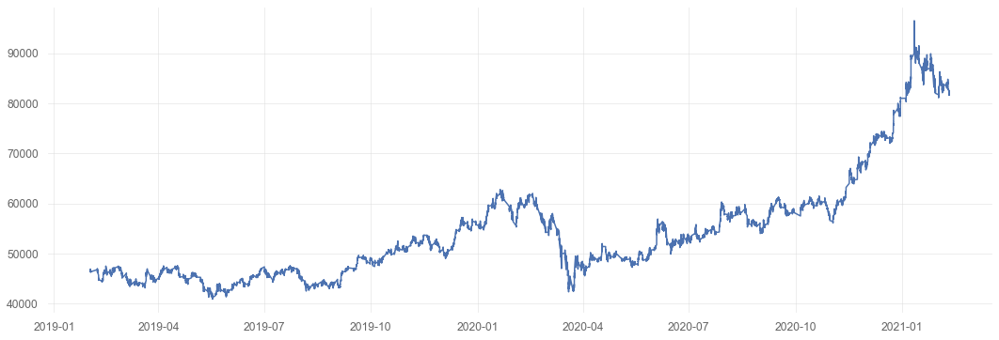

In [24]:
import matplotlib.pyplot as plt
plt.figure(figsize = (18, 6))
plt.plot(open_df['A005930'], label = 'K200')

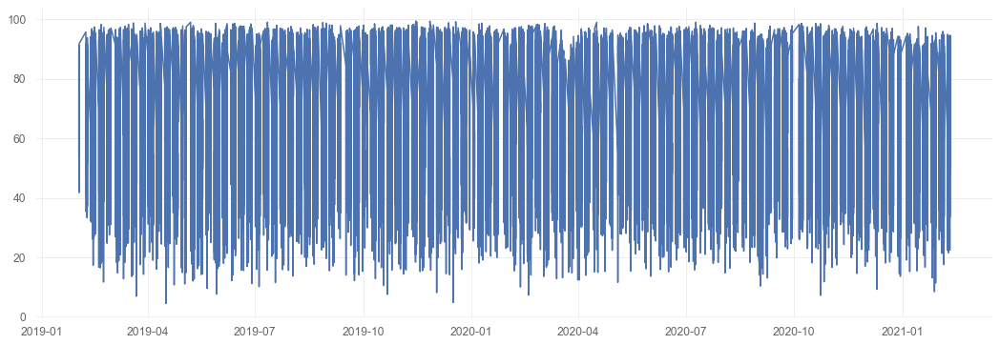

In [26]:
plt.figure(figsize = (18, 6))
plt.plot(MFI_df['A005930'], label = 'K200')

In [42]:
NumData = len(open_df)
Symbol = open_df.columns
Time = open_df.index
PF_Size = pd.DataFrame(index=Time, columns=Symbol)

In [36]:
rt = open_df.pct_change()

In [71]:
(MFI_df - 99).rank(axis=1)

MemoryError: Unable to allocate 1.13 GiB for an array with shape (190320, 797) and data type float64

In [37]:
hold = ((MFI_df > 99)*1)

In [51]:
Rp = pd.Series(np.zeros(NumData))
Vp = pd.Series(np.zeros(NumData)) # Value
Vp[0] = 100 # 투자원금 = 100

In [54]:
for t in range(1,NumData):
    Rp[t] = hold.iloc[t-1,:]@rt.iloc[t,:]
    Vp.iloc[t] = Vp.iloc[t-1]*(1 + Rp.iloc[t])

In [65]:
for t in range(1,NumData):
    Vp[t] = Vp[t-1]*(1 + Rp.iloc[t])

nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan


nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan


nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan


nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan


nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan


nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan


nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan


nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan


nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan


nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan


nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan


nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan


nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan


nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan


nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan


nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan


nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan


nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan


nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan


nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan


nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan


nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan


nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan


nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan


nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan


nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan


nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan


nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan


nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan


nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan


nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan


nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan


nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan


nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan


nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan


nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan


nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan


nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan


nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan


nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan


nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan


nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan


nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan


nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan


nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan


nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan


nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan


nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan


nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan


nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan


nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan


nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan


nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan


nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan


nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan


nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan


nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan


nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan


nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan


nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan


nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan


nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan


nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan


nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan


nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan


In [60]:
Rp.replace(np.nan,0)

0         0.000000
1         0.000000
2         0.000000
3         0.000000
4         0.000000
            ...   
190315   -0.017039
190316   -0.000124
190317    0.005439
190318   -0.010313
190319    0.013369
Length: 190320, dtype: float64

In [64]:
Vp

0         100.0
1           NaN
2           NaN
3           NaN
4           NaN
          ...  
190315      NaN
190316      NaN
190317      NaN
190318      NaN
190319      NaN
Length: 190320, dtype: float64

In [ ]:
for t in range(1,NumData):
    for code in code_df['code']:
        if PF_Size[code][t] > 0:
            PF_Size[code][t] = 1
        else : 
            

In [94]:
data_df = MFI(data_df, 10, 2)
data_df

,open,high,low,close,volume,TP,RMF,MFI,MFI_MA,MFI_Std,MFI_Upper,MFI_Lower
date,,,,,,,,,,,,
2019-02-01 09:01:00,4350,4365,4335,4360,49357,4353.333333,2.148675e+08,NaN,NaN,NaN,NaN,NaN
2019-02-01 09:02:00,4370,4420,4360,4415,7405,4398.333333,3.256966e+07,NaN,NaN,NaN,NaN,NaN
2019-02-01 09:03:00,4405,4415,4365,4370,7883,4383.333333,3.455382e+07,NaN,NaN,NaN,NaN,NaN
2019-02-01 09:04:00,4370,4385,4365,4385,7928,4378.333333,3.471143e+07,NaN,NaN,NaN,NaN,NaN
2019-02-01 09:05:00,4365,4380,4365,4380,4185,4375.000000,1.830938e+07,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
2019-08-14 10:09:00,1220,1220,1220,1220,1001,1220.000000,1.221220e+06,86.369168,87.498720,3.499088,94.496896,80.500543
2019-08-14 10:10:00,1225,1225,1225,1225,1,1225.000000,1.225000e+03,83.330618,87.221436,3.595916,94.413269,80.029603
2019-08-14 10:11:00,1220,1220,1215,1215,3333,1216.666667,4.055150e+06,86.011299,87.130666,3.669560,94.469787,79.791545


In [108]:
MFI_df = pd.DataFrame(index=data_df.index)
MFI_Upper_df = pd.DataFrame(index=data_df.index)
MFI_Lower_df = pd.DataFrame(index=data_df.index)

In [110]:
for code in tqdm(code_df['code']) : 
    conn = sqlite3.connect("D:/stock_price(1min).db")
    cur = conn.cursor()
    cur.execute("SELECT * FROM "+ code)
    rows = cur.fetchall()
    cols = [column[0] for column in cur.description]

    data_df = pd.DataFrame.from_records(data=rows, columns=cols)
    data_df['date'] = pd.to_datetime(data_df['date'], format='%Y%m%d%H%M')
    data_df.set_index('date', drop=True, inplace=True)
    
    data_df = MFI(data_df, 10, 2)
    
    MFI_df[code] = data_df['MFI']

100%|████████████████████████████████████████████████████████████████████████████████| 797/797 [18:55<00:00,  1.42s/it]


In [127]:
((MFI_df['A005930'] > 90)*1).sum()

13036

In [71]:
open_df = open_df.fillna(method='ffill')
close_df = close_df.fillna(method='ffill')
high_df = high_df.fillna(method='ffill')
low_df = low_df.fillna(method='ffill')
volume_df = volume_df.fillna(method='ffill')

In [72]:
open_df.to_csv("D:/open_df.csv", index=True)
close_df.to_csv("D:/close_df.csv", index=True)

In [74]:
MFI_df.to_csv("D:/MFI_df.csv", index=True)

KeyboardInterrupt: 

In [209]:
def make_code (x) :
    x = str(x)
    
    return 'A'+'0'*(6-len(x)) + x

code['code'] = code['code'].apply(make_code)

In [212]:
code.to_csv("C:/Users/elris/Dropbox/Fin Lab/data/code_list.csv", index=False)

In [253]:
code_df = code

In [16]:
import Fridge

f = Fridge.Fridge()
f.open()

냉장고 문을 열었어요...


In [ ]:
import